In [1]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import pandas as pd
import numpy as np
from numpy import recarray

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import torch
from torchvision import transforms
import torch.utils.data as data
from torch import nn
from torch.nn.utils.rnn import pad_sequence
from torch.nn import functional as F
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import os
import copy
import platform
import secrets

if torch.cuda.is_available():
    device = 'cuda'
    print('on cuda')
elif torch.backends.mps.is_available():
    device = 'mps'
    print('on mps')
else:
    device = 'cpu'
    print('on cpu')

RANDOM_SEED = 42
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed(RANDOM_SEED)
torch.mps.manual_seed(RANDOM_SEED)

on cuda


In [2]:
class mHealth(data.Dataset):

    def __init__(self, dataframe, window_size=128, step_size=128):
        """
        Args:
            dataframe (pd.DataFrame): dataframe containing data
        """
        self.dataset = dataframe
        self.window_size = window_size
        self.step_size = step_size
        self.windows = self.create_windows()
    
    def create_windows(self):
        windows = []
        for i in range(0, len(self.dataset) - self.window_size + 1, self.step_size):
            windows.append(self.dataset[i:i + self.window_size])
        return windows

    def __len__(self):
        return len(self.windows)

    def __getitem__(self, index):
        """
        Args:
            index (int): Index
        Returns:
            torch.Tensor: Sequence of shape [window_size, 3] for 3-axis data.
        """
        sequence = torch.tensor(self.windows[index].to_numpy()).type(torch.float32)#.unsqu
        # If using 1D data, uncomment the next line:
        sequence = sequence.unsqueeze(dim=1)
        return sequence

# Pad sequences that aren't the same length
def collate_fn(data):
    inputs = [torch.tensor(d) for d in data]
    inputs = pad_sequence(inputs, batch_first=True)
    return inputs

In [3]:
class Encoder(nn.Module):
    def __init__(self, input_size=1, hidden_size=64, num_layers=1):#, dropout_prob=0.2):
        super(Encoder, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.dropout_prob = dropout_prob
        
        self.lstm = nn.LSTM(
            input_size,
            hidden_size,
            num_layers,
            batch_first=True,
            bidirectional=False,
            dropout=0.2,
        )
        
        self.fc = nn.Linear(num_layers, 1)

    def forward(self, x):
        
        outputs, (hidden, cell) = self.lstm(x.to(device))
        
        return outputs, (hidden, cell)


class Decoder(nn.Module):
    def __init__(self, input_size=1, hidden_size=64, output_size=1, num_layers=1):#, dropout_prob=0.2):
        
        super(Decoder, self).__init__()
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.num_layers = num_layers
        # self.dropout_prob = dropout_prob
        print("decoder layers: ", self.num_layers)
        
        self.lstm = nn.LSTM(
            input_size,
            hidden_size,
            num_layers,
            batch_first=True,
            bidirectional=False,
            dropout=0.2,
        )
        self.fc = nn.Linear(
            hidden_size,
            output_size
        )

    def forward(self, x, hidden):
        
        hidden = (hidden[0], hidden[1])
        output, (hidden, cell) = self.lstm(x, hidden)
        prediction = self.fc(output)
        
        return prediction, (hidden, cell)


class LSTMVAE(nn.Module):
    """LSTM-based Variational Auto Encoder"""

    def __init__(self, input_size, hidden_size, latent_size, seq_len, num_layers, device, dropout_prob):
        """
        input_size: int, number of input features, default=3
        hidden_size: int, size of hidden layer, default=256
        latent_size: int, latent z-layer size, default=128
        seq_size: int, sequence length of input
        num_layers: int, number of layers in LSTM, default=2
        """
        super(LSTMVAE, self).__init__()
        self.device = device

        # init
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.latent_size = latent_size
        self.seq_len = seq_len
        self.num_layers = num_layers
        self.dropout_prob = dropout_prob

        # lstm ae
        self.lstm_enc = Encoder(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=self.num_layers,
            # dropout=self.dropout_prob
        )

        self.lstm_dec = Decoder(
            input_size=latent_size,
            output_size=input_size,
            hidden_size=hidden_size,
            num_layers=self.num_layers,
            # dropout=self.dropout_prob
        )


        self.fc21 = nn.Linear(self.hidden_size, self.latent_size) #expected input: [64, 0]
        self.fc22 = nn.Linear(self.hidden_size, self.latent_size)
        self.fc3 = nn.Linear(self.latent_size, self.hidden_size)
        self.fc_fix = nn.Linear(self.seq_len * self.num_layers, self.seq_len)

    def reparametize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        noise = torch.randn_like(std).to(self.device)

        z = mu + noise * std
        return z

    def forward(self, x):
        # x = x.unsqueeze(dim=1)
        # print('x shape: ', x.shape)
        batch_size, seq_len, feature_dim = x.shape

        # encode input space to hidden space
        outputs, enc_hidden = self.lstm_enc(x)
        enc_h = enc_hidden[0].view(self.num_layers, batch_size, self.hidden_size).to(self.device)

        mean = self.fc21(enc_h)
        logvar = self.fc22(enc_h)
        z = self.reparametize(mean, logvar)  # batch_size x latent_size
        h_ = self.fc3(z)

        # decode latent space to input space
        z = z.repeat(1, seq_len, 1)
        z = z.view(batch_size, seq_len * self.num_layers, self.latent_size).to(self.device)
        hidden = (h_.contiguous(), h_.contiguous())
        reconstruct_output, hidden = self.lstm_dec(z, hidden)
        x_hat = reconstruct_output.squeeze()
        
        x_hat = self.fc_fix(x_hat)

        losses = self.loss_function(x_hat, x, mean, logvar)
        m_loss, recon_loss, kld_loss = (
            losses["loss"],
            losses["Reconstruction_Loss"],
            losses["KLD"],
        )

        return m_loss, x_hat, (recon_loss, kld_loss)
    
    def encode(self, x):
        batch_size, seq_len, feature_dim = x.shape
        
        outputs, enc_hidden = self.lstm_enc(x)
        enc_h = enc_hidden[0].view(self.num_layers, batch_size, self.hidden_size).to(self.device)

        mean = self.fc21(enc_h)
        logvar = self.fc22(enc_h)
        z = self.reparametize(mean, logvar)  # batch_size x latent_size
        
        return z
    
    def decode(self, z):
        batch_size, seq_len, feature_dim = z.shape
        
        h_ = self.fc3(z)
        
        # decode latent space to input space
        z = z.repeat(1, seq_len, 1)
        z = z.view(batch_size, seq_len * self.num_layers, self.latent_size).to(self.device)
        hidden = (h_.contiguous(), h_.contiguous())
        reconstruct_output, hidden = self.lstm_dec(z, hidden)
        x_hat = reconstruct_output.squeeze()
        
        x_hat = self.fc_fix(x_hat)
        
        return x_hat
    
    def reconstruct(self, x):
        # print("reconstruct x shape: ", x.shape)
        batch_size, seq_len, feature_dim = x.shape
        

        # encode input space to hidden space
        outputs, enc_hidden = self.lstm_enc(x)
        enc_h = enc_hidden[0].view(self.num_layers, batch_size, self.hidden_size).to(self.device)

        mean = self.fc21(enc_h)
        logvar = self.fc22(enc_h)
        z = self.reparametize(mean, logvar)  # batch_size x latent_size
        latent = z
        h_ = self.fc3(z)

        # decode latent space to input space
        z = z.repeat(1, seq_len, 1)
        z = z.view(batch_size, seq_len * self.num_layers, self.latent_size).to(self.device)
        hidden = (h_.contiguous(), h_.contiguous())
        reconstruct_output, hidden = self.lstm_dec(z, hidden)
        x_hat = reconstruct_output.squeeze()
        
        x_hat = self.fc_fix(x_hat)
        
        # print("x hat shape: ", x_hat.shape)

        return latent, x_hat

    def loss_function(self, *args, **kwargs) -> dict:
        """
        
        Computes the VAE loss function.
        KL(N(\mu, \sigma), N(0, 1)) = \log \frac{1}{\sigma} + \frac{\sigma^2 + \mu^2}{2} - \frac{1}{2}
        :param args:
        :param kwargs:
        :return:
        """
        recons = args[0].to(device).unsqueeze(dim=2)
        input = args[1].to(device)
        mu = args[2]
        log_var = args[3]

        kld_weight = 0.00025  # Account for the minibatch samples from the dataset

        recons_loss = F.mse_loss(recons, input)

        kld_loss = torch.mean(
            -0.5 * torch.sum(1 + log_var - mu**2 - log_var.exp(), dim=1), dim=0
        )

        loss = recons_loss + kld_weight * kld_loss
        return {
            "loss": loss,
            "Reconstruction_Loss": recons_loss.detach(),
            "KLD": -kld_loss.detach(),
        }

0        -3.948768
1        -3.963551
2        -3.872089
3        -3.867484
4        -3.892834
            ...   
161275   -3.747522
161276   -3.804183
161277   -3.730558
161278   -3.392240
161279   -3.416911
Length: 161280, dtype: float64

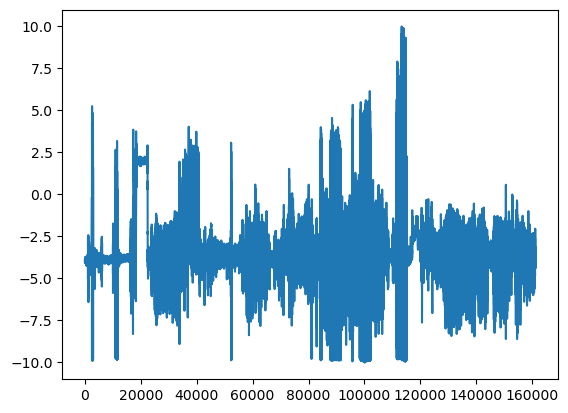

In [4]:
if(platform.system() == 'Darwin'):
    print('hi')

dataset_path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\MHEALTHDATASET_CSV\\mHealth_subject1.csv'

dataset = pd.read_csv(dataset_path)
dataset = dataset['chest acceleration X-axis'] #drop all columns that aren't chest accel info

dataset = dataset.to_numpy().reshape(-1, 1)
scaler = MinMaxScaler(feature_range=(-10, 10))

dataset = scaler.fit_transform(dataset)
dataset = pd.Series(dataset.squeeze())
plt.plot(dataset)
dataset

In [5]:
LOAD_MODEL = False
split_idx = int(len(dataset) * 0.8)

# training dataset
train_set = mHealth(
    dataframe=dataset[:split_idx],
)

test_set = mHealth(
    dataframe=dataset[split_idx:],
)

batch_size = 256
input_size = 1
hidden_size = 256
latent_size = 128
sequence_len = 128
num_layers = 2
clip_value = 5
dropout_prob = 0.2

# define LSTM-based VAE model
if(LOAD_MODEL):
    model = LSTMVAE(input_size, hidden_size, latent_size, sequence_len, num_layers, device=device)
    if(platform.system() == 'Darwin'):
        model.load_state_dict(torch.load('/Users/jm/VS Code/Python/pythonenv/gait-project/VAE+RNN/lstm_vae/1_dim_4_layer_state_dict'))
    elif(platform.system() == 'Windows'):
        model.load_state_dict(torch.load('C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\VAE+RNN\\lstm_vae\\state_dicts\\aug_3_2_layers'))
    else:
        model.load_state_dict(torch.load('/Users/jm/VS Code/Python/pythonenv/gait-project/VAE+RNN/lstm_vae/1_dim_4_layer_state_dict'))
        print("linux")
    print("model loaded from state dict | system: ", platform.system())
else:
    model = LSTMVAE(input_size, hidden_size, latent_size, sequence_len, num_layers, device=device, dropout_prob=dropout_prob)

model.to(device)
print("training on: ", device)
print('----------------------------------------------------------------\n', 
      model)

decoder layers:  2
training on:  cuda
----------------------------------------------------------------
 LSTMVAE(
  (lstm_enc): Encoder(
    (lstm): LSTM(1, 256, num_layers=2, batch_first=True, dropout=0.2)
    (fc): Linear(in_features=2, out_features=1, bias=True)
  )
  (lstm_dec): Decoder(
    (lstm): LSTM(128, 256, num_layers=2, batch_first=True, dropout=0.2)
    (fc): Linear(in_features=256, out_features=1, bias=True)
  )
  (fc21): Linear(in_features=256, out_features=128, bias=True)
  (fc22): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=256, bias=True)
  (fc_fix): Linear(in_features=256, out_features=128, bias=True)
)


In [6]:
train_loader = torch.utils.data.DataLoader(
    dataset=train_set,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
)

test_loader = torch.utils.data.DataLoader(
    dataset=test_set,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
)

print(f"Dataloaders: {train_loader}")
print(f"Length of train_dataloader: {len(train_loader)} batches of {batch_size}")


for idx, data in enumerate(train_loader):
    datas = data
    print("datas shape: ", datas.shape)
    break

train_loss = []
test_loss = []
learning_rate = []

Dataloaders: <torch.utils.data.dataloader.DataLoader object at 0x000001CDC97C0290>
Length of train_dataloader: 4 batches of 256
datas shape:  torch.Size([256, 128, 1])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


In [7]:
clip_value = 100

def train(iterations, model, train_loader, test_loader):
    # optimizer
    optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=2000)

    ## interation setup
    epochs = tqdm(range(iterations // len(train_loader)))

    ## training
    count = 0
    for epoch in epochs:
        model.train()
        optimizer.zero_grad()
        train_iterator = tqdm(
            enumerate(train_loader), total=len(train_loader), desc="training"
        )
        
        temp = -1
        
        for i, batch_data in train_iterator:

            if count > iterations:
                return model
            count += 1

            past_data = batch_data

            mloss, recon_x, recon_loss = model(past_data)

            # Backward and optimize
            optimizer.zero_grad()
            mloss.mean().backward()
            
            torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
            
            optimizer.step()

            train_iterator.set_postfix({"train_loss": float(mloss.mean())})
            temp = float(mloss.mean())
            
        if(temp != -1):
            train_loss.append(temp)
            
        before_lr = optimizer.param_groups[0]["lr"]
        learning_rate.append(float(before_lr))
        scheduler.step()
        after_lr = optimizer.param_groups[0]["lr"]
        print("Epoch %d: SGD lr %.4f -> %.4f" % (epoch, before_lr, after_lr))

        model.eval()
        eval_loss = 0
        test_iterator = tqdm(
            enumerate(test_loader), total=len(test_loader), desc="testing"
        )

        with torch.no_grad():
            for i, batch_data in test_iterator:
                past_data = batch_data

                ## reshape
                batch_size = past_data.size(0)
                example_size = past_data.size(1)
                past_data = (
                    past_data.view(batch_size, example_size, -1).float().to(device)
                )

                mloss, recon_x, info = model(past_data)

                eval_loss += mloss.mean().item()

                test_iterator.set_postfix({"test_loss": float(mloss.mean())})
                temp = float(mloss.mean())
            
        if(temp != -1):
            test_loss.append(temp)
        eval_loss = eval_loss / len(test_loader)
        print("Evaluation Score : [{}]".format(eval_loss))
        torch.cuda.empty_cache()

    return model


In [8]:
# iterations = 5000 ## iterations = total iterations, epochs = iterations / len(dataloader)
# train(iterations, model, train_loader, test_loader)

In [9]:
def train_model(model):
    for i in range(10):

        path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\MHEALTHDATASET_CSV\\mHealth_subject' + str(i+1) + '.csv'
        df = pd.read_csv(path)
        
        df = df['chest acceleration X-axis']
        
        df = df.to_numpy().reshape(-1, 1)
        scaler = MinMaxScaler(feature_range=(-10, 10))

        df = scaler.fit_transform(df)
        df = pd.Series(df.squeeze())
        
        split_idx = int(len(df) * 0.8)
        
        train_set = mHealth(
            dataframe=df[:split_idx],
        )
        
        test_set = mHealth(
            dataframe=df[split_idx:],
        )
        
        train_loader = torch.utils.data.DataLoader(
            dataset=train_set,
            batch_size=512,
            collate_fn=collate_fn,
            shuffle=False,
            drop_last=False
        )
        
        test_loader = torch.utils.data.DataLoader(
            dataset=test_set,
            batch_size=512,
            collate_fn=collate_fn,
            shuffle=False,
            drop_last=False
        )
        
        iterations = 5000 ## iterations = total iterations, epochs = iterations / len(dataloader)
        train(iterations, model, train_loader, test_loader)
        
        dataloader = torch.utils.data.DataLoader(
            dataset=dataset,
            batch_size=512,
            collate_fn=collate_fn,
            shuffle=False,
            drop_last=False
        )

In [10]:
train_model(model)

  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  2.08it/s, train_loss=16.7]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:01<42:59,  1.03s/it]

Evaluation Score : [14.994709968566895]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=16.6]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:01<31:32,  1.32it/s]

Evaluation Score : [14.89966106414795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=16.5]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:02<27:51,  1.49it/s]

Evaluation Score : [14.648696899414062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=16.1]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:02<26:04,  1.60it/s]

Evaluation Score : [13.939675331115723]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=15]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:03<24:45,  1.68it/s]

Evaluation Score : [11.957664489746094]


training: 100%|██████████| 2/2 [00:00<00:00,  3.87it/s, train_loss=12.1]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:03<24:37,  1.69it/s]

Evaluation Score : [7.235879898071289]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=6.74]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:04<24:02,  1.73it/s]

Evaluation Score : [1.8800172805786133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=6.54]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:04<23:08,  1.80it/s]

Evaluation Score : [4.247040748596191]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=6.66]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:05<22:41,  1.83it/s]

Evaluation Score : [1.4778966903686523]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.97]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:05<22:07,  1.88it/s]

Evaluation Score : [3.0466880798339844]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=6.61]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:06<21:56,  1.89it/s]

Evaluation Score : [4.263307094573975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=6.64]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:06<21:32,  1.93it/s]

Evaluation Score : [3.2792415618896484]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=5.36]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:07<21:19,  1.94it/s]

Evaluation Score : [1.7357163429260254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.81]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:07<21:11,  1.96it/s]

Evaluation Score : [1.5110090970993042]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=5.19]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:08<21:02,  1.97it/s]

Evaluation Score : [1.4979177713394165]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.81]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:08<20:51,  1.98it/s]

Evaluation Score : [1.3977328538894653]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.82]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:09<20:41,  2.00it/s]

Evaluation Score : [2.0076589584350586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=5.23]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:09<20:34,  2.01it/s]

Evaluation Score : [2.3311567306518555]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=5.18]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:10<20:30,  2.02it/s]

Evaluation Score : [1.9233741760253906]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.77]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:10<20:40,  2.00it/s]

Evaluation Score : [1.406477689743042]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:11<20:56,  1.97it/s]

Evaluation Score : [1.3038122653961182]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.72]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:11<21:04,  1.96it/s]

Evaluation Score : [1.3239777088165283]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.66]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:12<20:55,  1.97it/s]

Evaluation Score : [1.4152801036834717]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.7]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:12<20:48,  1.98it/s]

Evaluation Score : [1.655194878578186]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.82]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:13<20:35,  2.00it/s]

Evaluation Score : [1.7402763366699219]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.78]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:13<20:24,  2.02it/s]

Evaluation Score : [1.5667273998260498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.66]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:14<20:14,  2.04it/s]

Evaluation Score : [1.3815178871154785]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.63]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:14<20:14,  2.04it/s]

Evaluation Score : [1.323885440826416]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:15<20:13,  2.04it/s]

Evaluation Score : [1.3377926349639893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.63]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:15<20:12,  2.04it/s]

Evaluation Score : [1.4166399240493774]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.67]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:16<20:06,  2.05it/s]

Evaluation Score : [1.5204739570617676]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.7]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:16<20:10,  2.04it/s]

Evaluation Score : [1.5453212261199951]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.68]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:17<20:48,  1.98it/s]

Evaluation Score : [1.4736051559448242]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.65]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:17<20:28,  2.01it/s]

Evaluation Score : [1.3943252563476562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.63]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:18<20:19,  2.02it/s]

Evaluation Score : [1.3633310794830322]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.63]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:18<20:12,  2.03it/s]

Evaluation Score : [1.3770058155059814]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:19<20:07,  2.04it/s]

Evaluation Score : [1.4268484115600586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.66]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:19<20:01,  2.05it/s]

Evaluation Score : [1.469153642654419]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.67]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:20<19:54,  2.06it/s]

Evaluation Score : [1.4719915390014648]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.66]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:20<19:53,  2.06it/s]

Evaluation Score : [1.4380121231079102]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:21<19:50,  2.07it/s]

Evaluation Score : [1.400132417678833]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.63]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:21<19:54,  2.06it/s]

Evaluation Score : [1.3891801834106445]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.63]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:22<19:56,  2.05it/s]

Evaluation Score : [1.401707649230957]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:22<20:50,  1.96it/s]

Evaluation Score : [1.427015781402588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.65]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:23<20:48,  1.97it/s]

Evaluation Score : [1.446609616279602]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.65]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:23<20:39,  1.98it/s]

Evaluation Score : [1.443334698677063]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.65]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:24<20:21,  2.01it/s]

Evaluation Score : [1.4258209466934204]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:24<20:11,  2.02it/s]

Evaluation Score : [1.4097038507461548]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:25<20:46,  1.97it/s]

Evaluation Score : [1.4053176641464233]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:25<20:27,  2.00it/s]

Evaluation Score : [1.4124809503555298]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:26<20:16,  2.01it/s]

Evaluation Score : [1.4280340671539307]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.65]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:26<20:34,  1.98it/s]

Evaluation Score : [1.4350546598434448]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.65]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:27<20:18,  2.01it/s]

Evaluation Score : [1.4316918849945068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:27<20:05,  2.03it/s]

Evaluation Score : [1.42287278175354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:28<19:59,  2.04it/s]

Evaluation Score : [1.4161500930786133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:28<20:02,  2.03it/s]

Evaluation Score : [1.4134855270385742]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:29<20:17,  2.01it/s]

Evaluation Score : [1.4195587635040283]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:29<20:27,  1.99it/s]

Evaluation Score : [1.4254751205444336]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:30<20:32,  1.98it/s]

Evaluation Score : [1.4277195930480957]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.65]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:30<20:36,  1.97it/s]

Evaluation Score : [1.426375389099121]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:31<20:43,  1.96it/s]

Evaluation Score : [1.4217275381088257]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:31<20:41,  1.96it/s]

Evaluation Score : [1.4172890186309814]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:32<20:39,  1.97it/s]

Evaluation Score : [1.4193300008773804]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:32<20:39,  1.97it/s]

Evaluation Score : [1.4203648567199707]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:33<20:44,  1.96it/s]

Evaluation Score : [1.4238024950027466]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:33<20:40,  1.96it/s]

Evaluation Score : [1.4246108531951904]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:34<20:50,  1.95it/s]

Evaluation Score : [1.4232882261276245]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:34<20:36,  1.97it/s]

Evaluation Score : [1.4196808338165283]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:35<20:21,  1.99it/s]

Evaluation Score : [1.4220844507217407]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:35<20:08,  2.01it/s]

Evaluation Score : [1.4203531742095947]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:36<19:57,  2.03it/s]

Evaluation Score : [1.4224841594696045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:36<19:47,  2.04it/s]

Evaluation Score : [1.4231960773468018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:37<19:42,  2.05it/s]

Evaluation Score : [1.4230859279632568]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:37<19:45,  2.05it/s]

Evaluation Score : [1.4226553440093994]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:38<19:41,  2.05it/s]

Evaluation Score : [1.4218292236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:38<19:41,  2.05it/s]

Evaluation Score : [1.4211676120758057]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:39<19:39,  2.05it/s]

Evaluation Score : [1.4211549758911133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:39<19:39,  2.05it/s]

Evaluation Score : [1.422400951385498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:40<19:33,  2.06it/s]

Evaluation Score : [1.4217017889022827]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:40<20:02,  2.01it/s]

Evaluation Score : [1.420552134513855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:41<20:11,  2.00it/s]

Evaluation Score : [1.4220372438430786]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:41<20:22,  1.98it/s]

Evaluation Score : [1.4229007959365845]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:42<20:03,  2.01it/s]

Evaluation Score : [1.4225937128067017]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:42<19:51,  2.03it/s]

Evaluation Score : [1.4208297729492188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:43<19:42,  2.04it/s]

Evaluation Score : [1.421195149421692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:43<19:38,  2.05it/s]

Evaluation Score : [1.4191627502441406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:44<19:37,  2.05it/s]

Evaluation Score : [1.4214856624603271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:44<19:33,  2.06it/s]

Evaluation Score : [1.4220592975616455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:45<19:32,  2.06it/s]

Evaluation Score : [1.4219985008239746]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:45<19:31,  2.06it/s]

Evaluation Score : [1.4224398136138916]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:46<19:30,  2.06it/s]

Evaluation Score : [1.4221196174621582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:46<19:26,  2.06it/s]

Evaluation Score : [1.4213156700134277]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:47<19:24,  2.07it/s]

Evaluation Score : [1.4212944507598877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:47<19:53,  2.02it/s]

Evaluation Score : [1.4192887544631958]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:48<19:42,  2.03it/s]

Evaluation Score : [1.422004222869873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:48<20:06,  1.99it/s]

Evaluation Score : [1.4217894077301025]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:49<19:59,  2.00it/s]

Evaluation Score : [1.4242050647735596]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:49<20:20,  1.97it/s]

Evaluation Score : [1.4214662313461304]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:50<20:00,  2.00it/s]

Evaluation Score : [1.4213439226150513]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:50<19:49,  2.02it/s]

Evaluation Score : [1.4204678535461426]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:51<19:43,  2.03it/s]

Evaluation Score : [1.422576904296875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:51<19:32,  2.05it/s]

Evaluation Score : [1.4226996898651123]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:52<19:29,  2.05it/s]

Evaluation Score : [1.4217844009399414]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:52<19:28,  2.05it/s]

Evaluation Score : [1.4196820259094238]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:53<19:59,  2.00it/s]

Evaluation Score : [1.4207355976104736]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:53<20:16,  1.97it/s]

Evaluation Score : [1.4205732345581055]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:54<20:05,  1.99it/s]

Evaluation Score : [1.42331862449646]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:54<19:47,  2.01it/s]

Evaluation Score : [1.4221675395965576]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:55<19:36,  2.03it/s]

Evaluation Score : [1.4239027500152588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:55<19:55,  2.00it/s]

Evaluation Score : [1.4247181415557861]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:56<19:57,  2.00it/s]

Evaluation Score : [1.4220075607299805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:56<19:41,  2.02it/s]

Evaluation Score : [1.421839952468872]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:57<19:31,  2.04it/s]

Evaluation Score : [1.4215893745422363]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:57<19:26,  2.05it/s]

Evaluation Score : [1.4217215776443481]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:58<19:23,  2.05it/s]

Evaluation Score : [1.4223357439041138]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:58<19:19,  2.06it/s]

Evaluation Score : [1.4235724210739136]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:59<19:16,  2.06it/s]

Evaluation Score : [1.4223542213439941]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:59<19:14,  2.06it/s]

Evaluation Score : [1.423322319984436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:59<19:12,  2.07it/s]

Evaluation Score : [1.4222800731658936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [01:00<19:17,  2.06it/s]

Evaluation Score : [1.4220402240753174]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [01:00<19:19,  2.05it/s]

Evaluation Score : [1.421241044998169]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [01:01<19:19,  2.05it/s]

Evaluation Score : [1.4224822521209717]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [01:01<19:17,  2.05it/s]

Evaluation Score : [1.4224785566329956]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [01:02<19:41,  2.01it/s]

Evaluation Score : [1.4222962856292725]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [01:02<19:33,  2.02it/s]

Evaluation Score : [1.4212779998779297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [01:03<19:48,  2.00it/s]

Evaluation Score : [1.4197468757629395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [01:03<19:46,  2.00it/s]

Evaluation Score : [1.4226531982421875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [01:04<20:06,  1.97it/s]

Evaluation Score : [1.4225739240646362]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [01:04<19:47,  2.00it/s]

Evaluation Score : [1.4230811595916748]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [01:05<19:38,  2.01it/s]

Evaluation Score : [1.4229295253753662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [01:05<19:29,  2.03it/s]

Evaluation Score : [1.4226027727127075]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [01:06<19:24,  2.03it/s]

Evaluation Score : [1.4219989776611328]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [01:06<19:20,  2.04it/s]

Evaluation Score : [1.4212567806243896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [01:07<19:10,  2.06it/s]

Evaluation Score : [1.4218981266021729]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [01:07<19:04,  2.07it/s]

Evaluation Score : [1.4206734895706177]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [01:08<19:04,  2.06it/s]

Evaluation Score : [1.4228930473327637]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [01:08<19:02,  2.07it/s]

Evaluation Score : [1.4209073781967163]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [01:09<19:02,  2.07it/s]

Evaluation Score : [1.4222052097320557]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [01:09<18:59,  2.07it/s]

Evaluation Score : [1.421161413192749]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [01:10<19:02,  2.07it/s]

Evaluation Score : [1.4202244281768799]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [01:10<19:05,  2.06it/s]

Evaluation Score : [1.421498417854309]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [01:11<19:33,  2.01it/s]

Evaluation Score : [1.422914743423462]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [01:11<19:42,  1.99it/s]

Evaluation Score : [1.4226607084274292]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [01:12<19:39,  2.00it/s]

Evaluation Score : [1.423884630203247]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [01:12<19:38,  2.00it/s]

Evaluation Score : [1.4235618114471436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [01:13<19:24,  2.02it/s]

Evaluation Score : [1.4215099811553955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [01:13<19:18,  2.03it/s]

Evaluation Score : [1.4204421043395996]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [01:14<19:09,  2.05it/s]

Evaluation Score : [1.4205577373504639]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [01:14<19:08,  2.05it/s]

Evaluation Score : [1.422812581062317]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [01:15<19:04,  2.05it/s]

Evaluation Score : [1.4231902360916138]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [01:15<19:03,  2.05it/s]

Evaluation Score : [1.423315405845642]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [01:16<18:58,  2.06it/s]

Evaluation Score : [1.4226421117782593]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [01:16<19:01,  2.06it/s]

Evaluation Score : [1.4216384887695312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [01:17<19:08,  2.04it/s]

Evaluation Score : [1.4202880859375]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [01:17<19:06,  2.04it/s]

Evaluation Score : [1.4213120937347412]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [01:18<19:06,  2.04it/s]

Evaluation Score : [1.4223123788833618]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [01:18<19:26,  2.01it/s]

Evaluation Score : [1.4236576557159424]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [01:19<19:37,  1.99it/s]

Evaluation Score : [1.4228746891021729]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [01:19<19:51,  1.97it/s]

Evaluation Score : [1.4235873222351074]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [01:20<19:53,  1.96it/s]

Evaluation Score : [1.4208344221115112]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [01:20<19:52,  1.96it/s]

Evaluation Score : [1.4191510677337646]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [01:21<19:37,  1.99it/s]

Evaluation Score : [1.4201014041900635]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:21<19:24,  2.01it/s]

Evaluation Score : [1.4219605922698975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:22<19:22,  2.01it/s]

Evaluation Score : [1.4216692447662354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:22<19:12,  2.03it/s]

Evaluation Score : [1.4216930866241455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:23<19:09,  2.03it/s]

Evaluation Score : [1.423964500427246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:23<19:06,  2.04it/s]

Evaluation Score : [1.4220635890960693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:24<18:58,  2.05it/s]

Evaluation Score : [1.4214755296707153]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:24<18:59,  2.05it/s]

Evaluation Score : [1.4203447103500366]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:25<18:53,  2.05it/s]

Evaluation Score : [1.4212616682052612]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:25<18:48,  2.06it/s]

Evaluation Score : [1.4201792478561401]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:26<18:54,  2.05it/s]

Evaluation Score : [1.4219127893447876]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:26<18:54,  2.05it/s]

Evaluation Score : [1.4195258617401123]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:27<18:54,  2.05it/s]

Evaluation Score : [1.4223849773406982]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:27<19:17,  2.01it/s]

Evaluation Score : [1.4235236644744873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:28<19:09,  2.02it/s]

Evaluation Score : [1.4189364910125732]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:28<19:00,  2.04it/s]

Evaluation Score : [1.422029733657837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:29<18:54,  2.05it/s]

Evaluation Score : [1.4199490547180176]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:29<18:54,  2.05it/s]

Evaluation Score : [1.4229142665863037]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:30<18:53,  2.05it/s]

Evaluation Score : [1.4213230609893799]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:30<18:55,  2.04it/s]

Evaluation Score : [1.422091007232666]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:31<18:48,  2.05it/s]

Evaluation Score : [1.4228160381317139]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:31<18:45,  2.06it/s]

Evaluation Score : [1.4224714040756226]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:31<18:43,  2.06it/s]

Evaluation Score : [1.4210569858551025]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:32<18:43,  2.06it/s]

Evaluation Score : [1.4203481674194336]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:32<18:39,  2.07it/s]

Evaluation Score : [1.4222114086151123]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:33<18:37,  2.07it/s]

Evaluation Score : [1.4231539964675903]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:33<18:39,  2.07it/s]

Evaluation Score : [1.422243595123291]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:34<18:37,  2.07it/s]

Evaluation Score : [1.4219646453857422]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:34<18:38,  2.06it/s]

Evaluation Score : [1.421357274055481]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:35<18:42,  2.06it/s]

Evaluation Score : [1.419827938079834]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:35<18:36,  2.07it/s]

Evaluation Score : [1.423110842704773]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:36<18:36,  2.07it/s]

Evaluation Score : [1.4229522943496704]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:36<18:42,  2.05it/s]

Evaluation Score : [1.4216091632843018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:37<18:39,  2.06it/s]

Evaluation Score : [1.4227203130722046]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:37<18:36,  2.06it/s]

Evaluation Score : [1.4236383438110352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:38<18:34,  2.07it/s]

Evaluation Score : [1.4227828979492188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:38<18:37,  2.06it/s]

Evaluation Score : [1.422290563583374]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:39<18:36,  2.06it/s]

Evaluation Score : [1.4236223697662354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:39<18:31,  2.07it/s]

Evaluation Score : [1.420870304107666]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:40<18:31,  2.07it/s]

Evaluation Score : [1.4208908081054688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:40<18:42,  2.05it/s]

Evaluation Score : [1.4227800369262695]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:41<18:42,  2.05it/s]

Evaluation Score : [1.4223294258117676]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:41<18:33,  2.06it/s]

Evaluation Score : [1.4229142665863037]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:42<18:30,  2.07it/s]

Evaluation Score : [1.4229034185409546]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:42<18:32,  2.06it/s]

Evaluation Score : [1.4223512411117554]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:43<18:36,  2.05it/s]

Evaluation Score : [1.4215941429138184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:43<18:35,  2.05it/s]

Evaluation Score : [1.422658085823059]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:44<19:33,  1.95it/s]

Evaluation Score : [1.4218201637268066]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:44<19:13,  1.98it/s]

Evaluation Score : [1.4213147163391113]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:45<19:05,  2.00it/s]

Evaluation Score : [1.4206881523132324]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:45<18:53,  2.02it/s]

Evaluation Score : [1.4198977947235107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:46<18:40,  2.04it/s]

Evaluation Score : [1.4228460788726807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:46<18:36,  2.05it/s]

Evaluation Score : [1.4226884841918945]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:47<18:31,  2.06it/s]

Evaluation Score : [1.4213812351226807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:47<18:28,  2.06it/s]

Evaluation Score : [1.4214344024658203]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:48<18:28,  2.06it/s]

Evaluation Score : [1.4217705726623535]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:48<18:25,  2.06it/s]

Evaluation Score : [1.4217137098312378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:49<18:24,  2.07it/s]

Evaluation Score : [1.4215080738067627]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:49<18:22,  2.07it/s]

Evaluation Score : [1.4232306480407715]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:49<18:23,  2.06it/s]

Evaluation Score : [1.4214510917663574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:50<18:21,  2.07it/s]

Evaluation Score : [1.4201292991638184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:50<18:19,  2.07it/s]

Evaluation Score : [1.4242091178894043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:51<18:25,  2.06it/s]

Evaluation Score : [1.4212102890014648]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:51<18:24,  2.06it/s]

Evaluation Score : [1.4206881523132324]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:52<18:20,  2.07it/s]

Evaluation Score : [1.4226734638214111]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:52<18:22,  2.06it/s]

Evaluation Score : [1.4216729402542114]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:53<18:18,  2.07it/s]

Evaluation Score : [1.4219415187835693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:53<18:20,  2.06it/s]

Evaluation Score : [1.4214541912078857]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:54<18:22,  2.06it/s]

Evaluation Score : [1.4223054647445679]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:54<18:23,  2.06it/s]

Evaluation Score : [1.4216898679733276]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:55<18:21,  2.06it/s]

Evaluation Score : [1.4204003810882568]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:55<18:22,  2.06it/s]

Evaluation Score : [1.421482801437378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:56<18:19,  2.06it/s]

Evaluation Score : [1.422736644744873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:56<18:23,  2.05it/s]

Evaluation Score : [1.4234321117401123]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:57<18:16,  2.06it/s]

Evaluation Score : [1.422511100769043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:57<18:14,  2.07it/s]

Evaluation Score : [1.418732762336731]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:58<18:14,  2.07it/s]

Evaluation Score : [1.4217884540557861]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:58<18:17,  2.06it/s]

Evaluation Score : [1.4207407236099243]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:59<18:17,  2.06it/s]

Evaluation Score : [1.4205706119537354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:59<18:17,  2.06it/s]

Evaluation Score : [1.4215785264968872]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [02:00<18:16,  2.06it/s]

Evaluation Score : [1.4207789897918701]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [02:00<18:13,  2.06it/s]

Evaluation Score : [1.4221985340118408]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [02:01<18:17,  2.06it/s]

Evaluation Score : [1.4218096733093262]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [02:01<18:18,  2.05it/s]

Evaluation Score : [1.4241917133331299]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [02:02<18:16,  2.06it/s]

Evaluation Score : [1.4226442575454712]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [02:02<18:15,  2.06it/s]

Evaluation Score : [1.4220067262649536]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [02:03<18:11,  2.06it/s]

Evaluation Score : [1.4199696779251099]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [02:03<18:12,  2.06it/s]

Evaluation Score : [1.420061469078064]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [02:04<18:09,  2.06it/s]

Evaluation Score : [1.4217602014541626]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [02:04<18:09,  2.06it/s]

Evaluation Score : [1.4203699827194214]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [02:05<18:26,  2.03it/s]

Evaluation Score : [1.4186148643493652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [02:05<18:27,  2.03it/s]

Evaluation Score : [1.4211773872375488]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [02:06<18:19,  2.04it/s]

Evaluation Score : [1.42409348487854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.16it/s, train_loss=4.64]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [02:06<18:53,  1.98it/s]

Evaluation Score : [1.421781063079834]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [02:07<18:42,  2.00it/s]

Evaluation Score : [1.421755313873291]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [02:07<18:32,  2.02it/s]

Evaluation Score : [1.4220616817474365]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [02:08<18:28,  2.02it/s]

Evaluation Score : [1.4197206497192383]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [02:08<18:24,  2.03it/s]

Evaluation Score : [1.4196956157684326]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [02:09<18:19,  2.04it/s]

Evaluation Score : [1.4222161769866943]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [02:09<18:16,  2.04it/s]

Evaluation Score : [1.4223055839538574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [02:09<18:09,  2.05it/s]

Evaluation Score : [1.423003911972046]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [02:10<18:06,  2.06it/s]

Evaluation Score : [1.4225056171417236]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [02:10<18:06,  2.06it/s]

Evaluation Score : [1.4228663444519043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [02:11<18:01,  2.07it/s]

Evaluation Score : [1.4222731590270996]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [02:11<18:05,  2.06it/s]

Evaluation Score : [1.4214167594909668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [02:12<18:03,  2.06it/s]

Evaluation Score : [1.42026948928833]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [02:12<18:02,  2.06it/s]

Evaluation Score : [1.4197027683258057]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [02:13<17:58,  2.07it/s]

Evaluation Score : [1.4240247011184692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [02:13<17:57,  2.07it/s]

Evaluation Score : [1.4244765043258667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [02:14<17:55,  2.07it/s]

Evaluation Score : [1.4226175546646118]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [02:14<17:54,  2.07it/s]

Evaluation Score : [1.4226818084716797]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [02:15<17:57,  2.07it/s]

Evaluation Score : [1.4222784042358398]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [02:15<17:58,  2.06it/s]

Evaluation Score : [1.421608328819275]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [02:16<17:55,  2.07it/s]

Evaluation Score : [1.4214396476745605]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [02:16<17:57,  2.06it/s]

Evaluation Score : [1.4217994213104248]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [02:17<17:54,  2.07it/s]

Evaluation Score : [1.4227550029754639]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [02:17<17:53,  2.07it/s]

Evaluation Score : [1.4221020936965942]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [02:18<17:57,  2.06it/s]

Evaluation Score : [1.4202172756195068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [02:18<17:56,  2.06it/s]

Evaluation Score : [1.4218647480010986]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [02:19<17:59,  2.06it/s]

Evaluation Score : [1.4251773357391357]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=4.64]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [02:19<17:51,  2.07it/s]

Evaluation Score : [1.4234263896942139]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [02:20<17:56,  2.06it/s]

Evaluation Score : [1.4206899404525757]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [02:20<17:53,  2.06it/s]

Evaluation Score : [1.4224293231964111]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [02:21<17:55,  2.06it/s]

Evaluation Score : [1.4223592281341553]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [02:21<17:55,  2.06it/s]

Evaluation Score : [1.4245245456695557]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [02:22<17:55,  2.06it/s]

Evaluation Score : [1.423677921295166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [02:22<17:53,  2.06it/s]

Evaluation Score : [1.42280912399292]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [02:23<18:00,  2.05it/s]

Evaluation Score : [1.422499418258667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [02:23<18:19,  2.01it/s]

Evaluation Score : [1.4194250106811523]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [02:24<18:15,  2.02it/s]

Evaluation Score : [1.4224512577056885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [02:24<18:12,  2.02it/s]

Evaluation Score : [1.4216378927230835]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [02:25<18:13,  2.02it/s]

Evaluation Score : [1.4240407943725586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [02:25<18:01,  2.04it/s]

Evaluation Score : [1.4218310117721558]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [02:26<18:00,  2.04it/s]

Evaluation Score : [1.4208338260650635]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [02:26<17:53,  2.05it/s]

Evaluation Score : [1.4205721616744995]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [02:27<17:49,  2.06it/s]

Evaluation Score : [1.4208145141601562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [02:27<17:48,  2.06it/s]

Evaluation Score : [1.423482894897461]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [02:27<17:45,  2.07it/s]

Evaluation Score : [1.4226324558258057]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [02:28<17:43,  2.07it/s]

Evaluation Score : [1.422267198562622]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [02:28<17:43,  2.07it/s]

Evaluation Score : [1.423318862915039]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [02:29<17:42,  2.07it/s]

Evaluation Score : [1.423060417175293]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [02:29<17:47,  2.06it/s]

Evaluation Score : [1.422370195388794]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [02:30<17:41,  2.07it/s]

Evaluation Score : [1.4212117195129395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [02:30<17:42,  2.07it/s]

Evaluation Score : [1.4193799495697021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [02:31<17:43,  2.06it/s]

Evaluation Score : [1.4186921119689941]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [02:31<17:42,  2.06it/s]

Evaluation Score : [1.420456886291504]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [02:32<17:43,  2.06it/s]

Evaluation Score : [1.4229223728179932]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [02:32<17:43,  2.06it/s]

Evaluation Score : [1.423088788986206]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [02:33<17:44,  2.06it/s]

Evaluation Score : [1.422893762588501]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=4.64]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [02:33<17:37,  2.07it/s]

Evaluation Score : [1.4229140281677246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [02:34<17:40,  2.06it/s]

Evaluation Score : [1.420374870300293]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [02:34<17:39,  2.06it/s]

Evaluation Score : [1.421126365661621]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [02:35<18:02,  2.02it/s]

Evaluation Score : [1.4226082563400269]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [02:35<18:20,  1.99it/s]

Evaluation Score : [1.4207124710083008]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [02:36<18:28,  1.97it/s]

Evaluation Score : [1.4188467264175415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [02:36<18:30,  1.97it/s]

Evaluation Score : [1.4192225933074951]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [02:37<18:24,  1.98it/s]

Evaluation Score : [1.422090768814087]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [02:37<18:20,  1.98it/s]

Evaluation Score : [1.422762155532837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [02:38<18:23,  1.98it/s]

Evaluation Score : [1.4237024784088135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [02:38<18:21,  1.98it/s]

Evaluation Score : [1.4229224920272827]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [02:39<18:16,  1.99it/s]

Evaluation Score : [1.419939398765564]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [02:39<18:21,  1.98it/s]

Evaluation Score : [1.4216023683547974]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [02:40<18:32,  1.96it/s]

Evaluation Score : [1.4251253604888916]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [02:40<18:29,  1.96it/s]

Evaluation Score : [1.421567440032959]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:41<18:32,  1.95it/s]

Evaluation Score : [1.4240515232086182]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:41<18:28,  1.96it/s]

Evaluation Score : [1.4242315292358398]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:42<18:31,  1.95it/s]

Evaluation Score : [1.4210792779922485]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:42<18:36,  1.94it/s]

Evaluation Score : [1.4226011037826538]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:43<18:46,  1.93it/s]

Evaluation Score : [1.4199714660644531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:43<18:32,  1.95it/s]

Evaluation Score : [1.421722650527954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:44<18:42,  1.93it/s]

Evaluation Score : [1.4220294952392578]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:45<18:58,  1.90it/s]

Evaluation Score : [1.4233660697937012]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:45<18:51,  1.92it/s]

Evaluation Score : [1.4218125343322754]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:46<18:33,  1.94it/s]

Evaluation Score : [1.4231057167053223]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:46<18:20,  1.97it/s]

Evaluation Score : [1.423309087753296]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:47<18:15,  1.97it/s]

Evaluation Score : [1.4214484691619873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:47<18:11,  1.98it/s]

Evaluation Score : [1.4228785037994385]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:48<18:28,  1.95it/s]

Evaluation Score : [1.423246145248413]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:48<18:34,  1.94it/s]

Evaluation Score : [1.4249682426452637]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:49<18:29,  1.95it/s]

Evaluation Score : [1.423304557800293]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:49<18:32,  1.94it/s]

Evaluation Score : [1.421748399734497]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:50<18:23,  1.95it/s]

Evaluation Score : [1.425048589706421]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:50<18:13,  1.97it/s]

Evaluation Score : [1.422182559967041]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:51<18:11,  1.97it/s]

Evaluation Score : [1.4221464395523071]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=4.64]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:51<17:51,  2.01it/s]

Evaluation Score : [1.4214844703674316]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:52<18:10,  1.97it/s]

Evaluation Score : [1.4206289052963257]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:52<17:59,  1.99it/s]

Evaluation Score : [1.4179290533065796]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:53<18:00,  1.99it/s]

Evaluation Score : [1.4212955236434937]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:53<18:20,  1.95it/s]

Evaluation Score : [1.4220166206359863]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:54<18:16,  1.96it/s]

Evaluation Score : [1.4233546257019043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:54<18:18,  1.96it/s]

Evaluation Score : [1.4226018190383911]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:55<18:12,  1.96it/s]

Evaluation Score : [1.4203922748565674]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:55<17:59,  1.99it/s]

Evaluation Score : [1.4222652912139893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=4.64]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:56<17:36,  2.03it/s]

Evaluation Score : [1.422192931175232]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=4.64]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:56<17:20,  2.06it/s]

Evaluation Score : [1.42193603515625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=4.64]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:57<17:12,  2.08it/s]

Evaluation Score : [1.422379493713379]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:57<17:14,  2.07it/s]

Evaluation Score : [1.4240918159484863]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:58<17:16,  2.07it/s]

Evaluation Score : [1.4235141277313232]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=4.64]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:58<17:11,  2.07it/s]

Evaluation Score : [1.4219567775726318]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:59<17:14,  2.07it/s]

Evaluation Score : [1.4228284358978271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=4.64]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:59<17:04,  2.09it/s]

Evaluation Score : [1.420393943786621]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:59<17:08,  2.08it/s]

Evaluation Score : [1.4224352836608887]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [03:00<17:10,  2.07it/s]

Evaluation Score : [1.4224121570587158]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [03:00<17:12,  2.07it/s]

Evaluation Score : [1.4223458766937256]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [03:01<17:16,  2.06it/s]

Evaluation Score : [1.4215071201324463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [03:01<17:21,  2.05it/s]

Evaluation Score : [1.4230080842971802]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [03:02<17:16,  2.06it/s]

Evaluation Score : [1.4218322038650513]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [03:02<17:16,  2.06it/s]

Evaluation Score : [1.424033284187317]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [03:03<17:18,  2.05it/s]

Evaluation Score : [1.4219337701797485]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [03:03<17:21,  2.04it/s]

Evaluation Score : [1.421247124671936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [03:04<17:19,  2.05it/s]

Evaluation Score : [1.4214365482330322]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [03:04<17:18,  2.05it/s]

Evaluation Score : [1.4209498167037964]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [03:05<17:16,  2.05it/s]

Evaluation Score : [1.4215773344039917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [03:05<17:25,  2.03it/s]

Evaluation Score : [1.4219337701797485]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [03:06<17:23,  2.04it/s]

Evaluation Score : [1.422057032585144]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [03:06<17:21,  2.04it/s]

Evaluation Score : [1.4243218898773193]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [03:07<17:26,  2.03it/s]

Evaluation Score : [1.4219123125076294]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [03:07<17:24,  2.03it/s]

Evaluation Score : [1.4206713438034058]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [03:08<17:14,  2.05it/s]

Evaluation Score : [1.4234212636947632]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [03:08<17:09,  2.06it/s]

Evaluation Score : [1.418611764907837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [03:09<17:05,  2.07it/s]

Evaluation Score : [1.4215525388717651]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [03:09<17:03,  2.07it/s]

Evaluation Score : [1.4221558570861816]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [03:10<17:04,  2.07it/s]

Evaluation Score : [1.424130916595459]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [03:10<17:06,  2.06it/s]

Evaluation Score : [1.421950340270996]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=4.64]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [03:11<16:59,  2.07it/s]

Evaluation Score : [1.42436945438385]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [03:11<16:59,  2.07it/s]

Evaluation Score : [1.4210745096206665]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [03:12<17:01,  2.07it/s]

Evaluation Score : [1.420035719871521]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [03:12<17:01,  2.07it/s]

Evaluation Score : [1.4211426973342896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [03:13<17:09,  2.05it/s]

Evaluation Score : [1.42143714427948]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [03:13<17:20,  2.03it/s]

Evaluation Score : [1.4227123260498047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [03:14<17:15,  2.04it/s]

Evaluation Score : [1.4228180646896362]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [03:14<17:08,  2.05it/s]

Evaluation Score : [1.423835039138794]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [03:15<17:03,  2.06it/s]

Evaluation Score : [1.4209070205688477]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [03:15<17:12,  2.04it/s]

Evaluation Score : [1.4224435091018677]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [03:16<17:10,  2.04it/s]

Evaluation Score : [1.4197766780853271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [03:16<17:19,  2.02it/s]

Evaluation Score : [1.422762155532837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [03:17<17:17,  2.03it/s]

Evaluation Score : [1.422114372253418]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [03:17<17:17,  2.03it/s]

Evaluation Score : [1.4232869148254395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [03:18<17:20,  2.02it/s]

Evaluation Score : [1.421737790107727]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [03:18<17:19,  2.02it/s]

Evaluation Score : [1.4233927726745605]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [03:19<17:19,  2.02it/s]

Evaluation Score : [1.4235210418701172]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [03:19<17:19,  2.02it/s]

Evaluation Score : [1.4236547946929932]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [03:20<17:16,  2.02it/s]

Evaluation Score : [1.4225915670394897]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [03:20<17:08,  2.04it/s]

Evaluation Score : [1.4212902784347534]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [03:21<16:59,  2.05it/s]

Evaluation Score : [1.4201210737228394]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [03:21<17:05,  2.04it/s]

Evaluation Score : [1.4213076829910278]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [03:22<17:07,  2.04it/s]

Evaluation Score : [1.4204587936401367]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [03:22<17:07,  2.03it/s]

Evaluation Score : [1.4204895496368408]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [03:23<17:13,  2.02it/s]

Evaluation Score : [1.4214057922363281]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [03:23<17:06,  2.04it/s]

Evaluation Score : [1.4207267761230469]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [03:23<17:05,  2.04it/s]

Evaluation Score : [1.4206314086914062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [03:24<17:04,  2.04it/s]

Evaluation Score : [1.4229843616485596]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [03:24<17:06,  2.03it/s]

Evaluation Score : [1.4229376316070557]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [03:25<17:07,  2.03it/s]

Evaluation Score : [1.4234771728515625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [03:25<17:08,  2.03it/s]

Evaluation Score : [1.4233250617980957]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [03:26<17:08,  2.02it/s]

Evaluation Score : [1.422208309173584]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [03:26<17:07,  2.03it/s]

Evaluation Score : [1.4214494228363037]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [03:27<17:12,  2.02it/s]

Evaluation Score : [1.419610619544983]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [03:27<17:07,  2.02it/s]

Evaluation Score : [1.4220147132873535]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [03:28<17:02,  2.03it/s]

Evaluation Score : [1.4221711158752441]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [03:28<17:06,  2.02it/s]

Evaluation Score : [1.423653244972229]


training: 100%|██████████| 2/2 [00:00<00:00,  3.85it/s, train_loss=4.64]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [03:29<18:01,  1.92it/s]

Evaluation Score : [1.4232678413391113]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [03:29<17:44,  1.95it/s]

Evaluation Score : [1.4227077960968018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [03:30<17:33,  1.97it/s]

Evaluation Score : [1.4221470355987549]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [03:30<17:29,  1.98it/s]

Evaluation Score : [1.422054409980774]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [03:31<17:26,  1.98it/s]

Evaluation Score : [1.4229354858398438]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [03:31<17:20,  1.99it/s]

Evaluation Score : [1.42392897605896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [03:32<17:12,  2.00it/s]

Evaluation Score : [1.4229371547698975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [03:32<17:09,  2.01it/s]

Evaluation Score : [1.422339916229248]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [03:33<17:09,  2.01it/s]

Evaluation Score : [1.425795555114746]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [03:33<17:12,  2.00it/s]

Evaluation Score : [1.4240691661834717]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [03:34<17:05,  2.02it/s]

Evaluation Score : [1.4229985475540161]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [03:34<17:03,  2.02it/s]

Evaluation Score : [1.423264980316162]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [03:35<16:55,  2.03it/s]

Evaluation Score : [1.4221137762069702]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [03:35<16:58,  2.03it/s]

Evaluation Score : [1.4214168787002563]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [03:36<16:57,  2.03it/s]

Evaluation Score : [1.4203462600708008]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [03:36<17:07,  2.01it/s]

Evaluation Score : [1.4226946830749512]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [03:37<17:01,  2.02it/s]

Evaluation Score : [1.4230835437774658]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [03:37<17:03,  2.01it/s]

Evaluation Score : [1.4227054119110107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [03:38<16:59,  2.02it/s]

Evaluation Score : [1.4210147857666016]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [03:38<17:02,  2.01it/s]

Evaluation Score : [1.4219551086425781]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [03:39<16:55,  2.03it/s]

Evaluation Score : [1.4230692386627197]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [03:39<16:54,  2.03it/s]

Evaluation Score : [1.4224467277526855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [03:40<16:52,  2.03it/s]

Evaluation Score : [1.4230678081512451]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [03:40<16:47,  2.04it/s]

Evaluation Score : [1.4224681854248047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [03:41<16:44,  2.04it/s]

Evaluation Score : [1.4241619110107422]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [03:41<16:41,  2.05it/s]

Evaluation Score : [1.423817753791809]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [03:42<16:41,  2.05it/s]

Evaluation Score : [1.4230608940124512]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [03:42<16:43,  2.04it/s]

Evaluation Score : [1.4212255477905273]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [03:43<16:49,  2.03it/s]

Evaluation Score : [1.42061185836792]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [03:43<16:46,  2.03it/s]

Evaluation Score : [1.4237725734710693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [03:44<16:44,  2.04it/s]

Evaluation Score : [1.422505259513855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [03:44<16:47,  2.03it/s]

Evaluation Score : [1.4235472679138184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [03:45<16:39,  2.05it/s]

Evaluation Score : [1.4246158599853516]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [03:45<16:39,  2.05it/s]

Evaluation Score : [1.423861026763916]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [03:46<16:38,  2.05it/s]

Evaluation Score : [1.4235961437225342]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [03:46<16:42,  2.04it/s]

Evaluation Score : [1.4224622249603271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [03:47<16:42,  2.04it/s]

Evaluation Score : [1.4210824966430664]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [03:47<16:39,  2.04it/s]

Evaluation Score : [1.4222972393035889]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [03:48<16:38,  2.04it/s]

Evaluation Score : [1.4215573072433472]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [03:48<16:34,  2.05it/s]

Evaluation Score : [1.4243109226226807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [03:49<16:38,  2.04it/s]

Evaluation Score : [1.4231561422348022]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [03:49<16:39,  2.04it/s]

Evaluation Score : [1.4230982065200806]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [03:50<16:32,  2.05it/s]

Evaluation Score : [1.4226130247116089]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [03:50<16:32,  2.05it/s]

Evaluation Score : [1.4207684993743896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [03:51<16:33,  2.05it/s]

Evaluation Score : [1.4228174686431885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [03:51<16:30,  2.05it/s]

Evaluation Score : [1.421466588973999]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [03:52<16:36,  2.04it/s]

Evaluation Score : [1.4243955612182617]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [03:52<16:35,  2.04it/s]

Evaluation Score : [1.421679973602295]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [03:53<16:33,  2.04it/s]

Evaluation Score : [1.42128586769104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=4.64]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [03:53<16:26,  2.06it/s]

Evaluation Score : [1.4243971109390259]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [03:54<16:22,  2.06it/s]

Evaluation Score : [1.4242193698883057]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [03:54<16:27,  2.05it/s]

Evaluation Score : [1.418628454208374]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [03:55<16:30,  2.04it/s]

Evaluation Score : [1.4210078716278076]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [03:55<16:36,  2.03it/s]

Evaluation Score : [1.4242334365844727]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [03:56<16:35,  2.03it/s]

Evaluation Score : [1.421544075012207]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [03:56<16:33,  2.04it/s]

Evaluation Score : [1.4225382804870605]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [03:57<16:32,  2.04it/s]

Evaluation Score : [1.422597885131836]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [03:57<16:36,  2.03it/s]

Evaluation Score : [1.4245388507843018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [03:58<16:42,  2.01it/s]

Evaluation Score : [1.4204509258270264]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [03:58<16:37,  2.02it/s]

Evaluation Score : [1.421262264251709]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [03:59<16:34,  2.03it/s]

Evaluation Score : [1.423872709274292]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [03:59<16:27,  2.04it/s]

Evaluation Score : [1.4229316711425781]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [03:59<16:22,  2.05it/s]

Evaluation Score : [1.422792673110962]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [04:00<16:24,  2.04it/s]

Evaluation Score : [1.4227876663208008]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [04:00<16:23,  2.05it/s]

Evaluation Score : [1.423833966255188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [04:01<16:24,  2.04it/s]

Evaluation Score : [1.4233860969543457]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [04:01<16:28,  2.04it/s]

Evaluation Score : [1.4213171005249023]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [04:02<16:28,  2.03it/s]

Evaluation Score : [1.4222887754440308]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [04:02<16:22,  2.05it/s]

Evaluation Score : [1.4221773147583008]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [04:03<16:19,  2.05it/s]

Evaluation Score : [1.4209412336349487]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [04:03<16:22,  2.04it/s]

Evaluation Score : [1.4244353771209717]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [04:04<16:20,  2.05it/s]

Evaluation Score : [1.4240431785583496]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [04:04<16:19,  2.05it/s]

Evaluation Score : [1.4226679801940918]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [04:05<16:25,  2.03it/s]

Evaluation Score : [1.4229962825775146]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [04:05<16:20,  2.04it/s]

Evaluation Score : [1.4246432781219482]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [04:06<16:19,  2.04it/s]

Evaluation Score : [1.420614242553711]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [04:06<16:19,  2.04it/s]

Evaluation Score : [1.4230767488479614]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [04:07<16:20,  2.04it/s]

Evaluation Score : [1.4234049320220947]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [04:07<16:21,  2.04it/s]

Evaluation Score : [1.423759937286377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [04:08<16:22,  2.03it/s]

Evaluation Score : [1.4240745306015015]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [04:08<16:18,  2.04it/s]

Evaluation Score : [1.4240938425064087]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [04:09<16:12,  2.05it/s]

Evaluation Score : [1.4196926355361938]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [04:09<16:12,  2.05it/s]

Evaluation Score : [1.4217438697814941]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [04:10<16:12,  2.05it/s]

Evaluation Score : [1.4215269088745117]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [04:10<16:16,  2.04it/s]

Evaluation Score : [1.4246002435684204]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [04:11<16:18,  2.04it/s]

Evaluation Score : [1.4231786727905273]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [04:11<16:15,  2.04it/s]

Evaluation Score : [1.4231007099151611]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [04:12<16:20,  2.03it/s]

Evaluation Score : [1.422316074371338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [04:12<16:19,  2.03it/s]

Evaluation Score : [1.4220731258392334]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [04:13<16:22,  2.02it/s]

Evaluation Score : [1.420987844467163]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [04:13<16:12,  2.04it/s]

Evaluation Score : [1.4216442108154297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [04:14<16:18,  2.03it/s]

Evaluation Score : [1.42256760597229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [04:14<16:16,  2.03it/s]

Evaluation Score : [1.4236418008804321]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [04:15<16:14,  2.04it/s]

Evaluation Score : [1.424767255783081]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [04:15<16:09,  2.04it/s]

Evaluation Score : [1.4244437217712402]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [04:16<16:11,  2.04it/s]

Evaluation Score : [1.422539234161377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [04:16<16:09,  2.04it/s]

Evaluation Score : [1.4207377433776855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [04:17<16:13,  2.03it/s]

Evaluation Score : [1.419527292251587]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [04:17<16:54,  1.95it/s]

Evaluation Score : [1.4232046604156494]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [04:18<17:26,  1.89it/s]

Evaluation Score : [1.4213755130767822]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [04:18<17:33,  1.88it/s]

Evaluation Score : [1.424931526184082]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [04:19<17:25,  1.89it/s]

Evaluation Score : [1.4256513118743896]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [04:19<17:55,  1.84it/s]

Evaluation Score : [1.4233770370483398]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [04:20<17:58,  1.83it/s]

Evaluation Score : [1.424073338508606]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [04:20<17:40,  1.86it/s]

Evaluation Score : [1.4225704669952393]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [04:21<17:15,  1.90it/s]

Evaluation Score : [1.4226584434509277]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [04:21<16:55,  1.94it/s]

Evaluation Score : [1.4223036766052246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [04:22<16:40,  1.97it/s]

Evaluation Score : [1.4222766160964966]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [04:22<16:32,  1.98it/s]

Evaluation Score : [1.4242184162139893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [04:23<16:26,  1.99it/s]

Evaluation Score : [1.4232134819030762]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [04:23<16:18,  2.01it/s]

Evaluation Score : [1.4231616258621216]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [04:24<16:25,  2.00it/s]

Evaluation Score : [1.4229106903076172]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [04:24<16:30,  1.98it/s]

Evaluation Score : [1.4229968786239624]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [04:25<16:38,  1.97it/s]

Evaluation Score : [1.421977162361145]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [04:26<16:46,  1.95it/s]

Evaluation Score : [1.421705722808838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [04:26<16:54,  1.93it/s]

Evaluation Score : [1.4219835996627808]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [04:27<16:55,  1.93it/s]

Evaluation Score : [1.4189393520355225]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [04:27<16:46,  1.95it/s]

Evaluation Score : [1.4217040538787842]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [04:28<16:38,  1.96it/s]

Evaluation Score : [1.4245858192443848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [04:28<16:35,  1.97it/s]

Evaluation Score : [1.4243438243865967]


training: 100%|██████████| 2/2 [00:00<00:00,  3.96it/s, train_loss=4.64]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [04:29<17:13,  1.89it/s]

Evaluation Score : [1.4217088222503662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [04:29<17:11,  1.90it/s]

Evaluation Score : [1.4216868877410889]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [04:30<16:54,  1.93it/s]

Evaluation Score : [1.4230477809906006]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [04:30<16:33,  1.97it/s]

Evaluation Score : [1.426016092300415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [04:31<16:24,  1.98it/s]

Evaluation Score : [1.4228541851043701]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [04:31<16:18,  2.00it/s]

Evaluation Score : [1.4232661724090576]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [04:32<16:48,  1.94it/s]

Evaluation Score : [1.4216253757476807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [04:32<16:34,  1.96it/s]

Evaluation Score : [1.4223030805587769]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [04:33<16:25,  1.98it/s]

Evaluation Score : [1.4242002964019775]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [04:33<16:14,  2.00it/s]

Evaluation Score : [1.4234437942504883]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [04:34<16:03,  2.02it/s]

Evaluation Score : [1.422783374786377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [04:34<16:00,  2.03it/s]

Evaluation Score : [1.422426462173462]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [04:35<16:00,  2.03it/s]

Evaluation Score : [1.4230449199676514]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [04:35<15:59,  2.03it/s]

Evaluation Score : [1.421752691268921]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [04:36<16:19,  1.98it/s]

Evaluation Score : [1.4237008094787598]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [04:36<16:22,  1.98it/s]

Evaluation Score : [1.4236276149749756]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [04:37<16:08,  2.00it/s]

Evaluation Score : [1.42436945438385]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [04:37<16:01,  2.02it/s]

Evaluation Score : [1.4223742485046387]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [04:38<15:56,  2.03it/s]

Evaluation Score : [1.4229040145874023]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [04:38<16:24,  1.97it/s]

Evaluation Score : [1.4213955402374268]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [04:39<16:23,  1.97it/s]

Evaluation Score : [1.422374963760376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [04:39<16:33,  1.95it/s]

Evaluation Score : [1.4232516288757324]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [04:40<16:31,  1.95it/s]

Evaluation Score : [1.4221149682998657]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [04:40<16:21,  1.97it/s]

Evaluation Score : [1.4219049215316772]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [04:41<16:11,  1.99it/s]

Evaluation Score : [1.422080397605896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [04:41<16:31,  1.95it/s]

Evaluation Score : [1.4219022989273071]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [04:42<16:27,  1.96it/s]

Evaluation Score : [1.4243496656417847]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [04:42<16:30,  1.95it/s]

Evaluation Score : [1.4229828119277954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [04:43<16:22,  1.96it/s]

Evaluation Score : [1.4235758781433105]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [04:43<16:23,  1.96it/s]

Evaluation Score : [1.4226933717727661]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [04:44<16:13,  1.98it/s]

Evaluation Score : [1.4229754209518433]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [04:44<16:13,  1.98it/s]

Evaluation Score : [1.4193631410598755]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [04:45<16:10,  1.98it/s]

Evaluation Score : [1.4205020666122437]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [04:45<16:05,  1.99it/s]

Evaluation Score : [1.4221192598342896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [04:46<16:01,  2.00it/s]

Evaluation Score : [1.4266449213027954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [04:46<16:20,  1.96it/s]

Evaluation Score : [1.4249327182769775]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [04:47<16:17,  1.97it/s]

Evaluation Score : [1.4253721237182617]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [04:47<16:12,  1.97it/s]

Evaluation Score : [1.4238309860229492]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [04:48<16:10,  1.98it/s]

Evaluation Score : [1.4213917255401611]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [04:48<16:07,  1.98it/s]

Evaluation Score : [1.4242271184921265]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [04:49<16:01,  1.99it/s]

Evaluation Score : [1.4229989051818848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [04:49<15:51,  2.01it/s]

Evaluation Score : [1.4216845035552979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [04:50<15:47,  2.02it/s]

Evaluation Score : [1.423842191696167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.17it/s, train_loss=4.64]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [04:50<16:16,  1.96it/s]

Evaluation Score : [1.4228839874267578]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [04:51<16:27,  1.94it/s]

Evaluation Score : [1.4225633144378662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [04:51<16:25,  1.94it/s]

Evaluation Score : [1.4220061302185059]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [04:52<16:17,  1.96it/s]

Evaluation Score : [1.4224216938018799]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [04:52<16:14,  1.96it/s]

Evaluation Score : [1.4238110780715942]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [04:53<15:59,  1.99it/s]

Evaluation Score : [1.4243111610412598]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [04:53<15:54,  2.00it/s]

Evaluation Score : [1.4212826490402222]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [04:54<15:50,  2.01it/s]

Evaluation Score : [1.4205092191696167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [04:54<16:06,  1.97it/s]

Evaluation Score : [1.4198989868164062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [04:55<16:18,  1.95it/s]

Evaluation Score : [1.4224627017974854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [04:55<16:13,  1.96it/s]

Evaluation Score : [1.422698736190796]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [04:56<16:08,  1.96it/s]

Evaluation Score : [1.4206809997558594]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [04:56<16:08,  1.96it/s]

Evaluation Score : [1.4211208820343018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [04:57<15:57,  1.99it/s]

Evaluation Score : [1.4212994575500488]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [04:57<15:49,  2.00it/s]

Evaluation Score : [1.4226038455963135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [04:58<15:41,  2.02it/s]

Evaluation Score : [1.4219156503677368]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [04:58<15:41,  2.02it/s]

Evaluation Score : [1.4240731000900269]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [04:59<15:41,  2.02it/s]

Evaluation Score : [1.422359824180603]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [04:59<15:36,  2.02it/s]

Evaluation Score : [1.420898675918579]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [05:00<15:34,  2.03it/s]

Evaluation Score : [1.4228099584579468]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [05:00<15:35,  2.02it/s]

Evaluation Score : [1.422389030456543]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [05:01<15:32,  2.03it/s]

Evaluation Score : [1.4231654405593872]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [05:01<15:32,  2.03it/s]

Evaluation Score : [1.424098014831543]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [05:02<15:30,  2.03it/s]

Evaluation Score : [1.4230763912200928]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [05:02<15:41,  2.01it/s]

Evaluation Score : [1.424620509147644]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [05:03<15:57,  1.97it/s]

Evaluation Score : [1.4216113090515137]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [05:03<16:08,  1.95it/s]

Evaluation Score : [1.4237796068191528]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [05:04<16:04,  1.96it/s]

Evaluation Score : [1.4227733612060547]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [05:04<15:55,  1.97it/s]

Evaluation Score : [1.4244177341461182]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [05:05<15:49,  1.99it/s]

Evaluation Score : [1.4252746105194092]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [05:05<15:40,  2.00it/s]

Evaluation Score : [1.425443410873413]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [05:06<15:36,  2.01it/s]

Evaluation Score : [1.4225060939788818]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [05:06<15:28,  2.03it/s]

Evaluation Score : [1.4216694831848145]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [05:07<15:25,  2.03it/s]

Evaluation Score : [1.4240978956222534]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [05:07<15:23,  2.04it/s]

Evaluation Score : [1.4213781356811523]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [05:08<15:44,  1.99it/s]

Evaluation Score : [1.4191954135894775]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [05:08<15:46,  1.98it/s]

Evaluation Score : [1.421980857849121]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [05:09<15:41,  1.99it/s]

Evaluation Score : [1.4214112758636475]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [05:09<15:47,  1.98it/s]

Evaluation Score : [1.423353910446167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [05:10<15:49,  1.97it/s]

Evaluation Score : [1.42348051071167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [05:10<15:59,  1.95it/s]

Evaluation Score : [1.424149751663208]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [05:11<16:09,  1.93it/s]

Evaluation Score : [1.4253036975860596]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [05:12<16:33,  1.88it/s]

Evaluation Score : [1.4237287044525146]


training: 100%|██████████| 2/2 [00:00<00:00,  3.81it/s, train_loss=4.64]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [05:12<17:05,  1.82it/s]

Evaluation Score : [1.423515796661377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [05:13<16:59,  1.83it/s]

Evaluation Score : [1.4224028587341309]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [05:13<16:48,  1.85it/s]

Evaluation Score : [1.4242680072784424]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [05:14<16:32,  1.88it/s]

Evaluation Score : [1.4202415943145752]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [05:14<16:21,  1.90it/s]

Evaluation Score : [1.4228460788726807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [05:15<17:01,  1.83it/s]

Evaluation Score : [1.4250452518463135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [05:15<16:39,  1.87it/s]

Evaluation Score : [1.4211337566375732]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [05:16<16:21,  1.90it/s]

Evaluation Score : [1.4208829402923584]


training: 100%|██████████| 2/2 [00:00<00:00,  3.93it/s, train_loss=4.64]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [05:16<16:46,  1.85it/s]

Evaluation Score : [1.4257512092590332]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [05:17<16:27,  1.89it/s]

Evaluation Score : [1.424208641052246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [05:17<16:17,  1.90it/s]

Evaluation Score : [1.4228017330169678]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [05:18<16:07,  1.92it/s]

Evaluation Score : [1.421875238418579]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [05:18<16:02,  1.93it/s]

Evaluation Score : [1.4251818656921387]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [05:19<16:02,  1.93it/s]

Evaluation Score : [1.4215494394302368]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [05:19<16:18,  1.90it/s]

Evaluation Score : [1.4250532388687134]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [05:20<16:10,  1.91it/s]

Evaluation Score : [1.4225201606750488]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [05:21<16:00,  1.93it/s]

Evaluation Score : [1.4245944023132324]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [05:21<15:55,  1.94it/s]

Evaluation Score : [1.4238972663879395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [05:22<15:59,  1.93it/s]

Evaluation Score : [1.4215829372406006]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [05:22<15:57,  1.93it/s]

Evaluation Score : [1.421956181526184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [05:23<15:50,  1.95it/s]

Evaluation Score : [1.4228073358535767]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [05:23<15:48,  1.95it/s]

Evaluation Score : [1.4243308305740356]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [05:24<15:48,  1.95it/s]

Evaluation Score : [1.4217027425765991]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [05:24<15:50,  1.94it/s]

Evaluation Score : [1.4212392568588257]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [05:25<15:49,  1.95it/s]

Evaluation Score : [1.420976161956787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [05:25<15:46,  1.95it/s]

Evaluation Score : [1.421708583831787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [05:26<15:50,  1.94it/s]

Evaluation Score : [1.4233264923095703]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [05:26<15:47,  1.95it/s]

Evaluation Score : [1.421758770942688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [05:27<15:41,  1.96it/s]

Evaluation Score : [1.4235416650772095]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [05:27<15:40,  1.96it/s]

Evaluation Score : [1.4198909997940063]


training: 100%|██████████| 2/2 [00:00<00:00,  4.17it/s, train_loss=4.64]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [05:28<15:59,  1.92it/s]

Evaluation Score : [1.4212814569473267]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [05:28<16:19,  1.88it/s]

Evaluation Score : [1.419761300086975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [05:29<16:09,  1.90it/s]

Evaluation Score : [1.4223968982696533]


training: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, train_loss=4.64]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [05:29<16:28,  1.86it/s]

Evaluation Score : [1.4246118068695068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [05:30<16:13,  1.89it/s]

Evaluation Score : [1.4218409061431885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [05:30<16:02,  1.91it/s]

Evaluation Score : [1.4203975200653076]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [05:31<15:54,  1.92it/s]

Evaluation Score : [1.4235498905181885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [05:31<15:44,  1.94it/s]

Evaluation Score : [1.4224216938018799]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [05:32<15:59,  1.91it/s]

Evaluation Score : [1.4236140251159668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [05:32<15:51,  1.93it/s]

Evaluation Score : [1.4215807914733887]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [05:33<15:44,  1.94it/s]

Evaluation Score : [1.4253389835357666]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [05:33<15:37,  1.95it/s]

Evaluation Score : [1.4228023290634155]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [05:34<15:37,  1.95it/s]

Evaluation Score : [1.425477385520935]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [05:34<15:33,  1.96it/s]

Evaluation Score : [1.4245257377624512]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [05:35<15:32,  1.96it/s]

Evaluation Score : [1.423262596130371]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [05:35<15:29,  1.96it/s]

Evaluation Score : [1.4238393306732178]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [05:36<15:27,  1.97it/s]

Evaluation Score : [1.4234001636505127]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [05:37<15:27,  1.97it/s]

Evaluation Score : [1.4247822761535645]


training: 100%|██████████| 2/2 [00:00<00:00,  4.16it/s, train_loss=4.64]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [05:37<15:47,  1.92it/s]

Evaluation Score : [1.4249849319458008]


training: 100%|██████████| 2/2 [00:00<00:00,  3.91it/s, train_loss=4.64]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [05:38<16:15,  1.87it/s]

Evaluation Score : [1.4234387874603271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [05:38<15:56,  1.90it/s]

Evaluation Score : [1.4247510433197021]


training: 100%|██████████| 2/2 [00:00<00:00,  3.86it/s, train_loss=4.64]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [05:39<16:31,  1.84it/s]

Evaluation Score : [1.424101710319519]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [05:39<16:17,  1.86it/s]

Evaluation Score : [1.4225529432296753]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [05:40<16:06,  1.88it/s]

Evaluation Score : [1.4224257469177246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [05:40<15:56,  1.90it/s]

Evaluation Score : [1.423429012298584]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [05:41<15:48,  1.91it/s]

Evaluation Score : [1.4255549907684326]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [05:41<15:38,  1.93it/s]

Evaluation Score : [1.4238979816436768]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [05:42<15:30,  1.95it/s]

Evaluation Score : [1.4221489429473877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [05:42<15:28,  1.95it/s]

Evaluation Score : [1.4233441352844238]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [05:43<15:22,  1.96it/s]

Evaluation Score : [1.4232730865478516]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [05:43<15:25,  1.96it/s]

Evaluation Score : [1.42339026927948]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [05:44<15:44,  1.92it/s]

Evaluation Score : [1.423625111579895]


training: 100%|██████████| 2/2 [00:00<00:00,  4.09it/s, train_loss=4.64]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [05:44<16:03,  1.88it/s]

Evaluation Score : [1.4214410781860352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [05:45<15:53,  1.90it/s]

Evaluation Score : [1.424081563949585]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [05:45<15:44,  1.91it/s]

Evaluation Score : [1.4216887950897217]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [05:46<15:34,  1.93it/s]

Evaluation Score : [1.4227848052978516]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [05:46<15:30,  1.94it/s]

Evaluation Score : [1.4238475561141968]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [05:47<15:23,  1.95it/s]

Evaluation Score : [1.4244256019592285]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [05:47<15:23,  1.95it/s]

Evaluation Score : [1.4243297576904297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [05:48<15:19,  1.96it/s]

Evaluation Score : [1.4243621826171875]


training: 100%|██████████| 2/2 [00:00<00:00,  3.93it/s, train_loss=4.64]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [05:49<15:52,  1.89it/s]

Evaluation Score : [1.424868106842041]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [05:49<16:17,  1.84it/s]

Evaluation Score : [1.4240106344223022]


training: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, train_loss=4.64]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [05:50<16:20,  1.84it/s]

Evaluation Score : [1.422631859779358]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [05:50<16:39,  1.80it/s]

Evaluation Score : [1.4243160486221313]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [05:51<16:09,  1.85it/s]

Evaluation Score : [1.4246305227279663]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [05:51<15:49,  1.89it/s]

Evaluation Score : [1.424761414527893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [05:52<15:43,  1.90it/s]

Evaluation Score : [1.4242091178894043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [05:52<15:47,  1.89it/s]

Evaluation Score : [1.4237890243530273]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [05:53<15:54,  1.88it/s]

Evaluation Score : [1.4229578971862793]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [05:53<15:45,  1.89it/s]

Evaluation Score : [1.4237557649612427]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [05:54<15:51,  1.88it/s]

Evaluation Score : [1.4237571954727173]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [05:54<15:45,  1.89it/s]

Evaluation Score : [1.424857258796692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [05:55<15:39,  1.90it/s]

Evaluation Score : [1.422054409980774]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [05:55<15:30,  1.92it/s]

Evaluation Score : [1.4234704971313477]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [05:56<15:22,  1.94it/s]

Evaluation Score : [1.4247221946716309]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [05:56<15:23,  1.93it/s]

Evaluation Score : [1.4222888946533203]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [05:57<15:21,  1.94it/s]

Evaluation Score : [1.4215798377990723]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [05:58<15:17,  1.94it/s]

Evaluation Score : [1.4233715534210205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [05:58<15:22,  1.93it/s]

Evaluation Score : [1.4232618808746338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [05:59<15:19,  1.94it/s]

Evaluation Score : [1.4244482517242432]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [05:59<15:16,  1.94it/s]

Evaluation Score : [1.423858880996704]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [06:00<15:14,  1.95it/s]

Evaluation Score : [1.421980381011963]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [06:00<15:09,  1.96it/s]

Evaluation Score : [1.4220879077911377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [06:01<15:10,  1.95it/s]

Evaluation Score : [1.4231977462768555]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [06:01<15:06,  1.96it/s]

Evaluation Score : [1.4230780601501465]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [06:02<15:15,  1.94it/s]

Evaluation Score : [1.423332691192627]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [06:02<15:09,  1.95it/s]

Evaluation Score : [1.422547698020935]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [06:03<15:06,  1.96it/s]

Evaluation Score : [1.4248762130737305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [06:03<15:11,  1.94it/s]

Evaluation Score : [1.4240213632583618]


training: 100%|██████████| 2/2 [00:00<00:00,  4.08it/s, train_loss=4.64]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [06:04<15:31,  1.90it/s]

Evaluation Score : [1.4217193126678467]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [06:04<15:26,  1.91it/s]

Evaluation Score : [1.4248530864715576]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [06:05<15:29,  1.90it/s]

Evaluation Score : [1.424640417098999]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [06:05<15:17,  1.93it/s]

Evaluation Score : [1.4207227230072021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [06:06<15:10,  1.94it/s]

Evaluation Score : [1.4233362674713135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [06:06<15:04,  1.95it/s]

Evaluation Score : [1.4250603914260864]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [06:07<15:04,  1.95it/s]

Evaluation Score : [1.4240202903747559]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [06:07<15:01,  1.96it/s]

Evaluation Score : [1.426713466644287]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [06:08<15:04,  1.95it/s]

Evaluation Score : [1.4233465194702148]


training: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, train_loss=4.64]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [06:08<15:31,  1.89it/s]

Evaluation Score : [1.4202715158462524]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [06:09<15:47,  1.86it/s]

Evaluation Score : [1.4220027923583984]


training: 100%|██████████| 2/2 [00:00<00:00,  3.91it/s, train_loss=4.64]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [06:10<16:06,  1.82it/s]

Evaluation Score : [1.4243266582489014]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [06:10<15:35,  1.88it/s]

Evaluation Score : [1.423234224319458]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [06:11<15:28,  1.89it/s]

Evaluation Score : [1.422292709350586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [06:11<15:07,  1.94it/s]

Evaluation Score : [1.4255061149597168]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [06:12<14:55,  1.96it/s]

Evaluation Score : [1.4214555025100708]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [06:12<14:43,  1.99it/s]

Evaluation Score : [1.4248758554458618]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [06:12<14:35,  2.00it/s]

Evaluation Score : [1.4241918325424194]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [06:13<14:37,  2.00it/s]

Evaluation Score : [1.426621675491333]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [06:14<14:44,  1.98it/s]

Evaluation Score : [1.4266260862350464]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [06:14<15:01,  1.94it/s]

Evaluation Score : [1.4249423742294312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [06:15<15:01,  1.94it/s]

Evaluation Score : [1.4225431680679321]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=4.64]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [06:15<15:27,  1.89it/s]

Evaluation Score : [1.4218854904174805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [06:16<15:18,  1.90it/s]

Evaluation Score : [1.4222297668457031]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [06:16<15:13,  1.91it/s]

Evaluation Score : [1.4202117919921875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [06:17<15:08,  1.92it/s]

Evaluation Score : [1.4200966358184814]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [06:17<15:28,  1.88it/s]

Evaluation Score : [1.4262197017669678]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [06:18<15:12,  1.91it/s]

Evaluation Score : [1.4242795705795288]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [06:18<15:06,  1.92it/s]

Evaluation Score : [1.4239859580993652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [06:19<15:29,  1.88it/s]

Evaluation Score : [1.424048662185669]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [06:19<15:22,  1.89it/s]

Evaluation Score : [1.421827793121338]


training: 100%|██████████| 2/2 [00:00<00:00,  3.86it/s, train_loss=4.64]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [06:20<15:53,  1.83it/s]

Evaluation Score : [1.421512246131897]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [06:20<15:55,  1.82it/s]

Evaluation Score : [1.4208123683929443]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [06:21<16:01,  1.81it/s]

Evaluation Score : [1.4239745140075684]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [06:22<15:47,  1.83it/s]

Evaluation Score : [1.4238146543502808]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [06:22<15:31,  1.87it/s]

Evaluation Score : [1.4219495058059692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [06:23<15:42,  1.84it/s]

Evaluation Score : [1.4233447313308716]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [06:23<15:26,  1.87it/s]

Evaluation Score : [1.4228249788284302]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [06:24<15:14,  1.90it/s]

Evaluation Score : [1.4239501953125]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [06:24<15:15,  1.89it/s]

Evaluation Score : [1.424436092376709]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [06:25<15:23,  1.88it/s]

Evaluation Score : [1.4232566356658936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [06:25<15:38,  1.85it/s]

Evaluation Score : [1.4231799840927124]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [06:26<15:16,  1.89it/s]

Evaluation Score : [1.4222235679626465]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [06:26<15:02,  1.92it/s]

Evaluation Score : [1.425029993057251]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [06:27<14:44,  1.95it/s]

Evaluation Score : [1.4240362644195557]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [06:27<14:32,  1.98it/s]

Evaluation Score : [1.423404335975647]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [06:28<14:25,  1.99it/s]

Evaluation Score : [1.4224662780761719]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [06:28<14:20,  2.00it/s]

Evaluation Score : [1.4217708110809326]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [06:29<14:14,  2.02it/s]

Evaluation Score : [1.423154592514038]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [06:29<14:11,  2.02it/s]

Evaluation Score : [1.424057960510254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [06:30<14:14,  2.01it/s]

Evaluation Score : [1.424929141998291]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [06:30<14:26,  1.99it/s]

Evaluation Score : [1.421931266784668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [06:31<14:32,  1.97it/s]

Evaluation Score : [1.4226953983306885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [06:31<14:42,  1.95it/s]

Evaluation Score : [1.4225165843963623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [06:32<14:39,  1.95it/s]

Evaluation Score : [1.4234979152679443]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [06:32<14:34,  1.96it/s]

Evaluation Score : [1.423858404159546]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [06:33<14:33,  1.96it/s]

Evaluation Score : [1.421494960784912]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [06:33<14:19,  1.99it/s]

Evaluation Score : [1.425750732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [06:34<14:16,  2.00it/s]

Evaluation Score : [1.4231109619140625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [06:34<14:12,  2.01it/s]

Evaluation Score : [1.421109914779663]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [06:35<14:21,  1.99it/s]

Evaluation Score : [1.422192096710205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [06:35<14:23,  1.98it/s]

Evaluation Score : [1.4234015941619873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [06:36<14:18,  1.99it/s]

Evaluation Score : [1.4201655387878418]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [06:36<14:11,  2.01it/s]

Evaluation Score : [1.4210193157196045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [06:37<14:08,  2.01it/s]

Evaluation Score : [1.4199409484863281]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [06:37<14:07,  2.01it/s]

Evaluation Score : [1.4223408699035645]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [06:38<14:04,  2.02it/s]

Evaluation Score : [1.4246010780334473]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [06:38<13:56,  2.04it/s]

Evaluation Score : [1.4199512004852295]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [06:39<13:56,  2.04it/s]

Evaluation Score : [1.4228320121765137]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [06:39<13:58,  2.03it/s]

Evaluation Score : [1.4224786758422852]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [06:40<14:06,  2.01it/s]

Evaluation Score : [1.4250332117080688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [06:40<13:58,  2.03it/s]

Evaluation Score : [1.424631953239441]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [06:41<14:00,  2.02it/s]

Evaluation Score : [1.4226670265197754]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [06:41<13:55,  2.03it/s]

Evaluation Score : [1.4244070053100586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [06:42<14:27,  1.96it/s]

Evaluation Score : [1.4219980239868164]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [06:42<14:21,  1.97it/s]

Evaluation Score : [1.4225349426269531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [06:43<14:21,  1.97it/s]

Evaluation Score : [1.4239370822906494]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [06:43<14:22,  1.96it/s]

Evaluation Score : [1.420931100845337]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [06:44<14:29,  1.95it/s]

Evaluation Score : [1.4246495962142944]


training: 100%|██████████| 2/2 [00:00<00:00,  4.09it/s, train_loss=4.64]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [06:44<14:51,  1.90it/s]

Evaluation Score : [1.4261894226074219]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [06:45<14:55,  1.89it/s]

Evaluation Score : [1.420990228652954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [06:45<14:38,  1.92it/s]

Evaluation Score : [1.4211351871490479]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [06:46<14:19,  1.97it/s]

Evaluation Score : [1.4219568967819214]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [06:46<14:08,  1.99it/s]

Evaluation Score : [1.4260889291763306]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [06:47<14:19,  1.96it/s]

Evaluation Score : [1.425130009651184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [06:47<14:11,  1.98it/s]

Evaluation Score : [1.4211976528167725]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [06:48<14:01,  2.00it/s]

Evaluation Score : [1.4221818447113037]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [06:48<13:55,  2.02it/s]

Evaluation Score : [1.4244637489318848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [06:49<13:54,  2.02it/s]

Evaluation Score : [1.4202053546905518]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [06:49<13:49,  2.03it/s]

Evaluation Score : [1.424818515777588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [06:50<13:55,  2.01it/s]

Evaluation Score : [1.4287399053573608]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [06:50<14:11,  1.97it/s]

Evaluation Score : [1.4285788536071777]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [06:51<14:04,  1.99it/s]

Evaluation Score : [1.4254908561706543]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [06:51<13:56,  2.01it/s]

Evaluation Score : [1.4224793910980225]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [06:52<13:51,  2.02it/s]

Evaluation Score : [1.4243072271347046]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [06:52<13:50,  2.02it/s]

Evaluation Score : [1.4201347827911377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [06:53<13:50,  2.02it/s]

Evaluation Score : [1.419813632965088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [06:53<13:57,  2.00it/s]

Evaluation Score : [1.4228320121765137]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [06:54<13:49,  2.02it/s]

Evaluation Score : [1.4236972332000732]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [06:54<13:45,  2.03it/s]

Evaluation Score : [1.423335075378418]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [06:55<13:43,  2.03it/s]

Evaluation Score : [1.4225873947143555]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [06:55<13:43,  2.03it/s]

Evaluation Score : [1.4252156019210815]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [06:56<13:46,  2.02it/s]

Evaluation Score : [1.4223723411560059]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [06:56<13:46,  2.02it/s]

Evaluation Score : [1.4223706722259521]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [06:57<13:48,  2.01it/s]

Evaluation Score : [1.4245080947875977]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [06:57<13:43,  2.02it/s]

Evaluation Score : [1.4255988597869873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [06:58<13:40,  2.03it/s]

Evaluation Score : [1.4244441986083984]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [06:58<13:34,  2.04it/s]

Evaluation Score : [1.42348313331604]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [06:59<13:32,  2.05it/s]

Evaluation Score : [1.4252424240112305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [06:59<13:34,  2.04it/s]

Evaluation Score : [1.4207514524459839]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [07:00<13:30,  2.05it/s]

Evaluation Score : [1.4233403205871582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [07:00<13:29,  2.05it/s]

Evaluation Score : [1.4245502948760986]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [07:01<13:31,  2.05it/s]

Evaluation Score : [1.421450138092041]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [07:01<13:32,  2.04it/s]

Evaluation Score : [1.4235069751739502]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [07:02<13:32,  2.04it/s]

Evaluation Score : [1.4249954223632812]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [07:02<14:19,  1.93it/s]

Evaluation Score : [1.4233407974243164]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [07:03<14:02,  1.97it/s]

Evaluation Score : [1.4191992282867432]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [07:03<13:56,  1.98it/s]

Evaluation Score : [1.4223847389221191]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [07:04<13:45,  2.00it/s]

Evaluation Score : [1.4213483333587646]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [07:04<13:38,  2.02it/s]

Evaluation Score : [1.425022840499878]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [07:05<13:32,  2.03it/s]

Evaluation Score : [1.426114559173584]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [07:05<13:31,  2.04it/s]

Evaluation Score : [1.4232823848724365]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [07:06<13:26,  2.05it/s]

Evaluation Score : [1.4221270084381104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [07:06<13:28,  2.04it/s]

Evaluation Score : [1.420508861541748]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [07:07<13:42,  2.00it/s]

Evaluation Score : [1.4222019910812378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [07:07<13:58,  1.96it/s]

Evaluation Score : [1.4261577129364014]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [07:08<13:57,  1.96it/s]

Evaluation Score : [1.4214451313018799]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [07:08<13:57,  1.96it/s]

Evaluation Score : [1.4252147674560547]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [07:09<13:54,  1.97it/s]

Evaluation Score : [1.4250428676605225]


training: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, train_loss=4.64]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [07:09<14:12,  1.93it/s]

Evaluation Score : [1.423816442489624]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [07:10<14:09,  1.93it/s]

Evaluation Score : [1.420396089553833]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [07:10<14:07,  1.94it/s]

Evaluation Score : [1.423383355140686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [07:11<14:09,  1.93it/s]

Evaluation Score : [1.4253507852554321]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [07:11<14:04,  1.94it/s]

Evaluation Score : [1.4242193698883057]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [07:12<14:15,  1.91it/s]

Evaluation Score : [1.4247446060180664]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [07:12<14:14,  1.91it/s]

Evaluation Score : [1.424705982208252]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [07:13<14:13,  1.92it/s]

Evaluation Score : [1.422501802444458]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [07:13<14:08,  1.93it/s]

Evaluation Score : [1.4250062704086304]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [07:14<13:59,  1.95it/s]

Evaluation Score : [1.4229775667190552]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [07:14<13:57,  1.95it/s]

Evaluation Score : [1.421470046043396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [07:15<13:50,  1.96it/s]

Evaluation Score : [1.4246623516082764]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [07:16<14:01,  1.94it/s]

Evaluation Score : [1.4221251010894775]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [07:16<13:57,  1.95it/s]

Evaluation Score : [1.4237096309661865]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [07:17<13:44,  1.98it/s]

Evaluation Score : [1.4233356714248657]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [07:17<13:37,  1.99it/s]

Evaluation Score : [1.4261542558670044]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [07:17<13:29,  2.01it/s]

Evaluation Score : [1.4261809587478638]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [07:18<13:26,  2.02it/s]

Evaluation Score : [1.4231702089309692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [07:19<13:32,  2.00it/s]

Evaluation Score : [1.4255367517471313]


training: 100%|██████████| 2/2 [00:00<00:00,  4.24it/s, train_loss=4.64]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [07:19<13:53,  1.95it/s]

Evaluation Score : [1.4253506660461426]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [07:20<13:49,  1.96it/s]

Evaluation Score : [1.424816608428955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [07:20<13:51,  1.95it/s]

Evaluation Score : [1.4277102947235107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [07:21<13:44,  1.97it/s]

Evaluation Score : [1.4257636070251465]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [07:21<13:50,  1.95it/s]

Evaluation Score : [1.4236950874328613]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [07:22<13:45,  1.96it/s]

Evaluation Score : [1.422050952911377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [07:22<13:42,  1.97it/s]

Evaluation Score : [1.4271436929702759]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [07:23<13:31,  1.99it/s]

Evaluation Score : [1.4223114252090454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [07:23<13:27,  2.00it/s]

Evaluation Score : [1.4234336614608765]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [07:24<13:26,  2.00it/s]

Evaluation Score : [1.4252959489822388]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [07:24<13:21,  2.01it/s]

Evaluation Score : [1.4221136569976807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [07:25<13:15,  2.03it/s]

Evaluation Score : [1.422342300415039]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [07:25<13:14,  2.03it/s]

Evaluation Score : [1.4234638214111328]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [07:26<13:12,  2.03it/s]

Evaluation Score : [1.4276679754257202]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [07:26<13:13,  2.03it/s]

Evaluation Score : [1.4268274307250977]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [07:27<13:14,  2.03it/s]

Evaluation Score : [1.425689458847046]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [07:27<13:30,  1.98it/s]

Evaluation Score : [1.4226572513580322]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [07:28<13:45,  1.95it/s]

Evaluation Score : [1.4194903373718262]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [07:28<13:47,  1.94it/s]

Evaluation Score : [1.4200575351715088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [07:29<13:46,  1.94it/s]

Evaluation Score : [1.4236681461334229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [07:29<13:52,  1.93it/s]

Evaluation Score : [1.4213099479675293]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [07:30<13:55,  1.92it/s]

Evaluation Score : [1.421384572982788]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [07:30<14:05,  1.90it/s]

Evaluation Score : [1.4218379259109497]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [07:31<14:03,  1.90it/s]

Evaluation Score : [1.423181176185608]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [07:31<13:53,  1.92it/s]

Evaluation Score : [1.424383521080017]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [07:32<13:47,  1.93it/s]

Evaluation Score : [1.4247878789901733]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [07:32<13:36,  1.96it/s]

Evaluation Score : [1.4264183044433594]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [07:33<13:28,  1.98it/s]

Evaluation Score : [1.4255874156951904]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [07:33<13:23,  1.99it/s]

Evaluation Score : [1.4217746257781982]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [07:34<13:14,  2.01it/s]

Evaluation Score : [1.4226057529449463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [07:34<13:12,  2.01it/s]

Evaluation Score : [1.4248156547546387]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [07:35<13:10,  2.02it/s]

Evaluation Score : [1.4250166416168213]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [07:35<13:07,  2.02it/s]

Evaluation Score : [1.4266390800476074]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [07:36<13:07,  2.02it/s]

Evaluation Score : [1.4251117706298828]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [07:36<13:06,  2.02it/s]

Evaluation Score : [1.4224367141723633]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [07:37<13:03,  2.03it/s]

Evaluation Score : [1.425316333770752]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [07:37<13:03,  2.03it/s]

Evaluation Score : [1.4219748973846436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [07:38<13:01,  2.03it/s]

Evaluation Score : [1.4245266914367676]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [07:38<13:03,  2.02it/s]

Evaluation Score : [1.4234681129455566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [07:39<13:05,  2.02it/s]

Evaluation Score : [1.4230451583862305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [07:39<13:15,  1.99it/s]

Evaluation Score : [1.4223852157592773]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [07:40<13:17,  1.99it/s]

Evaluation Score : [1.4224148988723755]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [07:40<13:13,  1.99it/s]

Evaluation Score : [1.421736478805542]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [07:41<13:08,  2.00it/s]

Evaluation Score : [1.4224069118499756]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [07:41<13:03,  2.02it/s]

Evaluation Score : [1.4232170581817627]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [07:42<13:10,  2.00it/s]

Evaluation Score : [1.42281973361969]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [07:42<13:16,  1.98it/s]

Evaluation Score : [1.4262406826019287]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [07:43<13:11,  1.99it/s]

Evaluation Score : [1.4239169359207153]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [07:43<13:01,  2.02it/s]

Evaluation Score : [1.4251947402954102]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [07:44<12:58,  2.02it/s]

Evaluation Score : [1.4213368892669678]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [07:44<13:00,  2.02it/s]

Evaluation Score : [1.423220157623291]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [07:45<12:56,  2.03it/s]

Evaluation Score : [1.4233100414276123]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [07:45<12:57,  2.02it/s]

Evaluation Score : [1.4227190017700195]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [07:46<12:58,  2.02it/s]

Evaluation Score : [1.4245810508728027]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [07:46<12:55,  2.02it/s]

Evaluation Score : [1.4258514642715454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [07:47<12:54,  2.03it/s]

Evaluation Score : [1.42612624168396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [07:47<12:57,  2.02it/s]

Evaluation Score : [1.4258140325546265]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [07:48<13:07,  1.99it/s]

Evaluation Score : [1.4228613376617432]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [07:48<13:06,  1.99it/s]

Evaluation Score : [1.4275553226470947]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [07:49<12:59,  2.01it/s]

Evaluation Score : [1.4260122776031494]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [07:49<13:05,  1.99it/s]

Evaluation Score : [1.4244458675384521]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [07:50<13:05,  1.99it/s]

Evaluation Score : [1.423811435699463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [07:50<13:19,  1.95it/s]

Evaluation Score : [1.4256055355072021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [07:51<13:23,  1.94it/s]

Evaluation Score : [1.4224542379379272]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [07:51<13:40,  1.90it/s]

Evaluation Score : [1.4255965948104858]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [07:52<13:30,  1.92it/s]

Evaluation Score : [1.4269086122512817]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [07:52<13:21,  1.94it/s]

Evaluation Score : [1.4234974384307861]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [07:53<13:16,  1.96it/s]

Evaluation Score : [1.4247517585754395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [07:53<13:17,  1.95it/s]

Evaluation Score : [1.4234378337860107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [07:54<13:08,  1.97it/s]

Evaluation Score : [1.4247596263885498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [07:54<13:01,  1.99it/s]

Evaluation Score : [1.4224953651428223]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [07:55<12:54,  2.01it/s]

Evaluation Score : [1.4245070219039917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [07:55<12:51,  2.01it/s]

Evaluation Score : [1.4239654541015625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [07:56<12:51,  2.01it/s]

Evaluation Score : [1.4244170188903809]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [07:56<12:50,  2.01it/s]

Evaluation Score : [1.42481529712677]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [07:57<12:46,  2.02it/s]

Evaluation Score : [1.423967719078064]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [07:57<12:47,  2.02it/s]

Evaluation Score : [1.4245288372039795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [07:58<13:05,  1.97it/s]

Evaluation Score : [1.4250872135162354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [07:58<13:12,  1.95it/s]

Evaluation Score : [1.423351526260376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [07:59<13:04,  1.97it/s]

Evaluation Score : [1.4230525493621826]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [07:59<13:02,  1.97it/s]

Evaluation Score : [1.4210445880889893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [08:00<13:06,  1.96it/s]

Evaluation Score : [1.4239380359649658]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [08:00<13:10,  1.95it/s]

Evaluation Score : [1.4234530925750732]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [08:01<13:05,  1.96it/s]

Evaluation Score : [1.4221723079681396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [08:01<12:57,  1.98it/s]

Evaluation Score : [1.4263583421707153]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [08:02<13:03,  1.97it/s]

Evaluation Score : [1.4260536432266235]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [08:02<13:12,  1.94it/s]

Evaluation Score : [1.4249355792999268]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [08:03<13:06,  1.95it/s]

Evaluation Score : [1.422943115234375]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [08:03<13:02,  1.96it/s]

Evaluation Score : [1.4253172874450684]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [08:04<12:52,  1.99it/s]

Evaluation Score : [1.4256682395935059]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [08:04<12:50,  1.99it/s]

Evaluation Score : [1.4252597093582153]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [08:05<12:57,  1.97it/s]

Evaluation Score : [1.4236865043640137]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [08:05<12:59,  1.97it/s]

Evaluation Score : [1.422041893005371]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [08:06<12:51,  1.98it/s]

Evaluation Score : [1.4243907928466797]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [08:06<13:01,  1.96it/s]

Evaluation Score : [1.4244492053985596]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [08:07<13:07,  1.94it/s]

Evaluation Score : [1.4247794151306152]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [08:07<12:59,  1.96it/s]

Evaluation Score : [1.4246368408203125]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [08:08<12:59,  1.96it/s]

Evaluation Score : [1.4234318733215332]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [08:08<12:48,  1.99it/s]

Evaluation Score : [1.4271304607391357]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [08:09<12:43,  2.00it/s]

Evaluation Score : [1.4226337671279907]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [08:09<12:36,  2.01it/s]

Evaluation Score : [1.422126293182373]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [08:10<12:56,  1.96it/s]

Evaluation Score : [1.4267385005950928]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [08:10<12:58,  1.96it/s]

Evaluation Score : [1.424115777015686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [08:11<12:50,  1.97it/s]

Evaluation Score : [1.4248329401016235]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [08:11<12:42,  1.99it/s]

Evaluation Score : [1.4246585369110107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [08:12<12:34,  2.01it/s]

Evaluation Score : [1.422422170639038]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [08:12<12:40,  2.00it/s]

Evaluation Score : [1.4227218627929688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [08:13<12:46,  1.98it/s]

Evaluation Score : [1.4241695404052734]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [08:13<12:45,  1.98it/s]

Evaluation Score : [1.424889326095581]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [08:14<12:39,  1.99it/s]

Evaluation Score : [1.424056053161621]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [08:14<12:37,  2.00it/s]

Evaluation Score : [1.4245796203613281]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [08:15<12:30,  2.01it/s]

Evaluation Score : [1.4242908954620361]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [08:15<12:28,  2.02it/s]

Evaluation Score : [1.4232311248779297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [08:16<12:28,  2.02it/s]

Evaluation Score : [1.4235893487930298]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [08:16<12:28,  2.02it/s]

Evaluation Score : [1.424572229385376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [08:17<12:23,  2.03it/s]

Evaluation Score : [1.4262888431549072]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [08:17<12:23,  2.03it/s]

Evaluation Score : [1.4246797561645508]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [08:18<12:22,  2.03it/s]

Evaluation Score : [1.4240248203277588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [08:18<12:23,  2.03it/s]

Evaluation Score : [1.4239823818206787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [08:19<12:18,  2.04it/s]

Evaluation Score : [1.4251863956451416]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [08:19<12:18,  2.04it/s]

Evaluation Score : [1.423100471496582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [08:20<12:18,  2.03it/s]

Evaluation Score : [1.4235515594482422]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [08:20<12:18,  2.03it/s]

Evaluation Score : [1.4235286712646484]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [08:21<12:36,  1.99it/s]

Evaluation Score : [1.4244658946990967]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [08:21<12:41,  1.97it/s]

Evaluation Score : [1.4271061420440674]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [08:22<12:42,  1.96it/s]

Evaluation Score : [1.4264733791351318]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [08:22<12:54,  1.93it/s]

Evaluation Score : [1.4230713844299316]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [08:23<12:48,  1.95it/s]

Evaluation Score : [1.4246678352355957]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [08:24<12:49,  1.94it/s]

Evaluation Score : [1.423191785812378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [08:24<12:46,  1.95it/s]

Evaluation Score : [1.4245364665985107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [08:25<12:48,  1.95it/s]

Evaluation Score : [1.4255342483520508]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [08:25<12:46,  1.95it/s]

Evaluation Score : [1.4242656230926514]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [08:26<12:45,  1.95it/s]

Evaluation Score : [1.425649881362915]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [08:26<12:34,  1.98it/s]

Evaluation Score : [1.4224021434783936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [08:27<12:35,  1.97it/s]

Evaluation Score : [1.426529049873352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [08:27<12:38,  1.96it/s]

Evaluation Score : [1.424909234046936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [08:28<12:38,  1.96it/s]

Evaluation Score : [1.4242076873779297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [08:28<12:35,  1.97it/s]

Evaluation Score : [1.4254889488220215]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [08:29<12:36,  1.97it/s]

Evaluation Score : [1.4235801696777344]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [08:29<12:34,  1.97it/s]

Evaluation Score : [1.4219417572021484]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [08:30<12:24,  1.99it/s]

Evaluation Score : [1.423614740371704]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [08:30<12:19,  2.01it/s]

Evaluation Score : [1.4210612773895264]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [08:31<12:14,  2.02it/s]

Evaluation Score : [1.4239215850830078]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [08:31<12:17,  2.01it/s]

Evaluation Score : [1.4262813329696655]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [08:32<12:15,  2.01it/s]

Evaluation Score : [1.4255833625793457]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [08:32<12:11,  2.02it/s]

Evaluation Score : [1.427903175354004]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [08:33<12:11,  2.02it/s]

Evaluation Score : [1.4236036539077759]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [08:33<12:16,  2.01it/s]

Evaluation Score : [1.427703857421875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [08:34<12:09,  2.02it/s]

Evaluation Score : [1.42628812789917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [08:34<12:14,  2.01it/s]

Evaluation Score : [1.425067663192749]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [08:35<12:14,  2.01it/s]

Evaluation Score : [1.422066569328308]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [08:35<12:16,  2.00it/s]

Evaluation Score : [1.4221333265304565]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [08:36<12:17,  2.00it/s]

Evaluation Score : [1.4245376586914062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [08:36<12:17,  2.00it/s]

Evaluation Score : [1.4234470129013062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [08:37<12:11,  2.01it/s]

Evaluation Score : [1.4239917993545532]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [08:37<12:08,  2.02it/s]

Evaluation Score : [1.4254343509674072]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [08:38<12:03,  2.03it/s]

Evaluation Score : [1.423058271408081]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [08:38<12:06,  2.02it/s]

Evaluation Score : [1.4234797954559326]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [08:39<12:03,  2.03it/s]

Evaluation Score : [1.4239754676818848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [08:39<12:00,  2.03it/s]

Evaluation Score : [1.4233216047286987]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [08:39<11:58,  2.04it/s]

Evaluation Score : [1.42244553565979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [08:40<12:00,  2.03it/s]

Evaluation Score : [1.42317795753479]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [08:40<11:57,  2.04it/s]

Evaluation Score : [1.422485113143921]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [08:41<12:01,  2.03it/s]

Evaluation Score : [1.4241628646850586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [08:41<12:00,  2.03it/s]

Evaluation Score : [1.427334189414978]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [08:42<12:00,  2.03it/s]

Evaluation Score : [1.425954818725586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [08:43<12:30,  1.94it/s]

Evaluation Score : [1.425061583518982]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [08:43<12:30,  1.94it/s]

Evaluation Score : [1.4234439134597778]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [08:44<12:28,  1.94it/s]

Evaluation Score : [1.4265503883361816]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [08:44<12:25,  1.95it/s]

Evaluation Score : [1.4237161874771118]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [08:45<12:25,  1.95it/s]

Evaluation Score : [1.423356294631958]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [08:45<12:31,  1.93it/s]

Evaluation Score : [1.4263017177581787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [08:46<12:30,  1.94it/s]

Evaluation Score : [1.426830530166626]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [08:46<12:20,  1.96it/s]

Evaluation Score : [1.4279656410217285]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [08:47<12:10,  1.98it/s]

Evaluation Score : [1.4243700504302979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [08:47<12:03,  2.00it/s]

Evaluation Score : [1.4227757453918457]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [08:48<12:40,  1.90it/s]

Evaluation Score : [1.4258314371109009]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [08:48<12:25,  1.94it/s]

Evaluation Score : [1.424035668373108]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [08:49<12:22,  1.95it/s]

Evaluation Score : [1.4253864288330078]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [08:49<12:16,  1.96it/s]

Evaluation Score : [1.4247245788574219]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [08:50<12:16,  1.96it/s]

Evaluation Score : [1.4220945835113525]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [08:50<12:21,  1.95it/s]

Evaluation Score : [1.423588514328003]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [08:51<12:19,  1.95it/s]

Evaluation Score : [1.424055576324463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [08:51<12:17,  1.95it/s]

Evaluation Score : [1.4267592430114746]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [08:52<12:16,  1.96it/s]

Evaluation Score : [1.4233131408691406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [08:52<12:17,  1.95it/s]

Evaluation Score : [1.4248404502868652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [08:53<12:23,  1.93it/s]

Evaluation Score : [1.4226922988891602]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [08:53<12:26,  1.93it/s]

Evaluation Score : [1.4254629611968994]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [08:54<12:29,  1.92it/s]

Evaluation Score : [1.4229025840759277]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [08:54<12:24,  1.93it/s]

Evaluation Score : [1.4243510961532593]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [08:55<12:25,  1.92it/s]

Evaluation Score : [1.4232933521270752]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [08:55<12:33,  1.90it/s]

Evaluation Score : [1.4189847707748413]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [08:56<12:27,  1.91it/s]

Evaluation Score : [1.4219645261764526]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [08:56<12:21,  1.93it/s]

Evaluation Score : [1.422207236289978]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [08:57<12:15,  1.94it/s]

Evaluation Score : [1.4252108335494995]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [08:57<12:15,  1.94it/s]

Evaluation Score : [1.4224326610565186]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [08:58<12:19,  1.93it/s]

Evaluation Score : [1.4258509874343872]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [08:58<12:13,  1.95it/s]

Evaluation Score : [1.4270474910736084]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [08:59<12:07,  1.96it/s]

Evaluation Score : [1.4267370700836182]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [08:59<12:01,  1.98it/s]

Evaluation Score : [1.4275171756744385]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [09:00<11:51,  2.00it/s]

Evaluation Score : [1.423563003540039]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [09:00<11:45,  2.02it/s]

Evaluation Score : [1.425086498260498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [09:01<11:42,  2.02it/s]

Evaluation Score : [1.422379732131958]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [09:01<11:45,  2.01it/s]

Evaluation Score : [1.4257149696350098]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [09:02<11:42,  2.02it/s]

Evaluation Score : [1.4224109649658203]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [09:02<11:41,  2.02it/s]

Evaluation Score : [1.4225845336914062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [09:03<11:43,  2.02it/s]

Evaluation Score : [1.4256529808044434]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [09:03<11:49,  2.00it/s]

Evaluation Score : [1.4231318235397339]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [09:04<11:58,  1.97it/s]

Evaluation Score : [1.424332618713379]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [09:04<11:52,  1.99it/s]

Evaluation Score : [1.427466630935669]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [09:05<11:52,  1.99it/s]

Evaluation Score : [1.4221596717834473]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [09:05<11:59,  1.96it/s]

Evaluation Score : [1.4262235164642334]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [09:06<11:55,  1.97it/s]

Evaluation Score : [1.4273817539215088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [09:07<11:57,  1.97it/s]

Evaluation Score : [1.4241726398468018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [09:07<11:48,  1.99it/s]

Evaluation Score : [1.4262504577636719]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [09:07<11:46,  1.99it/s]

Evaluation Score : [1.4246469736099243]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [09:08<11:43,  2.00it/s]

Evaluation Score : [1.4235022068023682]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [09:08<11:39,  2.01it/s]

Evaluation Score : [1.421463966369629]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [09:09<11:38,  2.01it/s]

Evaluation Score : [1.425039529800415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [09:10<11:51,  1.97it/s]

Evaluation Score : [1.4215000867843628]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [09:10<11:57,  1.96it/s]

Evaluation Score : [1.4255650043487549]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [09:11<12:00,  1.95it/s]

Evaluation Score : [1.424722671508789]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [09:11<11:53,  1.97it/s]

Evaluation Score : [1.4272944927215576]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [09:12<11:52,  1.97it/s]

Evaluation Score : [1.4263191223144531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [09:12<11:44,  1.99it/s]

Evaluation Score : [1.4222633838653564]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [09:13<11:40,  2.00it/s]

Evaluation Score : [1.423166036605835]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [09:13<11:36,  2.01it/s]

Evaluation Score : [1.4232468605041504]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [09:14<11:34,  2.01it/s]

Evaluation Score : [1.4226104021072388]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [09:14<11:33,  2.01it/s]

Evaluation Score : [1.4253613948822021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [09:15<11:27,  2.03it/s]

Evaluation Score : [1.426924467086792]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [09:15<11:23,  2.04it/s]

Evaluation Score : [1.4235715866088867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [09:15<11:25,  2.03it/s]

Evaluation Score : [1.4254814386367798]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [09:16<11:25,  2.03it/s]

Evaluation Score : [1.4254498481750488]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [09:16<11:21,  2.04it/s]

Evaluation Score : [1.4257426261901855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [09:17<11:23,  2.03it/s]

Evaluation Score : [1.4262044429779053]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [09:17<11:20,  2.04it/s]

Evaluation Score : [1.4255791902542114]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [09:18<11:26,  2.02it/s]

Evaluation Score : [1.4282910823822021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [09:18<11:22,  2.03it/s]

Evaluation Score : [1.424953818321228]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [09:19<11:19,  2.04it/s]

Evaluation Score : [1.4214595556259155]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [09:19<11:21,  2.03it/s]

Evaluation Score : [1.4224754571914673]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [09:20<11:25,  2.02it/s]

Evaluation Score : [1.4218336343765259]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [09:20<11:26,  2.02it/s]

Evaluation Score : [1.423872947692871]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [09:21<11:24,  2.02it/s]

Evaluation Score : [1.4232048988342285]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [09:21<11:19,  2.03it/s]

Evaluation Score : [1.4240615367889404]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [09:22<11:21,  2.03it/s]

Evaluation Score : [1.4262667894363403]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [09:22<11:17,  2.03it/s]

Evaluation Score : [1.424111008644104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [09:23<11:22,  2.02it/s]

Evaluation Score : [1.424917459487915]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [09:23<11:20,  2.02it/s]

Evaluation Score : [1.4251796007156372]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [09:24<11:27,  2.00it/s]

Evaluation Score : [1.4263207912445068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [09:24<11:36,  1.97it/s]

Evaluation Score : [1.4258308410644531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [09:25<11:36,  1.97it/s]

Evaluation Score : [1.4243252277374268]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [09:25<11:27,  2.00it/s]

Evaluation Score : [1.4248359203338623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [09:26<11:26,  2.00it/s]

Evaluation Score : [1.4224168062210083]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [09:26<11:24,  2.00it/s]

Evaluation Score : [1.4252821207046509]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [09:27<11:19,  2.01it/s]

Evaluation Score : [1.4243154525756836]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [09:27<11:16,  2.02it/s]

Evaluation Score : [1.4243013858795166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [09:28<11:14,  2.03it/s]

Evaluation Score : [1.4252439737319946]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [09:28<11:12,  2.03it/s]

Evaluation Score : [1.4224767684936523]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [09:29<11:09,  2.04it/s]

Evaluation Score : [1.4247970581054688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [09:29<11:07,  2.04it/s]

Evaluation Score : [1.4252912998199463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [09:30<11:07,  2.04it/s]

Evaluation Score : [1.4239819049835205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [09:30<11:05,  2.05it/s]

Evaluation Score : [1.4240657091140747]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [09:31<11:01,  2.06it/s]

Evaluation Score : [1.426728367805481]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [09:31<11:01,  2.06it/s]

Evaluation Score : [1.428422212600708]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [09:32<11:00,  2.06it/s]

Evaluation Score : [1.42766535282135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [09:32<11:16,  2.01it/s]

Evaluation Score : [1.4228897094726562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [09:33<11:10,  2.03it/s]

Evaluation Score : [1.4240866899490356]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [09:33<11:07,  2.03it/s]

Evaluation Score : [1.4253084659576416]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [09:34<11:07,  2.03it/s]

Evaluation Score : [1.4219045639038086]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [09:34<11:11,  2.02it/s]

Evaluation Score : [1.422222375869751]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [09:35<11:16,  2.00it/s]

Evaluation Score : [1.4237987995147705]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [09:35<11:16,  2.00it/s]

Evaluation Score : [1.4235262870788574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [09:36<11:21,  1.98it/s]

Evaluation Score : [1.4245765209197998]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [09:36<11:26,  1.97it/s]

Evaluation Score : [1.4232306480407715]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [09:37<11:19,  1.99it/s]

Evaluation Score : [1.4251432418823242]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [09:37<11:12,  2.01it/s]

Evaluation Score : [1.4270893335342407]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [09:38<11:08,  2.02it/s]

Evaluation Score : [1.4231683015823364]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [09:38<11:09,  2.01it/s]

Evaluation Score : [1.4257310628890991]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [09:39<11:18,  1.98it/s]

Evaluation Score : [1.4274544715881348]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [09:39<11:09,  2.01it/s]

Evaluation Score : [1.428274393081665]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [09:40<11:22,  1.97it/s]

Evaluation Score : [1.4247524738311768]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [09:40<11:12,  2.00it/s]

Evaluation Score : [1.4254286289215088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [09:41<11:20,  1.97it/s]

Evaluation Score : [1.4272465705871582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [09:41<11:21,  1.97it/s]

Evaluation Score : [1.4232275485992432]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [09:42<11:29,  1.94it/s]

Evaluation Score : [1.4257469177246094]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [09:42<11:19,  1.97it/s]

Evaluation Score : [1.424795389175415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [09:43<11:13,  1.99it/s]

Evaluation Score : [1.426633358001709]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [09:43<11:20,  1.97it/s]

Evaluation Score : [1.426830530166626]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [09:44<11:11,  1.99it/s]

Evaluation Score : [1.4258460998535156]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [09:44<11:06,  2.00it/s]

Evaluation Score : [1.420350432395935]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [09:45<11:03,  2.01it/s]

Evaluation Score : [1.4253978729248047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [09:45<11:07,  2.00it/s]

Evaluation Score : [1.4254553318023682]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [09:46<11:08,  1.99it/s]

Evaluation Score : [1.423360824584961]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [09:46<11:08,  1.99it/s]

Evaluation Score : [1.4234205484390259]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [09:47<11:28,  1.93it/s]

Evaluation Score : [1.4246745109558105]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [09:47<11:24,  1.94it/s]

Evaluation Score : [1.4204047918319702]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [09:48<11:27,  1.93it/s]

Evaluation Score : [1.4267176389694214]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [09:48<11:20,  1.95it/s]

Evaluation Score : [1.4246083498001099]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [09:49<11:18,  1.95it/s]

Evaluation Score : [1.4232040643692017]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [09:49<11:18,  1.95it/s]

Evaluation Score : [1.4250357151031494]


training: 100%|██████████| 2/2 [00:00<00:00,  3.97it/s, train_loss=4.64]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [09:50<11:43,  1.88it/s]

Evaluation Score : [1.4281045198440552]


training: 100%|██████████| 2/2 [00:00<00:00,  3.88it/s, train_loss=4.64]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [09:51<12:04,  1.82it/s]

Evaluation Score : [1.422419786453247]


training: 100%|██████████| 2/2 [00:00<00:00,  3.81it/s, train_loss=4.64]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [09:51<12:21,  1.78it/s]

Evaluation Score : [1.4241154193878174]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [09:52<11:58,  1.84it/s]

Evaluation Score : [1.425011396408081]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [09:52<11:39,  1.89it/s]

Evaluation Score : [1.4255306720733643]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [09:53<11:26,  1.92it/s]

Evaluation Score : [1.4263631105422974]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [09:53<11:23,  1.93it/s]

Evaluation Score : [1.4262086153030396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [09:54<11:19,  1.94it/s]

Evaluation Score : [1.423932671546936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [09:54<11:11,  1.96it/s]

Evaluation Score : [1.4244773387908936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [09:55<11:02,  1.98it/s]

Evaluation Score : [1.4264214038848877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [09:55<10:58,  2.00it/s]

Evaluation Score : [1.4245100021362305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [09:56<10:52,  2.01it/s]

Evaluation Score : [1.4255484342575073]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [09:56<10:56,  2.00it/s]

Evaluation Score : [1.4215091466903687]


training: 100%|██████████| 2/2 [00:00<00:00,  4.08it/s, train_loss=4.64]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [09:57<11:17,  1.93it/s]

Evaluation Score : [1.423578143119812]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [09:57<11:22,  1.92it/s]

Evaluation Score : [1.4245268106460571]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [09:58<11:26,  1.91it/s]

Evaluation Score : [1.4245197772979736]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [09:58<11:18,  1.93it/s]

Evaluation Score : [1.4261107444763184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [09:59<11:10,  1.95it/s]

Evaluation Score : [1.425185203552246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.24it/s, train_loss=4.64]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [09:59<11:17,  1.93it/s]

Evaluation Score : [1.423124074935913]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [10:00<11:19,  1.92it/s]

Evaluation Score : [1.4228453636169434]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [10:00<11:23,  1.91it/s]

Evaluation Score : [1.4268920421600342]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [10:01<11:13,  1.93it/s]

Evaluation Score : [1.4250783920288086]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [10:01<11:14,  1.93it/s]

Evaluation Score : [1.4234485626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [10:02<11:13,  1.93it/s]

Evaluation Score : [1.4250727891921997]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [10:02<11:18,  1.92it/s]

Evaluation Score : [1.4244998693466187]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [10:03<11:15,  1.92it/s]

Evaluation Score : [1.4248446226119995]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [10:03<11:04,  1.95it/s]

Evaluation Score : [1.4229841232299805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [10:04<10:58,  1.97it/s]

Evaluation Score : [1.4254064559936523]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [10:04<10:51,  1.99it/s]

Evaluation Score : [1.4248778820037842]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [10:05<10:48,  2.00it/s]

Evaluation Score : [1.4231778383255005]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [10:05<10:44,  2.01it/s]

Evaluation Score : [1.4243496656417847]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [10:06<10:38,  2.03it/s]

Evaluation Score : [1.4241938591003418]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [10:06<10:38,  2.02it/s]

Evaluation Score : [1.4265754222869873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [10:07<10:34,  2.04it/s]

Evaluation Score : [1.425260305404663]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [10:07<10:35,  2.03it/s]

Evaluation Score : [1.4281795024871826]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [10:08<11:01,  1.95it/s]

Evaluation Score : [1.426783800125122]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=4.64]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [10:09<11:19,  1.90it/s]

Evaluation Score : [1.426084041595459]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [10:09<11:07,  1.93it/s]

Evaluation Score : [1.4279686212539673]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [10:10<11:17,  1.90it/s]

Evaluation Score : [1.4244800806045532]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [10:10<11:11,  1.91it/s]

Evaluation Score : [1.4260027408599854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [10:11<11:06,  1.93it/s]

Evaluation Score : [1.4241315126419067]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [10:11<11:11,  1.91it/s]

Evaluation Score : [1.4243392944335938]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [10:12<11:09,  1.91it/s]

Evaluation Score : [1.4236961603164673]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [10:12<11:26,  1.87it/s]

Evaluation Score : [1.4226683378219604]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [10:13<11:23,  1.87it/s]

Evaluation Score : [1.4256486892700195]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [10:13<11:24,  1.87it/s]

Evaluation Score : [1.4253630638122559]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [10:14<11:26,  1.86it/s]

Evaluation Score : [1.4247965812683105]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [10:14<11:26,  1.86it/s]

Evaluation Score : [1.4264464378356934]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [10:15<11:17,  1.88it/s]

Evaluation Score : [1.4264576435089111]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [10:15<11:04,  1.92it/s]

Evaluation Score : [1.4232056140899658]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [10:16<10:59,  1.93it/s]

Evaluation Score : [1.4254343509674072]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [10:16<10:52,  1.95it/s]

Evaluation Score : [1.425525188446045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [10:17<10:47,  1.97it/s]

Evaluation Score : [1.42532479763031]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [10:17<10:37,  1.99it/s]

Evaluation Score : [1.426138162612915]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [10:18<10:33,  2.01it/s]

Evaluation Score : [1.4232466220855713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [10:18<10:28,  2.02it/s]

Evaluation Score : [1.4249563217163086]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [10:19<10:26,  2.02it/s]

Evaluation Score : [1.424556851387024]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [10:19<10:29,  2.01it/s]

Evaluation Score : [1.4191681146621704]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [10:20<10:23,  2.03it/s]

Evaluation Score : [1.4259006977081299]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [10:20<10:22,  2.03it/s]

Evaluation Score : [1.42488431930542]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [10:21<10:20,  2.04it/s]

Evaluation Score : [1.4251394271850586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [10:21<10:21,  2.03it/s]

Evaluation Score : [1.4237217903137207]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [10:22<10:19,  2.04it/s]

Evaluation Score : [1.425818920135498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [10:22<10:20,  2.03it/s]

Evaluation Score : [1.4235703945159912]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [10:23<10:19,  2.03it/s]

Evaluation Score : [1.4259867668151855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [10:23<10:17,  2.04it/s]

Evaluation Score : [1.4255614280700684]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [10:24<10:14,  2.05it/s]

Evaluation Score : [1.4251368045806885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [10:24<10:14,  2.04it/s]

Evaluation Score : [1.4240000247955322]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [10:25<10:13,  2.05it/s]

Evaluation Score : [1.4211891889572144]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [10:25<10:12,  2.05it/s]

Evaluation Score : [1.4244166612625122]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [10:26<10:13,  2.04it/s]

Evaluation Score : [1.424475908279419]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [10:26<10:13,  2.04it/s]

Evaluation Score : [1.4272425174713135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [10:27<10:16,  2.03it/s]

Evaluation Score : [1.4247771501541138]


training: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, train_loss=4.64]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [10:27<10:35,  1.97it/s]

Evaluation Score : [1.4254062175750732]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [10:28<10:48,  1.93it/s]

Evaluation Score : [1.4240208864212036]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [10:28<10:38,  1.96it/s]

Evaluation Score : [1.4266479015350342]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [10:29<10:42,  1.94it/s]

Evaluation Score : [1.426490068435669]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [10:29<10:45,  1.93it/s]

Evaluation Score : [1.424667239189148]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [10:30<10:40,  1.95it/s]

Evaluation Score : [1.4232743978500366]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [10:30<10:33,  1.96it/s]

Evaluation Score : [1.4258922338485718]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [10:31<10:25,  1.99it/s]

Evaluation Score : [1.4260443449020386]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [10:31<10:20,  2.00it/s]

Evaluation Score : [1.4254363775253296]


training: 100%|██████████| 2/2 [00:00<00:00,  4.08it/s, train_loss=4.64]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [10:32<10:42,  1.93it/s]

Evaluation Score : [1.4262431859970093]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [10:32<10:38,  1.94it/s]

Evaluation Score : [1.4253259897232056]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [10:33<10:30,  1.97it/s]

Evaluation Score : [1.4250706434249878]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [10:34<11:17,  1.83it/s]

Evaluation Score : [1.4266144037246704]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [10:34<11:10,  1.85it/s]

Evaluation Score : [1.4268401861190796]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [10:35<10:56,  1.88it/s]

Evaluation Score : [1.4245446920394897]


training: 100%|██████████| 2/2 [00:00<00:00,  4.16it/s, train_loss=4.64]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [10:35<11:01,  1.87it/s]

Evaluation Score : [1.4230144023895264]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [10:36<10:47,  1.91it/s]

Evaluation Score : [1.4271705150604248]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [10:36<10:38,  1.93it/s]

Evaluation Score : [1.4238049983978271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [10:37<10:30,  1.96it/s]

Evaluation Score : [1.42477285861969]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [10:37<10:20,  1.99it/s]

Evaluation Score : [1.427014708518982]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [10:38<10:16,  2.00it/s]

Evaluation Score : [1.4238046407699585]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [10:38<10:12,  2.01it/s]

Evaluation Score : [1.4215974807739258]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [10:39<10:07,  2.02it/s]

Evaluation Score : [1.420179843902588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [10:39<10:04,  2.03it/s]

Evaluation Score : [1.421954870223999]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [10:40<10:19,  1.98it/s]

Evaluation Score : [1.4262728691101074]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [10:40<10:13,  2.00it/s]

Evaluation Score : [1.424614667892456]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [10:41<10:08,  2.01it/s]

Evaluation Score : [1.422432541847229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [10:41<10:05,  2.02it/s]

Evaluation Score : [1.4237806797027588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [10:42<10:25,  1.95it/s]

Evaluation Score : [1.4227962493896484]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [10:42<10:15,  1.98it/s]

Evaluation Score : [1.4264591932296753]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [10:43<10:10,  2.00it/s]

Evaluation Score : [1.4258382320404053]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [10:43<10:05,  2.01it/s]

Evaluation Score : [1.4273061752319336]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [10:44<10:02,  2.02it/s]

Evaluation Score : [1.4245986938476562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [10:44<09:57,  2.04it/s]

Evaluation Score : [1.4252314567565918]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [10:45<09:59,  2.03it/s]

Evaluation Score : [1.4240031242370605]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [10:45<09:59,  2.03it/s]

Evaluation Score : [1.4211626052856445]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [10:46<09:56,  2.04it/s]

Evaluation Score : [1.4264628887176514]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [10:46<09:57,  2.03it/s]

Evaluation Score : [1.4258545637130737]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [10:47<09:56,  2.03it/s]

Evaluation Score : [1.4293111562728882]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [10:47<09:57,  2.03it/s]

Evaluation Score : [1.4280999898910522]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [10:47<09:56,  2.03it/s]

Evaluation Score : [1.425621509552002]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [10:48<09:56,  2.03it/s]

Evaluation Score : [1.4251148700714111]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [10:49<10:11,  1.98it/s]

Evaluation Score : [1.4258456230163574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [10:49<10:08,  1.98it/s]

Evaluation Score : [1.4250829219818115]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [10:50<10:07,  1.99it/s]

Evaluation Score : [1.4267252683639526]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=4.64]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [10:50<10:32,  1.91it/s]

Evaluation Score : [1.4240753650665283]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [10:51<10:32,  1.91it/s]

Evaluation Score : [1.426041841506958]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [10:51<10:53,  1.84it/s]

Evaluation Score : [1.425976037979126]


training: 100%|██████████| 2/2 [00:00<00:00,  3.85it/s, train_loss=4.64]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [10:52<11:12,  1.79it/s]

Evaluation Score : [1.4252948760986328]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [10:52<11:02,  1.81it/s]

Evaluation Score : [1.4248476028442383]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [10:53<10:47,  1.86it/s]

Evaluation Score : [1.4256272315979004]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [10:53<10:40,  1.87it/s]

Evaluation Score : [1.4249708652496338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [10:54<10:32,  1.89it/s]

Evaluation Score : [1.4235527515411377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [10:54<10:20,  1.93it/s]

Evaluation Score : [1.4256632328033447]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [10:55<10:37,  1.88it/s]

Evaluation Score : [1.4279522895812988]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [10:55<10:22,  1.92it/s]

Evaluation Score : [1.4284510612487793]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [10:56<10:14,  1.94it/s]

Evaluation Score : [1.4269957542419434]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [10:57<10:34,  1.88it/s]

Evaluation Score : [1.4210646152496338]


training: 100%|██████████| 2/2 [00:00<00:00,  3.73it/s, train_loss=4.64]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [10:57<11:01,  1.80it/s]

Evaluation Score : [1.4226973056793213]


training: 100%|██████████| 2/2 [00:00<00:00,  3.88it/s, train_loss=4.64]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [10:58<11:13,  1.77it/s]

Evaluation Score : [1.4216136932373047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [10:58<11:08,  1.78it/s]

Evaluation Score : [1.4256165027618408]


training: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, train_loss=4.64]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [10:59<11:09,  1.78it/s]

Evaluation Score : [1.4246883392333984]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [10:59<11:08,  1.78it/s]

Evaluation Score : [1.425255537033081]


training: 100%|██████████| 2/2 [00:00<00:00,  3.92it/s, train_loss=4.64]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [11:00<11:16,  1.76it/s]

Evaluation Score : [1.42709219455719]


training: 100%|██████████| 2/2 [00:00<00:00,  4.16it/s, train_loss=4.64]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [11:01<11:07,  1.78it/s]

Evaluation Score : [1.4274578094482422]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [11:01<10:55,  1.81it/s]

Evaluation Score : [1.4282524585723877]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [11:02<11:09,  1.77it/s]

Evaluation Score : [1.4252634048461914]


training: 100%|██████████| 2/2 [00:00<00:00,  3.34it/s, train_loss=4.64]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [11:02<11:47,  1.67it/s]

Evaluation Score : [1.4262624979019165]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [11:03<11:36,  1.70it/s]

Evaluation Score : [1.4228976964950562]


training: 100%|██████████| 2/2 [00:00<00:00,  3.64it/s, train_loss=4.64]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [11:03<11:44,  1.68it/s]

Evaluation Score : [1.4254770278930664]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [11:04<11:22,  1.73it/s]

Evaluation Score : [1.423295497894287]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [11:05<11:13,  1.75it/s]

Evaluation Score : [1.4228980541229248]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [11:05<11:00,  1.78it/s]

Evaluation Score : [1.42404043674469]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [11:06<10:55,  1.80it/s]

Evaluation Score : [1.424890160560608]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [11:06<10:48,  1.81it/s]

Evaluation Score : [1.4255439043045044]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [11:07<10:40,  1.84it/s]

Evaluation Score : [1.4260132312774658]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=4.64]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [11:07<10:48,  1.81it/s]

Evaluation Score : [1.4225292205810547]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [11:08<10:35,  1.85it/s]

Evaluation Score : [1.4244234561920166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [11:08<10:16,  1.90it/s]

Evaluation Score : [1.424696922302246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [11:09<10:10,  1.92it/s]

Evaluation Score : [1.4241071939468384]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [11:09<10:01,  1.95it/s]

Evaluation Score : [1.4224971532821655]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [11:10<10:02,  1.94it/s]

Evaluation Score : [1.424452304840088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [11:10<10:06,  1.93it/s]

Evaluation Score : [1.4223380088806152]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [11:11<10:03,  1.93it/s]

Evaluation Score : [1.4248725175857544]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [11:11<09:54,  1.96it/s]

Evaluation Score : [1.4257690906524658]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [11:12<10:09,  1.91it/s]

Evaluation Score : [1.4277336597442627]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [11:12<09:58,  1.95it/s]

Evaluation Score : [1.4229180812835693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [11:13<09:50,  1.97it/s]

Evaluation Score : [1.426119327545166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [11:13<09:53,  1.96it/s]

Evaluation Score : [1.4278470277786255]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [11:14<09:56,  1.95it/s]

Evaluation Score : [1.424757719039917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [11:14<09:48,  1.97it/s]

Evaluation Score : [1.4280798435211182]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [11:15<09:48,  1.97it/s]

Evaluation Score : [1.4248404502868652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [11:15<09:43,  1.99it/s]

Evaluation Score : [1.4289839267730713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [11:16<09:35,  2.01it/s]

Evaluation Score : [1.4244613647460938]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [11:16<09:34,  2.01it/s]

Evaluation Score : [1.4248383045196533]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [11:17<09:32,  2.02it/s]

Evaluation Score : [1.4231181144714355]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [11:17<09:29,  2.03it/s]

Evaluation Score : [1.4232213497161865]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [11:18<09:30,  2.02it/s]

Evaluation Score : [1.4249682426452637]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [11:18<09:29,  2.02it/s]

Evaluation Score : [1.4281291961669922]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [11:19<09:26,  2.03it/s]

Evaluation Score : [1.427506923675537]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [11:19<09:29,  2.02it/s]

Evaluation Score : [1.4230296611785889]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [11:20<09:28,  2.02it/s]

Evaluation Score : [1.4246554374694824]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [11:20<09:26,  2.03it/s]

Evaluation Score : [1.424015760421753]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [11:21<09:25,  2.03it/s]

Evaluation Score : [1.4258244037628174]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [11:21<09:24,  2.03it/s]

Evaluation Score : [1.4253227710723877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [11:22<09:22,  2.04it/s]

Evaluation Score : [1.4274673461914062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [11:22<09:20,  2.04it/s]

Evaluation Score : [1.4255914688110352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [11:23<09:17,  2.05it/s]

Evaluation Score : [1.4252198934555054]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [11:23<09:20,  2.04it/s]

Evaluation Score : [1.4236059188842773]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [11:24<09:22,  2.03it/s]

Evaluation Score : [1.428858757019043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [11:24<09:23,  2.03it/s]

Evaluation Score : [1.4253120422363281]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [11:25<09:21,  2.03it/s]

Evaluation Score : [1.4280896186828613]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [11:25<09:18,  2.04it/s]

Evaluation Score : [1.4255166053771973]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [11:26<09:17,  2.04it/s]

Evaluation Score : [1.429269552230835]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [11:26<09:18,  2.03it/s]

Evaluation Score : [1.427032470703125]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [11:27<09:19,  2.03it/s]

Evaluation Score : [1.4270272254943848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [11:27<09:19,  2.03it/s]

Evaluation Score : [1.42594313621521]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [11:28<09:37,  1.96it/s]

Evaluation Score : [1.4268864393234253]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [11:28<09:39,  1.96it/s]

Evaluation Score : [1.4285118579864502]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [11:29<09:40,  1.95it/s]

Evaluation Score : [1.4293854236602783]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [11:29<09:36,  1.96it/s]

Evaluation Score : [1.4264482259750366]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [11:30<09:43,  1.94it/s]

Evaluation Score : [1.424873948097229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [11:30<09:43,  1.93it/s]

Evaluation Score : [1.4238885641098022]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [11:31<09:43,  1.93it/s]

Evaluation Score : [1.4253655672073364]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [11:31<09:48,  1.91it/s]

Evaluation Score : [1.425118327140808]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [11:32<09:38,  1.95it/s]

Evaluation Score : [1.4271835088729858]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [11:32<09:40,  1.94it/s]

Evaluation Score : [1.4233522415161133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [11:33<09:32,  1.96it/s]

Evaluation Score : [1.4235926866531372]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [11:33<09:34,  1.96it/s]

Evaluation Score : [1.4225637912750244]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [11:34<09:27,  1.98it/s]

Evaluation Score : [1.4281550645828247]


training: 100%|██████████| 2/2 [00:00<00:00,  3.94it/s, train_loss=4.64]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [11:35<09:50,  1.90it/s]

Evaluation Score : [1.4253699779510498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [11:35<09:57,  1.88it/s]

Evaluation Score : [1.4267709255218506]


training: 100%|██████████| 2/2 [00:00<00:00,  4.09it/s, train_loss=4.64]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [11:36<10:01,  1.86it/s]

Evaluation Score : [1.4243136644363403]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [11:36<09:54,  1.88it/s]

Evaluation Score : [1.4283502101898193]


training: 100%|██████████| 2/2 [00:00<00:00,  3.86it/s, train_loss=4.64]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [11:37<10:11,  1.83it/s]

Evaluation Score : [1.4247254133224487]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [11:37<10:03,  1.85it/s]

Evaluation Score : [1.4232252836227417]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [11:38<10:09,  1.83it/s]

Evaluation Score : [1.42375910282135]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [11:38<10:08,  1.83it/s]

Evaluation Score : [1.4291948080062866]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [11:39<10:12,  1.82it/s]

Evaluation Score : [1.4250121116638184]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [11:39<09:50,  1.88it/s]

Evaluation Score : [1.428383469581604]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [11:40<09:36,  1.93it/s]

Evaluation Score : [1.4275554418563843]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [11:40<09:29,  1.95it/s]

Evaluation Score : [1.4261986017227173]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [11:41<09:37,  1.92it/s]

Evaluation Score : [1.4239485263824463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [11:41<09:29,  1.95it/s]

Evaluation Score : [1.4226878881454468]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [11:42<09:20,  1.98it/s]

Evaluation Score : [1.4239612817764282]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [11:42<09:14,  1.99it/s]

Evaluation Score : [1.4252837896347046]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [11:43<09:13,  2.00it/s]

Evaluation Score : [1.4261184930801392]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [11:43<09:12,  2.00it/s]

Evaluation Score : [1.4272502660751343]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [11:44<09:09,  2.01it/s]

Evaluation Score : [1.4262038469314575]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [11:44<09:08,  2.01it/s]

Evaluation Score : [1.42154061794281]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [11:45<09:10,  2.00it/s]

Evaluation Score : [1.4246875047683716]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [11:45<09:21,  1.96it/s]

Evaluation Score : [1.42534601688385]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [11:46<09:34,  1.91it/s]

Evaluation Score : [1.4229921102523804]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [11:47<09:35,  1.91it/s]

Evaluation Score : [1.4237765073776245]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [11:47<09:51,  1.85it/s]

Evaluation Score : [1.4252783060073853]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [11:48<09:51,  1.85it/s]

Evaluation Score : [1.423334002494812]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [11:48<10:01,  1.82it/s]

Evaluation Score : [1.4283565282821655]


training: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, train_loss=4.64]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [11:49<10:05,  1.81it/s]

Evaluation Score : [1.4280160665512085]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [11:49<10:00,  1.82it/s]

Evaluation Score : [1.4261118173599243]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [11:50<09:43,  1.87it/s]

Evaluation Score : [1.4231973886489868]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [11:50<09:33,  1.90it/s]

Evaluation Score : [1.421157717704773]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [11:51<09:24,  1.93it/s]

Evaluation Score : [1.42562997341156]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [11:51<09:14,  1.97it/s]

Evaluation Score : [1.4249190092086792]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [11:52<09:08,  1.98it/s]

Evaluation Score : [1.4277074337005615]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [11:52<09:27,  1.92it/s]

Evaluation Score : [1.427752137184143]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [11:53<09:38,  1.88it/s]

Evaluation Score : [1.425171971321106]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=4.64]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [11:53<09:51,  1.83it/s]

Evaluation Score : [1.422400951385498]


training: 100%|██████████| 2/2 [00:00<00:00,  3.88it/s, train_loss=4.64]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [11:54<10:04,  1.79it/s]

Evaluation Score : [1.4237109422683716]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [11:55<09:44,  1.85it/s]

Evaluation Score : [1.4237070083618164]


training: 100%|██████████| 2/2 [00:00<00:00,  3.91it/s, train_loss=4.64]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [11:55<09:56,  1.81it/s]

Evaluation Score : [1.4235492944717407]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [11:56<09:48,  1.84it/s]

Evaluation Score : [1.4256757497787476]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [11:56<09:29,  1.90it/s]

Evaluation Score : [1.4265148639678955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [11:57<09:16,  1.94it/s]

Evaluation Score : [1.425717830657959]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [11:57<09:09,  1.96it/s]

Evaluation Score : [1.428508996963501]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [11:58<09:14,  1.94it/s]

Evaluation Score : [1.4252290725708008]


training: 100%|██████████| 2/2 [00:00<00:00,  3.92it/s, train_loss=4.64]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [11:58<09:35,  1.87it/s]

Evaluation Score : [1.4243481159210205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [11:59<09:36,  1.86it/s]

Evaluation Score : [1.4239318370819092]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [11:59<09:45,  1.83it/s]

Evaluation Score : [1.4247745275497437]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [12:00<09:52,  1.81it/s]

Evaluation Score : [1.4261807203292847]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [12:00<09:55,  1.80it/s]

Evaluation Score : [1.4230540990829468]


training: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, train_loss=4.64]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [12:01<09:51,  1.81it/s]

Evaluation Score : [1.4283312559127808]


training: 100%|██████████| 2/2 [00:00<00:00,  3.94it/s, train_loss=4.64]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [12:02<09:58,  1.79it/s]

Evaluation Score : [1.4230449199676514]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [12:02<09:49,  1.81it/s]

Evaluation Score : [1.4251395463943481]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [12:03<09:29,  1.88it/s]

Evaluation Score : [1.4245165586471558]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [12:03<09:14,  1.93it/s]

Evaluation Score : [1.4274662733078003]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [12:04<09:04,  1.96it/s]

Evaluation Score : [1.4257994890213013]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [12:04<08:56,  1.99it/s]

Evaluation Score : [1.426196575164795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [12:05<08:55,  1.99it/s]

Evaluation Score : [1.426043152809143]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [12:05<09:12,  1.92it/s]

Evaluation Score : [1.4265114068984985]


training: 100%|██████████| 2/2 [00:00<00:00,  4.16it/s, train_loss=4.64]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [12:06<09:22,  1.89it/s]

Evaluation Score : [1.4252103567123413]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [12:06<09:35,  1.84it/s]

Evaluation Score : [1.4253507852554321]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [12:07<09:33,  1.85it/s]

Evaluation Score : [1.4252856969833374]


training: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, train_loss=4.64]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [12:07<09:39,  1.83it/s]

Evaluation Score : [1.4269133806228638]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [12:08<09:32,  1.85it/s]

Evaluation Score : [1.425092101097107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [12:08<09:16,  1.90it/s]

Evaluation Score : [1.4245191812515259]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [12:09<09:07,  1.93it/s]

Evaluation Score : [1.4242359399795532]


training: 100%|██████████| 2/2 [00:00<00:00,  3.96it/s, train_loss=4.64]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [12:09<09:25,  1.86it/s]

Evaluation Score : [1.4246971607208252]


training: 100%|██████████| 2/2 [00:00<00:00,  3.92it/s, train_loss=4.64]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [12:10<09:38,  1.82it/s]

Evaluation Score : [1.4245353937149048]


training: 100%|██████████| 2/2 [00:00<00:00,  3.89it/s, train_loss=4.64]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [12:11<09:48,  1.79it/s]

Evaluation Score : [1.4281243085861206]


training: 100%|██████████| 2/2 [00:00<00:00,  3.61it/s, train_loss=4.64]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [12:11<10:07,  1.73it/s]

Evaluation Score : [1.4255002737045288]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [12:12<09:49,  1.78it/s]

Evaluation Score : [1.4256322383880615]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [12:12<09:28,  1.85it/s]

Evaluation Score : [1.4219814538955688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [12:13<09:24,  1.86it/s]

Evaluation Score : [1.42282235622406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [12:13<09:10,  1.90it/s]

Evaluation Score : [1.4226497411727905]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [12:14<09:17,  1.88it/s]

Evaluation Score : [1.424971342086792]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [12:14<09:24,  1.85it/s]

Evaluation Score : [1.426316738128662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [12:15<09:27,  1.84it/s]

Evaluation Score : [1.4202072620391846]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [12:15<09:12,  1.89it/s]

Evaluation Score : [1.426166296005249]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [12:16<08:58,  1.94it/s]

Evaluation Score : [1.4244190454483032]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [12:16<08:55,  1.94it/s]

Evaluation Score : [1.4294123649597168]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [12:17<08:46,  1.98it/s]

Evaluation Score : [1.423945665359497]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [12:17<08:43,  1.99it/s]

Evaluation Score : [1.4262242317199707]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [12:18<08:58,  1.93it/s]

Evaluation Score : [1.4263114929199219]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [12:19<09:09,  1.89it/s]

Evaluation Score : [1.4231271743774414]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [12:19<09:21,  1.85it/s]

Evaluation Score : [1.4227759838104248]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [12:20<09:27,  1.82it/s]

Evaluation Score : [1.4216248989105225]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [12:20<09:23,  1.84it/s]

Evaluation Score : [1.4231622219085693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [12:21<09:08,  1.88it/s]

Evaluation Score : [1.4254157543182373]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [12:21<08:56,  1.93it/s]

Evaluation Score : [1.4272325038909912]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [12:22<08:45,  1.96it/s]

Evaluation Score : [1.4282865524291992]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [12:22<08:54,  1.93it/s]

Evaluation Score : [1.4253225326538086]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=4.64]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [12:23<09:40,  1.78it/s]

Evaluation Score : [1.4270180463790894]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [12:23<09:38,  1.78it/s]

Evaluation Score : [1.4253159761428833]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [12:24<09:41,  1.77it/s]

Evaluation Score : [1.42546808719635]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=4.64]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [12:25<09:39,  1.77it/s]

Evaluation Score : [1.4228837490081787]


training: 100%|██████████| 2/2 [00:00<00:00,  3.87it/s, train_loss=4.64]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [12:25<09:44,  1.75it/s]

Evaluation Score : [1.4241563081741333]


training: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, train_loss=4.64]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [12:26<09:37,  1.77it/s]

Evaluation Score : [1.4256224632263184]


training: 100%|██████████| 2/2 [00:00<00:00,  3.86it/s, train_loss=4.64]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [12:26<09:45,  1.75it/s]

Evaluation Score : [1.426147222518921]


training: 100%|██████████| 2/2 [00:00<00:00,  3.78it/s, train_loss=4.64]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [12:27<09:52,  1.73it/s]

Evaluation Score : [1.4234522581100464]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [12:27<09:48,  1.74it/s]

Evaluation Score : [1.4246952533721924]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [12:28<09:44,  1.75it/s]

Evaluation Score : [1.4260265827178955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s, train_loss=4.64]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [12:29<09:35,  1.77it/s]

Evaluation Score : [1.422921895980835]


training: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, train_loss=4.64]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [12:29<09:35,  1.77it/s]

Evaluation Score : [1.4258763790130615]


training: 100%|██████████| 2/2 [00:00<00:00,  3.96it/s, train_loss=4.64]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [12:30<09:35,  1.77it/s]

Evaluation Score : [1.4237194061279297]


training: 100%|██████████| 2/2 [00:00<00:00,  3.88it/s, train_loss=4.64]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [12:30<09:39,  1.76it/s]

Evaluation Score : [1.425635576248169]


training: 100%|██████████| 2/2 [00:00<00:00,  4.02it/s, train_loss=4.64]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [12:31<09:35,  1.77it/s]

Evaluation Score : [1.426058292388916]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [12:31<09:32,  1.77it/s]

Evaluation Score : [1.426452875137329]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [12:32<09:29,  1.78it/s]

Evaluation Score : [1.4245240688323975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.17it/s, train_loss=4.64]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [12:33<09:24,  1.79it/s]

Evaluation Score : [1.425771713256836]


training: 100%|██████████| 2/2 [00:00<00:00,  3.86it/s, train_loss=4.64]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [12:33<09:32,  1.77it/s]

Evaluation Score : [1.4240236282348633]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [12:34<09:25,  1.79it/s]

Evaluation Score : [1.4251375198364258]


training: 100%|██████████| 2/2 [00:00<00:00,  3.82it/s, train_loss=4.64]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [12:34<09:36,  1.75it/s]

Evaluation Score : [1.4297659397125244]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [12:35<09:29,  1.77it/s]

Evaluation Score : [1.4269764423370361]


training: 100%|██████████| 2/2 [00:00<00:00,  3.94it/s, train_loss=4.64]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [12:35<09:32,  1.76it/s]

Evaluation Score : [1.4265351295471191]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [12:36<09:18,  1.80it/s]

Evaluation Score : [1.4238700866699219]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [12:36<09:11,  1.82it/s]

Evaluation Score : [1.424255132675171]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [12:37<08:58,  1.87it/s]

Evaluation Score : [1.425973653793335]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [12:37<08:57,  1.87it/s]

Evaluation Score : [1.426591396331787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [12:38<08:44,  1.91it/s]

Evaluation Score : [1.4268312454223633]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [12:38<08:37,  1.93it/s]

Evaluation Score : [1.4278697967529297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [12:39<08:35,  1.94it/s]

Evaluation Score : [1.4263231754302979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [12:40<08:50,  1.89it/s]

Evaluation Score : [1.4217736721038818]


training: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, train_loss=4.64]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [12:40<08:59,  1.85it/s]

Evaluation Score : [1.4284577369689941]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [12:41<09:00,  1.85it/s]

Evaluation Score : [1.4268450736999512]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [12:41<08:54,  1.87it/s]

Evaluation Score : [1.423142910003662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [12:42<08:54,  1.86it/s]

Evaluation Score : [1.4253861904144287]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [12:42<08:59,  1.85it/s]

Evaluation Score : [1.4259812831878662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [12:43<09:01,  1.84it/s]

Evaluation Score : [1.42398202419281]


training: 100%|██████████| 2/2 [00:00<00:00,  3.92it/s, train_loss=4.64]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [12:43<09:12,  1.80it/s]

Evaluation Score : [1.4216539859771729]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [12:44<09:10,  1.80it/s]

Evaluation Score : [1.4234566688537598]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [12:44<09:03,  1.82it/s]

Evaluation Score : [1.4254100322723389]


training: 100%|██████████| 2/2 [00:00<00:00,  3.77it/s, train_loss=4.64]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [12:45<09:20,  1.77it/s]

Evaluation Score : [1.425915241241455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [12:46<09:15,  1.78it/s]

Evaluation Score : [1.4249755144119263]


training: 100%|██████████| 2/2 [00:00<00:00,  3.89it/s, train_loss=4.64]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [12:46<09:21,  1.76it/s]

Evaluation Score : [1.425126552581787]


training: 100%|██████████| 2/2 [00:00<00:00,  3.93it/s, train_loss=4.64]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [12:47<09:22,  1.75it/s]

Evaluation Score : [1.4250686168670654]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=4.64]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [12:47<09:19,  1.76it/s]

Evaluation Score : [1.4231986999511719]


training: 100%|██████████| 2/2 [00:00<00:00,  3.89it/s, train_loss=4.64]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [12:48<09:23,  1.75it/s]

Evaluation Score : [1.4267375469207764]


training: 100%|██████████| 2/2 [00:00<00:00,  3.90it/s, train_loss=4.64]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [12:49<09:25,  1.74it/s]

Evaluation Score : [1.424943208694458]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [12:49<09:18,  1.76it/s]

Evaluation Score : [1.4266979694366455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [12:50<09:15,  1.77it/s]

Evaluation Score : [1.4235565662384033]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [12:50<09:11,  1.78it/s]

Evaluation Score : [1.425074815750122]


training: 100%|██████████| 2/2 [00:00<00:00,  4.17it/s, train_loss=4.64]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [12:51<09:06,  1.79it/s]

Evaluation Score : [1.4241621494293213]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [12:51<08:47,  1.86it/s]

Evaluation Score : [1.4241249561309814]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [12:52<08:51,  1.84it/s]

Evaluation Score : [1.4250891208648682]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [12:52<08:49,  1.84it/s]

Evaluation Score : [1.425349235534668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [12:53<08:54,  1.83it/s]

Evaluation Score : [1.4260895252227783]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [12:53<08:42,  1.87it/s]

Evaluation Score : [1.4231209754943848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [12:54<08:39,  1.87it/s]

Evaluation Score : [1.426893711090088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [12:54<08:34,  1.89it/s]

Evaluation Score : [1.4236464500427246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [12:55<08:31,  1.90it/s]

Evaluation Score : [1.4255239963531494]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [12:55<08:19,  1.95it/s]

Evaluation Score : [1.4260022640228271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [12:56<08:11,  1.97it/s]

Evaluation Score : [1.4250154495239258]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [12:56<08:08,  1.98it/s]

Evaluation Score : [1.4253227710723877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [12:57<08:00,  2.02it/s]

Evaluation Score : [1.4245054721832275]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [12:57<07:54,  2.04it/s]

Evaluation Score : [1.4258840084075928]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=4.64]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [12:58<07:49,  2.06it/s]

Evaluation Score : [1.4263324737548828]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [12:58<07:51,  2.05it/s]

Evaluation Score : [1.4233906269073486]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [12:59<07:55,  2.03it/s]

Evaluation Score : [1.422436237335205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [12:59<08:00,  2.00it/s]

Evaluation Score : [1.426025629043579]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [13:00<07:59,  2.01it/s]

Evaluation Score : [1.4277641773223877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [13:00<07:55,  2.02it/s]

Evaluation Score : [1.4258124828338623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [13:01<08:03,  1.98it/s]

Evaluation Score : [1.4233520030975342]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [13:01<08:00,  2.00it/s]

Evaluation Score : [1.426708459854126]


training: 100%|██████████| 2/2 [00:00<00:00,  3.87it/s, train_loss=4.64]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [13:02<08:23,  1.90it/s]

Evaluation Score : [1.428084135055542]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [13:03<08:27,  1.88it/s]

Evaluation Score : [1.4202122688293457]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [13:03<08:33,  1.86it/s]

Evaluation Score : [1.4221506118774414]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=4.64]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [13:04<08:39,  1.84it/s]

Evaluation Score : [1.4259686470031738]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [13:04<08:35,  1.85it/s]

Evaluation Score : [1.4291868209838867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [13:05<08:37,  1.84it/s]

Evaluation Score : [1.4279117584228516]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [13:05<08:36,  1.84it/s]

Evaluation Score : [1.4248151779174805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [13:06<08:18,  1.91it/s]

Evaluation Score : [1.4250433444976807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [13:06<08:05,  1.96it/s]

Evaluation Score : [1.4277870655059814]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [13:07<08:02,  1.97it/s]

Evaluation Score : [1.4272291660308838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.02it/s, train_loss=4.64]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [13:07<08:16,  1.91it/s]

Evaluation Score : [1.4256079196929932]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [13:08<08:21,  1.89it/s]

Evaluation Score : [1.4278843402862549]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [13:08<08:27,  1.86it/s]

Evaluation Score : [1.4262306690216064]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [13:09<08:33,  1.84it/s]

Evaluation Score : [1.425295352935791]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [13:09<08:35,  1.83it/s]

Evaluation Score : [1.424194097518921]


training: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, train_loss=4.64]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [13:10<08:39,  1.81it/s]

Evaluation Score : [1.4253156185150146]


training: 100%|██████████| 2/2 [00:00<00:00,  4.09it/s, train_loss=4.64]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [13:11<08:40,  1.81it/s]

Evaluation Score : [1.425422191619873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [13:11<08:39,  1.81it/s]

Evaluation Score : [1.4231371879577637]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [13:12<08:38,  1.81it/s]

Evaluation Score : [1.4264330863952637]


training: 100%|██████████| 2/2 [00:00<00:00,  3.99it/s, train_loss=4.64]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [13:12<08:41,  1.80it/s]

Evaluation Score : [1.4269917011260986]


training: 100%|██████████| 2/2 [00:00<00:00,  4.17it/s, train_loss=4.64]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [13:13<08:38,  1.81it/s]

Evaluation Score : [1.422121286392212]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [13:13<08:37,  1.81it/s]

Evaluation Score : [1.4248771667480469]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [13:14<08:35,  1.82it/s]

Evaluation Score : [1.4247453212738037]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [13:14<08:30,  1.83it/s]

Evaluation Score : [1.4233417510986328]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [13:15<08:20,  1.87it/s]

Evaluation Score : [1.423379898071289]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [13:16<08:26,  1.84it/s]

Evaluation Score : [1.4265336990356445]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [13:16<08:20,  1.86it/s]

Evaluation Score : [1.4269583225250244]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [13:17<08:27,  1.83it/s]

Evaluation Score : [1.4269006252288818]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [13:17<08:10,  1.90it/s]

Evaluation Score : [1.4269630908966064]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [13:18<07:58,  1.94it/s]

Evaluation Score : [1.4276989698410034]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [13:18<07:52,  1.96it/s]

Evaluation Score : [1.4272217750549316]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [13:19<07:48,  1.98it/s]

Evaluation Score : [1.4283854961395264]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [13:19<07:44,  1.99it/s]

Evaluation Score : [1.4236630201339722]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [13:20<07:37,  2.02it/s]

Evaluation Score : [1.4251854419708252]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [13:20<07:33,  2.04it/s]

Evaluation Score : [1.428908109664917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [13:21<07:34,  2.03it/s]

Evaluation Score : [1.4267030954360962]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [13:21<07:31,  2.04it/s]

Evaluation Score : [1.4290062189102173]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=4.64]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [13:21<07:28,  2.05it/s]

Evaluation Score : [1.424004077911377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [13:22<07:28,  2.05it/s]

Evaluation Score : [1.4271806478500366]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [13:22<07:28,  2.05it/s]

Evaluation Score : [1.425555944442749]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=4.64]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [13:23<07:25,  2.06it/s]

Evaluation Score : [1.4266670942306519]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [13:23<07:23,  2.07it/s]

Evaluation Score : [1.427443027496338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [13:24<07:22,  2.07it/s]

Evaluation Score : [1.4297549724578857]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [13:24<07:21,  2.07it/s]

Evaluation Score : [1.4258027076721191]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [13:25<07:23,  2.06it/s]

Evaluation Score : [1.424058198928833]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [13:25<07:24,  2.05it/s]

Evaluation Score : [1.4260296821594238]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [13:26<07:23,  2.06it/s]

Evaluation Score : [1.4237349033355713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [13:26<07:24,  2.05it/s]

Evaluation Score : [1.427159070968628]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [13:27<07:22,  2.06it/s]

Evaluation Score : [1.4251024723052979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [13:27<07:21,  2.06it/s]

Evaluation Score : [1.427220106124878]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [13:28<07:20,  2.06it/s]

Evaluation Score : [1.4261715412139893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [13:28<07:22,  2.05it/s]

Evaluation Score : [1.4255855083465576]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [13:29<07:21,  2.05it/s]

Evaluation Score : [1.4247667789459229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [13:29<07:19,  2.06it/s]

Evaluation Score : [1.4231345653533936]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [13:30<07:20,  2.05it/s]

Evaluation Score : [1.4206831455230713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [13:30<07:21,  2.05it/s]

Evaluation Score : [1.4222571849822998]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [13:31<07:23,  2.03it/s]

Evaluation Score : [1.4238898754119873]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [13:31<07:22,  2.04it/s]

Evaluation Score : [1.4247863292694092]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [13:32<07:23,  2.03it/s]

Evaluation Score : [1.424743890762329]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [13:32<07:21,  2.04it/s]

Evaluation Score : [1.426928997039795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [13:33<07:20,  2.04it/s]

Evaluation Score : [1.4252980947494507]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [13:33<07:23,  2.02it/s]

Evaluation Score : [1.4245821237564087]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [13:34<07:29,  1.99it/s]

Evaluation Score : [1.4296091794967651]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [13:34<07:25,  2.01it/s]

Evaluation Score : [1.4250829219818115]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [13:35<07:22,  2.02it/s]

Evaluation Score : [1.4278427362442017]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [13:35<07:18,  2.04it/s]

Evaluation Score : [1.4296901226043701]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [13:36<07:15,  2.05it/s]

Evaluation Score : [1.426737666130066]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=4.64]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [13:36<07:11,  2.07it/s]

Evaluation Score : [1.4253491163253784]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [13:37<07:24,  2.00it/s]

Evaluation Score : [1.426347017288208]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [13:37<07:34,  1.96it/s]

Evaluation Score : [1.4265449047088623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [13:38<07:26,  1.99it/s]

Evaluation Score : [1.4237215518951416]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [13:38<07:23,  2.00it/s]

Evaluation Score : [1.4258882999420166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [13:39<07:28,  1.97it/s]

Evaluation Score : [1.4235916137695312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [13:39<07:42,  1.91it/s]

Evaluation Score : [1.4242141246795654]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [13:40<07:44,  1.90it/s]

Evaluation Score : [1.426100254058838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [13:40<07:47,  1.89it/s]

Evaluation Score : [1.4245350360870361]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [13:41<07:49,  1.88it/s]

Evaluation Score : [1.4263980388641357]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [13:41<07:51,  1.87it/s]

Evaluation Score : [1.426569938659668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.16it/s, train_loss=4.64]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [13:42<07:53,  1.86it/s]

Evaluation Score : [1.4265365600585938]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [13:42<07:48,  1.88it/s]

Evaluation Score : [1.4275627136230469]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [13:43<07:53,  1.85it/s]

Evaluation Score : [1.4262259006500244]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [13:44<07:47,  1.88it/s]

Evaluation Score : [1.4274412393569946]


training: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, train_loss=4.64]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [13:44<07:55,  1.84it/s]

Evaluation Score : [1.425971269607544]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [13:45<07:53,  1.85it/s]

Evaluation Score : [1.4257413148880005]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [13:45<07:51,  1.85it/s]

Evaluation Score : [1.4262815713882446]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [13:46<07:54,  1.84it/s]

Evaluation Score : [1.4277786016464233]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [13:46<07:37,  1.91it/s]

Evaluation Score : [1.4266632795333862]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [13:47<07:23,  1.96it/s]

Evaluation Score : [1.4280191659927368]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [13:47<07:16,  1.99it/s]

Evaluation Score : [1.4264857769012451]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [13:48<07:12,  2.01it/s]

Evaluation Score : [1.424787163734436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [13:48<07:09,  2.02it/s]

Evaluation Score : [1.4270923137664795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [13:49<07:05,  2.04it/s]

Evaluation Score : [1.4266982078552246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [13:49<07:07,  2.03it/s]

Evaluation Score : [1.4263032674789429]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [13:50<07:25,  1.94it/s]

Evaluation Score : [1.4302514791488647]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [13:50<07:29,  1.92it/s]

Evaluation Score : [1.4251633882522583]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [13:51<07:19,  1.96it/s]

Evaluation Score : [1.4259350299835205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [13:51<07:11,  2.00it/s]

Evaluation Score : [1.4227399826049805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [13:52<07:07,  2.01it/s]

Evaluation Score : [1.4260956048965454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [13:52<07:17,  1.97it/s]

Evaluation Score : [1.42470121383667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [13:53<07:15,  1.97it/s]

Evaluation Score : [1.424566626548767]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [13:53<07:10,  1.99it/s]

Evaluation Score : [1.4264717102050781]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [13:54<07:06,  2.01it/s]

Evaluation Score : [1.4257662296295166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [13:54<07:01,  2.03it/s]

Evaluation Score : [1.425973653793335]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=4.64]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [13:55<06:56,  2.05it/s]

Evaluation Score : [1.423710823059082]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [13:55<07:00,  2.03it/s]

Evaluation Score : [1.4247000217437744]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [13:56<06:58,  2.04it/s]

Evaluation Score : [1.4241247177124023]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [13:56<06:55,  2.05it/s]

Evaluation Score : [1.4269390106201172]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [13:57<06:52,  2.06it/s]

Evaluation Score : [1.4252564907073975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [13:57<06:51,  2.07it/s]

Evaluation Score : [1.4261634349822998]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [13:58<06:50,  2.07it/s]

Evaluation Score : [1.426262378692627]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=4.64]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [13:58<06:47,  2.08it/s]

Evaluation Score : [1.4248182773590088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [13:59<06:48,  2.07it/s]

Evaluation Score : [1.427408218383789]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [13:59<07:05,  1.99it/s]

Evaluation Score : [1.425182819366455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [14:00<07:12,  1.95it/s]

Evaluation Score : [1.4264228343963623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [14:00<07:22,  1.91it/s]

Evaluation Score : [1.4259090423583984]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [14:01<07:17,  1.93it/s]

Evaluation Score : [1.4302616119384766]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [14:01<07:10,  1.96it/s]

Evaluation Score : [1.4308357238769531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [14:02<07:03,  1.99it/s]

Evaluation Score : [1.4286308288574219]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [14:02<06:57,  2.01it/s]

Evaluation Score : [1.4259037971496582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [14:03<07:01,  1.99it/s]

Evaluation Score : [1.425668716430664]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [14:03<07:13,  1.93it/s]

Evaluation Score : [1.426027536392212]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [14:04<07:15,  1.92it/s]

Evaluation Score : [1.4272315502166748]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=4.64]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [14:04<07:27,  1.87it/s]

Evaluation Score : [1.4276454448699951]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [14:05<07:16,  1.91it/s]

Evaluation Score : [1.4268503189086914]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=4.64]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [14:05<07:29,  1.86it/s]

Evaluation Score : [1.4281132221221924]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [14:06<07:37,  1.82it/s]

Evaluation Score : [1.426403522491455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [14:06<07:31,  1.84it/s]

Evaluation Score : [1.4245963096618652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [14:07<07:19,  1.89it/s]

Evaluation Score : [1.425201416015625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [14:08<07:22,  1.87it/s]

Evaluation Score : [1.4265425205230713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [14:08<07:22,  1.87it/s]

Evaluation Score : [1.425769329071045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, train_loss=4.64]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [14:09<07:31,  1.83it/s]

Evaluation Score : [1.4275619983673096]


training: 100%|██████████| 2/2 [00:00<00:00,  3.83it/s, train_loss=4.64]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [14:09<07:43,  1.79it/s]

Evaluation Score : [1.4267172813415527]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [14:10<07:37,  1.81it/s]

Evaluation Score : [1.4282896518707275]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [14:10<07:21,  1.87it/s]

Evaluation Score : [1.4277701377868652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [14:11<07:09,  1.92it/s]

Evaluation Score : [1.4250917434692383]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [14:11<06:59,  1.96it/s]

Evaluation Score : [1.429715633392334]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [14:12<06:56,  1.97it/s]

Evaluation Score : [1.4271399974822998]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [14:12<07:15,  1.88it/s]

Evaluation Score : [1.4237751960754395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [14:13<07:08,  1.91it/s]

Evaluation Score : [1.427459955215454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [14:13<06:59,  1.95it/s]

Evaluation Score : [1.4295594692230225]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [14:14<06:56,  1.96it/s]

Evaluation Score : [1.4263358116149902]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [14:14<06:50,  1.99it/s]

Evaluation Score : [1.4268136024475098]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [14:15<06:49,  1.99it/s]

Evaluation Score : [1.4240808486938477]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [14:15<07:02,  1.93it/s]

Evaluation Score : [1.426220178604126]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [14:16<06:55,  1.96it/s]

Evaluation Score : [1.42592453956604]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [14:16<06:49,  1.98it/s]

Evaluation Score : [1.4240925312042236]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [14:17<06:48,  1.99it/s]

Evaluation Score : [1.4252760410308838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [14:17<06:44,  2.00it/s]

Evaluation Score : [1.4258122444152832]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [14:18<06:42,  2.01it/s]

Evaluation Score : [1.424692153930664]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [14:18<06:38,  2.03it/s]

Evaluation Score : [1.4251985549926758]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [14:19<06:38,  2.03it/s]

Evaluation Score : [1.4292244911193848]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [14:19<06:36,  2.03it/s]

Evaluation Score : [1.428928017616272]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [14:20<06:36,  2.03it/s]

Evaluation Score : [1.4235538244247437]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [14:20<06:34,  2.04it/s]

Evaluation Score : [1.4246973991394043]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [14:21<06:34,  2.04it/s]

Evaluation Score : [1.4264039993286133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [14:21<06:32,  2.04it/s]

Evaluation Score : [1.4292150735855103]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [14:22<06:31,  2.05it/s]

Evaluation Score : [1.4249796867370605]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [14:22<06:30,  2.05it/s]

Evaluation Score : [1.4287478923797607]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [14:23<06:31,  2.05it/s]

Evaluation Score : [1.4270672798156738]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [14:23<06:29,  2.05it/s]

Evaluation Score : [1.424452304840088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [14:24<06:28,  2.05it/s]

Evaluation Score : [1.424222707748413]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [14:24<06:30,  2.04it/s]

Evaluation Score : [1.4261434078216553]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [14:25<06:30,  2.04it/s]

Evaluation Score : [1.428558588027954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [14:25<06:29,  2.04it/s]

Evaluation Score : [1.4242644309997559]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [14:26<06:28,  2.04it/s]

Evaluation Score : [1.4283201694488525]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [14:26<06:28,  2.04it/s]

Evaluation Score : [1.4273018836975098]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [14:27<06:26,  2.05it/s]

Evaluation Score : [1.4264333248138428]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [14:27<06:26,  2.05it/s]

Evaluation Score : [1.4247899055480957]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [14:28<06:27,  2.04it/s]

Evaluation Score : [1.427351951599121]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [14:28<06:27,  2.03it/s]

Evaluation Score : [1.424635887145996]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [14:29<06:26,  2.04it/s]

Evaluation Score : [1.4291751384735107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [14:29<06:26,  2.04it/s]

Evaluation Score : [1.4271841049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [14:30<06:25,  2.04it/s]

Evaluation Score : [1.4290478229522705]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [14:30<06:24,  2.04it/s]

Evaluation Score : [1.4260672330856323]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [14:31<06:22,  2.05it/s]

Evaluation Score : [1.4266853332519531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [14:31<06:21,  2.05it/s]

Evaluation Score : [1.4236814975738525]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [14:31<06:20,  2.05it/s]

Evaluation Score : [1.4276126623153687]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [14:32<06:21,  2.05it/s]

Evaluation Score : [1.43007230758667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [14:32<06:20,  2.05it/s]

Evaluation Score : [1.4257619380950928]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [14:33<06:18,  2.06it/s]

Evaluation Score : [1.4247550964355469]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [14:33<06:18,  2.06it/s]

Evaluation Score : [1.4222962856292725]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [14:34<06:18,  2.05it/s]

Evaluation Score : [1.4231399297714233]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [14:34<06:18,  2.05it/s]

Evaluation Score : [1.4280465841293335]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [14:35<06:19,  2.04it/s]

Evaluation Score : [1.426291584968567]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [14:35<06:17,  2.05it/s]

Evaluation Score : [1.4268860816955566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [14:36<06:16,  2.05it/s]

Evaluation Score : [1.4267908334732056]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [14:36<06:16,  2.05it/s]

Evaluation Score : [1.4245585203170776]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=4.64]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [14:37<06:14,  2.06it/s]

Evaluation Score : [1.4268574714660645]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [14:37<06:15,  2.05it/s]

Evaluation Score : [1.425986409187317]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [14:38<06:15,  2.05it/s]

Evaluation Score : [1.4247550964355469]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [14:38<06:14,  2.05it/s]

Evaluation Score : [1.4251337051391602]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [14:39<06:13,  2.05it/s]

Evaluation Score : [1.4219244718551636]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [14:39<06:14,  2.05it/s]

Evaluation Score : [1.428379774093628]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [14:40<06:15,  2.04it/s]

Evaluation Score : [1.4280507564544678]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [14:40<06:14,  2.04it/s]

Evaluation Score : [1.4273443222045898]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [14:41<06:12,  2.05it/s]

Evaluation Score : [1.4272072315216064]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [14:41<06:13,  2.04it/s]

Evaluation Score : [1.4252530336380005]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [14:42<06:12,  2.04it/s]

Evaluation Score : [1.4246511459350586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [14:42<06:12,  2.04it/s]

Evaluation Score : [1.425044298171997]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [14:43<06:11,  2.04it/s]

Evaluation Score : [1.4255118370056152]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [14:43<06:10,  2.04it/s]

Evaluation Score : [1.4265047311782837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [14:44<06:11,  2.04it/s]

Evaluation Score : [1.4282788038253784]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [14:44<06:10,  2.04it/s]

Evaluation Score : [1.4220573902130127]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [14:45<06:09,  2.04it/s]

Evaluation Score : [1.4273509979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [14:45<06:10,  2.03it/s]

Evaluation Score : [1.4258646965026855]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [14:46<06:08,  2.04it/s]

Evaluation Score : [1.428729772567749]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [14:46<06:07,  2.04it/s]

Evaluation Score : [1.4240343570709229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [14:47<06:06,  2.05it/s]

Evaluation Score : [1.4242279529571533]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [14:47<06:06,  2.05it/s]

Evaluation Score : [1.4272656440734863]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [14:48<06:05,  2.05it/s]

Evaluation Score : [1.4259047508239746]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [14:48<06:06,  2.04it/s]

Evaluation Score : [1.427058458328247]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [14:49<06:06,  2.04it/s]

Evaluation Score : [1.4253532886505127]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [14:49<06:04,  2.05it/s]

Evaluation Score : [1.4290573596954346]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [14:50<06:03,  2.05it/s]

Evaluation Score : [1.4261997938156128]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [14:50<06:04,  2.04it/s]

Evaluation Score : [1.4249241352081299]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [14:51<06:02,  2.05it/s]

Evaluation Score : [1.4251506328582764]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [14:51<06:02,  2.05it/s]

Evaluation Score : [1.4238152503967285]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [14:52<06:02,  2.05it/s]

Evaluation Score : [1.427286148071289]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [14:52<06:01,  2.05it/s]

Evaluation Score : [1.4284873008728027]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [14:53<06:01,  2.04it/s]

Evaluation Score : [1.425505518913269]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [14:53<06:01,  2.04it/s]

Evaluation Score : [1.4253699779510498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [14:53<05:59,  2.05it/s]

Evaluation Score : [1.4259778261184692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [14:54<05:59,  2.05it/s]

Evaluation Score : [1.4246193170547485]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [14:54<05:58,  2.05it/s]

Evaluation Score : [1.42583167552948]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [14:55<05:59,  2.04it/s]

Evaluation Score : [1.4275422096252441]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [14:55<05:58,  2.05it/s]

Evaluation Score : [1.4274908304214478]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [14:56<05:57,  2.05it/s]

Evaluation Score : [1.428178071975708]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [14:56<05:59,  2.04it/s]

Evaluation Score : [1.4279197454452515]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [14:57<05:58,  2.04it/s]

Evaluation Score : [1.427083969116211]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [14:57<05:57,  2.04it/s]

Evaluation Score : [1.4276549816131592]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [14:58<05:55,  2.05it/s]

Evaluation Score : [1.4246172904968262]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [14:58<05:54,  2.05it/s]

Evaluation Score : [1.425969123840332]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [14:59<05:53,  2.05it/s]

Evaluation Score : [1.4256975650787354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [14:59<05:53,  2.05it/s]

Evaluation Score : [1.4238486289978027]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [15:00<05:53,  2.05it/s]

Evaluation Score : [1.4291929006576538]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [15:00<05:53,  2.04it/s]

Evaluation Score : [1.4287029504776]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [15:01<05:52,  2.05it/s]

Evaluation Score : [1.425453543663025]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [15:01<05:53,  2.04it/s]

Evaluation Score : [1.42885422706604]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [15:02<05:52,  2.05it/s]

Evaluation Score : [1.4285897016525269]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [15:02<05:49,  2.05it/s]

Evaluation Score : [1.4292060136795044]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [15:03<05:49,  2.05it/s]

Evaluation Score : [1.4240542650222778]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [15:03<05:49,  2.05it/s]

Evaluation Score : [1.428681492805481]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [15:04<05:50,  2.04it/s]

Evaluation Score : [1.4276841878890991]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [15:04<05:50,  2.04it/s]

Evaluation Score : [1.4252703189849854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [15:05<05:48,  2.05it/s]

Evaluation Score : [1.423595666885376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [15:05<05:48,  2.04it/s]

Evaluation Score : [1.4268429279327393]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [15:06<05:48,  2.04it/s]

Evaluation Score : [1.4253613948822021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [15:06<05:46,  2.05it/s]

Evaluation Score : [1.424617052078247]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [15:07<05:45,  2.05it/s]

Evaluation Score : [1.4256856441497803]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [15:07<05:46,  2.05it/s]

Evaluation Score : [1.426830768585205]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [15:08<05:45,  2.05it/s]

Evaluation Score : [1.4286969900131226]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [15:08<05:45,  2.05it/s]

Evaluation Score : [1.423837423324585]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [15:09<05:44,  2.05it/s]

Evaluation Score : [1.423698902130127]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [15:09<05:45,  2.04it/s]

Evaluation Score : [1.426221489906311]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [15:10<05:45,  2.04it/s]

Evaluation Score : [1.4255751371383667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [15:10<05:46,  2.03it/s]

Evaluation Score : [1.4253034591674805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [15:11<05:45,  2.03it/s]

Evaluation Score : [1.4293807744979858]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [15:11<05:43,  2.04it/s]

Evaluation Score : [1.4281117916107178]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [15:12<05:43,  2.04it/s]

Evaluation Score : [1.4291725158691406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [15:12<05:43,  2.03it/s]

Evaluation Score : [1.4287101030349731]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [15:13<05:42,  2.04it/s]

Evaluation Score : [1.4236068725585938]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [15:13<05:41,  2.04it/s]

Evaluation Score : [1.425995111465454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [15:14<05:41,  2.04it/s]

Evaluation Score : [1.4270050525665283]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [15:14<05:40,  2.04it/s]

Evaluation Score : [1.4239990711212158]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [15:15<05:38,  2.05it/s]

Evaluation Score : [1.426331877708435]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [15:15<05:37,  2.05it/s]

Evaluation Score : [1.4275768995285034]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [15:15<05:37,  2.05it/s]

Evaluation Score : [1.4246853590011597]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [15:16<05:37,  2.05it/s]

Evaluation Score : [1.4235000610351562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [15:16<05:35,  2.06it/s]

Evaluation Score : [1.4268358945846558]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [15:17<05:35,  2.06it/s]

Evaluation Score : [1.424738883972168]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [15:17<05:38,  2.03it/s]

Evaluation Score : [1.4300198554992676]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [15:18<05:42,  2.01it/s]

Evaluation Score : [1.4253445863723755]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [15:18<05:45,  1.99it/s]

Evaluation Score : [1.4277238845825195]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [15:19<05:46,  1.98it/s]

Evaluation Score : [1.42503821849823]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [15:20<05:50,  1.95it/s]

Evaluation Score : [1.4246855974197388]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [15:20<05:50,  1.95it/s]

Evaluation Score : [1.4262189865112305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [15:21<05:48,  1.96it/s]

Evaluation Score : [1.4293925762176514]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [15:21<05:44,  1.98it/s]

Evaluation Score : [1.424919843673706]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [15:22<05:49,  1.94it/s]

Evaluation Score : [1.4274877309799194]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [15:22<05:51,  1.93it/s]

Evaluation Score : [1.4260495901107788]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [15:23<05:49,  1.94it/s]

Evaluation Score : [1.4268790483474731]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [15:23<05:52,  1.92it/s]

Evaluation Score : [1.4255728721618652]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [15:24<05:47,  1.95it/s]

Evaluation Score : [1.42549729347229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [15:24<05:44,  1.96it/s]

Evaluation Score : [1.4264334440231323]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [15:25<05:44,  1.96it/s]

Evaluation Score : [1.4267252683639526]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [15:25<05:43,  1.96it/s]

Evaluation Score : [1.431167721748352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [15:26<05:43,  1.96it/s]

Evaluation Score : [1.4241721630096436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [15:26<05:40,  1.97it/s]

Evaluation Score : [1.4276680946350098]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [15:27<05:43,  1.95it/s]

Evaluation Score : [1.4252039194107056]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [15:27<05:43,  1.95it/s]

Evaluation Score : [1.428593635559082]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [15:28<05:39,  1.97it/s]

Evaluation Score : [1.4266510009765625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [15:28<05:36,  1.98it/s]

Evaluation Score : [1.4274213314056396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [15:29<05:33,  2.00it/s]

Evaluation Score : [1.424180507659912]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [15:29<05:31,  2.01it/s]

Evaluation Score : [1.425313949584961]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [15:30<05:28,  2.02it/s]

Evaluation Score : [1.4263901710510254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [15:30<05:25,  2.04it/s]

Evaluation Score : [1.4301748275756836]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [15:31<05:24,  2.04it/s]

Evaluation Score : [1.425816535949707]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [15:31<05:24,  2.04it/s]

Evaluation Score : [1.425102710723877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [15:32<05:23,  2.04it/s]

Evaluation Score : [1.426304817199707]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [15:32<05:23,  2.03it/s]

Evaluation Score : [1.4262797832489014]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [15:33<05:22,  2.04it/s]

Evaluation Score : [1.428666114807129]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [15:33<05:23,  2.03it/s]

Evaluation Score : [1.4265406131744385]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [15:34<05:23,  2.03it/s]

Evaluation Score : [1.424272060394287]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [15:34<05:21,  2.04it/s]

Evaluation Score : [1.4279065132141113]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [15:35<05:21,  2.04it/s]

Evaluation Score : [1.4285109043121338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [15:35<05:20,  2.04it/s]

Evaluation Score : [1.427135705947876]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [15:36<05:19,  2.04it/s]

Evaluation Score : [1.4276909828186035]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [15:36<05:21,  2.03it/s]

Evaluation Score : [1.4295117855072021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [15:37<05:22,  2.02it/s]

Evaluation Score : [1.4257023334503174]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [15:37<05:22,  2.01it/s]

Evaluation Score : [1.4270908832550049]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [15:38<05:23,  2.00it/s]

Evaluation Score : [1.4281604290008545]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [15:38<05:25,  1.98it/s]

Evaluation Score : [1.4249348640441895]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [15:39<05:26,  1.98it/s]

Evaluation Score : [1.425639033317566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [15:39<05:24,  1.99it/s]

Evaluation Score : [1.4277946949005127]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [15:40<05:30,  1.95it/s]

Evaluation Score : [1.430891990661621]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [15:40<05:29,  1.95it/s]

Evaluation Score : [1.4284178018569946]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [15:41<05:24,  1.98it/s]

Evaluation Score : [1.4248956441879272]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [15:41<05:29,  1.94it/s]

Evaluation Score : [1.4257258176803589]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [15:42<05:26,  1.96it/s]

Evaluation Score : [1.4259120225906372]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [15:42<05:23,  1.97it/s]

Evaluation Score : [1.424582839012146]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [15:43<05:20,  1.99it/s]

Evaluation Score : [1.4272459745407104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [15:43<05:17,  2.01it/s]

Evaluation Score : [1.4270120859146118]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [15:44<05:15,  2.02it/s]

Evaluation Score : [1.4300473928451538]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [15:44<05:13,  2.03it/s]

Evaluation Score : [1.4292988777160645]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [15:45<05:13,  2.02it/s]

Evaluation Score : [1.4296298027038574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [15:45<05:11,  2.03it/s]

Evaluation Score : [1.4270241260528564]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [15:46<05:12,  2.02it/s]

Evaluation Score : [1.4232635498046875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [15:46<05:11,  2.03it/s]

Evaluation Score : [1.4258476495742798]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [15:47<05:10,  2.03it/s]

Evaluation Score : [1.4274510145187378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [15:47<05:08,  2.04it/s]

Evaluation Score : [1.4277914762496948]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [15:48<05:07,  2.05it/s]

Evaluation Score : [1.4289281368255615]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [15:48<05:06,  2.04it/s]

Evaluation Score : [1.4270514249801636]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [15:49<05:10,  2.02it/s]

Evaluation Score : [1.4317009449005127]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [15:49<05:09,  2.02it/s]

Evaluation Score : [1.4256659746170044]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [15:50<05:10,  2.01it/s]

Evaluation Score : [1.4237488508224487]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [15:50<05:11,  2.00it/s]

Evaluation Score : [1.4251675605773926]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [15:51<05:12,  1.99it/s]

Evaluation Score : [1.4214404821395874]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [15:51<05:11,  2.00it/s]

Evaluation Score : [1.426430106163025]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [15:52<05:14,  1.97it/s]

Evaluation Score : [1.4244122505187988]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [15:52<05:13,  1.98it/s]

Evaluation Score : [1.4254138469696045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [15:53<05:09,  1.99it/s]

Evaluation Score : [1.4241774082183838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [15:53<05:14,  1.96it/s]

Evaluation Score : [1.4276221990585327]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [15:54<05:12,  1.97it/s]

Evaluation Score : [1.422224998474121]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [15:54<05:10,  1.98it/s]

Evaluation Score : [1.4272289276123047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [15:55<05:06,  2.00it/s]

Evaluation Score : [1.4269591569900513]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [15:55<05:03,  2.02it/s]

Evaluation Score : [1.424298644065857]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [15:56<05:28,  1.86it/s]

Evaluation Score : [1.4299640655517578]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [15:56<05:19,  1.91it/s]

Evaluation Score : [1.425866961479187]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=4.64]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [15:57<05:18,  1.91it/s]

Evaluation Score : [1.4243459701538086]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [15:57<05:15,  1.93it/s]

Evaluation Score : [1.4254869222640991]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [15:58<05:11,  1.95it/s]

Evaluation Score : [1.4288759231567383]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [15:58<05:14,  1.93it/s]

Evaluation Score : [1.4262052774429321]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [15:59<05:10,  1.95it/s]

Evaluation Score : [1.4269787073135376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [15:59<05:06,  1.98it/s]

Evaluation Score : [1.4265673160552979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [16:00<05:06,  1.97it/s]

Evaluation Score : [1.4294710159301758]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [16:00<05:05,  1.97it/s]

Evaluation Score : [1.4259767532348633]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [16:01<05:04,  1.97it/s]

Evaluation Score : [1.4274853467941284]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [16:01<05:05,  1.97it/s]

Evaluation Score : [1.4254313707351685]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [16:02<05:03,  1.98it/s]

Evaluation Score : [1.4264676570892334]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [16:02<05:00,  1.99it/s]

Evaluation Score : [1.4251129627227783]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [16:03<05:01,  1.98it/s]

Evaluation Score : [1.4246472120285034]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [16:03<04:59,  2.00it/s]

Evaluation Score : [1.4255058765411377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [16:04<04:57,  2.01it/s]

Evaluation Score : [1.427919626235962]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [16:04<04:55,  2.01it/s]

Evaluation Score : [1.4273325204849243]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [16:05<04:52,  2.03it/s]

Evaluation Score : [1.4279180765151978]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [16:05<05:05,  1.94it/s]

Evaluation Score : [1.4282923936843872]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [16:06<05:09,  1.91it/s]

Evaluation Score : [1.4267597198486328]


training: 100%|██████████| 2/2 [00:00<00:00,  3.97it/s, train_loss=4.64]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [16:06<05:19,  1.85it/s]

Evaluation Score : [1.4252290725708008]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [16:07<05:22,  1.83it/s]

Evaluation Score : [1.425088882446289]


training: 100%|██████████| 2/2 [00:00<00:00,  4.03it/s, train_loss=4.64]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [16:08<05:24,  1.81it/s]

Evaluation Score : [1.427614450454712]


training: 100%|██████████| 2/2 [00:00<00:00,  4.06it/s, train_loss=4.64]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [16:08<05:24,  1.81it/s]

Evaluation Score : [1.424773097038269]


training: 100%|██████████| 2/2 [00:00<00:00,  3.98it/s, train_loss=4.64]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [16:09<05:28,  1.79it/s]

Evaluation Score : [1.4248570203781128]


training: 100%|██████████| 2/2 [00:00<00:00,  3.91it/s, train_loss=4.64]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [16:09<05:31,  1.77it/s]

Evaluation Score : [1.4245593547821045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [16:10<05:20,  1.83it/s]

Evaluation Score : [1.427917242050171]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [16:10<05:09,  1.88it/s]

Evaluation Score : [1.42755126953125]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [16:11<05:02,  1.93it/s]

Evaluation Score : [1.4232311248779297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [16:11<04:56,  1.96it/s]

Evaluation Score : [1.4280314445495605]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [16:12<04:51,  1.99it/s]

Evaluation Score : [1.4236335754394531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [16:12<04:50,  1.99it/s]

Evaluation Score : [1.4267094135284424]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [16:13<04:47,  2.01it/s]

Evaluation Score : [1.4269815683364868]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [16:13<04:46,  2.01it/s]

Evaluation Score : [1.4267103672027588]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [16:14<04:46,  2.02it/s]

Evaluation Score : [1.4271697998046875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [16:14<04:45,  2.02it/s]

Evaluation Score : [1.4262981414794922]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [16:15<04:43,  2.03it/s]

Evaluation Score : [1.426146149635315]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [16:15<04:42,  2.03it/s]

Evaluation Score : [1.4262840747833252]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [16:16<04:44,  2.01it/s]

Evaluation Score : [1.4248892068862915]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [16:16<04:52,  1.96it/s]

Evaluation Score : [1.4238966703414917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [16:17<04:53,  1.94it/s]

Evaluation Score : [1.4271562099456787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.08it/s, train_loss=4.64]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [16:17<05:00,  1.90it/s]

Evaluation Score : [1.4248570203781128]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=4.64]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [16:18<04:57,  1.91it/s]

Evaluation Score : [1.425146222114563]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [16:18<04:55,  1.92it/s]

Evaluation Score : [1.4232008457183838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [16:19<04:53,  1.93it/s]

Evaluation Score : [1.4284491539001465]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [16:19<04:50,  1.95it/s]

Evaluation Score : [1.425522804260254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [16:20<04:47,  1.97it/s]

Evaluation Score : [1.4242899417877197]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [16:20<04:45,  1.98it/s]

Evaluation Score : [1.426216959953308]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [16:21<04:45,  1.97it/s]

Evaluation Score : [1.427587866783142]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [16:21<04:43,  1.98it/s]

Evaluation Score : [1.4286435842514038]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [16:22<04:43,  1.98it/s]

Evaluation Score : [1.4299452304840088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [16:22<04:42,  1.98it/s]

Evaluation Score : [1.4283305406570435]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=4.64]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [16:23<04:35,  2.03it/s]

Evaluation Score : [1.4291764497756958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=4.64]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [16:23<04:30,  2.06it/s]

Evaluation Score : [1.4287129640579224]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [16:24<04:33,  2.03it/s]

Evaluation Score : [1.4244064092636108]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [16:24<04:35,  2.02it/s]

Evaluation Score : [1.428281545639038]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [16:25<04:37,  2.00it/s]

Evaluation Score : [1.4237103462219238]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [16:25<04:36,  2.01it/s]

Evaluation Score : [1.4262434244155884]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [16:26<04:35,  2.00it/s]

Evaluation Score : [1.4251110553741455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [16:26<04:35,  2.01it/s]

Evaluation Score : [1.426975965499878]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [16:27<04:35,  2.00it/s]

Evaluation Score : [1.4243683815002441]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [16:27<04:39,  1.97it/s]

Evaluation Score : [1.4256458282470703]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [16:28<04:35,  2.00it/s]

Evaluation Score : [1.4225362539291382]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [16:28<04:32,  2.01it/s]

Evaluation Score : [1.4258896112442017]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [16:29<04:34,  1.99it/s]

Evaluation Score : [1.426921010017395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [16:29<04:35,  1.98it/s]

Evaluation Score : [1.4275425672531128]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [16:30<04:35,  1.98it/s]

Evaluation Score : [1.4260016679763794]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [16:30<04:31,  2.00it/s]

Evaluation Score : [1.4240633249282837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [16:31<04:32,  1.99it/s]

Evaluation Score : [1.4253469705581665]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [16:31<04:34,  1.98it/s]

Evaluation Score : [1.4255751371383667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [16:32<04:34,  1.97it/s]

Evaluation Score : [1.4271906614303589]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [16:32<04:33,  1.98it/s]

Evaluation Score : [1.4251585006713867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [16:33<04:32,  1.98it/s]

Evaluation Score : [1.4261436462402344]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [16:33<04:30,  1.99it/s]

Evaluation Score : [1.42624032497406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [16:34<04:30,  1.98it/s]

Evaluation Score : [1.4271429777145386]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=4.64]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [16:34<04:23,  2.03it/s]

Evaluation Score : [1.4282376766204834]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [16:35<04:25,  2.02it/s]

Evaluation Score : [1.4276478290557861]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [16:35<04:26,  2.00it/s]

Evaluation Score : [1.426260232925415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [16:36<04:28,  1.99it/s]

Evaluation Score : [1.4274647235870361]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [16:36<04:27,  1.99it/s]

Evaluation Score : [1.424282193183899]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [16:37<04:25,  2.00it/s]

Evaluation Score : [1.4270002841949463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [16:37<04:26,  1.99it/s]

Evaluation Score : [1.4257158041000366]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [16:38<04:25,  1.99it/s]

Evaluation Score : [1.4250351190567017]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [16:38<04:25,  1.99it/s]

Evaluation Score : [1.423972487449646]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [16:39<04:24,  1.99it/s]

Evaluation Score : [1.42567777633667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [16:39<04:26,  1.98it/s]

Evaluation Score : [1.4252692461013794]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [16:40<04:25,  1.98it/s]

Evaluation Score : [1.4240694046020508]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [16:40<04:19,  2.02it/s]

Evaluation Score : [1.42738938331604]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [16:41<04:22,  1.99it/s]

Evaluation Score : [1.4270129203796387]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [16:41<04:22,  1.99it/s]

Evaluation Score : [1.4281498193740845]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [16:42<04:23,  1.98it/s]

Evaluation Score : [1.4281439781188965]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [16:42<04:22,  1.98it/s]

Evaluation Score : [1.4236215353012085]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [16:43<04:23,  1.97it/s]

Evaluation Score : [1.4268455505371094]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [16:43<04:21,  1.98it/s]

Evaluation Score : [1.4294443130493164]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [16:44<04:17,  2.01it/s]

Evaluation Score : [1.4264942407608032]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=4.64]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [16:44<04:13,  2.04it/s]

Evaluation Score : [1.4255114793777466]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [16:45<04:14,  2.03it/s]

Evaluation Score : [1.4288442134857178]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [16:45<04:13,  2.03it/s]

Evaluation Score : [1.4270806312561035]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [16:46<04:14,  2.01it/s]

Evaluation Score : [1.425291657447815]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [16:46<04:15,  2.01it/s]

Evaluation Score : [1.4251915216445923]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [16:47<04:14,  2.01it/s]

Evaluation Score : [1.424125075340271]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [16:47<04:11,  2.03it/s]

Evaluation Score : [1.4242897033691406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [16:48<04:12,  2.02it/s]

Evaluation Score : [1.426849126815796]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [16:48<04:14,  2.00it/s]

Evaluation Score : [1.4223299026489258]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [16:49<04:11,  2.01it/s]

Evaluation Score : [1.4283984899520874]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [16:49<04:12,  2.00it/s]

Evaluation Score : [1.425886869430542]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [16:50<04:12,  2.00it/s]

Evaluation Score : [1.426180124282837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [16:50<04:12,  1.99it/s]

Evaluation Score : [1.4273449182510376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [16:51<04:13,  1.98it/s]

Evaluation Score : [1.4265782833099365]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [16:51<04:14,  1.98it/s]

Evaluation Score : [1.4267832040786743]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [16:52<04:14,  1.97it/s]

Evaluation Score : [1.4268718957901]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [16:52<04:10,  1.99it/s]

Evaluation Score : [1.4294981956481934]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [16:53<04:12,  1.97it/s]

Evaluation Score : [1.429532766342163]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [16:53<04:23,  1.89it/s]

Evaluation Score : [1.4238113164901733]


training: 100%|██████████| 2/2 [00:00<00:00,  3.63it/s, train_loss=4.64]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [16:54<04:36,  1.80it/s]

Evaluation Score : [1.4290390014648438]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [16:55<04:32,  1.82it/s]

Evaluation Score : [1.4302514791488647]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [16:55<04:31,  1.82it/s]

Evaluation Score : [1.4225783348083496]


training: 100%|██████████| 2/2 [00:00<00:00,  4.08it/s, train_loss=4.64]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [16:56<04:33,  1.81it/s]

Evaluation Score : [1.4246852397918701]


training: 100%|██████████| 2/2 [00:00<00:00,  4.04it/s, train_loss=4.64]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [16:56<04:34,  1.79it/s]

Evaluation Score : [1.4262648820877075]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [16:57<04:33,  1.80it/s]

Evaluation Score : [1.4262644052505493]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [16:57<04:26,  1.85it/s]

Evaluation Score : [1.426573634147644]


training: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s, train_loss=4.64]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [16:58<04:29,  1.82it/s]

Evaluation Score : [1.4255162477493286]


training: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s, train_loss=4.64]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [16:59<04:28,  1.82it/s]

Evaluation Score : [1.4243723154067993]


training: 100%|██████████| 2/2 [00:00<00:00,  4.34it/s, train_loss=4.64]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [16:59<04:23,  1.85it/s]

Evaluation Score : [1.427268147468567]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [17:00<04:18,  1.88it/s]

Evaluation Score : [1.4272276163101196]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [17:00<04:18,  1.88it/s]

Evaluation Score : [1.423054575920105]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [17:01<04:14,  1.90it/s]

Evaluation Score : [1.4264601469039917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=4.64]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [17:01<04:13,  1.91it/s]

Evaluation Score : [1.4262211322784424]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [17:02<04:11,  1.92it/s]

Evaluation Score : [1.4261125326156616]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=4.64]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [17:02<04:03,  1.98it/s]

Evaluation Score : [1.42424476146698]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=4.64]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [17:03<03:57,  2.02it/s]

Evaluation Score : [1.4275143146514893]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [17:03<03:57,  2.02it/s]

Evaluation Score : [1.4242497682571411]


training: 100%|██████████| 2/2 [00:00<00:00,  4.14it/s, train_loss=4.64]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [17:04<04:04,  1.96it/s]

Evaluation Score : [1.4204367399215698]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [17:04<04:04,  1.96it/s]

Evaluation Score : [1.4247089624404907]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [17:05<04:03,  1.96it/s]

Evaluation Score : [1.4253309965133667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [17:05<04:00,  1.98it/s]

Evaluation Score : [1.4250736236572266]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [17:06<04:01,  1.96it/s]

Evaluation Score : [1.4291250705718994]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [17:06<04:01,  1.96it/s]

Evaluation Score : [1.4277536869049072]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [17:07<04:02,  1.95it/s]

Evaluation Score : [1.423211932182312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [17:07<04:00,  1.96it/s]

Evaluation Score : [1.4274146556854248]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [17:08<04:01,  1.95it/s]

Evaluation Score : [1.4302178621292114]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [17:08<04:00,  1.95it/s]

Evaluation Score : [1.4219778776168823]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [17:09<03:58,  1.96it/s]

Evaluation Score : [1.4278815984725952]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [17:09<03:58,  1.97it/s]

Evaluation Score : [1.4254446029663086]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [17:10<03:56,  1.98it/s]

Evaluation Score : [1.425222396850586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [17:10<03:55,  1.98it/s]

Evaluation Score : [1.4251108169555664]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [17:11<03:55,  1.98it/s]

Evaluation Score : [1.4267246723175049]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [17:11<03:54,  1.98it/s]

Evaluation Score : [1.4274983406066895]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [17:12<03:53,  1.98it/s]

Evaluation Score : [1.4252561330795288]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [17:12<03:51,  1.99it/s]

Evaluation Score : [1.4241360425949097]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [17:13<03:52,  1.98it/s]

Evaluation Score : [1.4232509136199951]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [17:13<03:48,  2.01it/s]

Evaluation Score : [1.4259469509124756]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=4.64]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [17:14<03:45,  2.04it/s]

Evaluation Score : [1.4252904653549194]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [17:14<03:46,  2.03it/s]

Evaluation Score : [1.4257320165634155]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [17:15<03:47,  2.00it/s]

Evaluation Score : [1.4261891841888428]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [17:15<03:44,  2.03it/s]

Evaluation Score : [1.4283870458602905]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [17:16<03:48,  1.99it/s]

Evaluation Score : [1.424587607383728]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [17:16<03:46,  2.00it/s]

Evaluation Score : [1.4247955083847046]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [17:17<03:44,  2.02it/s]

Evaluation Score : [1.4294438362121582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [17:17<03:42,  2.03it/s]

Evaluation Score : [1.4253592491149902]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [17:18<03:40,  2.04it/s]

Evaluation Score : [1.4238722324371338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [17:18<03:40,  2.04it/s]

Evaluation Score : [1.4278388023376465]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [17:19<03:39,  2.05it/s]

Evaluation Score : [1.424312710762024]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=4.64]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [17:19<03:35,  2.08it/s]

Evaluation Score : [1.4237936735153198]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [17:20<03:35,  2.07it/s]

Evaluation Score : [1.4260365962982178]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [17:20<03:36,  2.06it/s]

Evaluation Score : [1.426590085029602]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.64]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [17:21<03:34,  2.07it/s]

Evaluation Score : [1.425301432609558]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [17:21<03:35,  2.06it/s]

Evaluation Score : [1.426137089729309]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [17:22<03:34,  2.06it/s]

Evaluation Score : [1.4289426803588867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=4.64]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [17:22<03:33,  2.07it/s]

Evaluation Score : [1.4261959791183472]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [17:22<03:34,  2.06it/s]

Evaluation Score : [1.4276111125946045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=4.64]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [17:23<03:33,  2.06it/s]

Evaluation Score : [1.4253803491592407]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [17:23<03:33,  2.06it/s]

Evaluation Score : [1.4258222579956055]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [17:24<03:34,  2.04it/s]

Evaluation Score : [1.4224392175674438]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [17:24<03:33,  2.05it/s]

Evaluation Score : [1.4241063594818115]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=4.64]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [17:25<03:30,  2.07it/s]

Evaluation Score : [1.423181414604187]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.64]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [17:25<03:29,  2.07it/s]

Evaluation Score : [1.430131196975708]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=4.64]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [17:26<03:28,  2.08it/s]

Evaluation Score : [1.425167202949524]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [17:26<03:28,  2.08it/s]

Evaluation Score : [1.425824761390686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=4.64]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [17:27<03:26,  2.09it/s]

Evaluation Score : [1.4243266582489014]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=4.64]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [17:27<03:25,  2.10it/s]

Evaluation Score : [1.4267288446426392]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=4.64]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [17:28<03:24,  2.10it/s]

Evaluation Score : [1.4235700368881226]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [17:28<03:25,  2.09it/s]

Evaluation Score : [1.4265072345733643]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [17:29<03:27,  2.06it/s]

Evaluation Score : [1.424080729484558]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [17:29<03:27,  2.06it/s]

Evaluation Score : [1.4275046586990356]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.64]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [17:30<03:26,  2.06it/s]

Evaluation Score : [1.428983449935913]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [17:30<03:26,  2.06it/s]

Evaluation Score : [1.426428198814392]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [17:31<03:26,  2.06it/s]

Evaluation Score : [1.4296705722808838]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [17:31<03:26,  2.05it/s]

Evaluation Score : [1.4260352849960327]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [17:32<03:25,  2.05it/s]

Evaluation Score : [1.4266493320465088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [17:32<03:26,  2.03it/s]

Evaluation Score : [1.422363519668579]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [17:33<03:25,  2.04it/s]

Evaluation Score : [1.4243251085281372]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [17:33<03:25,  2.04it/s]

Evaluation Score : [1.4280446767807007]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [17:34<03:24,  2.05it/s]

Evaluation Score : [1.4272403717041016]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.64]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [17:34<03:25,  2.03it/s]

Evaluation Score : [1.4257360696792603]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [17:35<03:25,  2.03it/s]

Evaluation Score : [1.4268972873687744]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [17:35<03:24,  2.03it/s]

Evaluation Score : [1.4276169538497925]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [17:36<03:23,  2.04it/s]

Evaluation Score : [1.424905776977539]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [17:36<03:22,  2.04it/s]

Evaluation Score : [1.4251164197921753]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [17:37<03:22,  2.04it/s]

Evaluation Score : [1.4238603115081787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [17:37<03:21,  2.04it/s]

Evaluation Score : [1.4276988506317139]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [17:38<03:20,  2.05it/s]

Evaluation Score : [1.4207127094268799]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [17:38<03:19,  2.05it/s]

Evaluation Score : [1.4268876314163208]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [17:39<03:19,  2.05it/s]

Evaluation Score : [1.4268406629562378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [17:39<03:18,  2.05it/s]

Evaluation Score : [1.4287996292114258]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [17:40<03:18,  2.04it/s]

Evaluation Score : [1.4239513874053955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [17:40<03:18,  2.04it/s]

Evaluation Score : [1.4271162748336792]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [17:40<03:18,  2.04it/s]

Evaluation Score : [1.4246381521224976]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [17:41<03:30,  1.91it/s]

Evaluation Score : [1.4259191751480103]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [17:42<03:26,  1.95it/s]

Evaluation Score : [1.4274911880493164]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [17:42<03:23,  1.97it/s]

Evaluation Score : [1.4308176040649414]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [17:43<03:20,  1.99it/s]

Evaluation Score : [1.4249229431152344]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [17:43<03:18,  2.01it/s]

Evaluation Score : [1.424759864807129]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [17:44<03:17,  2.01it/s]

Evaluation Score : [1.4272749423980713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [17:44<03:15,  2.03it/s]

Evaluation Score : [1.4247137308120728]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [17:45<03:14,  2.04it/s]

Evaluation Score : [1.4258086681365967]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [17:45<03:13,  2.04it/s]

Evaluation Score : [1.4246749877929688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [17:45<03:12,  2.04it/s]

Evaluation Score : [1.4273097515106201]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [17:46<03:12,  2.04it/s]

Evaluation Score : [1.4265947341918945]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [17:46<03:11,  2.04it/s]

Evaluation Score : [1.4265775680541992]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [17:47<03:10,  2.05it/s]

Evaluation Score : [1.4229291677474976]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [17:47<03:10,  2.05it/s]

Evaluation Score : [1.4261068105697632]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [17:48<03:09,  2.05it/s]

Evaluation Score : [1.4286422729492188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [17:48<03:09,  2.05it/s]

Evaluation Score : [1.4272446632385254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [17:49<03:10,  2.03it/s]

Evaluation Score : [1.4260085821151733]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [17:49<03:09,  2.03it/s]

Evaluation Score : [1.4275463819503784]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [17:50<03:09,  2.04it/s]

Evaluation Score : [1.425065279006958]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [17:50<03:08,  2.03it/s]

Evaluation Score : [1.4246469736099243]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [17:51<03:08,  2.03it/s]

Evaluation Score : [1.4237594604492188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [17:51<03:08,  2.02it/s]

Evaluation Score : [1.4244052171707153]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [17:52<03:13,  1.97it/s]

Evaluation Score : [1.4239736795425415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s, train_loss=4.64]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [17:52<03:17,  1.92it/s]

Evaluation Score : [1.4252824783325195]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [17:53<03:14,  1.95it/s]

Evaluation Score : [1.4253253936767578]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [17:53<03:11,  1.97it/s]

Evaluation Score : [1.4271727800369263]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [17:54<03:10,  1.98it/s]

Evaluation Score : [1.4252499341964722]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.64]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [17:54<03:09,  1.99it/s]

Evaluation Score : [1.4260045289993286]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [17:55<03:08,  1.99it/s]

Evaluation Score : [1.4244614839553833]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [17:55<03:07,  2.00it/s]

Evaluation Score : [1.4255385398864746]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [17:56<03:05,  2.01it/s]

Evaluation Score : [1.4259979724884033]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [17:56<03:05,  2.01it/s]

Evaluation Score : [1.4256410598754883]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [17:57<03:04,  2.01it/s]

Evaluation Score : [1.4285513162612915]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [17:57<03:04,  2.01it/s]

Evaluation Score : [1.427040696144104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [17:58<03:03,  2.01it/s]

Evaluation Score : [1.4254337549209595]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [17:58<03:02,  2.01it/s]

Evaluation Score : [1.4258136749267578]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [17:59<03:02,  2.01it/s]

Evaluation Score : [1.427392601966858]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [17:59<03:01,  2.02it/s]

Evaluation Score : [1.427911639213562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [18:00<03:00,  2.02it/s]

Evaluation Score : [1.4275411367416382]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [18:00<02:59,  2.03it/s]

Evaluation Score : [1.4259072542190552]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [18:01<02:59,  2.02it/s]

Evaluation Score : [1.427113652229309]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [18:01<03:00,  2.01it/s]

Evaluation Score : [1.4267339706420898]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [18:02<02:59,  2.01it/s]

Evaluation Score : [1.4214454889297485]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [18:02<02:58,  2.01it/s]

Evaluation Score : [1.4289318323135376]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [18:03<02:57,  2.02it/s]

Evaluation Score : [1.4240548610687256]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [18:03<02:56,  2.02it/s]

Evaluation Score : [1.4268440008163452]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [18:04<02:57,  2.01it/s]

Evaluation Score : [1.424511194229126]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [18:04<02:56,  2.01it/s]

Evaluation Score : [1.4257566928863525]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [18:05<02:55,  2.03it/s]

Evaluation Score : [1.425376534461975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [18:05<02:55,  2.02it/s]

Evaluation Score : [1.427857518196106]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [18:06<02:54,  2.02it/s]

Evaluation Score : [1.426339030265808]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [18:06<02:54,  2.02it/s]

Evaluation Score : [1.4276748895645142]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [18:07<02:53,  2.02it/s]

Evaluation Score : [1.4292923212051392]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [18:07<02:53,  2.02it/s]

Evaluation Score : [1.426835298538208]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [18:08<02:52,  2.02it/s]

Evaluation Score : [1.4270848035812378]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [18:08<02:52,  2.02it/s]

Evaluation Score : [1.4259873628616333]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [18:09<02:50,  2.03it/s]

Evaluation Score : [1.428450584411621]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [18:09<02:51,  2.02it/s]

Evaluation Score : [1.4255200624465942]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [18:10<02:50,  2.02it/s]

Evaluation Score : [1.4278982877731323]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [18:10<02:50,  2.02it/s]

Evaluation Score : [1.427964210510254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [18:11<02:49,  2.02it/s]

Evaluation Score : [1.4245426654815674]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [18:11<02:49,  2.02it/s]

Evaluation Score : [1.4261786937713623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.39it/s, train_loss=4.64]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [18:12<02:51,  1.99it/s]

Evaluation Score : [1.4265936613082886]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [18:12<02:55,  1.94it/s]

Evaluation Score : [1.4258239269256592]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [18:13<02:52,  1.97it/s]

Evaluation Score : [1.4252772331237793]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [18:13<02:51,  1.98it/s]

Evaluation Score : [1.426392674446106]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [18:14<02:49,  1.99it/s]

Evaluation Score : [1.4264487028121948]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [18:14<02:53,  1.94it/s]

Evaluation Score : [1.4250004291534424]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [18:15<02:50,  1.96it/s]

Evaluation Score : [1.4299556016921997]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [18:15<02:48,  1.98it/s]

Evaluation Score : [1.429000735282898]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [18:16<02:46,  2.00it/s]

Evaluation Score : [1.4270572662353516]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [18:16<02:45,  2.01it/s]

Evaluation Score : [1.4238241910934448]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [18:17<02:44,  2.02it/s]

Evaluation Score : [1.4246248006820679]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [18:17<02:43,  2.02it/s]

Evaluation Score : [1.426475167274475]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [18:18<02:43,  2.02it/s]

Evaluation Score : [1.4211740493774414]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [18:18<02:46,  1.97it/s]

Evaluation Score : [1.4284051656723022]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [18:19<02:43,  2.00it/s]

Evaluation Score : [1.4281991720199585]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [18:19<02:43,  2.00it/s]

Evaluation Score : [1.4268079996109009]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [18:20<02:41,  2.01it/s]

Evaluation Score : [1.4248459339141846]


training: 100%|██████████| 2/2 [00:00<00:00,  4.45it/s, train_loss=4.64]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [18:20<02:42,  2.00it/s]

Evaluation Score : [1.4299424886703491]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [18:21<02:41,  2.00it/s]

Evaluation Score : [1.428147554397583]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [18:21<02:39,  2.02it/s]

Evaluation Score : [1.427121877670288]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [18:22<02:38,  2.02it/s]

Evaluation Score : [1.4292774200439453]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [18:22<02:37,  2.03it/s]

Evaluation Score : [1.4215388298034668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [18:23<02:37,  2.03it/s]

Evaluation Score : [1.4241513013839722]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [18:23<02:36,  2.03it/s]

Evaluation Score : [1.4274080991744995]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [18:24<02:36,  2.03it/s]

Evaluation Score : [1.4241657257080078]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [18:24<02:35,  2.03it/s]

Evaluation Score : [1.4262158870697021]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [18:25<02:35,  2.03it/s]

Evaluation Score : [1.4231092929840088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [18:25<02:34,  2.03it/s]

Evaluation Score : [1.4241713285446167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [18:26<02:34,  2.03it/s]

Evaluation Score : [1.4274952411651611]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [18:26<02:33,  2.04it/s]

Evaluation Score : [1.426513910293579]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [18:27<02:33,  2.03it/s]

Evaluation Score : [1.4274437427520752]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.64]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [18:27<02:34,  2.01it/s]

Evaluation Score : [1.4250744581222534]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [18:28<02:33,  2.01it/s]

Evaluation Score : [1.4299336671829224]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [18:28<02:32,  2.03it/s]

Evaluation Score : [1.428515911102295]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [18:29<02:31,  2.03it/s]

Evaluation Score : [1.4277161359786987]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [18:29<02:30,  2.03it/s]

Evaluation Score : [1.428458333015442]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [18:30<02:30,  2.02it/s]

Evaluation Score : [1.4246819019317627]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [18:30<02:29,  2.03it/s]

Evaluation Score : [1.4277772903442383]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [18:31<02:29,  2.03it/s]

Evaluation Score : [1.424890160560608]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [18:31<02:29,  2.03it/s]

Evaluation Score : [1.4273790121078491]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [18:32<02:27,  2.03it/s]

Evaluation Score : [1.4260191917419434]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [18:32<02:27,  2.04it/s]

Evaluation Score : [1.429427146911621]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [18:33<02:27,  2.03it/s]

Evaluation Score : [1.4235919713974]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [18:33<02:26,  2.03it/s]

Evaluation Score : [1.4269357919692993]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [18:34<02:26,  2.02it/s]

Evaluation Score : [1.4287067651748657]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [18:34<02:26,  2.02it/s]

Evaluation Score : [1.4230703115463257]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [18:35<02:25,  2.03it/s]

Evaluation Score : [1.4278796911239624]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [18:35<02:24,  2.03it/s]

Evaluation Score : [1.4277055263519287]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [18:36<02:24,  2.03it/s]

Evaluation Score : [1.4273601770401]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [18:36<02:23,  2.03it/s]

Evaluation Score : [1.4290968179702759]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [18:37<02:23,  2.03it/s]

Evaluation Score : [1.4281446933746338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [18:37<02:23,  2.02it/s]

Evaluation Score : [1.4271336793899536]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [18:38<02:22,  2.03it/s]

Evaluation Score : [1.4287774562835693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [18:38<02:21,  2.03it/s]

Evaluation Score : [1.4274024963378906]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [18:39<02:22,  2.01it/s]

Evaluation Score : [1.425559401512146]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [18:39<02:21,  2.01it/s]

Evaluation Score : [1.427526593208313]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [18:40<02:21,  2.02it/s]

Evaluation Score : [1.4248253107070923]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [18:40<02:20,  2.02it/s]

Evaluation Score : [1.4265786409378052]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [18:41<02:19,  2.03it/s]

Evaluation Score : [1.4240573644638062]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [18:41<02:18,  2.03it/s]

Evaluation Score : [1.4275306463241577]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [18:42<02:18,  2.03it/s]

Evaluation Score : [1.425386667251587]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [18:42<02:19,  2.01it/s]

Evaluation Score : [1.426783800125122]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [18:43<02:18,  2.02it/s]

Evaluation Score : [1.4279216527938843]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [18:43<02:17,  2.03it/s]

Evaluation Score : [1.427834391593933]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [18:44<02:16,  2.03it/s]

Evaluation Score : [1.4249458312988281]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [18:44<02:15,  2.03it/s]

Evaluation Score : [1.4263889789581299]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [18:45<02:15,  2.03it/s]

Evaluation Score : [1.4281808137893677]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [18:45<02:16,  2.01it/s]

Evaluation Score : [1.425817847251892]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [18:46<02:15,  2.01it/s]

Evaluation Score : [1.4255331754684448]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [18:46<02:14,  2.02it/s]

Evaluation Score : [1.4279502630233765]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [18:47<02:13,  2.02it/s]

Evaluation Score : [1.4259847402572632]


training: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s, train_loss=4.64]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [18:47<02:16,  1.98it/s]

Evaluation Score : [1.428605318069458]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [18:48<02:14,  2.01it/s]

Evaluation Score : [1.4241933822631836]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [18:48<02:13,  2.01it/s]

Evaluation Score : [1.4257737398147583]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [18:49<02:11,  2.02it/s]

Evaluation Score : [1.427612543106079]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [18:49<02:10,  2.03it/s]

Evaluation Score : [1.4253658056259155]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=4.64]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [18:50<02:14,  1.97it/s]

Evaluation Score : [1.4277235269546509]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [18:50<02:12,  1.99it/s]

Evaluation Score : [1.4277215003967285]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [18:51<02:11,  2.00it/s]

Evaluation Score : [1.4235858917236328]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [18:51<02:10,  2.01it/s]

Evaluation Score : [1.4284218549728394]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [18:52<02:09,  2.01it/s]

Evaluation Score : [1.4266923666000366]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [18:52<02:09,  2.01it/s]

Evaluation Score : [1.4263089895248413]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [18:53<02:08,  2.01it/s]

Evaluation Score : [1.4286274909973145]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [18:53<02:08,  2.01it/s]

Evaluation Score : [1.425231695175171]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [18:54<02:07,  2.02it/s]

Evaluation Score : [1.4252142906188965]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [18:54<02:06,  2.03it/s]

Evaluation Score : [1.4239957332611084]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [18:54<02:05,  2.03it/s]

Evaluation Score : [1.4266968965530396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [18:55<02:04,  2.03it/s]

Evaluation Score : [1.4260849952697754]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [18:55<02:04,  2.03it/s]

Evaluation Score : [1.427488088607788]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [18:56<02:04,  2.03it/s]

Evaluation Score : [1.426576852798462]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [18:56<02:03,  2.03it/s]

Evaluation Score : [1.4258836507797241]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [18:57<02:02,  2.04it/s]

Evaluation Score : [1.427208423614502]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [18:57<02:02,  2.04it/s]

Evaluation Score : [1.4253125190734863]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [18:58<02:02,  2.03it/s]

Evaluation Score : [1.426620602607727]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [18:58<02:01,  2.03it/s]

Evaluation Score : [1.4262803792953491]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [18:59<02:01,  2.03it/s]

Evaluation Score : [1.4272199869155884]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [18:59<02:00,  2.03it/s]

Evaluation Score : [1.4209643602371216]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [19:00<02:00,  2.03it/s]

Evaluation Score : [1.4260170459747314]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [19:00<01:59,  2.03it/s]

Evaluation Score : [1.4267675876617432]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [19:01<01:59,  2.03it/s]

Evaluation Score : [1.4288504123687744]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [19:01<01:58,  2.03it/s]

Evaluation Score : [1.4243943691253662]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [19:02<01:58,  2.03it/s]

Evaluation Score : [1.4238924980163574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [19:02<01:57,  2.03it/s]

Evaluation Score : [1.4185556173324585]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [19:03<01:56,  2.03it/s]

Evaluation Score : [1.4272124767303467]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [19:03<01:56,  2.03it/s]

Evaluation Score : [1.4247734546661377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [19:04<01:56,  2.03it/s]

Evaluation Score : [1.4282578229904175]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [19:04<01:55,  2.03it/s]

Evaluation Score : [1.4242669343948364]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [19:05<01:54,  2.04it/s]

Evaluation Score : [1.4318934679031372]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [19:05<01:53,  2.05it/s]

Evaluation Score : [1.421875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [19:06<01:53,  2.05it/s]

Evaluation Score : [1.4216848611831665]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [19:06<01:52,  2.05it/s]

Evaluation Score : [1.4301958084106445]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [19:07<01:52,  2.04it/s]

Evaluation Score : [1.4250552654266357]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [19:07<01:52,  2.04it/s]

Evaluation Score : [1.4269704818725586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [19:08<01:52,  2.03it/s]

Evaluation Score : [1.4282597303390503]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [19:08<01:51,  2.04it/s]

Evaluation Score : [1.421258807182312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [19:09<01:51,  2.04it/s]

Evaluation Score : [1.4293904304504395]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [19:09<01:50,  2.04it/s]

Evaluation Score : [1.4251747131347656]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [19:10<01:51,  2.01it/s]

Evaluation Score : [1.424060344696045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [19:10<01:50,  2.02it/s]

Evaluation Score : [1.4266419410705566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [19:11<01:49,  2.02it/s]

Evaluation Score : [1.4244619607925415]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [19:11<01:48,  2.03it/s]

Evaluation Score : [1.4265425205230713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [19:12<01:48,  2.04it/s]

Evaluation Score : [1.4228326082229614]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [19:12<01:47,  2.03it/s]

Evaluation Score : [1.4273954629898071]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [19:13<01:47,  2.03it/s]

Evaluation Score : [1.4266893863677979]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [19:13<01:47,  2.02it/s]

Evaluation Score : [1.4277070760726929]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [19:14<01:46,  2.03it/s]

Evaluation Score : [1.4261854887008667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [19:14<01:46,  2.02it/s]

Evaluation Score : [1.4254199266433716]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [19:15<01:45,  2.03it/s]

Evaluation Score : [1.427955150604248]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [19:15<01:44,  2.03it/s]

Evaluation Score : [1.4264837503433228]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [19:16<01:44,  2.03it/s]

Evaluation Score : [1.4276126623153687]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [19:16<01:43,  2.03it/s]

Evaluation Score : [1.4262876510620117]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [19:17<01:43,  2.03it/s]

Evaluation Score : [1.4234699010849]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [19:17<01:42,  2.03it/s]

Evaluation Score : [1.4294523000717163]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [19:18<01:42,  2.04it/s]

Evaluation Score : [1.428604245185852]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [19:18<01:41,  2.04it/s]

Evaluation Score : [1.4262419939041138]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [19:19<01:40,  2.04it/s]

Evaluation Score : [1.4246046543121338]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [19:19<01:40,  2.04it/s]

Evaluation Score : [1.424056887626648]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [19:20<01:40,  2.03it/s]

Evaluation Score : [1.4270261526107788]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [19:20<01:39,  2.04it/s]

Evaluation Score : [1.4286121129989624]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [19:21<01:39,  2.03it/s]

Evaluation Score : [1.4263356924057007]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [19:21<01:38,  2.03it/s]

Evaluation Score : [1.4267122745513916]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [19:22<01:38,  2.04it/s]

Evaluation Score : [1.427496075630188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [19:22<01:37,  2.04it/s]

Evaluation Score : [1.4249964952468872]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [19:23<01:37,  2.04it/s]

Evaluation Score : [1.4237748384475708]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [19:23<01:36,  2.03it/s]

Evaluation Score : [1.4237765073776245]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [19:24<01:36,  2.03it/s]

Evaluation Score : [1.427927017211914]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [19:24<01:36,  2.03it/s]

Evaluation Score : [1.4238269329071045]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [19:25<01:41,  1.91it/s]

Evaluation Score : [1.4255833625793457]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [19:25<01:39,  1.95it/s]

Evaluation Score : [1.4275038242340088]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [19:26<01:37,  1.98it/s]

Evaluation Score : [1.427283525466919]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [19:26<01:35,  1.99it/s]

Evaluation Score : [1.4299206733703613]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [19:27<01:34,  2.00it/s]

Evaluation Score : [1.4290449619293213]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [19:27<01:33,  2.02it/s]

Evaluation Score : [1.4235823154449463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [19:28<01:32,  2.03it/s]

Evaluation Score : [1.4289166927337646]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [19:28<01:32,  2.03it/s]

Evaluation Score : [1.4263887405395508]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [19:29<01:31,  2.03it/s]

Evaluation Score : [1.4246702194213867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [19:29<01:30,  2.04it/s]

Evaluation Score : [1.427868127822876]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [19:29<01:29,  2.04it/s]

Evaluation Score : [1.4311552047729492]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [19:30<01:29,  2.05it/s]

Evaluation Score : [1.4238042831420898]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [19:30<01:29,  2.04it/s]

Evaluation Score : [1.4244461059570312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [19:31<01:28,  2.03it/s]

Evaluation Score : [1.424863338470459]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [19:31<01:28,  2.04it/s]

Evaluation Score : [1.425912618637085]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [19:32<01:27,  2.03it/s]

Evaluation Score : [1.4245538711547852]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [19:32<01:28,  2.02it/s]

Evaluation Score : [1.4248145818710327]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [19:33<01:27,  2.03it/s]

Evaluation Score : [1.4273489713668823]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [19:33<01:27,  2.02it/s]

Evaluation Score : [1.4210803508758545]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [19:34<01:26,  2.02it/s]

Evaluation Score : [1.428144931793213]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [19:34<01:26,  2.02it/s]

Evaluation Score : [1.4273509979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [19:35<01:25,  2.02it/s]

Evaluation Score : [1.4289153814315796]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [19:35<01:25,  2.02it/s]

Evaluation Score : [1.426641583442688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [19:36<01:24,  2.02it/s]

Evaluation Score : [1.4273390769958496]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [19:36<01:24,  2.02it/s]

Evaluation Score : [1.4233880043029785]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [19:37<01:23,  2.01it/s]

Evaluation Score : [1.4266693592071533]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [19:37<01:22,  2.03it/s]

Evaluation Score : [1.4267765283584595]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [19:38<01:22,  2.03it/s]

Evaluation Score : [1.4251365661621094]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [19:38<01:21,  2.03it/s]

Evaluation Score : [1.4289382696151733]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [19:39<01:21,  2.03it/s]

Evaluation Score : [1.4259133338928223]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [19:39<01:20,  2.03it/s]

Evaluation Score : [1.4261411428451538]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [19:40<01:20,  2.03it/s]

Evaluation Score : [1.4260998964309692]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [19:40<01:19,  2.03it/s]

Evaluation Score : [1.4241185188293457]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [19:41<01:19,  2.03it/s]

Evaluation Score : [1.4235540628433228]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [19:41<01:18,  2.04it/s]

Evaluation Score : [1.4263172149658203]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=4.64]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [19:42<01:17,  2.05it/s]

Evaluation Score : [1.428802728652954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [19:42<01:17,  2.05it/s]

Evaluation Score : [1.426963210105896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [19:43<01:16,  2.05it/s]

Evaluation Score : [1.4280281066894531]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [19:43<01:16,  2.05it/s]

Evaluation Score : [1.4250209331512451]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [19:44<01:15,  2.04it/s]

Evaluation Score : [1.4266383647918701]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [19:44<01:15,  2.04it/s]

Evaluation Score : [1.4246392250061035]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [19:45<01:15,  2.04it/s]

Evaluation Score : [1.4237807989120483]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [19:45<01:14,  2.03it/s]

Evaluation Score : [1.4233406782150269]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [19:46<01:14,  2.03it/s]

Evaluation Score : [1.4255090951919556]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [19:46<01:14,  2.03it/s]

Evaluation Score : [1.4266833066940308]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [19:47<01:13,  2.03it/s]

Evaluation Score : [1.4268507957458496]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [19:47<01:12,  2.03it/s]

Evaluation Score : [1.426967978477478]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [19:48<01:12,  2.03it/s]

Evaluation Score : [1.4258967638015747]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [19:48<01:11,  2.03it/s]

Evaluation Score : [1.4283463954925537]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [19:49<01:11,  2.03it/s]

Evaluation Score : [1.4246798753738403]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [19:49<01:10,  2.04it/s]

Evaluation Score : [1.4242942333221436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [19:50<01:10,  2.03it/s]

Evaluation Score : [1.4243884086608887]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [19:50<01:09,  2.03it/s]

Evaluation Score : [1.42625892162323]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [19:51<01:09,  2.03it/s]

Evaluation Score : [1.426454782485962]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [19:51<01:08,  2.03it/s]

Evaluation Score : [1.428347110748291]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [19:52<01:08,  2.03it/s]

Evaluation Score : [1.4265294075012207]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [19:52<01:07,  2.04it/s]

Evaluation Score : [1.4277466535568237]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [19:53<01:07,  2.03it/s]

Evaluation Score : [1.4251718521118164]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [19:53<01:06,  2.03it/s]

Evaluation Score : [1.4211750030517578]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [19:54<01:06,  2.04it/s]

Evaluation Score : [1.4270596504211426]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [19:54<01:05,  2.04it/s]

Evaluation Score : [1.4251031875610352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [19:55<01:05,  2.04it/s]

Evaluation Score : [1.4251832962036133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [19:55<01:04,  2.03it/s]

Evaluation Score : [1.4266982078552246]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [19:56<01:04,  2.03it/s]

Evaluation Score : [1.4246010780334473]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [19:56<01:04,  2.03it/s]

Evaluation Score : [1.423017978668213]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [19:57<01:03,  2.03it/s]

Evaluation Score : [1.4253968000411987]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [19:57<01:03,  2.02it/s]

Evaluation Score : [1.4265260696411133]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [19:58<01:02,  2.02it/s]

Evaluation Score : [1.4234528541564941]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [19:58<01:02,  2.03it/s]

Evaluation Score : [1.4222993850708008]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [19:59<01:01,  2.04it/s]

Evaluation Score : [1.4266040325164795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [19:59<01:00,  2.04it/s]

Evaluation Score : [1.427225112915039]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [20:00<01:00,  2.04it/s]

Evaluation Score : [1.4233729839324951]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [20:00<00:59,  2.04it/s]

Evaluation Score : [1.4271814823150635]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [20:00<00:59,  2.04it/s]

Evaluation Score : [1.4274804592132568]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [20:01<00:58,  2.04it/s]

Evaluation Score : [1.427422046661377]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [20:01<00:58,  2.04it/s]

Evaluation Score : [1.4240167140960693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [20:02<00:58,  2.03it/s]

Evaluation Score : [1.4273837804794312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [20:02<00:57,  2.03it/s]

Evaluation Score : [1.4258229732513428]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [20:03<00:57,  2.03it/s]

Evaluation Score : [1.4265838861465454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [20:03<00:56,  2.02it/s]

Evaluation Score : [1.4281755685806274]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [20:04<00:56,  2.03it/s]

Evaluation Score : [1.4256926774978638]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [20:04<00:55,  2.04it/s]

Evaluation Score : [1.425257682800293]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [20:05<00:55,  2.03it/s]

Evaluation Score : [1.4284305572509766]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [20:05<00:54,  2.03it/s]

Evaluation Score : [1.4253228902816772]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [20:06<00:54,  2.03it/s]

Evaluation Score : [1.4275552034378052]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [20:06<00:54,  2.01it/s]

Evaluation Score : [1.427070140838623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [20:07<00:53,  2.03it/s]

Evaluation Score : [1.4235751628875732]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [20:07<00:52,  2.03it/s]

Evaluation Score : [1.4254497289657593]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [20:08<00:52,  2.03it/s]

Evaluation Score : [1.4256846904754639]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [20:08<00:51,  2.02it/s]

Evaluation Score : [1.424253225326538]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [20:09<00:51,  2.02it/s]

Evaluation Score : [1.4229087829589844]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [20:09<00:50,  2.02it/s]

Evaluation Score : [1.4214372634887695]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [20:10<00:50,  2.02it/s]

Evaluation Score : [1.430368185043335]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [20:10<00:49,  2.03it/s]

Evaluation Score : [1.4273649454116821]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [20:11<00:49,  2.04it/s]

Evaluation Score : [1.4265649318695068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [20:11<00:48,  2.04it/s]

Evaluation Score : [1.4237602949142456]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [20:12<00:48,  2.04it/s]

Evaluation Score : [1.4261685609817505]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [20:12<00:47,  2.03it/s]

Evaluation Score : [1.4248095750808716]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [20:13<00:47,  2.04it/s]

Evaluation Score : [1.4254179000854492]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [20:13<00:46,  2.04it/s]

Evaluation Score : [1.4260846376419067]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [20:14<00:46,  2.04it/s]

Evaluation Score : [1.4259414672851562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [20:14<00:45,  2.04it/s]

Evaluation Score : [1.424498200416565]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [20:15<00:44,  2.04it/s]

Evaluation Score : [1.4249074459075928]


training: 100%|██████████| 2/2 [00:00<00:00,  3.84it/s, train_loss=4.64]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [20:15<00:47,  1.93it/s]

Evaluation Score : [1.425175666809082]


training: 100%|██████████| 2/2 [00:00<00:00,  4.01it/s, train_loss=4.64]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [20:16<00:47,  1.89it/s]

Evaluation Score : [1.427261471748352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [20:16<00:47,  1.87it/s]

Evaluation Score : [1.429448127746582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [20:17<00:46,  1.90it/s]

Evaluation Score : [1.429389238357544]


training: 100%|██████████| 2/2 [00:00<00:00,  3.68it/s, train_loss=4.64]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [20:18<00:47,  1.82it/s]

Evaluation Score : [1.4293900728225708]


training: 100%|██████████| 2/2 [00:00<00:00,  4.02it/s, train_loss=4.64]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [20:18<00:47,  1.81it/s]

Evaluation Score : [1.425794243812561]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [20:19<00:45,  1.86it/s]

Evaluation Score : [1.4279797077178955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [20:19<00:44,  1.89it/s]

Evaluation Score : [1.428512454032898]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [20:20<00:43,  1.92it/s]

Evaluation Score : [1.4285168647766113]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [20:20<00:41,  1.96it/s]

Evaluation Score : [1.4293599128723145]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [20:21<00:40,  1.98it/s]

Evaluation Score : [1.4249866008758545]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [20:21<00:40,  2.00it/s]

Evaluation Score : [1.4242366552352905]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [20:22<00:39,  2.02it/s]

Evaluation Score : [1.4240531921386719]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.64]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [20:22<00:38,  2.02it/s]

Evaluation Score : [1.4279918670654297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [20:23<00:38,  1.99it/s]

Evaluation Score : [1.4246872663497925]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [20:23<00:38,  1.97it/s]

Evaluation Score : [1.4261361360549927]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [20:24<00:38,  1.93it/s]

Evaluation Score : [1.4229741096496582]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=4.64]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [20:24<00:38,  1.93it/s]

Evaluation Score : [1.4243113994598389]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [20:25<00:37,  1.94it/s]

Evaluation Score : [1.4261928796768188]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.64]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [20:25<00:36,  1.95it/s]

Evaluation Score : [1.4260425567626953]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=4.64]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [20:26<00:36,  1.94it/s]

Evaluation Score : [1.427333116531372]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=4.64]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [20:26<00:35,  1.95it/s]

Evaluation Score : [1.4288265705108643]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [20:27<00:35,  1.96it/s]

Evaluation Score : [1.4253422021865845]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.64]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [20:27<00:35,  1.93it/s]

Evaluation Score : [1.4267605543136597]


training: 100%|██████████| 2/2 [00:00<00:00,  3.84it/s, train_loss=4.64]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [20:28<00:36,  1.86it/s]

Evaluation Score : [1.4253790378570557]


training: 100%|██████████| 2/2 [00:00<00:00,  3.93it/s, train_loss=4.64]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [20:28<00:36,  1.82it/s]

Evaluation Score : [1.4252487421035767]


training: 100%|██████████| 2/2 [00:00<00:00,  3.67it/s, train_loss=4.64]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [20:29<00:37,  1.75it/s]

Evaluation Score : [1.423754096031189]


training: 100%|██████████| 2/2 [00:00<00:00,  3.87it/s, train_loss=4.64]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [20:30<00:36,  1.74it/s]

Evaluation Score : [1.426519513130188]


training: 100%|██████████| 2/2 [00:00<00:00,  3.77it/s, train_loss=4.64]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [20:30<00:36,  1.71it/s]

Evaluation Score : [1.4260838031768799]


training: 100%|██████████| 2/2 [00:00<00:00,  3.85it/s, train_loss=4.64]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [20:31<00:36,  1.71it/s]

Evaluation Score : [1.4262093305587769]


training: 100%|██████████| 2/2 [00:00<00:00,  3.88it/s, train_loss=4.64]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [20:31<00:35,  1.72it/s]

Evaluation Score : [1.4264551401138306]


training: 100%|██████████| 2/2 [00:00<00:00,  4.57it/s, train_loss=4.64]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [20:32<00:33,  1.79it/s]

Evaluation Score : [1.424975037574768]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [20:32<00:31,  1.86it/s]

Evaluation Score : [1.4252676963806152]


training: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s, train_loss=4.64]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [20:33<00:31,  1.86it/s]

Evaluation Score : [1.4269030094146729]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [20:33<00:30,  1.90it/s]

Evaluation Score : [1.427005648612976]


training: 100%|██████████| 2/2 [00:00<00:00,  4.22it/s, train_loss=4.64]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [20:34<00:29,  1.88it/s]

Evaluation Score : [1.4240115880966187]


training: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s, train_loss=4.64]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [20:34<00:29,  1.89it/s]

Evaluation Score : [1.424824595451355]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=4.64]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [20:35<00:28,  1.89it/s]

Evaluation Score : [1.4289052486419678]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.64]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [20:36<00:27,  1.92it/s]

Evaluation Score : [1.4279258251190186]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=4.64]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [20:36<00:26,  1.93it/s]

Evaluation Score : [1.4262672662734985]


training: 100%|██████████| 2/2 [00:00<00:00,  4.37it/s, train_loss=4.64]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [20:37<00:26,  1.92it/s]

Evaluation Score : [1.4248319864273071]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=4.64]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [20:37<00:26,  1.87it/s]

Evaluation Score : [1.4278405904769897]


training: 100%|██████████| 2/2 [00:00<00:00,  4.30it/s, train_loss=4.64]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [20:38<00:26,  1.88it/s]

Evaluation Score : [1.423579216003418]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [20:38<00:25,  1.88it/s]

Evaluation Score : [1.4278992414474487]


training: 100%|██████████| 2/2 [00:00<00:00,  4.10it/s, train_loss=4.64]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [20:39<00:25,  1.85it/s]

Evaluation Score : [1.429132342338562]


training: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s, train_loss=4.64]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [20:39<00:24,  1.85it/s]

Evaluation Score : [1.425380825996399]


training: 100%|██████████| 2/2 [00:00<00:00,  4.44it/s, train_loss=4.64]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [20:40<00:23,  1.88it/s]

Evaluation Score : [1.4231301546096802]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=4.64]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [20:40<00:23,  1.88it/s]

Evaluation Score : [1.424493432044983]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [20:41<00:22,  1.93it/s]

Evaluation Score : [1.424931526184082]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [20:41<00:21,  1.95it/s]

Evaluation Score : [1.4277129173278809]


training: 100%|██████████| 2/2 [00:00<00:00,  4.63it/s, train_loss=4.64]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [20:42<00:20,  1.97it/s]

Evaluation Score : [1.42625093460083]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [20:42<00:20,  1.91it/s]

Evaluation Score : [1.425860047340393]


training: 100%|██████████| 2/2 [00:00<00:00,  4.33it/s, train_loss=4.64]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [20:43<00:20,  1.91it/s]

Evaluation Score : [1.4257506132125854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s, train_loss=4.64]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [20:43<00:19,  1.90it/s]

Evaluation Score : [1.4253473281860352]


training: 100%|██████████| 2/2 [00:00<00:00,  3.88it/s, train_loss=4.64]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [20:44<00:20,  1.84it/s]

Evaluation Score : [1.425479531288147]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=4.64]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [20:45<00:19,  1.85it/s]

Evaluation Score : [1.4253597259521484]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [20:45<00:18,  1.90it/s]

Evaluation Score : [1.4291284084320068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=4.64]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [20:46<00:17,  1.93it/s]

Evaluation Score : [1.4225733280181885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [20:46<00:16,  1.97it/s]

Evaluation Score : [1.4251266717910767]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=4.64]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [20:47<00:16,  1.99it/s]

Evaluation Score : [1.426267385482788]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [20:47<00:15,  2.00it/s]

Evaluation Score : [1.426175594329834]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [20:48<00:14,  2.00it/s]

Evaluation Score : [1.4238064289093018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [20:48<00:14,  2.02it/s]

Evaluation Score : [1.4244472980499268]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=4.64]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [20:49<00:14,  1.97it/s]

Evaluation Score : [1.425199270248413]


training: 100%|██████████| 2/2 [00:00<00:00,  4.07it/s, train_loss=4.64]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [20:49<00:14,  1.89it/s]

Evaluation Score : [1.4254746437072754]


training: 100%|██████████| 2/2 [00:00<00:00,  4.02it/s, train_loss=4.64]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [20:50<00:14,  1.85it/s]

Evaluation Score : [1.4282692670822144]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.64]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [20:50<00:13,  1.91it/s]

Evaluation Score : [1.4279576539993286]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.64]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [20:51<00:12,  1.95it/s]

Evaluation Score : [1.4282288551330566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s, train_loss=4.64]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [20:51<00:11,  1.94it/s]

Evaluation Score : [1.4257615804672241]


training: 100%|██████████| 2/2 [00:00<00:00,  4.47it/s, train_loss=4.64]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [20:52<00:11,  1.94it/s]

Evaluation Score : [1.4252389669418335]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.64]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [20:52<00:10,  1.95it/s]

Evaluation Score : [1.423784613609314]


training: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, train_loss=4.64]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [20:53<00:10,  1.95it/s]

Evaluation Score : [1.4243677854537964]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=4.64]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [20:53<00:09,  1.97it/s]

Evaluation Score : [1.4275058507919312]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [20:54<00:09,  1.99it/s]

Evaluation Score : [1.4279476404190063]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.64]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [20:54<00:08,  2.00it/s]

Evaluation Score : [1.426102638244629]


training: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s, train_loss=4.64]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [20:55<00:08,  1.92it/s]

Evaluation Score : [1.4262747764587402]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [20:55<00:07,  1.95it/s]

Evaluation Score : [1.4268155097961426]


training: 100%|██████████| 2/2 [00:00<00:00,  4.21it/s, train_loss=4.64]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [20:56<00:07,  1.91it/s]

Evaluation Score : [1.4239656925201416]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=4.64]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [20:56<00:06,  1.95it/s]

Evaluation Score : [1.4210762977600098]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4.64]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [20:57<00:06,  1.97it/s]

Evaluation Score : [1.4225118160247803]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [20:57<00:05,  1.98it/s]

Evaluation Score : [1.4217541217803955]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.64]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [20:58<00:04,  2.01it/s]

Evaluation Score : [1.4249053001403809]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [20:58<00:04,  2.01it/s]

Evaluation Score : [1.4266281127929688]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=4.64]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [20:59<00:03,  2.01it/s]

Evaluation Score : [1.425445556640625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=4.64]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [20:59<00:03,  2.02it/s]

Evaluation Score : [1.4249000549316406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.51it/s, train_loss=4.64]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [21:00<00:02,  2.01it/s]

Evaluation Score : [1.4234788417816162]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [21:00<00:02,  2.03it/s]

Evaluation Score : [1.4216587543487549]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.64]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [21:01<00:01,  2.03it/s]

Evaluation Score : [1.4242515563964844]


training: 100%|██████████| 2/2 [00:00<00:00,  4.70it/s, train_loss=4.64]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [21:01<00:01,  2.04it/s]

Evaluation Score : [1.4292593002319336]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.64]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [21:02<00:00,  2.05it/s]

Evaluation Score : [1.4273350238800049]


training: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s, train_loss=4.64]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [21:02<00:00,  1.97it/s]

Evaluation Score : [1.4283573627471924]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.64]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [21:03<00:00,  1.98it/s]


Evaluation Score : [1.4257463216781616]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=5.04]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<21:26,  1.94it/s]

Evaluation Score : [4.591765880584717]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<19:15,  2.16it/s]

Evaluation Score : [4.632829666137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<18:31,  2.25it/s]

Evaluation Score : [4.715329170227051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.93]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<18:14,  2.28it/s]

Evaluation Score : [4.700325965881348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.91]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:02<18:02,  2.31it/s]

Evaluation Score : [4.639923095703125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.92]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<17:50,  2.33it/s]

Evaluation Score : [4.6090087890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.96]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:03<17:55,  2.32it/s]

Evaluation Score : [4.6061601638793945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.96]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:03<17:48,  2.33it/s]

Evaluation Score : [4.603196144104004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.92]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<17:47,  2.33it/s]

Evaluation Score : [4.618207931518555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=4.91]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:04<18:10,  2.28it/s]

Evaluation Score : [4.644705772399902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.91]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<18:00,  2.30it/s]

Evaluation Score : [4.644335746765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.91]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:05<17:50,  2.32it/s]

Evaluation Score : [4.620898723602295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.92]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:05<17:46,  2.33it/s]

Evaluation Score : [4.6037750244140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.93]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:06<17:49,  2.32it/s]

Evaluation Score : [4.5999650955200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.93]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:06<17:42,  2.34it/s]

Evaluation Score : [4.60385799407959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:06<17:39,  2.34it/s]

Evaluation Score : [4.615447044372559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.91]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:07<17:34,  2.35it/s]

Evaluation Score : [4.627052307128906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.91]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:07<17:50,  2.32it/s]

Evaluation Score : [4.63188362121582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.91]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:08<17:48,  2.32it/s]

Evaluation Score : [4.623873710632324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.92]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:08<17:58,  2.30it/s]

Evaluation Score : [4.6137871742248535]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=4.92]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:09<18:23,  2.25it/s]

Evaluation Score : [4.607436656951904]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.92]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:09<17:58,  2.30it/s]

Evaluation Score : [4.606536388397217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.92]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:09<17:44,  2.33it/s]

Evaluation Score : [4.609419822692871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.92]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:10<17:29,  2.36it/s]

Evaluation Score : [4.61735725402832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.92]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:10<17:22,  2.37it/s]

Evaluation Score : [4.620105743408203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.92]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:11<17:22,  2.37it/s]

Evaluation Score : [4.618518829345703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.92]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:11<17:30,  2.35it/s]

Evaluation Score : [4.61540412902832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.92]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:12<17:25,  2.37it/s]

Evaluation Score : [4.611579895019531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.92]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:12<17:17,  2.38it/s]

Evaluation Score : [4.610296249389648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.92]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:12<17:10,  2.40it/s]

Evaluation Score : [4.614382743835449]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.92]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:13<17:09,  2.40it/s]

Evaluation Score : [4.617775917053223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.92]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:13<17:05,  2.41it/s]

Evaluation Score : [4.616050720214844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.92]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:14<17:03,  2.41it/s]

Evaluation Score : [4.616865158081055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:14<17:06,  2.40it/s]

Evaluation Score : [4.614152908325195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.92]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:14<17:04,  2.41it/s]

Evaluation Score : [4.613430976867676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.92]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:15<17:02,  2.41it/s]

Evaluation Score : [4.612582206726074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.92]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:15<17:07,  2.40it/s]

Evaluation Score : [4.612396240234375]


training: 100%|██████████| 2/2 [00:00<00:00,  4.55it/s, train_loss=4.92]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:16<18:05,  2.27it/s]

Evaluation Score : [4.6143341064453125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=4.92]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:16<18:07,  2.26it/s]

Evaluation Score : [4.615523338317871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:17<17:55,  2.29it/s]

Evaluation Score : [4.6149797439575195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.92]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:17<17:40,  2.32it/s]

Evaluation Score : [4.615459442138672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.92]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:18<17:30,  2.34it/s]

Evaluation Score : [4.612107276916504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.92]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:18<17:28,  2.34it/s]

Evaluation Score : [4.6131134033203125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:18<17:21,  2.36it/s]

Evaluation Score : [4.613345146179199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.92]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:19<17:17,  2.37it/s]

Evaluation Score : [4.613552093505859]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.92]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:19<17:15,  2.37it/s]

Evaluation Score : [4.614892959594727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=4.92]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:20<17:20,  2.36it/s]

Evaluation Score : [4.612914562225342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.92]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:20<17:20,  2.36it/s]

Evaluation Score : [4.613685607910156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.92]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:20<17:21,  2.35it/s]

Evaluation Score : [4.614664077758789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.92]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:21<17:22,  2.35it/s]

Evaluation Score : [4.613149642944336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.92]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:21<17:23,  2.35it/s]

Evaluation Score : [4.6138153076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:22<17:18,  2.36it/s]

Evaluation Score : [4.6149091720581055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.92]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:22<17:18,  2.36it/s]

Evaluation Score : [4.613412857055664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.92]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:23<17:15,  2.36it/s]

Evaluation Score : [4.614606857299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:23<17:12,  2.37it/s]

Evaluation Score : [4.613533973693848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.92]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:23<17:13,  2.36it/s]

Evaluation Score : [4.6146697998046875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=4.92]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:24<17:44,  2.29it/s]

Evaluation Score : [4.613761901855469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.92]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:24<17:39,  2.30it/s]

Evaluation Score : [4.614607810974121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.92]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:25<17:46,  2.29it/s]

Evaluation Score : [4.614733695983887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=4.92]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:25<17:59,  2.26it/s]

Evaluation Score : [4.613730430603027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.92]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:26<17:52,  2.27it/s]

Evaluation Score : [4.612752914428711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.92]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:26<17:43,  2.29it/s]

Evaluation Score : [4.613970756530762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.92]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:27<17:31,  2.32it/s]

Evaluation Score : [4.613396167755127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=4.92]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:27<17:48,  2.28it/s]

Evaluation Score : [4.6142258644104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=4.92]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:27<18:35,  2.18it/s]

Evaluation Score : [4.613854885101318]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:28<18:09,  2.23it/s]

Evaluation Score : [4.614029407501221]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.92]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:28<17:49,  2.27it/s]

Evaluation Score : [4.613139629364014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=4.92]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:29<17:43,  2.29it/s]

Evaluation Score : [4.613770484924316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.92]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:29<17:32,  2.31it/s]

Evaluation Score : [4.616801738739014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.92]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:30<17:24,  2.33it/s]

Evaluation Score : [4.614590644836426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.92]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:30<17:19,  2.34it/s]

Evaluation Score : [4.61355447769165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:30<17:16,  2.34it/s]

Evaluation Score : [4.612328052520752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.92]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:31<17:16,  2.34it/s]

Evaluation Score : [4.612869739532471]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:31<17:11,  2.35it/s]

Evaluation Score : [4.61179256439209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.92]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:32<17:10,  2.35it/s]

Evaluation Score : [4.612839698791504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.92]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:32<17:12,  2.35it/s]

Evaluation Score : [4.6123552322387695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.92]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:33<17:12,  2.35it/s]

Evaluation Score : [4.613664627075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.92]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:33<17:10,  2.35it/s]

Evaluation Score : [4.614200592041016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=4.92]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:33<17:30,  2.30it/s]

Evaluation Score : [4.61312198638916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.92]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:34<17:34,  2.29it/s]

Evaluation Score : [4.613055229187012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.92]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:34<17:30,  2.30it/s]

Evaluation Score : [4.614090442657471]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.92]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:35<17:27,  2.31it/s]

Evaluation Score : [4.613508224487305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.92]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:35<17:21,  2.32it/s]

Evaluation Score : [4.6144819259643555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.92]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:36<17:19,  2.32it/s]

Evaluation Score : [4.614287376403809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.92]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:36<17:17,  2.33it/s]

Evaluation Score : [4.616025447845459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.92]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:36<17:15,  2.33it/s]

Evaluation Score : [4.616197109222412]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.93]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:37<17:12,  2.34it/s]

Evaluation Score : [4.611692428588867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.92]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:37<17:12,  2.34it/s]

Evaluation Score : [4.612483978271484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.92]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:38<17:11,  2.34it/s]

Evaluation Score : [4.6123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=4.92]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:38<17:32,  2.29it/s]

Evaluation Score : [4.6118388175964355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.92]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:39<17:20,  2.31it/s]

Evaluation Score : [4.614579200744629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:39<17:16,  2.32it/s]

Evaluation Score : [4.614996910095215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.92]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:39<17:11,  2.33it/s]

Evaluation Score : [4.6126017570495605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.92]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:40<17:10,  2.33it/s]

Evaluation Score : [4.612927436828613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.92]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:40<17:08,  2.34it/s]

Evaluation Score : [4.614377975463867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.92]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:41<17:03,  2.35it/s]

Evaluation Score : [4.613584518432617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.92]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:41<17:06,  2.34it/s]

Evaluation Score : [4.612360954284668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:42<17:03,  2.35it/s]

Evaluation Score : [4.612346649169922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.92]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:42<17:03,  2.35it/s]

Evaluation Score : [4.612929344177246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.92]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:42<17:00,  2.35it/s]

Evaluation Score : [4.612278938293457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.92]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:43<16:59,  2.35it/s]

Evaluation Score : [4.612846374511719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.93]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:43<16:57,  2.36it/s]

Evaluation Score : [4.613032341003418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.92]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:44<17:01,  2.35it/s]

Evaluation Score : [4.612497329711914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=4.92]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:44<17:03,  2.34it/s]

Evaluation Score : [4.611741542816162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.92]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:45<16:59,  2.35it/s]

Evaluation Score : [4.611185550689697]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.93]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:45<16:56,  2.35it/s]

Evaluation Score : [4.612061500549316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.93]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:45<16:58,  2.35it/s]

Evaluation Score : [4.612783908843994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.93]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:46<16:58,  2.35it/s]

Evaluation Score : [4.612032890319824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.92]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:46<16:56,  2.35it/s]

Evaluation Score : [4.6123433113098145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.93]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:47<16:52,  2.36it/s]

Evaluation Score : [4.6114702224731445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:47<16:49,  2.37it/s]

Evaluation Score : [4.612756252288818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.93]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:48<16:44,  2.38it/s]

Evaluation Score : [4.612218856811523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.93]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:48<16:43,  2.38it/s]

Evaluation Score : [4.614132881164551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.92]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:48<16:48,  2.37it/s]

Evaluation Score : [4.612939357757568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.93]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:49<16:51,  2.36it/s]

Evaluation Score : [4.61285924911499]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.93]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:49<16:53,  2.35it/s]

Evaluation Score : [4.608760356903076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.93]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:50<16:52,  2.35it/s]

Evaluation Score : [4.613129615783691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.92]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:50<16:52,  2.35it/s]

Evaluation Score : [4.611286163330078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.93]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:51<16:47,  2.36it/s]

Evaluation Score : [4.612107276916504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.93]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:51<16:54,  2.35it/s]

Evaluation Score : [4.613219261169434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.93]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:51<16:48,  2.36it/s]

Evaluation Score : [4.614149570465088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.93]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:52<16:47,  2.36it/s]

Evaluation Score : [4.611072063446045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.93]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:52<16:46,  2.36it/s]

Evaluation Score : [4.611894607543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.93]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:53<16:45,  2.36it/s]

Evaluation Score : [4.610468864440918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.93]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:53<16:50,  2.35it/s]

Evaluation Score : [4.610570907592773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.93]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:53<16:49,  2.35it/s]

Evaluation Score : [4.6117706298828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.93]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:54<16:43,  2.36it/s]

Evaluation Score : [4.611080169677734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:54<16:44,  2.36it/s]

Evaluation Score : [4.6114912033081055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.93]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:55<16:42,  2.37it/s]

Evaluation Score : [4.611344337463379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.93]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:55<16:42,  2.36it/s]

Evaluation Score : [4.611682891845703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.93]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:56<16:41,  2.37it/s]

Evaluation Score : [4.614429473876953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.93]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:56<16:42,  2.36it/s]

Evaluation Score : [4.611756324768066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.93]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:56<16:39,  2.37it/s]

Evaluation Score : [4.610893249511719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.93]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:57<16:41,  2.36it/s]

Evaluation Score : [4.613115310668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.93]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:57<16:39,  2.37it/s]

Evaluation Score : [4.61226749420166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.93]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:58<16:36,  2.37it/s]

Evaluation Score : [4.614317893981934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.93]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:58<16:40,  2.36it/s]

Evaluation Score : [4.61260986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:59<16:41,  2.36it/s]

Evaluation Score : [4.611333847045898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:59<16:39,  2.36it/s]

Evaluation Score : [4.609679222106934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.93]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:59<16:44,  2.35it/s]

Evaluation Score : [4.609961986541748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [01:00<16:43,  2.35it/s]

Evaluation Score : [4.6106157302856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.93]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [01:00<16:54,  2.32it/s]

Evaluation Score : [4.613383769989014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.93]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [01:01<16:45,  2.34it/s]

Evaluation Score : [4.613535404205322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [01:01<16:47,  2.34it/s]

Evaluation Score : [4.6129536628723145]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=4.94]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [01:02<17:26,  2.25it/s]

Evaluation Score : [4.609350681304932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.94]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [01:02<17:31,  2.24it/s]

Evaluation Score : [4.6093316078186035]


training: 100%|██████████| 2/2 [00:00<00:00,  4.52it/s, train_loss=4.94]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [01:03<18:13,  2.15it/s]

Evaluation Score : [4.61110782623291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.94]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [01:03<17:34,  2.23it/s]

Evaluation Score : [4.611684799194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.93]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [01:03<17:27,  2.24it/s]

Evaluation Score : [4.6143293380737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.93]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [01:04<17:18,  2.26it/s]

Evaluation Score : [4.615226745605469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.94]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [01:04<17:14,  2.27it/s]

Evaluation Score : [4.613374710083008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.93]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [01:05<16:51,  2.32it/s]

Evaluation Score : [4.611376762390137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.94]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [01:05<16:55,  2.31it/s]

Evaluation Score : [4.612778186798096]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=4.94]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [01:06<17:05,  2.29it/s]

Evaluation Score : [4.612443447113037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.94]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [01:06<17:06,  2.28it/s]

Evaluation Score : [4.613628387451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.94]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [01:06<17:02,  2.29it/s]

Evaluation Score : [4.608712196350098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.94]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [01:07<17:05,  2.28it/s]

Evaluation Score : [4.612610816955566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=4.94]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [01:07<16:43,  2.33it/s]

Evaluation Score : [4.609755039215088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.94]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [01:08<16:50,  2.32it/s]

Evaluation Score : [4.609026908874512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.94]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [01:08<16:34,  2.35it/s]

Evaluation Score : [4.609859943389893]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.94]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [01:09<16:39,  2.34it/s]

Evaluation Score : [4.611610412597656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.94]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [01:09<16:43,  2.33it/s]

Evaluation Score : [4.6090803146362305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.94]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:09<16:49,  2.31it/s]

Evaluation Score : [4.6113481521606445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.94]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:10<16:51,  2.31it/s]

Evaluation Score : [4.611296653747559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.94]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:10<16:43,  2.33it/s]

Evaluation Score : [4.608953475952148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.95]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:11<16:54,  2.30it/s]

Evaluation Score : [4.611994743347168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.94]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:11<16:59,  2.29it/s]

Evaluation Score : [4.613099575042725]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.94]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:12<17:35,  2.21it/s]

Evaluation Score : [4.6166205406188965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.94]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:12<17:23,  2.23it/s]

Evaluation Score : [4.613715648651123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.94]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:13<17:13,  2.25it/s]

Evaluation Score : [4.6157450675964355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.94]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:13<17:10,  2.26it/s]

Evaluation Score : [4.613972187042236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.94]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:13<17:05,  2.27it/s]

Evaluation Score : [4.607924461364746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.95]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:14<17:06,  2.27it/s]

Evaluation Score : [4.608689785003662]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.95]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:14<17:02,  2.27it/s]

Evaluation Score : [4.614025115966797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.95]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:15<16:56,  2.29it/s]

Evaluation Score : [4.6119585037231445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.95]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:15<16:58,  2.28it/s]

Evaluation Score : [4.613363265991211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.94]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:16<16:56,  2.28it/s]

Evaluation Score : [4.616483688354492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=4.95]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:16<17:04,  2.27it/s]

Evaluation Score : [4.6106696128845215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.94]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:17<17:00,  2.27it/s]

Evaluation Score : [4.61022424697876]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.96]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:17<17:00,  2.27it/s]

Evaluation Score : [4.610665321350098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.96]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:17<17:01,  2.27it/s]

Evaluation Score : [4.61087703704834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=4.94]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:18<17:09,  2.25it/s]

Evaluation Score : [4.613718032836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.94]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:18<17:03,  2.26it/s]

Evaluation Score : [4.61740779876709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.95]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:19<16:55,  2.28it/s]

Evaluation Score : [4.615797519683838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.95]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:19<16:52,  2.29it/s]

Evaluation Score : [4.611468315124512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.96]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:20<16:34,  2.33it/s]

Evaluation Score : [4.608701705932617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:20<16:34,  2.33it/s]

Evaluation Score : [4.609130859375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.95]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:20<16:39,  2.31it/s]

Evaluation Score : [4.611037731170654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.95]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:21<16:46,  2.30it/s]

Evaluation Score : [4.615624904632568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.95]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:21<16:26,  2.34it/s]

Evaluation Score : [4.609524250030518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.95]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:22<16:30,  2.33it/s]

Evaluation Score : [4.613335609436035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.95]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:22<16:34,  2.32it/s]

Evaluation Score : [4.609455108642578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:23<16:26,  2.34it/s]

Evaluation Score : [4.609566688537598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:23<16:23,  2.34it/s]

Evaluation Score : [4.614996910095215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:23<16:21,  2.35it/s]

Evaluation Score : [4.616131782531738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.95]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:24<16:28,  2.33it/s]

Evaluation Score : [4.612300872802734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.95]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:24<16:33,  2.32it/s]

Evaluation Score : [4.6199798583984375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.95]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:25<16:32,  2.32it/s]

Evaluation Score : [4.612274169921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:25<16:27,  2.33it/s]

Evaluation Score : [4.611572265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.95]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:26<16:23,  2.34it/s]

Evaluation Score : [4.609667778015137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.95]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:26<16:31,  2.32it/s]

Evaluation Score : [4.608813285827637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.95]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:26<16:32,  2.31it/s]

Evaluation Score : [4.608201503753662]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:27<16:24,  2.33it/s]

Evaluation Score : [4.609144687652588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:27<16:25,  2.33it/s]

Evaluation Score : [4.613674163818359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.95]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:28<16:32,  2.31it/s]

Evaluation Score : [4.613454341888428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:28<16:28,  2.32it/s]

Evaluation Score : [4.61946439743042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.95]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:29<16:31,  2.31it/s]

Evaluation Score : [4.611903667449951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.96]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:29<16:28,  2.32it/s]

Evaluation Score : [4.6101298332214355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.96]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:29<16:28,  2.32it/s]

Evaluation Score : [4.610069274902344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.96]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:30<16:34,  2.30it/s]

Evaluation Score : [4.607689380645752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.96]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:30<16:27,  2.32it/s]

Evaluation Score : [4.614126205444336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:31<16:24,  2.32it/s]

Evaluation Score : [4.611140251159668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:31<16:18,  2.34it/s]

Evaluation Score : [4.60951566696167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:32<16:09,  2.36it/s]

Evaluation Score : [4.613299369812012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.95]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:32<16:03,  2.37it/s]

Evaluation Score : [4.611135482788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.96]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:32<16:06,  2.36it/s]

Evaluation Score : [4.61418342590332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.96]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:33<16:01,  2.38it/s]

Evaluation Score : [4.611110210418701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:33<15:52,  2.40it/s]

Evaluation Score : [4.611992359161377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:34<15:56,  2.38it/s]

Evaluation Score : [4.608686923980713]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.95]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:34<16:07,  2.36it/s]

Evaluation Score : [4.608815670013428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.96]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:35<16:13,  2.34it/s]

Evaluation Score : [4.613140106201172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:35<16:14,  2.34it/s]

Evaluation Score : [4.611431121826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:35<16:15,  2.34it/s]

Evaluation Score : [4.613830089569092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.96]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:36<16:17,  2.33it/s]

Evaluation Score : [4.610100746154785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.96]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:36<16:17,  2.33it/s]

Evaluation Score : [4.609369277954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.96]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:37<16:26,  2.31it/s]

Evaluation Score : [4.615116119384766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.95]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:37<16:28,  2.30it/s]

Evaluation Score : [4.614576816558838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.96]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:38<16:26,  2.30it/s]

Evaluation Score : [4.612834453582764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.95]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:38<16:24,  2.31it/s]

Evaluation Score : [4.613954544067383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.96]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:38<16:28,  2.30it/s]

Evaluation Score : [4.613863945007324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.97]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:39<16:24,  2.30it/s]

Evaluation Score : [4.613617897033691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.96]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:39<16:27,  2.30it/s]

Evaluation Score : [4.61184549331665]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.96]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:40<16:34,  2.28it/s]

Evaluation Score : [4.61005973815918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.96]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:40<16:29,  2.29it/s]

Evaluation Score : [4.617204666137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.96]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:41<16:34,  2.28it/s]

Evaluation Score : [4.619219779968262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.95]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:41<16:29,  2.29it/s]

Evaluation Score : [4.622044563293457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.96]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:42<16:28,  2.29it/s]

Evaluation Score : [4.614174842834473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.96]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:42<16:26,  2.29it/s]

Evaluation Score : [4.614072799682617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.95]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:42<16:26,  2.29it/s]

Evaluation Score : [4.609650611877441]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=4.95]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:43<16:59,  2.22it/s]

Evaluation Score : [4.610869407653809]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=4.96]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:43<17:12,  2.19it/s]

Evaluation Score : [4.611155033111572]


training: 100%|██████████| 2/2 [00:00<00:00,  4.62it/s, train_loss=4.96]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:44<17:41,  2.13it/s]

Evaluation Score : [4.613696098327637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=4.96]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:44<17:16,  2.18it/s]

Evaluation Score : [4.6159348487854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=4.96]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:45<17:36,  2.13it/s]

Evaluation Score : [4.613857746124268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=4.95]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:45<17:31,  2.15it/s]

Evaluation Score : [4.614810943603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=4.96]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:46<17:24,  2.16it/s]

Evaluation Score : [4.612627029418945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=4.96]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:46<17:21,  2.16it/s]

Evaluation Score : [4.606313705444336]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=4.97]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:47<17:45,  2.11it/s]

Evaluation Score : [4.609774589538574]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=4.97]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:47<17:45,  2.11it/s]

Evaluation Score : [4.609860420227051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=4.95]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:48<17:30,  2.14it/s]

Evaluation Score : [4.614007949829102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.96]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:48<17:10,  2.18it/s]

Evaluation Score : [4.61738395690918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.96]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:48<16:55,  2.21it/s]

Evaluation Score : [4.610205173492432]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.96]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:49<16:53,  2.22it/s]

Evaluation Score : [4.611501693725586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:49<16:31,  2.27it/s]

Evaluation Score : [4.61490535736084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:50<16:17,  2.30it/s]

Evaluation Score : [4.613656997680664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:50<16:13,  2.31it/s]

Evaluation Score : [4.613383769989014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:51<16:04,  2.32it/s]

Evaluation Score : [4.615887641906738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.97]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:51<16:09,  2.31it/s]

Evaluation Score : [4.6161065101623535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.96]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:51<16:02,  2.33it/s]

Evaluation Score : [4.613003253936768]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.95]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:52<15:48,  2.36it/s]

Evaluation Score : [4.61463737487793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.95]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:52<15:54,  2.35it/s]

Evaluation Score : [4.608877182006836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:53<15:52,  2.35it/s]

Evaluation Score : [4.60916805267334]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=4.96]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:53<16:18,  2.29it/s]

Evaluation Score : [4.610404968261719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.95]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:54<16:10,  2.30it/s]

Evaluation Score : [4.61575984954834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.95]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:54<15:54,  2.34it/s]

Evaluation Score : [4.614560127258301]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.96]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:54<15:49,  2.35it/s]

Evaluation Score : [4.6088714599609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.96]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:55<15:34,  2.39it/s]

Evaluation Score : [4.6150407791137695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.95]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:55<15:13,  2.44it/s]

Evaluation Score : [4.615779876708984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.97]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:56<15:13,  2.44it/s]

Evaluation Score : [4.613877296447754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.95]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:56<15:13,  2.44it/s]

Evaluation Score : [4.609357833862305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.97]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:56<15:15,  2.43it/s]

Evaluation Score : [4.610373497009277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.95]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:57<15:09,  2.45it/s]

Evaluation Score : [4.609669208526611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=4.96]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:57<15:10,  2.45it/s]

Evaluation Score : [4.612205505371094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:58<15:18,  2.42it/s]

Evaluation Score : [4.6124677658081055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.96]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:58<15:23,  2.41it/s]

Evaluation Score : [4.613786220550537]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.96]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:59<15:30,  2.39it/s]

Evaluation Score : [4.614415168762207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.95]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:59<15:25,  2.40it/s]

Evaluation Score : [4.612058162689209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:59<15:28,  2.39it/s]

Evaluation Score : [4.615621089935303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.96]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [02:00<15:27,  2.39it/s]

Evaluation Score : [4.613690376281738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [02:00<15:31,  2.38it/s]

Evaluation Score : [4.615921974182129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [02:01<15:31,  2.38it/s]

Evaluation Score : [4.610583305358887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [02:01<15:30,  2.38it/s]

Evaluation Score : [4.621084690093994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [02:01<15:30,  2.38it/s]

Evaluation Score : [4.614570617675781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=4.96]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [02:02<15:21,  2.40it/s]

Evaluation Score : [4.613070487976074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.96]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [02:02<15:24,  2.40it/s]

Evaluation Score : [4.607903957366943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.97]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [02:03<15:24,  2.40it/s]

Evaluation Score : [4.6097798347473145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.96]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [02:03<15:05,  2.44it/s]

Evaluation Score : [4.609466552734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.96]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [02:04<15:05,  2.44it/s]

Evaluation Score : [4.612483501434326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [02:04<15:09,  2.43it/s]

Evaluation Score : [4.616847991943359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [02:04<15:14,  2.42it/s]

Evaluation Score : [4.614602088928223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [02:05<15:13,  2.42it/s]

Evaluation Score : [4.617552757263184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.97]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [02:05<15:17,  2.41it/s]

Evaluation Score : [4.608582496643066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [02:06<15:20,  2.40it/s]

Evaluation Score : [4.610867500305176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [02:06<15:21,  2.39it/s]

Evaluation Score : [4.615693092346191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [02:06<15:19,  2.40it/s]

Evaluation Score : [4.61529541015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.95]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [02:07<15:20,  2.39it/s]

Evaluation Score : [4.6198835372924805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=4.96]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [02:07<15:12,  2.41it/s]

Evaluation Score : [4.614789962768555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=4.96]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [02:08<15:09,  2.42it/s]

Evaluation Score : [4.612451553344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [02:08<15:16,  2.40it/s]

Evaluation Score : [4.6099138259887695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=4.96]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [02:09<15:12,  2.41it/s]

Evaluation Score : [4.614465236663818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.96]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [02:09<15:08,  2.42it/s]

Evaluation Score : [4.609173774719238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=4.96]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [02:09<15:07,  2.42it/s]

Evaluation Score : [4.611284255981445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [02:10<15:10,  2.41it/s]

Evaluation Score : [4.621240615844727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.95]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [02:10<15:04,  2.43it/s]

Evaluation Score : [4.611738204956055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [02:11<15:07,  2.42it/s]

Evaluation Score : [4.612203598022461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [02:11<15:09,  2.41it/s]

Evaluation Score : [4.6149396896362305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [02:11<15:11,  2.41it/s]

Evaluation Score : [4.613439559936523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [02:12<15:12,  2.40it/s]

Evaluation Score : [4.6106672286987305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [02:12<15:09,  2.41it/s]

Evaluation Score : [4.610874176025391]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=4.96]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [02:13<15:02,  2.43it/s]

Evaluation Score : [4.615960121154785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=4.96]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [02:13<14:57,  2.44it/s]

Evaluation Score : [4.614399433135986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.96]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [02:13<14:49,  2.46it/s]

Evaluation Score : [4.615226745605469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [02:14<14:50,  2.46it/s]

Evaluation Score : [4.61888313293457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.95]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [02:14<14:55,  2.44it/s]

Evaluation Score : [4.613964080810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [02:15<14:57,  2.44it/s]

Evaluation Score : [4.611569404602051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.97]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [02:15<14:49,  2.45it/s]

Evaluation Score : [4.607995986938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.97]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [02:15<14:39,  2.48it/s]

Evaluation Score : [4.607748985290527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [02:16<14:47,  2.46it/s]

Evaluation Score : [4.6128411293029785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [02:16<14:54,  2.44it/s]

Evaluation Score : [4.611788749694824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=4.95]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [02:17<14:53,  2.44it/s]

Evaluation Score : [4.612813472747803]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [02:17<14:55,  2.43it/s]

Evaluation Score : [4.61176872253418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [02:18<14:59,  2.42it/s]

Evaluation Score : [4.6139044761657715]


training: 100%|██████████| 2/2 [00:00<00:00,  4.46it/s, train_loss=4.95]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [02:18<16:00,  2.27it/s]

Evaluation Score : [4.609040260314941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [02:18<15:46,  2.30it/s]

Evaluation Score : [4.612288475036621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [02:19<15:36,  2.32it/s]

Evaluation Score : [4.614051342010498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:19<15:25,  2.35it/s]

Evaluation Score : [4.621580123901367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:20<15:18,  2.37it/s]

Evaluation Score : [4.613677024841309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:20<15:13,  2.38it/s]

Evaluation Score : [4.618464469909668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.97]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:21<15:11,  2.38it/s]

Evaluation Score : [4.60910701751709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:21<15:09,  2.39it/s]

Evaluation Score : [4.6117730140686035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.95]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:21<15:07,  2.39it/s]

Evaluation Score : [4.612432479858398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.95]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:22<15:09,  2.38it/s]

Evaluation Score : [4.613286972045898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.95]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:22<15:07,  2.39it/s]

Evaluation Score : [4.618588447570801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:23<15:07,  2.39it/s]

Evaluation Score : [4.613612174987793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.96]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:23<15:12,  2.37it/s]

Evaluation Score : [4.612476348876953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:23<15:11,  2.37it/s]

Evaluation Score : [4.611087799072266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.97]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:24<15:10,  2.37it/s]

Evaluation Score : [4.612585067749023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:24<15:10,  2.37it/s]

Evaluation Score : [4.6199517250061035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:25<15:11,  2.37it/s]

Evaluation Score : [4.618195056915283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:25<15:11,  2.37it/s]

Evaluation Score : [4.612436294555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:26<15:11,  2.37it/s]

Evaluation Score : [4.6113362312316895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:26<15:11,  2.37it/s]

Evaluation Score : [4.6077141761779785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:26<15:07,  2.38it/s]

Evaluation Score : [4.610339641571045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=4.96]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:27<14:55,  2.41it/s]

Evaluation Score : [4.610579490661621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:27<14:56,  2.40it/s]

Evaluation Score : [4.609170436859131]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=4.96]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:28<14:49,  2.42it/s]

Evaluation Score : [4.611892223358154]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.95]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:28<14:53,  2.41it/s]

Evaluation Score : [4.6130595207214355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:29<14:54,  2.41it/s]

Evaluation Score : [4.612489223480225]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:29<14:54,  2.40it/s]

Evaluation Score : [4.614711284637451]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:29<14:59,  2.39it/s]

Evaluation Score : [4.616664409637451]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.96]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:30<15:00,  2.39it/s]

Evaluation Score : [4.612399578094482]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:30<14:58,  2.39it/s]

Evaluation Score : [4.609402656555176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:31<14:58,  2.39it/s]

Evaluation Score : [4.6088457107543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.96]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:31<15:02,  2.38it/s]

Evaluation Score : [4.6128411293029785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:31<14:55,  2.39it/s]

Evaluation Score : [4.617037773132324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.97]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:32<14:36,  2.45it/s]

Evaluation Score : [4.61637020111084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.96]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:32<14:40,  2.43it/s]

Evaluation Score : [4.616495132446289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=4.95]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:33<14:40,  2.43it/s]

Evaluation Score : [4.6146135330200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:33<14:40,  2.43it/s]

Evaluation Score : [4.6180100440979]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=4.96]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:33<14:34,  2.45it/s]

Evaluation Score : [4.613093376159668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=4.96]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:34<14:33,  2.45it/s]

Evaluation Score : [4.610940456390381]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:34<14:43,  2.42it/s]

Evaluation Score : [4.609105110168457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:35<14:42,  2.42it/s]

Evaluation Score : [4.609793663024902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.96]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:35<14:48,  2.40it/s]

Evaluation Score : [4.614080429077148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:36<14:48,  2.40it/s]

Evaluation Score : [4.622044563293457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.97]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:36<14:31,  2.45it/s]

Evaluation Score : [4.6176605224609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:36<14:38,  2.43it/s]

Evaluation Score : [4.612988471984863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:37<14:44,  2.41it/s]

Evaluation Score : [4.610313415527344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.97]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:37<14:49,  2.40it/s]

Evaluation Score : [4.608546257019043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:38<14:50,  2.39it/s]

Evaluation Score : [4.615764617919922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.96]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:38<14:48,  2.39it/s]

Evaluation Score : [4.620038986206055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.96]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:38<14:53,  2.38it/s]

Evaluation Score : [4.6181793212890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.97]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:39<14:51,  2.39it/s]

Evaluation Score : [4.6167802810668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:39<14:49,  2.39it/s]

Evaluation Score : [4.61090612411499]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:40<14:49,  2.39it/s]

Evaluation Score : [4.609569549560547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:40<14:48,  2.39it/s]

Evaluation Score : [4.607614040374756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:41<14:49,  2.39it/s]

Evaluation Score : [4.616727828979492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:41<14:45,  2.40it/s]

Evaluation Score : [4.61252498626709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.95]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:41<14:49,  2.38it/s]

Evaluation Score : [4.613394260406494]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.97]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:42<14:46,  2.39it/s]

Evaluation Score : [4.613600254058838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:42<14:46,  2.39it/s]

Evaluation Score : [4.608180522918701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:43<14:43,  2.40it/s]

Evaluation Score : [4.611273288726807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.95]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:43<14:44,  2.39it/s]

Evaluation Score : [4.610722064971924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:43<14:44,  2.39it/s]

Evaluation Score : [4.61013650894165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:44<14:43,  2.39it/s]

Evaluation Score : [4.615629196166992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:44<14:43,  2.39it/s]

Evaluation Score : [4.609411716461182]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:45<14:42,  2.39it/s]

Evaluation Score : [4.612294673919678]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.97]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:45<14:47,  2.38it/s]

Evaluation Score : [4.611361503601074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.97]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:46<14:45,  2.38it/s]

Evaluation Score : [4.618241310119629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:46<14:43,  2.39it/s]

Evaluation Score : [4.6167802810668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.95]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:46<14:43,  2.39it/s]

Evaluation Score : [4.626202583312988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:47<14:41,  2.39it/s]

Evaluation Score : [4.611422538757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.95]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:47<14:24,  2.44it/s]

Evaluation Score : [4.610817909240723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.97]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:48<14:27,  2.43it/s]

Evaluation Score : [4.613960266113281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:48<14:33,  2.41it/s]

Evaluation Score : [4.609586715698242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.97]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:48<14:34,  2.40it/s]

Evaluation Score : [4.612898826599121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:49<14:32,  2.41it/s]

Evaluation Score : [4.614241600036621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.96]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:49<14:26,  2.42it/s]

Evaluation Score : [4.612031936645508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.97]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:50<14:23,  2.43it/s]

Evaluation Score : [4.61325740814209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.95]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:50<14:27,  2.42it/s]

Evaluation Score : [4.61523962020874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.97]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:51<14:33,  2.40it/s]

Evaluation Score : [4.611537933349609]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.96]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:51<14:40,  2.38it/s]

Evaluation Score : [4.612320899963379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.95]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:51<14:45,  2.37it/s]

Evaluation Score : [4.610988616943359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.96]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:52<14:36,  2.39it/s]

Evaluation Score : [4.614198684692383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:52<14:31,  2.40it/s]

Evaluation Score : [4.611895561218262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.97]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:53<14:30,  2.40it/s]

Evaluation Score : [4.609463214874268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.96]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:53<14:35,  2.39it/s]

Evaluation Score : [4.611476898193359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=4.97]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:53<14:29,  2.41it/s]

Evaluation Score : [4.614458084106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:54<14:32,  2.40it/s]

Evaluation Score : [4.617877006530762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:54<14:34,  2.39it/s]

Evaluation Score : [4.616105079650879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.96]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:55<14:30,  2.40it/s]

Evaluation Score : [4.611098289489746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:55<14:27,  2.41it/s]

Evaluation Score : [4.61259651184082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.96]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:56<14:41,  2.37it/s]

Evaluation Score : [4.614171028137207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:56<14:39,  2.37it/s]

Evaluation Score : [4.61264705657959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:56<14:36,  2.38it/s]

Evaluation Score : [4.60755729675293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.97]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:57<14:38,  2.37it/s]

Evaluation Score : [4.611675262451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:57<14:30,  2.39it/s]

Evaluation Score : [4.612000465393066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.97]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:58<14:27,  2.40it/s]

Evaluation Score : [4.613119125366211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=4.97]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:58<14:24,  2.41it/s]

Evaluation Score : [4.6072564125061035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.97]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:58<14:21,  2.41it/s]

Evaluation Score : [4.607753276824951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=4.96]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:59<14:16,  2.43it/s]

Evaluation Score : [4.612079620361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:59<14:21,  2.41it/s]

Evaluation Score : [4.614957809448242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [03:00<14:25,  2.40it/s]

Evaluation Score : [4.6159443855285645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [03:00<14:26,  2.40it/s]

Evaluation Score : [4.615988254547119]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [03:01<14:21,  2.41it/s]

Evaluation Score : [4.6208815574646]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [03:01<14:22,  2.40it/s]

Evaluation Score : [4.614302635192871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [03:01<14:25,  2.39it/s]

Evaluation Score : [4.613607406616211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [03:02<14:27,  2.39it/s]

Evaluation Score : [4.605123996734619]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [03:02<14:27,  2.39it/s]

Evaluation Score : [4.6108598709106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [03:03<14:24,  2.39it/s]

Evaluation Score : [4.61099910736084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [03:03<14:24,  2.39it/s]

Evaluation Score : [4.615561485290527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.97]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [03:04<14:28,  2.38it/s]

Evaluation Score : [4.614706039428711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [03:04<14:24,  2.39it/s]

Evaluation Score : [4.611003875732422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [03:04<14:23,  2.39it/s]

Evaluation Score : [4.607769012451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.97]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [03:05<14:23,  2.39it/s]

Evaluation Score : [4.608834266662598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.95]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [03:05<14:28,  2.38it/s]

Evaluation Score : [4.616433620452881]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.97]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [03:06<14:26,  2.38it/s]

Evaluation Score : [4.609115123748779]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.94]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [03:06<14:26,  2.38it/s]

Evaluation Score : [4.617009162902832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.96]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [03:06<14:29,  2.37it/s]

Evaluation Score : [4.609625339508057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.97]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [03:07<14:31,  2.36it/s]

Evaluation Score : [4.60835599899292]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.97]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [03:07<14:24,  2.38it/s]

Evaluation Score : [4.609411239624023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [03:08<14:23,  2.38it/s]

Evaluation Score : [4.616796970367432]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [03:08<14:20,  2.39it/s]

Evaluation Score : [4.6114606857299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [03:09<14:21,  2.39it/s]

Evaluation Score : [4.61330509185791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=4.96]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [03:09<14:17,  2.40it/s]

Evaluation Score : [4.620942115783691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.95]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [03:09<14:18,  2.39it/s]

Evaluation Score : [4.619251251220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.96]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [03:10<14:20,  2.39it/s]

Evaluation Score : [4.614227294921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [03:10<14:19,  2.39it/s]

Evaluation Score : [4.60994815826416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.96]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [03:11<14:20,  2.38it/s]

Evaluation Score : [4.611855506896973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.97]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [03:11<14:19,  2.39it/s]

Evaluation Score : [4.612926959991455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.95]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [03:11<14:21,  2.38it/s]

Evaluation Score : [4.617181301116943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [03:12<14:20,  2.38it/s]

Evaluation Score : [4.611517429351807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.97]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [03:12<14:21,  2.37it/s]

Evaluation Score : [4.609542369842529]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [03:13<14:16,  2.39it/s]

Evaluation Score : [4.611857891082764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=4.97]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [03:13<14:12,  2.40it/s]

Evaluation Score : [4.608171463012695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [03:14<14:12,  2.40it/s]

Evaluation Score : [4.609003067016602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.96]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [03:14<14:10,  2.40it/s]

Evaluation Score : [4.61718225479126]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [03:14<14:09,  2.40it/s]

Evaluation Score : [4.6101555824279785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [03:15<14:06,  2.41it/s]

Evaluation Score : [4.618374824523926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.96]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [03:15<14:17,  2.38it/s]

Evaluation Score : [4.613389015197754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [03:16<14:18,  2.38it/s]

Evaluation Score : [4.616880416870117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [03:16<14:13,  2.39it/s]

Evaluation Score : [4.610949993133545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.95]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [03:16<14:13,  2.39it/s]

Evaluation Score : [4.6081953048706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [03:17<14:08,  2.40it/s]

Evaluation Score : [4.615888595581055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.97]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [03:17<14:05,  2.41it/s]

Evaluation Score : [4.609870910644531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [03:18<14:04,  2.41it/s]

Evaluation Score : [4.612852573394775]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.96]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [03:18<14:05,  2.40it/s]

Evaluation Score : [4.614103317260742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.98]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [03:19<14:08,  2.40it/s]

Evaluation Score : [4.61417293548584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.95]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [03:19<14:04,  2.40it/s]

Evaluation Score : [4.614928245544434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [03:19<14:09,  2.39it/s]

Evaluation Score : [4.613346099853516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [03:20<14:07,  2.40it/s]

Evaluation Score : [4.620104789733887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [03:20<14:06,  2.40it/s]

Evaluation Score : [4.616021156311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.96]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [03:21<14:11,  2.38it/s]

Evaluation Score : [4.61068058013916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.97]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [03:21<14:11,  2.38it/s]

Evaluation Score : [4.613561630249023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [03:22<14:06,  2.39it/s]

Evaluation Score : [4.616639137268066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.95]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [03:22<14:09,  2.38it/s]

Evaluation Score : [4.608915328979492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [03:22<14:09,  2.38it/s]

Evaluation Score : [4.611944198608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.95]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [03:23<14:04,  2.40it/s]

Evaluation Score : [4.618171691894531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.95]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [03:23<14:04,  2.39it/s]

Evaluation Score : [4.61160945892334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [03:24<14:05,  2.39it/s]

Evaluation Score : [4.615542888641357]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.97]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [03:24<14:05,  2.39it/s]

Evaluation Score : [4.61383581161499]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [03:24<14:03,  2.39it/s]

Evaluation Score : [4.620059967041016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [03:25<14:01,  2.40it/s]

Evaluation Score : [4.614353179931641]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=4.96]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [03:25<13:54,  2.41it/s]

Evaluation Score : [4.613495826721191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [03:26<13:55,  2.41it/s]

Evaluation Score : [4.611694812774658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.97]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [03:26<13:54,  2.41it/s]

Evaluation Score : [4.613842487335205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.97]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [03:27<13:55,  2.41it/s]

Evaluation Score : [4.60737419128418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.97]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [03:27<13:53,  2.41it/s]

Evaluation Score : [4.609516620635986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [03:27<13:57,  2.40it/s]

Evaluation Score : [4.615451812744141]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [03:28<14:02,  2.39it/s]

Evaluation Score : [4.616937160491943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.96]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [03:28<14:10,  2.36it/s]

Evaluation Score : [4.6171183586120605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=4.96]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [03:29<13:58,  2.39it/s]

Evaluation Score : [4.613332271575928]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:29<14:00,  2.39it/s]

Evaluation Score : [4.6087117195129395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.97]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:29<14:15,  2.35it/s]

Evaluation Score : [4.611817359924316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:30<14:16,  2.34it/s]

Evaluation Score : [4.61654806137085]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.96]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:30<14:18,  2.33it/s]

Evaluation Score : [4.620092391967773]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=4.97]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:31<14:41,  2.27it/s]

Evaluation Score : [4.616374969482422]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.95]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:31<15:21,  2.17it/s]

Evaluation Score : [4.612621307373047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.97]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:32<15:04,  2.21it/s]

Evaluation Score : [4.60943603515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=4.96]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:32<14:35,  2.28it/s]

Evaluation Score : [4.607656478881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.96]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:33<14:35,  2.28it/s]

Evaluation Score : [4.611705303192139]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=4.97]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:33<15:01,  2.22it/s]

Evaluation Score : [4.614890098571777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=4.96]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:34<14:58,  2.22it/s]

Evaluation Score : [4.611261367797852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=4.95]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:34<15:04,  2.21it/s]

Evaluation Score : [4.621050834655762]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=4.95]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:34<15:19,  2.17it/s]

Evaluation Score : [4.613303184509277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=4.96]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:35<15:17,  2.17it/s]

Evaluation Score : [4.610327243804932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:35<14:50,  2.24it/s]

Evaluation Score : [4.611990928649902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:36<14:32,  2.28it/s]

Evaluation Score : [4.614753723144531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:36<14:19,  2.32it/s]

Evaluation Score : [4.618679046630859]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:37<14:07,  2.35it/s]

Evaluation Score : [4.613319396972656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:37<14:01,  2.36it/s]

Evaluation Score : [4.610800743103027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=4.96]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:37<13:37,  2.43it/s]

Evaluation Score : [4.610204696655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.97]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:38<13:23,  2.47it/s]

Evaluation Score : [4.612966537475586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:38<13:28,  2.46it/s]

Evaluation Score : [4.60944938659668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.96]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:39<13:41,  2.42it/s]

Evaluation Score : [4.609975814819336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.96]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:39<13:28,  2.45it/s]

Evaluation Score : [4.613641738891602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.96]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:39<13:21,  2.47it/s]

Evaluation Score : [4.61485481262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:40<13:25,  2.46it/s]

Evaluation Score : [4.610923767089844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.95]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:40<13:34,  2.43it/s]

Evaluation Score : [4.612272262573242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.97]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:41<13:36,  2.43it/s]

Evaluation Score : [4.618088722229004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:41<13:40,  2.41it/s]

Evaluation Score : [4.611363410949707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:41<13:42,  2.41it/s]

Evaluation Score : [4.613138675689697]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.96]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:42<13:44,  2.40it/s]

Evaluation Score : [4.617558479309082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:42<13:46,  2.39it/s]

Evaluation Score : [4.6110429763793945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:43<13:46,  2.39it/s]

Evaluation Score : [4.6084885597229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.95]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:43<13:42,  2.40it/s]

Evaluation Score : [4.615517616271973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:44<13:43,  2.40it/s]

Evaluation Score : [4.61320161819458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:44<13:46,  2.39it/s]

Evaluation Score : [4.616219520568848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.97]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:44<13:44,  2.39it/s]

Evaluation Score : [4.615331172943115]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=4.95]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:45<13:35,  2.41it/s]

Evaluation Score : [4.612138748168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=4.95]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:45<13:31,  2.43it/s]

Evaluation Score : [4.6135735511779785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.96]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:46<13:33,  2.42it/s]

Evaluation Score : [4.61745548248291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.96]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:46<13:22,  2.45it/s]

Evaluation Score : [4.616164684295654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.95]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:46<13:29,  2.43it/s]

Evaluation Score : [4.6104888916015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=4.96]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:47<13:26,  2.44it/s]

Evaluation Score : [4.611297607421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.96]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:47<13:23,  2.44it/s]

Evaluation Score : [4.616506576538086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.95]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:48<13:38,  2.40it/s]

Evaluation Score : [4.611994743347168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.96]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:48<13:44,  2.38it/s]

Evaluation Score : [4.610699653625488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.96]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:49<13:47,  2.37it/s]

Evaluation Score : [4.621497631072998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.96]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:49<13:49,  2.36it/s]

Evaluation Score : [4.613224029541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:49<13:48,  2.37it/s]

Evaluation Score : [4.61367130279541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.97]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:50<13:46,  2.37it/s]

Evaluation Score : [4.608589172363281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.96]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:50<13:47,  2.36it/s]

Evaluation Score : [4.612645149230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.97]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:51<13:47,  2.36it/s]

Evaluation Score : [4.608395576477051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.95]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:51<13:35,  2.40it/s]

Evaluation Score : [4.616779327392578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:51<13:37,  2.39it/s]

Evaluation Score : [4.6138434410095215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.96]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:52<13:36,  2.39it/s]

Evaluation Score : [4.612311363220215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:52<13:37,  2.39it/s]

Evaluation Score : [4.607010841369629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.97]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:53<13:44,  2.37it/s]

Evaluation Score : [4.611438751220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:53<13:51,  2.35it/s]

Evaluation Score : [4.610195159912109]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.96]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:54<13:44,  2.36it/s]

Evaluation Score : [4.616947174072266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:54<13:41,  2.37it/s]

Evaluation Score : [4.607933521270752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:54<13:38,  2.38it/s]

Evaluation Score : [4.613400936126709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.96]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:55<13:45,  2.36it/s]

Evaluation Score : [4.6121087074279785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.95]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:55<13:41,  2.37it/s]

Evaluation Score : [4.620074272155762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:56<13:34,  2.39it/s]

Evaluation Score : [4.6157450675964355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=4.96]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:56<13:29,  2.40it/s]

Evaluation Score : [4.612608432769775]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=4.96]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:57<13:24,  2.41it/s]

Evaluation Score : [4.613098621368408]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=4.96]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:57<13:20,  2.42it/s]

Evaluation Score : [4.605343818664551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.97]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:57<13:26,  2.40it/s]

Evaluation Score : [4.6133928298950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.96]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:58<13:26,  2.40it/s]

Evaluation Score : [4.6150922775268555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.97]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:58<13:25,  2.41it/s]

Evaluation Score : [4.617983818054199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.96]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:59<13:23,  2.41it/s]

Evaluation Score : [4.61051082611084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.97]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:59<13:23,  2.41it/s]

Evaluation Score : [4.61238956451416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.97]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:59<13:26,  2.40it/s]

Evaluation Score : [4.619597434997559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [04:00<13:26,  2.40it/s]

Evaluation Score : [4.6134490966796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.96]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [04:00<13:45,  2.34it/s]

Evaluation Score : [4.618417263031006]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [04:01<13:44,  2.34it/s]

Evaluation Score : [4.623281478881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.96]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [04:01<13:54,  2.31it/s]

Evaluation Score : [4.6122541427612305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [04:02<13:52,  2.32it/s]

Evaluation Score : [4.6056013107299805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=4.95]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [04:02<14:14,  2.26it/s]

Evaluation Score : [4.615716457366943]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=4.96]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [04:03<14:31,  2.21it/s]

Evaluation Score : [4.6162519454956055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=4.97]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [04:03<14:33,  2.21it/s]

Evaluation Score : [4.610263347625732]


training: 100%|██████████| 2/2 [00:00<00:00,  3.73it/s, train_loss=4.96]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [04:04<16:00,  2.00it/s]

Evaluation Score : [4.6085405349731445]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=4.95]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [04:04<15:44,  2.04it/s]

Evaluation Score : [4.610448837280273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.97]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [04:05<15:08,  2.12it/s]

Evaluation Score : [4.611868381500244]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.95]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [04:05<14:48,  2.16it/s]

Evaluation Score : [4.619762897491455]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=4.97]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [04:05<14:53,  2.15it/s]

Evaluation Score : [4.609371185302734]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=4.96]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [04:06<14:55,  2.15it/s]

Evaluation Score : [4.605024337768555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [04:06<14:28,  2.21it/s]

Evaluation Score : [4.613483905792236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [04:07<14:08,  2.26it/s]

Evaluation Score : [4.623408794403076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.96]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [04:07<13:50,  2.31it/s]

Evaluation Score : [4.611059665679932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.95]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [04:08<13:46,  2.32it/s]

Evaluation Score : [4.607734680175781]


training: 100%|██████████| 2/2 [00:00<00:00,  4.68it/s, train_loss=4.97]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [04:08<14:25,  2.21it/s]

Evaluation Score : [4.613071441650391]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=4.95]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [04:09<14:28,  2.20it/s]

Evaluation Score : [4.61018180847168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.95]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [04:09<14:21,  2.22it/s]

Evaluation Score : [4.621315002441406]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=4.95]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [04:09<14:30,  2.20it/s]

Evaluation Score : [4.623726844787598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=4.96]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [04:10<14:29,  2.20it/s]

Evaluation Score : [4.606267929077148]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=4.95]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [04:10<14:31,  2.19it/s]

Evaluation Score : [4.608814239501953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.97]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [04:11<14:15,  2.23it/s]

Evaluation Score : [4.602876663208008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.96]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [04:11<14:00,  2.27it/s]

Evaluation Score : [4.606834411621094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.97]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [04:12<13:44,  2.31it/s]

Evaluation Score : [4.612071514129639]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=4.96]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [04:12<13:54,  2.29it/s]

Evaluation Score : [4.622086524963379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.95]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [04:13<13:52,  2.29it/s]

Evaluation Score : [4.608447074890137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.95]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [04:13<13:46,  2.31it/s]

Evaluation Score : [4.618356227874756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [04:13<13:37,  2.33it/s]

Evaluation Score : [4.615105152130127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.97]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [04:14<13:30,  2.35it/s]

Evaluation Score : [4.611319541931152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.96]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [04:14<13:24,  2.36it/s]

Evaluation Score : [4.612456321716309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.96]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [04:15<13:26,  2.36it/s]

Evaluation Score : [4.618124961853027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=4.95]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [04:15<13:41,  2.31it/s]

Evaluation Score : [4.603821754455566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.96]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [04:15<13:41,  2.31it/s]

Evaluation Score : [4.611004829406738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.96]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [04:16<13:41,  2.31it/s]

Evaluation Score : [4.61598539352417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.96]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [04:16<13:36,  2.32it/s]

Evaluation Score : [4.61025333404541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.95]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [04:17<13:32,  2.33it/s]

Evaluation Score : [4.617269992828369]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.95]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [04:17<13:32,  2.33it/s]

Evaluation Score : [4.608449459075928]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=4.97]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [04:18<13:49,  2.28it/s]

Evaluation Score : [4.617659091949463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.95]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [04:18<13:39,  2.31it/s]

Evaluation Score : [4.621428489685059]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=4.95]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [04:19<14:00,  2.25it/s]

Evaluation Score : [4.61171817779541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [04:19<13:44,  2.29it/s]

Evaluation Score : [4.605842590332031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.95]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [04:19<13:39,  2.31it/s]

Evaluation Score : [4.6084089279174805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.97]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [04:20<13:30,  2.33it/s]

Evaluation Score : [4.6107072830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.95]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [04:20<13:25,  2.34it/s]

Evaluation Score : [4.614091873168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.95]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [04:21<13:21,  2.35it/s]

Evaluation Score : [4.623530387878418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.95]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [04:21<13:19,  2.36it/s]

Evaluation Score : [4.615257263183594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.95]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [04:22<13:17,  2.36it/s]

Evaluation Score : [4.617558002471924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.97]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [04:22<13:16,  2.36it/s]

Evaluation Score : [4.612807750701904]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [04:22<13:15,  2.37it/s]

Evaluation Score : [4.624575614929199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [04:23<13:17,  2.36it/s]

Evaluation Score : [4.613716125488281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.95]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [04:23<13:13,  2.37it/s]

Evaluation Score : [4.609601020812988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.96]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [04:24<13:13,  2.37it/s]

Evaluation Score : [4.6074676513671875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.97]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [04:24<13:14,  2.37it/s]

Evaluation Score : [4.615181922912598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.96]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [04:24<13:15,  2.36it/s]

Evaluation Score : [4.608353137969971]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.95]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [04:25<13:11,  2.37it/s]

Evaluation Score : [4.6097917556762695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.95]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [04:25<13:10,  2.37it/s]

Evaluation Score : [4.609206199645996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [04:26<13:10,  2.37it/s]

Evaluation Score : [4.60297155380249]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.96]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [04:26<13:07,  2.38it/s]

Evaluation Score : [4.608970642089844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=4.94]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [04:27<13:27,  2.32it/s]

Evaluation Score : [4.617096900939941]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=4.96]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [04:27<13:50,  2.25it/s]

Evaluation Score : [4.611772060394287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [04:27<13:37,  2.29it/s]

Evaluation Score : [4.615969657897949]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.96]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [04:28<13:33,  2.30it/s]

Evaluation Score : [4.61539363861084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.94]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [04:28<13:27,  2.31it/s]

Evaluation Score : [4.611438751220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.95]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [04:29<13:30,  2.31it/s]

Evaluation Score : [4.606705665588379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=4.97]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [04:29<13:49,  2.25it/s]

Evaluation Score : [4.6104416847229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=4.96]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [04:30<13:57,  2.23it/s]

Evaluation Score : [4.6138763427734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.96]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [04:30<13:48,  2.25it/s]

Evaluation Score : [4.609099388122559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.96]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [04:31<13:53,  2.24it/s]

Evaluation Score : [4.613436698913574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [04:31<13:34,  2.29it/s]

Evaluation Score : [4.6120405197143555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.95]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [04:31<13:27,  2.31it/s]

Evaluation Score : [4.615942478179932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.96]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [04:32<13:24,  2.31it/s]

Evaluation Score : [4.624022483825684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.95]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [04:32<13:27,  2.30it/s]

Evaluation Score : [4.608353137969971]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.96]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [04:33<13:21,  2.32it/s]

Evaluation Score : [4.606914520263672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.96]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [04:33<13:19,  2.32it/s]

Evaluation Score : [4.605224609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.97]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [04:34<13:15,  2.33it/s]

Evaluation Score : [4.610603332519531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.95]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [04:34<13:09,  2.35it/s]

Evaluation Score : [4.614302635192871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.94]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [04:34<12:52,  2.40it/s]

Evaluation Score : [4.617609977722168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.95]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [04:35<12:39,  2.44it/s]

Evaluation Score : [4.610461235046387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=4.97]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [04:35<12:49,  2.41it/s]

Evaluation Score : [4.610589504241943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.95]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [04:36<12:51,  2.40it/s]

Evaluation Score : [4.612844944000244]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.95]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [04:36<12:39,  2.44it/s]

Evaluation Score : [4.60722541809082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=4.94]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [04:36<12:36,  2.45it/s]

Evaluation Score : [4.608232498168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.94]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [04:37<12:42,  2.43it/s]

Evaluation Score : [4.605544090270996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.96]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [04:37<12:48,  2.40it/s]

Evaluation Score : [4.621146202087402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [04:38<12:47,  2.41it/s]

Evaluation Score : [4.609042167663574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.95]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [04:38<12:48,  2.40it/s]

Evaluation Score : [4.60607385635376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.96]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [04:39<12:56,  2.38it/s]

Evaluation Score : [4.604157447814941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.95]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [04:39<12:56,  2.37it/s]

Evaluation Score : [4.615143775939941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.93]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [04:39<12:55,  2.38it/s]

Evaluation Score : [4.603616714477539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.96]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [04:40<12:57,  2.37it/s]

Evaluation Score : [4.606064796447754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.93]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:40<12:57,  2.37it/s]

Evaluation Score : [4.612173080444336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.97]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:41<13:02,  2.35it/s]

Evaluation Score : [4.602520942687988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.94]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:41<12:55,  2.37it/s]

Evaluation Score : [4.601196765899658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.93]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:42<12:55,  2.37it/s]

Evaluation Score : [4.60328483581543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.94]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:42<12:53,  2.37it/s]

Evaluation Score : [4.612024784088135]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.96]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:42<12:50,  2.38it/s]

Evaluation Score : [4.615323543548584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=4.94]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:43<12:48,  2.39it/s]

Evaluation Score : [4.615530967712402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.95]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:43<12:54,  2.37it/s]

Evaluation Score : [4.604978561401367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=4.97]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:44<12:45,  2.39it/s]

Evaluation Score : [4.606880187988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=4.96]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:44<12:43,  2.40it/s]

Evaluation Score : [4.609523296356201]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.93]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:44<12:43,  2.40it/s]

Evaluation Score : [4.609959125518799]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.95]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:45<12:42,  2.40it/s]

Evaluation Score : [4.60723876953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=4.93]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:45<12:35,  2.42it/s]

Evaluation Score : [4.6185197830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.95]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:46<12:41,  2.40it/s]

Evaluation Score : [4.617230415344238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:46<12:41,  2.40it/s]

Evaluation Score : [4.605799198150635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.95]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:47<12:39,  2.40it/s]

Evaluation Score : [4.592279434204102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.94]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:47<12:44,  2.39it/s]

Evaluation Score : [4.599124908447266]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.93]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:47<13:19,  2.28it/s]

Evaluation Score : [4.613182067871094]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=4.95]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:48<13:59,  2.17it/s]

Evaluation Score : [4.6022443771362305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=4.95]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:48<14:02,  2.16it/s]

Evaluation Score : [4.598514556884766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.94]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:49<13:50,  2.19it/s]

Evaluation Score : [4.607625961303711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.96]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:49<13:27,  2.25it/s]

Evaluation Score : [4.6125993728637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.96]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:50<13:13,  2.29it/s]

Evaluation Score : [4.6107282638549805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.95]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:50<13:01,  2.32it/s]

Evaluation Score : [4.598438262939453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.95]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:50<12:46,  2.37it/s]

Evaluation Score : [4.602895736694336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.96]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:51<12:47,  2.37it/s]

Evaluation Score : [4.598151206970215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.93]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:51<12:46,  2.37it/s]

Evaluation Score : [4.603906154632568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.95]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:52<12:42,  2.38it/s]

Evaluation Score : [4.603679656982422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.94]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:52<12:40,  2.38it/s]

Evaluation Score : [4.599669456481934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.92]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:53<12:40,  2.38it/s]

Evaluation Score : [4.599489212036133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.93]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:53<12:39,  2.39it/s]

Evaluation Score : [4.594969272613525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.94]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:53<12:37,  2.39it/s]

Evaluation Score : [4.596656799316406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.91]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:54<12:37,  2.39it/s]

Evaluation Score : [4.626251220703125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.92]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:54<12:38,  2.38it/s]

Evaluation Score : [4.614092826843262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.95]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:55<12:36,  2.39it/s]

Evaluation Score : [4.601542949676514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.93]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:55<12:36,  2.39it/s]

Evaluation Score : [4.592242240905762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.93]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:56<12:33,  2.40it/s]

Evaluation Score : [4.597706317901611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.94]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:56<12:23,  2.43it/s]

Evaluation Score : [4.610620498657227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.93]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:56<12:18,  2.44it/s]

Evaluation Score : [4.601702690124512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.91]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:57<12:21,  2.43it/s]

Evaluation Score : [4.593837738037109]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.94]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:57<12:25,  2.41it/s]

Evaluation Score : [4.604835510253906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.94]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:58<12:27,  2.41it/s]

Evaluation Score : [4.59360408782959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:58<12:28,  2.40it/s]

Evaluation Score : [4.589344501495361]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.92]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:58<12:29,  2.40it/s]

Evaluation Score : [4.6049909591674805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.92]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:59<12:27,  2.41it/s]

Evaluation Score : [4.60331392288208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.92]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:59<12:28,  2.40it/s]

Evaluation Score : [4.592303276062012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.93]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [05:00<12:31,  2.39it/s]

Evaluation Score : [4.612691879272461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.9]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [05:00<12:28,  2.40it/s]

Evaluation Score : [4.584210395812988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.91]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [05:00<12:22,  2.41it/s]

Evaluation Score : [4.585565090179443]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.93]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [05:01<12:23,  2.41it/s]

Evaluation Score : [4.594034194946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.92]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [05:01<12:23,  2.41it/s]

Evaluation Score : [4.585099220275879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.88]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [05:02<12:21,  2.41it/s]

Evaluation Score : [4.593073844909668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.93]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [05:02<12:22,  2.41it/s]

Evaluation Score : [4.603240013122559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.92]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [05:03<12:24,  2.40it/s]

Evaluation Score : [4.619389533996582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=4.92]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [05:03<12:28,  2.39it/s]

Evaluation Score : [4.596813201904297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.89]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [05:03<12:26,  2.39it/s]

Evaluation Score : [4.600957870483398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.91]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [05:04<12:25,  2.40it/s]

Evaluation Score : [4.605536460876465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.91]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [05:04<12:25,  2.39it/s]

Evaluation Score : [4.588574409484863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.9]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [05:05<12:23,  2.40it/s]

Evaluation Score : [4.601995468139648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.89]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [05:05<12:20,  2.41it/s]

Evaluation Score : [4.596529960632324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.9]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [05:05<12:20,  2.40it/s]

Evaluation Score : [4.6040849685668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.94]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [05:06<12:18,  2.41it/s]

Evaluation Score : [4.590437412261963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.89]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [05:06<12:21,  2.40it/s]

Evaluation Score : [4.581313133239746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.9]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [05:07<12:17,  2.41it/s]

Evaluation Score : [4.570431232452393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=4.91]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [05:07<12:14,  2.42it/s]

Evaluation Score : [4.577546119689941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.93]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [05:08<12:17,  2.41it/s]

Evaluation Score : [4.580070972442627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.85]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [05:08<12:17,  2.41it/s]

Evaluation Score : [4.581605911254883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.88]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [05:08<12:18,  2.40it/s]

Evaluation Score : [4.5713958740234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.88]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [05:09<12:19,  2.40it/s]

Evaluation Score : [4.578588008880615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.85]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [05:09<12:17,  2.40it/s]

Evaluation Score : [4.580996990203857]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.86]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [05:10<12:17,  2.40it/s]

Evaluation Score : [4.583449363708496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.85]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [05:10<12:19,  2.39it/s]

Evaluation Score : [4.574708938598633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.86]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [05:10<12:19,  2.39it/s]

Evaluation Score : [4.607332706451416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=4.86]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [05:11<12:14,  2.41it/s]

Evaluation Score : [4.594011306762695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.82]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [05:11<12:13,  2.41it/s]

Evaluation Score : [4.576170921325684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.82]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [05:12<12:11,  2.41it/s]

Evaluation Score : [4.581850051879883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.85]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [05:12<12:12,  2.41it/s]

Evaluation Score : [4.591032028198242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.86]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [05:13<12:12,  2.41it/s]

Evaluation Score : [4.563285827636719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.87]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [05:13<12:12,  2.41it/s]

Evaluation Score : [4.580521106719971]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.81]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [05:13<12:11,  2.41it/s]

Evaluation Score : [4.598587512969971]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.81]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [05:14<12:11,  2.41it/s]

Evaluation Score : [4.544343948364258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.8]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [05:14<12:13,  2.40it/s]

Evaluation Score : [4.5662031173706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.81]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [05:15<12:11,  2.41it/s]

Evaluation Score : [4.560213088989258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.84]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [05:15<12:11,  2.40it/s]

Evaluation Score : [4.552555084228516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=4.81]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [05:15<12:15,  2.39it/s]

Evaluation Score : [4.555938720703125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=4.82]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [05:16<12:12,  2.40it/s]

Evaluation Score : [4.547206878662109]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.8]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [05:16<12:09,  2.40it/s]

Evaluation Score : [4.540409564971924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=4.78]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [05:17<12:05,  2.42it/s]

Evaluation Score : [4.534980773925781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=4.75]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [05:17<12:01,  2.43it/s]

Evaluation Score : [4.527351379394531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=4.73]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [05:18<12:02,  2.42it/s]

Evaluation Score : [4.548664093017578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.75]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [05:18<12:04,  2.42it/s]

Evaluation Score : [4.566601753234863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.77]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [05:18<12:05,  2.41it/s]

Evaluation Score : [4.538714408874512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.77]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [05:19<12:04,  2.41it/s]

Evaluation Score : [4.535539627075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.76]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [05:19<12:02,  2.42it/s]

Evaluation Score : [4.547891139984131]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.7]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [05:20<12:01,  2.42it/s]

Evaluation Score : [4.525773048400879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.71]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [05:20<12:04,  2.41it/s]

Evaluation Score : [4.528506278991699]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.76]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [05:20<12:01,  2.42it/s]

Evaluation Score : [4.529236316680908]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.68]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [05:21<12:04,  2.41it/s]

Evaluation Score : [4.534790992736816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.73]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [05:21<12:04,  2.41it/s]

Evaluation Score : [4.5498948097229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=4.74]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [05:22<12:07,  2.39it/s]

Evaluation Score : [4.567154884338379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.63]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [05:22<12:08,  2.39it/s]

Evaluation Score : [4.521526336669922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.73]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [05:23<12:06,  2.39it/s]

Evaluation Score : [4.578433990478516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=4.82]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [05:23<12:08,  2.39it/s]

Evaluation Score : [4.568950653076172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.66]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [05:23<12:06,  2.39it/s]

Evaluation Score : [4.592638969421387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=4.64]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [05:24<12:02,  2.40it/s]

Evaluation Score : [4.565757751464844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=4.7]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [05:24<12:03,  2.40it/s]

Evaluation Score : [4.65043830871582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=4.72]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [05:25<11:59,  2.41it/s]

Evaluation Score : [4.5532684326171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.71]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [05:25<11:59,  2.41it/s]

Evaluation Score : [4.595775604248047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=4.7]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [05:25<12:02,  2.40it/s]

Evaluation Score : [4.587573051452637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.62]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [05:26<12:01,  2.40it/s]

Evaluation Score : [4.612691879272461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.63]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [05:26<12:02,  2.40it/s]

Evaluation Score : [4.567427635192871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.78]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [05:27<12:01,  2.40it/s]

Evaluation Score : [4.600682258605957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.7]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [05:27<11:59,  2.40it/s]

Evaluation Score : [4.555768013000488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=4.68]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [05:28<11:57,  2.41it/s]

Evaluation Score : [4.639749526977539]


training: 100%|██████████| 2/2 [00:00<00:00,  4.23it/s, train_loss=4.72]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [05:28<12:58,  2.22it/s]

Evaluation Score : [4.603737831115723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=4.69]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [05:28<12:38,  2.28it/s]

Evaluation Score : [4.567414283752441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.74]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [05:29<12:27,  2.31it/s]

Evaluation Score : [4.625451564788818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=4.78]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [05:29<12:36,  2.28it/s]

Evaluation Score : [4.6387763023376465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.7]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [05:30<12:42,  2.26it/s]

Evaluation Score : [4.705044746398926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.79]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [05:30<12:40,  2.27it/s]

Evaluation Score : [4.687646389007568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.74]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [05:31<12:34,  2.28it/s]

Evaluation Score : [4.648004531860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.74]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [05:31<12:34,  2.28it/s]

Evaluation Score : [4.614013671875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.71]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [05:32<12:29,  2.29it/s]

Evaluation Score : [4.668341159820557]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.69]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [05:32<12:35,  2.28it/s]

Evaluation Score : [4.59128475189209]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=4.74]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [05:32<13:08,  2.18it/s]

Evaluation Score : [4.612605094909668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=4.73]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [05:33<13:30,  2.12it/s]

Evaluation Score : [4.586945533752441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=4.69]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [05:33<13:22,  2.14it/s]

Evaluation Score : [4.606475353240967]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.62]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [05:34<13:11,  2.17it/s]

Evaluation Score : [4.631536483764648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=4.68]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [05:34<13:09,  2.17it/s]

Evaluation Score : [4.589899063110352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=4.75]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [05:35<13:05,  2.18it/s]

Evaluation Score : [4.571189880371094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=4.7]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [05:35<12:41,  2.25it/s]

Evaluation Score : [4.600369453430176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.7]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [05:36<12:39,  2.25it/s]

Evaluation Score : [4.6352338790893555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.69]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [05:36<12:39,  2.25it/s]

Evaluation Score : [4.613770484924316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=4.66]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [05:37<12:21,  2.30it/s]

Evaluation Score : [4.648969650268555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.71]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [05:37<11:59,  2.37it/s]

Evaluation Score : [4.66596794128418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.69]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [05:37<11:57,  2.38it/s]

Evaluation Score : [4.651539325714111]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=4.73]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [05:38<12:25,  2.29it/s]

Evaluation Score : [4.6085028648376465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.71]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [05:38<12:26,  2.28it/s]

Evaluation Score : [4.607271194458008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=4.69]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [05:39<12:08,  2.34it/s]

Evaluation Score : [4.591336250305176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=4.7]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [05:39<12:03,  2.35it/s]

Evaluation Score : [4.584219932556152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.68]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [05:39<12:04,  2.35it/s]

Evaluation Score : [4.617429733276367]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.67]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [05:40<12:35,  2.25it/s]

Evaluation Score : [4.599547386169434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=4.71]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [05:40<12:28,  2.27it/s]

Evaluation Score : [4.591250896453857]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.67]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [05:41<12:22,  2.29it/s]

Evaluation Score : [4.598443031311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.69]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [05:41<12:21,  2.29it/s]

Evaluation Score : [4.5713043212890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.66]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [05:42<12:12,  2.32it/s]

Evaluation Score : [4.583747863769531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.69]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [05:42<12:08,  2.33it/s]

Evaluation Score : [4.588505744934082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.66]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [05:43<12:13,  2.31it/s]

Evaluation Score : [4.58918571472168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.65]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [05:43<12:13,  2.31it/s]

Evaluation Score : [4.614713668823242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.68]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [05:43<12:13,  2.31it/s]

Evaluation Score : [4.572164535522461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.68]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [05:44<12:16,  2.30it/s]

Evaluation Score : [4.597617149353027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.66]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [05:44<12:10,  2.31it/s]

Evaluation Score : [4.613051414489746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=4.66]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [05:45<12:10,  2.31it/s]

Evaluation Score : [4.5793938636779785]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=4.69]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [05:45<12:30,  2.25it/s]

Evaluation Score : [4.5890092849731445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.63]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [05:46<12:30,  2.25it/s]

Evaluation Score : [4.637877464294434]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=4.63]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [05:46<12:42,  2.21it/s]

Evaluation Score : [4.600883960723877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=4.64]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [05:47<12:50,  2.19it/s]

Evaluation Score : [4.560209274291992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.68]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [05:47<12:41,  2.21it/s]

Evaluation Score : [4.580933570861816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.69]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [05:47<12:33,  2.23it/s]

Evaluation Score : [4.602660179138184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.65]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [05:48<12:24,  2.26it/s]

Evaluation Score : [4.622132301330566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.63]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [05:48<12:21,  2.27it/s]

Evaluation Score : [4.615964412689209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.66]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [05:49<12:23,  2.26it/s]

Evaluation Score : [4.606863021850586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.65]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [05:49<12:18,  2.27it/s]

Evaluation Score : [4.605482578277588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.69]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:50<12:09,  2.30it/s]

Evaluation Score : [4.588111877441406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=4.67]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:50<12:07,  2.31it/s]

Evaluation Score : [4.600638389587402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.65]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:51<12:12,  2.29it/s]

Evaluation Score : [4.593440055847168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=4.62]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:51<12:04,  2.31it/s]

Evaluation Score : [4.602166175842285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.69]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:51<12:06,  2.30it/s]

Evaluation Score : [4.608728408813477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.62]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:52<12:09,  2.29it/s]

Evaluation Score : [4.657113075256348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.65]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:52<12:08,  2.29it/s]

Evaluation Score : [4.601027488708496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.66]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:53<12:07,  2.30it/s]

Evaluation Score : [4.570164680480957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=4.64]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:53<12:05,  2.30it/s]

Evaluation Score : [4.584866523742676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.64]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:54<12:07,  2.29it/s]

Evaluation Score : [4.591544151306152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.65]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:54<12:11,  2.28it/s]

Evaluation Score : [4.602910995483398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=4.6]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:54<12:04,  2.30it/s]

Evaluation Score : [4.614335060119629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.64]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:55<11:59,  2.32it/s]

Evaluation Score : [4.604297161102295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=4.63]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:55<12:10,  2.28it/s]

Evaluation Score : [4.563208103179932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.61]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:56<12:11,  2.27it/s]

Evaluation Score : [4.629195213317871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.64]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:56<12:09,  2.28it/s]

Evaluation Score : [4.581101417541504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=4.61]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:57<12:16,  2.26it/s]

Evaluation Score : [4.587421894073486]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.6]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:57<12:12,  2.27it/s]

Evaluation Score : [4.611883163452148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.61]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:57<12:06,  2.28it/s]

Evaluation Score : [4.61808967590332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.62]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:58<11:59,  2.31it/s]

Evaluation Score : [4.601359844207764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.6]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:58<11:48,  2.34it/s]

Evaluation Score : [4.585873603820801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=4.64]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:59<11:36,  2.38it/s]

Evaluation Score : [4.576218128204346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.65]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:59<11:47,  2.34it/s]

Evaluation Score : [4.588656425476074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.61]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [06:00<11:53,  2.32it/s]

Evaluation Score : [4.590423583984375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.62]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [06:00<11:56,  2.31it/s]

Evaluation Score : [4.580788612365723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.61]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [06:01<12:02,  2.29it/s]

Evaluation Score : [4.558972358703613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=4.61]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [06:01<11:57,  2.30it/s]

Evaluation Score : [4.590391159057617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.62]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [06:01<12:02,  2.29it/s]

Evaluation Score : [4.597845077514648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.62]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [06:02<12:03,  2.28it/s]

Evaluation Score : [4.580739498138428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.63]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [06:02<12:06,  2.27it/s]

Evaluation Score : [4.591362953186035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=4.59]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [06:03<12:09,  2.26it/s]

Evaluation Score : [4.574881553649902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.61]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [06:03<12:07,  2.26it/s]

Evaluation Score : [4.576300621032715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.62]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [06:04<12:05,  2.27it/s]

Evaluation Score : [4.5784406661987305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.57]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [06:04<12:07,  2.26it/s]

Evaluation Score : [4.586156368255615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.57]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [06:04<12:07,  2.26it/s]

Evaluation Score : [4.574156761169434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.6]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [06:05<12:08,  2.26it/s]

Evaluation Score : [4.591565132141113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.62]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [06:05<12:10,  2.25it/s]

Evaluation Score : [4.570080280303955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.58]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [06:06<12:07,  2.25it/s]

Evaluation Score : [4.58833646774292]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.56]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [06:06<12:02,  2.27it/s]

Evaluation Score : [4.561557292938232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.57]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [06:07<12:02,  2.27it/s]

Evaluation Score : [4.576483726501465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.57]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [06:07<12:01,  2.27it/s]

Evaluation Score : [4.570746421813965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=4.59]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [06:08<12:05,  2.26it/s]

Evaluation Score : [4.5667266845703125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.56]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [06:08<12:06,  2.25it/s]

Evaluation Score : [4.556389331817627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.6]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [06:08<12:07,  2.25it/s]

Evaluation Score : [4.543635368347168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.59]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [06:09<12:03,  2.26it/s]

Evaluation Score : [4.575174808502197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=4.57]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [06:09<12:08,  2.24it/s]

Evaluation Score : [4.571742057800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.56]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [06:10<12:02,  2.26it/s]

Evaluation Score : [4.569386959075928]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.58]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [06:10<12:00,  2.26it/s]

Evaluation Score : [4.567594528198242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.54]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [06:11<11:59,  2.27it/s]

Evaluation Score : [4.581114768981934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=4.57]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [06:11<11:55,  2.28it/s]

Evaluation Score : [4.581633567810059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.57]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [06:12<11:59,  2.26it/s]

Evaluation Score : [4.5824408531188965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.57]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [06:12<12:01,  2.25it/s]

Evaluation Score : [4.573281288146973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=4.54]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [06:12<12:04,  2.24it/s]

Evaluation Score : [4.584321022033691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.54]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [06:13<12:01,  2.25it/s]

Evaluation Score : [4.562411308288574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.55]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [06:13<11:58,  2.26it/s]

Evaluation Score : [4.566099166870117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=4.55]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [06:14<12:01,  2.25it/s]

Evaluation Score : [4.549839973449707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=4.54]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [06:14<11:55,  2.27it/s]

Evaluation Score : [4.5891523361206055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.53]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [06:15<11:59,  2.25it/s]

Evaluation Score : [4.539534091949463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.54]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [06:15<11:56,  2.26it/s]

Evaluation Score : [4.575630187988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.5]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [06:16<11:53,  2.27it/s]

Evaluation Score : [4.549137115478516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.53]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [06:16<11:53,  2.27it/s]

Evaluation Score : [4.58745002746582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.51]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [06:16<11:53,  2.27it/s]

Evaluation Score : [4.5833234786987305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=4.49]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [06:17<11:55,  2.26it/s]

Evaluation Score : [4.556591033935547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.5]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [06:17<11:58,  2.25it/s]

Evaluation Score : [4.557868480682373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.5]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [06:18<12:00,  2.24it/s]

Evaluation Score : [4.562520980834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=4.5]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [06:18<12:01,  2.24it/s]

Evaluation Score : [4.55330228805542]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=4.51]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [06:19<12:04,  2.23it/s]

Evaluation Score : [4.554990768432617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.46]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [06:19<11:57,  2.24it/s]

Evaluation Score : [4.582619667053223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.48]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [06:20<11:54,  2.25it/s]

Evaluation Score : [4.574933052062988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=4.46]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [06:20<11:58,  2.24it/s]

Evaluation Score : [4.547151565551758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.48]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [06:20<11:56,  2.24it/s]

Evaluation Score : [4.554485321044922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.46]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [06:21<11:55,  2.24it/s]

Evaluation Score : [4.554207801818848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.49]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [06:21<11:54,  2.25it/s]

Evaluation Score : [4.5515923500061035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.44]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [06:22<11:51,  2.25it/s]

Evaluation Score : [4.560932159423828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.46]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [06:22<11:46,  2.27it/s]

Evaluation Score : [4.55633020401001]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=4.47]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [06:23<11:48,  2.26it/s]

Evaluation Score : [4.573259353637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.45]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [06:23<11:50,  2.26it/s]

Evaluation Score : [4.552415370941162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.43]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [06:24<11:47,  2.26it/s]

Evaluation Score : [4.555581092834473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.44]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [06:24<11:46,  2.26it/s]

Evaluation Score : [4.5423784255981445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.45]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [06:24<11:48,  2.26it/s]

Evaluation Score : [4.5848917961120605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.42]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [06:25<11:47,  2.26it/s]

Evaluation Score : [4.605358600616455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.44]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [06:25<11:44,  2.27it/s]

Evaluation Score : [4.551946640014648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.47]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [06:26<11:45,  2.26it/s]

Evaluation Score : [4.53995943069458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.44]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [06:26<11:47,  2.25it/s]

Evaluation Score : [4.591867446899414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.4]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [06:27<11:46,  2.26it/s]

Evaluation Score : [4.59551477432251]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.4]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [06:27<11:45,  2.26it/s]

Evaluation Score : [4.546225547790527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.43]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [06:28<11:45,  2.26it/s]

Evaluation Score : [4.5463056564331055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.41]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [06:28<11:46,  2.25it/s]

Evaluation Score : [4.568692207336426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.4]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [06:28<11:46,  2.25it/s]

Evaluation Score : [4.5577392578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.42]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [06:29<11:44,  2.25it/s]

Evaluation Score : [4.5565876960754395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.39]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [06:29<11:41,  2.26it/s]

Evaluation Score : [4.588007926940918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.37]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [06:30<11:42,  2.26it/s]

Evaluation Score : [4.631024360656738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=4.44]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [06:30<11:44,  2.25it/s]

Evaluation Score : [4.584392070770264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.51]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [06:31<11:37,  2.27it/s]

Evaluation Score : [4.548500061035156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.5]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [06:31<11:38,  2.27it/s]

Evaluation Score : [4.569497108459473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.48]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [06:32<11:37,  2.27it/s]

Evaluation Score : [4.580638885498047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.5]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [06:32<11:37,  2.27it/s]

Evaluation Score : [4.55718994140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=4.52]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [06:32<11:39,  2.26it/s]

Evaluation Score : [4.5399932861328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.53]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [06:33<11:39,  2.26it/s]

Evaluation Score : [4.563658714294434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.51]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [06:33<11:40,  2.25it/s]

Evaluation Score : [4.540887832641602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=4.52]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [06:34<11:44,  2.24it/s]

Evaluation Score : [4.575850486755371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.49]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [06:34<11:40,  2.25it/s]

Evaluation Score : [4.574343204498291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=4.49]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [06:35<11:43,  2.24it/s]

Evaluation Score : [4.547615051269531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.45]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [06:35<11:40,  2.25it/s]

Evaluation Score : [4.585785388946533]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.48]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [06:36<11:37,  2.26it/s]

Evaluation Score : [4.549263954162598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.47]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [06:36<11:36,  2.26it/s]

Evaluation Score : [4.660181522369385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.46]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [06:36<11:37,  2.25it/s]

Evaluation Score : [4.549130916595459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.41]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [06:37<11:36,  2.26it/s]

Evaluation Score : [4.662602424621582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.38]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [06:37<11:33,  2.26it/s]

Evaluation Score : [4.805931568145752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=4.5]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [06:38<11:38,  2.25it/s]

Evaluation Score : [4.653573989868164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.61]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [06:38<11:37,  2.25it/s]

Evaluation Score : [4.675443649291992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.62]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [06:39<11:35,  2.25it/s]

Evaluation Score : [4.703869342803955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.61]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [06:39<11:34,  2.25it/s]

Evaluation Score : [4.642682075500488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.65]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [06:39<11:32,  2.26it/s]

Evaluation Score : [4.619668960571289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=4.69]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [06:40<11:34,  2.25it/s]

Evaluation Score : [4.596034049987793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.71]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [06:40<11:35,  2.25it/s]

Evaluation Score : [4.589291572570801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.74]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [06:41<11:34,  2.25it/s]

Evaluation Score : [4.595888137817383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.7]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [06:41<11:30,  2.26it/s]

Evaluation Score : [4.594040870666504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.68]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [06:42<11:30,  2.26it/s]

Evaluation Score : [4.6028008460998535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.69]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [06:42<11:31,  2.25it/s]

Evaluation Score : [4.625353813171387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.71]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [06:43<11:32,  2.25it/s]

Evaluation Score : [4.5864715576171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.71]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [06:43<11:32,  2.25it/s]

Evaluation Score : [4.579283237457275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=4.71]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [06:43<11:31,  2.25it/s]

Evaluation Score : [4.614508628845215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.74]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [06:44<11:29,  2.26it/s]

Evaluation Score : [4.601884365081787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.7]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [06:44<11:26,  2.26it/s]

Evaluation Score : [4.608382701873779]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.69]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [06:45<11:25,  2.27it/s]

Evaluation Score : [4.607137680053711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.71]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [06:45<11:23,  2.27it/s]

Evaluation Score : [4.589241027832031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=4.69]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [06:46<11:26,  2.26it/s]

Evaluation Score : [4.585641384124756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.7]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [06:46<11:24,  2.27it/s]

Evaluation Score : [4.59503173828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.69]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [06:47<11:24,  2.26it/s]

Evaluation Score : [4.613583564758301]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=4.69]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [06:47<11:27,  2.25it/s]

Evaluation Score : [4.591105937957764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.69]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [06:47<11:27,  2.25it/s]

Evaluation Score : [4.600090503692627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.69]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [06:48<11:25,  2.26it/s]

Evaluation Score : [4.606998443603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.7]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [06:48<11:23,  2.26it/s]

Evaluation Score : [4.59208869934082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.69]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [06:49<11:24,  2.26it/s]

Evaluation Score : [4.60978889465332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.66]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [06:49<11:20,  2.27it/s]

Evaluation Score : [4.595746994018555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=4.66]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [06:50<11:27,  2.24it/s]

Evaluation Score : [4.602770805358887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=4.66]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [06:50<11:34,  2.22it/s]

Evaluation Score : [4.596604347229004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=4.67]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [06:51<11:29,  2.23it/s]

Evaluation Score : [4.602179527282715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.66]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [06:51<11:25,  2.25it/s]

Evaluation Score : [4.585690498352051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.65]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [06:51<11:26,  2.24it/s]

Evaluation Score : [4.604524612426758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.67]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [06:52<11:25,  2.24it/s]

Evaluation Score : [4.607294082641602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=4.65]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [06:52<11:22,  2.25it/s]

Evaluation Score : [4.599173069000244]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.64]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [06:53<11:22,  2.25it/s]

Evaluation Score : [4.612251281738281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=4.61]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [06:53<11:25,  2.24it/s]

Evaluation Score : [4.58156681060791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.63]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [06:54<11:22,  2.25it/s]

Evaluation Score : [4.597079753875732]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=4.61]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [06:54<11:24,  2.24it/s]

Evaluation Score : [4.5869293212890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=4.62]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [06:55<11:22,  2.24it/s]

Evaluation Score : [4.6016974449157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=4.6]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [06:55<11:22,  2.24it/s]

Evaluation Score : [4.62210750579834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.6]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [06:55<11:20,  2.25it/s]

Evaluation Score : [4.578458786010742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=4.6]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [06:56<11:16,  2.26it/s]

Evaluation Score : [4.625206470489502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.59]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [06:56<11:15,  2.26it/s]

Evaluation Score : [4.601839065551758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=4.59]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [06:57<11:15,  2.26it/s]

Evaluation Score : [4.590814590454102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.58]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [06:57<11:15,  2.26it/s]

Evaluation Score : [4.634878158569336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=4.57]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [06:58<11:11,  2.27it/s]

Evaluation Score : [4.6017608642578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=4.56]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [06:58<11:15,  2.25it/s]

Evaluation Score : [4.635186672210693]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=4.56]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [06:59<11:11,  2.27it/s]

Evaluation Score : [4.601849555969238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.58]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [06:59<11:13,  2.26it/s]

Evaluation Score : [4.590811729431152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=4.55]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [06:59<11:09,  2.27it/s]

Evaluation Score : [4.618896961212158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.56]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [07:00<11:11,  2.26it/s]

Evaluation Score : [4.6003875732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=4.57]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [07:00<11:12,  2.26it/s]

Evaluation Score : [4.619162559509277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.55]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [07:01<11:08,  2.27it/s]

Evaluation Score : [4.608072280883789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=4.54]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [07:01<11:05,  2.28it/s]

Evaluation Score : [4.605558395385742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=4.53]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [07:02<11:02,  2.29it/s]

Evaluation Score : [4.605259418487549]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.52]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [07:02<10:52,  2.32it/s]

Evaluation Score : [4.6049580574035645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.51]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [07:02<10:38,  2.37it/s]

Evaluation Score : [4.607867240905762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=4.52]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [07:03<10:29,  2.40it/s]

Evaluation Score : [4.605696678161621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=4.5]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [07:03<10:33,  2.39it/s]

Evaluation Score : [4.598410129547119]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=4.49]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [07:04<10:58,  2.29it/s]

Evaluation Score : [4.620067119598389]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.46]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [07:04<10:57,  2.30it/s]

Evaluation Score : [4.627951622009277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.48]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [07:05<11:04,  2.27it/s]

Evaluation Score : [4.58627986907959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=4.45]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [07:05<11:08,  2.26it/s]

Evaluation Score : [4.658486366271973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=4.44]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [07:06<11:17,  2.22it/s]

Evaluation Score : [4.584202766418457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=4.43]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [07:06<11:24,  2.20it/s]

Evaluation Score : [4.623165607452393]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=4.32]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [07:07<11:37,  2.16it/s]

Evaluation Score : [4.626941680908203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.62]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [07:07<11:24,  2.19it/s]

Evaluation Score : [4.707624435424805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.4]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [07:07<11:16,  2.22it/s]

Evaluation Score : [4.588156700134277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=4.43]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [07:08<11:16,  2.22it/s]

Evaluation Score : [4.558124542236328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=4.43]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [07:08<11:08,  2.24it/s]

Evaluation Score : [4.639134407043457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=4.43]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [07:09<11:11,  2.23it/s]

Evaluation Score : [4.603829383850098]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=4.43]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [07:09<11:24,  2.19it/s]

Evaluation Score : [4.624056816101074]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=4.45]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [07:10<11:35,  2.15it/s]

Evaluation Score : [4.568460464477539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=4.45]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [07:10<11:24,  2.19it/s]

Evaluation Score : [4.62606143951416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=4.43]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [07:11<11:17,  2.21it/s]

Evaluation Score : [4.581494331359863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=4.43]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [07:11<11:17,  2.21it/s]

Evaluation Score : [4.562480449676514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=4.35]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [07:11<11:11,  2.22it/s]

Evaluation Score : [4.576723098754883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.37]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [07:12<11:09,  2.23it/s]

Evaluation Score : [4.600578784942627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=4.35]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [07:12<11:08,  2.23it/s]

Evaluation Score : [4.588680744171143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=4.24]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [07:13<11:10,  2.22it/s]

Evaluation Score : [4.637767791748047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=4.48]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [07:13<11:01,  2.25it/s]

Evaluation Score : [4.669458866119385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.29]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [07:14<10:39,  2.33it/s]

Evaluation Score : [4.589480400085449]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.41]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [07:14<10:22,  2.39it/s]

Evaluation Score : [4.576511859893799]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=4.41]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [07:14<10:18,  2.40it/s]

Evaluation Score : [4.617367744445801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=4.39]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [07:15<10:18,  2.40it/s]

Evaluation Score : [4.602911949157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=4.32]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [07:15<10:19,  2.39it/s]

Evaluation Score : [4.60739278793335]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.26]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [07:16<10:09,  2.43it/s]

Evaluation Score : [4.63587760925293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=4.26]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [07:16<10:05,  2.45it/s]

Evaluation Score : [4.766758918762207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=4.46]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [07:17<10:02,  2.46it/s]

Evaluation Score : [4.683771133422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.68]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [07:17<09:55,  2.48it/s]

Evaluation Score : [4.6243743896484375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.65]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [07:17<09:50,  2.50it/s]

Evaluation Score : [4.641877174377441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.65]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [07:18<09:46,  2.52it/s]

Evaluation Score : [4.667924880981445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.66]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [07:18<09:42,  2.53it/s]

Evaluation Score : [4.672579765319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.67]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [07:18<09:40,  2.54it/s]

Evaluation Score : [4.612870216369629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.72]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [07:19<09:42,  2.53it/s]

Evaluation Score : [4.606121063232422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.74]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [07:19<09:40,  2.54it/s]

Evaluation Score : [4.609260082244873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.73]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [07:20<09:39,  2.54it/s]

Evaluation Score : [4.595658779144287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.68]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [07:20<09:39,  2.54it/s]

Evaluation Score : [4.602603912353516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.67]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [07:20<09:39,  2.54it/s]

Evaluation Score : [4.6149702072143555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.68]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [07:21<09:36,  2.55it/s]

Evaluation Score : [4.622186183929443]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.68]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [07:21<09:37,  2.54it/s]

Evaluation Score : [4.597801208496094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.67]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [07:22<09:38,  2.54it/s]

Evaluation Score : [4.593042850494385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.68]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [07:22<09:36,  2.55it/s]

Evaluation Score : [4.600516319274902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.67]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [07:22<09:36,  2.54it/s]

Evaluation Score : [4.601169586181641]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.65]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [07:23<09:37,  2.54it/s]

Evaluation Score : [4.602972984313965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.66]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [07:23<09:37,  2.54it/s]

Evaluation Score : [4.597328186035156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.62]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [07:24<09:37,  2.53it/s]

Evaluation Score : [4.6150617599487305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.63]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [07:24<09:36,  2.53it/s]

Evaluation Score : [4.609594345092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.64]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [07:24<09:36,  2.53it/s]

Evaluation Score : [4.605962753295898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.61]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [07:25<09:34,  2.54it/s]

Evaluation Score : [4.608457565307617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.62]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [07:25<09:35,  2.54it/s]

Evaluation Score : [4.601015090942383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.6]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [07:26<09:34,  2.54it/s]

Evaluation Score : [4.589984893798828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.6]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [07:26<09:34,  2.54it/s]

Evaluation Score : [4.607763290405273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.58]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [07:26<09:32,  2.54it/s]

Evaluation Score : [4.631053924560547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.59]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [07:27<09:32,  2.54it/s]

Evaluation Score : [4.593883514404297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.57]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [07:27<09:32,  2.54it/s]

Evaluation Score : [4.596461296081543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.55]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [07:28<09:31,  2.54it/s]

Evaluation Score : [4.61876916885376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.58]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [07:28<09:31,  2.54it/s]

Evaluation Score : [4.603929042816162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.58]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [07:28<09:30,  2.54it/s]

Evaluation Score : [4.614087104797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.56]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [07:29<09:27,  2.55it/s]

Evaluation Score : [4.6300787925720215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.54]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [07:29<09:30,  2.54it/s]

Evaluation Score : [4.611739158630371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.55]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [07:29<09:31,  2.54it/s]

Evaluation Score : [4.606332302093506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.55]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [07:30<09:28,  2.54it/s]

Evaluation Score : [4.62120246887207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.55]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [07:30<09:28,  2.55it/s]

Evaluation Score : [4.597508430480957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.55]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [07:31<09:27,  2.55it/s]

Evaluation Score : [4.607534408569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.55]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [07:31<09:27,  2.54it/s]

Evaluation Score : [4.628439426422119]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.55]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [07:31<09:26,  2.55it/s]

Evaluation Score : [4.601351737976074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.55]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [07:32<09:22,  2.56it/s]

Evaluation Score : [4.590873718261719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=4.52]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [07:32<09:27,  2.54it/s]

Evaluation Score : [4.624030113220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.52]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [07:33<09:25,  2.54it/s]

Evaluation Score : [4.602293968200684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.52]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [07:33<09:25,  2.55it/s]

Evaluation Score : [4.606654167175293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.53]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [07:33<09:25,  2.54it/s]

Evaluation Score : [4.598362922668457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.53]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [07:34<09:24,  2.54it/s]

Evaluation Score : [4.598212242126465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.53]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [07:34<09:23,  2.55it/s]

Evaluation Score : [4.600717544555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.52]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [07:35<09:22,  2.55it/s]

Evaluation Score : [4.598901748657227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.51]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [07:35<09:24,  2.54it/s]

Evaluation Score : [4.605980396270752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.52]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [07:35<09:23,  2.54it/s]

Evaluation Score : [4.593292236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.49]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [07:36<09:22,  2.55it/s]

Evaluation Score : [4.603206157684326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.48]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [07:36<09:20,  2.55it/s]

Evaluation Score : [4.598075866699219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.5]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [07:37<09:20,  2.55it/s]

Evaluation Score : [4.599946022033691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.47]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [07:37<09:19,  2.56it/s]

Evaluation Score : [4.600228309631348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.49]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [07:37<09:19,  2.55it/s]

Evaluation Score : [4.600384712219238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.48]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [07:38<09:19,  2.55it/s]

Evaluation Score : [4.593947887420654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.44]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [07:38<09:20,  2.54it/s]

Evaluation Score : [4.6046366691589355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.43]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [07:39<09:23,  2.53it/s]

Evaluation Score : [4.583118915557861]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=4.42]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [07:39<09:27,  2.51it/s]

Evaluation Score : [4.611783504486084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.42]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [07:39<09:25,  2.52it/s]

Evaluation Score : [4.584928512573242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.4]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [07:40<09:23,  2.52it/s]

Evaluation Score : [4.587558746337891]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.39]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [07:40<09:21,  2.53it/s]

Evaluation Score : [4.6219892501831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.39]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [07:40<09:18,  2.54it/s]

Evaluation Score : [4.600646018981934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.39]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [07:41<09:15,  2.55it/s]

Evaluation Score : [4.618603706359863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.37]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [07:41<09:17,  2.54it/s]

Evaluation Score : [4.609354019165039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.37]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [07:42<09:15,  2.55it/s]

Evaluation Score : [4.589137554168701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.37]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [07:42<09:15,  2.55it/s]

Evaluation Score : [4.603611946105957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=4.33]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [07:42<09:21,  2.52it/s]

Evaluation Score : [4.5992207527160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.28]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [07:43<09:16,  2.54it/s]

Evaluation Score : [4.684433937072754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.38]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [07:43<09:16,  2.54it/s]

Evaluation Score : [4.583563804626465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.26]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [07:44<09:14,  2.55it/s]

Evaluation Score : [4.623114585876465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.32]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [07:44<09:14,  2.55it/s]

Evaluation Score : [4.589554309844971]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.31]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [07:44<09:12,  2.55it/s]

Evaluation Score : [4.566879749298096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=4.3]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [07:45<09:10,  2.56it/s]

Evaluation Score : [4.59311580657959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.28]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [07:45<09:11,  2.55it/s]

Evaluation Score : [4.592020034790039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.24]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [07:46<09:13,  2.54it/s]

Evaluation Score : [4.583904266357422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.2]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [07:46<09:11,  2.55it/s]

Evaluation Score : [4.627050399780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.24]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [07:46<09:10,  2.55it/s]

Evaluation Score : [4.678056716918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.18]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [07:47<09:10,  2.55it/s]

Evaluation Score : [4.598942279815674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.25]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [07:47<09:09,  2.55it/s]

Evaluation Score : [4.593161106109619]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.22]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [07:48<09:11,  2.54it/s]

Evaluation Score : [4.638392448425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.22]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [07:48<09:09,  2.55it/s]

Evaluation Score : [4.668907165527344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.23]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [07:48<09:10,  2.54it/s]

Evaluation Score : [4.740872383117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.22]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [07:49<09:08,  2.55it/s]

Evaluation Score : [4.637233257293701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.2]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [07:49<09:10,  2.54it/s]

Evaluation Score : [4.620031356811523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=4.18]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [07:50<09:13,  2.52it/s]

Evaluation Score : [4.61226224899292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.19]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [07:50<09:11,  2.53it/s]

Evaluation Score : [4.622127532958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.26]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [07:50<09:08,  2.54it/s]

Evaluation Score : [4.612563133239746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.25]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [07:51<09:07,  2.55it/s]

Evaluation Score : [4.568118095397949]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.33]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [07:51<09:08,  2.54it/s]

Evaluation Score : [4.584078788757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.4]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [07:52<09:09,  2.54it/s]

Evaluation Score : [4.585309982299805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.44]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [07:52<09:07,  2.54it/s]

Evaluation Score : [4.590251922607422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=4.45]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [07:52<09:08,  2.54it/s]

Evaluation Score : [4.591773986816406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.46]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [07:53<09:08,  2.53it/s]

Evaluation Score : [4.58363676071167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.47]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [07:53<09:06,  2.54it/s]

Evaluation Score : [4.585681915283203]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=4.46]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [07:54<09:49,  2.35it/s]

Evaluation Score : [4.5766472816467285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.45]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [07:54<09:39,  2.39it/s]

Evaluation Score : [4.586583137512207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.44]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [07:54<09:31,  2.42it/s]

Evaluation Score : [4.575933933258057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.42]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [07:55<09:27,  2.44it/s]

Evaluation Score : [4.5711870193481445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=4.39]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [07:55<09:27,  2.44it/s]

Evaluation Score : [4.6059160232543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.38]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [07:56<09:19,  2.47it/s]

Evaluation Score : [4.589113235473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.38]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [07:56<09:15,  2.49it/s]

Evaluation Score : [4.574666976928711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=4.33]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [07:56<09:13,  2.49it/s]

Evaluation Score : [4.586630821228027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.34]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [07:57<09:09,  2.51it/s]

Evaluation Score : [4.590681076049805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.3]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [07:57<09:05,  2.53it/s]

Evaluation Score : [4.579894542694092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.26]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [07:58<09:04,  2.53it/s]

Evaluation Score : [4.5795087814331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.18]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [07:58<09:01,  2.54it/s]

Evaluation Score : [4.633187294006348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.2]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [07:58<09:00,  2.55it/s]

Evaluation Score : [4.691946983337402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.18]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [07:59<09:00,  2.54it/s]

Evaluation Score : [4.650181770324707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.17]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [07:59<08:59,  2.54it/s]

Evaluation Score : [4.612781524658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.17]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [08:00<08:59,  2.54it/s]

Evaluation Score : [4.611209869384766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.18]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [08:00<09:00,  2.54it/s]

Evaluation Score : [4.597116947174072]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=4.18]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [08:00<09:01,  2.53it/s]

Evaluation Score : [4.585991382598877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.19]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [08:01<09:00,  2.53it/s]

Evaluation Score : [4.614748001098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.17]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [08:01<08:58,  2.54it/s]

Evaluation Score : [4.612142562866211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.19]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [08:01<08:58,  2.54it/s]

Evaluation Score : [4.589080810546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.41]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [08:02<08:56,  2.55it/s]

Evaluation Score : [4.575821876525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.53]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [08:02<08:55,  2.55it/s]

Evaluation Score : [4.584261894226074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.52]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [08:03<08:54,  2.55it/s]

Evaluation Score : [4.601668834686279]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.53]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [08:03<08:53,  2.55it/s]

Evaluation Score : [4.60682487487793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.56]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [08:03<08:56,  2.54it/s]

Evaluation Score : [4.593777179718018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.54]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [08:04<08:55,  2.54it/s]

Evaluation Score : [4.602602958679199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.57]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [08:04<08:54,  2.54it/s]

Evaluation Score : [4.608092308044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.6]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [08:05<08:53,  2.55it/s]

Evaluation Score : [4.609183311462402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.6]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [08:05<08:52,  2.55it/s]

Evaluation Score : [4.590424537658691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.6]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [08:05<08:51,  2.55it/s]

Evaluation Score : [4.5880231857299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.58]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [08:06<08:51,  2.55it/s]

Evaluation Score : [4.5963664054870605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.57]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [08:06<08:49,  2.56it/s]

Evaluation Score : [4.618650436401367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.57]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [08:07<08:49,  2.56it/s]

Evaluation Score : [4.6037445068359375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.55]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [08:07<08:50,  2.55it/s]

Evaluation Score : [4.604698181152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=4.57]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [08:07<08:55,  2.53it/s]

Evaluation Score : [4.587374687194824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=4.58]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [08:08<08:59,  2.50it/s]

Evaluation Score : [4.588711738586426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.58]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [08:08<08:57,  2.51it/s]

Evaluation Score : [4.6067047119140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=4.55]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [08:09<08:57,  2.51it/s]

Evaluation Score : [4.586821556091309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.53]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [08:09<08:55,  2.52it/s]

Evaluation Score : [4.612606525421143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.53]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [08:09<08:55,  2.51it/s]

Evaluation Score : [4.608628749847412]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=4.54]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [08:10<08:59,  2.50it/s]

Evaluation Score : [4.58547306060791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.54]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [08:10<08:55,  2.51it/s]

Evaluation Score : [4.6037797927856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.52]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [08:11<08:52,  2.52it/s]

Evaluation Score : [4.596064567565918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.53]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [08:11<08:50,  2.53it/s]

Evaluation Score : [4.6027727127075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.51]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [08:11<08:51,  2.52it/s]

Evaluation Score : [4.606428623199463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.5]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [08:12<08:50,  2.53it/s]

Evaluation Score : [4.602687835693359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.49]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [08:12<08:48,  2.54it/s]

Evaluation Score : [4.5959978103637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.48]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [08:13<08:47,  2.54it/s]

Evaluation Score : [4.582901954650879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.49]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [08:13<08:45,  2.54it/s]

Evaluation Score : [4.606310844421387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.48]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [08:13<08:44,  2.55it/s]

Evaluation Score : [4.604870796203613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.47]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [08:14<08:45,  2.54it/s]

Evaluation Score : [4.587255001068115]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.48]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [08:14<08:45,  2.54it/s]

Evaluation Score : [4.586209774017334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.45]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [08:15<08:44,  2.54it/s]

Evaluation Score : [4.6128034591674805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.45]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [08:15<08:44,  2.54it/s]

Evaluation Score : [4.588981628417969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.43]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [08:15<08:44,  2.54it/s]

Evaluation Score : [4.591128349304199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.42]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [08:16<08:45,  2.53it/s]

Evaluation Score : [4.57827615737915]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.43]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [08:16<08:44,  2.54it/s]

Evaluation Score : [4.576739311218262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.39]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [08:16<08:43,  2.54it/s]

Evaluation Score : [4.618060111999512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.38]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [08:17<08:42,  2.54it/s]

Evaluation Score : [4.597135543823242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.37]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [08:17<08:43,  2.54it/s]

Evaluation Score : [4.589588165283203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.37]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [08:18<08:43,  2.53it/s]

Evaluation Score : [4.604861736297607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.35]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [08:18<08:42,  2.54it/s]

Evaluation Score : [4.590236663818359]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.33]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [08:18<08:40,  2.55it/s]

Evaluation Score : [4.57900333404541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.34]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [08:19<08:39,  2.55it/s]

Evaluation Score : [4.593367576599121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.32]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [08:19<08:39,  2.55it/s]

Evaluation Score : [4.596092700958252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.29]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [08:20<08:36,  2.56it/s]

Evaluation Score : [4.618073463439941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.3]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [08:20<08:35,  2.56it/s]

Evaluation Score : [4.578822135925293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.29]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [08:20<08:35,  2.56it/s]

Evaluation Score : [4.6056623458862305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.29]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [08:21<08:37,  2.54it/s]

Evaluation Score : [4.588346481323242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.24]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [08:21<08:37,  2.55it/s]

Evaluation Score : [4.585583209991455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.23]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [08:22<08:37,  2.54it/s]

Evaluation Score : [4.623613357543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.18]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [08:22<08:36,  2.54it/s]

Evaluation Score : [4.815497398376465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.21]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [08:22<08:34,  2.55it/s]

Evaluation Score : [4.834856033325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.19]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [08:23<08:33,  2.56it/s]

Evaluation Score : [4.8065505027771]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.15]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [08:23<08:34,  2.55it/s]

Evaluation Score : [4.6226067543029785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=4.16]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [08:24<08:37,  2.53it/s]

Evaluation Score : [4.607911109924316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.19]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [08:24<08:35,  2.54it/s]

Evaluation Score : [4.601056098937988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.25]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [08:24<08:36,  2.53it/s]

Evaluation Score : [4.594142913818359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=4.27]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [08:25<08:38,  2.52it/s]

Evaluation Score : [4.615304946899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.29]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [08:25<08:34,  2.54it/s]

Evaluation Score : [4.655173301696777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.28]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [08:26<08:33,  2.54it/s]

Evaluation Score : [4.6627373695373535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.26]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [08:26<08:34,  2.54it/s]

Evaluation Score : [4.597224235534668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.28]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [08:26<08:32,  2.54it/s]

Evaluation Score : [4.595135688781738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.28]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [08:27<08:32,  2.54it/s]

Evaluation Score : [4.601009368896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.28]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [08:27<08:30,  2.55it/s]

Evaluation Score : [4.615757465362549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.25]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [08:27<08:29,  2.55it/s]

Evaluation Score : [4.592238426208496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.25]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [08:28<08:28,  2.56it/s]

Evaluation Score : [4.593061447143555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.27]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [08:28<08:27,  2.56it/s]

Evaluation Score : [4.588459491729736]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.27]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [08:29<08:25,  2.57it/s]

Evaluation Score : [4.593790054321289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.28]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [08:29<08:26,  2.56it/s]

Evaluation Score : [4.592988967895508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.27]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [08:29<08:29,  2.55it/s]

Evaluation Score : [4.574724197387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.22]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [08:30<08:27,  2.55it/s]

Evaluation Score : [4.587846755981445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.21]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [08:30<08:25,  2.56it/s]

Evaluation Score : [4.57635498046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.22]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [08:31<08:27,  2.55it/s]

Evaluation Score : [4.611581802368164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.2]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [08:31<08:28,  2.54it/s]

Evaluation Score : [4.592761516571045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.22]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [08:31<08:26,  2.55it/s]

Evaluation Score : [4.572702407836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.22]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [08:32<08:27,  2.54it/s]

Evaluation Score : [4.583710670471191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.2]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [08:32<08:25,  2.55it/s]

Evaluation Score : [4.582444667816162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.21]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [08:33<08:25,  2.55it/s]

Evaluation Score : [4.591767311096191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.22]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [08:33<08:26,  2.54it/s]

Evaluation Score : [4.581988334655762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.22]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [08:33<08:26,  2.54it/s]

Evaluation Score : [4.575228214263916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.2]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [08:34<08:26,  2.54it/s]

Evaluation Score : [4.589122295379639]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.2]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [08:34<08:24,  2.54it/s]

Evaluation Score : [4.587087631225586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.19]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [08:35<08:23,  2.55it/s]

Evaluation Score : [4.582915306091309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.21]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [08:35<08:24,  2.54it/s]

Evaluation Score : [4.5801167488098145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.22]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [08:35<08:23,  2.54it/s]

Evaluation Score : [4.5673675537109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.21]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [08:36<08:23,  2.54it/s]

Evaluation Score : [4.57545280456543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.2]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [08:36<08:22,  2.54it/s]

Evaluation Score : [4.609940528869629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.2]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [08:37<08:21,  2.55it/s]

Evaluation Score : [4.59722900390625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=4.19]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [08:37<08:23,  2.54it/s]

Evaluation Score : [4.576861381530762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.22]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [08:37<08:24,  2.53it/s]

Evaluation Score : [4.589221000671387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.2]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [08:38<08:23,  2.53it/s]

Evaluation Score : [4.579936981201172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.25]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [08:38<08:21,  2.54it/s]

Evaluation Score : [4.572104454040527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.23]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [08:38<08:20,  2.55it/s]

Evaluation Score : [4.58158016204834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.2]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [08:39<08:18,  2.55it/s]

Evaluation Score : [4.609155654907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=4.18]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [08:39<08:15,  2.56it/s]

Evaluation Score : [4.5955963134765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.22]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [08:40<08:16,  2.56it/s]

Evaluation Score : [4.586611270904541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.23]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [08:40<08:15,  2.56it/s]

Evaluation Score : [4.5691328048706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.2]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [08:40<08:15,  2.56it/s]

Evaluation Score : [4.602184295654297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.21]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [08:41<08:16,  2.55it/s]

Evaluation Score : [4.578944206237793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.2]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [08:41<08:17,  2.55it/s]

Evaluation Score : [4.5780205726623535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.19]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [08:42<08:17,  2.54it/s]

Evaluation Score : [4.576922416687012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.17]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [08:42<08:19,  2.53it/s]

Evaluation Score : [4.58070182800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.18]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [08:42<08:20,  2.52it/s]

Evaluation Score : [4.593379020690918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.17]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [08:43<08:19,  2.53it/s]

Evaluation Score : [4.5890607833862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.18]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [08:43<08:19,  2.53it/s]

Evaluation Score : [4.576720237731934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.16]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [08:44<08:19,  2.52it/s]

Evaluation Score : [4.605377674102783]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.16]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [08:44<08:17,  2.53it/s]

Evaluation Score : [4.578066349029541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.18]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [08:44<08:16,  2.54it/s]

Evaluation Score : [4.578023910522461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.16]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [08:45<08:18,  2.52it/s]

Evaluation Score : [4.592328071594238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.17]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [08:45<08:16,  2.53it/s]

Evaluation Score : [4.6093244552612305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.16]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [08:46<08:15,  2.53it/s]

Evaluation Score : [4.575106620788574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.17]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [08:46<08:12,  2.55it/s]

Evaluation Score : [4.574366092681885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.17]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [08:46<08:12,  2.54it/s]

Evaluation Score : [4.590562343597412]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.15]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [08:47<08:12,  2.54it/s]

Evaluation Score : [4.589303016662598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.16]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [08:47<08:12,  2.54it/s]

Evaluation Score : [4.578466415405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.17]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [08:48<08:09,  2.55it/s]

Evaluation Score : [4.587895393371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.14]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [08:48<08:08,  2.56it/s]

Evaluation Score : [4.591603755950928]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.14]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [08:48<08:09,  2.55it/s]

Evaluation Score : [4.576043605804443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.14]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [08:49<08:10,  2.54it/s]

Evaluation Score : [4.550657272338867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.13]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [08:49<08:11,  2.54it/s]

Evaluation Score : [4.56756067276001]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.09]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [08:49<08:10,  2.54it/s]

Evaluation Score : [4.582529544830322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.14]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [08:50<08:10,  2.53it/s]

Evaluation Score : [4.5974345207214355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.08]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [08:50<08:10,  2.54it/s]

Evaluation Score : [4.588353157043457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.13]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [08:51<08:09,  2.54it/s]

Evaluation Score : [4.584073066711426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.12]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [08:51<08:09,  2.53it/s]

Evaluation Score : [4.577190399169922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.07]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [08:51<08:07,  2.54it/s]

Evaluation Score : [4.624958038330078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.26]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [08:52<08:08,  2.54it/s]

Evaluation Score : [4.595363616943359]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.36]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [08:52<08:06,  2.54it/s]

Evaluation Score : [4.592771530151367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.4]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [08:53<08:06,  2.54it/s]

Evaluation Score : [4.585346221923828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.47]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [08:53<08:08,  2.53it/s]

Evaluation Score : [4.638942241668701]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.49]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [08:53<08:05,  2.54it/s]

Evaluation Score : [4.617382049560547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.48]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [08:54<08:06,  2.53it/s]

Evaluation Score : [4.618088722229004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.51]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [08:54<08:08,  2.52it/s]

Evaluation Score : [4.621728897094727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.53]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [08:55<08:08,  2.52it/s]

Evaluation Score : [4.606906414031982]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.55]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [08:55<08:06,  2.53it/s]

Evaluation Score : [4.605483055114746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.54]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [08:55<08:05,  2.53it/s]

Evaluation Score : [4.595333099365234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.54]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [08:56<08:04,  2.54it/s]

Evaluation Score : [4.603768825531006]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.54]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [08:56<08:03,  2.54it/s]

Evaluation Score : [4.610123634338379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.54]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [08:57<08:06,  2.52it/s]

Evaluation Score : [4.60048770904541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.51]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [08:57<08:03,  2.54it/s]

Evaluation Score : [4.596644401550293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.52]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [08:57<08:01,  2.54it/s]

Evaluation Score : [4.598365783691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.52]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [08:58<08:00,  2.55it/s]

Evaluation Score : [4.599472999572754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.5]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [08:58<07:59,  2.55it/s]

Evaluation Score : [4.601681709289551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.52]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [08:59<07:59,  2.55it/s]

Evaluation Score : [4.5908732414245605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.51]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [08:59<08:01,  2.53it/s]

Evaluation Score : [4.59768009185791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.5]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [08:59<08:00,  2.54it/s]

Evaluation Score : [4.602174758911133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.48]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [09:00<07:59,  2.54it/s]

Evaluation Score : [4.617521286010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.48]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [09:00<07:58,  2.54it/s]

Evaluation Score : [4.602643013000488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.47]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [09:01<07:58,  2.54it/s]

Evaluation Score : [4.597206115722656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.47]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [09:01<08:03,  2.52it/s]

Evaluation Score : [4.61408805847168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.46]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [09:01<08:04,  2.51it/s]

Evaluation Score : [4.625391960144043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=4.47]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [09:02<08:05,  2.50it/s]

Evaluation Score : [4.603401184082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.46]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [09:02<08:03,  2.51it/s]

Evaluation Score : [4.594992637634277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.46]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [09:03<08:01,  2.52it/s]

Evaluation Score : [4.611387729644775]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.46]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [09:03<07:59,  2.52it/s]

Evaluation Score : [4.613215446472168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=4.46]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [09:03<08:00,  2.52it/s]

Evaluation Score : [4.604091167449951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.45]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [09:04<07:57,  2.53it/s]

Evaluation Score : [4.604169845581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.44]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [09:04<07:55,  2.54it/s]

Evaluation Score : [4.6103596687316895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.44]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [09:05<07:57,  2.53it/s]

Evaluation Score : [4.618412971496582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=4.41]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [09:05<07:58,  2.52it/s]

Evaluation Score : [4.625423908233643]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.4]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [09:05<07:57,  2.53it/s]

Evaluation Score : [4.592233657836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.4]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [09:06<07:55,  2.53it/s]

Evaluation Score : [4.5927886962890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.42]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [09:06<07:54,  2.53it/s]

Evaluation Score : [4.616600513458252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.4]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [09:06<07:51,  2.55it/s]

Evaluation Score : [4.624042987823486]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.37]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [09:07<07:50,  2.55it/s]

Evaluation Score : [4.607436180114746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.33]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [09:07<07:48,  2.56it/s]

Evaluation Score : [4.589648723602295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.34]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [09:08<07:49,  2.55it/s]

Evaluation Score : [4.596189022064209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=4.32]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [09:08<07:47,  2.56it/s]

Evaluation Score : [4.605271816253662]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.31]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [09:08<07:48,  2.56it/s]

Evaluation Score : [4.6119279861450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.33]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [09:09<07:47,  2.56it/s]

Evaluation Score : [4.575618267059326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.31]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [09:09<07:47,  2.55it/s]

Evaluation Score : [4.576523780822754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.31]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [09:10<07:48,  2.55it/s]

Evaluation Score : [4.61112642288208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.31]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [09:10<07:48,  2.55it/s]

Evaluation Score : [4.594270706176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.29]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [09:10<07:46,  2.55it/s]

Evaluation Score : [4.582266330718994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.31]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [09:11<07:45,  2.56it/s]

Evaluation Score : [4.582478046417236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.3]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [09:11<07:47,  2.55it/s]

Evaluation Score : [4.583212852478027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.3]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [09:12<07:47,  2.54it/s]

Evaluation Score : [4.608733177185059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.31]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [09:12<07:47,  2.54it/s]

Evaluation Score : [4.6068830490112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.3]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [09:12<07:46,  2.54it/s]

Evaluation Score : [4.5799736976623535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.3]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [09:13<07:45,  2.55it/s]

Evaluation Score : [4.594274044036865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.29]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [09:13<07:46,  2.54it/s]

Evaluation Score : [4.606780052185059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.3]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [09:14<07:45,  2.54it/s]

Evaluation Score : [4.609107971191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.3]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [09:14<07:44,  2.55it/s]

Evaluation Score : [4.590435981750488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.29]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [09:14<07:42,  2.55it/s]

Evaluation Score : [4.58742094039917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.3]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [09:15<07:43,  2.55it/s]

Evaluation Score : [4.591944694519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.29]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [09:15<07:41,  2.56it/s]

Evaluation Score : [4.610374450683594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.29]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [09:15<07:42,  2.55it/s]

Evaluation Score : [4.589139461517334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.28]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [09:16<07:42,  2.55it/s]

Evaluation Score : [4.5844011306762695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=4.29]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [09:16<07:47,  2.52it/s]

Evaluation Score : [4.577455997467041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.29]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [09:17<07:44,  2.53it/s]

Evaluation Score : [4.5910210609436035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.25]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [09:17<07:43,  2.54it/s]

Evaluation Score : [4.59031343460083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.27]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [09:17<07:41,  2.54it/s]

Evaluation Score : [4.592358589172363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.26]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [09:18<07:43,  2.53it/s]

Evaluation Score : [4.585127830505371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.28]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [09:18<07:41,  2.54it/s]

Evaluation Score : [4.588294982910156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.24]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [09:19<07:40,  2.54it/s]

Evaluation Score : [4.595121383666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.22]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [09:19<07:38,  2.55it/s]

Evaluation Score : [4.606451988220215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.21]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [09:19<07:40,  2.54it/s]

Evaluation Score : [4.617220401763916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.21]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [09:20<07:39,  2.54it/s]

Evaluation Score : [4.614478588104248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.2]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [09:20<07:40,  2.53it/s]

Evaluation Score : [4.6066412925720215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=4.19]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [09:21<07:38,  2.55it/s]

Evaluation Score : [4.617631435394287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.22]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [09:21<07:36,  2.55it/s]

Evaluation Score : [4.606924533843994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.24]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [09:21<07:37,  2.54it/s]

Evaluation Score : [4.6168437004089355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.23]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [09:22<07:36,  2.55it/s]

Evaluation Score : [4.58734130859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.24]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [09:22<07:35,  2.55it/s]

Evaluation Score : [4.567797660827637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.19]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [09:23<07:34,  2.55it/s]

Evaluation Score : [4.58045768737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.22]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [09:23<07:33,  2.56it/s]

Evaluation Score : [4.593456268310547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.25]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [09:23<07:34,  2.55it/s]

Evaluation Score : [4.57649040222168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.24]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [09:24<07:32,  2.56it/s]

Evaluation Score : [4.571864128112793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.25]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [09:24<07:31,  2.56it/s]

Evaluation Score : [4.594337463378906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.24]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [09:25<07:31,  2.56it/s]

Evaluation Score : [4.564994812011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=4.24]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [09:25<07:29,  2.57it/s]

Evaluation Score : [4.603477478027344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=4.24]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [09:25<07:33,  2.54it/s]

Evaluation Score : [4.590091705322266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=4.23]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [09:26<07:36,  2.53it/s]

Evaluation Score : [4.570199012756348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.22]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [09:26<07:37,  2.52it/s]

Evaluation Score : [4.562760353088379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.22]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [09:27<07:37,  2.51it/s]

Evaluation Score : [4.583710193634033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.19]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [09:27<07:37,  2.51it/s]

Evaluation Score : [4.570572376251221]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=4.17]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [09:27<07:37,  2.51it/s]

Evaluation Score : [4.579318046569824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.17]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [09:28<07:34,  2.52it/s]

Evaluation Score : [4.587384223937988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.15]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [09:28<07:33,  2.53it/s]

Evaluation Score : [4.580920219421387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.16]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [09:28<07:33,  2.53it/s]

Evaluation Score : [4.585576057434082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.13]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [09:29<07:31,  2.54it/s]

Evaluation Score : [4.590549468994141]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.13]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [09:29<07:31,  2.53it/s]

Evaluation Score : [4.572876930236816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.13]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [09:30<07:30,  2.53it/s]

Evaluation Score : [4.585840225219727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.12]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [09:30<07:30,  2.53it/s]

Evaluation Score : [4.573612689971924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.12]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [09:30<07:30,  2.53it/s]

Evaluation Score : [4.5823211669921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.12]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [09:31<07:28,  2.54it/s]

Evaluation Score : [4.584364414215088]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=4.13]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [09:31<07:24,  2.56it/s]

Evaluation Score : [4.566771984100342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=4.13]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [09:32<07:26,  2.55it/s]

Evaluation Score : [4.565052509307861]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.13]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [09:32<07:27,  2.54it/s]

Evaluation Score : [4.588449478149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.11]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [09:32<07:25,  2.55it/s]

Evaluation Score : [4.587934494018555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.1]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [09:33<07:27,  2.54it/s]

Evaluation Score : [4.578827857971191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.11]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [09:33<07:26,  2.54it/s]

Evaluation Score : [4.576046943664551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.11]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [09:34<07:26,  2.54it/s]

Evaluation Score : [4.578219413757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.08]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [09:34<07:28,  2.53it/s]

Evaluation Score : [4.572628974914551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.09]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [09:34<07:26,  2.53it/s]

Evaluation Score : [4.603240013122559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.07]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [09:35<07:25,  2.54it/s]

Evaluation Score : [4.608616828918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.08]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [09:35<07:25,  2.53it/s]

Evaluation Score : [4.585531234741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.05]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [09:36<07:22,  2.55it/s]

Evaluation Score : [4.5647783279418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.06]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [09:36<07:21,  2.55it/s]

Evaluation Score : [4.573997497558594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=4.11]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [09:36<07:24,  2.53it/s]

Evaluation Score : [4.591411590576172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.03]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [09:37<07:23,  2.54it/s]

Evaluation Score : [4.599891185760498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.05]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [09:37<07:21,  2.55it/s]

Evaluation Score : [4.561568260192871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.06]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [09:38<07:21,  2.54it/s]

Evaluation Score : [4.555346488952637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4.03]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [09:38<07:21,  2.54it/s]

Evaluation Score : [4.562847137451172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.04]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [09:38<07:21,  2.54it/s]

Evaluation Score : [4.6076812744140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.03]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [09:39<07:20,  2.54it/s]

Evaluation Score : [4.634644508361816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4.02]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [09:39<07:20,  2.54it/s]

Evaluation Score : [4.577606201171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.02]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [09:40<07:19,  2.55it/s]

Evaluation Score : [4.565439224243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.03]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [09:40<07:18,  2.55it/s]

Evaluation Score : [4.572383403778076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.03]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [09:40<07:18,  2.54it/s]

Evaluation Score : [4.59599494934082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.01]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [09:41<07:17,  2.55it/s]

Evaluation Score : [4.597010135650635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.02]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [09:41<07:16,  2.55it/s]

Evaluation Score : [4.575111389160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.01]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [09:41<07:15,  2.56it/s]

Evaluation Score : [4.588113784790039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.01]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [09:42<07:16,  2.55it/s]

Evaluation Score : [4.611054420471191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.03]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [09:42<07:15,  2.55it/s]

Evaluation Score : [4.611297607421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.03]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [09:43<07:17,  2.54it/s]

Evaluation Score : [4.572357654571533]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4.01]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [09:43<07:17,  2.53it/s]

Evaluation Score : [4.589417457580566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=4.01]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [09:43<07:18,  2.53it/s]

Evaluation Score : [4.584753036499023]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=4]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [09:44<07:49,  2.36it/s]

Evaluation Score : [4.598313808441162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.02]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [09:44<07:37,  2.42it/s]

Evaluation Score : [4.577083587646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.03]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [09:45<07:29,  2.46it/s]

Evaluation Score : [4.581089973449707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.02]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [09:45<07:23,  2.49it/s]

Evaluation Score : [4.580664157867432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.03]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [09:45<07:20,  2.50it/s]

Evaluation Score : [4.563509941101074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.02]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [09:46<07:17,  2.52it/s]

Evaluation Score : [4.565927505493164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.02]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [09:46<07:16,  2.52it/s]

Evaluation Score : [4.565903663635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=4.02]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [09:47<07:15,  2.52it/s]

Evaluation Score : [4.574365615844727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.02]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [09:47<07:14,  2.53it/s]

Evaluation Score : [4.573716163635254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.02]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [09:47<07:12,  2.54it/s]

Evaluation Score : [4.559662818908691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.02]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [09:48<07:11,  2.55it/s]

Evaluation Score : [4.569796562194824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.02]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [09:48<07:09,  2.55it/s]

Evaluation Score : [4.592312812805176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.02]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [09:49<07:09,  2.55it/s]

Evaluation Score : [4.607793807983398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4.03]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [09:49<07:08,  2.55it/s]

Evaluation Score : [4.582983016967773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.01]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [09:49<07:09,  2.54it/s]

Evaluation Score : [4.573521614074707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.02]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [09:50<07:10,  2.53it/s]

Evaluation Score : [4.575222015380859]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.01]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [09:50<07:10,  2.54it/s]

Evaluation Score : [4.593043327331543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.01]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [09:51<07:09,  2.54it/s]

Evaluation Score : [4.587308406829834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4.01]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [09:51<07:09,  2.53it/s]

Evaluation Score : [4.557877540588379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=4]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [09:51<07:10,  2.53it/s]

Evaluation Score : [4.562697410583496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.99]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [09:52<07:08,  2.53it/s]

Evaluation Score : [4.585890293121338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [09:52<07:07,  2.54it/s]

Evaluation Score : [4.598191261291504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.01]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [09:53<07:07,  2.54it/s]

Evaluation Score : [4.579533576965332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.02]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [09:53<07:05,  2.55it/s]

Evaluation Score : [4.575449466705322]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [09:53<07:05,  2.55it/s]

Evaluation Score : [4.557671546936035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.01]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [09:54<07:04,  2.55it/s]

Evaluation Score : [4.572362899780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [09:54<07:04,  2.55it/s]

Evaluation Score : [4.564342498779297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.02]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [09:55<07:04,  2.54it/s]

Evaluation Score : [4.580230712890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.01]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [09:55<07:04,  2.54it/s]

Evaluation Score : [4.56351375579834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.99]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [09:55<07:01,  2.56it/s]

Evaluation Score : [4.56431245803833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.01]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [09:56<07:00,  2.56it/s]

Evaluation Score : [4.587973594665527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [09:56<07:01,  2.56it/s]

Evaluation Score : [4.561725616455078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.01]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [09:56<07:01,  2.55it/s]

Evaluation Score : [4.587802886962891]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=4.01]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [09:57<07:04,  2.53it/s]

Evaluation Score : [4.567400932312012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [09:57<07:04,  2.53it/s]

Evaluation Score : [4.557668685913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [09:58<07:03,  2.53it/s]

Evaluation Score : [4.560185432434082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.01]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [09:58<07:02,  2.53it/s]

Evaluation Score : [4.56293249130249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [09:58<07:02,  2.53it/s]

Evaluation Score : [4.561478137969971]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [09:59<06:59,  2.55it/s]

Evaluation Score : [4.562490463256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.03]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [09:59<06:59,  2.54it/s]

Evaluation Score : [4.571802616119385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.03]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [10:00<07:00,  2.54it/s]

Evaluation Score : [4.589062690734863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=4.01]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [10:00<06:59,  2.54it/s]

Evaluation Score : [4.595874309539795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [10:00<06:58,  2.54it/s]

Evaluation Score : [4.577159881591797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.99]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [10:01<06:58,  2.54it/s]

Evaluation Score : [4.566513538360596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.99]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [10:01<06:56,  2.55it/s]

Evaluation Score : [4.561498641967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [10:02<06:55,  2.56it/s]

Evaluation Score : [4.560668468475342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=4.01]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [10:02<06:53,  2.57it/s]

Evaluation Score : [4.563948154449463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [10:02<06:54,  2.56it/s]

Evaluation Score : [4.576766014099121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [10:03<06:53,  2.56it/s]

Evaluation Score : [4.562505722045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.99]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [10:03<06:53,  2.56it/s]

Evaluation Score : [4.561212539672852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.98]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [10:04<06:54,  2.55it/s]

Evaluation Score : [4.566723823547363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=4]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [10:04<06:58,  2.52it/s]

Evaluation Score : [4.5686140060424805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.02]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [10:04<06:58,  2.52it/s]

Evaluation Score : [4.561790466308594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [10:05<06:56,  2.53it/s]

Evaluation Score : [4.571444511413574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.99]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [10:05<06:54,  2.54it/s]

Evaluation Score : [4.563817024230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=4]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [10:06<06:53,  2.54it/s]

Evaluation Score : [4.571916580200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [10:06<06:53,  2.54it/s]

Evaluation Score : [4.579127311706543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [10:06<06:54,  2.53it/s]

Evaluation Score : [4.575115203857422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [10:07<06:54,  2.53it/s]

Evaluation Score : [4.5569658279418945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.98]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [10:07<06:54,  2.53it/s]

Evaluation Score : [4.5643744468688965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=4]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [10:08<06:53,  2.53it/s]

Evaluation Score : [4.572044372558594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [10:08<06:54,  2.53it/s]

Evaluation Score : [4.566558837890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.98]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [10:08<06:53,  2.53it/s]

Evaluation Score : [4.562702178955078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [10:09<06:53,  2.53it/s]

Evaluation Score : [4.568937301635742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.98]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [10:09<06:53,  2.52it/s]

Evaluation Score : [4.554523468017578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.98]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [10:10<06:50,  2.54it/s]

Evaluation Score : [4.567498207092285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.99]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [10:10<06:50,  2.53it/s]

Evaluation Score : [4.5683064460754395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.98]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [10:10<06:49,  2.54it/s]

Evaluation Score : [4.582064628601074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.98]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [10:11<06:48,  2.54it/s]

Evaluation Score : [4.5603437423706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.98]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [10:11<06:48,  2.54it/s]

Evaluation Score : [4.5650248527526855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.99]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [10:11<06:47,  2.54it/s]

Evaluation Score : [4.570989608764648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [10:12<06:46,  2.55it/s]

Evaluation Score : [4.567020416259766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.01]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [10:12<06:45,  2.55it/s]

Evaluation Score : [4.588113784790039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.98]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [10:13<06:45,  2.55it/s]

Evaluation Score : [4.568117141723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.01]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [10:13<06:43,  2.56it/s]

Evaluation Score : [4.572390079498291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.97]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [10:13<06:44,  2.55it/s]

Evaluation Score : [4.547921180725098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.99]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [10:14<06:44,  2.55it/s]

Evaluation Score : [4.576410293579102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=4]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [10:14<06:44,  2.55it/s]

Evaluation Score : [4.568357467651367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.99]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [10:15<06:43,  2.55it/s]

Evaluation Score : [4.579278945922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.98]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [10:15<06:41,  2.56it/s]

Evaluation Score : [4.55389404296875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.98]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [10:15<06:41,  2.56it/s]

Evaluation Score : [4.580811500549316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.99]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [10:16<06:40,  2.56it/s]

Evaluation Score : [4.572292327880859]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.98]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [10:16<06:41,  2.55it/s]

Evaluation Score : [4.567032337188721]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.98]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [10:17<06:41,  2.55it/s]

Evaluation Score : [4.563910484313965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.98]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [10:17<06:43,  2.53it/s]

Evaluation Score : [4.5555009841918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.99]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [10:17<06:42,  2.54it/s]

Evaluation Score : [4.54914665222168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=4]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [10:18<06:42,  2.54it/s]

Evaluation Score : [4.558069229125977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.99]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [10:18<06:42,  2.53it/s]

Evaluation Score : [4.578091621398926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.99]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [10:19<06:40,  2.54it/s]

Evaluation Score : [4.596237659454346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.98]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [10:19<06:40,  2.54it/s]

Evaluation Score : [4.5856828689575195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.99]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [10:19<06:39,  2.54it/s]

Evaluation Score : [4.570469856262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.99]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [10:20<06:39,  2.55it/s]

Evaluation Score : [4.564861297607422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.98]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [10:20<06:38,  2.55it/s]

Evaluation Score : [4.56855583190918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.98]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [10:20<06:37,  2.55it/s]

Evaluation Score : [4.550508975982666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.98]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [10:21<06:36,  2.56it/s]

Evaluation Score : [4.590463638305664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.98]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [10:21<06:36,  2.55it/s]

Evaluation Score : [4.558781623840332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.99]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [10:22<06:36,  2.55it/s]

Evaluation Score : [4.572948455810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.99]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [10:22<06:37,  2.54it/s]

Evaluation Score : [4.588584899902344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.97]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [10:22<06:38,  2.53it/s]

Evaluation Score : [4.586662292480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.97]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [10:23<06:37,  2.54it/s]

Evaluation Score : [4.574597358703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.98]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [10:23<06:37,  2.53it/s]

Evaluation Score : [4.564319610595703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.97]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [10:24<06:40,  2.51it/s]

Evaluation Score : [4.549470901489258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.99]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [10:24<06:38,  2.52it/s]

Evaluation Score : [4.56350040435791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.97]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [10:24<06:32,  2.56it/s]

Evaluation Score : [4.571425437927246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.97]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [10:25<06:30,  2.57it/s]

Evaluation Score : [4.5663018226623535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=3.99]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [10:25<06:35,  2.54it/s]

Evaluation Score : [4.575656414031982]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=3.97]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [10:26<06:47,  2.45it/s]

Evaluation Score : [4.5547685623168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=3.98]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [10:26<06:47,  2.46it/s]

Evaluation Score : [4.579092025756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.97]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [10:26<06:39,  2.50it/s]

Evaluation Score : [4.570230484008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.98]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [10:27<06:34,  2.53it/s]

Evaluation Score : [4.565925121307373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.98]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [10:27<06:29,  2.56it/s]

Evaluation Score : [4.560356140136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.98]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [10:28<06:26,  2.58it/s]

Evaluation Score : [4.564887046813965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.98]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [10:28<06:23,  2.60it/s]

Evaluation Score : [4.55656099319458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.97]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [10:28<06:26,  2.57it/s]

Evaluation Score : [4.564188003540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.97]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [10:29<06:26,  2.57it/s]

Evaluation Score : [4.581239700317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.97]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [10:29<06:25,  2.57it/s]

Evaluation Score : [4.56229829788208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.98]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [10:30<06:22,  2.59it/s]

Evaluation Score : [4.556127548217773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=3.98]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [10:30<06:32,  2.52it/s]

Evaluation Score : [4.560005187988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=3.98]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [10:30<06:36,  2.49it/s]

Evaluation Score : [4.556919097900391]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.98]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [10:31<06:35,  2.50it/s]

Evaluation Score : [4.57075309753418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.97]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [10:31<06:33,  2.51it/s]

Evaluation Score : [4.562918663024902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.97]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [10:32<06:28,  2.54it/s]

Evaluation Score : [4.573849678039551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.96]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [10:32<06:24,  2.56it/s]

Evaluation Score : [4.557206630706787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.97]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [10:32<06:21,  2.58it/s]

Evaluation Score : [4.556939125061035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.99]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [10:33<06:22,  2.57it/s]

Evaluation Score : [4.571549415588379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=3.97]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [10:33<06:28,  2.53it/s]

Evaluation Score : [4.556136131286621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.98]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [10:33<06:24,  2.55it/s]

Evaluation Score : [4.580799102783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.97]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [10:34<06:20,  2.58it/s]

Evaluation Score : [4.57377815246582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.98]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [10:34<06:17,  2.59it/s]

Evaluation Score : [4.562428951263428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.96]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [10:35<06:16,  2.60it/s]

Evaluation Score : [4.5650858879089355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.95]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [10:35<06:14,  2.61it/s]

Evaluation Score : [4.563111305236816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.95]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [10:35<06:14,  2.61it/s]

Evaluation Score : [4.5507941246032715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.97]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [10:36<06:18,  2.57it/s]

Evaluation Score : [4.582775115966797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=3.96]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [10:36<06:21,  2.55it/s]

Evaluation Score : [4.567813873291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.95]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [10:37<06:18,  2.57it/s]

Evaluation Score : [4.569249153137207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.97]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [10:37<06:19,  2.56it/s]

Evaluation Score : [4.578158378601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.96]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [10:37<06:17,  2.57it/s]

Evaluation Score : [4.57927942276001]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=3.97]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [10:38<06:22,  2.53it/s]

Evaluation Score : [4.572901725769043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=3.96]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [10:38<06:32,  2.47it/s]

Evaluation Score : [4.589423656463623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.97]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [10:39<06:29,  2.48it/s]

Evaluation Score : [4.556934356689453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.96]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [10:39<06:28,  2.49it/s]

Evaluation Score : [4.552394866943359]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.95]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [10:39<06:21,  2.53it/s]

Evaluation Score : [4.544349193572998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.97]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [10:40<06:21,  2.53it/s]

Evaluation Score : [4.551790237426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.95]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [10:40<06:17,  2.55it/s]

Evaluation Score : [4.578083038330078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.96]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [10:41<06:19,  2.54it/s]

Evaluation Score : [4.580527305603027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.95]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [10:41<06:19,  2.54it/s]

Evaluation Score : [4.566195964813232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=3.97]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [10:41<06:22,  2.52it/s]

Evaluation Score : [4.571821212768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.95]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [10:42<06:18,  2.54it/s]

Evaluation Score : [4.558285713195801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.96]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [10:42<06:16,  2.54it/s]

Evaluation Score : [4.551092147827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.96]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [10:43<06:13,  2.56it/s]

Evaluation Score : [4.560044288635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=3.96]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [10:43<06:22,  2.50it/s]

Evaluation Score : [4.573023319244385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.97]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [10:43<06:25,  2.48it/s]

Evaluation Score : [4.591141700744629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.96]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [10:44<06:28,  2.46it/s]

Evaluation Score : [4.586307048797607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.96]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [10:44<06:24,  2.48it/s]

Evaluation Score : [4.562893867492676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.96]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [10:45<06:19,  2.51it/s]

Evaluation Score : [4.563111782073975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.94]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [10:45<06:19,  2.51it/s]

Evaluation Score : [4.565417766571045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.94]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [10:45<06:15,  2.53it/s]

Evaluation Score : [4.563277721405029]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.95]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [10:46<06:12,  2.55it/s]

Evaluation Score : [4.576142311096191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=3.97]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [10:46<06:21,  2.48it/s]

Evaluation Score : [4.579118728637695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.95]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [10:47<06:15,  2.53it/s]

Evaluation Score : [4.560232162475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.96]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [10:47<06:10,  2.55it/s]

Evaluation Score : [4.570189952850342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.95]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [10:47<06:08,  2.57it/s]

Evaluation Score : [4.566879749298096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.94]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [10:48<06:06,  2.58it/s]

Evaluation Score : [4.550863742828369]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.95]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [10:48<06:05,  2.58it/s]

Evaluation Score : [4.562915802001953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=3.95]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [10:48<06:14,  2.52it/s]

Evaluation Score : [4.589969635009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.95]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [10:49<06:11,  2.53it/s]

Evaluation Score : [4.568317413330078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=3.95]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [10:49<06:17,  2.49it/s]

Evaluation Score : [4.550503730773926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=3.94]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [10:50<06:23,  2.45it/s]

Evaluation Score : [4.55756139755249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.95]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [10:50<06:17,  2.49it/s]

Evaluation Score : [4.558628082275391]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.96]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [10:50<06:11,  2.52it/s]

Evaluation Score : [4.569361686706543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.95]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [10:51<06:07,  2.55it/s]

Evaluation Score : [4.5554609298706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.95]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [10:51<06:03,  2.58it/s]

Evaluation Score : [4.569424629211426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.96]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [10:52<06:04,  2.56it/s]

Evaluation Score : [4.556146621704102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.94]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [10:52<06:03,  2.57it/s]

Evaluation Score : [4.555437088012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.94]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [10:52<06:01,  2.58it/s]

Evaluation Score : [4.54593563079834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.94]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [10:53<05:59,  2.59it/s]

Evaluation Score : [4.573343276977539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=3.94]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [10:53<06:10,  2.51it/s]

Evaluation Score : [4.564406394958496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.94]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [10:54<06:06,  2.54it/s]

Evaluation Score : [4.541630744934082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.95]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [10:54<06:03,  2.56it/s]

Evaluation Score : [4.5601019859313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.95]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [10:54<06:02,  2.56it/s]

Evaluation Score : [4.549635410308838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.96]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [10:55<06:00,  2.57it/s]

Evaluation Score : [4.555088996887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.95]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [10:55<05:56,  2.60it/s]

Evaluation Score : [4.562019348144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.97]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [10:56<05:56,  2.60it/s]

Evaluation Score : [4.558008193969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.94]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [10:56<05:54,  2.60it/s]

Evaluation Score : [4.560887336730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.96]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [10:56<05:53,  2.61it/s]

Evaluation Score : [4.573582649230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.97]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [10:57<05:53,  2.61it/s]

Evaluation Score : [4.563170433044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.95]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [10:57<05:52,  2.61it/s]

Evaluation Score : [4.554086685180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.95]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [10:57<05:52,  2.61it/s]

Evaluation Score : [4.541780948638916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.96]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [10:58<05:51,  2.62it/s]

Evaluation Score : [4.555103302001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.95]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [10:58<05:51,  2.61it/s]

Evaluation Score : [4.551907539367676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.94]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [10:59<05:49,  2.63it/s]

Evaluation Score : [4.553951263427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.94]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [10:59<05:49,  2.62it/s]

Evaluation Score : [4.557243824005127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.93]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [10:59<05:53,  2.59it/s]

Evaluation Score : [4.564112663269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.94]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [11:00<05:52,  2.59it/s]

Evaluation Score : [4.556892395019531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.95]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [11:00<05:49,  2.61it/s]

Evaluation Score : [4.54831600189209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=3.94]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [11:01<06:03,  2.51it/s]

Evaluation Score : [4.541265964508057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.94]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [11:01<06:00,  2.53it/s]

Evaluation Score : [4.568525314331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.95]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [11:01<05:55,  2.56it/s]

Evaluation Score : [4.583079814910889]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.94]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [11:02<05:52,  2.58it/s]

Evaluation Score : [4.564104080200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.92]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [11:02<05:50,  2.59it/s]

Evaluation Score : [4.548781394958496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.93]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [11:02<05:48,  2.60it/s]

Evaluation Score : [4.562531471252441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.93]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [11:03<05:48,  2.60it/s]

Evaluation Score : [4.552492618560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.94]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [11:03<05:47,  2.61it/s]

Evaluation Score : [4.5461626052856445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.93]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [11:04<05:47,  2.60it/s]

Evaluation Score : [4.551261901855469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.93]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [11:04<05:46,  2.61it/s]

Evaluation Score : [4.561985015869141]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.94]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [11:04<05:44,  2.62it/s]

Evaluation Score : [4.559945106506348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.93]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [11:05<05:43,  2.62it/s]

Evaluation Score : [4.570006370544434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.94]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [11:05<05:43,  2.62it/s]

Evaluation Score : [4.54364013671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.93]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [11:06<05:43,  2.62it/s]

Evaluation Score : [4.546743869781494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.93]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [11:06<05:42,  2.62it/s]

Evaluation Score : [4.544671058654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.94]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [11:06<05:43,  2.61it/s]

Evaluation Score : [4.535845756530762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.94]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [11:07<05:43,  2.61it/s]

Evaluation Score : [4.548728942871094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.95]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [11:07<05:43,  2.60it/s]

Evaluation Score : [4.547092437744141]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.93]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [11:07<05:43,  2.60it/s]

Evaluation Score : [4.566405773162842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.94]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [11:08<05:43,  2.60it/s]

Evaluation Score : [4.560664653778076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.94]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [11:08<05:42,  2.61it/s]

Evaluation Score : [4.572364330291748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.94]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [11:09<05:41,  2.61it/s]

Evaluation Score : [4.561530113220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.92]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [11:09<05:43,  2.59it/s]

Evaluation Score : [4.560758590698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.93]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [11:09<05:41,  2.60it/s]

Evaluation Score : [4.545046806335449]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.92]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [11:10<05:43,  2.59it/s]

Evaluation Score : [4.5421037673950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.92]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [11:10<05:41,  2.60it/s]

Evaluation Score : [4.559618949890137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.94]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [11:11<05:39,  2.61it/s]

Evaluation Score : [4.550248146057129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.92]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [11:11<05:38,  2.61it/s]

Evaluation Score : [4.575503349304199]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.93]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [11:11<05:37,  2.62it/s]

Evaluation Score : [4.556700229644775]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.93]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [11:12<05:37,  2.61it/s]

Evaluation Score : [4.550757884979248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.93]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [11:12<05:38,  2.61it/s]

Evaluation Score : [4.561321258544922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.93]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [11:12<05:38,  2.60it/s]

Evaluation Score : [4.554652214050293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.93]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [11:13<05:38,  2.60it/s]

Evaluation Score : [4.562403202056885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.94]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [11:13<05:37,  2.60it/s]

Evaluation Score : [4.5702619552612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=4.07]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [11:14<05:36,  2.61it/s]

Evaluation Score : [4.86712646484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=4.21]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [11:14<05:35,  2.61it/s]

Evaluation Score : [5.023744583129883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=4.52]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [11:14<05:33,  2.62it/s]

Evaluation Score : [5.130589485168457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=4.7]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [11:15<05:35,  2.61it/s]

Evaluation Score : [5.072756290435791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=4.68]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [11:15<05:35,  2.60it/s]

Evaluation Score : [4.840241432189941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=4.55]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [11:15<05:35,  2.60it/s]

Evaluation Score : [4.709859848022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=4.32]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [11:16<05:33,  2.61it/s]

Evaluation Score : [4.670909881591797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=4.25]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [11:16<05:33,  2.62it/s]

Evaluation Score : [4.702949523925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=4.31]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [11:17<05:32,  2.62it/s]

Evaluation Score : [4.769967079162598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=4.27]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [11:17<05:31,  2.62it/s]

Evaluation Score : [4.816675662994385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=4.26]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [11:17<05:31,  2.62it/s]

Evaluation Score : [4.879707336425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.29]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [11:18<05:32,  2.61it/s]

Evaluation Score : [4.85544490814209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=4.22]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [11:18<05:32,  2.60it/s]

Evaluation Score : [4.806025505065918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=4.19]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [11:19<05:31,  2.61it/s]

Evaluation Score : [4.739163398742676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=4.17]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [11:19<05:32,  2.60it/s]

Evaluation Score : [4.746017932891846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=4.14]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [11:19<05:31,  2.61it/s]

Evaluation Score : [4.7154059410095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=4.13]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [11:20<05:29,  2.61it/s]

Evaluation Score : [4.587291240692139]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=4.15]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [11:20<05:28,  2.62it/s]

Evaluation Score : [4.570987701416016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=4.14]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [11:20<05:27,  2.62it/s]

Evaluation Score : [4.552462577819824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=4.17]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [11:21<05:30,  2.60it/s]

Evaluation Score : [4.546777725219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=4.17]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [11:21<05:30,  2.60it/s]

Evaluation Score : [4.53505802154541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=4.24]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [11:22<05:30,  2.59it/s]

Evaluation Score : [4.519762992858887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=4.26]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [11:22<05:29,  2.60it/s]

Evaluation Score : [4.5335798263549805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=4.26]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [11:22<05:29,  2.60it/s]

Evaluation Score : [4.531379699707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=4.26]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [11:23<05:29,  2.59it/s]

Evaluation Score : [4.551974773406982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=4.24]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [11:23<05:27,  2.60it/s]

Evaluation Score : [4.544532775878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=4.26]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [11:24<05:26,  2.61it/s]

Evaluation Score : [4.554371356964111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=4.25]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [11:24<05:26,  2.61it/s]

Evaluation Score : [4.54251766204834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=4.24]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [11:24<05:25,  2.61it/s]

Evaluation Score : [4.545844078063965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.2]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [11:25<05:26,  2.60it/s]

Evaluation Score : [4.531253814697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=4.18]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [11:25<05:25,  2.61it/s]

Evaluation Score : [4.531027793884277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=4.16]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [11:25<05:23,  2.61it/s]

Evaluation Score : [4.533415794372559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=4.13]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [11:26<05:25,  2.60it/s]

Evaluation Score : [4.5300798416137695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=4.11]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [11:26<05:25,  2.60it/s]

Evaluation Score : [4.536907196044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=4.1]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [11:27<05:24,  2.60it/s]

Evaluation Score : [4.531076431274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=4.06]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [11:27<05:24,  2.60it/s]

Evaluation Score : [4.53596305847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=4.04]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [11:27<05:23,  2.61it/s]

Evaluation Score : [4.523959159851074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.99]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [11:28<05:22,  2.61it/s]

Evaluation Score : [4.5434980392456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.98]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [11:28<05:22,  2.61it/s]

Evaluation Score : [4.532713413238525]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.98]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [11:29<05:21,  2.61it/s]

Evaluation Score : [4.54435920715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.96]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [11:29<05:20,  2.62it/s]

Evaluation Score : [4.558667182922363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.99]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [11:29<05:20,  2.61it/s]

Evaluation Score : [4.54758882522583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.96]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [11:30<05:19,  2.61it/s]

Evaluation Score : [4.559058666229248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.96]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [11:30<05:21,  2.59it/s]

Evaluation Score : [4.539883613586426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.95]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [11:30<05:20,  2.60it/s]

Evaluation Score : [4.538210391998291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.94]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [11:31<05:19,  2.61it/s]

Evaluation Score : [4.542754173278809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.94]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [11:31<05:19,  2.60it/s]

Evaluation Score : [4.53632926940918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.95]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [11:32<05:16,  2.62it/s]

Evaluation Score : [4.541934967041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.93]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [11:32<05:16,  2.62it/s]

Evaluation Score : [4.538451194763184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.93]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [11:32<05:15,  2.63it/s]

Evaluation Score : [4.550044059753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.95]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [11:33<05:16,  2.62it/s]

Evaluation Score : [4.55507755279541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.93]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [11:33<05:16,  2.62it/s]

Evaluation Score : [4.536174774169922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.94]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [11:34<05:17,  2.60it/s]

Evaluation Score : [4.540781497955322]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.95]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [11:34<05:16,  2.61it/s]

Evaluation Score : [4.538769721984863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.95]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [11:34<05:16,  2.61it/s]

Evaluation Score : [4.530041694641113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.93]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [11:35<05:16,  2.60it/s]

Evaluation Score : [4.544127464294434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.94]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [11:35<05:15,  2.60it/s]

Evaluation Score : [4.530511856079102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.97]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [11:35<05:16,  2.60it/s]

Evaluation Score : [4.542056560516357]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.95]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [11:36<05:15,  2.60it/s]

Evaluation Score : [4.539152145385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.94]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [11:36<05:13,  2.61it/s]

Evaluation Score : [4.542785167694092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.94]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [11:37<05:12,  2.62it/s]

Evaluation Score : [4.540633201599121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.93]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [11:37<05:11,  2.62it/s]

Evaluation Score : [4.543959617614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.92]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [11:37<05:12,  2.61it/s]

Evaluation Score : [4.5373854637146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.92]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [11:38<05:19,  2.55it/s]

Evaluation Score : [4.539338111877441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.92]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [11:38<05:20,  2.54it/s]

Evaluation Score : [4.546725273132324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.93]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [11:39<05:22,  2.52it/s]

Evaluation Score : [4.546095848083496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.93]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [11:39<05:19,  2.54it/s]

Evaluation Score : [4.557105541229248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=3.94]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [11:39<05:22,  2.51it/s]

Evaluation Score : [4.555492401123047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.92]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [11:40<05:20,  2.52it/s]

Evaluation Score : [4.548223495483398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=3.93]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [11:40<05:24,  2.49it/s]

Evaluation Score : [4.5407915115356445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=3.91]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [11:41<05:32,  2.43it/s]

Evaluation Score : [4.545328140258789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=3.94]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [11:41<05:36,  2.40it/s]

Evaluation Score : [4.55340576171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=3.94]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [11:41<05:37,  2.39it/s]

Evaluation Score : [4.535935401916504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=3.92]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [11:42<05:33,  2.41it/s]

Evaluation Score : [4.540486812591553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.93]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [11:42<05:28,  2.44it/s]

Evaluation Score : [4.558691024780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.92]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [11:43<05:24,  2.47it/s]

Evaluation Score : [4.540463447570801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.93]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [11:43<05:20,  2.50it/s]

Evaluation Score : [4.550353050231934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.92]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [11:43<05:18,  2.51it/s]

Evaluation Score : [4.5394606590271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.93]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [11:44<05:17,  2.52it/s]

Evaluation Score : [4.5523271560668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.92]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [11:44<05:16,  2.52it/s]

Evaluation Score : [4.554410934448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.92]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [11:45<05:15,  2.53it/s]

Evaluation Score : [4.545752048492432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.92]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [11:45<05:12,  2.55it/s]

Evaluation Score : [4.553326606750488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.92]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [11:45<05:11,  2.56it/s]

Evaluation Score : [4.559052467346191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.93]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [11:46<05:11,  2.56it/s]

Evaluation Score : [4.537284851074219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.9]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [11:46<05:11,  2.55it/s]

Evaluation Score : [4.5406293869018555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.91]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [11:47<05:08,  2.57it/s]

Evaluation Score : [4.5582122802734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.93]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [11:47<05:09,  2.56it/s]

Evaluation Score : [4.556495189666748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.92]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [11:47<05:07,  2.57it/s]

Evaluation Score : [4.561266899108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.92]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [11:48<05:06,  2.58it/s]

Evaluation Score : [4.550220489501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [11:48<05:06,  2.58it/s]

Evaluation Score : [4.555696487426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.92]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [11:48<05:05,  2.58it/s]

Evaluation Score : [4.561367511749268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=3.94]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [11:49<05:14,  2.50it/s]

Evaluation Score : [4.5557942390441895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=3.9]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [11:49<05:17,  2.48it/s]

Evaluation Score : [4.556537628173828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.91]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [11:50<05:15,  2.49it/s]

Evaluation Score : [4.552984714508057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.92]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [11:50<05:15,  2.48it/s]

Evaluation Score : [4.556084632873535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.91]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [11:51<05:13,  2.50it/s]

Evaluation Score : [4.5590362548828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.91]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [11:51<05:13,  2.50it/s]

Evaluation Score : [4.550717353820801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.92]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [11:51<05:10,  2.52it/s]

Evaluation Score : [4.550141334533691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.92]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [11:52<05:09,  2.52it/s]

Evaluation Score : [4.541505813598633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=3.91]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [11:52<05:10,  2.51it/s]

Evaluation Score : [4.570424556732178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.9]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [11:53<05:11,  2.50it/s]

Evaluation Score : [4.546400547027588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.9]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [11:53<05:10,  2.50it/s]

Evaluation Score : [4.552964210510254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.91]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [11:53<05:08,  2.51it/s]

Evaluation Score : [4.558388710021973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.92]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [11:54<05:05,  2.54it/s]

Evaluation Score : [4.555695533752441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.92]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [11:54<05:01,  2.56it/s]

Evaluation Score : [4.56577205657959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.92]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [11:54<05:03,  2.55it/s]

Evaluation Score : [4.562056541442871]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=3.92]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [11:55<05:23,  2.39it/s]

Evaluation Score : [4.5612993240356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.92]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [11:55<05:13,  2.46it/s]

Evaluation Score : [4.562376022338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.92]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [11:56<05:08,  2.50it/s]

Evaluation Score : [4.548184394836426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.93]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [11:56<05:03,  2.53it/s]

Evaluation Score : [4.547082901000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.92]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [11:56<05:00,  2.56it/s]

Evaluation Score : [4.565023422241211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=3.92]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [11:57<05:05,  2.51it/s]

Evaluation Score : [4.554482460021973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.92]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [11:57<05:01,  2.54it/s]

Evaluation Score : [4.5565643310546875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.91]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [11:58<05:01,  2.54it/s]

Evaluation Score : [4.58024787902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.93]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [11:58<04:57,  2.57it/s]

Evaluation Score : [4.5669755935668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.91]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [11:58<04:57,  2.57it/s]

Evaluation Score : [4.5633955001831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [11:59<04:55,  2.58it/s]

Evaluation Score : [4.555817604064941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.92]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [11:59<04:53,  2.60it/s]

Evaluation Score : [4.565329551696777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.93]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [12:00<04:52,  2.60it/s]

Evaluation Score : [4.558321952819824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [12:00<04:51,  2.60it/s]

Evaluation Score : [4.568615913391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.91]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [12:00<04:50,  2.61it/s]

Evaluation Score : [4.557140350341797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=3.93]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [12:01<05:05,  2.48it/s]

Evaluation Score : [4.561269760131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.92]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [12:01<04:59,  2.52it/s]

Evaluation Score : [4.544697284698486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.92]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [12:02<04:56,  2.54it/s]

Evaluation Score : [4.57529354095459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=3.92]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [12:02<05:09,  2.43it/s]

Evaluation Score : [4.570324897766113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [12:02<05:03,  2.48it/s]

Evaluation Score : [4.5546159744262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [12:03<04:59,  2.51it/s]

Evaluation Score : [4.5656232833862305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=3.9]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [12:03<05:11,  2.41it/s]

Evaluation Score : [4.558788299560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.91]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [12:04<05:03,  2.47it/s]

Evaluation Score : [4.551705360412598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=3.9]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [12:04<05:04,  2.46it/s]

Evaluation Score : [4.559023380279541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=3.9]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [12:04<05:11,  2.40it/s]

Evaluation Score : [4.556459903717041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.92]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [12:05<05:08,  2.42it/s]

Evaluation Score : [4.5427656173706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.92]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [12:05<05:02,  2.46it/s]

Evaluation Score : [4.556023597717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=3.91]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [12:06<05:08,  2.41it/s]

Evaluation Score : [4.557548999786377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.91]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [12:06<05:05,  2.43it/s]

Evaluation Score : [4.5601043701171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.92]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [12:06<05:00,  2.47it/s]

Evaluation Score : [4.556892395019531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.92]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [12:07<04:58,  2.49it/s]

Evaluation Score : [4.559319496154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.91]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [12:07<04:53,  2.52it/s]

Evaluation Score : [4.561001777648926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=3.91]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [12:08<04:57,  2.49it/s]

Evaluation Score : [4.557209014892578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.92]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [12:08<04:59,  2.47it/s]

Evaluation Score : [4.563907623291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.91]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [12:08<04:53,  2.52it/s]

Evaluation Score : [4.562094211578369]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [12:09<04:51,  2.53it/s]

Evaluation Score : [4.560260772705078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.92]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [12:09<04:52,  2.52it/s]

Evaluation Score : [4.571621894836426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.9]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [12:10<04:51,  2.52it/s]

Evaluation Score : [4.544094085693359]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.9]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [12:10<04:49,  2.53it/s]

Evaluation Score : [4.555922508239746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.91]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [12:10<04:49,  2.53it/s]

Evaluation Score : [4.552681922912598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.91]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [12:11<04:50,  2.52it/s]

Evaluation Score : [4.5517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [12:11<04:48,  2.54it/s]

Evaluation Score : [4.55595064163208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=3.9]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [12:12<04:48,  2.53it/s]

Evaluation Score : [4.552759170532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.92]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [12:12<04:47,  2.54it/s]

Evaluation Score : [4.558465003967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.92]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [12:12<04:45,  2.55it/s]

Evaluation Score : [4.549140930175781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=3.9]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [12:13<04:50,  2.50it/s]

Evaluation Score : [4.56074333190918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.91]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [12:13<04:48,  2.51it/s]

Evaluation Score : [4.543998718261719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.91]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [12:14<04:45,  2.54it/s]

Evaluation Score : [4.549365520477295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.93]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [12:14<04:43,  2.55it/s]

Evaluation Score : [4.547972202301025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [12:14<04:43,  2.55it/s]

Evaluation Score : [4.5504150390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [12:15<04:41,  2.57it/s]

Evaluation Score : [4.5545735359191895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=3.9]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [12:15<04:46,  2.52it/s]

Evaluation Score : [4.550669193267822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.92]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [12:16<04:43,  2.54it/s]

Evaluation Score : [4.578312397003174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.91]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [12:16<04:45,  2.52it/s]

Evaluation Score : [4.5690016746521]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.91]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [12:16<04:47,  2.50it/s]

Evaluation Score : [4.548879623413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.92]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [12:17<04:44,  2.52it/s]

Evaluation Score : [4.561047554016113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.89]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [12:17<04:41,  2.54it/s]

Evaluation Score : [4.55070686340332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.9]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [12:18<04:38,  2.57it/s]

Evaluation Score : [4.558911323547363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.93]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [12:18<04:37,  2.57it/s]

Evaluation Score : [4.554969787597656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=3.91]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [12:18<04:43,  2.51it/s]

Evaluation Score : [4.550500869750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.91]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [12:19<04:41,  2.53it/s]

Evaluation Score : [4.5390496253967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.91]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [12:19<04:38,  2.55it/s]

Evaluation Score : [4.564887046813965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.89]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [12:20<04:41,  2.52it/s]

Evaluation Score : [4.571310997009277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=3.92]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [12:20<04:49,  2.45it/s]

Evaluation Score : [4.550992012023926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.89]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [12:20<04:44,  2.49it/s]

Evaluation Score : [4.570387840270996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=3.91]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [12:21<04:47,  2.45it/s]

Evaluation Score : [4.565326690673828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=3.9]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [12:21<04:50,  2.43it/s]

Evaluation Score : [4.5630669593811035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.9]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [12:22<04:48,  2.44it/s]

Evaluation Score : [4.555111885070801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.91]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [12:22<04:46,  2.45it/s]

Evaluation Score : [4.5710601806640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.91]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [12:22<04:41,  2.50it/s]

Evaluation Score : [4.551497459411621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [12:23<04:37,  2.53it/s]

Evaluation Score : [4.5485334396362305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.92]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [12:23<04:36,  2.54it/s]

Evaluation Score : [4.569579124450684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.91]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [12:24<04:35,  2.54it/s]

Evaluation Score : [4.557286739349365]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.9]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [12:24<04:35,  2.54it/s]

Evaluation Score : [4.560860633850098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.91]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [12:24<04:34,  2.55it/s]

Evaluation Score : [4.555340766906738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.9]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [12:25<04:33,  2.55it/s]

Evaluation Score : [4.551286697387695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.9]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [12:25<04:33,  2.55it/s]

Evaluation Score : [4.5396881103515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.91]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [12:26<04:32,  2.55it/s]

Evaluation Score : [4.547828197479248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=3.89]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [12:26<04:35,  2.52it/s]

Evaluation Score : [4.567760467529297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=3.92]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [12:26<04:35,  2.51it/s]

Evaluation Score : [4.559040069580078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [12:27<04:32,  2.54it/s]

Evaluation Score : [4.555293083190918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.89]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [12:27<04:31,  2.54it/s]

Evaluation Score : [4.546760082244873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.91]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [12:27<04:31,  2.54it/s]

Evaluation Score : [4.549440860748291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.92]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [12:28<04:28,  2.57it/s]

Evaluation Score : [4.5585527420043945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=3.9]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [12:28<04:36,  2.49it/s]

Evaluation Score : [4.546433448791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.91]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [12:29<04:33,  2.51it/s]

Evaluation Score : [4.558529853820801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.9]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [12:29<04:32,  2.52it/s]

Evaluation Score : [4.559532165527344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [12:29<04:29,  2.54it/s]

Evaluation Score : [4.556460380554199]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.92]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [12:30<04:26,  2.57it/s]

Evaluation Score : [4.555953502655029]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.9]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [12:30<04:25,  2.57it/s]

Evaluation Score : [4.549578666687012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=3.89]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [12:31<04:27,  2.55it/s]

Evaluation Score : [4.556275844573975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=3.91]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [12:31<04:33,  2.49it/s]

Evaluation Score : [4.557862281799316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.91]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [12:31<04:33,  2.49it/s]

Evaluation Score : [4.559290885925293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.92]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [12:32<04:28,  2.53it/s]

Evaluation Score : [4.556391716003418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=3.9]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [12:32<04:30,  2.51it/s]

Evaluation Score : [4.537777900695801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.9]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [12:33<04:30,  2.50it/s]

Evaluation Score : [4.549181938171387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.89]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [12:33<04:28,  2.52it/s]

Evaluation Score : [4.562183856964111]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.9]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [12:33<04:28,  2.51it/s]

Evaluation Score : [4.554126262664795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.9]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [12:34<04:27,  2.52it/s]

Evaluation Score : [4.5522565841674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.92]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [12:34<04:25,  2.54it/s]

Evaluation Score : [4.550911903381348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [12:35<04:22,  2.56it/s]

Evaluation Score : [4.555637359619141]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [12:35<04:20,  2.58it/s]

Evaluation Score : [4.557407855987549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [12:35<04:19,  2.58it/s]

Evaluation Score : [4.548796653747559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [12:36<04:18,  2.59it/s]

Evaluation Score : [4.5569963455200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.92]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [12:36<04:20,  2.57it/s]

Evaluation Score : [4.558955669403076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.91]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [12:37<04:21,  2.55it/s]

Evaluation Score : [4.552029132843018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=3.92]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [12:37<04:24,  2.52it/s]

Evaluation Score : [4.5592241287231445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.91]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [12:37<04:24,  2.51it/s]

Evaluation Score : [4.553742408752441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.91]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [12:38<04:24,  2.51it/s]

Evaluation Score : [4.555966377258301]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.89]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [12:38<04:24,  2.51it/s]

Evaluation Score : [4.545562744140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [12:39<04:21,  2.53it/s]

Evaluation Score : [4.544147491455078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.92]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [12:39<04:20,  2.54it/s]

Evaluation Score : [4.56309700012207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.9]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [12:39<04:20,  2.53it/s]

Evaluation Score : [4.548041343688965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.9]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [12:40<04:20,  2.53it/s]

Evaluation Score : [4.5446929931640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.9]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [12:40<04:17,  2.56it/s]

Evaluation Score : [4.568575859069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.9]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [12:41<04:17,  2.55it/s]

Evaluation Score : [4.53575325012207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.9]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [12:41<04:14,  2.57it/s]

Evaluation Score : [4.562737941741943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.9]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [12:41<04:12,  2.59it/s]

Evaluation Score : [4.564342498779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.9]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [12:42<04:12,  2.60it/s]

Evaluation Score : [4.561794281005859]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [12:42<04:12,  2.59it/s]

Evaluation Score : [4.571044921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.92]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [12:42<04:12,  2.58it/s]

Evaluation Score : [4.552725791931152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [12:43<04:12,  2.58it/s]

Evaluation Score : [4.577627182006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.9]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [12:43<04:12,  2.58it/s]

Evaluation Score : [4.559946060180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [12:44<04:11,  2.59it/s]

Evaluation Score : [4.53786563873291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.91]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [12:44<04:09,  2.60it/s]

Evaluation Score : [4.558930397033691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.9]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [12:44<04:07,  2.61it/s]

Evaluation Score : [4.557279586791992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.92]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [12:45<04:08,  2.60it/s]

Evaluation Score : [4.542162895202637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.92]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [12:45<04:06,  2.61it/s]

Evaluation Score : [4.555643081665039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [12:46<04:07,  2.60it/s]

Evaluation Score : [4.555930137634277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [12:46<04:07,  2.60it/s]

Evaluation Score : [4.557172775268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [12:46<04:06,  2.60it/s]

Evaluation Score : [4.556388854980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [12:47<04:06,  2.60it/s]

Evaluation Score : [4.548493385314941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.9]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [12:47<04:08,  2.58it/s]

Evaluation Score : [4.548656463623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.9]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [12:47<04:06,  2.60it/s]

Evaluation Score : [4.55982780456543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [12:48<04:05,  2.60it/s]

Evaluation Score : [4.558297157287598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.9]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [12:48<04:04,  2.61it/s]

Evaluation Score : [4.554898738861084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.9]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [12:49<04:05,  2.59it/s]

Evaluation Score : [4.564139366149902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.9]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [12:49<04:07,  2.56it/s]

Evaluation Score : [4.554929733276367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.9]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [12:49<04:10,  2.53it/s]

Evaluation Score : [4.558629035949707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=3.9]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [12:50<04:12,  2.50it/s]

Evaluation Score : [4.552680969238281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.89]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [12:50<04:11,  2.52it/s]

Evaluation Score : [4.551911354064941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.88]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [12:51<04:09,  2.53it/s]

Evaluation Score : [4.556649208068848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.9]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [12:51<04:09,  2.53it/s]

Evaluation Score : [4.554071426391602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.9]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [12:51<04:09,  2.53it/s]

Evaluation Score : [4.562222480773926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.91]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [12:52<04:09,  2.52it/s]

Evaluation Score : [4.555650234222412]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.91]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [12:52<04:09,  2.52it/s]

Evaluation Score : [4.551261901855469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.91]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [12:53<04:09,  2.51it/s]

Evaluation Score : [4.551175594329834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [12:53<04:07,  2.53it/s]

Evaluation Score : [4.56804895401001]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.9]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [12:53<04:06,  2.53it/s]

Evaluation Score : [4.5387864112854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=3.9]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [12:54<04:09,  2.49it/s]

Evaluation Score : [4.556959629058838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.9]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [12:54<04:08,  2.50it/s]

Evaluation Score : [4.550438404083252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.9]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [12:55<04:08,  2.50it/s]

Evaluation Score : [4.5479583740234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.88]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [12:55<04:08,  2.49it/s]

Evaluation Score : [4.554202079772949]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.89]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [12:55<04:08,  2.49it/s]

Evaluation Score : [4.554599285125732]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.9]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [12:56<04:06,  2.51it/s]

Evaluation Score : [4.555299282073975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.91]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [12:56<04:06,  2.50it/s]

Evaluation Score : [4.542982578277588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.89]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [12:57<04:04,  2.52it/s]

Evaluation Score : [4.55710506439209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=3.91]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [12:57<04:07,  2.49it/s]

Evaluation Score : [4.548894882202148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=3.91]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [12:57<04:07,  2.48it/s]

Evaluation Score : [4.560978889465332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.91]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [12:58<04:05,  2.49it/s]

Evaluation Score : [4.555930137634277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [12:58<04:02,  2.52it/s]

Evaluation Score : [4.5455121994018555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [12:59<04:01,  2.53it/s]

Evaluation Score : [4.544953346252441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=3.9]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [12:59<04:02,  2.52it/s]

Evaluation Score : [4.570916175842285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=3.9]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [12:59<04:05,  2.48it/s]

Evaluation Score : [4.565434455871582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.93]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [13:00<04:02,  2.51it/s]

Evaluation Score : [4.548260688781738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.92]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [13:00<04:00,  2.52it/s]

Evaluation Score : [4.559689521789551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.91]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [13:01<03:59,  2.53it/s]

Evaluation Score : [4.546587944030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [13:01<03:56,  2.56it/s]

Evaluation Score : [4.532011985778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.91]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [13:01<03:54,  2.58it/s]

Evaluation Score : [4.55344295501709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [13:02<03:53,  2.59it/s]

Evaluation Score : [4.5575666427612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.91]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [13:02<03:51,  2.60it/s]

Evaluation Score : [4.545602798461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.9]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [13:02<03:52,  2.59it/s]

Evaluation Score : [4.553122520446777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.92]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [13:03<03:51,  2.59it/s]

Evaluation Score : [4.550071716308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.92]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [13:03<03:51,  2.59it/s]

Evaluation Score : [4.5484161376953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.9]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [13:04<03:50,  2.59it/s]

Evaluation Score : [4.547347068786621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [13:04<03:50,  2.59it/s]

Evaluation Score : [4.556268692016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.9]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [13:04<03:48,  2.61it/s]

Evaluation Score : [4.5537214279174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.92]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [13:05<03:48,  2.60it/s]

Evaluation Score : [4.561575889587402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.9]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [13:05<03:47,  2.61it/s]

Evaluation Score : [4.548322677612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [13:06<03:47,  2.61it/s]

Evaluation Score : [4.534999847412109]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.91]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [13:06<03:46,  2.61it/s]

Evaluation Score : [4.5582427978515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [13:06<03:46,  2.60it/s]

Evaluation Score : [4.549543380737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [13:07<03:47,  2.60it/s]

Evaluation Score : [4.554317474365234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [13:07<03:46,  2.60it/s]

Evaluation Score : [4.546600341796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.89]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [13:07<03:45,  2.61it/s]

Evaluation Score : [4.556804656982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.92]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [13:08<03:45,  2.60it/s]

Evaluation Score : [4.556637763977051]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.91]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [13:08<03:43,  2.62it/s]

Evaluation Score : [4.551559925079346]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.91]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [13:09<03:44,  2.61it/s]

Evaluation Score : [4.558603286743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.9]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [13:09<03:42,  2.62it/s]

Evaluation Score : [4.5404839515686035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.91]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [13:09<03:41,  2.63it/s]

Evaluation Score : [4.539000511169434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.91]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [13:10<03:41,  2.62it/s]

Evaluation Score : [4.546320915222168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.91]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [13:10<03:41,  2.62it/s]

Evaluation Score : [4.548163414001465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.9]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [13:11<03:42,  2.60it/s]

Evaluation Score : [4.546746253967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [13:11<03:42,  2.61it/s]

Evaluation Score : [4.552204132080078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.91]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [13:11<03:41,  2.61it/s]

Evaluation Score : [4.555835723876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [13:12<03:41,  2.60it/s]

Evaluation Score : [4.551725387573242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.91]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [13:12<03:40,  2.61it/s]

Evaluation Score : [4.556896209716797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [13:12<03:40,  2.61it/s]

Evaluation Score : [4.554028034210205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [13:13<03:40,  2.60it/s]

Evaluation Score : [4.559523582458496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.9]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [13:13<03:41,  2.59it/s]

Evaluation Score : [4.556143283843994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [13:14<03:40,  2.59it/s]

Evaluation Score : [4.54990291595459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [13:14<03:40,  2.59it/s]

Evaluation Score : [4.542802333831787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [13:14<03:39,  2.60it/s]

Evaluation Score : [4.5554680824279785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.92]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [13:15<03:38,  2.60it/s]

Evaluation Score : [4.554747581481934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.91]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [13:15<03:37,  2.61it/s]

Evaluation Score : [4.5549845695495605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [13:16<03:38,  2.60it/s]

Evaluation Score : [4.552090167999268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.89]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [13:16<03:37,  2.60it/s]

Evaluation Score : [4.549213886260986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.9]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [13:16<03:38,  2.58it/s]

Evaluation Score : [4.54911994934082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.9]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [13:17<03:38,  2.58it/s]

Evaluation Score : [4.549548149108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [13:17<03:37,  2.59it/s]

Evaluation Score : [4.545292377471924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [13:17<03:37,  2.59it/s]

Evaluation Score : [4.560760974884033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.89]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [13:18<03:37,  2.58it/s]

Evaluation Score : [4.546122074127197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.92]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [13:18<03:36,  2.59it/s]

Evaluation Score : [4.5539374351501465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.91]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [13:19<03:34,  2.60it/s]

Evaluation Score : [4.563487529754639]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.91]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [13:19<03:34,  2.61it/s]

Evaluation Score : [4.554839611053467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.91]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [13:19<03:33,  2.61it/s]

Evaluation Score : [4.557892799377441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [13:20<03:33,  2.61it/s]

Evaluation Score : [4.5627875328063965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.9]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [13:20<03:32,  2.61it/s]

Evaluation Score : [4.540478229522705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=3.91]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [13:21<03:37,  2.54it/s]

Evaluation Score : [4.5672454833984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [13:21<03:36,  2.56it/s]

Evaluation Score : [4.551685333251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.91]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [13:21<03:35,  2.56it/s]

Evaluation Score : [4.547916412353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.9]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [13:22<03:34,  2.56it/s]

Evaluation Score : [4.571528434753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [13:22<03:34,  2.57it/s]

Evaluation Score : [4.553420066833496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.88]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [13:22<03:32,  2.58it/s]

Evaluation Score : [4.546584606170654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.91]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [13:23<03:31,  2.59it/s]

Evaluation Score : [4.5649261474609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.9]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [13:23<03:30,  2.60it/s]

Evaluation Score : [4.562070369720459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [13:24<03:30,  2.60it/s]

Evaluation Score : [4.563783168792725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [13:24<03:29,  2.60it/s]

Evaluation Score : [4.556485652923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.91]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [13:24<03:29,  2.60it/s]

Evaluation Score : [4.569460391998291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [13:25<03:28,  2.60it/s]

Evaluation Score : [4.554126262664795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.88]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [13:25<03:27,  2.61it/s]

Evaluation Score : [4.547208309173584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.9]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [13:26<03:28,  2.60it/s]

Evaluation Score : [4.55388069152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [13:26<03:27,  2.61it/s]

Evaluation Score : [4.562823295593262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.9]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [13:26<03:26,  2.61it/s]

Evaluation Score : [4.546429634094238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [13:27<03:26,  2.61it/s]

Evaluation Score : [4.539894104003906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.89]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [13:27<03:26,  2.60it/s]

Evaluation Score : [4.547088146209717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.91]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [13:27<03:25,  2.61it/s]

Evaluation Score : [4.548455715179443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.88]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [13:28<03:25,  2.60it/s]

Evaluation Score : [4.558619499206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.9]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [13:28<03:26,  2.59it/s]

Evaluation Score : [4.560958385467529]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [13:29<03:25,  2.59it/s]

Evaluation Score : [4.554184913635254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.92]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [13:29<03:24,  2.60it/s]

Evaluation Score : [4.5464396476745605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [13:29<03:25,  2.59it/s]

Evaluation Score : [4.55406379699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.9]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [13:30<03:24,  2.59it/s]

Evaluation Score : [4.553079605102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.89]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [13:30<03:23,  2.60it/s]

Evaluation Score : [4.546458721160889]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.91]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [13:31<03:23,  2.60it/s]

Evaluation Score : [4.550968647003174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.91]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [13:31<03:22,  2.60it/s]

Evaluation Score : [4.53701639175415]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.91]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [13:31<03:22,  2.60it/s]

Evaluation Score : [4.550692081451416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.9]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [13:32<03:23,  2.58it/s]

Evaluation Score : [4.5624213218688965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.91]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [13:32<03:24,  2.56it/s]

Evaluation Score : [4.560488224029541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [13:33<03:23,  2.57it/s]

Evaluation Score : [4.5607781410217285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.9]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [13:33<03:21,  2.59it/s]

Evaluation Score : [4.554260730743408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [13:33<03:20,  2.59it/s]

Evaluation Score : [4.549466609954834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.9]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [13:34<03:20,  2.60it/s]

Evaluation Score : [4.561995983123779]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [13:34<03:19,  2.60it/s]

Evaluation Score : [4.548824787139893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.92]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [13:34<03:19,  2.60it/s]

Evaluation Score : [4.555022716522217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.88]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [13:35<03:19,  2.60it/s]

Evaluation Score : [4.560510158538818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.91]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [13:35<03:19,  2.58it/s]

Evaluation Score : [4.554564476013184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.91]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [13:36<03:19,  2.58it/s]

Evaluation Score : [4.559210300445557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.91]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [13:36<03:18,  2.59it/s]

Evaluation Score : [4.548187255859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [13:36<03:16,  2.60it/s]

Evaluation Score : [4.552003860473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [13:37<03:16,  2.61it/s]

Evaluation Score : [4.543572425842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.89]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [13:37<03:17,  2.59it/s]

Evaluation Score : [4.55280876159668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.89]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [13:38<03:15,  2.61it/s]

Evaluation Score : [4.546740531921387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.91]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [13:38<03:14,  2.62it/s]

Evaluation Score : [4.553179740905762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.91]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [13:38<03:15,  2.60it/s]

Evaluation Score : [4.545580863952637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [13:39<03:15,  2.59it/s]

Evaluation Score : [4.554888725280762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [13:39<03:14,  2.60it/s]

Evaluation Score : [4.561739921569824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.89]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [13:39<03:13,  2.61it/s]

Evaluation Score : [4.546226978302002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.89]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [13:40<03:14,  2.60it/s]

Evaluation Score : [4.5694780349731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.9]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [13:40<03:13,  2.59it/s]

Evaluation Score : [4.550628185272217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [13:41<03:13,  2.60it/s]

Evaluation Score : [4.550172805786133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.91]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [13:41<03:12,  2.60it/s]

Evaluation Score : [4.559018135070801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.91]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [13:41<03:14,  2.58it/s]

Evaluation Score : [4.55877685546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.89]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [13:42<03:13,  2.58it/s]

Evaluation Score : [4.546591281890869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.92]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [13:42<03:11,  2.60it/s]

Evaluation Score : [4.564457416534424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.91]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [13:43<03:10,  2.61it/s]

Evaluation Score : [4.553846836090088]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.9]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [13:43<03:09,  2.62it/s]

Evaluation Score : [4.54006290435791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.9]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [13:43<03:10,  2.60it/s]

Evaluation Score : [4.55387544631958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.91]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [13:44<03:10,  2.59it/s]

Evaluation Score : [4.552750110626221]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [13:44<03:10,  2.58it/s]

Evaluation Score : [4.555978298187256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.92]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [13:44<03:10,  2.59it/s]

Evaluation Score : [4.559925079345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [13:45<03:08,  2.60it/s]

Evaluation Score : [4.549504280090332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [13:45<03:08,  2.60it/s]

Evaluation Score : [4.551168441772461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.9]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [13:46<03:08,  2.60it/s]

Evaluation Score : [4.551026821136475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [13:46<03:07,  2.60it/s]

Evaluation Score : [4.533782958984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.9]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [13:46<03:06,  2.61it/s]

Evaluation Score : [4.560050010681152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.92]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [13:47<03:06,  2.61it/s]

Evaluation Score : [4.563337326049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [13:47<03:05,  2.62it/s]

Evaluation Score : [4.5627923011779785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.9]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [13:48<03:05,  2.60it/s]

Evaluation Score : [4.535719394683838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.91]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [13:48<03:04,  2.62it/s]

Evaluation Score : [4.561855792999268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.89]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [13:48<03:04,  2.61it/s]

Evaluation Score : [4.5541911125183105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.88]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [13:49<03:04,  2.60it/s]

Evaluation Score : [4.552168846130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.9]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [13:49<03:04,  2.61it/s]

Evaluation Score : [4.549571990966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [13:49<03:03,  2.61it/s]

Evaluation Score : [4.551156520843506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.9]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [13:50<03:03,  2.60it/s]

Evaluation Score : [4.563374996185303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [13:50<03:03,  2.60it/s]

Evaluation Score : [4.549210548400879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.91]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [13:51<03:04,  2.58it/s]

Evaluation Score : [4.566616535186768]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.91]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [13:51<03:03,  2.59it/s]

Evaluation Score : [4.55835485458374]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.91]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [13:51<03:02,  2.60it/s]

Evaluation Score : [4.54669189453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.91]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [13:52<03:02,  2.59it/s]

Evaluation Score : [4.561651706695557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.89]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [13:52<03:02,  2.59it/s]

Evaluation Score : [4.554606914520264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [13:53<03:01,  2.60it/s]

Evaluation Score : [4.555744647979736]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [13:53<03:01,  2.59it/s]

Evaluation Score : [4.546604633331299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.9]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [13:53<03:01,  2.59it/s]

Evaluation Score : [4.543853282928467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.9]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [13:54<03:03,  2.56it/s]

Evaluation Score : [4.558404445648193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [13:54<03:01,  2.57it/s]

Evaluation Score : [4.550131797790527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.9]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [13:54<02:59,  2.60it/s]

Evaluation Score : [4.565298080444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [13:55<02:58,  2.60it/s]

Evaluation Score : [4.550792694091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [13:55<02:57,  2.61it/s]

Evaluation Score : [4.545479774475098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.92]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [13:56<02:57,  2.60it/s]

Evaluation Score : [4.560760498046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.89]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [13:56<02:57,  2.60it/s]

Evaluation Score : [4.552631378173828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.91]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [13:56<02:57,  2.60it/s]

Evaluation Score : [4.5507001876831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.9]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [13:57<02:57,  2.60it/s]

Evaluation Score : [4.554320812225342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.91]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [13:57<02:57,  2.59it/s]

Evaluation Score : [4.560560703277588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.89]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [13:58<02:56,  2.60it/s]

Evaluation Score : [4.563608646392822]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=3.9]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [13:58<03:09,  2.41it/s]

Evaluation Score : [4.54771089553833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.91]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [13:58<03:04,  2.47it/s]

Evaluation Score : [4.551539897918701]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [13:59<03:01,  2.51it/s]

Evaluation Score : [4.552634239196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.9]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [13:59<03:00,  2.52it/s]

Evaluation Score : [4.559879779815674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [14:00<02:58,  2.54it/s]

Evaluation Score : [4.547540664672852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.89]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [14:00<02:57,  2.55it/s]

Evaluation Score : [4.549422740936279]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.89]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [14:00<02:55,  2.56it/s]

Evaluation Score : [4.55353307723999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [14:01<02:54,  2.58it/s]

Evaluation Score : [4.550716876983643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.89]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [14:01<02:54,  2.57it/s]

Evaluation Score : [4.5461530685424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [14:02<02:54,  2.57it/s]

Evaluation Score : [4.5631632804870605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.9]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [14:02<02:54,  2.56it/s]

Evaluation Score : [4.550062656402588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.91]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [14:02<02:53,  2.57it/s]

Evaluation Score : [4.557750701904297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.9]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [14:03<02:53,  2.56it/s]

Evaluation Score : [4.549544334411621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.9]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [14:03<02:52,  2.58it/s]

Evaluation Score : [4.566812038421631]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [14:03<02:51,  2.58it/s]

Evaluation Score : [4.551246643066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.88]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [14:04<02:51,  2.58it/s]

Evaluation Score : [4.5595808029174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [14:04<02:50,  2.59it/s]

Evaluation Score : [4.554228782653809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.88]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [14:05<02:50,  2.58it/s]

Evaluation Score : [4.542192459106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [14:05<02:49,  2.59it/s]

Evaluation Score : [4.550390243530273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.89]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [14:05<02:49,  2.58it/s]

Evaluation Score : [4.556468963623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [14:06<02:49,  2.58it/s]

Evaluation Score : [4.555347442626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [14:06<02:49,  2.58it/s]

Evaluation Score : [4.567910194396973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.9]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [14:07<02:47,  2.60it/s]

Evaluation Score : [4.549199104309082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [14:07<02:47,  2.60it/s]

Evaluation Score : [4.537038803100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [14:07<02:47,  2.59it/s]

Evaluation Score : [4.553040981292725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [14:08<02:46,  2.59it/s]

Evaluation Score : [4.54230260848999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.89]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [14:08<02:46,  2.59it/s]

Evaluation Score : [4.548012733459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.91]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [14:08<02:46,  2.58it/s]

Evaluation Score : [4.565679550170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [14:09<02:45,  2.59it/s]

Evaluation Score : [4.561224937438965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.9]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [14:09<02:44,  2.60it/s]

Evaluation Score : [4.547435760498047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.89]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [14:10<02:43,  2.60it/s]

Evaluation Score : [4.559528350830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.9]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [14:10<02:42,  2.62it/s]

Evaluation Score : [4.542430877685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.9]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [14:10<02:42,  2.61it/s]

Evaluation Score : [4.541757583618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.91]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [14:11<02:43,  2.60it/s]

Evaluation Score : [4.552496910095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [14:11<02:42,  2.60it/s]

Evaluation Score : [4.559343338012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.9]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [14:12<02:41,  2.61it/s]

Evaluation Score : [4.549156188964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.9]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [14:12<02:41,  2.61it/s]

Evaluation Score : [4.563510894775391]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.89]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [14:12<02:40,  2.61it/s]

Evaluation Score : [4.551897048950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.92]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [14:13<02:40,  2.62it/s]

Evaluation Score : [4.568086624145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [14:13<02:40,  2.61it/s]

Evaluation Score : [4.553165435791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.89]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [14:13<02:40,  2.60it/s]

Evaluation Score : [4.5490875244140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.89]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [14:14<02:40,  2.60it/s]

Evaluation Score : [4.5600175857543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.9]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [14:14<02:41,  2.58it/s]

Evaluation Score : [4.5533294677734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=3.89]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [14:15<02:44,  2.52it/s]

Evaluation Score : [4.552495002746582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.9]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [14:15<02:44,  2.52it/s]

Evaluation Score : [4.5508599281311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.89]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [14:15<02:44,  2.50it/s]

Evaluation Score : [4.555322647094727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.9]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [14:16<02:44,  2.50it/s]

Evaluation Score : [4.550163269042969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.91]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [14:16<02:43,  2.50it/s]

Evaluation Score : [4.542201042175293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.9]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [14:17<02:43,  2.50it/s]

Evaluation Score : [4.566472053527832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=3.9]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [14:17<02:44,  2.48it/s]

Evaluation Score : [4.547524452209473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.9]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [14:17<02:43,  2.49it/s]

Evaluation Score : [4.555826187133789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=3.9]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [14:18<02:45,  2.46it/s]

Evaluation Score : [4.550182342529297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.9]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [14:18<02:43,  2.47it/s]

Evaluation Score : [4.547114372253418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.9]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [14:19<02:42,  2.48it/s]

Evaluation Score : [4.547844409942627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.9]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [14:19<02:40,  2.51it/s]

Evaluation Score : [4.551237106323242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.91]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [14:19<02:40,  2.51it/s]

Evaluation Score : [4.557320594787598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=3.91]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [14:20<02:43,  2.45it/s]

Evaluation Score : [4.5391740798950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=3.89]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [14:20<02:42,  2.46it/s]

Evaluation Score : [4.537320137023926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.89]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [14:21<02:41,  2.47it/s]

Evaluation Score : [4.558527946472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.9]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [14:21<02:39,  2.50it/s]

Evaluation Score : [4.545932769775391]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [14:21<02:37,  2.52it/s]

Evaluation Score : [4.550805568695068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [14:22<02:36,  2.53it/s]

Evaluation Score : [4.545838356018066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.92]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [14:22<02:35,  2.55it/s]

Evaluation Score : [4.547730445861816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.91]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [14:23<02:33,  2.56it/s]

Evaluation Score : [4.539480209350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [14:23<02:32,  2.58it/s]

Evaluation Score : [4.537941932678223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=3.9]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [14:23<02:37,  2.49it/s]

Evaluation Score : [4.547453880310059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=3.9]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [14:24<02:39,  2.45it/s]

Evaluation Score : [4.555324554443359]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=3.91]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [14:24<02:39,  2.45it/s]

Evaluation Score : [4.547904014587402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=3.91]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [14:25<02:41,  2.41it/s]

Evaluation Score : [4.543144226074219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=3.9]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [14:25<02:41,  2.40it/s]

Evaluation Score : [4.546082019805908]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=3.9]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [14:26<02:42,  2.38it/s]

Evaluation Score : [4.539389133453369]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.9]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [14:26<02:39,  2.42it/s]

Evaluation Score : [4.55452299118042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.89]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [14:26<02:34,  2.49it/s]

Evaluation Score : [4.55872106552124]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.89]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [14:27<02:33,  2.51it/s]

Evaluation Score : [4.556891441345215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [14:27<02:31,  2.53it/s]

Evaluation Score : [4.555243492126465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.91]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [14:28<02:29,  2.55it/s]

Evaluation Score : [4.549076557159424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [14:28<02:27,  2.57it/s]

Evaluation Score : [4.562762260437012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [14:28<02:27,  2.58it/s]

Evaluation Score : [4.545708656311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.88]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [14:29<02:27,  2.56it/s]

Evaluation Score : [4.549177169799805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.91]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [14:29<02:29,  2.53it/s]

Evaluation Score : [4.555562973022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.91]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [14:29<02:28,  2.54it/s]

Evaluation Score : [4.544737815856934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=3.9]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [14:30<02:30,  2.50it/s]

Evaluation Score : [4.556305885314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [14:30<02:28,  2.52it/s]

Evaluation Score : [4.537780284881592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.92]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [14:31<02:27,  2.54it/s]

Evaluation Score : [4.566043853759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [14:31<02:25,  2.56it/s]

Evaluation Score : [4.569683074951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.91]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [14:31<02:24,  2.58it/s]

Evaluation Score : [4.546910285949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [14:32<02:24,  2.57it/s]

Evaluation Score : [4.551836967468262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=3.9]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [14:32<02:28,  2.49it/s]

Evaluation Score : [4.559370994567871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.9]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [14:33<02:27,  2.49it/s]

Evaluation Score : [4.559810638427734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=3.9]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [14:33<02:29,  2.47it/s]

Evaluation Score : [4.559288024902344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=3.89]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [14:33<02:31,  2.41it/s]

Evaluation Score : [4.54926061630249]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.9]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [14:34<02:30,  2.43it/s]

Evaluation Score : [4.550873756408691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=3.9]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [14:34<02:34,  2.36it/s]

Evaluation Score : [4.557844161987305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=3.9]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [14:35<02:35,  2.34it/s]

Evaluation Score : [4.542098045349121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.89]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [14:35<02:32,  2.37it/s]

Evaluation Score : [4.568078994750977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=3.88]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [14:36<02:32,  2.38it/s]

Evaluation Score : [4.55811882019043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=3.91]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [14:36<02:33,  2.36it/s]

Evaluation Score : [4.557356834411621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=3.91]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [14:36<02:31,  2.37it/s]

Evaluation Score : [4.541074275970459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=3.9]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [14:37<02:31,  2.36it/s]

Evaluation Score : [4.552578926086426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.91]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [14:37<02:30,  2.38it/s]

Evaluation Score : [4.555457592010498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.89]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [14:38<02:26,  2.43it/s]

Evaluation Score : [4.540218353271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.89]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [14:38<02:23,  2.48it/s]

Evaluation Score : [4.542757511138916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=3.9]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [14:38<02:24,  2.45it/s]

Evaluation Score : [4.556752681732178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=3.89]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [14:39<02:26,  2.42it/s]

Evaluation Score : [4.555984020233154]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.9]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [14:39<02:24,  2.43it/s]

Evaluation Score : [4.552097320556641]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=3.89]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [14:40<02:26,  2.41it/s]

Evaluation Score : [4.548781394958496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.9]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [14:40<02:24,  2.44it/s]

Evaluation Score : [4.550139427185059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=3.89]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [14:41<02:25,  2.40it/s]

Evaluation Score : [4.5607757568359375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=3.9]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [14:41<02:26,  2.38it/s]

Evaluation Score : [4.5452189445495605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.91]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [14:41<02:23,  2.42it/s]

Evaluation Score : [4.554867744445801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.91]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [14:42<02:21,  2.46it/s]

Evaluation Score : [4.545509338378906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.89]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [14:42<02:19,  2.47it/s]

Evaluation Score : [4.548024654388428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=3.89]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [14:43<02:21,  2.44it/s]

Evaluation Score : [4.553144931793213]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=3.91]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [14:43<02:22,  2.41it/s]

Evaluation Score : [4.551098346710205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.89]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [14:43<02:19,  2.46it/s]

Evaluation Score : [4.548701763153076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=3.9]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [14:44<02:20,  2.43it/s]

Evaluation Score : [4.5626726150512695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=3.88]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [14:44<02:21,  2.41it/s]

Evaluation Score : [4.554049968719482]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.91]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [14:45<02:19,  2.44it/s]

Evaluation Score : [4.537029266357422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.9]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [14:45<02:17,  2.47it/s]

Evaluation Score : [4.545116424560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [14:45<02:15,  2.49it/s]

Evaluation Score : [4.551506996154785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.89]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [14:46<02:15,  2.50it/s]

Evaluation Score : [4.553030014038086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.91]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [14:46<02:14,  2.50it/s]

Evaluation Score : [4.5489702224731445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.89]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [14:47<02:13,  2.52it/s]

Evaluation Score : [4.567527770996094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.91]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [14:47<02:13,  2.50it/s]

Evaluation Score : [4.547199726104736]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.92]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [14:47<02:13,  2.49it/s]

Evaluation Score : [4.546658039093018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=3.9]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [14:48<02:15,  2.45it/s]

Evaluation Score : [4.547501087188721]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.9]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [14:48<02:14,  2.46it/s]

Evaluation Score : [4.552743911743164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=3.91]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [14:49<02:13,  2.47it/s]

Evaluation Score : [4.573184013366699]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.9]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [14:49<02:11,  2.50it/s]

Evaluation Score : [4.5454254150390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [14:49<02:09,  2.53it/s]

Evaluation Score : [4.553011894226074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.91]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [14:50<02:08,  2.55it/s]

Evaluation Score : [4.557337760925293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [14:50<02:06,  2.57it/s]

Evaluation Score : [4.542869567871094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [14:51<02:05,  2.58it/s]

Evaluation Score : [4.538482666015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.89]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [14:51<02:05,  2.58it/s]

Evaluation Score : [4.554935455322266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.89]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [14:51<02:05,  2.57it/s]

Evaluation Score : [4.557777404785156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.89]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [14:52<02:06,  2.55it/s]

Evaluation Score : [4.543392181396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.91]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [14:52<02:04,  2.57it/s]

Evaluation Score : [4.55850887298584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [14:53<02:04,  2.58it/s]

Evaluation Score : [4.559319496154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [14:53<02:03,  2.58it/s]

Evaluation Score : [4.560495853424072]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [14:53<02:02,  2.59it/s]

Evaluation Score : [4.561533451080322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.91]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [14:54<02:02,  2.58it/s]

Evaluation Score : [4.542739391326904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.89]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [14:54<02:02,  2.59it/s]

Evaluation Score : [4.555111408233643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [14:54<02:01,  2.59it/s]

Evaluation Score : [4.556341171264648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.91]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [14:55<02:01,  2.57it/s]

Evaluation Score : [4.560604095458984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.91]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [14:55<02:01,  2.59it/s]

Evaluation Score : [4.535236358642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.91]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [14:56<02:00,  2.60it/s]

Evaluation Score : [4.536114692687988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [14:56<01:59,  2.60it/s]

Evaluation Score : [4.550917625427246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.9]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [14:56<02:00,  2.56it/s]

Evaluation Score : [4.559878349304199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=3.9]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [14:57<02:05,  2.47it/s]

Evaluation Score : [4.550024032592773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.91]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [14:57<02:05,  2.46it/s]

Evaluation Score : [4.577569961547852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=3.91]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [14:58<02:07,  2.41it/s]

Evaluation Score : [4.557538032531738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.89]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [14:58<02:05,  2.44it/s]

Evaluation Score : [4.550037860870361]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [14:59<02:02,  2.48it/s]

Evaluation Score : [4.561350345611572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.9]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [14:59<02:00,  2.52it/s]

Evaluation Score : [4.55479097366333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.89]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [14:59<01:59,  2.53it/s]

Evaluation Score : [4.55574893951416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.9]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [15:00<01:58,  2.55it/s]

Evaluation Score : [4.539627552032471]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.91]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [15:00<01:57,  2.57it/s]

Evaluation Score : [4.560105323791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.89]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [15:00<01:56,  2.58it/s]

Evaluation Score : [4.547941207885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.91]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [15:01<01:55,  2.58it/s]

Evaluation Score : [4.5440354347229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.89]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [15:01<01:55,  2.58it/s]

Evaluation Score : [4.551534652709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.9]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [15:02<01:55,  2.58it/s]

Evaluation Score : [4.55366849899292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [15:02<01:54,  2.59it/s]

Evaluation Score : [4.546887397766113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=3.89]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [15:02<01:56,  2.53it/s]

Evaluation Score : [4.558884620666504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=3.91]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [15:03<01:58,  2.48it/s]

Evaluation Score : [4.541488170623779]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=3.91]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [15:03<01:59,  2.46it/s]

Evaluation Score : [4.559675693511963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=3.88]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [15:04<01:59,  2.45it/s]

Evaluation Score : [4.559575080871582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=3.89]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [15:04<01:59,  2.43it/s]

Evaluation Score : [4.554827690124512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.89]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [15:04<01:56,  2.48it/s]

Evaluation Score : [4.549891948699951]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [15:05<01:55,  2.51it/s]

Evaluation Score : [4.547926425933838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [15:05<01:53,  2.54it/s]

Evaluation Score : [4.546565055847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.88]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [15:06<01:52,  2.55it/s]

Evaluation Score : [4.54557991027832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.89]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [15:06<01:52,  2.55it/s]

Evaluation Score : [4.556461334228516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.91]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [15:06<01:51,  2.56it/s]

Evaluation Score : [4.527959823608398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.91]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [15:07<01:50,  2.56it/s]

Evaluation Score : [4.533016204833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.9]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [15:07<01:50,  2.57it/s]

Evaluation Score : [4.566433906555176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.89]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [15:08<01:49,  2.57it/s]

Evaluation Score : [4.549510955810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.91]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [15:08<01:48,  2.59it/s]

Evaluation Score : [4.5592546463012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.88]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [15:08<01:47,  2.60it/s]

Evaluation Score : [4.5480055809021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [15:09<01:46,  2.61it/s]

Evaluation Score : [4.555994510650635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.89]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [15:09<01:46,  2.61it/s]

Evaluation Score : [4.554152488708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.89]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [15:09<01:45,  2.62it/s]

Evaluation Score : [4.552943229675293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [15:10<01:45,  2.61it/s]

Evaluation Score : [4.55389404296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.88]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [15:10<01:45,  2.61it/s]

Evaluation Score : [4.556277275085449]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.89]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [15:11<01:45,  2.60it/s]

Evaluation Score : [4.550453186035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.89]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [15:11<01:44,  2.62it/s]

Evaluation Score : [4.562042236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.89]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [15:11<01:44,  2.61it/s]

Evaluation Score : [4.553609848022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.9]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [15:12<01:44,  2.60it/s]

Evaluation Score : [4.544934272766113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [15:12<01:43,  2.61it/s]

Evaluation Score : [4.540112495422363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.89]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [15:13<01:43,  2.61it/s]

Evaluation Score : [4.550838470458984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.88]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [15:13<01:42,  2.61it/s]

Evaluation Score : [4.536903381347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.88]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [15:13<01:42,  2.60it/s]

Evaluation Score : [4.553872108459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.9]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [15:14<01:42,  2.61it/s]

Evaluation Score : [4.558653831481934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [15:14<01:41,  2.61it/s]

Evaluation Score : [4.547205924987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [15:14<01:41,  2.61it/s]

Evaluation Score : [4.546773433685303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.88]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [15:15<01:40,  2.61it/s]

Evaluation Score : [4.533505439758301]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.89]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [15:15<01:40,  2.61it/s]

Evaluation Score : [4.5530195236206055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.89]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [15:16<01:40,  2.59it/s]

Evaluation Score : [4.5356059074401855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [15:16<01:40,  2.60it/s]

Evaluation Score : [4.549263000488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.91]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [15:16<01:39,  2.59it/s]

Evaluation Score : [4.555191993713379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.88]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [15:17<01:39,  2.59it/s]

Evaluation Score : [4.554327964782715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.9]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [15:17<01:38,  2.61it/s]

Evaluation Score : [4.555691719055176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.9]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [15:17<01:37,  2.62it/s]

Evaluation Score : [4.544157981872559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=3.89]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [15:18<01:39,  2.57it/s]

Evaluation Score : [4.544682025909424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=3.89]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [15:18<01:41,  2.51it/s]

Evaluation Score : [4.551287651062012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.89]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [15:19<01:39,  2.53it/s]

Evaluation Score : [4.5377607345581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.89]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [15:19<01:38,  2.55it/s]

Evaluation Score : [4.556351661682129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.89]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [15:19<01:37,  2.57it/s]

Evaluation Score : [4.554158687591553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.9]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [15:20<01:37,  2.58it/s]

Evaluation Score : [4.559770584106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.9]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [15:20<01:36,  2.59it/s]

Evaluation Score : [4.548037528991699]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.89]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [15:21<01:35,  2.59it/s]

Evaluation Score : [4.543949127197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.86]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [15:21<01:35,  2.59it/s]

Evaluation Score : [4.547551155090332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.88]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [15:21<01:35,  2.57it/s]

Evaluation Score : [4.5428619384765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.88]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [15:22<01:35,  2.56it/s]

Evaluation Score : [4.555336952209473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.89]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [15:22<01:34,  2.58it/s]

Evaluation Score : [4.548480987548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.88]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [15:23<01:34,  2.58it/s]

Evaluation Score : [4.562814712524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [15:23<01:33,  2.58it/s]

Evaluation Score : [4.554018020629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.89]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [15:23<01:32,  2.59it/s]

Evaluation Score : [4.562522888183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [15:24<01:32,  2.60it/s]

Evaluation Score : [4.555588245391846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.87]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [15:24<01:31,  2.61it/s]

Evaluation Score : [4.554347038269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.9]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [15:24<01:31,  2.61it/s]

Evaluation Score : [4.566629886627197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.88]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [15:25<01:31,  2.60it/s]

Evaluation Score : [4.5485100746154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.9]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [15:25<01:30,  2.62it/s]

Evaluation Score : [4.560420036315918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.89]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [15:26<01:29,  2.62it/s]

Evaluation Score : [4.537141799926758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [15:26<01:29,  2.62it/s]

Evaluation Score : [4.5596723556518555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.89]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [15:26<01:28,  2.62it/s]

Evaluation Score : [4.555522918701172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.88]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [15:27<01:29,  2.60it/s]

Evaluation Score : [4.541256427764893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.9]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [15:27<01:28,  2.61it/s]

Evaluation Score : [4.547487735748291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.9]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [15:28<01:28,  2.59it/s]

Evaluation Score : [4.541327476501465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.88]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [15:28<01:28,  2.60it/s]

Evaluation Score : [4.552309036254883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.87]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [15:28<01:27,  2.60it/s]

Evaluation Score : [4.565224647521973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.89]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [15:29<01:27,  2.60it/s]

Evaluation Score : [4.553413391113281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.89]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [15:29<01:26,  2.61it/s]

Evaluation Score : [4.537604331970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.89]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [15:29<01:26,  2.60it/s]

Evaluation Score : [4.540246486663818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=3.89]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [15:30<01:27,  2.56it/s]

Evaluation Score : [4.548154354095459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [15:30<01:26,  2.57it/s]

Evaluation Score : [4.542095184326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.89]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [15:31<01:26,  2.58it/s]

Evaluation Score : [4.547204971313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [15:31<01:25,  2.58it/s]

Evaluation Score : [4.5311994552612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.88]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [15:31<01:25,  2.57it/s]

Evaluation Score : [4.537369728088379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.9]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [15:32<01:24,  2.58it/s]

Evaluation Score : [4.559725284576416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.88]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [15:32<01:24,  2.59it/s]

Evaluation Score : [4.546847820281982]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=3.88]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [15:33<01:28,  2.46it/s]

Evaluation Score : [4.551939487457275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.89]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [15:33<01:27,  2.48it/s]

Evaluation Score : [4.550042152404785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.9]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [15:33<01:25,  2.52it/s]

Evaluation Score : [4.552029132843018]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.87]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [15:34<01:24,  2.54it/s]

Evaluation Score : [4.54144811630249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [15:34<01:23,  2.56it/s]

Evaluation Score : [4.546302795410156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.89]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [15:35<01:23,  2.53it/s]

Evaluation Score : [4.546101093292236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.89]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [15:35<01:22,  2.55it/s]

Evaluation Score : [4.5590739250183105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.87]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [15:35<01:21,  2.57it/s]

Evaluation Score : [4.53778076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.88]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [15:36<01:20,  2.58it/s]

Evaluation Score : [4.558403491973877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.86]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [15:36<01:20,  2.60it/s]

Evaluation Score : [4.528194427490234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.88]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [15:37<01:19,  2.61it/s]

Evaluation Score : [4.554806709289551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.91]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [15:37<01:19,  2.60it/s]

Evaluation Score : [4.543245315551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.87]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [15:37<01:18,  2.62it/s]

Evaluation Score : [4.531552791595459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [15:38<01:18,  2.61it/s]

Evaluation Score : [4.535819053649902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.87]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [15:38<01:17,  2.60it/s]

Evaluation Score : [4.536388397216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.88]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [15:38<01:17,  2.61it/s]

Evaluation Score : [4.5341901779174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.89]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [15:39<01:17,  2.60it/s]

Evaluation Score : [4.55230712890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.88]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [15:39<01:16,  2.60it/s]

Evaluation Score : [4.528224468231201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.89]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [15:40<01:16,  2.60it/s]

Evaluation Score : [4.554948806762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.89]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [15:40<01:16,  2.58it/s]

Evaluation Score : [4.560581207275391]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.91]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [15:40<01:16,  2.57it/s]

Evaluation Score : [4.54973030090332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.89]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [15:41<01:16,  2.57it/s]

Evaluation Score : [4.540155410766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.88]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [15:41<01:15,  2.57it/s]

Evaluation Score : [4.553027153015137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.9]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [15:42<01:14,  2.60it/s]

Evaluation Score : [4.546388626098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.88]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [15:42<01:14,  2.61it/s]

Evaluation Score : [4.552704811096191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.88]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [15:42<01:13,  2.61it/s]

Evaluation Score : [4.536267280578613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [15:43<01:13,  2.61it/s]

Evaluation Score : [4.550972938537598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.87]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [15:43<01:13,  2.60it/s]

Evaluation Score : [4.523881435394287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.9]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [15:43<01:12,  2.60it/s]

Evaluation Score : [4.532248020172119]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [15:44<01:12,  2.60it/s]

Evaluation Score : [4.553548812866211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.88]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [15:44<01:11,  2.60it/s]

Evaluation Score : [4.549004554748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.87]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [15:45<01:11,  2.61it/s]

Evaluation Score : [4.547478675842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.88]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [15:45<01:11,  2.60it/s]

Evaluation Score : [4.566879749298096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.88]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [15:45<01:10,  2.60it/s]

Evaluation Score : [4.55564022064209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.88]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [15:46<01:10,  2.59it/s]

Evaluation Score : [4.549068450927734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [15:46<01:10,  2.59it/s]

Evaluation Score : [4.537453651428223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.88]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [15:47<01:09,  2.61it/s]

Evaluation Score : [4.533110618591309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [15:47<01:08,  2.61it/s]

Evaluation Score : [4.532346725463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.89]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [15:47<01:08,  2.60it/s]

Evaluation Score : [4.542661190032959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.86]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [15:48<01:08,  2.61it/s]

Evaluation Score : [4.562025547027588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.89]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [15:48<01:07,  2.62it/s]

Evaluation Score : [4.54000186920166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.89]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [15:48<01:07,  2.60it/s]

Evaluation Score : [4.543637275695801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.88]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [15:49<01:07,  2.60it/s]

Evaluation Score : [4.5548601150512695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.86]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [15:49<01:06,  2.60it/s]

Evaluation Score : [4.5461320877075195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.9]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [15:50<01:06,  2.60it/s]

Evaluation Score : [4.5567731857299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.89]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [15:50<01:06,  2.58it/s]

Evaluation Score : [4.539529800415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.88]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [15:50<01:05,  2.59it/s]

Evaluation Score : [4.553319931030273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [15:51<01:05,  2.60it/s]

Evaluation Score : [4.553942680358887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.89]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [15:51<01:05,  2.58it/s]

Evaluation Score : [4.562833786010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.88]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [15:52<01:05,  2.57it/s]

Evaluation Score : [4.54563045501709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.89]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [15:52<01:05,  2.56it/s]

Evaluation Score : [4.548835754394531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.88]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [15:52<01:04,  2.57it/s]

Evaluation Score : [4.556649684906006]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.87]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [15:53<01:03,  2.58it/s]

Evaluation Score : [4.542453289031982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.87]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [15:53<01:03,  2.59it/s]

Evaluation Score : [4.544062614440918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.88]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [15:53<01:03,  2.58it/s]

Evaluation Score : [4.542315483093262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.88]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [15:54<01:02,  2.59it/s]

Evaluation Score : [4.552041053771973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.87]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [15:54<01:02,  2.59it/s]

Evaluation Score : [4.539567947387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.87]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [15:55<01:01,  2.60it/s]

Evaluation Score : [4.5356340408325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [15:55<01:01,  2.61it/s]

Evaluation Score : [4.540849685668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.89]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [15:55<01:00,  2.60it/s]

Evaluation Score : [4.548969268798828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.86]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [15:56<01:00,  2.60it/s]

Evaluation Score : [4.545097351074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.89]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [15:56<01:00,  2.60it/s]

Evaluation Score : [4.5374956130981445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.87]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [15:57<00:59,  2.60it/s]

Evaluation Score : [4.560498237609863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.87]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [15:57<00:58,  2.61it/s]

Evaluation Score : [4.53954553604126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.88]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [15:57<00:58,  2.61it/s]

Evaluation Score : [4.530317306518555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.87]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [15:58<00:58,  2.61it/s]

Evaluation Score : [4.536785125732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.87]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [15:58<00:57,  2.62it/s]

Evaluation Score : [4.531357288360596]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.88]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [15:58<00:57,  2.61it/s]

Evaluation Score : [4.544629096984863]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=3.86]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [15:59<01:01,  2.41it/s]

Evaluation Score : [4.540121078491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.87]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [15:59<01:00,  2.46it/s]

Evaluation Score : [4.546999931335449]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.89]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [16:00<00:59,  2.48it/s]

Evaluation Score : [4.539655685424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.88]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [16:00<00:58,  2.51it/s]

Evaluation Score : [4.563024520874023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.87]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [16:01<00:57,  2.52it/s]

Evaluation Score : [4.5462751388549805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.87]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [16:01<00:56,  2.56it/s]

Evaluation Score : [4.5305070877075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=3.87]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [16:01<00:58,  2.45it/s]

Evaluation Score : [4.527897834777832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=3.88]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [16:02<00:58,  2.41it/s]

Evaluation Score : [4.540241241455078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=3.87]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [16:02<00:58,  2.40it/s]

Evaluation Score : [4.535569190979004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=3.85]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [16:03<00:58,  2.38it/s]

Evaluation Score : [4.533400535583496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=3.87]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [16:03<00:58,  2.38it/s]

Evaluation Score : [4.546998500823975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.87]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [16:03<00:56,  2.44it/s]

Evaluation Score : [4.547176361083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.87]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [16:04<00:54,  2.49it/s]

Evaluation Score : [4.537179470062256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.86]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [16:04<00:53,  2.53it/s]

Evaluation Score : [4.5416717529296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.87]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [16:05<00:52,  2.55it/s]

Evaluation Score : [4.536667823791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.87]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [16:05<00:52,  2.57it/s]

Evaluation Score : [4.524487495422363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.88]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [16:05<00:51,  2.59it/s]

Evaluation Score : [4.559258937835693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.87]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [16:06<00:50,  2.61it/s]

Evaluation Score : [4.554728984832764]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.86]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [16:06<00:50,  2.60it/s]

Evaluation Score : [4.549923896789551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.87]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [16:06<00:50,  2.59it/s]

Evaluation Score : [4.554658889770508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.87]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [16:07<00:50,  2.58it/s]

Evaluation Score : [4.553439140319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.86]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [16:07<00:49,  2.58it/s]

Evaluation Score : [4.535722732543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.87]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [16:08<00:49,  2.58it/s]

Evaluation Score : [4.539495468139648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.87]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [16:08<00:48,  2.58it/s]

Evaluation Score : [4.54095458984375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=3.86]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [16:08<00:50,  2.50it/s]

Evaluation Score : [4.550468444824219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=3.86]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [16:09<00:50,  2.45it/s]

Evaluation Score : [4.554595470428467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=3.87]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [16:09<00:50,  2.41it/s]

Evaluation Score : [4.5247602462768555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.87]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [16:10<00:50,  2.41it/s]

Evaluation Score : [4.561987400054932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.87]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [16:10<00:49,  2.46it/s]

Evaluation Score : [4.541351318359375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.84]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [16:11<00:48,  2.45it/s]

Evaluation Score : [4.548685073852539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.86]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [16:11<00:48,  2.46it/s]

Evaluation Score : [4.558962821960449]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.88]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [16:11<00:47,  2.48it/s]

Evaluation Score : [4.548214912414551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=3.87]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [16:12<00:47,  2.48it/s]

Evaluation Score : [4.547491073608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=3.86]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [16:12<00:47,  2.47it/s]

Evaluation Score : [4.526367664337158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=3.87]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [16:13<00:46,  2.46it/s]

Evaluation Score : [4.533677577972412]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.87]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [16:13<00:45,  2.50it/s]

Evaluation Score : [4.554839611053467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.87]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [16:13<00:45,  2.51it/s]

Evaluation Score : [4.543487071990967]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=3.87]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [16:14<00:45,  2.47it/s]

Evaluation Score : [4.5527496337890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.85]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [16:14<00:44,  2.51it/s]

Evaluation Score : [4.541934490203857]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=3.86]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [16:15<00:43,  2.50it/s]

Evaluation Score : [4.568507194519043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.86]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [16:15<00:43,  2.50it/s]

Evaluation Score : [4.559271335601807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.85]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [16:15<00:42,  2.52it/s]

Evaluation Score : [4.557986736297607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.86]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [16:16<00:42,  2.50it/s]

Evaluation Score : [4.549147129058838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.86]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [16:16<00:42,  2.51it/s]

Evaluation Score : [4.525416374206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=3.86]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [16:17<00:42,  2.48it/s]

Evaluation Score : [4.527881622314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.87]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [16:17<00:41,  2.51it/s]

Evaluation Score : [4.548361301422119]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.88]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [16:17<00:40,  2.53it/s]

Evaluation Score : [4.563939571380615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.88]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [16:18<00:40,  2.55it/s]

Evaluation Score : [4.558244228363037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.86]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [16:18<00:39,  2.56it/s]

Evaluation Score : [4.544322967529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.86]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [16:18<00:39,  2.55it/s]

Evaluation Score : [4.548067092895508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=3.87]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [16:19<00:39,  2.48it/s]

Evaluation Score : [4.533904552459717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.86]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [16:19<00:39,  2.50it/s]

Evaluation Score : [4.550825595855713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.86]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [16:20<00:38,  2.53it/s]

Evaluation Score : [4.5534796714782715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.86]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [16:20<00:37,  2.55it/s]

Evaluation Score : [4.545873641967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.85]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [16:20<00:36,  2.58it/s]

Evaluation Score : [4.541181564331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.87]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [16:21<00:36,  2.58it/s]

Evaluation Score : [4.529626846313477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.84]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [16:21<00:36,  2.56it/s]

Evaluation Score : [4.552152156829834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.85]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [16:22<00:35,  2.56it/s]

Evaluation Score : [4.530078411102295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.86]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [16:22<00:35,  2.57it/s]

Evaluation Score : [4.548092365264893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.85]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [16:22<00:34,  2.57it/s]

Evaluation Score : [4.548753261566162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.87]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [16:23<00:34,  2.58it/s]

Evaluation Score : [4.539884090423584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=3.84]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [16:23<00:35,  2.48it/s]

Evaluation Score : [4.542413234710693]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=3.87]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [16:24<00:35,  2.43it/s]

Evaluation Score : [4.512178897857666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=3.86]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [16:24<00:35,  2.44it/s]

Evaluation Score : [4.540730953216553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=3.86]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [16:25<00:35,  2.40it/s]

Evaluation Score : [4.542654037475586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=3.86]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [16:25<00:35,  2.38it/s]

Evaluation Score : [4.539218425750732]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.86]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [16:25<00:34,  2.42it/s]

Evaluation Score : [4.543074131011963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.85]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [16:26<00:33,  2.47it/s]

Evaluation Score : [4.534733772277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.86]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [16:26<00:32,  2.52it/s]

Evaluation Score : [4.5277838706970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.86]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [16:26<00:31,  2.55it/s]

Evaluation Score : [4.539595603942871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.86]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [16:27<00:30,  2.56it/s]

Evaluation Score : [4.544671535491943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=3.84]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [16:27<00:31,  2.50it/s]

Evaluation Score : [4.545005798339844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.85]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [16:28<00:30,  2.49it/s]

Evaluation Score : [4.531778335571289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.84]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [16:28<00:30,  2.47it/s]

Evaluation Score : [4.531566619873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.84]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [16:29<00:30,  2.47it/s]

Evaluation Score : [4.533312797546387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.85]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [16:29<00:29,  2.48it/s]

Evaluation Score : [4.527990818023682]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.84]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [16:29<00:29,  2.48it/s]

Evaluation Score : [4.540365219116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.86]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [16:30<00:28,  2.49it/s]

Evaluation Score : [4.5446367263793945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.86]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [16:30<00:28,  2.51it/s]

Evaluation Score : [4.548308849334717]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.85]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [16:30<00:27,  2.52it/s]

Evaluation Score : [4.548340320587158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.84]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [16:31<00:27,  2.51it/s]

Evaluation Score : [4.542238235473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.84]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [16:31<00:27,  2.52it/s]

Evaluation Score : [4.5531721115112305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.85]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [16:32<00:26,  2.53it/s]

Evaluation Score : [4.539246559143066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.86]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [16:32<00:26,  2.53it/s]

Evaluation Score : [4.530517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.84]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [16:32<00:25,  2.53it/s]

Evaluation Score : [4.51920747756958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.84]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [16:33<00:25,  2.53it/s]

Evaluation Score : [4.519696235656738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.84]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [16:33<00:24,  2.53it/s]

Evaluation Score : [4.5346527099609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.85]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [16:34<00:24,  2.53it/s]

Evaluation Score : [4.539521217346191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.84]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [16:34<00:24,  2.52it/s]

Evaluation Score : [4.528672218322754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.85]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [16:34<00:23,  2.51it/s]

Evaluation Score : [4.536812782287598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.83]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [16:35<00:23,  2.51it/s]

Evaluation Score : [4.544713973999023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.85]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [16:35<00:23,  2.52it/s]

Evaluation Score : [4.533642768859863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.83]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [16:36<00:22,  2.51it/s]

Evaluation Score : [4.518013954162598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.83]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [16:36<00:22,  2.53it/s]

Evaluation Score : [4.5250139236450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.83]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [16:36<00:21,  2.54it/s]

Evaluation Score : [4.533881187438965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.85]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [16:37<00:21,  2.52it/s]

Evaluation Score : [4.559937477111816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=3.85]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [16:37<00:21,  2.50it/s]

Evaluation Score : [4.549454689025879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.83]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [16:38<00:20,  2.53it/s]

Evaluation Score : [4.551522731781006]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.84]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [16:38<00:19,  2.55it/s]

Evaluation Score : [4.537889003753662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.85]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [16:38<00:19,  2.57it/s]

Evaluation Score : [4.541266441345215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.83]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [16:39<00:19,  2.58it/s]

Evaluation Score : [4.521706581115723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.84]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [16:39<00:18,  2.60it/s]

Evaluation Score : [4.534214496612549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.84]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [16:40<00:18,  2.61it/s]

Evaluation Score : [4.548570156097412]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.84]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [16:40<00:17,  2.60it/s]

Evaluation Score : [4.545619964599609]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.82]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [16:40<00:17,  2.60it/s]

Evaluation Score : [4.547403812408447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.83]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [16:41<00:16,  2.61it/s]

Evaluation Score : [4.527188301086426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.83]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [16:41<00:16,  2.61it/s]

Evaluation Score : [4.537881851196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.84]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [16:41<00:16,  2.61it/s]

Evaluation Score : [4.529162406921387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.83]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [16:42<00:15,  2.61it/s]

Evaluation Score : [4.5369367599487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.82]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [16:42<00:15,  2.61it/s]

Evaluation Score : [4.53163480758667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.84]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [16:43<00:14,  2.60it/s]

Evaluation Score : [4.5405426025390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.85]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [16:43<00:14,  2.61it/s]

Evaluation Score : [4.544075012207031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.84]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [16:43<00:14,  2.60it/s]

Evaluation Score : [4.531844615936279]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.83]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [16:44<00:13,  2.59it/s]

Evaluation Score : [4.533493995666504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.83]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [16:44<00:13,  2.58it/s]

Evaluation Score : [4.547873497009277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.82]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [16:45<00:13,  2.59it/s]

Evaluation Score : [4.529664039611816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.83]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [16:45<00:12,  2.59it/s]

Evaluation Score : [4.519601821899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.82]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [16:45<00:12,  2.59it/s]

Evaluation Score : [4.5461320877075195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.84]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [16:46<00:11,  2.59it/s]

Evaluation Score : [4.529114723205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.83]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [16:46<00:11,  2.59it/s]

Evaluation Score : [4.522913932800293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.83]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [16:46<00:11,  2.59it/s]

Evaluation Score : [4.549592971801758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.85]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [16:47<00:10,  2.60it/s]

Evaluation Score : [4.52718448638916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.83]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [16:47<00:10,  2.60it/s]

Evaluation Score : [4.540946006774902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.83]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [16:48<00:09,  2.61it/s]

Evaluation Score : [4.532963752746582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.81]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [16:48<00:09,  2.61it/s]

Evaluation Score : [4.519609451293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.82]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [16:48<00:09,  2.60it/s]

Evaluation Score : [4.5391130447387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.83]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [16:49<00:08,  2.61it/s]

Evaluation Score : [4.529880523681641]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.82]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [16:49<00:08,  2.56it/s]

Evaluation Score : [4.518974304199219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=3.81]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [16:50<00:08,  2.49it/s]

Evaluation Score : [4.528337478637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.82]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [16:50<00:08,  2.49it/s]

Evaluation Score : [4.523279190063477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=3.85]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [16:50<00:07,  2.44it/s]

Evaluation Score : [4.528777122497559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=3.83]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [16:51<00:07,  2.40it/s]

Evaluation Score : [4.523137092590332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.81]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [16:51<00:06,  2.43it/s]

Evaluation Score : [4.526762008666992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=3.84]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [16:52<00:06,  2.41it/s]

Evaluation Score : [4.528609275817871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=3.82]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [16:52<00:06,  2.38it/s]

Evaluation Score : [4.548076629638672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.85]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [16:53<00:05,  2.41it/s]

Evaluation Score : [4.53704309463501]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.81]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [16:53<00:05,  2.44it/s]

Evaluation Score : [4.528295516967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.82]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [16:53<00:04,  2.49it/s]

Evaluation Score : [4.531805038452148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.81]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [16:54<00:04,  2.51it/s]

Evaluation Score : [4.5408782958984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.83]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [16:54<00:03,  2.55it/s]

Evaluation Score : [4.526934623718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.81]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [16:54<00:03,  2.56it/s]

Evaluation Score : [4.522758960723877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.81]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [16:55<00:03,  2.58it/s]

Evaluation Score : [4.541491508483887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=3.83]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [16:55<00:02,  2.48it/s]

Evaluation Score : [4.538181781768799]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=3.82]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [16:56<00:02,  2.43it/s]

Evaluation Score : [4.523438453674316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=3.83]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [16:56<00:02,  2.39it/s]

Evaluation Score : [4.5313615798950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=3.83]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [16:57<00:01,  2.36it/s]

Evaluation Score : [4.537469863891602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=3.83]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [16:57<00:01,  2.37it/s]

Evaluation Score : [4.524231433868408]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.81]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [16:57<00:00,  2.40it/s]

Evaluation Score : [4.539884567260742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.8]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [16:58<00:00,  2.44it/s]

Evaluation Score : [4.538232803344727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.83]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [16:58<00:00,  2.45it/s]


Evaluation Score : [4.526015281677246]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=7.01]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<16:14,  2.56it/s]

Evaluation Score : [1.672625184059143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=7]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<15:50,  2.63it/s]

Evaluation Score : [1.6682573556900024]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=7.03]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<15:43,  2.65it/s]

Evaluation Score : [1.6503100395202637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.98]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<15:41,  2.65it/s]

Evaluation Score : [1.6306743621826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=7]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:01<15:56,  2.61it/s]

Evaluation Score : [1.6116788387298584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=7.01]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<15:55,  2.61it/s]

Evaluation Score : [1.5993986129760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=6.95]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<15:57,  2.60it/s]

Evaluation Score : [1.6650079488754272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.95]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:03<15:47,  2.63it/s]

Evaluation Score : [1.5910887718200684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=6.98]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<15:55,  2.61it/s]

Evaluation Score : [1.6215122938156128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=6.98]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:03<16:13,  2.56it/s]

Evaluation Score : [1.6622295379638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=6.94]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<16:02,  2.58it/s]

Evaluation Score : [1.606994867324829]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.97]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<15:51,  2.61it/s]

Evaluation Score : [1.591219186782837]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.93]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:04<15:49,  2.62it/s]

Evaluation Score : [1.5912466049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.91]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<15:43,  2.64it/s]

Evaluation Score : [1.581721305847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=7.61]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:05<15:35,  2.66it/s]

Evaluation Score : [3.25331974029541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=7.08]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:06<15:33,  2.66it/s]

Evaluation Score : [1.717681646347046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=7]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<15:30,  2.67it/s]

Evaluation Score : [1.8897984027862549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=7.09]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:06<15:28,  2.67it/s]

Evaluation Score : [1.9114984273910522]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.99]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:07<15:24,  2.68it/s]

Evaluation Score : [2.072678565979004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=6.98]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:07<15:21,  2.69it/s]

Evaluation Score : [1.9605845212936401]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=7.06]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:07<15:25,  2.68it/s]

Evaluation Score : [1.8943320512771606]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=7]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:08<15:22,  2.68it/s]

Evaluation Score : [1.8444997072219849]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.98]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:08<15:22,  2.69it/s]

Evaluation Score : [1.8591378927230835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=6.97]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:09<15:17,  2.70it/s]

Evaluation Score : [1.8529326915740967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.99]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:09<15:20,  2.69it/s]

Evaluation Score : [1.8907380104064941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=6.94]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:09<15:31,  2.65it/s]

Evaluation Score : [1.9852614402770996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=6.93]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:10<15:36,  2.64it/s]

Evaluation Score : [1.9517713785171509]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.92]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:10<15:30,  2.66it/s]

Evaluation Score : [1.8732995986938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=6.93]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:10<15:34,  2.64it/s]

Evaluation Score : [1.827383041381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=6.9]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:11<15:34,  2.64it/s]

Evaluation Score : [1.8468585014343262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=6.89]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:11<15:33,  2.65it/s]

Evaluation Score : [1.8568332195281982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.89]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:12<15:30,  2.65it/s]

Evaluation Score : [1.8966319561004639]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.89]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:12<15:25,  2.67it/s]

Evaluation Score : [1.9211288690567017]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=6.88]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:12<15:38,  2.63it/s]

Evaluation Score : [1.9417991638183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.87]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:13<15:32,  2.64it/s]

Evaluation Score : [1.8881845474243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.86]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:13<15:29,  2.65it/s]

Evaluation Score : [1.8899691104888916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.85]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:13<15:28,  2.65it/s]

Evaluation Score : [1.8580938577651978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=6.84]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:14<15:33,  2.64it/s]

Evaluation Score : [1.8583130836486816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=6.85]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:14<15:31,  2.64it/s]

Evaluation Score : [1.8765419721603394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=6.83]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:15<15:31,  2.64it/s]

Evaluation Score : [1.9347522258758545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.83]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:15<15:24,  2.66it/s]

Evaluation Score : [1.896632432937622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.83]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:15<15:22,  2.66it/s]

Evaluation Score : [1.8519504070281982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.8]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:16<15:22,  2.66it/s]

Evaluation Score : [1.8722442388534546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=6.81]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:16<15:25,  2.65it/s]

Evaluation Score : [1.8569797277450562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.81]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:16<15:23,  2.66it/s]

Evaluation Score : [1.8878719806671143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.81]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:17<15:17,  2.67it/s]

Evaluation Score : [1.8755468130111694]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.81]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:17<15:16,  2.68it/s]

Evaluation Score : [1.856856107711792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.8]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:18<15:14,  2.68it/s]

Evaluation Score : [1.9253069162368774]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=6.78]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:18<15:20,  2.66it/s]

Evaluation Score : [1.8841389417648315]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=6.77]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:18<15:38,  2.61it/s]

Evaluation Score : [1.8676660060882568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.77]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:19<15:33,  2.62it/s]

Evaluation Score : [1.847456932067871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=6.77]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:19<15:47,  2.58it/s]

Evaluation Score : [1.859580636024475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.75]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:20<15:40,  2.60it/s]

Evaluation Score : [1.8435454368591309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=6.74]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:20<15:44,  2.59it/s]

Evaluation Score : [1.861482858657837]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=6.75]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:20<15:45,  2.58it/s]

Evaluation Score : [1.8350627422332764]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=6.75]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:21<15:44,  2.59it/s]

Evaluation Score : [1.888835072517395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.73]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:21<15:37,  2.61it/s]

Evaluation Score : [1.8709520101547241]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=6.72]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:21<15:44,  2.59it/s]

Evaluation Score : [1.8417741060256958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.72]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:22<15:32,  2.62it/s]

Evaluation Score : [1.8666726350784302]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.71]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:22<15:21,  2.65it/s]

Evaluation Score : [1.908493995666504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=6.73]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:23<15:16,  2.66it/s]

Evaluation Score : [1.8920414447784424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.7]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:23<15:19,  2.65it/s]

Evaluation Score : [1.8647408485412598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=6.71]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:23<15:22,  2.64it/s]

Evaluation Score : [1.8678126335144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.7]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:24<15:18,  2.65it/s]

Evaluation Score : [1.8475091457366943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=6.71]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:24<16:14,  2.50it/s]

Evaluation Score : [1.8560737371444702]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.69]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:25<16:02,  2.53it/s]

Evaluation Score : [1.8963978290557861]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=6.68]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:25<16:28,  2.46it/s]

Evaluation Score : [1.8819528818130493]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=6.69]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:25<16:26,  2.47it/s]

Evaluation Score : [1.8650851249694824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=6.68]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:26<16:07,  2.51it/s]

Evaluation Score : [1.8567171096801758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.67]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:26<15:47,  2.57it/s]

Evaluation Score : [1.8598850965499878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.66]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:27<15:34,  2.60it/s]

Evaluation Score : [1.8495984077453613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=6.69]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:27<15:23,  2.63it/s]

Evaluation Score : [1.8541760444641113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.69]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:27<15:21,  2.63it/s]

Evaluation Score : [1.8528947830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.64]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:28<15:16,  2.65it/s]

Evaluation Score : [1.8731056451797485]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.67]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:28<15:11,  2.66it/s]

Evaluation Score : [1.84714674949646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=6.66]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:28<15:12,  2.66it/s]

Evaluation Score : [1.8536224365234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.64]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:29<15:08,  2.67it/s]

Evaluation Score : [1.861972689628601]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.63]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:29<15:08,  2.66it/s]

Evaluation Score : [1.8480756282806396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.65]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:30<15:06,  2.67it/s]

Evaluation Score : [1.8492193222045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.63]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:30<15:04,  2.68it/s]

Evaluation Score : [1.8509231805801392]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.63]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:30<15:02,  2.68it/s]

Evaluation Score : [1.862858772277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=6.63]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:31<14:56,  2.70it/s]

Evaluation Score : [1.8373596668243408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.62]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:31<14:55,  2.70it/s]

Evaluation Score : [1.888033151626587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.61]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:31<14:59,  2.69it/s]

Evaluation Score : [1.9072437286376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.61]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:32<14:56,  2.69it/s]

Evaluation Score : [1.8789548873901367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=6.61]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:32<14:52,  2.70it/s]

Evaluation Score : [1.837383508682251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.61]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:32<14:52,  2.70it/s]

Evaluation Score : [1.8676605224609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.62]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:33<14:50,  2.71it/s]

Evaluation Score : [1.8478152751922607]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=6.61]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:33<14:47,  2.72it/s]

Evaluation Score : [1.863708734512329]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.59]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:34<14:50,  2.71it/s]

Evaluation Score : [1.881282091140747]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.59]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:34<14:55,  2.69it/s]

Evaluation Score : [1.856525182723999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.6]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:34<14:57,  2.68it/s]

Evaluation Score : [1.8810474872589111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.61]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:35<14:59,  2.68it/s]

Evaluation Score : [1.8475778102874756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.6]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:35<14:58,  2.68it/s]

Evaluation Score : [1.8559609651565552]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=6.58]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:35<15:13,  2.63it/s]

Evaluation Score : [1.849968671798706]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=6.57]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:36<15:23,  2.60it/s]

Evaluation Score : [1.8770527839660645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.6]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:36<15:14,  2.63it/s]

Evaluation Score : [1.846667766571045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=6.58]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:37<15:03,  2.66it/s]

Evaluation Score : [1.8762670755386353]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.58]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:37<14:58,  2.67it/s]

Evaluation Score : [1.8587007522583008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.57]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:37<14:58,  2.67it/s]

Evaluation Score : [1.8102881908416748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=6.58]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:38<15:09,  2.64it/s]

Evaluation Score : [1.8828603029251099]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.58]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:38<15:02,  2.66it/s]

Evaluation Score : [1.8886014223098755]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.57]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:38<15:00,  2.66it/s]

Evaluation Score : [1.873134970664978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.56]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:39<15:02,  2.66it/s]

Evaluation Score : [1.8417115211486816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.57]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:39<14:55,  2.67it/s]

Evaluation Score : [1.8349642753601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.58]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:40<14:52,  2.68it/s]

Evaluation Score : [1.8369247913360596]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.57]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:40<14:49,  2.69it/s]

Evaluation Score : [1.870441198348999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.56]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:40<14:46,  2.70it/s]

Evaluation Score : [1.8741340637207031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.54]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:41<14:45,  2.70it/s]

Evaluation Score : [1.8912726640701294]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=6.55]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:41<14:42,  2.71it/s]

Evaluation Score : [1.8600893020629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.55]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:41<14:43,  2.70it/s]

Evaluation Score : [1.8090605735778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.55]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:42<14:42,  2.71it/s]

Evaluation Score : [1.881492257118225]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.55]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:42<14:42,  2.70it/s]

Evaluation Score : [1.8561291694641113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.56]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:43<14:42,  2.70it/s]

Evaluation Score : [1.8902878761291504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.57]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:43<14:42,  2.70it/s]

Evaluation Score : [1.8580073118209839]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=6.55]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:43<14:47,  2.69it/s]

Evaluation Score : [1.8726022243499756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=6.54]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:44<14:58,  2.65it/s]

Evaluation Score : [1.8895094394683838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=6.56]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:44<15:00,  2.65it/s]

Evaluation Score : [1.8396496772766113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=6.53]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:44<15:05,  2.63it/s]

Evaluation Score : [1.8562180995941162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.55]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:45<14:58,  2.65it/s]

Evaluation Score : [1.8944430351257324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.53]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:45<14:56,  2.65it/s]

Evaluation Score : [1.8558411598205566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=6.54]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:46<15:07,  2.62it/s]

Evaluation Score : [1.8514155149459839]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.53]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:46<15:03,  2.63it/s]

Evaluation Score : [1.873694896697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.5]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:46<14:55,  2.65it/s]

Evaluation Score : [1.8518712520599365]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.53]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:47<14:50,  2.67it/s]

Evaluation Score : [1.8541841506958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=6.54]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:47<14:55,  2.65it/s]

Evaluation Score : [1.8789756298065186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=6.52]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:47<14:54,  2.65it/s]

Evaluation Score : [1.849651575088501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=6.51]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:48<15:01,  2.63it/s]

Evaluation Score : [1.8273242712020874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=6.52]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:48<15:00,  2.63it/s]

Evaluation Score : [1.8501850366592407]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.53]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:49<14:56,  2.64it/s]

Evaluation Score : [1.894179105758667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.52]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:49<14:52,  2.65it/s]

Evaluation Score : [1.855102300643921]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.52]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:49<14:49,  2.66it/s]

Evaluation Score : [1.8860206604003906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.52]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:50<14:48,  2.67it/s]

Evaluation Score : [1.8844971656799316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.51]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:50<14:46,  2.67it/s]

Evaluation Score : [1.8374465703964233]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.5]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:50<14:44,  2.68it/s]

Evaluation Score : [1.8627479076385498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=6.52]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:51<15:52,  2.48it/s]

Evaluation Score : [1.8764019012451172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.53]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:51<15:36,  2.52it/s]

Evaluation Score : [1.872498869895935]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.5]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:52<15:17,  2.57it/s]

Evaluation Score : [1.8516252040863037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.51]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:52<15:08,  2.60it/s]

Evaluation Score : [1.8610130548477173]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.48]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:52<15:02,  2.62it/s]

Evaluation Score : [1.8619153499603271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.49]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:53<14:51,  2.65it/s]

Evaluation Score : [1.8706841468811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.5]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:53<14:46,  2.66it/s]

Evaluation Score : [1.8762143850326538]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=6.5]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:54<14:40,  2.68it/s]

Evaluation Score : [1.9050278663635254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.49]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:54<14:39,  2.68it/s]

Evaluation Score : [1.9099013805389404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.48]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:54<14:37,  2.68it/s]

Evaluation Score : [1.8703339099884033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=6.48]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:55<14:39,  2.68it/s]

Evaluation Score : [1.8914079666137695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.49]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:55<14:39,  2.68it/s]

Evaluation Score : [1.864451289176941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.47]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [00:55<14:35,  2.69it/s]

Evaluation Score : [1.8971120119094849]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.47]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [00:56<14:34,  2.69it/s]

Evaluation Score : [1.8571057319641113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=6.46]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [00:56<14:36,  2.68it/s]

Evaluation Score : [1.886984944343567]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.46]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [00:57<14:37,  2.68it/s]

Evaluation Score : [1.8619898557662964]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.43]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [00:57<14:35,  2.68it/s]

Evaluation Score : [1.888554334640503]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.46]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [00:57<14:31,  2.69it/s]

Evaluation Score : [1.8880301713943481]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.47]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [00:58<14:31,  2.69it/s]

Evaluation Score : [1.9218602180480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.45]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [00:58<14:34,  2.68it/s]

Evaluation Score : [1.9266252517700195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=6.47]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [00:58<14:35,  2.68it/s]

Evaluation Score : [1.9026354551315308]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.46]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [00:59<14:34,  2.68it/s]

Evaluation Score : [1.8866636753082275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.48]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [00:59<14:32,  2.69it/s]

Evaluation Score : [1.9220845699310303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.43]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [01:00<14:31,  2.69it/s]

Evaluation Score : [1.8804317712783813]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=6.46]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [01:00<14:31,  2.68it/s]

Evaluation Score : [1.8702869415283203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.44]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [01:00<14:32,  2.68it/s]

Evaluation Score : [1.9151089191436768]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.44]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [01:01<14:30,  2.68it/s]

Evaluation Score : [1.9312374591827393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.45]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:01<14:34,  2.67it/s]

Evaluation Score : [1.9213457107543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=6.47]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:01<14:40,  2.65it/s]

Evaluation Score : [1.9177839756011963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.45]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:02<14:39,  2.65it/s]

Evaluation Score : [1.9120925664901733]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.42]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:02<14:38,  2.66it/s]

Evaluation Score : [1.9192928075790405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.45]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:03<14:35,  2.66it/s]

Evaluation Score : [1.8898422718048096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.45]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:03<14:30,  2.68it/s]

Evaluation Score : [1.9309805631637573]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.45]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:03<14:27,  2.69it/s]

Evaluation Score : [1.8795080184936523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=6.42]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:04<14:30,  2.68it/s]

Evaluation Score : [1.9104101657867432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=6.41]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:04<14:33,  2.67it/s]

Evaluation Score : [1.9574718475341797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=6.42]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:04<14:42,  2.64it/s]

Evaluation Score : [1.948145866394043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=6.42]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:05<14:41,  2.64it/s]

Evaluation Score : [1.894740104675293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=6.41]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:05<14:56,  2.59it/s]

Evaluation Score : [1.9081535339355469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.42]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:06<14:48,  2.62it/s]

Evaluation Score : [1.8874683380126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=6.43]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:06<15:01,  2.58it/s]

Evaluation Score : [1.9094229936599731]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=6.42]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:06<15:13,  2.54it/s]

Evaluation Score : [1.9002516269683838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.4]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:07<14:58,  2.59it/s]

Evaluation Score : [1.934836983680725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.39]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:07<14:47,  2.61it/s]

Evaluation Score : [1.9433012008666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.42]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:07<14:40,  2.63it/s]

Evaluation Score : [1.9332537651062012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.39]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:08<14:35,  2.65it/s]

Evaluation Score : [1.936718225479126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.4]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:08<14:35,  2.65it/s]

Evaluation Score : [1.9521501064300537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.44]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:09<14:29,  2.67it/s]

Evaluation Score : [1.872494101524353]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.4]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:09<14:27,  2.67it/s]

Evaluation Score : [1.9006741046905518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.39]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:09<14:26,  2.67it/s]

Evaluation Score : [1.913407802581787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=6.35]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:10<14:20,  2.69it/s]

Evaluation Score : [1.9180543422698975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.38]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:10<14:22,  2.68it/s]

Evaluation Score : [1.9333637952804565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.4]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:10<14:23,  2.68it/s]

Evaluation Score : [1.9383819103240967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.37]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:11<14:23,  2.68it/s]

Evaluation Score : [1.9357911348342896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=6.37]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:11<14:18,  2.69it/s]

Evaluation Score : [1.8978865146636963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.36]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:12<14:17,  2.69it/s]

Evaluation Score : [1.93613600730896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=6.41]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:12<14:19,  2.68it/s]

Evaluation Score : [1.983067274093628]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.37]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:12<14:21,  2.68it/s]

Evaluation Score : [1.956113338470459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.38]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:13<14:17,  2.69it/s]

Evaluation Score : [1.9390366077423096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.35]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:13<14:16,  2.69it/s]

Evaluation Score : [1.9170773029327393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.36]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:13<14:15,  2.69it/s]

Evaluation Score : [1.948129415512085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.35]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:14<14:20,  2.68it/s]

Evaluation Score : [1.971381425857544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.34]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:14<14:21,  2.67it/s]

Evaluation Score : [1.9308383464813232]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=6.35]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:15<14:16,  2.69it/s]

Evaluation Score : [1.9449949264526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=6.33]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:15<14:13,  2.69it/s]

Evaluation Score : [1.916944980621338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.34]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:15<14:14,  2.69it/s]

Evaluation Score : [1.968008041381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.34]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:16<14:13,  2.69it/s]

Evaluation Score : [1.9433479309082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.33]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:16<14:13,  2.69it/s]

Evaluation Score : [1.9329264163970947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.31]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:16<14:15,  2.68it/s]

Evaluation Score : [1.9575830698013306]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=6.36]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:17<14:20,  2.67it/s]

Evaluation Score : [2.039651393890381]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.37]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:17<14:20,  2.67it/s]

Evaluation Score : [2.0348095893859863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.36]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:18<14:17,  2.67it/s]

Evaluation Score : [2.028885841369629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.33]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:18<14:14,  2.68it/s]

Evaluation Score : [2.028857707977295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.31]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:18<14:11,  2.69it/s]

Evaluation Score : [2.0663187503814697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.37]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:19<14:12,  2.69it/s]

Evaluation Score : [2.0921802520751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.32]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:19<14:13,  2.68it/s]

Evaluation Score : [2.095219612121582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.33]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:19<14:13,  2.68it/s]

Evaluation Score : [2.091627597808838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=6.32]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:20<14:15,  2.67it/s]

Evaluation Score : [2.1156392097473145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.32]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:20<14:17,  2.67it/s]

Evaluation Score : [2.152780294418335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.3]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:21<14:16,  2.67it/s]

Evaluation Score : [2.306159496307373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.3]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:21<14:14,  2.67it/s]

Evaluation Score : [2.355534553527832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=6.32]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:21<14:13,  2.67it/s]

Evaluation Score : [2.473127603530884]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.31]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:22<14:13,  2.67it/s]

Evaluation Score : [2.404664993286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=6.28]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:22<14:09,  2.69it/s]

Evaluation Score : [2.4828057289123535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=6.29]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:22<14:11,  2.68it/s]

Evaluation Score : [2.150355815887451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.32]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:23<14:11,  2.68it/s]

Evaluation Score : [2.037357807159424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.3]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:23<14:12,  2.67it/s]

Evaluation Score : [2.131728172302246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.36]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:24<14:11,  2.67it/s]

Evaluation Score : [2.0367281436920166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.29]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:24<14:10,  2.68it/s]

Evaluation Score : [2.0120177268981934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.27]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:24<14:09,  2.68it/s]

Evaluation Score : [2.000938892364502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.27]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:25<14:09,  2.68it/s]

Evaluation Score : [2.146554470062256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=6.21]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:25<14:05,  2.69it/s]

Evaluation Score : [2.336620569229126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.22]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:25<14:06,  2.68it/s]

Evaluation Score : [2.365309476852417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=6.21]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:26<14:06,  2.68it/s]

Evaluation Score : [2.499268054962158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=6.26]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:26<14:09,  2.67it/s]

Evaluation Score : [2.494236707687378]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.33]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:27<14:08,  2.67it/s]

Evaluation Score : [2.34908127784729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=6.2]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:27<14:05,  2.68it/s]

Evaluation Score : [2.0852723121643066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.2]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:27<14:04,  2.68it/s]

Evaluation Score : [2.0550599098205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.23]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:28<14:01,  2.69it/s]

Evaluation Score : [2.089784860610962]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=6.22]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:28<13:59,  2.70it/s]

Evaluation Score : [2.0256712436676025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.21]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:28<13:58,  2.70it/s]

Evaluation Score : [2.0017642974853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=6.23]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:29<13:55,  2.71it/s]

Evaluation Score : [2.004645824432373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=6.18]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:29<13:56,  2.70it/s]

Evaluation Score : [2.0870800018310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.16]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:29<13:58,  2.70it/s]

Evaluation Score : [2.2081198692321777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.16]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:30<13:58,  2.70it/s]

Evaluation Score : [2.251695394515991]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.12]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:30<13:58,  2.69it/s]

Evaluation Score : [2.2805182933807373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.13]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:31<13:57,  2.70it/s]

Evaluation Score : [2.333014488220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=6.1]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:31<13:57,  2.69it/s]

Evaluation Score : [2.2812891006469727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=6.07]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:31<13:58,  2.69it/s]

Evaluation Score : [2.287092685699463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.09]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:32<13:58,  2.69it/s]

Evaluation Score : [2.2712862491607666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=6.08]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:32<13:54,  2.70it/s]

Evaluation Score : [2.2328202724456787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=6.05]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:32<13:58,  2.69it/s]

Evaluation Score : [2.27418851852417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=6.06]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:33<13:58,  2.69it/s]

Evaluation Score : [2.280755043029785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=6.05]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:33<13:59,  2.68it/s]

Evaluation Score : [2.1905465126037598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=6.01]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:34<13:58,  2.68it/s]

Evaluation Score : [2.197000026702881]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=5.98]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:34<13:54,  2.69it/s]

Evaluation Score : [2.193082332611084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=5.93]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:34<13:56,  2.69it/s]

Evaluation Score : [2.1232237815856934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=5.94]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:35<13:54,  2.69it/s]

Evaluation Score : [2.2228221893310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=5.93]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:35<13:54,  2.69it/s]

Evaluation Score : [2.173842430114746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=5.95]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:35<14:00,  2.67it/s]

Evaluation Score : [2.2837867736816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=5.93]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:36<13:57,  2.68it/s]

Evaluation Score : [2.3131184577941895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=5.93]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:36<13:54,  2.69it/s]

Evaluation Score : [2.3179385662078857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=5.93]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:37<13:54,  2.69it/s]

Evaluation Score : [2.2844693660736084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=5.93]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:37<13:53,  2.69it/s]

Evaluation Score : [2.075479030609131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=5.89]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:37<13:53,  2.69it/s]

Evaluation Score : [1.9991852045059204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=5.91]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:38<13:54,  2.68it/s]

Evaluation Score : [2.0776922702789307]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=5.96]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:38<13:51,  2.69it/s]

Evaluation Score : [2.0698766708374023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=5.96]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:38<14:01,  2.66it/s]

Evaluation Score : [2.087224006652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=5.94]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:39<14:03,  2.65it/s]

Evaluation Score : [2.121957540512085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=5.91]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:39<14:04,  2.65it/s]

Evaluation Score : [2.123699903488159]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=5.9]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:40<14:17,  2.60it/s]

Evaluation Score : [2.1072287559509277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=5.91]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:40<14:17,  2.60it/s]

Evaluation Score : [2.099612236022949]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=5.89]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:40<14:24,  2.58it/s]

Evaluation Score : [2.0711569786071777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=5.88]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:41<14:36,  2.54it/s]

Evaluation Score : [1.97411048412323]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=5.9]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:41<14:43,  2.52it/s]

Evaluation Score : [1.9875612258911133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=5.81]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:42<14:41,  2.53it/s]

Evaluation Score : [1.9500852823257446]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=5.82]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:42<14:49,  2.50it/s]

Evaluation Score : [1.9853461980819702]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=5.82]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:42<14:49,  2.50it/s]

Evaluation Score : [1.957043170928955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=5.76]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:43<14:37,  2.54it/s]

Evaluation Score : [1.9658334255218506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=5.77]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:43<14:23,  2.58it/s]

Evaluation Score : [1.961168885231018]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=5.78]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:43<14:12,  2.61it/s]

Evaluation Score : [1.9507951736450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=5.73]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:44<14:04,  2.63it/s]

Evaluation Score : [1.9605121612548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=5.71]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:44<13:55,  2.66it/s]

Evaluation Score : [1.9894161224365234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=5.73]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:45<13:51,  2.67it/s]

Evaluation Score : [2.005775213241577]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=5.73]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:45<13:49,  2.68it/s]

Evaluation Score : [2.046481132507324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=5.78]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:45<13:49,  2.68it/s]

Evaluation Score : [2.0137414932250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=5.73]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:46<13:49,  2.67it/s]

Evaluation Score : [2.0049500465393066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=5.7]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:46<13:48,  2.68it/s]

Evaluation Score : [2.0044875144958496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=5.7]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:46<13:50,  2.67it/s]

Evaluation Score : [2.0190651416778564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=5.69]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:47<13:44,  2.69it/s]

Evaluation Score : [1.906585693359375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=5.7]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:47<13:40,  2.70it/s]

Evaluation Score : [1.9416487216949463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=5.7]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:48<13:42,  2.69it/s]

Evaluation Score : [1.942476749420166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=5.64]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:48<13:39,  2.70it/s]

Evaluation Score : [1.989475965499878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=5.67]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:48<13:40,  2.69it/s]

Evaluation Score : [2.035203218460083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=5.73]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:49<13:41,  2.69it/s]

Evaluation Score : [2.0802407264709473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=5.65]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:49<13:43,  2.68it/s]

Evaluation Score : [2.0338692665100098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=5.65]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:49<13:40,  2.69it/s]

Evaluation Score : [1.9511207342147827]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=5.63]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:50<13:41,  2.69it/s]

Evaluation Score : [1.9354493618011475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=5.65]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:50<13:38,  2.70it/s]

Evaluation Score : [2.002439022064209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=5.58]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [01:51<13:35,  2.70it/s]

Evaluation Score : [1.99404776096344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=5.54]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [01:51<13:35,  2.70it/s]

Evaluation Score : [1.9681973457336426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=5.53]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [01:51<13:36,  2.70it/s]

Evaluation Score : [2.0219807624816895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=5.52]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [01:52<13:34,  2.70it/s]

Evaluation Score : [2.0990710258483887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=5.46]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [01:52<13:46,  2.66it/s]

Evaluation Score : [2.148247241973877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=5.5]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [01:52<13:57,  2.63it/s]

Evaluation Score : [2.1987366676330566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=5.5]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [01:53<13:58,  2.62it/s]

Evaluation Score : [2.136748790740967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=5.48]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [01:53<13:54,  2.63it/s]

Evaluation Score : [2.1404407024383545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=5.45]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [01:54<13:57,  2.62it/s]

Evaluation Score : [2.0897562503814697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=5.43]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [01:54<13:48,  2.65it/s]

Evaluation Score : [2.045032501220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=5.4]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [01:54<13:51,  2.64it/s]

Evaluation Score : [2.018799304962158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=5.38]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [01:55<13:57,  2.62it/s]

Evaluation Score : [2.0546648502349854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=5.37]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [01:55<13:55,  2.62it/s]

Evaluation Score : [2.089733600616455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=5.39]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [01:55<13:49,  2.64it/s]

Evaluation Score : [2.176464080810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=5.39]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [01:56<13:49,  2.64it/s]

Evaluation Score : [2.1725192070007324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=5.36]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [01:56<13:59,  2.61it/s]

Evaluation Score : [2.1341476440429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=5.36]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [01:57<13:49,  2.64it/s]

Evaluation Score : [2.1059699058532715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=5.32]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [01:57<13:57,  2.61it/s]

Evaluation Score : [2.188671827316284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=5.31]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [01:57<13:52,  2.63it/s]

Evaluation Score : [2.268529176712036]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=5.31]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [01:58<13:44,  2.65it/s]

Evaluation Score : [2.1943869590759277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=5.29]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [01:58<13:41,  2.66it/s]

Evaluation Score : [2.114750862121582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=5.27]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [01:59<13:39,  2.66it/s]

Evaluation Score : [2.0515642166137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=5.31]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [01:59<13:54,  2.62it/s]

Evaluation Score : [2.106218099594116]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=5.25]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [01:59<13:51,  2.62it/s]

Evaluation Score : [2.051386594772339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=5.26]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [02:00<13:51,  2.62it/s]

Evaluation Score : [2.1288657188415527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=5.22]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [02:00<13:59,  2.60it/s]

Evaluation Score : [2.2379088401794434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=5.17]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [02:00<13:54,  2.61it/s]

Evaluation Score : [2.316246509552002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=5.25]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [02:01<13:58,  2.60it/s]

Evaluation Score : [2.2380380630493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=5.16]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [02:01<13:53,  2.61it/s]

Evaluation Score : [2.265321731567383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=5.12]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [02:02<13:58,  2.60it/s]

Evaluation Score : [2.2794437408447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=5.15]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [02:02<13:56,  2.60it/s]

Evaluation Score : [2.2408337593078613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=5.1]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:02<14:09,  2.56it/s]

Evaluation Score : [2.210369825363159]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=5.1]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:03<13:57,  2.60it/s]

Evaluation Score : [2.2272467613220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=5.1]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:03<13:49,  2.62it/s]

Evaluation Score : [2.2251219749450684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=5.02]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:03<13:41,  2.64it/s]

Evaluation Score : [2.343029260635376]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=5.07]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:04<13:36,  2.66it/s]

Evaluation Score : [2.357666254043579]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=5.04]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:04<13:33,  2.67it/s]

Evaluation Score : [2.3657350540161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=5.05]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:05<13:30,  2.68it/s]

Evaluation Score : [2.3009541034698486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=5.01]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:05<13:27,  2.68it/s]

Evaluation Score : [2.3017492294311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=4.95]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:05<13:29,  2.67it/s]

Evaluation Score : [2.218519449234009]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=5]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:06<13:25,  2.69it/s]

Evaluation Score : [2.312530994415283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=4.97]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:06<13:24,  2.69it/s]

Evaluation Score : [2.5718774795532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=6.03]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:06<13:26,  2.68it/s]

Evaluation Score : [2.342327356338501]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=5.87]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:07<13:47,  2.61it/s]

Evaluation Score : [2.6053378582000732]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=5.81]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:07<13:46,  2.62it/s]

Evaluation Score : [2.253880500793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=5.72]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:08<13:45,  2.62it/s]

Evaluation Score : [2.178256034851074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=5.46]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:08<13:51,  2.60it/s]

Evaluation Score : [2.1686220169067383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=5.53]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:08<13:54,  2.59it/s]

Evaluation Score : [2.2112996578216553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=5.31]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:09<13:50,  2.60it/s]

Evaluation Score : [2.070282459259033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=5.27]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:09<13:41,  2.63it/s]

Evaluation Score : [2.1667494773864746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=5.31]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:10<13:45,  2.61it/s]

Evaluation Score : [2.2338602542877197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=5.31]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:10<13:37,  2.64it/s]

Evaluation Score : [2.2671422958374023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=5.16]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:10<13:32,  2.65it/s]

Evaluation Score : [2.294116497039795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=5.16]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:11<13:32,  2.65it/s]

Evaluation Score : [2.2674295902252197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=5.16]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:11<13:39,  2.62it/s]

Evaluation Score : [2.347780704498291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=5.1]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:11<13:31,  2.65it/s]

Evaluation Score : [2.3646457195281982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=4.99]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:12<13:23,  2.67it/s]

Evaluation Score : [2.2571494579315186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=5]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:12<13:22,  2.68it/s]

Evaluation Score : [2.1625101566314697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=4.98]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:13<13:23,  2.67it/s]

Evaluation Score : [2.1455912590026855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=4.92]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:13<13:22,  2.67it/s]

Evaluation Score : [2.1739559173583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=4.9]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:13<13:23,  2.67it/s]

Evaluation Score : [2.1386356353759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=4.86]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:14<13:23,  2.67it/s]

Evaluation Score : [2.1630680561065674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=4.8]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:14<13:21,  2.67it/s]

Evaluation Score : [2.273737907409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=4.78]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:14<13:18,  2.68it/s]

Evaluation Score : [2.3088302612304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=4.78]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:15<13:16,  2.69it/s]

Evaluation Score : [2.3710248470306396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=4.75]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:15<13:13,  2.70it/s]

Evaluation Score : [2.4374818801879883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=4.74]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:16<13:16,  2.68it/s]

Evaluation Score : [2.317777633666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=4.7]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:16<13:13,  2.70it/s]

Evaluation Score : [2.335969924926758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=4.64]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:16<13:12,  2.70it/s]

Evaluation Score : [2.378801107406616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=4.67]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:17<13:16,  2.68it/s]

Evaluation Score : [2.4639732837677]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=4.61]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:17<13:15,  2.68it/s]

Evaluation Score : [2.343970775604248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=4.6]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:17<13:30,  2.63it/s]

Evaluation Score : [2.4348771572113037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=4.57]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:18<13:35,  2.62it/s]

Evaluation Score : [2.430748701095581]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=4.59]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:18<13:44,  2.59it/s]

Evaluation Score : [2.450557231903076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=4.56]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:19<13:34,  2.62it/s]

Evaluation Score : [2.4131572246551514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=4.53]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:19<13:37,  2.60it/s]

Evaluation Score : [2.4393796920776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=4.64]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:19<13:30,  2.63it/s]

Evaluation Score : [2.0944745540618896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=4.78]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:20<13:34,  2.61it/s]

Evaluation Score : [2.074791193008423]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=4.82]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:20<13:27,  2.63it/s]

Evaluation Score : [2.34089732170105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=4.75]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:20<13:32,  2.62it/s]

Evaluation Score : [2.3668291568756104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=4.66]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:21<13:28,  2.63it/s]

Evaluation Score : [2.244086742401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=4.7]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:21<13:34,  2.61it/s]

Evaluation Score : [2.2362403869628906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=4.61]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:22<13:35,  2.60it/s]

Evaluation Score : [2.3681492805480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=4.61]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:22<13:30,  2.62it/s]

Evaluation Score : [2.422447681427002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=4.57]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:22<13:56,  2.54it/s]

Evaluation Score : [2.4123177528381348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=4.58]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:23<13:52,  2.55it/s]

Evaluation Score : [2.39310884475708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=4.58]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:23<13:39,  2.59it/s]

Evaluation Score : [2.453859806060791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=4.49]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:24<13:30,  2.61it/s]

Evaluation Score : [2.495361328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=4.48]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:24<13:23,  2.63it/s]

Evaluation Score : [2.46736478805542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=4.44]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:24<13:20,  2.64it/s]

Evaluation Score : [2.3959426879882812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=4.48]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:25<13:15,  2.66it/s]

Evaluation Score : [2.4343700408935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=4.42]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:25<13:11,  2.67it/s]

Evaluation Score : [2.394670248031616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=4.43]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:25<13:07,  2.68it/s]

Evaluation Score : [2.527249813079834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=4.39]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:26<13:07,  2.68it/s]

Evaluation Score : [2.4890694618225098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=4.33]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:26<13:15,  2.65it/s]

Evaluation Score : [2.5521297454833984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=4.32]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:27<13:29,  2.61it/s]

Evaluation Score : [2.605961799621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=4.31]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:27<13:23,  2.62it/s]

Evaluation Score : [2.506850481033325]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=4.26]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:27<14:24,  2.44it/s]

Evaluation Score : [2.6694116592407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=4.24]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:28<14:02,  2.50it/s]

Evaluation Score : [2.5964460372924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=4.23]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:28<13:44,  2.56it/s]

Evaluation Score : [2.5679941177368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=4.24]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:29<13:37,  2.58it/s]

Evaluation Score : [2.620922088623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=4.2]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:29<13:24,  2.61it/s]

Evaluation Score : [2.7000553607940674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=4.22]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:29<13:18,  2.63it/s]

Evaluation Score : [2.600214958190918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=4.19]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:30<13:11,  2.66it/s]

Evaluation Score : [2.71232271194458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=4.11]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:30<13:20,  2.62it/s]

Evaluation Score : [2.55851149559021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=4.09]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:30<13:18,  2.63it/s]

Evaluation Score : [2.5541234016418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=4.09]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:31<13:14,  2.64it/s]

Evaluation Score : [2.5739006996154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=4.04]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:31<13:11,  2.65it/s]

Evaluation Score : [2.6345620155334473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=4.07]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:32<13:09,  2.66it/s]

Evaluation Score : [2.669194221496582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.98]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:32<13:10,  2.65it/s]

Evaluation Score : [2.5990171432495117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=4]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:32<13:06,  2.66it/s]

Evaluation Score : [2.697451114654541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=3.97]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:33<13:00,  2.68it/s]

Evaluation Score : [2.6554698944091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=3.93]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:33<12:58,  2.69it/s]

Evaluation Score : [2.7529191970825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.93]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:33<13:01,  2.68it/s]

Evaluation Score : [2.7645881175994873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=3.9]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:34<12:56,  2.69it/s]

Evaluation Score : [2.6527485847473145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.91]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:34<13:18,  2.62it/s]

Evaluation Score : [2.65002703666687]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.86]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:35<13:17,  2.62it/s]

Evaluation Score : [2.564012050628662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=3.83]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:35<13:09,  2.65it/s]

Evaluation Score : [2.6524782180786133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=3.82]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:35<13:05,  2.66it/s]

Evaluation Score : [2.6964526176452637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.8]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:36<13:04,  2.66it/s]

Evaluation Score : [2.5694162845611572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=3.78]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:36<13:00,  2.67it/s]

Evaluation Score : [2.5819077491760254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=3.8]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:36<12:59,  2.67it/s]

Evaluation Score : [2.813568592071533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=3.74]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:37<12:56,  2.68it/s]

Evaluation Score : [2.6100008487701416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=3.74]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:37<12:58,  2.67it/s]

Evaluation Score : [2.7954235076904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.72]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:38<13:00,  2.67it/s]

Evaluation Score : [2.58794903755188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.72]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:38<13:11,  2.63it/s]

Evaluation Score : [2.5837173461914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.68]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:38<13:17,  2.61it/s]

Evaluation Score : [2.534156322479248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=3.7]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:39<13:08,  2.64it/s]

Evaluation Score : [2.6076388359069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=3.62]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:39<13:00,  2.66it/s]

Evaluation Score : [2.618061065673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=3.65]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:39<12:57,  2.67it/s]

Evaluation Score : [2.5475430488586426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=3.6]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:40<12:55,  2.68it/s]

Evaluation Score : [2.644631862640381]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=3.58]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:40<12:53,  2.68it/s]

Evaluation Score : [2.7204856872558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=3.58]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:41<12:52,  2.68it/s]

Evaluation Score : [2.69254207611084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=3.57]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:41<12:52,  2.68it/s]

Evaluation Score : [2.6522982120513916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=3.54]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:41<12:51,  2.68it/s]

Evaluation Score : [2.826854944229126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=3.52]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:42<12:51,  2.68it/s]

Evaluation Score : [2.8180060386657715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.48]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:42<12:58,  2.66it/s]

Evaluation Score : [2.7485458850860596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.47]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:42<13:11,  2.61it/s]

Evaluation Score : [2.6474900245666504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=3.47]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:43<13:20,  2.58it/s]

Evaluation Score : [2.7300524711608887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.46]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:43<13:23,  2.57it/s]

Evaluation Score : [2.597191333770752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=3.41]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:44<13:11,  2.61it/s]

Evaluation Score : [2.7213995456695557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=3.43]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:44<13:03,  2.63it/s]

Evaluation Score : [2.7098684310913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=3.43]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:44<12:58,  2.65it/s]

Evaluation Score : [2.7233219146728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=3.44]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:45<12:54,  2.66it/s]

Evaluation Score : [2.851269006729126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.38]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:45<12:53,  2.67it/s]

Evaluation Score : [2.6916921138763428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.4]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:46<12:53,  2.66it/s]

Evaluation Score : [2.638671398162842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=3.35]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:46<12:49,  2.68it/s]

Evaluation Score : [2.8708596229553223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=3.32]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:46<12:50,  2.67it/s]

Evaluation Score : [2.7968873977661133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=3.3]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [02:47<12:49,  2.67it/s]

Evaluation Score : [2.7117714881896973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=3.27]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [02:47<12:45,  2.68it/s]

Evaluation Score : [2.840933084487915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=3.28]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [02:47<12:44,  2.69it/s]

Evaluation Score : [2.7218732833862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.23]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [02:48<12:52,  2.66it/s]

Evaluation Score : [2.8275527954101562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.22]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [02:48<13:06,  2.61it/s]

Evaluation Score : [2.830287456512451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.21]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [02:49<13:02,  2.62it/s]

Evaluation Score : [2.6855123043060303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=3.22]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [02:49<12:56,  2.64it/s]

Evaluation Score : [2.8804140090942383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=3.23]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [02:49<12:49,  2.66it/s]

Evaluation Score : [2.9095444679260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=3.18]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [02:50<12:46,  2.67it/s]

Evaluation Score : [2.810384750366211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.18]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [02:50<13:00,  2.62it/s]

Evaluation Score : [2.8057570457458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.15]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [02:50<13:01,  2.62it/s]

Evaluation Score : [2.9423911571502686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.14]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [02:51<13:03,  2.61it/s]

Evaluation Score : [2.839749813079834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=3.1]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [02:51<12:53,  2.64it/s]

Evaluation Score : [2.8902153968811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=3.1]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [02:52<12:51,  2.65it/s]

Evaluation Score : [2.894591808319092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.06]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [02:52<12:57,  2.63it/s]

Evaluation Score : [2.8703713417053223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=3.09]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [02:52<12:51,  2.65it/s]

Evaluation Score : [3.0055601596832275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=3.07]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [02:53<12:47,  2.66it/s]

Evaluation Score : [2.8160057067871094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=3]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [02:53<12:45,  2.66it/s]

Evaluation Score : [2.7248687744140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.02]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [02:53<12:58,  2.62it/s]

Evaluation Score : [2.6933743953704834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.02]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [02:54<13:07,  2.59it/s]

Evaluation Score : [2.754733085632324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=2.98]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [02:54<13:11,  2.58it/s]

Evaluation Score : [2.7846732139587402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=2.95]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [02:55<12:59,  2.61it/s]

Evaluation Score : [2.79213285446167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=2.97]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [02:55<12:50,  2.64it/s]

Evaluation Score : [2.701554775238037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=2.93]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [02:55<12:44,  2.66it/s]

Evaluation Score : [2.7949328422546387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.91]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [02:56<12:40,  2.67it/s]

Evaluation Score : [2.8329238891601562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=2.94]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [02:56<12:41,  2.67it/s]

Evaluation Score : [2.9034576416015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=2.91]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [02:56<12:39,  2.67it/s]

Evaluation Score : [2.745894432067871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=2.93]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [02:57<12:35,  2.69it/s]

Evaluation Score : [2.8735575675964355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=2.86]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [02:57<12:34,  2.69it/s]

Evaluation Score : [2.77780818939209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=2.89]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [02:58<12:48,  2.64it/s]

Evaluation Score : [3.0744097232818604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=2.83]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [02:58<12:58,  2.60it/s]

Evaluation Score : [2.9510586261749268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=2.83]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [02:58<13:07,  2.57it/s]

Evaluation Score : [2.785259246826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=2.83]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [02:59<13:12,  2.56it/s]

Evaluation Score : [2.8084559440612793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=2.78]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [02:59<13:16,  2.54it/s]

Evaluation Score : [2.6811699867248535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=2.81]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [03:00<13:22,  2.52it/s]

Evaluation Score : [2.8053886890411377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=2.77]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [03:00<13:25,  2.51it/s]

Evaluation Score : [2.7985057830810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=2.75]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [03:00<13:07,  2.57it/s]

Evaluation Score : [2.8576788902282715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=2.75]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [03:01<12:53,  2.61it/s]

Evaluation Score : [2.795198917388916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=2.69]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [03:01<12:43,  2.65it/s]

Evaluation Score : [2.8390772342681885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=2.71]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [03:01<12:37,  2.66it/s]

Evaluation Score : [2.841890811920166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=2.67]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [03:02<12:33,  2.68it/s]

Evaluation Score : [2.964139461517334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=2.66]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [03:02<12:34,  2.67it/s]

Evaluation Score : [2.864940643310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=2.62]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [03:03<12:36,  2.66it/s]

Evaluation Score : [2.955519676208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.62]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [03:03<12:31,  2.68it/s]

Evaluation Score : [2.9243903160095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.64]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [03:03<12:36,  2.66it/s]

Evaluation Score : [2.8667988777160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.12]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [03:04<12:36,  2.66it/s]

Evaluation Score : [2.2845187187194824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.21]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [03:04<12:48,  2.62it/s]

Evaluation Score : [2.3745524883270264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.18]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [03:05<13:01,  2.57it/s]

Evaluation Score : [2.8509278297424316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.15]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [03:05<13:13,  2.53it/s]

Evaluation Score : [2.44509220123291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=2.99]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [03:05<13:18,  2.52it/s]

Evaluation Score : [2.3299503326416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=2.95]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:06<13:18,  2.51it/s]

Evaluation Score : [2.5761797428131104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=2.96]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:06<13:24,  2.49it/s]

Evaluation Score : [2.777789354324341]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=2.87]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:07<13:24,  2.49it/s]

Evaluation Score : [2.7148871421813965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=2.94]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:07<13:15,  2.52it/s]

Evaluation Score : [2.9450206756591797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=2.85]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:07<13:08,  2.54it/s]

Evaluation Score : [2.967292308807373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=2.8]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:08<12:55,  2.58it/s]

Evaluation Score : [2.8392391204833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=2.68]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:08<12:43,  2.62it/s]

Evaluation Score : [2.705479621887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=2.74]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:08<12:37,  2.64it/s]

Evaluation Score : [2.7975380420684814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=2.67]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:09<12:34,  2.65it/s]

Evaluation Score : [2.911932945251465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=2.66]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:09<12:31,  2.66it/s]

Evaluation Score : [2.895744800567627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=2.66]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:10<12:26,  2.67it/s]

Evaluation Score : [2.937704563140869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=2.62]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:10<12:20,  2.69it/s]

Evaluation Score : [2.913883686065674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=2.58]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:10<12:19,  2.70it/s]

Evaluation Score : [2.8717563152313232]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=2.57]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:11<12:20,  2.69it/s]

Evaluation Score : [3.0066020488739014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=2.54]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:11<12:20,  2.69it/s]

Evaluation Score : [3.0572009086608887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.51]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:11<12:27,  2.66it/s]

Evaluation Score : [2.883265972137451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=2.53]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:12<12:31,  2.65it/s]

Evaluation Score : [2.8977208137512207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.58]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:12<12:34,  2.64it/s]

Evaluation Score : [2.8588063716888428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=2.47]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:13<12:32,  2.64it/s]

Evaluation Score : [2.986058235168457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.46]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:13<12:31,  2.64it/s]

Evaluation Score : [2.9557366371154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=2.42]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:13<12:28,  2.65it/s]

Evaluation Score : [2.9254493713378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=2.42]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:14<12:22,  2.67it/s]

Evaluation Score : [3.0714545249938965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=2.41]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:14<12:15,  2.70it/s]

Evaluation Score : [3.0084550380706787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=2.41]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:14<12:13,  2.70it/s]

Evaluation Score : [3.0596227645874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=2.41]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:15<12:11,  2.71it/s]

Evaluation Score : [3.13337779045105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=2.36]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:15<12:10,  2.71it/s]

Evaluation Score : [3.139058828353882]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=2.34]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:16<12:12,  2.70it/s]

Evaluation Score : [2.9855663776397705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=2.35]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:16<12:13,  2.70it/s]

Evaluation Score : [2.972581386566162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=2.33]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:16<12:13,  2.70it/s]

Evaluation Score : [2.9435951709747314]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=2.33]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:17<12:16,  2.69it/s]

Evaluation Score : [3.038787364959717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=2.31]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:17<12:13,  2.70it/s]

Evaluation Score : [3.1024723052978516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=2.3]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:17<12:17,  2.68it/s]

Evaluation Score : [3.1141233444213867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=2.28]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:18<12:26,  2.65it/s]

Evaluation Score : [3.1341936588287354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=2.27]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:18<12:34,  2.62it/s]

Evaluation Score : [3.2181880474090576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=2.23]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:19<12:43,  2.59it/s]

Evaluation Score : [3.2618918418884277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=2.25]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:19<12:46,  2.57it/s]

Evaluation Score : [3.301750659942627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=2.21]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:19<12:53,  2.55it/s]

Evaluation Score : [3.2427046298980713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=2.22]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:20<12:46,  2.57it/s]

Evaluation Score : [2.9910809993743896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.2]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:20<12:41,  2.59it/s]

Evaluation Score : [3.0493268966674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.19]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:21<12:40,  2.59it/s]

Evaluation Score : [3.133168935775757]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=2.2]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:21<12:38,  2.59it/s]

Evaluation Score : [3.151768684387207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=2.21]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:21<12:36,  2.60it/s]

Evaluation Score : [3.1794354915618896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.19]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:22<12:26,  2.63it/s]

Evaluation Score : [3.110023021697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=2.15]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:22<12:17,  2.66it/s]

Evaluation Score : [3.1671996116638184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=2.17]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:22<12:13,  2.68it/s]

Evaluation Score : [3.1444530487060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=2.13]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:23<12:09,  2.69it/s]

Evaluation Score : [3.3226356506347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=2.12]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:23<12:05,  2.70it/s]

Evaluation Score : [3.233168840408325]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.12]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:23<12:05,  2.70it/s]

Evaluation Score : [3.3326919078826904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=2.1]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:24<12:05,  2.70it/s]

Evaluation Score : [3.3480114936828613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.13]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:24<12:11,  2.68it/s]

Evaluation Score : [3.3212547302246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=2.1]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:25<12:13,  2.67it/s]

Evaluation Score : [3.370161533355713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=2.1]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:25<12:19,  2.64it/s]

Evaluation Score : [3.158393144607544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.07]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:25<12:22,  2.63it/s]

Evaluation Score : [3.055762529373169]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=2.07]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:26<12:31,  2.60it/s]

Evaluation Score : [3.1353964805603027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=2.06]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:26<12:46,  2.55it/s]

Evaluation Score : [3.1581549644470215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=2.06]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:27<12:47,  2.54it/s]

Evaluation Score : [3.169637441635132]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=2.03]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:27<12:49,  2.53it/s]

Evaluation Score : [3.2797722816467285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=2.04]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:27<12:47,  2.54it/s]

Evaluation Score : [3.169260263442993]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.03]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:28<12:41,  2.56it/s]

Evaluation Score : [3.0846946239471436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.02]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:28<12:37,  2.57it/s]

Evaluation Score : [3.183072328567505]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=2]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:29<12:33,  2.58it/s]

Evaluation Score : [3.208069324493408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.99]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:29<12:30,  2.59it/s]

Evaluation Score : [3.144188404083252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=2]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:29<12:25,  2.61it/s]

Evaluation Score : [3.127352237701416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.98]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:30<12:20,  2.63it/s]

Evaluation Score : [3.1505236625671387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.98]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:30<12:11,  2.66it/s]

Evaluation Score : [3.1813321113586426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.99]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:30<12:06,  2.67it/s]

Evaluation Score : [3.265537738800049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.97]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:31<12:04,  2.68it/s]

Evaluation Score : [3.182427406311035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.95]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:31<11:58,  2.70it/s]

Evaluation Score : [3.1311445236206055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.94]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:31<11:59,  2.70it/s]

Evaluation Score : [3.1407852172851562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.96]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:32<12:02,  2.68it/s]

Evaluation Score : [3.1494994163513184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.93]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:32<12:02,  2.68it/s]

Evaluation Score : [3.142228603363037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.94]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:33<11:59,  2.69it/s]

Evaluation Score : [3.120068311691284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.91]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:33<11:57,  2.70it/s]

Evaluation Score : [3.049800395965576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.93]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:33<11:55,  2.70it/s]

Evaluation Score : [3.0400259494781494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.91]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:34<11:56,  2.70it/s]

Evaluation Score : [3.0857605934143066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.89]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:34<12:00,  2.68it/s]

Evaluation Score : [2.954314708709717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.89]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:34<12:03,  2.67it/s]

Evaluation Score : [2.9701597690582275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.89]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:35<12:03,  2.67it/s]

Evaluation Score : [2.986740827560425]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.89]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:35<12:03,  2.67it/s]

Evaluation Score : [2.874535322189331]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.87]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:36<12:05,  2.66it/s]

Evaluation Score : [2.9892330169677734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.86]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:36<12:07,  2.65it/s]

Evaluation Score : [2.9648709297180176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.87]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:36<12:09,  2.64it/s]

Evaluation Score : [2.9300289154052734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.85]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:37<12:15,  2.62it/s]

Evaluation Score : [2.9920268058776855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.84]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:37<12:12,  2.62it/s]

Evaluation Score : [2.9521071910858154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.86]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:38<12:15,  2.61it/s]

Evaluation Score : [2.840743064880371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.85]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:38<12:12,  2.62it/s]

Evaluation Score : [2.982142925262451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.85]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:38<12:12,  2.62it/s]

Evaluation Score : [2.89705228805542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.82]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:39<12:05,  2.65it/s]

Evaluation Score : [2.7820401191711426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.85]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:39<11:58,  2.67it/s]

Evaluation Score : [2.8722705841064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.83]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:39<11:53,  2.69it/s]

Evaluation Score : [3.0253360271453857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.85]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:40<11:51,  2.69it/s]

Evaluation Score : [2.8783981800079346]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.81]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:40<11:49,  2.70it/s]

Evaluation Score : [2.7163045406341553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.83]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:41<11:49,  2.70it/s]

Evaluation Score : [2.6658735275268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.8]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:41<11:49,  2.70it/s]

Evaluation Score : [2.8231852054595947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.8]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:41<11:50,  2.69it/s]

Evaluation Score : [2.7920641899108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.79]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:42<11:49,  2.69it/s]

Evaluation Score : [2.7192368507385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.81]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:42<11:48,  2.70it/s]

Evaluation Score : [2.6418704986572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.84]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:42<11:46,  2.70it/s]

Evaluation Score : [2.6789753437042236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.81]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [03:43<11:45,  2.71it/s]

Evaluation Score : [2.7542366981506348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.8]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [03:43<11:44,  2.71it/s]

Evaluation Score : [2.8203868865966797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.79]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [03:43<11:56,  2.66it/s]

Evaluation Score : [2.8155107498168945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.81]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [03:44<11:57,  2.66it/s]

Evaluation Score : [2.8520851135253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.81]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [03:44<12:01,  2.64it/s]

Evaluation Score : [2.9971015453338623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.79]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [03:45<11:58,  2.65it/s]

Evaluation Score : [2.7976832389831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.79]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [03:45<11:54,  2.66it/s]

Evaluation Score : [2.7452383041381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.75]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [03:45<11:48,  2.68it/s]

Evaluation Score : [2.8007030487060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.78]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [03:46<11:51,  2.67it/s]

Evaluation Score : [2.9342875480651855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.78]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [03:46<11:52,  2.67it/s]

Evaluation Score : [2.9483439922332764]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.78]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [03:46<11:53,  2.66it/s]

Evaluation Score : [2.9075512886047363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.76]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [03:47<11:56,  2.65it/s]

Evaluation Score : [2.86678409576416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.76]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [03:47<12:05,  2.61it/s]

Evaluation Score : [2.926496744155884]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.75]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [03:48<12:06,  2.61it/s]

Evaluation Score : [3.059034585952759]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.73]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [03:48<12:10,  2.59it/s]

Evaluation Score : [2.892237663269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.75]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [03:48<12:09,  2.59it/s]

Evaluation Score : [2.857407808303833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.74]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [03:49<12:07,  2.60it/s]

Evaluation Score : [2.8098340034484863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.75]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [03:49<12:04,  2.61it/s]

Evaluation Score : [2.800750970840454]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.74]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [03:50<12:13,  2.58it/s]

Evaluation Score : [2.7200303077697754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.74]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [03:50<12:12,  2.58it/s]

Evaluation Score : [2.707442283630371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.72]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [03:50<12:07,  2.60it/s]

Evaluation Score : [2.783851146697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.71]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [03:51<12:06,  2.60it/s]

Evaluation Score : [2.88908052444458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.71]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [03:51<12:10,  2.58it/s]

Evaluation Score : [2.9119863510131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.71]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [03:52<12:11,  2.58it/s]

Evaluation Score : [2.938070058822632]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.71]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [03:52<12:36,  2.49it/s]

Evaluation Score : [2.8920936584472656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.71]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [03:52<12:47,  2.46it/s]

Evaluation Score : [2.8656163215637207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.71]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [03:53<12:58,  2.42it/s]

Evaluation Score : [2.7217512130737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.7]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [03:53<13:00,  2.41it/s]

Evaluation Score : [2.7061476707458496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.69]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [03:54<13:08,  2.38it/s]

Evaluation Score : [2.689192533493042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.69]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [03:54<13:07,  2.39it/s]

Evaluation Score : [2.8095662593841553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=1.7]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [03:55<13:22,  2.34it/s]

Evaluation Score : [2.7125399112701416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.7]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [03:55<13:07,  2.38it/s]

Evaluation Score : [2.7159528732299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.7]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [03:55<12:55,  2.42it/s]

Evaluation Score : [2.664825916290283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.7]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [03:56<12:46,  2.45it/s]

Evaluation Score : [2.7285003662109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.69]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [03:56<12:33,  2.49it/s]

Evaluation Score : [2.76676607131958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.7]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [03:56<12:15,  2.55it/s]

Evaluation Score : [2.793454885482788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.67]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [03:57<12:01,  2.60it/s]

Evaluation Score : [2.598485231399536]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.68]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [03:57<11:53,  2.62it/s]

Evaluation Score : [2.689253807067871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.68]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [03:58<11:47,  2.64it/s]

Evaluation Score : [2.6453232765197754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.68]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [03:58<11:44,  2.65it/s]

Evaluation Score : [2.5555927753448486]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.7]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [03:58<12:00,  2.59it/s]

Evaluation Score : [2.6086530685424805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.68]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [03:59<12:08,  2.57it/s]

Evaluation Score : [2.651853561401367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.67]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [03:59<12:00,  2.59it/s]

Evaluation Score : [2.6767520904541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.67]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [04:00<12:03,  2.58it/s]

Evaluation Score : [2.806917190551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.66]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [04:00<12:00,  2.59it/s]

Evaluation Score : [2.755880355834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.66]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [04:00<11:52,  2.61it/s]

Evaluation Score : [2.7228641510009766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.65]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [04:01<12:00,  2.59it/s]

Evaluation Score : [2.6623096466064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.65]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [04:01<11:51,  2.62it/s]

Evaluation Score : [2.6867165565490723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.67]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [04:01<11:58,  2.59it/s]

Evaluation Score : [2.7075250148773193]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.65]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [04:02<12:05,  2.56it/s]

Evaluation Score : [2.6334617137908936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.64]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [04:02<12:08,  2.55it/s]

Evaluation Score : [2.6334123611450195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.64]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [04:03<12:11,  2.54it/s]

Evaluation Score : [2.7105941772460938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.65]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [04:03<12:15,  2.53it/s]

Evaluation Score : [2.726210832595825]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.65]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [04:03<12:16,  2.52it/s]

Evaluation Score : [2.564591646194458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.65]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [04:04<12:17,  2.51it/s]

Evaluation Score : [2.496227979660034]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.65]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [04:04<12:23,  2.49it/s]

Evaluation Score : [2.5809929370880127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.67]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [04:05<12:24,  2.49it/s]

Evaluation Score : [2.6762266159057617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.67]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [04:05<12:23,  2.49it/s]

Evaluation Score : [2.6192097663879395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.66]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [04:05<12:23,  2.49it/s]

Evaluation Score : [2.6015000343322754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.66]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [04:06<12:23,  2.49it/s]

Evaluation Score : [2.6487746238708496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.66]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [04:06<12:22,  2.49it/s]

Evaluation Score : [2.6684322357177734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.63]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [04:07<12:25,  2.48it/s]

Evaluation Score : [2.717987537384033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.63]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [04:07<12:23,  2.48it/s]

Evaluation Score : [2.8101513385772705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.66]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [04:07<12:25,  2.48it/s]

Evaluation Score : [2.6089916229248047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.63]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [04:08<12:25,  2.48it/s]

Evaluation Score : [2.4400124549865723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.63]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [04:08<12:09,  2.53it/s]

Evaluation Score : [2.571432590484619]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.63]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [04:09<11:57,  2.57it/s]

Evaluation Score : [2.605182647705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.64]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [04:09<11:47,  2.60it/s]

Evaluation Score : [2.7265710830688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.65]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:09<11:41,  2.62it/s]

Evaluation Score : [2.7826461791992188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.65]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:10<11:35,  2.65it/s]

Evaluation Score : [2.6859984397888184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.67]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:10<11:33,  2.65it/s]

Evaluation Score : [2.6579060554504395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.64]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:10<11:31,  2.66it/s]

Evaluation Score : [2.639204740524292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.67]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:11<11:26,  2.68it/s]

Evaluation Score : [2.622868537902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.63]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:11<11:26,  2.67it/s]

Evaluation Score : [2.5778841972351074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.64]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:12<11:24,  2.68it/s]

Evaluation Score : [2.68599009513855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.65]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:12<11:22,  2.69it/s]

Evaluation Score : [2.5693860054016113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.66]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:12<11:23,  2.68it/s]

Evaluation Score : [2.6769931316375732]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.63]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:13<11:22,  2.69it/s]

Evaluation Score : [2.571418285369873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.64]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:13<11:27,  2.66it/s]

Evaluation Score : [2.613298177719116]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.63]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:13<11:24,  2.68it/s]

Evaluation Score : [2.684222936630249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.66]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:14<11:24,  2.67it/s]

Evaluation Score : [2.6604928970336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.64]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:14<11:22,  2.68it/s]

Evaluation Score : [2.53204345703125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.63]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:15<11:32,  2.64it/s]

Evaluation Score : [2.537147283554077]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.63]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:15<11:56,  2.55it/s]

Evaluation Score : [2.5435147285461426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.62]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:15<11:45,  2.59it/s]

Evaluation Score : [2.651320457458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.62]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:16<11:35,  2.62it/s]

Evaluation Score : [2.5062050819396973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.62]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:16<11:33,  2.63it/s]

Evaluation Score : [2.3550000190734863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.61]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:17<11:29,  2.64it/s]

Evaluation Score : [2.3424627780914307]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.62]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:17<11:28,  2.64it/s]

Evaluation Score : [2.421668529510498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.61]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:17<11:39,  2.60it/s]

Evaluation Score : [2.4362964630126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.6]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:18<11:38,  2.60it/s]

Evaluation Score : [2.5864429473876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.62]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:18<11:42,  2.59it/s]

Evaluation Score : [2.5877997875213623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.6]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:18<11:41,  2.59it/s]

Evaluation Score : [2.535282611846924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.61]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:19<12:00,  2.52it/s]

Evaluation Score : [2.5473732948303223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.59]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:19<11:57,  2.53it/s]

Evaluation Score : [2.4362359046936035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.59]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:20<11:50,  2.55it/s]

Evaluation Score : [2.567138433456421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.61]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:20<11:40,  2.59it/s]

Evaluation Score : [2.6162524223327637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.6]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:20<11:36,  2.60it/s]

Evaluation Score : [2.420285224914551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.61]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:21<11:30,  2.62it/s]

Evaluation Score : [2.5583043098449707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.6]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:21<11:35,  2.60it/s]

Evaluation Score : [2.5700435638427734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.59]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:22<11:47,  2.56it/s]

Evaluation Score : [2.4937167167663574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.59]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:22<11:42,  2.57it/s]

Evaluation Score : [2.5434837341308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.58]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:22<11:34,  2.60it/s]

Evaluation Score : [2.6721208095550537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.6]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:23<11:26,  2.63it/s]

Evaluation Score : [2.4896788597106934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.59]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:23<11:20,  2.65it/s]

Evaluation Score : [2.536123514175415]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.58]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:23<11:20,  2.65it/s]

Evaluation Score : [2.5901453495025635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.59]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:24<11:14,  2.67it/s]

Evaluation Score : [2.5772018432617188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.58]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:24<11:15,  2.67it/s]

Evaluation Score : [2.625056505203247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.58]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:25<11:24,  2.63it/s]

Evaluation Score : [2.6519813537597656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.59]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:25<11:28,  2.61it/s]

Evaluation Score : [2.542665958404541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.59]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:25<11:39,  2.57it/s]

Evaluation Score : [2.5963168144226074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.58]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:26<12:02,  2.49it/s]

Evaluation Score : [2.566775321960449]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.56]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:26<11:49,  2.53it/s]

Evaluation Score : [2.45938777923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.58]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:27<11:39,  2.57it/s]

Evaluation Score : [2.5859763622283936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.57]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:27<11:31,  2.60it/s]

Evaluation Score : [2.55360746383667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.57]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:27<11:26,  2.61it/s]

Evaluation Score : [2.4964776039123535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.57]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:28<11:18,  2.64it/s]

Evaluation Score : [2.5466527938842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.58]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:28<11:15,  2.65it/s]

Evaluation Score : [2.5289249420166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.57]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:28<11:18,  2.64it/s]

Evaluation Score : [2.4863314628601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.57]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:29<11:13,  2.66it/s]

Evaluation Score : [2.5194687843322754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.57]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:29<11:13,  2.66it/s]

Evaluation Score : [2.52233624458313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.57]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:30<11:19,  2.63it/s]

Evaluation Score : [2.4812941551208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.58]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:30<11:18,  2.64it/s]

Evaluation Score : [2.586747646331787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.58]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:30<11:12,  2.66it/s]

Evaluation Score : [2.5615367889404297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.57]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:31<11:16,  2.64it/s]

Evaluation Score : [2.5659070014953613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.57]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:31<11:12,  2.65it/s]

Evaluation Score : [2.6100683212280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.56]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:31<11:09,  2.66it/s]

Evaluation Score : [2.6009304523468018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.57]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:32<11:18,  2.63it/s]

Evaluation Score : [2.574267864227295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.58]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:32<11:38,  2.55it/s]

Evaluation Score : [2.5017290115356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.57]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:33<11:32,  2.57it/s]

Evaluation Score : [2.555093288421631]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.57]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:33<11:47,  2.51it/s]

Evaluation Score : [2.4871721267700195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.57]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:33<11:58,  2.47it/s]

Evaluation Score : [2.6043057441711426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.56]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:34<12:06,  2.45it/s]

Evaluation Score : [2.4683122634887695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.56]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:34<12:04,  2.45it/s]

Evaluation Score : [2.5372180938720703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.56]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:35<12:02,  2.46it/s]

Evaluation Score : [2.5571460723876953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.55]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:35<12:05,  2.45it/s]

Evaluation Score : [2.5641415119171143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.56]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:36<11:59,  2.47it/s]

Evaluation Score : [2.594538688659668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.57]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:36<12:03,  2.45it/s]

Evaluation Score : [2.516289710998535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.56]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:36<12:00,  2.46it/s]

Evaluation Score : [2.4525279998779297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.56]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:37<11:57,  2.47it/s]

Evaluation Score : [2.444413661956787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.56]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:37<12:03,  2.45it/s]

Evaluation Score : [2.5691564083099365]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.57]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:38<12:04,  2.44it/s]

Evaluation Score : [2.5603535175323486]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.56]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:38<12:08,  2.43it/s]

Evaluation Score : [2.6019082069396973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.55]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:38<12:18,  2.39it/s]

Evaluation Score : [2.4903218746185303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.57]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:39<12:25,  2.37it/s]

Evaluation Score : [2.637038469314575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.56]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:39<12:01,  2.45it/s]

Evaluation Score : [2.486896514892578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.59]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:40<11:49,  2.48it/s]

Evaluation Score : [2.531630516052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.59]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:40<11:33,  2.54it/s]

Evaluation Score : [2.5502450466156006]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.58]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:40<11:23,  2.57it/s]

Evaluation Score : [2.6228926181793213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.58]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [04:41<11:13,  2.61it/s]

Evaluation Score : [2.66843843460083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.58]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [04:41<11:10,  2.62it/s]

Evaluation Score : [2.6457457542419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.57]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [04:42<11:04,  2.65it/s]

Evaluation Score : [2.5092978477478027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.58]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [04:42<10:59,  2.66it/s]

Evaluation Score : [2.6095080375671387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.57]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [04:42<11:16,  2.60it/s]

Evaluation Score : [2.584290027618408]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.55]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [04:43<11:23,  2.57it/s]

Evaluation Score : [2.7156896591186523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.57]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [04:43<11:30,  2.54it/s]

Evaluation Score : [2.5929102897644043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.58]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [04:43<11:36,  2.52it/s]

Evaluation Score : [2.6237006187438965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.59]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [04:44<11:39,  2.50it/s]

Evaluation Score : [2.512749195098877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.58]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [04:44<11:43,  2.49it/s]

Evaluation Score : [2.578779697418213]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.57]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [04:45<11:44,  2.48it/s]

Evaluation Score : [2.7087349891662598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.58]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [04:45<11:51,  2.46it/s]

Evaluation Score : [2.6808648109436035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.55]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [04:46<11:50,  2.46it/s]

Evaluation Score : [2.620361804962158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.57]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [04:46<11:51,  2.45it/s]

Evaluation Score : [2.5951266288757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.54]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [04:46<12:00,  2.42it/s]

Evaluation Score : [2.5988450050354004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.56]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [04:47<11:54,  2.44it/s]

Evaluation Score : [2.5758657455444336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.54]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [04:47<12:00,  2.42it/s]

Evaluation Score : [2.566906690597534]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.55]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [04:48<11:53,  2.44it/s]

Evaluation Score : [2.611039161682129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.55]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [04:48<11:46,  2.46it/s]

Evaluation Score : [2.5670690536499023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.54]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [04:48<11:52,  2.45it/s]

Evaluation Score : [2.648613929748535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.55]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [04:49<11:50,  2.45it/s]

Evaluation Score : [2.6303822994232178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.55]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [04:49<11:50,  2.45it/s]

Evaluation Score : [2.5380921363830566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.53]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [04:50<11:54,  2.43it/s]

Evaluation Score : [2.432206869125366]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.56]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [04:50<12:01,  2.41it/s]

Evaluation Score : [2.5427098274230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.54]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [04:50<11:56,  2.42it/s]

Evaluation Score : [2.564819812774658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.55]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [04:51<11:53,  2.43it/s]

Evaluation Score : [2.5744593143463135]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.54]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [04:51<11:49,  2.44it/s]

Evaluation Score : [2.5978803634643555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.54]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [04:52<11:48,  2.44it/s]

Evaluation Score : [2.4836244583129883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.54]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [04:52<11:42,  2.47it/s]

Evaluation Score : [2.4856491088867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.54]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [04:52<11:23,  2.53it/s]

Evaluation Score : [2.5958964824676514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.52]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [04:53<11:21,  2.54it/s]

Evaluation Score : [2.656935214996338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.54]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [04:53<11:19,  2.54it/s]

Evaluation Score : [2.6797425746917725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.55]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [04:54<11:11,  2.57it/s]

Evaluation Score : [2.635762929916382]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.53]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [04:54<11:06,  2.59it/s]

Evaluation Score : [2.5889668464660645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.54]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [04:54<10:58,  2.62it/s]

Evaluation Score : [2.571719169616699]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.53]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [04:55<10:52,  2.64it/s]

Evaluation Score : [2.484984874725342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.53]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [04:55<10:51,  2.65it/s]

Evaluation Score : [2.5685391426086426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.53]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [04:55<10:49,  2.65it/s]

Evaluation Score : [2.5447335243225098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.53]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [04:56<10:46,  2.67it/s]

Evaluation Score : [2.5212907791137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.53]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [04:56<11:03,  2.59it/s]

Evaluation Score : [2.5121593475341797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.52]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [04:57<10:58,  2.61it/s]

Evaluation Score : [2.544833183288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.54]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [04:57<10:53,  2.63it/s]

Evaluation Score : [2.565678119659424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.53]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [04:57<10:58,  2.61it/s]

Evaluation Score : [2.5963597297668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.54]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [04:58<10:52,  2.63it/s]

Evaluation Score : [2.557246685028076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.53]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [04:58<10:54,  2.62it/s]

Evaluation Score : [2.5105223655700684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.53]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [04:59<10:51,  2.63it/s]

Evaluation Score : [2.5163466930389404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.53]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [04:59<10:51,  2.63it/s]

Evaluation Score : [2.56486177444458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.53]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [04:59<11:08,  2.56it/s]

Evaluation Score : [2.5040855407714844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.52]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [05:00<11:15,  2.53it/s]

Evaluation Score : [2.574463367462158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.53]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [05:00<11:17,  2.53it/s]

Evaluation Score : [2.5551228523254395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.54]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [05:01<11:17,  2.52it/s]

Evaluation Score : [2.5843193531036377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.53]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [05:01<11:17,  2.52it/s]

Evaluation Score : [2.483072519302368]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.53]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [05:01<11:17,  2.52it/s]

Evaluation Score : [2.5491397380828857]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.53]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [05:02<11:24,  2.49it/s]

Evaluation Score : [2.4434566497802734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.54]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [05:02<11:27,  2.48it/s]

Evaluation Score : [2.4837169647216797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.52]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [05:03<11:23,  2.49it/s]

Evaluation Score : [2.4234633445739746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.53]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [05:03<11:31,  2.46it/s]

Evaluation Score : [2.576169013977051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.62]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [05:03<11:28,  2.47it/s]

Evaluation Score : [2.6939408779144287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.65]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [05:04<11:24,  2.49it/s]

Evaluation Score : [2.543262481689453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.59]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [05:04<11:21,  2.50it/s]

Evaluation Score : [2.5487852096557617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.62]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [05:05<11:20,  2.50it/s]

Evaluation Score : [2.7325830459594727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.6]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [05:05<11:19,  2.50it/s]

Evaluation Score : [2.860654830932617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.59]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [05:05<11:17,  2.51it/s]

Evaluation Score : [2.7292237281799316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.55]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [05:06<11:22,  2.48it/s]

Evaluation Score : [2.6068716049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.55]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [05:06<11:23,  2.48it/s]

Evaluation Score : [2.4088006019592285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.56]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [05:07<11:21,  2.49it/s]

Evaluation Score : [2.509227752685547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.56]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [05:07<11:26,  2.47it/s]

Evaluation Score : [2.5689265727996826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.56]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [05:07<11:22,  2.48it/s]

Evaluation Score : [2.623516082763672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.56]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [05:08<11:21,  2.48it/s]

Evaluation Score : [2.4906954765319824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.54]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [05:08<11:24,  2.47it/s]

Evaluation Score : [2.480952739715576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.54]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [05:09<11:22,  2.47it/s]

Evaluation Score : [2.445949077606201]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.52]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [05:09<11:24,  2.47it/s]

Evaluation Score : [2.5591025352478027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.55]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [05:09<11:19,  2.48it/s]

Evaluation Score : [2.5274133682250977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.55]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [05:10<11:23,  2.47it/s]

Evaluation Score : [2.564058303833008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.52]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [05:10<11:22,  2.47it/s]

Evaluation Score : [2.4929773807525635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.52]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [05:11<11:25,  2.46it/s]

Evaluation Score : [2.4461965560913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.51]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [05:11<11:24,  2.46it/s]

Evaluation Score : [2.3993406295776367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.53]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [05:11<11:21,  2.47it/s]

Evaluation Score : [2.42423677444458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.52]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [05:12<11:27,  2.45it/s]

Evaluation Score : [2.4602017402648926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.51]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [05:12<11:30,  2.44it/s]

Evaluation Score : [2.4661340713500977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.51]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [05:13<11:28,  2.44it/s]

Evaluation Score : [2.441195249557495]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.52]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [05:13<11:24,  2.45it/s]

Evaluation Score : [2.4264111518859863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.51]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:13<11:20,  2.47it/s]

Evaluation Score : [2.5361719131469727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.52]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:14<11:25,  2.45it/s]

Evaluation Score : [2.519935131072998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.52]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:14<11:14,  2.49it/s]

Evaluation Score : [2.535590171813965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.52]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:15<11:09,  2.50it/s]

Evaluation Score : [2.593257427215576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.52]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:15<10:57,  2.55it/s]

Evaluation Score : [2.4969239234924316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.52]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:15<10:46,  2.59it/s]

Evaluation Score : [2.5444509983062744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.5]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:16<10:47,  2.58it/s]

Evaluation Score : [2.500276565551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.51]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:16<10:45,  2.59it/s]

Evaluation Score : [2.4643898010253906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.5]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:17<10:48,  2.58it/s]

Evaluation Score : [2.387615203857422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.51]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:17<10:48,  2.57it/s]

Evaluation Score : [2.3843374252319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.52]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:17<10:44,  2.59it/s]

Evaluation Score : [2.4248762130737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.51]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:18<10:47,  2.57it/s]

Evaluation Score : [2.4568235874176025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.51]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:18<10:44,  2.58it/s]

Evaluation Score : [2.4576497077941895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.5]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:19<10:38,  2.61it/s]

Evaluation Score : [2.4447779655456543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.51]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:19<10:34,  2.62it/s]

Evaluation Score : [2.3925576210021973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.52]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:19<10:30,  2.64it/s]

Evaluation Score : [2.378488063812256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.52]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:20<10:35,  2.61it/s]

Evaluation Score : [2.4232771396636963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.5]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:20<10:36,  2.61it/s]

Evaluation Score : [2.4601104259490967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.52]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:20<10:32,  2.62it/s]

Evaluation Score : [2.5862982273101807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.5]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:21<10:39,  2.60it/s]

Evaluation Score : [2.479562520980835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.52]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:21<10:39,  2.59it/s]

Evaluation Score : [2.4834492206573486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.51]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:22<10:37,  2.60it/s]

Evaluation Score : [2.5932223796844482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.5]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:22<10:32,  2.62it/s]

Evaluation Score : [2.3933427333831787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.5]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [05:22<10:47,  2.56it/s]

Evaluation Score : [2.4543848037719727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.5]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [05:23<10:51,  2.54it/s]

Evaluation Score : [2.4509048461914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.49]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [05:23<10:54,  2.53it/s]

Evaluation Score : [2.42789363861084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.5]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [05:24<10:56,  2.52it/s]

Evaluation Score : [2.4490766525268555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.51]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [05:24<10:57,  2.51it/s]

Evaluation Score : [2.468630075454712]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.49]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [05:24<11:02,  2.49it/s]

Evaluation Score : [2.4800801277160645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.49]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [05:25<11:02,  2.49it/s]

Evaluation Score : [2.4971561431884766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.49]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [05:25<11:02,  2.49it/s]

Evaluation Score : [2.4276201725006104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.49]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [05:26<11:00,  2.49it/s]

Evaluation Score : [2.513507843017578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.49]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [05:26<11:02,  2.49it/s]

Evaluation Score : [2.4715769290924072]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.51]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [05:26<11:00,  2.49it/s]

Evaluation Score : [2.400904417037964]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.48]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [05:27<10:56,  2.50it/s]

Evaluation Score : [2.449059009552002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.49]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [05:27<10:59,  2.49it/s]

Evaluation Score : [2.5152578353881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.49]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [05:28<10:59,  2.49it/s]

Evaluation Score : [2.4455809593200684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.49]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [05:28<11:06,  2.46it/s]

Evaluation Score : [2.411226272583008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.5]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [05:28<11:12,  2.44it/s]

Evaluation Score : [2.4923620223999023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.49]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [05:29<11:16,  2.42it/s]

Evaluation Score : [2.4727349281311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.49]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [05:29<11:17,  2.42it/s]

Evaluation Score : [2.3559610843658447]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.49]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [05:30<11:15,  2.42it/s]

Evaluation Score : [2.4161689281463623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.5]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [05:30<11:13,  2.43it/s]

Evaluation Score : [2.4399404525756836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.5]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [05:30<11:16,  2.42it/s]

Evaluation Score : [2.353532314300537]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.48]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [05:31<11:15,  2.42it/s]

Evaluation Score : [2.4178519248962402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.48]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [05:31<11:08,  2.44it/s]

Evaluation Score : [2.398141622543335]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.48]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [05:32<11:06,  2.45it/s]

Evaluation Score : [2.4807024002075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.49]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:32<11:05,  2.45it/s]

Evaluation Score : [2.6119489669799805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.48]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:33<11:05,  2.45it/s]

Evaluation Score : [2.466681718826294]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.52]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:33<11:11,  2.43it/s]

Evaluation Score : [2.4698424339294434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.49]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:33<11:12,  2.42it/s]

Evaluation Score : [2.3983099460601807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=1.49]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:34<11:54,  2.28it/s]

Evaluation Score : [2.3315954208374023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.49]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:34<11:39,  2.32it/s]

Evaluation Score : [2.25430965423584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.49]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:35<11:26,  2.37it/s]

Evaluation Score : [2.322012424468994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.49]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:35<11:20,  2.39it/s]

Evaluation Score : [2.3841161727905273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.47]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:36<11:15,  2.40it/s]

Evaluation Score : [2.470827102661133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.49]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:36<11:08,  2.43it/s]

Evaluation Score : [2.51971435546875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.5]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:36<11:05,  2.43it/s]

Evaluation Score : [2.5148191452026367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.49]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:37<11:06,  2.43it/s]

Evaluation Score : [2.4187705516815186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.5]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:37<11:09,  2.42it/s]

Evaluation Score : [2.474339723587036]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.49]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:38<10:51,  2.48it/s]

Evaluation Score : [2.3867039680480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.48]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:38<10:35,  2.54it/s]

Evaluation Score : [2.359572172164917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.49]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [05:38<10:24,  2.59it/s]

Evaluation Score : [2.435903310775757]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.48]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [05:39<10:13,  2.63it/s]

Evaluation Score : [2.4309000968933105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.48]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [05:39<10:08,  2.65it/s]

Evaluation Score : [2.6468403339385986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.55]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [05:39<10:03,  2.67it/s]

Evaluation Score : [2.5406246185302734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.52]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [05:40<10:01,  2.68it/s]

Evaluation Score : [2.630640983581543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.56]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [05:40<10:02,  2.67it/s]

Evaluation Score : [2.5672597885131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.51]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [05:40<10:03,  2.67it/s]

Evaluation Score : [2.6890082359313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.53]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [05:41<10:02,  2.67it/s]

Evaluation Score : [2.6433773040771484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.51]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [05:41<10:05,  2.65it/s]

Evaluation Score : [2.416496753692627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.51]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [05:42<10:12,  2.62it/s]

Evaluation Score : [2.4612503051757812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.49]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [05:42<10:07,  2.64it/s]

Evaluation Score : [2.523395299911499]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.5]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [05:42<10:03,  2.66it/s]

Evaluation Score : [2.4843590259552]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.5]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [05:43<10:02,  2.66it/s]

Evaluation Score : [2.5318379402160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.49]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [05:43<09:59,  2.67it/s]

Evaluation Score : [2.5168824195861816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.5]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [05:43<09:57,  2.68it/s]

Evaluation Score : [2.3706212043762207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.48]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [05:44<10:06,  2.64it/s]

Evaluation Score : [2.407993793487549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.48]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [05:44<10:06,  2.64it/s]

Evaluation Score : [2.397395610809326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.47]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [05:45<10:05,  2.64it/s]

Evaluation Score : [2.3916118144989014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.46]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [05:45<10:07,  2.63it/s]

Evaluation Score : [2.4688429832458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.46]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [05:45<10:04,  2.64it/s]

Evaluation Score : [2.5218632221221924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.48]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [05:46<10:11,  2.61it/s]

Evaluation Score : [2.392086982727051]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.47]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [05:46<10:14,  2.60it/s]

Evaluation Score : [2.410712957382202]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.47]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [05:47<10:08,  2.62it/s]

Evaluation Score : [2.4802968502044678]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.46]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [05:47<10:17,  2.58it/s]

Evaluation Score : [2.527704954147339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.47]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [05:47<10:13,  2.60it/s]

Evaluation Score : [2.5370147228240967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.47]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [05:48<10:03,  2.63it/s]

Evaluation Score : [2.5240864753723145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.46]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [05:48<10:00,  2.65it/s]

Evaluation Score : [2.323906421661377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.47]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [05:48<09:57,  2.66it/s]

Evaluation Score : [2.4024314880371094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.47]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [05:49<10:02,  2.63it/s]

Evaluation Score : [2.4234724044799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.47]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [05:49<09:57,  2.66it/s]

Evaluation Score : [2.3915598392486572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.46]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [05:50<09:53,  2.67it/s]

Evaluation Score : [2.487814426422119]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.47]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [05:50<09:50,  2.69it/s]

Evaluation Score : [2.4231972694396973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.46]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [05:50<09:50,  2.68it/s]

Evaluation Score : [2.3787968158721924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.45]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [05:51<10:05,  2.61it/s]

Evaluation Score : [2.3845112323760986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.52]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [05:51<10:16,  2.57it/s]

Evaluation Score : [2.5566532611846924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.6]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [05:52<10:21,  2.54it/s]

Evaluation Score : [2.7130939960479736]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.7]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [05:52<10:22,  2.54it/s]

Evaluation Score : [2.6013171672821045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.7]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [05:52<10:28,  2.51it/s]

Evaluation Score : [2.6347668170928955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.71]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [05:53<10:28,  2.51it/s]

Evaluation Score : [2.642193555831909]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.68]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [05:53<10:29,  2.51it/s]

Evaluation Score : [2.747209072113037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.66]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [05:54<10:31,  2.49it/s]

Evaluation Score : [2.6694154739379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.64]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [05:54<10:32,  2.49it/s]

Evaluation Score : [2.607180118560791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.6]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [05:54<10:31,  2.49it/s]

Evaluation Score : [2.594882011413574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.59]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [05:55<10:28,  2.50it/s]

Evaluation Score : [2.6443798542022705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.55]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [05:55<10:32,  2.48it/s]

Evaluation Score : [2.621401309967041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.57]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [05:56<10:32,  2.48it/s]

Evaluation Score : [2.5477447509765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.56]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [05:56<10:33,  2.48it/s]

Evaluation Score : [2.5477609634399414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.57]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [05:56<10:31,  2.48it/s]

Evaluation Score : [2.511533260345459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.55]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [05:57<10:33,  2.47it/s]

Evaluation Score : [2.588778257369995]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.56]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [05:57<10:30,  2.49it/s]

Evaluation Score : [2.5330538749694824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.54]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [05:58<10:29,  2.49it/s]

Evaluation Score : [2.545370578765869]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.53]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [05:58<10:28,  2.49it/s]

Evaluation Score : [2.586106300354004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.53]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [05:58<10:28,  2.49it/s]

Evaluation Score : [2.599766731262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.51]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [05:59<10:29,  2.48it/s]

Evaluation Score : [2.5090293884277344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.52]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [05:59<10:29,  2.48it/s]

Evaluation Score : [2.636443614959717]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.5]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [06:00<10:47,  2.41it/s]

Evaluation Score : [2.6459927558898926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.5]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [06:00<10:45,  2.42it/s]

Evaluation Score : [2.7196555137634277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.49]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [06:00<10:39,  2.44it/s]

Evaluation Score : [2.625272274017334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.49]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [06:01<10:34,  2.46it/s]

Evaluation Score : [2.6413705348968506]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.49]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [06:01<10:33,  2.46it/s]

Evaluation Score : [2.678553581237793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.51]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [06:02<10:41,  2.43it/s]

Evaluation Score : [2.617137908935547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.5]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [06:02<10:36,  2.44it/s]

Evaluation Score : [2.646198272705078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.49]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [06:02<10:36,  2.44it/s]

Evaluation Score : [2.6083788871765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.49]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [06:03<10:38,  2.43it/s]

Evaluation Score : [2.5730080604553223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.5]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [06:03<10:33,  2.45it/s]

Evaluation Score : [2.597329616546631]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.5]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [06:04<10:28,  2.47it/s]

Evaluation Score : [2.5741686820983887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.48]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [06:04<10:27,  2.47it/s]

Evaluation Score : [2.651254653930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.48]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [06:04<10:12,  2.53it/s]

Evaluation Score : [2.567350149154663]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.47]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [06:05<10:07,  2.55it/s]

Evaluation Score : [2.5609512329101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.48]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [06:05<10:00,  2.58it/s]

Evaluation Score : [2.6011037826538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.47]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [06:06<09:53,  2.61it/s]

Evaluation Score : [2.509230613708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.47]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [06:06<09:47,  2.63it/s]

Evaluation Score : [2.565272808074951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.46]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [06:06<09:52,  2.61it/s]

Evaluation Score : [2.4142279624938965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.46]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [06:07<09:49,  2.62it/s]

Evaluation Score : [2.539365530014038]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.47]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [06:07<09:57,  2.58it/s]

Evaluation Score : [2.577763557434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.46]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [06:08<09:50,  2.61it/s]

Evaluation Score : [2.543543815612793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.45]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [06:08<09:45,  2.63it/s]

Evaluation Score : [2.5405077934265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.46]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [06:08<09:42,  2.64it/s]

Evaluation Score : [2.6444621086120605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.46]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [06:09<09:38,  2.66it/s]

Evaluation Score : [2.6250813007354736]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.46]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [06:09<09:36,  2.67it/s]

Evaluation Score : [2.5699825286865234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.46]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [06:09<09:38,  2.66it/s]

Evaluation Score : [2.542623281478882]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.46]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [06:10<09:39,  2.65it/s]

Evaluation Score : [2.455873489379883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.45]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [06:10<09:48,  2.61it/s]

Evaluation Score : [2.5359654426574707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.45]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [06:11<09:43,  2.63it/s]

Evaluation Score : [2.569679021835327]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.45]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [06:11<09:47,  2.61it/s]

Evaluation Score : [2.542870044708252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.45]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [06:11<09:43,  2.62it/s]

Evaluation Score : [2.569436550140381]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.45]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [06:12<09:48,  2.60it/s]

Evaluation Score : [2.5254645347595215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.46]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [06:12<09:50,  2.59it/s]

Evaluation Score : [2.451779365539551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.46]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [06:12<09:49,  2.59it/s]

Evaluation Score : [2.4998717308044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.45]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [06:13<09:49,  2.59it/s]

Evaluation Score : [2.514556884765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.45]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [06:13<09:52,  2.57it/s]

Evaluation Score : [2.5255942344665527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.45]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [06:14<09:45,  2.60it/s]

Evaluation Score : [2.5497944355010986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.45]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [06:14<09:40,  2.63it/s]

Evaluation Score : [2.5730490684509277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.44]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [06:14<09:50,  2.58it/s]

Evaluation Score : [2.5473451614379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.45]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [06:15<10:01,  2.53it/s]

Evaluation Score : [2.5710763931274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.45]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [06:15<09:55,  2.55it/s]

Evaluation Score : [2.567485809326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.45]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [06:16<09:47,  2.59it/s]

Evaluation Score : [2.524010181427002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.44]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [06:16<09:44,  2.60it/s]

Evaluation Score : [2.586775541305542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.44]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [06:16<09:41,  2.61it/s]

Evaluation Score : [2.5403499603271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.44]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [06:17<09:34,  2.64it/s]

Evaluation Score : [2.5524706840515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.44]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [06:17<09:30,  2.66it/s]

Evaluation Score : [2.5086803436279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.43]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [06:17<09:28,  2.67it/s]

Evaluation Score : [2.5555105209350586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.42]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [06:18<09:35,  2.63it/s]

Evaluation Score : [2.567591905593872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.45]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [06:18<09:38,  2.61it/s]

Evaluation Score : [2.5277841091156006]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.44]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [06:19<09:45,  2.58it/s]

Evaluation Score : [2.4756619930267334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.44]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [06:19<09:50,  2.56it/s]

Evaluation Score : [2.4379749298095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.44]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [06:19<09:56,  2.53it/s]

Evaluation Score : [2.4825985431671143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.42]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [06:20<09:56,  2.53it/s]

Evaluation Score : [2.4492392539978027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.44]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [06:20<09:57,  2.52it/s]

Evaluation Score : [2.441232681274414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.44]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [06:21<09:57,  2.52it/s]

Evaluation Score : [2.4921741485595703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.43]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [06:21<09:57,  2.52it/s]

Evaluation Score : [2.455291748046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.45]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [06:21<09:58,  2.51it/s]

Evaluation Score : [2.4771289825439453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.46]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [06:22<10:01,  2.50it/s]

Evaluation Score : [2.4631500244140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.46]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [06:22<10:03,  2.49it/s]

Evaluation Score : [2.3923282623291016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.44]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [06:23<10:01,  2.50it/s]

Evaluation Score : [2.425077438354492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.47]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [06:23<10:08,  2.46it/s]

Evaluation Score : [2.433612823486328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.44]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [06:23<10:05,  2.48it/s]

Evaluation Score : [2.417083263397217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.45]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [06:24<10:02,  2.49it/s]

Evaluation Score : [2.4153318405151367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.43]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [06:24<10:04,  2.48it/s]

Evaluation Score : [2.509199619293213]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.45]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [06:25<10:04,  2.48it/s]

Evaluation Score : [2.48588490486145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.43]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [06:25<10:03,  2.48it/s]

Evaluation Score : [2.535210609436035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.43]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [06:25<10:01,  2.48it/s]

Evaluation Score : [2.695023775100708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.45]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [06:26<09:58,  2.49it/s]

Evaluation Score : [2.6746230125427246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.44]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [06:26<09:55,  2.51it/s]

Evaluation Score : [2.6653835773468018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.43]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [06:27<09:54,  2.51it/s]

Evaluation Score : [2.575469732284546]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.44]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [06:27<09:57,  2.49it/s]

Evaluation Score : [2.5954360961914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.42]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [06:27<09:54,  2.51it/s]

Evaluation Score : [2.547010898590088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.42]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [06:28<09:53,  2.51it/s]

Evaluation Score : [2.5236003398895264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.42]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [06:28<09:53,  2.51it/s]

Evaluation Score : [2.590888500213623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.42]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [06:29<09:53,  2.50it/s]

Evaluation Score : [2.5120952129364014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.42]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [06:29<09:53,  2.50it/s]

Evaluation Score : [2.4485092163085938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.42]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [06:29<09:55,  2.49it/s]

Evaluation Score : [2.55665922164917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.42]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [06:30<10:03,  2.46it/s]

Evaluation Score : [2.614894151687622]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.41]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [06:30<09:58,  2.48it/s]

Evaluation Score : [2.6371517181396484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.41]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [06:31<10:06,  2.45it/s]

Evaluation Score : [2.58587384223938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.42]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [06:31<10:09,  2.43it/s]

Evaluation Score : [2.4780683517456055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.41]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [06:32<10:10,  2.42it/s]

Evaluation Score : [2.584798574447632]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.41]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [06:32<10:05,  2.44it/s]

Evaluation Score : [2.5452208518981934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.42]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [06:32<10:06,  2.44it/s]

Evaluation Score : [2.5780811309814453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.42]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [06:33<10:01,  2.45it/s]

Evaluation Score : [2.5319859981536865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.42]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [06:33<09:59,  2.46it/s]

Evaluation Score : [2.541778087615967]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.41]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [06:34<09:54,  2.48it/s]

Evaluation Score : [2.5684025287628174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.42]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [06:34<09:37,  2.55it/s]

Evaluation Score : [2.5833582878112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.41]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [06:34<09:27,  2.60it/s]

Evaluation Score : [2.5879478454589844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.41]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [06:35<09:21,  2.62it/s]

Evaluation Score : [2.518691062927246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.41]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [06:35<09:15,  2.65it/s]

Evaluation Score : [2.4867091178894043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.42]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [06:35<09:10,  2.67it/s]

Evaluation Score : [2.50508975982666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.41]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [06:36<09:05,  2.69it/s]

Evaluation Score : [2.537186622619629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.42]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [06:36<09:16,  2.64it/s]

Evaluation Score : [2.5487730503082275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.41]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [06:37<09:13,  2.65it/s]

Evaluation Score : [2.5413930416107178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.4]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [06:37<09:20,  2.61it/s]

Evaluation Score : [2.5027027130126953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.41]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [06:37<09:29,  2.57it/s]

Evaluation Score : [2.44905424118042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.41]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [06:38<09:32,  2.56it/s]

Evaluation Score : [2.4658408164978027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.4]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [06:38<09:38,  2.53it/s]

Evaluation Score : [2.4821133613586426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.39]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [06:39<09:42,  2.51it/s]

Evaluation Score : [2.4627161026000977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.4]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [06:39<09:42,  2.51it/s]

Evaluation Score : [2.462745189666748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.4]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [06:39<09:49,  2.48it/s]

Evaluation Score : [2.432894706726074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.4]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [06:40<09:48,  2.48it/s]

Evaluation Score : [2.459411859512329]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.41]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [06:40<09:48,  2.48it/s]

Evaluation Score : [2.4544694423675537]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.4]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [06:41<09:45,  2.49it/s]

Evaluation Score : [2.5539426803588867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.4]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [06:41<09:45,  2.49it/s]

Evaluation Score : [2.4993669986724854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.4]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [06:41<09:44,  2.49it/s]

Evaluation Score : [2.54845929145813]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.39]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [06:42<09:49,  2.47it/s]

Evaluation Score : [2.526789426803589]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.4]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [06:42<09:48,  2.47it/s]

Evaluation Score : [2.5002574920654297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.39]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [06:43<09:46,  2.47it/s]

Evaluation Score : [2.477997064590454]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.4]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [06:43<09:45,  2.48it/s]

Evaluation Score : [2.5425100326538086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.39]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [06:43<09:48,  2.47it/s]

Evaluation Score : [2.5247793197631836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.4]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [06:44<09:44,  2.48it/s]

Evaluation Score : [2.4695420265197754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.4]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [06:44<09:41,  2.49it/s]

Evaluation Score : [2.5234713554382324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.4]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [06:45<09:42,  2.48it/s]

Evaluation Score : [2.4724907875061035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.38]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [06:45<09:40,  2.49it/s]

Evaluation Score : [2.5957698822021484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.4]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [06:45<09:38,  2.50it/s]

Evaluation Score : [2.5189709663391113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.4]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [06:46<09:35,  2.51it/s]

Evaluation Score : [2.5212502479553223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.39]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [06:46<09:27,  2.54it/s]

Evaluation Score : [2.4917407035827637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.39]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [06:47<09:19,  2.58it/s]

Evaluation Score : [2.521676540374756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.4]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [06:47<09:11,  2.61it/s]

Evaluation Score : [2.5444278717041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.39]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [06:47<09:10,  2.61it/s]

Evaluation Score : [2.555670976638794]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.39]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [06:48<09:06,  2.63it/s]

Evaluation Score : [2.499466896057129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.4]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [06:48<08:59,  2.66it/s]

Evaluation Score : [2.4269509315490723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.4]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [06:48<08:58,  2.67it/s]

Evaluation Score : [2.5279860496520996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.4]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [06:49<08:55,  2.68it/s]

Evaluation Score : [2.513749361038208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.4]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [06:49<09:04,  2.63it/s]

Evaluation Score : [2.5664281845092773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.43]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [06:50<09:22,  2.55it/s]

Evaluation Score : [2.537947654724121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.4]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [06:50<09:28,  2.52it/s]

Evaluation Score : [2.5674006938934326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.39]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [06:50<09:33,  2.50it/s]

Evaluation Score : [2.525512218475342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.4]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [06:51<09:36,  2.48it/s]

Evaluation Score : [2.5117263793945312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.38]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [06:51<09:34,  2.49it/s]

Evaluation Score : [2.515641450881958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.4]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [06:52<09:35,  2.48it/s]

Evaluation Score : [2.502621650695801]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.39]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [06:52<09:34,  2.48it/s]

Evaluation Score : [2.451051712036133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.39]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [06:52<09:35,  2.48it/s]

Evaluation Score : [2.4403128623962402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.38]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [06:53<09:33,  2.48it/s]

Evaluation Score : [2.4471893310546875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.4]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [06:53<09:31,  2.50it/s]

Evaluation Score : [2.4323463439941406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.38]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [06:54<09:27,  2.51it/s]

Evaluation Score : [2.501295566558838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.38]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [06:54<09:34,  2.48it/s]

Evaluation Score : [2.5450308322906494]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.37]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [06:54<09:35,  2.47it/s]

Evaluation Score : [2.5038442611694336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.38]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [06:55<09:34,  2.47it/s]

Evaluation Score : [2.4699885845184326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.38]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [06:55<09:37,  2.46it/s]

Evaluation Score : [2.499509811401367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.38]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [06:56<09:33,  2.47it/s]

Evaluation Score : [2.493373394012451]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.39]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [06:56<09:34,  2.47it/s]

Evaluation Score : [2.516911029815674]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.39]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [06:56<09:32,  2.48it/s]

Evaluation Score : [2.4584786891937256]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.39]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [06:57<09:36,  2.46it/s]

Evaluation Score : [2.446329116821289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.38]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [06:57<09:34,  2.46it/s]

Evaluation Score : [2.469773769378662]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.39]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [06:58<09:37,  2.45it/s]

Evaluation Score : [2.4337387084960938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.38]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [06:58<09:42,  2.43it/s]

Evaluation Score : [2.5474932193756104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.39]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [06:59<09:39,  2.44it/s]

Evaluation Score : [2.4506523609161377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.37]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [06:59<09:39,  2.43it/s]

Evaluation Score : [2.5685853958129883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.38]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [06:59<09:35,  2.45it/s]

Evaluation Score : [2.414994716644287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.38]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [07:00<09:32,  2.46it/s]

Evaluation Score : [2.4628541469573975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.38]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [07:00<09:38,  2.43it/s]

Evaluation Score : [2.5505223274230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.38]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [07:01<09:33,  2.45it/s]

Evaluation Score : [2.489109992980957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.38]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [07:01<09:37,  2.44it/s]

Evaluation Score : [2.4901912212371826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.37]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [07:01<09:32,  2.45it/s]

Evaluation Score : [2.514897584915161]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.38]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [07:02<09:32,  2.45it/s]

Evaluation Score : [2.4910449981689453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.37]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [07:02<09:33,  2.45it/s]

Evaluation Score : [2.466771125793457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.37]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [07:03<09:28,  2.47it/s]

Evaluation Score : [2.4085965156555176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.38]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [07:03<09:29,  2.46it/s]

Evaluation Score : [2.4617419242858887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.37]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [07:03<09:36,  2.43it/s]

Evaluation Score : [2.4678592681884766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.37]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [07:04<09:35,  2.43it/s]

Evaluation Score : [2.47592830657959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.37]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [07:04<09:33,  2.44it/s]

Evaluation Score : [2.486036539077759]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.38]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [07:05<09:31,  2.45it/s]

Evaluation Score : [2.5584824085235596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.38]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [07:05<09:29,  2.45it/s]

Evaluation Score : [2.541945457458496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.37]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [07:05<09:25,  2.47it/s]

Evaluation Score : [2.448086738586426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.38]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [07:06<09:23,  2.47it/s]

Evaluation Score : [2.475489377975464]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.38]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [07:06<09:27,  2.46it/s]

Evaluation Score : [2.451042652130127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.38]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [07:07<09:22,  2.47it/s]

Evaluation Score : [2.464449644088745]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.37]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [07:07<09:26,  2.45it/s]

Evaluation Score : [2.4885635375976562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.37]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [07:07<09:28,  2.45it/s]

Evaluation Score : [2.5018863677978516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.37]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [07:08<09:26,  2.45it/s]

Evaluation Score : [2.4916205406188965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.36]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [07:08<09:25,  2.46it/s]

Evaluation Score : [2.5083796977996826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.38]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [07:09<09:19,  2.48it/s]

Evaluation Score : [2.4816789627075195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.37]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [07:09<09:04,  2.54it/s]

Evaluation Score : [2.425060510635376]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.39]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [07:09<08:56,  2.58it/s]

Evaluation Score : [2.4680564403533936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.37]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [07:10<08:46,  2.63it/s]

Evaluation Score : [2.6030168533325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.37]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [07:10<08:42,  2.65it/s]

Evaluation Score : [2.473464012145996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.36]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [07:11<08:40,  2.65it/s]

Evaluation Score : [2.535388946533203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.37]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [07:11<08:38,  2.66it/s]

Evaluation Score : [2.5186164379119873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.38]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [07:11<08:38,  2.66it/s]

Evaluation Score : [2.5567378997802734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.35]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [07:12<08:46,  2.62it/s]

Evaluation Score : [2.585486650466919]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.36]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [07:12<08:57,  2.56it/s]

Evaluation Score : [2.497039794921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.37]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [07:12<09:03,  2.53it/s]

Evaluation Score : [2.395535945892334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.37]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [07:13<09:13,  2.49it/s]

Evaluation Score : [2.428485870361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.37]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [07:13<09:18,  2.46it/s]

Evaluation Score : [2.444572925567627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.35]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [07:14<09:19,  2.46it/s]

Evaluation Score : [2.528456687927246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.36]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [07:14<09:21,  2.45it/s]

Evaluation Score : [2.4514293670654297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.36]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [07:15<09:23,  2.43it/s]

Evaluation Score : [2.521331310272217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.35]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [07:15<09:33,  2.39it/s]

Evaluation Score : [2.5534191131591797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.36]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [07:15<09:31,  2.40it/s]

Evaluation Score : [2.4548447132110596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.36]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [07:16<09:30,  2.40it/s]

Evaluation Score : [2.423544406890869]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.36]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [07:16<09:24,  2.42it/s]

Evaluation Score : [2.4122233390808105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.36]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [07:17<09:17,  2.45it/s]

Evaluation Score : [2.5095698833465576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.37]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [07:17<09:13,  2.47it/s]

Evaluation Score : [2.480431079864502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.35]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [07:17<09:08,  2.49it/s]

Evaluation Score : [2.552229404449463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.36]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [07:18<09:06,  2.50it/s]

Evaluation Score : [2.4566452503204346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.36]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [07:18<09:07,  2.49it/s]

Evaluation Score : [2.556138038635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.35]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [07:19<09:08,  2.48it/s]

Evaluation Score : [2.496893882751465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.35]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [07:19<09:06,  2.49it/s]

Evaluation Score : [2.515049457550049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.35]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [07:19<09:09,  2.48it/s]

Evaluation Score : [2.5401182174682617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.36]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [07:20<09:07,  2.48it/s]

Evaluation Score : [2.4372243881225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.36]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [07:20<08:59,  2.52it/s]

Evaluation Score : [2.454185962677002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.36]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [07:21<08:47,  2.57it/s]

Evaluation Score : [2.477567195892334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.36]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [07:21<08:39,  2.61it/s]

Evaluation Score : [2.532075881958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.35]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [07:21<08:36,  2.62it/s]

Evaluation Score : [2.500675678253174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.35]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [07:22<08:30,  2.65it/s]

Evaluation Score : [2.4880404472351074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.35]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [07:22<08:27,  2.67it/s]

Evaluation Score : [2.4651060104370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.35]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [07:22<08:23,  2.68it/s]

Evaluation Score : [2.396815538406372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.35]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [07:23<08:22,  2.69it/s]

Evaluation Score : [2.434474468231201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.34]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [07:23<08:23,  2.68it/s]

Evaluation Score : [2.4789295196533203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.35]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [07:24<08:33,  2.63it/s]

Evaluation Score : [2.4718942642211914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.35]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [07:24<08:38,  2.60it/s]

Evaluation Score : [2.4321603775024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.36]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [07:24<08:46,  2.56it/s]

Evaluation Score : [2.4620864391326904]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.35]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [07:25<08:52,  2.53it/s]

Evaluation Score : [2.4092819690704346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.34]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [07:25<08:55,  2.51it/s]

Evaluation Score : [2.5095083713531494]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.34]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [07:26<08:56,  2.51it/s]

Evaluation Score : [2.4278149604797363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.35]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [07:26<08:56,  2.50it/s]

Evaluation Score : [2.489635944366455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.35]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [07:26<08:56,  2.50it/s]

Evaluation Score : [2.425632953643799]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.35]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [07:27<09:00,  2.48it/s]

Evaluation Score : [2.4953835010528564]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.35]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [07:27<08:59,  2.48it/s]

Evaluation Score : [2.5133590698242188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.35]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [07:28<08:58,  2.49it/s]

Evaluation Score : [2.398850679397583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.34]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [07:28<08:58,  2.48it/s]

Evaluation Score : [2.5138702392578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.35]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [07:28<08:58,  2.48it/s]

Evaluation Score : [2.44777774810791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.34]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [07:29<09:01,  2.47it/s]

Evaluation Score : [2.5691823959350586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.35]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [07:29<09:05,  2.45it/s]

Evaluation Score : [2.4921669960021973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.35]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [07:30<09:06,  2.44it/s]

Evaluation Score : [2.409785270690918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.34]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [07:30<09:02,  2.46it/s]

Evaluation Score : [2.4156360626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.34]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [07:30<09:00,  2.47it/s]

Evaluation Score : [2.434952974319458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.34]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [07:31<08:55,  2.48it/s]

Evaluation Score : [2.4505739212036133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.35]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [07:31<09:03,  2.45it/s]

Evaluation Score : [2.464876174926758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.34]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [07:32<09:00,  2.46it/s]

Evaluation Score : [2.453127145767212]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.34]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [07:32<08:58,  2.47it/s]

Evaluation Score : [2.526811361312866]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.34]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [07:32<08:56,  2.47it/s]

Evaluation Score : [2.503702163696289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.33]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [07:33<08:53,  2.49it/s]

Evaluation Score : [2.501661777496338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.35]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [07:33<08:58,  2.46it/s]

Evaluation Score : [2.448308229446411]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.34]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [07:34<08:56,  2.47it/s]

Evaluation Score : [2.4541220664978027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.34]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [07:34<08:58,  2.46it/s]

Evaluation Score : [2.5257186889648438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.33]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [07:35<08:57,  2.46it/s]

Evaluation Score : [2.5083653926849365]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.33]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [07:35<08:54,  2.47it/s]

Evaluation Score : [2.4451093673706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.33]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [07:35<08:55,  2.47it/s]

Evaluation Score : [2.4475531578063965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.33]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [07:36<08:54,  2.47it/s]

Evaluation Score : [2.476780891418457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.33]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [07:36<08:54,  2.46it/s]

Evaluation Score : [2.418032169342041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.34]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [07:37<08:51,  2.48it/s]

Evaluation Score : [2.4169719219207764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.33]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [07:37<08:51,  2.47it/s]

Evaluation Score : [2.4807214736938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=1.34]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [07:37<08:59,  2.44it/s]

Evaluation Score : [2.434696912765503]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.33]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [07:38<08:57,  2.45it/s]

Evaluation Score : [2.438105821609497]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.34]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [07:38<08:54,  2.46it/s]

Evaluation Score : [2.487109661102295]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=1.34]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [07:39<09:17,  2.35it/s]

Evaluation Score : [2.442864418029785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.34]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [07:39<09:19,  2.34it/s]

Evaluation Score : [2.4049103260040283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.33]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [07:40<09:18,  2.35it/s]

Evaluation Score : [2.4071044921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.34]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [07:40<09:14,  2.36it/s]

Evaluation Score : [2.4703516960144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.34]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [07:40<08:55,  2.44it/s]

Evaluation Score : [2.509829521179199]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.33]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [07:41<08:36,  2.53it/s]

Evaluation Score : [2.410994529724121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.33]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [07:41<08:26,  2.58it/s]

Evaluation Score : [2.531768798828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.33]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [07:41<08:30,  2.56it/s]

Evaluation Score : [2.4755477905273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.33]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [07:42<08:19,  2.61it/s]

Evaluation Score : [2.4343578815460205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.32]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [07:42<08:20,  2.61it/s]

Evaluation Score : [2.427818775177002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.33]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [07:43<08:14,  2.63it/s]

Evaluation Score : [2.363663911819458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.34]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [07:43<08:20,  2.60it/s]

Evaluation Score : [2.416653871536255]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.33]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [07:43<08:18,  2.61it/s]

Evaluation Score : [2.404721260070801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.32]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [07:44<08:14,  2.63it/s]

Evaluation Score : [2.4399704933166504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.33]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [07:44<08:16,  2.61it/s]

Evaluation Score : [2.4236021041870117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.33]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [07:44<08:23,  2.58it/s]

Evaluation Score : [2.4053409099578857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.33]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [07:45<08:22,  2.58it/s]

Evaluation Score : [2.394838571548462]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.32]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [07:45<08:24,  2.57it/s]

Evaluation Score : [2.427776575088501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.34]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [07:46<08:23,  2.57it/s]

Evaluation Score : [2.462646007537842]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.34]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [07:46<08:26,  2.55it/s]

Evaluation Score : [2.434157609939575]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.35]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [07:46<08:28,  2.54it/s]

Evaluation Score : [2.5029304027557373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.32]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [07:47<08:26,  2.55it/s]

Evaluation Score : [2.4430923461914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.32]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [07:47<08:26,  2.55it/s]

Evaluation Score : [2.4753012657165527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.33]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [07:48<08:26,  2.55it/s]

Evaluation Score : [2.400351047515869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.33]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [07:48<08:23,  2.56it/s]

Evaluation Score : [2.445239305496216]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.33]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [07:48<08:21,  2.56it/s]

Evaluation Score : [2.437910318374634]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.31]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [07:49<08:19,  2.57it/s]

Evaluation Score : [2.4912312030792236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.32]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [07:49<08:14,  2.60it/s]

Evaluation Score : [2.4823107719421387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.31]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [07:50<08:10,  2.62it/s]

Evaluation Score : [2.4612746238708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.33]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [07:50<08:06,  2.64it/s]

Evaluation Score : [2.4691436290740967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.32]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [07:50<08:05,  2.64it/s]

Evaluation Score : [2.3940436840057373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.32]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [07:51<08:06,  2.63it/s]

Evaluation Score : [2.4849467277526855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.31]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [07:51<08:03,  2.65it/s]

Evaluation Score : [2.405674457550049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.33]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [07:51<08:02,  2.65it/s]

Evaluation Score : [2.387636661529541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.31]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [07:52<08:03,  2.65it/s]

Evaluation Score : [2.533651113510132]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.32]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [07:52<08:03,  2.64it/s]

Evaluation Score : [2.495454788208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.32]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [07:53<08:05,  2.63it/s]

Evaluation Score : [2.5031793117523193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.32]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [07:53<08:06,  2.62it/s]

Evaluation Score : [2.5051989555358887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.31]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [07:53<08:08,  2.61it/s]

Evaluation Score : [2.4551327228546143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.31]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [07:54<08:08,  2.61it/s]

Evaluation Score : [2.417755126953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.33]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [07:54<08:13,  2.58it/s]

Evaluation Score : [2.432619571685791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.31]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [07:55<08:10,  2.59it/s]

Evaluation Score : [2.4410855770111084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.31]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [07:55<08:07,  2.60it/s]

Evaluation Score : [2.4219467639923096]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.32]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [07:55<08:12,  2.58it/s]

Evaluation Score : [2.3637452125549316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.32]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [07:56<08:08,  2.60it/s]

Evaluation Score : [2.4486098289489746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.32]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [07:56<08:09,  2.59it/s]

Evaluation Score : [2.414215087890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.32]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [07:56<08:06,  2.60it/s]

Evaluation Score : [2.472005844116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.32]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [07:57<08:10,  2.58it/s]

Evaluation Score : [2.469454526901245]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.31]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [07:57<08:11,  2.57it/s]

Evaluation Score : [2.440260410308838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.31]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [07:58<08:09,  2.58it/s]

Evaluation Score : [2.4474897384643555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.31]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [07:58<08:07,  2.59it/s]

Evaluation Score : [2.460338592529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.32]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [07:58<08:04,  2.61it/s]

Evaluation Score : [2.4416089057922363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.32]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [07:59<08:04,  2.60it/s]

Evaluation Score : [2.416332721710205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.31]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [07:59<08:16,  2.54it/s]

Evaluation Score : [2.4462809562683105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.33]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [08:00<08:10,  2.56it/s]

Evaluation Score : [2.3876349925994873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.31]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [08:00<08:08,  2.57it/s]

Evaluation Score : [2.4581799507141113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.31]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [08:00<08:06,  2.58it/s]

Evaluation Score : [2.4443063735961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.31]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [08:01<08:00,  2.61it/s]

Evaluation Score : [2.5077786445617676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.31]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [08:01<07:55,  2.64it/s]

Evaluation Score : [2.457767963409424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.31]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [08:01<07:49,  2.67it/s]

Evaluation Score : [2.3980698585510254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.3]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [08:02<07:46,  2.69it/s]

Evaluation Score : [2.492849826812744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.31]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [08:02<07:44,  2.70it/s]

Evaluation Score : [2.4246010780334473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.3]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [08:03<07:42,  2.70it/s]

Evaluation Score : [2.3639519214630127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.3]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [08:03<07:43,  2.70it/s]

Evaluation Score : [2.390526294708252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.3]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [08:03<07:42,  2.70it/s]

Evaluation Score : [2.4805126190185547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.31]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [08:04<07:51,  2.64it/s]

Evaluation Score : [2.4103946685791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.3]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [08:04<07:55,  2.62it/s]

Evaluation Score : [2.41971492767334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.31]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [08:04<07:59,  2.59it/s]

Evaluation Score : [2.417820692062378]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.3]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [08:05<08:07,  2.55it/s]

Evaluation Score : [2.413382053375244]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.29]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [08:05<08:11,  2.53it/s]

Evaluation Score : [2.392062187194824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.3]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [08:06<08:12,  2.52it/s]

Evaluation Score : [2.395134210586548]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.3]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [08:06<08:11,  2.53it/s]

Evaluation Score : [2.4474878311157227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.31]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [08:06<08:17,  2.49it/s]

Evaluation Score : [2.442314624786377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.29]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [08:07<08:16,  2.49it/s]

Evaluation Score : [2.427276611328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.3]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [08:07<08:13,  2.51it/s]

Evaluation Score : [2.4534595012664795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.31]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [08:08<08:12,  2.51it/s]

Evaluation Score : [2.4314188957214355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.3]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [08:08<08:08,  2.53it/s]

Evaluation Score : [2.481046676635742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.3]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [08:08<08:19,  2.47it/s]

Evaluation Score : [2.363067150115967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.3]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [08:09<08:09,  2.52it/s]

Evaluation Score : [2.4893856048583984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.3]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [08:09<08:16,  2.48it/s]

Evaluation Score : [2.423609495162964]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.29]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [08:10<08:06,  2.53it/s]

Evaluation Score : [2.367835521697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.29]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [08:10<07:58,  2.57it/s]

Evaluation Score : [2.406672477722168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.3]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [08:10<08:10,  2.51it/s]

Evaluation Score : [2.4447760581970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.3]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [08:11<08:02,  2.55it/s]

Evaluation Score : [2.3947083950042725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.3]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [08:11<07:57,  2.57it/s]

Evaluation Score : [2.404409408569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.3]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [08:12<07:52,  2.60it/s]

Evaluation Score : [2.3565592765808105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.3]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [08:12<07:48,  2.62it/s]

Evaluation Score : [2.4452104568481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.3]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [08:12<07:43,  2.64it/s]

Evaluation Score : [2.3831794261932373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.31]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [08:13<07:38,  2.67it/s]

Evaluation Score : [2.4003658294677734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.3]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [08:13<07:34,  2.69it/s]

Evaluation Score : [2.31410551071167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.31]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [08:13<07:31,  2.71it/s]

Evaluation Score : [2.420886516571045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.29]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [08:14<07:36,  2.67it/s]

Evaluation Score : [2.3938443660736084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.29]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [08:14<07:35,  2.68it/s]

Evaluation Score : [2.4265034198760986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.3]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [08:15<07:33,  2.69it/s]

Evaluation Score : [2.356414794921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.29]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [08:15<07:33,  2.69it/s]

Evaluation Score : [2.3654260635375977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.29]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [08:15<07:44,  2.62it/s]

Evaluation Score : [2.362428665161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.29]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [08:16<07:44,  2.62it/s]

Evaluation Score : [2.414456367492676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.29]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [08:16<07:56,  2.55it/s]

Evaluation Score : [2.4376397132873535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.29]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [08:16<07:49,  2.58it/s]

Evaluation Score : [2.3754005432128906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.28]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [08:17<07:46,  2.60it/s]

Evaluation Score : [2.4747023582458496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.28]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [08:17<07:51,  2.57it/s]

Evaluation Score : [2.434100389480591]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.3]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [08:18<07:51,  2.57it/s]

Evaluation Score : [2.464932918548584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.28]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [08:18<07:50,  2.57it/s]

Evaluation Score : [2.4907212257385254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.28]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [08:18<07:52,  2.56it/s]

Evaluation Score : [2.460206985473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.28]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [08:19<07:46,  2.59it/s]

Evaluation Score : [2.458569049835205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.3]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [08:19<07:46,  2.59it/s]

Evaluation Score : [2.4248735904693604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.29]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [08:20<07:47,  2.58it/s]

Evaluation Score : [2.470696449279785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.28]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [08:20<07:47,  2.58it/s]

Evaluation Score : [2.413759469985962]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.28]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [08:20<07:54,  2.54it/s]

Evaluation Score : [2.458609104156494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.29]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [08:21<07:50,  2.56it/s]

Evaluation Score : [2.47725510597229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.28]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [08:21<07:53,  2.54it/s]

Evaluation Score : [2.419902801513672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.3]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [08:22<07:58,  2.51it/s]

Evaluation Score : [2.4567489624023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.28]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [08:22<07:53,  2.53it/s]

Evaluation Score : [2.3850183486938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.29]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [08:22<07:48,  2.56it/s]

Evaluation Score : [2.437962293624878]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.29]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [08:23<07:55,  2.52it/s]

Evaluation Score : [2.384809970855713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.28]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [08:23<07:48,  2.56it/s]

Evaluation Score : [2.4000086784362793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.28]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [08:24<07:48,  2.55it/s]

Evaluation Score : [2.4318349361419678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.29]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [08:24<07:44,  2.57it/s]

Evaluation Score : [2.4694788455963135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.3]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [08:24<07:41,  2.59it/s]

Evaluation Score : [2.452413558959961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.28]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [08:25<07:33,  2.63it/s]

Evaluation Score : [2.468670129776001]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.29]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [08:25<07:30,  2.65it/s]

Evaluation Score : [2.449359178543091]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.28]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [08:25<07:26,  2.67it/s]

Evaluation Score : [2.4784724712371826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.29]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [08:26<07:33,  2.63it/s]

Evaluation Score : [2.3632006645202637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.29]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [08:26<07:27,  2.66it/s]

Evaluation Score : [2.399078845977783]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.29]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [08:27<07:34,  2.61it/s]

Evaluation Score : [2.438812255859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.29]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [08:27<07:29,  2.64it/s]

Evaluation Score : [2.427189826965332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.28]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [08:27<07:26,  2.65it/s]

Evaluation Score : [2.468071699142456]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.29]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [08:28<07:23,  2.67it/s]

Evaluation Score : [2.4543092250823975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.29]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [08:28<07:22,  2.68it/s]

Evaluation Score : [2.3293275833129883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.29]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [08:28<07:32,  2.62it/s]

Evaluation Score : [2.4172940254211426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.29]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [08:29<07:27,  2.64it/s]

Evaluation Score : [2.3691282272338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.28]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [08:29<07:27,  2.64it/s]

Evaluation Score : [2.3619606494903564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.28]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [08:30<07:27,  2.64it/s]

Evaluation Score : [2.401519298553467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.3]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [08:30<07:29,  2.62it/s]

Evaluation Score : [2.4359772205352783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.28]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [08:30<07:24,  2.65it/s]

Evaluation Score : [2.3952012062072754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.28]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [08:31<07:21,  2.66it/s]

Evaluation Score : [2.4267210960388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.28]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [08:31<07:21,  2.66it/s]

Evaluation Score : [2.4256415367126465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.27]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [08:31<07:19,  2.67it/s]

Evaluation Score : [2.4229180812835693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.28]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [08:32<07:21,  2.66it/s]

Evaluation Score : [2.400326728820801]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.28]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [08:32<07:19,  2.67it/s]

Evaluation Score : [2.4324865341186523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.26]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [08:33<07:26,  2.62it/s]

Evaluation Score : [2.4203577041625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.28]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [08:33<07:21,  2.65it/s]

Evaluation Score : [2.3622519969940186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.28]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [08:33<07:22,  2.65it/s]

Evaluation Score : [2.382861375808716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.29]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [08:34<07:17,  2.67it/s]

Evaluation Score : [2.4345974922180176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.28]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [08:34<07:28,  2.61it/s]

Evaluation Score : [2.40911865234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.28]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [08:34<07:21,  2.64it/s]

Evaluation Score : [2.413053035736084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.27]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [08:35<07:26,  2.61it/s]

Evaluation Score : [2.463496208190918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.26]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [08:35<07:21,  2.64it/s]

Evaluation Score : [2.4145050048828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.26]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [08:36<07:21,  2.64it/s]

Evaluation Score : [2.4679243564605713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.28]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [08:36<07:22,  2.63it/s]

Evaluation Score : [2.436657428741455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.28]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [08:36<07:20,  2.64it/s]

Evaluation Score : [2.474022150039673]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.28]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [08:37<07:21,  2.63it/s]

Evaluation Score : [2.460252285003662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.28]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [08:37<07:24,  2.61it/s]

Evaluation Score : [2.398481607437134]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.27]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [08:38<07:26,  2.60it/s]

Evaluation Score : [2.35221004486084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.27]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [08:38<07:24,  2.61it/s]

Evaluation Score : [2.387101173400879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.27]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [08:38<07:23,  2.61it/s]

Evaluation Score : [2.4010934829711914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.27]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [08:39<07:22,  2.61it/s]

Evaluation Score : [2.4509119987487793]


training: 100%|██████████| 2/2 [00:00<00:00,  4.35it/s, train_loss=1.28]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [08:39<08:09,  2.36it/s]

Evaluation Score : [2.347663402557373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.27]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [08:40<07:54,  2.43it/s]

Evaluation Score : [2.3758602142333984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.26]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [08:40<07:51,  2.44it/s]

Evaluation Score : [2.415078639984131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.27]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [08:40<07:42,  2.49it/s]

Evaluation Score : [2.4656126499176025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.26]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [08:41<07:33,  2.54it/s]

Evaluation Score : [2.419312000274658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.27]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [08:41<07:37,  2.51it/s]

Evaluation Score : [2.3771347999572754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.28]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [08:42<07:32,  2.54it/s]

Evaluation Score : [2.403698205947876]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.28]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [08:42<07:29,  2.55it/s]

Evaluation Score : [2.383967399597168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.28]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [08:42<07:32,  2.53it/s]

Evaluation Score : [2.3841261863708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.27]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [08:43<07:22,  2.59it/s]

Evaluation Score : [2.4529972076416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.27]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [08:43<07:25,  2.57it/s]

Evaluation Score : [2.4035346508026123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.27]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [08:43<07:18,  2.61it/s]

Evaluation Score : [2.501387357711792]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.27]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [08:44<07:21,  2.59it/s]

Evaluation Score : [2.3971433639526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.27]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [08:44<07:18,  2.60it/s]

Evaluation Score : [2.4284138679504395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.27]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [08:45<07:12,  2.64it/s]

Evaluation Score : [2.4404733180999756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.27]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [08:45<07:08,  2.66it/s]

Evaluation Score : [2.42253041267395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.27]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [08:45<07:08,  2.66it/s]

Evaluation Score : [2.3477859497070312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.27]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [08:46<07:23,  2.57it/s]

Evaluation Score : [2.38938045501709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.28]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [08:46<07:23,  2.56it/s]

Evaluation Score : [2.482799530029297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.28]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [08:47<07:25,  2.55it/s]

Evaluation Score : [2.39798641204834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.26]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [08:47<07:26,  2.54it/s]

Evaluation Score : [2.4504106044769287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.26]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [08:47<07:25,  2.55it/s]

Evaluation Score : [2.343994379043579]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.26]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [08:48<07:24,  2.55it/s]

Evaluation Score : [2.40018892288208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.27]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [08:48<07:22,  2.56it/s]

Evaluation Score : [2.423964500427246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.26]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [08:49<07:19,  2.57it/s]

Evaluation Score : [2.4047155380249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.26]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [08:49<07:16,  2.59it/s]

Evaluation Score : [2.4108734130859375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.27]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [08:49<07:17,  2.58it/s]

Evaluation Score : [2.443493366241455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.26]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [08:50<07:16,  2.59it/s]

Evaluation Score : [2.40084171295166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.26]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [08:50<07:12,  2.61it/s]

Evaluation Score : [2.359144687652588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.27]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [08:50<07:11,  2.61it/s]

Evaluation Score : [2.367152690887451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.28]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [08:51<07:10,  2.62it/s]

Evaluation Score : [2.4075357913970947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.26]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [08:51<07:09,  2.62it/s]

Evaluation Score : [2.46366024017334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.26]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [08:52<07:19,  2.56it/s]

Evaluation Score : [2.4469492435455322]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.25]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [08:52<07:11,  2.60it/s]

Evaluation Score : [2.464930534362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=1.27]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [08:52<07:02,  2.66it/s]

Evaluation Score : [2.433011531829834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.27]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [08:53<06:58,  2.68it/s]

Evaluation Score : [2.37391996383667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.25]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [08:53<06:55,  2.69it/s]

Evaluation Score : [2.4039649963378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.27]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [08:53<06:53,  2.70it/s]

Evaluation Score : [2.3850979804992676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.26]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [08:54<07:02,  2.65it/s]

Evaluation Score : [2.4370715618133545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.26]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [08:54<07:07,  2.61it/s]

Evaluation Score : [2.4074149131774902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.26]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [08:55<07:05,  2.62it/s]

Evaluation Score : [2.3880953788757324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.26]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [08:55<07:06,  2.61it/s]

Evaluation Score : [2.5137884616851807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.26]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [08:55<07:08,  2.60it/s]

Evaluation Score : [2.4260692596435547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.25]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [08:56<07:05,  2.61it/s]

Evaluation Score : [2.4161667823791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.25]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [08:56<07:05,  2.61it/s]

Evaluation Score : [2.4518165588378906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.27]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [08:57<07:12,  2.56it/s]

Evaluation Score : [2.404961585998535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.27]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [08:57<07:23,  2.50it/s]

Evaluation Score : [2.4069161415100098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.24]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [08:57<07:25,  2.49it/s]

Evaluation Score : [2.40586519241333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.27]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [08:58<07:19,  2.52it/s]

Evaluation Score : [2.3583569526672363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.25]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [08:58<07:21,  2.51it/s]

Evaluation Score : [2.377441167831421]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.26]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [08:59<07:26,  2.48it/s]

Evaluation Score : [2.389600992202759]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.25]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [08:59<07:22,  2.50it/s]

Evaluation Score : [2.4542365074157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.26]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [08:59<07:19,  2.51it/s]

Evaluation Score : [2.4403131008148193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.27]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [09:00<07:16,  2.53it/s]

Evaluation Score : [2.4681341648101807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.26]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [09:00<07:17,  2.52it/s]

Evaluation Score : [2.447110652923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.24]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [09:01<07:15,  2.52it/s]

Evaluation Score : [2.3869662284851074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.26]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [09:01<07:14,  2.53it/s]

Evaluation Score : [2.4493725299835205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.25]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [09:01<07:12,  2.54it/s]

Evaluation Score : [2.4611406326293945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.26]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [09:02<07:12,  2.53it/s]

Evaluation Score : [2.448415517807007]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.26]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [09:02<07:19,  2.49it/s]

Evaluation Score : [2.4769036769866943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.25]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [09:03<07:16,  2.51it/s]

Evaluation Score : [2.455329418182373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.25]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [09:03<07:11,  2.53it/s]

Evaluation Score : [2.4181292057037354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.25]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [09:03<07:06,  2.56it/s]

Evaluation Score : [2.424546003341675]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.26]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [09:04<07:02,  2.59it/s]

Evaluation Score : [2.453508138656616]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.25]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [09:04<07:07,  2.55it/s]

Evaluation Score : [2.447848320007324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.25]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [09:04<07:11,  2.53it/s]

Evaluation Score : [2.438913345336914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.25]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [09:05<07:09,  2.53it/s]

Evaluation Score : [2.462660789489746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.24]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [09:05<07:08,  2.54it/s]

Evaluation Score : [2.369044780731201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.25]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [09:06<07:00,  2.58it/s]

Evaluation Score : [2.4195480346679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.25]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [09:06<06:56,  2.61it/s]

Evaluation Score : [2.4039435386657715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.25]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [09:06<06:51,  2.64it/s]

Evaluation Score : [2.4093732833862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.26]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [09:07<06:49,  2.65it/s]

Evaluation Score : [2.4576902389526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.24]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [09:07<06:50,  2.64it/s]

Evaluation Score : [2.5289692878723145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.25]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [09:08<06:50,  2.63it/s]

Evaluation Score : [2.506415605545044]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.26]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [09:08<06:50,  2.63it/s]

Evaluation Score : [2.4111857414245605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.25]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [09:08<06:55,  2.60it/s]

Evaluation Score : [2.4106345176696777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.25]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [09:09<06:54,  2.60it/s]

Evaluation Score : [2.4246530532836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.25]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [09:09<07:05,  2.54it/s]

Evaluation Score : [2.43760347366333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.25]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [09:09<07:03,  2.54it/s]

Evaluation Score : [2.503817558288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.25]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [09:10<06:59,  2.56it/s]

Evaluation Score : [2.463089942932129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.24]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [09:10<07:01,  2.55it/s]

Evaluation Score : [2.4708309173583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.25]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [09:11<06:59,  2.56it/s]

Evaluation Score : [2.4547741413116455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.24]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [09:11<06:54,  2.59it/s]

Evaluation Score : [2.4722723960876465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.25]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [09:11<06:53,  2.59it/s]

Evaluation Score : [2.429239511489868]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.24]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [09:12<06:50,  2.61it/s]

Evaluation Score : [2.3896942138671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.24]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [09:12<06:48,  2.62it/s]

Evaluation Score : [2.3767385482788086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.25]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [09:13<06:46,  2.63it/s]

Evaluation Score : [2.3638627529144287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.24]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [09:13<06:46,  2.63it/s]

Evaluation Score : [2.3912055492401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.25]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [09:13<06:46,  2.62it/s]

Evaluation Score : [2.3974924087524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.24]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [09:14<06:47,  2.61it/s]

Evaluation Score : [2.464317798614502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.24]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [09:14<06:48,  2.61it/s]

Evaluation Score : [2.4047131538391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.24]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [09:14<06:46,  2.61it/s]

Evaluation Score : [2.3920507431030273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.24]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [09:15<06:46,  2.62it/s]

Evaluation Score : [2.4313478469848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.25]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [09:15<06:41,  2.65it/s]

Evaluation Score : [2.425344944000244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.24]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [09:16<06:37,  2.67it/s]

Evaluation Score : [2.4221832752227783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.24]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [09:16<06:35,  2.68it/s]

Evaluation Score : [2.439025402069092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.24]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [09:16<06:32,  2.70it/s]

Evaluation Score : [2.404366970062256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.24]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [09:17<06:30,  2.71it/s]

Evaluation Score : [2.4766006469726562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.25]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [09:17<06:30,  2.71it/s]

Evaluation Score : [2.4070076942443848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.24]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [09:17<06:30,  2.71it/s]

Evaluation Score : [2.4567975997924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.23]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [09:18<06:29,  2.71it/s]

Evaluation Score : [2.456400156021118]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.25]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [09:18<06:30,  2.70it/s]

Evaluation Score : [2.4411139488220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.24]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [09:19<06:31,  2.69it/s]

Evaluation Score : [2.375150442123413]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.24]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [09:19<06:32,  2.68it/s]

Evaluation Score : [2.4304747581481934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.24]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [09:19<06:34,  2.67it/s]

Evaluation Score : [2.3878681659698486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.25]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [09:20<06:35,  2.65it/s]

Evaluation Score : [2.4766063690185547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.24]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [09:20<06:49,  2.56it/s]

Evaluation Score : [2.3899407386779785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.24]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [09:20<06:47,  2.57it/s]

Evaluation Score : [2.454016923904419]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.23]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [09:21<06:44,  2.59it/s]

Evaluation Score : [2.389772891998291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.22]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [09:21<06:44,  2.58it/s]

Evaluation Score : [2.456935405731201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.25]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [09:22<06:43,  2.59it/s]

Evaluation Score : [2.522334575653076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.24]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [09:22<06:42,  2.60it/s]

Evaluation Score : [2.3466711044311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.24]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [09:22<06:39,  2.61it/s]

Evaluation Score : [2.4171690940856934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.24]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [09:23<06:38,  2.61it/s]

Evaluation Score : [2.369903087615967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.23]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [09:23<06:37,  2.62it/s]

Evaluation Score : [2.4465503692626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.24]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [09:24<06:36,  2.62it/s]

Evaluation Score : [2.4058618545532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.23]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [09:24<06:37,  2.62it/s]

Evaluation Score : [2.3726353645324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.23]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [09:24<06:36,  2.62it/s]

Evaluation Score : [2.4371137619018555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.24]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [09:25<06:35,  2.62it/s]

Evaluation Score : [2.420198440551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.24]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [09:25<06:31,  2.65it/s]

Evaluation Score : [2.3907699584960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.23]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [09:25<06:27,  2.67it/s]

Evaluation Score : [2.403064250946045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.23]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [09:26<06:27,  2.67it/s]

Evaluation Score : [2.402642250061035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.25]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [09:26<06:22,  2.70it/s]

Evaluation Score : [2.4030847549438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.24]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [09:27<06:22,  2.70it/s]

Evaluation Score : [2.403975009918213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.24]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [09:27<06:20,  2.71it/s]

Evaluation Score : [2.3518614768981934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=1.23]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [09:27<06:17,  2.73it/s]

Evaluation Score : [2.4202840328216553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.24]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [09:28<06:17,  2.73it/s]

Evaluation Score : [2.4348304271698]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.23]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [09:28<06:24,  2.67it/s]

Evaluation Score : [2.4379491806030273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.23]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [09:28<06:35,  2.59it/s]

Evaluation Score : [2.445115327835083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.24]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [09:29<06:31,  2.62it/s]

Evaluation Score : [2.4868032932281494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.23]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [09:29<06:29,  2.63it/s]

Evaluation Score : [2.4557900428771973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.23]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [09:30<06:42,  2.54it/s]

Evaluation Score : [2.4979658126831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.24]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [09:30<06:38,  2.57it/s]

Evaluation Score : [2.427133321762085]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.24]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [09:30<06:46,  2.51it/s]

Evaluation Score : [2.3600451946258545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.23]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [09:31<06:40,  2.55it/s]

Evaluation Score : [2.4275455474853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.22]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [09:31<06:37,  2.56it/s]

Evaluation Score : [2.3618717193603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.22]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [09:32<06:32,  2.60it/s]

Evaluation Score : [2.4336047172546387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.22]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [09:32<06:28,  2.62it/s]

Evaluation Score : [2.391557216644287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.23]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [09:32<06:27,  2.62it/s]

Evaluation Score : [2.359607219696045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.23]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [09:33<06:26,  2.63it/s]

Evaluation Score : [2.4322242736816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.23]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [09:33<06:28,  2.61it/s]

Evaluation Score : [2.400952100753784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.24]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [09:33<06:28,  2.61it/s]

Evaluation Score : [2.4669764041900635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.22]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [09:34<06:36,  2.55it/s]

Evaluation Score : [2.4665935039520264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.23]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [09:34<06:45,  2.50it/s]

Evaluation Score : [2.3849313259124756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.22]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [09:35<06:48,  2.47it/s]

Evaluation Score : [2.4447760581970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.22]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [09:35<06:42,  2.51it/s]

Evaluation Score : [2.392273426055908]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.23]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [09:35<06:38,  2.53it/s]

Evaluation Score : [2.4438066482543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.23]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [09:36<06:34,  2.55it/s]

Evaluation Score : [2.4174046516418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.23]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [09:36<06:30,  2.58it/s]

Evaluation Score : [2.429030179977417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.24]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [09:37<06:23,  2.62it/s]

Evaluation Score : [2.4212453365325928]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.23]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [09:37<06:18,  2.65it/s]

Evaluation Score : [2.3944599628448486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.24]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [09:37<06:14,  2.68it/s]

Evaluation Score : [2.401838541030884]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.23]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [09:38<06:11,  2.70it/s]

Evaluation Score : [2.4109244346618652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.23]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [09:38<06:10,  2.71it/s]

Evaluation Score : [2.4046428203582764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.23]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [09:38<06:17,  2.65it/s]

Evaluation Score : [2.447929859161377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.23]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [09:39<06:18,  2.64it/s]

Evaluation Score : [2.387470006942749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.23]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [09:39<06:14,  2.67it/s]

Evaluation Score : [2.412458896636963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.23]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [09:40<06:13,  2.67it/s]

Evaluation Score : [2.437377452850342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.23]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [09:40<06:27,  2.58it/s]

Evaluation Score : [2.3802289962768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.25]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [09:40<06:26,  2.58it/s]

Evaluation Score : [2.3543848991394043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.23]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [09:41<06:22,  2.60it/s]

Evaluation Score : [2.3517184257507324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.22]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [09:41<06:29,  2.55it/s]

Evaluation Score : [2.433006763458252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.23]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [09:42<06:40,  2.48it/s]

Evaluation Score : [2.3767189979553223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.23]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [09:42<06:48,  2.43it/s]

Evaluation Score : [2.4581220149993896]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=1.23]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [09:42<06:56,  2.38it/s]

Evaluation Score : [2.360807418823242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.22]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [09:43<06:53,  2.39it/s]

Evaluation Score : [2.4366822242736816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.23]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [09:43<06:41,  2.46it/s]

Evaluation Score : [2.3662102222442627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.21]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [09:44<06:37,  2.49it/s]

Evaluation Score : [2.3987250328063965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.23]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [09:44<06:40,  2.46it/s]

Evaluation Score : [2.3928072452545166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.23]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [09:44<06:33,  2.51it/s]

Evaluation Score : [2.394425868988037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.22]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [09:45<06:25,  2.55it/s]

Evaluation Score : [2.4229841232299805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.22]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [09:45<06:22,  2.57it/s]

Evaluation Score : [2.4725732803344727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.22]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [09:46<06:19,  2.59it/s]

Evaluation Score : [2.416900396347046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.23]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [09:46<06:17,  2.60it/s]

Evaluation Score : [2.4380977153778076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.22]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [09:46<06:16,  2.61it/s]

Evaluation Score : [2.386307716369629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.22]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [09:47<06:14,  2.61it/s]

Evaluation Score : [2.3704123497009277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.23]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [09:47<06:15,  2.61it/s]

Evaluation Score : [2.403575897216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.23]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [09:47<06:13,  2.62it/s]

Evaluation Score : [2.4177889823913574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.24]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [09:48<06:24,  2.54it/s]

Evaluation Score : [2.3285598754882812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.22]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [09:48<06:24,  2.54it/s]

Evaluation Score : [2.398970127105713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.22]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [09:49<06:15,  2.60it/s]

Evaluation Score : [2.424419403076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.23]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [09:49<06:09,  2.63it/s]

Evaluation Score : [2.3556246757507324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.22]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [09:49<06:03,  2.67it/s]

Evaluation Score : [2.464873790740967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.23]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [09:50<06:00,  2.70it/s]

Evaluation Score : [2.4993128776550293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.22]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [09:50<05:58,  2.71it/s]

Evaluation Score : [2.433487892150879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.22]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [09:51<06:07,  2.64it/s]

Evaluation Score : [2.3232078552246094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=1.23]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [09:51<06:25,  2.52it/s]

Evaluation Score : [2.3493103981018066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.24]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [09:51<06:19,  2.55it/s]

Evaluation Score : [2.413325786590576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.22]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [09:52<06:13,  2.59it/s]

Evaluation Score : [2.4376795291900635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.22]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [09:52<06:30,  2.47it/s]

Evaluation Score : [2.4001448154449463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.22]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [09:53<06:23,  2.51it/s]

Evaluation Score : [2.4386422634124756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.22]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [09:53<06:22,  2.52it/s]

Evaluation Score : [2.4521212577819824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.21]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [09:53<06:31,  2.46it/s]

Evaluation Score : [2.4471383094787598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.23]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [09:54<06:24,  2.50it/s]

Evaluation Score : [2.4592232704162598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.22]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [09:54<06:26,  2.49it/s]

Evaluation Score : [2.3827178478240967]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.22]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [09:55<06:28,  2.47it/s]

Evaluation Score : [2.5035130977630615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.21]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [09:55<06:33,  2.44it/s]

Evaluation Score : [2.4917476177215576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.22]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [09:55<06:26,  2.48it/s]

Evaluation Score : [2.501290798187256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.21]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [09:56<06:22,  2.50it/s]

Evaluation Score : [2.4457812309265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.22]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [09:56<06:16,  2.54it/s]

Evaluation Score : [2.483214855194092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.22]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [09:57<06:11,  2.57it/s]

Evaluation Score : [2.420811176300049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.21]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [09:57<06:09,  2.58it/s]

Evaluation Score : [2.4461803436279297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.22]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [09:57<06:11,  2.56it/s]

Evaluation Score : [2.454017162322998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.23]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [09:58<06:12,  2.56it/s]

Evaluation Score : [2.363892078399658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.21]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [09:58<06:10,  2.57it/s]

Evaluation Score : [2.427586793899536]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.24]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [09:58<06:06,  2.59it/s]

Evaluation Score : [2.398411750793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.22]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [09:59<06:06,  2.59it/s]

Evaluation Score : [2.438039779663086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.21]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [09:59<06:17,  2.51it/s]

Evaluation Score : [2.4485023021698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.22]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [10:00<06:12,  2.54it/s]

Evaluation Score : [2.4505903720855713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.22]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [10:00<06:09,  2.56it/s]

Evaluation Score : [2.4504079818725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.21]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [10:00<06:07,  2.57it/s]

Evaluation Score : [2.372812271118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.2]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [10:01<06:06,  2.58it/s]

Evaluation Score : [2.3812355995178223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.23]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [10:01<06:07,  2.57it/s]

Evaluation Score : [2.432790756225586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.22]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [10:02<06:07,  2.56it/s]

Evaluation Score : [2.438260078430176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.22]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [10:02<06:10,  2.54it/s]

Evaluation Score : [2.414989948272705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.21]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [10:02<06:10,  2.54it/s]

Evaluation Score : [2.4129412174224854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.22]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [10:03<06:10,  2.53it/s]

Evaluation Score : [2.4512739181518555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.22]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [10:03<06:15,  2.50it/s]

Evaluation Score : [2.4685933589935303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.21]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [10:04<06:16,  2.49it/s]

Evaluation Score : [2.3917179107666016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.21]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [10:04<06:15,  2.49it/s]

Evaluation Score : [2.4542770385742188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.22]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [10:04<06:15,  2.49it/s]

Evaluation Score : [2.3579440116882324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.21]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [10:05<06:15,  2.48it/s]

Evaluation Score : [2.4870266914367676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.22]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [10:05<06:17,  2.47it/s]

Evaluation Score : [2.4159622192382812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.22]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [10:06<06:17,  2.47it/s]

Evaluation Score : [2.370539426803589]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.21]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [10:06<06:18,  2.46it/s]

Evaluation Score : [2.3673250675201416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.22]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [10:06<06:20,  2.44it/s]

Evaluation Score : [2.4272868633270264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.21]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [10:07<06:19,  2.45it/s]

Evaluation Score : [2.5066628456115723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.22]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [10:07<06:17,  2.46it/s]

Evaluation Score : [2.4301698207855225]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.23]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [10:08<06:15,  2.47it/s]

Evaluation Score : [2.393617630004883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.21]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [10:08<06:13,  2.48it/s]

Evaluation Score : [2.4389615058898926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.22]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [10:08<06:11,  2.49it/s]

Evaluation Score : [2.35280179977417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.2]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [10:09<06:11,  2.49it/s]

Evaluation Score : [2.480860948562622]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.22]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [10:09<06:08,  2.50it/s]

Evaluation Score : [2.47306752204895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.21]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [10:10<06:02,  2.54it/s]

Evaluation Score : [2.4403085708618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.2]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [10:10<06:00,  2.56it/s]

Evaluation Score : [2.516601085662842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.22]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [10:10<05:56,  2.58it/s]

Evaluation Score : [2.3735382556915283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.21]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [10:11<05:49,  2.63it/s]

Evaluation Score : [2.413721799850464]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.23]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [10:11<05:52,  2.60it/s]

Evaluation Score : [2.4239554405212402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.21]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [10:12<05:49,  2.62it/s]

Evaluation Score : [2.4076366424560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.21]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [10:12<05:45,  2.65it/s]

Evaluation Score : [2.415977954864502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.21]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [10:12<05:42,  2.67it/s]

Evaluation Score : [2.4415206909179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.23]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [10:13<05:49,  2.62it/s]

Evaluation Score : [2.44661808013916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=1.21]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [10:13<05:53,  2.59it/s]

Evaluation Score : [2.3912482261657715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.21]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [10:13<05:52,  2.58it/s]

Evaluation Score : [2.4352593421936035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.23]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [10:14<05:48,  2.61it/s]

Evaluation Score : [2.4791460037231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [10:14<05:47,  2.62it/s]

Evaluation Score : [2.3926596641540527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.21]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [10:15<05:45,  2.63it/s]

Evaluation Score : [2.470733404159546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.21]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [10:15<05:44,  2.63it/s]

Evaluation Score : [2.4305360317230225]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.21]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [10:15<05:44,  2.64it/s]

Evaluation Score : [2.373737335205078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [10:16<05:43,  2.64it/s]

Evaluation Score : [2.369544267654419]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [10:16<05:43,  2.64it/s]

Evaluation Score : [2.4647185802459717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.2]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [10:16<05:42,  2.64it/s]

Evaluation Score : [2.3721044063568115]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.22]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [10:17<05:43,  2.63it/s]

Evaluation Score : [2.4200191497802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.2]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [10:17<05:45,  2.61it/s]

Evaluation Score : [2.3942811489105225]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.21]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [10:18<05:44,  2.62it/s]

Evaluation Score : [2.4460396766662598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.2]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [10:18<05:44,  2.61it/s]

Evaluation Score : [2.3826911449432373]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=1.21]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [10:19<06:13,  2.41it/s]

Evaluation Score : [2.423149585723877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.21]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [10:19<06:02,  2.47it/s]

Evaluation Score : [2.4269962310791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.2]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [10:19<05:54,  2.53it/s]

Evaluation Score : [2.4308087825775146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.21]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [10:20<05:48,  2.57it/s]

Evaluation Score : [2.4112863540649414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [10:20<05:45,  2.59it/s]

Evaluation Score : [2.4347009658813477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.2]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [10:20<05:42,  2.61it/s]

Evaluation Score : [2.413144588470459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.21]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [10:21<05:40,  2.62it/s]

Evaluation Score : [2.4191651344299316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.2]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [10:21<05:40,  2.62it/s]

Evaluation Score : [2.39217472076416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.21]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [10:22<05:40,  2.62it/s]

Evaluation Score : [2.3435733318328857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.21]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [10:22<05:39,  2.62it/s]

Evaluation Score : [2.500267505645752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.21]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [10:22<05:36,  2.64it/s]

Evaluation Score : [2.4298954010009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.21]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [10:23<05:31,  2.68it/s]

Evaluation Score : [2.4799466133117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.2]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [10:23<05:34,  2.66it/s]

Evaluation Score : [2.3572335243225098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.22]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [10:23<05:39,  2.61it/s]

Evaluation Score : [2.4294722080230713]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.21]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [10:24<05:42,  2.58it/s]

Evaluation Score : [2.4785213470458984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.2]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [10:24<05:39,  2.60it/s]

Evaluation Score : [2.4676027297973633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.2]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [10:25<05:34,  2.64it/s]

Evaluation Score : [2.4741992950439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.21]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [10:25<05:33,  2.65it/s]

Evaluation Score : [2.4090871810913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.21]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [10:25<05:34,  2.63it/s]

Evaluation Score : [2.4521055221557617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.2]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [10:26<05:42,  2.57it/s]

Evaluation Score : [2.3812334537506104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.21]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [10:26<05:41,  2.58it/s]

Evaluation Score : [2.4999494552612305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.2]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [10:27<05:46,  2.53it/s]

Evaluation Score : [2.439713478088379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.2]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [10:27<05:42,  2.56it/s]

Evaluation Score : [2.421630859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.2]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [10:27<05:39,  2.58it/s]

Evaluation Score : [2.4307730197906494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.2]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [10:28<05:38,  2.59it/s]

Evaluation Score : [2.447464942932129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.2]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [10:28<05:36,  2.60it/s]

Evaluation Score : [2.4641408920288086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.21]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [10:28<05:35,  2.61it/s]

Evaluation Score : [2.3663415908813477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [10:29<05:34,  2.61it/s]

Evaluation Score : [2.4722046852111816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.2]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [10:29<05:33,  2.61it/s]

Evaluation Score : [2.382572889328003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.21]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [10:30<05:47,  2.50it/s]

Evaluation Score : [2.511003255844116]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.2]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [10:30<05:42,  2.54it/s]

Evaluation Score : [2.3656749725341797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.2]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [10:30<05:48,  2.49it/s]

Evaluation Score : [2.4112026691436768]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.21]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [10:31<05:43,  2.52it/s]

Evaluation Score : [2.3725967407226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.2]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [10:31<05:37,  2.56it/s]

Evaluation Score : [2.3953516483306885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.21]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [10:32<05:33,  2.59it/s]

Evaluation Score : [2.4074840545654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.21]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [10:32<05:32,  2.60it/s]

Evaluation Score : [2.4217092990875244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.2]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [10:32<05:29,  2.62it/s]

Evaluation Score : [2.4481592178344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.21]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [10:33<05:35,  2.57it/s]

Evaluation Score : [2.397028923034668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.2]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [10:33<05:33,  2.59it/s]

Evaluation Score : [2.4814131259918213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.21]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [10:33<05:27,  2.62it/s]

Evaluation Score : [2.3953158855438232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.22]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [10:34<05:31,  2.59it/s]

Evaluation Score : [2.4303407669067383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.22]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [10:34<05:28,  2.62it/s]

Evaluation Score : [2.416724681854248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.21]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [10:35<05:23,  2.65it/s]

Evaluation Score : [2.468578815460205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.21]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [10:35<05:20,  2.67it/s]

Evaluation Score : [2.4567666053771973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.19]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [10:35<05:17,  2.69it/s]

Evaluation Score : [2.442430019378662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.2]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [10:36<05:15,  2.71it/s]

Evaluation Score : [2.3995521068573]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.21]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [10:36<05:22,  2.65it/s]

Evaluation Score : [2.433539628982544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.21]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [10:37<05:22,  2.64it/s]

Evaluation Score : [2.425349235534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.2]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [10:37<05:21,  2.64it/s]

Evaluation Score : [2.442485809326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.21]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [10:37<05:24,  2.62it/s]

Evaluation Score : [2.4755778312683105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.2]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [10:38<05:25,  2.61it/s]

Evaluation Score : [2.3664541244506836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=1.21]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [10:38<05:31,  2.56it/s]

Evaluation Score : [2.458082437515259]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.2]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [10:39<05:40,  2.49it/s]

Evaluation Score : [2.4852514266967773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.2]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [10:39<05:44,  2.45it/s]

Evaluation Score : [2.4106626510620117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.19]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [10:39<05:46,  2.44it/s]

Evaluation Score : [2.4262142181396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.2]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [10:40<05:40,  2.48it/s]

Evaluation Score : [2.4079360961914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.2]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [10:40<05:34,  2.52it/s]

Evaluation Score : [2.374117851257324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.21]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [10:41<05:39,  2.48it/s]

Evaluation Score : [2.438871145248413]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.19]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [10:41<05:35,  2.51it/s]

Evaluation Score : [2.380840301513672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.21]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [10:41<05:31,  2.54it/s]

Evaluation Score : [2.4156880378723145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.19]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [10:42<05:39,  2.47it/s]

Evaluation Score : [2.352982521057129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.2]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [10:42<05:36,  2.49it/s]

Evaluation Score : [2.390101432800293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.21]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [10:43<05:31,  2.53it/s]

Evaluation Score : [2.354663848876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.2]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [10:43<05:30,  2.53it/s]

Evaluation Score : [2.381624460220337]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.19]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [10:43<05:31,  2.52it/s]

Evaluation Score : [2.3867456912994385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.21]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [10:44<05:35,  2.49it/s]

Evaluation Score : [2.3868625164031982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.19]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [10:44<05:27,  2.55it/s]

Evaluation Score : [2.4480795860290527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [10:44<05:20,  2.60it/s]

Evaluation Score : [2.415721893310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.2]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [10:45<05:16,  2.63it/s]

Evaluation Score : [2.3751697540283203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.2]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [10:45<05:13,  2.65it/s]

Evaluation Score : [2.433760166168213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.19]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [10:46<05:09,  2.67it/s]

Evaluation Score : [2.350456476211548]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.2]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [10:46<05:13,  2.64it/s]

Evaluation Score : [2.395700454711914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.2]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [10:46<05:09,  2.67it/s]

Evaluation Score : [2.434845209121704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.21]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [10:47<05:07,  2.69it/s]

Evaluation Score : [2.4396491050720215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.2]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [10:47<05:07,  2.68it/s]

Evaluation Score : [2.434922218322754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.2]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [10:47<05:09,  2.67it/s]

Evaluation Score : [2.413727283477783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.21]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [10:48<05:10,  2.65it/s]

Evaluation Score : [2.4097933769226074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.2]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [10:48<05:22,  2.55it/s]

Evaluation Score : [2.4052176475524902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=1.2]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [10:49<05:34,  2.45it/s]

Evaluation Score : [2.3930366039276123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.2]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [10:49<05:32,  2.46it/s]

Evaluation Score : [2.4247331619262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.2]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [10:49<05:27,  2.50it/s]

Evaluation Score : [2.4460692405700684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.2]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [10:50<05:21,  2.54it/s]

Evaluation Score : [2.486281394958496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.19]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [10:50<05:22,  2.53it/s]

Evaluation Score : [2.370694637298584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [10:51<05:18,  2.57it/s]

Evaluation Score : [2.3997182846069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.21]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [10:51<05:15,  2.59it/s]

Evaluation Score : [2.41953182220459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.18]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [10:51<05:19,  2.55it/s]

Evaluation Score : [2.4107842445373535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [10:52<05:15,  2.58it/s]

Evaluation Score : [2.410226583480835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [10:52<05:12,  2.60it/s]

Evaluation Score : [2.476975440979004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.18]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [10:53<05:20,  2.53it/s]

Evaluation Score : [2.3902788162231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.2]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [10:53<05:16,  2.56it/s]

Evaluation Score : [2.4221367835998535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [10:53<05:13,  2.58it/s]

Evaluation Score : [2.4239377975463867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.19]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [10:54<05:17,  2.55it/s]

Evaluation Score : [2.4021050930023193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.2]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [10:54<05:15,  2.56it/s]

Evaluation Score : [2.4156181812286377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.2]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [10:55<05:09,  2.60it/s]

Evaluation Score : [2.387885093688965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [10:55<05:09,  2.60it/s]

Evaluation Score : [2.4658830165863037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.19]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [10:55<05:06,  2.62it/s]

Evaluation Score : [2.4398574829101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [10:56<05:02,  2.65it/s]

Evaluation Score : [2.3676528930664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.21]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [10:56<05:00,  2.67it/s]

Evaluation Score : [2.4592578411102295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.2]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [10:56<05:03,  2.64it/s]

Evaluation Score : [2.4742279052734375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.19]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [10:57<05:00,  2.66it/s]

Evaluation Score : [2.47818660736084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [10:57<05:01,  2.65it/s]

Evaluation Score : [2.422144889831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.2]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [10:58<05:00,  2.65it/s]

Evaluation Score : [2.423542022705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [10:58<05:00,  2.65it/s]

Evaluation Score : [2.4430179595947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.2]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [10:58<04:59,  2.66it/s]

Evaluation Score : [2.487534761428833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.21]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [10:59<05:00,  2.65it/s]

Evaluation Score : [2.4037115573883057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.2]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [10:59<05:08,  2.57it/s]

Evaluation Score : [2.378817558288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [10:59<05:06,  2.59it/s]

Evaluation Score : [2.351738929748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [11:00<05:04,  2.60it/s]

Evaluation Score : [2.4337568283081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [11:00<05:05,  2.59it/s]

Evaluation Score : [2.448395013809204]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.19]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [11:01<05:11,  2.53it/s]

Evaluation Score : [2.4603781700134277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=1.2]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [11:01<05:21,  2.46it/s]

Evaluation Score : [2.4042463302612305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.19]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [11:02<05:29,  2.39it/s]

Evaluation Score : [2.358724594116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=1.19]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [11:02<05:34,  2.35it/s]

Evaluation Score : [2.4265427589416504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.2]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [11:02<05:23,  2.43it/s]

Evaluation Score : [2.3682408332824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.19]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [11:03<05:15,  2.49it/s]

Evaluation Score : [2.3727469444274902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.18]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [11:03<05:11,  2.51it/s]

Evaluation Score : [2.393799304962158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.19]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [11:04<05:15,  2.48it/s]

Evaluation Score : [2.4473867416381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.19]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [11:04<05:11,  2.51it/s]

Evaluation Score : [2.402573585510254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.2]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [11:04<05:07,  2.54it/s]

Evaluation Score : [2.3689379692077637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.21]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [11:05<05:09,  2.52it/s]

Evaluation Score : [2.397099018096924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.2]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [11:05<05:02,  2.58it/s]

Evaluation Score : [2.4062647819519043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.19]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [11:05<05:05,  2.54it/s]

Evaluation Score : [2.3778982162475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.19]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [11:06<05:00,  2.59it/s]

Evaluation Score : [2.406359910964966]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.19]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [11:06<05:01,  2.57it/s]

Evaluation Score : [2.4171900749206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.21]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [11:07<04:56,  2.62it/s]

Evaluation Score : [2.393921375274658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.21]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [11:07<04:52,  2.64it/s]

Evaluation Score : [2.4365997314453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.2]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [11:07<04:49,  2.67it/s]

Evaluation Score : [2.398257255554199]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.19]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [11:08<04:56,  2.60it/s]

Evaluation Score : [2.4459428787231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.2]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [11:08<04:55,  2.61it/s]

Evaluation Score : [2.3702735900878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [11:08<04:55,  2.61it/s]

Evaluation Score : [2.4605801105499268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.19]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [11:09<04:59,  2.57it/s]

Evaluation Score : [2.3735084533691406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=1.18]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [11:09<05:10,  2.47it/s]

Evaluation Score : [2.4516611099243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=1.21]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [11:10<05:20,  2.39it/s]

Evaluation Score : [2.40000319480896]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.19]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [11:10<05:13,  2.44it/s]

Evaluation Score : [2.4719882011413574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.19]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [11:11<05:16,  2.42it/s]

Evaluation Score : [2.34663462638855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [11:11<05:09,  2.47it/s]

Evaluation Score : [2.4653115272521973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [11:11<05:03,  2.52it/s]

Evaluation Score : [2.3929967880249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.19]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [11:12<04:58,  2.56it/s]

Evaluation Score : [2.3810436725616455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.2]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [11:12<05:05,  2.49it/s]

Evaluation Score : [2.421334981918335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.21]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [11:13<04:59,  2.53it/s]

Evaluation Score : [2.438749074935913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.19]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [11:13<05:05,  2.49it/s]

Evaluation Score : [2.4775309562683105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.2]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [11:13<05:00,  2.52it/s]

Evaluation Score : [2.392509698867798]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.2]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [11:14<05:00,  2.52it/s]

Evaluation Score : [2.412466049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.2]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [11:14<04:59,  2.52it/s]

Evaluation Score : [2.367673873901367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.18]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [11:15<04:57,  2.54it/s]

Evaluation Score : [2.42563533782959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.2]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [11:15<04:55,  2.55it/s]

Evaluation Score : [2.4510741233825684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.19]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [11:15<04:51,  2.58it/s]

Evaluation Score : [2.3822717666625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [11:16<04:48,  2.60it/s]

Evaluation Score : [2.4218881130218506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.19]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [11:16<04:46,  2.62it/s]

Evaluation Score : [2.408440113067627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [11:16<04:46,  2.62it/s]

Evaluation Score : [2.3970513343811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.2]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [11:17<04:46,  2.61it/s]

Evaluation Score : [2.479444742202759]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.2]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [11:17<04:49,  2.59it/s]

Evaluation Score : [2.451869010925293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.2]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [11:18<04:48,  2.59it/s]

Evaluation Score : [2.419557571411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.19]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [11:18<04:45,  2.61it/s]

Evaluation Score : [2.4059572219848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [11:18<04:44,  2.62it/s]

Evaluation Score : [2.403167724609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.2]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [11:19<04:55,  2.52it/s]

Evaluation Score : [2.3947505950927734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.18]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [11:19<04:57,  2.50it/s]

Evaluation Score : [2.3934426307678223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.18]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [11:20<05:01,  2.46it/s]

Evaluation Score : [2.4125657081604004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.19]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [11:20<05:03,  2.44it/s]

Evaluation Score : [2.404073715209961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.21]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [11:20<05:11,  2.38it/s]

Evaluation Score : [2.469876766204834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=1.19]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [11:21<05:16,  2.34it/s]

Evaluation Score : [2.3078763484954834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.2]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [11:21<05:10,  2.38it/s]

Evaluation Score : [2.4101881980895996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.19]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [11:22<05:08,  2.39it/s]

Evaluation Score : [2.3688695430755615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.19]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [11:22<05:01,  2.44it/s]

Evaluation Score : [2.4449901580810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.21]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [11:23<04:57,  2.47it/s]

Evaluation Score : [2.364522933959961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.2]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [11:23<04:52,  2.51it/s]

Evaluation Score : [2.411771774291992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.19]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [11:23<04:49,  2.53it/s]

Evaluation Score : [2.4175539016723633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=1.2]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [11:24<04:57,  2.46it/s]

Evaluation Score : [2.4199719429016113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.21]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [11:24<04:58,  2.45it/s]

Evaluation Score : [2.3773300647735596]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [11:25<04:53,  2.49it/s]

Evaluation Score : [2.3829352855682373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.2]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [11:25<04:51,  2.50it/s]

Evaluation Score : [2.388090133666992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.2]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [11:25<04:49,  2.51it/s]

Evaluation Score : [2.362053871154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.2]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [11:26<04:47,  2.53it/s]

Evaluation Score : [2.4342384338378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [11:26<04:43,  2.56it/s]

Evaluation Score : [2.388820171356201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.18]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [11:26<04:38,  2.60it/s]

Evaluation Score : [2.416471004486084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.19]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [11:27<04:36,  2.62it/s]

Evaluation Score : [2.3999853134155273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.2]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [11:27<04:33,  2.64it/s]

Evaluation Score : [2.436234474182129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.2]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [11:28<04:30,  2.66it/s]

Evaluation Score : [2.446528911590576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.2]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [11:28<04:29,  2.67it/s]

Evaluation Score : [2.4425857067108154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.2]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [11:28<04:29,  2.67it/s]

Evaluation Score : [2.451286554336548]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.2]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [11:29<04:28,  2.68it/s]

Evaluation Score : [2.438567876815796]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.19]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [11:29<04:28,  2.68it/s]

Evaluation Score : [2.3998360633850098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.2]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [11:29<04:30,  2.65it/s]

Evaluation Score : [2.4813637733459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.19]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [11:30<04:32,  2.63it/s]

Evaluation Score : [2.482417106628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [11:30<04:32,  2.62it/s]

Evaluation Score : [2.4217710494995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.18]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [11:31<04:33,  2.61it/s]

Evaluation Score : [2.3968520164489746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.2]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [11:31<04:32,  2.61it/s]

Evaluation Score : [2.3708338737487793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.19]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [11:31<04:30,  2.63it/s]

Evaluation Score : [2.467975616455078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.19]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [11:32<04:31,  2.62it/s]

Evaluation Score : [2.429412364959717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [11:32<04:30,  2.63it/s]

Evaluation Score : [2.417842388153076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.19]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [11:32<04:28,  2.64it/s]

Evaluation Score : [2.4558606147766113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.2]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [11:33<04:28,  2.64it/s]

Evaluation Score : [2.4738306999206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.19]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [11:33<04:29,  2.62it/s]

Evaluation Score : [2.418673515319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [11:34<04:29,  2.62it/s]

Evaluation Score : [2.4676175117492676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [11:34<04:28,  2.62it/s]

Evaluation Score : [2.419999599456787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.18]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [11:34<04:27,  2.63it/s]

Evaluation Score : [2.4100372791290283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.19]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [11:35<04:26,  2.64it/s]

Evaluation Score : [2.3937926292419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [11:35<04:26,  2.63it/s]

Evaluation Score : [2.4101319313049316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.19]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [11:36<04:25,  2.64it/s]

Evaluation Score : [2.3996429443359375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [11:36<04:25,  2.63it/s]

Evaluation Score : [2.470747709274292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [11:36<04:26,  2.63it/s]

Evaluation Score : [2.3913791179656982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.2]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [11:37<04:24,  2.63it/s]

Evaluation Score : [2.394711971282959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [11:37<04:24,  2.63it/s]

Evaluation Score : [2.426485061645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [11:37<04:23,  2.64it/s]

Evaluation Score : [2.4508209228515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.19]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [11:38<04:20,  2.67it/s]

Evaluation Score : [2.39762282371521]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.2]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [11:38<04:18,  2.68it/s]

Evaluation Score : [2.4587626457214355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.2]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [11:39<04:16,  2.70it/s]

Evaluation Score : [2.4143643379211426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.18]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [11:39<04:15,  2.71it/s]

Evaluation Score : [2.4810454845428467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.19]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [11:39<04:14,  2.71it/s]

Evaluation Score : [2.398404598236084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.19]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [11:40<04:14,  2.72it/s]

Evaluation Score : [2.392550468444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.19]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [11:40<04:13,  2.72it/s]

Evaluation Score : [2.36639404296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.18]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [11:40<04:12,  2.73it/s]

Evaluation Score : [2.5066096782684326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.2]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [11:41<04:13,  2.71it/s]

Evaluation Score : [2.3967761993408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.18]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [11:41<04:17,  2.67it/s]

Evaluation Score : [2.394106388092041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.19]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [11:41<04:16,  2.67it/s]

Evaluation Score : [2.374405860900879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.2]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [11:42<04:17,  2.66it/s]

Evaluation Score : [2.405222177505493]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [11:42<04:19,  2.63it/s]

Evaluation Score : [2.3477683067321777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [11:43<04:19,  2.63it/s]

Evaluation Score : [2.4163951873779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [11:43<04:19,  2.63it/s]

Evaluation Score : [2.3689053058624268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.18]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [11:43<04:18,  2.63it/s]

Evaluation Score : [2.4160895347595215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.19]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [11:44<04:17,  2.64it/s]

Evaluation Score : [2.3712329864501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.2]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [11:44<04:17,  2.64it/s]

Evaluation Score : [2.435297727584839]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [11:45<04:16,  2.64it/s]

Evaluation Score : [2.425088405609131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.2]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [11:45<04:15,  2.64it/s]

Evaluation Score : [2.4463934898376465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [11:45<04:15,  2.64it/s]

Evaluation Score : [2.4461498260498047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.19]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [11:46<04:16,  2.63it/s]

Evaluation Score : [2.4474868774414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [11:46<04:16,  2.63it/s]

Evaluation Score : [2.3923492431640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.17]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [11:46<04:15,  2.63it/s]

Evaluation Score : [2.440671443939209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [11:47<04:14,  2.63it/s]

Evaluation Score : [2.40136981010437]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.21]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [11:47<04:12,  2.65it/s]

Evaluation Score : [2.4108810424804688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.19]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [11:48<04:10,  2.67it/s]

Evaluation Score : [2.40916109085083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.2]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [11:48<04:08,  2.68it/s]

Evaluation Score : [2.456101894378662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.19]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [11:48<04:07,  2.70it/s]

Evaluation Score : [2.40814208984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.19]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [11:49<04:05,  2.71it/s]

Evaluation Score : [2.4340245723724365]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.2]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [11:49<04:06,  2.70it/s]

Evaluation Score : [2.369500160217285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.18]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [11:49<04:04,  2.71it/s]

Evaluation Score : [2.353665828704834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=1.19]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [11:50<04:02,  2.73it/s]

Evaluation Score : [2.462362766265869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.18]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [11:50<04:02,  2.73it/s]

Evaluation Score : [2.424069881439209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.18]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [11:50<04:03,  2.71it/s]

Evaluation Score : [2.4504919052124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.19]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [11:51<04:04,  2.70it/s]

Evaluation Score : [2.4175994396209717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [11:51<04:05,  2.68it/s]

Evaluation Score : [2.3645904064178467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.19]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [11:52<04:05,  2.68it/s]

Evaluation Score : [2.421674966812134]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.2]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [11:52<04:05,  2.67it/s]

Evaluation Score : [2.4284961223602295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.19]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [11:52<04:05,  2.67it/s]

Evaluation Score : [2.3525474071502686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [11:53<04:06,  2.66it/s]

Evaluation Score : [2.4263858795166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.18]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [11:53<04:07,  2.65it/s]

Evaluation Score : [2.4282755851745605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.2]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [11:54<04:09,  2.62it/s]

Evaluation Score : [2.455338716506958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [11:54<04:08,  2.62it/s]

Evaluation Score : [2.4396471977233887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [11:54<04:08,  2.62it/s]

Evaluation Score : [2.367919445037842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [11:55<04:07,  2.63it/s]

Evaluation Score : [2.3735463619232178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [11:55<04:07,  2.63it/s]

Evaluation Score : [2.417006492614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.19]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [11:55<04:05,  2.64it/s]

Evaluation Score : [2.3881258964538574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.18]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [11:56<04:05,  2.63it/s]

Evaluation Score : [2.460132122039795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.18]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [11:56<04:04,  2.64it/s]

Evaluation Score : [2.4377024173736572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [11:57<04:04,  2.64it/s]

Evaluation Score : [2.4029541015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [11:57<04:03,  2.64it/s]

Evaluation Score : [2.4053635597229004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [11:57<04:03,  2.64it/s]

Evaluation Score : [2.443431854248047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.18]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [11:58<04:04,  2.63it/s]

Evaluation Score : [2.428544044494629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [11:58<04:03,  2.63it/s]

Evaluation Score : [2.394454002380371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [11:58<04:03,  2.63it/s]

Evaluation Score : [2.352477550506592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [11:59<04:02,  2.63it/s]

Evaluation Score : [2.4595675468444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.19]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [11:59<04:00,  2.65it/s]

Evaluation Score : [2.421358108520508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.2]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [12:00<03:56,  2.69it/s]

Evaluation Score : [2.4210596084594727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.18]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [12:00<03:55,  2.71it/s]

Evaluation Score : [2.4951887130737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.2]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [12:00<03:54,  2.71it/s]

Evaluation Score : [2.3932995796203613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.19]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [12:01<03:53,  2.72it/s]

Evaluation Score : [2.3945164680480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.18]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [12:01<03:52,  2.73it/s]

Evaluation Score : [2.3994688987731934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.19]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [12:01<03:51,  2.73it/s]

Evaluation Score : [2.46041202545166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.2]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [12:02<03:50,  2.74it/s]

Evaluation Score : [2.3705999851226807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.18]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [12:02<03:50,  2.74it/s]

Evaluation Score : [2.4270412921905518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [12:03<03:51,  2.72it/s]

Evaluation Score : [2.438053846359253]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.2]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [12:03<03:52,  2.70it/s]

Evaluation Score : [2.382006883621216]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [12:03<03:53,  2.68it/s]

Evaluation Score : [2.4774832725524902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.18]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [12:04<03:54,  2.67it/s]

Evaluation Score : [2.4306278228759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [12:04<03:54,  2.66it/s]

Evaluation Score : [2.434640884399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.18]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [12:04<03:54,  2.66it/s]

Evaluation Score : [2.417637586593628]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [12:05<03:55,  2.65it/s]

Evaluation Score : [2.4882278442382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.19]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [12:05<03:57,  2.62it/s]

Evaluation Score : [2.4645912647247314]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.19]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [12:06<03:58,  2.61it/s]

Evaluation Score : [2.386996269226074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [12:06<03:56,  2.62it/s]

Evaluation Score : [2.4330315589904785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [12:06<03:56,  2.62it/s]

Evaluation Score : [2.4411449432373047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.19]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [12:07<03:54,  2.63it/s]

Evaluation Score : [2.42191219329834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [12:07<03:54,  2.63it/s]

Evaluation Score : [2.3841867446899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.18]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [12:07<03:55,  2.62it/s]

Evaluation Score : [2.3490376472473145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.18]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [12:08<03:54,  2.62it/s]

Evaluation Score : [2.459352731704712]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.19]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [12:08<03:53,  2.63it/s]

Evaluation Score : [2.499220371246338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [12:09<03:52,  2.63it/s]

Evaluation Score : [2.3835911750793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [12:09<03:52,  2.63it/s]

Evaluation Score : [2.4473345279693604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [12:09<03:52,  2.63it/s]

Evaluation Score : [2.373465061187744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [12:10<03:51,  2.63it/s]

Evaluation Score : [2.473090410232544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.19]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [12:10<03:49,  2.65it/s]

Evaluation Score : [2.4475789070129395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.2]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [12:10<03:47,  2.67it/s]

Evaluation Score : [2.3785452842712402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.18]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [12:11<03:45,  2.70it/s]

Evaluation Score : [2.4124674797058105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [12:11<03:43,  2.71it/s]

Evaluation Score : [2.372870445251465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.19]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [12:12<03:43,  2.71it/s]

Evaluation Score : [2.352177619934082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.19]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [12:12<03:42,  2.71it/s]

Evaluation Score : [2.3726775646209717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.19]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [12:12<03:41,  2.73it/s]

Evaluation Score : [2.4152023792266846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.19]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [12:13<03:40,  2.73it/s]

Evaluation Score : [2.402233600616455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.2]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [12:13<03:41,  2.72it/s]

Evaluation Score : [2.4170289039611816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [12:13<03:43,  2.69it/s]

Evaluation Score : [2.417614698410034]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [12:14<03:44,  2.67it/s]

Evaluation Score : [2.398725986480713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.18]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [12:14<03:44,  2.67it/s]

Evaluation Score : [2.5141077041625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.18]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [12:15<03:43,  2.67it/s]

Evaluation Score : [2.357412815093994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.2]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [12:15<03:43,  2.67it/s]

Evaluation Score : [2.4334840774536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [12:15<03:43,  2.66it/s]

Evaluation Score : [2.4143590927124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.19]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [12:16<03:43,  2.66it/s]

Evaluation Score : [2.3893675804138184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.2]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [12:16<03:44,  2.64it/s]

Evaluation Score : [2.4420790672302246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [12:16<03:44,  2.64it/s]

Evaluation Score : [2.461643695831299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [12:17<03:43,  2.64it/s]

Evaluation Score : [2.429445743560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.2]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [12:17<03:45,  2.62it/s]

Evaluation Score : [2.4806675910949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [12:18<03:44,  2.62it/s]

Evaluation Score : [2.441318988800049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.2]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [12:18<03:44,  2.61it/s]

Evaluation Score : [2.4062585830688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.21]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [12:18<03:44,  2.62it/s]

Evaluation Score : [2.4573121070861816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [12:19<03:43,  2.62it/s]

Evaluation Score : [2.371821403503418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [12:19<03:42,  2.63it/s]

Evaluation Score : [2.3934497833251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [12:19<03:41,  2.64it/s]

Evaluation Score : [2.431553840637207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.19]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [12:20<03:41,  2.64it/s]

Evaluation Score : [2.426849365234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.19]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [12:20<03:41,  2.62it/s]

Evaluation Score : [2.4578194618225098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.19]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [12:21<03:45,  2.58it/s]

Evaluation Score : [2.383450508117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.17]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [12:21<03:44,  2.58it/s]

Evaluation Score : [2.4350521564483643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [12:21<03:44,  2.58it/s]

Evaluation Score : [2.4582326412200928]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.19]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [12:22<03:44,  2.57it/s]

Evaluation Score : [2.4486403465270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.21]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [12:22<03:42,  2.59it/s]

Evaluation Score : [2.4511260986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [12:23<03:40,  2.61it/s]

Evaluation Score : [2.3993773460388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [12:23<03:39,  2.62it/s]

Evaluation Score : [2.4198508262634277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.19]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [12:23<03:36,  2.65it/s]

Evaluation Score : [2.426805257797241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [12:24<03:35,  2.66it/s]

Evaluation Score : [2.4571852684020996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.19]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [12:24<03:34,  2.67it/s]

Evaluation Score : [2.4038281440734863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.19]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [12:24<03:32,  2.68it/s]

Evaluation Score : [2.4369852542877197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.18]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [12:25<03:30,  2.70it/s]

Evaluation Score : [2.383505344390869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.19]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [12:25<03:31,  2.69it/s]

Evaluation Score : [2.3854775428771973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.19]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [12:26<03:31,  2.69it/s]

Evaluation Score : [2.4087014198303223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [12:26<03:32,  2.66it/s]

Evaluation Score : [2.403535842895508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.21]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [12:26<03:33,  2.65it/s]

Evaluation Score : [2.4255456924438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.21]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [12:27<03:35,  2.62it/s]

Evaluation Score : [2.3849050998687744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [12:27<03:35,  2.62it/s]

Evaluation Score : [2.5018882751464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.18]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [12:27<03:34,  2.62it/s]

Evaluation Score : [2.4412264823913574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.2]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [12:28<03:34,  2.62it/s]

Evaluation Score : [2.413297176361084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [12:28<03:33,  2.62it/s]

Evaluation Score : [2.4040708541870117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.2]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [12:29<03:41,  2.53it/s]

Evaluation Score : [2.47548770904541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.19]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [12:29<03:43,  2.50it/s]

Evaluation Score : [2.4317615032196045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.19]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [12:29<03:41,  2.52it/s]

Evaluation Score : [2.4137823581695557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [12:30<03:38,  2.55it/s]

Evaluation Score : [2.370328903198242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.19]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [12:30<03:39,  2.53it/s]

Evaluation Score : [2.3523342609405518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=1.19]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [12:31<03:44,  2.47it/s]

Evaluation Score : [2.3852548599243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.17]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [12:31<03:44,  2.46it/s]

Evaluation Score : [2.4480745792388916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.19]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [12:31<03:39,  2.52it/s]

Evaluation Score : [2.434957981109619]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.18]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [12:32<03:37,  2.54it/s]

Evaluation Score : [2.435305118560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [12:32<03:34,  2.57it/s]

Evaluation Score : [2.429877758026123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [12:33<03:32,  2.58it/s]

Evaluation Score : [2.4827888011932373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1.18]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [12:33<03:35,  2.55it/s]

Evaluation Score : [2.4322550296783447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [12:33<03:33,  2.57it/s]

Evaluation Score : [2.4198780059814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [12:34<03:30,  2.60it/s]

Evaluation Score : [2.458594560623169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.18]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [12:34<03:27,  2.63it/s]

Evaluation Score : [2.4473729133605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=1.2]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [12:34<03:23,  2.67it/s]

Evaluation Score : [2.39206600189209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.19]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [12:35<03:26,  2.63it/s]

Evaluation Score : [2.4141552448272705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.18]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [12:35<03:24,  2.65it/s]

Evaluation Score : [2.4130971431732178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.19]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [12:36<03:24,  2.65it/s]

Evaluation Score : [2.4175658226013184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=1.21]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [12:36<03:32,  2.55it/s]

Evaluation Score : [2.4077091217041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.19]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [12:36<03:27,  2.60it/s]

Evaluation Score : [2.3978519439697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.2]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [12:37<03:25,  2.62it/s]

Evaluation Score : [2.465454578399658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.19]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [12:37<03:28,  2.58it/s]

Evaluation Score : [2.4319286346435547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.19]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [12:38<03:32,  2.52it/s]

Evaluation Score : [2.446403980255127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [12:38<03:29,  2.56it/s]

Evaluation Score : [2.383439064025879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.18]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [12:38<03:35,  2.48it/s]

Evaluation Score : [2.442777633666992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.18]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [12:39<03:34,  2.49it/s]

Evaluation Score : [2.406491994857788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [12:39<03:30,  2.53it/s]

Evaluation Score : [2.4242606163024902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.19]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [12:40<03:28,  2.55it/s]

Evaluation Score : [2.4492337703704834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [12:40<03:27,  2.56it/s]

Evaluation Score : [2.451889753341675]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.19]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [12:40<03:28,  2.55it/s]

Evaluation Score : [2.396083116531372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [12:41<03:26,  2.56it/s]

Evaluation Score : [2.466855525970459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.19]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [12:41<03:26,  2.56it/s]

Evaluation Score : [2.3555908203125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.18]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [12:42<03:31,  2.49it/s]

Evaluation Score : [2.3883557319641113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=1.19]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [12:42<03:34,  2.45it/s]

Evaluation Score : [2.452157497406006]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.18]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [12:42<03:29,  2.51it/s]

Evaluation Score : [2.392638683319092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.2]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [12:43<03:25,  2.56it/s]

Evaluation Score : [2.3677215576171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.19]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [12:43<03:27,  2.52it/s]

Evaluation Score : [2.4669337272644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [12:44<03:24,  2.55it/s]

Evaluation Score : [2.4028048515319824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.2]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [12:44<03:25,  2.54it/s]

Evaluation Score : [2.396665096282959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [12:44<03:22,  2.56it/s]

Evaluation Score : [2.390468120574951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.18]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [12:45<03:27,  2.50it/s]

Evaluation Score : [2.3413100242614746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.2]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [12:45<03:28,  2.48it/s]

Evaluation Score : [2.4237358570098877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.19]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [12:46<03:28,  2.48it/s]

Evaluation Score : [2.378744602203369]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.19]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [12:46<03:22,  2.55it/s]

Evaluation Score : [2.3243541717529297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.18]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [12:46<03:22,  2.55it/s]

Evaluation Score : [2.438163995742798]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.2]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [12:47<03:17,  2.60it/s]

Evaluation Score : [2.442633628845215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.18]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [12:47<03:14,  2.63it/s]

Evaluation Score : [2.4109995365142822]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.2]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [12:47<03:16,  2.61it/s]

Evaluation Score : [2.3672447204589844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.19]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [12:48<03:15,  2.62it/s]

Evaluation Score : [2.4118733406066895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.21]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [12:48<03:13,  2.64it/s]

Evaluation Score : [2.4177470207214355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.19]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [12:49<03:12,  2.64it/s]

Evaluation Score : [2.465015411376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.19]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [12:49<03:14,  2.61it/s]

Evaluation Score : [2.401064872741699]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.19]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [12:49<03:15,  2.59it/s]

Evaluation Score : [2.4435510635375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [12:50<03:14,  2.60it/s]

Evaluation Score : [2.447573184967041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [12:50<03:13,  2.61it/s]

Evaluation Score : [2.454939842224121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [12:50<03:12,  2.62it/s]

Evaluation Score : [2.4436593055725098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.19]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [12:51<03:12,  2.61it/s]

Evaluation Score : [2.4458742141723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.19]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [12:51<03:12,  2.61it/s]

Evaluation Score : [2.4108712673187256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [12:52<03:11,  2.61it/s]

Evaluation Score : [2.4239799976348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.18]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [12:52<03:10,  2.62it/s]

Evaluation Score : [2.510741949081421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.17]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [12:52<03:09,  2.63it/s]

Evaluation Score : [2.4694082736968994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [12:53<03:08,  2.64it/s]

Evaluation Score : [2.3524954319000244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.2]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [12:53<03:10,  2.61it/s]

Evaluation Score : [2.4352164268493652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [12:54<03:09,  2.62it/s]

Evaluation Score : [2.4378488063812256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.2]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [12:54<03:08,  2.63it/s]

Evaluation Score : [2.4667916297912598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.19]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [12:54<03:07,  2.64it/s]

Evaluation Score : [2.3548829555511475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [12:55<03:06,  2.64it/s]

Evaluation Score : [2.430807113647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [12:55<03:06,  2.64it/s]

Evaluation Score : [2.3542120456695557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.19]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [12:55<03:05,  2.65it/s]

Evaluation Score : [2.4049577713012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [12:56<03:05,  2.64it/s]

Evaluation Score : [2.432262420654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.18]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [12:56<03:06,  2.63it/s]

Evaluation Score : [2.4075663089752197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.18]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [12:57<03:04,  2.65it/s]

Evaluation Score : [2.386997938156128]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.19]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [12:57<03:02,  2.67it/s]

Evaluation Score : [2.4298832416534424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=1.18]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [12:57<03:00,  2.70it/s]

Evaluation Score : [2.4239203929901123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.19]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [12:58<02:58,  2.72it/s]

Evaluation Score : [2.37712025642395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.18]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [12:58<02:58,  2.71it/s]

Evaluation Score : [2.4483814239501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.19]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [12:58<02:57,  2.72it/s]

Evaluation Score : [2.4365320205688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.19]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [12:59<02:56,  2.73it/s]

Evaluation Score : [2.4819653034210205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.2]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [12:59<02:56,  2.73it/s]

Evaluation Score : [2.3812575340270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [13:00<02:57,  2.70it/s]

Evaluation Score : [2.449404001235962]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.19]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [13:00<02:58,  2.68it/s]

Evaluation Score : [2.403982639312744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [13:00<02:58,  2.68it/s]

Evaluation Score : [2.4127495288848877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [13:01<02:58,  2.67it/s]

Evaluation Score : [2.488229274749756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [13:01<02:58,  2.66it/s]

Evaluation Score : [2.4399375915527344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.2]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [13:01<02:58,  2.66it/s]

Evaluation Score : [2.474992513656616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [13:02<02:58,  2.65it/s]

Evaluation Score : [2.446009397506714]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.19]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [13:02<02:59,  2.64it/s]

Evaluation Score : [2.413020610809326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [13:03<02:58,  2.64it/s]

Evaluation Score : [2.398115873336792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.2]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [13:03<02:58,  2.63it/s]

Evaluation Score : [2.4021401405334473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [13:03<02:58,  2.63it/s]

Evaluation Score : [2.3795838356018066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.2]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [13:04<02:58,  2.63it/s]

Evaluation Score : [2.465270519256592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [13:04<02:57,  2.63it/s]

Evaluation Score : [2.38043212890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.19]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [13:04<02:57,  2.63it/s]

Evaluation Score : [2.4403696060180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.18]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [13:05<02:56,  2.64it/s]

Evaluation Score : [2.3749849796295166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.2]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [13:05<02:56,  2.63it/s]

Evaluation Score : [2.3472845554351807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.18]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [13:06<02:56,  2.64it/s]

Evaluation Score : [2.347149133682251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [13:06<02:55,  2.64it/s]

Evaluation Score : [2.4302735328674316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.18]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [13:06<02:54,  2.64it/s]

Evaluation Score : [2.393289089202881]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [13:07<02:54,  2.64it/s]

Evaluation Score : [2.4674079418182373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [13:07<02:54,  2.63it/s]

Evaluation Score : [2.4895541667938232]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [13:07<02:54,  2.63it/s]

Evaluation Score : [2.3900394439697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.19]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [13:08<02:52,  2.65it/s]

Evaluation Score : [2.4327659606933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.2]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [13:08<02:51,  2.67it/s]

Evaluation Score : [2.4384262561798096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.19]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [13:09<02:49,  2.69it/s]

Evaluation Score : [2.4384214878082275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.19]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [13:09<02:48,  2.70it/s]

Evaluation Score : [2.3198251724243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.19]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [13:09<02:47,  2.71it/s]

Evaluation Score : [2.371729612350464]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.18]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [13:10<02:46,  2.73it/s]

Evaluation Score : [2.3866517543792725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [13:10<02:45,  2.72it/s]

Evaluation Score : [2.4518043994903564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.18]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [13:10<02:45,  2.73it/s]

Evaluation Score : [2.423490047454834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.17]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [13:11<02:45,  2.72it/s]

Evaluation Score : [2.4371719360351562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [13:11<02:46,  2.69it/s]

Evaluation Score : [2.4225072860717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.18]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [13:12<02:46,  2.69it/s]

Evaluation Score : [2.4349615573883057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.2]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [13:12<02:46,  2.68it/s]

Evaluation Score : [2.3851075172424316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [13:12<02:46,  2.67it/s]

Evaluation Score : [2.4136738777160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.19]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [13:13<02:46,  2.67it/s]

Evaluation Score : [2.3751978874206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.2]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [13:13<02:46,  2.66it/s]

Evaluation Score : [2.39823055267334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.2]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [13:13<02:48,  2.64it/s]

Evaluation Score : [2.4106225967407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [13:14<02:47,  2.64it/s]

Evaluation Score : [2.4100091457366943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [13:14<02:47,  2.64it/s]

Evaluation Score : [2.441222906112671]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [13:15<02:46,  2.65it/s]

Evaluation Score : [2.419881820678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.19]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [13:15<02:47,  2.62it/s]

Evaluation Score : [2.3880958557128906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [13:15<02:46,  2.63it/s]

Evaluation Score : [2.410323143005371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [13:16<02:46,  2.63it/s]

Evaluation Score : [2.411071300506592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [13:16<02:46,  2.62it/s]

Evaluation Score : [2.427363872528076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [13:16<02:45,  2.63it/s]

Evaluation Score : [2.4027557373046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.18]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [13:17<02:44,  2.64it/s]

Evaluation Score : [2.4350461959838867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.19]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [13:17<02:45,  2.61it/s]

Evaluation Score : [2.442323684692383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [13:18<02:44,  2.62it/s]

Evaluation Score : [2.403998374938965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [13:18<02:43,  2.63it/s]

Evaluation Score : [2.4145777225494385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [13:18<02:43,  2.64it/s]

Evaluation Score : [2.379840850830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [13:19<02:42,  2.64it/s]

Evaluation Score : [2.3558430671691895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.19]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [13:19<02:45,  2.59it/s]

Evaluation Score : [2.43705153465271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.18]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [13:20<02:44,  2.59it/s]

Evaluation Score : [2.462014675140381]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.18]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [13:20<02:47,  2.55it/s]

Evaluation Score : [2.469022750854492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.18]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [13:20<02:44,  2.59it/s]

Evaluation Score : [2.4054362773895264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.2]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [13:21<02:45,  2.57it/s]

Evaluation Score : [2.4115569591522217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.2]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [13:21<02:42,  2.60it/s]

Evaluation Score : [2.4308223724365234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.19]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [13:21<02:40,  2.63it/s]

Evaluation Score : [2.4000346660614014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.19]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [13:22<02:38,  2.66it/s]

Evaluation Score : [2.37654447555542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.18]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [13:22<02:38,  2.66it/s]

Evaluation Score : [2.408287525177002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.18]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [13:23<02:38,  2.65it/s]

Evaluation Score : [2.4499311447143555]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=1.18]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [13:23<02:48,  2.48it/s]

Evaluation Score : [2.377562999725342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [13:23<02:44,  2.53it/s]

Evaluation Score : [2.409546375274658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.19]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [13:24<02:42,  2.56it/s]

Evaluation Score : [2.3914401531219482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.2]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [13:24<02:41,  2.57it/s]

Evaluation Score : [2.3978610038757324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.18]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [13:25<02:40,  2.58it/s]

Evaluation Score : [2.4216878414154053]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.18]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [13:25<02:39,  2.59it/s]

Evaluation Score : [2.4184374809265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [13:25<02:38,  2.60it/s]

Evaluation Score : [2.3681464195251465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [13:26<02:38,  2.60it/s]

Evaluation Score : [2.456906318664551]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.19]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [13:26<02:37,  2.60it/s]

Evaluation Score : [2.38018536567688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [13:26<02:36,  2.61it/s]

Evaluation Score : [2.423266887664795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.2]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [13:27<02:36,  2.61it/s]

Evaluation Score : [2.373399257659912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [13:27<02:35,  2.62it/s]

Evaluation Score : [2.4206647872924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [13:28<02:35,  2.61it/s]

Evaluation Score : [2.4476959705352783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [13:28<02:35,  2.60it/s]

Evaluation Score : [2.4769139289855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [13:28<02:34,  2.61it/s]

Evaluation Score : [2.4045093059539795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.19]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [13:29<02:34,  2.61it/s]

Evaluation Score : [2.347431182861328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [13:29<02:33,  2.62it/s]

Evaluation Score : [2.410900592803955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.19]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [13:30<02:34,  2.60it/s]

Evaluation Score : [2.392383575439453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.18]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [13:30<02:35,  2.57it/s]

Evaluation Score : [2.418982982635498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.19]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [13:30<02:35,  2.57it/s]

Evaluation Score : [2.383336067199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.21]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [13:31<02:33,  2.59it/s]

Evaluation Score : [2.4422059059143066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.18]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [13:31<02:32,  2.60it/s]

Evaluation Score : [2.446568012237549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [13:31<02:31,  2.62it/s]

Evaluation Score : [2.4266014099121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.2]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [13:32<02:30,  2.63it/s]

Evaluation Score : [2.4352283477783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.17]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [13:32<02:29,  2.64it/s]

Evaluation Score : [2.404069423675537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.19]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [13:33<02:28,  2.65it/s]

Evaluation Score : [2.3807640075683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.19]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [13:33<02:27,  2.66it/s]

Evaluation Score : [2.442967414855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [13:33<02:27,  2.65it/s]

Evaluation Score : [2.452904224395752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.19]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [13:34<02:28,  2.62it/s]

Evaluation Score : [2.4092659950256348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.19]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [13:34<02:29,  2.61it/s]

Evaluation Score : [2.422107219696045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.19]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [13:35<02:29,  2.60it/s]

Evaluation Score : [2.429147243499756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.18]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [13:35<02:30,  2.57it/s]

Evaluation Score : [2.402056932449341]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.18]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [13:35<02:29,  2.59it/s]

Evaluation Score : [2.4588732719421387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.2]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [13:36<02:28,  2.60it/s]

Evaluation Score : [2.3702235221862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.18]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [13:36<02:27,  2.60it/s]

Evaluation Score : [2.422544240951538]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [13:36<02:27,  2.60it/s]

Evaluation Score : [2.4277725219726562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.21]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [13:37<02:26,  2.61it/s]

Evaluation Score : [2.4959418773651123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.19]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [13:37<02:28,  2.57it/s]

Evaluation Score : [2.440124034881592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.19]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [13:38<02:28,  2.56it/s]

Evaluation Score : [2.470163106918335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.18]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [13:38<02:27,  2.57it/s]

Evaluation Score : [2.37548565864563]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.18]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [13:38<02:27,  2.57it/s]

Evaluation Score : [2.4361732006073]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.18]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [13:39<02:27,  2.56it/s]

Evaluation Score : [2.4422121047973633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.18]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [13:39<02:26,  2.56it/s]

Evaluation Score : [2.382817506790161]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.18]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [13:40<02:26,  2.55it/s]

Evaluation Score : [2.388232707977295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.19]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [13:40<02:27,  2.54it/s]

Evaluation Score : [2.408466100692749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.19]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [13:40<02:25,  2.55it/s]

Evaluation Score : [2.4337456226348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.19]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [13:41<02:25,  2.56it/s]

Evaluation Score : [2.4245829582214355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=1.18]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [13:41<02:26,  2.54it/s]

Evaluation Score : [2.421138286590576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=1.19]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [13:42<02:26,  2.52it/s]

Evaluation Score : [2.443453311920166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.18]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [13:42<02:25,  2.53it/s]

Evaluation Score : [2.5060389041900635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.19]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [13:42<02:24,  2.55it/s]

Evaluation Score : [2.384831428527832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.18]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [13:43<02:23,  2.55it/s]

Evaluation Score : [2.3750758171081543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [13:43<02:22,  2.57it/s]

Evaluation Score : [2.4294629096984863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [13:43<02:20,  2.59it/s]

Evaluation Score : [2.435828685760498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [13:44<02:19,  2.61it/s]

Evaluation Score : [2.4626665115356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.21]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [13:44<02:18,  2.62it/s]

Evaluation Score : [2.4255216121673584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.2]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [13:45<02:17,  2.63it/s]

Evaluation Score : [2.4665746688842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.2]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [13:45<02:17,  2.63it/s]

Evaluation Score : [2.3808786869049072]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.18]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [13:45<02:15,  2.66it/s]

Evaluation Score : [2.427962064743042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.17]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [13:46<02:15,  2.65it/s]

Evaluation Score : [2.4196410179138184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [13:46<02:15,  2.64it/s]

Evaluation Score : [2.478750228881836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [13:47<02:15,  2.64it/s]

Evaluation Score : [2.4689249992370605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.18]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [13:47<02:16,  2.61it/s]

Evaluation Score : [2.4443860054016113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.18]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [13:47<02:16,  2.61it/s]

Evaluation Score : [2.44724702835083]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.19]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [13:48<02:16,  2.59it/s]

Evaluation Score : [2.4201714992523193]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.19]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [13:48<02:17,  2.57it/s]

Evaluation Score : [2.4036622047424316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.19]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [13:48<02:19,  2.52it/s]

Evaluation Score : [2.413792848587036]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [13:49<02:17,  2.55it/s]

Evaluation Score : [2.432499408721924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [13:49<02:15,  2.57it/s]

Evaluation Score : [2.4087681770324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.18]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [13:50<02:15,  2.57it/s]

Evaluation Score : [2.4636142253875732]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.17]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [13:50<02:14,  2.59it/s]

Evaluation Score : [2.4317283630371094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [13:50<02:13,  2.60it/s]

Evaluation Score : [2.3865060806274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.2]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [13:51<02:12,  2.61it/s]

Evaluation Score : [2.3982391357421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [13:51<02:12,  2.61it/s]

Evaluation Score : [2.4104371070861816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.19]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [13:52<02:11,  2.62it/s]

Evaluation Score : [2.4592223167419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [13:52<02:10,  2.63it/s]

Evaluation Score : [2.4074673652648926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [13:52<02:09,  2.63it/s]

Evaluation Score : [2.430440902709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.19]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [13:53<02:11,  2.60it/s]

Evaluation Score : [2.4495766162872314]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.19]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [13:53<02:12,  2.56it/s]

Evaluation Score : [2.3615057468414307]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [13:53<02:12,  2.55it/s]

Evaluation Score : [2.430220603942871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.19]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [13:54<02:13,  2.53it/s]

Evaluation Score : [2.4272446632385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [13:54<02:11,  2.56it/s]

Evaluation Score : [2.40708589553833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [13:55<02:09,  2.59it/s]

Evaluation Score : [2.418795108795166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [13:55<02:08,  2.61it/s]

Evaluation Score : [2.426007032394409]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.2]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [13:55<02:06,  2.64it/s]

Evaluation Score : [2.3830180168151855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.19]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [13:56<02:04,  2.67it/s]

Evaluation Score : [2.4046077728271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.19]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [13:56<02:03,  2.69it/s]

Evaluation Score : [2.4192893505096436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.2]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [13:56<02:02,  2.70it/s]

Evaluation Score : [2.3990211486816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.18]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [13:57<02:02,  2.70it/s]

Evaluation Score : [2.4142489433288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.17]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [13:57<02:00,  2.72it/s]

Evaluation Score : [2.4438204765319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.18]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [13:58<02:00,  2.72it/s]

Evaluation Score : [2.433699131011963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.2]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [13:58<02:00,  2.72it/s]

Evaluation Score : [2.476846694946289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.18]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [13:58<02:00,  2.70it/s]

Evaluation Score : [2.4061317443847656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.19]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [13:59<02:00,  2.69it/s]

Evaluation Score : [2.388512134552002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.19]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [13:59<02:00,  2.68it/s]

Evaluation Score : [2.359689474105835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.17]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [13:59<02:01,  2.67it/s]

Evaluation Score : [2.4195592403411865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.18]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [14:00<02:01,  2.66it/s]

Evaluation Score : [2.385460138320923]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.19]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [14:00<02:01,  2.65it/s]

Evaluation Score : [2.3291797637939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.19]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [14:01<02:00,  2.65it/s]

Evaluation Score : [2.401515483856201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [14:01<02:00,  2.65it/s]

Evaluation Score : [2.4232661724090576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.19]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [14:01<02:00,  2.63it/s]

Evaluation Score : [2.454955577850342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.18]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [14:02<02:01,  2.61it/s]

Evaluation Score : [2.3885788917541504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.19]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [14:02<02:01,  2.61it/s]

Evaluation Score : [2.438342332839966]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [14:03<02:00,  2.62it/s]

Evaluation Score : [2.3656246662139893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [14:03<02:00,  2.61it/s]

Evaluation Score : [2.4007694721221924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.18]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [14:03<01:59,  2.62it/s]

Evaluation Score : [2.4275786876678467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.19]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [14:04<01:59,  2.61it/s]

Evaluation Score : [2.401338577270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [14:04<01:59,  2.61it/s]

Evaluation Score : [2.419224262237549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [14:04<01:58,  2.62it/s]

Evaluation Score : [2.4076571464538574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [14:05<01:57,  2.62it/s]

Evaluation Score : [2.407282829284668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.17]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [14:05<01:57,  2.61it/s]

Evaluation Score : [2.3804757595062256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.2]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [14:06<01:57,  2.61it/s]

Evaluation Score : [2.4643659591674805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.18]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [14:06<01:57,  2.60it/s]

Evaluation Score : [2.408625602722168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [14:06<01:56,  2.61it/s]

Evaluation Score : [2.386007785797119]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.17]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [14:07<01:56,  2.62it/s]

Evaluation Score : [2.36631441116333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.18]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [14:07<01:56,  2.61it/s]

Evaluation Score : [2.39146089553833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.19]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [14:07<01:55,  2.63it/s]

Evaluation Score : [2.379507303237915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.19]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [14:08<01:53,  2.65it/s]

Evaluation Score : [2.4306747913360596]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.19]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [14:08<01:52,  2.67it/s]

Evaluation Score : [2.47176194190979]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.2]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [14:09<01:50,  2.69it/s]

Evaluation Score : [2.478756904602051]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.18]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [14:09<01:50,  2.70it/s]

Evaluation Score : [2.4259166717529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.2]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [14:09<01:49,  2.71it/s]

Evaluation Score : [2.4212894439697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.18]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [14:10<01:49,  2.71it/s]

Evaluation Score : [2.465923309326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.17]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [14:10<01:49,  2.69it/s]

Evaluation Score : [2.477864980697632]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.18]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [14:10<01:49,  2.70it/s]

Evaluation Score : [2.4342527389526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.19]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [14:11<01:48,  2.70it/s]

Evaluation Score : [2.407254695892334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.17]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [14:11<01:48,  2.68it/s]

Evaluation Score : [2.411189079284668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [14:12<01:49,  2.66it/s]

Evaluation Score : [2.321744918823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.19]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [14:12<01:49,  2.64it/s]

Evaluation Score : [2.446171760559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.19]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [14:12<01:50,  2.62it/s]

Evaluation Score : [2.395509958267212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.19]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [14:13<01:50,  2.61it/s]

Evaluation Score : [2.431690216064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.16]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [14:13<01:50,  2.60it/s]

Evaluation Score : [2.3761417865753174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.19]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [14:13<01:50,  2.59it/s]

Evaluation Score : [2.4799280166625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.18]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [14:14<01:49,  2.59it/s]

Evaluation Score : [2.3547310829162598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.18]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [14:14<01:51,  2.54it/s]

Evaluation Score : [2.403651237487793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.18]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [14:15<01:52,  2.51it/s]

Evaluation Score : [2.4274260997772217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [14:15<01:50,  2.55it/s]

Evaluation Score : [2.3800501823425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.19]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [14:15<01:50,  2.55it/s]

Evaluation Score : [2.4214603900909424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [14:16<01:48,  2.57it/s]

Evaluation Score : [2.41994571685791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [14:16<01:48,  2.58it/s]

Evaluation Score : [2.4388322830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [14:17<01:47,  2.59it/s]

Evaluation Score : [2.4747586250305176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.18]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [14:17<01:46,  2.59it/s]

Evaluation Score : [2.437056303024292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [14:17<01:46,  2.59it/s]

Evaluation Score : [2.414884567260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [14:18<01:45,  2.61it/s]

Evaluation Score : [2.3723978996276855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [14:18<01:43,  2.64it/s]

Evaluation Score : [2.3910369873046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=1.18]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [14:19<01:41,  2.68it/s]

Evaluation Score : [2.348081111907959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.19]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [14:19<01:40,  2.70it/s]

Evaluation Score : [2.3828001022338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.18]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [14:19<01:39,  2.72it/s]

Evaluation Score : [2.437225580215454]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.19]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [14:20<01:39,  2.72it/s]

Evaluation Score : [2.446636199951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [14:20<01:38,  2.72it/s]

Evaluation Score : [2.4053540229797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.18]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [14:20<01:38,  2.73it/s]

Evaluation Score : [2.4412708282470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.18]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [14:21<01:38,  2.72it/s]

Evaluation Score : [2.3872666358947754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.2]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [14:21<01:38,  2.69it/s]

Evaluation Score : [2.4555864334106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.19]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [14:21<01:39,  2.67it/s]

Evaluation Score : [2.4104959964752197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.18]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [14:22<01:40,  2.63it/s]

Evaluation Score : [2.4467458724975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [14:22<01:40,  2.62it/s]

Evaluation Score : [2.4304070472717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.18]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [14:23<01:41,  2.59it/s]

Evaluation Score : [2.44381046295166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.17]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [14:23<01:40,  2.59it/s]

Evaluation Score : [2.429617166519165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.17]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [14:23<01:41,  2.57it/s]

Evaluation Score : [2.4304561614990234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.18]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [14:24<01:40,  2.58it/s]

Evaluation Score : [2.4476943016052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [14:24<01:39,  2.59it/s]

Evaluation Score : [2.401196241378784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.18]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [14:25<01:39,  2.59it/s]

Evaluation Score : [2.343559503555298]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [14:25<01:38,  2.61it/s]

Evaluation Score : [2.4084911346435547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.17]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [14:25<01:37,  2.62it/s]

Evaluation Score : [2.3426122665405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [14:26<01:36,  2.63it/s]

Evaluation Score : [2.4325289726257324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.2]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [14:26<01:36,  2.62it/s]

Evaluation Score : [2.429999351501465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.18]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [14:26<01:35,  2.63it/s]

Evaluation Score : [2.453427791595459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.18]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [14:27<01:35,  2.63it/s]

Evaluation Score : [2.403292417526245]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.17]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [14:27<01:34,  2.64it/s]

Evaluation Score : [2.4165937900543213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.18]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [14:28<01:34,  2.63it/s]

Evaluation Score : [2.4067087173461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.18]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [14:28<01:34,  2.64it/s]

Evaluation Score : [2.3919389247894287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [14:28<01:33,  2.63it/s]

Evaluation Score : [2.3571856021881104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.17]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [14:29<01:32,  2.65it/s]

Evaluation Score : [2.345784902572632]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.17]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [14:29<01:32,  2.66it/s]

Evaluation Score : [2.3872201442718506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.18]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [14:29<01:30,  2.69it/s]

Evaluation Score : [2.420262336730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.17]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [14:30<01:29,  2.71it/s]

Evaluation Score : [2.3295207023620605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.18]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [14:30<01:29,  2.71it/s]

Evaluation Score : [2.4176864624023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.17]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [14:31<01:28,  2.72it/s]

Evaluation Score : [2.415649890899658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.18]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [14:31<01:28,  2.71it/s]

Evaluation Score : [2.3790957927703857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.2]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [14:31<01:28,  2.70it/s]

Evaluation Score : [2.4231467247009277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.2]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [14:32<01:28,  2.70it/s]

Evaluation Score : [2.4269556999206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.19]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [14:32<01:28,  2.69it/s]

Evaluation Score : [2.3663008213043213]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.18]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [14:32<01:29,  2.65it/s]

Evaluation Score : [2.448848247528076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.18]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [14:33<01:29,  2.63it/s]

Evaluation Score : [2.4744701385498047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=1.17]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [14:33<01:30,  2.58it/s]

Evaluation Score : [2.4214773178100586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.17]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [14:34<01:31,  2.55it/s]

Evaluation Score : [2.33878755569458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.19]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [14:34<01:30,  2.55it/s]

Evaluation Score : [2.4291257858276367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.18]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [14:34<01:32,  2.51it/s]

Evaluation Score : [2.423954486846924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.18]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [14:35<01:30,  2.53it/s]

Evaluation Score : [2.405123710632324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.18]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [14:35<01:30,  2.54it/s]

Evaluation Score : [2.4077420234680176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.18]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [14:36<01:29,  2.56it/s]

Evaluation Score : [2.40851092338562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.18]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [14:36<01:28,  2.55it/s]

Evaluation Score : [2.388544797897339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [14:36<01:27,  2.58it/s]

Evaluation Score : [2.401906967163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.18]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [14:37<01:26,  2.59it/s]

Evaluation Score : [2.3877243995666504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [14:37<01:26,  2.60it/s]

Evaluation Score : [2.429450035095215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.17]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [14:38<01:27,  2.54it/s]

Evaluation Score : [2.377653121948242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.18]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [14:38<01:27,  2.55it/s]

Evaluation Score : [2.423586845397949]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.19]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [14:38<01:26,  2.55it/s]

Evaluation Score : [2.428863048553467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.18]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [14:39<01:25,  2.57it/s]

Evaluation Score : [2.412454843521118]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.19]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [14:39<01:25,  2.55it/s]

Evaluation Score : [2.3949408531188965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.2]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [14:39<01:24,  2.57it/s]

Evaluation Score : [2.4127554893493652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.18]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [14:40<01:23,  2.61it/s]

Evaluation Score : [2.4219272136688232]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.18]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [14:40<01:22,  2.61it/s]

Evaluation Score : [2.404081344604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.17]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [14:41<01:22,  2.60it/s]

Evaluation Score : [2.364279270172119]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.18]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [14:41<01:22,  2.59it/s]

Evaluation Score : [2.410562753677368]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.18]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [14:41<01:22,  2.57it/s]

Evaluation Score : [2.4451160430908203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.18]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [14:42<01:22,  2.56it/s]

Evaluation Score : [2.40132999420166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [14:42<01:21,  2.59it/s]

Evaluation Score : [2.4003047943115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.2]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [14:43<01:20,  2.61it/s]

Evaluation Score : [2.3925275802612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.17]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [14:43<01:20,  2.60it/s]

Evaluation Score : [2.3673152923583984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.18]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [14:43<01:20,  2.59it/s]

Evaluation Score : [2.3882720470428467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.18]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [14:44<01:19,  2.62it/s]

Evaluation Score : [2.4413883686065674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.18]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [14:44<01:18,  2.63it/s]

Evaluation Score : [2.4058690071105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.19]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [14:44<01:17,  2.64it/s]

Evaluation Score : [2.399770736694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [14:45<01:17,  2.64it/s]

Evaluation Score : [2.4509971141815186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.18]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [14:45<01:17,  2.62it/s]

Evaluation Score : [2.354357957839966]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.19]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [14:46<01:17,  2.61it/s]

Evaluation Score : [2.3930556774139404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.19]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [14:46<01:16,  2.63it/s]

Evaluation Score : [2.3526597023010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.17]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [14:46<01:16,  2.62it/s]

Evaluation Score : [2.4014265537261963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.19]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [14:47<01:16,  2.62it/s]

Evaluation Score : [2.463815689086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.17]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [14:47<01:15,  2.62it/s]

Evaluation Score : [2.420022487640381]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [14:48<01:15,  2.62it/s]

Evaluation Score : [2.393077850341797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.18]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [14:48<01:14,  2.62it/s]

Evaluation Score : [2.4251489639282227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.18]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [14:48<01:15,  2.59it/s]

Evaluation Score : [2.418255090713501]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.18]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [14:49<01:15,  2.57it/s]

Evaluation Score : [2.3946800231933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.17]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [14:49<01:14,  2.58it/s]

Evaluation Score : [2.4193778038024902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.18]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [14:49<01:14,  2.58it/s]

Evaluation Score : [2.408754348754883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.18]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [14:50<01:13,  2.60it/s]

Evaluation Score : [2.4041907787323]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.18]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [14:50<01:12,  2.63it/s]

Evaluation Score : [2.400913953781128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=1.18]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [14:51<01:13,  2.58it/s]

Evaluation Score : [2.420658588409424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.19]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [14:51<01:13,  2.55it/s]

Evaluation Score : [2.4113082885742188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.18]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [14:51<01:13,  2.55it/s]

Evaluation Score : [2.4063966274261475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.18]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [14:52<01:12,  2.56it/s]

Evaluation Score : [2.3706743717193604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [14:52<01:11,  2.59it/s]

Evaluation Score : [2.416862964630127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [14:53<01:10,  2.60it/s]

Evaluation Score : [2.3641834259033203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.18]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [14:53<01:10,  2.61it/s]

Evaluation Score : [2.4202284812927246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.2]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [14:53<01:09,  2.62it/s]

Evaluation Score : [2.3285465240478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.18]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [14:54<01:08,  2.65it/s]

Evaluation Score : [2.444413661956787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=1.17]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [14:54<01:07,  2.66it/s]

Evaluation Score : [2.3916449546813965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.19]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [14:54<01:06,  2.68it/s]

Evaluation Score : [2.4888665676116943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.19]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [14:55<01:05,  2.70it/s]

Evaluation Score : [2.398730516433716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.18]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [14:55<01:05,  2.71it/s]

Evaluation Score : [2.431166410446167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.19]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [14:56<01:04,  2.72it/s]

Evaluation Score : [2.3667073249816895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.18]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [14:56<01:04,  2.71it/s]

Evaluation Score : [2.465956687927246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.17]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [14:56<01:05,  2.65it/s]

Evaluation Score : [2.371659755706787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.18]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [14:57<01:05,  2.62it/s]

Evaluation Score : [2.4105353355407715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.18]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [14:57<01:06,  2.59it/s]

Evaluation Score : [2.4353978633880615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.17]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [14:57<01:05,  2.60it/s]

Evaluation Score : [2.3832406997680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.19]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [14:58<01:05,  2.61it/s]

Evaluation Score : [2.4269859790802]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.18]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [14:58<01:05,  2.59it/s]

Evaluation Score : [2.3847053050994873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.18]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [14:59<01:04,  2.59it/s]

Evaluation Score : [2.4124410152435303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=1.18]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [14:59<01:04,  2.58it/s]

Evaluation Score : [2.374922037124634]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.18]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [14:59<01:04,  2.58it/s]

Evaluation Score : [2.4193639755249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.18]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [15:00<01:03,  2.60it/s]

Evaluation Score : [2.392482280731201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.19]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [15:00<01:03,  2.59it/s]

Evaluation Score : [2.3670096397399902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.18]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [15:01<01:04,  2.52it/s]

Evaluation Score : [2.41554594039917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=1.17]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [15:01<01:04,  2.52it/s]

Evaluation Score : [2.423924446105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.18]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [15:01<01:03,  2.54it/s]

Evaluation Score : [2.445955276489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.17]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [15:02<01:02,  2.57it/s]

Evaluation Score : [2.4052810668945312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.17]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [15:02<01:01,  2.59it/s]

Evaluation Score : [2.394347906112671]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.17]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [15:03<01:01,  2.55it/s]

Evaluation Score : [2.4149980545043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.18]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [15:03<01:01,  2.56it/s]

Evaluation Score : [2.4449462890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.18]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [15:03<01:00,  2.58it/s]

Evaluation Score : [2.3795175552368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.17]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [15:04<01:00,  2.56it/s]

Evaluation Score : [2.428955078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=1.17]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [15:04<01:01,  2.49it/s]

Evaluation Score : [2.4079601764678955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.17]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [15:05<01:00,  2.51it/s]

Evaluation Score : [2.394686222076416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.17]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [15:05<01:01,  2.49it/s]

Evaluation Score : [2.455610752105713]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.18]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [15:05<01:00,  2.49it/s]

Evaluation Score : [2.484212875366211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.18]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [15:06<00:59,  2.53it/s]

Evaluation Score : [2.430530548095703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.18]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [15:06<00:58,  2.56it/s]

Evaluation Score : [2.4262592792510986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.17]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [15:06<00:56,  2.61it/s]

Evaluation Score : [2.3439552783966064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.19]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [15:07<00:55,  2.64it/s]

Evaluation Score : [2.428971767425537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.19]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [15:07<00:54,  2.67it/s]

Evaluation Score : [2.434628486633301]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.18]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [15:08<00:54,  2.68it/s]

Evaluation Score : [2.3527445793151855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=1.18]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [15:08<00:54,  2.66it/s]

Evaluation Score : [2.3885719776153564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.19]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [15:08<00:54,  2.63it/s]

Evaluation Score : [2.41709303855896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.18]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [15:09<00:54,  2.62it/s]

Evaluation Score : [2.3849849700927734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.17]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [15:09<00:53,  2.62it/s]

Evaluation Score : [2.3690476417541504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.19]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [15:09<00:53,  2.63it/s]

Evaluation Score : [2.3971033096313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.17]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [15:10<00:52,  2.64it/s]

Evaluation Score : [2.4168143272399902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.17]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [15:10<00:52,  2.65it/s]

Evaluation Score : [2.3735203742980957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.17]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [15:11<00:51,  2.65it/s]

Evaluation Score : [2.369750499725342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.17]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [15:11<00:51,  2.64it/s]

Evaluation Score : [2.4754815101623535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.17]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [15:11<00:51,  2.62it/s]

Evaluation Score : [2.363801956176758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.17]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [15:12<00:52,  2.54it/s]

Evaluation Score : [2.480973482131958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.17]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [15:12<00:52,  2.55it/s]

Evaluation Score : [2.4230599403381348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.17]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [15:13<00:51,  2.58it/s]

Evaluation Score : [2.341609239578247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.17]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [15:13<00:50,  2.59it/s]

Evaluation Score : [2.3940682411193848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.17]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [15:13<00:50,  2.58it/s]

Evaluation Score : [2.347949266433716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.19]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [15:14<00:49,  2.59it/s]

Evaluation Score : [2.3985037803649902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.17]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [15:14<00:49,  2.57it/s]

Evaluation Score : [2.3781516551971436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.16]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [15:14<00:49,  2.59it/s]

Evaluation Score : [2.3920445442199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.17]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [15:15<00:48,  2.61it/s]

Evaluation Score : [2.407888412475586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.16]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [15:15<00:48,  2.56it/s]

Evaluation Score : [2.354081630706787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.18]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [15:16<00:48,  2.57it/s]

Evaluation Score : [2.370532512664795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.18]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [15:16<00:47,  2.58it/s]

Evaluation Score : [2.4141316413879395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.18]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [15:16<00:46,  2.60it/s]

Evaluation Score : [2.3994922637939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.17]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [15:17<00:46,  2.61it/s]

Evaluation Score : [2.3943727016448975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.18]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [15:17<00:46,  2.60it/s]

Evaluation Score : [2.352224111557007]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.17]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [15:18<00:45,  2.62it/s]

Evaluation Score : [2.427029848098755]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.16]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [15:18<00:44,  2.65it/s]

Evaluation Score : [2.3681206703186035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.18]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [15:18<00:43,  2.66it/s]

Evaluation Score : [2.4325125217437744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.17]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [15:19<00:44,  2.61it/s]

Evaluation Score : [2.4050467014312744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.17]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [15:19<00:44,  2.59it/s]

Evaluation Score : [2.405862331390381]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=1.17]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [15:19<00:44,  2.58it/s]

Evaluation Score : [2.372896671295166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.17]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [15:20<00:43,  2.57it/s]

Evaluation Score : [2.4098081588745117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.16]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [15:20<00:42,  2.62it/s]

Evaluation Score : [2.4136476516723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.17]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [15:21<00:42,  2.63it/s]

Evaluation Score : [2.3851230144500732]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.17]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [15:21<00:41,  2.63it/s]

Evaluation Score : [2.504735231399536]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.17]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [15:21<00:41,  2.63it/s]

Evaluation Score : [2.3782596588134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.17]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [15:22<00:41,  2.63it/s]

Evaluation Score : [2.4684433937072754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.18]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [15:22<00:41,  2.58it/s]

Evaluation Score : [2.358203887939453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.17]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [15:23<00:41,  2.57it/s]

Evaluation Score : [2.420194625854492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.18]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [15:23<00:40,  2.56it/s]

Evaluation Score : [2.3800549507141113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.16]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [15:23<00:40,  2.57it/s]

Evaluation Score : [2.3937206268310547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.17]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [15:24<00:40,  2.55it/s]

Evaluation Score : [2.4025540351867676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.16]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [15:24<00:39,  2.56it/s]

Evaluation Score : [2.4057836532592773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [15:25<00:39,  2.58it/s]

Evaluation Score : [2.4574763774871826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.16]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [15:25<00:39,  2.56it/s]

Evaluation Score : [2.3934240341186523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.17]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [15:25<00:38,  2.56it/s]

Evaluation Score : [2.4400768280029297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.17]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [15:26<00:38,  2.54it/s]

Evaluation Score : [2.443166732788086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.16]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [15:26<00:37,  2.56it/s]

Evaluation Score : [2.4040300846099854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.16]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [15:26<00:38,  2.51it/s]

Evaluation Score : [2.4332010746002197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.16]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [15:27<00:38,  2.47it/s]

Evaluation Score : [2.399341583251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.16]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [15:27<00:37,  2.52it/s]

Evaluation Score : [2.420640230178833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.16]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [15:28<00:36,  2.54it/s]

Evaluation Score : [2.3841712474823]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.15]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [15:28<00:35,  2.57it/s]

Evaluation Score : [2.422708749771118]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.15]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [15:28<00:34,  2.62it/s]

Evaluation Score : [2.457512140274048]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.17]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [15:29<00:34,  2.62it/s]

Evaluation Score : [2.4282028675079346]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.16]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [15:29<00:33,  2.62it/s]

Evaluation Score : [2.377072811126709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.18]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [15:30<00:33,  2.65it/s]

Evaluation Score : [2.4115915298461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.17]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [15:30<00:32,  2.67it/s]

Evaluation Score : [2.496591806411743]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.17]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [15:30<00:32,  2.66it/s]

Evaluation Score : [2.449634552001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.17]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [15:31<00:31,  2.67it/s]

Evaluation Score : [2.451939821243286]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.17]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [15:31<00:31,  2.66it/s]

Evaluation Score : [2.499838352203369]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=1.16]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [15:31<00:31,  2.63it/s]

Evaluation Score : [2.4644336700439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.17]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [15:32<00:31,  2.63it/s]

Evaluation Score : [2.4334917068481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.18]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [15:32<00:30,  2.64it/s]

Evaluation Score : [2.4423954486846924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.17]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [15:33<00:30,  2.65it/s]

Evaluation Score : [2.423733949661255]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.16]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [15:33<00:29,  2.64it/s]

Evaluation Score : [2.4091477394104004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.15]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [15:33<00:29,  2.63it/s]

Evaluation Score : [2.4261326789855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.17]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [15:34<00:29,  2.62it/s]

Evaluation Score : [2.3724706172943115]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.16]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [15:34<00:28,  2.63it/s]

Evaluation Score : [2.4193313121795654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.17]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [15:34<00:28,  2.63it/s]

Evaluation Score : [2.4090988636016846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.18]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [15:35<00:28,  2.63it/s]

Evaluation Score : [2.4596047401428223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.15]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [15:35<00:27,  2.63it/s]

Evaluation Score : [2.379992723464966]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.16]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [15:36<00:27,  2.63it/s]

Evaluation Score : [2.4435181617736816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.17]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [15:36<00:27,  2.62it/s]

Evaluation Score : [2.3237457275390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.17]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [15:36<00:26,  2.61it/s]

Evaluation Score : [2.3986706733703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.17]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [15:37<00:26,  2.62it/s]

Evaluation Score : [2.4592747688293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=1.16]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [15:37<00:25,  2.62it/s]

Evaluation Score : [2.410698413848877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.16]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [15:38<00:26,  2.53it/s]

Evaluation Score : [2.4482383728027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.16]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [15:38<00:25,  2.54it/s]

Evaluation Score : [2.4331278800964355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.17]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [15:38<00:25,  2.53it/s]

Evaluation Score : [2.382131576538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.16]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [15:39<00:25,  2.55it/s]

Evaluation Score : [2.354114532470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.16]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [15:39<00:24,  2.57it/s]

Evaluation Score : [2.410912036895752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=1.17]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [15:40<00:24,  2.53it/s]

Evaluation Score : [2.394198179244995]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.17]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [15:40<00:24,  2.52it/s]

Evaluation Score : [2.3910837173461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.16]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [15:40<00:23,  2.53it/s]

Evaluation Score : [2.4364733695983887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [15:41<00:23,  2.56it/s]

Evaluation Score : [2.440141201019287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=1.16]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [15:41<00:22,  2.54it/s]

Evaluation Score : [2.3818531036376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.16]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [15:41<00:22,  2.58it/s]

Evaluation Score : [2.467529296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.15]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [15:42<00:21,  2.60it/s]

Evaluation Score : [2.4701240062713623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.17]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [15:42<00:20,  2.64it/s]

Evaluation Score : [2.4244801998138428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.17]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [15:43<00:20,  2.66it/s]

Evaluation Score : [2.4174413681030273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.16]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [15:43<00:19,  2.68it/s]

Evaluation Score : [2.440654754638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.17]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [15:43<00:19,  2.70it/s]

Evaluation Score : [2.4155826568603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.16]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [15:44<00:18,  2.71it/s]

Evaluation Score : [2.3923490047454834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.16]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [15:44<00:18,  2.71it/s]

Evaluation Score : [2.432701349258423]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.16]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [15:44<00:18,  2.71it/s]

Evaluation Score : [2.3866634368896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.17]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [15:45<00:17,  2.69it/s]

Evaluation Score : [2.441389322280884]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [15:45<00:17,  2.67it/s]

Evaluation Score : [2.455615520477295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.16]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [15:46<00:17,  2.64it/s]

Evaluation Score : [2.397500991821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.18]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [15:46<00:17,  2.64it/s]

Evaluation Score : [2.452333450317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.15]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [15:46<00:16,  2.65it/s]

Evaluation Score : [2.46480655670166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.16]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [15:47<00:16,  2.65it/s]

Evaluation Score : [2.3662636280059814]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.17]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [15:47<00:16,  2.57it/s]

Evaluation Score : [2.448429822921753]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.16]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [15:48<00:16,  2.53it/s]

Evaluation Score : [2.395535707473755]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.17]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [15:48<00:15,  2.54it/s]

Evaluation Score : [2.435518264770508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [15:48<00:15,  2.56it/s]

Evaluation Score : [2.4078750610351562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.15]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [15:49<00:15,  2.53it/s]

Evaluation Score : [2.4006645679473877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=1.17]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [15:49<00:14,  2.51it/s]

Evaluation Score : [2.4544484615325928]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.15]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [15:50<00:14,  2.51it/s]

Evaluation Score : [2.455286979675293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.16]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [15:50<00:13,  2.54it/s]

Evaluation Score : [2.389211893081665]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.16]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [15:50<00:13,  2.56it/s]

Evaluation Score : [2.390001058578491]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.16]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [15:51<00:12,  2.57it/s]

Evaluation Score : [2.346170425415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.16]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [15:51<00:12,  2.57it/s]

Evaluation Score : [2.449282169342041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.16]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [15:51<00:12,  2.56it/s]

Evaluation Score : [2.438863754272461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=1.15]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [15:52<00:11,  2.53it/s]

Evaluation Score : [2.4277212619781494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.16]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [15:52<00:11,  2.57it/s]

Evaluation Score : [2.3675014972686768]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.15]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [15:53<00:10,  2.58it/s]

Evaluation Score : [2.407489061355591]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.17]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [15:53<00:10,  2.53it/s]

Evaluation Score : [2.45322322845459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.15]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [15:53<00:10,  2.55it/s]

Evaluation Score : [2.405468463897705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.17]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [15:54<00:09,  2.55it/s]

Evaluation Score : [2.4379160404205322]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.16]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [15:54<00:09,  2.60it/s]

Evaluation Score : [2.4050073623657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=1.17]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [15:55<00:08,  2.61it/s]

Evaluation Score : [2.4517719745635986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.16]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [15:55<00:08,  2.65it/s]

Evaluation Score : [2.46408748626709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.16]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [15:55<00:07,  2.68it/s]

Evaluation Score : [2.4267897605895996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.17]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [15:56<00:07,  2.69it/s]

Evaluation Score : [2.4012365341186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.16]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [15:56<00:07,  2.69it/s]

Evaluation Score : [2.3389031887054443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [15:56<00:06,  2.67it/s]

Evaluation Score : [2.4213414192199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.16]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [15:57<00:06,  2.67it/s]

Evaluation Score : [2.4094090461730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.16]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [15:57<00:06,  2.66it/s]

Evaluation Score : [2.3782525062561035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=1.15]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [15:58<00:05,  2.61it/s]

Evaluation Score : [2.4554390907287598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.16]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [15:58<00:05,  2.62it/s]

Evaluation Score : [2.4360246658325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.16]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [15:58<00:04,  2.63it/s]

Evaluation Score : [2.411853551864624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.15]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [15:59<00:04,  2.64it/s]

Evaluation Score : [2.4878320693969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.15]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [15:59<00:04,  2.61it/s]

Evaluation Score : [2.402169942855835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.14]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [15:59<00:03,  2.61it/s]

Evaluation Score : [2.407989025115967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.15]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [16:00<00:03,  2.61it/s]

Evaluation Score : [2.392693519592285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=1.17]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [16:00<00:03,  2.57it/s]

Evaluation Score : [2.4206769466400146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=1.15]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [16:01<00:02,  2.56it/s]

Evaluation Score : [2.4446632862091064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.14]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [16:01<00:02,  2.57it/s]

Evaluation Score : [2.368011474609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.15]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [16:01<00:01,  2.57it/s]

Evaluation Score : [2.422351837158203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [16:02<00:01,  2.59it/s]

Evaluation Score : [2.3642659187316895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.16]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [16:02<00:01,  2.60it/s]

Evaluation Score : [2.4285154342651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.16]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [16:03<00:00,  2.61it/s]

Evaluation Score : [2.4609274864196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.17]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [16:03<00:00,  2.61it/s]

Evaluation Score : [2.4446613788604736]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.15]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [16:03<00:00,  2.59it/s]


Evaluation Score : [2.440068244934082]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=3.26]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<15:18,  2.72it/s]

Evaluation Score : [13.861751556396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=2.72]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<15:45,  2.64it/s]

Evaluation Score : [14.357318878173828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=3.45]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<15:28,  2.69it/s]

Evaluation Score : [11.717124938964844]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=2.73]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<17:00,  2.45it/s]

Evaluation Score : [10.951629638671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=2.92]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:01<16:16,  2.56it/s]

Evaluation Score : [10.574674606323242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=2.39]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<16:04,  2.59it/s]

Evaluation Score : [9.68610954284668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=2.55]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<15:41,  2.65it/s]

Evaluation Score : [9.558774948120117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=2.26]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:03<15:25,  2.69it/s]

Evaluation Score : [9.661642074584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=2.21]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<15:08,  2.74it/s]

Evaluation Score : [9.853128433227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=2.08]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:03<14:53,  2.79it/s]

Evaluation Score : [9.502812385559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=2.12]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<14:46,  2.81it/s]

Evaluation Score : [9.4656982421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=2.01]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<14:39,  2.83it/s]

Evaluation Score : [9.58061408996582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=1.99]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:04<14:32,  2.85it/s]

Evaluation Score : [9.694042205810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=1.91]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<14:30,  2.86it/s]

Evaluation Score : [9.526508331298828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=1.82]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:05<14:31,  2.85it/s]

Evaluation Score : [9.538434982299805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=1.85]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:05<14:28,  2.86it/s]

Evaluation Score : [9.81678581237793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=1.94]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<14:27,  2.86it/s]

Evaluation Score : [9.768223762512207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.88]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:06<14:39,  2.82it/s]

Evaluation Score : [9.808656692504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=2.29]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:06<14:38,  2.82it/s]

Evaluation Score : [9.536568641662598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=2.09]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:07<14:43,  2.81it/s]

Evaluation Score : [9.79736328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=2.07]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:07<14:41,  2.81it/s]

Evaluation Score : [9.698375701904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=2.1]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:07<14:44,  2.80it/s]

Evaluation Score : [9.57673454284668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=2.06]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:08<14:44,  2.80it/s]

Evaluation Score : [9.736539840698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.99]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:08<14:53,  2.77it/s]

Evaluation Score : [9.656377792358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.94]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:09<15:03,  2.74it/s]

Evaluation Score : [9.562383651733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.9]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:09<15:06,  2.73it/s]

Evaluation Score : [9.622821807861328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.8]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:09<15:07,  2.73it/s]

Evaluation Score : [9.796530723571777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.75]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:10<15:05,  2.73it/s]

Evaluation Score : [9.725359916687012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.87]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:10<15:01,  2.74it/s]

Evaluation Score : [9.902677536010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.78]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:10<15:15,  2.70it/s]

Evaluation Score : [9.97327995300293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.72]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:11<15:19,  2.68it/s]

Evaluation Score : [9.700212478637695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.74]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:11<15:19,  2.68it/s]

Evaluation Score : [9.590326309204102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.7]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:12<15:15,  2.70it/s]

Evaluation Score : [9.807173728942871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.69]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:12<15:25,  2.66it/s]

Evaluation Score : [9.745086669921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=1.67]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:12<15:13,  2.70it/s]

Evaluation Score : [9.600971221923828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.57]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:13<15:11,  2.70it/s]

Evaluation Score : [9.76352596282959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.63]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:13<15:06,  2.72it/s]

Evaluation Score : [9.728487968444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.62]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:13<15:08,  2.71it/s]

Evaluation Score : [9.710018157958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=1.52]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:14<15:02,  2.73it/s]

Evaluation Score : [9.856185913085938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.47]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:14<15:02,  2.72it/s]

Evaluation Score : [9.874723434448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.46]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:14<15:04,  2.72it/s]

Evaluation Score : [9.85588550567627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.37]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:15<15:03,  2.72it/s]

Evaluation Score : [9.943477630615234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=1.38]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:15<14:57,  2.74it/s]

Evaluation Score : [9.777956008911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=1.28]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:16<14:49,  2.76it/s]

Evaluation Score : [9.923507690429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=1.28]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:16<14:42,  2.78it/s]

Evaluation Score : [9.688343048095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.32]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:16<15:09,  2.70it/s]

Evaluation Score : [9.781895637512207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.29]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:17<15:13,  2.69it/s]

Evaluation Score : [9.770780563354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=1.3]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:17<14:53,  2.74it/s]

Evaluation Score : [9.717473983764648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=1.22]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:17<14:41,  2.78it/s]

Evaluation Score : [9.648242950439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=1.18]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:18<14:35,  2.80it/s]

Evaluation Score : [9.628700256347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.17]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:18<14:37,  2.79it/s]

Evaluation Score : [9.76456069946289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=1.21]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:18<14:32,  2.81it/s]

Evaluation Score : [9.612743377685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.18]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:19<14:30,  2.81it/s]

Evaluation Score : [9.595909118652344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.14]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:19<14:32,  2.80it/s]

Evaluation Score : [9.654339790344238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.15]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:20<14:47,  2.76it/s]

Evaluation Score : [9.563385009765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.14]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:20<14:45,  2.76it/s]

Evaluation Score : [9.510172843933105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.14]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:20<14:48,  2.75it/s]

Evaluation Score : [9.699564933776855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.11]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:21<14:57,  2.72it/s]

Evaluation Score : [9.542055130004883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.12]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:21<15:08,  2.69it/s]

Evaluation Score : [9.482635498046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.1]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:21<15:18,  2.66it/s]

Evaluation Score : [9.517345428466797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.09]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:22<15:12,  2.67it/s]

Evaluation Score : [9.517672538757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.11]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:22<15:39,  2.59it/s]

Evaluation Score : [9.491988182067871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=1.07]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:23<15:45,  2.58it/s]

Evaluation Score : [9.485939025878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=1.06]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:23<15:44,  2.58it/s]

Evaluation Score : [9.474760055541992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=1.06]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:23<15:48,  2.57it/s]

Evaluation Score : [9.470752716064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.04]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:24<15:29,  2.62it/s]

Evaluation Score : [9.45044231414795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.05]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:24<15:15,  2.66it/s]

Evaluation Score : [9.492703437805176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.04]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:24<15:23,  2.63it/s]

Evaluation Score : [9.472647666931152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.04]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:25<15:15,  2.65it/s]

Evaluation Score : [9.468097686767578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.02]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:25<15:12,  2.66it/s]

Evaluation Score : [9.479272842407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.02]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:26<15:03,  2.69it/s]

Evaluation Score : [9.474862098693848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.03]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:26<14:56,  2.71it/s]

Evaluation Score : [9.467373847961426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:26<14:56,  2.71it/s]

Evaluation Score : [9.460164070129395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.999]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:27<14:56,  2.71it/s]

Evaluation Score : [9.47329330444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.994]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:27<14:50,  2.72it/s]

Evaluation Score : [9.524072647094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.996]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:27<14:53,  2.71it/s]

Evaluation Score : [9.543132781982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.973]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:28<14:51,  2.72it/s]

Evaluation Score : [9.522024154663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.977]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:28<14:55,  2.71it/s]

Evaluation Score : [9.492870330810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.992]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:29<14:52,  2.71it/s]

Evaluation Score : [9.52890396118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.973]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:29<14:53,  2.71it/s]

Evaluation Score : [9.51356029510498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.968]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:29<14:54,  2.70it/s]

Evaluation Score : [9.499109268188477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.18]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:30<14:48,  2.72it/s]

Evaluation Score : [9.72293758392334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=1.13]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:30<14:30,  2.78it/s]

Evaluation Score : [9.763628005981445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=1]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:30<14:21,  2.80it/s]

Evaluation Score : [9.784138679504395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.04]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:31<14:19,  2.81it/s]

Evaluation Score : [9.789278984069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=1.05]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:31<14:10,  2.84it/s]

Evaluation Score : [9.816803932189941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=1.06]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:31<14:14,  2.83it/s]

Evaluation Score : [9.776432037353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.997]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:32<14:16,  2.82it/s]

Evaluation Score : [9.758431434631348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.994]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:32<14:19,  2.81it/s]

Evaluation Score : [9.772669792175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.998]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:32<14:12,  2.83it/s]

Evaluation Score : [9.779266357421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.971]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:33<14:25,  2.78it/s]

Evaluation Score : [9.829496383666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.955]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:33<14:31,  2.76it/s]

Evaluation Score : [9.874526977539062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.984]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:34<14:29,  2.77it/s]

Evaluation Score : [9.92332649230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.981]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:34<14:25,  2.78it/s]

Evaluation Score : [9.84986400604248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.965]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:34<14:30,  2.76it/s]

Evaluation Score : [9.804471969604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.967]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:35<14:33,  2.75it/s]

Evaluation Score : [9.835247993469238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.944]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:35<14:30,  2.76it/s]

Evaluation Score : [9.86777114868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.937]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:35<14:33,  2.75it/s]

Evaluation Score : [9.897127151489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.95]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:36<14:36,  2.74it/s]

Evaluation Score : [9.915642738342285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.907]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:36<15:00,  2.67it/s]

Evaluation Score : [9.941611289978027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.908]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:36<14:56,  2.68it/s]

Evaluation Score : [9.913830757141113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.964]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:37<14:51,  2.69it/s]

Evaluation Score : [9.969430923461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.01]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:37<14:49,  2.70it/s]

Evaluation Score : [9.901979446411133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.967]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:38<15:02,  2.65it/s]

Evaluation Score : [9.945847511291504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.893]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:38<14:55,  2.68it/s]

Evaluation Score : [9.919180870056152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.911]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:38<14:43,  2.71it/s]

Evaluation Score : [9.971807479858398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.98]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:39<14:44,  2.71it/s]

Evaluation Score : [10.053777694702148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.881]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:39<15:15,  2.61it/s]

Evaluation Score : [10.068256378173828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.915]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:39<15:00,  2.66it/s]

Evaluation Score : [10.076904296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.872]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:40<15:05,  2.64it/s]

Evaluation Score : [10.068851470947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.848]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:40<14:49,  2.69it/s]

Evaluation Score : [10.005950927734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.872]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:41<15:09,  2.63it/s]

Evaluation Score : [10.025606155395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.86]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:41<14:58,  2.66it/s]

Evaluation Score : [10.028213500976562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.849]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:41<15:06,  2.63it/s]

Evaluation Score : [10.132604598999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.837]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:42<14:46,  2.69it/s]

Evaluation Score : [10.099699974060059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.849]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:42<14:42,  2.70it/s]

Evaluation Score : [10.101676940917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.881]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:42<14:24,  2.76it/s]

Evaluation Score : [10.040781021118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.85]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:43<14:11,  2.80it/s]

Evaluation Score : [10.067705154418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.823]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:43<14:08,  2.81it/s]

Evaluation Score : [10.058870315551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.837]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:44<14:03,  2.82it/s]

Evaluation Score : [10.096428871154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.822]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:44<13:57,  2.84it/s]

Evaluation Score : [10.091085433959961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.795]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:44<13:56,  2.84it/s]

Evaluation Score : [10.101922035217285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.803]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:45<13:52,  2.85it/s]

Evaluation Score : [10.143224716186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.792]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:45<14:10,  2.79it/s]

Evaluation Score : [10.103342056274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.805]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:45<14:23,  2.75it/s]

Evaluation Score : [10.170473098754883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.759]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:46<14:18,  2.76it/s]

Evaluation Score : [10.200735092163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.778]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:46<14:25,  2.74it/s]

Evaluation Score : [10.224143981933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.75]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:46<14:21,  2.75it/s]

Evaluation Score : [10.218522071838379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.75]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:47<14:33,  2.71it/s]

Evaluation Score : [10.175352096557617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.76]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:47<14:51,  2.66it/s]

Evaluation Score : [10.244237899780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.74]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:48<15:03,  2.62it/s]

Evaluation Score : [10.17495346069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.728]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:48<14:50,  2.66it/s]

Evaluation Score : [10.215917587280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.713]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:48<14:41,  2.68it/s]

Evaluation Score : [10.257787704467773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.72]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:49<14:46,  2.67it/s]

Evaluation Score : [10.251762390136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.71]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:49<14:45,  2.67it/s]

Evaluation Score : [10.276995658874512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.711]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:49<14:54,  2.64it/s]

Evaluation Score : [10.285063743591309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.687]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:50<15:00,  2.62it/s]

Evaluation Score : [10.31683349609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.711]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:50<15:08,  2.60it/s]

Evaluation Score : [10.284303665161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.685]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:51<15:03,  2.61it/s]

Evaluation Score : [10.313732147216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.682]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:51<14:50,  2.65it/s]

Evaluation Score : [10.320183753967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.683]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:51<14:48,  2.66it/s]

Evaluation Score : [10.295888900756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.669]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:52<14:53,  2.64it/s]

Evaluation Score : [10.298698425292969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.677]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:52<14:58,  2.62it/s]

Evaluation Score : [10.299995422363281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.665]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:52<14:49,  2.65it/s]

Evaluation Score : [10.30726146697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.647]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:53<14:37,  2.68it/s]

Evaluation Score : [10.328429222106934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.662]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:53<14:35,  2.69it/s]

Evaluation Score : [10.30884075164795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.65]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:54<14:36,  2.68it/s]

Evaluation Score : [10.297837257385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.649]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [00:54<14:26,  2.71it/s]

Evaluation Score : [10.339333534240723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.664]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [00:54<14:19,  2.74it/s]

Evaluation Score : [10.358748435974121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.645]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [00:55<14:19,  2.73it/s]

Evaluation Score : [10.297164916992188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.64]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [00:55<14:14,  2.75it/s]

Evaluation Score : [10.351605415344238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.667]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [00:55<14:02,  2.79it/s]

Evaluation Score : [10.324069023132324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.637]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [00:56<13:56,  2.81it/s]

Evaluation Score : [10.387085914611816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.62]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [00:56<13:47,  2.83it/s]

Evaluation Score : [10.333383560180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.632]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [00:56<13:41,  2.86it/s]

Evaluation Score : [10.328044891357422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.621]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [00:57<13:39,  2.86it/s]

Evaluation Score : [10.29815673828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.596]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [00:57<13:34,  2.88it/s]

Evaluation Score : [10.322422981262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.645]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [00:57<13:35,  2.87it/s]

Evaluation Score : [10.379902839660645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.615]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [00:58<13:34,  2.87it/s]

Evaluation Score : [10.315715789794922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.616]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [00:58<13:55,  2.80it/s]

Evaluation Score : [10.337559700012207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.601]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [00:59<14:18,  2.73it/s]

Evaluation Score : [10.329293251037598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.631]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [00:59<14:16,  2.73it/s]

Evaluation Score : [10.28090763092041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.621]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [00:59<14:17,  2.73it/s]

Evaluation Score : [10.251797676086426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.601]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:00<14:13,  2.74it/s]

Evaluation Score : [10.229889869689941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.609]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:00<14:23,  2.70it/s]

Evaluation Score : [10.283000946044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.617]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:00<14:16,  2.72it/s]

Evaluation Score : [10.334564208984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.651]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:01<14:15,  2.73it/s]

Evaluation Score : [10.346243858337402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.657]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:01<14:12,  2.74it/s]

Evaluation Score : [10.368374824523926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.648]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:01<14:11,  2.74it/s]

Evaluation Score : [10.38204574584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.67]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:02<14:07,  2.75it/s]

Evaluation Score : [10.31765365600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.674]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:02<14:01,  2.77it/s]

Evaluation Score : [10.315792083740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.81]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:03<14:02,  2.76it/s]

Evaluation Score : [10.352811813354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.742]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:03<13:55,  2.79it/s]

Evaluation Score : [10.309304237365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.809]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:03<14:01,  2.76it/s]

Evaluation Score : [10.3505220413208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.853]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:04<14:13,  2.72it/s]

Evaluation Score : [10.380187034606934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.882]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:04<14:10,  2.73it/s]

Evaluation Score : [10.285978317260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.778]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:04<14:19,  2.70it/s]

Evaluation Score : [10.275023460388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.65]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:05<14:17,  2.71it/s]

Evaluation Score : [10.164146423339844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.652]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:05<14:18,  2.70it/s]

Evaluation Score : [10.238622665405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.626]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:06<14:18,  2.70it/s]

Evaluation Score : [10.202672004699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.611]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:06<14:17,  2.70it/s]

Evaluation Score : [10.145193099975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.634]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:06<14:20,  2.69it/s]

Evaluation Score : [10.145984649658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.575]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:07<14:16,  2.71it/s]

Evaluation Score : [10.133481979370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.589]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:07<14:10,  2.72it/s]

Evaluation Score : [9.955804824829102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.594]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:07<14:09,  2.73it/s]

Evaluation Score : [9.803237915039062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.558]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:08<14:06,  2.73it/s]

Evaluation Score : [9.78111743927002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.576]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:08<13:55,  2.77it/s]

Evaluation Score : [9.785861015319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.571]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:08<13:48,  2.79it/s]

Evaluation Score : [9.822887420654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.577]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:09<13:40,  2.82it/s]

Evaluation Score : [9.826007843017578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.56]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:09<13:35,  2.83it/s]

Evaluation Score : [9.791906356811523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.542]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:10<14:01,  2.74it/s]

Evaluation Score : [9.774028778076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.549]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:10<13:49,  2.78it/s]

Evaluation Score : [9.752204895019531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.541]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:10<13:43,  2.80it/s]

Evaluation Score : [9.770246505737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.526]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:11<13:36,  2.82it/s]

Evaluation Score : [9.765180587768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.555]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:11<13:46,  2.79it/s]

Evaluation Score : [9.77459716796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.525]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:11<14:06,  2.72it/s]

Evaluation Score : [9.775248527526855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.523]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:12<14:03,  2.73it/s]

Evaluation Score : [9.771139144897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.529]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:12<13:55,  2.76it/s]

Evaluation Score : [9.773198127746582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.52]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:12<13:52,  2.76it/s]

Evaluation Score : [9.802766799926758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.513]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:13<13:51,  2.77it/s]

Evaluation Score : [9.792940139770508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.507]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:13<13:49,  2.77it/s]

Evaluation Score : [9.82843017578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.516]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:13<13:47,  2.78it/s]

Evaluation Score : [9.85018253326416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.523]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:14<13:46,  2.78it/s]

Evaluation Score : [9.823735237121582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.513]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:14<13:46,  2.78it/s]

Evaluation Score : [9.831925392150879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.504]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:15<13:53,  2.75it/s]

Evaluation Score : [9.810892105102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.533]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:15<13:50,  2.76it/s]

Evaluation Score : [9.782902717590332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.504]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:15<13:56,  2.74it/s]

Evaluation Score : [9.830331802368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.507]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:16<13:53,  2.75it/s]

Evaluation Score : [9.850152969360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.511]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:16<13:52,  2.75it/s]

Evaluation Score : [9.841755867004395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.499]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:16<13:50,  2.76it/s]

Evaluation Score : [9.867002487182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.504]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:17<13:49,  2.76it/s]

Evaluation Score : [9.804084777832031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.493]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:17<13:46,  2.77it/s]

Evaluation Score : [9.813577651977539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.497]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:17<13:45,  2.77it/s]

Evaluation Score : [9.829119682312012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.499]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:18<13:46,  2.77it/s]

Evaluation Score : [9.864174842834473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.497]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:18<13:44,  2.77it/s]

Evaluation Score : [9.877582550048828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.508]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:19<13:44,  2.77it/s]

Evaluation Score : [9.911500930786133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.498]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:19<13:41,  2.78it/s]

Evaluation Score : [9.892463684082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.515]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:19<13:37,  2.79it/s]

Evaluation Score : [9.847209930419922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.504]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:20<13:38,  2.79it/s]

Evaluation Score : [9.84782600402832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.52]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:20<13:36,  2.79it/s]

Evaluation Score : [9.84085750579834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.498]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:20<13:39,  2.78it/s]

Evaluation Score : [9.881902694702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.515]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:21<13:41,  2.77it/s]

Evaluation Score : [9.89777946472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.49]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:21<13:42,  2.77it/s]

Evaluation Score : [9.869864463806152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.494]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:21<13:42,  2.77it/s]

Evaluation Score : [9.91280746459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.513]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:22<13:35,  2.79it/s]

Evaluation Score : [9.963164329528809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.523]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:22<13:26,  2.82it/s]

Evaluation Score : [9.982248306274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.491]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:22<13:21,  2.84it/s]

Evaluation Score : [9.89212417602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.505]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:23<13:20,  2.84it/s]

Evaluation Score : [9.881754875183105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.509]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:23<13:14,  2.86it/s]

Evaluation Score : [9.868450164794922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.494]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:24<13:14,  2.86it/s]

Evaluation Score : [9.901876449584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.49]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:24<13:10,  2.87it/s]

Evaluation Score : [9.933475494384766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.503]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:24<13:07,  2.88it/s]

Evaluation Score : [9.898155212402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.51]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:25<13:05,  2.88it/s]

Evaluation Score : [9.895578384399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.496]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:25<13:18,  2.84it/s]

Evaluation Score : [9.962831497192383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.48]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:25<13:24,  2.82it/s]

Evaluation Score : [9.96350383758545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.468]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:26<13:36,  2.77it/s]

Evaluation Score : [9.95589828491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.474]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:26<13:39,  2.76it/s]

Evaluation Score : [9.918439865112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.476]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:26<13:39,  2.76it/s]

Evaluation Score : [9.903371810913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.478]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:27<13:37,  2.76it/s]

Evaluation Score : [9.966572761535645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.478]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:27<13:36,  2.77it/s]

Evaluation Score : [10.016887664794922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.47]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:27<13:36,  2.77it/s]

Evaluation Score : [10.024309158325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.475]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:28<13:36,  2.77it/s]

Evaluation Score : [9.991308212280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.464]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:28<13:36,  2.76it/s]

Evaluation Score : [10.020065307617188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.466]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:29<13:38,  2.76it/s]

Evaluation Score : [10.034539222717285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.469]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:29<13:39,  2.75it/s]

Evaluation Score : [10.056278228759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.481]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:29<13:37,  2.76it/s]

Evaluation Score : [10.011812210083008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.475]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:30<13:42,  2.74it/s]

Evaluation Score : [9.990497589111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.46]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:30<13:37,  2.76it/s]

Evaluation Score : [10.000879287719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.458]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:30<13:38,  2.75it/s]

Evaluation Score : [10.010440826416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.462]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:31<14:00,  2.68it/s]

Evaluation Score : [9.993918418884277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.472]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:31<13:50,  2.71it/s]

Evaluation Score : [10.006900787353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.467]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:31<13:42,  2.73it/s]

Evaluation Score : [9.988534927368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.462]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:32<13:35,  2.76it/s]

Evaluation Score : [10.018285751342773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.447]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:32<13:34,  2.76it/s]

Evaluation Score : [10.05834674835205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.474]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:33<13:35,  2.75it/s]

Evaluation Score : [10.057830810546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.464]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:33<13:49,  2.70it/s]

Evaluation Score : [10.040199279785156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.457]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:33<13:53,  2.69it/s]

Evaluation Score : [10.011375427246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.455]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:34<13:40,  2.73it/s]

Evaluation Score : [10.053268432617188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.469]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:34<13:26,  2.78it/s]

Evaluation Score : [10.077669143676758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.47]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:34<13:21,  2.80it/s]

Evaluation Score : [10.096019744873047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.474]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:35<13:11,  2.83it/s]

Evaluation Score : [10.127485275268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.486]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:35<13:06,  2.85it/s]

Evaluation Score : [10.030511856079102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.468]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:35<13:04,  2.85it/s]

Evaluation Score : [10.037315368652344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.463]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:36<13:03,  2.85it/s]

Evaluation Score : [10.002134323120117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.457]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:36<13:00,  2.86it/s]

Evaluation Score : [10.009965896606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.466]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:36<12:57,  2.87it/s]

Evaluation Score : [10.001394271850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.446]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:37<13:09,  2.83it/s]

Evaluation Score : [10.009122848510742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.462]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:37<13:15,  2.81it/s]

Evaluation Score : [10.045169830322266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.446]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:38<13:39,  2.72it/s]

Evaluation Score : [10.036081314086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.449]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:38<13:29,  2.76it/s]

Evaluation Score : [10.123889923095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.447]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:38<13:55,  2.67it/s]

Evaluation Score : [10.072502136230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.45]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:39<13:43,  2.70it/s]

Evaluation Score : [10.079895973205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.452]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:39<13:39,  2.72it/s]

Evaluation Score : [10.09711742401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.438]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:39<13:34,  2.73it/s]

Evaluation Score : [10.130011558532715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.442]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:40<14:03,  2.64it/s]

Evaluation Score : [10.116517066955566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.444]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:40<14:12,  2.61it/s]

Evaluation Score : [10.078007698059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.456]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:41<14:06,  2.63it/s]

Evaluation Score : [10.050149917602539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.475]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:41<14:20,  2.58it/s]

Evaluation Score : [10.004108428955078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.48]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:41<14:09,  2.62it/s]

Evaluation Score : [9.958649635314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.465]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:42<13:56,  2.65it/s]

Evaluation Score : [9.87647819519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.461]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:42<13:49,  2.67it/s]

Evaluation Score : [9.989822387695312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.461]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:42<13:44,  2.69it/s]

Evaluation Score : [9.97199821472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.447]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:43<13:39,  2.71it/s]

Evaluation Score : [10.00734806060791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.45]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:43<13:37,  2.71it/s]

Evaluation Score : [10.036354064941406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.444]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:44<13:37,  2.71it/s]

Evaluation Score : [10.011768341064453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.439]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:44<13:58,  2.64it/s]

Evaluation Score : [10.045228958129883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.438]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:44<14:04,  2.62it/s]

Evaluation Score : [10.080026626586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.439]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:45<14:08,  2.61it/s]

Evaluation Score : [10.100159645080566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.433]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:45<14:07,  2.61it/s]

Evaluation Score : [10.085172653198242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.453]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:45<13:55,  2.64it/s]

Evaluation Score : [10.106363296508789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.469]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:46<13:50,  2.66it/s]

Evaluation Score : [10.143864631652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.512]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:46<13:57,  2.64it/s]

Evaluation Score : [10.054901123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.466]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:47<13:47,  2.67it/s]

Evaluation Score : [9.994367599487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.45]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:47<13:36,  2.70it/s]

Evaluation Score : [9.962596893310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.47]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [01:47<13:39,  2.69it/s]

Evaluation Score : [9.993873596191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.454]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [01:48<13:46,  2.67it/s]

Evaluation Score : [10.113357543945312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.449]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [01:48<13:36,  2.70it/s]

Evaluation Score : [10.095478057861328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.449]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [01:48<13:31,  2.71it/s]

Evaluation Score : [10.089189529418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.463]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [01:49<13:20,  2.75it/s]

Evaluation Score : [10.043353080749512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.445]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [01:49<13:13,  2.77it/s]

Evaluation Score : [10.11754035949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.44]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [01:50<13:13,  2.77it/s]

Evaluation Score : [10.104503631591797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.452]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [01:50<13:11,  2.78it/s]

Evaluation Score : [10.09061336517334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.433]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [01:50<13:02,  2.81it/s]

Evaluation Score : [10.211271286010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.434]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [01:51<12:56,  2.83it/s]

Evaluation Score : [10.266778945922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.445]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [01:51<12:56,  2.83it/s]

Evaluation Score : [10.283599853515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.439]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [01:51<13:24,  2.73it/s]

Evaluation Score : [10.237651824951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.439]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [01:52<13:30,  2.71it/s]

Evaluation Score : [10.266608238220215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.425]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [01:52<13:44,  2.66it/s]

Evaluation Score : [10.166385650634766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.425]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [01:52<13:41,  2.67it/s]

Evaluation Score : [10.106794357299805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.422]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [01:53<13:34,  2.69it/s]

Evaluation Score : [10.085471153259277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.424]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [01:53<13:34,  2.69it/s]

Evaluation Score : [10.140111923217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.418]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [01:54<13:33,  2.69it/s]

Evaluation Score : [10.120624542236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.423]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [01:54<13:25,  2.71it/s]

Evaluation Score : [10.180909156799316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.417]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [01:54<13:24,  2.72it/s]

Evaluation Score : [10.17182445526123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.441]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [01:55<13:21,  2.73it/s]

Evaluation Score : [10.19693660736084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.412]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [01:55<13:16,  2.74it/s]

Evaluation Score : [10.16074275970459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.421]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [01:55<13:13,  2.75it/s]

Evaluation Score : [10.09348201751709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.42]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [01:56<13:11,  2.76it/s]

Evaluation Score : [10.09581470489502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.44]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [01:56<13:22,  2.72it/s]

Evaluation Score : [10.106325149536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.417]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [01:57<13:25,  2.71it/s]

Evaluation Score : [10.130776405334473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.423]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [01:57<13:22,  2.71it/s]

Evaluation Score : [10.076111793518066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.421]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [01:57<13:30,  2.69it/s]

Evaluation Score : [10.023869514465332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.417]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [01:58<13:23,  2.71it/s]

Evaluation Score : [10.051816940307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.414]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [01:58<13:18,  2.73it/s]

Evaluation Score : [10.099817276000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.416]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [01:58<13:10,  2.75it/s]

Evaluation Score : [10.104989051818848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.414]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [01:59<13:07,  2.76it/s]

Evaluation Score : [10.07231616973877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.431]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [01:59<13:08,  2.76it/s]

Evaluation Score : [10.00025749206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.42]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [01:59<13:04,  2.77it/s]

Evaluation Score : [9.961287498474121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.411]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:00<13:04,  2.77it/s]

Evaluation Score : [10.010046005249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.411]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:00<13:01,  2.78it/s]

Evaluation Score : [10.040105819702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.416]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:00<12:57,  2.79it/s]

Evaluation Score : [10.037975311279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.404]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:01<12:53,  2.80it/s]

Evaluation Score : [10.020546913146973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.412]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:01<12:48,  2.82it/s]

Evaluation Score : [10.000513076782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.411]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:02<12:50,  2.81it/s]

Evaluation Score : [9.976520538330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.409]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:02<12:54,  2.80it/s]

Evaluation Score : [9.980731964111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.42]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:02<12:52,  2.80it/s]

Evaluation Score : [9.976669311523438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.407]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:03<12:57,  2.78it/s]

Evaluation Score : [10.00495719909668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.403]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:03<12:57,  2.78it/s]

Evaluation Score : [10.018478393554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.405]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:03<12:58,  2.77it/s]

Evaluation Score : [10.05122184753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.421]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:04<12:59,  2.77it/s]

Evaluation Score : [10.005524635314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.404]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:04<12:59,  2.77it/s]

Evaluation Score : [9.950359344482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.417]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:04<12:58,  2.77it/s]

Evaluation Score : [9.970218658447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.405]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:05<13:11,  2.72it/s]

Evaluation Score : [10.023005485534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.425]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:05<13:13,  2.72it/s]

Evaluation Score : [10.00408935546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.405]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:06<13:16,  2.71it/s]

Evaluation Score : [9.986717224121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.41]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:06<13:21,  2.69it/s]

Evaluation Score : [9.992332458496094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.405]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:06<13:18,  2.70it/s]

Evaluation Score : [9.991094589233398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.41]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:07<13:26,  2.67it/s]

Evaluation Score : [9.890223503112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.422]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:07<13:22,  2.68it/s]

Evaluation Score : [9.859488487243652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.416]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:07<13:36,  2.63it/s]

Evaluation Score : [9.837444305419922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.407]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:08<13:23,  2.67it/s]

Evaluation Score : [9.86081314086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.412]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:08<13:12,  2.71it/s]

Evaluation Score : [9.853769302368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.41]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:09<13:15,  2.70it/s]

Evaluation Score : [9.864055633544922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.412]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:09<13:15,  2.70it/s]

Evaluation Score : [9.886316299438477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.414]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:09<13:34,  2.63it/s]

Evaluation Score : [9.983541488647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.403]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:10<13:22,  2.67it/s]

Evaluation Score : [9.969463348388672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.4]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:10<13:11,  2.71it/s]

Evaluation Score : [9.96240234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.407]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:10<13:11,  2.71it/s]

Evaluation Score : [9.938138961791992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.411]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:11<13:26,  2.65it/s]

Evaluation Score : [9.953360557556152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.418]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:11<13:48,  2.58it/s]

Evaluation Score : [9.93985652923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.406]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:12<13:35,  2.62it/s]

Evaluation Score : [9.888623237609863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.413]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:12<13:43,  2.60it/s]

Evaluation Score : [9.871797561645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.403]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:12<13:24,  2.66it/s]

Evaluation Score : [9.861396789550781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.403]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:13<13:20,  2.67it/s]

Evaluation Score : [9.945846557617188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.401]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:13<13:17,  2.68it/s]

Evaluation Score : [9.96427059173584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.413]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:13<13:10,  2.70it/s]

Evaluation Score : [9.984111785888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.39]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:14<13:14,  2.69it/s]

Evaluation Score : [9.997495651245117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.407]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:14<13:13,  2.69it/s]

Evaluation Score : [9.959539413452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.399]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:15<13:09,  2.70it/s]

Evaluation Score : [9.944696426391602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.392]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:15<12:59,  2.73it/s]

Evaluation Score : [9.980062484741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.403]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:15<12:48,  2.77it/s]

Evaluation Score : [9.998427391052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.406]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:16<12:47,  2.77it/s]

Evaluation Score : [10.037800788879395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.409]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:16<12:39,  2.80it/s]

Evaluation Score : [9.998784065246582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.403]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:16<12:42,  2.79it/s]

Evaluation Score : [10.01053524017334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.396]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:17<12:41,  2.79it/s]

Evaluation Score : [9.991093635559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.4]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:17<12:44,  2.78it/s]

Evaluation Score : [9.978191375732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.385]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:17<12:44,  2.78it/s]

Evaluation Score : [9.963935852050781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.398]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:18<12:47,  2.76it/s]

Evaluation Score : [9.978036880493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.391]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:18<12:49,  2.76it/s]

Evaluation Score : [9.992395401000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.393]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:18<12:50,  2.75it/s]

Evaluation Score : [9.934000015258789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.424]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:19<12:51,  2.75it/s]

Evaluation Score : [9.888143539428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.41]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:19<12:47,  2.76it/s]

Evaluation Score : [9.822044372558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.402]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:20<12:50,  2.75it/s]

Evaluation Score : [9.833480834960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.406]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:20<12:51,  2.74it/s]

Evaluation Score : [9.91261100769043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.396]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:20<12:59,  2.71it/s]

Evaluation Score : [9.950206756591797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.405]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:21<12:56,  2.72it/s]

Evaluation Score : [9.970331192016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.405]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:21<12:59,  2.71it/s]

Evaluation Score : [9.917668342590332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.396]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:21<12:59,  2.71it/s]

Evaluation Score : [9.873748779296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.403]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:22<12:57,  2.72it/s]

Evaluation Score : [9.874712944030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.403]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:22<12:52,  2.73it/s]

Evaluation Score : [9.934566497802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.388]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:23<12:49,  2.74it/s]

Evaluation Score : [9.919571876525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.39]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:23<12:58,  2.71it/s]

Evaluation Score : [9.895017623901367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.389]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:23<13:03,  2.69it/s]

Evaluation Score : [9.963897705078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.38]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:24<13:08,  2.67it/s]

Evaluation Score : [9.94753646850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.393]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:24<13:05,  2.68it/s]

Evaluation Score : [9.891952514648438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.394]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:24<13:01,  2.69it/s]

Evaluation Score : [9.856361389160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.391]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:25<12:58,  2.70it/s]

Evaluation Score : [9.828192710876465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.401]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:25<12:59,  2.70it/s]

Evaluation Score : [9.83730697631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.405]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:26<12:54,  2.71it/s]

Evaluation Score : [9.949403762817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.392]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:26<12:47,  2.74it/s]

Evaluation Score : [9.98202133178711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.398]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:26<13:06,  2.67it/s]

Evaluation Score : [9.978105545043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.396]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:27<13:00,  2.69it/s]

Evaluation Score : [9.978318214416504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.383]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:27<13:11,  2.65it/s]

Evaluation Score : [9.979791641235352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.385]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:27<13:02,  2.68it/s]

Evaluation Score : [9.976590156555176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.381]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:28<13:05,  2.67it/s]

Evaluation Score : [10.000579833984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.392]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:28<12:53,  2.71it/s]

Evaluation Score : [9.992172241210938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.391]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:28<12:46,  2.73it/s]

Evaluation Score : [9.998207092285156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.401]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:29<12:37,  2.76it/s]

Evaluation Score : [10.000568389892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.395]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:29<12:25,  2.81it/s]

Evaluation Score : [9.880067825317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.383]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:30<12:22,  2.81it/s]

Evaluation Score : [9.905244827270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.386]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:30<12:16,  2.84it/s]

Evaluation Score : [9.891705513000488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.386]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:30<12:12,  2.85it/s]

Evaluation Score : [9.916473388671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.386]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:31<12:09,  2.86it/s]

Evaluation Score : [9.929429054260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.379]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:31<12:05,  2.87it/s]

Evaluation Score : [9.919336318969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.39]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:31<12:08,  2.86it/s]

Evaluation Score : [9.926250457763672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.37]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:32<12:12,  2.85it/s]

Evaluation Score : [9.990930557250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.38]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:32<12:16,  2.83it/s]

Evaluation Score : [10.090394020080566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.381]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:32<12:21,  2.81it/s]

Evaluation Score : [10.066610336303711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.396]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:33<12:24,  2.79it/s]

Evaluation Score : [10.054788589477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.4]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:33<12:26,  2.79it/s]

Evaluation Score : [9.955273628234863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.391]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:33<12:25,  2.79it/s]

Evaluation Score : [9.96711540222168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.376]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:34<12:24,  2.79it/s]

Evaluation Score : [9.952441215515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.381]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:34<12:21,  2.80it/s]

Evaluation Score : [9.93040657043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.378]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:34<12:22,  2.79it/s]

Evaluation Score : [9.985475540161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.368]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:35<12:26,  2.78it/s]

Evaluation Score : [9.964468002319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.37]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:35<12:27,  2.77it/s]

Evaluation Score : [10.0210599899292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.385]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:36<12:29,  2.77it/s]

Evaluation Score : [9.966608047485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.4]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:36<12:24,  2.78it/s]

Evaluation Score : [9.940415382385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.387]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:36<12:32,  2.75it/s]

Evaluation Score : [9.899808883666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.389]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:37<12:39,  2.73it/s]

Evaluation Score : [9.937183380126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.389]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:37<12:36,  2.74it/s]

Evaluation Score : [9.968908309936523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.381]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:37<12:35,  2.74it/s]

Evaluation Score : [9.958879470825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.384]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:38<12:35,  2.74it/s]

Evaluation Score : [9.936182975769043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.366]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:38<12:40,  2.71it/s]

Evaluation Score : [9.932621002197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.374]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:39<12:39,  2.72it/s]

Evaluation Score : [9.936817169189453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.376]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:39<12:34,  2.74it/s]

Evaluation Score : [9.946229934692383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.373]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:39<12:30,  2.75it/s]

Evaluation Score : [9.933204650878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.377]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:40<12:32,  2.74it/s]

Evaluation Score : [9.909709930419922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.386]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:40<12:28,  2.75it/s]

Evaluation Score : [9.871747970581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.386]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:40<12:24,  2.77it/s]

Evaluation Score : [9.82300853729248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.376]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:41<12:26,  2.76it/s]

Evaluation Score : [9.750934600830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.378]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:41<12:27,  2.75it/s]

Evaluation Score : [9.791913986206055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.416]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [02:41<12:26,  2.76it/s]

Evaluation Score : [9.784568786621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.41]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [02:42<12:32,  2.73it/s]

Evaluation Score : [9.80087661743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.39]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [02:42<12:38,  2.71it/s]

Evaluation Score : [9.790450096130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.374]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [02:43<12:27,  2.75it/s]

Evaluation Score : [9.802623748779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.372]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [02:43<12:18,  2.78it/s]

Evaluation Score : [9.745965957641602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.374]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [02:43<12:11,  2.80it/s]

Evaluation Score : [9.783164978027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.37]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [02:44<12:11,  2.80it/s]

Evaluation Score : [9.804647445678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.374]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [02:44<12:09,  2.81it/s]

Evaluation Score : [9.779296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.374]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [02:44<12:07,  2.81it/s]

Evaluation Score : [9.83161735534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.365]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [02:45<12:05,  2.82it/s]

Evaluation Score : [9.853053092956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.37]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [02:45<11:58,  2.85it/s]

Evaluation Score : [9.858088493347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.368]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [02:45<12:01,  2.84it/s]

Evaluation Score : [9.837718963623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.373]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [02:46<12:04,  2.82it/s]

Evaluation Score : [9.790566444396973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.369]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [02:46<12:07,  2.81it/s]

Evaluation Score : [9.80035400390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.384]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [02:46<12:09,  2.80it/s]

Evaluation Score : [9.842206001281738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.372]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [02:47<12:09,  2.80it/s]

Evaluation Score : [9.907588958740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.372]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [02:47<12:10,  2.80it/s]

Evaluation Score : [9.909967422485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.39]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [02:47<12:10,  2.79it/s]

Evaluation Score : [9.898290634155273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.39]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [02:48<12:09,  2.79it/s]

Evaluation Score : [9.79274845123291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.4]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [02:48<12:10,  2.79it/s]

Evaluation Score : [9.780021667480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.383]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [02:49<12:46,  2.66it/s]

Evaluation Score : [9.751346588134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.393]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [02:49<12:48,  2.65it/s]

Evaluation Score : [9.72403335571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.378]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [02:49<12:39,  2.68it/s]

Evaluation Score : [9.745655059814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.374]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [02:50<12:33,  2.70it/s]

Evaluation Score : [9.74201488494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.369]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [02:50<12:37,  2.68it/s]

Evaluation Score : [9.790653228759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.377]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [02:50<12:36,  2.69it/s]

Evaluation Score : [9.7530517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.386]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [02:51<12:40,  2.67it/s]

Evaluation Score : [9.77783203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.381]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [02:51<12:34,  2.69it/s]

Evaluation Score : [9.757383346557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.368]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [02:52<12:35,  2.68it/s]

Evaluation Score : [9.773303985595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.364]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [02:52<12:38,  2.67it/s]

Evaluation Score : [9.78120231628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.381]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [02:52<12:37,  2.67it/s]

Evaluation Score : [9.751501083374023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.372]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [02:53<12:31,  2.70it/s]

Evaluation Score : [9.77945327758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.363]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [02:53<12:33,  2.69it/s]

Evaluation Score : [9.751304626464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.376]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [02:53<12:26,  2.71it/s]

Evaluation Score : [9.82630729675293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.373]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [02:54<12:43,  2.65it/s]

Evaluation Score : [9.842428207397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.355]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [02:54<12:33,  2.68it/s]

Evaluation Score : [9.870002746582031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.365]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [02:55<12:45,  2.64it/s]

Evaluation Score : [9.76598834991455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.366]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [02:55<12:44,  2.64it/s]

Evaluation Score : [9.762691497802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.368]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [02:55<12:35,  2.67it/s]

Evaluation Score : [9.769516944885254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.362]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [02:56<12:25,  2.71it/s]

Evaluation Score : [9.729924201965332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.369]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [02:56<12:14,  2.74it/s]

Evaluation Score : [9.730413436889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.371]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [02:56<12:06,  2.78it/s]

Evaluation Score : [9.743289947509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.363]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [02:57<12:03,  2.79it/s]

Evaluation Score : [9.773579597473145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.368]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [02:57<12:00,  2.79it/s]

Evaluation Score : [9.769535064697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.364]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [02:57<11:54,  2.82it/s]

Evaluation Score : [9.728422164916992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.358]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [02:58<11:54,  2.82it/s]

Evaluation Score : [9.748701095581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.369]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [02:58<11:53,  2.82it/s]

Evaluation Score : [9.81838607788086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.372]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [02:59<12:02,  2.78it/s]

Evaluation Score : [9.735798835754395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.364]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [02:59<12:04,  2.77it/s]

Evaluation Score : [9.712913513183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.385]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [02:59<12:03,  2.77it/s]

Evaluation Score : [9.750513076782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.363]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:00<12:08,  2.75it/s]

Evaluation Score : [9.739694595336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.359]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:00<12:08,  2.75it/s]

Evaluation Score : [9.74452018737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.372]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:00<12:13,  2.73it/s]

Evaluation Score : [9.697864532470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.355]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:01<12:13,  2.73it/s]

Evaluation Score : [9.71080207824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.365]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:01<12:30,  2.67it/s]

Evaluation Score : [9.72290325164795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.36]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:02<12:43,  2.62it/s]

Evaluation Score : [9.702557563781738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.357]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:02<12:35,  2.65it/s]

Evaluation Score : [9.74785041809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.345]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:02<12:27,  2.68it/s]

Evaluation Score : [9.741071701049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.358]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:03<12:23,  2.69it/s]

Evaluation Score : [9.827860832214355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.355]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:03<12:19,  2.70it/s]

Evaluation Score : [9.920684814453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.367]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:03<12:16,  2.71it/s]

Evaluation Score : [9.866935729980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.36]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:04<12:17,  2.71it/s]

Evaluation Score : [9.8052339553833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.358]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:04<12:17,  2.70it/s]

Evaluation Score : [9.778963088989258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.354]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:04<12:14,  2.72it/s]

Evaluation Score : [9.78133487701416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.357]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:05<12:11,  2.73it/s]

Evaluation Score : [9.771486282348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.342]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:05<12:09,  2.73it/s]

Evaluation Score : [9.778759002685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.353]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:06<12:09,  2.73it/s]

Evaluation Score : [9.76085090637207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.35]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:06<12:09,  2.73it/s]

Evaluation Score : [9.771490097045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.362]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:06<12:11,  2.72it/s]

Evaluation Score : [9.731144905090332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.351]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:07<12:10,  2.72it/s]

Evaluation Score : [9.756486892700195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.345]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:07<12:11,  2.72it/s]

Evaluation Score : [9.730661392211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.344]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:07<12:15,  2.70it/s]

Evaluation Score : [9.761709213256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.354]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:08<12:09,  2.72it/s]

Evaluation Score : [9.741673469543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.346]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:08<12:09,  2.72it/s]

Evaluation Score : [9.755342483520508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.346]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:08<11:59,  2.76it/s]

Evaluation Score : [9.722468376159668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.347]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:09<11:54,  2.77it/s]

Evaluation Score : [9.701260566711426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.348]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:09<11:48,  2.80it/s]

Evaluation Score : [9.71750545501709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.354]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:10<11:42,  2.82it/s]

Evaluation Score : [9.707935333251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.345]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:10<11:47,  2.80it/s]

Evaluation Score : [9.733386993408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.354]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:10<11:59,  2.75it/s]

Evaluation Score : [9.724189758300781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.351]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:11<11:51,  2.78it/s]

Evaluation Score : [9.745994567871094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.347]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:11<11:44,  2.81it/s]

Evaluation Score : [9.734382629394531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.351]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:11<11:41,  2.81it/s]

Evaluation Score : [9.704212188720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.35]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:12<11:42,  2.81it/s]

Evaluation Score : [9.722956657409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.346]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:12<11:41,  2.81it/s]

Evaluation Score : [9.7144193649292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.349]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:12<11:45,  2.79it/s]

Evaluation Score : [9.690719604492188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.345]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:13<12:00,  2.73it/s]

Evaluation Score : [9.702990531921387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.348]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:13<12:01,  2.73it/s]

Evaluation Score : [9.745201110839844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.392]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:14<11:58,  2.74it/s]

Evaluation Score : [9.713533401489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.385]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:14<11:54,  2.75it/s]

Evaluation Score : [9.718191146850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.356]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:14<11:51,  2.76it/s]

Evaluation Score : [9.729148864746094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.348]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:15<12:06,  2.70it/s]

Evaluation Score : [9.72157096862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.348]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:15<12:01,  2.72it/s]

Evaluation Score : [9.675115585327148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.343]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:15<11:58,  2.73it/s]

Evaluation Score : [9.694475173950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.347]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:16<11:53,  2.75it/s]

Evaluation Score : [9.707029342651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.342]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:16<11:53,  2.75it/s]

Evaluation Score : [9.715214729309082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.35]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:16<11:54,  2.74it/s]

Evaluation Score : [9.687759399414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.342]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:17<11:54,  2.74it/s]

Evaluation Score : [9.686851501464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.347]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:17<12:08,  2.69it/s]

Evaluation Score : [9.728252410888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.339]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:18<12:14,  2.66it/s]

Evaluation Score : [9.722460746765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.354]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:18<12:28,  2.61it/s]

Evaluation Score : [9.703387260437012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.344]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:18<12:15,  2.66it/s]

Evaluation Score : [9.67385482788086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.345]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:19<12:06,  2.69it/s]

Evaluation Score : [9.659173011779785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.346]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:19<11:56,  2.73it/s]

Evaluation Score : [9.675911903381348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.345]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:19<11:51,  2.74it/s]

Evaluation Score : [9.695730209350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.337]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:20<12:02,  2.70it/s]

Evaluation Score : [9.66462516784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:20<12:08,  2.68it/s]

Evaluation Score : [9.719503402709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.343]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:21<12:02,  2.70it/s]

Evaluation Score : [9.696403503417969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.341]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:21<12:22,  2.63it/s]

Evaluation Score : [9.696910858154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.344]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:21<12:05,  2.69it/s]

Evaluation Score : [9.753798484802246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.34]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:22<11:51,  2.74it/s]

Evaluation Score : [9.99458122253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.336]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:22<11:39,  2.78it/s]

Evaluation Score : [10.09331226348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.343]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:22<11:35,  2.80it/s]

Evaluation Score : [10.13113021850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.337]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:23<11:30,  2.82it/s]

Evaluation Score : [10.141157150268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.351]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:23<11:27,  2.83it/s]

Evaluation Score : [10.142816543579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.338]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:23<11:21,  2.85it/s]

Evaluation Score : [10.139276504516602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.347]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:24<11:20,  2.85it/s]

Evaluation Score : [10.101871490478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.345]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:24<11:16,  2.87it/s]

Evaluation Score : [10.097822189331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.338]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:24<11:22,  2.84it/s]

Evaluation Score : [10.155902862548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.348]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:25<11:28,  2.81it/s]

Evaluation Score : [10.091694831848145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.347]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:25<11:30,  2.81it/s]

Evaluation Score : [10.090014457702637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.337]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:26<11:31,  2.80it/s]

Evaluation Score : [10.097771644592285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.339]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:26<11:31,  2.80it/s]

Evaluation Score : [10.078168869018555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.339]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:26<11:32,  2.79it/s]

Evaluation Score : [10.051010131835938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.339]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:27<11:32,  2.79it/s]

Evaluation Score : [10.04228401184082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.338]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:27<11:33,  2.79it/s]

Evaluation Score : [10.054838180541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.344]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:27<11:35,  2.78it/s]

Evaluation Score : [10.042561531066895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.336]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:28<11:31,  2.79it/s]

Evaluation Score : [10.063565254211426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.342]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:28<11:32,  2.78it/s]

Evaluation Score : [10.075075149536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.344]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:28<11:34,  2.78it/s]

Evaluation Score : [10.048711776733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.342]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:29<11:41,  2.75it/s]

Evaluation Score : [10.071118354797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.338]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:29<11:41,  2.74it/s]

Evaluation Score : [10.069596290588379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.336]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:30<11:36,  2.76it/s]

Evaluation Score : [10.041744232177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.339]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:30<11:34,  2.77it/s]

Evaluation Score : [10.053177833557129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.338]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:30<11:30,  2.78it/s]

Evaluation Score : [10.082797050476074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.337]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:31<11:33,  2.77it/s]

Evaluation Score : [10.070663452148438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.338]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:31<11:32,  2.78it/s]

Evaluation Score : [10.08311653137207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.337]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:31<11:33,  2.77it/s]

Evaluation Score : [10.063730239868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.332]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:32<11:33,  2.77it/s]

Evaluation Score : [10.080401420593262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.348]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:32<11:32,  2.77it/s]

Evaluation Score : [10.101701736450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.334]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:32<11:30,  2.77it/s]

Evaluation Score : [10.08021068572998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.348]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:33<11:32,  2.77it/s]

Evaluation Score : [10.064577102661133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.362]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:33<11:33,  2.76it/s]

Evaluation Score : [10.065826416015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.344]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:33<11:31,  2.77it/s]

Evaluation Score : [10.026790618896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.345]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:34<11:27,  2.78it/s]

Evaluation Score : [10.037412643432617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.378]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:34<11:27,  2.78it/s]

Evaluation Score : [10.11260986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.353]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:35<11:30,  2.77it/s]

Evaluation Score : [10.086286544799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.344]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:35<11:23,  2.79it/s]

Evaluation Score : [10.064915657043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.347]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [03:35<11:17,  2.82it/s]

Evaluation Score : [10.055425643920898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.346]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [03:36<11:13,  2.83it/s]

Evaluation Score : [10.060151100158691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.355]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [03:36<11:11,  2.84it/s]

Evaluation Score : [10.041723251342773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.35]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [03:36<11:08,  2.85it/s]

Evaluation Score : [9.943059921264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.351]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [03:37<11:09,  2.84it/s]

Evaluation Score : [9.9819974899292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.353]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [03:37<11:06,  2.86it/s]

Evaluation Score : [9.961992263793945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.35]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [03:37<11:04,  2.86it/s]

Evaluation Score : [9.971414566040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.343]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [03:38<11:03,  2.87it/s]

Evaluation Score : [9.990614891052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.346]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [03:38<11:03,  2.87it/s]

Evaluation Score : [9.997614860534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.348]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [03:38<11:09,  2.84it/s]

Evaluation Score : [10.02195930480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.339]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [03:39<11:12,  2.82it/s]

Evaluation Score : [9.969141006469727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.343]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [03:39<11:20,  2.79it/s]

Evaluation Score : [10.073169708251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.331]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [03:39<11:19,  2.79it/s]

Evaluation Score : [10.078908920288086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.343]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [03:40<11:20,  2.79it/s]

Evaluation Score : [10.098068237304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.335]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [03:40<11:20,  2.79it/s]

Evaluation Score : [10.081398010253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.336]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [03:41<11:18,  2.79it/s]

Evaluation Score : [10.064157485961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.345]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [03:41<11:23,  2.77it/s]

Evaluation Score : [10.057516098022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.337]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [03:41<11:26,  2.76it/s]

Evaluation Score : [10.063648223876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.34]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [03:42<11:26,  2.75it/s]

Evaluation Score : [10.061941146850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.337]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [03:42<11:26,  2.75it/s]

Evaluation Score : [10.066571235656738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.345]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [03:42<11:28,  2.75it/s]

Evaluation Score : [10.045269012451172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.349]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [03:43<11:28,  2.74it/s]

Evaluation Score : [10.068166732788086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.335]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [03:43<11:27,  2.75it/s]

Evaluation Score : [10.049489974975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.339]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [03:43<11:25,  2.75it/s]

Evaluation Score : [10.080499649047852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.349]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [03:44<11:24,  2.75it/s]

Evaluation Score : [10.032561302185059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.357]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [03:44<11:21,  2.76it/s]

Evaluation Score : [10.042236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.346]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [03:45<11:21,  2.76it/s]

Evaluation Score : [10.058809280395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.341]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [03:45<11:20,  2.77it/s]

Evaluation Score : [10.031761169433594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.333]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [03:45<11:19,  2.77it/s]

Evaluation Score : [10.089929580688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.337]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [03:46<11:19,  2.77it/s]

Evaluation Score : [10.059457778930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.34]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [03:46<11:18,  2.77it/s]

Evaluation Score : [10.0498685836792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.332]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [03:46<11:16,  2.78it/s]

Evaluation Score : [10.072003364562988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.348]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [03:47<11:13,  2.78it/s]

Evaluation Score : [10.067037582397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.339]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [03:47<11:13,  2.78it/s]

Evaluation Score : [10.039610862731934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.332]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [03:47<11:14,  2.78it/s]

Evaluation Score : [10.06135368347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.334]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [03:48<11:16,  2.77it/s]

Evaluation Score : [10.068148612976074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.333]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [03:48<11:15,  2.77it/s]

Evaluation Score : [10.04791259765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.336]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [03:49<11:09,  2.79it/s]

Evaluation Score : [10.049970626831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.335]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [03:49<11:04,  2.82it/s]

Evaluation Score : [10.053938865661621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.332]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [03:49<11:00,  2.83it/s]

Evaluation Score : [10.042747497558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.335]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [03:50<11:07,  2.80it/s]

Evaluation Score : [10.038456916809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.332]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [03:50<11:02,  2.82it/s]

Evaluation Score : [10.080991744995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.329]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [03:50<11:03,  2.81it/s]

Evaluation Score : [10.061225891113281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.332]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [03:51<10:59,  2.83it/s]

Evaluation Score : [10.062501907348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.336]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [03:51<10:59,  2.83it/s]

Evaluation Score : [10.046358108520508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.329]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [03:51<10:56,  2.84it/s]

Evaluation Score : [10.019136428833008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.333]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [03:52<10:59,  2.83it/s]

Evaluation Score : [10.053739547729492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.342]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [03:52<11:03,  2.80it/s]

Evaluation Score : [10.007652282714844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.33]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [03:52<11:03,  2.80it/s]

Evaluation Score : [10.030110359191895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.335]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [03:53<11:05,  2.79it/s]

Evaluation Score : [10.0350980758667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.34]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [03:53<11:07,  2.79it/s]

Evaluation Score : [9.907283782958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.326]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [03:53<11:06,  2.79it/s]

Evaluation Score : [9.891292572021484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.326]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [03:54<11:09,  2.78it/s]

Evaluation Score : [9.958314895629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.345]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [03:54<11:06,  2.79it/s]

Evaluation Score : [9.924715042114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.34]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [03:55<11:16,  2.74it/s]

Evaluation Score : [9.975040435791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.337]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [03:55<11:18,  2.73it/s]

Evaluation Score : [9.971036911010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.336]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [03:55<11:24,  2.71it/s]

Evaluation Score : [10.013738632202148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.328]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [03:56<11:26,  2.70it/s]

Evaluation Score : [10.028489112854004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.327]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [03:56<11:23,  2.71it/s]

Evaluation Score : [10.020647048950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.333]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [03:56<11:27,  2.69it/s]

Evaluation Score : [10.032186508178711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.334]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [03:57<11:24,  2.70it/s]

Evaluation Score : [10.006673812866211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.332]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [03:57<11:23,  2.70it/s]

Evaluation Score : [10.005224227905273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.335]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [03:58<11:35,  2.66it/s]

Evaluation Score : [10.033906936645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.34]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [03:58<11:30,  2.67it/s]

Evaluation Score : [9.981620788574219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.334]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [03:58<11:27,  2.68it/s]

Evaluation Score : [10.018045425415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.334]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [03:59<11:29,  2.67it/s]

Evaluation Score : [9.977128028869629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.33]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [03:59<11:29,  2.67it/s]

Evaluation Score : [9.93424129486084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.337]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [03:59<11:26,  2.68it/s]

Evaluation Score : [9.887194633483887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.328]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:00<11:19,  2.71it/s]

Evaluation Score : [9.922833442687988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.329]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:00<11:12,  2.74it/s]

Evaluation Score : [9.91539192199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.33]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:01<11:15,  2.72it/s]

Evaluation Score : [9.875306129455566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.325]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:01<11:16,  2.72it/s]

Evaluation Score : [9.924701690673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.323]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:01<11:14,  2.72it/s]

Evaluation Score : [9.887964248657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.327]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:02<11:14,  2.72it/s]

Evaluation Score : [9.915833473205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.327]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:02<11:07,  2.75it/s]

Evaluation Score : [9.908455848693848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.326]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:02<11:04,  2.76it/s]

Evaluation Score : [9.884428024291992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.326]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:03<11:01,  2.77it/s]

Evaluation Score : [9.905670166015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.325]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:03<10:54,  2.80it/s]

Evaluation Score : [9.89564037322998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.327]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:03<10:48,  2.82it/s]

Evaluation Score : [9.791298866271973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.33]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:04<10:42,  2.85it/s]

Evaluation Score : [9.765876770019531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.331]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:04<10:40,  2.86it/s]

Evaluation Score : [9.716991424560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.351]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:04<10:40,  2.85it/s]

Evaluation Score : [9.91436767578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.336]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:05<10:39,  2.86it/s]

Evaluation Score : [10.051490783691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.351]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:05<10:37,  2.87it/s]

Evaluation Score : [10.121711730957031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.335]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:05<10:36,  2.87it/s]

Evaluation Score : [10.132474899291992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.34]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:06<10:39,  2.85it/s]

Evaluation Score : [10.117591857910156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.324]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:06<10:45,  2.82it/s]

Evaluation Score : [10.13018798828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.337]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:07<10:49,  2.81it/s]

Evaluation Score : [10.123430252075195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.34]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:07<10:50,  2.80it/s]

Evaluation Score : [10.12075424194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.327]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:07<10:49,  2.80it/s]

Evaluation Score : [10.129988670349121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.33]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:08<10:53,  2.78it/s]

Evaluation Score : [10.21530532836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.344]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:08<11:03,  2.74it/s]

Evaluation Score : [10.205862998962402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.332]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:08<11:13,  2.70it/s]

Evaluation Score : [10.189937591552734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.335]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:09<11:14,  2.69it/s]

Evaluation Score : [10.21230411529541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.333]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:09<11:22,  2.66it/s]

Evaluation Score : [10.237689018249512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.335]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:10<11:31,  2.62it/s]

Evaluation Score : [10.176227569580078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.331]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:10<11:23,  2.65it/s]

Evaluation Score : [10.125448226928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.334]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:10<11:20,  2.66it/s]

Evaluation Score : [10.149051666259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.329]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:11<11:13,  2.69it/s]

Evaluation Score : [10.128158569335938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.33]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:11<11:19,  2.67it/s]

Evaluation Score : [10.135419845581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.333]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:11<11:12,  2.69it/s]

Evaluation Score : [10.114291191101074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.328]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:12<11:10,  2.70it/s]

Evaluation Score : [10.105081558227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.324]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:12<11:09,  2.70it/s]

Evaluation Score : [10.104053497314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.33]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:13<11:12,  2.68it/s]

Evaluation Score : [10.090604782104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.335]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:13<11:08,  2.70it/s]

Evaluation Score : [10.091676712036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.331]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:13<11:08,  2.70it/s]

Evaluation Score : [10.087059020996094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.324]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:14<11:07,  2.70it/s]

Evaluation Score : [10.08708381652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.323]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:14<11:09,  2.69it/s]

Evaluation Score : [10.11822509765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.323]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:14<11:03,  2.71it/s]

Evaluation Score : [10.116021156311035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.323]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:15<11:00,  2.72it/s]

Evaluation Score : [10.093355178833008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.327]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:15<11:14,  2.67it/s]

Evaluation Score : [10.086782455444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.322]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:15<11:08,  2.69it/s]

Evaluation Score : [10.093599319458008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.325]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:16<10:53,  2.75it/s]

Evaluation Score : [10.093896865844727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.325]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:16<10:46,  2.78it/s]

Evaluation Score : [10.112689018249512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.325]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:17<10:39,  2.81it/s]

Evaluation Score : [10.1016206741333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.32]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:17<10:51,  2.76it/s]

Evaluation Score : [10.110960006713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.317]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:17<10:44,  2.78it/s]

Evaluation Score : [10.125988006591797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.334]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:18<10:38,  2.81it/s]

Evaluation Score : [10.101001739501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.324]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:18<10:35,  2.82it/s]

Evaluation Score : [10.104443550109863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.32]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:18<10:40,  2.80it/s]

Evaluation Score : [10.117119789123535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.328]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:19<10:47,  2.76it/s]

Evaluation Score : [10.095382690429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.322]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:19<10:45,  2.77it/s]

Evaluation Score : [10.112873077392578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.329]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:19<10:46,  2.77it/s]

Evaluation Score : [10.078746795654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.337]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:20<10:46,  2.76it/s]

Evaluation Score : [10.098522186279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.344]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:20<10:43,  2.77it/s]

Evaluation Score : [10.07808780670166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.469]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:21<10:46,  2.76it/s]

Evaluation Score : [9.76943588256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.16]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:21<10:52,  2.73it/s]

Evaluation Score : [9.79557991027832]


training: 100%|██████████| 2/2 [00:00<00:00,  4.50it/s, train_loss=1.1]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:21<12:03,  2.46it/s]

Evaluation Score : [9.695605278015137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.05]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:22<11:42,  2.54it/s]

Evaluation Score : [9.676499366760254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.03]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:22<11:29,  2.58it/s]

Evaluation Score : [9.666863441467285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.979]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:23<11:39,  2.54it/s]

Evaluation Score : [9.706985473632812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.912]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:23<11:22,  2.61it/s]

Evaluation Score : [9.645744323730469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.875]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:23<11:10,  2.65it/s]

Evaluation Score : [9.664209365844727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.873]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:24<11:01,  2.68it/s]

Evaluation Score : [9.671957969665527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.842]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:24<10:54,  2.71it/s]

Evaluation Score : [9.72059440612793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.792]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:24<11:12,  2.64it/s]

Evaluation Score : [9.740497589111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.715]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:25<11:10,  2.65it/s]

Evaluation Score : [9.753835678100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.71]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:25<11:11,  2.64it/s]

Evaluation Score : [9.84852409362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.704]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:25<11:03,  2.67it/s]

Evaluation Score : [9.854337692260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.697]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:26<10:56,  2.69it/s]

Evaluation Score : [9.814894676208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.715]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:26<10:53,  2.71it/s]

Evaluation Score : [9.727684020996094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.655]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:27<10:58,  2.69it/s]

Evaluation Score : [9.705069541931152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.661]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:27<10:53,  2.70it/s]

Evaluation Score : [9.662553787231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.645]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:27<10:48,  2.72it/s]

Evaluation Score : [9.658790588378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.625]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:28<10:55,  2.69it/s]

Evaluation Score : [9.676217079162598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.619]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:28<10:51,  2.71it/s]

Evaluation Score : [9.655387878417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.611]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:28<10:49,  2.71it/s]

Evaluation Score : [9.691354751586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.572]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:29<10:54,  2.69it/s]

Evaluation Score : [9.691667556762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.569]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:29<10:54,  2.69it/s]

Evaluation Score : [9.693512916564941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.56]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [04:30<10:46,  2.72it/s]

Evaluation Score : [9.72115707397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.553]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [04:30<10:39,  2.75it/s]

Evaluation Score : [9.713602066040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.544]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [04:30<10:34,  2.77it/s]

Evaluation Score : [9.693464279174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.528]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [04:31<10:31,  2.78it/s]

Evaluation Score : [9.6972074508667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.517]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [04:31<10:26,  2.80it/s]

Evaluation Score : [9.72793960571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.509]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [04:31<10:22,  2.82it/s]

Evaluation Score : [9.712790489196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.497]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [04:32<10:32,  2.77it/s]

Evaluation Score : [9.710983276367188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.487]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [04:32<10:30,  2.78it/s]

Evaluation Score : [9.70431137084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.495]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [04:32<10:29,  2.78it/s]

Evaluation Score : [9.723906517028809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.497]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [04:33<10:38,  2.74it/s]

Evaluation Score : [9.730472564697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.48]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [04:33<10:35,  2.75it/s]

Evaluation Score : [9.703603744506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.477]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [04:34<10:33,  2.76it/s]

Evaluation Score : [9.686714172363281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.463]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [04:34<10:33,  2.76it/s]

Evaluation Score : [9.679990768432617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.468]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [04:34<10:30,  2.77it/s]

Evaluation Score : [9.672492980957031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.466]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [04:35<10:34,  2.75it/s]

Evaluation Score : [9.654609680175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.456]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [04:35<10:44,  2.71it/s]

Evaluation Score : [9.637048721313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.461]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [04:35<10:36,  2.74it/s]

Evaluation Score : [9.61536693572998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.449]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [04:36<10:32,  2.76it/s]

Evaluation Score : [9.637149810791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.434]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [04:36<10:31,  2.76it/s]

Evaluation Score : [9.632730484008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.443]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [04:36<10:28,  2.77it/s]

Evaluation Score : [9.641672134399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.436]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [04:37<10:29,  2.76it/s]

Evaluation Score : [9.631389617919922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.433]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [04:37<10:30,  2.76it/s]

Evaluation Score : [9.627378463745117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.459]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [04:38<10:32,  2.75it/s]

Evaluation Score : [9.635730743408203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.475]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [04:38<10:44,  2.69it/s]

Evaluation Score : [9.739007949829102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.475]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [04:38<10:50,  2.67it/s]

Evaluation Score : [9.635686874389648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.474]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [04:39<10:47,  2.68it/s]

Evaluation Score : [9.621380805969238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.474]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [04:39<10:45,  2.69it/s]

Evaluation Score : [9.673892974853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.468]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [04:39<10:40,  2.71it/s]

Evaluation Score : [9.643390655517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.469]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [04:40<10:36,  2.72it/s]

Evaluation Score : [9.661962509155273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.43]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [04:40<10:30,  2.75it/s]

Evaluation Score : [9.650853157043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.432]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [04:40<10:29,  2.75it/s]

Evaluation Score : [9.661062240600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.422]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [04:41<10:28,  2.75it/s]

Evaluation Score : [9.65989875793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.424]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [04:41<10:35,  2.72it/s]

Evaluation Score : [9.68074893951416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.42]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [04:42<10:42,  2.69it/s]

Evaluation Score : [9.664029121398926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.414]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [04:42<10:36,  2.71it/s]

Evaluation Score : [9.655007362365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.42]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [04:42<10:35,  2.71it/s]

Evaluation Score : [9.650578498840332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.414]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [04:43<10:27,  2.75it/s]

Evaluation Score : [9.654930114746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.413]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [04:43<10:17,  2.79it/s]

Evaluation Score : [9.649240493774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.399]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [04:43<10:18,  2.79it/s]

Evaluation Score : [9.70118522644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.404]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [04:44<10:12,  2.81it/s]

Evaluation Score : [9.68600082397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.39]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [04:44<10:08,  2.83it/s]

Evaluation Score : [9.664840698242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.403]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [04:44<10:05,  2.84it/s]

Evaluation Score : [9.678462982177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.4]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [04:45<10:09,  2.82it/s]

Evaluation Score : [9.696490287780762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.399]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [04:45<10:09,  2.82it/s]

Evaluation Score : [9.678171157836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.402]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [04:45<10:07,  2.83it/s]

Evaluation Score : [9.655839920043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.391]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [04:46<10:08,  2.82it/s]

Evaluation Score : [9.660261154174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.382]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [04:46<10:11,  2.80it/s]

Evaluation Score : [9.675110816955566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.388]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [04:47<10:15,  2.79it/s]

Evaluation Score : [9.664554595947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.388]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [04:47<10:29,  2.72it/s]

Evaluation Score : [9.634614944458008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.382]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [04:47<10:24,  2.74it/s]

Evaluation Score : [9.644438743591309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.38]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [04:48<10:34,  2.69it/s]

Evaluation Score : [9.6264066696167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.367]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [04:48<10:48,  2.64it/s]

Evaluation Score : [9.63680362701416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.38]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [04:48<10:54,  2.61it/s]

Evaluation Score : [9.709531784057617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.379]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [04:49<10:45,  2.64it/s]

Evaluation Score : [9.653430938720703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.38]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [04:49<10:54,  2.61it/s]

Evaluation Score : [9.674103736877441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.379]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [04:50<11:05,  2.56it/s]

Evaluation Score : [9.667021751403809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.377]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [04:50<11:00,  2.58it/s]

Evaluation Score : [9.655473709106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.377]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [04:50<10:54,  2.60it/s]

Evaluation Score : [9.657208442687988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.378]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [04:51<10:50,  2.62it/s]

Evaluation Score : [9.652788162231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.364]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [04:51<10:37,  2.67it/s]

Evaluation Score : [9.65762996673584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.368]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [04:52<10:31,  2.69it/s]

Evaluation Score : [9.696518898010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.381]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [04:52<10:30,  2.70it/s]

Evaluation Score : [9.653003692626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.368]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [04:52<10:29,  2.70it/s]

Evaluation Score : [9.679019927978516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.373]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [04:53<10:24,  2.72it/s]

Evaluation Score : [9.66151237487793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.375]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [04:53<10:28,  2.70it/s]

Evaluation Score : [9.6607666015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.371]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [04:53<10:29,  2.69it/s]

Evaluation Score : [9.673788070678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.368]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [04:54<10:37,  2.66it/s]

Evaluation Score : [9.666665077209473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.374]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [04:54<10:30,  2.68it/s]

Evaluation Score : [9.689488410949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.366]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [04:55<10:36,  2.66it/s]

Evaluation Score : [9.67636489868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.367]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [04:55<10:28,  2.69it/s]

Evaluation Score : [9.655912399291992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.376]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [04:55<10:37,  2.65it/s]

Evaluation Score : [9.645755767822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.368]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [04:56<10:39,  2.64it/s]

Evaluation Score : [9.659261703491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.37]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [04:56<10:29,  2.68it/s]

Evaluation Score : [9.670440673828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.374]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [04:56<10:25,  2.70it/s]

Evaluation Score : [9.657342910766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.367]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [04:57<10:23,  2.70it/s]

Evaluation Score : [9.660953521728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.37]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [04:57<10:24,  2.70it/s]

Evaluation Score : [9.640334129333496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.371]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [04:57<10:16,  2.73it/s]

Evaluation Score : [9.680803298950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.367]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [04:58<10:09,  2.76it/s]

Evaluation Score : [9.677179336547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.36]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [04:58<10:11,  2.75it/s]

Evaluation Score : [9.660117149353027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.361]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [04:59<10:14,  2.73it/s]

Evaluation Score : [9.658805847167969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.359]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [04:59<10:09,  2.75it/s]

Evaluation Score : [9.670780181884766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.359]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [04:59<10:08,  2.76it/s]

Evaluation Score : [9.68591022491455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.357]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:00<10:09,  2.75it/s]

Evaluation Score : [9.663335800170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.359]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:00<10:01,  2.79it/s]

Evaluation Score : [9.672347068786621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.37]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:00<10:02,  2.78it/s]

Evaluation Score : [9.662952423095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.351]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:01<10:17,  2.71it/s]

Evaluation Score : [9.64340591430664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.362]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:01<10:35,  2.64it/s]

Evaluation Score : [9.656259536743164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.36]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:02<10:47,  2.58it/s]

Evaluation Score : [9.627326965332031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.361]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:02<10:57,  2.54it/s]

Evaluation Score : [9.650474548339844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.359]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:02<11:06,  2.51it/s]

Evaluation Score : [9.667364120483398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.355]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:03<11:03,  2.52it/s]

Evaluation Score : [9.649459838867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.362]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:03<10:48,  2.57it/s]

Evaluation Score : [9.63520336151123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.354]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:03<10:37,  2.62it/s]

Evaluation Score : [9.659127235412598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.357]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:04<10:38,  2.61it/s]

Evaluation Score : [9.668807983398438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.358]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:04<10:30,  2.64it/s]

Evaluation Score : [9.638782501220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.359]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:05<10:43,  2.59it/s]

Evaluation Score : [9.661338806152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.346]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:05<10:58,  2.53it/s]

Evaluation Score : [9.636337280273438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.356]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:05<11:05,  2.50it/s]

Evaluation Score : [9.63149642944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.353]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:06<10:49,  2.56it/s]

Evaluation Score : [9.64582347869873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.355]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:06<10:34,  2.62it/s]

Evaluation Score : [9.677347183227539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.355]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:07<10:40,  2.59it/s]

Evaluation Score : [9.663321495056152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.355]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:07<10:44,  2.57it/s]

Evaluation Score : [9.64780330657959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.352]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:07<10:31,  2.63it/s]

Evaluation Score : [9.626766204833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.367]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:08<10:21,  2.67it/s]

Evaluation Score : [9.632518768310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.35]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:08<10:13,  2.70it/s]

Evaluation Score : [9.636272430419922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.37]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [05:08<10:17,  2.68it/s]

Evaluation Score : [9.634263038635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.352]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [05:09<10:36,  2.60it/s]

Evaluation Score : [9.638053894042969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [05:09<10:50,  2.54it/s]

Evaluation Score : [9.63970947265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.346]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [05:10<10:49,  2.54it/s]

Evaluation Score : [9.651239395141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.352]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [05:10<10:29,  2.62it/s]

Evaluation Score : [9.637627601623535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.353]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [05:10<10:12,  2.69it/s]

Evaluation Score : [9.655279159545898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.349]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [05:11<10:02,  2.74it/s]

Evaluation Score : [9.676017761230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.352]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [05:11<09:55,  2.77it/s]

Evaluation Score : [9.61373519897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.35]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [05:11<10:02,  2.73it/s]

Evaluation Score : [9.656129837036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.349]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [05:12<10:10,  2.70it/s]

Evaluation Score : [9.653730392456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.35]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [05:12<10:00,  2.74it/s]

Evaluation Score : [9.632892608642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.347]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [05:13<10:09,  2.70it/s]

Evaluation Score : [9.646337509155273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.352]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [05:13<10:00,  2.74it/s]

Evaluation Score : [9.633220672607422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.352]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [05:13<09:53,  2.76it/s]

Evaluation Score : [9.633760452270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.342]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [05:14<09:53,  2.77it/s]

Evaluation Score : [9.643717765808105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.354]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [05:14<10:00,  2.73it/s]

Evaluation Score : [9.650150299072266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.344]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [05:14<09:56,  2.75it/s]

Evaluation Score : [9.624454498291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.349]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [05:15<10:03,  2.72it/s]

Evaluation Score : [9.645245552062988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.353]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [05:15<09:57,  2.74it/s]

Evaluation Score : [9.63720989227295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.343]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [05:16<10:17,  2.65it/s]

Evaluation Score : [9.62425708770752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.347]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [05:16<10:13,  2.67it/s]

Evaluation Score : [9.647296905517578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.35]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [05:16<10:28,  2.60it/s]

Evaluation Score : [9.650384902954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.346]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [05:17<10:48,  2.52it/s]

Evaluation Score : [9.61684799194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.339]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [05:17<10:39,  2.55it/s]

Evaluation Score : [9.651250839233398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.343]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:17<10:27,  2.60it/s]

Evaluation Score : [9.65478229522705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.346]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:18<10:24,  2.61it/s]

Evaluation Score : [9.650360107421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.352]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:18<10:17,  2.64it/s]

Evaluation Score : [9.66237735748291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.355]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:19<10:09,  2.67it/s]

Evaluation Score : [9.650483131408691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:19<10:12,  2.66it/s]

Evaluation Score : [9.628021240234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.348]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:19<10:25,  2.60it/s]

Evaluation Score : [9.636356353759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.35]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:20<10:15,  2.64it/s]

Evaluation Score : [9.662901878356934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.341]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:20<10:07,  2.67it/s]

Evaluation Score : [9.6485595703125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.341]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:20<10:06,  2.68it/s]

Evaluation Score : [9.636251449584961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.355]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:21<10:21,  2.61it/s]

Evaluation Score : [9.634491920471191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.351]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:21<10:12,  2.65it/s]

Evaluation Score : [9.658171653747559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.341]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:22<10:25,  2.59it/s]

Evaluation Score : [9.651001930236816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.344]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:22<10:10,  2.65it/s]

Evaluation Score : [9.611963272094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.349]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:22<10:00,  2.70it/s]

Evaluation Score : [9.618247985839844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.34]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:23<09:57,  2.71it/s]

Evaluation Score : [9.641406059265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.336]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [05:23<09:54,  2.72it/s]

Evaluation Score : [9.64648151397705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.339]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [05:23<10:04,  2.67it/s]

Evaluation Score : [9.647615432739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.344]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [05:24<09:58,  2.70it/s]

Evaluation Score : [9.639764785766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.341]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [05:24<10:03,  2.67it/s]

Evaluation Score : [9.639747619628906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.342]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [05:25<09:56,  2.70it/s]

Evaluation Score : [9.641777038574219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.352]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [05:25<10:02,  2.67it/s]

Evaluation Score : [9.634885787963867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.344]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [05:25<09:49,  2.73it/s]

Evaluation Score : [9.634557723999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.347]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [05:26<09:49,  2.73it/s]

Evaluation Score : [9.620489120483398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.337]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [05:26<09:54,  2.71it/s]

Evaluation Score : [9.624753952026367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.342]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [05:26<10:02,  2.67it/s]

Evaluation Score : [9.647993087768555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.337]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [05:27<10:08,  2.64it/s]

Evaluation Score : [9.642600059509277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.342]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [05:27<10:02,  2.67it/s]

Evaluation Score : [9.649686813354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.33]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [05:28<09:51,  2.71it/s]

Evaluation Score : [9.666353225708008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.339]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [05:28<09:49,  2.72it/s]

Evaluation Score : [9.654211044311523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.335]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [05:28<10:01,  2.66it/s]

Evaluation Score : [9.65336799621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.34]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [05:29<09:51,  2.71it/s]

Evaluation Score : [9.639469146728516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.336]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [05:29<10:04,  2.65it/s]

Evaluation Score : [9.649923324584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.349]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [05:29<09:54,  2.69it/s]

Evaluation Score : [9.644250869750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.333]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [05:30<09:58,  2.67it/s]

Evaluation Score : [9.63588809967041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.335]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [05:30<09:49,  2.71it/s]

Evaluation Score : [9.636110305786133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.342]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [05:31<09:48,  2.71it/s]

Evaluation Score : [9.625001907348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.337]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [05:31<09:40,  2.75it/s]

Evaluation Score : [9.656951904296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.338]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [05:31<09:39,  2.75it/s]

Evaluation Score : [9.657344818115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.335]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [05:32<09:41,  2.74it/s]

Evaluation Score : [9.646208763122559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.339]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [05:32<10:06,  2.62it/s]

Evaluation Score : [9.618376731872559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.336]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [05:32<10:08,  2.61it/s]

Evaluation Score : [9.636931419372559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.343]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [05:33<09:59,  2.65it/s]

Evaluation Score : [9.642890930175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.336]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [05:33<09:51,  2.69it/s]

Evaluation Score : [9.655942916870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.337]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [05:34<09:49,  2.70it/s]

Evaluation Score : [9.638693809509277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.342]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [05:34<09:50,  2.69it/s]

Evaluation Score : [9.62851333618164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.339]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [05:34<10:03,  2.63it/s]

Evaluation Score : [9.646501541137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.34]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [05:35<10:20,  2.55it/s]

Evaluation Score : [9.650381088256836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.34]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [05:35<10:38,  2.48it/s]

Evaluation Score : [9.641094207763672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.336]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [05:36<10:45,  2.45it/s]

Evaluation Score : [9.633880615234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.329]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [05:36<10:24,  2.53it/s]

Evaluation Score : [9.610214233398438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.324]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [05:36<10:09,  2.60it/s]

Evaluation Score : [9.629570007324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.34]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [05:37<10:03,  2.62it/s]

Evaluation Score : [9.633787155151367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.333]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [05:37<10:14,  2.57it/s]

Evaluation Score : [9.627859115600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.337]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [05:37<10:04,  2.61it/s]

Evaluation Score : [9.630475997924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.34]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [05:38<10:02,  2.62it/s]

Evaluation Score : [9.634013175964355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.336]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [05:38<09:57,  2.64it/s]

Evaluation Score : [9.6434907913208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.331]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [05:39<09:48,  2.68it/s]

Evaluation Score : [9.66427230834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.331]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [05:39<09:37,  2.72it/s]

Evaluation Score : [9.636236190795898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.332]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [05:39<09:36,  2.73it/s]

Evaluation Score : [9.63027572631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.342]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [05:40<09:29,  2.76it/s]

Evaluation Score : [9.650808334350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.329]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [05:40<09:23,  2.79it/s]

Evaluation Score : [9.641149520874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.333]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [05:40<09:19,  2.81it/s]

Evaluation Score : [9.649988174438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.341]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [05:41<09:14,  2.83it/s]

Evaluation Score : [9.643895149230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.333]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [05:41<09:08,  2.86it/s]

Evaluation Score : [9.666324615478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.338]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [05:41<09:07,  2.86it/s]

Evaluation Score : [9.648832321166992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.331]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [05:42<09:25,  2.77it/s]

Evaluation Score : [9.647902488708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.334]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [05:42<09:21,  2.78it/s]

Evaluation Score : [9.6388578414917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.332]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [05:42<09:23,  2.78it/s]

Evaluation Score : [9.617557525634766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.337]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [05:43<09:28,  2.75it/s]

Evaluation Score : [9.66992473602295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.332]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [05:43<09:40,  2.69it/s]

Evaluation Score : [9.651782035827637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.337]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [05:44<10:01,  2.60it/s]

Evaluation Score : [9.633932113647461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.336]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [05:44<10:03,  2.59it/s]

Evaluation Score : [9.648496627807617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.335]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [05:44<09:57,  2.61it/s]

Evaluation Score : [9.653108596801758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.334]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [05:45<09:59,  2.60it/s]

Evaluation Score : [9.64704704284668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.331]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [05:45<10:10,  2.55it/s]

Evaluation Score : [9.670350074768066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.326]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [05:46<09:59,  2.59it/s]

Evaluation Score : [9.675676345825195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.328]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [05:46<10:02,  2.58it/s]

Evaluation Score : [9.634652137756348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.333]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [05:46<10:10,  2.55it/s]

Evaluation Score : [9.645078659057617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.336]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [05:47<09:58,  2.60it/s]

Evaluation Score : [9.650863647460938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.331]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [05:47<09:52,  2.62it/s]

Evaluation Score : [9.645195007324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.328]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [05:47<09:47,  2.64it/s]

Evaluation Score : [9.648241996765137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.335]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [05:48<09:37,  2.68it/s]

Evaluation Score : [9.637874603271484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.338]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [05:48<09:52,  2.61it/s]

Evaluation Score : [9.649614334106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.327]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [05:49<09:44,  2.65it/s]

Evaluation Score : [9.66624641418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.333]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [05:49<09:37,  2.68it/s]

Evaluation Score : [9.65028190612793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.332]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [05:49<09:38,  2.67it/s]

Evaluation Score : [9.65574836730957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.322]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [05:50<09:59,  2.58it/s]

Evaluation Score : [9.655111312866211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.333]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [05:50<10:09,  2.53it/s]

Evaluation Score : [9.665287971496582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.329]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [05:51<10:02,  2.56it/s]

Evaluation Score : [9.627510070800781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.321]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [05:51<09:48,  2.62it/s]

Evaluation Score : [9.653047561645508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.332]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [05:51<09:54,  2.59it/s]

Evaluation Score : [9.639764785766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.34]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [05:52<09:48,  2.62it/s]

Evaluation Score : [9.634645462036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.334]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [05:52<09:49,  2.61it/s]

Evaluation Score : [9.623872756958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.33]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [05:52<09:38,  2.66it/s]

Evaluation Score : [9.652315139770508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.33]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [05:53<09:49,  2.61it/s]

Evaluation Score : [9.65566635131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.34]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [05:53<09:35,  2.67it/s]

Evaluation Score : [9.619744300842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.326]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [05:54<09:23,  2.72it/s]

Evaluation Score : [9.658109664916992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.332]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [05:54<09:14,  2.77it/s]

Evaluation Score : [9.633354187011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.328]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [05:54<09:08,  2.80it/s]

Evaluation Score : [9.650647163391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.327]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [05:55<09:05,  2.81it/s]

Evaluation Score : [9.635831832885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.333]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [05:55<09:13,  2.77it/s]

Evaluation Score : [9.652767181396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.329]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [05:55<09:09,  2.79it/s]

Evaluation Score : [9.645713806152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.328]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [05:56<09:10,  2.78it/s]

Evaluation Score : [9.64908218383789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.334]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [05:56<09:03,  2.81it/s]

Evaluation Score : [9.635818481445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.328]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [05:56<09:13,  2.76it/s]

Evaluation Score : [9.647396087646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.337]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [05:57<09:16,  2.74it/s]

Evaluation Score : [9.635204315185547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.327]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [05:57<09:17,  2.74it/s]

Evaluation Score : [9.65287971496582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.326]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [05:57<09:12,  2.76it/s]

Evaluation Score : [9.648941993713379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.335]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [05:58<09:10,  2.77it/s]

Evaluation Score : [9.62704849243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.332]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [05:58<09:14,  2.75it/s]

Evaluation Score : [9.643013000488281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.329]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [05:59<09:45,  2.60it/s]

Evaluation Score : [9.628955841064453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.335]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [05:59<09:59,  2.54it/s]

Evaluation Score : [9.623176574707031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.323]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [05:59<10:10,  2.49it/s]

Evaluation Score : [9.624161720275879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.331]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [06:00<09:56,  2.55it/s]

Evaluation Score : [9.647616386413574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.327]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [06:00<09:44,  2.60it/s]

Evaluation Score : [9.650922775268555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.327]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [06:01<09:53,  2.55it/s]

Evaluation Score : [9.66092300415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.32]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [06:01<09:53,  2.55it/s]

Evaluation Score : [9.63870620727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.324]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [06:01<09:40,  2.61it/s]

Evaluation Score : [9.62143325805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.322]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [06:02<09:39,  2.61it/s]

Evaluation Score : [9.655135154724121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.323]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [06:02<09:30,  2.65it/s]

Evaluation Score : [9.622613906860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.322]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [06:03<09:39,  2.61it/s]

Evaluation Score : [9.639936447143555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.326]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [06:03<09:27,  2.66it/s]

Evaluation Score : [9.626760482788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.323]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [06:03<09:32,  2.63it/s]

Evaluation Score : [9.652496337890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.326]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [06:04<09:25,  2.67it/s]

Evaluation Score : [9.637044906616211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.329]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [06:04<09:21,  2.68it/s]

Evaluation Score : [9.642012596130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.327]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [06:04<09:20,  2.69it/s]

Evaluation Score : [9.647017478942871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.331]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [06:05<09:33,  2.62it/s]

Evaluation Score : [9.638628005981445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.322]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [06:05<09:52,  2.54it/s]

Evaluation Score : [9.648820877075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.323]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [06:06<10:02,  2.49it/s]

Evaluation Score : [9.637564659118652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.323]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [06:06<10:08,  2.47it/s]

Evaluation Score : [9.642181396484375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.327]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [06:06<10:06,  2.47it/s]

Evaluation Score : [9.636194229125977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.323]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [06:07<09:42,  2.57it/s]

Evaluation Score : [9.64021110534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.324]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [06:07<09:25,  2.65it/s]

Evaluation Score : [9.64453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.325]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [06:07<09:12,  2.71it/s]

Evaluation Score : [9.662683486938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.323]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [06:08<09:04,  2.75it/s]

Evaluation Score : [9.644679069519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.324]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [06:08<08:57,  2.78it/s]

Evaluation Score : [9.640653610229492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.325]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [06:09<08:51,  2.81it/s]

Evaluation Score : [9.646610260009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.328]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [06:09<08:46,  2.84it/s]

Evaluation Score : [9.630749702453613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.325]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [06:09<08:44,  2.85it/s]

Evaluation Score : [9.650359153747559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.32]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [06:10<08:43,  2.85it/s]

Evaluation Score : [9.650164604187012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.32]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [06:10<08:43,  2.85it/s]

Evaluation Score : [9.624977111816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.329]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [06:10<08:46,  2.83it/s]

Evaluation Score : [9.651494979858398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.327]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [06:11<08:51,  2.80it/s]

Evaluation Score : [9.645230293273926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.333]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [06:11<08:55,  2.78it/s]

Evaluation Score : [9.634828567504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.325]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [06:11<08:58,  2.76it/s]

Evaluation Score : [9.639244079589844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.323]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [06:12<09:00,  2.75it/s]

Evaluation Score : [9.63719654083252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.332]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [06:12<09:17,  2.66it/s]

Evaluation Score : [9.632847785949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.32]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [06:13<09:12,  2.69it/s]

Evaluation Score : [9.655757904052734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.326]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [06:13<09:05,  2.72it/s]

Evaluation Score : [9.626487731933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.326]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [06:13<09:03,  2.73it/s]

Evaluation Score : [9.6428861618042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.324]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [06:14<09:00,  2.74it/s]

Evaluation Score : [9.665486335754395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.325]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [06:14<09:06,  2.71it/s]

Evaluation Score : [9.631341934204102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.333]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [06:14<09:03,  2.72it/s]

Evaluation Score : [9.66076946258545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.324]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [06:15<08:57,  2.75it/s]

Evaluation Score : [9.647210121154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.326]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [06:15<08:56,  2.75it/s]

Evaluation Score : [9.665349960327148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.327]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [06:15<09:11,  2.68it/s]

Evaluation Score : [9.659529685974121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.323]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [06:16<09:08,  2.69it/s]

Evaluation Score : [9.646951675415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.323]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [06:16<09:04,  2.71it/s]

Evaluation Score : [9.640374183654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.331]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [06:17<09:01,  2.72it/s]

Evaluation Score : [9.655566215515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.324]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [06:17<08:59,  2.73it/s]

Evaluation Score : [9.634519577026367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.321]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [06:17<08:59,  2.73it/s]

Evaluation Score : [9.655536651611328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.318]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [06:18<08:59,  2.72it/s]

Evaluation Score : [9.654496192932129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.321]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [06:18<09:18,  2.63it/s]

Evaluation Score : [9.64582633972168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.32]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [06:19<09:40,  2.53it/s]

Evaluation Score : [9.663639068603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.319]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [06:19<09:34,  2.55it/s]

Evaluation Score : [9.63679313659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.329]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [06:19<09:27,  2.58it/s]

Evaluation Score : [9.653029441833496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.324]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [06:20<09:17,  2.63it/s]

Evaluation Score : [9.6521635055542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.319]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [06:20<09:05,  2.68it/s]

Evaluation Score : [9.652080535888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.321]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [06:20<08:59,  2.71it/s]

Evaluation Score : [9.644346237182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.323]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [06:21<08:59,  2.71it/s]

Evaluation Score : [9.654361724853516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.326]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [06:21<09:13,  2.64it/s]

Evaluation Score : [9.625799179077148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.316]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [06:21<09:07,  2.67it/s]

Evaluation Score : [9.64402961730957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.318]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [06:22<09:13,  2.64it/s]

Evaluation Score : [9.66650390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.318]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [06:22<09:02,  2.69it/s]

Evaluation Score : [9.666440963745117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.319]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [06:23<09:07,  2.66it/s]

Evaluation Score : [9.651802062988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.321]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [06:23<09:06,  2.66it/s]

Evaluation Score : [9.671156883239746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.321]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [06:23<09:07,  2.66it/s]

Evaluation Score : [9.670243263244629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.329]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [06:24<09:02,  2.68it/s]

Evaluation Score : [9.6499605178833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.32]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [06:24<08:54,  2.72it/s]

Evaluation Score : [9.642524719238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.327]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [06:24<08:46,  2.76it/s]

Evaluation Score : [9.650691986083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.314]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [06:25<08:53,  2.72it/s]

Evaluation Score : [9.67502212524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.326]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [06:25<08:53,  2.72it/s]

Evaluation Score : [9.645610809326172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.316]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [06:26<09:13,  2.62it/s]

Evaluation Score : [9.646198272705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.317]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [06:26<09:12,  2.62it/s]

Evaluation Score : [9.65984058380127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.319]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [06:26<09:02,  2.67it/s]

Evaluation Score : [9.660688400268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.321]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [06:27<09:06,  2.64it/s]

Evaluation Score : [9.681811332702637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.323]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [06:27<09:00,  2.67it/s]

Evaluation Score : [9.650465965270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.322]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [06:27<08:54,  2.70it/s]

Evaluation Score : [9.663788795471191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.32]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [06:28<08:53,  2.71it/s]

Evaluation Score : [9.649860382080078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.315]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [06:28<08:52,  2.71it/s]

Evaluation Score : [9.650075912475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.317]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [06:29<08:48,  2.73it/s]

Evaluation Score : [9.634200096130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.318]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [06:29<08:49,  2.72it/s]

Evaluation Score : [9.653848648071289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.314]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [06:29<08:49,  2.72it/s]

Evaluation Score : [9.6643705368042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.326]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [06:30<08:48,  2.72it/s]

Evaluation Score : [9.641250610351562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.322]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [06:30<08:44,  2.74it/s]

Evaluation Score : [9.61886978149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.324]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [06:30<08:43,  2.74it/s]

Evaluation Score : [9.626418113708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.316]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [06:31<08:44,  2.73it/s]

Evaluation Score : [9.6759672164917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.32]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [06:31<08:41,  2.75it/s]

Evaluation Score : [9.652425765991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.327]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [06:31<08:43,  2.74it/s]

Evaluation Score : [9.653329849243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.314]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [06:32<08:39,  2.76it/s]

Evaluation Score : [9.665203094482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.317]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [06:32<08:43,  2.73it/s]

Evaluation Score : [9.641192436218262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.323]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [06:33<08:41,  2.74it/s]

Evaluation Score : [9.641071319580078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.315]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [06:33<09:00,  2.65it/s]

Evaluation Score : [9.674487113952637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.318]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [06:33<09:11,  2.59it/s]

Evaluation Score : [9.650561332702637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.319]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [06:34<09:10,  2.59it/s]

Evaluation Score : [9.644160270690918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.324]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [06:34<09:03,  2.63it/s]

Evaluation Score : [9.66028118133545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.313]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [06:34<08:52,  2.67it/s]

Evaluation Score : [9.670673370361328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.323]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [06:35<08:42,  2.72it/s]

Evaluation Score : [9.667352676391602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.324]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [06:35<08:36,  2.75it/s]

Evaluation Score : [9.649238586425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.32]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [06:36<08:45,  2.70it/s]

Evaluation Score : [9.633282661437988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.317]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [06:36<08:40,  2.73it/s]

Evaluation Score : [9.63882064819336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.318]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [06:36<08:31,  2.77it/s]

Evaluation Score : [9.67182731628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.32]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [06:37<08:26,  2.80it/s]

Evaluation Score : [9.670782089233398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.313]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [06:37<08:30,  2.78it/s]

Evaluation Score : [9.66808795928955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.321]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [06:37<08:26,  2.80it/s]

Evaluation Score : [9.667596817016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.322]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [06:38<08:28,  2.78it/s]

Evaluation Score : [9.676360130310059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.321]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [06:38<08:30,  2.77it/s]

Evaluation Score : [9.651325225830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.318]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [06:38<08:36,  2.74it/s]

Evaluation Score : [9.627758026123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.313]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [06:39<08:31,  2.76it/s]

Evaluation Score : [9.627565383911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.317]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [06:39<08:28,  2.78it/s]

Evaluation Score : [9.635795593261719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.323]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [06:40<08:26,  2.79it/s]

Evaluation Score : [9.652215957641602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.322]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [06:40<08:25,  2.79it/s]

Evaluation Score : [9.657123565673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.321]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [06:40<08:23,  2.80it/s]

Evaluation Score : [9.663931846618652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.322]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [06:41<08:27,  2.77it/s]

Evaluation Score : [9.67459487915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.318]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [06:41<08:27,  2.77it/s]

Evaluation Score : [9.653725624084473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.323]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [06:41<08:28,  2.77it/s]

Evaluation Score : [9.647467613220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.318]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [06:42<08:29,  2.76it/s]

Evaluation Score : [9.633810043334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.324]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [06:42<08:28,  2.76it/s]

Evaluation Score : [9.652810096740723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.316]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [06:42<08:28,  2.76it/s]

Evaluation Score : [9.655268669128418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.319]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [06:43<08:26,  2.77it/s]

Evaluation Score : [9.651314735412598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.324]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [06:43<08:26,  2.77it/s]

Evaluation Score : [9.650945663452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.317]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [06:44<08:27,  2.76it/s]

Evaluation Score : [9.651078224182129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.312]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [06:44<08:26,  2.76it/s]

Evaluation Score : [9.656758308410645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.316]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [06:44<08:28,  2.75it/s]

Evaluation Score : [9.630318641662598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.317]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [06:45<08:28,  2.75it/s]

Evaluation Score : [9.669156074523926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.318]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [06:45<08:25,  2.76it/s]

Evaluation Score : [9.661296844482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.32]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [06:45<08:26,  2.76it/s]

Evaluation Score : [9.657052993774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.316]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [06:46<08:26,  2.75it/s]

Evaluation Score : [9.670873641967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.316]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [06:46<08:23,  2.76it/s]

Evaluation Score : [9.653826713562012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.325]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [06:46<08:21,  2.78it/s]

Evaluation Score : [9.649717330932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.315]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [06:47<08:20,  2.78it/s]

Evaluation Score : [9.651309967041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.318]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [06:47<08:21,  2.77it/s]

Evaluation Score : [9.633523941040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.319]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [06:47<08:23,  2.76it/s]

Evaluation Score : [9.635309219360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.315]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [06:48<08:23,  2.76it/s]

Evaluation Score : [9.650568008422852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.317]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [06:48<08:23,  2.76it/s]

Evaluation Score : [9.659013748168945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.319]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [06:49<08:22,  2.76it/s]

Evaluation Score : [9.651077270507812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.321]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [06:49<08:40,  2.66it/s]

Evaluation Score : [9.646916389465332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.316]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [06:49<08:34,  2.69it/s]

Evaluation Score : [9.671863555908203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.312]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [06:50<08:28,  2.72it/s]

Evaluation Score : [9.677879333496094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.315]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [06:50<08:17,  2.78it/s]

Evaluation Score : [9.673711776733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.32]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [06:50<08:24,  2.74it/s]

Evaluation Score : [9.694490432739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.312]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [06:51<08:16,  2.78it/s]

Evaluation Score : [9.685226440429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.312]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [06:51<08:10,  2.81it/s]

Evaluation Score : [9.668314933776855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.316]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [06:51<08:08,  2.82it/s]

Evaluation Score : [9.654215812683105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.315]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [06:52<08:06,  2.83it/s]

Evaluation Score : [9.658902168273926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.312]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [06:52<08:04,  2.84it/s]

Evaluation Score : [9.67078971862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.317]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [06:53<08:09,  2.81it/s]

Evaluation Score : [9.652887344360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.313]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [06:53<08:04,  2.83it/s]

Evaluation Score : [9.651945114135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.317]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [06:53<08:07,  2.81it/s]

Evaluation Score : [9.63182258605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.313]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [06:54<08:10,  2.80it/s]

Evaluation Score : [9.665066719055176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.31]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [06:54<08:09,  2.80it/s]

Evaluation Score : [9.652791976928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.313]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [06:54<08:18,  2.75it/s]

Evaluation Score : [9.651047706604004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.324]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [06:55<08:38,  2.64it/s]

Evaluation Score : [9.664836883544922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.316]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [06:55<08:57,  2.54it/s]

Evaluation Score : [9.665164947509766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.31]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [06:56<09:05,  2.51it/s]

Evaluation Score : [9.666346549987793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.317]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [06:56<09:06,  2.50it/s]

Evaluation Score : [9.657735824584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.311]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [06:56<08:50,  2.58it/s]

Evaluation Score : [9.634321212768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.316]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [06:57<08:40,  2.62it/s]

Evaluation Score : [9.671586990356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.318]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [06:57<08:32,  2.66it/s]

Evaluation Score : [9.676340103149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.318]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [06:57<08:26,  2.69it/s]

Evaluation Score : [9.677594184875488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.317]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [06:58<08:24,  2.70it/s]

Evaluation Score : [9.657999038696289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.315]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [06:58<08:18,  2.73it/s]

Evaluation Score : [9.66712474822998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.318]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [06:59<08:29,  2.67it/s]

Evaluation Score : [9.645503044128418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.312]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [06:59<08:24,  2.69it/s]

Evaluation Score : [9.654953002929688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.315]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [06:59<08:33,  2.64it/s]

Evaluation Score : [9.671611785888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.314]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [07:00<08:26,  2.68it/s]

Evaluation Score : [9.669191360473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.314]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [07:00<08:23,  2.69it/s]

Evaluation Score : [9.667677879333496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.317]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [07:00<08:17,  2.72it/s]

Evaluation Score : [9.692760467529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.315]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [07:01<08:15,  2.73it/s]

Evaluation Score : [9.659998893737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.315]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [07:01<08:10,  2.76it/s]

Evaluation Score : [9.670014381408691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.315]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [07:01<08:09,  2.76it/s]

Evaluation Score : [9.661012649536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.319]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [07:02<08:10,  2.75it/s]

Evaluation Score : [9.65109634399414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.316]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [07:02<08:22,  2.69it/s]

Evaluation Score : [9.655868530273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.312]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [07:03<08:17,  2.71it/s]

Evaluation Score : [9.648859024047852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.311]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [07:03<08:17,  2.71it/s]

Evaluation Score : [9.662772178649902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.314]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [07:03<08:12,  2.73it/s]

Evaluation Score : [9.674446105957031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.316]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [07:04<08:11,  2.74it/s]

Evaluation Score : [9.689043998718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.317]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [07:04<08:15,  2.71it/s]

Evaluation Score : [9.682172775268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.32]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [07:04<08:16,  2.70it/s]

Evaluation Score : [9.671667098999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.319]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [07:05<08:21,  2.68it/s]

Evaluation Score : [9.662165641784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.317]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [07:05<08:24,  2.66it/s]

Evaluation Score : [9.665670394897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.314]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [07:06<08:14,  2.71it/s]

Evaluation Score : [9.654608726501465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.316]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [07:06<08:06,  2.75it/s]

Evaluation Score : [9.647005081176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.314]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [07:06<08:05,  2.76it/s]

Evaluation Score : [9.656225204467773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.318]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [07:07<08:05,  2.76it/s]

Evaluation Score : [9.658873558044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.31]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [07:07<08:04,  2.76it/s]

Evaluation Score : [9.669681549072266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.311]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [07:07<08:02,  2.77it/s]

Evaluation Score : [9.666433334350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.316]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [07:08<08:01,  2.77it/s]

Evaluation Score : [9.656564712524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.316]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [07:08<07:59,  2.78it/s]

Evaluation Score : [9.651150703430176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.318]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [07:08<07:57,  2.79it/s]

Evaluation Score : [9.638692855834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.313]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [07:09<08:00,  2.77it/s]

Evaluation Score : [9.668285369873047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.318]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [07:09<08:00,  2.77it/s]

Evaluation Score : [9.66087532043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.316]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [07:10<08:00,  2.77it/s]

Evaluation Score : [9.671926498413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.317]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [07:10<08:00,  2.76it/s]

Evaluation Score : [9.666315078735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.311]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [07:10<07:59,  2.77it/s]

Evaluation Score : [9.684696197509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.314]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [07:11<07:59,  2.77it/s]

Evaluation Score : [9.68498706817627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.313]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [07:11<07:58,  2.77it/s]

Evaluation Score : [9.68190860748291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.317]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [07:11<07:57,  2.77it/s]

Evaluation Score : [9.68362045288086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.311]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [07:12<07:57,  2.77it/s]

Evaluation Score : [9.672813415527344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.312]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [07:12<08:02,  2.74it/s]

Evaluation Score : [9.661311149597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.309]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [07:12<07:59,  2.75it/s]

Evaluation Score : [9.667726516723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.309]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [07:13<08:04,  2.72it/s]

Evaluation Score : [9.670856475830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.312]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [07:13<08:02,  2.73it/s]

Evaluation Score : [9.663928985595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.319]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [07:14<08:03,  2.73it/s]

Evaluation Score : [9.666158676147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.316]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [07:14<08:07,  2.70it/s]

Evaluation Score : [9.672494888305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.31]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [07:14<08:02,  2.73it/s]

Evaluation Score : [9.663009643554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.309]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [07:15<07:58,  2.75it/s]

Evaluation Score : [9.654130935668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.313]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [07:15<08:10,  2.68it/s]

Evaluation Score : [9.664100646972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.311]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [07:15<08:08,  2.69it/s]

Evaluation Score : [9.666407585144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.314]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [07:16<08:07,  2.69it/s]

Evaluation Score : [9.667062759399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.321]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [07:16<08:01,  2.72it/s]

Evaluation Score : [9.647690773010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.314]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [07:16<07:55,  2.75it/s]

Evaluation Score : [9.67599868774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.316]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [07:17<08:02,  2.71it/s]

Evaluation Score : [9.681745529174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.311]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [07:17<07:56,  2.75it/s]

Evaluation Score : [9.656684875488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.306]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [07:18<07:53,  2.76it/s]

Evaluation Score : [9.661293029785156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.315]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [07:18<07:50,  2.78it/s]

Evaluation Score : [9.671969413757324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.316]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [07:18<07:45,  2.81it/s]

Evaluation Score : [9.678503036499023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.31]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [07:19<07:41,  2.82it/s]

Evaluation Score : [9.668926239013672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.31]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [07:19<07:38,  2.84it/s]

Evaluation Score : [9.692475318908691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.313]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [07:19<07:36,  2.85it/s]

Evaluation Score : [9.67093276977539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.315]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [07:20<07:42,  2.81it/s]

Evaluation Score : [9.670263290405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.311]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [07:20<07:44,  2.80it/s]

Evaluation Score : [9.666439056396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.311]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [07:20<07:43,  2.80it/s]

Evaluation Score : [9.6754150390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.311]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [07:21<07:43,  2.80it/s]

Evaluation Score : [9.666143417358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.318]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [07:21<07:46,  2.78it/s]

Evaluation Score : [9.641721725463867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.312]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [07:22<08:00,  2.70it/s]

Evaluation Score : [9.6685152053833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.31]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [07:22<07:55,  2.72it/s]

Evaluation Score : [9.66373062133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.306]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [07:22<07:59,  2.70it/s]

Evaluation Score : [9.680733680725098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.311]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [07:23<08:11,  2.63it/s]

Evaluation Score : [9.687604904174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.31]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [07:23<08:05,  2.66it/s]

Evaluation Score : [9.69151496887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.308]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [07:23<08:09,  2.64it/s]

Evaluation Score : [9.651300430297852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.312]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [07:24<08:00,  2.68it/s]

Evaluation Score : [9.670889854431152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.31]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [07:24<07:57,  2.70it/s]

Evaluation Score : [9.66949462890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.317]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [07:24<07:53,  2.72it/s]

Evaluation Score : [9.66126537322998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.317]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [07:25<07:53,  2.72it/s]

Evaluation Score : [9.666759490966797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.312]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [07:25<08:08,  2.63it/s]

Evaluation Score : [9.692634582519531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.31]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [07:26<08:03,  2.66it/s]

Evaluation Score : [9.700872421264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.316]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [07:26<07:55,  2.70it/s]

Evaluation Score : [9.683507919311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.314]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [07:26<07:50,  2.72it/s]

Evaluation Score : [9.665931701660156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.317]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [07:27<07:49,  2.73it/s]

Evaluation Score : [9.658407211303711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.306]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [07:27<07:46,  2.75it/s]

Evaluation Score : [9.670263290405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.313]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [07:27<07:45,  2.75it/s]

Evaluation Score : [9.654349327087402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.307]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [07:28<07:45,  2.75it/s]

Evaluation Score : [9.661206245422363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.309]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [07:28<07:53,  2.70it/s]

Evaluation Score : [9.663614273071289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.313]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [07:29<08:01,  2.65it/s]

Evaluation Score : [9.677696228027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.313]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [07:29<07:56,  2.68it/s]

Evaluation Score : [9.671285629272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.313]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [07:29<07:54,  2.69it/s]

Evaluation Score : [9.640539169311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.309]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [07:30<07:48,  2.72it/s]

Evaluation Score : [9.658580780029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.307]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [07:30<07:40,  2.76it/s]

Evaluation Score : [9.639490127563477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.306]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [07:30<07:40,  2.76it/s]

Evaluation Score : [9.665853500366211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.308]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [07:31<07:44,  2.74it/s]

Evaluation Score : [9.668279647827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.315]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [07:31<07:43,  2.74it/s]

Evaluation Score : [9.674558639526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.309]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [07:31<07:38,  2.77it/s]

Evaluation Score : [9.674924850463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.31]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [07:32<07:34,  2.79it/s]

Evaluation Score : [9.673667907714844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.31]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [07:32<07:31,  2.80it/s]

Evaluation Score : [9.667102813720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.307]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [07:33<07:28,  2.83it/s]

Evaluation Score : [9.673551559448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.312]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [07:33<07:28,  2.82it/s]

Evaluation Score : [9.659255981445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.316]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [07:33<07:32,  2.79it/s]

Evaluation Score : [9.657588958740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.304]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [07:34<07:33,  2.79it/s]

Evaluation Score : [9.673028945922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.311]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [07:34<07:32,  2.79it/s]

Evaluation Score : [9.66254711151123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.308]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [07:34<07:32,  2.79it/s]

Evaluation Score : [9.6651029586792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.31]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [07:35<07:33,  2.78it/s]

Evaluation Score : [9.66435432434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.308]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [07:35<07:35,  2.76it/s]

Evaluation Score : [9.674530029296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.314]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [07:35<07:33,  2.77it/s]

Evaluation Score : [9.67007827758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.316]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [07:36<07:31,  2.78it/s]

Evaluation Score : [9.677142143249512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.308]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [07:36<07:31,  2.78it/s]

Evaluation Score : [9.682270050048828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.308]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [07:36<07:29,  2.79it/s]

Evaluation Score : [9.659122467041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.315]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [07:37<07:31,  2.78it/s]

Evaluation Score : [9.677168846130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.317]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [07:37<07:33,  2.76it/s]

Evaluation Score : [9.664618492126465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.317]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [07:38<07:33,  2.76it/s]

Evaluation Score : [9.67709732055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.31]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [07:38<07:32,  2.76it/s]

Evaluation Score : [9.669214248657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.313]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [07:38<07:33,  2.76it/s]

Evaluation Score : [9.675657272338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.315]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [07:39<07:33,  2.75it/s]

Evaluation Score : [9.673848152160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.309]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [07:39<07:32,  2.76it/s]

Evaluation Score : [9.667966842651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.308]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [07:39<07:34,  2.74it/s]

Evaluation Score : [9.671823501586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.312]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [07:40<07:34,  2.74it/s]

Evaluation Score : [9.666847229003906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.312]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [07:40<07:42,  2.69it/s]

Evaluation Score : [9.670845031738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.314]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [07:41<07:43,  2.69it/s]

Evaluation Score : [9.652551651000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.308]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [07:41<07:45,  2.67it/s]

Evaluation Score : [9.658487319946289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.311]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [07:41<07:48,  2.65it/s]

Evaluation Score : [9.679315567016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.31]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [07:42<07:46,  2.66it/s]

Evaluation Score : [9.674650192260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.309]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [07:42<07:40,  2.70it/s]

Evaluation Score : [9.663896560668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.31]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [07:42<07:38,  2.70it/s]

Evaluation Score : [9.677169799804688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.307]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [07:43<07:38,  2.70it/s]

Evaluation Score : [9.674498558044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.312]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [07:43<07:36,  2.71it/s]

Evaluation Score : [9.642009735107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.308]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [07:43<07:34,  2.72it/s]

Evaluation Score : [9.655706405639648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.315]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [07:44<07:31,  2.74it/s]

Evaluation Score : [9.686534881591797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.31]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [07:44<07:52,  2.61it/s]

Evaluation Score : [9.657659530639648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.309]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [07:45<07:53,  2.61it/s]

Evaluation Score : [9.655817031860352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.314]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [07:45<07:41,  2.67it/s]

Evaluation Score : [9.666563034057617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.307]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [07:45<07:31,  2.73it/s]

Evaluation Score : [9.667377471923828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.314]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [07:46<07:23,  2.77it/s]

Evaluation Score : [9.682470321655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.307]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [07:46<07:19,  2.79it/s]

Evaluation Score : [9.667585372924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.313]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [07:46<07:18,  2.80it/s]

Evaluation Score : [9.6683931350708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.311]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [07:47<07:14,  2.82it/s]

Evaluation Score : [9.673149108886719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.312]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [07:47<07:18,  2.80it/s]

Evaluation Score : [9.690101623535156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.31]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [07:47<07:18,  2.79it/s]

Evaluation Score : [9.671788215637207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.308]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [07:48<07:13,  2.82it/s]

Evaluation Score : [9.686318397521973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.311]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [07:48<07:13,  2.82it/s]

Evaluation Score : [9.662399291992188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.308]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [07:49<07:14,  2.82it/s]

Evaluation Score : [9.676383972167969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.307]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [07:49<07:17,  2.79it/s]

Evaluation Score : [9.647500038146973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.31]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [07:49<07:16,  2.79it/s]

Evaluation Score : [9.674169540405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.311]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [07:50<07:19,  2.78it/s]

Evaluation Score : [9.681253433227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.305]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [07:50<07:18,  2.78it/s]

Evaluation Score : [9.668828010559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.31]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [07:50<07:17,  2.78it/s]

Evaluation Score : [9.661924362182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.308]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [07:51<07:16,  2.78it/s]

Evaluation Score : [9.65966796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.313]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [07:51<07:25,  2.73it/s]

Evaluation Score : [9.659409523010254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.308]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [07:51<07:39,  2.64it/s]

Evaluation Score : [9.67715072631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.308]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [07:52<07:35,  2.66it/s]

Evaluation Score : [9.667932510375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.31]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [07:52<07:31,  2.68it/s]

Evaluation Score : [9.677898406982422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.308]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [07:53<07:39,  2.64it/s]

Evaluation Score : [9.671554565429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.311]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [07:53<07:33,  2.67it/s]

Evaluation Score : [9.671253204345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.312]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [07:53<07:29,  2.69it/s]

Evaluation Score : [9.67746353149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.316]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [07:54<07:26,  2.71it/s]

Evaluation Score : [9.656204223632812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.311]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [07:54<07:26,  2.70it/s]

Evaluation Score : [9.676602363586426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.311]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [07:54<07:24,  2.71it/s]

Evaluation Score : [9.67014217376709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.303]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [07:55<07:20,  2.74it/s]

Evaluation Score : [9.677905082702637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.307]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [07:55<07:17,  2.75it/s]

Evaluation Score : [9.663829803466797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.309]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [07:56<07:23,  2.71it/s]

Evaluation Score : [9.663212776184082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.315]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [07:56<07:21,  2.72it/s]

Evaluation Score : [9.68463134765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.312]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [07:56<07:26,  2.69it/s]

Evaluation Score : [9.69217300415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.314]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [07:57<07:29,  2.67it/s]

Evaluation Score : [9.679513931274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.31]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [07:57<07:26,  2.68it/s]

Evaluation Score : [9.684564590454102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.315]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [07:57<07:23,  2.70it/s]

Evaluation Score : [9.687556266784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.304]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [07:58<07:20,  2.72it/s]

Evaluation Score : [9.670644760131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.308]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [07:58<07:14,  2.75it/s]

Evaluation Score : [9.666427612304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.305]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [07:58<07:10,  2.78it/s]

Evaluation Score : [9.685197830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.308]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [07:59<07:07,  2.79it/s]

Evaluation Score : [9.681010246276855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.31]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [07:59<07:05,  2.80it/s]

Evaluation Score : [9.677371978759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.312]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [08:00<07:06,  2.80it/s]

Evaluation Score : [9.690196990966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.305]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [08:00<07:04,  2.81it/s]

Evaluation Score : [9.676469802856445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.307]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [08:00<07:04,  2.80it/s]

Evaluation Score : [9.6761474609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.303]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [08:01<07:02,  2.81it/s]

Evaluation Score : [9.667381286621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.307]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [08:01<07:02,  2.81it/s]

Evaluation Score : [9.673943519592285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.31]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [08:01<07:09,  2.76it/s]

Evaluation Score : [9.685436248779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.311]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [08:02<07:11,  2.75it/s]

Evaluation Score : [9.696670532226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.313]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [08:02<07:10,  2.75it/s]

Evaluation Score : [9.693002700805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.311]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [08:02<07:08,  2.76it/s]

Evaluation Score : [9.671274185180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.305]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [08:03<07:09,  2.75it/s]

Evaluation Score : [9.677196502685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.304]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [08:03<07:10,  2.74it/s]

Evaluation Score : [9.686351776123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.308]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [08:04<07:08,  2.76it/s]

Evaluation Score : [9.679614067077637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.309]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [08:04<07:06,  2.77it/s]

Evaluation Score : [9.677814483642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.31]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [08:04<07:10,  2.74it/s]

Evaluation Score : [9.650388717651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.308]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [08:05<07:11,  2.73it/s]

Evaluation Score : [9.654815673828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.308]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [08:05<07:09,  2.74it/s]

Evaluation Score : [9.65365219116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.306]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [08:05<07:09,  2.74it/s]

Evaluation Score : [9.656440734863281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.301]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [08:06<07:08,  2.74it/s]

Evaluation Score : [9.679876327514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.307]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [08:06<07:11,  2.72it/s]

Evaluation Score : [9.649890899658203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.303]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [08:06<07:20,  2.66it/s]

Evaluation Score : [9.671664237976074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.311]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [08:07<07:14,  2.70it/s]

Evaluation Score : [9.687429428100586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.307]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [08:07<07:26,  2.62it/s]

Evaluation Score : [9.674388885498047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.308]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [08:08<07:33,  2.58it/s]

Evaluation Score : [9.698280334472656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.305]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [08:08<07:25,  2.63it/s]

Evaluation Score : [9.695917129516602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.308]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [08:08<07:32,  2.58it/s]

Evaluation Score : [9.68600845336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.307]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [08:09<07:23,  2.63it/s]

Evaluation Score : [9.675050735473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.307]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [08:09<07:28,  2.60it/s]

Evaluation Score : [9.689949035644531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.308]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [08:10<07:26,  2.61it/s]

Evaluation Score : [9.689985275268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.306]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [08:10<07:19,  2.65it/s]

Evaluation Score : [9.691302299499512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.308]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [08:10<07:24,  2.62it/s]

Evaluation Score : [9.657236099243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.307]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [08:11<07:16,  2.66it/s]

Evaluation Score : [9.665342330932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.307]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [08:11<07:08,  2.71it/s]

Evaluation Score : [9.672379493713379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.307]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [08:11<07:05,  2.73it/s]

Evaluation Score : [9.686944961547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.308]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [08:12<07:04,  2.73it/s]

Evaluation Score : [9.665924072265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.304]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [08:12<07:15,  2.66it/s]

Evaluation Score : [9.687255859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.312]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [08:13<07:10,  2.69it/s]

Evaluation Score : [9.666881561279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.302]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [08:13<07:11,  2.68it/s]

Evaluation Score : [9.688920974731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.307]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [08:13<07:07,  2.70it/s]

Evaluation Score : [9.673907279968262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.304]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [08:14<07:14,  2.66it/s]

Evaluation Score : [9.676346778869629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.313]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [08:14<07:09,  2.69it/s]

Evaluation Score : [9.670087814331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.308]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [08:14<07:02,  2.72it/s]

Evaluation Score : [9.677340507507324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.312]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [08:15<06:57,  2.75it/s]

Evaluation Score : [9.6841459274292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.308]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [08:15<06:51,  2.79it/s]

Evaluation Score : [9.672966003417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.305]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [08:15<06:47,  2.82it/s]

Evaluation Score : [9.679448127746582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.311]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [08:16<06:51,  2.79it/s]

Evaluation Score : [9.670591354370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.308]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [08:16<06:51,  2.78it/s]

Evaluation Score : [9.668741226196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.306]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [08:17<06:50,  2.79it/s]

Evaluation Score : [9.668233871459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.304]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [08:17<06:51,  2.78it/s]

Evaluation Score : [9.696319580078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.308]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [08:17<06:53,  2.77it/s]

Evaluation Score : [9.688639640808105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.31]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [08:18<06:53,  2.77it/s]

Evaluation Score : [9.685416221618652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.308]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [08:18<06:55,  2.75it/s]

Evaluation Score : [9.673849105834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.304]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [08:18<06:57,  2.73it/s]

Evaluation Score : [9.669620513916016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.307]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [08:19<07:00,  2.71it/s]

Evaluation Score : [9.685567855834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.311]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [08:19<07:00,  2.71it/s]

Evaluation Score : [9.679415702819824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.306]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [08:19<06:59,  2.71it/s]

Evaluation Score : [9.678194999694824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.312]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [08:20<06:58,  2.72it/s]

Evaluation Score : [9.701244354248047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.307]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [08:20<06:54,  2.74it/s]

Evaluation Score : [9.672094345092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.304]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [08:21<06:55,  2.73it/s]

Evaluation Score : [9.688485145568848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.307]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [08:21<06:57,  2.72it/s]

Evaluation Score : [9.693840980529785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.31]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [08:21<06:57,  2.71it/s]

Evaluation Score : [9.677384376525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.304]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [08:22<06:55,  2.73it/s]

Evaluation Score : [9.704310417175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [08:22<06:58,  2.70it/s]

Evaluation Score : [9.7042236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.308]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [08:22<06:58,  2.70it/s]

Evaluation Score : [9.676372528076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.31]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [08:23<06:56,  2.71it/s]

Evaluation Score : [9.68103313446045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.31]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [08:23<06:54,  2.72it/s]

Evaluation Score : [9.680777549743652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.303]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [08:23<06:53,  2.72it/s]

Evaluation Score : [9.68358039855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.304]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [08:24<06:58,  2.69it/s]

Evaluation Score : [9.693205833435059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.309]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [08:24<06:58,  2.69it/s]

Evaluation Score : [9.68213176727295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.303]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [08:25<06:56,  2.70it/s]

Evaluation Score : [9.661029815673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.308]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [08:25<06:51,  2.73it/s]

Evaluation Score : [9.669034004211426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.301]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [08:25<06:51,  2.72it/s]

Evaluation Score : [9.664188385009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.301]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [08:26<06:50,  2.73it/s]

Evaluation Score : [9.675950050354004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.305]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [08:26<06:56,  2.69it/s]

Evaluation Score : [9.65820598602295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.307]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [08:26<07:06,  2.62it/s]

Evaluation Score : [9.676259994506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.306]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [08:27<07:05,  2.63it/s]

Evaluation Score : [9.695343017578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.304]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [08:27<07:12,  2.59it/s]

Evaluation Score : [9.657663345336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.306]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [08:28<07:11,  2.58it/s]

Evaluation Score : [9.672170639038086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.306]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [08:28<07:06,  2.62it/s]

Evaluation Score : [9.675996780395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.304]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [08:28<07:06,  2.61it/s]

Evaluation Score : [9.669897079467773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.31]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [08:29<07:06,  2.61it/s]

Evaluation Score : [9.680828094482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.311]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [08:29<07:04,  2.62it/s]

Evaluation Score : [9.666604995727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.313]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [08:30<07:06,  2.61it/s]

Evaluation Score : [9.668561935424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.309]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [08:30<07:06,  2.60it/s]

Evaluation Score : [9.689833641052246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.304]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [08:30<07:06,  2.60it/s]

Evaluation Score : [9.681849479675293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.306]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [08:31<07:13,  2.56it/s]

Evaluation Score : [9.667105674743652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.307]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [08:31<07:18,  2.53it/s]

Evaluation Score : [9.68629264831543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.304]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [08:32<07:21,  2.51it/s]

Evaluation Score : [9.67948055267334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.307]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [08:32<07:15,  2.54it/s]

Evaluation Score : [9.67213249206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.303]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [08:32<07:07,  2.58it/s]

Evaluation Score : [9.690000534057617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.307]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [08:33<07:01,  2.62it/s]

Evaluation Score : [9.687271118164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.303]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [08:33<06:56,  2.65it/s]

Evaluation Score : [9.675045013427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.311]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [08:33<06:50,  2.68it/s]

Evaluation Score : [9.684361457824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.313]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [08:34<06:49,  2.69it/s]

Evaluation Score : [9.671162605285645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.303]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [08:34<06:49,  2.68it/s]

Evaluation Score : [9.673227310180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.309]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [08:35<06:54,  2.65it/s]

Evaluation Score : [9.682865142822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.307]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [08:35<06:48,  2.68it/s]

Evaluation Score : [9.672590255737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.305]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [08:35<06:49,  2.67it/s]

Evaluation Score : [9.671263694763184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.306]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [08:36<06:46,  2.69it/s]

Evaluation Score : [9.674442291259766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.301]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [08:36<07:04,  2.58it/s]

Evaluation Score : [9.671592712402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.306]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [08:36<07:03,  2.58it/s]

Evaluation Score : [9.667362213134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.304]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [08:37<06:58,  2.61it/s]

Evaluation Score : [9.67270565032959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.311]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [08:37<06:52,  2.65it/s]

Evaluation Score : [9.674676895141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.306]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [08:38<06:48,  2.67it/s]

Evaluation Score : [9.67516803741455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.309]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [08:38<06:46,  2.68it/s]

Evaluation Score : [9.683053970336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.306]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [08:38<06:42,  2.70it/s]

Evaluation Score : [9.653326034545898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.308]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [08:39<06:39,  2.72it/s]

Evaluation Score : [9.698254585266113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.302]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [08:39<06:38,  2.73it/s]

Evaluation Score : [9.681730270385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.307]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [08:39<06:40,  2.71it/s]

Evaluation Score : [9.691301345825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.305]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [08:40<06:41,  2.70it/s]

Evaluation Score : [9.678999900817871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.308]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [08:40<06:39,  2.71it/s]

Evaluation Score : [9.667163848876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.302]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [08:41<06:39,  2.71it/s]

Evaluation Score : [9.699505805969238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.309]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [08:41<06:40,  2.70it/s]

Evaluation Score : [9.676454544067383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.308]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [08:41<06:41,  2.69it/s]

Evaluation Score : [9.671555519104004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.306]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [08:42<06:40,  2.70it/s]

Evaluation Score : [9.658929824829102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.304]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [08:42<06:39,  2.70it/s]

Evaluation Score : [9.684993743896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.307]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [08:42<06:40,  2.69it/s]

Evaluation Score : [9.667301177978516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.307]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [08:43<06:38,  2.70it/s]

Evaluation Score : [9.675605773925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.303]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [08:43<06:43,  2.67it/s]

Evaluation Score : [9.684144973754883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.307]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [08:44<06:50,  2.61it/s]

Evaluation Score : [9.684927940368652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.306]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [08:44<06:40,  2.68it/s]

Evaluation Score : [9.696024894714355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.305]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [08:44<06:32,  2.73it/s]

Evaluation Score : [9.679338455200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.307]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [08:45<06:28,  2.76it/s]

Evaluation Score : [9.682090759277344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.308]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [08:45<06:22,  2.79it/s]

Evaluation Score : [9.68734359741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.3]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [08:45<06:17,  2.83it/s]

Evaluation Score : [9.663763046264648]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=0.308]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [08:46<06:54,  2.58it/s]

Evaluation Score : [9.679838180541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.307]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [08:46<06:41,  2.65it/s]

Evaluation Score : [9.671126365661621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.315]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [08:46<06:33,  2.71it/s]

Evaluation Score : [9.677149772644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.306]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [08:47<06:28,  2.74it/s]

Evaluation Score : [9.691804885864258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.307]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [08:47<06:25,  2.76it/s]

Evaluation Score : [9.665190696716309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.304]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [08:48<06:24,  2.76it/s]

Evaluation Score : [9.684155464172363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.304]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [08:48<06:21,  2.78it/s]

Evaluation Score : [9.67234992980957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.305]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [08:48<06:21,  2.78it/s]

Evaluation Score : [9.68532943725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.302]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [08:49<06:20,  2.78it/s]

Evaluation Score : [9.693746566772461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.309]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [08:49<06:24,  2.76it/s]

Evaluation Score : [9.684640884399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.305]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [08:49<06:24,  2.75it/s]

Evaluation Score : [9.671699523925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.307]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [08:50<06:30,  2.71it/s]

Evaluation Score : [9.675498008728027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.304]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [08:50<06:34,  2.68it/s]

Evaluation Score : [9.67558479309082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.305]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [08:50<06:32,  2.69it/s]

Evaluation Score : [9.69487476348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.304]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [08:51<06:33,  2.68it/s]

Evaluation Score : [9.695755004882812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.309]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [08:51<06:30,  2.69it/s]

Evaluation Score : [9.673705101013184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.304]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [08:52<06:42,  2.61it/s]

Evaluation Score : [9.697827339172363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.302]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [08:52<06:38,  2.63it/s]

Evaluation Score : [9.676942825317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.304]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [08:52<06:37,  2.64it/s]

Evaluation Score : [9.70062255859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.303]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [08:53<06:34,  2.66it/s]

Evaluation Score : [9.692337989807129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.304]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [08:53<06:34,  2.66it/s]

Evaluation Score : [9.669556617736816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.305]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [08:53<06:36,  2.64it/s]

Evaluation Score : [9.669977188110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.307]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [08:54<06:33,  2.66it/s]

Evaluation Score : [9.675748825073242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.306]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [08:54<06:27,  2.69it/s]

Evaluation Score : [9.67896842956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.306]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [08:55<06:29,  2.68it/s]

Evaluation Score : [9.69005298614502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.3]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [08:55<06:25,  2.71it/s]

Evaluation Score : [9.682040214538574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.303]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [08:55<06:24,  2.71it/s]

Evaluation Score : [9.677816390991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.309]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [08:56<06:27,  2.68it/s]

Evaluation Score : [9.66658878326416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.311]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [08:56<06:27,  2.68it/s]

Evaluation Score : [9.663843154907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.314]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [08:56<06:25,  2.69it/s]

Evaluation Score : [9.689046859741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.299]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [08:57<06:25,  2.69it/s]

Evaluation Score : [9.67187786102295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.309]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [08:57<06:20,  2.73it/s]

Evaluation Score : [9.67816162109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.306]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [08:58<06:17,  2.74it/s]

Evaluation Score : [9.663582801818848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.303]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [08:58<06:12,  2.78it/s]

Evaluation Score : [9.694783210754395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.302]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [08:58<06:08,  2.80it/s]

Evaluation Score : [9.677881240844727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.305]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [08:59<06:07,  2.81it/s]

Evaluation Score : [9.684786796569824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.31]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [08:59<06:09,  2.79it/s]

Evaluation Score : [9.678482055664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.303]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [08:59<06:06,  2.81it/s]

Evaluation Score : [9.676900863647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.302]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [09:00<06:04,  2.83it/s]

Evaluation Score : [9.656993865966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.303]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [09:00<06:02,  2.84it/s]

Evaluation Score : [9.666748046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.305]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [09:00<06:03,  2.83it/s]

Evaluation Score : [9.670916557312012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.302]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [09:01<06:19,  2.71it/s]

Evaluation Score : [9.670267105102539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.305]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [09:01<06:30,  2.62it/s]

Evaluation Score : [9.668130874633789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.305]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [09:02<06:33,  2.60it/s]

Evaluation Score : [9.668356895446777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.301]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [09:02<06:24,  2.67it/s]

Evaluation Score : [9.68581771850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.305]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [09:02<06:19,  2.70it/s]

Evaluation Score : [9.645073890686035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.301]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [09:03<06:16,  2.71it/s]

Evaluation Score : [9.679020881652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.307]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [09:03<06:13,  2.73it/s]

Evaluation Score : [9.67987060546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.303]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [09:03<06:11,  2.74it/s]

Evaluation Score : [9.664359092712402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.304]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [09:04<06:10,  2.75it/s]

Evaluation Score : [9.659399032592773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.301]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [09:04<06:08,  2.76it/s]

Evaluation Score : [9.66104793548584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.301]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [09:04<06:12,  2.73it/s]

Evaluation Score : [9.682748794555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.307]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [09:05<06:10,  2.74it/s]

Evaluation Score : [9.692289352416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.302]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [09:05<06:10,  2.74it/s]

Evaluation Score : [9.672903060913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.301]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [09:06<06:08,  2.75it/s]

Evaluation Score : [9.683551788330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.299]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [09:06<06:08,  2.75it/s]

Evaluation Score : [9.69097900390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.306]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [09:06<06:09,  2.74it/s]

Evaluation Score : [9.682238578796387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.305]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [09:07<06:13,  2.70it/s]

Evaluation Score : [9.696622848510742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.308]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [09:07<06:13,  2.70it/s]

Evaluation Score : [9.688558578491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.305]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [09:07<06:10,  2.73it/s]

Evaluation Score : [9.703598022460938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.304]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [09:08<06:17,  2.67it/s]

Evaluation Score : [9.69708251953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.309]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [09:08<06:15,  2.68it/s]

Evaluation Score : [9.679733276367188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.303]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [09:09<06:12,  2.70it/s]

Evaluation Score : [9.696681022644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.302]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [09:09<06:10,  2.71it/s]

Evaluation Score : [9.676740646362305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.302]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [09:09<06:13,  2.69it/s]

Evaluation Score : [9.677416801452637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.304]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [09:10<06:09,  2.72it/s]

Evaluation Score : [9.681974411010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.302]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [09:10<06:05,  2.74it/s]

Evaluation Score : [9.68994140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.303]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [09:10<06:10,  2.70it/s]

Evaluation Score : [9.687654495239258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.302]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [09:11<06:08,  2.71it/s]

Evaluation Score : [9.690505027770996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.301]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [09:11<06:06,  2.73it/s]

Evaluation Score : [9.695661544799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.308]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [09:11<06:05,  2.73it/s]

Evaluation Score : [9.694881439208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.302]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [09:12<06:03,  2.75it/s]

Evaluation Score : [9.692588806152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.3]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [09:12<06:12,  2.68it/s]

Evaluation Score : [9.688928604125977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.304]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [09:13<06:09,  2.69it/s]

Evaluation Score : [9.669919967651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.307]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [09:13<06:04,  2.73it/s]

Evaluation Score : [9.677017211914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.303]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [09:13<06:06,  2.71it/s]

Evaluation Score : [9.679208755493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.3]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [09:14<06:07,  2.70it/s]

Evaluation Score : [9.68348503112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.3]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [09:14<06:03,  2.73it/s]

Evaluation Score : [9.700130462646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.301]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [09:14<06:00,  2.75it/s]

Evaluation Score : [9.706335067749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.303]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [09:15<06:00,  2.75it/s]

Evaluation Score : [9.685523986816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.31]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [09:15<05:56,  2.77it/s]

Evaluation Score : [9.679631233215332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.309]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [09:15<05:55,  2.77it/s]

Evaluation Score : [9.70614242553711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.303]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [09:16<05:54,  2.78it/s]

Evaluation Score : [9.697076797485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.302]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [09:16<05:55,  2.77it/s]

Evaluation Score : [9.677108764648438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.308]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [09:17<06:02,  2.72it/s]

Evaluation Score : [9.67342472076416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.306]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [09:17<06:04,  2.70it/s]

Evaluation Score : [9.671854019165039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.306]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [09:17<06:07,  2.67it/s]

Evaluation Score : [9.691767692565918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.301]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [09:18<06:07,  2.67it/s]

Evaluation Score : [9.682462692260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.306]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [09:18<06:04,  2.69it/s]

Evaluation Score : [9.690787315368652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.302]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [09:18<06:00,  2.71it/s]

Evaluation Score : [9.671895980834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.307]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [09:19<06:02,  2.70it/s]

Evaluation Score : [9.69214153289795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.309]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [09:19<06:02,  2.69it/s]

Evaluation Score : [9.671793937683105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.299]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [09:20<06:00,  2.71it/s]

Evaluation Score : [9.673304557800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.307]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [09:20<06:11,  2.62it/s]

Evaluation Score : [9.68574047088623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.304]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [09:20<06:08,  2.65it/s]

Evaluation Score : [9.68238639831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.304]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [09:21<06:04,  2.67it/s]

Evaluation Score : [9.67892074584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.304]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [09:21<06:03,  2.68it/s]

Evaluation Score : [9.67902946472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.301]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [09:21<06:06,  2.65it/s]

Evaluation Score : [9.682843208312988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.304]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [09:22<06:06,  2.65it/s]

Evaluation Score : [9.68922233581543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.301]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [09:22<06:10,  2.62it/s]

Evaluation Score : [9.697993278503418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.305]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [09:23<06:04,  2.66it/s]

Evaluation Score : [9.685279846191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.302]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [09:23<06:01,  2.68it/s]

Evaluation Score : [9.681497573852539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.303]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [09:23<05:57,  2.70it/s]

Evaluation Score : [9.681062698364258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.306]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [09:24<05:53,  2.73it/s]

Evaluation Score : [9.676321029663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.303]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [09:24<05:58,  2.69it/s]

Evaluation Score : [9.68063735961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.308]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [09:24<05:58,  2.68it/s]

Evaluation Score : [9.684816360473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.307]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [09:25<05:56,  2.70it/s]

Evaluation Score : [9.689266204833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.303]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [09:25<05:54,  2.71it/s]

Evaluation Score : [9.670766830444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.302]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [09:26<05:52,  2.73it/s]

Evaluation Score : [9.677864074707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.304]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [09:26<05:52,  2.72it/s]

Evaluation Score : [9.701223373413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.302]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [09:26<05:51,  2.73it/s]

Evaluation Score : [9.69080924987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.306]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [09:27<05:48,  2.75it/s]

Evaluation Score : [9.691186904907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.306]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [09:27<05:46,  2.76it/s]

Evaluation Score : [9.684045791625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.306]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [09:27<05:47,  2.75it/s]

Evaluation Score : [9.683209419250488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.303]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [09:28<05:46,  2.75it/s]

Evaluation Score : [9.68234634399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.303]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [09:28<05:41,  2.79it/s]

Evaluation Score : [9.684118270874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.302]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [09:28<05:37,  2.82it/s]

Evaluation Score : [9.689254760742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.3]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [09:29<05:36,  2.83it/s]

Evaluation Score : [9.687311172485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.303]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [09:29<05:34,  2.84it/s]

Evaluation Score : [9.656384468078613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.301]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [09:29<05:40,  2.79it/s]

Evaluation Score : [9.681358337402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.309]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [09:30<05:37,  2.81it/s]

Evaluation Score : [9.67275619506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.307]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [09:30<05:37,  2.81it/s]

Evaluation Score : [9.667463302612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.303]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [09:31<05:39,  2.78it/s]

Evaluation Score : [9.677188873291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.302]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [09:31<05:44,  2.74it/s]

Evaluation Score : [9.685367584228516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.303]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [09:31<05:47,  2.71it/s]

Evaluation Score : [9.681524276733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.301]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [09:32<05:52,  2.68it/s]

Evaluation Score : [9.6749849319458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.299]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [09:32<05:54,  2.66it/s]

Evaluation Score : [9.686288833618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.304]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [09:32<05:56,  2.64it/s]

Evaluation Score : [9.691675186157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.302]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [09:33<05:57,  2.63it/s]

Evaluation Score : [9.682353019714355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.306]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [09:33<05:56,  2.63it/s]

Evaluation Score : [9.683364868164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.301]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [09:34<05:56,  2.63it/s]

Evaluation Score : [9.688426971435547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.297]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [09:34<05:54,  2.64it/s]

Evaluation Score : [9.674051284790039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.302]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [09:34<05:55,  2.64it/s]

Evaluation Score : [9.684297561645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.302]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [09:35<05:54,  2.64it/s]

Evaluation Score : [9.692771911621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.3]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [09:35<05:54,  2.63it/s]

Evaluation Score : [9.702620506286621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.299]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [09:35<05:54,  2.63it/s]

Evaluation Score : [9.703622817993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.302]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [09:36<05:55,  2.62it/s]

Evaluation Score : [9.67506217956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.303]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [09:36<05:54,  2.62it/s]

Evaluation Score : [9.692402839660645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.304]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [09:37<05:55,  2.61it/s]

Evaluation Score : [9.69267749786377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.3]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [09:37<05:54,  2.62it/s]

Evaluation Score : [9.704656600952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.302]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [09:37<05:55,  2.61it/s]

Evaluation Score : [9.679072380065918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.301]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [09:38<05:53,  2.62it/s]

Evaluation Score : [9.67635726928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.305]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [09:38<05:56,  2.60it/s]

Evaluation Score : [9.693382263183594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.305]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [09:39<05:58,  2.58it/s]

Evaluation Score : [9.704259872436523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.299]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [09:39<05:58,  2.58it/s]

Evaluation Score : [9.6834135055542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.303]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [09:39<05:57,  2.58it/s]

Evaluation Score : [9.696905136108398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.304]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [09:40<05:55,  2.59it/s]

Evaluation Score : [9.670348167419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.298]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [09:40<05:55,  2.59it/s]

Evaluation Score : [9.680580139160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.302]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [09:40<05:52,  2.61it/s]

Evaluation Score : [9.678991317749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.304]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [09:41<05:50,  2.62it/s]

Evaluation Score : [9.692265510559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.301]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [09:41<05:50,  2.62it/s]

Evaluation Score : [9.654631614685059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.3]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [09:42<05:49,  2.62it/s]

Evaluation Score : [9.675190925598145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.302]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [09:42<05:49,  2.62it/s]

Evaluation Score : [9.682043075561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.31]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [09:42<05:48,  2.63it/s]

Evaluation Score : [9.7005615234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.303]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [09:43<05:47,  2.63it/s]

Evaluation Score : [9.690862655639648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.302]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [09:43<05:50,  2.61it/s]

Evaluation Score : [9.699191093444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.303]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [09:44<05:51,  2.60it/s]

Evaluation Score : [9.698457717895508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [09:44<05:49,  2.61it/s]

Evaluation Score : [9.670822143554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.301]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [09:44<05:40,  2.67it/s]

Evaluation Score : [9.673107147216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.303]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [09:45<05:35,  2.71it/s]

Evaluation Score : [9.666810989379883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.298]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [09:45<05:36,  2.70it/s]

Evaluation Score : [9.671440124511719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.3]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [09:45<05:33,  2.72it/s]

Evaluation Score : [9.682794570922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.305]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [09:46<05:32,  2.72it/s]

Evaluation Score : [9.683591842651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.301]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [09:46<05:30,  2.74it/s]

Evaluation Score : [9.687013626098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.302]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [09:46<05:26,  2.77it/s]

Evaluation Score : [9.695959091186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.304]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [09:47<05:25,  2.77it/s]

Evaluation Score : [9.686816215515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.301]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [09:47<05:31,  2.72it/s]

Evaluation Score : [9.673127174377441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.307]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [09:48<05:40,  2.65it/s]

Evaluation Score : [9.6688232421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.303]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [09:48<05:42,  2.63it/s]

Evaluation Score : [9.678871154785156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.304]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [09:48<05:42,  2.62it/s]

Evaluation Score : [9.661367416381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [09:49<05:40,  2.63it/s]

Evaluation Score : [9.682693481445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.299]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [09:49<05:41,  2.63it/s]

Evaluation Score : [9.673480987548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.307]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [09:49<05:40,  2.63it/s]

Evaluation Score : [9.66872787475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.302]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [09:50<05:42,  2.61it/s]

Evaluation Score : [9.687889099121094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.301]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [09:50<05:44,  2.59it/s]

Evaluation Score : [9.682868957519531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.302]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [09:51<05:46,  2.58it/s]

Evaluation Score : [9.683342933654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.302]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [09:51<05:44,  2.59it/s]

Evaluation Score : [9.685140609741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.301]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [09:51<05:41,  2.61it/s]

Evaluation Score : [9.680566787719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.302]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [09:52<05:40,  2.62it/s]

Evaluation Score : [9.675676345825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.303]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [09:52<05:39,  2.62it/s]

Evaluation Score : [9.684619903564453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.299]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [09:53<05:39,  2.61it/s]

Evaluation Score : [9.673006057739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.306]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [09:53<05:38,  2.62it/s]

Evaluation Score : [9.677337646484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.305]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [09:53<05:37,  2.63it/s]

Evaluation Score : [9.702301025390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.309]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [09:54<05:39,  2.61it/s]

Evaluation Score : [9.696483612060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.307]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [09:54<05:37,  2.62it/s]

Evaluation Score : [9.69999885559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.301]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [09:54<05:37,  2.61it/s]

Evaluation Score : [9.687172889709473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.305]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [09:55<05:36,  2.62it/s]

Evaluation Score : [9.70355224609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.301]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [09:55<05:35,  2.63it/s]

Evaluation Score : [9.67422103881836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.302]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [09:56<05:34,  2.63it/s]

Evaluation Score : [9.682433128356934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.301]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [09:56<05:32,  2.64it/s]

Evaluation Score : [9.682008743286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.307]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [09:56<05:34,  2.63it/s]

Evaluation Score : [9.691408157348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.303]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [09:57<05:35,  2.62it/s]

Evaluation Score : [9.678304672241211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.302]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [09:57<05:34,  2.62it/s]

Evaluation Score : [9.692512512207031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.307]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [09:58<05:32,  2.63it/s]

Evaluation Score : [9.697075843811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.302]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [09:58<05:30,  2.64it/s]

Evaluation Score : [9.684112548828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.306]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [09:58<05:24,  2.69it/s]

Evaluation Score : [9.702574729919434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.305]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [09:59<05:18,  2.74it/s]

Evaluation Score : [9.669384002685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.301]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [09:59<05:14,  2.77it/s]

Evaluation Score : [9.68105697631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.298]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [09:59<05:10,  2.80it/s]

Evaluation Score : [9.698895454406738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.301]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [10:00<05:12,  2.78it/s]

Evaluation Score : [9.67402458190918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.302]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [10:00<05:16,  2.75it/s]

Evaluation Score : [9.673284530639648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.304]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [10:00<05:12,  2.77it/s]

Evaluation Score : [9.681879043579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.303]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [10:01<05:14,  2.76it/s]

Evaluation Score : [9.66437816619873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.298]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [10:01<05:14,  2.75it/s]

Evaluation Score : [9.685953140258789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.302]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [10:02<05:18,  2.71it/s]

Evaluation Score : [9.705320358276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.301]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [10:02<05:21,  2.69it/s]

Evaluation Score : [9.675637245178223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.303]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [10:02<05:22,  2.67it/s]

Evaluation Score : [9.657187461853027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.302]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [10:03<05:24,  2.65it/s]

Evaluation Score : [9.670632362365723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.3]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [10:03<05:27,  2.62it/s]

Evaluation Score : [9.676019668579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.297]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [10:03<05:26,  2.63it/s]

Evaluation Score : [9.668764114379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.301]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [10:04<05:29,  2.60it/s]

Evaluation Score : [9.681238174438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.304]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [10:04<05:28,  2.61it/s]

Evaluation Score : [9.684320449829102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.304]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [10:05<05:27,  2.62it/s]

Evaluation Score : [9.65897274017334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.302]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [10:05<05:27,  2.61it/s]

Evaluation Score : [9.681374549865723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.298]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [10:05<05:31,  2.58it/s]

Evaluation Score : [9.68701171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.306]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [10:06<05:29,  2.59it/s]

Evaluation Score : [9.686153411865234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.299]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [10:06<05:26,  2.61it/s]

Evaluation Score : [9.674009323120117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.302]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [10:06<05:24,  2.62it/s]

Evaluation Score : [9.704944610595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.308]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [10:07<05:23,  2.63it/s]

Evaluation Score : [9.685100555419922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.304]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [10:07<05:22,  2.63it/s]

Evaluation Score : [9.688962936401367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.304]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [10:08<05:23,  2.62it/s]

Evaluation Score : [9.67664623260498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.305]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [10:08<05:22,  2.63it/s]

Evaluation Score : [9.688661575317383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.3]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [10:08<05:26,  2.59it/s]

Evaluation Score : [9.698923110961914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.304]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [10:09<05:26,  2.59it/s]

Evaluation Score : [9.686492919921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.3]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [10:09<05:24,  2.60it/s]

Evaluation Score : [9.666467666625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.306]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [10:10<05:25,  2.59it/s]

Evaluation Score : [9.679647445678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.301]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [10:10<05:23,  2.60it/s]

Evaluation Score : [9.682188034057617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.305]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [10:10<05:22,  2.61it/s]

Evaluation Score : [9.67635726928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [10:11<05:22,  2.61it/s]

Evaluation Score : [9.686309814453125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.302]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [10:11<05:27,  2.56it/s]

Evaluation Score : [9.698747634887695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.304]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [10:12<05:27,  2.56it/s]

Evaluation Score : [9.701940536499023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.3]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [10:12<05:26,  2.56it/s]

Evaluation Score : [9.670597076416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.303]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [10:12<05:26,  2.56it/s]

Evaluation Score : [9.688970565795898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.299]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [10:13<05:28,  2.54it/s]

Evaluation Score : [9.681835174560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.305]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [10:13<05:26,  2.56it/s]

Evaluation Score : [9.68363094329834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.304]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [10:13<05:25,  2.56it/s]

Evaluation Score : [9.692835807800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.302]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [10:14<05:25,  2.56it/s]

Evaluation Score : [9.702869415283203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.301]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [10:14<05:23,  2.57it/s]

Evaluation Score : [9.686519622802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.306]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [10:15<05:14,  2.64it/s]

Evaluation Score : [9.679449081420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.296]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [10:15<05:13,  2.64it/s]

Evaluation Score : [9.684263229370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.302]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [10:15<05:06,  2.70it/s]

Evaluation Score : [9.692105293273926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.306]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [10:16<05:09,  2.67it/s]

Evaluation Score : [9.66778564453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.307]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [10:16<05:03,  2.72it/s]

Evaluation Score : [9.697563171386719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.305]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [10:16<04:59,  2.76it/s]

Evaluation Score : [9.697728157043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.303]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [10:17<04:55,  2.78it/s]

Evaluation Score : [9.68603801727295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.306]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [10:17<04:52,  2.82it/s]

Evaluation Score : [9.687446594238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.304]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [10:17<04:51,  2.82it/s]

Evaluation Score : [9.657358169555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.302]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [10:18<04:57,  2.76it/s]

Evaluation Score : [9.681507110595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.297]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [10:18<05:01,  2.72it/s]

Evaluation Score : [9.665206909179688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.304]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [10:19<05:02,  2.71it/s]

Evaluation Score : [9.68647575378418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.305]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [10:19<05:03,  2.69it/s]

Evaluation Score : [9.693714141845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.301]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [10:19<05:04,  2.68it/s]

Evaluation Score : [9.676109313964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.304]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [10:20<05:05,  2.67it/s]

Evaluation Score : [9.674156188964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.303]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [10:20<05:06,  2.66it/s]

Evaluation Score : [9.689620018005371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.299]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [10:20<05:06,  2.65it/s]

Evaluation Score : [9.671092987060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.304]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [10:21<05:07,  2.64it/s]

Evaluation Score : [9.680608749389648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.299]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [10:21<05:07,  2.64it/s]

Evaluation Score : [9.678834915161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.301]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [10:22<05:06,  2.65it/s]

Evaluation Score : [9.686544418334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.306]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [10:22<05:06,  2.65it/s]

Evaluation Score : [9.675056457519531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.302]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [10:22<05:06,  2.64it/s]

Evaluation Score : [9.691976547241211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.304]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [10:23<05:07,  2.63it/s]

Evaluation Score : [9.692934036254883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.305]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [10:23<05:06,  2.63it/s]

Evaluation Score : [9.677276611328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [10:24<05:06,  2.63it/s]

Evaluation Score : [9.673416137695312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.302]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [10:24<05:11,  2.59it/s]

Evaluation Score : [9.693901062011719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.3]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [10:24<05:14,  2.56it/s]

Evaluation Score : [9.6810884475708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.299]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [10:25<05:14,  2.55it/s]

Evaluation Score : [9.674291610717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.306]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [10:25<05:11,  2.57it/s]

Evaluation Score : [9.67486572265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.303]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [10:25<05:11,  2.57it/s]

Evaluation Score : [9.682828903198242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.301]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [10:26<05:07,  2.60it/s]

Evaluation Score : [9.682744979858398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.301]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [10:26<05:06,  2.61it/s]

Evaluation Score : [9.683780670166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.307]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [10:27<05:06,  2.61it/s]

Evaluation Score : [9.68661880493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.302]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [10:27<05:06,  2.60it/s]

Evaluation Score : [9.659149169921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.304]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [10:27<05:04,  2.61it/s]

Evaluation Score : [9.676368713378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.301]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [10:28<05:04,  2.61it/s]

Evaluation Score : [9.671340942382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.304]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [10:28<05:03,  2.61it/s]

Evaluation Score : [9.683390617370605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.31]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [10:29<04:59,  2.64it/s]

Evaluation Score : [9.667437553405762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.303]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [10:29<04:54,  2.69it/s]

Evaluation Score : [9.66496467590332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.304]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [10:29<04:47,  2.75it/s]

Evaluation Score : [9.671207427978516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.299]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [10:30<04:44,  2.77it/s]

Evaluation Score : [9.680476188659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.295]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [10:30<04:42,  2.80it/s]

Evaluation Score : [9.678434371948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.308]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [10:30<04:40,  2.81it/s]

Evaluation Score : [9.676403999328613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.302]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [10:31<04:41,  2.80it/s]

Evaluation Score : [9.684410095214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.302]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [10:31<04:38,  2.82it/s]

Evaluation Score : [9.68374252319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.298]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [10:31<04:38,  2.82it/s]

Evaluation Score : [9.668333053588867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.299]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [10:32<04:44,  2.76it/s]

Evaluation Score : [9.681233406066895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.3]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [10:32<04:49,  2.71it/s]

Evaluation Score : [9.674283981323242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.302]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [10:32<04:50,  2.69it/s]

Evaluation Score : [9.68244743347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.302]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [10:33<04:52,  2.67it/s]

Evaluation Score : [9.678939819335938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.302]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [10:33<04:52,  2.66it/s]

Evaluation Score : [9.669027328491211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.306]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [10:34<05:00,  2.60it/s]

Evaluation Score : [9.682071685791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.303]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [10:34<04:59,  2.60it/s]

Evaluation Score : [9.707502365112305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.306]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [10:34<05:00,  2.59it/s]

Evaluation Score : [9.677077293395996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.302]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [10:35<04:59,  2.59it/s]

Evaluation Score : [9.681967735290527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.3]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [10:35<04:59,  2.59it/s]

Evaluation Score : [9.691112518310547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.3]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [10:36<05:03,  2.55it/s]

Evaluation Score : [9.674737930297852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.303]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [10:36<05:03,  2.55it/s]

Evaluation Score : [9.654861450195312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.301]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [10:36<04:59,  2.57it/s]

Evaluation Score : [9.663782119750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.299]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [10:37<04:58,  2.58it/s]

Evaluation Score : [9.698463439941406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.307]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [10:37<04:58,  2.58it/s]

Evaluation Score : [9.698480606079102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.3]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [10:38<04:55,  2.60it/s]

Evaluation Score : [9.691122055053711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.302]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [10:38<04:53,  2.61it/s]

Evaluation Score : [9.687185287475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.302]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [10:38<04:52,  2.62it/s]

Evaluation Score : [9.688929557800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.297]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [10:39<04:57,  2.57it/s]

Evaluation Score : [9.667905807495117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.3]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [10:39<04:55,  2.59it/s]

Evaluation Score : [9.665513038635254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.303]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [10:39<04:55,  2.59it/s]

Evaluation Score : [9.679145812988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.302]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [10:40<04:59,  2.55it/s]

Evaluation Score : [9.695273399353027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.299]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [10:40<04:58,  2.55it/s]

Evaluation Score : [9.675863265991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.31]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [10:41<04:57,  2.56it/s]

Evaluation Score : [9.686371803283691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.303]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [10:41<04:52,  2.59it/s]

Evaluation Score : [9.678717613220215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.299]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [10:41<04:55,  2.57it/s]

Evaluation Score : [9.680392265319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.302]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [10:42<04:53,  2.59it/s]

Evaluation Score : [9.672821044921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.302]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [10:42<04:50,  2.61it/s]

Evaluation Score : [9.673931121826172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.299]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [10:43<04:49,  2.61it/s]

Evaluation Score : [9.677300453186035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.304]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [10:43<04:49,  2.61it/s]

Evaluation Score : [9.692855834960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.304]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [10:43<04:46,  2.63it/s]

Evaluation Score : [9.677898406982422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.303]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [10:44<04:49,  2.60it/s]

Evaluation Score : [9.67892837524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.303]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [10:44<04:45,  2.63it/s]

Evaluation Score : [9.68094253540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.298]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [10:44<04:38,  2.69it/s]

Evaluation Score : [9.70692253112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.3]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [10:45<04:33,  2.74it/s]

Evaluation Score : [9.707676887512207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.304]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [10:45<04:35,  2.72it/s]

Evaluation Score : [9.694823265075684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.298]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [10:46<04:30,  2.76it/s]

Evaluation Score : [9.69268798828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.304]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [10:46<04:27,  2.80it/s]

Evaluation Score : [9.680954933166504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.3]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [10:46<04:24,  2.82it/s]

Evaluation Score : [9.682432174682617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.3]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [10:47<04:23,  2.83it/s]

Evaluation Score : [9.675196647644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.302]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [10:47<04:21,  2.84it/s]

Evaluation Score : [9.678607940673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.308]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [10:47<04:22,  2.83it/s]

Evaluation Score : [9.668127059936523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [10:48<04:27,  2.77it/s]

Evaluation Score : [9.688612937927246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.303]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [10:48<04:33,  2.71it/s]

Evaluation Score : [9.665900230407715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.301]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [10:48<04:37,  2.67it/s]

Evaluation Score : [9.68070125579834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.305]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [10:49<04:38,  2.66it/s]

Evaluation Score : [9.672690391540527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.303]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [10:49<04:38,  2.65it/s]

Evaluation Score : [9.703737258911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.298]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [10:50<04:37,  2.66it/s]

Evaluation Score : [9.67236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.3]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [10:50<04:41,  2.62it/s]

Evaluation Score : [9.689430236816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.299]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [10:50<04:40,  2.62it/s]

Evaluation Score : [9.673429489135742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.301]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [10:51<04:41,  2.60it/s]

Evaluation Score : [9.678581237792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.299]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [10:51<04:42,  2.60it/s]

Evaluation Score : [9.685966491699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.301]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [10:51<04:42,  2.59it/s]

Evaluation Score : [9.67396068572998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.301]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [10:52<04:41,  2.60it/s]

Evaluation Score : [9.6954345703125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.297]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [10:52<04:40,  2.60it/s]

Evaluation Score : [9.690483093261719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.301]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [10:53<04:38,  2.62it/s]

Evaluation Score : [9.688098907470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.3]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [10:53<04:37,  2.62it/s]

Evaluation Score : [9.678546905517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.302]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [10:53<04:36,  2.63it/s]

Evaluation Score : [9.693469047546387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [10:54<04:36,  2.63it/s]

Evaluation Score : [9.707730293273926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.306]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [10:54<04:36,  2.62it/s]

Evaluation Score : [9.696113586425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.305]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [10:55<04:36,  2.61it/s]

Evaluation Score : [9.69141960144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.301]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [10:55<04:35,  2.62it/s]

Evaluation Score : [9.675626754760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.304]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [10:55<04:33,  2.64it/s]

Evaluation Score : [9.692761421203613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.306]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [10:56<04:33,  2.64it/s]

Evaluation Score : [9.677295684814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.298]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [10:56<04:31,  2.65it/s]

Evaluation Score : [9.67955207824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.299]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [10:56<04:32,  2.64it/s]

Evaluation Score : [9.664557456970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.309]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [10:57<04:31,  2.64it/s]

Evaluation Score : [9.697408676147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.299]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [10:57<04:30,  2.65it/s]

Evaluation Score : [9.675652503967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.3]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [10:58<04:32,  2.63it/s]

Evaluation Score : [9.688261032104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.304]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [10:58<04:26,  2.69it/s]

Evaluation Score : [9.686857223510742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.304]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [10:58<04:22,  2.73it/s]

Evaluation Score : [9.699562072753906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.303]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [10:59<04:19,  2.75it/s]

Evaluation Score : [9.689079284667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.301]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [10:59<04:15,  2.79it/s]

Evaluation Score : [9.66082763671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.302]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [10:59<04:13,  2.80it/s]

Evaluation Score : [9.675254821777344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.301]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [11:00<04:12,  2.81it/s]

Evaluation Score : [9.673328399658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.301]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [11:00<04:10,  2.84it/s]

Evaluation Score : [9.689650535583496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.299]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [11:00<04:08,  2.85it/s]

Evaluation Score : [9.696243286132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.3]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [11:01<04:09,  2.83it/s]

Evaluation Score : [9.693703651428223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.298]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [11:01<04:16,  2.75it/s]

Evaluation Score : [9.670000076293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.3]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [11:01<04:19,  2.71it/s]

Evaluation Score : [9.688124656677246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.3]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [11:02<04:20,  2.70it/s]

Evaluation Score : [9.677507400512695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.302]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [11:02<04:21,  2.69it/s]

Evaluation Score : [9.675786972045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.301]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [11:03<04:22,  2.67it/s]

Evaluation Score : [9.691137313842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.304]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [11:03<04:22,  2.67it/s]

Evaluation Score : [9.670954704284668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.3]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [11:03<04:22,  2.67it/s]

Evaluation Score : [9.687253952026367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.305]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [11:04<04:23,  2.66it/s]

Evaluation Score : [9.670658111572266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.305]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [11:04<04:26,  2.61it/s]

Evaluation Score : [9.6858549118042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.303]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [11:05<04:28,  2.60it/s]

Evaluation Score : [9.70102596282959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.305]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [11:05<04:27,  2.60it/s]

Evaluation Score : [9.684846878051758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.3]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [11:05<04:26,  2.61it/s]

Evaluation Score : [9.705739974975586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.3]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [11:06<04:30,  2.57it/s]

Evaluation Score : [9.686307907104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.299]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [11:06<04:27,  2.59it/s]

Evaluation Score : [9.682976722717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.302]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [11:06<04:30,  2.56it/s]

Evaluation Score : [9.673855781555176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.301]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [11:07<04:28,  2.58it/s]

Evaluation Score : [9.681540489196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.303]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [11:07<04:27,  2.58it/s]

Evaluation Score : [9.661138534545898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.302]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [11:08<04:26,  2.58it/s]

Evaluation Score : [9.677881240844727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.303]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [11:08<04:27,  2.57it/s]

Evaluation Score : [9.700664520263672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.302]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [11:08<04:32,  2.52it/s]

Evaluation Score : [9.683894157409668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.3]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [11:09<04:29,  2.54it/s]

Evaluation Score : [9.704839706420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.299]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [11:09<04:28,  2.55it/s]

Evaluation Score : [9.707006454467773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.3]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [11:10<04:26,  2.56it/s]

Evaluation Score : [9.690444946289062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.305]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [11:10<04:24,  2.58it/s]

Evaluation Score : [9.67624568939209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.299]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [11:10<04:21,  2.60it/s]

Evaluation Score : [9.698553085327148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.302]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [11:11<04:22,  2.59it/s]

Evaluation Score : [9.695062637329102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.301]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [11:11<04:24,  2.57it/s]

Evaluation Score : [9.695365905761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [11:12<04:22,  2.59it/s]

Evaluation Score : [9.690237998962402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.294]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [11:12<04:20,  2.60it/s]

Evaluation Score : [9.686275482177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.302]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [11:12<04:20,  2.60it/s]

Evaluation Score : [9.673389434814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.301]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [11:13<04:18,  2.61it/s]

Evaluation Score : [9.679351806640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.303]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [11:13<04:18,  2.61it/s]

Evaluation Score : [9.6858491897583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.302]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [11:13<04:22,  2.56it/s]

Evaluation Score : [9.68058967590332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.306]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [11:14<04:23,  2.55it/s]

Evaluation Score : [9.677749633789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.3]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [11:14<04:16,  2.62it/s]

Evaluation Score : [9.70620346069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.3]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [11:15<04:09,  2.69it/s]

Evaluation Score : [9.68644905090332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.298]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [11:15<04:04,  2.74it/s]

Evaluation Score : [9.690387725830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.298]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [11:15<04:00,  2.78it/s]

Evaluation Score : [9.690130233764648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.299]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [11:16<03:59,  2.79it/s]

Evaluation Score : [9.689210891723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.301]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [11:16<03:56,  2.82it/s]

Evaluation Score : [9.67971420288086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.301]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [11:16<03:54,  2.84it/s]

Evaluation Score : [9.668645858764648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.304]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [11:17<03:53,  2.85it/s]

Evaluation Score : [9.667102813720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.302]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [11:17<03:52,  2.86it/s]

Evaluation Score : [9.690583229064941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.304]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [11:17<03:57,  2.79it/s]

Evaluation Score : [9.668216705322266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.306]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [11:18<04:02,  2.73it/s]

Evaluation Score : [9.685689926147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.305]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [11:18<04:04,  2.71it/s]

Evaluation Score : [9.681078910827637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.299]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [11:19<04:04,  2.70it/s]

Evaluation Score : [9.69517707824707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.3]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [11:19<04:09,  2.64it/s]

Evaluation Score : [9.69123363494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.301]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [11:19<04:09,  2.63it/s]

Evaluation Score : [9.685286521911621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.304]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [11:20<04:08,  2.64it/s]

Evaluation Score : [9.674535751342773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.301]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [11:20<04:09,  2.63it/s]

Evaluation Score : [9.695550918579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.304]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [11:20<04:09,  2.63it/s]

Evaluation Score : [9.6880521774292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.299]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [11:21<04:10,  2.61it/s]

Evaluation Score : [9.685808181762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.308]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [11:21<04:10,  2.61it/s]

Evaluation Score : [9.679780960083008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.309]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [11:22<04:13,  2.57it/s]

Evaluation Score : [9.680253982543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.308]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [11:22<04:12,  2.58it/s]

Evaluation Score : [9.688678741455078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.3]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [11:22<04:13,  2.57it/s]

Evaluation Score : [9.678474426269531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.299]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [11:23<04:13,  2.56it/s]

Evaluation Score : [9.698822021484375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.304]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [11:23<04:13,  2.55it/s]

Evaluation Score : [9.679695129394531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.302]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [11:24<04:11,  2.57it/s]

Evaluation Score : [9.676445007324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.302]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [11:24<04:11,  2.57it/s]

Evaluation Score : [9.682809829711914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.299]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [11:24<04:10,  2.58it/s]

Evaluation Score : [9.687009811401367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.3]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [11:25<04:09,  2.58it/s]

Evaluation Score : [9.696983337402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.304]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [11:25<04:08,  2.59it/s]

Evaluation Score : [9.679458618164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.299]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [11:25<04:06,  2.60it/s]

Evaluation Score : [9.684297561645508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.301]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [11:26<04:08,  2.58it/s]

Evaluation Score : [9.696450233459473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.301]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [11:26<04:09,  2.56it/s]

Evaluation Score : [9.681045532226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.3]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [11:27<04:08,  2.57it/s]

Evaluation Score : [9.692102432250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.3]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [11:27<04:05,  2.60it/s]

Evaluation Score : [9.677101135253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.301]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [11:27<04:05,  2.59it/s]

Evaluation Score : [9.694923400878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.306]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [11:28<04:05,  2.59it/s]

Evaluation Score : [9.67070198059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.302]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [11:28<04:04,  2.60it/s]

Evaluation Score : [9.68360710144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.298]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [11:29<04:00,  2.64it/s]

Evaluation Score : [9.685905456542969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.296]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [11:29<03:55,  2.69it/s]

Evaluation Score : [9.676229476928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.301]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [11:29<03:49,  2.75it/s]

Evaluation Score : [9.678841590881348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.306]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [11:30<03:46,  2.78it/s]

Evaluation Score : [9.68364429473877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.3]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [11:30<03:44,  2.81it/s]

Evaluation Score : [9.68519401550293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.301]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [11:30<03:42,  2.82it/s]

Evaluation Score : [9.68498420715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.3]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [11:31<03:41,  2.83it/s]

Evaluation Score : [9.691444396972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.301]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [11:31<03:40,  2.85it/s]

Evaluation Score : [9.688302993774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.305]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [11:31<03:43,  2.80it/s]

Evaluation Score : [9.701814651489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.296]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [11:32<03:46,  2.76it/s]

Evaluation Score : [9.681264877319336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.301]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [11:32<03:52,  2.69it/s]

Evaluation Score : [9.674261093139648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.301]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [11:33<03:53,  2.67it/s]

Evaluation Score : [9.69593620300293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.304]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [11:33<03:53,  2.66it/s]

Evaluation Score : [9.676121711730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.301]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [11:33<03:54,  2.64it/s]

Evaluation Score : [9.685187339782715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.302]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [11:34<03:55,  2.63it/s]

Evaluation Score : [9.696269989013672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.304]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [11:34<03:59,  2.58it/s]

Evaluation Score : [9.671794891357422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.309]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [11:34<04:00,  2.57it/s]

Evaluation Score : [9.673197746276855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [11:35<03:58,  2.58it/s]

Evaluation Score : [9.689253807067871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.299]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [11:35<03:57,  2.59it/s]

Evaluation Score : [9.684932708740234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.302]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [11:36<03:59,  2.57it/s]

Evaluation Score : [9.68453598022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.3]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [11:36<03:58,  2.58it/s]

Evaluation Score : [9.693710327148438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.303]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [11:36<03:55,  2.60it/s]

Evaluation Score : [9.695335388183594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.302]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [11:37<04:00,  2.55it/s]

Evaluation Score : [9.695417404174805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.302]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [11:37<03:57,  2.57it/s]

Evaluation Score : [9.679862976074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.303]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [11:38<03:56,  2.58it/s]

Evaluation Score : [9.664234161376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.299]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [11:38<03:54,  2.59it/s]

Evaluation Score : [9.68571662902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.301]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [11:38<03:52,  2.62it/s]

Evaluation Score : [9.675414085388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.303]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [11:39<03:50,  2.63it/s]

Evaluation Score : [9.671468734741211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.304]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [11:39<03:52,  2.61it/s]

Evaluation Score : [9.68989372253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.3]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [11:39<03:51,  2.62it/s]

Evaluation Score : [9.67404556274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.302]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [11:40<03:50,  2.62it/s]

Evaluation Score : [9.69581127166748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.299]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [11:40<03:50,  2.62it/s]

Evaluation Score : [9.681445121765137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.3]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [11:41<03:50,  2.62it/s]

Evaluation Score : [9.680066108703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [11:41<03:49,  2.62it/s]

Evaluation Score : [9.705291748046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.296]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [11:41<03:48,  2.63it/s]

Evaluation Score : [9.68956184387207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.309]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [11:42<03:47,  2.63it/s]

Evaluation Score : [9.681955337524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.299]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [11:42<03:47,  2.63it/s]

Evaluation Score : [9.699670791625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.298]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [11:43<03:46,  2.63it/s]

Evaluation Score : [9.687578201293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.304]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [11:43<03:45,  2.64it/s]

Evaluation Score : [9.67012882232666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.299]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [11:43<03:48,  2.60it/s]

Evaluation Score : [9.67233657836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.306]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [11:44<03:47,  2.61it/s]

Evaluation Score : [9.681371688842773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.298]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [11:44<03:50,  2.58it/s]

Evaluation Score : [9.707155227661133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.3]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [11:44<03:44,  2.64it/s]

Evaluation Score : [9.694427490234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.298]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [11:45<03:38,  2.71it/s]

Evaluation Score : [9.69137191772461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.303]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [11:45<03:34,  2.75it/s]

Evaluation Score : [9.68909740447998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.3]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [11:45<03:32,  2.77it/s]

Evaluation Score : [9.671340942382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.299]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [11:46<03:35,  2.73it/s]

Evaluation Score : [9.690587043762207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.302]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [11:46<03:31,  2.77it/s]

Evaluation Score : [9.669184684753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.3]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [11:47<03:30,  2.78it/s]

Evaluation Score : [9.687271118164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.296]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [11:47<03:29,  2.80it/s]

Evaluation Score : [9.704217910766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.301]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [11:47<03:27,  2.81it/s]

Evaluation Score : [9.668595314025879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.299]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [11:48<03:34,  2.72it/s]

Evaluation Score : [9.665185928344727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.307]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [11:48<03:37,  2.68it/s]

Evaluation Score : [9.693646430969238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [11:48<03:38,  2.66it/s]

Evaluation Score : [9.707792282104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.301]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [11:49<03:39,  2.64it/s]

Evaluation Score : [9.6843900680542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.299]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [11:49<03:39,  2.64it/s]

Evaluation Score : [9.657529830932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.299]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [11:50<03:40,  2.63it/s]

Evaluation Score : [9.705543518066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.306]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [11:50<03:39,  2.63it/s]

Evaluation Score : [9.709098815917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.299]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [11:50<03:40,  2.61it/s]

Evaluation Score : [9.673723220825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.3]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [11:51<03:39,  2.62it/s]

Evaluation Score : [9.68578052520752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.303]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [11:51<03:38,  2.63it/s]

Evaluation Score : [9.68458366394043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.298]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [11:51<03:39,  2.61it/s]

Evaluation Score : [9.708147048950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.302]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [11:52<03:40,  2.59it/s]

Evaluation Score : [9.672194480895996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.303]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [11:52<03:39,  2.60it/s]

Evaluation Score : [9.66592025756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.302]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [11:53<03:38,  2.61it/s]

Evaluation Score : [9.68260383605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.302]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [11:53<03:38,  2.60it/s]

Evaluation Score : [9.694557189941406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.305]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [11:53<03:39,  2.58it/s]

Evaluation Score : [9.661224365234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.297]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [11:54<03:38,  2.59it/s]

Evaluation Score : [9.685798645019531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.298]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [11:54<03:39,  2.58it/s]

Evaluation Score : [9.678772926330566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.304]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [11:55<03:39,  2.57it/s]

Evaluation Score : [9.676448822021484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.3]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [11:55<03:38,  2.58it/s]

Evaluation Score : [9.680763244628906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.303]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [11:55<03:39,  2.57it/s]

Evaluation Score : [9.675945281982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.305]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [11:56<03:38,  2.57it/s]

Evaluation Score : [9.671737670898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.3]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [11:56<03:36,  2.59it/s]

Evaluation Score : [9.658332824707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.304]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [11:57<03:34,  2.60it/s]

Evaluation Score : [9.68000316619873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.301]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [11:57<03:35,  2.60it/s]

Evaluation Score : [9.68067741394043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.303]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [11:57<03:33,  2.62it/s]

Evaluation Score : [9.691449165344238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.301]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [11:58<03:33,  2.61it/s]

Evaluation Score : [9.694770812988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.303]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [11:58<03:32,  2.62it/s]

Evaluation Score : [9.688247680664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.299]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [11:58<03:28,  2.66it/s]

Evaluation Score : [9.67898941040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.3]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [11:59<03:24,  2.71it/s]

Evaluation Score : [9.698341369628906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.302]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [11:59<03:22,  2.74it/s]

Evaluation Score : [9.712945938110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.301]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [11:59<03:21,  2.74it/s]

Evaluation Score : [9.678930282592773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.298]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [12:00<03:19,  2.76it/s]

Evaluation Score : [9.682802200317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.304]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [12:00<03:22,  2.72it/s]

Evaluation Score : [9.688875198364258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.299]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [12:01<03:19,  2.75it/s]

Evaluation Score : [9.686656951904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.298]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [12:01<03:20,  2.74it/s]

Evaluation Score : [9.696479797363281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.303]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [12:01<03:20,  2.73it/s]

Evaluation Score : [9.692525863647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.296]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [12:02<03:23,  2.69it/s]

Evaluation Score : [9.65907096862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.302]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [12:02<03:23,  2.68it/s]

Evaluation Score : [9.684209823608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.302]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [12:02<03:25,  2.64it/s]

Evaluation Score : [9.700475692749023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.302]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [12:03<03:28,  2.61it/s]

Evaluation Score : [9.689146995544434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.3]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [12:03<03:27,  2.61it/s]

Evaluation Score : [9.691049575805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.301]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [12:04<03:26,  2.61it/s]

Evaluation Score : [9.695265769958496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.306]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [12:04<03:26,  2.61it/s]

Evaluation Score : [9.687210083007812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.299]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [12:04<03:27,  2.60it/s]

Evaluation Score : [9.68612289428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.299]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [12:05<03:25,  2.62it/s]

Evaluation Score : [9.689992904663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.309]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [12:05<03:25,  2.62it/s]

Evaluation Score : [9.68466567993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.306]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [12:06<03:24,  2.62it/s]

Evaluation Score : [9.68223762512207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.296]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [12:06<03:23,  2.63it/s]

Evaluation Score : [9.683953285217285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.301]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [12:06<03:22,  2.64it/s]

Evaluation Score : [9.685811042785645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.304]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [12:07<03:22,  2.64it/s]

Evaluation Score : [9.703634262084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.308]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [12:07<03:21,  2.64it/s]

Evaluation Score : [9.703496932983398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.302]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [12:07<03:20,  2.65it/s]

Evaluation Score : [9.690603256225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.302]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [12:08<03:20,  2.64it/s]

Evaluation Score : [9.680814743041992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.306]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [12:08<03:20,  2.64it/s]

Evaluation Score : [9.680240631103516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [12:09<03:20,  2.63it/s]

Evaluation Score : [9.690134048461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.306]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [12:09<03:20,  2.63it/s]

Evaluation Score : [9.691898345947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [12:09<03:20,  2.63it/s]

Evaluation Score : [9.670394897460938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.298]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [12:10<03:20,  2.62it/s]

Evaluation Score : [9.664716720581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.301]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [12:10<03:19,  2.62it/s]

Evaluation Score : [9.678640365600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.3]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [12:10<03:18,  2.64it/s]

Evaluation Score : [9.672611236572266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.299]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [12:11<03:21,  2.59it/s]

Evaluation Score : [9.681905746459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.302]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [12:11<03:20,  2.60it/s]

Evaluation Score : [9.670248031616211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.305]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [12:12<03:21,  2.59it/s]

Evaluation Score : [9.682104110717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.299]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [12:12<03:19,  2.60it/s]

Evaluation Score : [9.688308715820312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.302]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [12:12<03:18,  2.61it/s]

Evaluation Score : [9.67495346069336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.301]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [12:13<03:19,  2.59it/s]

Evaluation Score : [9.671432495117188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.303]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [12:13<03:19,  2.58it/s]

Evaluation Score : [9.690101623535156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.298]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [12:14<03:18,  2.59it/s]

Evaluation Score : [9.681354522705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.305]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [12:14<03:17,  2.60it/s]

Evaluation Score : [9.697807312011719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.303]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [12:14<03:19,  2.57it/s]

Evaluation Score : [9.683530807495117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.304]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [12:15<03:16,  2.61it/s]

Evaluation Score : [9.682258605957031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.301]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [12:15<03:10,  2.68it/s]

Evaluation Score : [9.687049865722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.297]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [12:15<03:06,  2.73it/s]

Evaluation Score : [9.669811248779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.303]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [12:16<03:04,  2.76it/s]

Evaluation Score : [9.692468643188477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.299]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [12:16<03:02,  2.78it/s]

Evaluation Score : [9.675897598266602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.303]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [12:16<03:01,  2.79it/s]

Evaluation Score : [9.667909622192383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.3]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [12:17<03:02,  2.77it/s]

Evaluation Score : [9.698844909667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.301]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [12:17<03:00,  2.80it/s]

Evaluation Score : [9.686498641967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.299]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [12:18<02:59,  2.81it/s]

Evaluation Score : [9.704854965209961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.303]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [12:18<03:01,  2.78it/s]

Evaluation Score : [9.672233581542969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.3]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [12:18<03:03,  2.73it/s]

Evaluation Score : [9.657718658447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.3]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [12:19<03:05,  2.70it/s]

Evaluation Score : [9.713357925415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.297]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [12:19<03:05,  2.70it/s]

Evaluation Score : [9.700798034667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.303]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [12:19<03:05,  2.69it/s]

Evaluation Score : [9.698467254638672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.298]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [12:20<03:08,  2.64it/s]

Evaluation Score : [9.693819046020508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.298]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [12:20<03:08,  2.64it/s]

Evaluation Score : [9.694034576416016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.31]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [12:21<03:08,  2.63it/s]

Evaluation Score : [9.693986892700195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.305]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [12:21<03:08,  2.63it/s]

Evaluation Score : [9.689615249633789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.3]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [12:21<03:10,  2.60it/s]

Evaluation Score : [9.681116104125977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.302]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [12:22<03:10,  2.59it/s]

Evaluation Score : [9.690620422363281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.303]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [12:22<03:11,  2.57it/s]

Evaluation Score : [9.676233291625977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.308]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [12:23<03:11,  2.57it/s]

Evaluation Score : [9.676187515258789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.301]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [12:23<03:09,  2.59it/s]

Evaluation Score : [9.68836784362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.303]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [12:23<03:08,  2.60it/s]

Evaluation Score : [9.675373077392578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.308]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [12:24<03:08,  2.59it/s]

Evaluation Score : [9.679998397827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.298]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [12:24<03:06,  2.61it/s]

Evaluation Score : [9.704721450805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.3]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [12:24<03:05,  2.62it/s]

Evaluation Score : [9.676715850830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.302]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [12:25<03:05,  2.62it/s]

Evaluation Score : [9.693111419677734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.302]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [12:25<03:05,  2.61it/s]

Evaluation Score : [9.705770492553711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.305]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [12:26<03:05,  2.60it/s]

Evaluation Score : [9.67258071899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.305]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [12:26<03:04,  2.61it/s]

Evaluation Score : [9.674213409423828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [12:26<03:04,  2.61it/s]

Evaluation Score : [9.696853637695312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.299]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [12:27<03:03,  2.62it/s]

Evaluation Score : [9.687101364135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.304]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [12:27<03:02,  2.62it/s]

Evaluation Score : [9.688899993896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.308]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [12:27<03:01,  2.63it/s]

Evaluation Score : [9.674894332885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.302]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [12:28<03:03,  2.59it/s]

Evaluation Score : [9.677167892456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.298]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [12:28<03:03,  2.59it/s]

Evaluation Score : [9.66082763671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.303]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [12:29<03:02,  2.61it/s]

Evaluation Score : [9.68423080444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.302]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [12:29<03:00,  2.62it/s]

Evaluation Score : [9.666280746459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.299]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [12:29<02:58,  2.64it/s]

Evaluation Score : [9.689399719238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.301]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [12:30<02:54,  2.70it/s]

Evaluation Score : [9.685047149658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.3]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [12:30<02:51,  2.74it/s]

Evaluation Score : [9.679004669189453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.301]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [12:30<02:49,  2.78it/s]

Evaluation Score : [9.685585021972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.301]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [12:31<02:47,  2.81it/s]

Evaluation Score : [9.692689895629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.301]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [12:31<02:47,  2.79it/s]

Evaluation Score : [9.71310043334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.302]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [12:32<02:46,  2.81it/s]

Evaluation Score : [9.683634757995605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.301]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [12:32<02:45,  2.82it/s]

Evaluation Score : [9.675302505493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.301]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [12:32<02:44,  2.83it/s]

Evaluation Score : [9.694598197937012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.301]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [12:33<02:44,  2.81it/s]

Evaluation Score : [9.677495956420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.303]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [12:33<02:48,  2.75it/s]

Evaluation Score : [9.679496765136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.306]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [12:33<02:49,  2.72it/s]

Evaluation Score : [9.683137893676758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [12:34<02:51,  2.69it/s]

Evaluation Score : [9.676422119140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.305]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [12:34<02:52,  2.67it/s]

Evaluation Score : [9.658525466918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.3]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [12:34<02:53,  2.65it/s]

Evaluation Score : [9.692863464355469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.299]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [12:35<02:56,  2.60it/s]

Evaluation Score : [9.682378768920898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [12:35<02:54,  2.62it/s]

Evaluation Score : [9.697175979614258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.308]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [12:36<02:55,  2.60it/s]

Evaluation Score : [9.690315246582031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.302]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [12:36<02:55,  2.60it/s]

Evaluation Score : [9.666436195373535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [12:36<02:54,  2.61it/s]

Evaluation Score : [9.691262245178223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.299]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [12:37<02:55,  2.58it/s]

Evaluation Score : [9.694585800170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.299]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [12:37<02:54,  2.60it/s]

Evaluation Score : [9.668657302856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.301]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [12:38<02:55,  2.57it/s]

Evaluation Score : [9.682324409484863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.3]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [12:38<02:53,  2.60it/s]

Evaluation Score : [9.66999626159668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.304]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [12:38<02:52,  2.61it/s]

Evaluation Score : [9.702493667602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.298]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [12:39<02:51,  2.62it/s]

Evaluation Score : [9.675409317016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.299]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [12:39<02:50,  2.62it/s]

Evaluation Score : [9.697681427001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.306]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [12:39<02:50,  2.62it/s]

Evaluation Score : [9.694927215576172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.304]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [12:40<02:49,  2.63it/s]

Evaluation Score : [9.686544418334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.301]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [12:40<02:49,  2.63it/s]

Evaluation Score : [9.693172454833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.304]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [12:41<02:49,  2.62it/s]

Evaluation Score : [9.678192138671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.296]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [12:41<02:48,  2.63it/s]

Evaluation Score : [9.683660507202148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.301]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [12:41<02:48,  2.62it/s]

Evaluation Score : [9.677234649658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.3]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [12:42<02:49,  2.60it/s]

Evaluation Score : [9.695000648498535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.301]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [12:42<02:48,  2.61it/s]

Evaluation Score : [9.673351287841797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.298]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [12:43<02:51,  2.56it/s]

Evaluation Score : [9.665756225585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.302]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [12:43<02:50,  2.57it/s]

Evaluation Score : [9.675308227539062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.304]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [12:43<02:49,  2.57it/s]

Evaluation Score : [9.680880546569824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.301]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [12:44<02:48,  2.57it/s]

Evaluation Score : [9.687968254089355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.302]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [12:44<02:49,  2.56it/s]

Evaluation Score : [9.687464714050293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.299]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [12:45<02:48,  2.56it/s]

Evaluation Score : [9.702001571655273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.298]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [12:45<02:48,  2.56it/s]

Evaluation Score : [9.670735359191895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.298]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [12:45<02:48,  2.55it/s]

Evaluation Score : [9.707515716552734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.306]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [12:46<02:45,  2.60it/s]

Evaluation Score : [9.661903381347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.301]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [12:46<02:41,  2.66it/s]

Evaluation Score : [9.703347206115723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.305]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [12:46<02:37,  2.71it/s]

Evaluation Score : [9.684510231018066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.302]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [12:47<02:35,  2.74it/s]

Evaluation Score : [9.668987274169922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.304]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [12:47<02:33,  2.77it/s]

Evaluation Score : [9.695384979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.3]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [12:47<02:32,  2.78it/s]

Evaluation Score : [9.705438613891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.305]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [12:48<02:33,  2.76it/s]

Evaluation Score : [9.690336227416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.302]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [12:48<02:33,  2.76it/s]

Evaluation Score : [9.697330474853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.303]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [12:49<02:33,  2.75it/s]

Evaluation Score : [9.675354957580566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.302]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [12:49<02:34,  2.72it/s]

Evaluation Score : [9.673991203308105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.299]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [12:49<02:34,  2.71it/s]

Evaluation Score : [9.67586898803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.301]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [12:50<02:33,  2.72it/s]

Evaluation Score : [9.674960136413574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.302]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [12:50<02:34,  2.71it/s]

Evaluation Score : [9.695423126220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.301]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [12:50<02:34,  2.71it/s]

Evaluation Score : [9.700782775878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.302]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [12:51<02:32,  2.72it/s]

Evaluation Score : [9.693476676940918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.3]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [12:51<02:32,  2.72it/s]

Evaluation Score : [9.680606842041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.299]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [12:51<02:32,  2.72it/s]

Evaluation Score : [9.70113754272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.297]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [12:52<02:31,  2.73it/s]

Evaluation Score : [9.659378051757812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.303]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [12:52<02:32,  2.71it/s]

Evaluation Score : [9.683210372924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.303]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [12:53<02:31,  2.72it/s]

Evaluation Score : [9.671685218811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.303]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [12:53<02:30,  2.72it/s]

Evaluation Score : [9.651116371154785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.303]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [12:53<02:31,  2.70it/s]

Evaluation Score : [9.677919387817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.302]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [12:54<02:30,  2.71it/s]

Evaluation Score : [9.689640045166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.302]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [12:54<02:29,  2.73it/s]

Evaluation Score : [9.691198348999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.3]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [12:54<02:27,  2.74it/s]

Evaluation Score : [9.690607070922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.307]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [12:55<02:27,  2.75it/s]

Evaluation Score : [9.67721939086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.307]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [12:55<02:26,  2.77it/s]

Evaluation Score : [9.688743591308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.301]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [12:56<02:25,  2.76it/s]

Evaluation Score : [9.700304985046387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.301]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [12:56<02:25,  2.76it/s]

Evaluation Score : [9.673284530639648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.3]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [12:56<02:24,  2.77it/s]

Evaluation Score : [9.683317184448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.298]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [12:57<02:24,  2.78it/s]

Evaluation Score : [9.701742172241211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.298]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [12:57<02:23,  2.77it/s]

Evaluation Score : [9.679280281066895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.302]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [12:57<02:24,  2.76it/s]

Evaluation Score : [9.683565139770508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.301]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [12:58<02:23,  2.77it/s]

Evaluation Score : [9.643600463867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.303]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [12:58<02:22,  2.77it/s]

Evaluation Score : [9.698052406311035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.302]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [12:58<02:22,  2.77it/s]

Evaluation Score : [9.684433937072754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.302]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [12:59<02:24,  2.74it/s]

Evaluation Score : [9.684150695800781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.304]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [12:59<02:22,  2.75it/s]

Evaluation Score : [9.691083908081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.305]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [12:59<02:21,  2.76it/s]

Evaluation Score : [9.668537139892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.301]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [13:00<02:20,  2.78it/s]

Evaluation Score : [9.691631317138672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.301]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [13:00<02:18,  2.81it/s]

Evaluation Score : [9.682278633117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.303]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [13:01<02:20,  2.77it/s]

Evaluation Score : [9.684595108032227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.303]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [13:01<02:19,  2.78it/s]

Evaluation Score : [9.698673248291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.303]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [13:01<02:18,  2.80it/s]

Evaluation Score : [9.679471015930176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.3]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [13:02<02:17,  2.81it/s]

Evaluation Score : [9.697986602783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.306]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [13:02<02:15,  2.83it/s]

Evaluation Score : [9.6961030960083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.303]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [13:02<02:16,  2.81it/s]

Evaluation Score : [9.667961120605469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.299]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [13:03<02:17,  2.79it/s]

Evaluation Score : [9.69536018371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.304]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [13:03<02:17,  2.78it/s]

Evaluation Score : [9.681427001953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.304]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [13:03<02:16,  2.78it/s]

Evaluation Score : [9.682056427001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.302]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [13:04<02:16,  2.78it/s]

Evaluation Score : [9.68388557434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.3]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [13:04<02:16,  2.78it/s]

Evaluation Score : [9.656469345092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.298]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [13:05<02:16,  2.76it/s]

Evaluation Score : [9.66954231262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.305]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [13:05<02:16,  2.76it/s]

Evaluation Score : [9.684759140014648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.299]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [13:05<02:15,  2.77it/s]

Evaluation Score : [9.693735122680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.303]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [13:06<02:15,  2.76it/s]

Evaluation Score : [9.693111419677734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.299]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [13:06<02:16,  2.75it/s]

Evaluation Score : [9.6834716796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.3]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [13:06<02:15,  2.75it/s]

Evaluation Score : [9.685602188110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.299]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [13:07<02:15,  2.75it/s]

Evaluation Score : [9.701360702514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.3]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [13:07<02:15,  2.74it/s]

Evaluation Score : [9.696680068969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.3]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [13:07<02:15,  2.73it/s]

Evaluation Score : [9.691061973571777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.301]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [13:08<02:15,  2.73it/s]

Evaluation Score : [9.691873550415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.302]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [13:08<02:15,  2.72it/s]

Evaluation Score : [9.662816047668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.3]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [13:09<02:14,  2.73it/s]

Evaluation Score : [9.677372932434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.302]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [13:09<02:14,  2.72it/s]

Evaluation Score : [9.67570686340332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.303]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [13:09<02:13,  2.73it/s]

Evaluation Score : [9.69344425201416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.296]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [13:10<02:13,  2.73it/s]

Evaluation Score : [9.685702323913574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.306]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [13:10<02:15,  2.68it/s]

Evaluation Score : [9.67993450164795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.301]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [13:10<02:16,  2.65it/s]

Evaluation Score : [9.67799186706543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.298]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [13:11<02:16,  2.65it/s]

Evaluation Score : [9.678590774536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.302]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [13:11<02:15,  2.67it/s]

Evaluation Score : [9.679247856140137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.301]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [13:12<02:14,  2.67it/s]

Evaluation Score : [9.682674407958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.299]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [13:12<02:13,  2.67it/s]

Evaluation Score : [9.707171440124512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.298]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [13:12<02:13,  2.67it/s]

Evaluation Score : [9.680525779724121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.301]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [13:13<02:13,  2.67it/s]

Evaluation Score : [9.676161766052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.301]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [13:13<02:12,  2.67it/s]

Evaluation Score : [9.703245162963867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=0.299]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [13:13<02:23,  2.47it/s]

Evaluation Score : [9.689680099487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.301]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [13:14<02:20,  2.52it/s]

Evaluation Score : [9.697319030761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.305]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [13:14<02:16,  2.58it/s]

Evaluation Score : [9.674653053283691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.298]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [13:15<02:14,  2.61it/s]

Evaluation Score : [9.690285682678223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.303]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [13:15<02:13,  2.63it/s]

Evaluation Score : [9.681011199951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.3]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [13:15<02:12,  2.63it/s]

Evaluation Score : [9.665789604187012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.3]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [13:16<02:11,  2.65it/s]

Evaluation Score : [9.679048538208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.299]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [13:16<02:09,  2.68it/s]

Evaluation Score : [9.68353271484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.3]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [13:16<02:07,  2.72it/s]

Evaluation Score : [9.676351547241211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.302]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [13:17<02:05,  2.74it/s]

Evaluation Score : [9.694320678710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.3]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [13:17<02:04,  2.75it/s]

Evaluation Score : [9.693535804748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.298]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [13:18<02:04,  2.76it/s]

Evaluation Score : [9.672636032104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.304]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [13:18<02:02,  2.79it/s]

Evaluation Score : [9.686346054077148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.302]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [13:18<02:02,  2.79it/s]

Evaluation Score : [9.685811996459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.3]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [13:19<02:02,  2.78it/s]

Evaluation Score : [9.68616771697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.304]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [13:19<02:02,  2.76it/s]

Evaluation Score : [9.678060531616211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.299]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [13:19<02:03,  2.74it/s]

Evaluation Score : [9.691474914550781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.3]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [13:20<02:04,  2.71it/s]

Evaluation Score : [9.693353652954102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.301]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [13:20<02:04,  2.69it/s]

Evaluation Score : [9.682676315307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.3]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [13:20<02:04,  2.70it/s]

Evaluation Score : [9.681705474853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.299]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [13:21<02:04,  2.68it/s]

Evaluation Score : [9.659345626831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.305]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [13:21<02:04,  2.67it/s]

Evaluation Score : [9.686067581176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.306]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [13:22<02:04,  2.67it/s]

Evaluation Score : [9.666015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.302]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [13:22<02:04,  2.67it/s]

Evaluation Score : [9.694320678710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.298]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [13:22<02:03,  2.68it/s]

Evaluation Score : [9.670466423034668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.298]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [13:23<02:02,  2.69it/s]

Evaluation Score : [9.678788185119629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.303]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [13:23<02:03,  2.66it/s]

Evaluation Score : [9.677762985229492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.307]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [13:23<02:03,  2.66it/s]

Evaluation Score : [9.695555686950684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.303]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [13:24<02:02,  2.67it/s]

Evaluation Score : [9.700958251953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.304]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [13:24<02:01,  2.67it/s]

Evaluation Score : [9.7174072265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.308]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [13:25<02:01,  2.66it/s]

Evaluation Score : [9.681539535522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [13:25<02:01,  2.65it/s]

Evaluation Score : [9.684815406799316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.3]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [13:25<02:01,  2.66it/s]

Evaluation Score : [9.683645248413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.302]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [13:26<02:00,  2.67it/s]

Evaluation Score : [9.696985244750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [13:26<02:00,  2.65it/s]

Evaluation Score : [9.680066108703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.302]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [13:26<02:00,  2.66it/s]

Evaluation Score : [9.686318397521973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.298]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [13:27<02:00,  2.65it/s]

Evaluation Score : [9.683090209960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.302]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [13:27<01:59,  2.66it/s]

Evaluation Score : [9.690656661987305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.299]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [13:28<01:57,  2.68it/s]

Evaluation Score : [9.680522918701172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.299]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [13:28<01:57,  2.69it/s]

Evaluation Score : [9.658180236816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.298]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [13:28<01:56,  2.68it/s]

Evaluation Score : [9.69067668914795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.304]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [13:29<01:56,  2.68it/s]

Evaluation Score : [9.684473037719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.305]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [13:29<01:57,  2.65it/s]

Evaluation Score : [9.6753568649292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.303]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [13:29<01:56,  2.66it/s]

Evaluation Score : [9.688261985778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.306]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [13:30<01:56,  2.67it/s]

Evaluation Score : [9.678756713867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.302]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [13:30<01:55,  2.67it/s]

Evaluation Score : [9.700421333312988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.301]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [13:31<01:55,  2.67it/s]

Evaluation Score : [9.681970596313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.301]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [13:31<01:54,  2.69it/s]

Evaluation Score : [9.67381477355957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.303]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [13:31<01:52,  2.71it/s]

Evaluation Score : [9.669937133789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.301]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [13:32<01:51,  2.74it/s]

Evaluation Score : [9.689220428466797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.297]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [13:32<01:50,  2.76it/s]

Evaluation Score : [9.667713165283203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.297]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [13:32<01:49,  2.77it/s]

Evaluation Score : [9.68423080444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.299]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [13:33<01:49,  2.77it/s]

Evaluation Score : [9.675573348999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.301]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [13:33<01:48,  2.78it/s]

Evaluation Score : [9.69479751586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.3]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [13:33<01:47,  2.79it/s]

Evaluation Score : [9.685385704040527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.3]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [13:34<01:47,  2.78it/s]

Evaluation Score : [9.676769256591797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.3]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [13:34<01:47,  2.76it/s]

Evaluation Score : [9.69371223449707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.301]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [13:35<01:47,  2.76it/s]

Evaluation Score : [9.673173904418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.304]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [13:35<01:48,  2.73it/s]

Evaluation Score : [9.681971549987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.308]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [13:35<01:48,  2.71it/s]

Evaluation Score : [9.68775749206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.301]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [13:36<01:48,  2.72it/s]

Evaluation Score : [9.68311882019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.299]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [13:36<01:47,  2.72it/s]

Evaluation Score : [9.680277824401855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.307]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [13:36<01:47,  2.72it/s]

Evaluation Score : [9.685199737548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.305]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [13:37<01:47,  2.70it/s]

Evaluation Score : [9.713884353637695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.3]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [13:37<01:47,  2.70it/s]

Evaluation Score : [9.676473617553711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.299]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [13:38<01:47,  2.69it/s]

Evaluation Score : [9.704169273376465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.299]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [13:38<01:47,  2.69it/s]

Evaluation Score : [9.671499252319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.299]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [13:38<01:47,  2.68it/s]

Evaluation Score : [9.676321029663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.299]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [13:39<01:47,  2.67it/s]

Evaluation Score : [9.672990798950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.301]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [13:39<01:46,  2.68it/s]

Evaluation Score : [9.667781829833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.305]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [13:39<01:47,  2.65it/s]

Evaluation Score : [9.698858261108398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.308]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [13:40<01:46,  2.65it/s]

Evaluation Score : [9.667609214782715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.301]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [13:40<01:46,  2.64it/s]

Evaluation Score : [9.698968887329102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.3]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [13:41<01:46,  2.65it/s]

Evaluation Score : [9.681525230407715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.303]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [13:41<01:45,  2.65it/s]

Evaluation Score : [9.682480812072754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.301]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [13:41<01:44,  2.66it/s]

Evaluation Score : [9.69334602355957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.3]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [13:42<01:44,  2.67it/s]

Evaluation Score : [9.680944442749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.3]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [13:42<01:43,  2.68it/s]

Evaluation Score : [9.696752548217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.303]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [13:42<01:42,  2.69it/s]

Evaluation Score : [9.678773880004883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.3]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [13:43<01:43,  2.66it/s]

Evaluation Score : [9.688289642333984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.301]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [13:43<01:42,  2.68it/s]

Evaluation Score : [9.693748474121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.303]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [13:44<01:41,  2.70it/s]

Evaluation Score : [9.68267822265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.299]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [13:44<01:39,  2.72it/s]

Evaluation Score : [9.691263198852539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.304]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [13:44<01:39,  2.74it/s]

Evaluation Score : [9.6754150390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.304]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [13:45<01:38,  2.75it/s]

Evaluation Score : [9.679722785949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.3]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [13:45<01:38,  2.74it/s]

Evaluation Score : [9.664083480834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.298]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [13:45<01:42,  2.60it/s]

Evaluation Score : [9.682981491088867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.302]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [13:46<01:44,  2.55it/s]

Evaluation Score : [9.672996520996094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.299]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [13:46<01:45,  2.51it/s]

Evaluation Score : [9.699905395507812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.303]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [13:47<01:46,  2.49it/s]

Evaluation Score : [9.701258659362793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.3]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [13:47<01:46,  2.47it/s]

Evaluation Score : [9.68702220916748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.302]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [13:47<01:45,  2.50it/s]

Evaluation Score : [9.693410873413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.302]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [13:48<01:43,  2.54it/s]

Evaluation Score : [9.669368743896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.3]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [13:48<01:41,  2.57it/s]

Evaluation Score : [9.68818473815918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.3]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [13:49<01:40,  2.60it/s]

Evaluation Score : [9.68659782409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.307]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [13:49<01:39,  2.60it/s]

Evaluation Score : [9.69207763671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.302]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [13:49<01:39,  2.60it/s]

Evaluation Score : [9.693219184875488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.299]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [13:50<01:39,  2.60it/s]

Evaluation Score : [9.669580459594727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.302]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [13:50<01:38,  2.59it/s]

Evaluation Score : [9.674124717712402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.304]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [13:51<01:38,  2.58it/s]

Evaluation Score : [9.666570663452148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.302]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [13:51<01:39,  2.56it/s]

Evaluation Score : [9.681161880493164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.302]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [13:51<01:39,  2.54it/s]

Evaluation Score : [9.68183708190918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.3]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [13:52<01:40,  2.51it/s]

Evaluation Score : [9.685192108154297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.301]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [13:52<01:40,  2.50it/s]

Evaluation Score : [9.68349838256836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.304]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [13:53<01:41,  2.46it/s]

Evaluation Score : [9.685820579528809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.301]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [13:53<01:41,  2.46it/s]

Evaluation Score : [9.661337852478027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.303]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [13:53<01:41,  2.45it/s]

Evaluation Score : [9.704191207885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.304]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [13:54<01:41,  2.44it/s]

Evaluation Score : [9.680219650268555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.301]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [13:54<01:41,  2.42it/s]

Evaluation Score : [9.689323425292969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.299]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [13:55<01:41,  2.42it/s]

Evaluation Score : [9.693721771240234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.303]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [13:55<01:40,  2.43it/s]

Evaluation Score : [9.69333553314209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.3]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [13:55<01:40,  2.43it/s]

Evaluation Score : [9.693334579467773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.305]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [13:56<01:38,  2.44it/s]

Evaluation Score : [9.690482139587402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.305]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [13:56<01:38,  2.46it/s]

Evaluation Score : [9.687726974487305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.298]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [13:57<01:38,  2.43it/s]

Evaluation Score : [9.667878150939941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.305]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [13:57<01:38,  2.44it/s]

Evaluation Score : [9.70107364654541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.297]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [13:57<01:37,  2.44it/s]

Evaluation Score : [9.677122116088867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.301]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [13:58<01:36,  2.44it/s]

Evaluation Score : [9.683472633361816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.304]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [13:58<01:36,  2.45it/s]

Evaluation Score : [9.694190979003906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.3]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [13:59<01:35,  2.47it/s]

Evaluation Score : [9.69666576385498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.302]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [13:59<01:34,  2.48it/s]

Evaluation Score : [9.681896209716797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.304]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [13:59<01:34,  2.47it/s]

Evaluation Score : [9.70366096496582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.3]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [14:00<01:33,  2.47it/s]

Evaluation Score : [9.691250801086426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.294]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [14:00<01:33,  2.46it/s]

Evaluation Score : [9.689539909362793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.299]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [14:01<01:33,  2.45it/s]

Evaluation Score : [9.665861129760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.298]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [14:01<01:31,  2.51it/s]

Evaluation Score : [9.684721946716309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.299]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [14:01<01:27,  2.60it/s]

Evaluation Score : [9.678791046142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.303]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [14:02<01:24,  2.67it/s]

Evaluation Score : [9.674711227416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.3]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [14:02<01:22,  2.72it/s]

Evaluation Score : [9.687713623046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.295]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [14:02<01:21,  2.77it/s]

Evaluation Score : [9.699097633361816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.299]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [14:03<01:20,  2.79it/s]

Evaluation Score : [9.6886568069458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.299]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [14:03<01:19,  2.81it/s]

Evaluation Score : [9.693719863891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.304]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [14:04<01:18,  2.83it/s]

Evaluation Score : [9.684174537658691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.302]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [14:04<01:17,  2.84it/s]

Evaluation Score : [9.698747634887695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.3]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [14:04<01:17,  2.83it/s]

Evaluation Score : [9.676628112792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.308]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [14:05<01:18,  2.81it/s]

Evaluation Score : [9.700125694274902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.301]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [14:05<01:18,  2.78it/s]

Evaluation Score : [9.677250862121582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.306]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [14:05<01:18,  2.77it/s]

Evaluation Score : [9.686960220336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.301]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [14:06<01:17,  2.77it/s]

Evaluation Score : [9.700965881347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.301]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [14:06<01:17,  2.78it/s]

Evaluation Score : [9.680667877197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.3]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [14:06<01:16,  2.79it/s]

Evaluation Score : [9.684427261352539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.301]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [14:07<01:16,  2.79it/s]

Evaluation Score : [9.683424949645996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.303]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [14:07<01:15,  2.79it/s]

Evaluation Score : [9.69190502166748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.3]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [14:07<01:15,  2.78it/s]

Evaluation Score : [9.697965621948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.298]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [14:08<01:15,  2.78it/s]

Evaluation Score : [9.695682525634766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.296]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [14:08<01:15,  2.77it/s]

Evaluation Score : [9.680380821228027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.303]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [14:09<01:14,  2.77it/s]

Evaluation Score : [9.687021255493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.302]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [14:09<01:15,  2.75it/s]

Evaluation Score : [9.695117950439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.297]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [14:09<01:14,  2.75it/s]

Evaluation Score : [9.651573181152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.307]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [14:10<01:14,  2.76it/s]

Evaluation Score : [9.680156707763672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.301]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [14:10<01:14,  2.76it/s]

Evaluation Score : [9.688077926635742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.301]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [14:10<01:15,  2.68it/s]

Evaluation Score : [9.690675735473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.301]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [14:11<01:16,  2.64it/s]

Evaluation Score : [9.684588432312012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.303]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [14:11<01:15,  2.67it/s]

Evaluation Score : [9.679378509521484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.3]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [14:12<01:14,  2.69it/s]

Evaluation Score : [9.691267967224121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.301]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [14:12<01:13,  2.72it/s]

Evaluation Score : [9.696313858032227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.296]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [14:12<01:12,  2.75it/s]

Evaluation Score : [9.666280746459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.303]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [14:13<01:11,  2.75it/s]

Evaluation Score : [9.683845520019531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.303]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [14:13<01:11,  2.75it/s]

Evaluation Score : [9.669864654541016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.298]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [14:13<01:11,  2.74it/s]

Evaluation Score : [9.697484970092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.304]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [14:14<01:10,  2.75it/s]

Evaluation Score : [9.695249557495117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.303]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [14:14<01:10,  2.75it/s]

Evaluation Score : [9.671506881713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.297]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [14:14<01:09,  2.75it/s]

Evaluation Score : [9.684431076049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.299]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [14:15<01:09,  2.76it/s]

Evaluation Score : [9.69207763671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.303]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [14:15<01:08,  2.76it/s]

Evaluation Score : [9.677184104919434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.303]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [14:16<01:08,  2.76it/s]

Evaluation Score : [9.676876068115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.304]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [14:16<01:07,  2.78it/s]

Evaluation Score : [9.699689865112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.3]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [14:16<01:07,  2.78it/s]

Evaluation Score : [9.693363189697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.3]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [14:17<01:06,  2.80it/s]

Evaluation Score : [9.668160438537598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.299]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [14:17<01:05,  2.82it/s]

Evaluation Score : [9.674107551574707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.301]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [14:17<01:04,  2.84it/s]

Evaluation Score : [9.680898666381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.297]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [14:18<01:04,  2.84it/s]

Evaluation Score : [9.68011474609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.3]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [14:18<01:04,  2.84it/s]

Evaluation Score : [9.673202514648438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.301]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [14:18<01:05,  2.75it/s]

Evaluation Score : [9.678800582885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.311]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [14:19<01:06,  2.69it/s]

Evaluation Score : [9.673757553100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.3]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [14:19<01:06,  2.67it/s]

Evaluation Score : [9.673349380493164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.303]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [14:20<01:08,  2.61it/s]

Evaluation Score : [9.689127922058105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.3]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [14:20<01:08,  2.57it/s]

Evaluation Score : [9.670778274536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.302]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [14:20<01:07,  2.60it/s]

Evaluation Score : [9.663681030273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.297]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [14:21<01:05,  2.65it/s]

Evaluation Score : [9.673999786376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.303]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [14:21<01:04,  2.68it/s]

Evaluation Score : [9.700762748718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.305]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [14:21<01:03,  2.72it/s]

Evaluation Score : [9.678388595581055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.298]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [14:22<01:05,  2.62it/s]

Evaluation Score : [9.692707061767578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.302]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [14:22<01:06,  2.58it/s]

Evaluation Score : [9.673859596252441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.3]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [14:23<01:06,  2.56it/s]

Evaluation Score : [9.692326545715332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.302]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [14:23<01:06,  2.56it/s]

Evaluation Score : [9.694555282592773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.299]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [14:23<01:06,  2.52it/s]

Evaluation Score : [9.672945022583008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.301]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [14:24<01:06,  2.50it/s]

Evaluation Score : [9.685955047607422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.295]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [14:24<01:06,  2.48it/s]

Evaluation Score : [9.701272964477539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.301]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [14:25<01:07,  2.46it/s]

Evaluation Score : [9.689192771911621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.303]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [14:25<01:07,  2.45it/s]

Evaluation Score : [9.690401077270508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.303]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [14:25<01:06,  2.44it/s]

Evaluation Score : [9.671821594238281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.299]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [14:26<01:06,  2.44it/s]

Evaluation Score : [9.69160270690918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.304]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [14:26<01:05,  2.45it/s]

Evaluation Score : [9.698331832885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.304]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [14:27<01:05,  2.46it/s]

Evaluation Score : [9.69953727722168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.298]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [14:27<01:03,  2.49it/s]

Evaluation Score : [9.671621322631836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.304]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [14:28<01:03,  2.48it/s]

Evaluation Score : [9.67986011505127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.299]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [14:28<01:02,  2.49it/s]

Evaluation Score : [9.671463966369629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.304]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [14:28<01:02,  2.51it/s]

Evaluation Score : [9.678171157836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.303]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [14:29<01:01,  2.52it/s]

Evaluation Score : [9.672821044921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.3]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [14:29<01:01,  2.50it/s]

Evaluation Score : [9.692865371704102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.301]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [14:29<01:00,  2.52it/s]

Evaluation Score : [9.690048217773438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.298]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [14:30<01:01,  2.49it/s]

Evaluation Score : [9.668632507324219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.301]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [14:30<01:00,  2.49it/s]

Evaluation Score : [9.684161186218262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.3]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [14:31<01:00,  2.49it/s]

Evaluation Score : [9.676737785339355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.304]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [14:31<00:59,  2.49it/s]

Evaluation Score : [9.681097984313965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.298]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [14:32<00:59,  2.48it/s]

Evaluation Score : [9.682857513427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.302]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [14:32<00:58,  2.53it/s]

Evaluation Score : [9.698101043701172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.299]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [14:32<00:56,  2.57it/s]

Evaluation Score : [9.673138618469238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.302]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [14:33<00:56,  2.59it/s]

Evaluation Score : [9.674812316894531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.302]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [14:33<00:55,  2.60it/s]

Evaluation Score : [9.696113586425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [14:33<00:54,  2.60it/s]

Evaluation Score : [9.691851615905762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.3]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [14:34<00:53,  2.68it/s]

Evaluation Score : [9.676370620727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.299]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [14:34<00:51,  2.72it/s]

Evaluation Score : [9.680089950561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.3]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [14:34<00:50,  2.76it/s]

Evaluation Score : [9.672130584716797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.304]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [14:35<00:50,  2.77it/s]

Evaluation Score : [9.700937271118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.302]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [14:35<00:49,  2.77it/s]

Evaluation Score : [9.68714427947998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.301]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [14:36<00:49,  2.78it/s]

Evaluation Score : [9.694371223449707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.299]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [14:36<00:48,  2.79it/s]

Evaluation Score : [9.681730270385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.299]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [14:36<00:48,  2.78it/s]

Evaluation Score : [9.682376861572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.3]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [14:37<00:48,  2.78it/s]

Evaluation Score : [9.678173065185547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.303]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [14:37<00:47,  2.77it/s]

Evaluation Score : [9.677339553833008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.306]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [14:37<00:47,  2.77it/s]

Evaluation Score : [9.681264877319336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.298]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [14:38<00:49,  2.66it/s]

Evaluation Score : [9.69420051574707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.296]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [14:38<00:49,  2.62it/s]

Evaluation Score : [9.69335651397705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.303]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [14:39<00:48,  2.65it/s]

Evaluation Score : [9.6865234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.298]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [14:39<00:49,  2.58it/s]

Evaluation Score : [9.684244155883789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.301]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [14:39<00:50,  2.53it/s]

Evaluation Score : [9.691338539123535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.302]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [14:40<00:49,  2.56it/s]

Evaluation Score : [9.701382637023926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.297]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [14:40<00:49,  2.53it/s]

Evaluation Score : [9.689911842346191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.301]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [14:41<00:49,  2.50it/s]

Evaluation Score : [9.683649063110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.299]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [14:41<00:48,  2.52it/s]

Evaluation Score : [9.673912048339844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.302]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [14:41<00:49,  2.49it/s]

Evaluation Score : [9.67452621459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.311]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [14:42<00:48,  2.49it/s]

Evaluation Score : [9.680638313293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.298]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [14:42<00:47,  2.53it/s]

Evaluation Score : [9.694082260131836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.307]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [14:43<00:47,  2.52it/s]

Evaluation Score : [9.679525375366211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.302]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [14:43<00:47,  2.49it/s]

Evaluation Score : [9.687767028808594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.3]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [14:43<00:47,  2.48it/s]

Evaluation Score : [9.676057815551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.3]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [14:44<00:45,  2.54it/s]

Evaluation Score : [9.675691604614258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.298]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [14:44<00:44,  2.61it/s]

Evaluation Score : [9.6949462890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.299]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [14:44<00:42,  2.65it/s]

Evaluation Score : [9.691947937011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.301]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [14:45<00:42,  2.68it/s]

Evaluation Score : [9.69848918914795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.295]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [14:45<00:41,  2.70it/s]

Evaluation Score : [9.669454574584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.299]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [14:46<00:40,  2.72it/s]

Evaluation Score : [9.672567367553711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.308]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [14:46<00:40,  2.74it/s]

Evaluation Score : [9.692947387695312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.297]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [14:46<00:39,  2.75it/s]

Evaluation Score : [9.665107727050781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.297]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [14:47<00:39,  2.75it/s]

Evaluation Score : [9.692012786865234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.3]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [14:47<00:38,  2.75it/s]

Evaluation Score : [9.695934295654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.301]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [14:47<00:38,  2.74it/s]

Evaluation Score : [9.682638168334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.305]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [14:48<00:37,  2.77it/s]

Evaluation Score : [9.684249877929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.296]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [14:48<00:37,  2.80it/s]

Evaluation Score : [9.693897247314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.309]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [14:48<00:36,  2.81it/s]

Evaluation Score : [9.662400245666504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.3]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [14:49<00:36,  2.83it/s]

Evaluation Score : [9.691439628601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.302]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [14:49<00:35,  2.84it/s]

Evaluation Score : [9.683732986450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.309]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [14:49<00:35,  2.85it/s]

Evaluation Score : [9.679247856140137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.298]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [14:50<00:34,  2.86it/s]

Evaluation Score : [9.670679092407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.3]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [14:50<00:34,  2.86it/s]

Evaluation Score : [9.67459487915039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.298]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [14:51<00:35,  2.77it/s]

Evaluation Score : [9.68177604675293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.301]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [14:51<00:35,  2.67it/s]

Evaluation Score : [9.688494682312012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.305]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [14:51<00:35,  2.67it/s]

Evaluation Score : [9.684356689453125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.302]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [14:52<00:36,  2.60it/s]

Evaluation Score : [9.710796356201172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.303]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [14:52<00:36,  2.56it/s]

Evaluation Score : [9.6702880859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.299]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [14:52<00:35,  2.58it/s]

Evaluation Score : [9.682933807373047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.303]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [14:53<00:35,  2.55it/s]

Evaluation Score : [9.686357498168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.297]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [14:53<00:36,  2.48it/s]

Evaluation Score : [9.681917190551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.305]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [14:54<00:35,  2.53it/s]

Evaluation Score : [9.678559303283691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.298]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [14:54<00:35,  2.50it/s]

Evaluation Score : [9.671648025512695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.3]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [14:55<00:34,  2.49it/s]

Evaluation Score : [9.669471740722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.302]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [14:55<00:34,  2.52it/s]

Evaluation Score : [9.696249008178711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.298]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [14:55<00:34,  2.50it/s]

Evaluation Score : [9.68790054321289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.298]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [14:56<00:33,  2.49it/s]

Evaluation Score : [9.690290451049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.295]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [14:56<00:32,  2.53it/s]

Evaluation Score : [9.682188034057617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.305]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [14:56<00:32,  2.51it/s]

Evaluation Score : [9.692109107971191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.301]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [14:57<00:32,  2.48it/s]

Evaluation Score : [9.691259384155273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.3]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [14:57<00:32,  2.48it/s]

Evaluation Score : [9.682104110717773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.301]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [14:58<00:31,  2.49it/s]

Evaluation Score : [9.684637069702148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.302]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [14:58<00:31,  2.49it/s]

Evaluation Score : [9.685983657836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.302]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [14:58<00:30,  2.52it/s]

Evaluation Score : [9.666254043579102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.302]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [14:59<00:30,  2.49it/s]

Evaluation Score : [9.679817199707031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.301]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [14:59<00:30,  2.48it/s]

Evaluation Score : [9.689425468444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.301]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [15:00<00:29,  2.51it/s]

Evaluation Score : [9.6976957321167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.298]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [15:00<00:29,  2.49it/s]

Evaluation Score : [9.668947219848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.307]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [15:01<00:29,  2.48it/s]

Evaluation Score : [9.685290336608887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.299]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [15:01<00:28,  2.53it/s]

Evaluation Score : [9.682849884033203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.304]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [15:01<00:27,  2.51it/s]

Evaluation Score : [9.684175491333008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.299]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [15:02<00:27,  2.51it/s]

Evaluation Score : [9.685281753540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.296]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [15:02<00:26,  2.55it/s]

Evaluation Score : [9.682682991027832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.303]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [15:02<00:26,  2.51it/s]

Evaluation Score : [9.664134979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.3]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [15:03<00:25,  2.54it/s]

Evaluation Score : [9.690221786499023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.3]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [15:03<00:24,  2.61it/s]

Evaluation Score : [9.686479568481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.298]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [15:04<00:24,  2.62it/s]

Evaluation Score : [9.684793472290039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.305]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [15:04<00:24,  2.62it/s]

Evaluation Score : [9.683662414550781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.3]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [15:04<00:23,  2.65it/s]

Evaluation Score : [9.695732116699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.302]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [15:05<00:23,  2.63it/s]

Evaluation Score : [9.690007209777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.299]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [15:05<00:22,  2.63it/s]

Evaluation Score : [9.69082260131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.302]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [15:06<00:22,  2.64it/s]

Evaluation Score : [9.690654754638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.299]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [15:06<00:22,  2.62it/s]

Evaluation Score : [9.671022415161133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.303]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [15:06<00:21,  2.61it/s]

Evaluation Score : [9.685060501098633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.303]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [15:07<00:21,  2.59it/s]

Evaluation Score : [9.689191818237305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.304]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [15:07<00:21,  2.57it/s]

Evaluation Score : [9.690027236938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.298]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [15:07<00:21,  2.55it/s]

Evaluation Score : [9.677285194396973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.296]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [15:08<00:20,  2.54it/s]

Evaluation Score : [9.681453704833984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.3]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [15:08<00:20,  2.53it/s]

Evaluation Score : [9.688095092773438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.294]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [15:09<00:20,  2.52it/s]

Evaluation Score : [9.689422607421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.3]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [15:09<00:19,  2.51it/s]

Evaluation Score : [9.690229415893555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.303]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [15:09<00:19,  2.49it/s]

Evaluation Score : [9.68077278137207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.298]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [15:10<00:19,  2.50it/s]

Evaluation Score : [9.674227714538574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.299]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [15:10<00:18,  2.49it/s]

Evaluation Score : [9.664539337158203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.299]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [15:11<00:17,  2.56it/s]

Evaluation Score : [9.69511890411377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.306]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [15:11<00:17,  2.62it/s]

Evaluation Score : [9.687108039855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.298]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [15:11<00:16,  2.66it/s]

Evaluation Score : [9.686474800109863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.299]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [15:12<00:16,  2.68it/s]

Evaluation Score : [9.677698135375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.301]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [15:12<00:15,  2.70it/s]

Evaluation Score : [9.692620277404785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.302]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [15:12<00:15,  2.71it/s]

Evaluation Score : [9.68116569519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.299]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [15:13<00:14,  2.72it/s]

Evaluation Score : [9.67104721069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.301]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [15:13<00:14,  2.72it/s]

Evaluation Score : [9.672379493713379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.299]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [15:14<00:14,  2.62it/s]

Evaluation Score : [9.688411712646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.296]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [15:14<00:13,  2.65it/s]

Evaluation Score : [9.686222076416016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.302]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [15:14<00:13,  2.68it/s]

Evaluation Score : [9.687084197998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.297]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [15:15<00:12,  2.70it/s]

Evaluation Score : [9.697246551513672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.304]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [15:15<00:12,  2.72it/s]

Evaluation Score : [9.679340362548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.299]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [15:15<00:12,  2.74it/s]

Evaluation Score : [9.698199272155762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.303]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [15:16<00:11,  2.75it/s]

Evaluation Score : [9.683539390563965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.307]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [15:16<00:11,  2.76it/s]

Evaluation Score : [9.67241382598877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.298]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [15:16<00:10,  2.77it/s]

Evaluation Score : [9.681583404541016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.3]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [15:17<00:10,  2.77it/s]

Evaluation Score : [9.684459686279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.301]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [15:17<00:10,  2.75it/s]

Evaluation Score : [9.679276466369629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.294]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [15:18<00:09,  2.76it/s]

Evaluation Score : [9.672246932983398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.303]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [15:18<00:09,  2.74it/s]

Evaluation Score : [9.698297500610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.3]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [15:18<00:09,  2.76it/s]

Evaluation Score : [9.678516387939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.3]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [15:19<00:08,  2.78it/s]

Evaluation Score : [9.704065322875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.299]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [15:19<00:08,  2.81it/s]

Evaluation Score : [9.680803298950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.299]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [15:19<00:07,  2.82it/s]

Evaluation Score : [9.683040618896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.298]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [15:20<00:07,  2.84it/s]

Evaluation Score : [9.699777603149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.299]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [15:20<00:07,  2.85it/s]

Evaluation Score : [9.677888870239258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.302]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [15:20<00:06,  2.85it/s]

Evaluation Score : [9.695310592651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.297]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [15:21<00:06,  2.86it/s]

Evaluation Score : [9.674175262451172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.301]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [15:21<00:05,  2.85it/s]

Evaluation Score : [9.665151596069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.304]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [15:21<00:05,  2.86it/s]

Evaluation Score : [9.692079544067383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.299]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [15:22<00:05,  2.84it/s]

Evaluation Score : [9.690402030944824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.3]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [15:22<00:04,  2.83it/s]

Evaluation Score : [9.68376636505127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.301]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [15:23<00:04,  2.82it/s]

Evaluation Score : [9.680917739868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.302]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [15:23<00:04,  2.82it/s]

Evaluation Score : [9.677873611450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.302]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [15:23<00:03,  2.80it/s]

Evaluation Score : [9.684480667114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.296]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [15:24<00:03,  2.79it/s]

Evaluation Score : [9.702865600585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.3]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [15:24<00:03,  2.79it/s]

Evaluation Score : [9.71973991394043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.301]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [15:24<00:02,  2.79it/s]

Evaluation Score : [9.70378303527832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.3]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [15:25<00:02,  2.76it/s]

Evaluation Score : [9.680197715759277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.297]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [15:25<00:02,  2.76it/s]

Evaluation Score : [9.696024894714355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.299]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [15:25<00:01,  2.76it/s]

Evaluation Score : [9.681561470031738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.299]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [15:26<00:01,  2.78it/s]

Evaluation Score : [9.689468383789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.299]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [15:26<00:01,  2.77it/s]

Evaluation Score : [9.673651695251465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.305]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [15:27<00:00,  2.76it/s]

Evaluation Score : [9.681587219238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.302]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [15:27<00:00,  2.76it/s]

Evaluation Score : [9.684371948242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.3]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [15:27<00:00,  2.69it/s]


Evaluation Score : [9.70821762084961]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=4.38]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<15:29,  2.69it/s]

Evaluation Score : [1.400447130203247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=4.28]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<15:21,  2.71it/s]

Evaluation Score : [1.4061943292617798]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=4.22]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<15:20,  2.71it/s]

Evaluation Score : [1.4105890989303589]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=4.1]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<15:21,  2.71it/s]

Evaluation Score : [1.415844440460205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=4.05]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:01<15:19,  2.71it/s]

Evaluation Score : [1.4164509773254395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=4.02]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<15:16,  2.72it/s]

Evaluation Score : [1.410275936126709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=4]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<15:17,  2.72it/s]

Evaluation Score : [1.4086989164352417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=3.99]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:02<15:13,  2.73it/s]

Evaluation Score : [1.4040780067443848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=3.98]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<15:15,  2.72it/s]

Evaluation Score : [1.4070879220962524]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=3.96]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:03<16:00,  2.59it/s]

Evaluation Score : [1.406441569328308]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=3.96]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<16:22,  2.53it/s]

Evaluation Score : [1.4118423461914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=3.94]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<16:33,  2.50it/s]

Evaluation Score : [1.4588069915771484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=3.93]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:04<16:48,  2.47it/s]

Evaluation Score : [1.4187886714935303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=3.92]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<16:44,  2.48it/s]

Evaluation Score : [1.4150570631027222]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.92]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:05<16:31,  2.51it/s]

Evaluation Score : [1.404374122619629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.9]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:06<16:25,  2.52it/s]

Evaluation Score : [1.4076433181762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.91]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<16:11,  2.55it/s]

Evaluation Score : [1.4059057235717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=3.9]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:06<15:44,  2.63it/s]

Evaluation Score : [1.4082157611846924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=3.89]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:07<15:27,  2.67it/s]

Evaluation Score : [1.4109737873077393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=3.87]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:07<15:13,  2.72it/s]

Evaluation Score : [1.4113578796386719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=3.87]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:07<15:01,  2.75it/s]

Evaluation Score : [1.4104499816894531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=3.86]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:08<14:55,  2.77it/s]

Evaluation Score : [1.4049197435379028]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=3.86]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:08<15:01,  2.75it/s]

Evaluation Score : [1.4033236503601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=3.85]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:09<15:03,  2.74it/s]

Evaluation Score : [1.4016841650009155]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=3.85]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:09<15:05,  2.73it/s]

Evaluation Score : [1.3994446992874146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=3.84]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:09<15:02,  2.74it/s]

Evaluation Score : [1.4061285257339478]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=3.83]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:10<14:57,  2.76it/s]

Evaluation Score : [1.399733543395996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.81]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:10<15:12,  2.71it/s]

Evaluation Score : [1.4075318574905396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=3.81]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:10<15:10,  2.71it/s]

Evaluation Score : [1.3993902206420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=3.81]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:11<15:05,  2.73it/s]

Evaluation Score : [1.4127914905548096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.81]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:11<15:16,  2.69it/s]

Evaluation Score : [1.4012608528137207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.82]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:12<15:34,  2.64it/s]

Evaluation Score : [1.4123971462249756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.79]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:12<15:36,  2.63it/s]

Evaluation Score : [1.4101859331130981]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.79]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:12<15:59,  2.57it/s]

Evaluation Score : [1.4135456085205078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=3.77]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:13<16:24,  2.50it/s]

Evaluation Score : [1.4012041091918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.76]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:13<16:11,  2.54it/s]

Evaluation Score : [1.4056404829025269]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=3.77]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:14<16:12,  2.53it/s]

Evaluation Score : [1.4014086723327637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=3.78]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:14<16:28,  2.49it/s]

Evaluation Score : [1.3918118476867676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.75]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:14<16:21,  2.51it/s]

Evaluation Score : [1.3907053470611572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=3.74]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:15<16:28,  2.49it/s]

Evaluation Score : [1.4056735038757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.75]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:15<16:31,  2.48it/s]

Evaluation Score : [1.3948934078216553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.74]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:16<16:15,  2.52it/s]

Evaluation Score : [1.3868480920791626]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.73]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:16<16:17,  2.51it/s]

Evaluation Score : [1.3850980997085571]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=3.74]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:16<16:25,  2.49it/s]

Evaluation Score : [1.3899447917938232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.72]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:17<16:19,  2.51it/s]

Evaluation Score : [1.4043973684310913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=3.72]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:17<16:25,  2.49it/s]

Evaluation Score : [1.3873645067214966]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=3.71]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:18<16:05,  2.54it/s]

Evaluation Score : [1.3901935815811157]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=3.7]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:18<15:49,  2.58it/s]

Evaluation Score : [1.383836030960083]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.72]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:18<16:01,  2.55it/s]

Evaluation Score : [1.3989911079406738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=3.71]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:19<15:40,  2.60it/s]

Evaluation Score : [1.3919610977172852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=3.7]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:19<15:26,  2.64it/s]

Evaluation Score : [1.447363257408142]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=3.82]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:19<15:22,  2.65it/s]

Evaluation Score : [1.403778076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.82]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:20<15:22,  2.65it/s]

Evaluation Score : [1.4860038757324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.73]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:20<15:25,  2.64it/s]

Evaluation Score : [1.4238084554672241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=3.73]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:21<15:26,  2.64it/s]

Evaluation Score : [1.4505623579025269]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.77]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:21<15:33,  2.62it/s]

Evaluation Score : [1.3817800283432007]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=3.75]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:21<16:13,  2.51it/s]

Evaluation Score : [1.3880857229232788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=3.73]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:22<15:42,  2.59it/s]

Evaluation Score : [1.422938585281372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=3.73]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:22<15:28,  2.63it/s]

Evaluation Score : [1.3824280500411987]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=3.71]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:22<15:09,  2.68it/s]

Evaluation Score : [1.3813012838363647]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=3.71]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:23<14:58,  2.72it/s]

Evaluation Score : [1.3781349658966064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=3.72]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:23<15:04,  2.69it/s]

Evaluation Score : [1.3961418867111206]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=3.71]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:24<15:02,  2.70it/s]

Evaluation Score : [1.4044018983840942]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=3.7]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:24<14:52,  2.73it/s]

Evaluation Score : [1.407494068145752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=3.71]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:24<14:57,  2.71it/s]

Evaluation Score : [1.3970727920532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.69]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:25<15:10,  2.67it/s]

Evaluation Score : [1.399139165878296]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=3.73]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:25<15:05,  2.69it/s]

Evaluation Score : [1.3834238052368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.73]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:25<15:07,  2.68it/s]

Evaluation Score : [1.3699955940246582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=3.72]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:26<14:55,  2.72it/s]

Evaluation Score : [1.3845491409301758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=3.73]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:26<15:02,  2.69it/s]

Evaluation Score : [1.3714983463287354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.72]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:27<15:12,  2.66it/s]

Evaluation Score : [1.3705404996871948]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=3.72]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:27<15:01,  2.69it/s]

Evaluation Score : [1.3705554008483887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=3.69]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:27<14:57,  2.70it/s]

Evaluation Score : [1.3704447746276855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=3.7]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:28<14:51,  2.72it/s]

Evaluation Score : [1.3809788227081299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=3.71]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:28<14:45,  2.74it/s]

Evaluation Score : [1.372063398361206]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=3.7]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:28<14:46,  2.74it/s]

Evaluation Score : [1.3848133087158203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=3.69]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:29<14:44,  2.74it/s]

Evaluation Score : [1.372391939163208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=3.69]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:29<14:40,  2.75it/s]

Evaluation Score : [1.377300500869751]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=3.7]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:29<14:39,  2.75it/s]

Evaluation Score : [1.3666554689407349]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=3.72]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:30<14:40,  2.75it/s]

Evaluation Score : [1.372963547706604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=3.72]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:30<14:38,  2.75it/s]

Evaluation Score : [1.3726911544799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=3.71]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:31<14:34,  2.77it/s]

Evaluation Score : [1.3660427331924438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=3.71]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:31<14:33,  2.77it/s]

Evaluation Score : [1.3755803108215332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=3.7]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:31<14:37,  2.75it/s]

Evaluation Score : [1.372931718826294]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=3.76]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:32<14:41,  2.74it/s]

Evaluation Score : [1.375042200088501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=3.78]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:32<14:38,  2.75it/s]

Evaluation Score : [1.3836153745651245]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=3.73]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:32<14:41,  2.74it/s]

Evaluation Score : [1.4195678234100342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=3.68]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:33<14:43,  2.73it/s]

Evaluation Score : [1.3897467851638794]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.7]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:33<14:56,  2.69it/s]

Evaluation Score : [1.431386947631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.68]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:33<15:07,  2.66it/s]

Evaluation Score : [1.404125690460205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=3.68]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:34<15:30,  2.59it/s]

Evaluation Score : [1.4360246658325195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=3.67]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:34<15:53,  2.52it/s]

Evaluation Score : [1.4084787368774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=3.67]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:35<15:35,  2.57it/s]

Evaluation Score : [1.3805667161941528]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=3.69]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:35<15:36,  2.57it/s]

Evaluation Score : [1.376185417175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=3.65]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:35<15:22,  2.61it/s]

Evaluation Score : [1.3876409530639648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.64]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:36<15:18,  2.62it/s]

Evaluation Score : [1.3796218633651733]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.64]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:36<15:14,  2.63it/s]

Evaluation Score : [1.4200294017791748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.65]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:37<15:24,  2.60it/s]

Evaluation Score : [1.3800209760665894]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.66]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:37<15:30,  2.58it/s]

Evaluation Score : [1.3779889345169067]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.69]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:37<15:28,  2.59it/s]

Evaluation Score : [1.5478973388671875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=4.05]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:38<15:38,  2.56it/s]

Evaluation Score : [1.4112430810928345]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=4.05]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:38<15:38,  2.56it/s]

Evaluation Score : [1.5332622528076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=3.92]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:39<15:22,  2.60it/s]

Evaluation Score : [1.4558007717132568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=4.03]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:39<15:22,  2.60it/s]

Evaluation Score : [1.5240707397460938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=3.94]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:39<15:07,  2.64it/s]

Evaluation Score : [1.4523924589157104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.93]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:40<15:16,  2.61it/s]

Evaluation Score : [1.494687557220459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.91]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:40<15:10,  2.63it/s]

Evaluation Score : [1.4347190856933594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=3.9]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:40<15:17,  2.61it/s]

Evaluation Score : [1.4654324054718018]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.87]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:41<15:21,  2.59it/s]

Evaluation Score : [1.438149094581604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.82]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:41<15:13,  2.62it/s]

Evaluation Score : [1.4310023784637451]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.84]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:42<15:33,  2.56it/s]

Evaluation Score : [1.4489760398864746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.82]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:42<15:34,  2.55it/s]

Evaluation Score : [1.4244492053985596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.79]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:42<15:39,  2.54it/s]

Evaluation Score : [1.3929500579833984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.8]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:43<15:45,  2.52it/s]

Evaluation Score : [1.403944492340088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=3.79]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:43<15:52,  2.50it/s]

Evaluation Score : [1.409552812576294]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.78]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:44<15:54,  2.50it/s]

Evaluation Score : [1.3929388523101807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.79]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:44<15:47,  2.51it/s]

Evaluation Score : [1.3916041851043701]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.76]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:44<15:44,  2.52it/s]

Evaluation Score : [1.3961634635925293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=3.77]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:45<15:57,  2.49it/s]

Evaluation Score : [1.3928921222686768]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.74]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:45<15:51,  2.50it/s]

Evaluation Score : [1.3939123153686523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=3.76]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:46<15:46,  2.51it/s]

Evaluation Score : [1.3855979442596436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.73]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:46<15:37,  2.54it/s]

Evaluation Score : [1.378875732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=3.72]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:46<15:38,  2.53it/s]

Evaluation Score : [1.3860061168670654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.71]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:47<15:32,  2.55it/s]

Evaluation Score : [1.3861781358718872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.71]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:47<15:24,  2.57it/s]

Evaluation Score : [1.3730584383010864]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.7]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:48<15:18,  2.58it/s]

Evaluation Score : [1.3887112140655518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.69]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:48<15:26,  2.56it/s]

Evaluation Score : [1.3848605155944824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.72]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:48<15:25,  2.56it/s]

Evaluation Score : [1.3822073936462402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.69]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:49<15:27,  2.56it/s]

Evaluation Score : [1.3747949600219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=3.71]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:49<15:09,  2.61it/s]

Evaluation Score : [1.3869930505752563]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.7]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:49<15:02,  2.62it/s]

Evaluation Score : [1.3835668563842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.73]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:50<15:01,  2.63it/s]

Evaluation Score : [1.399620532989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.73]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:50<15:00,  2.63it/s]

Evaluation Score : [1.387197494506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.74]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:51<14:56,  2.64it/s]

Evaluation Score : [1.3782215118408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=3.69]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:51<15:01,  2.62it/s]

Evaluation Score : [1.4114130735397339]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.66]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:51<15:12,  2.59it/s]

Evaluation Score : [1.406360149383545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.67]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:52<15:07,  2.60it/s]

Evaluation Score : [1.3866326808929443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=3.66]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:52<15:06,  2.61it/s]

Evaluation Score : [1.4084303379058838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=3.68]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:53<14:56,  2.63it/s]

Evaluation Score : [1.5069981813430786]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=3.66]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:53<14:47,  2.66it/s]

Evaluation Score : [1.433786392211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=3.73]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:53<14:37,  2.69it/s]

Evaluation Score : [1.3826966285705566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=3.65]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:54<14:29,  2.71it/s]

Evaluation Score : [1.4168270826339722]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=3.76]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:54<14:55,  2.63it/s]

Evaluation Score : [1.424839735031128]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.77]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:54<14:50,  2.64it/s]

Evaluation Score : [1.4540468454360962]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=3.73]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:55<14:40,  2.68it/s]

Evaluation Score : [1.4455479383468628]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=3.69]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:55<14:35,  2.69it/s]

Evaluation Score : [1.4574788808822632]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.67]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:56<14:41,  2.67it/s]

Evaluation Score : [1.4040464162826538]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.61]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [00:56<14:47,  2.65it/s]

Evaluation Score : [1.3929980993270874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=3.59]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [00:56<15:06,  2.59it/s]

Evaluation Score : [1.4093304872512817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=3.59]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [00:57<15:07,  2.59it/s]

Evaluation Score : [1.362094759941101]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.58]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [00:57<15:07,  2.59it/s]

Evaluation Score : [1.385051965713501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.59]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [00:57<15:07,  2.59it/s]

Evaluation Score : [1.3824433088302612]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=3.59]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [00:58<15:19,  2.55it/s]

Evaluation Score : [1.3804597854614258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.55]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [00:58<15:27,  2.53it/s]

Evaluation Score : [1.362196445465088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=3.53]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [00:59<15:30,  2.52it/s]

Evaluation Score : [1.3605124950408936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=3.54]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [00:59<15:34,  2.51it/s]

Evaluation Score : [1.3617985248565674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.49]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [00:59<15:25,  2.53it/s]

Evaluation Score : [1.3646728992462158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.49]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [01:00<15:23,  2.53it/s]

Evaluation Score : [1.3632149696350098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=3.51]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [01:00<15:34,  2.50it/s]

Evaluation Score : [1.361778736114502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=3.5]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [01:01<15:28,  2.52it/s]

Evaluation Score : [1.357555627822876]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=3.49]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [01:01<15:28,  2.52it/s]

Evaluation Score : [1.3620290756225586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=3.48]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [01:01<15:25,  2.53it/s]

Evaluation Score : [1.3446307182312012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=3.48]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:02<15:28,  2.52it/s]

Evaluation Score : [1.3570870161056519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=3.48]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:02<15:21,  2.53it/s]

Evaluation Score : [1.357157826423645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.46]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:03<15:17,  2.55it/s]

Evaluation Score : [1.350235939025879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=3.45]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:03<15:38,  2.49it/s]

Evaluation Score : [1.3568758964538574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.44]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:03<15:33,  2.50it/s]

Evaluation Score : [1.3415292501449585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.44]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:04<15:23,  2.53it/s]

Evaluation Score : [1.3434202671051025]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.42]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:04<15:22,  2.53it/s]

Evaluation Score : [1.347074031829834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.4]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:05<15:15,  2.55it/s]

Evaluation Score : [1.341702938079834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.39]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:05<15:19,  2.53it/s]

Evaluation Score : [1.3385416269302368]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=3.38]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:05<15:24,  2.52it/s]

Evaluation Score : [1.3393580913543701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=3.39]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:06<15:48,  2.45it/s]

Evaluation Score : [1.3301695585250854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=3.37]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:06<15:57,  2.43it/s]

Evaluation Score : [1.334672212600708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=3.35]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:07<16:11,  2.39it/s]

Evaluation Score : [1.342976450920105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=3.36]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:07<16:20,  2.37it/s]

Evaluation Score : [1.3367489576339722]


training: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s, train_loss=3.33]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:08<17:43,  2.18it/s]

Evaluation Score : [1.3413574695587158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=3.33]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:08<17:04,  2.27it/s]

Evaluation Score : [1.3348745107650757]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.34]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:08<16:32,  2.34it/s]

Evaluation Score : [1.3463963270187378]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.35]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:09<15:59,  2.42it/s]

Evaluation Score : [1.3359358310699463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=3.31]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:09<15:36,  2.48it/s]

Evaluation Score : [1.330172061920166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=3.3]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:10<15:17,  2.53it/s]

Evaluation Score : [1.3344528675079346]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=3.28]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:10<15:02,  2.57it/s]

Evaluation Score : [1.3418099880218506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=3.28]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:10<14:54,  2.59it/s]

Evaluation Score : [1.3338985443115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=3.28]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:11<14:48,  2.61it/s]

Evaluation Score : [1.3222239017486572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.29]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:11<14:41,  2.62it/s]

Evaluation Score : [1.3490122556686401]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.26]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:11<14:42,  2.62it/s]

Evaluation Score : [1.3342454433441162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=3.25]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:12<14:37,  2.64it/s]

Evaluation Score : [1.319580316543579]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=3.25]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:12<14:32,  2.65it/s]

Evaluation Score : [1.3280950784683228]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=3.22]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:13<14:36,  2.64it/s]

Evaluation Score : [1.3375444412231445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=3.22]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:13<14:42,  2.62it/s]

Evaluation Score : [1.3275812864303589]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=3.2]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:13<15:06,  2.55it/s]

Evaluation Score : [1.3292973041534424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=3.21]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:14<15:21,  2.50it/s]

Evaluation Score : [1.335845708847046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=3.19]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:14<15:07,  2.54it/s]

Evaluation Score : [1.3511207103729248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.2]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:15<14:55,  2.57it/s]

Evaluation Score : [1.3300888538360596]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=3.16]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:15<14:46,  2.60it/s]

Evaluation Score : [1.3488247394561768]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=3.18]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:15<14:51,  2.58it/s]

Evaluation Score : [1.370657205581665]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=3.18]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:16<14:53,  2.57it/s]

Evaluation Score : [1.3634107112884521]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=3.19]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:16<14:55,  2.57it/s]

Evaluation Score : [1.3226829767227173]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=3.17]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:17<14:59,  2.56it/s]

Evaluation Score : [1.3488736152648926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=3.24]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:17<14:55,  2.57it/s]

Evaluation Score : [1.3802084922790527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=3.21]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:17<14:50,  2.58it/s]

Evaluation Score : [1.342376947402954]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.17]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:18<14:50,  2.58it/s]

Evaluation Score : [1.3539844751358032]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=3.18]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:18<14:51,  2.58it/s]

Evaluation Score : [1.3465766906738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=3.14]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:18<14:44,  2.59it/s]

Evaluation Score : [1.356492042541504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=3.14]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:19<14:32,  2.63it/s]

Evaluation Score : [1.3704543113708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.12]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:19<14:35,  2.62it/s]

Evaluation Score : [1.3388993740081787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.15]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:20<14:34,  2.62it/s]

Evaluation Score : [1.366890788078308]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=3.11]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:20<14:32,  2.63it/s]

Evaluation Score : [1.3617961406707764]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=3.08]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:20<14:34,  2.62it/s]

Evaluation Score : [1.3967370986938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=3.08]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:21<14:42,  2.59it/s]

Evaluation Score : [1.3353302478790283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=3.09]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:21<14:42,  2.59it/s]

Evaluation Score : [1.3121910095214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.06]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:22<14:51,  2.57it/s]

Evaluation Score : [1.3427234888076782]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=3.07]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:22<14:35,  2.61it/s]

Evaluation Score : [1.3393993377685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=3.02]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:22<14:34,  2.61it/s]

Evaluation Score : [1.3440954685211182]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=3.03]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:23<14:32,  2.62it/s]

Evaluation Score : [1.3571405410766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=3.02]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:23<14:33,  2.61it/s]

Evaluation Score : [1.3226778507232666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=3.02]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:23<14:32,  2.62it/s]

Evaluation Score : [1.3269379138946533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=2.99]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:24<14:25,  2.63it/s]

Evaluation Score : [1.324035406112671]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=2.99]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:24<14:26,  2.63it/s]

Evaluation Score : [1.340194582939148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=2.96]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:25<14:25,  2.63it/s]

Evaluation Score : [1.335294246673584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=2.98]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:25<14:33,  2.61it/s]

Evaluation Score : [1.3095221519470215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.97]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:25<14:29,  2.62it/s]

Evaluation Score : [1.3239885568618774]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=2.93]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:26<14:11,  2.67it/s]

Evaluation Score : [1.3319263458251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=2.92]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:26<13:59,  2.71it/s]

Evaluation Score : [1.311553716659546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=2.95]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:26<13:52,  2.73it/s]

Evaluation Score : [1.3186395168304443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=2.92]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:27<13:42,  2.76it/s]

Evaluation Score : [1.3461682796478271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=2.88]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:27<13:38,  2.77it/s]

Evaluation Score : [1.3427729606628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=2.9]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:27<13:36,  2.78it/s]

Evaluation Score : [1.3209779262542725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=2.89]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:28<13:36,  2.78it/s]

Evaluation Score : [1.3282053470611572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=2.85]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:28<13:40,  2.77it/s]

Evaluation Score : [1.3144172430038452]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=2.86]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:29<13:47,  2.74it/s]

Evaluation Score : [1.3127093315124512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=2.84]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:29<14:01,  2.69it/s]

Evaluation Score : [1.3110761642456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=2.85]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:29<14:04,  2.68it/s]

Evaluation Score : [1.3197624683380127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=2.81]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:30<14:05,  2.68it/s]

Evaluation Score : [1.3123966455459595]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.79]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:30<14:01,  2.69it/s]

Evaluation Score : [1.3126471042633057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.8]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:30<14:03,  2.68it/s]

Evaluation Score : [1.3105010986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=2.78]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:31<14:03,  2.68it/s]

Evaluation Score : [1.3058699369430542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=2.77]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:31<14:01,  2.69it/s]

Evaluation Score : [1.2961387634277344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.76]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:32<14:08,  2.67it/s]

Evaluation Score : [1.3184758424758911]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=2.75]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:32<14:16,  2.64it/s]

Evaluation Score : [1.3009159564971924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=2.72]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:32<14:22,  2.62it/s]

Evaluation Score : [1.3268918991088867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.75]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:33<14:24,  2.61it/s]

Evaluation Score : [1.3162883520126343]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=2.72]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:33<14:19,  2.63it/s]

Evaluation Score : [1.3101786375045776]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=2.72]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:34<14:21,  2.62it/s]

Evaluation Score : [1.3125474452972412]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=2.7]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:34<14:21,  2.62it/s]

Evaluation Score : [1.3020966053009033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=2.67]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:34<14:26,  2.60it/s]

Evaluation Score : [1.295562982559204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=2.67]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:35<14:22,  2.61it/s]

Evaluation Score : [1.3330576419830322]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=2.68]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:35<14:20,  2.62it/s]

Evaluation Score : [1.3424104452133179]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=2.64]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:35<14:26,  2.60it/s]

Evaluation Score : [1.3338981866836548]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=2.64]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:36<14:29,  2.59it/s]

Evaluation Score : [1.3016258478164673]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.64]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:36<14:24,  2.60it/s]

Evaluation Score : [1.291306495666504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=2.64]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:37<14:23,  2.60it/s]

Evaluation Score : [1.305275321006775]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=2.61]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:37<14:27,  2.59it/s]

Evaluation Score : [1.3060588836669922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=2.59]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:37<14:29,  2.58it/s]

Evaluation Score : [1.3066837787628174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=2.62]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:38<14:21,  2.60it/s]

Evaluation Score : [1.291637897491455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=2.59]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:38<14:11,  2.63it/s]

Evaluation Score : [1.3950899839401245]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=2.57]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:38<14:09,  2.64it/s]

Evaluation Score : [1.3015456199645996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.56]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:39<14:12,  2.63it/s]

Evaluation Score : [1.2845683097839355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.56]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:39<14:11,  2.63it/s]

Evaluation Score : [1.300254225730896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=2.53]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:40<14:11,  2.63it/s]

Evaluation Score : [1.292205572128296]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.52]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:40<14:09,  2.64it/s]

Evaluation Score : [1.317732810974121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=2.49]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:40<13:57,  2.67it/s]

Evaluation Score : [1.3595728874206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=2.47]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:41<13:47,  2.70it/s]

Evaluation Score : [1.2816036939620972]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=2.51]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:41<13:37,  2.73it/s]

Evaluation Score : [1.290879487991333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=2.44]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:41<13:30,  2.76it/s]

Evaluation Score : [1.2948951721191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=2.44]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:42<13:23,  2.78it/s]

Evaluation Score : [1.3090379238128662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=2.41]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:42<13:24,  2.77it/s]

Evaluation Score : [1.2816011905670166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=2.44]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:43<13:21,  2.78it/s]

Evaluation Score : [1.5574134588241577]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=2.4]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:43<13:22,  2.78it/s]

Evaluation Score : [1.3191492557525635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=2.41]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:43<13:21,  2.78it/s]

Evaluation Score : [1.3088715076446533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=2.47]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:44<13:31,  2.74it/s]

Evaluation Score : [1.2800978422164917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=2.45]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:44<13:37,  2.73it/s]

Evaluation Score : [1.2754135131835938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=2.41]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:44<13:47,  2.69it/s]

Evaluation Score : [1.308343768119812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=2.39]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:45<13:55,  2.66it/s]

Evaluation Score : [1.2728341817855835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=2.35]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:45<14:05,  2.63it/s]

Evaluation Score : [1.3090955018997192]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=2.4]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:46<13:59,  2.65it/s]

Evaluation Score : [1.4272441864013672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=2.38]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:46<14:01,  2.64it/s]

Evaluation Score : [1.4353885650634766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=2.43]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:46<14:09,  2.61it/s]

Evaluation Score : [1.3243873119354248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=2.39]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:47<14:08,  2.62it/s]

Evaluation Score : [1.3871835470199585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=2.4]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:47<14:05,  2.63it/s]

Evaluation Score : [1.4420740604400635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=2.32]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:47<14:04,  2.63it/s]

Evaluation Score : [1.351570963859558]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=2.38]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:48<14:01,  2.63it/s]

Evaluation Score : [1.3280231952667236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=2.33]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:48<14:07,  2.61it/s]

Evaluation Score : [1.2774364948272705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=2.32]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:49<14:06,  2.62it/s]

Evaluation Score : [1.27461838722229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=2.3]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:49<14:04,  2.62it/s]

Evaluation Score : [1.3136314153671265]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=2.22]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:49<14:00,  2.63it/s]

Evaluation Score : [1.3007346391677856]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=2.19]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:50<14:06,  2.61it/s]

Evaluation Score : [1.3012217283248901]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=2.16]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:50<14:04,  2.62it/s]

Evaluation Score : [1.2641782760620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=2.13]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:50<13:59,  2.63it/s]

Evaluation Score : [1.2333852052688599]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=2.11]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:51<14:00,  2.63it/s]

Evaluation Score : [1.2681955099105835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=2.12]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:51<14:04,  2.61it/s]

Evaluation Score : [1.25553560256958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=2.1]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:52<14:12,  2.59it/s]

Evaluation Score : [1.2570483684539795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=2.07]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:52<14:10,  2.59it/s]

Evaluation Score : [1.2429262399673462]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=2.1]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [01:52<14:04,  2.61it/s]

Evaluation Score : [1.2550854682922363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=2.05]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [01:53<14:01,  2.62it/s]

Evaluation Score : [1.263588309288025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=2.04]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [01:53<13:59,  2.62it/s]

Evaluation Score : [1.2529785633087158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=2.01]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [01:54<13:57,  2.63it/s]

Evaluation Score : [1.2574535608291626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.03]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [01:54<13:58,  2.63it/s]

Evaluation Score : [1.254665732383728]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=2.07]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [01:54<13:55,  2.63it/s]

Evaluation Score : [1.260038137435913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=2.02]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [01:55<14:04,  2.61it/s]

Evaluation Score : [1.2856671810150146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=2.01]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [01:55<14:04,  2.60it/s]

Evaluation Score : [1.272383213043213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.01]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [01:55<13:54,  2.63it/s]

Evaluation Score : [1.2519596815109253]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.95]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [01:56<13:52,  2.64it/s]

Evaluation Score : [1.2998299598693848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.01]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [01:56<13:55,  2.63it/s]

Evaluation Score : [1.2535780668258667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=2.09]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [01:57<13:57,  2.62it/s]

Evaluation Score : [1.3353381156921387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=2.07]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [01:57<13:42,  2.66it/s]

Evaluation Score : [1.4311000108718872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=2.04]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [01:57<13:30,  2.70it/s]

Evaluation Score : [1.3742932081222534]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.94]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [01:58<13:20,  2.74it/s]

Evaluation Score : [1.3396105766296387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.95]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [01:58<13:16,  2.75it/s]

Evaluation Score : [1.2824972867965698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.94]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [01:58<13:13,  2.76it/s]

Evaluation Score : [1.3261991739273071]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=1.89]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [01:59<13:08,  2.77it/s]

Evaluation Score : [1.26802396774292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.89]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [01:59<13:09,  2.77it/s]

Evaluation Score : [1.3653267621994019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.97]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [01:59<13:06,  2.78it/s]

Evaluation Score : [1.2926664352416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.84]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [02:00<13:03,  2.79it/s]

Evaluation Score : [1.2437660694122314]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.84]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [02:00<13:15,  2.75it/s]

Evaluation Score : [1.2275266647338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.84]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [02:01<13:22,  2.72it/s]

Evaluation Score : [1.2616372108459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.78]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [02:01<13:24,  2.71it/s]

Evaluation Score : [1.2485249042510986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.78]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [02:01<13:31,  2.69it/s]

Evaluation Score : [1.2718391418457031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=1.81]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [02:02<13:33,  2.68it/s]

Evaluation Score : [1.285240888595581]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.73]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [02:02<13:35,  2.67it/s]

Evaluation Score : [1.2569963932037354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.73]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [02:02<13:37,  2.66it/s]

Evaluation Score : [1.2805147171020508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.68]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [02:03<13:41,  2.65it/s]

Evaluation Score : [1.2808570861816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.7]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [02:03<13:41,  2.65it/s]

Evaluation Score : [1.2484573125839233]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.7]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [02:04<13:47,  2.63it/s]

Evaluation Score : [1.247578501701355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.72]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:04<13:45,  2.63it/s]

Evaluation Score : [1.2926779985427856]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=1.67]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:04<13:54,  2.60it/s]

Evaluation Score : [1.286423921585083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=1.64]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:05<13:54,  2.60it/s]

Evaluation Score : [1.273572564125061]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.62]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:05<13:50,  2.61it/s]

Evaluation Score : [1.222436785697937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=1.62]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:06<13:49,  2.61it/s]

Evaluation Score : [1.2298946380615234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.62]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:06<13:40,  2.64it/s]

Evaluation Score : [1.2482800483703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.65]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:06<13:44,  2.63it/s]

Evaluation Score : [1.2396855354309082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=1.65]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:07<13:51,  2.61it/s]

Evaluation Score : [1.2525675296783447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.59]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:07<13:49,  2.61it/s]

Evaluation Score : [1.2815115451812744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=1.6]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:07<13:49,  2.61it/s]

Evaluation Score : [1.2679178714752197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.56]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:08<13:50,  2.61it/s]

Evaluation Score : [1.2876328229904175]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.59]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:08<13:50,  2.60it/s]

Evaluation Score : [1.3220442533493042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=1.6]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:09<13:53,  2.59it/s]

Evaluation Score : [1.277679681777954]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.56]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:09<13:46,  2.62it/s]

Evaluation Score : [1.2918212413787842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.55]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:09<13:41,  2.63it/s]

Evaluation Score : [1.261274814605713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.55]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:10<13:40,  2.63it/s]

Evaluation Score : [1.2871811389923096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.54]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:10<13:45,  2.61it/s]

Evaluation Score : [1.272234559059143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.57]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:10<13:41,  2.63it/s]

Evaluation Score : [1.267370343208313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.51]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:11<13:39,  2.63it/s]

Evaluation Score : [1.31727933883667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=1.52]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:11<13:45,  2.61it/s]

Evaluation Score : [1.3092186450958252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.52]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:12<13:34,  2.65it/s]

Evaluation Score : [1.2532789707183838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.51]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:12<13:24,  2.68it/s]

Evaluation Score : [1.3325214385986328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.48]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:12<13:16,  2.70it/s]

Evaluation Score : [1.2624996900558472]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.5]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:13<13:05,  2.74it/s]

Evaluation Score : [1.2670642137527466]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.48]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:13<13:02,  2.75it/s]

Evaluation Score : [1.3074958324432373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=1.42]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:13<12:58,  2.76it/s]

Evaluation Score : [1.3103938102722168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.42]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:14<12:57,  2.76it/s]

Evaluation Score : [1.3111615180969238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.38]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:14<13:04,  2.74it/s]

Evaluation Score : [1.3512903451919556]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.41]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:15<13:02,  2.74it/s]

Evaluation Score : [1.3714925050735474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=1.47]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:15<13:06,  2.73it/s]

Evaluation Score : [1.4666005373001099]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.52]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:15<13:09,  2.71it/s]

Evaluation Score : [1.3371117115020752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.45]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:16<13:17,  2.69it/s]

Evaluation Score : [1.2741841077804565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=1.42]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:16<13:26,  2.66it/s]

Evaluation Score : [1.359133005142212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.42]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:16<13:26,  2.65it/s]

Evaluation Score : [1.4466614723205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.52]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:17<13:19,  2.68it/s]

Evaluation Score : [1.3070909976959229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=1.49]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:17<13:21,  2.67it/s]

Evaluation Score : [1.3909729719161987]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.46]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:18<13:20,  2.67it/s]

Evaluation Score : [1.3094427585601807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.4]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:18<13:23,  2.66it/s]

Evaluation Score : [1.3445121049880981]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.4]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:18<13:26,  2.65it/s]

Evaluation Score : [1.298736810684204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.33]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:19<13:28,  2.64it/s]

Evaluation Score : [1.3989996910095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.31]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:19<13:32,  2.63it/s]

Evaluation Score : [1.4358404874801636]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.33]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:19<13:33,  2.62it/s]

Evaluation Score : [1.400989294052124]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.27]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:20<13:23,  2.65it/s]

Evaluation Score : [1.346879005432129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=1.29]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:20<13:24,  2.65it/s]

Evaluation Score : [1.2980619668960571]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=1.21]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:21<13:32,  2.62it/s]

Evaluation Score : [1.3107953071594238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.14]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:21<13:50,  2.56it/s]

Evaluation Score : [1.3224104642868042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.14]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:21<14:03,  2.52it/s]

Evaluation Score : [1.280970573425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.11]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:22<13:48,  2.57it/s]

Evaluation Score : [1.3787012100219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.09]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:22<13:41,  2.59it/s]

Evaluation Score : [1.286497950553894]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=1.07]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:23<13:42,  2.58it/s]

Evaluation Score : [1.2739862203598022]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=1.05]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:23<13:36,  2.60it/s]

Evaluation Score : [1.2636373043060303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=1.04]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:23<13:43,  2.58it/s]

Evaluation Score : [1.3297407627105713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.02]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:24<13:36,  2.60it/s]

Evaluation Score : [1.2696900367736816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=1]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:24<13:47,  2.56it/s]

Evaluation Score : [1.274550199508667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.991]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:24<13:39,  2.59it/s]

Evaluation Score : [1.2974212169647217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.983]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:25<13:51,  2.55it/s]

Evaluation Score : [1.2704306840896606]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.972]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:25<13:47,  2.56it/s]

Evaluation Score : [1.2534830570220947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.938]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:26<13:45,  2.56it/s]

Evaluation Score : [1.2477076053619385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.919]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:26<13:56,  2.53it/s]

Evaluation Score : [1.2522075176239014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.924]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:26<14:15,  2.47it/s]

Evaluation Score : [1.273841142654419]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.896]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:27<14:17,  2.46it/s]

Evaluation Score : [1.2885966300964355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.9]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:27<14:15,  2.47it/s]

Evaluation Score : [1.244290828704834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.894]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:28<14:19,  2.46it/s]

Evaluation Score : [1.2571830749511719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.893]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:28<14:17,  2.46it/s]

Evaluation Score : [1.2842233180999756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.865]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:29<14:18,  2.46it/s]

Evaluation Score : [1.2647050619125366]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.858]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:29<14:17,  2.46it/s]

Evaluation Score : [1.3665482997894287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.872]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:29<14:12,  2.47it/s]

Evaluation Score : [1.2610057592391968]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.837]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:30<13:58,  2.51it/s]

Evaluation Score : [1.2552125453948975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.843]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:30<13:42,  2.56it/s]

Evaluation Score : [1.2395129203796387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.84]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:30<13:38,  2.57it/s]

Evaluation Score : [1.2708346843719482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.854]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:31<13:25,  2.61it/s]

Evaluation Score : [1.2542579174041748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.801]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:31<13:18,  2.64it/s]

Evaluation Score : [1.3177685737609863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.818]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:32<13:18,  2.63it/s]

Evaluation Score : [1.2740269899368286]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.808]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:32<13:17,  2.63it/s]

Evaluation Score : [1.2595031261444092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.786]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:32<13:13,  2.65it/s]

Evaluation Score : [1.2210884094238281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.794]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:33<13:31,  2.59it/s]

Evaluation Score : [1.295095682144165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.889]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:33<13:36,  2.57it/s]

Evaluation Score : [1.282975435256958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.837]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:34<13:33,  2.58it/s]

Evaluation Score : [1.32822585105896]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.789]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:34<13:35,  2.57it/s]

Evaluation Score : [1.2564799785614014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.791]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:34<13:36,  2.57it/s]

Evaluation Score : [1.2507123947143555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.779]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:35<13:32,  2.58it/s]

Evaluation Score : [1.2097022533416748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.795]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:35<13:28,  2.59it/s]

Evaluation Score : [1.220807671546936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.758]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:35<13:21,  2.61it/s]

Evaluation Score : [1.1910827159881592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.739]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:36<13:23,  2.60it/s]

Evaluation Score : [1.2049057483673096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.743]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:36<13:21,  2.61it/s]

Evaluation Score : [1.2024132013320923]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.752]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:37<13:21,  2.61it/s]

Evaluation Score : [1.2009050846099854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.717]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:37<13:22,  2.60it/s]

Evaluation Score : [1.198699951171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.717]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:37<13:37,  2.55it/s]

Evaluation Score : [1.1869785785675049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.714]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:38<13:54,  2.50it/s]

Evaluation Score : [1.2269893884658813]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.704]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:38<13:49,  2.51it/s]

Evaluation Score : [1.1982825994491577]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.7]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:39<13:37,  2.55it/s]

Evaluation Score : [1.2310028076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.71]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:39<13:38,  2.55it/s]

Evaluation Score : [1.1937990188598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.727]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:39<13:31,  2.57it/s]

Evaluation Score : [1.1984528303146362]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.694]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:40<13:36,  2.55it/s]

Evaluation Score : [1.191023349761963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.682]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:40<13:27,  2.58it/s]

Evaluation Score : [1.1683604717254639]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.685]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:41<13:29,  2.57it/s]

Evaluation Score : [1.1991872787475586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.678]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:41<13:30,  2.57it/s]

Evaluation Score : [1.1657344102859497]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.678]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:41<13:25,  2.58it/s]

Evaluation Score : [1.173015832901001]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.678]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:42<13:25,  2.58it/s]

Evaluation Score : [1.1823780536651611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.666]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:42<13:19,  2.60it/s]

Evaluation Score : [1.1753826141357422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.654]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:42<13:12,  2.62it/s]

Evaluation Score : [1.1736946105957031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.669]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:43<13:27,  2.57it/s]

Evaluation Score : [1.1457799673080444]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.658]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:43<13:39,  2.53it/s]

Evaluation Score : [1.1656620502471924]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.658]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:44<13:46,  2.50it/s]

Evaluation Score : [1.1669628620147705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.658]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:44<13:38,  2.53it/s]

Evaluation Score : [1.233909010887146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.703]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:44<13:31,  2.55it/s]

Evaluation Score : [1.1929798126220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.711]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:45<13:26,  2.56it/s]

Evaluation Score : [1.1714887619018555]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=0.658]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:45<14:20,  2.40it/s]

Evaluation Score : [1.1806881427764893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.653]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:46<13:47,  2.50it/s]

Evaluation Score : [1.1611011028289795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.652]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:46<13:32,  2.54it/s]

Evaluation Score : [1.143641471862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.647]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:46<13:12,  2.60it/s]

Evaluation Score : [1.1507971286773682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.661]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:47<12:56,  2.66it/s]

Evaluation Score : [1.167244791984558]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.648]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:47<12:46,  2.69it/s]

Evaluation Score : [1.1826770305633545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.632]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:48<12:51,  2.67it/s]

Evaluation Score : [1.1520254611968994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.632]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:48<12:57,  2.65it/s]

Evaluation Score : [1.1395068168640137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.642]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:48<12:45,  2.69it/s]

Evaluation Score : [1.1550772190093994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.646]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:49<12:35,  2.72it/s]

Evaluation Score : [1.1271027326583862]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.631]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [02:49<12:40,  2.71it/s]

Evaluation Score : [1.145585298538208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.627]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [02:49<12:40,  2.70it/s]

Evaluation Score : [1.1455788612365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.627]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [02:50<12:43,  2.69it/s]

Evaluation Score : [1.156727910041809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.617]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [02:50<12:45,  2.68it/s]

Evaluation Score : [1.1489248275756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.609]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [02:50<12:48,  2.67it/s]

Evaluation Score : [1.1355435848236084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.619]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [02:51<12:48,  2.67it/s]

Evaluation Score : [1.1362909078598022]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.619]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [02:51<12:46,  2.68it/s]

Evaluation Score : [1.1143077611923218]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.61]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [02:52<12:42,  2.69it/s]

Evaluation Score : [1.1401684284210205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.609]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [02:52<12:48,  2.67it/s]

Evaluation Score : [1.1504786014556885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.601]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [02:52<12:55,  2.64it/s]

Evaluation Score : [1.1387611627578735]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.617]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [02:53<12:55,  2.64it/s]

Evaluation Score : [1.1357005834579468]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.607]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [02:53<13:01,  2.62it/s]

Evaluation Score : [1.1293349266052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.609]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [02:54<13:02,  2.61it/s]

Evaluation Score : [1.1186226606369019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.617]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [02:54<13:05,  2.60it/s]

Evaluation Score : [1.1295366287231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.619]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [02:54<13:08,  2.59it/s]

Evaluation Score : [1.126460075378418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.6]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [02:55<13:19,  2.55it/s]

Evaluation Score : [1.1434577703475952]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.605]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [02:55<13:14,  2.57it/s]

Evaluation Score : [1.142531156539917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.606]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [02:55<13:11,  2.58it/s]

Evaluation Score : [1.1276202201843262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.614]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [02:56<13:05,  2.59it/s]

Evaluation Score : [1.1153727769851685]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.593]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [02:56<13:01,  2.61it/s]

Evaluation Score : [1.1014060974121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.606]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [02:57<12:53,  2.63it/s]

Evaluation Score : [1.1036485433578491]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.603]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [02:57<12:54,  2.63it/s]

Evaluation Score : [1.107753038406372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.587]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [02:57<12:55,  2.62it/s]

Evaluation Score : [1.0963644981384277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.597]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [02:58<12:52,  2.63it/s]

Evaluation Score : [1.1212103366851807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.644]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [02:58<12:56,  2.62it/s]

Evaluation Score : [1.149411678314209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.626]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [02:59<12:56,  2.62it/s]

Evaluation Score : [1.1764066219329834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.727]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [02:59<12:55,  2.62it/s]

Evaluation Score : [1.1982285976409912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.672]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [02:59<13:10,  2.57it/s]

Evaluation Score : [1.2388010025024414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.828]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [03:00<12:56,  2.61it/s]

Evaluation Score : [1.2873542308807373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.897]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [03:00<12:50,  2.63it/s]

Evaluation Score : [1.2990479469299316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.744]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [03:00<12:53,  2.62it/s]

Evaluation Score : [1.221537709236145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.834]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [03:01<12:50,  2.63it/s]

Evaluation Score : [1.233589768409729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.727]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [03:01<12:48,  2.63it/s]

Evaluation Score : [1.2543904781341553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=1.09]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [03:02<12:45,  2.64it/s]

Evaluation Score : [1.3106689453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.33]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [03:02<12:37,  2.67it/s]

Evaluation Score : [1.2779237031936646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.18]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [03:02<12:31,  2.69it/s]

Evaluation Score : [1.2855788469314575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=1.05]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [03:03<12:23,  2.72it/s]

Evaluation Score : [1.2420744895935059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=1.15]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [03:03<12:16,  2.74it/s]

Evaluation Score : [1.2357409000396729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=1.03]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [03:03<12:13,  2.75it/s]

Evaluation Score : [1.2107816934585571]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.977]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [03:04<12:11,  2.76it/s]

Evaluation Score : [1.1867082118988037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.943]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [03:04<12:09,  2.77it/s]

Evaluation Score : [1.158963680267334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.965]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [03:04<12:05,  2.78it/s]

Evaluation Score : [1.1590710878372192]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.19]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [03:05<12:01,  2.79it/s]

Evaluation Score : [1.1513493061065674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.903]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [03:05<12:08,  2.76it/s]

Evaluation Score : [1.1670851707458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.95]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [03:06<12:19,  2.72it/s]

Evaluation Score : [1.1666066646575928]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.96]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [03:06<12:20,  2.72it/s]

Evaluation Score : [1.1531884670257568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.89]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [03:06<12:23,  2.71it/s]

Evaluation Score : [1.2011666297912598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.845]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [03:07<12:21,  2.71it/s]

Evaluation Score : [1.1950798034667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.847]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [03:07<12:15,  2.73it/s]

Evaluation Score : [1.1531951427459717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.829]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [03:07<12:19,  2.72it/s]

Evaluation Score : [1.1296238899230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.835]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:08<12:27,  2.69it/s]

Evaluation Score : [1.1620185375213623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.811]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:08<12:27,  2.68it/s]

Evaluation Score : [1.1222233772277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.787]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:09<12:29,  2.68it/s]

Evaluation Score : [1.140857458114624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.769]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:09<12:34,  2.66it/s]

Evaluation Score : [1.1240878105163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.774]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:09<12:40,  2.63it/s]

Evaluation Score : [1.1222902536392212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.746]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:10<12:41,  2.63it/s]

Evaluation Score : [1.1231153011322021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.745]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:10<12:37,  2.64it/s]

Evaluation Score : [1.1252895593643188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.785]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:10<12:36,  2.64it/s]

Evaluation Score : [1.1245293617248535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.728]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:11<12:43,  2.62it/s]

Evaluation Score : [1.116584300994873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.73]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:11<12:44,  2.62it/s]

Evaluation Score : [1.1370995044708252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.736]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:12<12:41,  2.62it/s]

Evaluation Score : [1.1066160202026367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.741]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:12<12:41,  2.62it/s]

Evaluation Score : [1.1259799003601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.737]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:12<12:40,  2.62it/s]

Evaluation Score : [1.1051654815673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.715]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:13<12:40,  2.62it/s]

Evaluation Score : [1.112450122833252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.71]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:13<12:37,  2.63it/s]

Evaluation Score : [1.1148033142089844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.727]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:13<12:39,  2.62it/s]

Evaluation Score : [1.1085771322250366]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.705]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:14<12:40,  2.62it/s]

Evaluation Score : [1.0948095321655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.721]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:14<12:41,  2.61it/s]

Evaluation Score : [1.1061549186706543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.702]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:15<12:38,  2.62it/s]

Evaluation Score : [1.0895782709121704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.707]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:15<12:33,  2.64it/s]

Evaluation Score : [1.0911846160888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.699]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:15<12:39,  2.62it/s]

Evaluation Score : [1.0931768417358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.701]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:16<12:43,  2.60it/s]

Evaluation Score : [1.1170271635055542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.703]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:16<12:38,  2.62it/s]

Evaluation Score : [1.079113245010376]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.707]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:17<12:30,  2.64it/s]

Evaluation Score : [1.102536678314209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.702]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:17<12:18,  2.69it/s]

Evaluation Score : [1.0793761014938354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.683]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:17<12:07,  2.72it/s]

Evaluation Score : [1.0910347700119019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.697]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:18<12:00,  2.75it/s]

Evaluation Score : [1.0907390117645264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.684]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:18<11:55,  2.77it/s]

Evaluation Score : [1.0792689323425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.678]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:18<11:54,  2.77it/s]

Evaluation Score : [1.0612705945968628]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.682]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:19<11:50,  2.78it/s]

Evaluation Score : [1.0579395294189453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.685]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:19<11:48,  2.79it/s]

Evaluation Score : [1.082024335861206]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.682]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:19<11:47,  2.79it/s]

Evaluation Score : [1.0805612802505493]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.682]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:20<11:52,  2.77it/s]

Evaluation Score : [1.0768122673034668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.678]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:20<11:59,  2.74it/s]

Evaluation Score : [1.0721653699874878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.67]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:20<12:08,  2.71it/s]

Evaluation Score : [1.0885554552078247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.671]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:21<12:12,  2.69it/s]

Evaluation Score : [1.0693624019622803]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.67]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:21<12:13,  2.69it/s]

Evaluation Score : [1.0609502792358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.674]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:22<12:11,  2.69it/s]

Evaluation Score : [1.0598530769348145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.675]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:22<12:15,  2.68it/s]

Evaluation Score : [1.0560939311981201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.677]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:22<12:13,  2.68it/s]

Evaluation Score : [1.0623788833618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.661]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:23<12:10,  2.69it/s]

Evaluation Score : [1.0443074703216553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.659]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:23<12:11,  2.69it/s]

Evaluation Score : [1.050953984260559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.657]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:23<12:20,  2.66it/s]

Evaluation Score : [1.0583419799804688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.668]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:24<12:19,  2.66it/s]

Evaluation Score : [1.059349536895752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.678]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:24<12:14,  2.67it/s]

Evaluation Score : [1.0508129596710205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.687]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:25<12:16,  2.67it/s]

Evaluation Score : [1.0585098266601562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.697]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:25<12:22,  2.64it/s]

Evaluation Score : [1.0911054611206055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.677]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:25<12:20,  2.65it/s]

Evaluation Score : [1.1297144889831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.66]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:26<12:20,  2.64it/s]

Evaluation Score : [1.0939395427703857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.665]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:26<12:25,  2.63it/s]

Evaluation Score : [1.1121845245361328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.688]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:27<12:25,  2.63it/s]

Evaluation Score : [1.0545554161071777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.677]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:27<12:27,  2.62it/s]

Evaluation Score : [1.0604273080825806]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.675]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:27<12:22,  2.63it/s]

Evaluation Score : [1.08353853225708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.676]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:28<12:17,  2.65it/s]

Evaluation Score : [1.078216791152954]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.66]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:28<12:18,  2.65it/s]

Evaluation Score : [1.0816638469696045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.692]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:28<12:22,  2.63it/s]

Evaluation Score : [1.0653972625732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.68]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:29<12:19,  2.64it/s]

Evaluation Score : [1.056437611579895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.685]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:29<12:19,  2.64it/s]

Evaluation Score : [1.053462266921997]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.666]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:30<12:18,  2.64it/s]

Evaluation Score : [1.045884609222412]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.663]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:30<12:19,  2.63it/s]

Evaluation Score : [1.0715535879135132]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.647]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:30<12:18,  2.64it/s]

Evaluation Score : [1.0596811771392822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.661]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:31<12:10,  2.66it/s]

Evaluation Score : [1.0637555122375488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.669]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:31<12:15,  2.65it/s]

Evaluation Score : [1.0514726638793945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.657]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:31<12:17,  2.64it/s]

Evaluation Score : [1.0438878536224365]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.649]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:32<12:20,  2.62it/s]

Evaluation Score : [1.0560866594314575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.645]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:32<12:17,  2.63it/s]

Evaluation Score : [1.033189058303833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.661]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:33<12:15,  2.64it/s]

Evaluation Score : [1.0479164123535156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.655]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:33<12:23,  2.61it/s]

Evaluation Score : [1.0350205898284912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.649]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:33<12:09,  2.66it/s]

Evaluation Score : [1.0421197414398193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.653]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:34<11:57,  2.70it/s]

Evaluation Score : [1.0414438247680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.651]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:34<11:48,  2.73it/s]

Evaluation Score : [1.0344754457473755]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.654]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:34<11:41,  2.76it/s]

Evaluation Score : [1.0290029048919678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.632]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:35<11:37,  2.77it/s]

Evaluation Score : [1.0339393615722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.637]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:35<11:33,  2.79it/s]

Evaluation Score : [1.030033826828003]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.639]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:35<11:28,  2.81it/s]

Evaluation Score : [1.0422792434692383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.645]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:36<11:26,  2.82it/s]

Evaluation Score : [1.0397088527679443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.634]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:36<11:30,  2.80it/s]

Evaluation Score : [1.0203592777252197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.626]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:37<11:41,  2.75it/s]

Evaluation Score : [1.0120227336883545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.647]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:37<11:47,  2.73it/s]

Evaluation Score : [1.0147521495819092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.648]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:37<11:49,  2.72it/s]

Evaluation Score : [1.0335640907287598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.625]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:38<11:58,  2.68it/s]

Evaluation Score : [1.0298652648925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.631]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:38<12:01,  2.67it/s]

Evaluation Score : [1.0464576482772827]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.624]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:38<12:01,  2.67it/s]

Evaluation Score : [1.0190799236297607]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.631]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:39<12:01,  2.67it/s]

Evaluation Score : [1.030232310295105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.633]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:39<12:08,  2.64it/s]

Evaluation Score : [1.0325005054473877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.637]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:40<12:11,  2.63it/s]

Evaluation Score : [1.03499174118042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.659]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:40<12:14,  2.61it/s]

Evaluation Score : [1.0136085748672485]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.673]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:40<12:08,  2.64it/s]

Evaluation Score : [1.0172703266143799]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.637]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:41<12:05,  2.65it/s]

Evaluation Score : [1.0489590167999268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.629]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:41<12:12,  2.62it/s]

Evaluation Score : [1.0154321193695068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.637]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:41<12:05,  2.64it/s]

Evaluation Score : [1.0298681259155273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.623]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:42<12:07,  2.63it/s]

Evaluation Score : [1.0199487209320068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.623]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:42<12:08,  2.63it/s]

Evaluation Score : [1.006377100944519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.652]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:43<12:09,  2.62it/s]

Evaluation Score : [0.9918015003204346]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.631]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:43<12:11,  2.62it/s]

Evaluation Score : [1.0108989477157593]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.63]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:43<12:04,  2.64it/s]

Evaluation Score : [1.0111300945281982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.631]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:44<12:04,  2.64it/s]

Evaluation Score : [0.9841546416282654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.636]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:44<12:14,  2.60it/s]

Evaluation Score : [0.9993336796760559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.617]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [03:45<12:14,  2.60it/s]

Evaluation Score : [1.0039339065551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.629]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [03:45<12:10,  2.61it/s]

Evaluation Score : [0.9936927556991577]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.656]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [03:45<12:15,  2.59it/s]

Evaluation Score : [1.0010230541229248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.644]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [03:46<12:17,  2.58it/s]

Evaluation Score : [1.019683837890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.627]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [03:46<12:33,  2.53it/s]

Evaluation Score : [1.0406866073608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.622]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [03:47<12:39,  2.51it/s]

Evaluation Score : [1.0043716430664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.62]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [03:47<12:33,  2.53it/s]

Evaluation Score : [0.9910058379173279]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.623]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [03:47<12:59,  2.44it/s]

Evaluation Score : [0.9865007400512695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.631]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [03:48<12:42,  2.49it/s]

Evaluation Score : [0.9751064777374268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.629]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [03:48<12:38,  2.50it/s]

Evaluation Score : [1.009829044342041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.621]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [03:49<12:20,  2.56it/s]

Evaluation Score : [0.9906187653541565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.612]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [03:49<12:02,  2.63it/s]

Evaluation Score : [1.0064201354980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.62]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [03:49<12:03,  2.62it/s]

Evaluation Score : [0.9894276857376099]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.614]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [03:50<12:02,  2.62it/s]

Evaluation Score : [0.9829076528549194]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.665]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [03:50<11:53,  2.65it/s]

Evaluation Score : [0.9782954454421997]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.666]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [03:50<11:49,  2.67it/s]

Evaluation Score : [1.1082887649536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.755]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [03:51<11:46,  2.68it/s]

Evaluation Score : [1.1011505126953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.796]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [03:51<11:39,  2.71it/s]

Evaluation Score : [1.17256760597229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.859]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [03:51<11:47,  2.67it/s]

Evaluation Score : [1.1471977233886719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.795]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [03:52<11:59,  2.63it/s]

Evaluation Score : [1.0977299213409424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.75]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [03:52<12:04,  2.61it/s]

Evaluation Score : [1.1437033414840698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.703]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [03:53<11:54,  2.64it/s]

Evaluation Score : [1.0967949628829956]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.782]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [03:53<11:53,  2.64it/s]

Evaluation Score : [1.116196632385254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.662]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [03:53<12:10,  2.58it/s]

Evaluation Score : [1.1478846073150635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.7]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [03:54<12:14,  2.57it/s]

Evaluation Score : [1.1147724390029907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.68]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [03:54<12:12,  2.57it/s]

Evaluation Score : [1.084383487701416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.651]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [03:55<12:08,  2.59it/s]

Evaluation Score : [1.071842074394226]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.658]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [03:55<12:06,  2.59it/s]

Evaluation Score : [1.0487620830535889]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.657]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [03:55<12:06,  2.59it/s]

Evaluation Score : [1.0559337139129639]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.656]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [03:56<12:03,  2.60it/s]

Evaluation Score : [1.0604914426803589]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.65]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [03:56<12:08,  2.58it/s]

Evaluation Score : [1.059754490852356]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.642]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [03:57<12:04,  2.59it/s]

Evaluation Score : [1.0586849451065063]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.634]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [03:57<12:09,  2.57it/s]

Evaluation Score : [1.0317461490631104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.643]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [03:57<12:03,  2.59it/s]

Evaluation Score : [1.025559425354004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.641]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [03:58<11:56,  2.62it/s]

Evaluation Score : [1.0465797185897827]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.627]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [03:58<11:56,  2.61it/s]

Evaluation Score : [1.0366923809051514]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.631]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [03:58<11:58,  2.61it/s]

Evaluation Score : [1.0370652675628662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.629]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [03:59<11:56,  2.61it/s]

Evaluation Score : [1.0561225414276123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.616]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [03:59<11:52,  2.62it/s]

Evaluation Score : [1.0333704948425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.638]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [04:00<11:46,  2.65it/s]

Evaluation Score : [1.045135736465454]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.655]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [04:00<11:49,  2.63it/s]

Evaluation Score : [1.0403976440429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.681]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [04:00<11:48,  2.64it/s]

Evaluation Score : [1.043344497680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.674]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [04:01<11:44,  2.65it/s]

Evaluation Score : [1.0395904779434204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.671]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [04:01<11:49,  2.63it/s]

Evaluation Score : [1.042263150215149]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.661]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [04:01<11:53,  2.61it/s]

Evaluation Score : [1.0169730186462402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.673]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [04:02<11:56,  2.60it/s]

Evaluation Score : [1.0215764045715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.648]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [04:02<11:55,  2.60it/s]

Evaluation Score : [1.0260987281799316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.637]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [04:03<12:00,  2.58it/s]

Evaluation Score : [1.0300061702728271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.631]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [04:03<11:56,  2.60it/s]

Evaluation Score : [1.0375477075576782]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.639]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [04:03<11:56,  2.60it/s]

Evaluation Score : [1.0359210968017578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.624]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [04:04<11:55,  2.60it/s]

Evaluation Score : [1.0290380716323853]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.627]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [04:04<12:01,  2.58it/s]

Evaluation Score : [1.0234472751617432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.631]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [04:05<11:55,  2.60it/s]

Evaluation Score : [1.0233980417251587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.631]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [04:05<11:52,  2.60it/s]

Evaluation Score : [1.010270595550537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.625]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [04:05<11:52,  2.60it/s]

Evaluation Score : [1.0016870498657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.608]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [04:06<11:42,  2.64it/s]

Evaluation Score : [0.9888448715209961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.62]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [04:06<11:29,  2.69it/s]

Evaluation Score : [0.9933794736862183]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.612]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [04:06<11:21,  2.72it/s]

Evaluation Score : [1.0073206424713135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.617]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [04:07<11:17,  2.73it/s]

Evaluation Score : [1.0173059701919556]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.62]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [04:07<11:12,  2.75it/s]

Evaluation Score : [1.0197581052780151]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.606]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [04:07<11:09,  2.76it/s]

Evaluation Score : [1.0004334449768066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.61]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [04:08<11:03,  2.78it/s]

Evaluation Score : [0.9995388388633728]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.609]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [04:08<11:04,  2.78it/s]

Evaluation Score : [0.9968267679214478]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.605]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [04:09<11:03,  2.78it/s]

Evaluation Score : [0.9997287392616272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.61]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [04:09<11:09,  2.76it/s]

Evaluation Score : [0.986534595489502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.606]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [04:09<11:26,  2.69it/s]

Evaluation Score : [1.0077317953109741]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.614]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [04:10<11:29,  2.67it/s]

Evaluation Score : [0.9958854913711548]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.617]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [04:10<11:29,  2.67it/s]

Evaluation Score : [1.0074574947357178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.601]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:10<11:26,  2.68it/s]

Evaluation Score : [0.9923031330108643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.596]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:11<11:23,  2.69it/s]

Evaluation Score : [0.9923175573348999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.629]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:11<11:25,  2.68it/s]

Evaluation Score : [0.9676204323768616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.628]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:12<11:28,  2.67it/s]

Evaluation Score : [0.9844239950180054]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.605]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:12<11:25,  2.68it/s]

Evaluation Score : [1.018965721130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.594]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:12<11:29,  2.66it/s]

Evaluation Score : [0.982059121131897]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.613]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:13<11:32,  2.65it/s]

Evaluation Score : [0.9687838554382324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.611]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:13<11:31,  2.65it/s]

Evaluation Score : [0.9749884605407715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.615]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:13<11:34,  2.64it/s]

Evaluation Score : [0.9747532606124878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.6]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:14<11:31,  2.65it/s]

Evaluation Score : [0.9859576225280762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.586]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:14<11:36,  2.63it/s]

Evaluation Score : [0.9933847188949585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.586]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:15<11:36,  2.63it/s]

Evaluation Score : [0.9933286905288696]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.6]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:15<11:52,  2.57it/s]

Evaluation Score : [0.9701180458068848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.6]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:15<11:52,  2.57it/s]

Evaluation Score : [0.9671024084091187]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.61]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:16<11:44,  2.59it/s]

Evaluation Score : [0.9655876159667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.592]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:16<11:45,  2.59it/s]

Evaluation Score : [0.9619322419166565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.592]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:17<11:40,  2.61it/s]

Evaluation Score : [0.9683752059936523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.598]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:17<11:37,  2.61it/s]

Evaluation Score : [0.9665669202804565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.582]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:17<11:37,  2.61it/s]

Evaluation Score : [0.9656381011009216]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.593]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:18<11:37,  2.61it/s]

Evaluation Score : [0.9448609352111816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.589]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:18<11:35,  2.62it/s]

Evaluation Score : [0.9534738063812256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.587]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:18<11:34,  2.62it/s]

Evaluation Score : [0.9580785036087036]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.587]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:19<11:30,  2.63it/s]

Evaluation Score : [0.960963249206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.589]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:19<11:31,  2.63it/s]

Evaluation Score : [0.9617092609405518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.58]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:20<11:32,  2.62it/s]

Evaluation Score : [0.9516385793685913]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.583]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:20<11:32,  2.62it/s]

Evaluation Score : [0.9448345899581909]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.582]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:20<11:39,  2.59it/s]

Evaluation Score : [0.9440365433692932]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.584]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:21<11:39,  2.60it/s]

Evaluation Score : [0.9541527032852173]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.585]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:21<11:35,  2.61it/s]

Evaluation Score : [0.9455589056015015]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.586]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:21<11:20,  2.66it/s]

Evaluation Score : [0.936186671257019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.584]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:22<11:11,  2.70it/s]

Evaluation Score : [0.9474268555641174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.581]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:22<11:20,  2.66it/s]

Evaluation Score : [0.9360485672950745]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.584]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:23<11:17,  2.67it/s]

Evaluation Score : [0.9459137320518494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.58]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:23<11:14,  2.68it/s]

Evaluation Score : [0.9520902037620544]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.593]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:23<11:22,  2.65it/s]

Evaluation Score : [0.9372347593307495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.582]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:24<11:19,  2.66it/s]

Evaluation Score : [0.9565341472625732]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.578]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:24<11:10,  2.69it/s]

Evaluation Score : [0.9630271196365356]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.594]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:24<11:07,  2.70it/s]

Evaluation Score : [0.9934288263320923]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.622]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:25<11:11,  2.69it/s]

Evaluation Score : [0.9649263620376587]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.618]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:25<11:21,  2.65it/s]

Evaluation Score : [0.9682893753051758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.655]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:26<11:23,  2.63it/s]

Evaluation Score : [1.303978443145752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.686]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:26<11:34,  2.59it/s]

Evaluation Score : [1.176523208618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.821]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:26<11:30,  2.61it/s]

Evaluation Score : [1.0305280685424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.714]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:27<11:26,  2.62it/s]

Evaluation Score : [1.0363082885742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.756]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:27<11:25,  2.62it/s]

Evaluation Score : [1.0144894123077393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.897]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:28<11:41,  2.56it/s]

Evaluation Score : [1.141618013381958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.907]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:28<11:44,  2.55it/s]

Evaluation Score : [1.3586304187774658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.74]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:28<11:45,  2.54it/s]

Evaluation Score : [1.1475075483322144]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.845]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:29<11:45,  2.54it/s]

Evaluation Score : [1.1851422786712646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.935]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:29<11:36,  2.57it/s]

Evaluation Score : [1.2173492908477783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.852]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:30<11:36,  2.57it/s]

Evaluation Score : [1.170647144317627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.756]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:30<11:31,  2.59it/s]

Evaluation Score : [1.1668884754180908]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.72]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:30<11:34,  2.58it/s]

Evaluation Score : [1.1606643199920654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.692]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:31<11:31,  2.58it/s]

Evaluation Score : [1.1737477779388428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.697]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:31<11:39,  2.55it/s]

Evaluation Score : [1.1926662921905518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.675]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:31<11:36,  2.56it/s]

Evaluation Score : [1.1770086288452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.681]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:32<11:34,  2.57it/s]

Evaluation Score : [1.1517817974090576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.67]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:32<11:37,  2.56it/s]

Evaluation Score : [1.1338772773742676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.663]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:33<11:37,  2.56it/s]

Evaluation Score : [1.1267950534820557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.65]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:33<11:32,  2.57it/s]

Evaluation Score : [1.0960397720336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.636]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:33<11:29,  2.58it/s]

Evaluation Score : [1.1036298274993896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.632]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:34<11:25,  2.60it/s]

Evaluation Score : [1.0877399444580078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.616]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:34<11:24,  2.60it/s]

Evaluation Score : [1.0786021947860718]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.613]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:35<11:25,  2.59it/s]

Evaluation Score : [1.0795458555221558]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.617]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:35<11:22,  2.60it/s]

Evaluation Score : [1.0558151006698608]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.617]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:35<11:19,  2.61it/s]

Evaluation Score : [1.0506542921066284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.617]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:36<11:21,  2.60it/s]

Evaluation Score : [1.0527005195617676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.606]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:36<11:18,  2.61it/s]

Evaluation Score : [1.0429188013076782]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.611]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:36<11:13,  2.63it/s]

Evaluation Score : [1.0573028326034546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.616]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:37<11:11,  2.64it/s]

Evaluation Score : [1.0727519989013672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.597]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:37<11:13,  2.63it/s]

Evaluation Score : [1.0610527992248535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.601]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:38<11:19,  2.61it/s]

Evaluation Score : [1.0610417127609253]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.605]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:38<11:35,  2.54it/s]

Evaluation Score : [1.0432612895965576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.602]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:38<11:31,  2.56it/s]

Evaluation Score : [1.0315136909484863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.603]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:39<11:23,  2.59it/s]

Evaluation Score : [1.0452208518981934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.613]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:39<11:07,  2.64it/s]

Evaluation Score : [1.036876916885376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.597]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:40<11:15,  2.61it/s]

Evaluation Score : [1.0375183820724487]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.607]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:40<11:15,  2.61it/s]

Evaluation Score : [1.0444464683532715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.579]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:40<11:01,  2.66it/s]

Evaluation Score : [1.0477017164230347]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.592]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:41<10:50,  2.71it/s]

Evaluation Score : [1.0392041206359863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.595]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:41<10:42,  2.74it/s]

Evaluation Score : [1.032092809677124]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.588]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [04:41<10:36,  2.76it/s]

Evaluation Score : [1.0323978662490845]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.6]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [04:42<10:33,  2.78it/s]

Evaluation Score : [1.035555124282837]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.595]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [04:42<10:32,  2.78it/s]

Evaluation Score : [1.0311566591262817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.589]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [04:42<10:42,  2.73it/s]

Evaluation Score : [1.0323364734649658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.576]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [04:43<10:48,  2.71it/s]

Evaluation Score : [1.0364657640457153]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.574]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [04:43<10:49,  2.70it/s]

Evaluation Score : [1.0226342678070068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.596]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [04:44<10:54,  2.68it/s]

Evaluation Score : [1.0483378171920776]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.613]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [04:44<11:14,  2.60it/s]

Evaluation Score : [1.023195743560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.589]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [04:44<11:14,  2.60it/s]

Evaluation Score : [1.016559362411499]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.606]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [04:45<11:14,  2.60it/s]

Evaluation Score : [1.005228042602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.605]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [04:45<11:04,  2.63it/s]

Evaluation Score : [1.0261646509170532]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.59]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [04:46<11:04,  2.63it/s]

Evaluation Score : [1.0477936267852783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.556]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [04:46<11:07,  2.62it/s]

Evaluation Score : [1.0712566375732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.557]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [04:46<11:07,  2.62it/s]

Evaluation Score : [1.0594099760055542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.538]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [04:47<11:04,  2.63it/s]

Evaluation Score : [1.0507054328918457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.577]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [04:47<11:08,  2.61it/s]

Evaluation Score : [1.029402256011963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.57]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [04:47<11:10,  2.60it/s]

Evaluation Score : [1.0289393663406372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.56]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [04:48<11:11,  2.60it/s]

Evaluation Score : [1.0520797967910767]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.549]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [04:48<11:10,  2.60it/s]

Evaluation Score : [1.031933307647705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.614]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [04:49<11:09,  2.60it/s]

Evaluation Score : [1.0043632984161377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.582]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [04:49<11:09,  2.60it/s]

Evaluation Score : [1.0323834419250488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.562]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [04:49<11:06,  2.61it/s]

Evaluation Score : [1.0040693283081055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.575]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [04:50<11:16,  2.57it/s]

Evaluation Score : [1.0146936178207397]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.556]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [04:50<11:28,  2.52it/s]

Evaluation Score : [1.0419580936431885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.534]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [04:51<11:18,  2.56it/s]

Evaluation Score : [1.0361988544464111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.535]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [04:51<11:14,  2.57it/s]

Evaluation Score : [1.039388656616211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.546]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [04:51<11:10,  2.59it/s]

Evaluation Score : [1.0191322565078735]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.538]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [04:52<11:08,  2.59it/s]

Evaluation Score : [1.0190422534942627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.536]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [04:52<11:05,  2.60it/s]

Evaluation Score : [1.0277113914489746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.548]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [04:52<11:24,  2.53it/s]

Evaluation Score : [1.0254453420639038]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.575]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [04:53<11:35,  2.49it/s]

Evaluation Score : [1.0362062454223633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.56]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [04:53<11:41,  2.46it/s]

Evaluation Score : [1.026775598526001]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.528]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [04:54<11:39,  2.47it/s]

Evaluation Score : [1.0080283880233765]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.528]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [04:54<11:24,  2.52it/s]

Evaluation Score : [0.9904939532279968]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.523]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [04:54<11:06,  2.59it/s]

Evaluation Score : [0.9862695932388306]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.553]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [04:55<10:51,  2.65it/s]

Evaluation Score : [0.9925381541252136]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.532]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [04:55<10:40,  2.69it/s]

Evaluation Score : [1.0007919073104858]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.541]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [04:56<10:33,  2.72it/s]

Evaluation Score : [1.0030313730239868]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.523]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [04:56<10:27,  2.75it/s]

Evaluation Score : [1.0204273462295532]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.537]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [04:56<10:22,  2.76it/s]

Evaluation Score : [1.0276185274124146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.527]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [04:57<10:29,  2.73it/s]

Evaluation Score : [0.9992650747299194]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.549]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [04:57<10:25,  2.75it/s]

Evaluation Score : [0.9843559265136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.536]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [04:57<10:24,  2.75it/s]

Evaluation Score : [0.9771420955657959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.56]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [04:58<10:30,  2.72it/s]

Evaluation Score : [0.9935635328292847]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.525]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [04:58<10:53,  2.63it/s]

Evaluation Score : [1.0107365846633911]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.545]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [04:59<10:52,  2.63it/s]

Evaluation Score : [1.033034086227417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.526]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [04:59<10:53,  2.62it/s]

Evaluation Score : [1.00872802734375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.529]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [04:59<10:54,  2.62it/s]

Evaluation Score : [0.9997546672821045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.529]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [05:00<10:53,  2.62it/s]

Evaluation Score : [0.9937835931777954]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.529]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [05:00<10:58,  2.60it/s]

Evaluation Score : [0.9739744663238525]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.533]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [05:00<10:49,  2.63it/s]

Evaluation Score : [0.9698920249938965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.532]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [05:01<10:57,  2.60it/s]

Evaluation Score : [0.9882183074951172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.512]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [05:01<10:59,  2.59it/s]

Evaluation Score : [0.9955220818519592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.517]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [05:02<10:53,  2.61it/s]

Evaluation Score : [0.9833082556724548]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.521]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [05:02<10:47,  2.63it/s]

Evaluation Score : [0.9812182188034058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.518]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [05:02<10:46,  2.64it/s]

Evaluation Score : [0.9618833065032959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.512]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [05:03<10:48,  2.63it/s]

Evaluation Score : [0.9658139944076538]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.518]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [05:03<10:54,  2.60it/s]

Evaluation Score : [0.9622894525527954]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.518]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [05:03<10:53,  2.60it/s]

Evaluation Score : [0.9808651208877563]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.533]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [05:04<10:52,  2.61it/s]

Evaluation Score : [1.0269981622695923]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.694]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [05:04<10:56,  2.59it/s]

Evaluation Score : [1.0346434116363525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.756]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [05:05<11:07,  2.55it/s]

Evaluation Score : [1.0175793170928955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.579]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [05:05<11:07,  2.54it/s]

Evaluation Score : [1.0009856224060059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.636]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [05:05<11:04,  2.55it/s]

Evaluation Score : [0.9776369333267212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.652]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [05:06<10:56,  2.58it/s]

Evaluation Score : [1.0855977535247803]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.647]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [05:06<10:55,  2.59it/s]

Evaluation Score : [1.3226521015167236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=1.1]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [05:07<10:53,  2.59it/s]

Evaluation Score : [1.2576531171798706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.905]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [05:07<10:48,  2.61it/s]

Evaluation Score : [1.0536118745803833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.615]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [05:07<10:42,  2.63it/s]

Evaluation Score : [1.1326227188110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.591]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [05:08<10:41,  2.63it/s]

Evaluation Score : [1.1286695003509521]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.647]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [05:08<10:45,  2.62it/s]

Evaluation Score : [1.0910465717315674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.644]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [05:09<10:44,  2.62it/s]

Evaluation Score : [1.1080591678619385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.612]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [05:09<10:56,  2.57it/s]

Evaluation Score : [1.084560513496399]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.616]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [05:09<10:56,  2.57it/s]

Evaluation Score : [1.0743088722229004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.584]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [05:10<10:59,  2.56it/s]

Evaluation Score : [1.1212327480316162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.572]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [05:10<10:52,  2.58it/s]

Evaluation Score : [1.0839861631393433]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.554]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [05:10<10:46,  2.61it/s]

Evaluation Score : [1.047086477279663]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.562]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [05:11<10:49,  2.59it/s]

Evaluation Score : [1.0474441051483154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.557]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [05:11<10:49,  2.59it/s]

Evaluation Score : [1.034806251525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.548]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [05:12<10:46,  2.60it/s]

Evaluation Score : [1.0353035926818848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.524]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [05:12<10:34,  2.65it/s]

Evaluation Score : [1.054718255996704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.532]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [05:12<10:26,  2.68it/s]

Evaluation Score : [1.0350019931793213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.525]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:13<10:18,  2.72it/s]

Evaluation Score : [1.0077850818634033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.533]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:13<10:14,  2.73it/s]

Evaluation Score : [1.0106477737426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.527]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:13<10:17,  2.71it/s]

Evaluation Score : [1.0028116703033447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.522]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:14<10:20,  2.70it/s]

Evaluation Score : [1.0058767795562744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.524]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:14<10:13,  2.73it/s]

Evaluation Score : [1.0192844867706299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.518]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:15<10:09,  2.75it/s]

Evaluation Score : [0.9974706172943115]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.522]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:15<10:08,  2.75it/s]

Evaluation Score : [0.9846304655075073]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.516]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:15<10:14,  2.72it/s]

Evaluation Score : [0.9868440628051758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.523]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:16<10:15,  2.71it/s]

Evaluation Score : [1.0003669261932373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.518]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:16<10:31,  2.64it/s]

Evaluation Score : [0.9918716549873352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.515]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:16<10:32,  2.64it/s]

Evaluation Score : [0.9796125292778015]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.52]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:17<10:39,  2.61it/s]

Evaluation Score : [0.991065263748169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.519]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:17<10:38,  2.61it/s]

Evaluation Score : [0.9982746243476868]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.509]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:18<10:43,  2.59it/s]

Evaluation Score : [0.9998802542686462]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.515]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:18<10:33,  2.63it/s]

Evaluation Score : [0.9912006258964539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.525]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:18<10:30,  2.64it/s]

Evaluation Score : [0.9891786575317383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.516]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:19<10:39,  2.60it/s]

Evaluation Score : [0.978537380695343]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.514]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:19<10:46,  2.57it/s]

Evaluation Score : [0.9886221885681152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.514]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:20<10:57,  2.52it/s]

Evaluation Score : [0.9854205846786499]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.52]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:20<10:52,  2.54it/s]

Evaluation Score : [0.9747723340988159]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.507]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:20<10:45,  2.57it/s]

Evaluation Score : [0.9809998273849487]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.512]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:21<10:38,  2.59it/s]

Evaluation Score : [0.996335506439209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.523]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:21<10:47,  2.56it/s]

Evaluation Score : [0.9956494569778442]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.527]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [05:21<10:43,  2.57it/s]

Evaluation Score : [0.9744702577590942]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.58]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [05:22<10:46,  2.56it/s]

Evaluation Score : [1.036370873451233]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.603]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [05:22<10:43,  2.57it/s]

Evaluation Score : [1.052605152130127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.623]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [05:23<10:45,  2.56it/s]

Evaluation Score : [1.0289592742919922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.751]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [05:23<10:41,  2.57it/s]

Evaluation Score : [1.0236425399780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.637]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [05:23<10:43,  2.56it/s]

Evaluation Score : [1.1779673099517822]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.685]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [05:24<10:48,  2.54it/s]

Evaluation Score : [1.2515079975128174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.961]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [05:24<10:53,  2.52it/s]

Evaluation Score : [1.229287028312683]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.939]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [05:25<10:47,  2.54it/s]

Evaluation Score : [1.169414758682251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.78]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [05:25<10:45,  2.55it/s]

Evaluation Score : [1.2098770141601562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.637]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [05:25<10:42,  2.56it/s]

Evaluation Score : [1.1358649730682373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.627]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [05:26<10:40,  2.56it/s]

Evaluation Score : [1.1179943084716797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.66]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [05:26<10:40,  2.57it/s]

Evaluation Score : [1.1469805240631104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.598]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [05:27<10:36,  2.58it/s]

Evaluation Score : [1.1410372257232666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.581]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [05:27<10:25,  2.62it/s]

Evaluation Score : [1.1281211376190186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.584]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [05:27<10:27,  2.61it/s]

Evaluation Score : [1.1092801094055176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.558]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [05:28<10:18,  2.65it/s]

Evaluation Score : [1.104476809501648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.557]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [05:28<10:08,  2.69it/s]

Evaluation Score : [1.090358853340149]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.557]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [05:28<10:04,  2.71it/s]

Evaluation Score : [1.0851473808288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.55]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [05:29<09:59,  2.73it/s]

Evaluation Score : [1.0868117809295654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.542]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [05:29<09:54,  2.75it/s]

Evaluation Score : [1.0827381610870361]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.538]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [05:29<09:51,  2.76it/s]

Evaluation Score : [1.0842547416687012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.545]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [05:30<09:52,  2.76it/s]

Evaluation Score : [1.0771920680999756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.54]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [05:30<09:57,  2.73it/s]

Evaluation Score : [1.077676773071289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.526]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:31<09:56,  2.73it/s]

Evaluation Score : [1.0687265396118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.531]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:31<09:59,  2.72it/s]

Evaluation Score : [1.0689356327056885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.526]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:31<10:19,  2.63it/s]

Evaluation Score : [1.0586211681365967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.533]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:32<10:18,  2.63it/s]

Evaluation Score : [1.0605039596557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.53]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:32<10:19,  2.62it/s]

Evaluation Score : [1.0615105628967285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.528]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:33<10:32,  2.57it/s]

Evaluation Score : [1.059604287147522]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.531]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:33<10:39,  2.54it/s]

Evaluation Score : [1.0620977878570557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.526]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:33<10:31,  2.57it/s]

Evaluation Score : [1.06001615524292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.521]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:34<10:29,  2.58it/s]

Evaluation Score : [1.0509871244430542]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.519]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:34<10:32,  2.56it/s]

Evaluation Score : [1.0553479194641113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.528]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:34<10:35,  2.55it/s]

Evaluation Score : [1.0382299423217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.518]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:35<10:35,  2.55it/s]

Evaluation Score : [1.044493317604065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.523]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:35<10:29,  2.57it/s]

Evaluation Score : [1.0442992448806763]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.521]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:36<10:17,  2.62it/s]

Evaluation Score : [1.0412640571594238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.52]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:36<10:23,  2.59it/s]

Evaluation Score : [1.0493390560150146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.521]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [05:36<10:24,  2.59it/s]

Evaluation Score : [1.0383422374725342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.522]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [05:37<10:23,  2.59it/s]

Evaluation Score : [1.0379493236541748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.521]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [05:37<10:35,  2.54it/s]

Evaluation Score : [1.0391395092010498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.522]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [05:38<10:34,  2.54it/s]

Evaluation Score : [1.0365533828735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.518]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [05:38<10:33,  2.54it/s]

Evaluation Score : [1.0349066257476807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.504]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [05:38<10:36,  2.53it/s]

Evaluation Score : [1.0308308601379395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.511]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [05:39<10:40,  2.52it/s]

Evaluation Score : [1.0193380117416382]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.508]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [05:39<10:41,  2.51it/s]

Evaluation Score : [1.0201042890548706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.508]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [05:40<10:38,  2.52it/s]

Evaluation Score : [1.0207273960113525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.507]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [05:40<10:36,  2.53it/s]

Evaluation Score : [1.022922158241272]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.512]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [05:40<10:37,  2.52it/s]

Evaluation Score : [1.0230193138122559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.511]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [05:41<10:32,  2.54it/s]

Evaluation Score : [1.022895097732544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.509]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [05:41<10:26,  2.56it/s]

Evaluation Score : [1.0241258144378662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.515]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [05:42<10:19,  2.59it/s]

Evaluation Score : [1.0201101303100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.508]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [05:42<10:18,  2.59it/s]

Evaluation Score : [1.0234750509262085]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.505]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [05:42<10:20,  2.58it/s]

Evaluation Score : [1.016343355178833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.519]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [05:43<10:12,  2.61it/s]

Evaluation Score : [1.0134687423706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.507]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [05:43<10:12,  2.61it/s]

Evaluation Score : [1.0118522644042969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.505]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [05:43<10:13,  2.61it/s]

Evaluation Score : [1.0198243856430054]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.506]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [05:44<10:12,  2.61it/s]

Evaluation Score : [1.0287244319915771]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.505]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [05:44<10:09,  2.62it/s]

Evaluation Score : [1.0164339542388916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.521]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [05:45<10:05,  2.63it/s]

Evaluation Score : [1.0097209215164185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.505]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [05:45<10:05,  2.63it/s]

Evaluation Score : [1.0255173444747925]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.497]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [05:45<09:57,  2.67it/s]

Evaluation Score : [1.023098349571228]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.503]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [05:46<09:50,  2.70it/s]

Evaluation Score : [1.0169119834899902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.504]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [05:46<10:01,  2.65it/s]

Evaluation Score : [1.0081288814544678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.504]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [05:46<10:03,  2.63it/s]

Evaluation Score : [1.0201572179794312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.507]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [05:47<09:56,  2.67it/s]

Evaluation Score : [1.00746750831604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.494]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [05:47<09:46,  2.71it/s]

Evaluation Score : [1.0217688083648682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.502]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [05:48<09:48,  2.69it/s]

Evaluation Score : [1.0096654891967773]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=0.5]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [05:48<10:38,  2.48it/s]

Evaluation Score : [1.001670241355896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.496]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [05:48<10:27,  2.52it/s]

Evaluation Score : [1.0004298686981201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.501]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [05:49<10:19,  2.56it/s]

Evaluation Score : [0.9975335001945496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.503]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [05:49<10:12,  2.58it/s]

Evaluation Score : [0.9903711080551147]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.506]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [05:50<10:11,  2.59it/s]

Evaluation Score : [0.9915715456008911]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.501]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [05:50<10:10,  2.59it/s]

Evaluation Score : [0.9995108842849731]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.504]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [05:50<10:07,  2.60it/s]

Evaluation Score : [1.0013843774795532]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.5]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [05:51<10:05,  2.61it/s]

Evaluation Score : [0.9854052662849426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.508]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [05:51<10:04,  2.61it/s]

Evaluation Score : [0.991465151309967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.514]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [05:51<10:00,  2.63it/s]

Evaluation Score : [0.9928601384162903]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.507]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [05:52<10:01,  2.62it/s]

Evaluation Score : [0.9831986427307129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.502]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [05:52<10:02,  2.62it/s]

Evaluation Score : [0.9870998859405518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.496]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [05:53<10:04,  2.60it/s]

Evaluation Score : [0.98476642370224]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.502]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [05:53<10:00,  2.62it/s]

Evaluation Score : [1.0059278011322021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.501]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [05:53<09:58,  2.63it/s]

Evaluation Score : [0.9861503839492798]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.497]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [05:54<10:00,  2.62it/s]

Evaluation Score : [1.0195469856262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.505]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [05:54<09:58,  2.62it/s]

Evaluation Score : [1.0058033466339111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.492]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [05:55<09:58,  2.62it/s]

Evaluation Score : [1.0018384456634521]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.496]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [05:55<09:59,  2.62it/s]

Evaluation Score : [0.994706392288208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.489]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [05:55<10:00,  2.61it/s]

Evaluation Score : [0.993961751461029]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.498]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [05:56<10:03,  2.60it/s]

Evaluation Score : [1.0036839246749878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.503]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [05:56<10:00,  2.61it/s]

Evaluation Score : [0.9791884422302246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.492]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [05:56<09:51,  2.64it/s]

Evaluation Score : [0.9700716733932495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.492]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [05:57<09:52,  2.64it/s]

Evaluation Score : [0.9675789475440979]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.497]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [05:57<09:54,  2.63it/s]

Evaluation Score : [0.969304621219635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.485]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [05:58<09:55,  2.62it/s]

Evaluation Score : [0.9696502089500427]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.484]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [05:58<09:51,  2.64it/s]

Evaluation Score : [0.9615317583084106]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.491]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [05:58<09:50,  2.64it/s]

Evaluation Score : [0.9572049379348755]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.492]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [05:59<09:53,  2.63it/s]

Evaluation Score : [0.9560468196868896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.482]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [05:59<09:53,  2.62it/s]

Evaluation Score : [0.9651696681976318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.486]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [05:59<09:51,  2.63it/s]

Evaluation Score : [0.9687920808792114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.484]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [06:00<09:50,  2.63it/s]

Evaluation Score : [0.9656528234481812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.491]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [06:00<09:56,  2.61it/s]

Evaluation Score : [0.9683870673179626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.483]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [06:01<09:49,  2.64it/s]

Evaluation Score : [0.9684892892837524]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.49]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [06:01<09:38,  2.68it/s]

Evaluation Score : [0.9541194438934326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.484]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [06:01<09:31,  2.71it/s]

Evaluation Score : [0.9566971659660339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.485]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [06:02<09:27,  2.73it/s]

Evaluation Score : [0.9646894931793213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.486]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [06:02<09:25,  2.74it/s]

Evaluation Score : [0.9567934274673462]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.485]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [06:02<09:20,  2.76it/s]

Evaluation Score : [0.9561958312988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.48]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [06:03<09:18,  2.77it/s]

Evaluation Score : [0.9566265344619751]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.485]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [06:03<09:17,  2.77it/s]

Evaluation Score : [0.9507532119750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.489]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [06:03<09:16,  2.78it/s]

Evaluation Score : [0.9390773177146912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.478]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [06:04<09:18,  2.77it/s]

Evaluation Score : [0.9331664443016052]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.485]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [06:04<09:23,  2.74it/s]

Evaluation Score : [0.9250255823135376]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.485]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [06:05<09:27,  2.72it/s]

Evaluation Score : [0.9395174980163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.482]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [06:05<09:31,  2.70it/s]

Evaluation Score : [0.9296401143074036]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.482]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [06:05<09:37,  2.67it/s]

Evaluation Score : [0.9293588995933533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.483]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [06:06<09:38,  2.66it/s]

Evaluation Score : [0.9283929467201233]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.483]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [06:06<09:39,  2.66it/s]

Evaluation Score : [0.9292106032371521]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.48]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [06:06<09:40,  2.65it/s]

Evaluation Score : [0.9214242100715637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.481]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [06:07<09:37,  2.66it/s]

Evaluation Score : [0.9221099615097046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.478]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [06:07<09:39,  2.65it/s]

Evaluation Score : [0.9246755838394165]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.483]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [06:08<09:41,  2.64it/s]

Evaluation Score : [0.9232064485549927]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.48]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [06:08<09:41,  2.64it/s]

Evaluation Score : [0.9207280874252319]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.486]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [06:08<09:47,  2.61it/s]

Evaluation Score : [0.9246482849121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.483]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [06:09<09:43,  2.63it/s]

Evaluation Score : [0.9286080002784729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.479]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [06:09<09:46,  2.61it/s]

Evaluation Score : [0.9358582496643066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.479]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [06:10<09:47,  2.60it/s]

Evaluation Score : [0.9340346455574036]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.485]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [06:10<09:57,  2.56it/s]

Evaluation Score : [0.9245985746383667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.472]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [06:10<09:49,  2.59it/s]

Evaluation Score : [0.9234123826026917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.49]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [06:11<09:43,  2.62it/s]

Evaluation Score : [0.9300429224967957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.487]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [06:11<09:44,  2.61it/s]

Evaluation Score : [0.9192497730255127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.488]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [06:11<09:43,  2.61it/s]

Evaluation Score : [0.9158926010131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.486]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [06:12<09:40,  2.62it/s]

Evaluation Score : [0.9316491484642029]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.477]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [06:12<09:44,  2.60it/s]

Evaluation Score : [0.9212106466293335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.49]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [06:13<09:41,  2.62it/s]

Evaluation Score : [0.9171608090400696]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.485]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [06:13<09:46,  2.59it/s]

Evaluation Score : [0.92613685131073]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.478]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [06:13<09:45,  2.59it/s]

Evaluation Score : [0.9102957248687744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.48]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [06:14<09:38,  2.62it/s]

Evaluation Score : [0.9137842655181885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.474]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [06:14<09:41,  2.61it/s]

Evaluation Score : [0.9165045022964478]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.482]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [06:15<09:45,  2.59it/s]

Evaluation Score : [0.9313000440597534]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.478]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [06:15<09:47,  2.58it/s]

Evaluation Score : [0.9243168830871582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.477]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [06:15<09:42,  2.60it/s]

Evaluation Score : [0.914280354976654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.492]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [06:16<09:36,  2.63it/s]

Evaluation Score : [0.9232878684997559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.479]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [06:16<09:41,  2.60it/s]

Evaluation Score : [0.9213734269142151]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.479]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [06:16<09:39,  2.61it/s]

Evaluation Score : [0.9381165504455566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.476]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [06:17<09:36,  2.62it/s]

Evaluation Score : [0.9277671575546265]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.479]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [06:17<09:37,  2.61it/s]

Evaluation Score : [0.9108603000640869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.503]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [06:18<09:36,  2.61it/s]

Evaluation Score : [0.915791928768158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.482]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [06:18<09:37,  2.61it/s]

Evaluation Score : [0.9204158186912537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.484]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [06:18<09:25,  2.66it/s]

Evaluation Score : [0.9224236607551575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.476]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [06:19<09:15,  2.71it/s]

Evaluation Score : [0.9210184812545776]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.476]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [06:19<09:08,  2.74it/s]

Evaluation Score : [0.9280214309692383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.488]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [06:19<09:05,  2.76it/s]

Evaluation Score : [0.9270182251930237]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.479]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [06:20<09:02,  2.77it/s]

Evaluation Score : [0.9115344285964966]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.476]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [06:20<09:00,  2.78it/s]

Evaluation Score : [0.9186111688613892]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.473]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [06:20<09:00,  2.77it/s]

Evaluation Score : [0.9121147394180298]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.474]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [06:21<08:58,  2.79it/s]

Evaluation Score : [0.9142235517501831]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.472]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [06:21<08:57,  2.79it/s]

Evaluation Score : [0.9062039852142334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.477]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [06:22<09:02,  2.76it/s]

Evaluation Score : [0.9167231321334839]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.476]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [06:22<09:08,  2.73it/s]

Evaluation Score : [0.9052672386169434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.473]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [06:22<09:17,  2.68it/s]

Evaluation Score : [0.9072909355163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.48]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [06:23<09:17,  2.68it/s]

Evaluation Score : [0.9201110005378723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.468]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [06:23<09:18,  2.68it/s]

Evaluation Score : [0.9069205522537231]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.477]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [06:23<09:21,  2.66it/s]

Evaluation Score : [0.9037727117538452]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.48]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [06:24<09:23,  2.64it/s]

Evaluation Score : [0.920555591583252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.473]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [06:24<09:22,  2.65it/s]

Evaluation Score : [0.8991699814796448]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.47]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [06:25<09:26,  2.63it/s]

Evaluation Score : [0.9083755612373352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.473]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [06:25<09:35,  2.59it/s]

Evaluation Score : [0.9191172122955322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.481]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [06:25<09:35,  2.58it/s]

Evaluation Score : [0.9096738696098328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.472]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [06:26<09:32,  2.60it/s]

Evaluation Score : [0.9088108539581299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.482]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [06:26<09:28,  2.61it/s]

Evaluation Score : [0.9151974320411682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.482]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [06:27<09:26,  2.62it/s]

Evaluation Score : [0.9077746272087097]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.505]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [06:27<09:24,  2.63it/s]

Evaluation Score : [0.9160146713256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.495]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [06:27<09:25,  2.62it/s]

Evaluation Score : [0.92067551612854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.484]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [06:28<09:31,  2.59it/s]

Evaluation Score : [0.8955396413803101]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.47]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [06:28<09:36,  2.57it/s]

Evaluation Score : [0.9057254791259766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.47]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [06:28<09:43,  2.54it/s]

Evaluation Score : [0.9091436862945557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.481]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [06:29<09:36,  2.56it/s]

Evaluation Score : [0.8966146111488342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.471]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [06:29<09:31,  2.58it/s]

Evaluation Score : [0.9091752171516418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.472]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [06:30<09:32,  2.58it/s]

Evaluation Score : [0.9057389497756958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.47]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [06:30<09:36,  2.56it/s]

Evaluation Score : [0.8963093757629395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.464]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [06:30<09:33,  2.57it/s]

Evaluation Score : [0.9023460149765015]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.465]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [06:31<09:27,  2.60it/s]

Evaluation Score : [0.8894979953765869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.473]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [06:31<09:21,  2.62it/s]

Evaluation Score : [0.8971409797668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.465]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [06:32<09:21,  2.62it/s]

Evaluation Score : [0.8958568572998047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.459]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [06:32<09:24,  2.60it/s]

Evaluation Score : [0.894282341003418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.465]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [06:32<09:21,  2.61it/s]

Evaluation Score : [0.8931556940078735]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.464]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [06:33<09:21,  2.62it/s]

Evaluation Score : [0.890639066696167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.462]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [06:33<09:20,  2.62it/s]

Evaluation Score : [0.8904073238372803]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.462]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [06:33<09:30,  2.57it/s]

Evaluation Score : [0.8884508609771729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.468]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [06:34<09:18,  2.62it/s]

Evaluation Score : [0.8922785520553589]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.464]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [06:34<09:08,  2.67it/s]

Evaluation Score : [0.8890794515609741]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.47]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [06:35<08:59,  2.71it/s]

Evaluation Score : [0.8847965002059937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.467]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [06:35<08:54,  2.74it/s]

Evaluation Score : [0.8820854425430298]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.478]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [06:35<08:52,  2.74it/s]

Evaluation Score : [0.8851151466369629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.49]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [06:36<08:48,  2.76it/s]

Evaluation Score : [0.8844290375709534]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.51]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [06:36<08:45,  2.77it/s]

Evaluation Score : [0.8938312530517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.503]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [06:36<08:51,  2.75it/s]

Evaluation Score : [0.9058054089546204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.487]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [06:37<08:48,  2.76it/s]

Evaluation Score : [0.882476806640625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.477]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [06:37<08:59,  2.70it/s]

Evaluation Score : [0.900699257850647]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.469]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [06:38<09:14,  2.63it/s]

Evaluation Score : [0.8989288806915283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.483]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [06:38<09:29,  2.55it/s]

Evaluation Score : [0.8884304761886597]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.467]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [06:38<09:27,  2.56it/s]

Evaluation Score : [0.9025723934173584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.472]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [06:39<09:23,  2.58it/s]

Evaluation Score : [0.8940363526344299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.476]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [06:39<09:19,  2.59it/s]

Evaluation Score : [0.9016029834747314]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.467]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [06:39<09:17,  2.60it/s]

Evaluation Score : [0.922304630279541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.465]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [06:40<09:09,  2.64it/s]

Evaluation Score : [0.8852514028549194]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.474]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [06:40<09:09,  2.64it/s]

Evaluation Score : [0.8900595307350159]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.464]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [06:41<09:08,  2.64it/s]

Evaluation Score : [0.907822847366333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.465]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [06:41<09:08,  2.64it/s]

Evaluation Score : [0.8902590274810791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.474]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [06:41<09:08,  2.63it/s]

Evaluation Score : [0.8894684314727783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.465]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [06:42<09:09,  2.63it/s]

Evaluation Score : [0.9125829339027405]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.47]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [06:42<09:16,  2.59it/s]

Evaluation Score : [0.8955323696136475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.468]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [06:43<09:14,  2.60it/s]

Evaluation Score : [0.9078981280326843]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.466]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [06:43<09:09,  2.62it/s]

Evaluation Score : [0.9007381796836853]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.471]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [06:43<09:12,  2.61it/s]

Evaluation Score : [0.9020202159881592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.469]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [06:44<09:16,  2.59it/s]

Evaluation Score : [0.8989931344985962]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.473]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [06:44<09:11,  2.61it/s]

Evaluation Score : [0.9151628017425537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.463]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [06:44<09:10,  2.61it/s]

Evaluation Score : [0.9096817374229431]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.467]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [06:45<09:05,  2.63it/s]

Evaluation Score : [0.9007304310798645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.466]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [06:45<09:04,  2.63it/s]

Evaluation Score : [0.9059823751449585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.462]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [06:46<09:04,  2.63it/s]

Evaluation Score : [0.8876582980155945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.467]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [06:46<09:00,  2.65it/s]

Evaluation Score : [0.8990688920021057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.465]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [06:46<09:03,  2.63it/s]

Evaluation Score : [0.8999588489532471]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.471]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [06:47<09:03,  2.63it/s]

Evaluation Score : [0.8925061225891113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.461]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [06:47<09:04,  2.63it/s]

Evaluation Score : [0.89668208360672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.471]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [06:47<09:04,  2.63it/s]

Evaluation Score : [0.8886452913284302]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.464]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [06:48<08:58,  2.65it/s]

Evaluation Score : [0.8994702100753784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.481]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [06:48<08:57,  2.65it/s]

Evaluation Score : [0.9083728790283203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.467]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [06:49<09:00,  2.64it/s]

Evaluation Score : [0.9005008339881897]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.485]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [06:49<09:08,  2.60it/s]

Evaluation Score : [0.909055233001709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.48]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [06:49<09:09,  2.59it/s]

Evaluation Score : [0.9096853137016296]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.501]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [06:50<09:05,  2.61it/s]

Evaluation Score : [0.9129176139831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.49]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [06:50<09:05,  2.61it/s]

Evaluation Score : [0.9126853346824646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.488]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [06:51<09:02,  2.62it/s]

Evaluation Score : [0.9122986793518066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.468]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [06:51<08:53,  2.66it/s]

Evaluation Score : [0.9282242059707642]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.467]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [06:51<08:44,  2.70it/s]

Evaluation Score : [0.9003262519836426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.481]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [06:52<08:39,  2.73it/s]

Evaluation Score : [0.9042704105377197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.471]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [06:52<08:34,  2.75it/s]

Evaluation Score : [0.9072490930557251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.467]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [06:52<08:31,  2.77it/s]

Evaluation Score : [0.8903583884239197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.463]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [06:53<08:28,  2.78it/s]

Evaluation Score : [0.8933374881744385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.47]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [06:53<08:26,  2.79it/s]

Evaluation Score : [0.8880752921104431]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.465]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [06:53<08:27,  2.78it/s]

Evaluation Score : [0.8867218494415283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.463]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [06:54<08:25,  2.79it/s]

Evaluation Score : [0.897002100944519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.462]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [06:54<08:29,  2.77it/s]

Evaluation Score : [0.8828611373901367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.459]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [06:54<08:37,  2.72it/s]

Evaluation Score : [0.8864534497261047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.461]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [06:55<08:41,  2.70it/s]

Evaluation Score : [0.879146158695221]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.46]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [06:55<08:41,  2.70it/s]

Evaluation Score : [0.8944082260131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.468]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [06:56<08:41,  2.70it/s]

Evaluation Score : [0.8827400207519531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.484]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [06:56<08:42,  2.69it/s]

Evaluation Score : [0.8917968273162842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.505]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [06:56<08:44,  2.68it/s]

Evaluation Score : [0.8792991638183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.545]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [06:57<08:45,  2.67it/s]

Evaluation Score : [0.9025191068649292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.566]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [06:57<08:40,  2.70it/s]

Evaluation Score : [0.9043045043945312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.508]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [06:57<08:41,  2.69it/s]

Evaluation Score : [0.9006032943725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.474]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [06:58<08:43,  2.68it/s]

Evaluation Score : [0.9169839024543762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.487]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [06:58<08:47,  2.65it/s]

Evaluation Score : [0.926011323928833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.467]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [06:59<08:49,  2.64it/s]

Evaluation Score : [0.9031607508659363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.492]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [06:59<08:51,  2.63it/s]

Evaluation Score : [0.8961677551269531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.468]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [06:59<08:54,  2.61it/s]

Evaluation Score : [0.9131934642791748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.465]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [07:00<08:54,  2.61it/s]

Evaluation Score : [0.8977677226066589]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.476]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [07:00<08:50,  2.63it/s]

Evaluation Score : [0.8970569968223572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.46]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [07:01<08:56,  2.60it/s]

Evaluation Score : [0.9035967588424683]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.465]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [07:01<08:57,  2.59it/s]

Evaluation Score : [0.8924493789672852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.466]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [07:01<09:02,  2.56it/s]

Evaluation Score : [0.8887752294540405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.453]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [07:02<08:58,  2.58it/s]

Evaluation Score : [0.8982239365577698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.46]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [07:02<08:54,  2.60it/s]

Evaluation Score : [0.8894907236099243]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.463]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [07:02<08:51,  2.61it/s]

Evaluation Score : [0.8855131268501282]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.46]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [07:03<09:03,  2.55it/s]

Evaluation Score : [0.9000282287597656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.46]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [07:03<08:58,  2.58it/s]

Evaluation Score : [0.8780087828636169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.459]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [07:04<08:52,  2.60it/s]

Evaluation Score : [0.8850563764572144]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.458]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [07:04<08:49,  2.61it/s]

Evaluation Score : [0.8869888782501221]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.458]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [07:04<08:53,  2.60it/s]

Evaluation Score : [0.8821432590484619]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.467]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [07:05<08:50,  2.61it/s]

Evaluation Score : [0.8819273710250854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.466]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [07:05<08:46,  2.62it/s]

Evaluation Score : [0.8834241628646851]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.453]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [07:06<08:48,  2.61it/s]

Evaluation Score : [0.8830315470695496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.458]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [07:06<08:48,  2.61it/s]

Evaluation Score : [0.8781015872955322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.456]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [07:06<08:50,  2.60it/s]

Evaluation Score : [0.8807806968688965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.458]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [07:07<08:50,  2.60it/s]

Evaluation Score : [0.8859196901321411]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.459]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [07:07<08:41,  2.64it/s]

Evaluation Score : [0.8864949941635132]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.458]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [07:07<08:32,  2.68it/s]

Evaluation Score : [0.8841227293014526]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.456]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [07:08<08:28,  2.70it/s]

Evaluation Score : [0.8865249156951904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.463]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [07:08<08:23,  2.73it/s]

Evaluation Score : [0.8902207016944885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.463]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [07:09<08:19,  2.75it/s]

Evaluation Score : [0.875038743019104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.473]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [07:09<08:15,  2.77it/s]

Evaluation Score : [0.8796234726905823]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.465]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [07:09<08:14,  2.77it/s]

Evaluation Score : [0.8860000967979431]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.464]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [07:10<08:12,  2.78it/s]

Evaluation Score : [0.8756868243217468]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.455]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [07:10<08:10,  2.79it/s]

Evaluation Score : [0.8885625004768372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.455]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [07:10<08:11,  2.78it/s]

Evaluation Score : [0.8839342594146729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.459]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [07:11<08:16,  2.75it/s]

Evaluation Score : [0.8827216625213623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.451]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [07:11<08:24,  2.71it/s]

Evaluation Score : [0.8809175491333008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.456]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [07:11<08:27,  2.69it/s]

Evaluation Score : [0.8715866804122925]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.459]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [07:12<08:29,  2.68it/s]

Evaluation Score : [0.8819777369499207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.462]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [07:12<08:29,  2.68it/s]

Evaluation Score : [0.8826929330825806]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.457]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [07:13<08:33,  2.65it/s]

Evaluation Score : [0.8808349370956421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.452]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [07:13<08:34,  2.65it/s]

Evaluation Score : [0.8759782314300537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.452]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [07:13<08:27,  2.68it/s]

Evaluation Score : [0.8878260850906372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.453]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [07:14<08:27,  2.68it/s]

Evaluation Score : [0.8725942373275757]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.459]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [07:14<08:31,  2.66it/s]

Evaluation Score : [0.8823380470275879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.458]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [07:14<08:32,  2.65it/s]

Evaluation Score : [0.8790143728256226]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.461]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [07:15<08:31,  2.65it/s]

Evaluation Score : [0.8769091963768005]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.462]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [07:15<08:31,  2.65it/s]

Evaluation Score : [0.8722180128097534]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.461]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [07:16<08:38,  2.61it/s]

Evaluation Score : [0.8813932538032532]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.46]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [07:16<08:37,  2.61it/s]

Evaluation Score : [0.8890272974967957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.465]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [07:16<08:37,  2.61it/s]

Evaluation Score : [0.882695734500885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.453]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [07:17<08:36,  2.61it/s]

Evaluation Score : [0.8812739849090576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.456]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [07:17<08:38,  2.61it/s]

Evaluation Score : [0.8742668628692627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.452]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [07:18<08:37,  2.61it/s]

Evaluation Score : [0.8831499814987183]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.45]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [07:18<08:36,  2.61it/s]

Evaluation Score : [0.8778986930847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.453]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [07:18<08:32,  2.63it/s]

Evaluation Score : [0.8741791844367981]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.456]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [07:19<08:34,  2.62it/s]

Evaluation Score : [0.8763076663017273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.461]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [07:19<08:34,  2.61it/s]

Evaluation Score : [0.8782403469085693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.468]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [07:19<08:32,  2.62it/s]

Evaluation Score : [0.8775399923324585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.47]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [07:20<08:31,  2.62it/s]

Evaluation Score : [0.8847755193710327]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.483]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [07:20<08:29,  2.63it/s]

Evaluation Score : [0.881917417049408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.484]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [07:21<08:31,  2.62it/s]

Evaluation Score : [0.8803988695144653]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.479]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [07:21<08:30,  2.63it/s]

Evaluation Score : [0.8835693597793579]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.476]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [07:21<08:25,  2.65it/s]

Evaluation Score : [0.8900123834609985]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.452]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [07:22<08:27,  2.64it/s]

Evaluation Score : [0.8886288404464722]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.463]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [07:22<08:28,  2.63it/s]

Evaluation Score : [0.8818495273590088]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.463]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [07:22<08:28,  2.63it/s]

Evaluation Score : [0.8809564709663391]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.454]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [07:23<08:28,  2.63it/s]

Evaluation Score : [0.8895308375358582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.454]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [07:23<08:25,  2.64it/s]

Evaluation Score : [0.8767756223678589]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.469]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [07:24<08:25,  2.64it/s]

Evaluation Score : [0.8765525817871094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.462]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [07:24<08:24,  2.64it/s]

Evaluation Score : [0.884491503238678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.452]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [07:24<08:24,  2.64it/s]

Evaluation Score : [0.8756277561187744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.459]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [07:25<08:15,  2.68it/s]

Evaluation Score : [0.8826513290405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.469]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [07:25<08:07,  2.72it/s]

Evaluation Score : [0.8722102046012878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.46]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [07:25<08:02,  2.75it/s]

Evaluation Score : [0.8798072338104248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.45]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [07:26<07:58,  2.77it/s]

Evaluation Score : [0.8821091055870056]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.449]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [07:26<07:58,  2.77it/s]

Evaluation Score : [0.87540602684021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.464]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [07:26<07:57,  2.77it/s]

Evaluation Score : [0.8788676261901855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.449]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [07:27<08:00,  2.75it/s]

Evaluation Score : [0.8763271570205688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.448]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [07:27<07:57,  2.77it/s]

Evaluation Score : [0.8727411031723022]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.446]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [07:28<07:53,  2.79it/s]

Evaluation Score : [0.8756697177886963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.451]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [07:28<07:59,  2.76it/s]

Evaluation Score : [0.8755923509597778]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.453]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [07:28<08:02,  2.73it/s]

Evaluation Score : [0.8794736266136169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.447]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [07:29<08:07,  2.70it/s]

Evaluation Score : [0.8765868544578552]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.448]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [07:29<08:12,  2.67it/s]

Evaluation Score : [0.866692066192627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.445]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [07:29<08:13,  2.67it/s]

Evaluation Score : [0.8764013051986694]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.454]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [07:30<08:09,  2.69it/s]

Evaluation Score : [0.8757076263427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.46]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [07:30<08:14,  2.66it/s]

Evaluation Score : [0.8743132948875427]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.452]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [07:31<08:17,  2.64it/s]

Evaluation Score : [0.8687800168991089]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.452]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [07:31<08:18,  2.63it/s]

Evaluation Score : [0.8710713386535645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.457]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [07:31<08:18,  2.63it/s]

Evaluation Score : [0.8734168410301208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.5]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [07:32<08:16,  2.64it/s]

Evaluation Score : [0.8781895637512207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.461]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [07:32<08:22,  2.61it/s]

Evaluation Score : [0.8818542957305908]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.455]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [07:33<08:20,  2.62it/s]

Evaluation Score : [0.8747363090515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.461]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [07:33<08:18,  2.63it/s]

Evaluation Score : [0.8737549185752869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.45]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [07:33<08:15,  2.64it/s]

Evaluation Score : [0.8793776035308838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.451]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [07:34<08:15,  2.64it/s]

Evaluation Score : [0.8753436803817749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.453]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [07:34<08:16,  2.63it/s]

Evaluation Score : [0.8728537559509277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.453]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [07:34<08:16,  2.63it/s]

Evaluation Score : [0.8710757493972778]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.456]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [07:35<08:12,  2.65it/s]

Evaluation Score : [0.8697218894958496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.449]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [07:35<08:13,  2.64it/s]

Evaluation Score : [0.8689349889755249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.448]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [07:36<08:13,  2.63it/s]

Evaluation Score : [0.8738724589347839]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.449]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [07:36<08:12,  2.64it/s]

Evaluation Score : [0.8688445091247559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.447]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [07:36<08:14,  2.63it/s]

Evaluation Score : [0.86994469165802]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.442]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [07:37<08:14,  2.62it/s]

Evaluation Score : [0.8719841837882996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.45]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [07:37<08:17,  2.60it/s]

Evaluation Score : [0.8718844652175903]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.447]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [07:37<08:15,  2.61it/s]

Evaluation Score : [0.8693323135375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.454]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [07:38<08:10,  2.64it/s]

Evaluation Score : [0.8709789514541626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.448]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [07:38<08:11,  2.63it/s]

Evaluation Score : [0.8665584325790405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.451]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [07:39<08:12,  2.63it/s]

Evaluation Score : [0.8625062704086304]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.451]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [07:39<08:16,  2.60it/s]

Evaluation Score : [0.8688140511512756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.451]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [07:39<08:06,  2.65it/s]

Evaluation Score : [0.8677066564559937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.457]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [07:40<08:00,  2.69it/s]

Evaluation Score : [0.8656778335571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.457]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [07:40<07:54,  2.72it/s]

Evaluation Score : [0.8662291169166565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.452]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [07:40<07:50,  2.73it/s]

Evaluation Score : [0.8684628009796143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.454]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [07:41<07:46,  2.76it/s]

Evaluation Score : [0.8618866205215454]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.448]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [07:41<07:45,  2.76it/s]

Evaluation Score : [0.8656502962112427]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.451]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [07:41<07:44,  2.77it/s]

Evaluation Score : [0.8637559413909912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.445]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [07:42<07:43,  2.77it/s]

Evaluation Score : [0.8744177222251892]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.445]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [07:42<07:53,  2.71it/s]

Evaluation Score : [0.8656257390975952]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.449]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [07:43<08:06,  2.63it/s]

Evaluation Score : [0.8650142550468445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.448]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [07:43<08:15,  2.58it/s]

Evaluation Score : [0.8690605163574219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.446]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [07:43<08:08,  2.62it/s]

Evaluation Score : [0.8685919046401978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.444]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [07:44<08:06,  2.63it/s]

Evaluation Score : [0.8630015850067139]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.448]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [07:44<08:07,  2.62it/s]

Evaluation Score : [0.873106837272644]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.454]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [07:45<08:19,  2.56it/s]

Evaluation Score : [0.8718997836112976]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.451]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [07:45<08:19,  2.55it/s]

Evaluation Score : [0.860431432723999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.444]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [07:45<08:15,  2.57it/s]

Evaluation Score : [0.8676027059555054]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.447]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [07:46<08:15,  2.57it/s]

Evaluation Score : [0.8685208559036255]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.445]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [07:46<08:13,  2.58it/s]

Evaluation Score : [0.8726094961166382]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.445]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [07:47<08:16,  2.56it/s]

Evaluation Score : [0.864228367805481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.448]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [07:47<08:20,  2.54it/s]

Evaluation Score : [0.8683468103408813]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.445]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [07:47<08:14,  2.57it/s]

Evaluation Score : [0.875931978225708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.445]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [07:48<08:09,  2.59it/s]

Evaluation Score : [0.8628337383270264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.45]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [07:48<08:10,  2.59it/s]

Evaluation Score : [0.8747868537902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.445]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [07:48<08:07,  2.60it/s]

Evaluation Score : [0.8712165355682373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.451]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [07:49<08:06,  2.60it/s]

Evaluation Score : [0.8683032989501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.445]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [07:49<08:06,  2.60it/s]

Evaluation Score : [0.8619586229324341]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.442]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [07:50<08:16,  2.54it/s]

Evaluation Score : [0.8663458824157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.441]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [07:50<08:16,  2.54it/s]

Evaluation Score : [0.8702702522277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.451]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [07:50<08:11,  2.57it/s]

Evaluation Score : [0.8644591569900513]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.444]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [07:51<08:11,  2.57it/s]

Evaluation Score : [0.8649989366531372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.451]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [07:51<08:07,  2.59it/s]

Evaluation Score : [0.8688533306121826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.443]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [07:52<08:09,  2.57it/s]

Evaluation Score : [0.8675566911697388]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.447]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [07:52<08:06,  2.59it/s]

Evaluation Score : [0.873775839805603]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.449]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [07:52<08:00,  2.62it/s]

Evaluation Score : [0.8646399974822998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.448]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [07:53<07:59,  2.62it/s]

Evaluation Score : [0.8691103458404541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.442]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [07:53<07:59,  2.62it/s]

Evaluation Score : [0.8706306219100952]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.45]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [07:53<07:59,  2.62it/s]

Evaluation Score : [0.8667881488800049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.447]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [07:54<07:56,  2.63it/s]

Evaluation Score : [0.8634070158004761]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.446]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [07:54<07:54,  2.64it/s]

Evaluation Score : [0.8682471513748169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.449]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [07:55<07:54,  2.64it/s]

Evaluation Score : [0.8603403568267822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.445]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [07:55<07:54,  2.63it/s]

Evaluation Score : [0.8674988746643066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.442]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [07:55<07:56,  2.62it/s]

Evaluation Score : [0.8681273460388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.441]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [07:56<07:50,  2.65it/s]

Evaluation Score : [0.8680726289749146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.447]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [07:56<07:44,  2.69it/s]

Evaluation Score : [0.8655567765235901]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.444]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [07:56<07:37,  2.73it/s]

Evaluation Score : [0.8623157143592834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.454]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [07:57<07:33,  2.75it/s]

Evaluation Score : [0.8680696487426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.452]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [07:57<07:31,  2.76it/s]

Evaluation Score : [0.8656028509140015]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.45]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [07:58<07:27,  2.78it/s]

Evaluation Score : [0.8627827167510986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.455]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [07:58<07:25,  2.79it/s]

Evaluation Score : [0.8688735961914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.441]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [07:58<07:24,  2.79it/s]

Evaluation Score : [0.8663478493690491]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.444]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [07:59<07:24,  2.79it/s]

Evaluation Score : [0.8673300743103027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.446]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [07:59<07:30,  2.75it/s]

Evaluation Score : [0.8640881180763245]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.447]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [07:59<07:35,  2.72it/s]

Evaluation Score : [0.8563022017478943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.442]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [08:00<07:33,  2.73it/s]

Evaluation Score : [0.8687734007835388]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.447]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [08:00<07:35,  2.71it/s]

Evaluation Score : [0.8621569871902466]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.441]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [08:00<07:36,  2.70it/s]

Evaluation Score : [0.8639748096466064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.443]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [08:01<07:38,  2.69it/s]

Evaluation Score : [0.8637663125991821]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.449]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [08:01<07:41,  2.67it/s]

Evaluation Score : [0.8606295585632324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.448]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [08:02<07:42,  2.66it/s]

Evaluation Score : [0.857048511505127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.459]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [08:02<07:47,  2.63it/s]

Evaluation Score : [0.8634707927703857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.446]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [08:02<07:48,  2.63it/s]

Evaluation Score : [0.867978572845459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.442]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [08:03<07:44,  2.65it/s]

Evaluation Score : [0.8587636947631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.438]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [08:03<07:44,  2.65it/s]

Evaluation Score : [0.8685230016708374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.448]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [08:04<07:48,  2.62it/s]

Evaluation Score : [0.8617033958435059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.448]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [08:04<07:48,  2.62it/s]

Evaluation Score : [0.8613690137863159]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.446]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [08:04<07:47,  2.62it/s]

Evaluation Score : [0.8650625944137573]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.442]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [08:05<07:45,  2.63it/s]

Evaluation Score : [0.8613773584365845]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.438]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [08:05<07:47,  2.62it/s]

Evaluation Score : [0.8636881113052368]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.442]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [08:05<07:49,  2.61it/s]

Evaluation Score : [0.8582246899604797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.454]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [08:06<07:45,  2.62it/s]

Evaluation Score : [0.8624142408370972]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.448]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [08:06<07:45,  2.62it/s]

Evaluation Score : [0.8607783317565918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.449]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [08:07<07:48,  2.60it/s]

Evaluation Score : [0.8618626594543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.445]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [08:07<07:47,  2.61it/s]

Evaluation Score : [0.8688918352127075]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.438]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [08:07<07:46,  2.61it/s]

Evaluation Score : [0.862432599067688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.445]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [08:08<07:42,  2.63it/s]

Evaluation Score : [0.8594831824302673]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.44]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [08:08<07:41,  2.63it/s]

Evaluation Score : [0.8595338463783264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.453]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [08:08<07:42,  2.62it/s]

Evaluation Score : [0.8610982894897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.438]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [08:09<07:39,  2.64it/s]

Evaluation Score : [0.8619421124458313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.436]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [08:09<07:39,  2.64it/s]

Evaluation Score : [0.859480082988739]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.442]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [08:10<07:41,  2.63it/s]

Evaluation Score : [0.8609663248062134]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.442]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [08:10<07:42,  2.61it/s]

Evaluation Score : [0.860045850276947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.437]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [08:10<07:35,  2.66it/s]

Evaluation Score : [0.8629664182662964]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.44]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [08:11<07:28,  2.69it/s]

Evaluation Score : [0.864533543586731]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.442]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [08:11<07:24,  2.72it/s]

Evaluation Score : [0.8610095977783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.438]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [08:11<07:20,  2.74it/s]

Evaluation Score : [0.8620668649673462]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.442]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [08:12<07:16,  2.76it/s]

Evaluation Score : [0.8638429045677185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.445]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [08:12<07:14,  2.77it/s]

Evaluation Score : [0.8679468631744385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.451]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [08:13<07:12,  2.78it/s]

Evaluation Score : [0.8578752875328064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.441]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [08:13<07:10,  2.79it/s]

Evaluation Score : [0.8609809875488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.438]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [08:13<07:11,  2.78it/s]

Evaluation Score : [0.8574528694152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.445]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [08:14<07:16,  2.75it/s]

Evaluation Score : [0.8665322065353394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.439]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [08:14<07:18,  2.73it/s]

Evaluation Score : [0.8594182133674622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.437]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [08:14<07:22,  2.71it/s]

Evaluation Score : [0.8627539277076721]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.441]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [08:15<07:26,  2.68it/s]

Evaluation Score : [0.8605773448944092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.437]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [08:15<07:33,  2.64it/s]

Evaluation Score : [0.861828625202179]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.441]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [08:16<07:32,  2.64it/s]

Evaluation Score : [0.860538899898529]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.446]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [08:16<07:34,  2.63it/s]

Evaluation Score : [0.8629542589187622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.443]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [08:16<07:33,  2.63it/s]

Evaluation Score : [0.8649500012397766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.45]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [08:17<07:34,  2.63it/s]

Evaluation Score : [0.8541839122772217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.437]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [08:17<07:32,  2.63it/s]

Evaluation Score : [0.8592326045036316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.44]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [08:17<07:29,  2.65it/s]

Evaluation Score : [0.8653934001922607]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.438]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [08:18<07:27,  2.66it/s]

Evaluation Score : [0.8609636425971985]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.439]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [08:18<07:36,  2.60it/s]

Evaluation Score : [0.8577250242233276]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.441]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [08:19<07:37,  2.60it/s]

Evaluation Score : [0.8592153787612915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.44]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [08:19<07:33,  2.61it/s]

Evaluation Score : [0.8612488508224487]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.441]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [08:19<07:31,  2.63it/s]

Evaluation Score : [0.8627647757530212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.436]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [08:20<07:33,  2.61it/s]

Evaluation Score : [0.8626283407211304]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.436]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [08:20<07:31,  2.62it/s]

Evaluation Score : [0.8613499402999878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.434]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [08:20<07:27,  2.64it/s]

Evaluation Score : [0.8591818809509277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.442]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [08:21<07:28,  2.64it/s]

Evaluation Score : [0.8629673719406128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.44]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [08:21<07:33,  2.60it/s]

Evaluation Score : [0.870824933052063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.438]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [08:22<07:31,  2.61it/s]

Evaluation Score : [0.8609507083892822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.447]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [08:22<07:31,  2.61it/s]

Evaluation Score : [0.8629720211029053]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.442]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [08:22<07:25,  2.64it/s]

Evaluation Score : [0.8629320859909058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.445]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [08:23<07:26,  2.63it/s]

Evaluation Score : [0.8575234413146973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.447]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [08:23<07:26,  2.63it/s]

Evaluation Score : [0.8607432246208191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.438]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [08:24<07:24,  2.64it/s]

Evaluation Score : [0.8548513054847717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.442]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [08:24<07:25,  2.63it/s]

Evaluation Score : [0.8616452217102051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.438]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [08:24<07:28,  2.61it/s]

Evaluation Score : [0.8607628345489502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.441]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [08:25<07:26,  2.62it/s]

Evaluation Score : [0.859815776348114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.448]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [08:25<07:26,  2.62it/s]

Evaluation Score : [0.8557113409042358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.439]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [08:25<07:22,  2.64it/s]

Evaluation Score : [0.8624771237373352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.441]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [08:26<07:20,  2.65it/s]

Evaluation Score : [0.8518116474151611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.433]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [08:26<07:28,  2.60it/s]

Evaluation Score : [0.8603956699371338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.437]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [08:27<07:26,  2.61it/s]

Evaluation Score : [0.8571722507476807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.442]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [08:27<07:24,  2.62it/s]

Evaluation Score : [0.8575208783149719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.44]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [08:27<07:22,  2.63it/s]

Evaluation Score : [0.8609739542007446]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.445]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [08:28<07:23,  2.62it/s]

Evaluation Score : [0.8588157892227173]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.442]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [08:28<07:23,  2.62it/s]

Evaluation Score : [0.8525640964508057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.441]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [08:28<07:16,  2.66it/s]

Evaluation Score : [0.8634390234947205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.439]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [08:29<07:08,  2.71it/s]

Evaluation Score : [0.8589199781417847]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.435]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [08:29<07:02,  2.74it/s]

Evaluation Score : [0.8526535630226135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.437]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [08:30<07:02,  2.74it/s]

Evaluation Score : [0.8592116236686707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.437]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [08:30<06:59,  2.75it/s]

Evaluation Score : [0.8612489104270935]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.434]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [08:30<06:57,  2.77it/s]

Evaluation Score : [0.8578870892524719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.447]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [08:31<06:56,  2.77it/s]

Evaluation Score : [0.8559882640838623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.44]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [08:31<06:54,  2.78it/s]

Evaluation Score : [0.8588682413101196]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.438]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [08:31<06:53,  2.79it/s]

Evaluation Score : [0.8540484309196472]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.43]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [08:32<06:58,  2.75it/s]

Evaluation Score : [0.8562947511672974]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.44]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [08:32<07:03,  2.72it/s]

Evaluation Score : [0.8578917384147644]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.435]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [08:32<07:01,  2.73it/s]

Evaluation Score : [0.8589210510253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.44]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [08:33<07:02,  2.72it/s]

Evaluation Score : [0.857977569103241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.439]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [08:33<07:05,  2.70it/s]

Evaluation Score : [0.8568176031112671]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.436]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [08:34<07:06,  2.69it/s]

Evaluation Score : [0.8585744500160217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.434]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [08:34<07:08,  2.68it/s]

Evaluation Score : [0.8605198860168457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.437]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [08:34<07:10,  2.66it/s]

Evaluation Score : [0.8590108156204224]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.432]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [08:35<07:12,  2.65it/s]

Evaluation Score : [0.8548299670219421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.436]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [08:35<07:12,  2.64it/s]

Evaluation Score : [0.8630471229553223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.431]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [08:35<07:08,  2.66it/s]

Evaluation Score : [0.8548552989959717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.442]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [08:36<07:11,  2.64it/s]

Evaluation Score : [0.8554939031600952]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.438]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [08:36<07:15,  2.62it/s]

Evaluation Score : [0.8579440712928772]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.435]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [08:37<07:15,  2.61it/s]

Evaluation Score : [0.8632746338844299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.456]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [08:37<07:14,  2.62it/s]

Evaluation Score : [0.8675850033760071]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.439]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [08:37<07:12,  2.63it/s]

Evaluation Score : [0.8542476892471313]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.445]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [08:38<07:17,  2.60it/s]

Evaluation Score : [0.8608231544494629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.437]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [08:38<07:14,  2.61it/s]

Evaluation Score : [0.8487775921821594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.447]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [08:39<07:16,  2.60it/s]

Evaluation Score : [0.8566534519195557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.438]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [08:39<07:14,  2.61it/s]

Evaluation Score : [0.8596316576004028]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.44]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [08:39<07:16,  2.59it/s]

Evaluation Score : [0.8559297323226929]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.443]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [08:40<07:20,  2.56it/s]

Evaluation Score : [0.8541779518127441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.439]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [08:40<07:26,  2.53it/s]

Evaluation Score : [0.8535405397415161]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.433]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [08:40<07:21,  2.56it/s]

Evaluation Score : [0.8558791875839233]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.443]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [08:41<07:20,  2.56it/s]

Evaluation Score : [0.8590909242630005]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.436]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [08:41<07:17,  2.57it/s]

Evaluation Score : [0.8613263368606567]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.438]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [08:42<07:16,  2.58it/s]

Evaluation Score : [0.8590750098228455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.439]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [08:42<07:14,  2.59it/s]

Evaluation Score : [0.8596004247665405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.439]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [08:42<07:08,  2.62it/s]

Evaluation Score : [0.851391077041626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.439]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [08:43<07:09,  2.61it/s]

Evaluation Score : [0.8614155054092407]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.448]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [08:43<07:08,  2.62it/s]

Evaluation Score : [0.8610764741897583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.452]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [08:44<07:05,  2.63it/s]

Evaluation Score : [0.8569958209991455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.438]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [08:44<07:07,  2.62it/s]

Evaluation Score : [0.8534492254257202]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.439]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [08:44<07:03,  2.64it/s]

Evaluation Score : [0.8579980134963989]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=0.443]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [08:45<07:34,  2.46it/s]

Evaluation Score : [0.8609819412231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.442]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [08:45<07:18,  2.55it/s]

Evaluation Score : [0.869763970375061]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.436]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [08:45<07:08,  2.61it/s]

Evaluation Score : [0.8625845909118652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.436]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [08:46<06:59,  2.66it/s]

Evaluation Score : [0.8570511341094971]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.44]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [08:46<06:53,  2.70it/s]

Evaluation Score : [0.8603160381317139]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.439]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [08:47<06:49,  2.72it/s]

Evaluation Score : [0.8569672107696533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.436]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [08:47<06:46,  2.74it/s]

Evaluation Score : [0.8590491414070129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.437]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [08:47<06:44,  2.75it/s]

Evaluation Score : [0.8593108654022217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.434]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [08:48<06:48,  2.71it/s]

Evaluation Score : [0.861140787601471]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.436]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [08:48<06:51,  2.69it/s]

Evaluation Score : [0.8591214418411255]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.436]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [08:48<06:55,  2.67it/s]

Evaluation Score : [0.8519043326377869]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.436]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [08:49<06:57,  2.65it/s]

Evaluation Score : [0.8547234535217285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.432]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [08:49<06:57,  2.65it/s]

Evaluation Score : [0.8575423955917358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.434]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [08:50<06:58,  2.64it/s]

Evaluation Score : [0.8569155335426331]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.433]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [08:50<06:58,  2.63it/s]

Evaluation Score : [0.853560209274292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.434]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [08:50<06:52,  2.67it/s]

Evaluation Score : [0.8523339033126831]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.467]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [08:51<06:54,  2.66it/s]

Evaluation Score : [0.8547719717025757]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.438]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [08:51<06:57,  2.64it/s]

Evaluation Score : [0.8548222184181213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.434]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [08:51<06:57,  2.64it/s]

Evaluation Score : [0.8584600687026978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.439]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [08:52<06:57,  2.63it/s]

Evaluation Score : [0.8604511022567749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.436]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [08:52<06:56,  2.64it/s]

Evaluation Score : [0.8542803525924683]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.44]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [08:53<06:59,  2.62it/s]

Evaluation Score : [0.8578904867172241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.435]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [08:53<07:00,  2.61it/s]

Evaluation Score : [0.8527527451515198]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.432]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [08:53<06:58,  2.61it/s]

Evaluation Score : [0.8595969676971436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.439]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [08:54<07:00,  2.60it/s]

Evaluation Score : [0.8565623760223389]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.437]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [08:54<07:02,  2.59it/s]

Evaluation Score : [0.8570127487182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.436]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [08:55<07:03,  2.58it/s]

Evaluation Score : [0.8663558959960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.438]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [08:55<07:01,  2.59it/s]

Evaluation Score : [0.8692439794540405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.44]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [08:55<06:55,  2.62it/s]

Evaluation Score : [0.8572847843170166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.431]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [08:56<06:55,  2.62it/s]

Evaluation Score : [0.8606629371643066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.437]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [08:56<06:56,  2.62it/s]

Evaluation Score : [0.8608981370925903]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.438]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [08:56<06:55,  2.61it/s]

Evaluation Score : [0.8608496785163879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.438]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [08:57<06:54,  2.62it/s]

Evaluation Score : [0.8555129170417786]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.435]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [08:57<06:53,  2.62it/s]

Evaluation Score : [0.8594679236412048]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.439]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [08:58<06:56,  2.61it/s]

Evaluation Score : [0.855830192565918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.439]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [08:58<06:56,  2.60it/s]

Evaluation Score : [0.8542442321777344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.437]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [08:58<06:52,  2.62it/s]

Evaluation Score : [0.859320342540741]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.435]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [08:59<06:50,  2.63it/s]

Evaluation Score : [0.8559046983718872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.434]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [08:59<06:52,  2.62it/s]

Evaluation Score : [0.858963131904602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.441]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [09:00<06:52,  2.61it/s]

Evaluation Score : [0.859489917755127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.431]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [09:00<06:52,  2.62it/s]

Evaluation Score : [0.856065034866333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.436]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [09:00<06:48,  2.63it/s]

Evaluation Score : [0.8558242321014404]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.44]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [09:01<06:51,  2.62it/s]

Evaluation Score : [0.859180212020874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.436]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [09:01<06:49,  2.63it/s]

Evaluation Score : [0.8554794788360596]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.435]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [09:01<06:47,  2.64it/s]

Evaluation Score : [0.8607004284858704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.436]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [09:02<06:48,  2.63it/s]

Evaluation Score : [0.8574792742729187]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.432]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [09:02<06:42,  2.67it/s]

Evaluation Score : [0.8680590391159058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.434]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [09:03<06:37,  2.69it/s]

Evaluation Score : [0.8542501926422119]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.431]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [09:03<06:32,  2.73it/s]

Evaluation Score : [0.8579667806625366]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.435]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [09:03<06:28,  2.75it/s]

Evaluation Score : [0.8542070984840393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.438]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [09:04<06:25,  2.77it/s]

Evaluation Score : [0.8579321503639221]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.436]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [09:04<06:22,  2.79it/s]

Evaluation Score : [0.8580037355422974]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.434]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [09:04<06:22,  2.78it/s]

Evaluation Score : [0.8584650754928589]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.437]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [09:05<06:22,  2.78it/s]

Evaluation Score : [0.8557344675064087]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.436]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [09:05<06:22,  2.78it/s]

Evaluation Score : [0.8533487319946289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.435]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [09:05<06:29,  2.73it/s]

Evaluation Score : [0.8535960912704468]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.431]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [09:06<06:31,  2.71it/s]

Evaluation Score : [0.8528107404708862]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.435]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [09:06<06:31,  2.71it/s]

Evaluation Score : [0.8529864549636841]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.431]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [09:07<06:34,  2.69it/s]

Evaluation Score : [0.8586305379867554]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.432]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [09:07<06:37,  2.67it/s]

Evaluation Score : [0.8566426038742065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.436]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [09:07<06:36,  2.67it/s]

Evaluation Score : [0.8558259010314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.443]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [09:08<06:38,  2.66it/s]

Evaluation Score : [0.8589685559272766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.435]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [09:08<06:39,  2.65it/s]

Evaluation Score : [0.8566827178001404]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.435]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [09:08<06:42,  2.62it/s]

Evaluation Score : [0.8656230568885803]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.439]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [09:09<06:38,  2.64it/s]

Evaluation Score : [0.8593945503234863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.432]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [09:09<06:36,  2.65it/s]

Evaluation Score : [0.8517757654190063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.437]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [09:10<06:39,  2.63it/s]

Evaluation Score : [0.8528201580047607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.441]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [09:10<06:42,  2.61it/s]

Evaluation Score : [0.8550368547439575]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.43]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [09:10<06:45,  2.59it/s]

Evaluation Score : [0.8560647964477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.431]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [09:11<06:44,  2.60it/s]

Evaluation Score : [0.8595896363258362]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.428]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [09:11<06:37,  2.63it/s]

Evaluation Score : [0.8564627170562744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.432]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [09:11<06:37,  2.63it/s]

Evaluation Score : [0.8525018692016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.433]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [09:12<06:39,  2.62it/s]

Evaluation Score : [0.8517037630081177]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.436]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [09:12<06:40,  2.61it/s]

Evaluation Score : [0.8498880863189697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.442]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [09:13<06:38,  2.62it/s]

Evaluation Score : [0.8541316986083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.427]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [09:13<06:35,  2.64it/s]

Evaluation Score : [0.8558598756790161]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.431]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [09:13<06:41,  2.60it/s]

Evaluation Score : [0.8556235432624817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.434]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [09:14<06:40,  2.60it/s]

Evaluation Score : [0.856670618057251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.433]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [09:14<06:36,  2.62it/s]

Evaluation Score : [0.860316276550293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.429]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [09:15<06:39,  2.60it/s]

Evaluation Score : [0.8532818555831909]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.43]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [09:15<06:39,  2.60it/s]

Evaluation Score : [0.8583328723907471]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.432]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [09:15<06:37,  2.61it/s]

Evaluation Score : [0.8548727035522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.43]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [09:16<06:38,  2.60it/s]

Evaluation Score : [0.8530195951461792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.432]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [09:16<06:35,  2.62it/s]

Evaluation Score : [0.856285572052002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.431]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [09:16<06:39,  2.59it/s]

Evaluation Score : [0.8559414148330688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.429]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [09:17<06:40,  2.58it/s]

Evaluation Score : [0.8536781668663025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.427]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [09:17<06:39,  2.58it/s]

Evaluation Score : [0.8560316562652588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.43]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [09:18<06:37,  2.60it/s]

Evaluation Score : [0.8531622290611267]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.433]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [09:18<06:35,  2.61it/s]

Evaluation Score : [0.8514354228973389]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.433]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [09:18<06:28,  2.65it/s]

Evaluation Score : [0.8526620268821716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.433]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [09:19<06:22,  2.69it/s]

Evaluation Score : [0.8499660491943359]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.44]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [09:19<06:18,  2.71it/s]

Evaluation Score : [0.851821780204773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.434]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [09:19<06:15,  2.73it/s]

Evaluation Score : [0.8577475547790527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.432]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [09:20<06:11,  2.76it/s]

Evaluation Score : [0.8474404811859131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.433]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [09:20<06:10,  2.76it/s]

Evaluation Score : [0.8543654084205627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.435]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [09:21<06:09,  2.77it/s]

Evaluation Score : [0.8559322357177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.429]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [09:21<06:08,  2.78it/s]

Evaluation Score : [0.8534238338470459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.432]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [09:21<06:06,  2.79it/s]

Evaluation Score : [0.8551111221313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.432]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [09:22<06:11,  2.75it/s]

Evaluation Score : [0.8537359833717346]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.433]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [09:22<06:14,  2.72it/s]

Evaluation Score : [0.8541595339775085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.433]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [09:22<06:14,  2.72it/s]

Evaluation Score : [0.8623664379119873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.433]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [09:23<06:18,  2.69it/s]

Evaluation Score : [0.8578004837036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.43]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [09:23<06:21,  2.66it/s]

Evaluation Score : [0.8539900779724121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.431]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [09:23<06:18,  2.68it/s]

Evaluation Score : [0.8476284146308899]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.432]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [09:24<06:20,  2.66it/s]

Evaluation Score : [0.8549050092697144]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.431]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [09:24<06:21,  2.65it/s]

Evaluation Score : [0.8569854497909546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.43]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [09:25<06:21,  2.65it/s]

Evaluation Score : [0.8516257405281067]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.429]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [09:25<06:20,  2.66it/s]

Evaluation Score : [0.8540122509002686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.432]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [09:25<06:19,  2.66it/s]

Evaluation Score : [0.8517580032348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.438]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [09:26<06:21,  2.65it/s]

Evaluation Score : [0.8597623109817505]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.436]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [09:26<06:21,  2.64it/s]

Evaluation Score : [0.8605793118476868]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.437]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [09:27<06:19,  2.65it/s]

Evaluation Score : [0.8551936149597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.436]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [09:27<06:20,  2.64it/s]

Evaluation Score : [0.8543387055397034]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.441]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [09:27<06:20,  2.64it/s]

Evaluation Score : [0.8525023460388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.429]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [09:28<06:21,  2.64it/s]

Evaluation Score : [0.8517385125160217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.436]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [09:28<06:20,  2.64it/s]

Evaluation Score : [0.8572276830673218]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.436]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [09:28<06:16,  2.66it/s]

Evaluation Score : [0.861116886138916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.427]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [09:29<06:17,  2.65it/s]

Evaluation Score : [0.8559153079986572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.431]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [09:29<06:19,  2.63it/s]

Evaluation Score : [0.8563256859779358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.434]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [09:30<06:20,  2.63it/s]

Evaluation Score : [0.8585351705551147]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.434]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [09:30<06:19,  2.63it/s]

Evaluation Score : [0.8541202545166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.435]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [09:30<06:19,  2.63it/s]

Evaluation Score : [0.8594685196876526]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.43]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [09:31<06:19,  2.62it/s]

Evaluation Score : [0.8520243167877197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.432]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [09:31<06:20,  2.61it/s]

Evaluation Score : [0.8554054498672485]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.432]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [09:31<06:18,  2.63it/s]

Evaluation Score : [0.8547605276107788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.43]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [09:32<06:18,  2.62it/s]

Evaluation Score : [0.855771541595459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.433]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [09:32<06:19,  2.62it/s]

Evaluation Score : [0.8560237884521484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.43]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [09:33<06:20,  2.61it/s]

Evaluation Score : [0.8524421453475952]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.43]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [09:33<06:17,  2.62it/s]

Evaluation Score : [0.8540643453598022]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.428]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [09:33<06:14,  2.64it/s]

Evaluation Score : [0.8550291657447815]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.43]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [09:34<06:14,  2.64it/s]

Evaluation Score : [0.8548036813735962]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.428]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [09:34<06:18,  2.61it/s]

Evaluation Score : [0.855141818523407]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.43]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [09:35<06:14,  2.63it/s]

Evaluation Score : [0.849831223487854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.431]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [09:35<06:17,  2.61it/s]

Evaluation Score : [0.8529024124145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.428]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [09:35<06:17,  2.61it/s]

Evaluation Score : [0.8500902652740479]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.43]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [09:36<06:16,  2.61it/s]

Evaluation Score : [0.8510348796844482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.432]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [09:36<06:16,  2.61it/s]

Evaluation Score : [0.8530499935150146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.43]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [09:36<06:08,  2.66it/s]

Evaluation Score : [0.8511472940444946]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.436]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [09:37<06:03,  2.70it/s]

Evaluation Score : [0.8548034429550171]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.43]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [09:37<05:59,  2.72it/s]

Evaluation Score : [0.8576074838638306]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.435]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [09:37<05:57,  2.74it/s]

Evaluation Score : [0.8525952100753784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.428]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [09:38<05:54,  2.75it/s]

Evaluation Score : [0.8535273671150208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.437]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [09:38<05:53,  2.76it/s]

Evaluation Score : [0.8548348546028137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.43]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [09:39<05:56,  2.73it/s]

Evaluation Score : [0.8579652905464172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.432]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [09:39<05:53,  2.75it/s]

Evaluation Score : [0.8599234223365784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.433]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [09:39<05:53,  2.75it/s]

Evaluation Score : [0.8587948083877563]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.436]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [09:40<05:56,  2.73it/s]

Evaluation Score : [0.853571355342865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.429]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [09:40<05:59,  2.70it/s]

Evaluation Score : [0.8501319885253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.431]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [09:40<05:57,  2.71it/s]

Evaluation Score : [0.8572033643722534]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.43]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [09:41<05:58,  2.70it/s]

Evaluation Score : [0.8524020314216614]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.433]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [09:41<05:59,  2.69it/s]

Evaluation Score : [0.8533163070678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.435]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [09:42<05:59,  2.69it/s]

Evaluation Score : [0.8523849248886108]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.435]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [09:42<06:01,  2.68it/s]

Evaluation Score : [0.8482192754745483]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.428]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [09:42<06:02,  2.67it/s]

Evaluation Score : [0.8562156558036804]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.428]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [09:43<06:04,  2.65it/s]

Evaluation Score : [0.8548172116279602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.432]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [09:43<06:07,  2.62it/s]

Evaluation Score : [0.856484055519104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.431]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [09:43<06:03,  2.64it/s]

Evaluation Score : [0.852487325668335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.431]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [09:44<06:05,  2.63it/s]

Evaluation Score : [0.8488844633102417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.428]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [09:44<06:06,  2.62it/s]

Evaluation Score : [0.8518611788749695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.429]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [09:45<06:07,  2.61it/s]

Evaluation Score : [0.851189136505127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.433]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [09:45<06:05,  2.62it/s]

Evaluation Score : [0.852846086025238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.427]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [09:45<06:06,  2.61it/s]

Evaluation Score : [0.8524957895278931]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.428]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [09:46<06:06,  2.61it/s]

Evaluation Score : [0.8513346910476685]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.432]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [09:46<06:06,  2.61it/s]

Evaluation Score : [0.8580919504165649]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.43]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [09:46<06:04,  2.62it/s]

Evaluation Score : [0.8544113636016846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [09:47<06:03,  2.62it/s]

Evaluation Score : [0.8506593704223633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.432]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [09:47<06:04,  2.61it/s]

Evaluation Score : [0.8527104258537292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.433]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [09:48<06:05,  2.60it/s]

Evaluation Score : [0.8499149680137634]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.43]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [09:48<06:03,  2.62it/s]

Evaluation Score : [0.8482694625854492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.426]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [09:48<06:00,  2.63it/s]

Evaluation Score : [0.8531678915023804]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.431]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [09:49<06:00,  2.63it/s]

Evaluation Score : [0.8574008941650391]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.428]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [09:49<06:01,  2.62it/s]

Evaluation Score : [0.8521920442581177]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.429]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [09:50<05:59,  2.63it/s]

Evaluation Score : [0.8499864339828491]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [09:50<05:59,  2.63it/s]

Evaluation Score : [0.8522380590438843]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.43]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [09:50<06:00,  2.62it/s]

Evaluation Score : [0.8497471809387207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.433]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [09:51<06:01,  2.61it/s]

Evaluation Score : [0.8535394668579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.426]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [09:51<06:02,  2.60it/s]

Evaluation Score : [0.8563256859779358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.427]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [09:51<06:00,  2.61it/s]

Evaluation Score : [0.8511662483215332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.434]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [09:52<05:52,  2.67it/s]

Evaluation Score : [0.8513583540916443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.436]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [09:52<05:47,  2.70it/s]

Evaluation Score : [0.8525462746620178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.431]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [09:53<05:43,  2.73it/s]

Evaluation Score : [0.8543152213096619]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.429]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [09:53<05:40,  2.75it/s]

Evaluation Score : [0.857296347618103]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.43]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [09:53<05:39,  2.76it/s]

Evaluation Score : [0.8521459698677063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.431]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [09:54<05:39,  2.76it/s]

Evaluation Score : [0.8563490509986877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.429]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [09:54<05:37,  2.77it/s]

Evaluation Score : [0.8523019552230835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.428]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [09:54<05:36,  2.77it/s]

Evaluation Score : [0.8544466495513916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.431]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [09:55<05:38,  2.75it/s]

Evaluation Score : [0.8547324538230896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.431]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [09:55<05:41,  2.73it/s]

Evaluation Score : [0.8520954847335815]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.428]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [09:55<05:42,  2.71it/s]

Evaluation Score : [0.8563076257705688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.426]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [09:56<05:46,  2.68it/s]

Evaluation Score : [0.8548396825790405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.431]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [09:56<05:48,  2.66it/s]

Evaluation Score : [0.8523105382919312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.441]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [09:57<05:47,  2.67it/s]

Evaluation Score : [0.8660035133361816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.445]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [09:57<05:47,  2.67it/s]

Evaluation Score : [0.8599696755409241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.457]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [09:57<05:48,  2.65it/s]

Evaluation Score : [0.8762694597244263]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.456]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [09:58<05:52,  2.62it/s]

Evaluation Score : [0.8661339282989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.443]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [09:58<05:50,  2.63it/s]

Evaluation Score : [0.8604385852813721]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.506]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [09:58<05:49,  2.64it/s]

Evaluation Score : [0.8836559057235718]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.495]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [09:59<05:50,  2.63it/s]

Evaluation Score : [0.8987786173820496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.451]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [09:59<05:50,  2.62it/s]

Evaluation Score : [0.8752833604812622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.486]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [10:00<05:47,  2.64it/s]

Evaluation Score : [0.8775453567504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.454]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [10:00<05:46,  2.65it/s]

Evaluation Score : [0.8826779127120972]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.448]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [10:00<05:49,  2.62it/s]

Evaluation Score : [0.8987531661987305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.443]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [10:01<05:50,  2.61it/s]

Evaluation Score : [0.8741213083267212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.44]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [10:01<05:47,  2.63it/s]

Evaluation Score : [0.8654862642288208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.448]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [10:02<05:45,  2.64it/s]

Evaluation Score : [0.8667091727256775]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.439]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [10:02<05:46,  2.64it/s]

Evaluation Score : [0.8642451763153076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.434]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [10:02<05:47,  2.63it/s]

Evaluation Score : [0.864518940448761]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.437]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [10:03<05:47,  2.62it/s]

Evaluation Score : [0.8661491870880127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.436]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [10:03<05:48,  2.61it/s]

Evaluation Score : [0.8620834350585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.433]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [10:03<05:48,  2.61it/s]

Evaluation Score : [0.8582471609115601]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.436]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [10:04<05:48,  2.60it/s]

Evaluation Score : [0.8641061782836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.439]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [10:04<05:49,  2.60it/s]

Evaluation Score : [0.8543381094932556]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.434]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [10:05<05:44,  2.63it/s]

Evaluation Score : [0.8552855849266052]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.434]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [10:05<05:45,  2.62it/s]

Evaluation Score : [0.8614468574523926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.426]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [10:05<05:46,  2.61it/s]

Evaluation Score : [0.8613178730010986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.43]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [10:06<05:44,  2.62it/s]

Evaluation Score : [0.8599014282226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.431]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [10:06<05:44,  2.62it/s]

Evaluation Score : [0.8536617755889893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.431]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [10:07<05:42,  2.63it/s]

Evaluation Score : [0.8576751947402954]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.434]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [10:07<05:44,  2.62it/s]

Evaluation Score : [0.8541125655174255]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.431]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [10:07<05:43,  2.62it/s]

Evaluation Score : [0.8556832075119019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.431]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [10:08<05:44,  2.60it/s]

Evaluation Score : [0.8556268215179443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [10:08<05:44,  2.60it/s]

Evaluation Score : [0.8571227788925171]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.431]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [10:08<05:45,  2.60it/s]

Evaluation Score : [0.8501527905464172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.431]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [10:09<05:44,  2.59it/s]

Evaluation Score : [0.8523167371749878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.434]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [10:09<05:44,  2.60it/s]

Evaluation Score : [0.8538313508033752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.428]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [10:10<05:38,  2.64it/s]

Evaluation Score : [0.8556740283966064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.432]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [10:10<05:31,  2.69it/s]

Evaluation Score : [0.8516883254051208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.432]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [10:10<05:28,  2.72it/s]

Evaluation Score : [0.8508524894714355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.435]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [10:11<05:25,  2.73it/s]

Evaluation Score : [0.8521915674209595]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.427]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [10:11<05:22,  2.76it/s]

Evaluation Score : [0.849013090133667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.431]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [10:11<05:20,  2.77it/s]

Evaluation Score : [0.8561248779296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.428]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [10:12<05:18,  2.79it/s]

Evaluation Score : [0.8522940874099731]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.428]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [10:12<05:19,  2.78it/s]

Evaluation Score : [0.8550080060958862]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.429]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [10:12<05:17,  2.79it/s]

Evaluation Score : [0.8516827821731567]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.433]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [10:13<05:21,  2.75it/s]

Evaluation Score : [0.8534414768218994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.43]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [10:13<05:24,  2.72it/s]

Evaluation Score : [0.8487704396247864]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.43]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [10:14<05:25,  2.71it/s]

Evaluation Score : [0.8527621030807495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.431]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [10:14<05:25,  2.70it/s]

Evaluation Score : [0.850041925907135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.433]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [10:14<05:25,  2.70it/s]

Evaluation Score : [0.8523988723754883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.427]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [10:15<05:24,  2.71it/s]

Evaluation Score : [0.8530892133712769]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.427]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [10:15<05:25,  2.70it/s]

Evaluation Score : [0.8500605225563049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.43]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [10:15<05:28,  2.67it/s]

Evaluation Score : [0.853971540927887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.428]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [10:16<05:27,  2.68it/s]

Evaluation Score : [0.857089102268219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.431]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [10:16<05:32,  2.63it/s]

Evaluation Score : [0.8555910587310791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.428]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [10:17<05:33,  2.62it/s]

Evaluation Score : [0.8520472049713135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.433]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [10:17<05:33,  2.62it/s]

Evaluation Score : [0.8521137237548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.432]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [10:17<05:33,  2.61it/s]

Evaluation Score : [0.8505778312683105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.426]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [10:18<05:31,  2.63it/s]

Evaluation Score : [0.8482257127761841]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.428]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [10:18<05:31,  2.63it/s]

Evaluation Score : [0.8514332175254822]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.43]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [10:18<05:32,  2.61it/s]

Evaluation Score : [0.8510541915893555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.428]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [10:19<05:30,  2.62it/s]

Evaluation Score : [0.8549085855484009]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.428]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [10:19<05:33,  2.60it/s]

Evaluation Score : [0.8526442050933838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.431]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [10:20<05:32,  2.60it/s]

Evaluation Score : [0.8492937088012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.424]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [10:20<05:31,  2.61it/s]

Evaluation Score : [0.8517751097679138]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [10:20<05:31,  2.61it/s]

Evaluation Score : [0.848893404006958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.428]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [10:21<05:28,  2.62it/s]

Evaluation Score : [0.8476783037185669]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=0.431]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [10:21<05:54,  2.43it/s]

Evaluation Score : [0.8513509035110474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.436]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [10:22<05:46,  2.49it/s]

Evaluation Score : [0.8555781245231628]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.427]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [10:22<05:41,  2.52it/s]

Evaluation Score : [0.8528751134872437]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.427]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [10:22<05:37,  2.54it/s]

Evaluation Score : [0.8531826138496399]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.43]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [10:23<05:31,  2.59it/s]

Evaluation Score : [0.8504288792610168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.431]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [10:23<05:30,  2.59it/s]

Evaluation Score : [0.8545053005218506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.429]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [10:24<05:29,  2.60it/s]

Evaluation Score : [0.8524833917617798]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.424]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [10:24<05:28,  2.60it/s]

Evaluation Score : [0.8522400259971619]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.428]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [10:24<05:28,  2.60it/s]

Evaluation Score : [0.8551726937294006]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.428]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [10:25<05:27,  2.60it/s]

Evaluation Score : [0.8521103858947754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [10:25<05:27,  2.60it/s]

Evaluation Score : [0.8466905355453491]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.432]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [10:25<05:29,  2.58it/s]

Evaluation Score : [0.8526480197906494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.428]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [10:26<05:23,  2.62it/s]

Evaluation Score : [0.8488472104072571]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.432]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [10:26<05:18,  2.67it/s]

Evaluation Score : [0.8507145643234253]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.429]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [10:27<05:14,  2.69it/s]

Evaluation Score : [0.8520312309265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.428]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [10:27<05:10,  2.73it/s]

Evaluation Score : [0.8522448539733887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.43]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [10:27<05:08,  2.75it/s]

Evaluation Score : [0.8527249097824097]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.427]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [10:28<05:06,  2.76it/s]

Evaluation Score : [0.8511238098144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.43]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [10:28<05:04,  2.78it/s]

Evaluation Score : [0.8487473726272583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.429]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [10:28<05:02,  2.79it/s]

Evaluation Score : [0.8472568988800049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.432]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [10:29<05:01,  2.79it/s]

Evaluation Score : [0.8458651304244995]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.433]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [10:29<05:05,  2.76it/s]

Evaluation Score : [0.8520345687866211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.434]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [10:29<05:08,  2.72it/s]

Evaluation Score : [0.8453142642974854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.426]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [10:30<05:10,  2.70it/s]

Evaluation Score : [0.8468642234802246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.428]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [10:30<05:12,  2.68it/s]

Evaluation Score : [0.8477771878242493]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.424]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [10:31<05:14,  2.66it/s]

Evaluation Score : [0.8471676111221313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.426]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [10:31<05:13,  2.67it/s]

Evaluation Score : [0.8510661125183105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.425]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [10:31<05:16,  2.64it/s]

Evaluation Score : [0.8499090671539307]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.429]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [10:32<05:16,  2.64it/s]

Evaluation Score : [0.8504399061203003]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.428]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [10:32<05:15,  2.64it/s]

Evaluation Score : [0.8465960025787354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.427]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [10:33<05:16,  2.63it/s]

Evaluation Score : [0.8491431474685669]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.428]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [10:33<05:14,  2.64it/s]

Evaluation Score : [0.8504953384399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.43]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [10:33<05:15,  2.63it/s]

Evaluation Score : [0.8481086492538452]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.431]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [10:34<05:16,  2.62it/s]

Evaluation Score : [0.8521637320518494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.426]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [10:34<05:13,  2.64it/s]

Evaluation Score : [0.8470287322998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.428]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [10:34<05:13,  2.64it/s]

Evaluation Score : [0.845358669757843]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.423]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [10:35<05:14,  2.62it/s]

Evaluation Score : [0.8534719944000244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [10:35<05:14,  2.62it/s]

Evaluation Score : [0.8475369215011597]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.428]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [10:36<05:16,  2.60it/s]

Evaluation Score : [0.8510758876800537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.429]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [10:36<05:13,  2.62it/s]

Evaluation Score : [0.849350094795227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.428]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [10:36<05:14,  2.61it/s]

Evaluation Score : [0.8462446928024292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [10:37<05:14,  2.61it/s]

Evaluation Score : [0.8449565172195435]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.429]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [10:37<05:11,  2.64it/s]

Evaluation Score : [0.8457127809524536]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.43]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [10:37<05:11,  2.63it/s]

Evaluation Score : [0.8500808477401733]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.423]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [10:38<05:12,  2.62it/s]

Evaluation Score : [0.8466744422912598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.428]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [10:38<05:12,  2.61it/s]

Evaluation Score : [0.851591944694519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.433]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [10:39<05:12,  2.61it/s]

Evaluation Score : [0.8486393690109253]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.427]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [10:39<05:08,  2.64it/s]

Evaluation Score : [0.8483362197875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [10:39<05:09,  2.63it/s]

Evaluation Score : [0.8481426239013672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.426]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [10:40<05:10,  2.62it/s]

Evaluation Score : [0.849210798740387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.431]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [10:40<05:09,  2.62it/s]

Evaluation Score : [0.8504141569137573]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.429]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [10:41<05:08,  2.63it/s]

Evaluation Score : [0.8513761758804321]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.427]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [10:41<05:07,  2.63it/s]

Evaluation Score : [0.8475120067596436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.429]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [10:41<05:09,  2.62it/s]

Evaluation Score : [0.8512710332870483]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.428]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [10:42<05:07,  2.62it/s]

Evaluation Score : [0.847541868686676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.422]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [10:42<05:05,  2.64it/s]

Evaluation Score : [0.8481230139732361]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.426]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [10:42<05:05,  2.64it/s]

Evaluation Score : [0.8516128063201904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.426]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [10:43<05:07,  2.62it/s]

Evaluation Score : [0.8470978736877441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.423]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [10:43<05:08,  2.61it/s]

Evaluation Score : [0.8499658703804016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.431]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [10:44<05:02,  2.65it/s]

Evaluation Score : [0.8470993041992188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.428]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [10:44<04:57,  2.70it/s]

Evaluation Score : [0.847220778465271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.425]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [10:44<04:54,  2.72it/s]

Evaluation Score : [0.8468832969665527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.423]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [10:45<04:52,  2.73it/s]

Evaluation Score : [0.8498799800872803]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.427]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [10:45<04:50,  2.75it/s]

Evaluation Score : [0.8521584868431091]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.432]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [10:45<04:50,  2.75it/s]

Evaluation Score : [0.8488754034042358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.422]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [10:46<04:47,  2.77it/s]

Evaluation Score : [0.8512399792671204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.426]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [10:46<04:46,  2.78it/s]

Evaluation Score : [0.8491960763931274]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.429]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [10:46<04:46,  2.77it/s]

Evaluation Score : [0.8521225452423096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.43]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [10:47<04:49,  2.74it/s]

Evaluation Score : [0.847586452960968]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.427]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [10:47<04:50,  2.73it/s]

Evaluation Score : [0.8436063528060913]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.425]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [10:48<04:50,  2.73it/s]

Evaluation Score : [0.8488745093345642]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.424]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [10:48<04:51,  2.71it/s]

Evaluation Score : [0.8487579822540283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [10:48<04:54,  2.68it/s]

Evaluation Score : [0.849394679069519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.43]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [10:49<04:53,  2.69it/s]

Evaluation Score : [0.8509219884872437]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.428]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [10:49<04:53,  2.68it/s]

Evaluation Score : [0.8525844812393188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.433]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [10:49<04:53,  2.68it/s]

Evaluation Score : [0.8487052917480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.431]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [10:50<04:55,  2.66it/s]

Evaluation Score : [0.8462783098220825]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.427]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [10:50<04:54,  2.67it/s]

Evaluation Score : [0.850897490978241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.431]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [10:51<04:51,  2.69it/s]

Evaluation Score : [0.8478847742080688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.428]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [10:51<04:52,  2.68it/s]

Evaluation Score : [0.8517599701881409]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.427]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [10:51<04:55,  2.64it/s]

Evaluation Score : [0.8506050109863281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.43]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [10:52<04:56,  2.63it/s]

Evaluation Score : [0.8511688709259033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.427]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [10:52<04:56,  2.63it/s]

Evaluation Score : [0.8528952598571777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.429]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [10:52<04:53,  2.65it/s]

Evaluation Score : [0.8506573438644409]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.434]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [10:53<04:54,  2.64it/s]

Evaluation Score : [0.8499277830123901]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.426]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [10:53<04:54,  2.64it/s]

Evaluation Score : [0.8514391779899597]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.435]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [10:54<04:53,  2.64it/s]

Evaluation Score : [0.8483328819274902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [10:54<04:55,  2.63it/s]

Evaluation Score : [0.8521402478218079]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.426]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [10:54<04:56,  2.61it/s]

Evaluation Score : [0.8532538414001465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.432]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [10:55<04:56,  2.61it/s]

Evaluation Score : [0.8431773781776428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.428]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [10:55<04:55,  2.61it/s]

Evaluation Score : [0.8454806804656982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.425]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [10:55<04:52,  2.63it/s]

Evaluation Score : [0.853360652923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.425]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [10:56<04:52,  2.63it/s]

Evaluation Score : [0.8459069132804871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.425]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [10:56<04:53,  2.62it/s]

Evaluation Score : [0.8487840890884399]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.428]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [10:57<04:52,  2.63it/s]

Evaluation Score : [0.8519383668899536]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.429]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [10:57<04:52,  2.63it/s]

Evaluation Score : [0.8493992686271667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [10:57<04:51,  2.63it/s]

Evaluation Score : [0.8506450653076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.43]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [10:58<04:52,  2.61it/s]

Evaluation Score : [0.8457033634185791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.427]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [10:58<04:50,  2.63it/s]

Evaluation Score : [0.8480924963951111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.427]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [10:59<04:49,  2.64it/s]

Evaluation Score : [0.8494405746459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.429]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [10:59<04:51,  2.62it/s]

Evaluation Score : [0.8489755392074585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.427]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [10:59<04:51,  2.61it/s]

Evaluation Score : [0.8485288619995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.433]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [11:00<04:51,  2.61it/s]

Evaluation Score : [0.8514119982719421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.427]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [11:00<04:50,  2.62it/s]

Evaluation Score : [0.849360466003418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.427]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [11:00<04:47,  2.63it/s]

Evaluation Score : [0.8474171161651611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [11:01<04:48,  2.62it/s]

Evaluation Score : [0.8505706787109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.426]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [11:01<04:47,  2.63it/s]

Evaluation Score : [0.8535091280937195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.426]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [11:02<04:42,  2.68it/s]

Evaluation Score : [0.8471478223800659]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.427]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [11:02<04:37,  2.72it/s]

Evaluation Score : [0.8490278720855713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.426]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [11:02<04:34,  2.74it/s]

Evaluation Score : [0.8460677862167358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.429]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [11:03<04:33,  2.75it/s]

Evaluation Score : [0.8514374494552612]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.425]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [11:03<04:32,  2.76it/s]

Evaluation Score : [0.8521691560745239]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.426]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [11:03<04:30,  2.77it/s]

Evaluation Score : [0.8495688438415527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.43]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [11:04<04:30,  2.77it/s]

Evaluation Score : [0.8513394594192505]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.425]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [11:04<04:29,  2.77it/s]

Evaluation Score : [0.847271203994751]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.428]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [11:04<04:31,  2.75it/s]

Evaluation Score : [0.8494426012039185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.427]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [11:05<04:34,  2.71it/s]

Evaluation Score : [0.8492022752761841]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.425]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [11:05<04:36,  2.69it/s]

Evaluation Score : [0.8500947952270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.425]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [11:06<04:34,  2.71it/s]

Evaluation Score : [0.8460966348648071]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.429]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [11:06<04:38,  2.67it/s]

Evaluation Score : [0.8517928719520569]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.428]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [11:06<04:41,  2.64it/s]

Evaluation Score : [0.8498451709747314]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.427]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [11:07<04:42,  2.63it/s]

Evaluation Score : [0.8479059338569641]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.429]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [11:07<04:42,  2.62it/s]

Evaluation Score : [0.8498953580856323]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.425]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [11:07<04:39,  2.64it/s]

Evaluation Score : [0.8436790108680725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.431]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [11:08<04:40,  2.63it/s]

Evaluation Score : [0.8467637896537781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.426]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [11:08<04:40,  2.63it/s]

Evaluation Score : [0.8490714430809021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.427]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [11:09<04:39,  2.64it/s]

Evaluation Score : [0.851630687713623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.428]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [11:09<04:40,  2.62it/s]

Evaluation Score : [0.853575587272644]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.423]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [11:09<04:42,  2.60it/s]

Evaluation Score : [0.8498156070709229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.429]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [11:10<04:46,  2.56it/s]

Evaluation Score : [0.849432110786438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.425]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [11:10<04:51,  2.51it/s]

Evaluation Score : [0.8514028787612915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.426]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [11:11<04:49,  2.53it/s]

Evaluation Score : [0.8476144671440125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.425]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [11:11<04:46,  2.55it/s]

Evaluation Score : [0.8499332666397095]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.423]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [11:11<04:45,  2.56it/s]

Evaluation Score : [0.8460468053817749]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.429]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [11:12<04:44,  2.56it/s]

Evaluation Score : [0.8486956357955933]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.427]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [11:12<04:45,  2.55it/s]

Evaluation Score : [0.8492704033851624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.425]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [11:13<04:41,  2.58it/s]

Evaluation Score : [0.8510617017745972]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.428]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [11:13<04:37,  2.61it/s]

Evaluation Score : [0.8477302193641663]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.435]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [11:13<04:37,  2.61it/s]

Evaluation Score : [0.8479397296905518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.427]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [11:14<04:44,  2.54it/s]

Evaluation Score : [0.8489422798156738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.434]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [11:14<04:45,  2.53it/s]

Evaluation Score : [0.8504080772399902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.431]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [11:15<04:48,  2.50it/s]

Evaluation Score : [0.8490788340568542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.427]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [11:15<04:44,  2.53it/s]

Evaluation Score : [0.8547930717468262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.424]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [11:15<04:42,  2.54it/s]

Evaluation Score : [0.8501982688903809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.425]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [11:16<04:39,  2.57it/s]

Evaluation Score : [0.8487279415130615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.425]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [11:16<04:38,  2.57it/s]

Evaluation Score : [0.8509029150009155]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.425]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [11:16<04:36,  2.59it/s]

Evaluation Score : [0.8479245901107788]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.42]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [11:17<04:39,  2.56it/s]

Evaluation Score : [0.8544361591339111]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.426]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [11:17<04:39,  2.56it/s]

Evaluation Score : [0.8486011028289795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.424]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [11:18<04:39,  2.55it/s]

Evaluation Score : [0.8478803038597107]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.423]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [11:18<04:39,  2.55it/s]

Evaluation Score : [0.8508485555648804]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.427]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [11:18<04:38,  2.55it/s]

Evaluation Score : [0.8458422422409058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.426]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [11:19<04:36,  2.57it/s]

Evaluation Score : [0.8482037782669067]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.43]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [11:19<04:36,  2.56it/s]

Evaluation Score : [0.8478928804397583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.423]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [11:20<04:33,  2.59it/s]

Evaluation Score : [0.8462089896202087]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.426]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [11:20<04:26,  2.65it/s]

Evaluation Score : [0.8470759391784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.43]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [11:20<04:22,  2.69it/s]

Evaluation Score : [0.8438462615013123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.427]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [11:21<04:19,  2.71it/s]

Evaluation Score : [0.8506596088409424]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.427]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [11:21<04:17,  2.73it/s]

Evaluation Score : [0.8499760627746582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.427]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [11:21<04:17,  2.73it/s]

Evaluation Score : [0.8454937934875488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.429]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [11:22<04:15,  2.75it/s]

Evaluation Score : [0.8474037051200867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.431]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [11:22<04:14,  2.76it/s]

Evaluation Score : [0.8501168489456177]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.422]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [11:22<04:13,  2.76it/s]

Evaluation Score : [0.8474647402763367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.428]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [11:23<04:13,  2.76it/s]

Evaluation Score : [0.8473156690597534]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.425]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [11:23<04:15,  2.73it/s]

Evaluation Score : [0.8500906229019165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.426]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [11:24<04:24,  2.63it/s]

Evaluation Score : [0.8538312911987305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.427]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [11:24<04:25,  2.62it/s]

Evaluation Score : [0.8523549437522888]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.428]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [11:24<04:27,  2.60it/s]

Evaluation Score : [0.8450051546096802]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.43]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [11:25<04:27,  2.60it/s]

Evaluation Score : [0.8460068702697754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.427]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [11:25<04:35,  2.52it/s]

Evaluation Score : [0.8505511283874512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.424]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [11:26<04:32,  2.54it/s]

Evaluation Score : [0.8507071733474731]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.423]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [11:26<04:32,  2.54it/s]

Evaluation Score : [0.8449137210845947]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.429]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [11:26<04:31,  2.54it/s]

Evaluation Score : [0.8535276651382446]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.425]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [11:27<04:29,  2.56it/s]

Evaluation Score : [0.8489115834236145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.424]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [11:27<04:27,  2.57it/s]

Evaluation Score : [0.8479933738708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.426]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [11:28<04:25,  2.59it/s]

Evaluation Score : [0.8447886109352112]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.428]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [11:28<04:30,  2.53it/s]

Evaluation Score : [0.8504958748817444]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.422]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [11:28<04:30,  2.54it/s]

Evaluation Score : [0.8484441041946411]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.422]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [11:29<04:30,  2.53it/s]

Evaluation Score : [0.8480473160743713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.427]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [11:29<04:28,  2.54it/s]

Evaluation Score : [0.8516218662261963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.429]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [11:30<04:27,  2.55it/s]

Evaluation Score : [0.8506438732147217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.431]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [11:30<04:25,  2.56it/s]

Evaluation Score : [0.8493657112121582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.429]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [11:30<04:26,  2.55it/s]

Evaluation Score : [0.8523011803627014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.424]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [11:31<04:24,  2.56it/s]

Evaluation Score : [0.8499408960342407]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.429]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [11:31<04:25,  2.55it/s]

Evaluation Score : [0.8466795682907104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.425]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [11:31<04:26,  2.54it/s]

Evaluation Score : [0.8502540588378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [11:32<04:23,  2.56it/s]

Evaluation Score : [0.8446061611175537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.425]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [11:32<04:21,  2.59it/s]

Evaluation Score : [0.8443781137466431]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [11:33<04:19,  2.60it/s]

Evaluation Score : [0.8534647226333618]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [11:33<04:18,  2.60it/s]

Evaluation Score : [0.8503674268722534]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.427]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [11:33<04:21,  2.57it/s]

Evaluation Score : [0.8499858975410461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.425]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [11:34<04:18,  2.59it/s]

Evaluation Score : [0.8481003046035767]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.424]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [11:34<04:18,  2.59it/s]

Evaluation Score : [0.8487239480018616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.427]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [11:35<04:17,  2.60it/s]

Evaluation Score : [0.8468637466430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.428]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [11:35<04:14,  2.62it/s]

Evaluation Score : [0.8452218174934387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.427]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [11:35<04:13,  2.63it/s]

Evaluation Score : [0.8515796661376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.424]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [11:36<04:09,  2.67it/s]

Evaluation Score : [0.849240779876709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.426]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [11:36<04:05,  2.71it/s]

Evaluation Score : [0.8510004281997681]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.426]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [11:36<04:03,  2.73it/s]

Evaluation Score : [0.8490507006645203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.432]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [11:37<04:01,  2.75it/s]

Evaluation Score : [0.8459365367889404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.428]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [11:37<03:59,  2.77it/s]

Evaluation Score : [0.8493665456771851]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.424]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [11:37<03:57,  2.78it/s]

Evaluation Score : [0.8477268218994141]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.432]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [11:38<03:56,  2.79it/s]

Evaluation Score : [0.8487727642059326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.425]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [11:38<03:56,  2.79it/s]

Evaluation Score : [0.8483301997184753]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.426]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [11:39<03:56,  2.78it/s]

Evaluation Score : [0.8499698638916016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.427]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [11:39<03:58,  2.75it/s]

Evaluation Score : [0.8502196073532104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.423]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [11:39<03:59,  2.74it/s]

Evaluation Score : [0.8452510237693787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.424]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [11:40<04:01,  2.72it/s]

Evaluation Score : [0.8502547144889832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.424]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [11:40<04:03,  2.69it/s]

Evaluation Score : [0.8493385314941406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.425]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [11:40<04:05,  2.66it/s]

Evaluation Score : [0.8490315079689026]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.428]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [11:41<04:06,  2.65it/s]

Evaluation Score : [0.8488659858703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.423]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [11:41<04:05,  2.65it/s]

Evaluation Score : [0.8508378267288208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.428]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [11:42<04:06,  2.63it/s]

Evaluation Score : [0.8482109308242798]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.43]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [11:42<04:09,  2.60it/s]

Evaluation Score : [0.84880530834198]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.428]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [11:42<04:11,  2.58it/s]

Evaluation Score : [0.8484249711036682]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.426]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [11:43<04:10,  2.58it/s]

Evaluation Score : [0.8491811156272888]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.422]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [11:43<04:08,  2.60it/s]

Evaluation Score : [0.847099244594574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.42]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [11:43<04:08,  2.60it/s]

Evaluation Score : [0.8526259660720825]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.429]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [11:44<04:10,  2.57it/s]

Evaluation Score : [0.8499200940132141]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.425]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [11:44<04:09,  2.57it/s]

Evaluation Score : [0.8497557044029236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.424]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [11:45<04:09,  2.58it/s]

Evaluation Score : [0.8453177213668823]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.423]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [11:45<04:08,  2.58it/s]

Evaluation Score : [0.8502240180969238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.422]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [11:45<04:07,  2.58it/s]

Evaluation Score : [0.8488411903381348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.429]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [11:46<04:07,  2.59it/s]

Evaluation Score : [0.8470549583435059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.426]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [11:46<04:07,  2.58it/s]

Evaluation Score : [0.8504496216773987]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.426]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [11:47<04:05,  2.59it/s]

Evaluation Score : [0.8498432636260986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.427]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [11:47<04:04,  2.61it/s]

Evaluation Score : [0.8498317003250122]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.43]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [11:47<04:04,  2.59it/s]

Evaluation Score : [0.8512247800827026]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.43]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [11:48<04:03,  2.60it/s]

Evaluation Score : [0.8473241925239563]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.428]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [11:48<04:03,  2.60it/s]

Evaluation Score : [0.8494333028793335]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.424]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [11:49<04:09,  2.54it/s]

Evaluation Score : [0.8532586693763733]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.426]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [11:49<04:10,  2.52it/s]

Evaluation Score : [0.847184956073761]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.426]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [11:49<04:10,  2.52it/s]

Evaluation Score : [0.8520100116729736]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.428]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [11:50<04:07,  2.54it/s]

Evaluation Score : [0.8484742045402527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.424]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [11:50<04:04,  2.57it/s]

Evaluation Score : [0.850440263748169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.433]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [11:50<04:01,  2.60it/s]

Evaluation Score : [0.8520950675010681]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.427]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [11:51<04:01,  2.59it/s]

Evaluation Score : [0.8517616987228394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.424]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [11:51<03:59,  2.61it/s]

Evaluation Score : [0.8489035367965698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.428]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [11:52<03:57,  2.63it/s]

Evaluation Score : [0.8492224216461182]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.427]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [11:52<03:57,  2.62it/s]

Evaluation Score : [0.8478235006332397]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.424]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [11:52<04:03,  2.55it/s]

Evaluation Score : [0.8429845571517944]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.425]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [11:53<04:11,  2.47it/s]

Evaluation Score : [0.8491541147232056]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.427]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [11:53<04:09,  2.48it/s]

Evaluation Score : [0.8471634984016418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.427]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [11:54<04:06,  2.51it/s]

Evaluation Score : [0.8449035286903381]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.425]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [11:54<04:03,  2.54it/s]

Evaluation Score : [0.8485494256019592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.431]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [11:54<03:57,  2.60it/s]

Evaluation Score : [0.8467004895210266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.425]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [11:55<03:54,  2.63it/s]

Evaluation Score : [0.8476976156234741]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.425]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [11:55<03:49,  2.68it/s]

Evaluation Score : [0.8484601378440857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.427]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [11:55<03:46,  2.71it/s]

Evaluation Score : [0.8450891971588135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.426]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [11:56<03:44,  2.73it/s]

Evaluation Score : [0.8462823629379272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.424]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [11:56<03:42,  2.75it/s]

Evaluation Score : [0.8481326103210449]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.431]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [11:57<03:40,  2.77it/s]

Evaluation Score : [0.8491959571838379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.425]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [11:57<03:42,  2.74it/s]

Evaluation Score : [0.8469792604446411]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.425]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [11:57<03:42,  2.74it/s]

Evaluation Score : [0.8459819555282593]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.428]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [11:58<03:44,  2.71it/s]

Evaluation Score : [0.8480324745178223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.425]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [11:58<03:44,  2.71it/s]

Evaluation Score : [0.8475526571273804]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.423]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [11:58<03:43,  2.71it/s]

Evaluation Score : [0.8492785692214966]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.423]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [11:59<03:51,  2.61it/s]

Evaluation Score : [0.8480751514434814]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.424]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [11:59<03:53,  2.58it/s]

Evaluation Score : [0.8471612930297852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.429]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [12:00<03:51,  2.61it/s]

Evaluation Score : [0.8458980917930603]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.426]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [12:00<03:48,  2.63it/s]

Evaluation Score : [0.8471890687942505]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.427]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [12:00<03:48,  2.63it/s]

Evaluation Score : [0.8527150750160217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.425]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [12:01<03:55,  2.55it/s]

Evaluation Score : [0.8512089848518372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.428]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [12:01<03:57,  2.52it/s]

Evaluation Score : [0.8477333784103394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.428]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [12:02<03:52,  2.57it/s]

Evaluation Score : [0.8482600450515747]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.429]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [12:02<03:51,  2.58it/s]

Evaluation Score : [0.8519308567047119]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.423]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [12:02<03:51,  2.57it/s]

Evaluation Score : [0.8469657897949219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.424]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [12:03<03:50,  2.58it/s]

Evaluation Score : [0.8477010726928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.421]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [12:03<03:50,  2.58it/s]

Evaluation Score : [0.8472196459770203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.426]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [12:03<03:49,  2.58it/s]

Evaluation Score : [0.8479902744293213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.425]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [12:04<03:48,  2.59it/s]

Evaluation Score : [0.8476964235305786]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.427]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [12:04<03:47,  2.59it/s]

Evaluation Score : [0.8484165668487549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.424]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [12:05<03:46,  2.61it/s]

Evaluation Score : [0.8474780321121216]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.426]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [12:05<03:45,  2.61it/s]

Evaluation Score : [0.8509870767593384]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.426]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [12:05<03:44,  2.62it/s]

Evaluation Score : [0.8468029499053955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.427]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [12:06<03:44,  2.61it/s]

Evaluation Score : [0.8497322797775269]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.43]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [12:06<03:43,  2.62it/s]

Evaluation Score : [0.8502179384231567]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.426]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [12:07<03:49,  2.55it/s]

Evaluation Score : [0.8502050638198853]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [12:07<03:47,  2.57it/s]

Evaluation Score : [0.8512547016143799]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.423]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [12:07<03:48,  2.55it/s]

Evaluation Score : [0.853829026222229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.428]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [12:08<03:46,  2.57it/s]

Evaluation Score : [0.8509169220924377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.428]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [12:08<03:50,  2.52it/s]

Evaluation Score : [0.8495784401893616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.426]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [12:09<03:47,  2.55it/s]

Evaluation Score : [0.8454530239105225]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [12:09<03:45,  2.57it/s]

Evaluation Score : [0.8501120209693909]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.427]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [12:09<03:44,  2.57it/s]

Evaluation Score : [0.8463793992996216]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.423]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [12:10<03:45,  2.56it/s]

Evaluation Score : [0.845238208770752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [12:10<03:43,  2.58it/s]

Evaluation Score : [0.8484172224998474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.425]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [12:10<03:39,  2.62it/s]

Evaluation Score : [0.8494028449058533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.424]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [12:11<03:35,  2.66it/s]

Evaluation Score : [0.8460303544998169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.424]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [12:11<03:31,  2.71it/s]

Evaluation Score : [0.8483300805091858]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.424]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [12:11<03:30,  2.72it/s]

Evaluation Score : [0.8460051417350769]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.429]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [12:12<03:27,  2.75it/s]

Evaluation Score : [0.8493446111679077]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.43]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [12:12<03:25,  2.77it/s]

Evaluation Score : [0.8454136848449707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.427]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [12:13<03:26,  2.75it/s]

Evaluation Score : [0.8539215922355652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.425]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [12:13<03:27,  2.74it/s]

Evaluation Score : [0.8473140597343445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.428]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [12:13<03:32,  2.67it/s]

Evaluation Score : [0.8514686226844788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.427]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [12:14<03:33,  2.65it/s]

Evaluation Score : [0.8502142429351807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.424]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [12:14<03:33,  2.65it/s]

Evaluation Score : [0.8468160033226013]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.427]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [12:14<03:32,  2.65it/s]

Evaluation Score : [0.8483192920684814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.425]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [12:15<03:31,  2.66it/s]

Evaluation Score : [0.8462720513343811]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.425]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [12:15<03:31,  2.66it/s]

Evaluation Score : [0.8497087359428406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.426]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [12:16<03:32,  2.64it/s]

Evaluation Score : [0.8541067838668823]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.424]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [12:16<03:32,  2.64it/s]

Evaluation Score : [0.8487036824226379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.422]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [12:16<03:29,  2.67it/s]

Evaluation Score : [0.8486824035644531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.429]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [12:17<03:29,  2.67it/s]

Evaluation Score : [0.8440680503845215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.423]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [12:17<03:31,  2.63it/s]

Evaluation Score : [0.8483741879463196]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [12:18<03:31,  2.63it/s]

Evaluation Score : [0.8441088199615479]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.424]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [12:18<03:30,  2.64it/s]

Evaluation Score : [0.8478376865386963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.425]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [12:18<03:29,  2.65it/s]

Evaluation Score : [0.846794605255127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.436]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [12:19<03:29,  2.64it/s]

Evaluation Score : [0.846383810043335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.423]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [12:19<03:30,  2.63it/s]

Evaluation Score : [0.8511002659797668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.427]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [12:19<03:29,  2.63it/s]

Evaluation Score : [0.8490204811096191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.424]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [12:20<03:29,  2.62it/s]

Evaluation Score : [0.8467192649841309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.428]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [12:20<03:29,  2.62it/s]

Evaluation Score : [0.8477678298950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.427]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [12:21<03:28,  2.63it/s]

Evaluation Score : [0.8511674404144287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.43]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [12:21<03:28,  2.63it/s]

Evaluation Score : [0.849604606628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.428]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [12:21<03:26,  2.64it/s]

Evaluation Score : [0.8427889347076416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.43]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [12:22<03:26,  2.63it/s]

Evaluation Score : [0.848171055316925]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.425]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [12:22<03:29,  2.60it/s]

Evaluation Score : [0.8499158620834351]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.428]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [12:22<03:28,  2.60it/s]

Evaluation Score : [0.849577009677887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.428]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [12:23<03:28,  2.59it/s]

Evaluation Score : [0.8498494625091553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.426]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [12:23<03:27,  2.61it/s]

Evaluation Score : [0.8483530879020691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.431]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [12:24<03:27,  2.60it/s]

Evaluation Score : [0.8504604697227478]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.424]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [12:24<03:27,  2.60it/s]

Evaluation Score : [0.8460514545440674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.425]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [12:24<03:24,  2.63it/s]

Evaluation Score : [0.8534249663352966]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.427]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [12:25<03:24,  2.62it/s]

Evaluation Score : [0.8475654125213623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.424]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [12:25<03:24,  2.62it/s]

Evaluation Score : [0.8514742851257324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.422]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [12:26<03:23,  2.63it/s]

Evaluation Score : [0.8507075309753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.438]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [12:26<03:22,  2.63it/s]

Evaluation Score : [0.8475744128227234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.426]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [12:26<03:21,  2.64it/s]

Evaluation Score : [0.8512035608291626]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.422]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [12:27<03:22,  2.62it/s]

Evaluation Score : [0.8509805202484131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.421]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [12:27<03:21,  2.63it/s]

Evaluation Score : [0.8518826961517334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.427]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [12:27<03:20,  2.65it/s]

Evaluation Score : [0.8505008816719055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.427]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [12:28<03:20,  2.63it/s]

Evaluation Score : [0.8499906063079834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.428]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [12:28<03:21,  2.62it/s]

Evaluation Score : [0.8459081649780273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.429]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [12:29<03:19,  2.64it/s]

Evaluation Score : [0.8525344133377075]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.426]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [12:29<03:15,  2.69it/s]

Evaluation Score : [0.846460223197937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.428]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [12:29<03:12,  2.72it/s]

Evaluation Score : [0.8480366468429565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.421]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [12:30<03:10,  2.75it/s]

Evaluation Score : [0.84773850440979]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.424]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [12:30<03:09,  2.76it/s]

Evaluation Score : [0.8486586809158325]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.428]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [12:30<03:07,  2.78it/s]

Evaluation Score : [0.8483872413635254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.427]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [12:31<03:07,  2.78it/s]

Evaluation Score : [0.8504785299301147]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.424]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [12:31<03:06,  2.79it/s]

Evaluation Score : [0.848167896270752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.425]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [12:31<03:05,  2.80it/s]

Evaluation Score : [0.8482909202575684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.429]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [12:32<03:08,  2.75it/s]

Evaluation Score : [0.8558307886123657]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.427]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [12:32<03:09,  2.72it/s]

Evaluation Score : [0.8485509157180786]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.428]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [12:33<03:10,  2.71it/s]

Evaluation Score : [0.8469395637512207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.428]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [12:33<03:12,  2.68it/s]

Evaluation Score : [0.8491964936256409]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.429]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [12:33<03:11,  2.68it/s]

Evaluation Score : [0.8508450984954834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.425]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [12:34<03:10,  2.69it/s]

Evaluation Score : [0.8490076661109924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [12:34<03:12,  2.66it/s]

Evaluation Score : [0.847747266292572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.427]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [12:34<03:13,  2.64it/s]

Evaluation Score : [0.8504185676574707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.425]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [12:35<03:14,  2.63it/s]

Evaluation Score : [0.8474400639533997]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [12:35<03:14,  2.62it/s]

Evaluation Score : [0.8524156212806702]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.43]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [12:36<03:12,  2.64it/s]

Evaluation Score : [0.8496139645576477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.434]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [12:36<03:12,  2.64it/s]

Evaluation Score : [0.8493645787239075]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.424]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [12:36<03:12,  2.63it/s]

Evaluation Score : [0.8480007648468018]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.426]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [12:37<03:10,  2.65it/s]

Evaluation Score : [0.8488191962242126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.426]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [12:37<03:11,  2.64it/s]

Evaluation Score : [0.8472861051559448]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.419]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [12:37<03:11,  2.62it/s]

Evaluation Score : [0.8467446565628052]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.426]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [12:38<03:12,  2.61it/s]

Evaluation Score : [0.8501805067062378]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.426]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [12:38<03:11,  2.61it/s]

Evaluation Score : [0.850056529045105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.429]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [12:39<03:09,  2.64it/s]

Evaluation Score : [0.8539667725563049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.426]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [12:39<03:08,  2.64it/s]

Evaluation Score : [0.8457915186882019]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.427]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [12:39<03:09,  2.62it/s]

Evaluation Score : [0.8491601943969727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.429]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [12:40<03:10,  2.61it/s]

Evaluation Score : [0.8503707647323608]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.427]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [12:40<03:10,  2.61it/s]

Evaluation Score : [0.8512588739395142]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.431]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [12:41<03:09,  2.61it/s]

Evaluation Score : [0.8513115048408508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.424]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [12:41<03:09,  2.61it/s]

Evaluation Score : [0.8455511927604675]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.426]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [12:41<03:08,  2.62it/s]

Evaluation Score : [0.851142942905426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.424]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [12:42<03:06,  2.64it/s]

Evaluation Score : [0.8516173362731934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.425]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [12:42<03:06,  2.63it/s]

Evaluation Score : [0.8474081158638]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.427]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [12:42<03:07,  2.62it/s]

Evaluation Score : [0.8479825854301453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.426]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [12:43<03:08,  2.60it/s]

Evaluation Score : [0.8490273952484131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.427]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [12:43<03:06,  2.62it/s]

Evaluation Score : [0.848983108997345]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.427]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [12:44<03:04,  2.64it/s]

Evaluation Score : [0.8494127988815308]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [12:44<03:04,  2.63it/s]

Evaluation Score : [0.8519843816757202]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.423]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [12:44<03:04,  2.63it/s]

Evaluation Score : [0.8458719253540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.428]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [12:45<03:03,  2.64it/s]

Evaluation Score : [0.8483837842941284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.426]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [12:45<03:03,  2.63it/s]

Evaluation Score : [0.8448044657707214]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.422]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [12:45<03:04,  2.62it/s]

Evaluation Score : [0.8455188870429993]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.429]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [12:46<03:00,  2.66it/s]

Evaluation Score : [0.8501667380332947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.425]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [12:46<02:57,  2.71it/s]

Evaluation Score : [0.8475068211555481]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.427]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [12:47<02:54,  2.75it/s]

Evaluation Score : [0.850675106048584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.423]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [12:47<02:55,  2.72it/s]

Evaluation Score : [0.8497685194015503]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.425]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [12:47<02:53,  2.74it/s]

Evaluation Score : [0.8502521514892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.429]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [12:48<02:52,  2.76it/s]

Evaluation Score : [0.8486382961273193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.425]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [12:48<02:50,  2.78it/s]

Evaluation Score : [0.8528866767883301]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.425]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [12:48<02:50,  2.79it/s]

Evaluation Score : [0.8508564233779907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.428]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [12:49<02:49,  2.80it/s]

Evaluation Score : [0.8479893207550049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.424]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [12:49<02:52,  2.74it/s]

Evaluation Score : [0.8444639444351196]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.422]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [12:49<02:52,  2.72it/s]

Evaluation Score : [0.8471382856369019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.425]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [12:50<02:52,  2.72it/s]

Evaluation Score : [0.84787917137146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.428]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [12:50<02:53,  2.70it/s]

Evaluation Score : [0.8489803075790405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.433]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [12:51<02:54,  2.69it/s]

Evaluation Score : [0.8499741554260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.427]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [12:51<02:54,  2.68it/s]

Evaluation Score : [0.8483772277832031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.421]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [12:51<02:55,  2.66it/s]

Evaluation Score : [0.8551222085952759]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.425]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [12:52<02:55,  2.65it/s]

Evaluation Score : [0.8510100841522217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.429]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [12:52<02:55,  2.64it/s]

Evaluation Score : [0.850800633430481]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.428]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [12:52<02:55,  2.64it/s]

Evaluation Score : [0.8475768566131592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.43]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [12:53<02:53,  2.66it/s]

Evaluation Score : [0.8516651391983032]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.429]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [12:53<02:53,  2.66it/s]

Evaluation Score : [0.8524351716041565]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.425]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [12:54<02:53,  2.65it/s]

Evaluation Score : [0.8503336310386658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.427]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [12:54<02:53,  2.65it/s]

Evaluation Score : [0.8472232222557068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.431]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [12:54<02:53,  2.64it/s]

Evaluation Score : [0.8452521562576294]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.428]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [12:55<02:53,  2.64it/s]

Evaluation Score : [0.84536212682724]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.422]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [12:55<02:55,  2.60it/s]

Evaluation Score : [0.8492740392684937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.427]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [12:56<02:54,  2.61it/s]

Evaluation Score : [0.8486078977584839]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.43]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [12:56<02:52,  2.64it/s]

Evaluation Score : [0.8452309966087341]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.423]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [12:56<02:53,  2.62it/s]

Evaluation Score : [0.8508239984512329]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.424]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [12:57<02:53,  2.61it/s]

Evaluation Score : [0.8485416173934937]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.425]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [12:57<02:55,  2.57it/s]

Evaluation Score : [0.8495296239852905]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [12:57<02:54,  2.58it/s]

Evaluation Score : [0.8490251898765564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.425]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [12:58<02:51,  2.62it/s]

Evaluation Score : [0.848969042301178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.427]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [12:58<02:51,  2.62it/s]

Evaluation Score : [0.8490062355995178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.422]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [12:59<02:51,  2.61it/s]

Evaluation Score : [0.8467752933502197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.426]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [12:59<02:49,  2.62it/s]

Evaluation Score : [0.8511453866958618]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.427]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [12:59<02:50,  2.61it/s]

Evaluation Score : [0.8458203077316284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.432]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [13:00<02:49,  2.62it/s]

Evaluation Score : [0.847966194152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [13:00<02:49,  2.61it/s]

Evaluation Score : [0.8499411344528198]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.423]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [13:00<02:48,  2.62it/s]

Evaluation Score : [0.8460650444030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.431]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [13:01<02:47,  2.64it/s]

Evaluation Score : [0.8487458229064941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.433]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [13:01<02:46,  2.64it/s]

Evaluation Score : [0.8504315614700317]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.427]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [13:02<02:46,  2.63it/s]

Evaluation Score : [0.8487011194229126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.427]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [13:02<02:46,  2.63it/s]

Evaluation Score : [0.8502147793769836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.424]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [13:02<02:45,  2.63it/s]

Evaluation Score : [0.8458230495452881]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.426]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [13:03<02:44,  2.65it/s]

Evaluation Score : [0.8460207581520081]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.435]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [13:03<02:45,  2.63it/s]

Evaluation Score : [0.8516669273376465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.424]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [13:03<02:42,  2.68it/s]

Evaluation Score : [0.8461346626281738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.426]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [13:04<02:40,  2.70it/s]

Evaluation Score : [0.8512336015701294]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.427]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [13:04<02:38,  2.73it/s]

Evaluation Score : [0.8474452495574951]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.428]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [13:05<02:36,  2.75it/s]

Evaluation Score : [0.8498783111572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.431]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [13:05<02:35,  2.76it/s]

Evaluation Score : [0.8494762182235718]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.425]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [13:05<02:34,  2.78it/s]

Evaluation Score : [0.8490092754364014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.427]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [13:06<02:34,  2.78it/s]

Evaluation Score : [0.8456323146820068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.426]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [13:06<02:33,  2.79it/s]

Evaluation Score : [0.8477874398231506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.422]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [13:06<02:32,  2.79it/s]

Evaluation Score : [0.8458696603775024]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.424]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [13:07<02:34,  2.76it/s]

Evaluation Score : [0.8487078547477722]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.427]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [13:07<02:35,  2.73it/s]

Evaluation Score : [0.8463003635406494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.428]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [13:07<02:35,  2.73it/s]

Evaluation Score : [0.8488909602165222]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.426]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [13:08<02:36,  2.70it/s]

Evaluation Score : [0.8518642783164978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [13:08<02:37,  2.68it/s]

Evaluation Score : [0.8494143486022949]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.423]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [13:09<02:36,  2.68it/s]

Evaluation Score : [0.851607620716095]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.423]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [13:09<02:36,  2.68it/s]

Evaluation Score : [0.8506322503089905]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.43]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [13:09<02:35,  2.69it/s]

Evaluation Score : [0.8455193638801575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.425]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [13:10<02:35,  2.68it/s]

Evaluation Score : [0.8524739742279053]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.427]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [13:10<02:35,  2.67it/s]

Evaluation Score : [0.8506220579147339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.428]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [13:10<02:35,  2.67it/s]

Evaluation Score : [0.8481683731079102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.429]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [13:11<02:35,  2.66it/s]

Evaluation Score : [0.8495176434516907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.426]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [13:11<02:36,  2.65it/s]

Evaluation Score : [0.8468702435493469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.423]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [13:12<02:36,  2.64it/s]

Evaluation Score : [0.855417013168335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.424]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [13:12<02:35,  2.64it/s]

Evaluation Score : [0.8459574580192566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.422]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [13:12<02:34,  2.65it/s]

Evaluation Score : [0.8447644114494324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.427]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [13:13<02:33,  2.66it/s]

Evaluation Score : [0.8463530540466309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.424]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [13:13<02:34,  2.64it/s]

Evaluation Score : [0.8486728668212891]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.426]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [13:14<02:34,  2.64it/s]

Evaluation Score : [0.8490686416625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.426]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [13:14<02:34,  2.63it/s]

Evaluation Score : [0.8476552963256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.426]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [13:14<02:34,  2.63it/s]

Evaluation Score : [0.850177526473999]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.429]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [13:15<02:35,  2.59it/s]

Evaluation Score : [0.8548930883407593]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.428]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [13:15<02:34,  2.60it/s]

Evaluation Score : [0.8478446006774902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.427]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [13:15<02:34,  2.61it/s]

Evaluation Score : [0.8488386273384094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.425]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [13:16<02:33,  2.61it/s]

Evaluation Score : [0.8501790165901184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.424]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [13:16<02:34,  2.60it/s]

Evaluation Score : [0.8481177091598511]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [13:17<02:33,  2.61it/s]

Evaluation Score : [0.8498393297195435]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.426]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [13:17<02:31,  2.63it/s]

Evaluation Score : [0.8488268256187439]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.429]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [13:17<02:30,  2.64it/s]

Evaluation Score : [0.8485579490661621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.43]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [13:18<02:30,  2.62it/s]

Evaluation Score : [0.8492652177810669]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.421]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [13:18<02:30,  2.63it/s]

Evaluation Score : [0.8422638177871704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.429]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [13:18<02:28,  2.65it/s]

Evaluation Score : [0.8540803790092468]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.425]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [13:19<02:28,  2.64it/s]

Evaluation Score : [0.8484755754470825]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.429]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [13:19<02:28,  2.63it/s]

Evaluation Score : [0.852621853351593]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.429]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [13:20<02:29,  2.62it/s]

Evaluation Score : [0.8494923114776611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.427]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [13:20<02:26,  2.66it/s]

Evaluation Score : [0.8479903936386108]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.425]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [13:20<02:24,  2.69it/s]

Evaluation Score : [0.8440820574760437]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.43]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [13:21<02:22,  2.72it/s]

Evaluation Score : [0.8474793434143066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.426]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [13:21<02:21,  2.74it/s]

Evaluation Score : [0.8488768935203552]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.422]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [13:21<02:19,  2.76it/s]

Evaluation Score : [0.8466256856918335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.425]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [13:22<02:18,  2.79it/s]

Evaluation Score : [0.8454853296279907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.427]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [13:22<02:17,  2.79it/s]

Evaluation Score : [0.8470489978790283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.423]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [13:22<02:16,  2.80it/s]

Evaluation Score : [0.8483661413192749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.431]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [13:23<02:16,  2.80it/s]

Evaluation Score : [0.8490392565727234]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=0.428]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [13:23<02:29,  2.54it/s]

Evaluation Score : [0.8496189117431641]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.424]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [13:24<02:26,  2.59it/s]

Evaluation Score : [0.8515211939811707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.429]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [13:24<02:24,  2.63it/s]

Evaluation Score : [0.84922856092453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.429]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [13:24<02:23,  2.64it/s]

Evaluation Score : [0.8535182476043701]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.426]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [13:25<02:22,  2.65it/s]

Evaluation Score : [0.8497747778892517]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.428]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [13:25<02:22,  2.65it/s]

Evaluation Score : [0.84712815284729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.425]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [13:26<02:21,  2.65it/s]

Evaluation Score : [0.8480697870254517]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.426]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [13:26<02:21,  2.64it/s]

Evaluation Score : [0.8484095335006714]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.423]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [13:26<02:21,  2.63it/s]

Evaluation Score : [0.8485820889472961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.429]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [13:27<02:22,  2.61it/s]

Evaluation Score : [0.8441288471221924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.424]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [13:27<02:20,  2.65it/s]

Evaluation Score : [0.8489394187927246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.423]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [13:27<02:19,  2.64it/s]

Evaluation Score : [0.8486363887786865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.422]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [13:28<02:20,  2.63it/s]

Evaluation Score : [0.8470430374145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.425]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [13:28<02:19,  2.64it/s]

Evaluation Score : [0.8529473543167114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.426]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [13:29<02:18,  2.65it/s]

Evaluation Score : [0.8507857322692871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.428]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [13:29<02:19,  2.63it/s]

Evaluation Score : [0.8454164862632751]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.434]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [13:29<02:20,  2.60it/s]

Evaluation Score : [0.8533312082290649]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.43]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [13:30<02:19,  2.61it/s]

Evaluation Score : [0.8502557873725891]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.423]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [13:30<02:17,  2.64it/s]

Evaluation Score : [0.8473966717720032]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.427]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [13:31<02:18,  2.62it/s]

Evaluation Score : [0.8480091094970703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.424]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [13:31<02:18,  2.61it/s]

Evaluation Score : [0.8466508984565735]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.424]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [13:31<02:17,  2.61it/s]

Evaluation Score : [0.8480600714683533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.429]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [13:32<02:17,  2.61it/s]

Evaluation Score : [0.8504420518875122]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.424]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [13:32<02:15,  2.64it/s]

Evaluation Score : [0.8481130003929138]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.427]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [13:32<02:15,  2.63it/s]

Evaluation Score : [0.8451825380325317]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.424]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [13:33<02:15,  2.62it/s]

Evaluation Score : [0.8476865291595459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.427]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [13:33<02:15,  2.63it/s]

Evaluation Score : [0.848109245300293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.426]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [13:34<02:15,  2.62it/s]

Evaluation Score : [0.8513059020042419]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.433]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [13:34<02:14,  2.62it/s]

Evaluation Score : [0.8504364490509033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.421]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [13:34<02:14,  2.62it/s]

Evaluation Score : [0.8500993251800537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.428]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [13:35<02:13,  2.62it/s]

Evaluation Score : [0.848950207233429]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.428]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [13:35<02:11,  2.65it/s]

Evaluation Score : [0.8464112281799316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.427]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [13:35<02:11,  2.66it/s]

Evaluation Score : [0.8478097915649414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.426]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [13:36<02:11,  2.64it/s]

Evaluation Score : [0.8479774594306946]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.428]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [13:36<02:11,  2.64it/s]

Evaluation Score : [0.8420978784561157]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.425]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [13:37<02:11,  2.64it/s]

Evaluation Score : [0.848714292049408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.428]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [13:37<02:10,  2.64it/s]

Evaluation Score : [0.8448938727378845]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.43]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [13:37<02:11,  2.62it/s]

Evaluation Score : [0.8498769998550415]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.427]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [13:38<02:10,  2.63it/s]

Evaluation Score : [0.8480119109153748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.423]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [13:38<02:09,  2.65it/s]

Evaluation Score : [0.849931538105011]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.424]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [13:38<02:07,  2.68it/s]

Evaluation Score : [0.8503963947296143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.424]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [13:39<02:05,  2.72it/s]

Evaluation Score : [0.8478023409843445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.426]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [13:39<02:03,  2.75it/s]

Evaluation Score : [0.8519701361656189]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.425]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [13:40<02:02,  2.77it/s]

Evaluation Score : [0.8468579053878784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.425]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [13:40<02:01,  2.78it/s]

Evaluation Score : [0.8499336838722229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.425]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [13:40<02:00,  2.79it/s]

Evaluation Score : [0.8507258892059326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.426]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [13:41<01:59,  2.79it/s]

Evaluation Score : [0.8495790362358093]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.427]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [13:41<01:59,  2.78it/s]

Evaluation Score : [0.8501899242401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.426]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [13:41<02:01,  2.75it/s]

Evaluation Score : [0.8480878472328186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.423]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [13:42<02:01,  2.73it/s]

Evaluation Score : [0.8479309678077698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.426]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [13:42<02:02,  2.71it/s]

Evaluation Score : [0.8469369411468506]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.426]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [13:42<02:04,  2.65it/s]

Evaluation Score : [0.8476762175559998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.423]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [13:43<02:05,  2.63it/s]

Evaluation Score : [0.845893383026123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.424]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [13:43<02:06,  2.60it/s]

Evaluation Score : [0.8487384915351868]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.426]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [13:44<02:06,  2.58it/s]

Evaluation Score : [0.8505432605743408]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.425]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [13:44<02:07,  2.55it/s]

Evaluation Score : [0.8514981269836426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.425]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [13:44<02:07,  2.54it/s]

Evaluation Score : [0.8480989933013916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.426]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [13:45<02:07,  2.54it/s]

Evaluation Score : [0.8486853241920471]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [13:45<02:06,  2.56it/s]

Evaluation Score : [0.8445876836776733]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.424]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [13:46<02:04,  2.59it/s]

Evaluation Score : [0.8433171510696411]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.427]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [13:46<02:04,  2.58it/s]

Evaluation Score : [0.8497404456138611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.427]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [13:46<02:03,  2.59it/s]

Evaluation Score : [0.8525684475898743]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.427]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [13:47<02:04,  2.55it/s]

Evaluation Score : [0.8437808752059937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.428]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [13:47<02:04,  2.56it/s]

Evaluation Score : [0.8445929884910583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.428]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [13:48<02:02,  2.58it/s]

Evaluation Score : [0.8490869998931885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.426]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [13:48<02:02,  2.59it/s]

Evaluation Score : [0.8470408320426941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.427]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [13:48<02:06,  2.50it/s]

Evaluation Score : [0.8477243185043335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.427]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [13:49<02:03,  2.54it/s]

Evaluation Score : [0.8484522104263306]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.426]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [13:49<02:02,  2.56it/s]

Evaluation Score : [0.8471843004226685]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.425]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [13:50<02:00,  2.59it/s]

Evaluation Score : [0.8466571569442749]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.423]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [13:50<02:00,  2.59it/s]

Evaluation Score : [0.8484079837799072]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.429]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [13:50<02:00,  2.58it/s]

Evaluation Score : [0.8498517274856567]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.427]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [13:51<01:59,  2.58it/s]

Evaluation Score : [0.8459513783454895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.424]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [13:51<01:59,  2.57it/s]

Evaluation Score : [0.8491925597190857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.43]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [13:51<01:59,  2.57it/s]

Evaluation Score : [0.8509889841079712]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.428]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [13:52<01:58,  2.58it/s]

Evaluation Score : [0.8456714749336243]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [13:52<01:57,  2.59it/s]

Evaluation Score : [0.8462331295013428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.423]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [13:53<01:55,  2.63it/s]

Evaluation Score : [0.8486955761909485]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.423]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [13:53<01:54,  2.65it/s]

Evaluation Score : [0.8519612550735474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.427]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [13:53<01:54,  2.63it/s]

Evaluation Score : [0.8479691743850708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.43]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [13:54<01:54,  2.63it/s]

Evaluation Score : [0.8486683964729309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.425]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [13:54<01:53,  2.63it/s]

Evaluation Score : [0.8506591320037842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.426]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [13:54<01:52,  2.65it/s]

Evaluation Score : [0.8524656295776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.423]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [13:55<01:53,  2.63it/s]

Evaluation Score : [0.850366473197937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.425]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [13:55<01:53,  2.63it/s]

Evaluation Score : [0.8514308333396912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.424]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [13:56<01:52,  2.64it/s]

Evaluation Score : [0.8531570434570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.424]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [13:56<01:50,  2.67it/s]

Evaluation Score : [0.8485645055770874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.426]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [13:56<01:48,  2.70it/s]

Evaluation Score : [0.8473845720291138]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.426]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [13:57<01:46,  2.74it/s]

Evaluation Score : [0.8486490249633789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.425]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [13:57<01:45,  2.76it/s]

Evaluation Score : [0.8489853739738464]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.424]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [13:57<01:45,  2.77it/s]

Evaluation Score : [0.8468151688575745]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.425]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [13:58<01:45,  2.75it/s]

Evaluation Score : [0.8497107028961182]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.422]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [13:58<01:44,  2.77it/s]

Evaluation Score : [0.8470771312713623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.424]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [13:58<01:43,  2.78it/s]

Evaluation Score : [0.8497762680053711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.429]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [13:59<01:42,  2.79it/s]

Evaluation Score : [0.847105860710144]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.422]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [13:59<01:43,  2.76it/s]

Evaluation Score : [0.8510963916778564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.427]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [14:00<01:44,  2.73it/s]

Evaluation Score : [0.8476824760437012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.429]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [14:00<01:44,  2.72it/s]

Evaluation Score : [0.8504465818405151]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.427]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [14:00<01:45,  2.68it/s]

Evaluation Score : [0.8496277332305908]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.426]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [14:01<01:46,  2.65it/s]

Evaluation Score : [0.8438601493835449]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.422]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [14:01<01:44,  2.68it/s]

Evaluation Score : [0.8456963300704956]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.425]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [14:01<01:44,  2.68it/s]

Evaluation Score : [0.8482978343963623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.427]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [14:02<01:45,  2.66it/s]

Evaluation Score : [0.8473784923553467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.423]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [14:02<01:44,  2.65it/s]

Evaluation Score : [0.8476006984710693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [14:03<01:44,  2.64it/s]

Evaluation Score : [0.8446650505065918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.427]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [14:03<01:44,  2.64it/s]

Evaluation Score : [0.845826268196106]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.421]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [14:03<01:44,  2.63it/s]

Evaluation Score : [0.8500529527664185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.427]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [14:04<01:43,  2.64it/s]

Evaluation Score : [0.8439947366714478]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.425]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [14:04<01:43,  2.65it/s]

Evaluation Score : [0.8454728126525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.428]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [14:05<01:43,  2.63it/s]

Evaluation Score : [0.8496392965316772]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.424]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [14:05<01:43,  2.63it/s]

Evaluation Score : [0.8496309518814087]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.428]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [14:05<01:42,  2.62it/s]

Evaluation Score : [0.845443844795227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.424]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [14:06<01:42,  2.64it/s]

Evaluation Score : [0.8486471176147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.425]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [14:06<01:41,  2.64it/s]

Evaluation Score : [0.8511998057365417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.423]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [14:06<01:42,  2.61it/s]

Evaluation Score : [0.8487618565559387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.427]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [14:07<01:42,  2.60it/s]

Evaluation Score : [0.8476201891899109]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.426]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [14:07<01:41,  2.61it/s]

Evaluation Score : [0.8455268740653992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.432]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [14:08<01:41,  2.61it/s]

Evaluation Score : [0.8500200510025024]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [14:08<01:40,  2.62it/s]

Evaluation Score : [0.8501938581466675]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.422]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [14:08<01:40,  2.61it/s]

Evaluation Score : [0.851180911064148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.425]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [14:09<01:39,  2.62it/s]

Evaluation Score : [0.8468914031982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.428]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [14:09<01:38,  2.64it/s]

Evaluation Score : [0.8478398323059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.427]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [14:09<01:37,  2.65it/s]

Evaluation Score : [0.8501467704772949]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.429]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [14:10<01:37,  2.64it/s]

Evaluation Score : [0.8483352661132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.426]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [14:10<01:37,  2.65it/s]

Evaluation Score : [0.8483772873878479]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.427]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [14:11<01:36,  2.64it/s]

Evaluation Score : [0.8470125794410706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.424]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [14:11<01:36,  2.64it/s]

Evaluation Score : [0.8465739488601685]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.427]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [14:11<01:37,  2.62it/s]

Evaluation Score : [0.8474791049957275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.428]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [14:12<01:37,  2.61it/s]

Evaluation Score : [0.8507170677185059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.423]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [14:12<01:36,  2.62it/s]

Evaluation Score : [0.8492755889892578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.426]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [14:13<01:36,  2.61it/s]

Evaluation Score : [0.8462532758712769]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.423]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [14:13<01:36,  2.58it/s]

Evaluation Score : [0.8481106758117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.427]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [14:13<01:35,  2.60it/s]

Evaluation Score : [0.8477800488471985]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.425]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [14:14<01:35,  2.61it/s]

Evaluation Score : [0.8473103046417236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.428]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [14:14<01:34,  2.62it/s]

Evaluation Score : [0.8499222993850708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.428]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [14:14<01:32,  2.66it/s]

Evaluation Score : [0.8523343205451965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.427]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [14:15<01:30,  2.70it/s]

Evaluation Score : [0.8447555303573608]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.425]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [14:15<01:29,  2.72it/s]

Evaluation Score : [0.8455641269683838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.426]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [14:16<01:28,  2.75it/s]

Evaluation Score : [0.8478071689605713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.428]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [14:16<01:27,  2.76it/s]

Evaluation Score : [0.8483617305755615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.422]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [14:16<01:27,  2.74it/s]

Evaluation Score : [0.8466798067092896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.424]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [14:17<01:26,  2.77it/s]

Evaluation Score : [0.8522341847419739]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.425]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [14:17<01:26,  2.76it/s]

Evaluation Score : [0.8502171635627747]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.424]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [14:17<01:25,  2.77it/s]

Evaluation Score : [0.8468198776245117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.425]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [14:18<01:26,  2.74it/s]

Evaluation Score : [0.8522012233734131]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.422]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [14:18<01:26,  2.73it/s]

Evaluation Score : [0.8467167615890503]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.426]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [14:18<01:26,  2.73it/s]

Evaluation Score : [0.8454642295837402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.425]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [14:19<01:25,  2.72it/s]

Evaluation Score : [0.8455819487571716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.427]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [14:19<01:25,  2.71it/s]

Evaluation Score : [0.8493319749832153]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.425]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [14:20<01:25,  2.71it/s]

Evaluation Score : [0.8441935181617737]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.425]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [14:20<01:25,  2.71it/s]

Evaluation Score : [0.8431534171104431]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [14:20<01:25,  2.68it/s]

Evaluation Score : [0.8477873802185059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.425]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [14:21<01:25,  2.67it/s]

Evaluation Score : [0.8485310077667236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.423]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [14:21<01:25,  2.67it/s]

Evaluation Score : [0.8469160795211792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.434]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [14:21<01:25,  2.67it/s]

Evaluation Score : [0.8511004447937012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.429]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [14:22<01:24,  2.68it/s]

Evaluation Score : [0.8488831520080566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.427]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [14:22<01:24,  2.67it/s]

Evaluation Score : [0.8514276742935181]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.43]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [14:23<01:23,  2.67it/s]

Evaluation Score : [0.8474524021148682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.426]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [14:23<01:24,  2.65it/s]

Evaluation Score : [0.8477300405502319]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.424]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [14:23<01:25,  2.61it/s]

Evaluation Score : [0.8485507369041443]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.422]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [14:24<01:24,  2.61it/s]

Evaluation Score : [0.8492485284805298]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.421]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [14:24<01:24,  2.61it/s]

Evaluation Score : [0.8487101793289185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.424]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [14:24<01:23,  2.63it/s]

Evaluation Score : [0.8456709980964661]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.424]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [14:25<01:23,  2.62it/s]

Evaluation Score : [0.8496514558792114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.421]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [14:25<01:23,  2.61it/s]

Evaluation Score : [0.8503005504608154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.425]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [14:26<01:22,  2.62it/s]

Evaluation Score : [0.8481028079986572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.427]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [14:26<01:22,  2.62it/s]

Evaluation Score : [0.8592751026153564]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.421]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [14:26<01:23,  2.55it/s]

Evaluation Score : [0.8458012342453003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.427]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [14:27<01:23,  2.55it/s]

Evaluation Score : [0.8484044671058655]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.427]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [14:27<01:23,  2.53it/s]

Evaluation Score : [0.8488519191741943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.424]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [14:28<01:22,  2.55it/s]

Evaluation Score : [0.8471766710281372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.424]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [14:28<01:22,  2.54it/s]

Evaluation Score : [0.8465181589126587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.423]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [14:28<01:21,  2.55it/s]

Evaluation Score : [0.8496094346046448]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.425]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [14:29<01:21,  2.56it/s]

Evaluation Score : [0.846601128578186]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.427]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [14:29<01:20,  2.57it/s]

Evaluation Score : [0.846834659576416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.423]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [14:30<01:19,  2.59it/s]

Evaluation Score : [0.8519391417503357]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.434]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [14:30<01:18,  2.60it/s]

Evaluation Score : [0.8515465259552002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.428]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [14:30<01:18,  2.58it/s]

Evaluation Score : [0.8461322784423828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.425]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [14:31<01:18,  2.57it/s]

Evaluation Score : [0.8460694551467896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.428]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [14:31<01:18,  2.58it/s]

Evaluation Score : [0.8480218648910522]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [14:31<01:17,  2.60it/s]

Evaluation Score : [0.850893497467041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.426]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [14:32<01:16,  2.62it/s]

Evaluation Score : [0.8525843024253845]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.429]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [14:32<01:14,  2.67it/s]

Evaluation Score : [0.8552392721176147]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.425]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [14:33<01:13,  2.69it/s]

Evaluation Score : [0.8490315675735474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.425]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [14:33<01:12,  2.71it/s]

Evaluation Score : [0.8492404222488403]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.425]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [14:33<01:12,  2.72it/s]

Evaluation Score : [0.8491582274436951]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.427]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [14:34<01:11,  2.74it/s]

Evaluation Score : [0.8494590520858765]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.422]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [14:34<01:10,  2.77it/s]

Evaluation Score : [0.8487007021903992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.426]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [14:34<01:09,  2.78it/s]

Evaluation Score : [0.846666693687439]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.423]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [14:35<01:09,  2.76it/s]

Evaluation Score : [0.8519898056983948]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.425]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [14:35<01:09,  2.75it/s]

Evaluation Score : [0.848324179649353]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.422]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [14:35<01:09,  2.72it/s]

Evaluation Score : [0.8464565277099609]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.425]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [14:36<01:10,  2.69it/s]

Evaluation Score : [0.8454391360282898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.43]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [14:36<01:10,  2.67it/s]

Evaluation Score : [0.8524662256240845]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.427]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [14:37<01:10,  2.66it/s]

Evaluation Score : [0.8484932780265808]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.428]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [14:37<01:09,  2.67it/s]

Evaluation Score : [0.8478659987449646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.427]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [14:37<01:09,  2.66it/s]

Evaluation Score : [0.8449575901031494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.425]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [14:38<01:09,  2.64it/s]

Evaluation Score : [0.8509081602096558]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.428]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [14:38<01:09,  2.64it/s]

Evaluation Score : [0.8463600277900696]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.429]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [14:38<01:09,  2.63it/s]

Evaluation Score : [0.8471606969833374]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.426]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [14:39<01:09,  2.62it/s]

Evaluation Score : [0.8540207147598267]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.428]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [14:39<01:08,  2.62it/s]

Evaluation Score : [0.8493360280990601]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [14:40<01:08,  2.62it/s]

Evaluation Score : [0.8488959670066833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.427]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [14:40<01:07,  2.64it/s]

Evaluation Score : [0.842971682548523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.424]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [14:40<01:07,  2.63it/s]

Evaluation Score : [0.8455580472946167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.424]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [14:41<01:07,  2.62it/s]

Evaluation Score : [0.8485021591186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.424]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [14:41<01:06,  2.61it/s]

Evaluation Score : [0.8516167402267456]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.425]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [14:42<01:06,  2.62it/s]

Evaluation Score : [0.8487662076950073]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [14:42<01:06,  2.62it/s]

Evaluation Score : [0.8423914909362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.423]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [14:42<01:06,  2.60it/s]

Evaluation Score : [0.8473839163780212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.423]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [14:43<01:05,  2.61it/s]

Evaluation Score : [0.8479891419410706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.423]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [14:43<01:05,  2.61it/s]

Evaluation Score : [0.8485124707221985]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.424]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [14:43<01:05,  2.60it/s]

Evaluation Score : [0.8483617901802063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.427]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [14:44<01:04,  2.59it/s]

Evaluation Score : [0.8438411951065063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.422]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [14:44<01:04,  2.59it/s]

Evaluation Score : [0.8439024686813354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.424]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [14:45<01:03,  2.60it/s]

Evaluation Score : [0.8480532765388489]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.423]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [14:45<01:02,  2.62it/s]

Evaluation Score : [0.8459382057189941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.425]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [14:45<01:02,  2.63it/s]

Evaluation Score : [0.8469226360321045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.422]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [14:46<01:01,  2.63it/s]

Evaluation Score : [0.8489894270896912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.423]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [14:46<01:01,  2.63it/s]

Evaluation Score : [0.8491300344467163]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.421]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [14:47<01:01,  2.63it/s]

Evaluation Score : [0.8514139652252197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.424]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [14:47<01:01,  2.61it/s]

Evaluation Score : [0.8474382162094116]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.424]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [14:47<01:01,  2.61it/s]

Evaluation Score : [0.8452422618865967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.428]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [14:48<01:00,  2.61it/s]

Evaluation Score : [0.8458665609359741]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.424]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [14:48<00:59,  2.64it/s]

Evaluation Score : [0.8508034944534302]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.425]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [14:48<00:59,  2.63it/s]

Evaluation Score : [0.8454163670539856]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.429]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [14:49<00:58,  2.63it/s]

Evaluation Score : [0.8477351665496826]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.422]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [14:49<00:58,  2.63it/s]

Evaluation Score : [0.8453139066696167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.425]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [14:50<00:57,  2.64it/s]

Evaluation Score : [0.8492624163627625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.422]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [14:50<00:58,  2.62it/s]

Evaluation Score : [0.8484415411949158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.424]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [14:50<00:56,  2.67it/s]

Evaluation Score : [0.8472824096679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.425]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [14:51<00:55,  2.72it/s]

Evaluation Score : [0.8482218980789185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.428]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [14:51<00:54,  2.74it/s]

Evaluation Score : [0.8511667251586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.422]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [14:51<00:53,  2.75it/s]

Evaluation Score : [0.8470289707183838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.425]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [14:52<00:52,  2.78it/s]

Evaluation Score : [0.8469623327255249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.426]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [14:52<00:52,  2.78it/s]

Evaluation Score : [0.8448619842529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.424]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [14:52<00:52,  2.79it/s]

Evaluation Score : [0.8495336771011353]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.425]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [14:53<00:51,  2.79it/s]

Evaluation Score : [0.8510886430740356]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.421]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [14:53<00:51,  2.77it/s]

Evaluation Score : [0.8505070209503174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.428]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [14:54<00:51,  2.74it/s]

Evaluation Score : [0.8490468859672546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.428]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [14:54<00:51,  2.71it/s]

Evaluation Score : [0.8496886491775513]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.423]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [14:54<00:51,  2.69it/s]

Evaluation Score : [0.8488715887069702]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.429]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [14:55<00:51,  2.69it/s]

Evaluation Score : [0.8467434048652649]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.425]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [14:55<00:51,  2.69it/s]

Evaluation Score : [0.8448020219802856]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.426]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [14:55<00:50,  2.70it/s]

Evaluation Score : [0.849371612071991]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.425]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [14:56<00:50,  2.68it/s]

Evaluation Score : [0.8473990559577942]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.424]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [14:56<00:50,  2.68it/s]

Evaluation Score : [0.8527781367301941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.423]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [14:57<00:50,  2.67it/s]

Evaluation Score : [0.8492382764816284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.423]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [14:57<00:49,  2.67it/s]

Evaluation Score : [0.8419932723045349]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.426]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [14:57<00:49,  2.67it/s]

Evaluation Score : [0.849971354007721]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.425]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [14:58<00:49,  2.66it/s]

Evaluation Score : [0.8515775203704834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.427]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [14:58<00:48,  2.67it/s]

Evaluation Score : [0.8464339375495911]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.424]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [14:58<00:48,  2.66it/s]

Evaluation Score : [0.8480607271194458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.427]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [14:59<00:48,  2.65it/s]

Evaluation Score : [0.8522290587425232]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.426]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [14:59<00:47,  2.66it/s]

Evaluation Score : [0.8499529361724854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.424]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [15:00<00:47,  2.64it/s]

Evaluation Score : [0.8504271507263184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.424]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [15:00<00:47,  2.63it/s]

Evaluation Score : [0.8497121334075928]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.429]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [15:00<00:47,  2.61it/s]

Evaluation Score : [0.843975305557251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.43]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [15:01<00:47,  2.61it/s]

Evaluation Score : [0.854271650314331]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.424]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [15:01<00:46,  2.64it/s]

Evaluation Score : [0.8523139953613281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.425]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [15:01<00:45,  2.65it/s]

Evaluation Score : [0.8543210029602051]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.424]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [15:02<00:45,  2.62it/s]

Evaluation Score : [0.8505914211273193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.424]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [15:02<00:45,  2.63it/s]

Evaluation Score : [0.8511351346969604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.427]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [15:03<00:45,  2.62it/s]

Evaluation Score : [0.8524738550186157]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.428]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [15:03<00:44,  2.63it/s]

Evaluation Score : [0.8479670286178589]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.424]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [15:03<00:44,  2.63it/s]

Evaluation Score : [0.8457868099212646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.421]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [15:04<00:43,  2.63it/s]

Evaluation Score : [0.8498769998550415]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.426]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [15:04<00:42,  2.66it/s]

Evaluation Score : [0.8488153219223022]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.424]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [15:04<00:42,  2.65it/s]

Evaluation Score : [0.8472482562065125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.426]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [15:05<00:42,  2.64it/s]

Evaluation Score : [0.8445885181427002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.426]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [15:05<00:42,  2.61it/s]

Evaluation Score : [0.8432950377464294]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.428]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [15:06<00:41,  2.63it/s]

Evaluation Score : [0.845712423324585]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.427]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [15:06<00:41,  2.64it/s]

Evaluation Score : [0.8488483428955078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.432]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [15:06<00:40,  2.66it/s]

Evaluation Score : [0.8485836982727051]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.429]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [15:07<00:39,  2.69it/s]

Evaluation Score : [0.8467673063278198]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.427]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [15:07<00:38,  2.73it/s]

Evaluation Score : [0.8516356945037842]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.424]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [15:07<00:38,  2.75it/s]

Evaluation Score : [0.845975935459137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.423]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [15:08<00:37,  2.77it/s]

Evaluation Score : [0.8485411405563354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.424]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [15:08<00:37,  2.76it/s]

Evaluation Score : [0.8486843109130859]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.424]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [15:09<00:36,  2.78it/s]

Evaluation Score : [0.8477150797843933]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.427]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [15:09<00:36,  2.78it/s]

Evaluation Score : [0.8520379662513733]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.426]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [15:09<00:35,  2.78it/s]

Evaluation Score : [0.8464875221252441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.424]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [15:10<00:36,  2.74it/s]

Evaluation Score : [0.8487429022789001]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.424]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [15:10<00:36,  2.71it/s]

Evaluation Score : [0.8491190671920776]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.427]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [15:10<00:36,  2.69it/s]

Evaluation Score : [0.852177619934082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.428]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [15:11<00:36,  2.66it/s]

Evaluation Score : [0.850359320640564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.425]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [15:11<00:35,  2.65it/s]

Evaluation Score : [0.8521692156791687]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.424]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [15:12<00:35,  2.67it/s]

Evaluation Score : [0.8484883904457092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [15:12<00:35,  2.65it/s]

Evaluation Score : [0.8495171070098877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.422]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [15:12<00:34,  2.64it/s]

Evaluation Score : [0.8516955375671387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.424]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [15:13<00:34,  2.64it/s]

Evaluation Score : [0.8475304841995239]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.422]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [15:13<00:34,  2.64it/s]

Evaluation Score : [0.8477088212966919]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.425]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [15:13<00:33,  2.65it/s]

Evaluation Score : [0.8512312173843384]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.423]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [15:14<00:33,  2.65it/s]

Evaluation Score : [0.8432876467704773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.422]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [15:14<00:32,  2.65it/s]

Evaluation Score : [0.8500159978866577]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.424]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [15:15<00:32,  2.62it/s]

Evaluation Score : [0.8474544286727905]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.421]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [15:15<00:32,  2.61it/s]

Evaluation Score : [0.8516809344291687]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.426]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [15:15<00:32,  2.60it/s]

Evaluation Score : [0.8483139872550964]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.424]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [15:16<00:31,  2.60it/s]

Evaluation Score : [0.8444496393203735]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.427]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [15:16<00:31,  2.59it/s]

Evaluation Score : [0.8436374664306641]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.423]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [15:16<00:30,  2.62it/s]

Evaluation Score : [0.844903826713562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.426]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [15:17<00:30,  2.62it/s]

Evaluation Score : [0.8490002155303955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.424]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [15:17<00:30,  2.61it/s]

Evaluation Score : [0.8507823944091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [15:18<00:29,  2.61it/s]

Evaluation Score : [0.8500214219093323]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.423]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [15:18<00:29,  2.61it/s]

Evaluation Score : [0.8491120934486389]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.421]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [15:18<00:29,  2.61it/s]

Evaluation Score : [0.8447335958480835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.422]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [15:19<00:28,  2.62it/s]

Evaluation Score : [0.8444164991378784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.427]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [15:19<00:28,  2.63it/s]

Evaluation Score : [0.8467100262641907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.421]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [15:20<00:27,  2.63it/s]

Evaluation Score : [0.8496239185333252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.422]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [15:20<00:27,  2.63it/s]

Evaluation Score : [0.8483997583389282]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.433]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [15:20<00:27,  2.61it/s]

Evaluation Score : [0.8487683534622192]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.425]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [15:21<00:27,  2.59it/s]

Evaluation Score : [0.8500575423240662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.425]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [15:21<00:26,  2.59it/s]

Evaluation Score : [0.8450770378112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.427]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [15:21<00:25,  2.63it/s]

Evaluation Score : [0.8514522314071655]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.422]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [15:22<00:25,  2.63it/s]

Evaluation Score : [0.8502547740936279]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [15:22<00:25,  2.62it/s]

Evaluation Score : [0.8554276823997498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.425]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [15:23<00:24,  2.63it/s]

Evaluation Score : [0.8530983924865723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.427]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [15:23<00:24,  2.63it/s]

Evaluation Score : [0.8489730358123779]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.424]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [15:23<00:23,  2.63it/s]

Evaluation Score : [0.8520935773849487]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.424]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [15:24<00:23,  2.60it/s]

Evaluation Score : [0.8485403060913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.422]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [15:24<00:23,  2.59it/s]

Evaluation Score : [0.8459049463272095]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.424]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [15:25<00:22,  2.62it/s]

Evaluation Score : [0.8466523885726929]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.428]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [15:25<00:22,  2.63it/s]

Evaluation Score : [0.8491127490997314]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.431]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [15:25<00:22,  2.61it/s]

Evaluation Score : [0.8492632508277893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.424]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [15:26<00:21,  2.67it/s]

Evaluation Score : [0.8434487581253052]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.425]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [15:26<00:20,  2.70it/s]

Evaluation Score : [0.8495120406150818]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.425]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [15:26<00:20,  2.73it/s]

Evaluation Score : [0.8460432887077332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.425]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [15:27<00:19,  2.75it/s]

Evaluation Score : [0.8455338478088379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.424]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [15:27<00:19,  2.76it/s]

Evaluation Score : [0.8464407920837402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.429]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [15:27<00:18,  2.77it/s]

Evaluation Score : [0.8503232598304749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.423]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [15:28<00:18,  2.78it/s]

Evaluation Score : [0.8446452617645264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.427]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [15:28<00:17,  2.78it/s]

Evaluation Score : [0.8484833836555481]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.424]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [15:29<00:17,  2.79it/s]

Evaluation Score : [0.8459802865982056]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.422]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [15:29<00:17,  2.75it/s]

Evaluation Score : [0.8459917902946472]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.424]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [15:29<00:17,  2.74it/s]

Evaluation Score : [0.8474844694137573]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.428]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [15:30<00:16,  2.74it/s]

Evaluation Score : [0.8438987731933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.429]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [15:30<00:16,  2.72it/s]

Evaluation Score : [0.8462183475494385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.427]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [15:30<00:16,  2.70it/s]

Evaluation Score : [0.8445032238960266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.422]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [15:31<00:16,  2.69it/s]

Evaluation Score : [0.8442683815956116]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.424]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [15:31<00:15,  2.69it/s]

Evaluation Score : [0.8482882976531982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.423]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [15:31<00:15,  2.70it/s]

Evaluation Score : [0.8431946039199829]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.424]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [15:32<00:14,  2.68it/s]

Evaluation Score : [0.8449060916900635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.421]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [15:32<00:14,  2.68it/s]

Evaluation Score : [0.8456252813339233]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.426]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [15:33<00:14,  2.70it/s]

Evaluation Score : [0.8483008146286011]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.424]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [15:33<00:13,  2.70it/s]

Evaluation Score : [0.8533515930175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.423]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [15:33<00:13,  2.68it/s]

Evaluation Score : [0.8476833701133728]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.421]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [15:34<00:13,  2.66it/s]

Evaluation Score : [0.8459068536758423]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.424]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [15:34<00:12,  2.65it/s]

Evaluation Score : [0.8504788875579834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.424]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [15:34<00:12,  2.64it/s]

Evaluation Score : [0.8422109484672546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.423]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [15:35<00:12,  2.63it/s]

Evaluation Score : [0.8515361547470093]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.428]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [15:35<00:11,  2.63it/s]

Evaluation Score : [0.8576523065567017]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.425]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [15:36<00:11,  2.64it/s]

Evaluation Score : [0.8511045575141907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.423]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [15:36<00:11,  2.64it/s]

Evaluation Score : [0.8472940921783447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.43]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [15:36<00:10,  2.62it/s]

Evaluation Score : [0.8496151566505432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.426]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [15:37<00:10,  2.63it/s]

Evaluation Score : [0.8454182744026184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.422]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [15:37<00:09,  2.61it/s]

Evaluation Score : [0.8473700881004333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.423]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [15:38<00:09,  2.63it/s]

Evaluation Score : [0.8449954390525818]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.423]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [15:38<00:09,  2.63it/s]

Evaluation Score : [0.8441098928451538]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.428]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [15:38<00:08,  2.63it/s]

Evaluation Score : [0.8439288139343262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.422]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [15:39<00:08,  2.63it/s]

Evaluation Score : [0.8447985649108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.427]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [15:39<00:08,  2.62it/s]

Evaluation Score : [0.8541892766952515]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.422]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [15:39<00:07,  2.62it/s]

Evaluation Score : [0.8517142534255981]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.426]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [15:40<00:07,  2.63it/s]

Evaluation Score : [0.8447006940841675]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.425]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [15:40<00:06,  2.63it/s]

Evaluation Score : [0.8455259799957275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.421]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [15:41<00:06,  2.64it/s]

Evaluation Score : [0.8474880456924438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.42]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [15:41<00:06,  2.64it/s]

Evaluation Score : [0.8500238656997681]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.424]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [15:41<00:05,  2.63it/s]

Evaluation Score : [0.845812201499939]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.424]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [15:42<00:05,  2.64it/s]

Evaluation Score : [0.8464288711547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.428]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [15:42<00:04,  2.64it/s]

Evaluation Score : [0.8467013239860535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.423]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [15:42<00:04,  2.64it/s]

Evaluation Score : [0.8504397869110107]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.426]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [15:43<00:04,  2.68it/s]

Evaluation Score : [0.8456584215164185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.424]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [15:43<00:03,  2.72it/s]

Evaluation Score : [0.8465994596481323]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.421]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [15:44<00:03,  2.74it/s]

Evaluation Score : [0.8487948179244995]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.421]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [15:44<00:02,  2.76it/s]

Evaluation Score : [0.8490428924560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.422]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [15:44<00:02,  2.78it/s]

Evaluation Score : [0.8464391827583313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.422]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [15:45<00:02,  2.78it/s]

Evaluation Score : [0.8498972654342651]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.421]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [15:45<00:01,  2.78it/s]

Evaluation Score : [0.8503011465072632]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.421]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [15:45<00:01,  2.79it/s]

Evaluation Score : [0.849310040473938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.425]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [15:46<00:01,  2.77it/s]

Evaluation Score : [0.8506665229797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.421]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [15:46<00:00,  2.74it/s]

Evaluation Score : [0.8452446460723877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.426]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [15:46<00:00,  2.63it/s]

Evaluation Score : [0.8486571311950684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.426]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [15:47<00:00,  2.64it/s]


Evaluation Score : [0.8498987555503845]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=6.55]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<14:43,  2.83it/s]

Evaluation Score : [3.1816916465759277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=5.15]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<14:46,  2.82it/s]

Evaluation Score : [2.0101871490478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=5.82]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<14:52,  2.80it/s]

Evaluation Score : [1.9542746543884277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=5.28]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<14:53,  2.80it/s]

Evaluation Score : [1.8593577146530151]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=4.7]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:01<14:54,  2.79it/s]

Evaluation Score : [1.8488130569458008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=4.83]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<15:00,  2.77it/s]

Evaluation Score : [1.9373061656951904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=4.77]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<14:57,  2.78it/s]

Evaluation Score : [1.9154539108276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=4.47]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:02<14:58,  2.77it/s]

Evaluation Score : [1.6611846685409546]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=4.39]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<14:51,  2.80it/s]

Evaluation Score : [1.7010564804077148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=4.19]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:03<14:48,  2.80it/s]

Evaluation Score : [1.6998541355133057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=3.98]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:03<14:52,  2.79it/s]

Evaluation Score : [1.640064001083374]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=3.89]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<14:45,  2.81it/s]

Evaluation Score : [1.6499782800674438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=3.6]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:04<14:53,  2.78it/s]

Evaluation Score : [1.6899834871292114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=3.55]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<14:53,  2.78it/s]

Evaluation Score : [1.7155851125717163]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=3.37]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:05<14:51,  2.79it/s]

Evaluation Score : [1.7809081077575684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=3.15]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:05<14:56,  2.77it/s]

Evaluation Score : [1.7282309532165527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=3.2]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<14:59,  2.76it/s]

Evaluation Score : [1.7160669565200806]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=3.21]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:06<15:03,  2.75it/s]

Evaluation Score : [1.6699936389923096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=3.08]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:06<15:06,  2.74it/s]

Evaluation Score : [1.6745076179504395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=3.37]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:07<14:55,  2.77it/s]

Evaluation Score : [1.7608654499053955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=2.99]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:07<14:58,  2.76it/s]

Evaluation Score : [1.9353493452072144]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=3]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:07<14:53,  2.77it/s]

Evaluation Score : [1.8974244594573975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=3.32]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:08<14:47,  2.79it/s]

Evaluation Score : [1.8295488357543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=3.35]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:08<14:52,  2.77it/s]

Evaluation Score : [1.7132070064544678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=3.13]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:09<14:56,  2.76it/s]

Evaluation Score : [2.051241874694824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=3.82]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:09<14:49,  2.78it/s]

Evaluation Score : [1.6405106782913208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=3.97]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:09<14:49,  2.78it/s]

Evaluation Score : [1.6082472801208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=3.69]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:10<14:53,  2.77it/s]

Evaluation Score : [1.7450199127197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=3.57]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:10<14:51,  2.77it/s]

Evaluation Score : [1.7145212888717651]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=3.32]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:10<14:45,  2.79it/s]

Evaluation Score : [1.7052947282791138]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=3.22]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:11<14:40,  2.81it/s]

Evaluation Score : [1.6699440479278564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=2.94]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:11<14:50,  2.77it/s]

Evaluation Score : [1.743557333946228]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=2.89]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:11<14:49,  2.77it/s]

Evaluation Score : [1.887338638305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=2.93]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:12<14:44,  2.79it/s]

Evaluation Score : [1.6837923526763916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=3.03]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:12<14:44,  2.79it/s]

Evaluation Score : [1.7423744201660156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=2.79]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:12<14:41,  2.80it/s]

Evaluation Score : [1.6373907327651978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=2.87]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:13<14:33,  2.82it/s]

Evaluation Score : [1.723505973815918]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=2.89]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:13<16:11,  2.53it/s]

Evaluation Score : [1.8797738552093506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=2.66]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:14<15:32,  2.64it/s]

Evaluation Score : [1.6851458549499512]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=2.52]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:14<15:01,  2.73it/s]

Evaluation Score : [1.7577309608459473]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=2.51]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:14<14:37,  2.80it/s]

Evaluation Score : [1.7468527555465698]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=2.37]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:15<14:23,  2.85it/s]

Evaluation Score : [1.7240087985992432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=2.34]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:15<14:15,  2.87it/s]

Evaluation Score : [1.7073709964752197]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=2.31]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:15<14:06,  2.90it/s]

Evaluation Score : [1.7066762447357178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=2.31]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:16<14:01,  2.92it/s]

Evaluation Score : [1.8019096851348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=2.21]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:16<13:59,  2.92it/s]

Evaluation Score : [1.7716293334960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=2.18]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:16<13:57,  2.93it/s]

Evaluation Score : [1.7382060289382935]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=2.1]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:17<13:58,  2.93it/s]

Evaluation Score : [1.709512710571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=2.04]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:17<14:03,  2.91it/s]

Evaluation Score : [1.742538571357727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=2.05]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:17<14:17,  2.86it/s]

Evaluation Score : [1.7229046821594238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=2.06]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:18<14:14,  2.87it/s]

Evaluation Score : [1.7494862079620361]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=2.03]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:18<14:19,  2.85it/s]

Evaluation Score : [1.7184734344482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=1.93]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:18<14:24,  2.83it/s]

Evaluation Score : [1.7077208757400513]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.85]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:19<14:30,  2.81it/s]

Evaluation Score : [1.7125154733657837]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=1.85]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:19<14:31,  2.80it/s]

Evaluation Score : [1.809970736503601]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.83]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:20<14:37,  2.78it/s]

Evaluation Score : [1.7331993579864502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=2.1]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:20<14:43,  2.76it/s]

Evaluation Score : [1.7527453899383545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=2.23]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:20<14:43,  2.76it/s]

Evaluation Score : [1.905807614326477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=2.31]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:21<14:34,  2.79it/s]

Evaluation Score : [1.6922625303268433]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=2.43]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:21<14:38,  2.78it/s]

Evaluation Score : [1.670425295829773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.95]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:21<14:35,  2.78it/s]

Evaluation Score : [1.9364800453186035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=1.91]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:22<14:27,  2.81it/s]

Evaluation Score : [1.8595390319824219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=1.82]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:22<14:28,  2.81it/s]

Evaluation Score : [1.913166880607605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=1.74]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:22<14:54,  2.72it/s]

Evaluation Score : [1.7415080070495605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=1.78]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:23<15:11,  2.67it/s]

Evaluation Score : [1.8147425651550293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.73]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:23<15:03,  2.69it/s]

Evaluation Score : [1.6624804735183716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=1.71]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:24<15:01,  2.70it/s]

Evaluation Score : [1.681027889251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=1.64]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:24<14:59,  2.70it/s]

Evaluation Score : [1.6705031394958496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.61]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:24<15:04,  2.69it/s]

Evaluation Score : [1.654759168624878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=1.56]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:25<14:48,  2.74it/s]

Evaluation Score : [1.659170150756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=1.49]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:25<14:51,  2.73it/s]

Evaluation Score : [1.675555944442749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.48]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:25<14:50,  2.73it/s]

Evaluation Score : [1.7014451026916504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.48]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:26<14:50,  2.73it/s]

Evaluation Score : [1.6564593315124512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=1.49]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:26<14:46,  2.74it/s]

Evaluation Score : [1.7391045093536377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=1.48]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:27<15:01,  2.69it/s]

Evaluation Score : [1.681818962097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.42]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:27<15:03,  2.68it/s]

Evaluation Score : [1.7067320346832275]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=1.39]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:27<14:54,  2.71it/s]

Evaluation Score : [1.6202267408370972]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=1.42]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:28<14:43,  2.74it/s]

Evaluation Score : [1.6532928943634033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=1.39]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:28<14:37,  2.76it/s]

Evaluation Score : [1.6494957208633423]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=1.39]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:28<14:36,  2.76it/s]

Evaluation Score : [1.6974892616271973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=1.36]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:29<14:24,  2.80it/s]

Evaluation Score : [1.6488254070281982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=1.35]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:29<14:21,  2.81it/s]

Evaluation Score : [1.6924104690551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=1.34]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:29<14:24,  2.80it/s]

Evaluation Score : [1.7149652242660522]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=1.33]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:30<14:22,  2.80it/s]

Evaluation Score : [1.7087396383285522]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=1.3]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:30<14:23,  2.80it/s]

Evaluation Score : [1.6182758808135986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.34]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:30<14:25,  2.79it/s]

Evaluation Score : [1.6369876861572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.31]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:31<14:29,  2.77it/s]

Evaluation Score : [1.5963799953460693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=1.26]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:31<14:17,  2.81it/s]

Evaluation Score : [1.6314513683319092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=1.26]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:31<14:07,  2.84it/s]

Evaluation Score : [1.633824348449707]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=1.27]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:32<13:55,  2.88it/s]

Evaluation Score : [1.7367684841156006]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=1.28]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:32<13:47,  2.91it/s]

Evaluation Score : [1.6355769634246826]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=1.25]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:33<13:44,  2.92it/s]

Evaluation Score : [1.6197004318237305]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=1.27]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:33<13:38,  2.94it/s]

Evaluation Score : [1.5810627937316895]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=1.25]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:33<13:35,  2.95it/s]

Evaluation Score : [1.647509217262268]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=1.23]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:34<13:36,  2.95it/s]

Evaluation Score : [1.6346116065979004]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=1.26]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:34<13:35,  2.95it/s]

Evaluation Score : [1.6144804954528809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=1.24]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:34<13:38,  2.94it/s]

Evaluation Score : [1.603538155555725]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=1.2]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:35<14:16,  2.80it/s]

Evaluation Score : [1.5925474166870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.2]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:35<14:15,  2.81it/s]

Evaluation Score : [1.6445263624191284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=1.23]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:35<14:13,  2.81it/s]

Evaluation Score : [1.578101634979248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.29]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:36<14:15,  2.81it/s]

Evaluation Score : [1.583475112915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=1.28]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:36<14:17,  2.80it/s]

Evaluation Score : [1.5854629278182983]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=1.21]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:36<14:17,  2.80it/s]

Evaluation Score : [1.5881752967834473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=1.18]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:37<14:12,  2.81it/s]

Evaluation Score : [1.595898151397705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=1.22]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:37<14:10,  2.82it/s]

Evaluation Score : [1.5743979215621948]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.16]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:37<14:21,  2.78it/s]

Evaluation Score : [1.6122560501098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=1.26]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:38<14:16,  2.79it/s]

Evaluation Score : [1.630372405052185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=1.62]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:38<14:08,  2.82it/s]

Evaluation Score : [1.7259572744369507]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.43]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:39<14:09,  2.81it/s]

Evaluation Score : [1.5814553499221802]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=1.62]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:39<14:08,  2.82it/s]

Evaluation Score : [1.620455026626587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=1.47]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:39<14:01,  2.84it/s]

Evaluation Score : [1.7000046968460083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.38]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:40<14:03,  2.83it/s]

Evaluation Score : [1.5982551574707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.34]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:40<14:15,  2.79it/s]

Evaluation Score : [1.5869907140731812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=1.32]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:40<14:16,  2.78it/s]

Evaluation Score : [1.6531333923339844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=1.37]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:41<14:15,  2.79it/s]

Evaluation Score : [1.6017459630966187]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=1.36]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:41<14:17,  2.78it/s]

Evaluation Score : [1.5709667205810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.31]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:41<14:17,  2.78it/s]

Evaluation Score : [1.612011194229126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=1.29]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:42<14:18,  2.77it/s]

Evaluation Score : [1.5498945713043213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=1.28]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:42<14:13,  2.79it/s]

Evaluation Score : [1.5539993047714233]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.21]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:42<14:13,  2.79it/s]

Evaluation Score : [1.5491182804107666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=1.23]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:43<14:11,  2.79it/s]

Evaluation Score : [1.5460407733917236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=1.16]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:43<14:01,  2.82it/s]

Evaluation Score : [1.5898066759109497]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=1.15]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:44<14:04,  2.82it/s]

Evaluation Score : [1.6208239793777466]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=1.2]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:44<14:02,  2.82it/s]

Evaluation Score : [1.6436572074890137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=1.21]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:44<14:00,  2.83it/s]

Evaluation Score : [1.6217924356460571]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=1.24]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:45<14:06,  2.80it/s]

Evaluation Score : [1.5850512981414795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=1.29]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:45<14:15,  2.77it/s]

Evaluation Score : [1.5886152982711792]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=1.27]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:45<14:42,  2.69it/s]

Evaluation Score : [1.5855813026428223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=1.22]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:46<14:36,  2.71it/s]

Evaluation Score : [1.6586132049560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=1.28]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:46<14:26,  2.74it/s]

Evaluation Score : [1.7631200551986694]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.4]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:46<14:25,  2.74it/s]

Evaluation Score : [1.8007107973098755]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=1.46]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:47<14:37,  2.70it/s]

Evaluation Score : [1.7968530654907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=1.23]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:47<14:22,  2.74it/s]

Evaluation Score : [1.7413954734802246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.41]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:48<14:16,  2.76it/s]

Evaluation Score : [1.5900530815124512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.68]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:48<14:15,  2.77it/s]

Evaluation Score : [1.5734760761260986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=1.26]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:48<14:14,  2.77it/s]

Evaluation Score : [2.9647769927978516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=2.37]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:49<14:17,  2.76it/s]

Evaluation Score : [1.6202857494354248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=2.85]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:49<14:29,  2.72it/s]

Evaluation Score : [1.6110966205596924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=2.56]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:49<14:22,  2.74it/s]

Evaluation Score : [1.732828974723816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=2.47]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:50<14:17,  2.75it/s]

Evaluation Score : [1.6423377990722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=2.29]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:50<14:19,  2.74it/s]

Evaluation Score : [1.6513288021087646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=2.05]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:50<14:32,  2.70it/s]

Evaluation Score : [1.6611573696136475]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=1.89]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:51<14:36,  2.69it/s]

Evaluation Score : [1.7122809886932373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=1.79]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:51<14:19,  2.74it/s]

Evaluation Score : [1.8731250762939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=1.68]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:52<14:02,  2.79it/s]

Evaluation Score : [1.9916340112686157]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=2.14]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:52<14:05,  2.78it/s]

Evaluation Score : [1.7517738342285156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=1.83]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:52<13:53,  2.82it/s]

Evaluation Score : [1.7447140216827393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=1.98]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [00:53<13:42,  2.86it/s]

Evaluation Score : [1.7517085075378418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=1.8]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [00:53<13:40,  2.87it/s]

Evaluation Score : [1.7181053161621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=1.64]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [00:53<13:33,  2.89it/s]

Evaluation Score : [1.7770209312438965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=1.54]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [00:54<13:27,  2.91it/s]

Evaluation Score : [1.7671329975128174]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=1.56]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [00:54<13:21,  2.93it/s]

Evaluation Score : [1.817387342453003]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=1.53]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [00:54<13:17,  2.94it/s]

Evaluation Score : [1.7557201385498047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=1.58]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [00:55<13:25,  2.91it/s]

Evaluation Score : [1.7478737831115723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.52]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [00:55<13:36,  2.87it/s]

Evaluation Score : [1.705153465270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=1.36]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [00:55<13:36,  2.87it/s]

Evaluation Score : [1.787433385848999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=1.32]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [00:56<13:40,  2.86it/s]

Evaluation Score : [1.7828903198242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=1.27]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [00:56<13:42,  2.85it/s]

Evaluation Score : [1.7717373371124268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=1.2]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [00:56<13:41,  2.85it/s]

Evaluation Score : [1.786848783493042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=1.19]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [00:57<13:42,  2.84it/s]

Evaluation Score : [1.7887192964553833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.17]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [00:57<13:47,  2.83it/s]

Evaluation Score : [1.7924857139587402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=1.18]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [00:57<13:44,  2.84it/s]

Evaluation Score : [1.777533769607544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=1.14]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [00:58<13:45,  2.83it/s]

Evaluation Score : [1.7512717247009277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.09]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [00:58<13:49,  2.82it/s]

Evaluation Score : [1.7937942743301392]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=1.13]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [00:59<13:47,  2.82it/s]

Evaluation Score : [1.773918867111206]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=1.11]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [00:59<13:57,  2.79it/s]

Evaluation Score : [1.778468370437622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=1.06]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [00:59<14:06,  2.76it/s]

Evaluation Score : [1.760894536972046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.05]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:00<14:06,  2.76it/s]

Evaluation Score : [1.737610936164856]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=1.05]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:00<14:04,  2.76it/s]

Evaluation Score : [1.7602324485778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=1.06]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:00<13:58,  2.78it/s]

Evaluation Score : [1.7679862976074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=1]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:01<13:57,  2.78it/s]

Evaluation Score : [1.7460825443267822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=1.02]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:01<13:57,  2.78it/s]

Evaluation Score : [1.7680602073669434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=1.03]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:01<13:50,  2.80it/s]

Evaluation Score : [1.7560250759124756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=1.01]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:02<13:51,  2.80it/s]

Evaluation Score : [1.6767735481262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.01]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:02<13:55,  2.78it/s]

Evaluation Score : [1.6972246170043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.985]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:02<13:50,  2.80it/s]

Evaluation Score : [1.670020341873169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.952]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:03<13:58,  2.77it/s]

Evaluation Score : [1.707631230354309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.961]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:03<14:07,  2.74it/s]

Evaluation Score : [1.7152166366577148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.973]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:04<14:06,  2.74it/s]

Evaluation Score : [1.684398889541626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.93]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:04<14:07,  2.74it/s]

Evaluation Score : [1.7159407138824463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.948]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:04<14:02,  2.75it/s]

Evaluation Score : [1.630711555480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.952]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:05<13:59,  2.76it/s]

Evaluation Score : [1.6943917274475098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.965]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:05<13:54,  2.78it/s]

Evaluation Score : [1.785606861114502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.92]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:05<13:45,  2.81it/s]

Evaluation Score : [1.7134517431259155]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.967]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:06<13:43,  2.81it/s]

Evaluation Score : [1.6873815059661865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.95]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:06<13:42,  2.81it/s]

Evaluation Score : [1.709446907043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.972]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:06<13:41,  2.81it/s]

Evaluation Score : [1.685422420501709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.91]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:07<13:44,  2.80it/s]

Evaluation Score : [1.6421864032745361]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.893]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:07<13:48,  2.79it/s]

Evaluation Score : [1.6357306241989136]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.899]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:08<13:48,  2.79it/s]

Evaluation Score : [1.6567561626434326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.893]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:08<13:56,  2.76it/s]

Evaluation Score : [1.669693112373352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.904]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:08<13:43,  2.80it/s]

Evaluation Score : [1.6383588314056396]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.895]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:09<13:29,  2.85it/s]

Evaluation Score : [1.683779001235962]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.879]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:09<13:18,  2.89it/s]

Evaluation Score : [1.6265509128570557]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.898]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:09<13:13,  2.91it/s]

Evaluation Score : [1.6212080717086792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.86]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:10<13:09,  2.92it/s]

Evaluation Score : [1.6623632907867432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.883]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:10<13:08,  2.92it/s]

Evaluation Score : [1.6435818672180176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.873]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:10<13:07,  2.92it/s]

Evaluation Score : [1.668100357055664]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.865]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:11<13:02,  2.94it/s]

Evaluation Score : [1.6261706352233887]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.847]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:11<12:58,  2.95it/s]

Evaluation Score : [1.664581537246704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.853]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:11<13:08,  2.91it/s]

Evaluation Score : [1.6598482131958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.843]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:12<13:12,  2.90it/s]

Evaluation Score : [1.7010107040405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.866]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:12<13:16,  2.89it/s]

Evaluation Score : [1.6986017227172852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.867]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:12<13:21,  2.87it/s]

Evaluation Score : [1.633704662322998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.838]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:13<13:17,  2.88it/s]

Evaluation Score : [1.6127809286117554]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.852]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:13<13:22,  2.86it/s]

Evaluation Score : [1.6112984418869019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.862]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:13<13:25,  2.85it/s]

Evaluation Score : [1.6429314613342285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.856]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:14<13:25,  2.85it/s]

Evaluation Score : [1.6909880638122559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.865]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:14<13:22,  2.85it/s]

Evaluation Score : [1.6705381870269775]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.832]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:14<13:25,  2.84it/s]

Evaluation Score : [1.6190669536590576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.822]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:15<13:25,  2.84it/s]

Evaluation Score : [1.6336064338684082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.844]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:15<13:18,  2.86it/s]

Evaluation Score : [1.621993064880371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.825]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:16<13:17,  2.87it/s]

Evaluation Score : [1.623252272605896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.819]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:16<13:20,  2.86it/s]

Evaluation Score : [1.6238361597061157]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.805]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:16<13:15,  2.87it/s]

Evaluation Score : [1.640881061553955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.816]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:17<13:24,  2.84it/s]

Evaluation Score : [1.5989843606948853]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.793]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:17<13:32,  2.81it/s]

Evaluation Score : [1.633836269378662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.813]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:17<13:34,  2.80it/s]

Evaluation Score : [1.5957248210906982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.821]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:18<13:36,  2.79it/s]

Evaluation Score : [1.627244234085083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.817]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:18<13:40,  2.78it/s]

Evaluation Score : [1.6086440086364746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.82]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:18<13:52,  2.74it/s]

Evaluation Score : [1.5941689014434814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.79]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:19<13:46,  2.76it/s]

Evaluation Score : [1.620949625968933]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.803]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:19<14:14,  2.66it/s]

Evaluation Score : [1.6204540729522705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.813]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:20<14:02,  2.70it/s]

Evaluation Score : [1.61708402633667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.799]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:20<13:56,  2.72it/s]

Evaluation Score : [1.6502636671066284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.814]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:20<13:45,  2.75it/s]

Evaluation Score : [1.705272912979126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.804]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:21<13:42,  2.76it/s]

Evaluation Score : [1.648991584777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.795]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:21<13:41,  2.77it/s]

Evaluation Score : [1.6088664531707764]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.867]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:21<13:38,  2.77it/s]

Evaluation Score : [1.5973044633865356]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.85]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:22<13:48,  2.74it/s]

Evaluation Score : [1.701427936553955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.836]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:22<13:48,  2.74it/s]

Evaluation Score : [1.6822103261947632]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.867]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:22<13:44,  2.75it/s]

Evaluation Score : [1.709058403968811]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.823]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:23<13:41,  2.76it/s]

Evaluation Score : [1.6545441150665283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.793]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:23<13:33,  2.79it/s]

Evaluation Score : [1.6261115074157715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.783]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:23<13:32,  2.79it/s]

Evaluation Score : [1.595066785812378]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.798]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:24<13:32,  2.79it/s]

Evaluation Score : [1.6005507707595825]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.818]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:24<13:24,  2.81it/s]

Evaluation Score : [1.6202162504196167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.787]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:25<13:21,  2.82it/s]

Evaluation Score : [1.5866191387176514]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.796]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:25<13:23,  2.81it/s]

Evaluation Score : [1.6226768493652344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.824]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:25<13:31,  2.78it/s]

Evaluation Score : [1.5738587379455566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.793]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:26<13:55,  2.70it/s]

Evaluation Score : [1.6028478145599365]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.754]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:26<13:39,  2.76it/s]

Evaluation Score : [1.614802598953247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.751]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:26<13:24,  2.80it/s]

Evaluation Score : [1.6212410926818848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.739]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:27<13:16,  2.83it/s]

Evaluation Score : [1.5959646701812744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.762]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:27<13:09,  2.86it/s]

Evaluation Score : [1.6065163612365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.734]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:27<13:23,  2.81it/s]

Evaluation Score : [1.6079858541488647]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.729]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:28<13:09,  2.85it/s]

Evaluation Score : [1.6200501918792725]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.748]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:28<12:57,  2.89it/s]

Evaluation Score : [1.624251127243042]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.734]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:28<12:46,  2.94it/s]

Evaluation Score : [1.5954532623291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.724]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:29<13:12,  2.84it/s]

Evaluation Score : [1.6406669616699219]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.718]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:29<12:59,  2.88it/s]

Evaluation Score : [1.5971734523773193]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.72]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:29<12:49,  2.92it/s]

Evaluation Score : [1.5967777967453003]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.739]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:30<12:42,  2.95it/s]

Evaluation Score : [1.6351902484893799]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.734]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:30<12:39,  2.96it/s]

Evaluation Score : [1.608831524848938]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.723]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:30<12:35,  2.97it/s]

Evaluation Score : [1.5990585088729858]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.723]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:31<12:41,  2.95it/s]

Evaluation Score : [1.6369333267211914]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.699]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:31<12:37,  2.96it/s]

Evaluation Score : [1.5839056968688965]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.713]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:31<12:36,  2.96it/s]

Evaluation Score : [1.6214745044708252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.694]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:32<13:02,  2.86it/s]

Evaluation Score : [1.6095774173736572]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.713]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:32<12:53,  2.90it/s]

Evaluation Score : [1.5783766508102417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.732]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:33<12:48,  2.91it/s]

Evaluation Score : [1.5966824293136597]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.707]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:33<12:43,  2.93it/s]

Evaluation Score : [1.5840306282043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.688]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:33<12:40,  2.94it/s]

Evaluation Score : [1.5931212902069092]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.698]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:34<12:39,  2.95it/s]

Evaluation Score : [1.5828816890716553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.692]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:34<12:40,  2.94it/s]

Evaluation Score : [1.6116325855255127]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.671]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:34<12:37,  2.95it/s]

Evaluation Score : [1.6162339448928833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.683]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:35<12:39,  2.94it/s]

Evaluation Score : [1.623767614364624]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.69]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:35<12:37,  2.95it/s]

Evaluation Score : [1.6063836812973022]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.724]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:35<12:34,  2.96it/s]

Evaluation Score : [1.5917363166809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.724]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:36<12:34,  2.95it/s]

Evaluation Score : [1.617296576499939]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.686]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:36<12:34,  2.95it/s]

Evaluation Score : [1.642995834350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.714]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:36<12:37,  2.94it/s]

Evaluation Score : [1.608501672744751]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.69]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:37<12:36,  2.94it/s]

Evaluation Score : [1.6025447845458984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.68]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:37<12:38,  2.94it/s]

Evaluation Score : [1.6233094930648804]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.693]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:37<12:40,  2.93it/s]

Evaluation Score : [1.6375443935394287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.681]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:38<12:37,  2.94it/s]

Evaluation Score : [1.603797435760498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.661]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:38<12:42,  2.91it/s]

Evaluation Score : [1.6278958320617676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.65]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:38<12:43,  2.91it/s]

Evaluation Score : [1.5918262004852295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.642]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:39<12:42,  2.91it/s]

Evaluation Score : [1.5773247480392456]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.657]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:39<12:38,  2.93it/s]

Evaluation Score : [1.5916416645050049]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.663]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:39<12:34,  2.94it/s]

Evaluation Score : [1.592583179473877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.664]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:40<12:35,  2.94it/s]

Evaluation Score : [1.6090507507324219]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.664]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:40<12:31,  2.95it/s]

Evaluation Score : [1.617845058441162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.652]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:40<12:32,  2.94it/s]

Evaluation Score : [1.6219170093536377]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.653]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:41<12:28,  2.96it/s]

Evaluation Score : [1.643452763557434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.666]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:41<12:28,  2.96it/s]

Evaluation Score : [1.5946803092956543]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.677]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:41<12:26,  2.96it/s]

Evaluation Score : [1.6086082458496094]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.641]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:42<12:26,  2.96it/s]

Evaluation Score : [1.5781713724136353]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.649]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:42<12:29,  2.95it/s]

Evaluation Score : [1.620861530303955]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.638]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:42<12:28,  2.95it/s]

Evaluation Score : [1.6046133041381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.638]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:43<12:29,  2.95it/s]

Evaluation Score : [1.5948175191879272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.643]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:43<12:31,  2.94it/s]

Evaluation Score : [1.5741193294525146]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.622]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:43<12:30,  2.94it/s]

Evaluation Score : [1.6232637166976929]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.648]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:44<12:32,  2.93it/s]

Evaluation Score : [1.6239385604858398]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.632]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [01:44<12:31,  2.94it/s]

Evaluation Score : [1.6004453897476196]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.64]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [01:44<12:26,  2.95it/s]

Evaluation Score : [1.59205162525177]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.617]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [01:45<12:37,  2.91it/s]

Evaluation Score : [1.5681743621826172]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.627]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [01:45<12:31,  2.93it/s]

Evaluation Score : [1.575158715248108]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.616]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [01:45<12:29,  2.93it/s]

Evaluation Score : [1.5955283641815186]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.619]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [01:46<12:25,  2.95it/s]

Evaluation Score : [1.6183700561523438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.623]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [01:46<12:24,  2.95it/s]

Evaluation Score : [1.5907847881317139]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.612]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [01:46<12:20,  2.97it/s]

Evaluation Score : [1.6267712116241455]


training: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, train_loss=0.6]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [01:47<12:18,  2.98it/s]

Evaluation Score : [1.6022164821624756]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.607]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [01:47<12:20,  2.96it/s]

Evaluation Score : [1.5873464345932007]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.599]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [01:47<12:26,  2.94it/s]

Evaluation Score : [1.5743860006332397]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.595]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [01:48<12:28,  2.93it/s]

Evaluation Score : [1.5758445262908936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.608]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [01:48<12:27,  2.93it/s]

Evaluation Score : [1.6224219799041748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.596]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [01:48<12:27,  2.93it/s]

Evaluation Score : [1.6039910316467285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.609]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [01:49<12:27,  2.93it/s]

Evaluation Score : [1.5971343517303467]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.691]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [01:49<12:24,  2.94it/s]

Evaluation Score : [1.6430559158325195]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.619]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [01:49<12:22,  2.95it/s]

Evaluation Score : [1.6248568296432495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.645]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [01:50<12:24,  2.94it/s]

Evaluation Score : [1.6523373126983643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.628]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [01:50<12:26,  2.93it/s]

Evaluation Score : [1.586597204208374]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.593]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [01:51<12:25,  2.93it/s]

Evaluation Score : [1.5920838117599487]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.577]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [01:51<12:23,  2.94it/s]

Evaluation Score : [1.578371524810791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.589]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [01:51<12:22,  2.94it/s]

Evaluation Score : [1.5922694206237793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.593]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [01:52<12:22,  2.94it/s]

Evaluation Score : [1.6459044218063354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.583]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [01:52<12:30,  2.91it/s]

Evaluation Score : [1.582913875579834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.583]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [01:52<12:28,  2.91it/s]

Evaluation Score : [1.6129249334335327]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.591]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [01:53<12:27,  2.92it/s]

Evaluation Score : [1.5953439474105835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.576]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [01:53<12:29,  2.91it/s]

Evaluation Score : [1.6358065605163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.598]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [01:53<12:28,  2.91it/s]

Evaluation Score : [1.6009304523468018]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.591]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [01:54<12:28,  2.91it/s]

Evaluation Score : [1.5948807001113892]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.572]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [01:54<12:29,  2.90it/s]

Evaluation Score : [1.5965512990951538]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.576]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [01:54<12:29,  2.90it/s]

Evaluation Score : [1.609807014465332]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.575]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [01:55<12:23,  2.92it/s]

Evaluation Score : [1.598458170890808]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.582]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [01:55<12:22,  2.93it/s]

Evaluation Score : [1.5864677429199219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.579]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [01:55<12:19,  2.94it/s]

Evaluation Score : [1.567507266998291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.554]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [01:56<12:19,  2.94it/s]

Evaluation Score : [1.5799143314361572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.576]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [01:56<12:19,  2.93it/s]

Evaluation Score : [1.5930320024490356]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.578]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [01:56<12:18,  2.94it/s]

Evaluation Score : [1.574353575706482]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.56]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [01:57<12:17,  2.94it/s]

Evaluation Score : [1.5762763023376465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.549]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [01:57<12:20,  2.93it/s]

Evaluation Score : [1.6043763160705566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.537]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [01:57<12:21,  2.92it/s]

Evaluation Score : [1.61081063747406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.543]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [01:58<12:19,  2.93it/s]

Evaluation Score : [1.5773112773895264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.564]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [01:58<12:16,  2.94it/s]

Evaluation Score : [1.6064186096191406]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.534]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [01:58<12:11,  2.96it/s]

Evaluation Score : [1.5820300579071045]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.573]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [01:59<12:09,  2.96it/s]

Evaluation Score : [1.5867185592651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.568]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [01:59<12:10,  2.96it/s]

Evaluation Score : [1.592607021331787]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.553]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [01:59<12:11,  2.95it/s]

Evaluation Score : [1.6242402791976929]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.537]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:00<12:13,  2.94it/s]

Evaluation Score : [1.6145485639572144]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.541]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:00<12:13,  2.94it/s]

Evaluation Score : [1.5667296648025513]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.531]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:00<12:14,  2.94it/s]

Evaluation Score : [1.6102646589279175]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.55]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:01<12:11,  2.95it/s]

Evaluation Score : [1.5838496685028076]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.566]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:01<12:13,  2.94it/s]

Evaluation Score : [1.5889376401901245]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.534]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:01<12:15,  2.93it/s]

Evaluation Score : [1.5826696157455444]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.546]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:02<12:11,  2.94it/s]

Evaluation Score : [1.5905073881149292]


training: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, train_loss=0.522]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:02<12:03,  2.97it/s]

Evaluation Score : [1.6326429843902588]


training: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, train_loss=0.516]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:02<11:59,  2.99it/s]

Evaluation Score : [1.5586354732513428]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.526]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:03<11:58,  2.99it/s]

Evaluation Score : [1.597756266593933]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.526]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:03<11:54,  3.01it/s]

Evaluation Score : [1.5840082168579102]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.523]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:03<11:54,  3.01it/s]

Evaluation Score : [1.5423338413238525]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.539]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:04<11:57,  2.99it/s]

Evaluation Score : [1.6106195449829102]


training: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, train_loss=0.525]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:04<11:53,  3.01it/s]

Evaluation Score : [1.593215823173523]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.527]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:04<11:52,  3.01it/s]

Evaluation Score : [1.5784506797790527]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.561]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:05<11:49,  3.02it/s]

Evaluation Score : [1.6191611289978027]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.54]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:05<11:52,  3.01it/s]

Evaluation Score : [1.5774152278900146]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.538]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:05<11:53,  3.00it/s]

Evaluation Score : [1.607852816581726]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.578]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:06<11:53,  3.00it/s]

Evaluation Score : [1.565805435180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.52]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:06<11:57,  2.98it/s]

Evaluation Score : [1.577721118927002]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.515]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:06<11:58,  2.98it/s]

Evaluation Score : [1.5562257766723633]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.54]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:07<11:56,  2.98it/s]

Evaluation Score : [1.5456159114837646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.53]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:07<11:57,  2.98it/s]

Evaluation Score : [1.5926300287246704]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.54]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:07<11:58,  2.97it/s]

Evaluation Score : [1.566590428352356]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.51]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:08<12:00,  2.96it/s]

Evaluation Score : [1.5999027490615845]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.513]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:08<11:59,  2.96it/s]

Evaluation Score : [1.5686806440353394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.53]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:08<12:01,  2.96it/s]

Evaluation Score : [1.562025547027588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.531]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:09<12:00,  2.96it/s]

Evaluation Score : [1.5770354270935059]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.514]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:09<11:59,  2.96it/s]

Evaluation Score : [1.5506266355514526]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.502]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:09<11:57,  2.97it/s]

Evaluation Score : [1.5626447200775146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.521]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:10<12:08,  2.92it/s]

Evaluation Score : [1.5751005411148071]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.522]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:10<12:03,  2.94it/s]

Evaluation Score : [1.579289436340332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.501]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:11<12:02,  2.94it/s]

Evaluation Score : [1.597221851348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.488]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:11<12:11,  2.91it/s]

Evaluation Score : [1.5924245119094849]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.483]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:11<12:06,  2.93it/s]

Evaluation Score : [1.5586745738983154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.507]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:12<12:05,  2.93it/s]

Evaluation Score : [1.589038610458374]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.492]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:12<12:02,  2.94it/s]

Evaluation Score : [1.5925989151000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.487]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:12<12:02,  2.94it/s]

Evaluation Score : [1.6058038473129272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.478]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:13<12:07,  2.92it/s]

Evaluation Score : [1.5658342838287354]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.48]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:13<12:03,  2.93it/s]

Evaluation Score : [1.6041722297668457]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.497]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:13<11:59,  2.94it/s]

Evaluation Score : [1.5566202402114868]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.475]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:14<12:01,  2.94it/s]

Evaluation Score : [1.567537546157837]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.489]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:14<12:06,  2.91it/s]

Evaluation Score : [1.5868254899978638]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.493]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:14<12:04,  2.92it/s]

Evaluation Score : [1.5868494510650635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.511]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:15<12:03,  2.92it/s]

Evaluation Score : [1.6157065629959106]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.565]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:15<12:07,  2.91it/s]

Evaluation Score : [1.553152322769165]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.575]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:15<12:05,  2.91it/s]

Evaluation Score : [1.574550747871399]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.502]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:16<12:03,  2.92it/s]

Evaluation Score : [1.5834416151046753]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.504]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:16<12:07,  2.90it/s]

Evaluation Score : [1.5504851341247559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.513]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:16<12:07,  2.90it/s]

Evaluation Score : [1.5720115900039673]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.503]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:17<12:03,  2.92it/s]

Evaluation Score : [1.557125449180603]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.482]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:17<12:08,  2.90it/s]

Evaluation Score : [1.603885531425476]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.496]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:17<12:04,  2.91it/s]

Evaluation Score : [1.5727918148040771]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.486]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:18<12:02,  2.92it/s]

Evaluation Score : [1.5679785013198853]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.483]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:18<12:02,  2.92it/s]

Evaluation Score : [1.61064612865448]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.476]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:18<12:05,  2.90it/s]

Evaluation Score : [1.5819571018218994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.478]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:19<12:04,  2.90it/s]

Evaluation Score : [1.5937670469284058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.492]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:19<12:01,  2.91it/s]

Evaluation Score : [1.5498558282852173]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.516]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:19<11:59,  2.92it/s]

Evaluation Score : [1.539086103439331]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.505]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:20<11:58,  2.92it/s]

Evaluation Score : [1.5707223415374756]


training: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, train_loss=0.494]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:20<11:51,  2.95it/s]

Evaluation Score : [1.5797895193099976]


training: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, train_loss=0.5]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:20<11:44,  2.98it/s]

Evaluation Score : [1.58446204662323]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.535]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:21<11:43,  2.98it/s]

Evaluation Score : [1.6464900970458984]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.52]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:21<11:40,  2.99it/s]

Evaluation Score : [1.5611257553100586]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.472]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:21<11:37,  3.00it/s]

Evaluation Score : [1.6031889915466309]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.489]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:22<11:36,  3.01it/s]

Evaluation Score : [1.5562180280685425]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.48]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:22<11:35,  3.01it/s]

Evaluation Score : [1.5749706029891968]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.498]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:22<11:34,  3.01it/s]

Evaluation Score : [1.5986183881759644]


training: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, train_loss=0.479]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:23<11:32,  3.02it/s]

Evaluation Score : [1.606034517288208]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.472]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:23<11:35,  3.00it/s]

Evaluation Score : [1.5859802961349487]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.472]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:23<11:36,  3.00it/s]

Evaluation Score : [1.5510098934173584]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.473]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:24<11:37,  2.99it/s]

Evaluation Score : [1.5551987886428833]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.475]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:24<11:39,  2.99it/s]

Evaluation Score : [1.5706183910369873]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.469]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:24<11:39,  2.98it/s]

Evaluation Score : [1.5650067329406738]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.459]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:25<11:37,  2.99it/s]

Evaluation Score : [1.5726518630981445]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.473]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:25<11:36,  2.99it/s]

Evaluation Score : [1.554397702217102]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.453]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:25<11:35,  3.00it/s]

Evaluation Score : [1.560947299003601]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.452]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:26<11:35,  2.99it/s]

Evaluation Score : [1.5483983755111694]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.462]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:26<11:35,  2.99it/s]

Evaluation Score : [1.551985263824463]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.469]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:26<11:37,  2.98it/s]

Evaluation Score : [1.557445764541626]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.465]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:27<11:40,  2.97it/s]

Evaluation Score : [1.5658814907073975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.464]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:27<11:40,  2.96it/s]

Evaluation Score : [1.6038169860839844]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.44]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:27<11:40,  2.97it/s]

Evaluation Score : [1.5689910650253296]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.445]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:28<11:42,  2.95it/s]

Evaluation Score : [1.551759123802185]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.444]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:28<11:42,  2.95it/s]

Evaluation Score : [1.551213264465332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.447]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:28<11:45,  2.94it/s]

Evaluation Score : [1.5522631406784058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.473]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:29<11:47,  2.93it/s]

Evaluation Score : [1.5825657844543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.442]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:29<11:45,  2.94it/s]

Evaluation Score : [1.5836135149002075]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.45]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:29<11:43,  2.94it/s]

Evaluation Score : [1.5667999982833862]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.445]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:30<11:44,  2.94it/s]

Evaluation Score : [1.5623148679733276]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.445]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:30<11:48,  2.92it/s]

Evaluation Score : [1.5646946430206299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.464]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:31<11:45,  2.93it/s]

Evaluation Score : [1.5640993118286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.444]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:31<11:47,  2.92it/s]

Evaluation Score : [1.5534672737121582]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.44]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:31<11:43,  2.94it/s]

Evaluation Score : [1.5669586658477783]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.431]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:32<11:45,  2.93it/s]

Evaluation Score : [1.525599718093872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.434]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:32<11:44,  2.93it/s]

Evaluation Score : [1.5722277164459229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.445]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:32<11:43,  2.93it/s]

Evaluation Score : [1.5416655540466309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.445]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:33<11:42,  2.94it/s]

Evaluation Score : [1.5390894412994385]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.436]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:33<11:38,  2.95it/s]

Evaluation Score : [1.5340187549591064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.446]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:33<11:38,  2.95it/s]

Evaluation Score : [1.5211750268936157]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.435]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:34<11:36,  2.96it/s]

Evaluation Score : [1.5428152084350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.462]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:34<11:36,  2.95it/s]

Evaluation Score : [1.5684491395950317]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.459]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [02:34<11:39,  2.94it/s]

Evaluation Score : [1.5830820798873901]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.425]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [02:35<11:40,  2.93it/s]

Evaluation Score : [1.5660595893859863]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.455]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [02:35<11:38,  2.94it/s]

Evaluation Score : [1.588321566581726]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.439]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [02:35<11:39,  2.94it/s]

Evaluation Score : [1.5403388738632202]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.44]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [02:36<11:37,  2.94it/s]

Evaluation Score : [1.5563005208969116]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.435]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [02:36<11:37,  2.94it/s]

Evaluation Score : [1.5803873538970947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.445]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [02:36<11:38,  2.94it/s]

Evaluation Score : [1.5358529090881348]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.453]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [02:37<11:32,  2.96it/s]

Evaluation Score : [1.6041972637176514]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.462]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [02:37<11:27,  2.98it/s]

Evaluation Score : [1.5763707160949707]


training: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, train_loss=0.447]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [02:37<11:24,  2.99it/s]

Evaluation Score : [1.5253565311431885]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.445]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [02:38<11:23,  3.00it/s]

Evaluation Score : [1.578827142715454]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.432]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [02:38<11:25,  2.99it/s]

Evaluation Score : [1.5393116474151611]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.436]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [02:38<11:25,  2.99it/s]

Evaluation Score : [1.5734823942184448]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.451]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [02:39<11:23,  2.99it/s]

Evaluation Score : [1.555762529373169]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.467]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [02:39<11:22,  2.99it/s]

Evaluation Score : [1.530895471572876]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.437]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [02:39<11:21,  3.00it/s]

Evaluation Score : [1.586094617843628]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.423]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [02:40<11:22,  2.99it/s]

Evaluation Score : [1.5596455335617065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.449]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [02:40<11:26,  2.97it/s]

Evaluation Score : [1.5824931859970093]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.442]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [02:40<11:25,  2.97it/s]

Evaluation Score : [1.5411297082901]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.429]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [02:41<11:24,  2.98it/s]

Evaluation Score : [1.5578429698944092]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.442]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [02:41<11:23,  2.98it/s]

Evaluation Score : [1.5599122047424316]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.424]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [02:41<11:22,  2.98it/s]

Evaluation Score : [1.5226802825927734]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.426]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [02:42<11:22,  2.98it/s]

Evaluation Score : [1.53872549533844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.415]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [02:42<11:24,  2.97it/s]

Evaluation Score : [1.5594701766967773]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.433]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [02:42<11:21,  2.98it/s]

Evaluation Score : [1.5811702013015747]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.424]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [02:43<11:26,  2.96it/s]

Evaluation Score : [1.5892715454101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.423]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [02:43<11:27,  2.96it/s]

Evaluation Score : [1.5422742366790771]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.419]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [02:43<11:26,  2.96it/s]

Evaluation Score : [1.5656700134277344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.41]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [02:44<11:27,  2.95it/s]

Evaluation Score : [1.5384531021118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.415]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [02:44<11:27,  2.95it/s]

Evaluation Score : [1.539503574371338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.42]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [02:44<11:30,  2.94it/s]

Evaluation Score : [1.5449135303497314]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.405]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [02:45<11:29,  2.94it/s]

Evaluation Score : [1.5635745525360107]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.407]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [02:45<11:34,  2.92it/s]

Evaluation Score : [1.572022557258606]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.422]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [02:45<11:33,  2.92it/s]

Evaluation Score : [1.5654720067977905]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.415]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [02:46<11:33,  2.92it/s]

Evaluation Score : [1.5626282691955566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.407]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [02:46<11:32,  2.92it/s]

Evaluation Score : [1.5375351905822754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.416]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [02:46<11:32,  2.92it/s]

Evaluation Score : [1.5328755378723145]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.409]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [02:47<11:27,  2.94it/s]

Evaluation Score : [1.5644714832305908]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.417]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [02:47<11:29,  2.93it/s]

Evaluation Score : [1.557257890701294]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.411]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [02:47<11:29,  2.93it/s]

Evaluation Score : [1.5537927150726318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.417]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [02:48<11:36,  2.90it/s]

Evaluation Score : [1.5974621772766113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.414]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [02:48<11:34,  2.90it/s]

Evaluation Score : [1.5480233430862427]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.407]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [02:48<11:32,  2.91it/s]

Evaluation Score : [1.5424752235412598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.44]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [02:49<11:31,  2.91it/s]

Evaluation Score : [1.5692009925842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.429]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [02:49<11:28,  2.92it/s]

Evaluation Score : [1.5549737215042114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.416]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [02:50<11:30,  2.91it/s]

Evaluation Score : [1.5894997119903564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.414]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [02:50<11:26,  2.93it/s]

Evaluation Score : [1.5564188957214355]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.406]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [02:50<11:25,  2.93it/s]

Evaluation Score : [1.5647649765014648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.414]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [02:51<11:26,  2.93it/s]

Evaluation Score : [1.5482218265533447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.413]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [02:51<11:25,  2.93it/s]

Evaluation Score : [1.547194004058838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.404]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [02:51<11:28,  2.92it/s]

Evaluation Score : [1.5404930114746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.405]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [02:52<11:25,  2.92it/s]

Evaluation Score : [1.5464330911636353]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.402]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [02:52<11:23,  2.93it/s]

Evaluation Score : [1.55021071434021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.406]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [02:52<11:22,  2.94it/s]

Evaluation Score : [1.5515186786651611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.434]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [02:53<11:22,  2.93it/s]

Evaluation Score : [1.5524029731750488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.492]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [02:53<11:20,  2.94it/s]

Evaluation Score : [1.5525081157684326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.459]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [02:53<11:19,  2.94it/s]

Evaluation Score : [1.5432027578353882]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.419]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [02:54<11:17,  2.95it/s]

Evaluation Score : [1.5550780296325684]


training: 100%|██████████| 2/2 [00:00<00:00,  7.19it/s, train_loss=0.429]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [02:54<11:11,  2.98it/s]

Evaluation Score : [1.543433427810669]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.421]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [02:54<11:08,  2.99it/s]

Evaluation Score : [1.5777263641357422]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.407]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [02:55<11:07,  2.99it/s]

Evaluation Score : [1.5457472801208496]


training: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, train_loss=0.396]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [02:55<11:04,  3.00it/s]

Evaluation Score : [1.565266728401184]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.399]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [02:55<11:03,  3.01it/s]

Evaluation Score : [1.5712406635284424]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.414]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [02:56<11:04,  3.00it/s]

Evaluation Score : [1.5932499170303345]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.396]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [02:56<11:01,  3.01it/s]

Evaluation Score : [1.5691897869110107]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.403]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [02:56<10:59,  3.02it/s]

Evaluation Score : [1.5561134815216064]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.419]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [02:57<10:58,  3.02it/s]

Evaluation Score : [1.5730996131896973]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.411]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [02:57<11:00,  3.01it/s]

Evaluation Score : [1.5554169416427612]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.4]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [02:57<11:02,  3.00it/s]

Evaluation Score : [1.54005765914917]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.397]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [02:58<11:01,  3.00it/s]

Evaluation Score : [1.5600864887237549]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.388]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [02:58<11:02,  3.00it/s]

Evaluation Score : [1.535484790802002]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.397]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [02:58<11:03,  2.99it/s]

Evaluation Score : [1.5445350408554077]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.394]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [02:59<11:06,  2.98it/s]

Evaluation Score : [1.548478603363037]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.393]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [02:59<11:05,  2.98it/s]

Evaluation Score : [1.5559710264205933]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.385]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [02:59<11:04,  2.98it/s]

Evaluation Score : [1.590519905090332]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.385]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:00<11:05,  2.98it/s]

Evaluation Score : [1.5534138679504395]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.384]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:00<11:05,  2.98it/s]

Evaluation Score : [1.5649656057357788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.396]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:00<11:09,  2.96it/s]

Evaluation Score : [1.551297903060913]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.389]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:01<11:13,  2.94it/s]

Evaluation Score : [1.5532326698303223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.379]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:01<11:14,  2.93it/s]

Evaluation Score : [1.5476895570755005]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.383]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:01<11:10,  2.95it/s]

Evaluation Score : [1.5440205335617065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.389]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:02<11:10,  2.95it/s]

Evaluation Score : [1.541920781135559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.385]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:02<11:12,  2.94it/s]

Evaluation Score : [1.5308654308319092]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.386]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:02<11:08,  2.95it/s]

Evaluation Score : [1.5416767597198486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.377]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:03<11:09,  2.95it/s]

Evaluation Score : [1.5392708778381348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.39]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:03<11:10,  2.94it/s]

Evaluation Score : [1.569807529449463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.398]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:03<11:10,  2.94it/s]

Evaluation Score : [1.5785441398620605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.408]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:04<11:08,  2.95it/s]

Evaluation Score : [1.5651097297668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.392]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:04<11:11,  2.93it/s]

Evaluation Score : [1.560237169265747]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.383]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:04<11:17,  2.90it/s]

Evaluation Score : [1.530787706375122]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.389]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:05<11:15,  2.91it/s]

Evaluation Score : [1.5604338645935059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.381]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:05<11:15,  2.91it/s]

Evaluation Score : [1.5633118152618408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.39]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:05<11:13,  2.92it/s]

Evaluation Score : [1.5547704696655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.398]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:06<11:11,  2.93it/s]

Evaluation Score : [1.559544563293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.405]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:06<11:11,  2.92it/s]

Evaluation Score : [1.5373637676239014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.378]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:06<11:11,  2.92it/s]

Evaluation Score : [1.5571825504302979]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.399]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:07<11:07,  2.94it/s]

Evaluation Score : [1.5357122421264648]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.391]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:07<11:05,  2.95it/s]

Evaluation Score : [1.5539404153823853]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.382]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:07<11:04,  2.95it/s]

Evaluation Score : [1.5768327713012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.384]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:08<11:05,  2.94it/s]

Evaluation Score : [1.5456809997558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.394]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:08<11:04,  2.95it/s]

Evaluation Score : [1.5553542375564575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.388]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:08<11:05,  2.94it/s]

Evaluation Score : [1.5526448488235474]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.384]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:09<11:01,  2.95it/s]

Evaluation Score : [1.5340521335601807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.39]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:09<10:59,  2.96it/s]

Evaluation Score : [1.5572950839996338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.397]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:09<11:02,  2.95it/s]

Evaluation Score : [1.5529921054840088]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.405]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:10<11:02,  2.95it/s]

Evaluation Score : [1.565164566040039]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.406]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:10<10:59,  2.96it/s]

Evaluation Score : [1.5545482635498047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.418]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:10<11:11,  2.91it/s]

Evaluation Score : [1.5442355871200562]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.402]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:11<11:04,  2.93it/s]

Evaluation Score : [1.5510399341583252]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.415]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:11<11:00,  2.95it/s]

Evaluation Score : [1.5591404438018799]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.393]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:11<10:54,  2.97it/s]

Evaluation Score : [1.5516786575317383]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.391]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:12<10:53,  2.98it/s]

Evaluation Score : [1.5816764831542969]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.387]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:12<10:52,  2.98it/s]

Evaluation Score : [1.5715763568878174]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.373]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:12<10:48,  3.00it/s]

Evaluation Score : [1.5525691509246826]


training: 100%|██████████| 2/2 [00:00<00:00,  7.24it/s, train_loss=0.379]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:13<10:44,  3.02it/s]

Evaluation Score : [1.5613341331481934]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.375]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:13<10:43,  3.02it/s]

Evaluation Score : [1.5611646175384521]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.381]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:13<10:45,  3.01it/s]

Evaluation Score : [1.5698883533477783]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.38]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:14<10:44,  3.01it/s]

Evaluation Score : [1.568968653678894]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.394]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:14<10:45,  3.00it/s]

Evaluation Score : [1.5545358657836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.38]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:14<10:46,  3.00it/s]

Evaluation Score : [1.5765339136123657]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.371]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:15<10:48,  2.99it/s]

Evaluation Score : [1.539151668548584]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.376]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:15<10:47,  2.99it/s]

Evaluation Score : [1.5673308372497559]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.383]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:15<10:47,  2.99it/s]

Evaluation Score : [1.5569849014282227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.364]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:16<10:49,  2.98it/s]

Evaluation Score : [1.5958943367004395]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.379]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:16<10:49,  2.98it/s]

Evaluation Score : [1.5551483631134033]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.376]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:17<10:48,  2.98it/s]

Evaluation Score : [1.5453310012817383]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.384]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:17<10:48,  2.98it/s]

Evaluation Score : [1.5493452548980713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.376]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:17<10:50,  2.97it/s]

Evaluation Score : [1.5576366186141968]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.371]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:18<10:49,  2.97it/s]

Evaluation Score : [1.528998851776123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.386]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:18<10:50,  2.96it/s]

Evaluation Score : [1.5572552680969238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.376]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:18<10:58,  2.93it/s]

Evaluation Score : [1.551079273223877]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.387]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:19<10:56,  2.93it/s]

Evaluation Score : [1.594560980796814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.39]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:19<10:58,  2.92it/s]

Evaluation Score : [1.5433623790740967]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.377]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:19<11:00,  2.91it/s]

Evaluation Score : [1.5509312152862549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.384]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:20<10:57,  2.92it/s]

Evaluation Score : [1.5575664043426514]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.369]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:20<10:58,  2.92it/s]

Evaluation Score : [1.5701684951782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.363]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:20<10:59,  2.91it/s]

Evaluation Score : [1.5636706352233887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.375]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:21<10:56,  2.92it/s]

Evaluation Score : [1.5491595268249512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.396]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:21<11:02,  2.90it/s]

Evaluation Score : [1.5525763034820557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.379]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:21<11:02,  2.90it/s]

Evaluation Score : [1.5696930885314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.366]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:22<11:01,  2.90it/s]

Evaluation Score : [1.5524446964263916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.371]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:22<10:59,  2.91it/s]

Evaluation Score : [1.5281336307525635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.37]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:22<11:01,  2.90it/s]

Evaluation Score : [1.5392096042633057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.367]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:23<10:58,  2.91it/s]

Evaluation Score : [1.5716832876205444]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.376]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:23<10:56,  2.91it/s]

Evaluation Score : [1.5915170907974243]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.371]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:23<10:51,  2.93it/s]

Evaluation Score : [1.5607752799987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.38]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:24<10:48,  2.95it/s]

Evaluation Score : [1.5667260885238647]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.368]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:24<10:49,  2.94it/s]

Evaluation Score : [1.5748448371887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.369]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [03:24<10:49,  2.94it/s]

Evaluation Score : [1.5807626247406006]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.362]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [03:25<10:48,  2.94it/s]

Evaluation Score : [1.5859458446502686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.367]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [03:25<10:48,  2.94it/s]

Evaluation Score : [1.5590214729309082]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.377]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [03:25<10:46,  2.95it/s]

Evaluation Score : [1.5428425073623657]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.358]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [03:26<10:45,  2.95it/s]

Evaluation Score : [1.5392651557922363]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.383]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [03:26<10:45,  2.95it/s]

Evaluation Score : [1.5720798969268799]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.378]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [03:26<10:46,  2.94it/s]

Evaluation Score : [1.5730674266815186]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.363]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [03:27<10:42,  2.96it/s]

Evaluation Score : [1.5428314208984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.37]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [03:27<10:50,  2.92it/s]

Evaluation Score : [1.5404644012451172]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.367]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [03:27<10:45,  2.94it/s]

Evaluation Score : [1.532907485961914]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.362]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [03:28<10:42,  2.96it/s]

Evaluation Score : [1.578258752822876]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.362]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [03:28<10:40,  2.96it/s]

Evaluation Score : [1.5318210124969482]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.36]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [03:28<10:38,  2.97it/s]

Evaluation Score : [1.5673264265060425]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.364]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [03:29<10:36,  2.98it/s]

Evaluation Score : [1.561737298965454]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.362]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [03:29<10:34,  2.99it/s]

Evaluation Score : [1.533509373664856]


training: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, train_loss=0.361]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [03:29<10:30,  3.00it/s]

Evaluation Score : [1.5573434829711914]


training: 100%|██████████| 2/2 [00:00<00:00,  7.26it/s, train_loss=0.37]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [03:30<10:27,  3.02it/s]

Evaluation Score : [1.5599673986434937]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.359]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [03:30<10:27,  3.01it/s]

Evaluation Score : [1.5598700046539307]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.36]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [03:30<10:28,  3.01it/s]

Evaluation Score : [1.5599474906921387]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.367]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [03:31<10:30,  3.00it/s]

Evaluation Score : [1.55015230178833]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.351]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [03:31<10:30,  3.00it/s]

Evaluation Score : [1.5437209606170654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.354]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [03:31<10:34,  2.98it/s]

Evaluation Score : [1.5319013595581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.355]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [03:32<10:35,  2.97it/s]

Evaluation Score : [1.5615739822387695]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.352]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [03:32<10:35,  2.97it/s]

Evaluation Score : [1.5572404861450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.358]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [03:32<10:35,  2.97it/s]

Evaluation Score : [1.563800573348999]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.357]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [03:33<10:34,  2.97it/s]

Evaluation Score : [1.572884202003479]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.363]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [03:33<10:31,  2.98it/s]

Evaluation Score : [1.5624735355377197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.352]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [03:33<10:33,  2.97it/s]

Evaluation Score : [1.5583868026733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.362]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [03:34<10:39,  2.94it/s]

Evaluation Score : [1.5466779470443726]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.354]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [03:34<10:38,  2.94it/s]

Evaluation Score : [1.5741384029388428]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.355]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [03:34<10:35,  2.96it/s]

Evaluation Score : [1.5707778930664062]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.351]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [03:35<10:36,  2.95it/s]

Evaluation Score : [1.5381221771240234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.353]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [03:35<10:39,  2.93it/s]

Evaluation Score : [1.5583903789520264]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.355]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [03:36<10:40,  2.93it/s]

Evaluation Score : [1.5409116744995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.355]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [03:36<10:43,  2.92it/s]

Evaluation Score : [1.580753207206726]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.358]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [03:36<10:43,  2.91it/s]

Evaluation Score : [1.5748200416564941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.36]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [03:37<10:44,  2.91it/s]

Evaluation Score : [1.5813229084014893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.35]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [03:37<10:43,  2.91it/s]

Evaluation Score : [1.5775806903839111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.361]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [03:37<11:02,  2.82it/s]

Evaluation Score : [1.559767246246338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.361]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [03:38<10:58,  2.84it/s]

Evaluation Score : [1.5801974534988403]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.354]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [03:38<10:52,  2.87it/s]

Evaluation Score : [1.562633991241455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.362]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [03:38<10:59,  2.83it/s]

Evaluation Score : [1.5585743188858032]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.351]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [03:39<10:56,  2.84it/s]

Evaluation Score : [1.5267348289489746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.364]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [03:39<10:54,  2.85it/s]

Evaluation Score : [1.5227108001708984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.357]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [03:39<10:53,  2.85it/s]

Evaluation Score : [1.5329837799072266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.363]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [03:40<10:46,  2.88it/s]

Evaluation Score : [1.5383411645889282]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.35]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [03:40<10:46,  2.88it/s]

Evaluation Score : [1.5631303787231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.36]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [03:40<10:41,  2.90it/s]

Evaluation Score : [1.5268964767456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.358]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [03:41<10:38,  2.91it/s]

Evaluation Score : [1.5671436786651611]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.358]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [03:41<10:31,  2.94it/s]

Evaluation Score : [1.557488203048706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.357]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [03:41<10:31,  2.94it/s]

Evaluation Score : [1.5513025522232056]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.355]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [03:42<10:31,  2.94it/s]

Evaluation Score : [1.5592888593673706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.349]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [03:42<10:31,  2.94it/s]

Evaluation Score : [1.5433748960494995]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.35]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [03:42<10:31,  2.94it/s]

Evaluation Score : [1.5602200031280518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.356]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [03:43<10:31,  2.94it/s]

Evaluation Score : [1.5459325313568115]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.378]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [03:43<10:33,  2.93it/s]

Evaluation Score : [1.5327582359313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.361]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [03:43<10:33,  2.93it/s]

Evaluation Score : [1.574195384979248]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.353]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [03:44<10:30,  2.94it/s]

Evaluation Score : [1.5693020820617676]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.381]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [03:44<10:26,  2.96it/s]

Evaluation Score : [1.569359302520752]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.401]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [03:44<10:23,  2.97it/s]

Evaluation Score : [1.54463791847229]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.353]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [03:45<10:25,  2.96it/s]

Evaluation Score : [1.5775953531265259]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.356]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [03:45<10:21,  2.97it/s]

Evaluation Score : [1.5737552642822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.357]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [03:45<10:24,  2.96it/s]

Evaluation Score : [1.5490485429763794]


training: 100%|██████████| 2/2 [00:00<00:00,  7.25it/s, train_loss=0.359]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [03:46<10:17,  2.99it/s]

Evaluation Score : [1.5469980239868164]


training: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, train_loss=0.344]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [03:46<10:14,  3.00it/s]

Evaluation Score : [1.551110029220581]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.359]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [03:46<10:21,  2.97it/s]

Evaluation Score : [1.5423791408538818]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.353]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [03:47<10:21,  2.96it/s]

Evaluation Score : [1.5445282459259033]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.343]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [03:47<10:21,  2.96it/s]

Evaluation Score : [1.5620776414871216]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.349]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [03:47<10:23,  2.95it/s]

Evaluation Score : [1.573561668395996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.345]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [03:48<10:30,  2.92it/s]

Evaluation Score : [1.560335636138916]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.354]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [03:48<10:26,  2.94it/s]

Evaluation Score : [1.5618164539337158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.347]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [03:49<10:25,  2.94it/s]

Evaluation Score : [1.5671906471252441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.352]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [03:49<10:27,  2.93it/s]

Evaluation Score : [1.5777100324630737]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.354]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [03:49<10:31,  2.91it/s]

Evaluation Score : [1.543203592300415]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.353]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [03:50<10:26,  2.93it/s]

Evaluation Score : [1.5412896871566772]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.344]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [03:50<10:27,  2.92it/s]

Evaluation Score : [1.5255436897277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.35]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [03:50<10:28,  2.92it/s]

Evaluation Score : [1.5367159843444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.35]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [03:51<10:26,  2.92it/s]

Evaluation Score : [1.523237705230713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.358]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [03:51<10:24,  2.93it/s]

Evaluation Score : [1.5400786399841309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.349]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [03:51<10:23,  2.94it/s]

Evaluation Score : [1.5311903953552246]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.343]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [03:52<10:21,  2.94it/s]

Evaluation Score : [1.5580229759216309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.348]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [03:52<10:20,  2.95it/s]

Evaluation Score : [1.5556493997573853]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.343]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [03:52<10:19,  2.95it/s]

Evaluation Score : [1.5586919784545898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.339]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [03:53<10:21,  2.94it/s]

Evaluation Score : [1.5599473714828491]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.356]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [03:53<10:21,  2.94it/s]

Evaluation Score : [1.5581903457641602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.365]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [03:53<10:23,  2.93it/s]

Evaluation Score : [1.5481042861938477]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.343]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [03:54<10:23,  2.92it/s]

Evaluation Score : [1.5652151107788086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.357]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [03:54<10:20,  2.93it/s]

Evaluation Score : [1.5549213886260986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.395]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [03:54<10:20,  2.93it/s]

Evaluation Score : [1.5280523300170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.388]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [03:55<10:23,  2.92it/s]

Evaluation Score : [1.5467559099197388]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.34]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [03:55<10:22,  2.92it/s]

Evaluation Score : [1.5617952346801758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.385]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [03:55<10:23,  2.92it/s]

Evaluation Score : [1.57863187789917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.351]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [03:56<10:20,  2.93it/s]

Evaluation Score : [1.5615915060043335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.359]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [03:56<10:22,  2.92it/s]

Evaluation Score : [1.5347856283187866]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.356]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [03:56<10:21,  2.92it/s]

Evaluation Score : [1.556894302368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.342]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [03:57<10:21,  2.92it/s]

Evaluation Score : [1.5700651407241821]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.346]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [03:57<10:19,  2.93it/s]

Evaluation Score : [1.565898060798645]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.345]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [03:57<10:15,  2.95it/s]

Evaluation Score : [1.5510950088500977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.346]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [03:58<10:15,  2.94it/s]

Evaluation Score : [1.5505480766296387]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.35]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [03:58<10:16,  2.94it/s]

Evaluation Score : [1.5605707168579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.343]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [03:58<10:15,  2.94it/s]

Evaluation Score : [1.5492589473724365]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.35]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [03:59<10:13,  2.95it/s]

Evaluation Score : [1.594799280166626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.354]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [03:59<10:13,  2.94it/s]

Evaluation Score : [1.5588723421096802]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.36]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [03:59<10:10,  2.96it/s]

Evaluation Score : [1.5402743816375732]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.35]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:00<10:13,  2.94it/s]

Evaluation Score : [1.5425986051559448]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.354]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:00<10:11,  2.95it/s]

Evaluation Score : [1.5497164726257324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.352]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:00<10:11,  2.95it/s]

Evaluation Score : [1.5638821125030518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.346]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:01<10:14,  2.93it/s]

Evaluation Score : [1.6011738777160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.339]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:01<10:13,  2.94it/s]

Evaluation Score : [1.5607585906982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.344]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:01<10:14,  2.93it/s]

Evaluation Score : [1.5738835334777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.338]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:02<10:14,  2.93it/s]

Evaluation Score : [1.5591522455215454]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.346]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:02<10:10,  2.95it/s]

Evaluation Score : [1.5415775775909424]


training: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, train_loss=0.348]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:02<10:05,  2.97it/s]

Evaluation Score : [1.5648218393325806]


training: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, train_loss=0.345]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:03<10:00,  2.99it/s]

Evaluation Score : [1.5578296184539795]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.336]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:03<09:59,  3.00it/s]

Evaluation Score : [1.5683804750442505]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.338]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:03<09:56,  3.01it/s]

Evaluation Score : [1.5509910583496094]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.343]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:04<09:55,  3.01it/s]

Evaluation Score : [1.5279226303100586]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.336]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:04<09:54,  3.01it/s]

Evaluation Score : [1.5631232261657715]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.339]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:04<09:53,  3.02it/s]

Evaluation Score : [1.5712857246398926]


training: 100%|██████████| 2/2 [00:00<00:00,  7.16it/s, train_loss=0.337]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:05<09:51,  3.03it/s]

Evaluation Score : [1.5854719877243042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.356]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:05<09:56,  3.00it/s]

Evaluation Score : [1.5758365392684937]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.36]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:05<09:55,  3.00it/s]

Evaluation Score : [1.5503082275390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.344]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:06<09:58,  2.99it/s]

Evaluation Score : [1.5704667568206787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.344]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:06<10:01,  2.97it/s]

Evaluation Score : [1.5593246221542358]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.344]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:06<10:00,  2.97it/s]

Evaluation Score : [1.548126459121704]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.346]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:07<09:59,  2.98it/s]

Evaluation Score : [1.5522778034210205]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.347]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:07<09:59,  2.98it/s]

Evaluation Score : [1.5244941711425781]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.338]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:07<09:59,  2.97it/s]

Evaluation Score : [1.5592896938323975]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.346]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:08<10:00,  2.97it/s]

Evaluation Score : [1.5606157779693604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.343]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:08<10:00,  2.96it/s]

Evaluation Score : [1.574892520904541]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.337]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:09<10:01,  2.96it/s]

Evaluation Score : [1.5475819110870361]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.34]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:09<10:00,  2.96it/s]

Evaluation Score : [1.5617890357971191]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.343]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:09<09:59,  2.96it/s]

Evaluation Score : [1.5391428470611572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.329]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:10<10:01,  2.95it/s]

Evaluation Score : [1.5592705011367798]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.332]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:10<10:03,  2.94it/s]

Evaluation Score : [1.547954797744751]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.338]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:10<10:05,  2.93it/s]

Evaluation Score : [1.5670796632766724]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.336]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:11<10:05,  2.93it/s]

Evaluation Score : [1.5831952095031738]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.33]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:11<10:03,  2.94it/s]

Evaluation Score : [1.536722183227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.331]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:11<10:02,  2.94it/s]

Evaluation Score : [1.545703649520874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.342]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:12<10:02,  2.94it/s]

Evaluation Score : [1.5381742715835571]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.341]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:12<10:00,  2.94it/s]

Evaluation Score : [1.5548171997070312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.34]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:12<10:00,  2.95it/s]

Evaluation Score : [1.5472984313964844]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.335]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:13<09:58,  2.95it/s]

Evaluation Score : [1.554890751838684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.337]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:13<09:57,  2.95it/s]

Evaluation Score : [1.5406845808029175]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.334]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:13<09:57,  2.95it/s]

Evaluation Score : [1.5621345043182373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.339]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:14<09:57,  2.95it/s]

Evaluation Score : [1.5400691032409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.327]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:14<09:58,  2.94it/s]

Evaluation Score : [1.568917155265808]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.328]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:14<09:59,  2.94it/s]

Evaluation Score : [1.5651202201843262]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.331]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:15<09:57,  2.95it/s]

Evaluation Score : [1.5487841367721558]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.329]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [04:15<09:55,  2.95it/s]

Evaluation Score : [1.5486475229263306]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.323]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [04:15<09:56,  2.95it/s]

Evaluation Score : [1.5580543279647827]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.326]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [04:16<09:55,  2.95it/s]

Evaluation Score : [1.5816508531570435]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.327]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [04:16<10:00,  2.93it/s]

Evaluation Score : [1.5658845901489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.332]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [04:16<10:07,  2.89it/s]

Evaluation Score : [1.5693581104278564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.335]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [04:17<10:06,  2.89it/s]

Evaluation Score : [1.5692648887634277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.335]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [04:17<10:59,  2.66it/s]

Evaluation Score : [1.5707101821899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.334]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [04:17<10:46,  2.71it/s]

Evaluation Score : [1.5935066938400269]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.331]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [04:18<10:33,  2.76it/s]

Evaluation Score : [1.5496118068695068]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.33]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [04:18<10:28,  2.79it/s]

Evaluation Score : [1.5455223321914673]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.332]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [04:19<10:17,  2.83it/s]

Evaluation Score : [1.5531291961669922]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.325]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [04:19<10:06,  2.88it/s]

Evaluation Score : [1.5307724475860596]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.331]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [04:19<09:59,  2.92it/s]

Evaluation Score : [1.5381512641906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.329]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [04:20<10:03,  2.90it/s]

Evaluation Score : [1.5499893426895142]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.337]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [04:20<10:06,  2.88it/s]

Evaluation Score : [1.5660419464111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.339]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [04:20<10:13,  2.85it/s]

Evaluation Score : [1.5677387714385986]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.34]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [04:21<10:05,  2.88it/s]

Evaluation Score : [1.5615730285644531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.33]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [04:21<10:02,  2.89it/s]

Evaluation Score : [1.5768941640853882]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.324]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [04:21<10:09,  2.86it/s]

Evaluation Score : [1.5725133419036865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.331]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [04:22<10:08,  2.86it/s]

Evaluation Score : [1.5533933639526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.338]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [04:22<10:04,  2.88it/s]

Evaluation Score : [1.5661131143569946]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.328]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [04:22<10:07,  2.86it/s]

Evaluation Score : [1.530797004699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.339]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [04:23<10:04,  2.87it/s]

Evaluation Score : [1.5538098812103271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.335]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [04:23<10:00,  2.89it/s]

Evaluation Score : [1.535590648651123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.326]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [04:23<10:04,  2.87it/s]

Evaluation Score : [1.5721385478973389]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.331]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [04:24<10:08,  2.85it/s]

Evaluation Score : [1.5575242042541504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.338]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [04:24<10:03,  2.87it/s]

Evaluation Score : [1.5773118734359741]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.336]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [04:24<10:13,  2.82it/s]

Evaluation Score : [1.5716004371643066]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.331]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [04:25<10:03,  2.87it/s]

Evaluation Score : [1.5387051105499268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.325]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [04:25<10:00,  2.88it/s]

Evaluation Score : [1.5363316535949707]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.329]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [04:25<09:55,  2.90it/s]

Evaluation Score : [1.5448215007781982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.334]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [04:26<09:57,  2.90it/s]

Evaluation Score : [1.5539157390594482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.355]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [04:26<09:57,  2.89it/s]

Evaluation Score : [1.5466288328170776]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.323]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [04:27<10:02,  2.87it/s]

Evaluation Score : [1.5589280128479004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.332]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [04:27<09:59,  2.88it/s]

Evaluation Score : [1.556344747543335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.326]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [04:27<09:55,  2.90it/s]

Evaluation Score : [1.5683767795562744]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.33]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [04:28<09:51,  2.91it/s]

Evaluation Score : [1.6252949237823486]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.334]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [04:28<09:49,  2.92it/s]

Evaluation Score : [1.5540980100631714]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.323]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [04:28<09:49,  2.92it/s]

Evaluation Score : [1.5499625205993652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.35]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [04:29<09:49,  2.92it/s]

Evaluation Score : [1.546586036682129]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.337]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [04:29<09:48,  2.92it/s]

Evaluation Score : [1.5434343814849854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.322]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [04:29<09:52,  2.90it/s]

Evaluation Score : [1.557668924331665]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.336]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [04:30<09:50,  2.91it/s]

Evaluation Score : [1.5519412755966187]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.322]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [04:30<09:47,  2.92it/s]

Evaluation Score : [1.5900866985321045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.325]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [04:30<09:47,  2.92it/s]

Evaluation Score : [1.5470839738845825]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.329]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [04:31<09:46,  2.92it/s]

Evaluation Score : [1.5716313123703003]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.319]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [04:31<09:48,  2.91it/s]

Evaluation Score : [1.5845685005187988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.329]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [04:31<09:48,  2.91it/s]

Evaluation Score : [1.5647251605987549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.331]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [04:32<09:48,  2.91it/s]

Evaluation Score : [1.5889701843261719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.329]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [04:32<09:46,  2.92it/s]

Evaluation Score : [1.5370631217956543]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.346]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [04:32<09:45,  2.92it/s]

Evaluation Score : [1.552893042564392]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.337]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [04:33<09:44,  2.93it/s]

Evaluation Score : [1.5708341598510742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.331]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [04:33<09:44,  2.92it/s]

Evaluation Score : [1.5634336471557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.328]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [04:33<09:41,  2.93it/s]

Evaluation Score : [1.5764970779418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.326]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [04:34<09:41,  2.94it/s]

Evaluation Score : [1.5593628883361816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.324]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [04:34<09:40,  2.94it/s]

Evaluation Score : [1.5570392608642578]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.336]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [04:34<09:39,  2.94it/s]

Evaluation Score : [1.5452492237091064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.318]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [04:35<09:40,  2.94it/s]

Evaluation Score : [1.5488238334655762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.33]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [04:35<09:39,  2.94it/s]

Evaluation Score : [1.5496442317962646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.331]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [04:35<09:39,  2.93it/s]

Evaluation Score : [1.5708985328674316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.325]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [04:36<09:38,  2.94it/s]

Evaluation Score : [1.5548145771026611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.329]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [04:36<09:39,  2.93it/s]

Evaluation Score : [1.5771186351776123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.323]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [04:36<09:41,  2.92it/s]

Evaluation Score : [1.564479112625122]


training: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, train_loss=0.32]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [04:37<09:35,  2.95it/s]

Evaluation Score : [1.5521228313446045]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.322]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [04:37<09:31,  2.97it/s]

Evaluation Score : [1.5637028217315674]


training: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, train_loss=0.336]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [04:37<09:28,  2.98it/s]

Evaluation Score : [1.5479021072387695]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.327]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [04:38<09:26,  2.99it/s]

Evaluation Score : [1.5103976726531982]


training: 100%|██████████| 2/2 [00:00<00:00,  7.21it/s, train_loss=0.322]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [04:38<09:23,  3.01it/s]

Evaluation Score : [1.5618940591812134]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.336]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [04:38<09:22,  3.01it/s]

Evaluation Score : [1.5427255630493164]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.327]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [04:39<09:22,  3.01it/s]

Evaluation Score : [1.5543618202209473]


training: 100%|██████████| 2/2 [00:00<00:00,  7.15it/s, train_loss=0.331]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [04:39<09:20,  3.01it/s]

Evaluation Score : [1.5594696998596191]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.328]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [04:39<09:22,  3.00it/s]

Evaluation Score : [1.5489716529846191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.325]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [04:40<09:32,  2.95it/s]

Evaluation Score : [1.5566505193710327]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.327]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [04:40<09:36,  2.93it/s]

Evaluation Score : [1.5685958862304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.327]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [04:40<09:49,  2.86it/s]

Evaluation Score : [1.594567060470581]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.326]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [04:41<09:54,  2.83it/s]

Evaluation Score : [1.5665929317474365]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.33]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [04:41<09:52,  2.84it/s]

Evaluation Score : [1.5603657960891724]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.327]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [04:42<09:45,  2.88it/s]

Evaluation Score : [1.5574965476989746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.329]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [04:42<09:44,  2.88it/s]

Evaluation Score : [1.56806218624115]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.321]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [04:42<09:38,  2.91it/s]

Evaluation Score : [1.577063798904419]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.322]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [04:43<09:36,  2.91it/s]

Evaluation Score : [1.5729846954345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.317]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [04:43<09:42,  2.88it/s]

Evaluation Score : [1.5376287698745728]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.322]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [04:43<09:40,  2.89it/s]

Evaluation Score : [1.556206464767456]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.32]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [04:44<09:35,  2.91it/s]

Evaluation Score : [1.5962514877319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.323]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [04:44<09:35,  2.91it/s]

Evaluation Score : [1.5454047918319702]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.321]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [04:44<09:34,  2.92it/s]

Evaluation Score : [1.5464143753051758]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.324]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [04:45<09:30,  2.93it/s]

Evaluation Score : [1.5548443794250488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.321]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [04:45<09:31,  2.93it/s]

Evaluation Score : [1.5291762351989746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.323]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [04:45<09:30,  2.93it/s]

Evaluation Score : [1.5549776554107666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.329]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [04:46<09:32,  2.92it/s]

Evaluation Score : [1.5677036046981812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.318]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [04:46<09:33,  2.91it/s]

Evaluation Score : [1.5435296297073364]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.332]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [04:46<09:39,  2.88it/s]

Evaluation Score : [1.5782263278961182]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.337]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [04:47<09:55,  2.80it/s]

Evaluation Score : [1.551934838294983]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.33]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [04:47<09:52,  2.81it/s]

Evaluation Score : [1.569394826889038]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.318]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [04:47<09:58,  2.78it/s]

Evaluation Score : [1.5689823627471924]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.322]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [04:48<10:00,  2.77it/s]

Evaluation Score : [1.5759629011154175]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.326]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [04:48<09:53,  2.80it/s]

Evaluation Score : [1.558607578277588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.322]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [04:48<09:46,  2.84it/s]

Evaluation Score : [1.5587458610534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.329]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [04:49<09:40,  2.86it/s]

Evaluation Score : [1.5545060634613037]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.334]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [04:49<09:40,  2.86it/s]

Evaluation Score : [1.5383646488189697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.314]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [04:50<09:38,  2.87it/s]

Evaluation Score : [1.5590054988861084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.333]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [04:50<09:34,  2.89it/s]

Evaluation Score : [1.566962718963623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.32]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [04:50<09:31,  2.90it/s]

Evaluation Score : [1.5572969913482666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.318]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [04:51<09:32,  2.90it/s]

Evaluation Score : [1.5533292293548584]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.316]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [04:51<09:28,  2.91it/s]

Evaluation Score : [1.5180943012237549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.323]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [04:51<09:28,  2.91it/s]

Evaluation Score : [1.5494322776794434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.32]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [04:52<09:33,  2.88it/s]

Evaluation Score : [1.5626661777496338]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.319]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [04:52<09:27,  2.91it/s]

Evaluation Score : [1.5661535263061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.318]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [04:52<09:30,  2.90it/s]

Evaluation Score : [1.5701955556869507]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.319]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [04:53<09:29,  2.90it/s]

Evaluation Score : [1.563706398010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.317]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [04:53<09:37,  2.86it/s]

Evaluation Score : [1.5565659999847412]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.313]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [04:53<09:45,  2.82it/s]

Evaluation Score : [1.5661067962646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.32]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [04:54<09:45,  2.81it/s]

Evaluation Score : [1.542975902557373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.318]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [04:54<09:48,  2.80it/s]

Evaluation Score : [1.5459561347961426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.32]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [04:54<09:42,  2.83it/s]

Evaluation Score : [1.5501441955566406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.315]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [04:55<09:39,  2.84it/s]

Evaluation Score : [1.5388611555099487]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.318]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [04:55<09:47,  2.80it/s]

Evaluation Score : [1.6347026824951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.316]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [04:56<09:59,  2.74it/s]

Evaluation Score : [1.551417589187622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.315]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [04:56<09:50,  2.78it/s]

Evaluation Score : [1.5804369449615479]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.321]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [04:56<09:45,  2.80it/s]

Evaluation Score : [1.5645160675048828]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.311]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [04:57<09:32,  2.86it/s]

Evaluation Score : [1.5661821365356445]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.317]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [04:57<09:24,  2.90it/s]

Evaluation Score : [1.5366969108581543]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.326]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [04:57<09:22,  2.91it/s]

Evaluation Score : [1.5595743656158447]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.315]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [04:58<09:19,  2.93it/s]

Evaluation Score : [1.585809588432312]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.328]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [04:58<09:13,  2.95it/s]

Evaluation Score : [1.5596504211425781]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.319]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [04:58<09:12,  2.96it/s]

Evaluation Score : [1.555877685546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.317]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [04:59<09:14,  2.95it/s]

Evaluation Score : [1.5527405738830566]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.314]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [04:59<09:11,  2.96it/s]

Evaluation Score : [1.5482087135314941]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.315]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [04:59<09:12,  2.96it/s]

Evaluation Score : [1.5657703876495361]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.321]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:00<09:13,  2.95it/s]

Evaluation Score : [1.5726748704910278]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.311]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:00<09:13,  2.95it/s]

Evaluation Score : [1.545905351638794]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.311]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:00<09:26,  2.87it/s]

Evaluation Score : [1.5826301574707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.31]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:01<09:22,  2.90it/s]

Evaluation Score : [1.6062049865722656]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.31]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:01<09:16,  2.92it/s]

Evaluation Score : [1.5580792427062988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.312]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:01<09:17,  2.91it/s]

Evaluation Score : [1.5500229597091675]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.317]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:02<09:14,  2.93it/s]

Evaluation Score : [1.5315358638763428]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.316]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:02<09:15,  2.92it/s]

Evaluation Score : [1.5541601181030273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.315]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:02<09:21,  2.89it/s]

Evaluation Score : [1.559661626815796]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.319]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:03<09:17,  2.91it/s]

Evaluation Score : [1.5486977100372314]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.319]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:03<09:12,  2.93it/s]

Evaluation Score : [1.5547839403152466]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.32]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:03<09:15,  2.91it/s]

Evaluation Score : [1.5822833776474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.313]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:04<09:15,  2.92it/s]

Evaluation Score : [1.5453311204910278]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.314]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:04<09:15,  2.91it/s]

Evaluation Score : [1.5414355993270874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.312]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:04<09:25,  2.86it/s]

Evaluation Score : [1.5582828521728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.314]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [05:05<09:23,  2.87it/s]

Evaluation Score : [1.5510506629943848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.309]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [05:05<09:48,  2.74it/s]

Evaluation Score : [1.5396605730056763]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.321]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [05:06<09:49,  2.74it/s]

Evaluation Score : [1.520112156867981]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.313]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [05:06<09:41,  2.78it/s]

Evaluation Score : [1.526607871055603]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.312]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [05:06<09:36,  2.79it/s]

Evaluation Score : [1.5780658721923828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.311]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [05:07<09:29,  2.83it/s]

Evaluation Score : [1.5470025539398193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.313]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [05:07<09:32,  2.81it/s]

Evaluation Score : [1.567720890045166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.313]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [05:07<09:26,  2.84it/s]

Evaluation Score : [1.5804709196090698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.321]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [05:08<09:31,  2.81it/s]

Evaluation Score : [1.5703154802322388]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.311]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [05:08<09:25,  2.84it/s]

Evaluation Score : [1.5502206087112427]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.318]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [05:08<09:34,  2.79it/s]

Evaluation Score : [1.5419870615005493]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.309]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [05:09<09:40,  2.77it/s]

Evaluation Score : [1.523768663406372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.311]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [05:09<09:29,  2.81it/s]

Evaluation Score : [1.535827875137329]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.309]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [05:09<09:21,  2.86it/s]

Evaluation Score : [1.5541715621948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.316]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [05:10<09:15,  2.88it/s]

Evaluation Score : [1.533083200454712]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.307]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [05:10<09:14,  2.89it/s]

Evaluation Score : [1.5413596630096436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.311]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [05:10<09:12,  2.90it/s]

Evaluation Score : [1.585721492767334]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.31]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [05:11<09:07,  2.92it/s]

Evaluation Score : [1.5516480207443237]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.308]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [05:11<09:09,  2.91it/s]

Evaluation Score : [1.5628498792648315]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.32]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [05:11<09:17,  2.86it/s]

Evaluation Score : [1.5479847192764282]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.311]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [05:12<09:32,  2.79it/s]

Evaluation Score : [1.552782416343689]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.315]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [05:12<09:24,  2.82it/s]

Evaluation Score : [1.545837640762329]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.317]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [05:13<09:37,  2.76it/s]

Evaluation Score : [1.5247385501861572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.309]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [05:13<09:42,  2.74it/s]

Evaluation Score : [1.5506789684295654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.313]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [05:13<09:29,  2.80it/s]

Evaluation Score : [1.5395970344543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.321]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [05:14<09:19,  2.84it/s]

Evaluation Score : [1.5583410263061523]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.311]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [05:14<09:10,  2.89it/s]

Evaluation Score : [1.5653438568115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.302]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [05:14<09:05,  2.91it/s]

Evaluation Score : [1.5588300228118896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.313]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [05:15<09:21,  2.83it/s]

Evaluation Score : [1.5733129978179932]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.311]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [05:15<09:20,  2.83it/s]

Evaluation Score : [1.5522345304489136]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.309]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [05:15<09:11,  2.88it/s]

Evaluation Score : [1.555022954940796]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.31]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [05:16<09:04,  2.91it/s]

Evaluation Score : [1.5697550773620605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.304]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [05:16<09:03,  2.91it/s]

Evaluation Score : [1.5517306327819824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.307]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [05:16<09:01,  2.93it/s]

Evaluation Score : [1.531297206878662]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.314]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [05:17<08:58,  2.94it/s]

Evaluation Score : [1.5482556819915771]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.309]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [05:17<08:56,  2.95it/s]

Evaluation Score : [1.5532267093658447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.326]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [05:17<08:57,  2.94it/s]

Evaluation Score : [1.5562238693237305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.318]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [05:18<09:05,  2.90it/s]

Evaluation Score : [1.5566308498382568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.31]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [05:18<09:14,  2.85it/s]

Evaluation Score : [1.5708539485931396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.318]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [05:18<09:09,  2.87it/s]

Evaluation Score : [1.5830990076065063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.314]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [05:19<09:06,  2.88it/s]

Evaluation Score : [1.5449237823486328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.307]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [05:19<09:24,  2.79it/s]

Evaluation Score : [1.5442638397216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.306]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [05:20<09:14,  2.84it/s]

Evaluation Score : [1.5379021167755127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.312]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [05:20<09:18,  2.82it/s]

Evaluation Score : [1.5646133422851562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.305]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [05:20<09:13,  2.84it/s]

Evaluation Score : [1.5540130138397217]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.317]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [05:21<09:05,  2.88it/s]

Evaluation Score : [1.5393707752227783]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.324]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [05:21<09:00,  2.90it/s]

Evaluation Score : [1.5516422986984253]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.314]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [05:21<09:02,  2.89it/s]

Evaluation Score : [1.5537307262420654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.314]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [05:22<09:02,  2.89it/s]

Evaluation Score : [1.553276538848877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.308]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [05:22<09:00,  2.90it/s]

Evaluation Score : [1.5406841039657593]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.317]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [05:22<08:58,  2.91it/s]

Evaluation Score : [1.5464283227920532]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.314]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [05:23<08:55,  2.92it/s]

Evaluation Score : [1.5659939050674438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.311]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [05:23<08:56,  2.91it/s]

Evaluation Score : [1.5648136138916016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.308]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [05:23<08:56,  2.91it/s]

Evaluation Score : [1.5559056997299194]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.314]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [05:24<09:19,  2.79it/s]

Evaluation Score : [1.5449573993682861]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.305]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [05:24<09:11,  2.83it/s]

Evaluation Score : [1.5120806694030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.305]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [05:24<09:04,  2.87it/s]

Evaluation Score : [1.5277234315872192]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.312]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [05:25<08:59,  2.89it/s]

Evaluation Score : [1.5406019687652588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.312]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [05:25<08:56,  2.90it/s]

Evaluation Score : [1.5536317825317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.304]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [05:25<08:58,  2.89it/s]

Evaluation Score : [1.5436075925827026]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.308]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [05:26<09:02,  2.87it/s]

Evaluation Score : [1.5463470220565796]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.306]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [05:26<09:00,  2.88it/s]

Evaluation Score : [1.5523860454559326]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.308]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [05:26<08:53,  2.91it/s]

Evaluation Score : [1.5669033527374268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.304]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [05:27<08:51,  2.92it/s]

Evaluation Score : [1.548793077468872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.31]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [05:27<08:51,  2.92it/s]

Evaluation Score : [1.5316388607025146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.312]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [05:27<08:51,  2.92it/s]

Evaluation Score : [1.532899022102356]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.303]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [05:28<08:54,  2.90it/s]

Evaluation Score : [1.5308551788330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.309]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [05:28<08:52,  2.91it/s]

Evaluation Score : [1.5660226345062256]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.306]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [05:29<08:49,  2.93it/s]

Evaluation Score : [1.5653858184814453]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.303]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [05:29<08:46,  2.94it/s]

Evaluation Score : [1.5486414432525635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.304]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [05:29<08:49,  2.92it/s]

Evaluation Score : [1.5611774921417236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.305]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [05:30<08:49,  2.92it/s]

Evaluation Score : [1.558639407157898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.302]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [05:30<08:52,  2.90it/s]

Evaluation Score : [1.564849853515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.307]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [05:30<08:52,  2.90it/s]

Evaluation Score : [1.5624078512191772]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.316]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [05:31<08:49,  2.91it/s]

Evaluation Score : [1.531794786453247]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.304]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [05:31<08:44,  2.94it/s]

Evaluation Score : [1.569358468055725]


training: 100%|██████████| 2/2 [00:00<00:00,  7.20it/s, train_loss=0.305]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [05:31<08:39,  2.96it/s]

Evaluation Score : [1.560117244720459]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.309]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [05:32<08:39,  2.96it/s]

Evaluation Score : [1.536081314086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.309]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [05:32<08:47,  2.91it/s]

Evaluation Score : [1.5605957508087158]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.309]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [05:32<08:42,  2.94it/s]

Evaluation Score : [1.5518677234649658]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.302]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [05:33<08:39,  2.96it/s]

Evaluation Score : [1.534828543663025]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.302]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [05:33<08:36,  2.97it/s]

Evaluation Score : [1.5639715194702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.302]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [05:33<08:44,  2.93it/s]

Evaluation Score : [1.550521969795227]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.31]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [05:34<08:40,  2.94it/s]

Evaluation Score : [1.5630806684494019]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.3]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [05:34<08:38,  2.95it/s]

Evaluation Score : [1.5465298891067505]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.303]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [05:34<08:38,  2.96it/s]

Evaluation Score : [1.5508124828338623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.313]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [05:35<08:45,  2.91it/s]

Evaluation Score : [1.5384230613708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.301]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [05:35<08:44,  2.92it/s]

Evaluation Score : [1.5430059432983398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.307]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [05:35<08:46,  2.90it/s]

Evaluation Score : [1.5454812049865723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.302]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [05:36<08:46,  2.90it/s]

Evaluation Score : [1.5362772941589355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.318]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [05:36<08:49,  2.88it/s]

Evaluation Score : [1.5668811798095703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.306]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [05:36<08:55,  2.85it/s]

Evaluation Score : [1.5609389543533325]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.301]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [05:37<08:50,  2.88it/s]

Evaluation Score : [1.5402424335479736]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.312]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [05:37<08:44,  2.90it/s]

Evaluation Score : [1.5792759656906128]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.309]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [05:37<08:41,  2.92it/s]

Evaluation Score : [1.5592117309570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.307]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [05:38<08:39,  2.93it/s]

Evaluation Score : [1.5251903533935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.304]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [05:38<08:45,  2.89it/s]

Evaluation Score : [1.5338618755340576]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.305]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [05:38<08:43,  2.90it/s]

Evaluation Score : [1.5555088520050049]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.304]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [05:39<08:40,  2.92it/s]

Evaluation Score : [1.553314208984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.304]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [05:39<08:39,  2.92it/s]

Evaluation Score : [1.5502243041992188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.305]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [05:39<08:38,  2.92it/s]

Evaluation Score : [1.5457181930541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.301]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [05:40<08:37,  2.93it/s]

Evaluation Score : [1.5284764766693115]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.306]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [05:40<08:53,  2.84it/s]

Evaluation Score : [1.5604362487792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.303]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [05:41<08:49,  2.86it/s]

Evaluation Score : [1.5416462421417236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.298]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [05:41<08:45,  2.88it/s]

Evaluation Score : [1.5446546077728271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.302]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [05:41<08:43,  2.89it/s]

Evaluation Score : [1.5615043640136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.305]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [05:42<08:43,  2.88it/s]

Evaluation Score : [1.547799825668335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.305]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [05:42<08:43,  2.88it/s]

Evaluation Score : [1.525704264640808]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.306]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [05:42<08:42,  2.89it/s]

Evaluation Score : [1.5486087799072266]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.309]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [05:43<08:39,  2.90it/s]

Evaluation Score : [1.5469050407409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.304]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [05:43<08:36,  2.91it/s]

Evaluation Score : [1.5500900745391846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.301]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [05:43<08:37,  2.91it/s]

Evaluation Score : [1.5454115867614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.302]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [05:44<08:44,  2.87it/s]

Evaluation Score : [1.538226842880249]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.296]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [05:44<08:39,  2.89it/s]

Evaluation Score : [1.5434287786483765]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.3]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [05:44<08:39,  2.89it/s]

Evaluation Score : [1.5532629489898682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.3]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [05:45<08:37,  2.90it/s]

Evaluation Score : [1.557877540588379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.299]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [05:45<08:37,  2.90it/s]

Evaluation Score : [1.5725600719451904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.305]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [05:45<08:36,  2.90it/s]

Evaluation Score : [1.5466684103012085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.301]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [05:46<08:34,  2.91it/s]

Evaluation Score : [1.5682481527328491]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.307]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [05:46<08:35,  2.90it/s]

Evaluation Score : [1.5568757057189941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.296]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [05:46<08:35,  2.90it/s]

Evaluation Score : [1.5524945259094238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.305]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [05:47<08:32,  2.92it/s]

Evaluation Score : [1.5304298400878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.305]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [05:47<08:31,  2.92it/s]

Evaluation Score : [1.5742319822311401]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.309]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [05:47<08:29,  2.93it/s]

Evaluation Score : [1.555850863456726]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.302]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [05:48<08:31,  2.92it/s]

Evaluation Score : [1.5504992008209229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.311]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [05:48<08:29,  2.93it/s]

Evaluation Score : [1.5548062324523926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.307]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [05:48<08:27,  2.94it/s]

Evaluation Score : [1.5294241905212402]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.302]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [05:49<08:23,  2.96it/s]

Evaluation Score : [1.56252121925354]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.31]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [05:49<08:20,  2.97it/s]

Evaluation Score : [1.5639979839324951]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.299]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [05:49<08:21,  2.97it/s]

Evaluation Score : [1.5538036823272705]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.306]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [05:50<08:20,  2.97it/s]

Evaluation Score : [1.5420018434524536]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.303]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [05:50<08:19,  2.98it/s]

Evaluation Score : [1.5566163063049316]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.304]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [05:50<08:19,  2.97it/s]

Evaluation Score : [1.5335369110107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.308]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [05:51<08:24,  2.94it/s]

Evaluation Score : [1.545189619064331]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.304]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [05:51<08:21,  2.95it/s]

Evaluation Score : [1.5353872776031494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.3]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [05:51<08:25,  2.93it/s]

Evaluation Score : [1.5597894191741943]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.299]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [05:52<08:34,  2.88it/s]

Evaluation Score : [1.5577360391616821]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.308]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [05:52<08:38,  2.85it/s]

Evaluation Score : [1.529088020324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.295]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [05:53<08:42,  2.83it/s]

Evaluation Score : [1.5619436502456665]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.303]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [05:53<08:42,  2.83it/s]

Evaluation Score : [1.5746371746063232]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.307]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [05:53<08:33,  2.87it/s]

Evaluation Score : [1.5768109560012817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.301]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [05:54<08:29,  2.90it/s]

Evaluation Score : [1.5677478313446045]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.299]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [05:54<08:25,  2.91it/s]

Evaluation Score : [1.5382912158966064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.3]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [05:54<08:23,  2.92it/s]

Evaluation Score : [1.5423024892807007]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.3]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [05:55<08:21,  2.93it/s]

Evaluation Score : [1.5596253871917725]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.312]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [05:55<08:19,  2.94it/s]

Evaluation Score : [1.5294541120529175]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.302]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [05:55<08:23,  2.92it/s]

Evaluation Score : [1.530644178390503]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.301]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [05:56<08:29,  2.89it/s]

Evaluation Score : [1.5649305582046509]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.297]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [05:56<08:37,  2.84it/s]

Evaluation Score : [1.5505425930023193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.299]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [05:56<08:34,  2.85it/s]

Evaluation Score : [1.5522165298461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.3]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [05:57<08:32,  2.86it/s]

Evaluation Score : [1.5471980571746826]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.296]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [05:57<08:27,  2.89it/s]

Evaluation Score : [1.5672061443328857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.301]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [05:57<08:33,  2.85it/s]

Evaluation Score : [1.5509004592895508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.298]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [05:58<08:50,  2.76it/s]

Evaluation Score : [1.538541316986084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.301]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [05:58<08:43,  2.79it/s]

Evaluation Score : [1.5376641750335693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.302]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [05:58<08:38,  2.82it/s]

Evaluation Score : [1.5392794609069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.296]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [05:59<08:35,  2.83it/s]

Evaluation Score : [1.5525767803192139]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.3]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [05:59<08:30,  2.86it/s]

Evaluation Score : [1.5402090549468994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.297]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [06:00<08:26,  2.88it/s]

Evaluation Score : [1.5221755504608154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.298]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [06:00<08:23,  2.89it/s]

Evaluation Score : [1.5524791479110718]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.301]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [06:00<08:23,  2.89it/s]

Evaluation Score : [1.56707763671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.297]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [06:01<08:22,  2.90it/s]

Evaluation Score : [1.5427579879760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.298]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [06:01<08:20,  2.91it/s]

Evaluation Score : [1.549943208694458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.302]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [06:01<08:17,  2.92it/s]

Evaluation Score : [1.5652062892913818]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.299]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [06:02<08:17,  2.92it/s]

Evaluation Score : [1.5645413398742676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.3]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [06:02<08:30,  2.84it/s]

Evaluation Score : [1.5440213680267334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.306]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [06:02<08:34,  2.82it/s]

Evaluation Score : [1.536280632019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.305]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [06:03<08:28,  2.85it/s]

Evaluation Score : [1.5345680713653564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.302]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [06:03<08:27,  2.85it/s]

Evaluation Score : [1.5491993427276611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.299]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [06:03<08:25,  2.86it/s]

Evaluation Score : [1.5600056648254395]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.298]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [06:04<08:19,  2.89it/s]

Evaluation Score : [1.5512475967407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.304]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [06:04<08:28,  2.84it/s]

Evaluation Score : [1.5320696830749512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.3]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [06:04<08:27,  2.85it/s]

Evaluation Score : [1.5478861331939697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.294]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [06:05<08:22,  2.87it/s]

Evaluation Score : [1.5582407712936401]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.298]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [06:05<08:17,  2.90it/s]

Evaluation Score : [1.538578748703003]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.306]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [06:05<08:29,  2.83it/s]

Evaluation Score : [1.5437886714935303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.291]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [06:06<08:23,  2.86it/s]

Evaluation Score : [1.5405722856521606]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.305]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [06:06<08:15,  2.90it/s]

Evaluation Score : [1.5561836957931519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.293]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [06:06<08:12,  2.92it/s]

Evaluation Score : [1.5470000505447388]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.296]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [06:07<08:08,  2.94it/s]

Evaluation Score : [1.5402462482452393]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.297]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [06:07<08:04,  2.96it/s]

Evaluation Score : [1.5779213905334473]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.302]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [06:07<08:02,  2.98it/s]

Evaluation Score : [1.5688937902450562]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.289]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [06:08<08:01,  2.98it/s]

Evaluation Score : [1.5623416900634766]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.296]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [06:08<08:01,  2.97it/s]

Evaluation Score : [1.5527005195617676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.298]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [06:08<08:06,  2.94it/s]

Evaluation Score : [1.5555083751678467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.3]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [06:09<08:15,  2.89it/s]

Evaluation Score : [1.5607483386993408]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.304]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [06:09<08:09,  2.92it/s]

Evaluation Score : [1.5524404048919678]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.301]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [06:10<08:06,  2.94it/s]

Evaluation Score : [1.526618242263794]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.296]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [06:10<08:04,  2.95it/s]

Evaluation Score : [1.5496909618377686]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.299]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [06:10<08:01,  2.96it/s]

Evaluation Score : [1.5268679857254028]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.299]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [06:11<08:00,  2.97it/s]

Evaluation Score : [1.554654598236084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.295]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [06:11<08:02,  2.95it/s]

Evaluation Score : [1.5416994094848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.298]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [06:11<08:21,  2.84it/s]

Evaluation Score : [1.5427463054656982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.294]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [06:12<08:16,  2.86it/s]

Evaluation Score : [1.5461413860321045]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.296]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [06:12<08:13,  2.88it/s]

Evaluation Score : [1.550705909729004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.293]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [06:12<08:11,  2.89it/s]

Evaluation Score : [1.5420424938201904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.298]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [06:13<08:08,  2.90it/s]

Evaluation Score : [1.5776913166046143]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.3]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [06:13<08:05,  2.92it/s]

Evaluation Score : [1.5689274072647095]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.295]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [06:13<08:03,  2.93it/s]

Evaluation Score : [1.5614628791809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.297]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [06:14<08:05,  2.92it/s]

Evaluation Score : [1.5392189025878906]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.298]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [06:14<08:03,  2.93it/s]

Evaluation Score : [1.5401238203048706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.305]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [06:14<08:04,  2.92it/s]

Evaluation Score : [1.5739648342132568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.296]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [06:15<08:05,  2.91it/s]

Evaluation Score : [1.5549404621124268]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.307]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [06:15<08:02,  2.93it/s]

Evaluation Score : [1.542218804359436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.292]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [06:15<08:18,  2.83it/s]

Evaluation Score : [1.530798316001892]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.292]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [06:16<08:27,  2.78it/s]

Evaluation Score : [1.553753137588501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.291]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [06:16<08:37,  2.72it/s]

Evaluation Score : [1.5443487167358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.29]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [06:16<08:26,  2.78it/s]

Evaluation Score : [1.5680111646652222]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.291]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [06:17<08:23,  2.80it/s]

Evaluation Score : [1.5457642078399658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.293]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [06:17<08:16,  2.84it/s]

Evaluation Score : [1.5416340827941895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.295]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [06:18<08:21,  2.80it/s]

Evaluation Score : [1.5515899658203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.297]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [06:18<08:23,  2.79it/s]

Evaluation Score : [1.5389150381088257]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.288]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [06:18<08:26,  2.77it/s]

Evaluation Score : [1.5656847953796387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.29]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [06:19<08:22,  2.79it/s]

Evaluation Score : [1.554060935974121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.299]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [06:19<08:28,  2.76it/s]

Evaluation Score : [1.5699925422668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.293]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [06:19<08:28,  2.75it/s]

Evaluation Score : [1.5325360298156738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.296]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [06:20<08:23,  2.78it/s]

Evaluation Score : [1.5546085834503174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.289]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [06:20<08:26,  2.76it/s]

Evaluation Score : [1.5342450141906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.289]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [06:20<08:16,  2.82it/s]

Evaluation Score : [1.5339019298553467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.294]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [06:21<08:12,  2.84it/s]

Evaluation Score : [1.5163424015045166]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.292]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [06:21<08:05,  2.87it/s]

Evaluation Score : [1.5263934135437012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.3]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [06:21<08:07,  2.86it/s]

Evaluation Score : [1.5300023555755615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.296]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [06:22<08:04,  2.88it/s]

Evaluation Score : [1.5567257404327393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.294]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [06:22<08:01,  2.89it/s]

Evaluation Score : [1.559570074081421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.29]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [06:22<08:03,  2.88it/s]

Evaluation Score : [1.5421487092971802]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.297]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [06:23<07:57,  2.91it/s]

Evaluation Score : [1.5434150695800781]


training: 100%|██████████| 2/2 [00:00<00:00,  7.17it/s, train_loss=0.283]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [06:23<07:52,  2.94it/s]

Evaluation Score : [1.5264490842819214]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.289]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [06:23<07:47,  2.97it/s]

Evaluation Score : [1.51999831199646]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.295]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [06:24<07:45,  2.98it/s]

Evaluation Score : [1.5467348098754883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.292]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [06:24<07:47,  2.97it/s]

Evaluation Score : [1.5717072486877441]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.293]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [06:24<07:46,  2.97it/s]

Evaluation Score : [1.5190149545669556]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.292]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [06:25<07:44,  2.98it/s]

Evaluation Score : [1.5267049074172974]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.293]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [06:25<07:43,  2.98it/s]

Evaluation Score : [1.5701797008514404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.291]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [06:25<07:44,  2.98it/s]

Evaluation Score : [1.5616486072540283]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.294]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [06:26<07:44,  2.98it/s]

Evaluation Score : [1.519729495048523]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.302]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [06:26<07:42,  2.98it/s]

Evaluation Score : [1.5616708993911743]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.291]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [06:26<07:42,  2.98it/s]

Evaluation Score : [1.572495937347412]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.296]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [06:27<08:00,  2.87it/s]

Evaluation Score : [1.5540827512741089]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.292]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [06:27<08:03,  2.85it/s]

Evaluation Score : [1.5398585796356201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.29]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [06:28<08:04,  2.84it/s]

Evaluation Score : [1.5548441410064697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.293]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [06:28<08:10,  2.81it/s]

Evaluation Score : [1.5552539825439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.288]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [06:28<08:14,  2.78it/s]

Evaluation Score : [1.5487830638885498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.297]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [06:29<08:14,  2.78it/s]

Evaluation Score : [1.5511603355407715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.294]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [06:29<08:17,  2.76it/s]

Evaluation Score : [1.5963315963745117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.288]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [06:29<08:22,  2.73it/s]

Evaluation Score : [1.5762468576431274]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.291]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [06:30<08:23,  2.72it/s]

Evaluation Score : [1.5597916841506958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.288]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [06:30<08:22,  2.73it/s]

Evaluation Score : [1.5450068712234497]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=0.295]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [06:31<09:06,  2.51it/s]

Evaluation Score : [1.5581061840057373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.294]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [06:31<08:54,  2.56it/s]

Evaluation Score : [1.5561212301254272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.297]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [06:31<08:43,  2.61it/s]

Evaluation Score : [1.5648527145385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.295]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [06:32<08:38,  2.63it/s]

Evaluation Score : [1.5424515008926392]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.299]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [06:32<08:31,  2.67it/s]

Evaluation Score : [1.5329277515411377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.29]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [06:33<08:40,  2.62it/s]

Evaluation Score : [1.5349881649017334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.301]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [06:33<08:32,  2.66it/s]

Evaluation Score : [1.5311827659606934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.3]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [06:33<08:23,  2.71it/s]

Evaluation Score : [1.5562595129013062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.301]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [06:34<08:22,  2.71it/s]

Evaluation Score : [1.5588351488113403]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.295]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [06:34<08:19,  2.72it/s]

Evaluation Score : [1.5359129905700684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.289]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [06:34<08:18,  2.72it/s]

Evaluation Score : [1.5604102611541748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.296]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [06:35<08:16,  2.73it/s]

Evaluation Score : [1.553961157798767]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.291]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [06:35<08:09,  2.77it/s]

Evaluation Score : [1.5471718311309814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.295]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [06:35<08:09,  2.77it/s]

Evaluation Score : [1.559255838394165]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.293]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [06:36<08:11,  2.76it/s]

Evaluation Score : [1.5478386878967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.291]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [06:36<08:07,  2.78it/s]

Evaluation Score : [1.5533077716827393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.283]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [06:36<08:14,  2.74it/s]

Evaluation Score : [1.5252916812896729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.289]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [06:37<08:11,  2.75it/s]

Evaluation Score : [1.5474119186401367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.289]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [06:37<08:19,  2.71it/s]

Evaluation Score : [1.545893669128418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.287]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [06:38<08:16,  2.72it/s]

Evaluation Score : [1.542090654373169]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.285]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [06:38<08:12,  2.74it/s]

Evaluation Score : [1.5556838512420654]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.293]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [06:38<08:10,  2.75it/s]

Evaluation Score : [1.5345669984817505]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.29]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [06:39<08:12,  2.73it/s]

Evaluation Score : [1.5480760335922241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.281]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [06:39<08:11,  2.74it/s]

Evaluation Score : [1.5512263774871826]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.288]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [06:39<08:20,  2.69it/s]

Evaluation Score : [1.5471584796905518]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.295]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [06:40<08:16,  2.71it/s]

Evaluation Score : [1.540571928024292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.29]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [06:40<08:12,  2.73it/s]

Evaluation Score : [1.5652000904083252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.289]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [06:41<08:18,  2.69it/s]

Evaluation Score : [1.5531623363494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.289]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [06:41<08:14,  2.71it/s]

Evaluation Score : [1.54972505569458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.291]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [06:41<08:03,  2.77it/s]

Evaluation Score : [1.543215274810791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.288]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [06:42<07:55,  2.82it/s]

Evaluation Score : [1.5463933944702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.288]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [06:42<07:49,  2.85it/s]

Evaluation Score : [1.539109230041504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.291]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [06:42<07:45,  2.88it/s]

Evaluation Score : [1.5523221492767334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.288]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [06:43<07:40,  2.90it/s]

Evaluation Score : [1.5490895509719849]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.288]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [06:43<07:38,  2.91it/s]

Evaluation Score : [1.5543818473815918]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.291]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [06:43<07:35,  2.93it/s]

Evaluation Score : [1.5760116577148438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.286]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [06:44<07:34,  2.93it/s]

Evaluation Score : [1.5484981536865234]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.288]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [06:44<07:31,  2.95it/s]

Evaluation Score : [1.5419635772705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.293]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [06:44<07:36,  2.91it/s]

Evaluation Score : [1.5607473850250244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.29]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [06:45<07:40,  2.89it/s]

Evaluation Score : [1.543915033340454]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.297]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [06:45<07:45,  2.86it/s]

Evaluation Score : [1.544049859046936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.294]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [06:45<07:46,  2.84it/s]

Evaluation Score : [1.5453407764434814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.293]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [06:46<07:46,  2.85it/s]

Evaluation Score : [1.5400993824005127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.294]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [06:46<07:45,  2.85it/s]

Evaluation Score : [1.5581684112548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.286]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [06:46<07:48,  2.83it/s]

Evaluation Score : [1.5653600692749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.293]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [06:47<07:46,  2.84it/s]

Evaluation Score : [1.5370339155197144]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.283]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [06:47<07:43,  2.86it/s]

Evaluation Score : [1.5415881872177124]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.291]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [06:48<07:47,  2.83it/s]

Evaluation Score : [1.5487477779388428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.288]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [06:48<07:45,  2.84it/s]

Evaluation Score : [1.5401654243469238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.282]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [06:48<07:46,  2.83it/s]

Evaluation Score : [1.5364340543746948]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.288]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [06:49<07:46,  2.83it/s]

Evaluation Score : [1.539184331893921]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.286]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [06:49<07:49,  2.81it/s]

Evaluation Score : [1.5315849781036377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.289]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [06:49<07:49,  2.81it/s]

Evaluation Score : [1.5658174753189087]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.294]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [06:50<07:48,  2.81it/s]

Evaluation Score : [1.570258617401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.289]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [06:50<07:52,  2.78it/s]

Evaluation Score : [1.54912531375885]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.293]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [06:50<07:52,  2.78it/s]

Evaluation Score : [1.5530524253845215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.293]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [06:51<07:51,  2.78it/s]

Evaluation Score : [1.5424060821533203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.286]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [06:51<07:50,  2.79it/s]

Evaluation Score : [1.5373687744140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.291]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [06:51<07:50,  2.79it/s]

Evaluation Score : [1.546461820602417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.292]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [06:52<07:52,  2.77it/s]

Evaluation Score : [1.5507726669311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.295]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [06:52<07:48,  2.80it/s]

Evaluation Score : [1.527078628540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.29]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [06:53<07:47,  2.80it/s]

Evaluation Score : [1.570422649383545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.288]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [06:53<07:46,  2.80it/s]

Evaluation Score : [1.555948257446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.294]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [06:53<07:44,  2.81it/s]

Evaluation Score : [1.5689010620117188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.289]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [06:54<07:43,  2.82it/s]

Evaluation Score : [1.5431883335113525]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.286]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [06:54<07:48,  2.78it/s]

Evaluation Score : [1.5624403953552246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.285]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [06:54<07:48,  2.78it/s]

Evaluation Score : [1.525390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.29]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [06:55<07:49,  2.78it/s]

Evaluation Score : [1.5531306266784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.289]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [06:55<07:48,  2.78it/s]

Evaluation Score : [1.5400002002716064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.288]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [06:55<07:50,  2.76it/s]

Evaluation Score : [1.543735384941101]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.287]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [06:56<07:52,  2.75it/s]

Evaluation Score : [1.5574448108673096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.287]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [06:56<07:51,  2.75it/s]

Evaluation Score : [1.5453200340270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.288]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [06:56<07:48,  2.77it/s]

Evaluation Score : [1.5528755187988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.291]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [06:57<07:48,  2.77it/s]

Evaluation Score : [1.5617058277130127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.287]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [06:57<07:44,  2.79it/s]

Evaluation Score : [1.545116901397705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.287]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [06:58<07:43,  2.79it/s]

Evaluation Score : [1.536068081855774]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.285]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [06:58<07:44,  2.79it/s]

Evaluation Score : [1.5651392936706543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.289]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [06:58<07:44,  2.78it/s]

Evaluation Score : [1.5393447875976562]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.284]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [06:59<07:35,  2.84it/s]

Evaluation Score : [1.5464279651641846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.284]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [06:59<07:30,  2.86it/s]

Evaluation Score : [1.5522496700286865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.29]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [06:59<07:27,  2.88it/s]

Evaluation Score : [1.5436174869537354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.284]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [07:00<07:24,  2.90it/s]

Evaluation Score : [1.5591298341751099]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.288]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [07:00<07:21,  2.91it/s]

Evaluation Score : [1.5584831237792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.282]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [07:00<07:19,  2.92it/s]

Evaluation Score : [1.5734844207763672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.291]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [07:01<07:18,  2.93it/s]

Evaluation Score : [1.550283670425415]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.287]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [07:01<07:15,  2.95it/s]

Evaluation Score : [1.5448887348175049]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.289]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [07:01<07:20,  2.91it/s]

Evaluation Score : [1.54038667678833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.287]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [07:02<07:23,  2.89it/s]

Evaluation Score : [1.5416098833084106]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.284]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [07:02<07:24,  2.88it/s]

Evaluation Score : [1.5278983116149902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.283]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [07:02<07:29,  2.85it/s]

Evaluation Score : [1.5394864082336426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.284]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [07:03<07:31,  2.83it/s]

Evaluation Score : [1.5359605550765991]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.29]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [07:03<07:32,  2.82it/s]

Evaluation Score : [1.5204344987869263]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.282]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [07:03<07:31,  2.83it/s]

Evaluation Score : [1.5315091609954834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.289]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [07:04<07:34,  2.81it/s]

Evaluation Score : [1.5332943201065063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.29]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [07:04<07:33,  2.81it/s]

Evaluation Score : [1.546900987625122]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.291]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [07:05<07:29,  2.83it/s]

Evaluation Score : [1.54146409034729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.284]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [07:05<07:28,  2.84it/s]

Evaluation Score : [1.5421429872512817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.292]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [07:05<07:31,  2.82it/s]

Evaluation Score : [1.536945104598999]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.287]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [07:06<07:28,  2.83it/s]

Evaluation Score : [1.5643770694732666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.282]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [07:06<07:30,  2.82it/s]

Evaluation Score : [1.561025857925415]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.283]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [07:06<07:34,  2.79it/s]

Evaluation Score : [1.5566272735595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.291]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [07:07<07:37,  2.77it/s]

Evaluation Score : [1.551529884338379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.287]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [07:07<07:35,  2.78it/s]

Evaluation Score : [1.555661678314209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.283]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [07:07<07:33,  2.79it/s]

Evaluation Score : [1.5565484762191772]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.287]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [07:08<07:34,  2.79it/s]

Evaluation Score : [1.5565139055252075]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.281]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [07:08<07:36,  2.77it/s]

Evaluation Score : [1.553954839706421]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.288]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [07:08<07:34,  2.78it/s]

Evaluation Score : [1.5262556076049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.292]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [07:09<07:36,  2.77it/s]

Evaluation Score : [1.5408982038497925]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.302]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [07:09<07:36,  2.77it/s]

Evaluation Score : [1.5501329898834229]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.281]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [07:10<07:31,  2.79it/s]

Evaluation Score : [1.570932149887085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.296]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [07:10<07:30,  2.79it/s]

Evaluation Score : [1.5541528463363647]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.283]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [07:10<07:35,  2.76it/s]

Evaluation Score : [1.5556585788726807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.293]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [07:11<07:33,  2.77it/s]

Evaluation Score : [1.5332388877868652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.291]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [07:11<07:33,  2.77it/s]

Evaluation Score : [1.5440385341644287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.282]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [07:11<07:33,  2.77it/s]

Evaluation Score : [1.5361154079437256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.289]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [07:12<07:34,  2.76it/s]

Evaluation Score : [1.563387393951416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.288]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [07:12<07:32,  2.77it/s]

Evaluation Score : [1.5660847425460815]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.285]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [07:12<07:30,  2.78it/s]

Evaluation Score : [1.5594456195831299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.282]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [07:13<07:32,  2.77it/s]

Evaluation Score : [1.548187017440796]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.286]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [07:13<07:30,  2.78it/s]

Evaluation Score : [1.5494886636734009]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.287]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [07:14<07:24,  2.81it/s]

Evaluation Score : [1.5381420850753784]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.282]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [07:14<07:25,  2.80it/s]

Evaluation Score : [1.5422210693359375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.292]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [07:14<07:24,  2.80it/s]

Evaluation Score : [1.5550100803375244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.283]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [07:15<07:22,  2.82it/s]

Evaluation Score : [1.5371322631835938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.289]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [07:15<07:22,  2.81it/s]

Evaluation Score : [1.555922031402588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.285]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [07:15<07:24,  2.80it/s]

Evaluation Score : [1.5427329540252686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.291]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [07:16<07:26,  2.78it/s]

Evaluation Score : [1.5577635765075684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.282]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [07:16<07:28,  2.77it/s]

Evaluation Score : [1.5853512287139893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.281]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [07:16<07:29,  2.76it/s]

Evaluation Score : [1.569677472114563]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.282]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [07:17<07:24,  2.79it/s]

Evaluation Score : [1.565979242324829]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.281]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [07:17<07:22,  2.80it/s]

Evaluation Score : [1.5355613231658936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.288]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [07:17<07:20,  2.81it/s]

Evaluation Score : [1.5399279594421387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.279]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [07:18<07:20,  2.81it/s]

Evaluation Score : [1.5446417331695557]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.29]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [07:18<07:20,  2.81it/s]

Evaluation Score : [1.5370886325836182]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.286]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [07:19<07:16,  2.83it/s]

Evaluation Score : [1.5302727222442627]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.283]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [07:19<07:09,  2.87it/s]

Evaluation Score : [1.5461064577102661]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.282]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [07:19<07:05,  2.89it/s]

Evaluation Score : [1.5528697967529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.283]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [07:20<07:03,  2.91it/s]

Evaluation Score : [1.558442234992981]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.283]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [07:20<07:01,  2.92it/s]

Evaluation Score : [1.5497360229492188]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.281]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [07:20<06:57,  2.94it/s]

Evaluation Score : [1.5376219749450684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.279]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [07:21<06:57,  2.94it/s]

Evaluation Score : [1.5328339338302612]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.285]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [07:21<06:56,  2.95it/s]

Evaluation Score : [1.560469627380371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.284]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [07:21<06:57,  2.94it/s]

Evaluation Score : [1.5589908361434937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.288]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [07:22<06:57,  2.93it/s]

Evaluation Score : [1.5480718612670898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.288]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [07:22<06:57,  2.93it/s]

Evaluation Score : [1.545162320137024]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.284]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [07:22<07:02,  2.89it/s]

Evaluation Score : [1.5367789268493652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.289]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [07:23<07:04,  2.88it/s]

Evaluation Score : [1.5266392230987549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.281]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [07:23<07:03,  2.89it/s]

Evaluation Score : [1.5454726219177246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.29]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [07:23<07:05,  2.87it/s]

Evaluation Score : [1.563056230545044]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.284]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [07:24<07:10,  2.83it/s]

Evaluation Score : [1.5426257848739624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.289]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [07:24<07:11,  2.83it/s]

Evaluation Score : [1.5554437637329102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.283]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [07:24<07:10,  2.83it/s]

Evaluation Score : [1.5562934875488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.283]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [07:25<07:10,  2.83it/s]

Evaluation Score : [1.5671554803848267]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.285]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [07:25<07:09,  2.83it/s]

Evaluation Score : [1.5558152198791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.286]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [07:25<07:09,  2.83it/s]

Evaluation Score : [1.5490795373916626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.28]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [07:26<07:07,  2.84it/s]

Evaluation Score : [1.5476007461547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.287]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [07:26<07:07,  2.84it/s]

Evaluation Score : [1.5343773365020752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.284]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [07:26<07:08,  2.83it/s]

Evaluation Score : [1.5410269498825073]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.284]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [07:27<07:08,  2.82it/s]

Evaluation Score : [1.5717055797576904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.281]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [07:27<07:12,  2.80it/s]

Evaluation Score : [1.5243985652923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.285]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [07:28<07:12,  2.80it/s]

Evaluation Score : [1.5294334888458252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.28]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [07:28<07:13,  2.79it/s]

Evaluation Score : [1.5493944883346558]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.282]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [07:28<07:12,  2.79it/s]

Evaluation Score : [1.5417134761810303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.283]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [07:29<07:16,  2.77it/s]

Evaluation Score : [1.5316624641418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.283]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [07:29<07:15,  2.77it/s]

Evaluation Score : [1.5289084911346436]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.28]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [07:29<07:17,  2.75it/s]

Evaluation Score : [1.5431948900222778]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.279]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [07:30<07:16,  2.75it/s]

Evaluation Score : [1.5477509498596191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.287]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [07:30<07:18,  2.74it/s]

Evaluation Score : [1.5541110038757324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.284]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [07:30<07:16,  2.75it/s]

Evaluation Score : [1.5329471826553345]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.283]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [07:31<07:10,  2.79it/s]

Evaluation Score : [1.5463885068893433]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.281]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [07:31<07:11,  2.78it/s]

Evaluation Score : [1.5445314645767212]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.281]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [07:32<07:10,  2.78it/s]

Evaluation Score : [1.5648192167282104]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.288]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [07:32<07:05,  2.81it/s]

Evaluation Score : [1.531072735786438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.289]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [07:32<07:04,  2.82it/s]

Evaluation Score : [1.53689706325531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.284]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [07:33<07:06,  2.80it/s]

Evaluation Score : [1.5472655296325684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.278]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [07:33<07:04,  2.81it/s]

Evaluation Score : [1.5456918478012085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.288]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [07:33<07:04,  2.81it/s]

Evaluation Score : [1.5489239692687988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.283]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [07:34<07:07,  2.79it/s]

Evaluation Score : [1.550873041152954]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.279]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [07:34<07:07,  2.79it/s]

Evaluation Score : [1.5276978015899658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.281]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [07:34<07:07,  2.78it/s]

Evaluation Score : [1.5280554294586182]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.285]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [07:35<07:07,  2.78it/s]

Evaluation Score : [1.5381680727005005]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.281]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [07:35<07:18,  2.71it/s]

Evaluation Score : [1.5368471145629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.279]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [07:36<07:11,  2.75it/s]

Evaluation Score : [1.557457447052002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.285]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [07:36<07:04,  2.80it/s]

Evaluation Score : [1.542228102684021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.284]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [07:36<06:59,  2.82it/s]

Evaluation Score : [1.547714114189148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.281]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [07:37<06:53,  2.86it/s]

Evaluation Score : [1.5633313655853271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.281]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [07:37<06:49,  2.89it/s]

Evaluation Score : [1.5574557781219482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.28]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [07:37<06:46,  2.91it/s]

Evaluation Score : [1.5324046611785889]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.284]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [07:38<06:45,  2.91it/s]

Evaluation Score : [1.5525543689727783]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.277]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [07:38<06:42,  2.93it/s]

Evaluation Score : [1.5706651210784912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.288]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [07:38<06:44,  2.91it/s]

Evaluation Score : [1.5513397455215454]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.286]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [07:39<06:43,  2.92it/s]

Evaluation Score : [1.5358587503433228]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.283]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [07:39<06:50,  2.87it/s]

Evaluation Score : [1.5313695669174194]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.28]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [07:39<06:52,  2.85it/s]

Evaluation Score : [1.5303910970687866]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.279]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [07:40<06:50,  2.86it/s]

Evaluation Score : [1.5330051183700562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.293]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [07:40<06:53,  2.84it/s]

Evaluation Score : [1.538520097732544]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.281]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [07:40<06:56,  2.81it/s]

Evaluation Score : [1.536080002784729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.286]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [07:41<06:55,  2.82it/s]

Evaluation Score : [1.5411626100540161]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.281]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [07:41<06:59,  2.79it/s]

Evaluation Score : [1.5293363332748413]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.293]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [07:41<07:00,  2.78it/s]

Evaluation Score : [1.5372347831726074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.279]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [07:42<06:58,  2.79it/s]

Evaluation Score : [1.5518379211425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.287]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [07:42<07:01,  2.77it/s]

Evaluation Score : [1.5350687503814697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.281]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [07:43<07:00,  2.77it/s]

Evaluation Score : [1.5432391166687012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.286]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [07:43<07:01,  2.77it/s]

Evaluation Score : [1.5328874588012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.284]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [07:43<07:01,  2.77it/s]

Evaluation Score : [1.5381947755813599]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.283]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [07:44<06:56,  2.79it/s]

Evaluation Score : [1.5632750988006592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.284]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [07:44<07:01,  2.76it/s]

Evaluation Score : [1.5507878065109253]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.285]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [07:44<06:58,  2.78it/s]

Evaluation Score : [1.5593035221099854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.28]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [07:45<06:52,  2.82it/s]

Evaluation Score : [1.5323894023895264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.286]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [07:45<06:51,  2.82it/s]

Evaluation Score : [1.5360913276672363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.278]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [07:45<06:52,  2.81it/s]

Evaluation Score : [1.5397149324417114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.279]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [07:46<06:50,  2.82it/s]

Evaluation Score : [1.536251187324524]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.282]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [07:46<06:53,  2.80it/s]

Evaluation Score : [1.574070692062378]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.279]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [07:46<06:55,  2.78it/s]

Evaluation Score : [1.5429937839508057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.28]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [07:47<06:56,  2.77it/s]

Evaluation Score : [1.557531476020813]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.28]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [07:47<06:59,  2.75it/s]

Evaluation Score : [1.545128583908081]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.283]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [07:48<06:57,  2.76it/s]

Evaluation Score : [1.5577595233917236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.285]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [07:48<06:57,  2.76it/s]

Evaluation Score : [1.5438165664672852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.283]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [07:48<06:55,  2.77it/s]

Evaluation Score : [1.5504645109176636]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.281]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [07:49<06:53,  2.78it/s]

Evaluation Score : [1.5437655448913574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.286]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [07:49<06:51,  2.79it/s]

Evaluation Score : [1.5553572177886963]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.283]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [07:49<06:56,  2.76it/s]

Evaluation Score : [1.549952507019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.284]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [07:50<06:54,  2.77it/s]

Evaluation Score : [1.5247437953948975]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.281]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [07:50<07:05,  2.69it/s]

Evaluation Score : [1.5466337203979492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.28]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [07:50<07:07,  2.68it/s]

Evaluation Score : [1.5626283884048462]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.285]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [07:51<07:03,  2.70it/s]

Evaluation Score : [1.527475357055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.282]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [07:51<06:59,  2.73it/s]

Evaluation Score : [1.5608985424041748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.287]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [07:52<06:59,  2.73it/s]

Evaluation Score : [1.5342918634414673]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [07:52<06:57,  2.74it/s]

Evaluation Score : [1.5382002592086792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.28]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [07:52<06:56,  2.74it/s]

Evaluation Score : [1.5356346368789673]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.283]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [07:53<06:56,  2.73it/s]

Evaluation Score : [1.5595136880874634]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.284]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [07:53<06:50,  2.77it/s]

Evaluation Score : [1.5521817207336426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.282]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [07:53<06:48,  2.78it/s]

Evaluation Score : [1.5555768013000488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.286]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [07:54<06:45,  2.80it/s]

Evaluation Score : [1.5431172847747803]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.279]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [07:54<06:44,  2.81it/s]

Evaluation Score : [1.5557706356048584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.278]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [07:54<06:47,  2.78it/s]

Evaluation Score : [1.5509459972381592]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.283]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [07:55<06:46,  2.79it/s]

Evaluation Score : [1.560065507888794]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.278]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [07:55<06:47,  2.78it/s]

Evaluation Score : [1.5243055820465088]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.282]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [07:56<06:49,  2.76it/s]

Evaluation Score : [1.535187005996704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.279]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [07:56<06:48,  2.77it/s]

Evaluation Score : [1.5273313522338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.279]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [07:56<06:45,  2.79it/s]

Evaluation Score : [1.5479665994644165]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.282]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [07:57<06:36,  2.85it/s]

Evaluation Score : [1.5473628044128418]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.282]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [07:57<06:31,  2.88it/s]

Evaluation Score : [1.5523275136947632]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.277]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [07:57<06:28,  2.90it/s]

Evaluation Score : [1.5496940612792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.288]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [07:58<06:25,  2.92it/s]

Evaluation Score : [1.5406805276870728]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.28]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [07:58<06:22,  2.93it/s]

Evaluation Score : [1.5381163358688354]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.279]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [07:58<06:21,  2.94it/s]

Evaluation Score : [1.532224178314209]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.279]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [07:59<06:19,  2.95it/s]

Evaluation Score : [1.5338658094406128]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.275]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [07:59<06:19,  2.96it/s]

Evaluation Score : [1.5359630584716797]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.284]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [07:59<06:18,  2.96it/s]

Evaluation Score : [1.5459818840026855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.278]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [08:00<06:22,  2.93it/s]

Evaluation Score : [1.5442551374435425]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.278]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [08:00<06:26,  2.89it/s]

Evaluation Score : [1.5333149433135986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.282]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [08:00<06:27,  2.88it/s]

Evaluation Score : [1.5353946685791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.278]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [08:01<06:28,  2.87it/s]

Evaluation Score : [1.5384118556976318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.275]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [08:01<06:30,  2.86it/s]

Evaluation Score : [1.5435025691986084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.278]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [08:01<06:33,  2.83it/s]

Evaluation Score : [1.534712314605713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.279]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [08:02<06:33,  2.83it/s]

Evaluation Score : [1.534256100654602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.281]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [08:02<06:33,  2.83it/s]

Evaluation Score : [1.5347487926483154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.284]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [08:02<06:29,  2.85it/s]

Evaluation Score : [1.5579166412353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.28]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [08:03<06:34,  2.82it/s]

Evaluation Score : [1.5323383808135986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.283]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [08:03<06:31,  2.83it/s]

Evaluation Score : [1.548140048980713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.287]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [08:04<06:29,  2.84it/s]

Evaluation Score : [1.5474774837493896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.281]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [08:04<06:30,  2.83it/s]

Evaluation Score : [1.5225406885147095]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.28]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [08:04<06:35,  2.80it/s]

Evaluation Score : [1.5268274545669556]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.279]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [08:05<06:38,  2.77it/s]

Evaluation Score : [1.5316450595855713]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.279]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [08:05<06:41,  2.75it/s]

Evaluation Score : [1.5322623252868652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.282]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [08:05<06:46,  2.71it/s]

Evaluation Score : [1.5580542087554932]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.278]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [08:06<06:50,  2.68it/s]

Evaluation Score : [1.5499902963638306]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.285]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [08:06<06:51,  2.67it/s]

Evaluation Score : [1.5592964887619019]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.281]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [08:06<06:46,  2.70it/s]

Evaluation Score : [1.5501717329025269]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.275]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [08:07<06:49,  2.68it/s]

Evaluation Score : [1.5305594205856323]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.279]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [08:07<06:59,  2.62it/s]

Evaluation Score : [1.550380825996399]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.281]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [08:08<06:54,  2.64it/s]

Evaluation Score : [1.5415854454040527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.274]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [08:08<06:55,  2.64it/s]

Evaluation Score : [1.5336220264434814]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.284]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [08:08<06:53,  2.65it/s]

Evaluation Score : [1.5354913473129272]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [08:09<06:56,  2.63it/s]

Evaluation Score : [1.5271379947662354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.28]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [08:09<06:52,  2.65it/s]

Evaluation Score : [1.5489318370819092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.281]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [08:10<06:48,  2.68it/s]

Evaluation Score : [1.5364558696746826]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.278]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [08:10<06:46,  2.69it/s]

Evaluation Score : [1.5417346954345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.279]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [08:10<06:46,  2.68it/s]

Evaluation Score : [1.5543100833892822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.279]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [08:11<06:44,  2.69it/s]

Evaluation Score : [1.53757905960083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.278]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [08:11<06:42,  2.70it/s]

Evaluation Score : [1.5267910957336426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.274]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [08:11<06:43,  2.70it/s]

Evaluation Score : [1.5157082080841064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.276]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [08:12<06:45,  2.68it/s]

Evaluation Score : [1.525989294052124]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.274]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [08:12<06:43,  2.69it/s]

Evaluation Score : [1.5282667875289917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.283]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [08:12<06:41,  2.70it/s]

Evaluation Score : [1.5432811975479126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [08:13<06:39,  2.71it/s]

Evaluation Score : [1.5252649784088135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.281]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [08:13<06:42,  2.69it/s]

Evaluation Score : [1.538901448249817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.283]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [08:14<06:41,  2.69it/s]

Evaluation Score : [1.535824179649353]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.278]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [08:14<06:38,  2.71it/s]

Evaluation Score : [1.5301737785339355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.28]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [08:14<06:32,  2.75it/s]

Evaluation Score : [1.5423387289047241]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.279]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [08:15<06:26,  2.79it/s]

Evaluation Score : [1.5468412637710571]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.281]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [08:15<06:21,  2.83it/s]

Evaluation Score : [1.5428895950317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.274]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [08:15<06:21,  2.82it/s]

Evaluation Score : [1.536944031715393]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.277]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [08:16<06:18,  2.84it/s]

Evaluation Score : [1.543083906173706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.278]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [08:16<06:16,  2.85it/s]

Evaluation Score : [1.5317779779434204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.275]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [08:16<06:12,  2.88it/s]

Evaluation Score : [1.5404860973358154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.286]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [08:17<06:09,  2.90it/s]

Evaluation Score : [1.5574142932891846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.275]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [08:17<06:08,  2.90it/s]

Evaluation Score : [1.5342072248458862]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.277]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [08:17<06:15,  2.85it/s]

Evaluation Score : [1.5342376232147217]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.278]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [08:18<06:15,  2.85it/s]

Evaluation Score : [1.529797911643982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.274]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [08:18<06:18,  2.82it/s]

Evaluation Score : [1.5430113077163696]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.276]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [08:19<06:17,  2.82it/s]

Evaluation Score : [1.5216617584228516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.273]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [08:19<06:19,  2.81it/s]

Evaluation Score : [1.5430433750152588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.275]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [08:19<06:20,  2.80it/s]

Evaluation Score : [1.536657452583313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.278]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [08:20<06:21,  2.79it/s]

Evaluation Score : [1.5579419136047363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.277]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [08:20<06:23,  2.77it/s]

Evaluation Score : [1.5465370416641235]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.276]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [08:20<06:27,  2.74it/s]

Evaluation Score : [1.5418108701705933]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.276]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [08:21<06:24,  2.76it/s]

Evaluation Score : [1.5290136337280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.281]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [08:21<06:20,  2.78it/s]

Evaluation Score : [1.5543497800827026]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.279]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [08:21<06:22,  2.77it/s]

Evaluation Score : [1.545259714126587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.279]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [08:22<06:21,  2.78it/s]

Evaluation Score : [1.53054678440094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.279]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [08:22<06:23,  2.76it/s]

Evaluation Score : [1.5332250595092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.277]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [08:23<06:29,  2.71it/s]

Evaluation Score : [1.5358996391296387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.28]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [08:23<06:36,  2.66it/s]

Evaluation Score : [1.5175225734710693]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.274]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [08:23<06:47,  2.59it/s]

Evaluation Score : [1.5249942541122437]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.284]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [08:24<06:41,  2.62it/s]

Evaluation Score : [1.5310413837432861]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.277]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [08:24<06:42,  2.61it/s]

Evaluation Score : [1.530080795288086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.277]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [08:24<06:35,  2.66it/s]

Evaluation Score : [1.537276268005371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.281]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [08:25<06:30,  2.69it/s]

Evaluation Score : [1.5100057125091553]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.281]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [08:25<06:28,  2.70it/s]

Evaluation Score : [1.530247449874878]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.278]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [08:26<06:23,  2.73it/s]

Evaluation Score : [1.5234911441802979]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.28]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [08:26<06:27,  2.70it/s]

Evaluation Score : [1.5414618253707886]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.278]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [08:26<06:35,  2.64it/s]

Evaluation Score : [1.5237882137298584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.285]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [08:27<06:34,  2.65it/s]

Evaluation Score : [1.5431180000305176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.279]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [08:27<06:32,  2.66it/s]

Evaluation Score : [1.5337550640106201]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.277]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [08:27<06:34,  2.64it/s]

Evaluation Score : [1.5186008214950562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.277]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [08:28<06:29,  2.67it/s]

Evaluation Score : [1.5544414520263672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.278]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [08:28<06:39,  2.61it/s]

Evaluation Score : [1.5375065803527832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.277]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [08:29<06:41,  2.59it/s]

Evaluation Score : [1.5418031215667725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.279]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [08:29<06:37,  2.61it/s]

Evaluation Score : [1.534816026687622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.278]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [08:29<06:34,  2.63it/s]

Evaluation Score : [1.5281665325164795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.279]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [08:30<06:34,  2.63it/s]

Evaluation Score : [1.5513725280761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.276]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [08:30<06:36,  2.61it/s]

Evaluation Score : [1.5536824464797974]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.28]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [08:30<06:36,  2.61it/s]

Evaluation Score : [1.5390583276748657]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.278]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [08:31<06:31,  2.64it/s]

Evaluation Score : [1.544372797012329]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.274]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [08:31<06:25,  2.68it/s]

Evaluation Score : [1.5403605699539185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [08:32<06:22,  2.70it/s]

Evaluation Score : [1.5410313606262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.284]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [08:32<06:19,  2.72it/s]

Evaluation Score : [1.5331339836120605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.274]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [08:32<06:20,  2.70it/s]

Evaluation Score : [1.519408106803894]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.278]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [08:33<06:20,  2.70it/s]

Evaluation Score : [1.5537760257720947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.28]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [08:33<06:18,  2.72it/s]

Evaluation Score : [1.5218074321746826]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.277]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [08:33<06:17,  2.72it/s]

Evaluation Score : [1.5458942651748657]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.277]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [08:34<06:17,  2.72it/s]

Evaluation Score : [1.518428087234497]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.275]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [08:34<06:14,  2.74it/s]

Evaluation Score : [1.5263726711273193]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.279]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [08:35<06:16,  2.72it/s]

Evaluation Score : [1.5104964971542358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.274]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [08:35<06:15,  2.72it/s]

Evaluation Score : [1.5285215377807617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.278]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [08:35<06:16,  2.71it/s]

Evaluation Score : [1.5447993278503418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.274]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [08:36<06:16,  2.71it/s]

Evaluation Score : [1.5285204648971558]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.274]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [08:36<06:06,  2.79it/s]

Evaluation Score : [1.5280978679656982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.282]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [08:36<06:00,  2.83it/s]

Evaluation Score : [1.523642659187317]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.275]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [08:37<05:55,  2.86it/s]

Evaluation Score : [1.5273313522338867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.278]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [08:37<05:53,  2.88it/s]

Evaluation Score : [1.5418920516967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.287]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [08:37<05:52,  2.88it/s]

Evaluation Score : [1.5464818477630615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.279]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [08:38<05:54,  2.86it/s]

Evaluation Score : [1.5425316095352173]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.279]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [08:38<05:52,  2.88it/s]

Evaluation Score : [1.551095724105835]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.28]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [08:38<05:49,  2.90it/s]

Evaluation Score : [1.5617834329605103]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.281]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [08:39<05:47,  2.91it/s]

Evaluation Score : [1.5184826850891113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.277]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [08:39<05:53,  2.86it/s]

Evaluation Score : [1.539304494857788]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.277]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [08:39<05:55,  2.84it/s]

Evaluation Score : [1.5509934425354004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.272]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [08:40<05:56,  2.83it/s]

Evaluation Score : [1.534388780593872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.279]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [08:40<05:58,  2.81it/s]

Evaluation Score : [1.519801378250122]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.273]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [08:41<05:57,  2.82it/s]

Evaluation Score : [1.5276553630828857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.281]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [08:41<06:00,  2.79it/s]

Evaluation Score : [1.5352643728256226]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.273]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [08:41<06:08,  2.73it/s]

Evaluation Score : [1.5378891229629517]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.277]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [08:42<06:15,  2.67it/s]

Evaluation Score : [1.550580382347107]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.275]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [08:42<06:24,  2.61it/s]

Evaluation Score : [1.5270023345947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.275]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [08:42<06:22,  2.62it/s]

Evaluation Score : [1.5413379669189453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.274]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [08:43<06:16,  2.66it/s]

Evaluation Score : [1.5289033651351929]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.276]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [08:43<06:15,  2.66it/s]

Evaluation Score : [1.539597749710083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [08:44<06:12,  2.68it/s]

Evaluation Score : [1.55999755859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.279]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [08:44<06:05,  2.73it/s]

Evaluation Score : [1.5332611799240112]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [08:44<06:03,  2.74it/s]

Evaluation Score : [1.5431987047195435]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.279]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [08:45<06:01,  2.75it/s]

Evaluation Score : [1.5678989887237549]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.281]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [08:45<06:01,  2.75it/s]

Evaluation Score : [1.536466360092163]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [08:45<05:59,  2.76it/s]

Evaluation Score : [1.5444681644439697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.279]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [08:46<05:57,  2.77it/s]

Evaluation Score : [1.5439914464950562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.276]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [08:46<05:58,  2.77it/s]

Evaluation Score : [1.52488112449646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.281]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [08:46<05:58,  2.77it/s]

Evaluation Score : [1.5433138608932495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.272]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [08:47<05:56,  2.78it/s]

Evaluation Score : [1.5402956008911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [08:47<05:56,  2.78it/s]

Evaluation Score : [1.5532392263412476]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.282]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [08:48<06:00,  2.74it/s]

Evaluation Score : [1.5263714790344238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.275]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [08:48<06:10,  2.67it/s]

Evaluation Score : [1.520848035812378]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.274]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [08:48<06:17,  2.61it/s]

Evaluation Score : [1.5348819494247437]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.281]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [08:49<06:15,  2.62it/s]

Evaluation Score : [1.5342440605163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.282]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [08:49<06:14,  2.63it/s]

Evaluation Score : [1.5307544469833374]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.277]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [08:49<06:11,  2.64it/s]

Evaluation Score : [1.5271129608154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.274]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [08:50<06:05,  2.69it/s]

Evaluation Score : [1.5549854040145874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.276]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [08:50<06:03,  2.70it/s]

Evaluation Score : [1.5454269647598267]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [08:51<06:01,  2.71it/s]

Evaluation Score : [1.5472447872161865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.272]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [08:51<05:55,  2.75it/s]

Evaluation Score : [1.5298824310302734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.272]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [08:51<05:54,  2.76it/s]

Evaluation Score : [1.5459457635879517]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.277]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [08:52<05:56,  2.74it/s]

Evaluation Score : [1.5493881702423096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.277]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [08:52<05:52,  2.77it/s]

Evaluation Score : [1.5426386594772339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.269]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [08:52<05:51,  2.77it/s]

Evaluation Score : [1.5403571128845215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [08:53<05:51,  2.77it/s]

Evaluation Score : [1.5480432510375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.274]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [08:53<05:54,  2.74it/s]

Evaluation Score : [1.555382490158081]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.278]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [08:53<05:52,  2.76it/s]

Evaluation Score : [1.5437157154083252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [08:54<05:50,  2.77it/s]

Evaluation Score : [1.5388405323028564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.285]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [08:54<05:58,  2.71it/s]

Evaluation Score : [1.5188333988189697]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.272]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [08:55<05:52,  2.75it/s]

Evaluation Score : [1.5406591892242432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.279]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [08:55<05:59,  2.70it/s]

Evaluation Score : [1.5272804498672485]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.271]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [08:55<06:01,  2.68it/s]

Evaluation Score : [1.5319125652313232]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.273]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [08:56<05:58,  2.70it/s]

Evaluation Score : [1.5464801788330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.278]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [08:56<05:50,  2.76it/s]

Evaluation Score : [1.5321290493011475]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.272]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [08:56<05:42,  2.81it/s]

Evaluation Score : [1.52908194065094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.274]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [08:57<05:37,  2.85it/s]

Evaluation Score : [1.5414469242095947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.274]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [08:57<05:44,  2.80it/s]

Evaluation Score : [1.5230059623718262]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.274]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [08:57<05:37,  2.84it/s]

Evaluation Score : [1.5311222076416016]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.273]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [08:58<05:32,  2.88it/s]

Evaluation Score : [1.536027431488037]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.274]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [08:58<05:30,  2.90it/s]

Evaluation Score : [1.5399812459945679]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [08:58<05:33,  2.87it/s]

Evaluation Score : [1.530910611152649]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.273]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [08:59<05:34,  2.86it/s]

Evaluation Score : [1.545189380645752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.273]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [08:59<05:34,  2.86it/s]

Evaluation Score : [1.5278114080429077]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [08:59<05:37,  2.83it/s]

Evaluation Score : [1.5448942184448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.275]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [09:00<05:37,  2.83it/s]

Evaluation Score : [1.5465867519378662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.282]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [09:00<05:37,  2.82it/s]

Evaluation Score : [1.571794033050537]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.28]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [09:01<05:40,  2.79it/s]

Evaluation Score : [1.5460572242736816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.274]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [09:01<05:40,  2.80it/s]

Evaluation Score : [1.5264627933502197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.273]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [09:01<05:38,  2.81it/s]

Evaluation Score : [1.5278573036193848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.269]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [09:02<05:38,  2.80it/s]

Evaluation Score : [1.5397356748580933]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.276]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [09:02<05:39,  2.79it/s]

Evaluation Score : [1.5606812238693237]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.274]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [09:02<05:47,  2.72it/s]

Evaluation Score : [1.5515236854553223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.334]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [09:03<05:56,  2.65it/s]

Evaluation Score : [1.5463879108428955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.275]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [09:03<06:00,  2.62it/s]

Evaluation Score : [1.548699975013733]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.274]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [09:04<06:01,  2.61it/s]

Evaluation Score : [1.5520579814910889]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.276]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [09:04<06:01,  2.61it/s]

Evaluation Score : [1.5411338806152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.278]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [09:04<05:50,  2.69it/s]

Evaluation Score : [1.532198190689087]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.274]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [09:05<05:46,  2.71it/s]

Evaluation Score : [1.5547627210617065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [09:05<05:43,  2.74it/s]

Evaluation Score : [1.529672384262085]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.275]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [09:05<05:40,  2.76it/s]

Evaluation Score : [1.5361301898956299]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.278]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [09:06<05:38,  2.77it/s]

Evaluation Score : [1.5238475799560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.278]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [09:06<05:38,  2.77it/s]

Evaluation Score : [1.5480977296829224]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.281]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [09:06<05:41,  2.74it/s]

Evaluation Score : [1.5295008420944214]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.273]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [09:07<05:44,  2.71it/s]

Evaluation Score : [1.5330708026885986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.276]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [09:07<05:42,  2.73it/s]

Evaluation Score : [1.526831865310669]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.275]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [09:08<05:44,  2.71it/s]

Evaluation Score : [1.545503854751587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.272]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [09:08<05:47,  2.68it/s]

Evaluation Score : [1.5657267570495605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.274]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [09:08<05:58,  2.60it/s]

Evaluation Score : [1.5566368103027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.273]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [09:09<05:56,  2.61it/s]

Evaluation Score : [1.5493563413619995]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.278]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [09:09<06:06,  2.54it/s]

Evaluation Score : [1.531858205795288]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.272]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [09:10<06:05,  2.54it/s]

Evaluation Score : [1.5417251586914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.278]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [09:10<05:58,  2.59it/s]

Evaluation Score : [1.5229460000991821]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.278]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [09:10<05:50,  2.64it/s]

Evaluation Score : [1.5220682621002197]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.278]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [09:11<05:45,  2.68it/s]

Evaluation Score : [1.5226068496704102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.27]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [09:11<05:41,  2.70it/s]

Evaluation Score : [1.5405895709991455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.278]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [09:11<05:41,  2.71it/s]

Evaluation Score : [1.5281438827514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.282]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [09:12<05:37,  2.73it/s]

Evaluation Score : [1.5323870182037354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [09:12<05:36,  2.74it/s]

Evaluation Score : [1.5151748657226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.269]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [09:12<05:37,  2.73it/s]

Evaluation Score : [1.5433897972106934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [09:13<05:34,  2.75it/s]

Evaluation Score : [1.5401947498321533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.277]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [09:13<05:30,  2.78it/s]

Evaluation Score : [1.5570199489593506]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.279]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [09:14<05:38,  2.71it/s]

Evaluation Score : [1.535615086555481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.273]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [09:14<05:46,  2.65it/s]

Evaluation Score : [1.5531244277954102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.276]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [09:14<05:40,  2.69it/s]

Evaluation Score : [1.5362492799758911]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.277]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [09:15<05:35,  2.72it/s]

Evaluation Score : [1.5166436433792114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.269]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [09:15<05:35,  2.72it/s]

Evaluation Score : [1.5322238206863403]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.272]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [09:15<05:31,  2.75it/s]

Evaluation Score : [1.5232439041137695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.273]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [09:16<05:27,  2.78it/s]

Evaluation Score : [1.529768705368042]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.278]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [09:16<05:21,  2.83it/s]

Evaluation Score : [1.5495147705078125]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.275]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [09:16<05:15,  2.88it/s]

Evaluation Score : [1.5332144498825073]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.275]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [09:17<05:12,  2.91it/s]

Evaluation Score : [1.5234441757202148]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.276]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [09:17<05:09,  2.93it/s]

Evaluation Score : [1.5505295991897583]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.273]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [09:17<05:08,  2.94it/s]

Evaluation Score : [1.5452642440795898]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.274]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [09:18<05:06,  2.95it/s]

Evaluation Score : [1.5375645160675049]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.273]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [09:18<05:05,  2.95it/s]

Evaluation Score : [1.5432615280151367]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.274]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [09:18<05:04,  2.96it/s]

Evaluation Score : [1.5373376607894897]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.276]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [09:19<05:06,  2.94it/s]

Evaluation Score : [1.5406644344329834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [09:19<05:10,  2.90it/s]

Evaluation Score : [1.5435106754302979]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.277]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [09:19<05:16,  2.85it/s]

Evaluation Score : [1.553114891052246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [09:20<05:17,  2.84it/s]

Evaluation Score : [1.529853343963623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.282]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [09:20<05:21,  2.79it/s]

Evaluation Score : [1.5383719205856323]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [09:21<05:23,  2.77it/s]

Evaluation Score : [1.5284311771392822]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.276]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [09:21<05:20,  2.80it/s]

Evaluation Score : [1.538405179977417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.273]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [09:21<05:22,  2.78it/s]

Evaluation Score : [1.5490673780441284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [09:22<05:22,  2.77it/s]

Evaluation Score : [1.522733211517334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.274]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [09:22<05:25,  2.75it/s]

Evaluation Score : [1.546554684638977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.27]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [09:22<05:25,  2.74it/s]

Evaluation Score : [1.5477352142333984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.277]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [09:23<05:26,  2.73it/s]

Evaluation Score : [1.5329337120056152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [09:23<05:25,  2.73it/s]

Evaluation Score : [1.527836799621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.275]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [09:23<05:25,  2.73it/s]

Evaluation Score : [1.5381507873535156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.275]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [09:24<05:27,  2.71it/s]

Evaluation Score : [1.5362342596054077]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.273]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [09:24<05:25,  2.72it/s]

Evaluation Score : [1.526423692703247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.276]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [09:25<05:24,  2.73it/s]

Evaluation Score : [1.525512456893921]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.278]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [09:25<05:26,  2.71it/s]

Evaluation Score : [1.5343399047851562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.274]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [09:25<05:26,  2.70it/s]

Evaluation Score : [1.5085880756378174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.272]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [09:26<05:25,  2.71it/s]

Evaluation Score : [1.5580466985702515]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [09:26<05:22,  2.73it/s]

Evaluation Score : [1.5551202297210693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.276]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [09:26<05:22,  2.73it/s]

Evaluation Score : [1.531343698501587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.271]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [09:27<05:19,  2.75it/s]

Evaluation Score : [1.5574849843978882]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.277]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [09:27<05:24,  2.71it/s]

Evaluation Score : [1.5438865423202515]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [09:28<05:26,  2.69it/s]

Evaluation Score : [1.5311288833618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.271]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [09:28<05:25,  2.69it/s]

Evaluation Score : [1.5179176330566406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.274]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [09:28<05:24,  2.70it/s]

Evaluation Score : [1.5169968605041504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.277]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [09:29<05:24,  2.70it/s]

Evaluation Score : [1.5372573137283325]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.281]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [09:29<05:23,  2.70it/s]

Evaluation Score : [1.5235157012939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.275]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [09:29<05:24,  2.69it/s]

Evaluation Score : [1.5353195667266846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.28]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [09:30<05:18,  2.74it/s]

Evaluation Score : [1.5273927450180054]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.272]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [09:30<05:14,  2.77it/s]

Evaluation Score : [1.5382061004638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.274]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [09:30<05:10,  2.81it/s]

Evaluation Score : [1.540999174118042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.274]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [09:31<05:07,  2.83it/s]

Evaluation Score : [1.5467729568481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.273]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [09:31<05:08,  2.82it/s]

Evaluation Score : [1.52850341796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.276]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [09:32<05:09,  2.80it/s]

Evaluation Score : [1.5394772291183472]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [09:32<05:10,  2.79it/s]

Evaluation Score : [1.528313159942627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.285]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [09:32<05:09,  2.79it/s]

Evaluation Score : [1.550976276397705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.272]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [09:33<05:15,  2.74it/s]

Evaluation Score : [1.542157530784607]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.273]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [09:33<05:13,  2.75it/s]

Evaluation Score : [1.5368883609771729]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.273]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [09:33<05:17,  2.72it/s]

Evaluation Score : [1.5295413732528687]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.271]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [09:34<05:19,  2.69it/s]

Evaluation Score : [1.5475804805755615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.286]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [09:34<05:17,  2.71it/s]

Evaluation Score : [1.539435863494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.271]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [09:34<05:14,  2.73it/s]

Evaluation Score : [1.5284862518310547]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.276]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [09:35<05:05,  2.81it/s]

Evaluation Score : [1.5242564678192139]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.281]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [09:35<05:05,  2.81it/s]

Evaluation Score : [1.533900260925293]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.276]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [09:35<04:59,  2.86it/s]

Evaluation Score : [1.540027141571045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.281]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [09:36<04:56,  2.89it/s]

Evaluation Score : [1.5436285734176636]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.268]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [09:36<04:55,  2.89it/s]

Evaluation Score : [1.5374670028686523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.274]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [09:37<04:54,  2.89it/s]

Evaluation Score : [1.5519036054611206]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.273]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [09:37<04:55,  2.88it/s]

Evaluation Score : [1.5374157428741455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.275]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [09:37<04:54,  2.89it/s]

Evaluation Score : [1.5265164375305176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.274]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [09:38<04:52,  2.91it/s]

Evaluation Score : [1.5293699502944946]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.277]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [09:38<04:54,  2.88it/s]

Evaluation Score : [1.5431630611419678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.273]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [09:38<05:03,  2.80it/s]

Evaluation Score : [1.5398707389831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.272]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [09:39<05:03,  2.79it/s]

Evaluation Score : [1.5324208736419678]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.273]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [09:39<05:04,  2.78it/s]

Evaluation Score : [1.5570600032806396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.273]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [09:39<05:02,  2.79it/s]

Evaluation Score : [1.530216932296753]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.273]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [09:40<05:02,  2.79it/s]

Evaluation Score : [1.5102524757385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.278]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [09:40<05:06,  2.75it/s]

Evaluation Score : [1.5564014911651611]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.269]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [09:40<05:03,  2.77it/s]

Evaluation Score : [1.5267081260681152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.274]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [09:41<05:02,  2.78it/s]

Evaluation Score : [1.562185525894165]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.272]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [09:41<05:06,  2.74it/s]

Evaluation Score : [1.547871470451355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.275]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [09:42<05:05,  2.75it/s]

Evaluation Score : [1.5397214889526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.277]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [09:42<05:04,  2.76it/s]

Evaluation Score : [1.5256857872009277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.271]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [09:42<05:06,  2.73it/s]

Evaluation Score : [1.5384079217910767]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.268]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [09:43<05:07,  2.72it/s]

Evaluation Score : [1.5327680110931396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.276]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [09:43<05:08,  2.71it/s]

Evaluation Score : [1.533947229385376]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [09:43<05:05,  2.73it/s]

Evaluation Score : [1.5377566814422607]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.275]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [09:44<05:01,  2.76it/s]

Evaluation Score : [1.5215036869049072]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.269]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [09:44<05:03,  2.74it/s]

Evaluation Score : [1.5163906812667847]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [09:44<05:00,  2.77it/s]

Evaluation Score : [1.535438060760498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.272]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [09:45<04:56,  2.80it/s]

Evaluation Score : [1.5125309228897095]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.272]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [09:45<05:00,  2.76it/s]

Evaluation Score : [1.528595209121704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.272]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [09:46<05:01,  2.75it/s]

Evaluation Score : [1.5210944414138794]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.273]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [09:46<04:59,  2.76it/s]

Evaluation Score : [1.5243842601776123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.276]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [09:46<05:01,  2.74it/s]

Evaluation Score : [1.5139472484588623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.277]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [09:47<05:01,  2.74it/s]

Evaluation Score : [1.5265493392944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.27]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [09:47<04:59,  2.75it/s]

Evaluation Score : [1.5416133403778076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.269]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [09:47<04:58,  2.75it/s]

Evaluation Score : [1.5374658107757568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.272]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [09:48<04:56,  2.77it/s]

Evaluation Score : [1.5365662574768066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.273]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [09:48<04:58,  2.75it/s]

Evaluation Score : [1.5424352884292603]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.276]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [09:48<04:54,  2.78it/s]

Evaluation Score : [1.5324018001556396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.274]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [09:49<04:51,  2.81it/s]

Evaluation Score : [1.5261220932006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.269]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [09:49<04:51,  2.80it/s]

Evaluation Score : [1.532067060470581]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.276]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [09:50<04:52,  2.80it/s]

Evaluation Score : [1.538972020149231]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.277]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [09:50<04:49,  2.82it/s]

Evaluation Score : [1.5381076335906982]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [09:50<04:50,  2.81it/s]

Evaluation Score : [1.5189753770828247]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.271]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [09:51<04:52,  2.78it/s]

Evaluation Score : [1.542665958404541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.272]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [09:51<04:53,  2.77it/s]

Evaluation Score : [1.5337495803833008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.272]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [09:51<04:53,  2.76it/s]

Evaluation Score : [1.5318503379821777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.277]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [09:52<04:54,  2.76it/s]

Evaluation Score : [1.5378656387329102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.276]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [09:52<04:53,  2.76it/s]

Evaluation Score : [1.5491418838500977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [09:52<04:52,  2.77it/s]

Evaluation Score : [1.54547119140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.272]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [09:53<04:48,  2.80it/s]

Evaluation Score : [1.5259029865264893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.27]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [09:53<04:49,  2.79it/s]

Evaluation Score : [1.5342955589294434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.272]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [09:53<04:48,  2.79it/s]

Evaluation Score : [1.5375710725784302]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.273]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [09:54<04:52,  2.76it/s]

Evaluation Score : [1.5223140716552734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.275]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [09:54<04:52,  2.75it/s]

Evaluation Score : [1.5464292764663696]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.27]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [09:55<04:53,  2.73it/s]

Evaluation Score : [1.5263440608978271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.272]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [09:55<04:47,  2.79it/s]

Evaluation Score : [1.5367274284362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.272]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [09:55<04:42,  2.83it/s]

Evaluation Score : [1.5389835834503174]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.276]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [09:56<04:39,  2.87it/s]

Evaluation Score : [1.5557790994644165]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.277]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [09:56<04:36,  2.89it/s]

Evaluation Score : [1.5419279336929321]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.271]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [09:56<04:37,  2.87it/s]

Evaluation Score : [1.5308623313903809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.277]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [09:57<04:38,  2.86it/s]

Evaluation Score : [1.544123888015747]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.274]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [09:57<04:35,  2.89it/s]

Evaluation Score : [1.5355398654937744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.274]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [09:57<04:34,  2.89it/s]

Evaluation Score : [1.5528768301010132]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.275]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [09:58<04:35,  2.89it/s]

Evaluation Score : [1.5377073287963867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.276]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [09:58<04:41,  2.82it/s]

Evaluation Score : [1.5284854173660278]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.273]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [09:58<04:47,  2.75it/s]

Evaluation Score : [1.5196460485458374]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.277]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [09:59<04:50,  2.73it/s]

Evaluation Score : [1.5307568311691284]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.272]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [09:59<04:47,  2.75it/s]

Evaluation Score : [1.5299865007400513]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.276]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [10:00<04:51,  2.70it/s]

Evaluation Score : [1.528398036956787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.278]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [10:00<04:53,  2.68it/s]

Evaluation Score : [1.522116780281067]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.273]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [10:00<04:59,  2.63it/s]

Evaluation Score : [1.5218760967254639]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.269]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [10:01<05:02,  2.60it/s]

Evaluation Score : [1.5392321348190308]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.272]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [10:01<05:02,  2.59it/s]

Evaluation Score : [1.5356998443603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.273]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [10:02<05:04,  2.58it/s]

Evaluation Score : [1.5407699346542358]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.269]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [10:02<05:05,  2.56it/s]

Evaluation Score : [1.5422956943511963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.271]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [10:02<05:07,  2.54it/s]

Evaluation Score : [1.520171880722046]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.271]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [10:03<05:11,  2.51it/s]

Evaluation Score : [1.5437220335006714]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.268]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [10:03<05:06,  2.54it/s]

Evaluation Score : [1.5465986728668213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.274]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [10:03<05:01,  2.59it/s]

Evaluation Score : [1.5461599826812744]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.271]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [10:04<04:56,  2.62it/s]

Evaluation Score : [1.5293707847595215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.278]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [10:04<04:57,  2.62it/s]

Evaluation Score : [1.5250332355499268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.276]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [10:05<04:56,  2.62it/s]

Evaluation Score : [1.5309972763061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.272]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [10:05<04:57,  2.60it/s]

Evaluation Score : [1.5265653133392334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.272]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [10:05<04:55,  2.62it/s]

Evaluation Score : [1.5391830205917358]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.273]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [10:06<04:51,  2.65it/s]

Evaluation Score : [1.5311808586120605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.27]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [10:06<04:49,  2.66it/s]

Evaluation Score : [1.5516157150268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.271]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [10:06<04:52,  2.63it/s]

Evaluation Score : [1.5419299602508545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.272]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [10:07<04:50,  2.65it/s]

Evaluation Score : [1.5349946022033691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.273]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [10:07<04:47,  2.68it/s]

Evaluation Score : [1.5500446557998657]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.277]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [10:08<04:48,  2.67it/s]

Evaluation Score : [1.543389081954956]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.272]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [10:08<04:47,  2.67it/s]

Evaluation Score : [1.5355491638183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.278]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [10:08<04:43,  2.70it/s]

Evaluation Score : [1.5389280319213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.276]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [10:09<04:39,  2.74it/s]

Evaluation Score : [1.538886547088623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [10:09<04:39,  2.73it/s]

Evaluation Score : [1.5400738716125488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.279]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [10:09<04:40,  2.72it/s]

Evaluation Score : [1.5393586158752441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.27]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [10:10<04:40,  2.72it/s]

Evaluation Score : [1.556269645690918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.274]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [10:10<04:44,  2.67it/s]

Evaluation Score : [1.5174665451049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.268]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [10:11<04:44,  2.67it/s]

Evaluation Score : [1.5524498224258423]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [10:11<04:41,  2.70it/s]

Evaluation Score : [1.5342345237731934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.269]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [10:11<04:37,  2.73it/s]

Evaluation Score : [1.5442993640899658]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.275]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [10:12<04:34,  2.76it/s]

Evaluation Score : [1.5291917324066162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.276]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [10:12<04:35,  2.75it/s]

Evaluation Score : [1.5311757326126099]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.268]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [10:12<04:37,  2.72it/s]

Evaluation Score : [1.531482458114624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.273]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [10:13<04:34,  2.74it/s]

Evaluation Score : [1.5429821014404297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.274]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [10:13<04:37,  2.72it/s]

Evaluation Score : [1.5258015394210815]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.274]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [10:13<04:37,  2.71it/s]

Evaluation Score : [1.5445327758789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.277]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [10:14<04:35,  2.73it/s]

Evaluation Score : [1.5201865434646606]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.272]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [10:14<04:34,  2.73it/s]

Evaluation Score : [1.5331878662109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.275]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [10:15<04:38,  2.69it/s]

Evaluation Score : [1.513182520866394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.271]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [10:15<04:40,  2.67it/s]

Evaluation Score : [1.538372278213501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.274]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [10:15<04:33,  2.74it/s]

Evaluation Score : [1.531234622001648]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.272]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [10:16<04:25,  2.80it/s]

Evaluation Score : [1.5462818145751953]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.268]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [10:16<04:20,  2.86it/s]

Evaluation Score : [1.5258474349975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.267]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [10:16<04:18,  2.88it/s]

Evaluation Score : [1.5383858680725098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.272]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [10:17<04:16,  2.90it/s]

Evaluation Score : [1.5494921207427979]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.272]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [10:17<04:14,  2.92it/s]

Evaluation Score : [1.5383696556091309]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.271]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [10:17<04:12,  2.94it/s]

Evaluation Score : [1.5428311824798584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.273]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [10:18<04:12,  2.93it/s]

Evaluation Score : [1.5289461612701416]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.273]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [10:18<04:11,  2.94it/s]

Evaluation Score : [1.5432372093200684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.272]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [10:18<04:13,  2.91it/s]

Evaluation Score : [1.5536339282989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.27]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [10:19<04:15,  2.89it/s]

Evaluation Score : [1.5361799001693726]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.266]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [10:19<04:18,  2.85it/s]

Evaluation Score : [1.5306730270385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.27]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [10:19<04:25,  2.77it/s]

Evaluation Score : [1.542152762413025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.277]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [10:20<04:25,  2.76it/s]

Evaluation Score : [1.528198480606079]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.275]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [10:20<04:32,  2.69it/s]

Evaluation Score : [1.5390175580978394]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.273]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [10:21<04:32,  2.68it/s]

Evaluation Score : [1.5249381065368652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.272]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [10:21<04:32,  2.68it/s]

Evaluation Score : [1.5243353843688965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.275]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [10:21<04:36,  2.64it/s]

Evaluation Score : [1.5358524322509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.268]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [10:22<04:37,  2.63it/s]

Evaluation Score : [1.5420582294464111]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.273]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [10:22<04:39,  2.61it/s]

Evaluation Score : [1.5324128866195679]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.275]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [10:23<04:35,  2.64it/s]

Evaluation Score : [1.5370819568634033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.27]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [10:23<04:31,  2.67it/s]

Evaluation Score : [1.5263203382492065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.272]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [10:23<04:28,  2.70it/s]

Evaluation Score : [1.5442193746566772]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.275]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [10:24<04:28,  2.70it/s]

Evaluation Score : [1.55680513381958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.273]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [10:24<04:26,  2.72it/s]

Evaluation Score : [1.5632944107055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.27]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [10:24<04:30,  2.67it/s]

Evaluation Score : [1.5467422008514404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.269]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [10:25<04:33,  2.64it/s]

Evaluation Score : [1.5394765138626099]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.272]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [10:25<04:35,  2.62it/s]

Evaluation Score : [1.549065113067627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.269]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [10:26<04:33,  2.62it/s]

Evaluation Score : [1.5412585735321045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.278]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [10:26<04:31,  2.65it/s]

Evaluation Score : [1.5335099697113037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.277]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [10:26<04:35,  2.60it/s]

Evaluation Score : [1.5373485088348389]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.275]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [10:27<04:39,  2.56it/s]

Evaluation Score : [1.5314180850982666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.271]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [10:27<04:42,  2.53it/s]

Evaluation Score : [1.5422296524047852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.274]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [10:28<04:43,  2.52it/s]

Evaluation Score : [1.5402950048446655]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.272]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [10:28<04:36,  2.58it/s]

Evaluation Score : [1.5489145517349243]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.268]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [10:28<04:37,  2.57it/s]

Evaluation Score : [1.5331194400787354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.271]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [10:29<04:30,  2.63it/s]

Evaluation Score : [1.5333917140960693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.271]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [10:29<04:26,  2.66it/s]

Evaluation Score : [1.5449562072753906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.268]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [10:29<04:21,  2.71it/s]

Evaluation Score : [1.5313953161239624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.279]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [10:30<04:18,  2.74it/s]

Evaluation Score : [1.5126802921295166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.269]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [10:30<04:19,  2.73it/s]

Evaluation Score : [1.5469661951065063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.273]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [10:30<04:17,  2.74it/s]

Evaluation Score : [1.5242514610290527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.267]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [10:31<04:15,  2.76it/s]

Evaluation Score : [1.540023684501648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.272]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [10:31<04:15,  2.76it/s]

Evaluation Score : [1.5305533409118652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.275]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [10:32<04:22,  2.68it/s]

Evaluation Score : [1.546860694885254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.269]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [10:32<04:22,  2.67it/s]

Evaluation Score : [1.5526528358459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.269]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [10:32<04:16,  2.73it/s]

Evaluation Score : [1.542919635772705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.274]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [10:33<04:13,  2.76it/s]

Evaluation Score : [1.550710678100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.271]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [10:33<04:12,  2.77it/s]

Evaluation Score : [1.548654556274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.273]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [10:33<04:09,  2.80it/s]

Evaluation Score : [1.526679515838623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.268]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [10:34<04:10,  2.78it/s]

Evaluation Score : [1.5490878820419312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.275]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [10:34<04:14,  2.73it/s]

Evaluation Score : [1.5297110080718994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.274]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [10:34<04:16,  2.71it/s]

Evaluation Score : [1.5342180728912354]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.276]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [10:35<04:14,  2.73it/s]

Evaluation Score : [1.5229291915893555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.268]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [10:35<04:11,  2.75it/s]

Evaluation Score : [1.520340085029602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.271]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [10:36<04:10,  2.76it/s]

Evaluation Score : [1.515630841255188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.272]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [10:36<04:05,  2.81it/s]

Evaluation Score : [1.5355393886566162]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.28]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [10:36<04:03,  2.84it/s]

Evaluation Score : [1.5279179811477661]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.268]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [10:37<03:59,  2.88it/s]

Evaluation Score : [1.5202627182006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.275]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [10:37<03:57,  2.89it/s]

Evaluation Score : [1.5456215143203735]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.273]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [10:37<03:56,  2.90it/s]

Evaluation Score : [1.547194480895996]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.271]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [10:38<03:54,  2.92it/s]

Evaluation Score : [1.5151095390319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.27]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [10:38<03:54,  2.93it/s]

Evaluation Score : [1.5198876857757568]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.273]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [10:38<03:53,  2.92it/s]

Evaluation Score : [1.5522639751434326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.271]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [10:39<03:55,  2.90it/s]

Evaluation Score : [1.5369127988815308]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.275]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [10:39<03:56,  2.88it/s]

Evaluation Score : [1.5331119298934937]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.274]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [10:39<03:56,  2.88it/s]

Evaluation Score : [1.5363420248031616]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.272]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [10:40<03:57,  2.86it/s]

Evaluation Score : [1.557244062423706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.274]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [10:40<03:58,  2.85it/s]

Evaluation Score : [1.5406701564788818]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.276]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [10:40<03:57,  2.86it/s]

Evaluation Score : [1.5474183559417725]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.279]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [10:41<03:57,  2.85it/s]

Evaluation Score : [1.5447125434875488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.272]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [10:41<03:57,  2.84it/s]

Evaluation Score : [1.513024091720581]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.272]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [10:41<03:56,  2.85it/s]

Evaluation Score : [1.5302304029464722]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.27]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [10:42<03:59,  2.81it/s]

Evaluation Score : [1.5412565469741821]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.27]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [10:42<03:59,  2.81it/s]

Evaluation Score : [1.5342912673950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.271]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [10:42<03:59,  2.80it/s]

Evaluation Score : [1.512993574142456]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.268]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [10:43<03:59,  2.80it/s]

Evaluation Score : [1.5354092121124268]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.271]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [10:43<04:00,  2.79it/s]

Evaluation Score : [1.5366888046264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.278]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [10:44<04:00,  2.78it/s]

Evaluation Score : [1.5528427362442017]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.28]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [10:44<04:01,  2.77it/s]

Evaluation Score : [1.5214698314666748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.275]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [10:44<04:00,  2.78it/s]

Evaluation Score : [1.5330476760864258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.27]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [10:45<03:59,  2.78it/s]

Evaluation Score : [1.528113603591919]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.276]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [10:45<03:58,  2.79it/s]

Evaluation Score : [1.530738115310669]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.268]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [10:45<03:56,  2.81it/s]

Evaluation Score : [1.5384869575500488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.273]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [10:46<03:55,  2.81it/s]

Evaluation Score : [1.5382410287857056]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.28]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [10:46<03:56,  2.80it/s]

Evaluation Score : [1.5428452491760254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=0.274]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [10:47<04:18,  2.56it/s]

Evaluation Score : [1.5434356927871704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.269]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [10:47<04:11,  2.63it/s]

Evaluation Score : [1.5447063446044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.273]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [10:47<04:06,  2.67it/s]

Evaluation Score : [1.5264897346496582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.271]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [10:48<04:03,  2.70it/s]

Evaluation Score : [1.5321969985961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.28]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [10:48<04:00,  2.73it/s]

Evaluation Score : [1.5287673473358154]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.273]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [10:48<03:57,  2.77it/s]

Evaluation Score : [1.5321335792541504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.274]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [10:49<03:56,  2.77it/s]

Evaluation Score : [1.54497230052948]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.271]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [10:49<03:56,  2.77it/s]

Evaluation Score : [1.543069839477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.275]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [10:49<03:53,  2.80it/s]

Evaluation Score : [1.5350751876831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.274]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [10:50<03:53,  2.79it/s]

Evaluation Score : [1.5432955026626587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.269]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [10:50<03:52,  2.79it/s]

Evaluation Score : [1.5142449140548706]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.277]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [10:50<03:51,  2.80it/s]

Evaluation Score : [1.5472798347473145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.274]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [10:51<03:51,  2.80it/s]

Evaluation Score : [1.539452314376831]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.273]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [10:51<03:53,  2.78it/s]

Evaluation Score : [1.5381567478179932]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.275]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [10:52<03:53,  2.77it/s]

Evaluation Score : [1.5378401279449463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.273]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [10:52<03:52,  2.77it/s]

Evaluation Score : [1.5277893543243408]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.271]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [10:52<03:51,  2.78it/s]

Evaluation Score : [1.5139050483703613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.267]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [10:53<03:52,  2.77it/s]

Evaluation Score : [1.5279693603515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.278]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [10:53<03:51,  2.77it/s]

Evaluation Score : [1.5326534509658813]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.269]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [10:53<03:48,  2.81it/s]

Evaluation Score : [1.5449635982513428]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.274]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [10:54<03:45,  2.85it/s]

Evaluation Score : [1.5387554168701172]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.273]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [10:54<03:41,  2.89it/s]

Evaluation Score : [1.5435657501220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.277]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [10:54<03:39,  2.91it/s]

Evaluation Score : [1.5254087448120117]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.269]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [10:55<03:37,  2.93it/s]

Evaluation Score : [1.551856517791748]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.274]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [10:55<03:36,  2.94it/s]

Evaluation Score : [1.5237243175506592]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.267]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [10:55<03:35,  2.95it/s]

Evaluation Score : [1.5496857166290283]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.273]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [10:56<03:35,  2.94it/s]

Evaluation Score : [1.539166808128357]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.268]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [10:56<03:35,  2.94it/s]

Evaluation Score : [1.5301573276519775]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.271]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [10:56<03:34,  2.94it/s]

Evaluation Score : [1.5338783264160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.27]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [10:57<03:37,  2.91it/s]

Evaluation Score : [1.5449504852294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.274]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [10:57<03:38,  2.89it/s]

Evaluation Score : [1.5260947942733765]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.27]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [10:57<03:38,  2.88it/s]

Evaluation Score : [1.5322580337524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [10:58<03:39,  2.86it/s]

Evaluation Score : [1.5345444679260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.27]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [10:58<03:41,  2.84it/s]

Evaluation Score : [1.518064022064209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.27]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [10:59<03:41,  2.83it/s]

Evaluation Score : [1.5410256385803223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.271]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [10:59<03:42,  2.82it/s]

Evaluation Score : [1.5326156616210938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.276]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [10:59<03:45,  2.77it/s]

Evaluation Score : [1.5217615365982056]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [11:00<03:44,  2.77it/s]

Evaluation Score : [1.534744381904602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.274]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [11:00<03:43,  2.79it/s]

Evaluation Score : [1.534171223640442]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.27]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [11:00<03:43,  2.79it/s]

Evaluation Score : [1.5349459648132324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.271]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [11:01<03:43,  2.78it/s]

Evaluation Score : [1.5377306938171387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.271]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [11:01<03:42,  2.79it/s]

Evaluation Score : [1.5312117338180542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.272]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [11:01<03:40,  2.80it/s]

Evaluation Score : [1.5246822834014893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.27]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [11:02<03:41,  2.79it/s]

Evaluation Score : [1.5472166538238525]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [11:02<03:41,  2.79it/s]

Evaluation Score : [1.526323914527893]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.274]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [11:02<03:39,  2.81it/s]

Evaluation Score : [1.5414903163909912]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.27]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [11:03<03:39,  2.81it/s]

Evaluation Score : [1.5266592502593994]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.268]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [11:03<03:38,  2.80it/s]

Evaluation Score : [1.5400538444519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.272]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [11:04<03:38,  2.80it/s]

Evaluation Score : [1.539924144744873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.27]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [11:04<03:40,  2.78it/s]

Evaluation Score : [1.524322509765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.273]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [11:04<03:44,  2.73it/s]

Evaluation Score : [1.5467255115509033]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.273]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [11:05<03:42,  2.74it/s]

Evaluation Score : [1.5437482595443726]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.273]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [11:05<03:42,  2.74it/s]

Evaluation Score : [1.5402653217315674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.271]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [11:05<03:40,  2.76it/s]

Evaluation Score : [1.5406262874603271]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.272]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [11:06<03:39,  2.77it/s]

Evaluation Score : [1.5289006233215332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.274]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [11:06<03:38,  2.78it/s]

Evaluation Score : [1.5227766036987305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.269]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [11:06<03:35,  2.80it/s]

Evaluation Score : [1.5279462337493896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.268]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [11:07<03:36,  2.79it/s]

Evaluation Score : [1.535249948501587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.268]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [11:07<03:34,  2.81it/s]

Evaluation Score : [1.544680118560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.271]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [11:08<03:34,  2.81it/s]

Evaluation Score : [1.5275291204452515]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.272]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [11:08<03:33,  2.82it/s]

Evaluation Score : [1.5402796268463135]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.273]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [11:08<03:34,  2.80it/s]

Evaluation Score : [1.5420283079147339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.275]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [11:09<03:34,  2.80it/s]

Evaluation Score : [1.540693759918213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.271]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [11:09<03:34,  2.79it/s]

Evaluation Score : [1.5413856506347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.269]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [11:09<03:34,  2.78it/s]

Evaluation Score : [1.5223361253738403]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.271]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [11:10<03:35,  2.76it/s]

Evaluation Score : [1.5342391729354858]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.27]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [11:10<03:35,  2.76it/s]

Evaluation Score : [1.5383548736572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.274]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [11:10<03:32,  2.79it/s]

Evaluation Score : [1.5471646785736084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.272]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [11:11<03:32,  2.80it/s]

Evaluation Score : [1.5402755737304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [11:11<03:31,  2.80it/s]

Evaluation Score : [1.5523827075958252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.275]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [11:11<03:29,  2.83it/s]

Evaluation Score : [1.5159924030303955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.268]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [11:12<03:29,  2.82it/s]

Evaluation Score : [1.5365004539489746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.272]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [11:12<03:28,  2.82it/s]

Evaluation Score : [1.537860631942749]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.27]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [11:13<03:27,  2.83it/s]

Evaluation Score : [1.5328528881072998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.27]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [11:13<03:28,  2.81it/s]

Evaluation Score : [1.5517765283584595]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.273]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [11:13<03:30,  2.79it/s]

Evaluation Score : [1.51151704788208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.273]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [11:14<03:30,  2.78it/s]

Evaluation Score : [1.5353399515151978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.275]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [11:14<03:28,  2.80it/s]

Evaluation Score : [1.5225090980529785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.274]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [11:14<03:24,  2.84it/s]

Evaluation Score : [1.5259790420532227]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.269]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [11:15<03:21,  2.88it/s]

Evaluation Score : [1.5372295379638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.27]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [11:15<03:20,  2.90it/s]

Evaluation Score : [1.5554773807525635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.268]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [11:15<03:19,  2.90it/s]

Evaluation Score : [1.5183535814285278]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.275]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [11:16<03:19,  2.91it/s]

Evaluation Score : [1.559244155883789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.268]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [11:16<03:18,  2.92it/s]

Evaluation Score : [1.5298857688903809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.273]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [11:16<03:17,  2.93it/s]

Evaluation Score : [1.5363649129867554]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.27]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [11:17<03:16,  2.93it/s]

Evaluation Score : [1.541121006011963]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.27]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [11:17<03:15,  2.94it/s]

Evaluation Score : [1.5292057991027832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.271]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [11:17<03:17,  2.91it/s]

Evaluation Score : [1.5143699645996094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.273]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [11:18<03:19,  2.88it/s]

Evaluation Score : [1.5276299715042114]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.271]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [11:18<03:19,  2.87it/s]

Evaluation Score : [1.5404257774353027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.271]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [11:18<03:19,  2.86it/s]

Evaluation Score : [1.5403904914855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.27]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [11:19<03:20,  2.84it/s]

Evaluation Score : [1.5247589349746704]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.272]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [11:19<03:18,  2.87it/s]

Evaluation Score : [1.5233864784240723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [11:19<03:18,  2.86it/s]

Evaluation Score : [1.546755313873291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.274]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [11:20<03:18,  2.86it/s]

Evaluation Score : [1.525239109992981]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.272]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [11:20<03:17,  2.86it/s]

Evaluation Score : [1.5275205373764038]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.272]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [11:21<03:17,  2.86it/s]

Evaluation Score : [1.5089800357818604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.273]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [11:21<03:18,  2.84it/s]

Evaluation Score : [1.537873387336731]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.269]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [11:21<03:18,  2.83it/s]

Evaluation Score : [1.532157301902771]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.272]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [11:22<03:19,  2.82it/s]

Evaluation Score : [1.5350399017333984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.271]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [11:22<03:19,  2.81it/s]

Evaluation Score : [1.5212464332580566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.27]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [11:22<03:20,  2.79it/s]

Evaluation Score : [1.5304511785507202]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [11:23<03:20,  2.79it/s]

Evaluation Score : [1.5401487350463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.272]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [11:23<03:19,  2.80it/s]

Evaluation Score : [1.54408597946167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.271]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [11:23<03:19,  2.79it/s]

Evaluation Score : [1.536670446395874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.274]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [11:24<03:18,  2.79it/s]

Evaluation Score : [1.5230727195739746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.268]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [11:24<03:17,  2.81it/s]

Evaluation Score : [1.5430012941360474]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.273]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [11:24<03:17,  2.80it/s]

Evaluation Score : [1.5379046201705933]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.276]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [11:25<03:18,  2.78it/s]

Evaluation Score : [1.5334067344665527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.272]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [11:25<03:16,  2.80it/s]

Evaluation Score : [1.5232620239257812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.273]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [11:26<03:17,  2.80it/s]

Evaluation Score : [1.5327401161193848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.274]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [11:26<03:17,  2.78it/s]

Evaluation Score : [1.5372276306152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [11:26<03:17,  2.79it/s]

Evaluation Score : [1.5283316373825073]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.273]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [11:27<03:17,  2.78it/s]

Evaluation Score : [1.536543846130371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.27]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [11:27<03:16,  2.78it/s]

Evaluation Score : [1.5450751781463623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.273]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [11:27<03:16,  2.78it/s]

Evaluation Score : [1.5335770845413208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.278]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [11:28<03:16,  2.77it/s]

Evaluation Score : [1.5354660749435425]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [11:28<03:15,  2.78it/s]

Evaluation Score : [1.5233029127120972]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.273]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [11:28<03:17,  2.75it/s]

Evaluation Score : [1.5366941690444946]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.271]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [11:29<03:15,  2.77it/s]

Evaluation Score : [1.5169726610183716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.273]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [11:29<03:13,  2.79it/s]

Evaluation Score : [1.508021593093872]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.272]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [11:29<03:13,  2.79it/s]

Evaluation Score : [1.523427128791809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.274]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [11:30<03:15,  2.76it/s]

Evaluation Score : [1.5404577255249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.275]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [11:30<03:12,  2.79it/s]

Evaluation Score : [1.5303480625152588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.272]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [11:31<03:12,  2.79it/s]

Evaluation Score : [1.5240602493286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.273]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [11:31<03:12,  2.78it/s]

Evaluation Score : [1.5252498388290405]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.272]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [11:31<03:13,  2.76it/s]

Evaluation Score : [1.5541577339172363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.27]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [11:32<03:11,  2.79it/s]

Evaluation Score : [1.5353286266326904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.269]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [11:32<03:12,  2.77it/s]

Evaluation Score : [1.5514612197875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.276]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [11:32<03:09,  2.80it/s]

Evaluation Score : [1.530478835105896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.269]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [11:33<03:06,  2.85it/s]

Evaluation Score : [1.537436842918396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.27]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [11:33<03:06,  2.84it/s]

Evaluation Score : [1.5358246564865112]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.274]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [11:33<03:04,  2.86it/s]

Evaluation Score : [1.5150139331817627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.27]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [11:34<03:02,  2.89it/s]

Evaluation Score : [1.5253775119781494]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.271]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [11:34<03:01,  2.90it/s]

Evaluation Score : [1.5433359146118164]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.272]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [11:34<02:59,  2.93it/s]

Evaluation Score : [1.509390115737915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.269]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [11:35<02:59,  2.92it/s]

Evaluation Score : [1.6077072620391846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.271]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [11:35<03:00,  2.91it/s]

Evaluation Score : [1.5268878936767578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.275]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [11:35<03:00,  2.90it/s]

Evaluation Score : [1.5082526206970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.27]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [11:36<03:00,  2.89it/s]

Evaluation Score : [1.5559051036834717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.27]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [11:36<03:01,  2.87it/s]

Evaluation Score : [1.5333834886550903]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.273]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [11:36<03:00,  2.87it/s]

Evaluation Score : [1.539384365081787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.273]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [11:37<03:00,  2.87it/s]

Evaluation Score : [1.5452632904052734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.273]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [11:37<03:02,  2.84it/s]

Evaluation Score : [1.5338194370269775]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.276]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [11:38<03:00,  2.86it/s]

Evaluation Score : [1.5457606315612793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.272]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [11:38<03:01,  2.84it/s]

Evaluation Score : [1.526507019996643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.271]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [11:38<03:00,  2.85it/s]

Evaluation Score : [1.5506750345230103]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.269]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [11:39<03:00,  2.84it/s]

Evaluation Score : [1.5415656566619873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.273]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [11:39<03:00,  2.85it/s]

Evaluation Score : [1.5462474822998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.271]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [11:39<02:59,  2.85it/s]

Evaluation Score : [1.5358582735061646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.273]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [11:40<03:00,  2.84it/s]

Evaluation Score : [1.557995319366455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.271]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [11:40<03:00,  2.83it/s]

Evaluation Score : [1.5133063793182373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.273]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [11:40<02:59,  2.84it/s]

Evaluation Score : [1.519195795059204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.273]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [11:41<03:00,  2.81it/s]

Evaluation Score : [1.5291247367858887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.278]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [11:41<03:00,  2.81it/s]

Evaluation Score : [1.5504112243652344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.273]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [11:41<03:01,  2.78it/s]

Evaluation Score : [1.544166088104248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.271]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [11:42<03:03,  2.76it/s]

Evaluation Score : [1.5292510986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.268]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [11:42<03:04,  2.74it/s]

Evaluation Score : [1.5423542261123657]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [11:43<03:02,  2.75it/s]

Evaluation Score : [1.5618354082107544]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.269]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [11:43<03:07,  2.68it/s]

Evaluation Score : [1.5361443758010864]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.268]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [11:43<03:06,  2.68it/s]

Evaluation Score : [1.5389902591705322]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.277]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [11:44<03:08,  2.66it/s]

Evaluation Score : [1.5278576612472534]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.273]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [11:44<03:06,  2.68it/s]

Evaluation Score : [1.5368776321411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.273]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [11:44<03:04,  2.70it/s]

Evaluation Score : [1.5358799695968628]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.273]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [11:45<03:06,  2.66it/s]

Evaluation Score : [1.5366095304489136]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.276]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [11:45<03:09,  2.62it/s]

Evaluation Score : [1.5354806184768677]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.27]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [11:46<03:07,  2.64it/s]

Evaluation Score : [1.5390222072601318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.269]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [11:46<03:05,  2.66it/s]

Evaluation Score : [1.5251320600509644]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.265]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [11:46<03:03,  2.69it/s]

Evaluation Score : [1.5314375162124634]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.271]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [11:47<03:01,  2.70it/s]

Evaluation Score : [1.5338422060012817]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.277]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [11:47<03:00,  2.72it/s]

Evaluation Score : [1.523805856704712]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.27]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [11:47<03:01,  2.69it/s]

Evaluation Score : [1.5396485328674316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.275]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [11:48<03:01,  2.70it/s]

Evaluation Score : [1.5393869876861572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.269]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [11:48<03:01,  2.69it/s]

Evaluation Score : [1.5437794923782349]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.273]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [11:49<03:01,  2.68it/s]

Evaluation Score : [1.5295624732971191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.274]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [11:49<03:01,  2.68it/s]

Evaluation Score : [1.5475982427597046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.27]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [11:49<03:01,  2.68it/s]

Evaluation Score : [1.5424667596817017]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.269]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [11:50<03:00,  2.68it/s]

Evaluation Score : [1.5098474025726318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.27]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [11:50<03:02,  2.65it/s]

Evaluation Score : [1.5225409269332886]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.272]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [11:50<02:59,  2.68it/s]

Evaluation Score : [1.529808759689331]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.273]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [11:51<02:58,  2.70it/s]

Evaluation Score : [1.5256829261779785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.276]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [11:51<02:56,  2.72it/s]

Evaluation Score : [1.5432348251342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.269]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [11:52<03:00,  2.65it/s]

Evaluation Score : [1.5362975597381592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.273]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [11:52<03:03,  2.60it/s]

Evaluation Score : [1.5523264408111572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.268]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [11:52<03:07,  2.54it/s]

Evaluation Score : [1.5281591415405273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.271]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [11:53<03:08,  2.53it/s]

Evaluation Score : [1.5286797285079956]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.269]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [11:53<03:04,  2.58it/s]

Evaluation Score : [1.5431541204452515]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.269]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [11:54<03:01,  2.62it/s]

Evaluation Score : [1.5374287366867065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.272]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [11:54<02:57,  2.66it/s]

Evaluation Score : [1.5331711769104004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.273]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [11:54<02:54,  2.71it/s]

Evaluation Score : [1.5511159896850586]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.27]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [11:55<02:49,  2.78it/s]

Evaluation Score : [1.5343713760375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.269]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [11:55<02:48,  2.79it/s]

Evaluation Score : [1.5538389682769775]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.276]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [11:55<02:48,  2.79it/s]

Evaluation Score : [1.5440852642059326]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.271]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [11:56<02:46,  2.80it/s]

Evaluation Score : [1.5290699005126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.273]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [11:56<02:44,  2.84it/s]

Evaluation Score : [1.53914213180542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.273]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [11:56<02:42,  2.88it/s]

Evaluation Score : [1.5135810375213623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.273]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [11:57<02:41,  2.89it/s]

Evaluation Score : [1.5255340337753296]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.273]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [11:57<02:41,  2.88it/s]

Evaluation Score : [1.5285745859146118]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.271]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [11:57<02:41,  2.86it/s]

Evaluation Score : [1.5453717708587646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.27]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [11:58<02:42,  2.84it/s]

Evaluation Score : [1.5055793523788452]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.27]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [11:58<02:42,  2.83it/s]

Evaluation Score : [1.5153164863586426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.275]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [11:58<02:42,  2.83it/s]

Evaluation Score : [1.5525245666503906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.268]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [11:59<02:41,  2.84it/s]

Evaluation Score : [1.5258334875106812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.268]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [11:59<02:41,  2.83it/s]

Evaluation Score : [1.552550196647644]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.274]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [12:00<02:46,  2.74it/s]

Evaluation Score : [1.5471214056015015]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.275]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [12:00<02:45,  2.75it/s]

Evaluation Score : [1.536005973815918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.266]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [12:00<02:43,  2.78it/s]

Evaluation Score : [1.5396605730056763]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.27]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [12:01<02:42,  2.80it/s]

Evaluation Score : [1.5331265926361084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.268]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [12:01<02:41,  2.81it/s]

Evaluation Score : [1.5177826881408691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.273]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [12:01<02:43,  2.76it/s]

Evaluation Score : [1.5278587341308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.272]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [12:02<02:43,  2.76it/s]

Evaluation Score : [1.5310461521148682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.274]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [12:02<02:44,  2.74it/s]

Evaluation Score : [1.5382792949676514]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.273]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [12:02<02:43,  2.75it/s]

Evaluation Score : [1.5668442249298096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.273]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [12:03<02:42,  2.76it/s]

Evaluation Score : [1.5328054428100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.276]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [12:03<02:41,  2.76it/s]

Evaluation Score : [1.5220309495925903]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.27]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [12:04<02:46,  2.68it/s]

Evaluation Score : [1.5425984859466553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.269]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [12:04<02:49,  2.63it/s]

Evaluation Score : [1.5243949890136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.28]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [12:04<02:48,  2.64it/s]

Evaluation Score : [1.5362404584884644]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.272]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [12:05<02:46,  2.67it/s]

Evaluation Score : [1.5350158214569092]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.268]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [12:05<02:43,  2.70it/s]

Evaluation Score : [1.5317692756652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.272]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [12:05<02:42,  2.72it/s]

Evaluation Score : [1.53061842918396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.273]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [12:06<02:44,  2.67it/s]

Evaluation Score : [1.5352449417114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.272]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [12:06<02:42,  2.70it/s]

Evaluation Score : [1.5394541025161743]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.273]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [12:07<02:44,  2.66it/s]

Evaluation Score : [1.5432463884353638]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.268]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [12:07<02:40,  2.73it/s]

Evaluation Score : [1.5429632663726807]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.268]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [12:07<02:38,  2.75it/s]

Evaluation Score : [1.5272047519683838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.271]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [12:08<02:36,  2.78it/s]

Evaluation Score : [1.5194807052612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.27]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [12:08<02:35,  2.80it/s]

Evaluation Score : [1.530346155166626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [12:08<02:34,  2.80it/s]

Evaluation Score : [1.5221972465515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.275]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [12:09<02:34,  2.79it/s]

Evaluation Score : [1.5475010871887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.273]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [12:09<02:33,  2.80it/s]

Evaluation Score : [1.535294532775879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [12:09<02:33,  2.80it/s]

Evaluation Score : [1.5240299701690674]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.269]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [12:10<02:33,  2.80it/s]

Evaluation Score : [1.516889214515686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.271]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [12:10<02:33,  2.79it/s]

Evaluation Score : [1.5443127155303955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [12:10<02:32,  2.80it/s]

Evaluation Score : [1.5395389795303345]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.273]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [12:11<02:31,  2.81it/s]

Evaluation Score : [1.5306897163391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.268]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [12:11<02:31,  2.81it/s]

Evaluation Score : [1.5283856391906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.274]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [12:11<02:30,  2.81it/s]

Evaluation Score : [1.5237748622894287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.275]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [12:12<02:31,  2.80it/s]

Evaluation Score : [1.531403660774231]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.273]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [12:12<02:31,  2.79it/s]

Evaluation Score : [1.5323752164840698]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [12:13<02:31,  2.79it/s]

Evaluation Score : [1.529827356338501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.269]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [12:13<02:29,  2.82it/s]

Evaluation Score : [1.5260111093521118]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.268]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [12:13<02:29,  2.81it/s]

Evaluation Score : [1.552333116531372]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.269]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [12:14<02:30,  2.78it/s]

Evaluation Score : [1.522760272026062]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.27]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [12:14<02:27,  2.84it/s]

Evaluation Score : [1.5379300117492676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.275]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [12:14<02:28,  2.80it/s]

Evaluation Score : [1.5564801692962646]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.271]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [12:15<02:25,  2.85it/s]

Evaluation Score : [1.5231943130493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.273]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [12:15<02:25,  2.85it/s]

Evaluation Score : [1.544999599456787]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.269]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [12:15<02:22,  2.89it/s]

Evaluation Score : [1.531273603439331]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.276]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [12:16<02:21,  2.92it/s]

Evaluation Score : [1.5400065183639526]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.27]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [12:16<02:24,  2.84it/s]

Evaluation Score : [1.5279885530471802]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.271]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [12:16<02:26,  2.80it/s]

Evaluation Score : [1.5306379795074463]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.273]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [12:17<02:29,  2.74it/s]

Evaluation Score : [1.5218310356140137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.274]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [12:17<02:26,  2.78it/s]

Evaluation Score : [1.5388174057006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.27]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [12:18<02:25,  2.79it/s]

Evaluation Score : [1.5324628353118896]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.274]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [12:18<02:26,  2.78it/s]

Evaluation Score : [1.5504488945007324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.276]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [12:18<02:25,  2.79it/s]

Evaluation Score : [1.5284535884857178]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.274]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [12:19<02:22,  2.83it/s]

Evaluation Score : [1.5348784923553467]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.27]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [12:19<02:22,  2.83it/s]

Evaluation Score : [1.5300554037094116]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.271]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [12:19<02:22,  2.83it/s]

Evaluation Score : [1.5206142663955688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.271]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [12:20<02:20,  2.85it/s]

Evaluation Score : [1.5228593349456787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [12:20<02:20,  2.85it/s]

Evaluation Score : [1.510479211807251]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.272]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [12:20<02:20,  2.83it/s]

Evaluation Score : [1.5578936338424683]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.272]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [12:21<02:19,  2.85it/s]

Evaluation Score : [1.513984203338623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.271]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [12:21<02:20,  2.83it/s]

Evaluation Score : [1.5413589477539062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.27]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [12:21<02:20,  2.82it/s]

Evaluation Score : [1.549750804901123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.276]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [12:22<02:19,  2.83it/s]

Evaluation Score : [1.5426065921783447]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.269]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [12:22<02:19,  2.82it/s]

Evaluation Score : [1.5324506759643555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [12:22<02:19,  2.81it/s]

Evaluation Score : [1.5460333824157715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.27]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [12:23<02:22,  2.75it/s]

Evaluation Score : [1.5330489873886108]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.269]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [12:23<02:22,  2.74it/s]

Evaluation Score : [1.5521293878555298]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.278]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [12:24<02:20,  2.77it/s]

Evaluation Score : [1.541998267173767]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.272]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [12:24<02:22,  2.73it/s]

Evaluation Score : [1.5288583040237427]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.271]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [12:24<02:21,  2.74it/s]

Evaluation Score : [1.5434653759002686]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.265]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [12:25<02:20,  2.75it/s]

Evaluation Score : [1.522122859954834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.271]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [12:25<02:19,  2.77it/s]

Evaluation Score : [1.5356544256210327]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.271]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [12:25<02:19,  2.77it/s]

Evaluation Score : [1.5355849266052246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.28]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [12:26<02:23,  2.67it/s]

Evaluation Score : [1.5334141254425049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.273]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [12:26<02:27,  2.60it/s]

Evaluation Score : [1.5468745231628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.273]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [12:27<02:23,  2.66it/s]

Evaluation Score : [1.5142533779144287]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.269]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [12:27<02:21,  2.69it/s]

Evaluation Score : [1.5407836437225342]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.274]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [12:27<02:21,  2.69it/s]

Evaluation Score : [1.5289578437805176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.27]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [12:28<02:18,  2.74it/s]

Evaluation Score : [1.5316565036773682]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.272]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [12:28<02:18,  2.72it/s]

Evaluation Score : [1.5288918018341064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.269]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [12:28<02:17,  2.74it/s]

Evaluation Score : [1.5251857042312622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.273]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [12:29<02:15,  2.78it/s]

Evaluation Score : [1.5390207767486572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [12:29<02:14,  2.78it/s]

Evaluation Score : [1.5419598817825317]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.272]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [12:29<02:14,  2.77it/s]

Evaluation Score : [1.53739333152771]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.271]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [12:30<02:14,  2.78it/s]

Evaluation Score : [1.5383349657058716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.27]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [12:30<02:16,  2.73it/s]

Evaluation Score : [1.531351089477539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.274]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [12:31<02:19,  2.66it/s]

Evaluation Score : [1.520946741104126]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.271]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [12:31<02:20,  2.63it/s]

Evaluation Score : [1.5298300981521606]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.272]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [12:31<02:20,  2.63it/s]

Evaluation Score : [1.5328689813613892]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.273]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [12:32<02:16,  2.70it/s]

Evaluation Score : [1.534112572669983]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.274]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [12:32<02:15,  2.72it/s]

Evaluation Score : [1.522333025932312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.272]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [12:32<02:15,  2.69it/s]

Evaluation Score : [1.5265618562698364]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.272]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [12:33<02:14,  2.71it/s]

Evaluation Score : [1.53561270236969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [12:33<02:12,  2.74it/s]

Evaluation Score : [1.5302001237869263]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.273]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [12:34<02:11,  2.76it/s]

Evaluation Score : [1.5371721982955933]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.272]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [12:34<02:10,  2.77it/s]

Evaluation Score : [1.5341721773147583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.275]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [12:34<02:09,  2.79it/s]

Evaluation Score : [1.5291426181793213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.274]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [12:35<02:07,  2.83it/s]

Evaluation Score : [1.5070314407348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.271]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [12:35<02:05,  2.87it/s]

Evaluation Score : [1.5224546194076538]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.274]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [12:35<02:03,  2.90it/s]

Evaluation Score : [1.5323152542114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.273]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [12:36<02:05,  2.85it/s]

Evaluation Score : [1.5401487350463867]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.269]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [12:36<02:03,  2.88it/s]

Evaluation Score : [1.5320453643798828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.268]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [12:36<02:02,  2.91it/s]

Evaluation Score : [1.541913628578186]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.272]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [12:37<02:00,  2.93it/s]

Evaluation Score : [1.52280855178833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.276]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [12:37<02:04,  2.85it/s]

Evaluation Score : [1.5320013761520386]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.271]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [12:37<02:02,  2.86it/s]

Evaluation Score : [1.527764081954956]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.274]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [12:38<02:05,  2.79it/s]

Evaluation Score : [1.5359115600585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.273]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [12:38<02:04,  2.81it/s]

Evaluation Score : [1.5096886157989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.278]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [12:38<02:03,  2.83it/s]

Evaluation Score : [1.5321639776229858]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.266]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [12:39<02:03,  2.82it/s]

Evaluation Score : [1.5257056951522827]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.273]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [12:39<02:02,  2.82it/s]

Evaluation Score : [1.5226892232894897]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.27]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [12:39<02:01,  2.84it/s]

Evaluation Score : [1.545729160308838]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.27]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [12:40<02:02,  2.82it/s]

Evaluation Score : [1.5317952632904053]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.27]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [12:40<02:02,  2.82it/s]

Evaluation Score : [1.5301077365875244]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.275]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [12:41<02:00,  2.84it/s]

Evaluation Score : [1.5314151048660278]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.272]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [12:41<02:00,  2.83it/s]

Evaluation Score : [1.5458838939666748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.274]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [12:41<02:01,  2.81it/s]

Evaluation Score : [1.5274949073791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.273]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [12:42<02:01,  2.79it/s]

Evaluation Score : [1.53267240524292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.273]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [12:42<02:01,  2.80it/s]

Evaluation Score : [1.543385624885559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.277]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [12:42<02:01,  2.79it/s]

Evaluation Score : [1.5515981912612915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.271]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [12:43<02:00,  2.80it/s]

Evaluation Score : [1.5520987510681152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [12:43<01:59,  2.80it/s]

Evaluation Score : [1.527809977531433]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.271]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [12:43<01:58,  2.83it/s]

Evaluation Score : [1.5314313173294067]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.269]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [12:44<01:58,  2.82it/s]

Evaluation Score : [1.5291038751602173]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.275]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [12:44<01:58,  2.82it/s]

Evaluation Score : [1.546478509902954]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.269]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [12:44<01:57,  2.82it/s]

Evaluation Score : [1.5567373037338257]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.274]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [12:45<02:01,  2.73it/s]

Evaluation Score : [1.5408742427825928]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.279]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [12:45<02:00,  2.73it/s]

Evaluation Score : [1.528599739074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.27]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [12:46<02:00,  2.74it/s]

Evaluation Score : [1.5372467041015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.277]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [12:46<01:59,  2.74it/s]

Evaluation Score : [1.5366244316101074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.274]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [12:46<01:58,  2.76it/s]

Evaluation Score : [1.5418814420700073]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.271]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [12:47<01:58,  2.75it/s]

Evaluation Score : [1.5435388088226318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.273]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [12:47<01:59,  2.71it/s]

Evaluation Score : [1.5374641418457031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.274]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [12:47<01:57,  2.76it/s]

Evaluation Score : [1.5374486446380615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.271]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [12:48<02:01,  2.66it/s]

Evaluation Score : [1.5213946104049683]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.274]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [12:48<02:02,  2.62it/s]

Evaluation Score : [1.5207538604736328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [12:49<02:00,  2.67it/s]

Evaluation Score : [1.522898554801941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.272]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [12:49<01:59,  2.67it/s]

Evaluation Score : [1.5411471128463745]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.271]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [12:49<01:57,  2.71it/s]

Evaluation Score : [1.5357935428619385]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [12:50<01:56,  2.73it/s]

Evaluation Score : [1.5169360637664795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.268]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [12:50<01:57,  2.69it/s]

Evaluation Score : [1.5480926036834717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.274]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [12:50<01:55,  2.74it/s]

Evaluation Score : [1.5339877605438232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.267]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [12:51<01:57,  2.69it/s]

Evaluation Score : [1.529508352279663]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [12:51<01:56,  2.71it/s]

Evaluation Score : [1.5325393676757812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.274]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [12:52<01:57,  2.67it/s]

Evaluation Score : [1.5225050449371338]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.275]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [12:52<01:57,  2.65it/s]

Evaluation Score : [1.5234081745147705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.27]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [12:52<01:56,  2.67it/s]

Evaluation Score : [1.5353583097457886]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.27]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [12:53<01:52,  2.75it/s]

Evaluation Score : [1.5494844913482666]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.269]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [12:53<01:50,  2.80it/s]

Evaluation Score : [1.5252735614776611]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.273]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [12:53<01:48,  2.85it/s]

Evaluation Score : [1.5454868078231812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.268]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [12:54<01:48,  2.83it/s]

Evaluation Score : [1.535161018371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.27]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [12:54<01:48,  2.83it/s]

Evaluation Score : [1.5390222072601318]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.271]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [12:54<01:46,  2.86it/s]

Evaluation Score : [1.547789454460144]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.27]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [12:55<01:44,  2.90it/s]

Evaluation Score : [1.5326322317123413]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.268]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [12:55<01:43,  2.92it/s]

Evaluation Score : [1.5287611484527588]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.267]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [12:55<01:43,  2.92it/s]

Evaluation Score : [1.5253515243530273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.278]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [12:56<01:43,  2.91it/s]

Evaluation Score : [1.5144119262695312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.271]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [12:56<01:44,  2.88it/s]

Evaluation Score : [1.5096921920776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.266]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [12:56<01:44,  2.86it/s]

Evaluation Score : [1.5317771434783936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.271]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [12:57<01:44,  2.84it/s]

Evaluation Score : [1.5432147979736328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.269]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [12:57<01:45,  2.82it/s]

Evaluation Score : [1.5227463245391846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.268]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [12:58<01:46,  2.77it/s]

Evaluation Score : [1.5270428657531738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.274]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [12:58<01:45,  2.79it/s]

Evaluation Score : [1.529716968536377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.27]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [12:58<01:44,  2.81it/s]

Evaluation Score : [1.5328516960144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.271]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [12:59<01:45,  2.78it/s]

Evaluation Score : [1.5351558923721313]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.265]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [12:59<01:44,  2.80it/s]

Evaluation Score : [1.5335118770599365]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.274]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [12:59<01:42,  2.83it/s]

Evaluation Score : [1.526172399520874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.274]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [13:00<01:42,  2.83it/s]

Evaluation Score : [1.549048900604248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.27]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [13:00<01:42,  2.83it/s]

Evaluation Score : [1.5337669849395752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.271]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [13:00<01:41,  2.85it/s]

Evaluation Score : [1.5278027057647705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.271]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [13:01<01:41,  2.84it/s]

Evaluation Score : [1.526275873184204]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.27]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [13:01<01:40,  2.84it/s]

Evaluation Score : [1.5319533348083496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [13:01<01:41,  2.80it/s]

Evaluation Score : [1.524743676185608]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.272]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [13:02<01:41,  2.78it/s]

Evaluation Score : [1.551787257194519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.271]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [13:02<01:41,  2.78it/s]

Evaluation Score : [1.5348200798034668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [13:02<01:41,  2.78it/s]

Evaluation Score : [1.5538549423217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [13:03<01:40,  2.79it/s]

Evaluation Score : [1.5490139722824097]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.27]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [13:03<01:40,  2.78it/s]

Evaluation Score : [1.5182790756225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.272]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [13:04<01:42,  2.71it/s]

Evaluation Score : [1.5518081188201904]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.269]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [13:04<01:43,  2.67it/s]

Evaluation Score : [1.5335474014282227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.274]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [13:04<01:41,  2.72it/s]

Evaluation Score : [1.536277413368225]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.266]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [13:05<01:49,  2.53it/s]

Evaluation Score : [1.5214717388153076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [13:05<01:45,  2.60it/s]

Evaluation Score : [1.520107626914978]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.271]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [13:06<01:43,  2.65it/s]

Evaluation Score : [1.514380693435669]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.269]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [13:06<01:41,  2.69it/s]

Evaluation Score : [1.5208083391189575]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.269]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [13:06<01:39,  2.73it/s]

Evaluation Score : [1.5423014163970947]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.272]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [13:07<01:38,  2.75it/s]

Evaluation Score : [1.533720850944519]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.275]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [13:07<01:37,  2.76it/s]

Evaluation Score : [1.5368452072143555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.271]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [13:07<01:36,  2.78it/s]

Evaluation Score : [1.5384289026260376]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.277]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [13:08<01:36,  2.79it/s]

Evaluation Score : [1.5480000972747803]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.269]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [13:08<01:35,  2.79it/s]

Evaluation Score : [1.534101963043213]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.269]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [13:08<01:34,  2.81it/s]

Evaluation Score : [1.5255930423736572]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [13:09<01:34,  2.82it/s]

Evaluation Score : [1.5286277532577515]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.272]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [13:09<01:34,  2.80it/s]

Evaluation Score : [1.5470807552337646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.268]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [13:09<01:33,  2.82it/s]

Evaluation Score : [1.524458646774292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.271]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [13:10<01:33,  2.81it/s]

Evaluation Score : [1.5395498275756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.273]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [13:10<01:33,  2.80it/s]

Evaluation Score : [1.5480066537857056]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.266]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [13:11<01:32,  2.81it/s]

Evaluation Score : [1.534643292427063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.271]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [13:11<01:32,  2.81it/s]

Evaluation Score : [1.5369329452514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.276]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [13:11<01:32,  2.78it/s]

Evaluation Score : [1.521289587020874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.274]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [13:12<01:33,  2.76it/s]

Evaluation Score : [1.54167902469635]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.273]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [13:12<01:32,  2.77it/s]

Evaluation Score : [1.5413241386413574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.277]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [13:12<01:31,  2.80it/s]

Evaluation Score : [1.5285449028015137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.268]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [13:13<01:30,  2.80it/s]

Evaluation Score : [1.5354704856872559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.277]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [13:13<01:30,  2.81it/s]

Evaluation Score : [1.5281474590301514]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.273]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [13:13<01:28,  2.84it/s]

Evaluation Score : [1.5415070056915283]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.271]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [13:14<01:27,  2.88it/s]

Evaluation Score : [1.5483978986740112]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.269]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [13:14<01:26,  2.88it/s]

Evaluation Score : [1.5379441976547241]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.271]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [13:14<01:25,  2.91it/s]

Evaluation Score : [1.5355074405670166]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.268]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [13:15<01:24,  2.93it/s]

Evaluation Score : [1.5154560804367065]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.271]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [13:15<01:24,  2.94it/s]

Evaluation Score : [1.5483486652374268]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.276]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [13:15<01:23,  2.94it/s]

Evaluation Score : [1.5351839065551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.278]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [13:16<01:23,  2.95it/s]

Evaluation Score : [1.525392770767212]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.272]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [13:16<01:22,  2.96it/s]

Evaluation Score : [1.5224790573120117]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.277]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [13:16<01:21,  2.96it/s]

Evaluation Score : [1.543424129486084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.265]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [13:17<01:23,  2.91it/s]

Evaluation Score : [1.5339757204055786]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.274]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [13:17<01:23,  2.88it/s]

Evaluation Score : [1.5425373315811157]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.277]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [13:17<01:23,  2.88it/s]

Evaluation Score : [1.52682363986969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.27]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [13:18<01:23,  2.87it/s]

Evaluation Score : [1.5241596698760986]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.272]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [13:18<01:23,  2.86it/s]

Evaluation Score : [1.5384207963943481]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.276]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [13:19<01:22,  2.87it/s]

Evaluation Score : [1.5420218706130981]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.271]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [13:19<01:22,  2.88it/s]

Evaluation Score : [1.540602684020996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.275]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [13:19<01:21,  2.87it/s]

Evaluation Score : [1.539283037185669]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.274]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [13:20<01:20,  2.89it/s]

Evaluation Score : [1.535245656967163]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.272]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [13:20<01:20,  2.88it/s]

Evaluation Score : [1.533540964126587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.27]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [13:20<01:20,  2.87it/s]

Evaluation Score : [1.5262041091918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.271]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [13:21<01:20,  2.88it/s]

Evaluation Score : [1.5512235164642334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.278]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [13:21<01:19,  2.88it/s]

Evaluation Score : [1.534531593322754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.271]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [13:21<01:19,  2.87it/s]

Evaluation Score : [1.5443215370178223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.274]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [13:22<01:19,  2.87it/s]

Evaluation Score : [1.538100242614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.268]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [13:22<01:19,  2.87it/s]

Evaluation Score : [1.5231634378433228]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.271]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [13:22<01:19,  2.84it/s]

Evaluation Score : [1.5493652820587158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.269]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [13:23<01:19,  2.83it/s]

Evaluation Score : [1.5566743612289429]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.271]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [13:23<01:19,  2.81it/s]

Evaluation Score : [1.5270118713378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.272]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [13:23<01:19,  2.81it/s]

Evaluation Score : [1.544048547744751]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.271]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [13:24<01:18,  2.81it/s]

Evaluation Score : [1.5508129596710205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.268]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [13:24<01:18,  2.81it/s]

Evaluation Score : [1.5350103378295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.273]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [13:24<01:17,  2.82it/s]

Evaluation Score : [1.5593090057373047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.274]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [13:25<01:18,  2.78it/s]

Evaluation Score : [1.5468425750732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.268]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [13:25<01:17,  2.80it/s]

Evaluation Score : [1.530626654624939]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.274]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [13:26<01:16,  2.83it/s]

Evaluation Score : [1.5259701013565063]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.278]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [13:26<01:16,  2.82it/s]

Evaluation Score : [1.5345325469970703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.272]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [13:26<01:16,  2.79it/s]

Evaluation Score : [1.547247290611267]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.275]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [13:27<01:15,  2.82it/s]

Evaluation Score : [1.550525426864624]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.274]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [13:27<01:15,  2.82it/s]

Evaluation Score : [1.5255297422409058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.269]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [13:27<01:15,  2.80it/s]

Evaluation Score : [1.528770923614502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.274]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [13:28<01:15,  2.79it/s]

Evaluation Score : [1.5479793548583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.273]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [13:28<01:15,  2.80it/s]

Evaluation Score : [1.5277202129364014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.27]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [13:28<01:14,  2.79it/s]

Evaluation Score : [1.5390877723693848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.271]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [13:29<01:14,  2.79it/s]

Evaluation Score : [1.5474982261657715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.272]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [13:29<01:14,  2.80it/s]

Evaluation Score : [1.528337836265564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.273]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [13:29<01:13,  2.82it/s]

Evaluation Score : [1.5389277935028076]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.274]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [13:30<01:12,  2.82it/s]

Evaluation Score : [1.5515069961547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [13:30<01:12,  2.81it/s]

Evaluation Score : [1.5076292753219604]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.269]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [13:31<01:11,  2.84it/s]

Evaluation Score : [1.5422816276550293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.273]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [13:31<01:12,  2.79it/s]

Evaluation Score : [1.5300395488739014]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.27]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [13:31<01:12,  2.79it/s]

Evaluation Score : [1.5391789674758911]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.273]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [13:32<01:11,  2.79it/s]

Evaluation Score : [1.512176513671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.274]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [13:32<01:10,  2.82it/s]

Evaluation Score : [1.512009859085083]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.272]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [13:32<01:09,  2.85it/s]

Evaluation Score : [1.5258970260620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.274]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [13:33<01:08,  2.87it/s]

Evaluation Score : [1.5269602537155151]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.27]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [13:33<01:07,  2.90it/s]

Evaluation Score : [1.516392469406128]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.271]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [13:33<01:06,  2.92it/s]

Evaluation Score : [1.5329482555389404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.269]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [13:34<01:06,  2.92it/s]

Evaluation Score : [1.533604383468628]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.273]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [13:34<01:05,  2.94it/s]

Evaluation Score : [1.559823751449585]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.275]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [13:34<01:05,  2.95it/s]

Evaluation Score : [1.5216716527938843]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.271]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [13:35<01:04,  2.95it/s]

Evaluation Score : [1.5341242551803589]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.272]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [13:35<01:04,  2.96it/s]

Evaluation Score : [1.520492434501648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.271]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [13:35<01:04,  2.92it/s]

Evaluation Score : [1.5612907409667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.27]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [13:36<01:04,  2.89it/s]

Evaluation Score : [1.535823106765747]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.272]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [13:36<01:04,  2.90it/s]

Evaluation Score : [1.5375373363494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [13:36<01:04,  2.87it/s]

Evaluation Score : [1.5332367420196533]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.271]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [13:37<01:04,  2.87it/s]

Evaluation Score : [1.521944284439087]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.27]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [13:37<01:03,  2.88it/s]

Evaluation Score : [1.5333218574523926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.268]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [13:37<01:03,  2.87it/s]

Evaluation Score : [1.5332577228546143]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.27]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [13:38<01:03,  2.85it/s]

Evaluation Score : [1.522849440574646]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.27]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [13:38<01:03,  2.84it/s]

Evaluation Score : [1.541321873664856]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.271]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [13:39<01:03,  2.81it/s]

Evaluation Score : [1.5363705158233643]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.272]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [13:39<01:03,  2.81it/s]

Evaluation Score : [1.53676176071167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.272]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [13:39<01:03,  2.78it/s]

Evaluation Score : [1.524996042251587]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.269]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [13:40<01:04,  2.77it/s]

Evaluation Score : [1.5380713939666748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.273]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [13:40<01:03,  2.75it/s]

Evaluation Score : [1.5325875282287598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.265]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [13:40<01:03,  2.74it/s]

Evaluation Score : [1.5445277690887451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.273]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [13:41<01:03,  2.74it/s]

Evaluation Score : [1.5206151008605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.272]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [13:41<01:03,  2.74it/s]

Evaluation Score : [1.5370787382125854]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.269]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [13:41<01:02,  2.77it/s]

Evaluation Score : [1.524017095565796]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.273]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [13:42<01:01,  2.76it/s]

Evaluation Score : [1.5168871879577637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [13:42<01:01,  2.77it/s]

Evaluation Score : [1.5317806005477905]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.275]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [13:43<01:01,  2.75it/s]

Evaluation Score : [1.534461259841919]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.27]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [13:43<01:00,  2.76it/s]

Evaluation Score : [1.5385856628417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.273]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [13:43<01:01,  2.73it/s]

Evaluation Score : [1.5365526676177979]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.274]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [13:44<01:01,  2.72it/s]

Evaluation Score : [1.5328023433685303]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.271]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [13:44<01:01,  2.68it/s]

Evaluation Score : [1.5460097789764404]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.269]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [13:44<01:01,  2.65it/s]

Evaluation Score : [1.526652455329895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.272]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [13:45<01:02,  2.62it/s]

Evaluation Score : [1.516093134880066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.268]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [13:45<01:02,  2.60it/s]

Evaluation Score : [1.5438092947006226]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.269]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [13:46<01:01,  2.63it/s]

Evaluation Score : [1.5325064659118652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.27]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [13:46<01:00,  2.65it/s]

Evaluation Score : [1.5428602695465088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.274]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [13:46<01:00,  2.62it/s]

Evaluation Score : [1.5298861265182495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.271]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [13:47<01:00,  2.61it/s]

Evaluation Score : [1.539292335510254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.273]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [13:47<00:58,  2.68it/s]

Evaluation Score : [1.5466669797897339]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.268]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [13:47<00:57,  2.72it/s]

Evaluation Score : [1.5260570049285889]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.271]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [13:48<00:58,  2.65it/s]

Evaluation Score : [1.5382838249206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.274]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [13:48<00:57,  2.69it/s]

Evaluation Score : [1.5277552604675293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.266]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [13:49<00:57,  2.67it/s]

Evaluation Score : [1.5262911319732666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.272]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [13:49<00:56,  2.69it/s]

Evaluation Score : [1.52898108959198]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.27]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [13:49<00:56,  2.68it/s]

Evaluation Score : [1.5309972763061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.27]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [13:50<00:55,  2.72it/s]

Evaluation Score : [1.5439047813415527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.271]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [13:50<00:54,  2.73it/s]

Evaluation Score : [1.5269269943237305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.268]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [13:50<00:54,  2.73it/s]

Evaluation Score : [1.5265088081359863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.271]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [13:51<00:54,  2.70it/s]

Evaluation Score : [1.5235202312469482]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.27]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [13:51<00:53,  2.75it/s]

Evaluation Score : [1.5126683712005615]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.27]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [13:51<00:52,  2.74it/s]

Evaluation Score : [1.5216989517211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.268]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [13:52<00:52,  2.75it/s]

Evaluation Score : [1.5295597314834595]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.274]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [13:52<00:51,  2.77it/s]

Evaluation Score : [1.548271894454956]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.269]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [13:53<00:52,  2.69it/s]

Evaluation Score : [1.541550874710083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [13:53<00:51,  2.72it/s]

Evaluation Score : [1.5285098552703857]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.273]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [13:53<00:50,  2.77it/s]

Evaluation Score : [1.5272424221038818]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.274]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [13:54<00:49,  2.81it/s]

Evaluation Score : [1.5207566022872925]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.266]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [13:54<00:48,  2.86it/s]

Evaluation Score : [1.5297390222549438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.272]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [13:54<00:47,  2.88it/s]

Evaluation Score : [1.5463964939117432]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.275]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [13:55<00:46,  2.91it/s]

Evaluation Score : [1.536226749420166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.274]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [13:55<00:46,  2.93it/s]

Evaluation Score : [1.5219810009002686]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.271]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [13:55<00:45,  2.95it/s]

Evaluation Score : [1.527823567390442]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.27]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [13:56<00:45,  2.94it/s]

Evaluation Score : [1.5180062055587769]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.274]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [13:56<00:44,  2.95it/s]

Evaluation Score : [1.518331527709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.27]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [13:56<00:45,  2.91it/s]

Evaluation Score : [1.5474889278411865]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.269]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [13:57<00:44,  2.89it/s]

Evaluation Score : [1.5492608547210693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.271]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [13:57<00:44,  2.90it/s]

Evaluation Score : [1.5467936992645264]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.269]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [13:57<00:44,  2.88it/s]

Evaluation Score : [1.5351009368896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.272]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [13:58<00:43,  2.89it/s]

Evaluation Score : [1.5276658535003662]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.271]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [13:58<00:43,  2.89it/s]

Evaluation Score : [1.5301809310913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.266]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [13:58<00:43,  2.90it/s]

Evaluation Score : [1.534081220626831]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.272]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [13:59<00:42,  2.90it/s]

Evaluation Score : [1.5399456024169922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.267]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [13:59<00:42,  2.91it/s]

Evaluation Score : [1.5222878456115723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.274]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [13:59<00:42,  2.88it/s]

Evaluation Score : [1.5458447933197021]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.269]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [14:00<00:42,  2.86it/s]

Evaluation Score : [1.5297131538391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.274]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [14:00<00:41,  2.87it/s]

Evaluation Score : [1.528092622756958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.27]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [14:01<00:41,  2.84it/s]

Evaluation Score : [1.5506939888000488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.267]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [14:01<00:42,  2.80it/s]

Evaluation Score : [1.547883152961731]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.271]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [14:01<00:41,  2.81it/s]

Evaluation Score : [1.5359108448028564]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.274]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [14:02<00:41,  2.83it/s]

Evaluation Score : [1.533839464187622]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.276]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [14:02<00:41,  2.80it/s]

Evaluation Score : [1.5450682640075684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.273]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [14:02<00:41,  2.76it/s]

Evaluation Score : [1.5483691692352295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.265]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [14:03<00:41,  2.71it/s]

Evaluation Score : [1.5201563835144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.275]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [14:03<00:40,  2.76it/s]

Evaluation Score : [1.521883487701416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.272]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [14:03<00:41,  2.70it/s]

Evaluation Score : [1.5285956859588623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [14:04<00:40,  2.72it/s]

Evaluation Score : [1.5307304859161377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.274]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [14:04<00:39,  2.74it/s]

Evaluation Score : [1.520012378692627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.27]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [14:05<00:39,  2.74it/s]

Evaluation Score : [1.524282693862915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.277]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [14:05<00:39,  2.74it/s]

Evaluation Score : [1.5243451595306396]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.275]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [14:05<00:38,  2.75it/s]

Evaluation Score : [1.5183875560760498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.272]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [14:06<00:37,  2.78it/s]

Evaluation Score : [1.541542887687683]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.276]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [14:06<00:37,  2.77it/s]

Evaluation Score : [1.5377984046936035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.271]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [14:06<00:37,  2.76it/s]

Evaluation Score : [1.542478084564209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.278]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [14:07<00:36,  2.78it/s]

Evaluation Score : [1.5372726917266846]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.27]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [14:07<00:36,  2.80it/s]

Evaluation Score : [1.5337374210357666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.273]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [14:07<00:35,  2.81it/s]

Evaluation Score : [1.5243443250656128]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.275]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [14:08<00:35,  2.81it/s]

Evaluation Score : [1.5378412008285522]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.274]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [14:08<00:34,  2.83it/s]

Evaluation Score : [1.541637897491455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [14:08<00:34,  2.82it/s]

Evaluation Score : [1.540179967880249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [14:09<00:34,  2.81it/s]

Evaluation Score : [1.5280206203460693]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.266]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [14:09<00:33,  2.83it/s]

Evaluation Score : [1.5405590534210205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [14:10<00:33,  2.81it/s]

Evaluation Score : [1.5527399778366089]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.273]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [14:10<00:33,  2.79it/s]

Evaluation Score : [1.534794807434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.271]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [14:10<00:33,  2.78it/s]

Evaluation Score : [1.518506646156311]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.275]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [14:11<00:32,  2.78it/s]

Evaluation Score : [1.5300014019012451]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.281]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [14:11<00:32,  2.79it/s]

Evaluation Score : [1.5251502990722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.27]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [14:11<00:32,  2.78it/s]

Evaluation Score : [1.5482492446899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.268]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [14:12<00:31,  2.79it/s]

Evaluation Score : [1.5424106121063232]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.272]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [14:12<00:30,  2.84it/s]

Evaluation Score : [1.5287877321243286]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.271]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [14:12<00:29,  2.88it/s]

Evaluation Score : [1.5403711795806885]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.27]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [14:13<00:29,  2.92it/s]

Evaluation Score : [1.5169665813446045]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.272]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [14:13<00:28,  2.94it/s]

Evaluation Score : [1.5269272327423096]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.269]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [14:13<00:28,  2.95it/s]

Evaluation Score : [1.529902458190918]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.271]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [14:14<00:27,  2.96it/s]

Evaluation Score : [1.521485686302185]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.27]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [14:14<00:27,  2.95it/s]

Evaluation Score : [1.5308964252471924]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.272]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [14:14<00:27,  2.96it/s]

Evaluation Score : [1.5456082820892334]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.266]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [14:15<00:26,  2.96it/s]

Evaluation Score : [1.5392268896102905]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.273]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [14:15<00:26,  2.96it/s]

Evaluation Score : [1.512868046760559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [14:15<00:26,  2.93it/s]

Evaluation Score : [1.5103728771209717]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.27]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [14:16<00:26,  2.91it/s]

Evaluation Score : [1.529752254486084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.268]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [14:16<00:26,  2.86it/s]

Evaluation Score : [1.5310941934585571]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.272]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [14:16<00:26,  2.84it/s]

Evaluation Score : [1.5422852039337158]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.275]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [14:17<00:25,  2.84it/s]

Evaluation Score : [1.530853271484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.274]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [14:17<00:25,  2.86it/s]

Evaluation Score : [1.5230785608291626]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.27]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [14:18<00:24,  2.86it/s]

Evaluation Score : [1.5450183153152466]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.273]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [14:18<00:24,  2.82it/s]

Evaluation Score : [1.5473313331604004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.268]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [14:18<00:25,  2.76it/s]

Evaluation Score : [1.532269835472107]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.269]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [14:19<00:24,  2.77it/s]

Evaluation Score : [1.5087021589279175]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.269]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [14:19<00:24,  2.75it/s]

Evaluation Score : [1.5178388357162476]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.272]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [14:19<00:24,  2.72it/s]

Evaluation Score : [1.5301339626312256]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.274]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [14:20<00:23,  2.75it/s]

Evaluation Score : [1.544674277305603]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.271]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [14:20<00:23,  2.78it/s]

Evaluation Score : [1.517232894897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.269]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [14:20<00:22,  2.78it/s]

Evaluation Score : [1.5247329473495483]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.273]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [14:21<00:22,  2.79it/s]

Evaluation Score : [1.5422626733779907]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.276]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [14:21<00:21,  2.81it/s]

Evaluation Score : [1.533245325088501]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.268]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [14:22<00:21,  2.79it/s]

Evaluation Score : [1.519905924797058]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.271]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [14:22<00:21,  2.79it/s]

Evaluation Score : [1.5339683294296265]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.272]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [14:22<00:20,  2.80it/s]

Evaluation Score : [1.5267987251281738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.267]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [14:23<00:20,  2.79it/s]

Evaluation Score : [1.5435187816619873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.272]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [14:23<00:20,  2.78it/s]

Evaluation Score : [1.533050537109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.274]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [14:23<00:19,  2.78it/s]

Evaluation Score : [1.5286773443222046]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.27]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [14:24<00:19,  2.79it/s]

Evaluation Score : [1.5479133129119873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.269]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [14:24<00:19,  2.79it/s]

Evaluation Score : [1.5300681591033936]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.272]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [14:24<00:18,  2.78it/s]

Evaluation Score : [1.5377447605133057]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.271]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [14:25<00:18,  2.78it/s]

Evaluation Score : [1.51713228225708]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.278]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [14:25<00:17,  2.81it/s]

Evaluation Score : [1.5181708335876465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.269]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [14:25<00:17,  2.81it/s]

Evaluation Score : [1.5297770500183105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.282]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [14:26<00:17,  2.81it/s]

Evaluation Score : [1.5311601161956787]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.268]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [14:26<00:16,  2.83it/s]

Evaluation Score : [1.531448483467102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.272]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [14:27<00:16,  2.83it/s]

Evaluation Score : [1.5297365188598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [14:27<00:15,  2.81it/s]

Evaluation Score : [1.5279875993728638]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.268]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [14:27<00:15,  2.80it/s]

Evaluation Score : [1.5375211238861084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.273]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [14:28<00:15,  2.79it/s]

Evaluation Score : [1.543405294418335]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.271]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [14:28<00:15,  2.78it/s]

Evaluation Score : [1.5336768627166748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.272]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [14:28<00:14,  2.79it/s]

Evaluation Score : [1.533069372177124]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.269]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [14:29<00:14,  2.79it/s]

Evaluation Score : [1.5403785705566406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.268]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [14:29<00:13,  2.80it/s]

Evaluation Score : [1.5382282733917236]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.267]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [14:29<00:13,  2.79it/s]

Evaluation Score : [1.528220295906067]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.267]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [14:30<00:13,  2.79it/s]

Evaluation Score : [1.5224658250808716]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.272]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [14:30<00:12,  2.81it/s]

Evaluation Score : [1.515204668045044]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.266]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [14:30<00:12,  2.81it/s]

Evaluation Score : [1.5334084033966064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.267]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [14:31<00:12,  2.82it/s]

Evaluation Score : [1.535316824913025]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.268]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [14:31<00:11,  2.84it/s]

Evaluation Score : [1.5313055515289307]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.268]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [14:32<00:11,  2.83it/s]

Evaluation Score : [1.528342604637146]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.267]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [14:32<00:10,  2.85it/s]

Evaluation Score : [1.5353243350982666]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.267]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [14:32<00:10,  2.89it/s]

Evaluation Score : [1.538715124130249]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.266]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [14:33<00:09,  2.91it/s]

Evaluation Score : [1.53843092918396]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.271]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [14:33<00:09,  2.93it/s]

Evaluation Score : [1.5522587299346924]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.269]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [14:33<00:09,  2.94it/s]

Evaluation Score : [1.5377432107925415]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.276]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [14:34<00:08,  2.94it/s]

Evaluation Score : [1.537466287612915]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.271]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [14:34<00:08,  2.94it/s]

Evaluation Score : [1.556923270225525]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.267]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [14:34<00:08,  2.94it/s]

Evaluation Score : [1.5340447425842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.264]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [14:35<00:07,  2.95it/s]

Evaluation Score : [1.5259435176849365]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.269]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [14:35<00:07,  2.96it/s]

Evaluation Score : [1.5210952758789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.271]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [14:35<00:07,  2.92it/s]

Evaluation Score : [1.5183582305908203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.27]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [14:36<00:06,  2.90it/s]

Evaluation Score : [1.514702558517456]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.271]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [14:36<00:06,  2.90it/s]

Evaluation Score : [1.5513501167297363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.267]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [14:36<00:06,  2.89it/s]

Evaluation Score : [1.5154125690460205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.273]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [14:37<00:05,  2.88it/s]

Evaluation Score : [1.510949730873108]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.268]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [14:37<00:05,  2.89it/s]

Evaluation Score : [1.5155881643295288]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.27]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [14:37<00:05,  2.88it/s]

Evaluation Score : [1.5202441215515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.267]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [14:38<00:04,  2.87it/s]

Evaluation Score : [1.5402169227600098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.272]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [14:38<00:04,  2.86it/s]

Evaluation Score : [1.5313191413879395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.277]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [14:38<00:04,  2.83it/s]

Evaluation Score : [1.5394001007080078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.271]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [14:39<00:03,  2.82it/s]

Evaluation Score : [1.5365147590637207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.267]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [14:39<00:03,  2.84it/s]

Evaluation Score : [1.5440462827682495]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.269]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [14:39<00:03,  2.84it/s]

Evaluation Score : [1.5335277318954468]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.272]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [14:40<00:02,  2.83it/s]

Evaluation Score : [1.542880892753601]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.269]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [14:40<00:02,  2.83it/s]

Evaluation Score : [1.516345500946045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.271]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [14:41<00:02,  2.83it/s]

Evaluation Score : [1.5461037158966064]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.271]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [14:41<00:01,  2.82it/s]

Evaluation Score : [1.5252408981323242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.271]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [14:41<00:01,  2.79it/s]

Evaluation Score : [1.5425220727920532]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.272]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [14:42<00:01,  2.79it/s]

Evaluation Score : [1.519824743270874]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.274]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [14:42<00:00,  2.81it/s]

Evaluation Score : [1.5260485410690308]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.269]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [14:42<00:00,  2.81it/s]

Evaluation Score : [1.5164389610290527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.272]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [14:43<00:00,  2.83it/s]


Evaluation Score : [1.5209064483642578]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=4.58]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<15:26,  2.70it/s]

Evaluation Score : [12.65712833404541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=4.08]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<15:18,  2.72it/s]

Evaluation Score : [12.068556785583496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=2.85]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<15:22,  2.71it/s]

Evaluation Score : [11.471981048583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=2.97]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<15:31,  2.68it/s]

Evaluation Score : [11.108227729797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=2.73]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:01<15:21,  2.71it/s]

Evaluation Score : [11.041653633117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=2.73]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<15:27,  2.69it/s]

Evaluation Score : [10.958030700683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=2.75]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<15:32,  2.67it/s]

Evaluation Score : [11.047369003295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=2.58]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:02<15:29,  2.68it/s]

Evaluation Score : [11.072871208190918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=2.34]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<15:25,  2.69it/s]

Evaluation Score : [11.110078811645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=2.53]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:03<15:28,  2.68it/s]

Evaluation Score : [11.048660278320312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=2.18]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<15:29,  2.68it/s]

Evaluation Score : [10.772140502929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=2.16]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<15:26,  2.68it/s]

Evaluation Score : [10.703373908996582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=1.98]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:04<15:14,  2.72it/s]

Evaluation Score : [10.917980194091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.88]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<15:15,  2.72it/s]

Evaluation Score : [10.778877258300781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=1.75]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:05<15:27,  2.68it/s]

Evaluation Score : [10.697622299194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.81]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:05<15:29,  2.67it/s]

Evaluation Score : [10.731889724731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=2.1]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<15:21,  2.70it/s]

Evaluation Score : [11.020055770874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=1.78]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:06<15:18,  2.70it/s]

Evaluation Score : [10.756040573120117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=1.93]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:07<15:20,  2.70it/s]

Evaluation Score : [10.678665161132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=1.5]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:07<15:19,  2.70it/s]

Evaluation Score : [10.904691696166992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=1.46]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:07<15:06,  2.73it/s]

Evaluation Score : [10.695840835571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=1.55]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:08<14:55,  2.77it/s]

Evaluation Score : [10.714771270751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=1.39]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:08<14:45,  2.80it/s]

Evaluation Score : [10.575240135192871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=1.36]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:08<14:38,  2.82it/s]

Evaluation Score : [10.535682678222656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=1.5]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:09<14:34,  2.83it/s]

Evaluation Score : [10.432682037353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=1.73]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:09<14:29,  2.85it/s]

Evaluation Score : [10.73024845123291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=1.34]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:09<14:30,  2.84it/s]

Evaluation Score : [10.607327461242676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=1.5]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:10<14:24,  2.86it/s]

Evaluation Score : [10.615409851074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=1.62]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:10<14:24,  2.86it/s]

Evaluation Score : [10.730905532836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=1.26]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:10<14:24,  2.86it/s]

Evaluation Score : [10.812938690185547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.21]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:11<14:32,  2.83it/s]

Evaluation Score : [10.800997734069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.26]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:11<14:36,  2.81it/s]

Evaluation Score : [10.93621826171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=1.16]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:12<14:39,  2.80it/s]

Evaluation Score : [10.772361755371094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.51]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:12<14:45,  2.78it/s]

Evaluation Score : [10.692806243896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=1.3]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:12<14:59,  2.74it/s]

Evaluation Score : [10.435340881347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=1.21]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:13<15:05,  2.72it/s]

Evaluation Score : [10.48383903503418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.07]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:13<15:01,  2.73it/s]

Evaluation Score : [10.639785766601562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.987]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:13<14:54,  2.75it/s]

Evaluation Score : [10.486648559570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=1.14]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:14<14:59,  2.74it/s]

Evaluation Score : [10.497831344604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.999]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:14<15:03,  2.72it/s]

Evaluation Score : [10.566288948059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.965]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:14<14:53,  2.75it/s]

Evaluation Score : [10.499504089355469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.878]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:15<14:55,  2.75it/s]

Evaluation Score : [10.607368469238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.873]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:15<15:04,  2.72it/s]

Evaluation Score : [10.582263946533203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.93]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:16<15:03,  2.72it/s]

Evaluation Score : [10.559551239013672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.899]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:16<15:06,  2.71it/s]

Evaluation Score : [10.561830520629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.932]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:16<15:09,  2.70it/s]

Evaluation Score : [10.508574485778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.839]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:17<15:20,  2.66it/s]

Evaluation Score : [10.469913482666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.779]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:17<15:13,  2.68it/s]

Evaluation Score : [10.435678482055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.776]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:17<15:12,  2.69it/s]

Evaluation Score : [10.35359001159668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.776]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:18<15:14,  2.68it/s]

Evaluation Score : [10.382658958435059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.78]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:18<15:16,  2.67it/s]

Evaluation Score : [10.487661361694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.763]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:19<15:09,  2.69it/s]

Evaluation Score : [10.52242660522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.784]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:19<15:06,  2.70it/s]

Evaluation Score : [10.55351448059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.776]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:19<15:05,  2.70it/s]

Evaluation Score : [10.545109748840332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.771]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:20<15:12,  2.68it/s]

Evaluation Score : [10.44122314453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.736]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:20<15:09,  2.69it/s]

Evaluation Score : [10.484594345092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.705]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:20<15:03,  2.71it/s]

Evaluation Score : [10.37983226776123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.667]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:21<15:07,  2.69it/s]

Evaluation Score : [10.47300910949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.687]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:21<15:08,  2.69it/s]

Evaluation Score : [10.569527626037598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.685]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:22<15:08,  2.69it/s]

Evaluation Score : [10.45005989074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.682]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:22<15:22,  2.64it/s]

Evaluation Score : [10.431745529174805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.685]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:22<15:46,  2.58it/s]

Evaluation Score : [10.412481307983398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.643]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:23<16:12,  2.51it/s]

Evaluation Score : [10.358318328857422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.656]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:23<16:07,  2.52it/s]

Evaluation Score : [10.371040344238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.647]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:24<15:58,  2.54it/s]

Evaluation Score : [10.424379348754883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.648]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:24<15:57,  2.54it/s]

Evaluation Score : [10.510648727416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.7]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:24<15:51,  2.56it/s]

Evaluation Score : [10.430240631103516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.736]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:25<15:48,  2.56it/s]

Evaluation Score : [10.444021224975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.751]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:25<15:46,  2.57it/s]

Evaluation Score : [10.41547966003418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.662]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:25<15:28,  2.62it/s]

Evaluation Score : [10.405211448669434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.673]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:26<15:22,  2.63it/s]

Evaluation Score : [10.340237617492676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.651]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:26<15:36,  2.59it/s]

Evaluation Score : [10.34306526184082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.678]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:27<15:35,  2.59it/s]

Evaluation Score : [10.25333309173584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.618]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:27<15:45,  2.57it/s]

Evaluation Score : [10.391234397888184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.644]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:27<15:33,  2.60it/s]

Evaluation Score : [10.37822437286377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.608]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:28<15:28,  2.61it/s]

Evaluation Score : [10.420781135559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.607]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:28<15:18,  2.64it/s]

Evaluation Score : [10.425668716430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.601]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:28<15:08,  2.67it/s]

Evaluation Score : [10.427874565124512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.596]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:29<14:48,  2.73it/s]

Evaluation Score : [10.446346282958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.572]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:29<14:33,  2.77it/s]

Evaluation Score : [10.388351440429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.6]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:30<14:22,  2.80it/s]

Evaluation Score : [10.446206092834473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.582]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:30<14:15,  2.83it/s]

Evaluation Score : [10.497352600097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.593]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:30<14:05,  2.86it/s]

Evaluation Score : [10.49151611328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.582]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:31<14:04,  2.86it/s]

Evaluation Score : [10.431248664855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.589]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:31<14:00,  2.87it/s]

Evaluation Score : [10.444705963134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.579]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:31<13:57,  2.88it/s]

Evaluation Score : [10.514883041381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.599]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:32<13:56,  2.88it/s]

Evaluation Score : [10.381583213806152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.571]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:32<14:06,  2.85it/s]

Evaluation Score : [10.458539962768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.548]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:32<14:10,  2.84it/s]

Evaluation Score : [10.470252990722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.598]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:33<14:22,  2.79it/s]

Evaluation Score : [10.379327774047852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.557]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:33<14:27,  2.78it/s]

Evaluation Score : [10.35647964477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.556]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:33<14:26,  2.78it/s]

Evaluation Score : [10.33762264251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.565]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:34<14:22,  2.79it/s]

Evaluation Score : [10.263158798217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.549]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:34<14:26,  2.78it/s]

Evaluation Score : [10.376206398010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.543]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:34<14:32,  2.76it/s]

Evaluation Score : [10.492401123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.539]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:35<14:32,  2.76it/s]

Evaluation Score : [10.452859878540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.545]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:35<14:30,  2.76it/s]

Evaluation Score : [10.419877052307129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.534]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:36<14:29,  2.76it/s]

Evaluation Score : [10.409653663635254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.54]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:36<14:32,  2.75it/s]

Evaluation Score : [10.451004981994629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.524]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:36<14:33,  2.75it/s]

Evaluation Score : [10.410809516906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.525]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:37<14:32,  2.75it/s]

Evaluation Score : [10.40654182434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.538]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:37<14:34,  2.74it/s]

Evaluation Score : [10.398490905761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.517]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:37<14:34,  2.74it/s]

Evaluation Score : [10.385684967041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.538]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:38<14:36,  2.73it/s]

Evaluation Score : [10.480419158935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.605]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:38<14:46,  2.70it/s]

Evaluation Score : [10.438982009887695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.557]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:39<14:51,  2.68it/s]

Evaluation Score : [10.375110626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.653]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:39<14:54,  2.67it/s]

Evaluation Score : [10.389750480651855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.608]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:39<14:49,  2.69it/s]

Evaluation Score : [10.267189025878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.634]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:40<14:43,  2.70it/s]

Evaluation Score : [10.25021743774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.542]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:40<14:42,  2.71it/s]

Evaluation Score : [10.358002662658691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.584]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:40<14:42,  2.71it/s]

Evaluation Score : [10.273581504821777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.576]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:41<14:37,  2.72it/s]

Evaluation Score : [10.277551651000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.574]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:41<14:43,  2.70it/s]

Evaluation Score : [10.2816801071167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.552]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:42<15:02,  2.64it/s]

Evaluation Score : [10.299962997436523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.52]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:42<15:26,  2.57it/s]

Evaluation Score : [10.241278648376465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.535]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:42<15:32,  2.56it/s]

Evaluation Score : [10.369072914123535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.521]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:43<15:19,  2.59it/s]

Evaluation Score : [10.347091674804688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.518]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:43<15:18,  2.59it/s]

Evaluation Score : [10.24177360534668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.501]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:43<15:22,  2.58it/s]

Evaluation Score : [10.334949493408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.509]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:44<15:21,  2.58it/s]

Evaluation Score : [10.268731117248535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.505]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:44<15:14,  2.60it/s]

Evaluation Score : [10.228718757629395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.526]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:45<15:08,  2.62it/s]

Evaluation Score : [10.235371589660645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.501]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:45<15:15,  2.60it/s]

Evaluation Score : [10.307083129882812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.509]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:45<15:12,  2.60it/s]

Evaluation Score : [10.273727416992188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.513]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:46<14:54,  2.65it/s]

Evaluation Score : [10.327085494995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.495]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:46<15:06,  2.62it/s]

Evaluation Score : [10.355389595031738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.508]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:47<15:03,  2.63it/s]

Evaluation Score : [10.373183250427246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.506]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:47<14:57,  2.64it/s]

Evaluation Score : [10.46556282043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.539]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:47<14:52,  2.66it/s]

Evaluation Score : [10.464722633361816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.551]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:48<14:41,  2.69it/s]

Evaluation Score : [10.4266357421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.599]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:48<14:44,  2.68it/s]

Evaluation Score : [10.286194801330566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.572]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:48<14:37,  2.70it/s]

Evaluation Score : [10.215553283691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.527]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:49<14:22,  2.74it/s]

Evaluation Score : [10.16644287109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.49]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:49<14:13,  2.77it/s]

Evaluation Score : [10.281579971313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.514]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:49<14:03,  2.80it/s]

Evaluation Score : [10.265050888061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.515]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:50<13:55,  2.83it/s]

Evaluation Score : [10.300267219543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.505]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:50<13:49,  2.85it/s]

Evaluation Score : [10.18162727355957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.494]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:50<13:44,  2.86it/s]

Evaluation Score : [10.321624755859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.517]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:51<13:43,  2.87it/s]

Evaluation Score : [10.161380767822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.493]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:51<13:43,  2.87it/s]

Evaluation Score : [10.2335844039917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.512]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:52<13:56,  2.82it/s]

Evaluation Score : [10.395544052124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.487]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:52<14:03,  2.79it/s]

Evaluation Score : [10.297037124633789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.48]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:52<14:03,  2.80it/s]

Evaluation Score : [10.290668487548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.5]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:53<14:14,  2.76it/s]

Evaluation Score : [10.243556022644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.498]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:53<14:10,  2.77it/s]

Evaluation Score : [10.13847541809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.499]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:53<14:06,  2.78it/s]

Evaluation Score : [10.176761627197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.496]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:54<14:09,  2.77it/s]

Evaluation Score : [10.256183624267578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.49]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [00:54<14:17,  2.74it/s]

Evaluation Score : [10.308418273925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.471]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [00:54<14:20,  2.73it/s]

Evaluation Score : [10.32096004486084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.479]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [00:55<14:21,  2.73it/s]

Evaluation Score : [10.2990083694458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.504]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [00:55<14:23,  2.72it/s]

Evaluation Score : [10.267796516418457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.493]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [00:56<14:51,  2.63it/s]

Evaluation Score : [10.29103946685791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.482]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [00:56<15:11,  2.58it/s]

Evaluation Score : [10.392583847045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.48]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [00:56<15:05,  2.59it/s]

Evaluation Score : [10.275038719177246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.475]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [00:57<15:03,  2.59it/s]

Evaluation Score : [10.304595947265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.476]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [00:57<15:09,  2.58it/s]

Evaluation Score : [10.315311431884766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.474]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [00:58<15:15,  2.56it/s]

Evaluation Score : [10.37367057800293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.478]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [00:58<15:10,  2.57it/s]

Evaluation Score : [10.381307601928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.468]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [00:58<14:56,  2.61it/s]

Evaluation Score : [10.387420654296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.477]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [00:59<14:56,  2.61it/s]

Evaluation Score : [10.367813110351562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.453]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [00:59<15:02,  2.59it/s]

Evaluation Score : [10.293106079101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.485]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [00:59<15:00,  2.60it/s]

Evaluation Score : [10.281169891357422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.469]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:00<14:59,  2.60it/s]

Evaluation Score : [10.205348014831543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.489]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:00<15:03,  2.59it/s]

Evaluation Score : [10.235708236694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.459]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:01<14:54,  2.61it/s]

Evaluation Score : [10.259939193725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.455]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:01<14:44,  2.64it/s]

Evaluation Score : [10.227615356445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.466]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:01<14:32,  2.67it/s]

Evaluation Score : [10.234272003173828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.473]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:02<14:34,  2.67it/s]

Evaluation Score : [10.253192901611328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.468]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:02<14:38,  2.65it/s]

Evaluation Score : [10.243703842163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.467]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:02<14:34,  2.67it/s]

Evaluation Score : [10.255577087402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.468]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:03<14:33,  2.67it/s]

Evaluation Score : [10.199256896972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.504]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:03<14:27,  2.68it/s]

Evaluation Score : [10.169937133789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.488]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:04<14:31,  2.67it/s]

Evaluation Score : [10.204620361328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.528]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:04<14:30,  2.67it/s]

Evaluation Score : [10.386630058288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.459]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:04<14:19,  2.70it/s]

Evaluation Score : [10.252239227294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.465]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:05<14:19,  2.70it/s]

Evaluation Score : [10.208297729492188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.451]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:05<14:20,  2.70it/s]

Evaluation Score : [10.228229522705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.466]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:05<14:24,  2.69it/s]

Evaluation Score : [10.126275062561035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.462]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:06<14:21,  2.69it/s]

Evaluation Score : [10.05256175994873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.458]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:06<14:15,  2.71it/s]

Evaluation Score : [10.162981986999512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.481]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:07<14:15,  2.71it/s]

Evaluation Score : [10.21356201171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.463]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:07<14:12,  2.72it/s]

Evaluation Score : [10.128365516662598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.478]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:07<14:04,  2.74it/s]

Evaluation Score : [10.365653991699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.489]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:08<14:07,  2.73it/s]

Evaluation Score : [10.340049743652344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.498]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:08<14:10,  2.72it/s]

Evaluation Score : [10.292659759521484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.476]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:08<14:08,  2.73it/s]

Evaluation Score : [10.252657890319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.465]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:09<14:17,  2.70it/s]

Evaluation Score : [10.288683891296387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.448]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:09<14:15,  2.70it/s]

Evaluation Score : [10.192307472229004]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.456]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:10<15:13,  2.53it/s]

Evaluation Score : [10.20026969909668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.466]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:10<14:39,  2.63it/s]

Evaluation Score : [10.291556358337402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.459]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:10<14:18,  2.69it/s]

Evaluation Score : [10.34423828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.447]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:11<14:01,  2.74it/s]

Evaluation Score : [10.323650360107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.445]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:11<13:51,  2.77it/s]

Evaluation Score : [10.36764907836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.442]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:11<13:43,  2.80it/s]

Evaluation Score : [10.286041259765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.446]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:12<13:38,  2.82it/s]

Evaluation Score : [10.287572860717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.448]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:12<13:30,  2.84it/s]

Evaluation Score : [10.295652389526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.455]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:12<13:26,  2.86it/s]

Evaluation Score : [10.17627239227295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.461]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:13<13:31,  2.84it/s]

Evaluation Score : [10.280250549316406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.449]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:13<13:38,  2.81it/s]

Evaluation Score : [10.247676849365234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.455]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:13<13:42,  2.80it/s]

Evaluation Score : [10.243719100952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.444]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:14<13:46,  2.78it/s]

Evaluation Score : [10.227195739746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.444]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:14<13:47,  2.78it/s]

Evaluation Score : [10.379400253295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.445]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:15<13:49,  2.77it/s]

Evaluation Score : [10.356956481933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.434]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:15<13:50,  2.76it/s]

Evaluation Score : [10.320440292358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.452]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:15<13:50,  2.76it/s]

Evaluation Score : [10.423568725585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.438]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:16<13:47,  2.77it/s]

Evaluation Score : [10.245750427246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.449]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:16<13:48,  2.77it/s]

Evaluation Score : [10.318953514099121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.457]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:16<13:49,  2.76it/s]

Evaluation Score : [10.308954238891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.456]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:17<13:45,  2.77it/s]

Evaluation Score : [10.316642761230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.446]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:17<13:49,  2.76it/s]

Evaluation Score : [10.27784538269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.446]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:17<13:57,  2.73it/s]

Evaluation Score : [10.231491088867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.448]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:18<13:59,  2.73it/s]

Evaluation Score : [10.231454849243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.451]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:18<13:59,  2.72it/s]

Evaluation Score : [10.19125747680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.447]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:19<13:57,  2.73it/s]

Evaluation Score : [10.141843795776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.432]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:19<13:58,  2.73it/s]

Evaluation Score : [10.103222846984863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.435]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:19<14:03,  2.71it/s]

Evaluation Score : [10.10561466217041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.427]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:20<13:53,  2.74it/s]

Evaluation Score : [10.19190502166748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.437]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:20<13:51,  2.74it/s]

Evaluation Score : [10.304696083068848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.459]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:20<13:56,  2.73it/s]

Evaluation Score : [10.210161209106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.444]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:21<13:54,  2.73it/s]

Evaluation Score : [10.2832612991333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.461]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:21<14:06,  2.69it/s]

Evaluation Score : [10.24622917175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.445]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:21<14:05,  2.69it/s]

Evaluation Score : [10.193514823913574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.437]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:22<14:04,  2.70it/s]

Evaluation Score : [10.184885025024414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.439]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:22<14:15,  2.66it/s]

Evaluation Score : [10.20662784576416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.453]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:23<14:05,  2.69it/s]

Evaluation Score : [10.158744812011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.491]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:23<14:00,  2.71it/s]

Evaluation Score : [10.303564071655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.459]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:23<14:06,  2.69it/s]

Evaluation Score : [10.328981399536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.499]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:24<14:03,  2.69it/s]

Evaluation Score : [10.237916946411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.445]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:24<14:05,  2.69it/s]

Evaluation Score : [10.344785690307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.46]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:24<14:03,  2.69it/s]

Evaluation Score : [10.228212356567383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.432]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:25<14:01,  2.70it/s]

Evaluation Score : [10.294279098510742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.486]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:25<13:56,  2.71it/s]

Evaluation Score : [10.253058433532715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.442]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:26<13:53,  2.72it/s]

Evaluation Score : [10.261127471923828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.465]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:26<13:54,  2.72it/s]

Evaluation Score : [10.170554161071777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.439]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:26<13:56,  2.71it/s]

Evaluation Score : [10.227312088012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.455]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:27<13:50,  2.72it/s]

Evaluation Score : [10.167364120483398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.456]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:27<13:51,  2.72it/s]

Evaluation Score : [10.276382446289062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.452]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:27<13:57,  2.70it/s]

Evaluation Score : [10.273613929748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.45]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:28<13:56,  2.70it/s]

Evaluation Score : [10.189813613891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.433]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:28<13:56,  2.70it/s]

Evaluation Score : [10.209169387817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.425]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:29<13:45,  2.74it/s]

Evaluation Score : [10.15553092956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.427]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:29<13:35,  2.77it/s]

Evaluation Score : [10.065553665161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.43]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:29<13:24,  2.81it/s]

Evaluation Score : [10.172897338867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.439]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:30<13:17,  2.83it/s]

Evaluation Score : [10.166723251342773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.432]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:30<13:10,  2.85it/s]

Evaluation Score : [10.337615013122559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.438]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:30<13:08,  2.86it/s]

Evaluation Score : [10.267354965209961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.426]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:31<13:05,  2.87it/s]

Evaluation Score : [10.2391357421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.414]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:31<13:02,  2.88it/s]

Evaluation Score : [10.186775207519531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.417]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:31<13:00,  2.88it/s]

Evaluation Score : [10.214767456054688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.421]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:32<13:11,  2.84it/s]

Evaluation Score : [10.224063873291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.425]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:32<13:15,  2.83it/s]

Evaluation Score : [10.179384231567383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.44]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:32<13:18,  2.82it/s]

Evaluation Score : [10.30244255065918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.426]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:33<13:27,  2.78it/s]

Evaluation Score : [10.309885025024414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.437]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:33<13:30,  2.77it/s]

Evaluation Score : [10.346750259399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.409]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:33<13:24,  2.79it/s]

Evaluation Score : [10.273975372314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.419]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:34<13:31,  2.76it/s]

Evaluation Score : [10.193244934082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.425]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:34<13:39,  2.74it/s]

Evaluation Score : [10.18703842163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.425]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:35<13:38,  2.74it/s]

Evaluation Score : [10.19859504699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.427]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:35<13:41,  2.73it/s]

Evaluation Score : [10.320834159851074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.417]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:35<13:45,  2.71it/s]

Evaluation Score : [10.143266677856445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.424]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:36<13:50,  2.70it/s]

Evaluation Score : [10.279415130615234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.424]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:36<13:47,  2.70it/s]

Evaluation Score : [10.362774848937988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.423]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:36<13:37,  2.74it/s]

Evaluation Score : [10.270369529724121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.415]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:37<13:39,  2.73it/s]

Evaluation Score : [10.28100299835205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.43]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:37<13:39,  2.73it/s]

Evaluation Score : [10.18619155883789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.434]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:38<13:39,  2.72it/s]

Evaluation Score : [10.217306137084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.425]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:38<13:42,  2.72it/s]

Evaluation Score : [10.203634262084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.412]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:38<13:52,  2.68it/s]

Evaluation Score : [10.28217601776123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.408]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:39<13:53,  2.68it/s]

Evaluation Score : [10.405048370361328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.428]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:39<13:56,  2.67it/s]

Evaluation Score : [10.322807312011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.435]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:39<13:50,  2.68it/s]

Evaluation Score : [10.22523021697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.416]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:40<13:54,  2.67it/s]

Evaluation Score : [10.233887672424316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.422]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:40<14:02,  2.64it/s]

Evaluation Score : [10.20529556274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.41]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:41<13:54,  2.67it/s]

Evaluation Score : [10.164464950561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.418]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:41<13:51,  2.68it/s]

Evaluation Score : [10.263407707214355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.412]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:41<13:53,  2.67it/s]

Evaluation Score : [10.191110610961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.405]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:42<13:48,  2.68it/s]

Evaluation Score : [10.276647567749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.432]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:42<13:53,  2.67it/s]

Evaluation Score : [10.226255416870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.418]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:42<13:44,  2.69it/s]

Evaluation Score : [10.279982566833496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.427]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:43<13:48,  2.68it/s]

Evaluation Score : [10.262506484985352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.42]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:43<13:43,  2.69it/s]

Evaluation Score : [10.205296516418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.414]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:44<13:55,  2.66it/s]

Evaluation Score : [10.23031234741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.411]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:44<14:00,  2.64it/s]

Evaluation Score : [10.28575325012207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.431]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:44<13:58,  2.64it/s]

Evaluation Score : [10.314720153808594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.414]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:45<14:06,  2.62it/s]

Evaluation Score : [10.228960037231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.415]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:45<14:08,  2.61it/s]

Evaluation Score : [10.155065536499023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.417]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:45<14:02,  2.63it/s]

Evaluation Score : [10.247857093811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.445]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:46<14:13,  2.59it/s]

Evaluation Score : [10.212207794189453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.419]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:46<14:09,  2.60it/s]

Evaluation Score : [10.167461395263672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.419]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:47<14:18,  2.57it/s]

Evaluation Score : [10.190279006958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.437]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:47<14:12,  2.59it/s]

Evaluation Score : [10.230141639709473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.421]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:47<14:01,  2.62it/s]

Evaluation Score : [10.252087593078613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.433]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:48<14:01,  2.62it/s]

Evaluation Score : [10.283866882324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.416]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:48<14:03,  2.62it/s]

Evaluation Score : [10.398533821105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.425]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [01:48<14:04,  2.61it/s]

Evaluation Score : [10.50495719909668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.419]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [01:49<14:04,  2.61it/s]

Evaluation Score : [10.317340850830078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.426]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [01:49<14:11,  2.59it/s]

Evaluation Score : [10.312763214111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.415]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [01:50<14:08,  2.60it/s]

Evaluation Score : [10.247039794921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.439]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [01:50<14:02,  2.61it/s]

Evaluation Score : [10.294683456420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.425]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [01:50<13:53,  2.64it/s]

Evaluation Score : [10.284259796142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.449]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [01:51<13:35,  2.70it/s]

Evaluation Score : [10.328618049621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.424]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [01:51<13:30,  2.71it/s]

Evaluation Score : [10.258827209472656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.431]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [01:51<13:17,  2.76it/s]

Evaluation Score : [10.40195083618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.426]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [01:52<13:07,  2.79it/s]

Evaluation Score : [10.250106811523438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.415]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [01:52<12:59,  2.82it/s]

Evaluation Score : [10.347509384155273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.412]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [01:53<12:57,  2.82it/s]

Evaluation Score : [10.373908996582031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.405]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [01:53<12:51,  2.84it/s]

Evaluation Score : [10.28307056427002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.404]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [01:53<12:48,  2.85it/s]

Evaluation Score : [10.142927169799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.408]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [01:54<12:56,  2.82it/s]

Evaluation Score : [10.148294448852539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.407]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [01:54<12:58,  2.81it/s]

Evaluation Score : [10.14411449432373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.402]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [01:54<13:00,  2.80it/s]

Evaluation Score : [10.208518981933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.399]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [01:55<13:07,  2.78it/s]

Evaluation Score : [10.19635009765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.403]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [01:55<13:12,  2.76it/s]

Evaluation Score : [10.314844131469727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.412]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [01:55<13:05,  2.78it/s]

Evaluation Score : [10.357518196105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.4]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [01:56<13:09,  2.77it/s]

Evaluation Score : [10.311782836914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.412]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [01:56<13:11,  2.76it/s]

Evaluation Score : [10.35544204711914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.407]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [01:56<13:11,  2.76it/s]

Evaluation Score : [10.346165657043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.403]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [01:57<13:11,  2.76it/s]

Evaluation Score : [10.26692008972168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.406]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [01:57<13:16,  2.74it/s]

Evaluation Score : [10.263605117797852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.407]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [01:58<13:18,  2.73it/s]

Evaluation Score : [10.300633430480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.399]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [01:58<13:18,  2.73it/s]

Evaluation Score : [10.387197494506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.436]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [01:58<13:17,  2.73it/s]

Evaluation Score : [10.389795303344727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.408]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [01:59<13:23,  2.71it/s]

Evaluation Score : [10.43924617767334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.455]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [01:59<13:24,  2.71it/s]

Evaluation Score : [10.318277359008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.446]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [01:59<13:15,  2.73it/s]

Evaluation Score : [10.334970474243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.437]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:00<13:15,  2.73it/s]

Evaluation Score : [10.373008728027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.406]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:00<13:23,  2.70it/s]

Evaluation Score : [10.33572769165039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.405]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:01<13:20,  2.71it/s]

Evaluation Score : [10.41293716430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.412]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:01<13:22,  2.70it/s]

Evaluation Score : [10.417680740356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.437]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:01<13:23,  2.70it/s]

Evaluation Score : [10.393779754638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.427]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:02<13:24,  2.69it/s]

Evaluation Score : [10.427899360656738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.413]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:02<13:22,  2.70it/s]

Evaluation Score : [10.462417602539062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.398]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:02<13:18,  2.71it/s]

Evaluation Score : [10.470939636230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.408]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:03<13:17,  2.72it/s]

Evaluation Score : [10.35998249053955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.411]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:03<13:16,  2.72it/s]

Evaluation Score : [10.393654823303223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.413]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:03<13:15,  2.72it/s]

Evaluation Score : [10.244857788085938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.417]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:04<13:15,  2.72it/s]

Evaluation Score : [10.322965621948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.397]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:04<13:27,  2.68it/s]

Evaluation Score : [10.281146049499512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.399]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:05<13:30,  2.67it/s]

Evaluation Score : [10.356236457824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.402]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:05<13:29,  2.67it/s]

Evaluation Score : [10.374570846557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.406]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:05<13:21,  2.69it/s]

Evaluation Score : [10.392999649047852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.41]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:06<13:19,  2.70it/s]

Evaluation Score : [10.407339096069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.406]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:06<13:13,  2.72it/s]

Evaluation Score : [10.322999954223633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.408]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:06<13:06,  2.74it/s]

Evaluation Score : [10.361018180847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.389]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:07<13:06,  2.74it/s]

Evaluation Score : [10.257381439208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.405]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:07<13:14,  2.71it/s]

Evaluation Score : [10.214426040649414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.398]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:08<13:14,  2.71it/s]

Evaluation Score : [10.302581787109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.392]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:08<13:15,  2.71it/s]

Evaluation Score : [10.322525024414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.399]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:08<13:17,  2.70it/s]

Evaluation Score : [10.379010200500488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.392]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:09<13:19,  2.69it/s]

Evaluation Score : [10.455000877380371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.453]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:09<13:19,  2.69it/s]

Evaluation Score : [10.45505142211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.399]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:09<13:03,  2.74it/s]

Evaluation Score : [10.502601623535156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.425]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:10<12:54,  2.77it/s]

Evaluation Score : [10.429901123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.4]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:10<12:43,  2.81it/s]

Evaluation Score : [10.356185913085938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.392]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:10<12:37,  2.83it/s]

Evaluation Score : [10.261740684509277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.416]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:11<12:34,  2.84it/s]

Evaluation Score : [10.329061508178711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.394]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:11<12:33,  2.85it/s]

Evaluation Score : [10.471232414245605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.414]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:11<12:29,  2.86it/s]

Evaluation Score : [10.433769226074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.396]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:12<12:28,  2.86it/s]

Evaluation Score : [10.380152702331543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.404]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:12<12:25,  2.87it/s]

Evaluation Score : [10.38884162902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.405]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:13<12:32,  2.84it/s]

Evaluation Score : [10.262824058532715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.411]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:13<12:36,  2.83it/s]

Evaluation Score : [10.314903259277344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.41]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:13<12:43,  2.80it/s]

Evaluation Score : [10.386184692382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.394]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:14<12:56,  2.75it/s]

Evaluation Score : [10.52920913696289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.391]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:14<12:53,  2.76it/s]

Evaluation Score : [10.341021537780762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.389]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:14<13:09,  2.70it/s]

Evaluation Score : [10.521686553955078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.399]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:15<13:13,  2.69it/s]

Evaluation Score : [10.39500617980957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.405]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:15<13:13,  2.69it/s]

Evaluation Score : [10.276459693908691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.401]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:15<13:08,  2.70it/s]

Evaluation Score : [10.294614791870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.391]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:16<13:07,  2.71it/s]

Evaluation Score : [10.305431365966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.41]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:16<13:09,  2.70it/s]

Evaluation Score : [10.346576690673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.389]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:17<13:07,  2.70it/s]

Evaluation Score : [10.431143760681152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.396]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:17<13:05,  2.71it/s]

Evaluation Score : [10.39875602722168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.382]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:17<13:01,  2.72it/s]

Evaluation Score : [10.530149459838867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.404]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:18<12:59,  2.73it/s]

Evaluation Score : [10.390363693237305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.386]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:18<12:57,  2.73it/s]

Evaluation Score : [10.369949340820312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.387]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:18<12:57,  2.73it/s]

Evaluation Score : [10.318583488464355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.382]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:19<12:59,  2.72it/s]

Evaluation Score : [10.361282348632812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.382]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:19<13:09,  2.69it/s]

Evaluation Score : [10.263622283935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.384]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:20<13:07,  2.69it/s]

Evaluation Score : [10.363265991210938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.384]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:20<13:03,  2.70it/s]

Evaluation Score : [10.341243743896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.385]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:20<13:03,  2.70it/s]

Evaluation Score : [10.435773849487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.387]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:21<13:13,  2.67it/s]

Evaluation Score : [10.357309341430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.383]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:21<13:06,  2.69it/s]

Evaluation Score : [10.311681747436523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.376]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:21<12:58,  2.72it/s]

Evaluation Score : [10.248495101928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.383]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:22<13:04,  2.69it/s]

Evaluation Score : [10.286301612854004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.397]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:22<13:07,  2.68it/s]

Evaluation Score : [10.22663688659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.398]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:23<13:12,  2.67it/s]

Evaluation Score : [10.336067199707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.391]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:23<13:05,  2.69it/s]

Evaluation Score : [10.391108512878418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.383]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:23<13:01,  2.70it/s]

Evaluation Score : [10.372825622558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.394]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:24<13:05,  2.69it/s]

Evaluation Score : [10.326038360595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.388]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:24<13:00,  2.70it/s]

Evaluation Score : [10.367780685424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.399]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:24<12:53,  2.73it/s]

Evaluation Score : [10.362228393554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.39]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:25<12:51,  2.73it/s]

Evaluation Score : [10.362106323242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.4]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:25<12:52,  2.72it/s]

Evaluation Score : [10.360554695129395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.383]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:25<12:53,  2.72it/s]

Evaluation Score : [10.356500625610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.382]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:26<13:01,  2.69it/s]

Evaluation Score : [10.47003173828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.389]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:26<12:59,  2.70it/s]

Evaluation Score : [10.39301872253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.41]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:27<13:01,  2.69it/s]

Evaluation Score : [10.39760971069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.382]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:27<13:00,  2.69it/s]

Evaluation Score : [10.433635711669922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.386]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:27<12:51,  2.72it/s]

Evaluation Score : [10.275083541870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.383]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:28<12:50,  2.72it/s]

Evaluation Score : [10.337705612182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.376]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:28<12:49,  2.72it/s]

Evaluation Score : [10.211668968200684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.389]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:28<12:43,  2.74it/s]

Evaluation Score : [10.326922416687012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.379]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:29<12:47,  2.73it/s]

Evaluation Score : [10.379348754882812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.384]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:29<12:53,  2.71it/s]

Evaluation Score : [10.442262649536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.382]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:30<12:55,  2.70it/s]

Evaluation Score : [10.377347946166992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.374]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:30<12:56,  2.69it/s]

Evaluation Score : [10.503296852111816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.39]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:30<12:54,  2.70it/s]

Evaluation Score : [10.462404251098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.378]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:31<12:49,  2.72it/s]

Evaluation Score : [10.445680618286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.378]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:31<12:36,  2.76it/s]

Evaluation Score : [10.274797439575195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.372]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:31<12:27,  2.79it/s]

Evaluation Score : [10.460795402526855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.39]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:32<12:19,  2.82it/s]

Evaluation Score : [10.284019470214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.374]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:32<12:14,  2.84it/s]

Evaluation Score : [10.223541259765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.375]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:32<12:10,  2.85it/s]

Evaluation Score : [10.274221420288086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.368]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:33<12:10,  2.85it/s]

Evaluation Score : [10.34183120727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.37]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:33<12:11,  2.85it/s]

Evaluation Score : [10.453136444091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.379]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:33<12:10,  2.85it/s]

Evaluation Score : [10.436904907226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.361]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:34<12:09,  2.85it/s]

Evaluation Score : [10.381060600280762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.375]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:34<12:15,  2.83it/s]

Evaluation Score : [10.380897521972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.387]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:34<12:17,  2.82it/s]

Evaluation Score : [10.398405075073242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.429]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:35<12:21,  2.80it/s]

Evaluation Score : [10.454574584960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.42]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:35<12:25,  2.79it/s]

Evaluation Score : [10.36469841003418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.386]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:36<12:27,  2.78it/s]

Evaluation Score : [10.404224395751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.38]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:36<12:27,  2.77it/s]

Evaluation Score : [10.367372512817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.372]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:36<12:35,  2.74it/s]

Evaluation Score : [10.309528350830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.391]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:37<12:38,  2.73it/s]

Evaluation Score : [10.374765396118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.399]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:37<12:42,  2.72it/s]

Evaluation Score : [10.339313507080078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.398]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:37<12:39,  2.73it/s]

Evaluation Score : [10.369461059570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.381]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:38<12:33,  2.75it/s]

Evaluation Score : [10.360546112060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.387]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:38<12:39,  2.72it/s]

Evaluation Score : [10.448543548583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.38]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:39<12:45,  2.70it/s]

Evaluation Score : [10.40504264831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.387]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:39<12:47,  2.69it/s]

Evaluation Score : [10.42442512512207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.371]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:39<12:57,  2.66it/s]

Evaluation Score : [10.323330879211426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.376]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:40<13:01,  2.64it/s]

Evaluation Score : [10.403403282165527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.375]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:40<12:59,  2.65it/s]

Evaluation Score : [10.46702766418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.378]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:40<13:01,  2.64it/s]

Evaluation Score : [10.417692184448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.368]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:41<12:47,  2.69it/s]

Evaluation Score : [10.421602249145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.377]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:41<12:49,  2.68it/s]

Evaluation Score : [10.40579605102539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.379]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:42<13:01,  2.64it/s]

Evaluation Score : [10.333395957946777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.377]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:42<12:55,  2.66it/s]

Evaluation Score : [10.355464935302734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.377]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:42<12:53,  2.66it/s]

Evaluation Score : [10.421213150024414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.365]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [02:43<12:52,  2.66it/s]

Evaluation Score : [10.412641525268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.408]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [02:43<12:55,  2.65it/s]

Evaluation Score : [10.400561332702637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.379]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [02:43<12:53,  2.66it/s]

Evaluation Score : [10.444131851196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.377]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [02:44<12:44,  2.69it/s]

Evaluation Score : [10.40978717803955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.366]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [02:44<12:48,  2.67it/s]

Evaluation Score : [10.328277587890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.383]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [02:45<12:47,  2.67it/s]

Evaluation Score : [10.356861114501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.375]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [02:45<12:39,  2.70it/s]

Evaluation Score : [10.400760650634766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.379]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [02:45<12:55,  2.64it/s]

Evaluation Score : [10.425424575805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.368]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [02:46<12:54,  2.65it/s]

Evaluation Score : [10.536019325256348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.372]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [02:46<12:51,  2.65it/s]

Evaluation Score : [10.401154518127441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.38]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [02:46<12:49,  2.66it/s]

Evaluation Score : [10.465587615966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.402]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [02:47<12:40,  2.69it/s]

Evaluation Score : [10.43628215789795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.392]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [02:47<12:52,  2.65it/s]

Evaluation Score : [10.460037231445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.371]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [02:48<13:00,  2.62it/s]

Evaluation Score : [10.492177963256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.369]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [02:48<12:53,  2.64it/s]

Evaluation Score : [10.5169677734375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.373]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [02:48<12:51,  2.65it/s]

Evaluation Score : [10.390482902526855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.391]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [02:49<12:45,  2.67it/s]

Evaluation Score : [10.352331161499023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.368]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [02:49<12:43,  2.67it/s]

Evaluation Score : [10.45261287689209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.375]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [02:49<12:43,  2.67it/s]

Evaluation Score : [10.504728317260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.368]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [02:50<12:53,  2.63it/s]

Evaluation Score : [10.52701473236084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.358]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [02:50<12:48,  2.65it/s]

Evaluation Score : [10.510995864868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.374]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [02:51<12:34,  2.70it/s]

Evaluation Score : [10.342965126037598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.374]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [02:51<12:23,  2.74it/s]

Evaluation Score : [10.522050857543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.36]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [02:51<12:39,  2.68it/s]

Evaluation Score : [10.449813842773438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.368]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [02:52<12:32,  2.70it/s]

Evaluation Score : [10.402885437011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.363]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [02:52<12:18,  2.75it/s]

Evaluation Score : [10.390658378601074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.368]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [02:52<12:09,  2.78it/s]

Evaluation Score : [10.484166145324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.371]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [02:53<12:01,  2.81it/s]

Evaluation Score : [10.41387939453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.36]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [02:53<11:53,  2.84it/s]

Evaluation Score : [10.53274917602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.367]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [02:53<11:50,  2.85it/s]

Evaluation Score : [10.489086151123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.371]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [02:54<11:58,  2.82it/s]

Evaluation Score : [10.403929710388184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.362]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [02:54<12:02,  2.81it/s]

Evaluation Score : [10.391876220703125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.361]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [02:54<12:00,  2.81it/s]

Evaluation Score : [10.498116493225098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.364]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [02:55<12:07,  2.78it/s]

Evaluation Score : [10.580278396606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.359]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [02:55<12:10,  2.77it/s]

Evaluation Score : [10.450159072875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.358]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [02:56<12:13,  2.76it/s]

Evaluation Score : [10.529534339904785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.361]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [02:56<12:15,  2.75it/s]

Evaluation Score : [10.506013870239258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.364]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [02:56<12:19,  2.73it/s]

Evaluation Score : [10.447723388671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.352]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [02:57<12:20,  2.72it/s]

Evaluation Score : [10.488542556762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.359]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [02:57<12:19,  2.73it/s]

Evaluation Score : [10.339071273803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.353]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [02:57<12:21,  2.72it/s]

Evaluation Score : [10.364179611206055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.361]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [02:58<12:32,  2.68it/s]

Evaluation Score : [10.385793685913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.361]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [02:58<12:45,  2.63it/s]

Evaluation Score : [10.375045776367188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.365]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [02:59<12:45,  2.63it/s]

Evaluation Score : [10.447206497192383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.362]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [02:59<12:35,  2.67it/s]

Evaluation Score : [10.509693145751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.359]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [02:59<12:37,  2.65it/s]

Evaluation Score : [10.428417205810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.353]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [03:00<12:38,  2.65it/s]

Evaluation Score : [10.367207527160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.368]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [03:00<12:36,  2.66it/s]

Evaluation Score : [10.356852531433105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.37]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [03:00<12:27,  2.69it/s]

Evaluation Score : [10.395214080810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.357]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [03:01<12:34,  2.66it/s]

Evaluation Score : [10.451343536376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.353]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:01<12:30,  2.68it/s]

Evaluation Score : [10.42384147644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.369]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:02<12:23,  2.70it/s]

Evaluation Score : [10.480817794799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.352]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:02<12:24,  2.69it/s]

Evaluation Score : [10.419103622436523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.365]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:02<12:28,  2.68it/s]

Evaluation Score : [10.495223045349121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.354]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:03<12:25,  2.69it/s]

Evaluation Score : [10.522159576416016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.366]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:03<12:22,  2.70it/s]

Evaluation Score : [10.410409927368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.354]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:03<12:22,  2.69it/s]

Evaluation Score : [10.505115509033203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.357]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:04<12:23,  2.69it/s]

Evaluation Score : [10.489022254943848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.36]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:04<12:24,  2.68it/s]

Evaluation Score : [10.452754974365234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.365]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:05<12:18,  2.71it/s]

Evaluation Score : [10.523027420043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.359]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:05<12:15,  2.72it/s]

Evaluation Score : [10.48797607421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.373]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:05<12:20,  2.69it/s]

Evaluation Score : [10.489984512329102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.359]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:06<12:24,  2.68it/s]

Evaluation Score : [10.385562896728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.363]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:06<12:24,  2.68it/s]

Evaluation Score : [10.437241554260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.364]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:06<12:21,  2.69it/s]

Evaluation Score : [10.38955307006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.353]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:07<12:28,  2.66it/s]

Evaluation Score : [10.546113967895508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.354]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:07<12:26,  2.67it/s]

Evaluation Score : [10.5408935546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.358]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:08<12:23,  2.68it/s]

Evaluation Score : [10.527530670166016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.348]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:08<12:34,  2.64it/s]

Evaluation Score : [10.520936012268066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.351]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:08<12:49,  2.59it/s]

Evaluation Score : [10.463176727294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.365]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:09<12:43,  2.60it/s]

Evaluation Score : [10.369667053222656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.36]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:09<12:35,  2.63it/s]

Evaluation Score : [10.587217330932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.361]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:09<12:36,  2.62it/s]

Evaluation Score : [10.446300506591797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.358]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:10<12:52,  2.57it/s]

Evaluation Score : [10.466075897216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.352]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:10<12:50,  2.57it/s]

Evaluation Score : [10.483559608459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.351]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:11<12:41,  2.60it/s]

Evaluation Score : [10.429620742797852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.355]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:11<12:36,  2.62it/s]

Evaluation Score : [10.459756851196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.357]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:11<12:35,  2.62it/s]

Evaluation Score : [10.422453880310059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.355]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:12<12:40,  2.60it/s]

Evaluation Score : [10.349259376525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.366]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:12<12:36,  2.61it/s]

Evaluation Score : [10.411530494689941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.37]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:13<12:17,  2.68it/s]

Evaluation Score : [10.561180114746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.365]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:13<12:08,  2.71it/s]

Evaluation Score : [10.546183586120605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.354]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:13<11:58,  2.75it/s]

Evaluation Score : [10.551286697387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.363]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:14<11:51,  2.78it/s]

Evaluation Score : [10.463361740112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.382]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:14<11:46,  2.79it/s]

Evaluation Score : [10.495348930358887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.368]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:14<11:58,  2.74it/s]

Evaluation Score : [10.458770751953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.36]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:15<11:46,  2.79it/s]

Evaluation Score : [10.495831489562988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.361]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:15<11:41,  2.81it/s]

Evaluation Score : [10.559980392456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.36]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:15<11:42,  2.80it/s]

Evaluation Score : [10.603137969970703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.375]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:16<11:48,  2.78it/s]

Evaluation Score : [10.526042938232422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.359]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:16<12:01,  2.73it/s]

Evaluation Score : [10.378671646118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.36]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:16<12:07,  2.70it/s]

Evaluation Score : [10.492273330688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.358]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:17<12:09,  2.69it/s]

Evaluation Score : [10.547554016113281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.354]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:17<12:28,  2.63it/s]

Evaluation Score : [10.6123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.354]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:18<12:23,  2.64it/s]

Evaluation Score : [10.70610237121582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.353]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:18<12:46,  2.56it/s]

Evaluation Score : [10.66592025756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.361]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:18<12:36,  2.59it/s]

Evaluation Score : [10.452054977416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.347]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:19<12:24,  2.63it/s]

Evaluation Score : [10.509651184082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.352]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:19<12:28,  2.62it/s]

Evaluation Score : [10.684589385986328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.351]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:20<12:29,  2.61it/s]

Evaluation Score : [10.481050491333008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.357]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:20<12:16,  2.66it/s]

Evaluation Score : [10.44965934753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.354]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:20<12:13,  2.67it/s]

Evaluation Score : [10.58895492553711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.35]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:21<12:08,  2.68it/s]

Evaluation Score : [10.534688949584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.354]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:21<12:00,  2.71it/s]

Evaluation Score : [10.640993118286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.345]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:21<12:02,  2.70it/s]

Evaluation Score : [10.538263320922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.349]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:22<11:57,  2.72it/s]

Evaluation Score : [10.593496322631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.348]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:22<11:54,  2.73it/s]

Evaluation Score : [10.505911827087402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.35]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:22<11:52,  2.74it/s]

Evaluation Score : [10.508567810058594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.36]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:23<11:51,  2.74it/s]

Evaluation Score : [10.57783031463623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.347]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:23<11:52,  2.73it/s]

Evaluation Score : [10.438810348510742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.349]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:24<12:04,  2.69it/s]

Evaluation Score : [10.5447998046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.342]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:24<12:21,  2.63it/s]

Evaluation Score : [10.565023422241211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.35]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:24<12:48,  2.53it/s]

Evaluation Score : [10.449076652526855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.348]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:25<13:18,  2.44it/s]

Evaluation Score : [10.503522872924805]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.337]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:25<13:50,  2.34it/s]

Evaluation Score : [10.562268257141113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.357]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:26<13:59,  2.31it/s]

Evaluation Score : [10.71749496459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.344]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:26<14:00,  2.31it/s]

Evaluation Score : [10.56161117553711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.342]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:27<14:06,  2.29it/s]

Evaluation Score : [10.482643127441406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.341]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:27<13:39,  2.37it/s]

Evaluation Score : [10.494464874267578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.339]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:27<13:18,  2.43it/s]

Evaluation Score : [10.44620132446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.34]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:28<13:06,  2.46it/s]

Evaluation Score : [10.496270179748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.35]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:28<12:57,  2.49it/s]

Evaluation Score : [10.444708824157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.343]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:29<12:56,  2.49it/s]

Evaluation Score : [10.539834976196289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.343]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:29<12:58,  2.48it/s]

Evaluation Score : [10.517698287963867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.343]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:29<12:37,  2.55it/s]

Evaluation Score : [10.493112564086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.339]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:30<12:33,  2.56it/s]

Evaluation Score : [10.516532897949219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.347]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:30<12:27,  2.58it/s]

Evaluation Score : [10.445337295532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.347]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:31<12:20,  2.61it/s]

Evaluation Score : [10.543438911437988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.363]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:31<12:14,  2.63it/s]

Evaluation Score : [10.519682884216309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.353]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:31<12:25,  2.59it/s]

Evaluation Score : [10.509628295898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.34]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:32<12:18,  2.61it/s]

Evaluation Score : [10.564371109008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.345]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:32<12:08,  2.64it/s]

Evaluation Score : [10.56606674194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:32<12:08,  2.64it/s]

Evaluation Score : [10.600175857543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.344]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:33<12:08,  2.64it/s]

Evaluation Score : [10.582328796386719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.359]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:33<11:56,  2.68it/s]

Evaluation Score : [10.639524459838867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.342]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:34<11:48,  2.71it/s]

Evaluation Score : [10.609360694885254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.336]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:34<11:54,  2.69it/s]

Evaluation Score : [10.716714859008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.338]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:34<11:40,  2.74it/s]

Evaluation Score : [10.578998565673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.344]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:35<11:42,  2.73it/s]

Evaluation Score : [10.654617309570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.34]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:35<11:37,  2.75it/s]

Evaluation Score : [10.540435791015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.338]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:35<11:28,  2.79it/s]

Evaluation Score : [10.618834495544434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.34]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:36<11:22,  2.81it/s]

Evaluation Score : [10.561473846435547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.343]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:36<11:16,  2.83it/s]

Evaluation Score : [10.593709945678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.342]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:36<11:16,  2.83it/s]

Evaluation Score : [10.454679489135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.343]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:37<11:19,  2.82it/s]

Evaluation Score : [10.474735260009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.347]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:37<11:28,  2.78it/s]

Evaluation Score : [10.629602432250977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.359]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:38<11:45,  2.71it/s]

Evaluation Score : [10.519914627075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.35]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:38<11:59,  2.66it/s]

Evaluation Score : [10.553630828857422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.35]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [03:38<12:06,  2.63it/s]

Evaluation Score : [10.643701553344727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.341]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [03:39<12:00,  2.65it/s]

Evaluation Score : [10.679372787475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.339]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [03:39<11:51,  2.68it/s]

Evaluation Score : [10.596036911010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.346]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [03:39<11:43,  2.71it/s]

Evaluation Score : [10.548670768737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.336]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [03:40<11:41,  2.72it/s]

Evaluation Score : [10.493006706237793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.341]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [03:40<12:02,  2.64it/s]

Evaluation Score : [10.579612731933594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.342]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [03:41<12:16,  2.58it/s]

Evaluation Score : [10.64643669128418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.342]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [03:41<12:18,  2.58it/s]

Evaluation Score : [10.611300468444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.337]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [03:41<12:11,  2.60it/s]

Evaluation Score : [10.458818435668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.346]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [03:42<12:06,  2.62it/s]

Evaluation Score : [10.545734405517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.332]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [03:42<12:00,  2.64it/s]

Evaluation Score : [10.64067268371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.333]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [03:42<11:53,  2.66it/s]

Evaluation Score : [10.506765365600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.333]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [03:43<11:49,  2.67it/s]

Evaluation Score : [10.618257522583008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.339]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [03:43<11:50,  2.67it/s]

Evaluation Score : [10.535887718200684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.345]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [03:44<11:49,  2.67it/s]

Evaluation Score : [10.540799140930176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.332]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [03:44<11:46,  2.68it/s]

Evaluation Score : [10.586551666259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.335]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [03:44<11:40,  2.70it/s]

Evaluation Score : [10.564315795898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.339]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [03:45<11:43,  2.69it/s]

Evaluation Score : [10.499767303466797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.342]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [03:45<11:59,  2.63it/s]

Evaluation Score : [10.570911407470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.333]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [03:45<11:48,  2.67it/s]

Evaluation Score : [10.63760757446289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.338]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [03:46<12:01,  2.62it/s]

Evaluation Score : [10.579010009765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.339]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [03:46<11:57,  2.63it/s]

Evaluation Score : [10.470592498779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.337]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [03:47<12:03,  2.61it/s]

Evaluation Score : [10.534879684448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.333]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [03:47<12:03,  2.61it/s]

Evaluation Score : [10.509686470031738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.346]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [03:47<12:01,  2.61it/s]

Evaluation Score : [10.511165618896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.331]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [03:48<11:59,  2.62it/s]

Evaluation Score : [10.489672660827637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.343]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [03:48<11:56,  2.63it/s]

Evaluation Score : [10.537487030029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.342]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [03:48<11:48,  2.66it/s]

Evaluation Score : [10.515547752380371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.342]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [03:49<11:42,  2.68it/s]

Evaluation Score : [10.614777565002441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.343]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [03:49<11:40,  2.68it/s]

Evaluation Score : [10.67026138305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.33]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [03:50<11:39,  2.69it/s]

Evaluation Score : [10.635567665100098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.339]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [03:50<11:39,  2.68it/s]

Evaluation Score : [10.624557495117188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.341]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [03:50<11:33,  2.70it/s]

Evaluation Score : [10.602807998657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.334]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [03:51<11:33,  2.71it/s]

Evaluation Score : [10.51170825958252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.341]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [03:51<11:28,  2.72it/s]

Evaluation Score : [10.635261535644531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.334]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [03:51<11:25,  2.74it/s]

Evaluation Score : [10.627389907836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.338]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [03:52<11:22,  2.75it/s]

Evaluation Score : [10.529738426208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.343]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [03:52<11:28,  2.72it/s]

Evaluation Score : [10.558572769165039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.337]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [03:53<11:30,  2.71it/s]

Evaluation Score : [10.549224853515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.341]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [03:53<11:31,  2.70it/s]

Evaluation Score : [10.743483543395996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.346]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [03:53<11:36,  2.68it/s]

Evaluation Score : [10.569282531738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.336]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [03:54<11:39,  2.67it/s]

Evaluation Score : [10.690208435058594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.337]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [03:54<11:35,  2.68it/s]

Evaluation Score : [10.638727188110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.333]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [03:54<11:27,  2.71it/s]

Evaluation Score : [10.58706283569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.337]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [03:55<11:24,  2.73it/s]

Evaluation Score : [10.581894874572754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.333]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [03:55<11:13,  2.77it/s]

Evaluation Score : [10.535688400268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.36]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [03:55<11:06,  2.80it/s]

Evaluation Score : [10.569990158081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.332]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [03:56<11:03,  2.81it/s]

Evaluation Score : [10.569259643554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.337]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [03:56<10:56,  2.83it/s]

Evaluation Score : [10.59145736694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.338]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [03:57<10:53,  2.85it/s]

Evaluation Score : [10.602083206176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.341]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [03:57<10:51,  2.86it/s]

Evaluation Score : [10.617724418640137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.335]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [03:57<10:50,  2.86it/s]

Evaluation Score : [10.62570571899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.336]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [03:58<10:48,  2.87it/s]

Evaluation Score : [10.605300903320312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.332]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [03:58<10:46,  2.87it/s]

Evaluation Score : [10.602130889892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.345]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [03:58<10:56,  2.83it/s]

Evaluation Score : [10.584737777709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.339]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [03:59<10:57,  2.82it/s]

Evaluation Score : [10.553131103515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.336]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [03:59<11:14,  2.75it/s]

Evaluation Score : [10.568854331970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.329]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [03:59<11:13,  2.75it/s]

Evaluation Score : [10.605854034423828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.339]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [04:00<11:22,  2.71it/s]

Evaluation Score : [10.665478706359863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.337]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [04:00<11:28,  2.69it/s]

Evaluation Score : [10.56135368347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.332]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [04:00<11:24,  2.70it/s]

Evaluation Score : [10.609563827514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.329]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [04:01<11:29,  2.68it/s]

Evaluation Score : [10.548654556274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.344]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [04:01<11:24,  2.70it/s]

Evaluation Score : [10.659669876098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.343]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [04:02<11:20,  2.71it/s]

Evaluation Score : [10.637456893920898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.337]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [04:02<11:17,  2.73it/s]

Evaluation Score : [10.56270980834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.34]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [04:02<11:15,  2.73it/s]

Evaluation Score : [10.551011085510254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.346]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [04:03<11:14,  2.73it/s]

Evaluation Score : [10.592863082885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.344]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [04:03<11:16,  2.72it/s]

Evaluation Score : [10.620019912719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.341]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:03<11:14,  2.73it/s]

Evaluation Score : [10.615842819213867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.328]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:04<11:33,  2.65it/s]

Evaluation Score : [10.607929229736328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.334]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:04<11:43,  2.61it/s]

Evaluation Score : [10.610197067260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.325]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:05<11:44,  2.61it/s]

Evaluation Score : [10.614175796508789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.323]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:05<11:34,  2.64it/s]

Evaluation Score : [10.616732597351074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.327]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:05<11:33,  2.65it/s]

Evaluation Score : [10.620121002197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.326]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:06<11:32,  2.65it/s]

Evaluation Score : [10.689897537231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.332]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:06<11:31,  2.65it/s]

Evaluation Score : [10.593069076538086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.323]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:07<11:43,  2.61it/s]

Evaluation Score : [10.602274894714355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.327]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:07<11:51,  2.58it/s]

Evaluation Score : [10.596799850463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.331]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:07<11:48,  2.59it/s]

Evaluation Score : [10.634700775146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.331]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:08<11:35,  2.63it/s]

Evaluation Score : [10.570674896240234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.331]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:08<11:25,  2.67it/s]

Evaluation Score : [10.572629928588867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.322]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:08<11:37,  2.62it/s]

Evaluation Score : [10.64900016784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.321]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:09<11:30,  2.64it/s]

Evaluation Score : [10.527864456176758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.322]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:09<11:42,  2.60it/s]

Evaluation Score : [10.57386302947998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.326]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:10<11:41,  2.60it/s]

Evaluation Score : [10.507562637329102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.328]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:10<11:50,  2.57it/s]

Evaluation Score : [10.595227241516113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.329]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:10<11:44,  2.59it/s]

Evaluation Score : [10.596477508544922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.321]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:11<11:50,  2.56it/s]

Evaluation Score : [10.533706665039062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.321]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:11<11:35,  2.62it/s]

Evaluation Score : [10.561046600341797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.327]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:12<11:40,  2.60it/s]

Evaluation Score : [10.634603500366211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.335]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:12<11:40,  2.60it/s]

Evaluation Score : [10.541104316711426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.325]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:12<11:41,  2.59it/s]

Evaluation Score : [10.599566459655762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.338]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:13<11:33,  2.62it/s]

Evaluation Score : [10.648523330688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.33]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:13<11:27,  2.64it/s]

Evaluation Score : [10.608308792114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.342]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:13<11:24,  2.65it/s]

Evaluation Score : [10.610788345336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.33]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:14<11:17,  2.68it/s]

Evaluation Score : [10.559064865112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.333]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:14<11:08,  2.71it/s]

Evaluation Score : [10.614646911621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.361]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:14<11:01,  2.74it/s]

Evaluation Score : [10.490801811218262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.345]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:15<10:53,  2.77it/s]

Evaluation Score : [10.537599563598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.336]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:15<11:03,  2.73it/s]

Evaluation Score : [10.70938491821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.339]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:16<10:53,  2.77it/s]

Evaluation Score : [10.602733612060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.326]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:16<10:45,  2.80it/s]

Evaluation Score : [10.52037239074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.329]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:16<10:39,  2.83it/s]

Evaluation Score : [10.593572616577148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.327]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:17<10:53,  2.76it/s]

Evaluation Score : [10.630338668823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.326]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:17<10:46,  2.79it/s]

Evaluation Score : [10.55446720123291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.326]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:17<10:42,  2.81it/s]

Evaluation Score : [10.564534187316895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.326]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:18<10:50,  2.77it/s]

Evaluation Score : [10.553886413574219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.327]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:18<10:49,  2.78it/s]

Evaluation Score : [10.589818954467773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.323]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:18<11:00,  2.73it/s]

Evaluation Score : [10.531071662902832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.333]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:19<11:14,  2.67it/s]

Evaluation Score : [10.60838794708252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.338]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:19<11:15,  2.66it/s]

Evaluation Score : [10.670003890991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.324]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:20<11:14,  2.67it/s]

Evaluation Score : [10.597211837768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.326]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:20<11:09,  2.68it/s]

Evaluation Score : [10.690515518188477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.339]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:20<11:05,  2.70it/s]

Evaluation Score : [10.734668731689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.323]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:21<10:58,  2.73it/s]

Evaluation Score : [10.69888687133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.326]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:21<10:57,  2.73it/s]

Evaluation Score : [10.609393119812012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.319]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:21<11:01,  2.71it/s]

Evaluation Score : [10.628036499023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.324]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:22<11:06,  2.69it/s]

Evaluation Score : [10.665765762329102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.323]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:22<11:09,  2.68it/s]

Evaluation Score : [10.627885818481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.323]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:23<11:10,  2.67it/s]

Evaluation Score : [10.585906982421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.321]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:23<11:08,  2.68it/s]

Evaluation Score : [10.559636116027832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.323]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:23<11:03,  2.69it/s]

Evaluation Score : [10.665566444396973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.325]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:24<10:57,  2.72it/s]

Evaluation Score : [10.59444808959961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.324]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:24<10:59,  2.71it/s]

Evaluation Score : [10.643575668334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.326]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:24<11:02,  2.70it/s]

Evaluation Score : [10.530399322509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.324]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:25<11:01,  2.70it/s]

Evaluation Score : [10.575933456420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.321]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:25<11:05,  2.68it/s]

Evaluation Score : [10.577152252197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.317]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:26<11:07,  2.67it/s]

Evaluation Score : [10.611526489257812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.325]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:26<11:17,  2.63it/s]

Evaluation Score : [10.525788307189941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.321]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:26<11:22,  2.61it/s]

Evaluation Score : [10.641179084777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.328]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:27<11:18,  2.62it/s]

Evaluation Score : [10.53046703338623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.321]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:27<11:26,  2.59it/s]

Evaluation Score : [10.563457489013672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.32]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:27<11:33,  2.56it/s]

Evaluation Score : [10.60659408569336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.329]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:28<11:37,  2.55it/s]

Evaluation Score : [10.563368797302246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.317]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:28<11:40,  2.53it/s]

Evaluation Score : [10.641138076782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.321]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:29<11:37,  2.54it/s]

Evaluation Score : [10.58227825164795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.328]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:29<11:28,  2.58it/s]

Evaluation Score : [10.605889320373535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.323]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:29<11:21,  2.60it/s]

Evaluation Score : [10.721296310424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.323]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:30<11:16,  2.62it/s]

Evaluation Score : [10.641133308410645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.322]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:30<11:11,  2.64it/s]

Evaluation Score : [10.621952056884766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.32]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:31<11:02,  2.67it/s]

Evaluation Score : [10.563499450683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.32]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:31<10:59,  2.68it/s]

Evaluation Score : [10.6461181640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.326]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:31<10:54,  2.70it/s]

Evaluation Score : [10.565792083740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.323]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:32<10:48,  2.72it/s]

Evaluation Score : [10.662599563598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.32]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:32<10:47,  2.73it/s]

Evaluation Score : [10.637350082397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.318]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:32<10:49,  2.72it/s]

Evaluation Score : [10.522183418273926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.322]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:33<10:49,  2.72it/s]

Evaluation Score : [10.65838623046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.329]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:33<10:50,  2.71it/s]

Evaluation Score : [10.695240020751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.323]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:33<10:48,  2.71it/s]

Evaluation Score : [10.587945938110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.326]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [04:34<10:54,  2.69it/s]

Evaluation Score : [10.594740867614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.329]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [04:34<10:51,  2.70it/s]

Evaluation Score : [10.60947036743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.32]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [04:35<10:48,  2.71it/s]

Evaluation Score : [10.57046127319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.326]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [04:35<10:51,  2.70it/s]

Evaluation Score : [10.548053741455078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.317]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [04:35<10:49,  2.70it/s]

Evaluation Score : [10.550135612487793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.32]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [04:36<10:49,  2.70it/s]

Evaluation Score : [10.430893898010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.319]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [04:36<10:53,  2.69it/s]

Evaluation Score : [10.636361122131348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.329]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [04:36<10:56,  2.67it/s]

Evaluation Score : [10.585002899169922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.324]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [04:37<10:54,  2.68it/s]

Evaluation Score : [10.543269157409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.318]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [04:37<10:53,  2.68it/s]

Evaluation Score : [10.599960327148438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.328]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [04:38<10:57,  2.66it/s]

Evaluation Score : [10.501319885253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.33]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [04:38<10:48,  2.70it/s]

Evaluation Score : [10.609844207763672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.326]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [04:38<10:39,  2.73it/s]

Evaluation Score : [10.55259895324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.332]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [04:39<10:33,  2.76it/s]

Evaluation Score : [10.584196090698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.326]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [04:39<10:27,  2.78it/s]

Evaluation Score : [10.539301872253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.327]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [04:39<10:23,  2.80it/s]

Evaluation Score : [10.503683090209961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.323]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [04:40<10:18,  2.82it/s]

Evaluation Score : [10.614856719970703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.314]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [04:40<10:19,  2.81it/s]

Evaluation Score : [10.57540512084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.319]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [04:40<10:31,  2.76it/s]

Evaluation Score : [10.593421936035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.326]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [04:41<10:40,  2.72it/s]

Evaluation Score : [10.602265357971191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.319]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [04:41<11:02,  2.62it/s]

Evaluation Score : [10.638365745544434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.323]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [04:42<10:59,  2.64it/s]

Evaluation Score : [10.539887428283691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.321]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [04:42<11:02,  2.62it/s]

Evaluation Score : [10.513847351074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.319]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [04:42<10:52,  2.66it/s]

Evaluation Score : [10.510305404663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.317]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [04:43<10:42,  2.70it/s]

Evaluation Score : [10.524620056152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.321]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [04:43<10:34,  2.73it/s]

Evaluation Score : [10.598901748657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.326]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [04:43<10:29,  2.75it/s]

Evaluation Score : [10.512845993041992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.314]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [04:44<10:26,  2.77it/s]

Evaluation Score : [10.4595947265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.323]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [04:44<10:27,  2.76it/s]

Evaluation Score : [10.548856735229492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.325]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [04:45<10:29,  2.75it/s]

Evaluation Score : [10.618480682373047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.312]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [04:45<10:27,  2.76it/s]

Evaluation Score : [10.506319999694824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.316]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [04:45<10:25,  2.76it/s]

Evaluation Score : [10.66943073272705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.318]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [04:46<10:27,  2.76it/s]

Evaluation Score : [10.59147834777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.314]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [04:46<10:26,  2.76it/s]

Evaluation Score : [10.511960983276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.322]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [04:46<10:26,  2.75it/s]

Evaluation Score : [10.50228214263916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.318]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [04:47<10:25,  2.76it/s]

Evaluation Score : [10.51957893371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.319]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [04:47<10:35,  2.71it/s]

Evaluation Score : [10.523212432861328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.317]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [04:47<10:39,  2.69it/s]

Evaluation Score : [10.606208801269531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.315]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [04:48<10:35,  2.71it/s]

Evaluation Score : [10.57601547241211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.319]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [04:48<10:35,  2.71it/s]

Evaluation Score : [10.468975067138672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.313]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [04:49<10:46,  2.66it/s]

Evaluation Score : [10.473397254943848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.312]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [04:49<10:49,  2.65it/s]

Evaluation Score : [10.565958023071289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.315]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [04:49<11:00,  2.60it/s]

Evaluation Score : [10.489992141723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.317]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [04:50<10:44,  2.66it/s]

Evaluation Score : [10.62036418914795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.321]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [04:50<10:38,  2.69it/s]

Evaluation Score : [10.453797340393066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.321]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [04:50<10:37,  2.69it/s]

Evaluation Score : [10.484463691711426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.314]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [04:51<10:34,  2.70it/s]

Evaluation Score : [10.542293548583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.31]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [04:51<10:33,  2.70it/s]

Evaluation Score : [10.50932788848877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.315]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [04:52<10:39,  2.68it/s]

Evaluation Score : [10.548954963684082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.311]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [04:52<10:39,  2.68it/s]

Evaluation Score : [10.40200138092041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.31]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [04:52<10:35,  2.69it/s]

Evaluation Score : [10.634197235107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.316]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [04:53<10:36,  2.68it/s]

Evaluation Score : [10.616564750671387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.312]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [04:53<10:33,  2.69it/s]

Evaluation Score : [10.588388442993164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.318]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [04:53<10:44,  2.65it/s]

Evaluation Score : [10.592423439025879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.316]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [04:54<10:35,  2.69it/s]

Evaluation Score : [10.546332359313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.314]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [04:54<10:44,  2.65it/s]

Evaluation Score : [10.508661270141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.323]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [04:55<10:39,  2.66it/s]

Evaluation Score : [10.53542709350586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.314]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [04:55<10:56,  2.60it/s]

Evaluation Score : [10.517409324645996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.322]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [04:55<10:52,  2.61it/s]

Evaluation Score : [10.57954216003418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.326]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [04:56<10:48,  2.62it/s]

Evaluation Score : [10.644298553466797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.316]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [04:56<10:44,  2.64it/s]

Evaluation Score : [10.701486587524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.315]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [04:56<10:42,  2.64it/s]

Evaluation Score : [10.721458435058594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.323]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [04:57<10:29,  2.70it/s]

Evaluation Score : [10.824667930603027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.317]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [04:57<10:17,  2.75it/s]

Evaluation Score : [10.648492813110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.318]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [04:58<10:07,  2.79it/s]

Evaluation Score : [10.63632869720459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.312]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [04:58<10:12,  2.77it/s]

Evaluation Score : [10.548294067382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.317]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [04:58<10:05,  2.80it/s]

Evaluation Score : [10.59338665008545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.324]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [04:59<10:00,  2.82it/s]

Evaluation Score : [10.645341873168945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.322]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [04:59<09:59,  2.82it/s]

Evaluation Score : [10.701133728027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.314]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [04:59<09:55,  2.84it/s]

Evaluation Score : [10.66007137298584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.33]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [05:00<09:56,  2.83it/s]

Evaluation Score : [10.624397277832031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.325]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [05:00<09:59,  2.82it/s]

Evaluation Score : [10.527993202209473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.345]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [05:00<10:05,  2.79it/s]

Evaluation Score : [10.552532196044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.327]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [05:01<10:06,  2.78it/s]

Evaluation Score : [10.522527694702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.346]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [05:01<10:07,  2.77it/s]

Evaluation Score : [10.664375305175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.33]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [05:01<10:07,  2.77it/s]

Evaluation Score : [10.620079040527344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.327]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [05:02<10:09,  2.76it/s]

Evaluation Score : [10.712974548339844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.343]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [05:02<10:07,  2.77it/s]

Evaluation Score : [10.68353271484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.321]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [05:03<10:07,  2.77it/s]

Evaluation Score : [10.520143508911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.329]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [05:03<10:07,  2.77it/s]

Evaluation Score : [10.52945613861084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.321]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [05:03<10:05,  2.78it/s]

Evaluation Score : [10.536272048950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.319]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [05:04<10:03,  2.78it/s]

Evaluation Score : [10.590150833129883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.307]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:04<10:19,  2.71it/s]

Evaluation Score : [10.60915756225586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.32]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:04<10:32,  2.65it/s]

Evaluation Score : [10.605987548828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.314]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:05<10:32,  2.65it/s]

Evaluation Score : [10.624664306640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.313]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:05<10:35,  2.63it/s]

Evaluation Score : [10.622056007385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.311]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:06<10:30,  2.65it/s]

Evaluation Score : [10.606688499450684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.314]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:06<10:42,  2.60it/s]

Evaluation Score : [10.509868621826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.31]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:06<10:52,  2.56it/s]

Evaluation Score : [10.586816787719727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.318]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:07<10:55,  2.55it/s]

Evaluation Score : [10.612768173217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.317]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:07<10:51,  2.56it/s]

Evaluation Score : [10.711433410644531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.315]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:07<10:46,  2.58it/s]

Evaluation Score : [10.541698455810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.309]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:08<10:40,  2.61it/s]

Evaluation Score : [10.613092422485352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.313]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:08<10:45,  2.58it/s]

Evaluation Score : [10.664225578308105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.316]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:09<10:37,  2.61it/s]

Evaluation Score : [10.565828323364258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.314]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:09<10:38,  2.61it/s]

Evaluation Score : [10.64623737335205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.311]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:09<10:37,  2.61it/s]

Evaluation Score : [10.635292053222656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.304]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:10<10:36,  2.61it/s]

Evaluation Score : [10.57219123840332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.309]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:10<10:36,  2.61it/s]

Evaluation Score : [10.509061813354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.311]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:11<10:28,  2.64it/s]

Evaluation Score : [10.55032730102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.307]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:11<10:29,  2.64it/s]

Evaluation Score : [10.492949485778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.317]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:11<10:24,  2.65it/s]

Evaluation Score : [10.54248332977295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.312]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:12<10:17,  2.69it/s]

Evaluation Score : [10.507339477539062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.306]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:12<10:24,  2.65it/s]

Evaluation Score : [10.395025253295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.304]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:12<10:31,  2.62it/s]

Evaluation Score : [10.538530349731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.313]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [05:13<10:29,  2.63it/s]

Evaluation Score : [10.533004760742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.307]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [05:13<10:25,  2.64it/s]

Evaluation Score : [10.570295333862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.308]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [05:14<10:17,  2.68it/s]

Evaluation Score : [10.549144744873047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.313]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [05:14<10:16,  2.68it/s]

Evaluation Score : [10.555057525634766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.309]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [05:14<10:13,  2.69it/s]

Evaluation Score : [10.58348560333252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.307]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [05:15<10:05,  2.72it/s]

Evaluation Score : [10.690227508544922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.317]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [05:15<10:06,  2.72it/s]

Evaluation Score : [10.660770416259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.31]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [05:15<10:07,  2.71it/s]

Evaluation Score : [10.580307960510254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.313]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [05:16<10:06,  2.71it/s]

Evaluation Score : [10.630325317382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.309]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [05:16<10:03,  2.73it/s]

Evaluation Score : [10.585670471191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.305]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [05:16<10:02,  2.73it/s]

Evaluation Score : [10.684549331665039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.305]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [05:17<10:08,  2.70it/s]

Evaluation Score : [10.532422065734863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.304]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [05:17<10:23,  2.64it/s]

Evaluation Score : [10.583983421325684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.307]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [05:18<10:25,  2.63it/s]

Evaluation Score : [10.551982879638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.304]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [05:18<10:19,  2.65it/s]

Evaluation Score : [10.526487350463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.305]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [05:18<10:06,  2.70it/s]

Evaluation Score : [10.546857833862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.311]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [05:19<10:04,  2.71it/s]

Evaluation Score : [10.559751510620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.31]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [05:19<09:53,  2.76it/s]

Evaluation Score : [10.59050178527832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.302]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [05:19<09:54,  2.75it/s]

Evaluation Score : [10.59581184387207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.308]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [05:20<09:46,  2.79it/s]

Evaluation Score : [10.478734016418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.303]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [05:20<09:40,  2.82it/s]

Evaluation Score : [10.610079765319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.307]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [05:20<09:36,  2.84it/s]

Evaluation Score : [10.573797225952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.305]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [05:21<09:31,  2.86it/s]

Evaluation Score : [10.475693702697754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.301]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [05:21<09:30,  2.86it/s]

Evaluation Score : [10.55221176147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.307]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:22<09:34,  2.84it/s]

Evaluation Score : [10.559788703918457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.305]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:22<09:41,  2.80it/s]

Evaluation Score : [10.542043685913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.307]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:22<09:40,  2.81it/s]

Evaluation Score : [10.511357307434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.303]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:23<09:43,  2.79it/s]

Evaluation Score : [10.578981399536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.309]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:23<09:44,  2.78it/s]

Evaluation Score : [10.511466979980469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.308]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:23<10:01,  2.71it/s]

Evaluation Score : [10.605003356933594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.308]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:24<10:16,  2.63it/s]

Evaluation Score : [10.616579055786133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.308]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:24<10:10,  2.66it/s]

Evaluation Score : [10.528657913208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.308]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:25<10:03,  2.69it/s]

Evaluation Score : [10.677669525146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.303]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:25<10:00,  2.70it/s]

Evaluation Score : [10.680787086486816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.306]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:25<09:54,  2.73it/s]

Evaluation Score : [10.580985069274902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.299]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:26<09:54,  2.72it/s]

Evaluation Score : [10.640776634216309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.299]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:26<09:54,  2.72it/s]

Evaluation Score : [10.576032638549805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.305]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:26<09:45,  2.76it/s]

Evaluation Score : [10.517791748046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.298]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:27<09:48,  2.75it/s]

Evaluation Score : [10.514388084411621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.296]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [05:27<09:50,  2.74it/s]

Evaluation Score : [10.529863357543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.301]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [05:27<09:48,  2.74it/s]

Evaluation Score : [10.619007110595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.307]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [05:28<09:49,  2.74it/s]

Evaluation Score : [10.489461898803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.305]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [05:28<09:54,  2.71it/s]

Evaluation Score : [10.598287582397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.302]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [05:29<10:02,  2.68it/s]

Evaluation Score : [10.602384567260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.301]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [05:29<10:01,  2.68it/s]

Evaluation Score : [10.604040145874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.305]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [05:29<09:54,  2.71it/s]

Evaluation Score : [10.579004287719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.309]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [05:30<09:57,  2.69it/s]

Evaluation Score : [10.613550186157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.302]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [05:30<09:57,  2.69it/s]

Evaluation Score : [10.625295639038086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.302]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [05:30<09:53,  2.71it/s]

Evaluation Score : [10.577675819396973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.31]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [05:31<09:59,  2.68it/s]

Evaluation Score : [10.570845603942871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.301]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [05:31<09:58,  2.68it/s]

Evaluation Score : [10.517005920410156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.301]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [05:32<10:08,  2.64it/s]

Evaluation Score : [10.624642372131348]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=0.302]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [05:32<10:58,  2.43it/s]

Evaluation Score : [10.64587688446045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.305]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [05:32<10:38,  2.51it/s]

Evaluation Score : [10.751314163208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.306]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [05:33<10:31,  2.54it/s]

Evaluation Score : [10.652214050292969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.302]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [05:33<10:23,  2.57it/s]

Evaluation Score : [10.70229721069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.306]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [05:34<10:16,  2.59it/s]

Evaluation Score : [10.572315216064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.304]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [05:34<10:07,  2.63it/s]

Evaluation Score : [10.539551734924316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.301]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [05:34<09:58,  2.67it/s]

Evaluation Score : [10.630951881408691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.309]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [05:35<09:58,  2.67it/s]

Evaluation Score : [10.550031661987305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.303]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [05:35<09:52,  2.69it/s]

Evaluation Score : [10.593267440795898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.307]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [05:35<09:46,  2.72it/s]

Evaluation Score : [10.596603393554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.302]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [05:36<09:55,  2.67it/s]

Evaluation Score : [10.541698455810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.305]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [05:36<09:54,  2.68it/s]

Evaluation Score : [10.56013298034668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.3]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [05:37<09:57,  2.66it/s]

Evaluation Score : [10.718766212463379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.299]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [05:37<10:01,  2.64it/s]

Evaluation Score : [10.541419982910156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.304]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [05:37<09:51,  2.69it/s]

Evaluation Score : [10.628705978393555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.305]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [05:38<09:46,  2.71it/s]

Evaluation Score : [10.554224014282227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.305]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [05:38<09:40,  2.73it/s]

Evaluation Score : [10.498571395874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.31]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [05:38<09:35,  2.76it/s]

Evaluation Score : [10.67294692993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.308]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [05:39<09:34,  2.76it/s]

Evaluation Score : [10.53155517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.308]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [05:39<09:27,  2.79it/s]

Evaluation Score : [10.676937103271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.307]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [05:39<09:22,  2.81it/s]

Evaluation Score : [10.618284225463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.31]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [05:40<09:19,  2.83it/s]

Evaluation Score : [10.607833862304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.305]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [05:40<09:18,  2.83it/s]

Evaluation Score : [10.600343704223633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.3]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [05:40<09:24,  2.80it/s]

Evaluation Score : [10.507343292236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.308]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [05:41<09:27,  2.78it/s]

Evaluation Score : [10.657960891723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.302]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [05:41<09:35,  2.74it/s]

Evaluation Score : [10.599067687988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.304]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [05:42<09:40,  2.72it/s]

Evaluation Score : [10.599227905273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.301]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [05:42<09:40,  2.71it/s]

Evaluation Score : [10.635568618774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.305]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [05:42<09:36,  2.73it/s]

Evaluation Score : [10.541339874267578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.301]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [05:43<09:39,  2.72it/s]

Evaluation Score : [10.61664867401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.303]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [05:43<09:37,  2.72it/s]

Evaluation Score : [10.613929748535156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.303]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [05:43<09:44,  2.69it/s]

Evaluation Score : [10.60345458984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.297]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [05:44<09:44,  2.69it/s]

Evaluation Score : [10.688364028930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.299]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [05:44<09:40,  2.70it/s]

Evaluation Score : [10.633627891540527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.308]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [05:45<09:45,  2.68it/s]

Evaluation Score : [10.54553508758545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.301]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [05:45<10:02,  2.60it/s]

Evaluation Score : [10.617761611938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.313]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [05:45<10:03,  2.60it/s]

Evaluation Score : [10.660802841186523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.301]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [05:46<10:11,  2.56it/s]

Evaluation Score : [10.636159896850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.302]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [05:46<10:07,  2.58it/s]

Evaluation Score : [10.671955108642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.301]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [05:46<09:58,  2.61it/s]

Evaluation Score : [10.641851425170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.304]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [05:47<09:49,  2.65it/s]

Evaluation Score : [10.657648086547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.302]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [05:47<09:41,  2.69it/s]

Evaluation Score : [10.600439071655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.3]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [05:48<09:44,  2.67it/s]

Evaluation Score : [10.550437927246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.305]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [05:48<09:51,  2.64it/s]

Evaluation Score : [10.522453308105469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.302]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [05:48<09:49,  2.64it/s]

Evaluation Score : [10.563789367675781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.302]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [05:49<09:49,  2.65it/s]

Evaluation Score : [10.641889572143555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.309]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [05:49<09:40,  2.68it/s]

Evaluation Score : [10.57053279876709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.296]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [05:49<09:43,  2.67it/s]

Evaluation Score : [10.66112995147705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.308]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [05:50<09:42,  2.67it/s]

Evaluation Score : [10.524866104125977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.302]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [05:50<09:39,  2.68it/s]

Evaluation Score : [10.676811218261719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.307]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [05:51<09:42,  2.67it/s]

Evaluation Score : [10.626574516296387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.307]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [05:51<09:42,  2.66it/s]

Evaluation Score : [10.484699249267578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.302]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [05:51<09:43,  2.66it/s]

Evaluation Score : [10.652569770812988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.3]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [05:52<09:44,  2.65it/s]

Evaluation Score : [10.561334609985352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.306]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [05:52<09:41,  2.66it/s]

Evaluation Score : [10.616408348083496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.3]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [05:52<09:46,  2.64it/s]

Evaluation Score : [10.536792755126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.308]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [05:53<09:48,  2.63it/s]

Evaluation Score : [10.645943641662598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.305]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [05:53<09:50,  2.62it/s]

Evaluation Score : [10.518230438232422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.299]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [05:54<09:47,  2.63it/s]

Evaluation Score : [10.623650550842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.306]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [05:54<09:49,  2.62it/s]

Evaluation Score : [10.615886688232422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.302]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [05:54<09:53,  2.60it/s]

Evaluation Score : [10.599918365478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.294]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [05:55<09:54,  2.59it/s]

Evaluation Score : [10.633037567138672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.3]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [05:55<09:50,  2.61it/s]

Evaluation Score : [10.572935104370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.301]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [05:56<09:47,  2.62it/s]

Evaluation Score : [10.606152534484863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.298]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [05:56<09:49,  2.61it/s]

Evaluation Score : [10.682894706726074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.3]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [05:56<09:39,  2.65it/s]

Evaluation Score : [10.505535125732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.296]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [05:57<09:40,  2.65it/s]

Evaluation Score : [10.51154899597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.3]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [05:57<09:36,  2.66it/s]

Evaluation Score : [10.686325073242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.307]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [05:57<09:33,  2.67it/s]

Evaluation Score : [10.555707931518555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.3]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [05:58<09:30,  2.69it/s]

Evaluation Score : [10.66732406616211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.296]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [05:58<09:24,  2.72it/s]

Evaluation Score : [10.632684707641602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.3]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [05:59<09:25,  2.71it/s]

Evaluation Score : [10.538658142089844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.299]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [05:59<09:24,  2.71it/s]

Evaluation Score : [10.545258522033691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.298]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [05:59<09:25,  2.70it/s]

Evaluation Score : [10.626699447631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.295]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [06:00<09:33,  2.67it/s]

Evaluation Score : [10.566903114318848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.304]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [06:00<09:36,  2.65it/s]

Evaluation Score : [10.608391761779785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.3]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [06:00<09:32,  2.67it/s]

Evaluation Score : [10.514169692993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.292]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [06:01<09:27,  2.69it/s]

Evaluation Score : [10.647843360900879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.306]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [06:01<09:22,  2.71it/s]

Evaluation Score : [10.589522361755371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.305]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [06:01<09:12,  2.76it/s]

Evaluation Score : [10.650150299072266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.298]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [06:02<09:11,  2.76it/s]

Evaluation Score : [10.56139850616455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.295]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [06:02<09:05,  2.79it/s]

Evaluation Score : [10.675582885742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.304]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [06:03<09:00,  2.81it/s]

Evaluation Score : [10.47581958770752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.294]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [06:03<08:56,  2.83it/s]

Evaluation Score : [10.46080207824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.295]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [06:03<09:06,  2.78it/s]

Evaluation Score : [10.583723068237305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.305]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [06:04<09:12,  2.75it/s]

Evaluation Score : [10.567475318908691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.303]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [06:04<09:18,  2.72it/s]

Evaluation Score : [10.623086929321289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.295]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [06:04<09:24,  2.69it/s]

Evaluation Score : [10.555331230163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.305]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [06:05<09:25,  2.68it/s]

Evaluation Score : [10.544950485229492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.298]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [06:05<09:24,  2.68it/s]

Evaluation Score : [10.461311340332031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.299]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [06:06<09:31,  2.65it/s]

Evaluation Score : [10.560733795166016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.3]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [06:06<09:40,  2.61it/s]

Evaluation Score : [10.573554992675781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.3]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [06:06<09:41,  2.60it/s]

Evaluation Score : [10.613103866577148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.306]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [06:07<09:41,  2.60it/s]

Evaluation Score : [10.653682708740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.295]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [06:07<09:29,  2.65it/s]

Evaluation Score : [10.664464950561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.298]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [06:07<09:26,  2.66it/s]

Evaluation Score : [10.652002334594727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.296]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [06:08<09:32,  2.63it/s]

Evaluation Score : [10.5589017868042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.298]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [06:08<09:28,  2.65it/s]

Evaluation Score : [10.535964012145996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.294]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [06:09<09:28,  2.65it/s]

Evaluation Score : [10.573528289794922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.305]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [06:09<09:25,  2.66it/s]

Evaluation Score : [10.6796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.302]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [06:09<09:22,  2.67it/s]

Evaluation Score : [10.596769332885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.299]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [06:10<09:30,  2.63it/s]

Evaluation Score : [10.611823081970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.302]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [06:10<09:23,  2.66it/s]

Evaluation Score : [10.72152328491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.301]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [06:10<09:26,  2.65it/s]

Evaluation Score : [10.62820816040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.296]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [06:11<09:26,  2.64it/s]

Evaluation Score : [10.592777252197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.297]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [06:11<09:18,  2.68it/s]

Evaluation Score : [10.476507186889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.302]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [06:12<09:22,  2.66it/s]

Evaluation Score : [10.61136245727539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.293]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [06:12<09:28,  2.63it/s]

Evaluation Score : [10.613550186157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.299]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [06:12<09:32,  2.61it/s]

Evaluation Score : [10.470537185668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.298]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [06:13<09:35,  2.59it/s]

Evaluation Score : [10.60169506072998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.298]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [06:13<09:24,  2.65it/s]

Evaluation Score : [10.62867546081543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.301]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [06:13<09:20,  2.66it/s]

Evaluation Score : [10.612517356872559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.293]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [06:14<09:31,  2.61it/s]

Evaluation Score : [10.621822357177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.295]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [06:14<09:29,  2.62it/s]

Evaluation Score : [10.60180950164795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.3]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [06:15<09:28,  2.62it/s]

Evaluation Score : [10.562726974487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.295]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [06:15<09:22,  2.64it/s]

Evaluation Score : [10.557088851928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.299]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [06:15<09:23,  2.64it/s]

Evaluation Score : [10.565561294555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.296]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [06:16<09:24,  2.63it/s]

Evaluation Score : [10.601774215698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.293]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [06:16<09:23,  2.64it/s]

Evaluation Score : [10.573967933654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.295]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [06:17<09:24,  2.63it/s]

Evaluation Score : [10.53506088256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.29]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [06:17<09:22,  2.64it/s]

Evaluation Score : [10.599883079528809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.294]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [06:17<09:19,  2.65it/s]

Evaluation Score : [10.491111755371094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.293]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [06:18<09:18,  2.65it/s]

Evaluation Score : [10.509648323059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.291]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [06:18<09:12,  2.68it/s]

Evaluation Score : [10.545307159423828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.298]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [06:18<09:11,  2.68it/s]

Evaluation Score : [10.550530433654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.295]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [06:19<09:09,  2.69it/s]

Evaluation Score : [10.486754417419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.295]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [06:19<09:03,  2.72it/s]

Evaluation Score : [10.579840660095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.292]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [06:19<09:01,  2.73it/s]

Evaluation Score : [10.637064933776855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.289]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [06:20<09:04,  2.71it/s]

Evaluation Score : [10.503966331481934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.294]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [06:20<09:12,  2.67it/s]

Evaluation Score : [10.612415313720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.295]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [06:21<09:10,  2.67it/s]

Evaluation Score : [10.668384552001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.291]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [06:21<09:01,  2.72it/s]

Evaluation Score : [10.594747543334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.29]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [06:21<09:02,  2.71it/s]

Evaluation Score : [10.547782897949219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.291]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [06:22<08:59,  2.72it/s]

Evaluation Score : [10.59625244140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.288]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [06:22<08:49,  2.77it/s]

Evaluation Score : [10.569337844848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.291]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [06:22<08:59,  2.72it/s]

Evaluation Score : [10.52071475982666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.298]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [06:23<09:11,  2.66it/s]

Evaluation Score : [10.482662200927734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.294]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [06:23<09:20,  2.62it/s]

Evaluation Score : [10.508564949035645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.299]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [06:24<09:12,  2.65it/s]

Evaluation Score : [10.600120544433594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.3]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [06:24<09:09,  2.67it/s]

Evaluation Score : [10.492992401123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.291]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [06:24<09:04,  2.69it/s]

Evaluation Score : [10.487700462341309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.296]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [06:25<09:02,  2.69it/s]

Evaluation Score : [10.460217475891113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.294]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [06:25<09:03,  2.69it/s]

Evaluation Score : [10.583802223205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.294]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [06:25<09:00,  2.70it/s]

Evaluation Score : [10.467945098876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.296]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [06:26<08:57,  2.71it/s]

Evaluation Score : [10.499763488769531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.295]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [06:26<08:55,  2.72it/s]

Evaluation Score : [10.655555725097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.294]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [06:27<08:55,  2.72it/s]

Evaluation Score : [10.51015567779541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.301]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [06:27<08:54,  2.72it/s]

Evaluation Score : [10.583383560180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.298]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [06:27<08:59,  2.69it/s]

Evaluation Score : [10.691499710083008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.305]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [06:28<08:59,  2.70it/s]

Evaluation Score : [10.623117446899414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.296]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [06:28<09:11,  2.64it/s]

Evaluation Score : [10.584907531738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.294]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [06:28<09:14,  2.62it/s]

Evaluation Score : [10.527875900268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.298]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [06:29<09:11,  2.63it/s]

Evaluation Score : [10.542251586914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.294]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [06:29<09:20,  2.59it/s]

Evaluation Score : [10.523602485656738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.298]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [06:30<09:29,  2.55it/s]

Evaluation Score : [10.509145736694336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.29]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [06:30<09:29,  2.54it/s]

Evaluation Score : [10.56651782989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.294]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [06:30<09:23,  2.57it/s]

Evaluation Score : [10.670519828796387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.291]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [06:31<09:26,  2.55it/s]

Evaluation Score : [10.585128784179688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.298]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [06:31<09:16,  2.59it/s]

Evaluation Score : [10.6105375289917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.291]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [06:32<09:11,  2.62it/s]

Evaluation Score : [10.603459358215332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.296]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [06:32<09:17,  2.59it/s]

Evaluation Score : [10.59448528289795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.292]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [06:32<09:06,  2.64it/s]

Evaluation Score : [10.580076217651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.295]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [06:33<09:02,  2.65it/s]

Evaluation Score : [10.646326065063477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.29]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [06:33<09:10,  2.61it/s]

Evaluation Score : [10.601401329040527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.287]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [06:33<09:04,  2.64it/s]

Evaluation Score : [10.633575439453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.289]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [06:34<09:01,  2.65it/s]

Evaluation Score : [10.616884231567383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.292]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [06:34<09:15,  2.59it/s]

Evaluation Score : [10.635757446289062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.295]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [06:35<09:23,  2.55it/s]

Evaluation Score : [10.683454513549805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.289]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [06:35<09:19,  2.56it/s]

Evaluation Score : [10.638710021972656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.292]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [06:35<09:22,  2.55it/s]

Evaluation Score : [10.532495498657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.295]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [06:36<09:12,  2.59it/s]

Evaluation Score : [10.578849792480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.295]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [06:36<09:10,  2.60it/s]

Evaluation Score : [10.62291431427002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.289]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [06:37<09:08,  2.61it/s]

Evaluation Score : [10.548399925231934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.29]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [06:37<09:02,  2.64it/s]

Evaluation Score : [10.50324821472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.292]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [06:37<08:56,  2.66it/s]

Evaluation Score : [10.600175857543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.295]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [06:38<09:00,  2.64it/s]

Evaluation Score : [10.52815055847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.294]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [06:38<09:01,  2.64it/s]

Evaluation Score : [10.542320251464844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.294]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [06:38<09:07,  2.60it/s]

Evaluation Score : [10.65113353729248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.293]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [06:39<09:07,  2.60it/s]

Evaluation Score : [10.538090705871582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.293]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [06:39<09:08,  2.60it/s]

Evaluation Score : [10.533037185668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.291]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [06:40<09:06,  2.60it/s]

Evaluation Score : [10.565532684326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.289]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [06:40<09:09,  2.59it/s]

Evaluation Score : [10.475504875183105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.301]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [06:40<09:05,  2.61it/s]

Evaluation Score : [10.514092445373535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.297]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [06:41<09:05,  2.60it/s]

Evaluation Score : [10.556931495666504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.294]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [06:41<09:01,  2.62it/s]

Evaluation Score : [10.557830810546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.292]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [06:42<08:57,  2.64it/s]

Evaluation Score : [10.535543441772461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.291]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [06:42<08:50,  2.67it/s]

Evaluation Score : [10.593364715576172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.291]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [06:42<08:50,  2.67it/s]

Evaluation Score : [10.604375839233398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.291]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [06:43<08:39,  2.73it/s]

Evaluation Score : [10.553455352783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.291]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [06:43<08:42,  2.70it/s]

Evaluation Score : [10.614734649658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.293]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [06:43<08:41,  2.71it/s]

Evaluation Score : [10.614806175231934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.29]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [06:44<08:39,  2.72it/s]

Evaluation Score : [10.58147144317627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.291]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [06:44<08:44,  2.69it/s]

Evaluation Score : [10.60747241973877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.289]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [06:44<08:39,  2.71it/s]

Evaluation Score : [10.596213340759277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.289]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [06:45<08:33,  2.74it/s]

Evaluation Score : [10.591753005981445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.295]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [06:45<08:26,  2.78it/s]

Evaluation Score : [10.560787200927734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.291]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [06:46<08:41,  2.70it/s]

Evaluation Score : [10.523775100708008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.289]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [06:46<08:41,  2.70it/s]

Evaluation Score : [10.538039207458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.297]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [06:46<08:35,  2.72it/s]

Evaluation Score : [10.44730281829834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.293]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [06:47<08:33,  2.74it/s]

Evaluation Score : [10.598030090332031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.287]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [06:47<08:33,  2.73it/s]

Evaluation Score : [10.682994842529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.297]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [06:47<08:33,  2.73it/s]

Evaluation Score : [10.561647415161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.29]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [06:48<08:41,  2.69it/s]

Evaluation Score : [10.547931671142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.291]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [06:48<08:40,  2.69it/s]

Evaluation Score : [10.506974220275879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.293]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [06:49<08:46,  2.66it/s]

Evaluation Score : [10.647064208984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.3]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [06:49<08:50,  2.64it/s]

Evaluation Score : [10.645719528198242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.294]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [06:49<08:45,  2.66it/s]

Evaluation Score : [10.562824249267578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.29]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [06:50<08:46,  2.65it/s]

Evaluation Score : [10.56367015838623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.293]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [06:50<08:43,  2.67it/s]

Evaluation Score : [10.558493614196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.29]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [06:50<08:42,  2.67it/s]

Evaluation Score : [10.579256057739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.285]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [06:51<08:40,  2.67it/s]

Evaluation Score : [10.586432456970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.292]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [06:51<08:44,  2.66it/s]

Evaluation Score : [10.468961715698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.294]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [06:52<08:48,  2.63it/s]

Evaluation Score : [10.552082061767578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.289]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [06:52<08:50,  2.62it/s]

Evaluation Score : [10.596391677856445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.294]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [06:52<08:39,  2.67it/s]

Evaluation Score : [10.571022033691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.288]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [06:53<08:44,  2.65it/s]

Evaluation Score : [10.563749313354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.288]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [06:53<08:51,  2.61it/s]

Evaluation Score : [10.47746467590332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.293]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [06:53<08:48,  2.62it/s]

Evaluation Score : [10.555295944213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.292]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [06:54<08:41,  2.65it/s]

Evaluation Score : [10.550578117370605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.289]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [06:54<08:37,  2.67it/s]

Evaluation Score : [10.593780517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.299]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [06:55<08:48,  2.62it/s]

Evaluation Score : [10.57968521118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.288]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [06:55<08:42,  2.65it/s]

Evaluation Score : [10.464187622070312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.294]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [06:55<08:36,  2.68it/s]

Evaluation Score : [10.594528198242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.294]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [06:56<08:38,  2.66it/s]

Evaluation Score : [10.55947494506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.288]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [06:56<08:40,  2.65it/s]

Evaluation Score : [10.614099502563477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.296]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [06:56<08:44,  2.63it/s]

Evaluation Score : [10.510932922363281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.29]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [06:57<08:39,  2.65it/s]

Evaluation Score : [10.463434219360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.293]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [06:57<08:38,  2.65it/s]

Evaluation Score : [10.563115119934082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.286]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [06:58<08:40,  2.64it/s]

Evaluation Score : [10.492395401000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.298]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [06:58<08:36,  2.66it/s]

Evaluation Score : [10.561128616333008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.287]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [06:58<08:35,  2.66it/s]

Evaluation Score : [10.456659317016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.294]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [06:59<08:35,  2.66it/s]

Evaluation Score : [10.555990219116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.289]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [06:59<08:36,  2.66it/s]

Evaluation Score : [10.49296760559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.292]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [06:59<08:33,  2.67it/s]

Evaluation Score : [10.623557090759277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.294]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [07:00<08:43,  2.62it/s]

Evaluation Score : [10.611284255981445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.298]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [07:00<08:36,  2.65it/s]

Evaluation Score : [10.532112121582031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.295]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [07:01<08:40,  2.62it/s]

Evaluation Score : [10.600053787231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.292]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [07:01<08:30,  2.67it/s]

Evaluation Score : [10.560598373413086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.288]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [07:01<08:42,  2.61it/s]

Evaluation Score : [10.56108283996582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.289]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [07:02<08:46,  2.59it/s]

Evaluation Score : [10.459399223327637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.292]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [07:02<08:36,  2.64it/s]

Evaluation Score : [10.569902420043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.293]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [07:02<08:31,  2.66it/s]

Evaluation Score : [10.557870864868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.29]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [07:03<08:23,  2.71it/s]

Evaluation Score : [10.578126907348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.289]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [07:03<08:13,  2.75it/s]

Evaluation Score : [10.55341625213623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.292]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [07:04<08:19,  2.72it/s]

Evaluation Score : [10.564416885375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.292]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [07:04<08:17,  2.73it/s]

Evaluation Score : [10.515328407287598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.292]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [07:04<08:26,  2.68it/s]

Evaluation Score : [10.579394340515137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.287]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [07:05<08:34,  2.63it/s]

Evaluation Score : [10.621282577514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.289]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [07:05<08:35,  2.63it/s]

Evaluation Score : [10.50908374786377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.293]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [07:05<08:30,  2.65it/s]

Evaluation Score : [10.581733703613281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.292]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [07:06<08:33,  2.64it/s]

Evaluation Score : [10.57036018371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.294]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [07:06<08:27,  2.67it/s]

Evaluation Score : [10.62818431854248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.287]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [07:07<08:28,  2.66it/s]

Evaluation Score : [10.547348976135254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.287]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [07:07<08:19,  2.70it/s]

Evaluation Score : [10.56676197052002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.288]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [07:07<08:20,  2.70it/s]

Evaluation Score : [10.569087982177734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.288]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [07:08<08:31,  2.64it/s]

Evaluation Score : [10.603160858154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.289]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [07:08<08:33,  2.62it/s]

Evaluation Score : [10.649015426635742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.291]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [07:08<08:29,  2.64it/s]

Evaluation Score : [10.52084732055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.291]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [07:09<08:22,  2.68it/s]

Evaluation Score : [10.478647232055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.289]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [07:09<08:20,  2.68it/s]

Evaluation Score : [10.487144470214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.291]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [07:10<08:19,  2.69it/s]

Evaluation Score : [10.46782112121582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.289]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [07:10<08:14,  2.71it/s]

Evaluation Score : [10.55687141418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.292]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [07:10<08:17,  2.70it/s]

Evaluation Score : [10.594690322875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.29]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [07:11<08:20,  2.68it/s]

Evaluation Score : [10.475896835327148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.29]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [07:11<08:18,  2.69it/s]

Evaluation Score : [10.50274658203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.289]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [07:11<08:22,  2.66it/s]

Evaluation Score : [10.516532897949219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.294]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [07:12<08:33,  2.60it/s]

Evaluation Score : [10.52166748046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.287]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [07:12<08:44,  2.55it/s]

Evaluation Score : [10.537270545959473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.286]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [07:13<08:48,  2.53it/s]

Evaluation Score : [10.43049430847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.29]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [07:13<08:43,  2.55it/s]

Evaluation Score : [10.570337295532227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.291]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [07:13<08:42,  2.55it/s]

Evaluation Score : [10.489275932312012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.288]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [07:14<08:31,  2.60it/s]

Evaluation Score : [10.54179573059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.289]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [07:14<08:31,  2.60it/s]

Evaluation Score : [10.523436546325684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.296]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [07:15<08:23,  2.64it/s]

Evaluation Score : [10.551600456237793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.292]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [07:15<08:16,  2.68it/s]

Evaluation Score : [10.5919189453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.289]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [07:15<08:13,  2.69it/s]

Evaluation Score : [10.576675415039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.291]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [07:16<08:23,  2.64it/s]

Evaluation Score : [10.54283332824707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.289]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [07:16<08:27,  2.61it/s]

Evaluation Score : [10.59697151184082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.29]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [07:16<08:22,  2.64it/s]

Evaluation Score : [10.547616958618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.294]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [07:17<08:18,  2.65it/s]

Evaluation Score : [10.585273742675781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.288]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [07:17<08:22,  2.63it/s]

Evaluation Score : [10.560874938964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.297]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [07:18<08:20,  2.64it/s]

Evaluation Score : [10.506158828735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.296]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [07:18<08:15,  2.67it/s]

Evaluation Score : [10.488373756408691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.288]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [07:18<08:15,  2.67it/s]

Evaluation Score : [10.482961654663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.288]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [07:19<08:16,  2.66it/s]

Evaluation Score : [10.530060768127441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.287]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [07:19<08:14,  2.66it/s]

Evaluation Score : [10.525696754455566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.288]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [07:19<08:19,  2.64it/s]

Evaluation Score : [10.569028854370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.288]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [07:20<08:14,  2.66it/s]

Evaluation Score : [10.49047565460205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.291]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [07:20<08:11,  2.67it/s]

Evaluation Score : [10.52676773071289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.289]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [07:21<08:10,  2.68it/s]

Evaluation Score : [10.521059036254883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.287]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [07:21<08:05,  2.70it/s]

Evaluation Score : [10.493699073791504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.289]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [07:21<08:04,  2.71it/s]

Evaluation Score : [10.545711517333984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.289]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [07:22<08:05,  2.70it/s]

Evaluation Score : [10.577550888061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.287]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [07:22<08:03,  2.71it/s]

Evaluation Score : [10.580355644226074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.293]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [07:22<08:14,  2.64it/s]

Evaluation Score : [10.456893920898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.287]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [07:23<08:09,  2.67it/s]

Evaluation Score : [10.560335159301758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.285]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [07:23<08:08,  2.68it/s]

Evaluation Score : [10.587770462036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.285]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [07:24<08:05,  2.69it/s]

Evaluation Score : [10.579719543457031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.287]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [07:24<08:00,  2.71it/s]

Evaluation Score : [10.575441360473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.285]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [07:24<07:56,  2.74it/s]

Evaluation Score : [10.559412002563477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.287]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [07:25<07:56,  2.74it/s]

Evaluation Score : [10.563915252685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.289]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [07:25<07:51,  2.76it/s]

Evaluation Score : [10.508108139038086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.286]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [07:25<07:45,  2.79it/s]

Evaluation Score : [10.473234176635742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.293]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [07:26<07:55,  2.74it/s]

Evaluation Score : [10.480147361755371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.289]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [07:26<07:50,  2.76it/s]

Evaluation Score : [10.427812576293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.288]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [07:26<07:53,  2.74it/s]

Evaluation Score : [10.556650161743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.283]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [07:27<07:51,  2.75it/s]

Evaluation Score : [10.464049339294434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.291]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [07:27<07:56,  2.72it/s]

Evaluation Score : [10.516215324401855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.286]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [07:28<07:53,  2.73it/s]

Evaluation Score : [10.456536293029785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.29]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [07:28<07:51,  2.75it/s]

Evaluation Score : [10.630581855773926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.283]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [07:28<07:51,  2.74it/s]

Evaluation Score : [10.661139488220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.282]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [07:29<07:51,  2.74it/s]

Evaluation Score : [10.49799919128418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.285]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [07:29<07:50,  2.74it/s]

Evaluation Score : [10.545578002929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.286]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [07:29<07:48,  2.75it/s]

Evaluation Score : [10.493770599365234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.281]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [07:30<07:46,  2.76it/s]

Evaluation Score : [10.470895767211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.288]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [07:30<07:47,  2.76it/s]

Evaluation Score : [10.58525276184082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.284]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [07:30<07:49,  2.74it/s]

Evaluation Score : [10.525347709655762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.293]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [07:31<07:45,  2.76it/s]

Evaluation Score : [10.495290756225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.286]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [07:31<07:44,  2.77it/s]

Evaluation Score : [10.481955528259277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.282]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [07:32<07:44,  2.76it/s]

Evaluation Score : [10.457887649536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.288]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [07:32<07:42,  2.78it/s]

Evaluation Score : [10.569755554199219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.284]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [07:32<07:42,  2.77it/s]

Evaluation Score : [10.613439559936523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.288]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [07:33<07:46,  2.75it/s]

Evaluation Score : [10.616458892822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.288]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [07:33<07:48,  2.73it/s]

Evaluation Score : [10.529277801513672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.287]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [07:33<07:47,  2.73it/s]

Evaluation Score : [10.625585556030273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.288]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [07:34<07:48,  2.73it/s]

Evaluation Score : [10.615175247192383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.287]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [07:34<07:49,  2.72it/s]

Evaluation Score : [10.553537368774414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.284]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [07:34<07:48,  2.72it/s]

Evaluation Score : [10.5238037109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.285]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [07:35<07:44,  2.74it/s]

Evaluation Score : [10.603204727172852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.284]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [07:35<07:44,  2.74it/s]

Evaluation Score : [10.522415161132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.292]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [07:36<07:49,  2.71it/s]

Evaluation Score : [10.548212051391602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.284]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [07:36<07:55,  2.67it/s]

Evaluation Score : [10.574698448181152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.286]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [07:36<08:02,  2.63it/s]

Evaluation Score : [10.577134132385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.283]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [07:37<08:03,  2.63it/s]

Evaluation Score : [10.599908828735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.29]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [07:37<08:00,  2.64it/s]

Evaluation Score : [10.496990203857422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.289]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [07:37<08:04,  2.61it/s]

Evaluation Score : [10.601285934448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.284]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [07:38<08:06,  2.60it/s]

Evaluation Score : [10.570877075195312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.288]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [07:38<08:05,  2.61it/s]

Evaluation Score : [10.557047843933105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.284]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [07:39<08:17,  2.54it/s]

Evaluation Score : [10.529790878295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.29]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [07:39<08:14,  2.56it/s]

Evaluation Score : [10.587307929992676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.284]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [07:39<08:08,  2.58it/s]

Evaluation Score : [10.577064514160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.286]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [07:40<07:59,  2.63it/s]

Evaluation Score : [10.500150680541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.282]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [07:40<07:51,  2.67it/s]

Evaluation Score : [10.686247825622559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.288]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [07:41<07:53,  2.66it/s]

Evaluation Score : [10.549825668334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.291]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [07:41<07:49,  2.68it/s]

Evaluation Score : [10.511312484741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.283]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [07:41<07:49,  2.68it/s]

Evaluation Score : [10.478729248046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.286]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [07:42<07:54,  2.65it/s]

Evaluation Score : [10.49274730682373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.288]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [07:42<07:54,  2.65it/s]

Evaluation Score : [10.493350982666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.286]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [07:42<07:50,  2.67it/s]

Evaluation Score : [10.567239761352539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.285]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [07:43<07:50,  2.67it/s]

Evaluation Score : [10.502250671386719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.284]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [07:43<07:48,  2.67it/s]

Evaluation Score : [10.502702713012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.286]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [07:44<07:46,  2.69it/s]

Evaluation Score : [10.557258605957031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.286]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [07:44<07:43,  2.70it/s]

Evaluation Score : [10.581916809082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.298]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [07:44<07:44,  2.69it/s]

Evaluation Score : [10.498527526855469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.288]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [07:45<07:48,  2.67it/s]

Evaluation Score : [10.504754066467285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.288]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [07:45<07:48,  2.66it/s]

Evaluation Score : [10.433932304382324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.287]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [07:45<07:47,  2.67it/s]

Evaluation Score : [10.39428997039795]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.29]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [07:46<07:46,  2.67it/s]

Evaluation Score : [10.475212097167969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.289]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [07:46<07:47,  2.67it/s]

Evaluation Score : [10.449871063232422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.284]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [07:47<07:40,  2.70it/s]

Evaluation Score : [10.590328216552734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.287]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [07:47<07:36,  2.72it/s]

Evaluation Score : [10.478281021118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.285]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [07:47<07:32,  2.74it/s]

Evaluation Score : [10.539060592651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.286]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [07:48<07:30,  2.75it/s]

Evaluation Score : [10.455830574035645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.282]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [07:48<07:26,  2.78it/s]

Evaluation Score : [10.535438537597656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.287]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [07:48<07:29,  2.76it/s]

Evaluation Score : [10.434134483337402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.281]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [07:49<07:25,  2.78it/s]

Evaluation Score : [10.575737953186035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.287]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [07:49<07:29,  2.75it/s]

Evaluation Score : [10.516201972961426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.285]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [07:49<07:29,  2.75it/s]

Evaluation Score : [10.559844970703125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.285]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [07:50<07:29,  2.75it/s]

Evaluation Score : [10.601175308227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.285]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [07:50<07:30,  2.74it/s]

Evaluation Score : [10.546890258789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.283]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [07:51<07:35,  2.71it/s]

Evaluation Score : [10.511273384094238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.285]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [07:51<07:34,  2.71it/s]

Evaluation Score : [10.524808883666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.283]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [07:51<07:31,  2.73it/s]

Evaluation Score : [10.543726921081543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.286]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [07:52<07:33,  2.71it/s]

Evaluation Score : [10.582573890686035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.285]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [07:52<07:30,  2.73it/s]

Evaluation Score : [10.480438232421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.283]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [07:52<07:25,  2.76it/s]

Evaluation Score : [10.491667747497559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.287]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [07:53<07:24,  2.76it/s]

Evaluation Score : [10.453775405883789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.288]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [07:53<07:25,  2.75it/s]

Evaluation Score : [10.498710632324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.285]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [07:53<07:24,  2.75it/s]

Evaluation Score : [10.51124382019043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.282]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [07:54<07:35,  2.68it/s]

Evaluation Score : [10.461868286132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.288]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [07:54<07:40,  2.65it/s]

Evaluation Score : [10.388166427612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.288]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [07:55<07:39,  2.66it/s]

Evaluation Score : [10.49272346496582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.285]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [07:55<07:43,  2.64it/s]

Evaluation Score : [10.5750732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.286]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [07:55<07:33,  2.69it/s]

Evaluation Score : [10.53109359741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.285]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [07:56<07:30,  2.71it/s]

Evaluation Score : [10.527050018310547]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=0.281]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [07:56<08:08,  2.49it/s]

Evaluation Score : [10.557666778564453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.286]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [07:57<07:57,  2.55it/s]

Evaluation Score : [10.51598834991455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.286]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [07:57<07:48,  2.60it/s]

Evaluation Score : [10.555887222290039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.282]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [07:57<07:40,  2.64it/s]

Evaluation Score : [10.490461349487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.287]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [07:58<07:40,  2.64it/s]

Evaluation Score : [10.638167381286621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.282]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [07:58<07:35,  2.66it/s]

Evaluation Score : [10.483480453491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.284]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [07:58<07:28,  2.70it/s]

Evaluation Score : [10.400440216064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.285]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [07:59<07:26,  2.71it/s]

Evaluation Score : [10.444049835205078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.284]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [07:59<07:28,  2.70it/s]

Evaluation Score : [10.523476600646973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.283]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [07:59<07:27,  2.70it/s]

Evaluation Score : [10.551911354064941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.29]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [08:00<07:27,  2.70it/s]

Evaluation Score : [10.49224853515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.28]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [08:00<07:26,  2.70it/s]

Evaluation Score : [10.652796745300293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.285]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [08:01<07:25,  2.71it/s]

Evaluation Score : [10.489824295043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.287]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [08:01<07:24,  2.71it/s]

Evaluation Score : [10.565727233886719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.284]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [08:01<07:20,  2.73it/s]

Evaluation Score : [10.474235534667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.285]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [08:02<07:22,  2.72it/s]

Evaluation Score : [10.51353931427002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.285]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [08:02<07:23,  2.71it/s]

Evaluation Score : [10.483938217163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.291]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [08:02<07:20,  2.73it/s]

Evaluation Score : [10.448822021484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.283]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [08:03<07:21,  2.72it/s]

Evaluation Score : [10.490654945373535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.283]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [08:03<07:20,  2.72it/s]

Evaluation Score : [10.534826278686523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.28]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [08:04<07:19,  2.73it/s]

Evaluation Score : [10.536832809448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.281]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [08:04<07:18,  2.73it/s]

Evaluation Score : [10.53110122680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.281]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [08:04<07:16,  2.74it/s]

Evaluation Score : [10.487483024597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.281]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [08:05<07:18,  2.73it/s]

Evaluation Score : [10.49570083618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.283]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [08:05<07:18,  2.72it/s]

Evaluation Score : [10.575906753540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.285]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [08:05<07:14,  2.75it/s]

Evaluation Score : [10.534835815429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.281]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [08:06<07:14,  2.74it/s]

Evaluation Score : [10.483345031738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.283]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [08:06<07:16,  2.73it/s]

Evaluation Score : [10.450584411621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.279]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [08:06<07:17,  2.72it/s]

Evaluation Score : [10.506895065307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.286]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [08:07<07:19,  2.71it/s]

Evaluation Score : [10.487794876098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.282]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [08:07<07:11,  2.76it/s]

Evaluation Score : [10.551998138427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.281]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [08:08<07:06,  2.78it/s]

Evaluation Score : [10.516758918762207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.282]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [08:08<07:00,  2.82it/s]

Evaluation Score : [10.526415824890137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.283]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [08:08<06:56,  2.85it/s]

Evaluation Score : [10.56477165222168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.287]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [08:09<06:53,  2.86it/s]

Evaluation Score : [10.47571849822998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.289]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [08:09<06:51,  2.87it/s]

Evaluation Score : [10.517504692077637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.287]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [08:09<06:50,  2.88it/s]

Evaluation Score : [10.458483695983887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.284]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [08:10<06:48,  2.89it/s]

Evaluation Score : [10.635531425476074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.28]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [08:10<06:48,  2.89it/s]

Evaluation Score : [10.550207138061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.287]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [08:10<06:49,  2.88it/s]

Evaluation Score : [10.535980224609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.287]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [08:11<06:54,  2.84it/s]

Evaluation Score : [10.523553848266602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.286]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [08:11<06:57,  2.82it/s]

Evaluation Score : [10.499080657958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.28]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [08:11<06:59,  2.81it/s]

Evaluation Score : [10.468613624572754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.282]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [08:12<07:02,  2.78it/s]

Evaluation Score : [10.445573806762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.282]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [08:12<07:04,  2.77it/s]

Evaluation Score : [10.56962776184082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.284]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [08:12<07:05,  2.76it/s]

Evaluation Score : [10.469819068908691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.285]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [08:13<07:05,  2.76it/s]

Evaluation Score : [10.450462341308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.285]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [08:13<07:03,  2.77it/s]

Evaluation Score : [10.526649475097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.284]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [08:14<07:05,  2.75it/s]

Evaluation Score : [10.321024894714355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.281]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [08:14<07:03,  2.76it/s]

Evaluation Score : [10.465890884399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.288]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [08:14<07:00,  2.78it/s]

Evaluation Score : [10.404199600219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.281]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [08:15<06:59,  2.78it/s]

Evaluation Score : [10.466506958007812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.286]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [08:15<07:01,  2.76it/s]

Evaluation Score : [10.520641326904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [08:15<07:01,  2.76it/s]

Evaluation Score : [10.505062103271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.285]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [08:16<07:00,  2.77it/s]

Evaluation Score : [10.497293472290039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.282]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [08:16<07:00,  2.76it/s]

Evaluation Score : [10.507757186889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.278]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [08:16<07:01,  2.76it/s]

Evaluation Score : [10.524261474609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.283]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [08:17<07:04,  2.74it/s]

Evaluation Score : [10.593764305114746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.284]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [08:17<07:08,  2.71it/s]

Evaluation Score : [10.520675659179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.283]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [08:18<07:15,  2.66it/s]

Evaluation Score : [10.571146011352539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.281]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [08:18<07:19,  2.63it/s]

Evaluation Score : [10.492413520812988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.28]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [08:18<07:25,  2.60it/s]

Evaluation Score : [10.605260848999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.285]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [08:19<07:19,  2.63it/s]

Evaluation Score : [10.475577354431152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.282]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [08:19<07:16,  2.65it/s]

Evaluation Score : [10.536205291748047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.285]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [08:19<07:14,  2.65it/s]

Evaluation Score : [10.55137825012207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.289]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [08:20<07:12,  2.66it/s]

Evaluation Score : [10.565752029418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.285]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [08:20<07:07,  2.70it/s]

Evaluation Score : [10.550644874572754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.281]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [08:21<07:07,  2.69it/s]

Evaluation Score : [10.459039688110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.285]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [08:21<07:09,  2.68it/s]

Evaluation Score : [10.511453628540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.285]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [08:21<07:07,  2.69it/s]

Evaluation Score : [10.523241996765137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.281]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [08:22<07:07,  2.69it/s]

Evaluation Score : [10.494680404663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.283]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [08:22<07:07,  2.68it/s]

Evaluation Score : [10.516484260559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.283]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [08:22<07:05,  2.69it/s]

Evaluation Score : [10.47677230834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.28]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [08:23<07:04,  2.70it/s]

Evaluation Score : [10.456645011901855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.279]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [08:23<07:00,  2.72it/s]

Evaluation Score : [10.521756172180176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.285]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [08:24<07:01,  2.71it/s]

Evaluation Score : [10.49557876586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.283]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [08:24<06:59,  2.72it/s]

Evaluation Score : [10.516365051269531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [08:24<06:55,  2.74it/s]

Evaluation Score : [10.449166297912598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.282]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [08:25<06:58,  2.72it/s]

Evaluation Score : [10.57131290435791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.284]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [08:25<07:04,  2.68it/s]

Evaluation Score : [10.468997955322266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.283]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [08:25<07:01,  2.70it/s]

Evaluation Score : [10.503303527832031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.278]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [08:26<07:00,  2.70it/s]

Evaluation Score : [10.437793731689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.282]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [08:26<06:59,  2.71it/s]

Evaluation Score : [10.469647407531738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.285]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [08:27<06:55,  2.73it/s]

Evaluation Score : [10.616189002990723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.282]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [08:27<06:50,  2.76it/s]

Evaluation Score : [10.492448806762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.285]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [08:27<06:53,  2.74it/s]

Evaluation Score : [10.5498628616333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.288]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [08:28<06:47,  2.78it/s]

Evaluation Score : [10.453289031982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.282]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [08:28<06:41,  2.82it/s]

Evaluation Score : [10.54054069519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.281]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [08:28<06:37,  2.84it/s]

Evaluation Score : [10.450872421264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.282]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [08:29<06:35,  2.85it/s]

Evaluation Score : [10.493490219116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.284]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [08:29<06:37,  2.84it/s]

Evaluation Score : [10.463374137878418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.285]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [08:29<06:34,  2.85it/s]

Evaluation Score : [10.47443962097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.282]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [08:30<06:34,  2.85it/s]

Evaluation Score : [10.512253761291504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.291]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [08:30<06:44,  2.78it/s]

Evaluation Score : [10.518941879272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.278]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [08:30<06:45,  2.77it/s]

Evaluation Score : [10.503727912902832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.279]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [08:31<06:54,  2.71it/s]

Evaluation Score : [10.58531379699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.28]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [08:31<06:55,  2.70it/s]

Evaluation Score : [10.456413269042969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.281]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [08:32<06:51,  2.73it/s]

Evaluation Score : [10.471271514892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.284]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [08:32<06:51,  2.73it/s]

Evaluation Score : [10.59365463256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.284]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [08:32<06:53,  2.71it/s]

Evaluation Score : [10.467794418334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.285]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [08:33<06:48,  2.74it/s]

Evaluation Score : [10.543784141540527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.288]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [08:33<06:46,  2.75it/s]

Evaluation Score : [10.44619369506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.283]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [08:33<06:49,  2.73it/s]

Evaluation Score : [10.602017402648926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.281]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [08:34<06:46,  2.74it/s]

Evaluation Score : [10.534050941467285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.291]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [08:34<06:49,  2.72it/s]

Evaluation Score : [10.525382995605469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.284]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [08:34<06:55,  2.68it/s]

Evaluation Score : [10.566720962524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.282]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [08:35<06:56,  2.67it/s]

Evaluation Score : [10.560286521911621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.28]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [08:35<06:57,  2.66it/s]

Evaluation Score : [10.453424453735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.285]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [08:36<06:54,  2.68it/s]

Evaluation Score : [10.573091506958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.283]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [08:36<06:52,  2.69it/s]

Evaluation Score : [10.459495544433594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.283]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [08:36<06:51,  2.69it/s]

Evaluation Score : [10.480518341064453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.28]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [08:37<06:51,  2.69it/s]

Evaluation Score : [10.548749923706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.281]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [08:37<06:49,  2.70it/s]

Evaluation Score : [10.443559646606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.285]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [08:37<06:52,  2.68it/s]

Evaluation Score : [10.523092269897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.283]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [08:38<06:55,  2.66it/s]

Evaluation Score : [10.42919921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.282]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [08:38<06:54,  2.66it/s]

Evaluation Score : [10.505317687988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.278]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [08:39<06:50,  2.68it/s]

Evaluation Score : [10.541994094848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.284]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [08:39<06:51,  2.67it/s]

Evaluation Score : [10.542863845825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.28]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [08:39<06:53,  2.66it/s]

Evaluation Score : [10.483843803405762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.284]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [08:40<06:55,  2.65it/s]

Evaluation Score : [10.509599685668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.285]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [08:40<06:55,  2.65it/s]

Evaluation Score : [10.54815673828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.283]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [08:40<06:53,  2.66it/s]

Evaluation Score : [10.593803405761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.283]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [08:41<06:51,  2.66it/s]

Evaluation Score : [10.593027114868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.287]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [08:41<06:49,  2.67it/s]

Evaluation Score : [10.477741241455078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.281]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [08:42<06:42,  2.72it/s]

Evaluation Score : [10.544410705566406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.28]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [08:42<06:43,  2.71it/s]

Evaluation Score : [10.481003761291504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.277]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [08:42<06:45,  2.69it/s]

Evaluation Score : [10.505790710449219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.28]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [08:43<06:44,  2.70it/s]

Evaluation Score : [10.47258186340332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.281]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [08:43<06:44,  2.69it/s]

Evaluation Score : [10.456268310546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.293]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [08:43<06:50,  2.65it/s]

Evaluation Score : [10.56784439086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.283]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [08:44<06:48,  2.66it/s]

Evaluation Score : [10.403715133666992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.283]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [08:44<06:53,  2.63it/s]

Evaluation Score : [10.48971939086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.282]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [08:45<06:46,  2.67it/s]

Evaluation Score : [10.475549697875977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.283]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [08:45<06:52,  2.63it/s]

Evaluation Score : [10.533859252929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.289]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [08:45<06:50,  2.64it/s]

Evaluation Score : [10.542681694030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.285]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [08:46<06:46,  2.66it/s]

Evaluation Score : [10.431419372558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.284]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [08:46<06:43,  2.68it/s]

Evaluation Score : [10.483309745788574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.29]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [08:46<06:44,  2.67it/s]

Evaluation Score : [10.43126106262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.286]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [08:47<06:48,  2.64it/s]

Evaluation Score : [10.490877151489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.289]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [08:47<06:45,  2.66it/s]

Evaluation Score : [10.527235984802246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.28]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [08:48<06:41,  2.68it/s]

Evaluation Score : [10.565735816955566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.284]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [08:48<06:39,  2.70it/s]

Evaluation Score : [10.527482986450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.284]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [08:48<06:38,  2.70it/s]

Evaluation Score : [10.446086883544922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.277]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [08:49<06:39,  2.69it/s]

Evaluation Score : [10.548444747924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.278]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [08:49<06:40,  2.68it/s]

Evaluation Score : [10.562710762023926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.279]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [08:49<06:47,  2.63it/s]

Evaluation Score : [10.553983688354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.283]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [08:50<06:43,  2.66it/s]

Evaluation Score : [10.486328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.282]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [08:50<06:36,  2.70it/s]

Evaluation Score : [10.500123977661133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.279]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [08:51<06:29,  2.75it/s]

Evaluation Score : [10.54210376739502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.28]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [08:51<06:26,  2.77it/s]

Evaluation Score : [10.608194351196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.283]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [08:51<06:24,  2.78it/s]

Evaluation Score : [10.523054122924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.281]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [08:52<06:20,  2.81it/s]

Evaluation Score : [10.518319129943848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.276]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [08:52<06:16,  2.83it/s]

Evaluation Score : [10.546154975891113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.279]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [08:52<06:13,  2.85it/s]

Evaluation Score : [10.470078468322754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.279]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [08:53<06:14,  2.84it/s]

Evaluation Score : [10.476860046386719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.277]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [08:53<06:17,  2.82it/s]

Evaluation Score : [10.543601989746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.28]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [08:53<06:18,  2.81it/s]

Evaluation Score : [10.573677062988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.281]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [08:54<06:17,  2.81it/s]

Evaluation Score : [10.508821487426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.282]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [08:54<06:19,  2.79it/s]

Evaluation Score : [10.463560104370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.278]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [08:54<06:19,  2.79it/s]

Evaluation Score : [10.518045425415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.278]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [08:55<06:20,  2.78it/s]

Evaluation Score : [10.579566955566406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.281]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [08:55<06:20,  2.78it/s]

Evaluation Score : [10.549259185791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.282]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [08:56<06:28,  2.72it/s]

Evaluation Score : [10.559383392333984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.28]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [08:56<06:26,  2.73it/s]

Evaluation Score : [10.528618812561035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [08:56<06:26,  2.73it/s]

Evaluation Score : [10.5303955078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.279]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [08:57<06:25,  2.73it/s]

Evaluation Score : [10.524988174438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.279]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [08:57<06:24,  2.74it/s]

Evaluation Score : [10.476922988891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.282]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [08:57<06:23,  2.74it/s]

Evaluation Score : [10.564974784851074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.279]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [08:58<06:21,  2.75it/s]

Evaluation Score : [10.376758575439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.279]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [08:58<06:26,  2.72it/s]

Evaluation Score : [10.603084564208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.282]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [08:58<06:27,  2.71it/s]

Evaluation Score : [10.507356643676758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.279]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [08:59<06:26,  2.71it/s]

Evaluation Score : [10.588079452514648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.283]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [08:59<06:24,  2.72it/s]

Evaluation Score : [10.439043998718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.277]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [09:00<06:25,  2.71it/s]

Evaluation Score : [10.527580261230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [09:00<06:28,  2.69it/s]

Evaluation Score : [10.486234664916992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.282]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [09:00<06:28,  2.69it/s]

Evaluation Score : [10.524140357971191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.278]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [09:01<06:26,  2.70it/s]

Evaluation Score : [10.571943283081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.277]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [09:01<06:26,  2.69it/s]

Evaluation Score : [10.554972648620605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.28]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [09:01<06:25,  2.70it/s]

Evaluation Score : [10.471774101257324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.278]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [09:02<06:27,  2.68it/s]

Evaluation Score : [10.515304565429688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.283]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [09:02<06:33,  2.64it/s]

Evaluation Score : [10.491276741027832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.279]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [09:03<06:34,  2.63it/s]

Evaluation Score : [10.494824409484863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.278]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [09:03<06:36,  2.62it/s]

Evaluation Score : [10.547656059265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.277]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [09:03<06:33,  2.63it/s]

Evaluation Score : [10.430551528930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.282]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [09:04<06:28,  2.66it/s]

Evaluation Score : [10.507497787475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.286]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [09:04<06:30,  2.64it/s]

Evaluation Score : [10.540721893310547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.283]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [09:05<06:36,  2.60it/s]

Evaluation Score : [10.50291633605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.277]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [09:05<06:36,  2.60it/s]

Evaluation Score : [10.507802963256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.281]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [09:05<06:31,  2.63it/s]

Evaluation Score : [10.575672149658203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.278]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [09:06<06:25,  2.67it/s]

Evaluation Score : [10.517440795898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.274]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [09:06<06:25,  2.67it/s]

Evaluation Score : [10.51035213470459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.277]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [09:06<06:25,  2.66it/s]

Evaluation Score : [10.606075286865234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.285]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [09:07<06:20,  2.70it/s]

Evaluation Score : [10.615172386169434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.28]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [09:07<06:17,  2.71it/s]

Evaluation Score : [10.495323181152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.283]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [09:07<06:17,  2.71it/s]

Evaluation Score : [10.454039573669434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.278]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [09:08<06:16,  2.72it/s]

Evaluation Score : [10.502403259277344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.283]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [09:08<06:16,  2.72it/s]

Evaluation Score : [10.524181365966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.281]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [09:09<06:16,  2.71it/s]

Evaluation Score : [10.551651000976562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.28]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [09:09<06:20,  2.68it/s]

Evaluation Score : [10.582880973815918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.282]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [09:09<06:28,  2.62it/s]

Evaluation Score : [10.520965576171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.278]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [09:10<06:22,  2.66it/s]

Evaluation Score : [10.52406120300293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [09:10<06:23,  2.65it/s]

Evaluation Score : [10.408424377441406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.283]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [09:10<06:20,  2.67it/s]

Evaluation Score : [10.455507278442383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.283]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [09:11<06:12,  2.72it/s]

Evaluation Score : [10.43751335144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.278]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [09:11<06:06,  2.77it/s]

Evaluation Score : [10.573751449584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.283]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [09:12<06:01,  2.80it/s]

Evaluation Score : [10.499048233032227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.275]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [09:12<05:58,  2.82it/s]

Evaluation Score : [10.489336013793945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.283]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [09:12<05:59,  2.81it/s]

Evaluation Score : [10.493719100952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.279]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [09:13<06:02,  2.78it/s]

Evaluation Score : [10.556239128112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.282]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [09:13<06:02,  2.78it/s]

Evaluation Score : [10.538957595825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.279]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [09:13<06:01,  2.79it/s]

Evaluation Score : [10.477653503417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [09:14<06:01,  2.79it/s]

Evaluation Score : [10.503954887390137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.276]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [09:14<06:07,  2.74it/s]

Evaluation Score : [10.493117332458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [09:14<06:10,  2.71it/s]

Evaluation Score : [10.526268005371094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.281]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [09:15<06:06,  2.74it/s]

Evaluation Score : [10.515457153320312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.28]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [09:15<06:08,  2.72it/s]

Evaluation Score : [10.56825065612793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.282]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [09:16<06:06,  2.73it/s]

Evaluation Score : [10.465818405151367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.279]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [09:16<06:03,  2.75it/s]

Evaluation Score : [10.630914688110352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.28]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [09:16<06:02,  2.76it/s]

Evaluation Score : [10.473785400390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.277]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [09:17<06:02,  2.76it/s]

Evaluation Score : [10.547090530395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.279]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [09:17<06:01,  2.76it/s]

Evaluation Score : [10.500391006469727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.281]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [09:17<06:01,  2.76it/s]

Evaluation Score : [10.446842193603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.284]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [09:18<06:03,  2.74it/s]

Evaluation Score : [10.553630828857422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.275]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [09:18<06:02,  2.74it/s]

Evaluation Score : [10.549459457397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.281]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [09:18<06:03,  2.73it/s]

Evaluation Score : [10.517416954040527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.279]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [09:19<06:03,  2.73it/s]

Evaluation Score : [10.519222259521484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.279]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [09:19<06:12,  2.66it/s]

Evaluation Score : [10.504659652709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.278]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [09:20<06:11,  2.67it/s]

Evaluation Score : [10.419458389282227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.277]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [09:20<06:09,  2.68it/s]

Evaluation Score : [10.519529342651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.282]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [09:20<06:06,  2.70it/s]

Evaluation Score : [10.523056030273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.279]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [09:21<06:08,  2.68it/s]

Evaluation Score : [10.50994873046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.278]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [09:21<06:09,  2.67it/s]

Evaluation Score : [10.565177917480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.28]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [09:21<06:06,  2.69it/s]

Evaluation Score : [10.459490776062012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.278]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [09:22<06:00,  2.73it/s]

Evaluation Score : [10.401707649230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.282]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [09:22<05:58,  2.74it/s]

Evaluation Score : [10.61494255065918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.279]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [09:23<06:00,  2.73it/s]

Evaluation Score : [10.517251968383789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [09:23<06:01,  2.71it/s]

Evaluation Score : [10.52839183807373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.282]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [09:23<06:03,  2.70it/s]

Evaluation Score : [10.590974807739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.276]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [09:24<06:03,  2.70it/s]

Evaluation Score : [10.45161247253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.278]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [09:24<06:04,  2.69it/s]

Evaluation Score : [10.518911361694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.275]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [09:24<06:09,  2.65it/s]

Evaluation Score : [10.517722129821777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.279]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [09:25<06:05,  2.67it/s]

Evaluation Score : [10.550178527832031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.275]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [09:25<06:03,  2.69it/s]

Evaluation Score : [10.465538024902344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.288]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [09:26<06:03,  2.68it/s]

Evaluation Score : [10.54889965057373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.278]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [09:26<06:02,  2.68it/s]

Evaluation Score : [10.56898021697998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.279]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [09:26<06:01,  2.69it/s]

Evaluation Score : [10.521286010742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.278]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [09:27<06:01,  2.69it/s]

Evaluation Score : [10.532161712646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.277]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [09:27<06:01,  2.69it/s]

Evaluation Score : [10.392364501953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.278]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [09:27<05:58,  2.71it/s]

Evaluation Score : [10.446805953979492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.28]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [09:28<05:54,  2.73it/s]

Evaluation Score : [10.51051139831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.286]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [09:28<05:55,  2.72it/s]

Evaluation Score : [10.458426475524902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.284]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [09:28<05:54,  2.72it/s]

Evaluation Score : [10.483400344848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.281]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [09:29<05:51,  2.75it/s]

Evaluation Score : [10.518404006958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.277]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [09:29<05:51,  2.75it/s]

Evaluation Score : [10.396041870117188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.277]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [09:30<05:52,  2.73it/s]

Evaluation Score : [10.535541534423828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.283]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [09:30<05:51,  2.74it/s]

Evaluation Score : [10.640975952148438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.279]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [09:30<05:50,  2.74it/s]

Evaluation Score : [10.386165618896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.281]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [09:31<05:51,  2.73it/s]

Evaluation Score : [10.526318550109863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.277]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [09:31<05:53,  2.71it/s]

Evaluation Score : [10.488929748535156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.28]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [09:31<05:52,  2.72it/s]

Evaluation Score : [10.436180114746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.278]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [09:32<05:57,  2.68it/s]

Evaluation Score : [10.580147743225098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.274]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [09:32<05:57,  2.68it/s]

Evaluation Score : [10.521490097045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.275]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [09:33<05:55,  2.69it/s]

Evaluation Score : [10.514750480651855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.282]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [09:33<05:55,  2.68it/s]

Evaluation Score : [10.549488067626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.275]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [09:33<05:59,  2.66it/s]

Evaluation Score : [10.560089111328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.275]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [09:34<06:00,  2.64it/s]

Evaluation Score : [10.447966575622559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.281]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [09:34<05:54,  2.68it/s]

Evaluation Score : [10.454191207885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.281]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [09:34<05:48,  2.73it/s]

Evaluation Score : [10.448542594909668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.28]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [09:35<05:44,  2.76it/s]

Evaluation Score : [10.51954460144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.285]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [09:35<05:42,  2.77it/s]

Evaluation Score : [10.388463973999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.281]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [09:35<05:40,  2.78it/s]

Evaluation Score : [10.537618637084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.281]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [09:36<05:38,  2.80it/s]

Evaluation Score : [10.46654224395752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.278]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [09:36<05:38,  2.80it/s]

Evaluation Score : [10.374551773071289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.275]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [09:36<05:40,  2.78it/s]

Evaluation Score : [10.409940719604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.278]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [09:37<05:47,  2.72it/s]

Evaluation Score : [10.576406478881836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.285]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [09:37<05:44,  2.74it/s]

Evaluation Score : [10.437597274780273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.281]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [09:38<05:49,  2.70it/s]

Evaluation Score : [10.420581817626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.279]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [09:38<05:49,  2.69it/s]

Evaluation Score : [10.403078079223633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.279]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [09:38<05:42,  2.74it/s]

Evaluation Score : [10.441329956054688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.277]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [09:39<05:47,  2.70it/s]

Evaluation Score : [10.493819236755371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.277]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [09:39<05:50,  2.68it/s]

Evaluation Score : [10.527956008911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.277]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [09:39<05:47,  2.69it/s]

Evaluation Score : [10.598485946655273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.283]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [09:40<05:54,  2.64it/s]

Evaluation Score : [10.439308166503906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.28]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [09:40<05:52,  2.65it/s]

Evaluation Score : [10.434757232666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.277]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [09:41<05:52,  2.65it/s]

Evaluation Score : [10.442804336547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.278]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [09:41<05:50,  2.66it/s]

Evaluation Score : [10.570805549621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.279]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [09:41<05:46,  2.69it/s]

Evaluation Score : [10.449345588684082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.275]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [09:42<05:43,  2.71it/s]

Evaluation Score : [10.444400787353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.282]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [09:42<05:43,  2.71it/s]

Evaluation Score : [10.483842849731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.279]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [09:42<05:42,  2.71it/s]

Evaluation Score : [10.495609283447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.276]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [09:43<05:47,  2.67it/s]

Evaluation Score : [10.446526527404785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.279]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [09:43<05:50,  2.64it/s]

Evaluation Score : [10.485990524291992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.28]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [09:44<05:48,  2.66it/s]

Evaluation Score : [10.47569465637207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.276]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [09:44<05:53,  2.62it/s]

Evaluation Score : [10.418113708496094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.281]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [09:44<05:48,  2.65it/s]

Evaluation Score : [10.503046035766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.28]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [09:45<05:49,  2.64it/s]

Evaluation Score : [10.546491622924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.278]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [09:45<05:50,  2.63it/s]

Evaluation Score : [10.42055892944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.276]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [09:46<05:48,  2.65it/s]

Evaluation Score : [10.549444198608398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.276]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [09:46<05:44,  2.67it/s]

Evaluation Score : [10.451964378356934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.279]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [09:46<05:45,  2.66it/s]

Evaluation Score : [10.531118392944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.277]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [09:47<05:44,  2.67it/s]

Evaluation Score : [10.447565078735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.284]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [09:47<05:43,  2.67it/s]

Evaluation Score : [10.487320899963379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.28]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [09:47<05:38,  2.71it/s]

Evaluation Score : [10.506868362426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.278]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [09:48<05:37,  2.71it/s]

Evaluation Score : [10.494426727294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.281]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [09:48<05:36,  2.72it/s]

Evaluation Score : [10.581037521362305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [09:48<05:34,  2.73it/s]

Evaluation Score : [10.569082260131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.275]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [09:49<05:39,  2.68it/s]

Evaluation Score : [10.501777648925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.278]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [09:49<05:42,  2.66it/s]

Evaluation Score : [10.558660507202148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.282]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [09:50<05:46,  2.63it/s]

Evaluation Score : [10.542462348937988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.284]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [09:50<05:48,  2.61it/s]

Evaluation Score : [10.507389068603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.275]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [09:50<05:45,  2.63it/s]

Evaluation Score : [10.537946701049805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.278]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [09:51<05:50,  2.59it/s]

Evaluation Score : [10.48373794555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.278]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [09:51<05:54,  2.55it/s]

Evaluation Score : [10.431744575500488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.279]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [09:52<05:55,  2.55it/s]

Evaluation Score : [10.457056045532227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.279]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [09:52<05:56,  2.53it/s]

Evaluation Score : [10.541494369506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.279]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [09:52<05:53,  2.55it/s]

Evaluation Score : [10.440787315368652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.277]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [09:53<05:53,  2.55it/s]

Evaluation Score : [10.458918571472168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.276]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [09:53<05:53,  2.55it/s]

Evaluation Score : [10.469658851623535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.277]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [09:54<05:53,  2.55it/s]

Evaluation Score : [10.37756633758545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.279]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [09:54<05:51,  2.56it/s]

Evaluation Score : [10.510379791259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.287]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [09:54<05:45,  2.60it/s]

Evaluation Score : [10.569845199584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.282]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [09:55<05:38,  2.65it/s]

Evaluation Score : [10.510993957519531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.278]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [09:55<05:34,  2.68it/s]

Evaluation Score : [10.544824600219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.277]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [09:55<05:34,  2.68it/s]

Evaluation Score : [10.53762435913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.276]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [09:56<05:28,  2.72it/s]

Evaluation Score : [10.467641830444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.278]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [09:56<05:23,  2.76it/s]

Evaluation Score : [10.471759796142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.279]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [09:56<05:19,  2.79it/s]

Evaluation Score : [10.644535064697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.279]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [09:57<05:17,  2.81it/s]

Evaluation Score : [10.556134223937988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.277]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [09:57<05:15,  2.82it/s]

Evaluation Score : [10.431233406066895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.275]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [09:58<05:17,  2.80it/s]

Evaluation Score : [10.50538444519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.281]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [09:58<05:19,  2.78it/s]

Evaluation Score : [10.387338638305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.278]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [09:58<05:18,  2.78it/s]

Evaluation Score : [10.517093658447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.277]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [09:59<05:21,  2.76it/s]

Evaluation Score : [10.528932571411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.28]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [09:59<05:22,  2.75it/s]

Evaluation Score : [10.520939826965332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [09:59<05:19,  2.76it/s]

Evaluation Score : [10.555402755737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.275]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [10:00<05:22,  2.74it/s]

Evaluation Score : [10.471244812011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.281]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [10:00<05:24,  2.72it/s]

Evaluation Score : [10.631407737731934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.278]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [10:00<05:26,  2.69it/s]

Evaluation Score : [10.472064971923828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.276]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [10:01<05:25,  2.71it/s]

Evaluation Score : [10.536273002624512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.276]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [10:01<05:27,  2.68it/s]

Evaluation Score : [10.471582412719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.275]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [10:02<05:29,  2.67it/s]

Evaluation Score : [10.443771362304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.28]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [10:02<05:26,  2.69it/s]

Evaluation Score : [10.515948295593262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.281]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [10:02<05:22,  2.72it/s]

Evaluation Score : [10.546754837036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.28]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [10:03<05:21,  2.72it/s]

Evaluation Score : [10.552061080932617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.278]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [10:03<05:26,  2.67it/s]

Evaluation Score : [10.477434158325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.276]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [10:03<05:25,  2.68it/s]

Evaluation Score : [10.467848777770996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.274]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [10:04<05:26,  2.67it/s]

Evaluation Score : [10.609561920166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.279]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [10:04<05:23,  2.69it/s]

Evaluation Score : [10.552090644836426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.276]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [10:05<05:25,  2.67it/s]

Evaluation Score : [10.446066856384277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.282]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [10:05<05:25,  2.67it/s]

Evaluation Score : [10.484770774841309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.278]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [10:05<05:21,  2.70it/s]

Evaluation Score : [10.488014221191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.278]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [10:06<05:21,  2.69it/s]

Evaluation Score : [10.520033836364746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.276]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [10:06<05:23,  2.68it/s]

Evaluation Score : [10.559593200683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.279]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [10:06<05:21,  2.69it/s]

Evaluation Score : [10.464214324951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.278]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [10:07<05:21,  2.68it/s]

Evaluation Score : [10.549322128295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.274]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [10:07<05:22,  2.68it/s]

Evaluation Score : [10.544593811035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.279]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [10:08<05:23,  2.67it/s]

Evaluation Score : [10.443997383117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [10:08<05:23,  2.66it/s]

Evaluation Score : [10.428178787231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.28]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [10:08<05:18,  2.70it/s]

Evaluation Score : [10.57777214050293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.28]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [10:09<05:19,  2.69it/s]

Evaluation Score : [10.528061866760254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.278]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [10:09<05:20,  2.68it/s]

Evaluation Score : [10.4675874710083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.28]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [10:09<05:21,  2.66it/s]

Evaluation Score : [10.487932205200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.278]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [10:10<05:24,  2.64it/s]

Evaluation Score : [10.43051528930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.278]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [10:10<05:20,  2.66it/s]

Evaluation Score : [10.572572708129883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.277]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [10:11<05:21,  2.66it/s]

Evaluation Score : [10.468111038208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.275]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [10:11<05:20,  2.66it/s]

Evaluation Score : [10.55854606628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.28]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [10:11<05:14,  2.71it/s]

Evaluation Score : [10.485610961914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.278]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [10:12<05:13,  2.72it/s]

Evaluation Score : [10.506793022155762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.279]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [10:12<05:13,  2.71it/s]

Evaluation Score : [10.534187316894531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.279]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [10:12<05:13,  2.71it/s]

Evaluation Score : [10.491453170776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.279]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [10:13<05:14,  2.70it/s]

Evaluation Score : [10.520156860351562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.276]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [10:13<05:13,  2.70it/s]

Evaluation Score : [10.550663948059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.276]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [10:13<05:14,  2.69it/s]

Evaluation Score : [10.465843200683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.279]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [10:14<05:14,  2.69it/s]

Evaluation Score : [10.367827415466309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.274]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [10:14<05:13,  2.70it/s]

Evaluation Score : [10.388040542602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.278]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [10:15<05:11,  2.71it/s]

Evaluation Score : [10.427542686462402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.281]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [10:15<05:09,  2.72it/s]

Evaluation Score : [10.496336936950684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.292]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [10:15<05:07,  2.73it/s]

Evaluation Score : [10.519935607910156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.281]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [10:16<05:10,  2.71it/s]

Evaluation Score : [10.515146255493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.273]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [10:16<05:12,  2.69it/s]

Evaluation Score : [10.468778610229492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.279]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [10:16<05:14,  2.67it/s]

Evaluation Score : [10.55928897857666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.276]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [10:17<05:14,  2.66it/s]

Evaluation Score : [10.607433319091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.28]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [10:17<05:13,  2.66it/s]

Evaluation Score : [10.48593807220459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.278]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [10:18<05:09,  2.70it/s]

Evaluation Score : [10.467347145080566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.276]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [10:18<05:06,  2.72it/s]

Evaluation Score : [10.488609313964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.277]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [10:18<05:01,  2.76it/s]

Evaluation Score : [10.545324325561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.278]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [10:19<04:58,  2.79it/s]

Evaluation Score : [10.433808326721191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.277]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [10:19<04:55,  2.82it/s]

Evaluation Score : [10.449531555175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.277]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [10:19<04:55,  2.81it/s]

Evaluation Score : [10.436074256896973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [10:20<04:55,  2.80it/s]

Evaluation Score : [10.489853858947754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.277]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [10:20<04:54,  2.81it/s]

Evaluation Score : [10.511478424072266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.275]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [10:20<04:53,  2.82it/s]

Evaluation Score : [10.447546005249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.284]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [10:21<04:56,  2.78it/s]

Evaluation Score : [10.435197830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.276]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [10:21<04:58,  2.77it/s]

Evaluation Score : [10.48337173461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.279]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [10:22<04:59,  2.75it/s]

Evaluation Score : [10.40535831451416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.279]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [10:22<05:04,  2.70it/s]

Evaluation Score : [10.465536117553711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.279]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [10:22<05:08,  2.66it/s]

Evaluation Score : [10.485607147216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.277]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [10:23<05:10,  2.64it/s]

Evaluation Score : [10.486763000488281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.273]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [10:23<05:18,  2.57it/s]

Evaluation Score : [10.499831199645996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.279]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [10:23<05:11,  2.63it/s]

Evaluation Score : [10.52440071105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.275]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [10:24<05:07,  2.66it/s]

Evaluation Score : [10.495725631713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.272]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [10:24<05:03,  2.69it/s]

Evaluation Score : [10.417561531066895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [10:25<05:00,  2.72it/s]

Evaluation Score : [10.45534896850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.278]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [10:25<04:57,  2.74it/s]

Evaluation Score : [10.481892585754395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.278]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [10:25<04:54,  2.76it/s]

Evaluation Score : [10.504390716552734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.277]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [10:26<04:52,  2.77it/s]

Evaluation Score : [10.497114181518555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.279]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [10:26<04:50,  2.80it/s]

Evaluation Score : [10.589653015136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.283]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [10:26<04:49,  2.81it/s]

Evaluation Score : [10.550167083740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.275]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [10:27<04:49,  2.79it/s]

Evaluation Score : [10.529045104980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.28]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [10:27<04:49,  2.80it/s]

Evaluation Score : [10.488065719604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.281]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [10:27<04:51,  2.78it/s]

Evaluation Score : [10.545549392700195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.278]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [10:28<04:57,  2.72it/s]

Evaluation Score : [10.449361801147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.278]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [10:28<04:56,  2.72it/s]

Evaluation Score : [10.409965515136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.275]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [10:29<04:55,  2.72it/s]

Evaluation Score : [10.47551441192627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [10:29<04:52,  2.75it/s]

Evaluation Score : [10.48385238647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.276]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [10:29<04:52,  2.75it/s]

Evaluation Score : [10.493051528930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.278]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [10:30<04:55,  2.72it/s]

Evaluation Score : [10.428412437438965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.28]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [10:30<04:53,  2.73it/s]

Evaluation Score : [10.583931922912598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [10:30<04:50,  2.75it/s]

Evaluation Score : [10.537737846374512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.276]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [10:31<04:50,  2.75it/s]

Evaluation Score : [10.539422988891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.28]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [10:31<04:51,  2.74it/s]

Evaluation Score : [10.484792709350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.276]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [10:31<04:48,  2.77it/s]

Evaluation Score : [10.575830459594727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.277]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [10:32<04:46,  2.78it/s]

Evaluation Score : [10.551713943481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.279]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [10:32<04:46,  2.78it/s]

Evaluation Score : [10.545048713684082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.278]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [10:32<04:45,  2.79it/s]

Evaluation Score : [10.463160514831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.275]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [10:33<04:45,  2.78it/s]

Evaluation Score : [10.538900375366211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [10:33<04:46,  2.77it/s]

Evaluation Score : [10.504648208618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.278]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [10:34<04:45,  2.77it/s]

Evaluation Score : [10.520483016967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.277]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [10:34<04:44,  2.78it/s]

Evaluation Score : [10.440293312072754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.278]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [10:34<04:45,  2.77it/s]

Evaluation Score : [10.53616714477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.28]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [10:35<04:44,  2.77it/s]

Evaluation Score : [10.419075965881348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.278]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [10:35<04:46,  2.74it/s]

Evaluation Score : [10.54647445678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.279]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [10:35<04:45,  2.75it/s]

Evaluation Score : [10.454431533813477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.278]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [10:36<04:44,  2.76it/s]

Evaluation Score : [10.51144027709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.278]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [10:36<04:43,  2.77it/s]

Evaluation Score : [10.453099250793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.275]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [10:36<04:42,  2.77it/s]

Evaluation Score : [10.518646240234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.278]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [10:37<04:40,  2.79it/s]

Evaluation Score : [10.488214492797852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.28]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [10:37<04:38,  2.80it/s]

Evaluation Score : [10.517828941345215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.279]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [10:38<04:38,  2.80it/s]

Evaluation Score : [10.543853759765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [10:38<04:38,  2.80it/s]

Evaluation Score : [10.46527099609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.276]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [10:38<04:42,  2.76it/s]

Evaluation Score : [10.433640480041504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.277]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [10:39<04:41,  2.76it/s]

Evaluation Score : [10.50409984588623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.284]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [10:39<04:39,  2.77it/s]

Evaluation Score : [10.459339141845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.28]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [10:39<04:39,  2.77it/s]

Evaluation Score : [10.530046463012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.28]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [10:40<04:38,  2.78it/s]

Evaluation Score : [10.529226303100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.273]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [10:40<04:36,  2.79it/s]

Evaluation Score : [10.500279426574707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.275]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [10:40<04:34,  2.81it/s]

Evaluation Score : [10.445554733276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.281]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [10:41<04:32,  2.83it/s]

Evaluation Score : [10.463918685913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.277]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [10:41<04:31,  2.84it/s]

Evaluation Score : [10.576382637023926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.278]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [10:41<04:29,  2.86it/s]

Evaluation Score : [10.483155250549316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.278]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [10:42<04:28,  2.86it/s]

Evaluation Score : [10.452486038208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.275]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [10:42<04:27,  2.87it/s]

Evaluation Score : [10.583280563354492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.279]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [10:42<04:26,  2.87it/s]

Evaluation Score : [10.536231994628906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.28]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [10:43<04:27,  2.86it/s]

Evaluation Score : [10.529470443725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.28]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [10:43<04:30,  2.82it/s]

Evaluation Score : [10.399767875671387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.279]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [10:44<04:30,  2.82it/s]

Evaluation Score : [10.57625961303711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.277]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [10:44<04:31,  2.80it/s]

Evaluation Score : [10.496927261352539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.277]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [10:44<04:34,  2.77it/s]

Evaluation Score : [10.507855415344238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.273]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [10:45<04:33,  2.77it/s]

Evaluation Score : [10.482220649719238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.275]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [10:45<04:34,  2.76it/s]

Evaluation Score : [10.551050186157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [10:45<04:33,  2.78it/s]

Evaluation Score : [10.508129119873047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [10:46<04:31,  2.79it/s]

Evaluation Score : [10.424764633178711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.284]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [10:46<04:30,  2.80it/s]

Evaluation Score : [10.62222957611084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.28]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [10:46<04:31,  2.78it/s]

Evaluation Score : [10.461955070495605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.278]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [10:47<04:30,  2.79it/s]

Evaluation Score : [10.526930809020996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [10:47<04:29,  2.79it/s]

Evaluation Score : [10.495072364807129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.277]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [10:48<04:28,  2.80it/s]

Evaluation Score : [10.564377784729004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.28]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [10:48<04:28,  2.80it/s]

Evaluation Score : [10.492338180541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.277]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [10:48<04:27,  2.81it/s]

Evaluation Score : [10.548713684082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.274]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [10:49<04:27,  2.80it/s]

Evaluation Score : [10.474720001220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.275]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [10:49<04:27,  2.80it/s]

Evaluation Score : [10.478191375732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.278]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [10:49<04:27,  2.79it/s]

Evaluation Score : [10.466442108154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.277]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [10:50<04:29,  2.77it/s]

Evaluation Score : [10.515983581542969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.281]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [10:50<04:28,  2.78it/s]

Evaluation Score : [10.499143600463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.279]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [10:50<04:27,  2.78it/s]

Evaluation Score : [10.446375846862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.278]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [10:51<04:27,  2.78it/s]

Evaluation Score : [10.499690055847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.277]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [10:51<04:26,  2.78it/s]

Evaluation Score : [10.554848670959473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.275]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [10:51<04:28,  2.76it/s]

Evaluation Score : [10.538691520690918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.281]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [10:52<04:26,  2.77it/s]

Evaluation Score : [10.535768508911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.274]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [10:52<04:25,  2.79it/s]

Evaluation Score : [10.380695343017578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.278]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [10:53<04:25,  2.78it/s]

Evaluation Score : [10.571876525878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.277]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [10:53<04:23,  2.80it/s]

Evaluation Score : [10.508527755737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.284]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [10:53<04:22,  2.81it/s]

Evaluation Score : [10.450149536132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.277]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [10:54<04:22,  2.80it/s]

Evaluation Score : [10.484453201293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.278]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [10:54<04:22,  2.80it/s]

Evaluation Score : [10.450692176818848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [10:54<04:21,  2.80it/s]

Evaluation Score : [10.511131286621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [10:55<04:20,  2.81it/s]

Evaluation Score : [10.532062530517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.28]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [10:55<04:20,  2.81it/s]

Evaluation Score : [10.435190200805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.279]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [10:55<04:21,  2.79it/s]

Evaluation Score : [10.493459701538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.28]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [10:56<04:21,  2.78it/s]

Evaluation Score : [10.525032043457031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.275]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [10:56<04:20,  2.79it/s]

Evaluation Score : [10.377853393554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.281]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [10:56<04:20,  2.79it/s]

Evaluation Score : [10.574427604675293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.281]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [10:57<04:19,  2.80it/s]

Evaluation Score : [10.599763870239258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.279]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [10:57<04:18,  2.80it/s]

Evaluation Score : [10.495668411254883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.276]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [10:58<04:17,  2.81it/s]

Evaluation Score : [10.496339797973633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.276]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [10:58<04:15,  2.83it/s]

Evaluation Score : [10.472784042358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.277]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [10:58<04:14,  2.83it/s]

Evaluation Score : [10.505992889404297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.276]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [10:59<04:14,  2.83it/s]

Evaluation Score : [10.505544662475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.276]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [10:59<04:14,  2.83it/s]

Evaluation Score : [10.510296821594238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [10:59<04:15,  2.82it/s]

Evaluation Score : [10.551897048950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.279]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [11:00<04:17,  2.79it/s]

Evaluation Score : [10.485151290893555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.277]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [11:00<04:24,  2.72it/s]

Evaluation Score : [10.437812805175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.275]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [11:00<04:21,  2.74it/s]

Evaluation Score : [10.508617401123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.28]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [11:01<04:18,  2.76it/s]

Evaluation Score : [10.47838020324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.276]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [11:01<04:19,  2.75it/s]

Evaluation Score : [10.511202812194824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.276]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [11:02<04:18,  2.75it/s]

Evaluation Score : [10.545682907104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.278]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [11:02<04:17,  2.77it/s]

Evaluation Score : [10.51191520690918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.279]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [11:02<04:18,  2.75it/s]

Evaluation Score : [10.454703330993652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.276]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [11:03<04:16,  2.77it/s]

Evaluation Score : [10.525367736816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.275]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [11:03<04:14,  2.79it/s]

Evaluation Score : [10.402368545532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.281]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [11:03<04:13,  2.80it/s]

Evaluation Score : [10.391963958740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.279]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [11:04<04:10,  2.82it/s]

Evaluation Score : [10.395045280456543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.275]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [11:04<04:09,  2.83it/s]

Evaluation Score : [10.470719337463379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.275]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [11:04<04:08,  2.83it/s]

Evaluation Score : [10.559520721435547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.276]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [11:05<04:08,  2.83it/s]

Evaluation Score : [10.440109252929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.273]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [11:05<04:08,  2.83it/s]

Evaluation Score : [10.575262069702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.276]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [11:05<04:08,  2.83it/s]

Evaluation Score : [10.446065902709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.278]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [11:06<04:06,  2.84it/s]

Evaluation Score : [10.568859100341797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.28]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [11:06<04:06,  2.83it/s]

Evaluation Score : [10.368916511535645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.278]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [11:06<04:06,  2.84it/s]

Evaluation Score : [10.506134986877441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.277]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [11:07<04:06,  2.83it/s]

Evaluation Score : [10.430776596069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.275]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [11:07<04:06,  2.83it/s]

Evaluation Score : [10.482536315917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.278]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [11:08<04:06,  2.82it/s]

Evaluation Score : [10.468172073364258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.277]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [11:08<04:05,  2.83it/s]

Evaluation Score : [10.509180068969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.275]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [11:08<04:04,  2.84it/s]

Evaluation Score : [10.457499504089355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.279]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [11:09<04:07,  2.79it/s]

Evaluation Score : [10.511475563049316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.285]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [11:09<04:07,  2.80it/s]

Evaluation Score : [10.5140380859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.278]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [11:09<04:05,  2.81it/s]

Evaluation Score : [10.49474048614502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.274]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [11:10<04:05,  2.82it/s]

Evaluation Score : [10.4949951171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [11:10<04:05,  2.81it/s]

Evaluation Score : [10.543684005737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.278]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [11:10<04:12,  2.73it/s]

Evaluation Score : [10.55521011352539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.273]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [11:11<04:09,  2.75it/s]

Evaluation Score : [10.451323509216309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.275]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [11:11<04:07,  2.77it/s]

Evaluation Score : [10.48992919921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.277]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [11:11<04:06,  2.78it/s]

Evaluation Score : [10.40919303894043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.277]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [11:12<04:09,  2.74it/s]

Evaluation Score : [10.504220962524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.276]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [11:12<04:08,  2.75it/s]

Evaluation Score : [10.468960762023926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [11:13<04:07,  2.76it/s]

Evaluation Score : [10.498041152954102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.276]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [11:13<04:10,  2.72it/s]

Evaluation Score : [10.425895690917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [11:13<04:08,  2.74it/s]

Evaluation Score : [10.428560256958008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.282]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [11:14<04:09,  2.72it/s]

Evaluation Score : [10.512779235839844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.275]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [11:14<04:07,  2.73it/s]

Evaluation Score : [10.479081153869629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.276]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [11:14<04:07,  2.74it/s]

Evaluation Score : [10.441442489624023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.274]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [11:15<04:11,  2.69it/s]

Evaluation Score : [10.418069839477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.278]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [11:15<04:12,  2.68it/s]

Evaluation Score : [10.493812561035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.274]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [11:16<04:12,  2.67it/s]

Evaluation Score : [10.450630187988281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.277]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [11:16<04:12,  2.66it/s]

Evaluation Score : [10.487064361572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [11:16<04:09,  2.69it/s]

Evaluation Score : [10.40682601928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.274]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [11:17<04:08,  2.70it/s]

Evaluation Score : [10.475261688232422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.275]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [11:17<04:11,  2.67it/s]

Evaluation Score : [10.507418632507324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.276]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [11:17<04:10,  2.67it/s]

Evaluation Score : [10.490044593811035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.275]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [11:18<04:09,  2.68it/s]

Evaluation Score : [10.500555992126465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.276]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [11:18<04:11,  2.65it/s]

Evaluation Score : [10.461021423339844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.278]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [11:19<04:12,  2.64it/s]

Evaluation Score : [10.472168922424316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.272]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [11:19<04:12,  2.64it/s]

Evaluation Score : [10.468729972839355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.276]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [11:19<04:08,  2.67it/s]

Evaluation Score : [10.498745918273926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.271]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [11:20<04:06,  2.69it/s]

Evaluation Score : [10.323589324951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.273]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [11:20<04:06,  2.69it/s]

Evaluation Score : [10.583972930908203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.279]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [11:20<04:04,  2.70it/s]

Evaluation Score : [10.471368789672852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.277]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [11:21<04:04,  2.70it/s]

Evaluation Score : [10.483328819274902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.279]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [11:21<04:05,  2.68it/s]

Evaluation Score : [10.527161598205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.281]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [11:22<04:02,  2.71it/s]

Evaluation Score : [10.4716157913208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.277]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [11:22<03:58,  2.76it/s]

Evaluation Score : [10.478158950805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.274]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [11:22<03:55,  2.79it/s]

Evaluation Score : [10.4994535446167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.275]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [11:23<03:53,  2.81it/s]

Evaluation Score : [10.462961196899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.275]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [11:23<03:50,  2.84it/s]

Evaluation Score : [10.54052734375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.276]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [11:23<03:48,  2.85it/s]

Evaluation Score : [10.53995132446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.275]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [11:24<03:47,  2.87it/s]

Evaluation Score : [10.519206047058105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.275]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [11:24<03:46,  2.87it/s]

Evaluation Score : [10.51797866821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.276]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [11:24<03:46,  2.87it/s]

Evaluation Score : [10.502206802368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.276]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [11:25<03:47,  2.85it/s]

Evaluation Score : [10.585784912109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.275]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [11:25<03:48,  2.83it/s]

Evaluation Score : [10.497377395629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.277]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [11:25<03:50,  2.81it/s]

Evaluation Score : [10.529071807861328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.277]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [11:26<03:51,  2.79it/s]

Evaluation Score : [10.531074523925781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.279]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [11:26<03:57,  2.71it/s]

Evaluation Score : [10.571056365966797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.276]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [11:27<04:03,  2.65it/s]

Evaluation Score : [10.431812286376953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.277]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [11:27<04:07,  2.60it/s]

Evaluation Score : [10.506034851074219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.277]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [11:27<04:09,  2.58it/s]

Evaluation Score : [10.51830005645752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.274]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [11:28<04:11,  2.55it/s]

Evaluation Score : [10.43246841430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.277]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [11:28<04:08,  2.58it/s]

Evaluation Score : [10.488012313842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.281]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [11:28<04:02,  2.63it/s]

Evaluation Score : [10.422883987426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.279]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [11:29<04:01,  2.65it/s]

Evaluation Score : [10.512184143066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.281]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [11:29<03:59,  2.66it/s]

Evaluation Score : [10.523179054260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.275]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [11:30<03:58,  2.67it/s]

Evaluation Score : [10.511547088623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.274]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [11:30<04:00,  2.64it/s]

Evaluation Score : [10.464184761047363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.277]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [11:30<04:00,  2.64it/s]

Evaluation Score : [10.506170272827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.277]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [11:31<03:56,  2.67it/s]

Evaluation Score : [10.518424987792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.273]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [11:31<03:57,  2.66it/s]

Evaluation Score : [10.55500602722168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.276]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [11:31<03:55,  2.68it/s]

Evaluation Score : [10.499137878417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.277]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [11:32<03:54,  2.69it/s]

Evaluation Score : [10.522549629211426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.278]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [11:32<03:56,  2.66it/s]

Evaluation Score : [10.587822914123535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.276]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [11:33<03:53,  2.69it/s]

Evaluation Score : [10.564598083496094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.278]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [11:33<03:53,  2.69it/s]

Evaluation Score : [10.50209903717041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.276]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [11:33<03:56,  2.65it/s]

Evaluation Score : [10.495261192321777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.278]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [11:34<03:55,  2.65it/s]

Evaluation Score : [10.518871307373047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.276]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [11:34<03:53,  2.67it/s]

Evaluation Score : [10.512533187866211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.276]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [11:34<03:55,  2.64it/s]

Evaluation Score : [10.490942001342773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.277]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [11:35<03:54,  2.66it/s]

Evaluation Score : [10.592967987060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.275]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [11:35<03:52,  2.67it/s]

Evaluation Score : [10.570526123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.28]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [11:36<03:49,  2.70it/s]

Evaluation Score : [10.501354217529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.28]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [11:36<03:49,  2.70it/s]

Evaluation Score : [10.436878204345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.281]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [11:36<03:48,  2.71it/s]

Evaluation Score : [10.500699996948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.275]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [11:37<03:48,  2.70it/s]

Evaluation Score : [10.459418296813965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.275]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [11:37<03:47,  2.70it/s]

Evaluation Score : [10.588485717773438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.277]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [11:37<03:48,  2.69it/s]

Evaluation Score : [10.534594535827637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.277]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [11:38<03:52,  2.64it/s]

Evaluation Score : [10.464077949523926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.277]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [11:38<03:56,  2.59it/s]

Evaluation Score : [10.477298736572266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.276]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [11:39<03:57,  2.58it/s]

Evaluation Score : [10.576639175415039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.276]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [11:39<04:02,  2.52it/s]

Evaluation Score : [10.587360382080078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.276]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [11:39<04:04,  2.49it/s]

Evaluation Score : [10.569886207580566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=0.278]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [11:40<04:18,  2.36it/s]

Evaluation Score : [10.53536319732666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.276]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [11:40<04:14,  2.39it/s]

Evaluation Score : [10.409976959228516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.275]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [11:41<04:11,  2.42it/s]

Evaluation Score : [10.457345962524414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.279]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [11:41<04:07,  2.45it/s]

Evaluation Score : [10.50439739227295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.276]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [11:42<04:05,  2.47it/s]

Evaluation Score : [10.441349029541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.275]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [11:42<04:04,  2.47it/s]

Evaluation Score : [10.506941795349121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.276]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [11:42<04:03,  2.48it/s]

Evaluation Score : [10.535496711730957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.279]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [11:43<04:02,  2.49it/s]

Evaluation Score : [10.457175254821777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.277]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [11:43<03:58,  2.52it/s]

Evaluation Score : [10.52025318145752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.28]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [11:44<03:56,  2.54it/s]

Evaluation Score : [10.459890365600586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.275]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [11:44<03:56,  2.53it/s]

Evaluation Score : [10.553740501403809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.278]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [11:44<03:56,  2.53it/s]

Evaluation Score : [10.477128982543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.28]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [11:45<03:54,  2.55it/s]

Evaluation Score : [10.531719207763672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.274]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [11:45<03:54,  2.54it/s]

Evaluation Score : [10.509007453918457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.279]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [11:45<03:53,  2.55it/s]

Evaluation Score : [10.389535903930664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.28]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [11:46<03:52,  2.55it/s]

Evaluation Score : [10.457718849182129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.284]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [11:46<03:56,  2.50it/s]

Evaluation Score : [10.521110534667969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.279]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [11:47<03:57,  2.50it/s]

Evaluation Score : [10.482770919799805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.275]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [11:47<03:56,  2.50it/s]

Evaluation Score : [10.485225677490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.274]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [11:47<03:58,  2.47it/s]

Evaluation Score : [10.538373947143555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.272]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [11:48<03:58,  2.47it/s]

Evaluation Score : [10.517101287841797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.276]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [11:48<03:56,  2.49it/s]

Evaluation Score : [10.456619262695312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.283]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [11:49<03:56,  2.48it/s]

Evaluation Score : [10.527154922485352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.276]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [11:49<03:59,  2.45it/s]

Evaluation Score : [10.429336547851562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.276]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [11:50<03:59,  2.44it/s]

Evaluation Score : [10.524876594543457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.276]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [11:50<03:58,  2.45it/s]

Evaluation Score : [10.454574584960938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.275]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [11:50<04:00,  2.42it/s]

Evaluation Score : [10.497611045837402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.274]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [11:51<04:05,  2.37it/s]

Evaluation Score : [10.448335647583008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.276]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [11:51<04:07,  2.35it/s]

Evaluation Score : [10.489273071289062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.277]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [11:52<04:08,  2.34it/s]

Evaluation Score : [10.477296829223633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.276]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [11:52<04:07,  2.34it/s]

Evaluation Score : [10.405601501464844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.276]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [11:52<04:01,  2.40it/s]

Evaluation Score : [10.505023956298828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.276]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [11:53<03:53,  2.47it/s]

Evaluation Score : [10.476310729980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.274]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [11:53<03:48,  2.52it/s]

Evaluation Score : [10.527294158935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.277]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [11:54<03:46,  2.54it/s]

Evaluation Score : [10.447206497192383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.274]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [11:54<03:49,  2.51it/s]

Evaluation Score : [10.47157096862793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.275]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [11:54<03:49,  2.50it/s]

Evaluation Score : [10.446981430053711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.276]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [11:55<03:47,  2.51it/s]

Evaluation Score : [10.537191390991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.277]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [11:55<03:44,  2.55it/s]

Evaluation Score : [10.456052780151367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.275]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [11:56<03:39,  2.60it/s]

Evaluation Score : [10.567583084106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.276]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [11:56<03:43,  2.55it/s]

Evaluation Score : [10.495771408081055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.274]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [11:56<03:45,  2.52it/s]

Evaluation Score : [10.437947273254395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.276]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [11:57<03:50,  2.46it/s]

Evaluation Score : [10.440910339355469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.278]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [11:57<03:52,  2.43it/s]

Evaluation Score : [10.431207656860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.28]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [11:58<03:54,  2.41it/s]

Evaluation Score : [10.382328033447266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.279]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [11:58<03:53,  2.42it/s]

Evaluation Score : [10.515874862670898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.278]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [11:58<03:48,  2.46it/s]

Evaluation Score : [10.497498512268066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.277]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [11:59<03:48,  2.46it/s]

Evaluation Score : [10.562493324279785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.275]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [11:59<03:48,  2.46it/s]

Evaluation Score : [10.561286926269531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.278]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [12:00<03:50,  2.43it/s]

Evaluation Score : [10.49976921081543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.278]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [12:00<03:49,  2.43it/s]

Evaluation Score : [10.483829498291016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.277]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [12:01<03:50,  2.43it/s]

Evaluation Score : [10.46445369720459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.281]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [12:01<03:50,  2.42it/s]

Evaluation Score : [10.477182388305664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.274]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [12:01<03:51,  2.41it/s]

Evaluation Score : [10.460029602050781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.276]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [12:02<03:52,  2.39it/s]

Evaluation Score : [10.474954605102539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.28]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [12:02<03:51,  2.39it/s]

Evaluation Score : [10.447992324829102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.274]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [12:03<03:48,  2.42it/s]

Evaluation Score : [10.451074600219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.276]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [12:03<03:44,  2.46it/s]

Evaluation Score : [10.457630157470703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.277]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [12:03<03:45,  2.45it/s]

Evaluation Score : [10.514074325561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.278]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [12:04<03:40,  2.49it/s]

Evaluation Score : [10.48021125793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.28]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [12:04<03:37,  2.52it/s]

Evaluation Score : [10.37063980102539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.276]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [12:05<03:41,  2.47it/s]

Evaluation Score : [10.522235870361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.276]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [12:05<03:40,  2.48it/s]

Evaluation Score : [10.524280548095703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.277]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [12:05<03:36,  2.52it/s]

Evaluation Score : [10.520915985107422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.275]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [12:06<03:34,  2.53it/s]

Evaluation Score : [10.614609718322754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.275]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [12:06<03:31,  2.57it/s]

Evaluation Score : [10.435848236083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.275]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [12:07<03:27,  2.62it/s]

Evaluation Score : [10.471429824829102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.275]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [12:07<03:22,  2.67it/s]

Evaluation Score : [10.457788467407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.274]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [12:07<03:21,  2.68it/s]

Evaluation Score : [10.476387023925781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.277]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [12:08<03:26,  2.61it/s]

Evaluation Score : [10.483640670776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.278]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [12:08<03:25,  2.62it/s]

Evaluation Score : [10.446022033691406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.278]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [12:08<03:28,  2.58it/s]

Evaluation Score : [10.486172676086426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.274]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [12:09<03:25,  2.61it/s]

Evaluation Score : [10.454156875610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.28]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [12:09<03:22,  2.65it/s]

Evaluation Score : [10.551626205444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.273]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [12:10<03:19,  2.68it/s]

Evaluation Score : [10.476642608642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.279]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [12:10<03:15,  2.73it/s]

Evaluation Score : [10.579045295715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.275]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [12:10<03:11,  2.78it/s]

Evaluation Score : [10.502887725830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.275]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [12:11<03:09,  2.80it/s]

Evaluation Score : [10.627254486083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.277]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [12:11<03:07,  2.83it/s]

Evaluation Score : [10.47320556640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.28]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [12:11<03:06,  2.85it/s]

Evaluation Score : [10.545949935913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.274]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [12:12<03:04,  2.87it/s]

Evaluation Score : [10.490152359008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.277]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [12:12<03:04,  2.86it/s]

Evaluation Score : [10.448711395263672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.276]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [12:12<03:04,  2.86it/s]

Evaluation Score : [10.61976432800293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.275]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [12:13<03:05,  2.84it/s]

Evaluation Score : [10.472606658935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.281]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [12:13<03:06,  2.82it/s]

Evaluation Score : [10.420330047607422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [12:13<03:07,  2.80it/s]

Evaluation Score : [10.536062240600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.277]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [12:14<03:08,  2.77it/s]

Evaluation Score : [10.48923110961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.28]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [12:14<03:11,  2.73it/s]

Evaluation Score : [10.506397247314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.278]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [12:15<03:10,  2.73it/s]

Evaluation Score : [10.580177307128906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.278]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [12:15<03:11,  2.72it/s]

Evaluation Score : [10.478002548217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.278]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [12:15<03:12,  2.69it/s]

Evaluation Score : [10.502450942993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.274]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [12:16<03:14,  2.67it/s]

Evaluation Score : [10.421501159667969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.277]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [12:16<03:14,  2.66it/s]

Evaluation Score : [10.55650520324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.278]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [12:16<03:16,  2.63it/s]

Evaluation Score : [10.554765701293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.274]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [12:17<03:17,  2.61it/s]

Evaluation Score : [10.491283416748047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.273]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [12:17<03:17,  2.60it/s]

Evaluation Score : [10.482988357543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.279]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [12:18<03:18,  2.58it/s]

Evaluation Score : [10.51936149597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.274]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [12:18<03:15,  2.61it/s]

Evaluation Score : [10.548847198486328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.279]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [12:18<03:12,  2.65it/s]

Evaluation Score : [10.506752014160156]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=0.273]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [12:19<03:29,  2.44it/s]

Evaluation Score : [10.521598815917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.279]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [12:19<03:23,  2.51it/s]

Evaluation Score : [10.441322326660156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.275]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [12:20<03:21,  2.52it/s]

Evaluation Score : [10.484283447265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.278]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [12:20<03:19,  2.54it/s]

Evaluation Score : [10.488039016723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.276]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [12:20<03:13,  2.61it/s]

Evaluation Score : [10.499345779418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.278]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [12:21<03:12,  2.62it/s]

Evaluation Score : [10.412759780883789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.275]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [12:21<03:12,  2.61it/s]

Evaluation Score : [10.495149612426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.277]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [12:21<03:10,  2.63it/s]

Evaluation Score : [10.469886779785156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.272]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [12:22<03:11,  2.63it/s]

Evaluation Score : [10.476253509521484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.274]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [12:22<03:10,  2.64it/s]

Evaluation Score : [10.512313842773438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.277]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [12:23<03:10,  2.62it/s]

Evaluation Score : [10.546180725097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.276]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [12:23<03:09,  2.63it/s]

Evaluation Score : [10.512601852416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [12:23<03:06,  2.67it/s]

Evaluation Score : [10.621881484985352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.28]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [12:24<03:05,  2.68it/s]

Evaluation Score : [10.463310241699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.274]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [12:24<03:04,  2.69it/s]

Evaluation Score : [10.458333969116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.279]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [12:24<03:04,  2.69it/s]

Evaluation Score : [10.497512817382812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.279]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [12:25<03:05,  2.66it/s]

Evaluation Score : [10.480770111083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.282]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [12:25<03:05,  2.65it/s]

Evaluation Score : [10.405933380126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.275]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [12:26<03:06,  2.63it/s]

Evaluation Score : [10.513153076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.277]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [12:26<03:06,  2.63it/s]

Evaluation Score : [10.427545547485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.283]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [12:26<03:07,  2.61it/s]

Evaluation Score : [10.462244033813477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.276]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [12:27<03:10,  2.57it/s]

Evaluation Score : [10.471668243408203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.276]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [12:27<03:10,  2.56it/s]

Evaluation Score : [10.48086166381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.276]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [12:28<03:08,  2.58it/s]

Evaluation Score : [10.527254104614258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.281]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [12:28<03:13,  2.51it/s]

Evaluation Score : [10.54710578918457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.274]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [12:28<03:08,  2.58it/s]

Evaluation Score : [10.534049987792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.273]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [12:29<03:04,  2.62it/s]

Evaluation Score : [10.53773307800293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.276]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [12:29<03:02,  2.65it/s]

Evaluation Score : [10.48038101196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.275]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [12:29<02:59,  2.69it/s]

Evaluation Score : [10.571638107299805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.28]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [12:30<02:56,  2.72it/s]

Evaluation Score : [10.504447937011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.273]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [12:30<02:55,  2.74it/s]

Evaluation Score : [10.421255111694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.277]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [12:31<02:54,  2.75it/s]

Evaluation Score : [10.434469223022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.272]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [12:31<02:53,  2.75it/s]

Evaluation Score : [10.526620864868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.276]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [12:31<02:53,  2.75it/s]

Evaluation Score : [10.440258026123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.278]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [12:32<02:52,  2.75it/s]

Evaluation Score : [10.432024002075195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [12:32<02:51,  2.76it/s]

Evaluation Score : [10.42140007019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [12:32<02:50,  2.77it/s]

Evaluation Score : [10.56263542175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.277]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [12:33<02:51,  2.76it/s]

Evaluation Score : [10.460042953491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.272]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [12:33<02:49,  2.78it/s]

Evaluation Score : [10.542238235473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.273]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [12:33<02:48,  2.79it/s]

Evaluation Score : [10.515632629394531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.282]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [12:34<02:50,  2.76it/s]

Evaluation Score : [10.487194061279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.277]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [12:34<02:50,  2.75it/s]

Evaluation Score : [10.417604446411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.276]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [12:34<02:48,  2.77it/s]

Evaluation Score : [10.559898376464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.275]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [12:35<02:47,  2.79it/s]

Evaluation Score : [10.43084716796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.278]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [12:35<02:47,  2.78it/s]

Evaluation Score : [10.595796585083008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.279]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [12:36<02:46,  2.78it/s]

Evaluation Score : [10.459182739257812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.28]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [12:36<02:46,  2.78it/s]

Evaluation Score : [10.484277725219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.277]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [12:36<02:47,  2.77it/s]

Evaluation Score : [10.480417251586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.28]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [12:37<02:47,  2.76it/s]

Evaluation Score : [10.454585075378418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.276]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [12:37<02:47,  2.76it/s]

Evaluation Score : [10.428153038024902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.276]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [12:37<02:46,  2.77it/s]

Evaluation Score : [10.431905746459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [12:38<02:45,  2.78it/s]

Evaluation Score : [10.444754600524902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.274]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [12:38<02:44,  2.78it/s]

Evaluation Score : [10.507514953613281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.275]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [12:38<02:45,  2.77it/s]

Evaluation Score : [10.456525802612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.277]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [12:39<02:45,  2.75it/s]

Evaluation Score : [10.514459609985352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.281]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [12:39<02:45,  2.75it/s]

Evaluation Score : [10.485187530517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.284]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [12:40<02:44,  2.76it/s]

Evaluation Score : [10.564932823181152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.279]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [12:40<02:44,  2.76it/s]

Evaluation Score : [10.452795028686523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.273]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [12:40<02:43,  2.76it/s]

Evaluation Score : [10.43692398071289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.276]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [12:41<02:42,  2.77it/s]

Evaluation Score : [10.481073379516602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.275]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [12:41<02:43,  2.75it/s]

Evaluation Score : [10.524967193603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.282]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [12:41<02:45,  2.71it/s]

Evaluation Score : [10.557411193847656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [12:42<02:44,  2.73it/s]

Evaluation Score : [10.439314842224121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.276]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [12:42<02:42,  2.75it/s]

Evaluation Score : [10.501068115234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.271]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [12:42<02:41,  2.76it/s]

Evaluation Score : [10.47899055480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.278]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [12:43<02:41,  2.75it/s]

Evaluation Score : [10.478286743164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.277]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [12:43<02:41,  2.75it/s]

Evaluation Score : [10.528425216674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.276]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [12:44<02:40,  2.75it/s]

Evaluation Score : [10.468515396118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.274]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [12:44<02:43,  2.71it/s]

Evaluation Score : [10.489753723144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.279]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [12:44<02:44,  2.68it/s]

Evaluation Score : [10.44609260559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.275]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [12:45<02:44,  2.68it/s]

Evaluation Score : [10.52054214477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.274]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [12:45<02:43,  2.69it/s]

Evaluation Score : [10.425949096679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.277]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [12:45<02:42,  2.70it/s]

Evaluation Score : [10.469254493713379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.274]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [12:46<02:41,  2.71it/s]

Evaluation Score : [10.472909927368164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.276]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [12:46<02:45,  2.64it/s]

Evaluation Score : [10.456037521362305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [12:47<02:42,  2.68it/s]

Evaluation Score : [10.461612701416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.272]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [12:47<02:44,  2.64it/s]

Evaluation Score : [10.48169994354248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.276]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [12:47<02:41,  2.69it/s]

Evaluation Score : [10.464936256408691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.275]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [12:48<02:43,  2.64it/s]

Evaluation Score : [10.53793716430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.277]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [12:48<02:41,  2.67it/s]

Evaluation Score : [10.541242599487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.279]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [12:48<02:39,  2.69it/s]

Evaluation Score : [10.438695907592773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.274]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [12:49<02:38,  2.71it/s]

Evaluation Score : [10.4847412109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.281]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [12:49<02:42,  2.64it/s]

Evaluation Score : [10.444294929504395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.273]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [12:50<02:39,  2.68it/s]

Evaluation Score : [10.446844100952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.28]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [12:50<02:37,  2.70it/s]

Evaluation Score : [10.492751121520996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.275]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [12:50<02:42,  2.62it/s]

Evaluation Score : [10.557998657226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.276]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [12:51<02:41,  2.62it/s]

Evaluation Score : [10.580953598022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.277]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [12:51<02:37,  2.69it/s]

Evaluation Score : [10.448890686035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.279]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [12:51<02:36,  2.70it/s]

Evaluation Score : [10.390458106994629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.277]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [12:52<02:34,  2.72it/s]

Evaluation Score : [10.395282745361328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.278]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [12:52<02:33,  2.73it/s]

Evaluation Score : [10.489704132080078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.279]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [12:53<02:36,  2.68it/s]

Evaluation Score : [10.46547794342041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.274]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [12:53<02:36,  2.67it/s]

Evaluation Score : [10.524429321289062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.277]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [12:53<02:36,  2.66it/s]

Evaluation Score : [10.475977897644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.274]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [12:54<02:35,  2.67it/s]

Evaluation Score : [10.537898063659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.278]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [12:54<02:34,  2.69it/s]

Evaluation Score : [10.506804466247559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.278]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [12:54<02:32,  2.72it/s]

Evaluation Score : [10.476057052612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.277]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [12:55<02:30,  2.75it/s]

Evaluation Score : [10.529284477233887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.277]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [12:55<02:28,  2.78it/s]

Evaluation Score : [10.530205726623535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.278]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [12:55<02:26,  2.80it/s]

Evaluation Score : [10.488073348999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.275]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [12:56<02:25,  2.81it/s]

Evaluation Score : [10.614482879638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.277]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [12:56<02:25,  2.81it/s]

Evaluation Score : [10.45822525024414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.276]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [12:57<02:24,  2.82it/s]

Evaluation Score : [10.521894454956055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.276]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [12:57<02:26,  2.78it/s]

Evaluation Score : [10.561132431030273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.276]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [12:57<02:27,  2.75it/s]

Evaluation Score : [10.49537467956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.275]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [12:58<02:26,  2.77it/s]

Evaluation Score : [10.481649398803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.277]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [12:58<02:25,  2.78it/s]

Evaluation Score : [10.485443115234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.277]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [12:58<02:29,  2.70it/s]

Evaluation Score : [10.54940128326416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.277]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [12:59<02:27,  2.72it/s]

Evaluation Score : [10.466431617736816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.274]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [12:59<02:25,  2.75it/s]

Evaluation Score : [10.506174087524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.276]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [12:59<02:24,  2.77it/s]

Evaluation Score : [10.586109161376953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.276]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [13:00<02:24,  2.76it/s]

Evaluation Score : [10.482507705688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.277]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [13:00<02:23,  2.78it/s]

Evaluation Score : [10.426368713378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.28]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [13:01<02:22,  2.78it/s]

Evaluation Score : [10.476469039916992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.276]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [13:01<02:21,  2.79it/s]

Evaluation Score : [10.496549606323242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.28]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [13:01<02:20,  2.80it/s]

Evaluation Score : [10.506293296813965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.275]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [13:02<02:20,  2.80it/s]

Evaluation Score : [10.532970428466797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.278]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [13:02<02:24,  2.73it/s]

Evaluation Score : [10.508967399597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [13:02<02:23,  2.74it/s]

Evaluation Score : [10.547174453735352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.281]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [13:03<02:25,  2.68it/s]

Evaluation Score : [10.550405502319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.273]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [13:03<02:24,  2.70it/s]

Evaluation Score : [10.495283126831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.277]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [13:03<02:22,  2.73it/s]

Evaluation Score : [10.455129623413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.276]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [13:04<02:21,  2.75it/s]

Evaluation Score : [10.527700424194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.281]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [13:04<02:19,  2.77it/s]

Evaluation Score : [10.557758331298828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.281]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [13:05<02:19,  2.77it/s]

Evaluation Score : [10.480161666870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [13:05<02:18,  2.78it/s]

Evaluation Score : [10.477643966674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.279]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [13:05<02:18,  2.77it/s]

Evaluation Score : [10.437577247619629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.272]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [13:06<02:18,  2.77it/s]

Evaluation Score : [10.451949119567871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.277]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [13:06<02:18,  2.75it/s]

Evaluation Score : [10.443452835083008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.277]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [13:06<02:18,  2.75it/s]

Evaluation Score : [10.44340991973877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.277]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [13:07<02:17,  2.76it/s]

Evaluation Score : [10.60657024383545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [13:07<02:17,  2.76it/s]

Evaluation Score : [10.579106330871582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.276]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [13:07<02:17,  2.76it/s]

Evaluation Score : [10.513470649719238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [13:08<02:16,  2.76it/s]

Evaluation Score : [10.526320457458496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.278]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [13:08<02:19,  2.70it/s]

Evaluation Score : [10.593470573425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.277]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [13:09<02:17,  2.72it/s]

Evaluation Score : [10.558058738708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.276]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [13:09<02:16,  2.74it/s]

Evaluation Score : [10.486465454101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.27]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [13:09<02:16,  2.73it/s]

Evaluation Score : [10.564767837524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.279]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [13:10<02:15,  2.74it/s]

Evaluation Score : [10.445310592651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.28]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [13:10<02:16,  2.71it/s]

Evaluation Score : [10.45351791381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.28]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [13:10<02:16,  2.72it/s]

Evaluation Score : [10.491050720214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.273]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [13:11<02:16,  2.71it/s]

Evaluation Score : [10.510632514953613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.276]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [13:11<02:16,  2.70it/s]

Evaluation Score : [10.45573616027832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.275]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [13:11<02:16,  2.70it/s]

Evaluation Score : [10.510929107666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.28]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [13:12<02:14,  2.71it/s]

Evaluation Score : [10.466949462890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.278]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [13:12<02:15,  2.70it/s]

Evaluation Score : [10.596431732177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.275]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [13:13<02:15,  2.68it/s]

Evaluation Score : [10.553030967712402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.275]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [13:13<02:14,  2.69it/s]

Evaluation Score : [10.423489570617676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.278]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [13:13<02:13,  2.71it/s]

Evaluation Score : [10.595024108886719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [13:14<02:12,  2.73it/s]

Evaluation Score : [10.5084810256958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.274]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [13:14<02:11,  2.73it/s]

Evaluation Score : [10.484809875488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.277]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [13:14<02:12,  2.72it/s]

Evaluation Score : [10.537948608398438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.275]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [13:15<02:12,  2.71it/s]

Evaluation Score : [10.51010513305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.273]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [13:15<02:12,  2.70it/s]

Evaluation Score : [10.403881072998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.279]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [13:16<02:11,  2.71it/s]

Evaluation Score : [10.483508110046387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.279]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [13:16<02:10,  2.71it/s]

Evaluation Score : [10.483442306518555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.276]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [13:16<02:10,  2.72it/s]

Evaluation Score : [10.538095474243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [13:17<02:09,  2.73it/s]

Evaluation Score : [10.544036865234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.277]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [13:17<02:08,  2.74it/s]

Evaluation Score : [10.364724159240723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.281]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [13:17<02:07,  2.76it/s]

Evaluation Score : [10.487546920776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.28]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [13:18<02:06,  2.76it/s]

Evaluation Score : [10.562341690063477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.278]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [13:18<02:05,  2.78it/s]

Evaluation Score : [10.504764556884766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.273]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [13:18<02:04,  2.80it/s]

Evaluation Score : [10.472591400146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [13:19<02:03,  2.81it/s]

Evaluation Score : [10.516857147216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.274]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [13:19<02:03,  2.81it/s]

Evaluation Score : [10.540397644042969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.282]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [13:19<02:02,  2.82it/s]

Evaluation Score : [10.480088233947754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.276]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [13:20<02:02,  2.81it/s]

Evaluation Score : [10.47200870513916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.275]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [13:20<02:01,  2.82it/s]

Evaluation Score : [10.494024276733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.275]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [13:21<02:02,  2.80it/s]

Evaluation Score : [10.495491027832031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.274]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [13:21<02:01,  2.80it/s]

Evaluation Score : [10.408464431762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.274]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [13:21<02:02,  2.78it/s]

Evaluation Score : [10.536944389343262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.275]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [13:22<02:01,  2.80it/s]

Evaluation Score : [10.420354843139648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.281]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [13:22<02:00,  2.80it/s]

Evaluation Score : [10.454599380493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.274]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [13:22<01:59,  2.81it/s]

Evaluation Score : [10.552427291870117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.276]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [13:23<02:02,  2.74it/s]

Evaluation Score : [10.566699981689453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.276]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [13:23<02:05,  2.66it/s]

Evaluation Score : [10.544605255126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [13:23<02:03,  2.71it/s]

Evaluation Score : [10.662744522094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.28]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [13:24<02:01,  2.74it/s]

Evaluation Score : [10.504292488098145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.279]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [13:24<02:00,  2.76it/s]

Evaluation Score : [10.525230407714844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [13:25<01:59,  2.77it/s]

Evaluation Score : [10.54887580871582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.278]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [13:25<01:58,  2.79it/s]

Evaluation Score : [10.478863716125488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.274]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [13:25<01:58,  2.79it/s]

Evaluation Score : [10.444070816040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [13:26<01:57,  2.78it/s]

Evaluation Score : [10.444725036621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.28]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [13:26<01:57,  2.79it/s]

Evaluation Score : [10.495989799499512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [13:26<01:56,  2.79it/s]

Evaluation Score : [10.548996925354004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.273]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [13:27<01:56,  2.79it/s]

Evaluation Score : [10.476692199707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.277]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [13:27<01:58,  2.74it/s]

Evaluation Score : [10.420337677001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.279]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [13:27<01:57,  2.74it/s]

Evaluation Score : [10.446311950683594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.275]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [13:28<02:01,  2.65it/s]

Evaluation Score : [10.519698143005371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.28]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [13:28<01:59,  2.69it/s]

Evaluation Score : [10.436509132385254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.275]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [13:29<01:58,  2.70it/s]

Evaluation Score : [10.54263687133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.272]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [13:29<01:57,  2.72it/s]

Evaluation Score : [10.665275573730469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [13:29<01:55,  2.74it/s]

Evaluation Score : [10.483089447021484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.277]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [13:30<01:56,  2.72it/s]

Evaluation Score : [10.48508071899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.278]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [13:30<01:55,  2.74it/s]

Evaluation Score : [10.561344146728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.278]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [13:30<01:54,  2.75it/s]

Evaluation Score : [10.513922691345215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.274]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [13:31<01:56,  2.69it/s]

Evaluation Score : [10.546432495117188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [13:31<01:54,  2.72it/s]

Evaluation Score : [10.455046653747559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.275]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [13:31<01:54,  2.74it/s]

Evaluation Score : [10.58082103729248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.276]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [13:32<01:53,  2.74it/s]

Evaluation Score : [10.482693672180176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.277]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [13:32<01:53,  2.73it/s]

Evaluation Score : [10.430691719055176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.277]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [13:33<01:53,  2.71it/s]

Evaluation Score : [10.495464324951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.28]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [13:33<01:52,  2.73it/s]

Evaluation Score : [10.575007438659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.28]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [13:33<01:52,  2.72it/s]

Evaluation Score : [10.589452743530273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [13:34<01:51,  2.74it/s]

Evaluation Score : [10.53218936920166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.275]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [13:34<01:52,  2.72it/s]

Evaluation Score : [10.540346145629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [13:34<01:50,  2.74it/s]

Evaluation Score : [10.552255630493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.274]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [13:35<01:49,  2.76it/s]

Evaluation Score : [10.51376724243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.275]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [13:35<01:49,  2.76it/s]

Evaluation Score : [10.540477752685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.278]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [13:35<01:48,  2.78it/s]

Evaluation Score : [10.561912536621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.276]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [13:36<01:48,  2.77it/s]

Evaluation Score : [10.494743347167969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.274]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [13:36<01:49,  2.73it/s]

Evaluation Score : [10.486442565917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.278]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [13:37<01:50,  2.69it/s]

Evaluation Score : [10.526529312133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.28]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [13:37<01:49,  2.71it/s]

Evaluation Score : [10.564130783081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.284]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [13:37<01:48,  2.73it/s]

Evaluation Score : [10.451322555541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.281]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [13:38<01:48,  2.72it/s]

Evaluation Score : [10.51932430267334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.28]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [13:38<01:47,  2.73it/s]

Evaluation Score : [10.501567840576172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.277]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [13:38<01:46,  2.75it/s]

Evaluation Score : [10.536890029907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.279]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [13:39<01:45,  2.76it/s]

Evaluation Score : [10.458065032958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.274]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [13:39<01:46,  2.73it/s]

Evaluation Score : [10.517541885375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.28]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [13:40<01:47,  2.71it/s]

Evaluation Score : [10.547845840454102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [13:40<01:45,  2.74it/s]

Evaluation Score : [10.562854766845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.273]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [13:40<01:44,  2.75it/s]

Evaluation Score : [10.485905647277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.274]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [13:41<01:43,  2.77it/s]

Evaluation Score : [10.584461212158203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [13:41<01:43,  2.77it/s]

Evaluation Score : [10.536943435668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [13:41<01:42,  2.77it/s]

Evaluation Score : [10.486841201782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [13:42<01:42,  2.78it/s]

Evaluation Score : [10.607942581176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.276]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [13:42<01:41,  2.78it/s]

Evaluation Score : [10.627384185791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.28]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [13:42<01:41,  2.79it/s]

Evaluation Score : [10.444835662841797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [13:43<01:40,  2.79it/s]

Evaluation Score : [10.450702667236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.277]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [13:43<01:40,  2.79it/s]

Evaluation Score : [10.49138069152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.278]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [13:43<01:39,  2.80it/s]

Evaluation Score : [10.457906723022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.275]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [13:44<01:38,  2.81it/s]

Evaluation Score : [10.535740852355957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.275]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [13:44<01:38,  2.81it/s]

Evaluation Score : [10.557147979736328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.274]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [13:45<01:38,  2.79it/s]

Evaluation Score : [10.554632186889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.279]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [13:45<01:38,  2.79it/s]

Evaluation Score : [10.492498397827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.277]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [13:45<01:40,  2.74it/s]

Evaluation Score : [10.446876525878906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.281]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [13:46<01:41,  2.70it/s]

Evaluation Score : [10.461299896240234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.273]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [13:46<01:40,  2.70it/s]

Evaluation Score : [10.537378311157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.28]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [13:46<01:39,  2.72it/s]

Evaluation Score : [10.486358642578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.281]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [13:47<01:39,  2.72it/s]

Evaluation Score : [10.465387344360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.278]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [13:47<01:38,  2.74it/s]

Evaluation Score : [10.379766464233398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.273]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [13:47<01:37,  2.75it/s]

Evaluation Score : [10.510551452636719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.278]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [13:48<01:37,  2.74it/s]

Evaluation Score : [10.528155326843262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.277]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [13:48<01:36,  2.75it/s]

Evaluation Score : [10.469120025634766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.272]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [13:49<01:36,  2.75it/s]

Evaluation Score : [10.592294692993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.277]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [13:49<01:36,  2.73it/s]

Evaluation Score : [10.498960494995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.276]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [13:49<01:36,  2.74it/s]

Evaluation Score : [10.43299674987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.278]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [13:50<01:35,  2.74it/s]

Evaluation Score : [10.534872055053711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.276]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [13:50<01:35,  2.74it/s]

Evaluation Score : [10.494582176208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [13:50<01:34,  2.75it/s]

Evaluation Score : [10.53586483001709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.278]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [13:51<01:34,  2.73it/s]

Evaluation Score : [10.504316329956055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.279]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [13:51<01:33,  2.75it/s]

Evaluation Score : [10.430543899536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.273]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [13:51<01:33,  2.75it/s]

Evaluation Score : [10.495235443115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [13:52<01:32,  2.76it/s]

Evaluation Score : [10.513259887695312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.273]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [13:52<01:32,  2.75it/s]

Evaluation Score : [10.42939567565918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.277]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [13:53<01:32,  2.75it/s]

Evaluation Score : [10.417655944824219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.277]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [13:53<01:31,  2.76it/s]

Evaluation Score : [10.476219177246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.276]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [13:53<01:31,  2.76it/s]

Evaluation Score : [10.548625946044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.274]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [13:54<01:32,  2.70it/s]

Evaluation Score : [10.50454044342041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.278]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [13:54<01:33,  2.68it/s]

Evaluation Score : [10.395561218261719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.276]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [13:54<01:33,  2.67it/s]

Evaluation Score : [10.580738067626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.277]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [13:55<01:32,  2.69it/s]

Evaluation Score : [10.593711853027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.276]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [13:55<01:31,  2.69it/s]

Evaluation Score : [10.456475257873535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.275]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [13:56<01:32,  2.67it/s]

Evaluation Score : [10.546709060668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.279]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [13:56<01:31,  2.66it/s]

Evaluation Score : [10.557571411132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.275]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [13:56<01:31,  2.65it/s]

Evaluation Score : [10.436341285705566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.278]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [13:57<01:31,  2.65it/s]

Evaluation Score : [10.521137237548828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.274]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [13:57<01:30,  2.66it/s]

Evaluation Score : [10.44021224975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.277]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [13:57<01:30,  2.65it/s]

Evaluation Score : [10.514328002929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.276]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [13:58<01:30,  2.65it/s]

Evaluation Score : [10.504315376281738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.274]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [13:58<01:29,  2.66it/s]

Evaluation Score : [10.526309967041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.274]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [13:59<01:28,  2.68it/s]

Evaluation Score : [10.436813354492188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.275]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [13:59<01:28,  2.69it/s]

Evaluation Score : [10.52067756652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.273]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [13:59<01:27,  2.70it/s]

Evaluation Score : [10.503068923950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.275]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [14:00<01:26,  2.71it/s]

Evaluation Score : [10.421920776367188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.277]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [14:00<01:26,  2.70it/s]

Evaluation Score : [10.430207252502441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.275]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [14:00<01:26,  2.70it/s]

Evaluation Score : [10.453492164611816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.277]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [14:01<01:26,  2.69it/s]

Evaluation Score : [10.402871131896973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.28]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [14:01<01:25,  2.69it/s]

Evaluation Score : [10.482851028442383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.273]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [14:02<01:25,  2.69it/s]

Evaluation Score : [10.423076629638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.278]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [14:02<01:24,  2.71it/s]

Evaluation Score : [10.478302001953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.276]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [14:02<01:23,  2.72it/s]

Evaluation Score : [10.527063369750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.277]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [14:03<01:22,  2.75it/s]

Evaluation Score : [10.424980163574219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.275]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [14:03<01:21,  2.76it/s]

Evaluation Score : [10.525103569030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.277]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [14:03<01:20,  2.79it/s]

Evaluation Score : [10.524288177490234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.282]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [14:04<01:19,  2.80it/s]

Evaluation Score : [10.429071426391602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.275]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [14:04<01:19,  2.81it/s]

Evaluation Score : [10.447271347045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.276]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [14:04<01:18,  2.81it/s]

Evaluation Score : [10.466320037841797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.28]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [14:05<01:18,  2.83it/s]

Evaluation Score : [10.472847938537598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.272]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [14:05<01:17,  2.83it/s]

Evaluation Score : [10.42510986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.276]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [14:05<01:16,  2.85it/s]

Evaluation Score : [10.451152801513672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.274]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [14:06<01:16,  2.84it/s]

Evaluation Score : [10.461481094360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.278]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [14:06<01:16,  2.83it/s]

Evaluation Score : [10.438493728637695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.277]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [14:06<01:16,  2.84it/s]

Evaluation Score : [10.572256088256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.275]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [14:07<01:15,  2.83it/s]

Evaluation Score : [10.487411499023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.281]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [14:07<01:16,  2.82it/s]

Evaluation Score : [10.516239166259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.282]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [14:08<01:16,  2.78it/s]

Evaluation Score : [10.398265838623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.277]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [14:08<01:16,  2.78it/s]

Evaluation Score : [10.505706787109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.278]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [14:08<01:16,  2.76it/s]

Evaluation Score : [10.492767333984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.277]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [14:09<01:15,  2.77it/s]

Evaluation Score : [10.57146167755127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.283]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [14:09<01:16,  2.71it/s]

Evaluation Score : [10.392548561096191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.273]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [14:09<01:16,  2.73it/s]

Evaluation Score : [10.589487075805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.279]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [14:10<01:14,  2.76it/s]

Evaluation Score : [10.48863410949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.275]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [14:10<01:14,  2.77it/s]

Evaluation Score : [10.49289321899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.276]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [14:10<01:13,  2.79it/s]

Evaluation Score : [10.468976974487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.275]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [14:11<01:13,  2.79it/s]

Evaluation Score : [10.564727783203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.277]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [14:11<01:12,  2.80it/s]

Evaluation Score : [10.489675521850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.28]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [14:12<01:12,  2.79it/s]

Evaluation Score : [10.474719047546387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.275]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [14:12<01:11,  2.80it/s]

Evaluation Score : [10.4654541015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.278]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [14:12<01:11,  2.80it/s]

Evaluation Score : [10.478113174438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [14:13<01:11,  2.80it/s]

Evaluation Score : [10.530137062072754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.276]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [14:13<01:10,  2.79it/s]

Evaluation Score : [10.530143737792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.278]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [14:13<01:10,  2.80it/s]

Evaluation Score : [10.48940658569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.275]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [14:14<01:09,  2.80it/s]

Evaluation Score : [10.507816314697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.276]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [14:14<01:10,  2.78it/s]

Evaluation Score : [10.475865364074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.277]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [14:14<01:09,  2.77it/s]

Evaluation Score : [10.548131942749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.273]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [14:15<01:09,  2.77it/s]

Evaluation Score : [10.582527160644531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.278]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [14:15<01:09,  2.78it/s]

Evaluation Score : [10.49600601196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.279]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [14:16<01:09,  2.77it/s]

Evaluation Score : [10.476146697998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.275]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [14:16<01:09,  2.72it/s]

Evaluation Score : [10.48607349395752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.278]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [14:16<01:09,  2.72it/s]

Evaluation Score : [10.520560264587402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.279]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [14:17<01:08,  2.73it/s]

Evaluation Score : [10.493372917175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.275]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [14:17<01:08,  2.74it/s]

Evaluation Score : [10.513338088989258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.274]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [14:17<01:07,  2.76it/s]

Evaluation Score : [10.48963737487793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.28]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [14:18<01:06,  2.77it/s]

Evaluation Score : [10.461370468139648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.275]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [14:18<01:06,  2.77it/s]

Evaluation Score : [10.544496536254883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.275]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [14:18<01:06,  2.76it/s]

Evaluation Score : [10.49354076385498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.278]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [14:19<01:05,  2.76it/s]

Evaluation Score : [10.512020111083984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.279]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [14:19<01:07,  2.70it/s]

Evaluation Score : [10.480978012084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.277]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [14:20<01:07,  2.68it/s]

Evaluation Score : [10.4776029586792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.275]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [14:20<01:06,  2.69it/s]

Evaluation Score : [10.444243431091309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.275]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [14:20<01:05,  2.71it/s]

Evaluation Score : [10.531387329101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.279]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [14:21<01:04,  2.73it/s]

Evaluation Score : [10.464608192443848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.281]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [14:21<01:06,  2.66it/s]

Evaluation Score : [10.506308555603027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.273]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [14:21<01:07,  2.60it/s]

Evaluation Score : [10.505888938903809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.281]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [14:22<01:06,  2.61it/s]

Evaluation Score : [10.465131759643555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.277]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [14:22<01:06,  2.58it/s]

Evaluation Score : [10.52810287475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.28]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [14:23<01:05,  2.63it/s]

Evaluation Score : [10.542598724365234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.277]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [14:23<01:05,  2.60it/s]

Evaluation Score : [10.453939437866211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.282]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [14:23<01:03,  2.66it/s]

Evaluation Score : [10.526918411254883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.28]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [14:24<01:02,  2.72it/s]

Evaluation Score : [10.487958908081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.278]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [14:24<01:00,  2.75it/s]

Evaluation Score : [10.528548240661621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.276]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [14:24<00:59,  2.79it/s]

Evaluation Score : [10.472063064575195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.28]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [14:25<00:59,  2.80it/s]

Evaluation Score : [10.510726928710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.273]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [14:25<00:58,  2.82it/s]

Evaluation Score : [10.596540451049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.273]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [14:25<00:57,  2.84it/s]

Evaluation Score : [10.517130851745605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.278]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [14:26<00:57,  2.85it/s]

Evaluation Score : [10.534751892089844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.275]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [14:26<00:58,  2.79it/s]

Evaluation Score : [10.563817977905273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.272]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [14:27<00:58,  2.77it/s]

Evaluation Score : [10.5276460647583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.273]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [14:27<00:58,  2.73it/s]

Evaluation Score : [10.551488876342773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.278]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [14:27<00:58,  2.73it/s]

Evaluation Score : [10.440999984741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.274]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [14:28<00:58,  2.72it/s]

Evaluation Score : [10.517889022827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.275]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [14:28<00:57,  2.74it/s]

Evaluation Score : [10.47216796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.276]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [14:28<00:56,  2.77it/s]

Evaluation Score : [10.557050704956055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.273]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [14:29<00:55,  2.77it/s]

Evaluation Score : [10.546335220336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.273]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [14:29<00:55,  2.79it/s]

Evaluation Score : [10.563831329345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.273]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [14:29<00:54,  2.80it/s]

Evaluation Score : [10.544384002685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.273]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [14:30<00:54,  2.81it/s]

Evaluation Score : [10.453399658203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.278]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [14:30<00:53,  2.82it/s]

Evaluation Score : [10.4177827835083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.278]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [14:30<00:53,  2.83it/s]

Evaluation Score : [10.544605255126953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.275]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [14:31<00:52,  2.83it/s]

Evaluation Score : [10.405378341674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.276]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [14:31<00:52,  2.83it/s]

Evaluation Score : [10.477940559387207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [14:32<00:52,  2.80it/s]

Evaluation Score : [10.544397354125977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.278]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [14:32<00:52,  2.80it/s]

Evaluation Score : [10.471234321594238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.277]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [14:32<00:52,  2.79it/s]

Evaluation Score : [10.53188705444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.273]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [14:33<00:51,  2.79it/s]

Evaluation Score : [10.541524887084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.278]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [14:33<00:51,  2.79it/s]

Evaluation Score : [10.458563804626465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.276]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [14:33<00:50,  2.79it/s]

Evaluation Score : [10.509858131408691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.279]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [14:34<00:50,  2.79it/s]

Evaluation Score : [10.484101295471191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.277]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [14:34<00:50,  2.80it/s]

Evaluation Score : [10.483155250549316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.276]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [14:34<00:49,  2.80it/s]

Evaluation Score : [10.54713249206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [14:35<00:49,  2.79it/s]

Evaluation Score : [10.603412628173828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.274]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [14:35<00:50,  2.72it/s]

Evaluation Score : [10.531732559204102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.28]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [14:36<00:49,  2.75it/s]

Evaluation Score : [10.493451118469238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.274]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [14:36<00:49,  2.75it/s]

Evaluation Score : [10.517579078674316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.278]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [14:36<00:48,  2.75it/s]

Evaluation Score : [10.530280113220215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.278]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [14:37<00:48,  2.75it/s]

Evaluation Score : [10.51066780090332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.271]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [14:37<00:47,  2.76it/s]

Evaluation Score : [10.368539810180664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.278]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [14:37<00:47,  2.74it/s]

Evaluation Score : [10.486328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.275]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [14:38<00:46,  2.77it/s]

Evaluation Score : [10.470222473144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [14:38<00:46,  2.76it/s]

Evaluation Score : [10.447214126586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.276]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [14:38<00:46,  2.76it/s]

Evaluation Score : [10.410883903503418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [14:39<00:45,  2.77it/s]

Evaluation Score : [10.417530059814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.273]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [14:39<00:45,  2.78it/s]

Evaluation Score : [10.47494125366211]


training: 100%|██████████| 2/2 [00:00<00:00,  4.67it/s, train_loss=0.276]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [14:40<00:49,  2.52it/s]

Evaluation Score : [10.4429292678833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.275]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [14:40<00:47,  2.59it/s]

Evaluation Score : [10.476963996887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.274]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [14:40<00:46,  2.64it/s]

Evaluation Score : [10.467212677001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.276]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [14:41<00:45,  2.67it/s]

Evaluation Score : [10.436697006225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [14:41<00:44,  2.70it/s]

Evaluation Score : [10.52152156829834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.28]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [14:41<00:43,  2.73it/s]

Evaluation Score : [10.39776611328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [14:42<00:43,  2.75it/s]

Evaluation Score : [10.504570960998535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.274]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [14:42<00:42,  2.77it/s]

Evaluation Score : [10.566071510314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.274]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [14:42<00:42,  2.78it/s]

Evaluation Score : [10.471892356872559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.273]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [14:43<00:41,  2.79it/s]

Evaluation Score : [10.48394775390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.276]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [14:43<00:41,  2.80it/s]

Evaluation Score : [10.536478042602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.275]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [14:44<00:40,  2.80it/s]

Evaluation Score : [10.574725151062012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.275]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [14:44<00:40,  2.79it/s]

Evaluation Score : [10.475558280944824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.279]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [14:44<00:40,  2.79it/s]

Evaluation Score : [10.56082534790039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.272]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [14:45<00:39,  2.79it/s]

Evaluation Score : [10.421430587768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.278]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [14:45<00:39,  2.80it/s]

Evaluation Score : [10.491844177246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.277]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [14:45<00:38,  2.81it/s]

Evaluation Score : [10.517938613891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.275]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [14:46<00:38,  2.81it/s]

Evaluation Score : [10.46211051940918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.276]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [14:46<00:38,  2.81it/s]

Evaluation Score : [10.502063751220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.274]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [14:46<00:37,  2.82it/s]

Evaluation Score : [10.54566764831543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.274]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [14:47<00:37,  2.83it/s]

Evaluation Score : [10.431060791015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.273]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [14:47<00:36,  2.84it/s]

Evaluation Score : [10.475603103637695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.278]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [14:47<00:36,  2.82it/s]

Evaluation Score : [10.414712905883789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.28]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [14:48<00:36,  2.83it/s]

Evaluation Score : [10.469697952270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.276]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [14:48<00:35,  2.83it/s]

Evaluation Score : [10.532477378845215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.277]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [14:49<00:36,  2.77it/s]

Evaluation Score : [10.523515701293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.275]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [14:49<00:35,  2.77it/s]

Evaluation Score : [10.50111198425293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.273]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [14:49<00:35,  2.79it/s]

Evaluation Score : [10.486384391784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.279]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [14:50<00:34,  2.80it/s]

Evaluation Score : [10.50177001953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.277]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [14:50<00:34,  2.81it/s]

Evaluation Score : [10.485930442810059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.276]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [14:50<00:33,  2.80it/s]

Evaluation Score : [10.438072204589844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.275]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [14:51<00:33,  2.80it/s]

Evaluation Score : [10.523364067077637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.273]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [14:51<00:33,  2.80it/s]

Evaluation Score : [10.47488021850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.277]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [14:51<00:32,  2.81it/s]

Evaluation Score : [10.458237648010254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.276]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [14:52<00:32,  2.81it/s]

Evaluation Score : [10.583805084228516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.276]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [14:52<00:32,  2.81it/s]

Evaluation Score : [10.555744171142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.278]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [14:52<00:31,  2.81it/s]

Evaluation Score : [10.480111122131348]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.275]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [14:53<00:31,  2.80it/s]

Evaluation Score : [10.480382919311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.274]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [14:53<00:31,  2.78it/s]

Evaluation Score : [10.468879699707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.278]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [14:54<00:30,  2.78it/s]

Evaluation Score : [10.447243690490723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.275]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [14:54<00:30,  2.79it/s]

Evaluation Score : [10.511919021606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.277]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [14:54<00:30,  2.76it/s]

Evaluation Score : [10.48370361328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.28]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [14:55<00:30,  2.76it/s]

Evaluation Score : [10.430089950561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.28]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [14:55<00:30,  2.70it/s]

Evaluation Score : [10.528879165649414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.276]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [14:55<00:30,  2.66it/s]

Evaluation Score : [10.56017780303955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.273]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [14:56<00:29,  2.69it/s]

Evaluation Score : [10.446417808532715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.275]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [14:56<00:29,  2.71it/s]

Evaluation Score : [10.342924118041992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.281]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [14:56<00:28,  2.74it/s]

Evaluation Score : [10.40812873840332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.28]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [14:57<00:28,  2.67it/s]

Evaluation Score : [10.524576187133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.274]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [14:57<00:28,  2.71it/s]

Evaluation Score : [10.511714935302734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.278]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [14:58<00:27,  2.73it/s]

Evaluation Score : [10.507162094116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.275]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [14:58<00:26,  2.74it/s]

Evaluation Score : [10.484460830688477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.279]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [14:58<00:26,  2.75it/s]

Evaluation Score : [10.458786964416504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.279]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [14:59<00:26,  2.75it/s]

Evaluation Score : [10.513177871704102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.277]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [14:59<00:25,  2.76it/s]

Evaluation Score : [10.525453567504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.275]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [14:59<00:25,  2.72it/s]

Evaluation Score : [10.507234573364258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.276]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [15:00<00:25,  2.68it/s]

Evaluation Score : [10.462852478027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.276]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [15:00<00:25,  2.65it/s]

Evaluation Score : [10.495338439941406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.274]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [15:01<00:25,  2.63it/s]

Evaluation Score : [10.468729019165039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.275]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [15:01<00:25,  2.64it/s]

Evaluation Score : [10.478988647460938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.274]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [15:01<00:24,  2.63it/s]

Evaluation Score : [10.533439636230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.275]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [15:02<00:24,  2.62it/s]

Evaluation Score : [10.497665405273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.274]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [15:02<00:23,  2.67it/s]

Evaluation Score : [10.560524940490723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.274]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [15:02<00:23,  2.70it/s]

Evaluation Score : [10.610921859741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.276]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [15:03<00:22,  2.71it/s]

Evaluation Score : [10.538820266723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.276]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [15:03<00:22,  2.73it/s]

Evaluation Score : [10.53437328338623]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.28]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [15:04<00:21,  2.75it/s]

Evaluation Score : [10.551992416381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.278]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [15:04<00:20,  2.77it/s]

Evaluation Score : [10.528855323791504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.276]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [15:04<00:21,  2.67it/s]

Evaluation Score : [10.562711715698242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.281]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [15:05<00:21,  2.58it/s]

Evaluation Score : [10.527128219604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.279]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [15:05<00:20,  2.63it/s]

Evaluation Score : [10.61919116973877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.277]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [15:05<00:20,  2.64it/s]

Evaluation Score : [10.454397201538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.275]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [15:06<00:19,  2.66it/s]

Evaluation Score : [10.515625953674316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.276]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [15:06<00:19,  2.71it/s]

Evaluation Score : [10.465094566345215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.275]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [15:07<00:18,  2.70it/s]

Evaluation Score : [10.46497631072998]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.278]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [15:07<00:18,  2.70it/s]

Evaluation Score : [10.528837203979492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.275]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [15:07<00:17,  2.72it/s]

Evaluation Score : [10.50732707977295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [15:08<00:17,  2.73it/s]

Evaluation Score : [10.401864051818848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.276]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [15:08<00:17,  2.74it/s]

Evaluation Score : [10.463494300842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.279]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [15:08<00:16,  2.71it/s]

Evaluation Score : [10.49598503112793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.281]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [15:09<00:16,  2.65it/s]

Evaluation Score : [10.523736953735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.275]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [15:09<00:16,  2.68it/s]

Evaluation Score : [10.493681907653809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.276]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [15:10<00:16,  2.68it/s]

Evaluation Score : [10.493005752563477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.279]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [15:10<00:15,  2.71it/s]

Evaluation Score : [10.494050025939941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.279]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [15:10<00:15,  2.67it/s]

Evaluation Score : [10.472441673278809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.278]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [15:11<00:15,  2.65it/s]

Evaluation Score : [10.455018997192383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.277]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [15:11<00:14,  2.64it/s]

Evaluation Score : [10.500612258911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.272]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [15:11<00:14,  2.67it/s]

Evaluation Score : [10.515832901000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.28]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [15:12<00:13,  2.71it/s]

Evaluation Score : [10.53094482421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.273]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [15:12<00:13,  2.70it/s]

Evaluation Score : [10.582829475402832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.274]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [15:13<00:13,  2.66it/s]

Evaluation Score : [10.547252655029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.275]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [15:13<00:12,  2.65it/s]

Evaluation Score : [10.54574203491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.276]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [15:13<00:12,  2.64it/s]

Evaluation Score : [10.511959075927734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.273]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [15:14<00:12,  2.62it/s]

Evaluation Score : [10.508594512939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.28]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [15:14<00:11,  2.65it/s]

Evaluation Score : [10.481395721435547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.273]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [15:14<00:11,  2.71it/s]

Evaluation Score : [10.564098358154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.272]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [15:15<00:10,  2.68it/s]

Evaluation Score : [10.53982925415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.277]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [15:15<00:10,  2.70it/s]

Evaluation Score : [10.555349349975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.273]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [15:16<00:10,  2.69it/s]

Evaluation Score : [10.554567337036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.274]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [15:16<00:09,  2.66it/s]

Evaluation Score : [10.577948570251465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.274]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [15:16<00:09,  2.62it/s]

Evaluation Score : [10.504844665527344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.274]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [15:17<00:09,  2.62it/s]

Evaluation Score : [10.56581974029541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.274]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [15:17<00:08,  2.62it/s]

Evaluation Score : [10.539552688598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.277]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [15:17<00:08,  2.65it/s]

Evaluation Score : [10.46742057800293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.285]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [15:18<00:07,  2.65it/s]

Evaluation Score : [10.526222229003906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.275]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [15:18<00:07,  2.68it/s]

Evaluation Score : [10.575773239135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.272]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [15:19<00:07,  2.65it/s]

Evaluation Score : [10.534658432006836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.281]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [15:19<00:06,  2.60it/s]

Evaluation Score : [10.558499336242676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.282]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [15:19<00:06,  2.60it/s]

Evaluation Score : [10.52437973022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.274]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [15:20<00:06,  2.58it/s]

Evaluation Score : [10.522890090942383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.276]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [15:20<00:05,  2.62it/s]

Evaluation Score : [10.537981033325195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.277]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [15:20<00:05,  2.59it/s]

Evaluation Score : [10.518442153930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.277]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [15:21<00:04,  2.61it/s]

Evaluation Score : [10.567173957824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.279]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [15:21<00:04,  2.58it/s]

Evaluation Score : [10.597602844238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.277]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [15:22<00:04,  2.59it/s]

Evaluation Score : [10.510663986206055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.276]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [15:22<00:03,  2.59it/s]

Evaluation Score : [10.490596771240234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.279]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [15:22<00:03,  2.56it/s]

Evaluation Score : [10.567869186401367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.281]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [15:23<00:03,  2.58it/s]

Evaluation Score : [10.538046836853027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.276]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [15:23<00:02,  2.63it/s]

Evaluation Score : [10.554418563842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.273]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [15:24<00:02,  2.67it/s]

Evaluation Score : [10.485946655273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.278]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [15:24<00:01,  2.70it/s]

Evaluation Score : [10.516197204589844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.274]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [15:24<00:01,  2.71it/s]

Evaluation Score : [10.551773071289062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.277]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [15:25<00:01,  2.71it/s]

Evaluation Score : [10.520895957946777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.275]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [15:25<00:00,  2.71it/s]

Evaluation Score : [10.580596923828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.278]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [15:25<00:00,  2.67it/s]

Evaluation Score : [10.497421264648438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.276]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [15:26<00:00,  2.70it/s]


Evaluation Score : [10.541402816772461]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.657]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<17:01,  2.45it/s]

Evaluation Score : [9.60986614227295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.615]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<16:41,  2.49it/s]

Evaluation Score : [9.36882495880127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.633]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<16:42,  2.49it/s]

Evaluation Score : [9.075334548950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.636]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<17:13,  2.42it/s]

Evaluation Score : [8.976543426513672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.667]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:02<16:59,  2.45it/s]

Evaluation Score : [8.887712478637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.649]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<17:05,  2.43it/s]

Evaluation Score : [8.830146789550781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.648]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<16:55,  2.45it/s]

Evaluation Score : [8.816808700561523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.641]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:03<17:01,  2.44it/s]

Evaluation Score : [8.832975387573242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.639]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<16:43,  2.48it/s]

Evaluation Score : [8.806934356689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.628]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:04<16:29,  2.52it/s]

Evaluation Score : [8.740899085998535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.639]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<16:26,  2.52it/s]

Evaluation Score : [8.709375381469727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.632]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<16:16,  2.55it/s]

Evaluation Score : [8.610264778137207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.627]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:05<16:17,  2.54it/s]

Evaluation Score : [8.647167205810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.624]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<16:38,  2.49it/s]

Evaluation Score : [8.706448554992676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.626]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:06<16:32,  2.50it/s]

Evaluation Score : [8.597993850708008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.617]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:06<16:49,  2.46it/s]

Evaluation Score : [8.6378173828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.616]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<16:51,  2.46it/s]

Evaluation Score : [8.597027778625488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.611]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:07<16:45,  2.47it/s]

Evaluation Score : [8.580106735229492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.611]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:07<16:35,  2.49it/s]

Evaluation Score : [8.623141288757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.612]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:08<16:47,  2.46it/s]

Evaluation Score : [8.632396697998047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.611]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:08<16:39,  2.48it/s]

Evaluation Score : [8.63700008392334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.603]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:08<16:56,  2.44it/s]

Evaluation Score : [8.622552871704102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.599]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:09<16:42,  2.47it/s]

Evaluation Score : [8.641894340515137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.6]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:09<16:32,  2.50it/s]

Evaluation Score : [8.691288948059082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.608]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:10<16:55,  2.44it/s]

Evaluation Score : [8.63079833984375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.6]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:10<16:41,  2.47it/s]

Evaluation Score : [8.56623649597168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.592]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:10<16:56,  2.43it/s]

Evaluation Score : [8.558988571166992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.589]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:11<16:45,  2.46it/s]

Evaluation Score : [8.678466796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.586]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:11<16:42,  2.47it/s]

Evaluation Score : [8.567113876342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.579]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:12<16:45,  2.46it/s]

Evaluation Score : [8.564654350280762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.58]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:12<17:03,  2.41it/s]

Evaluation Score : [8.638054847717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.581]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:12<16:50,  2.44it/s]

Evaluation Score : [8.6355562210083]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.577]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:13<17:03,  2.41it/s]

Evaluation Score : [8.590682983398438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.576]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:13<17:02,  2.41it/s]

Evaluation Score : [8.62099838256836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.584]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:14<16:51,  2.44it/s]

Evaluation Score : [8.627395629882812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.573]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:14<17:11,  2.39it/s]

Evaluation Score : [8.69223690032959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.57]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:15<16:57,  2.42it/s]

Evaluation Score : [8.659078598022461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.575]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:15<16:44,  2.45it/s]

Evaluation Score : [8.627702713012695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.566]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:15<16:38,  2.47it/s]

Evaluation Score : [8.621480941772461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.565]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:16<16:30,  2.48it/s]

Evaluation Score : [8.674434661865234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.562]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:16<16:25,  2.50it/s]

Evaluation Score : [8.707069396972656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.563]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:17<16:19,  2.51it/s]

Evaluation Score : [8.659318923950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.564]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:17<16:54,  2.42it/s]

Evaluation Score : [8.62855339050293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.557]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:17<17:14,  2.37it/s]

Evaluation Score : [8.615200996398926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.555]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:18<17:32,  2.33it/s]

Evaluation Score : [8.636972427368164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.558]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:18<17:36,  2.32it/s]

Evaluation Score : [8.50986099243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.551]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:19<17:25,  2.35it/s]

Evaluation Score : [8.591601371765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.549]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:19<17:17,  2.36it/s]

Evaluation Score : [8.593362808227539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.545]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:20<17:18,  2.36it/s]

Evaluation Score : [8.673511505126953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.546]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:20<17:18,  2.36it/s]

Evaluation Score : [8.574597358703613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.551]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:20<17:27,  2.34it/s]

Evaluation Score : [8.711845397949219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.543]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:21<17:29,  2.33it/s]

Evaluation Score : [8.644720077514648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.545]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:21<17:32,  2.32it/s]

Evaluation Score : [8.687923431396484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.542]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:22<17:24,  2.34it/s]

Evaluation Score : [8.639982223510742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.537]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:22<17:22,  2.34it/s]

Evaluation Score : [8.625722885131836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.537]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:23<16:58,  2.40it/s]

Evaluation Score : [8.65638542175293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.534]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:23<16:48,  2.42it/s]

Evaluation Score : [8.626785278320312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.541]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:23<16:35,  2.45it/s]

Evaluation Score : [8.641742706298828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.528]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:24<16:40,  2.44it/s]

Evaluation Score : [8.651315689086914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.526]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:24<16:32,  2.46it/s]

Evaluation Score : [8.711230278015137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.535]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:25<16:36,  2.45it/s]

Evaluation Score : [8.653429985046387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.521]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:25<16:40,  2.44it/s]

Evaluation Score : [8.711080551147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.533]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:25<16:32,  2.46it/s]

Evaluation Score : [8.664012908935547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.521]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:26<16:24,  2.47it/s]

Evaluation Score : [8.743167877197266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.512]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:26<16:16,  2.49it/s]

Evaluation Score : [8.679407119750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.519]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:27<16:06,  2.52it/s]

Evaluation Score : [8.690177917480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.518]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:27<15:56,  2.54it/s]

Evaluation Score : [8.590181350708008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.514]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:27<15:53,  2.55it/s]

Evaluation Score : [8.679338455200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.51]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:28<15:52,  2.55it/s]

Evaluation Score : [8.640388488769531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.507]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:28<15:48,  2.56it/s]

Evaluation Score : [8.640377044677734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.513]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:28<15:50,  2.56it/s]

Evaluation Score : [8.663411140441895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.504]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:29<16:14,  2.49it/s]

Evaluation Score : [8.745399475097656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.489]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:29<16:15,  2.49it/s]

Evaluation Score : [8.70390510559082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.495]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:30<16:07,  2.51it/s]

Evaluation Score : [8.699371337890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.487]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:30<16:28,  2.45it/s]

Evaluation Score : [8.669918060302734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.487]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:31<16:37,  2.43it/s]

Evaluation Score : [8.680108070373535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.487]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:31<16:53,  2.39it/s]

Evaluation Score : [8.741630554199219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.481]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:31<17:01,  2.37it/s]

Evaluation Score : [8.702034950256348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.482]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:32<16:47,  2.40it/s]

Evaluation Score : [8.72393798828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.478]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:32<16:31,  2.44it/s]

Evaluation Score : [8.732714653015137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.496]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:33<16:20,  2.47it/s]

Evaluation Score : [8.645989418029785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.485]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:33<16:15,  2.48it/s]

Evaluation Score : [8.63294792175293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.486]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:33<16:11,  2.49it/s]

Evaluation Score : [8.68205738067627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.491]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:34<16:07,  2.50it/s]

Evaluation Score : [8.717296600341797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.488]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:34<16:06,  2.50it/s]

Evaluation Score : [8.786663055419922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.473]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:35<16:02,  2.51it/s]

Evaluation Score : [8.857829093933105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.473]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:35<16:01,  2.51it/s]

Evaluation Score : [8.773418426513672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.469]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:35<16:30,  2.44it/s]

Evaluation Score : [8.73522663116455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.471]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:36<16:31,  2.43it/s]

Evaluation Score : [8.759254455566406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.465]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:36<16:19,  2.46it/s]

Evaluation Score : [8.773674011230469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.47]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:37<16:13,  2.48it/s]

Evaluation Score : [8.805085182189941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.456]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:37<16:25,  2.44it/s]

Evaluation Score : [8.852178573608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.464]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:37<16:34,  2.42it/s]

Evaluation Score : [8.844308853149414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.456]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:38<16:28,  2.43it/s]

Evaluation Score : [8.793429374694824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.46]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:38<16:29,  2.43it/s]

Evaluation Score : [8.750380516052246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.452]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:39<16:19,  2.45it/s]

Evaluation Score : [8.864948272705078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.452]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:39<16:14,  2.47it/s]

Evaluation Score : [8.811542510986328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.446]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:40<16:12,  2.47it/s]

Evaluation Score : [8.866539001464844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.442]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:40<16:13,  2.47it/s]

Evaluation Score : [8.875343322753906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.44]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:40<16:23,  2.44it/s]

Evaluation Score : [8.84547233581543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.444]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:41<16:18,  2.45it/s]

Evaluation Score : [8.856760025024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.444]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:41<16:34,  2.41it/s]

Evaluation Score : [8.82606315612793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.44]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:42<16:31,  2.42it/s]

Evaluation Score : [8.924579620361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.436]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:42<16:22,  2.44it/s]

Evaluation Score : [8.874369621276855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.434]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:42<16:12,  2.46it/s]

Evaluation Score : [8.927406311035156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.436]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:43<16:03,  2.48it/s]

Evaluation Score : [8.901691436767578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.43]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:43<16:22,  2.44it/s]

Evaluation Score : [8.856492042541504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.435]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:44<16:34,  2.41it/s]

Evaluation Score : [8.84302043914795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.429]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:44<16:27,  2.42it/s]

Evaluation Score : [8.913050651550293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.431]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:44<16:19,  2.44it/s]

Evaluation Score : [8.876623153686523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.436]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:45<16:20,  2.44it/s]

Evaluation Score : [8.87881088256836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.423]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:45<16:28,  2.42it/s]

Evaluation Score : [8.847248077392578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.436]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:46<16:37,  2.39it/s]

Evaluation Score : [8.935468673706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.444]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:46<16:23,  2.43it/s]

Evaluation Score : [9.016684532165527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.454]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:46<16:13,  2.45it/s]

Evaluation Score : [9.02755355834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.435]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:47<16:14,  2.45it/s]

Evaluation Score : [9.088254928588867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.434]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:47<16:08,  2.46it/s]

Evaluation Score : [8.935676574707031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.44]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:48<16:13,  2.45it/s]

Evaluation Score : [8.916679382324219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.437]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:48<16:21,  2.43it/s]

Evaluation Score : [8.93427562713623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.442]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:49<16:25,  2.42it/s]

Evaluation Score : [8.932808876037598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.435]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:49<16:24,  2.42it/s]

Evaluation Score : [9.035079956054688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.427]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:49<16:23,  2.42it/s]

Evaluation Score : [8.967789649963379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.431]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:50<16:15,  2.44it/s]

Evaluation Score : [8.9873046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.435]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:50<16:13,  2.44it/s]

Evaluation Score : [9.031262397766113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.426]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:51<16:04,  2.46it/s]

Evaluation Score : [8.98287296295166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.43]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:51<15:52,  2.49it/s]

Evaluation Score : [8.923759460449219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.427]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:51<15:47,  2.50it/s]

Evaluation Score : [8.94991397857666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.425]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:52<15:37,  2.53it/s]

Evaluation Score : [8.929319381713867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.424]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:52<15:36,  2.53it/s]

Evaluation Score : [9.03186321258545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.433]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:53<15:27,  2.55it/s]

Evaluation Score : [8.993827819824219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.417]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:53<15:39,  2.52it/s]

Evaluation Score : [9.008827209472656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.424]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:53<15:40,  2.52it/s]

Evaluation Score : [9.090532302856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.417]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:54<15:41,  2.51it/s]

Evaluation Score : [9.06275749206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.419]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:54<15:42,  2.51it/s]

Evaluation Score : [9.135553359985352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.415]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:55<15:41,  2.51it/s]

Evaluation Score : [9.053817749023438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.414]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:55<15:40,  2.51it/s]

Evaluation Score : [9.046270370483398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.423]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:55<15:35,  2.53it/s]

Evaluation Score : [9.018104553222656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.414]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:56<15:39,  2.51it/s]

Evaluation Score : [8.969679832458496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.409]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:56<15:37,  2.52it/s]

Evaluation Score : [9.058028221130371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.411]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:57<15:43,  2.50it/s]

Evaluation Score : [9.070127487182617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.409]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:57<15:47,  2.49it/s]

Evaluation Score : [9.107579231262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.41]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:57<15:53,  2.47it/s]

Evaluation Score : [9.089973449707031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.41]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:58<15:51,  2.48it/s]

Evaluation Score : [9.077678680419922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.413]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:58<15:52,  2.47it/s]

Evaluation Score : [9.079981803894043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.411]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:59<15:55,  2.46it/s]

Evaluation Score : [9.092070579528809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.41]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:59<15:49,  2.48it/s]

Evaluation Score : [9.124353408813477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.407]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:59<16:06,  2.43it/s]

Evaluation Score : [9.130598068237305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.409]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [01:00<16:02,  2.44it/s]

Evaluation Score : [8.97323989868164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.409]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [01:00<16:07,  2.43it/s]

Evaluation Score : [9.063211441040039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.408]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [01:01<15:54,  2.46it/s]

Evaluation Score : [9.047431945800781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.417]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [01:01<15:50,  2.47it/s]

Evaluation Score : [9.056653022766113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.409]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [01:01<15:42,  2.49it/s]

Evaluation Score : [9.077753067016602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.415]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [01:02<15:42,  2.49it/s]

Evaluation Score : [9.155010223388672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.409]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [01:02<15:52,  2.46it/s]

Evaluation Score : [9.003179550170898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.412]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [01:03<15:49,  2.47it/s]

Evaluation Score : [9.043094635009766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.405]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [01:03<15:43,  2.48it/s]

Evaluation Score : [9.068009376525879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.405]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [01:03<15:42,  2.49it/s]

Evaluation Score : [9.041465759277344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.408]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [01:04<16:08,  2.42it/s]

Evaluation Score : [9.051191329956055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.409]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [01:04<15:58,  2.44it/s]

Evaluation Score : [8.98623275756836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.411]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [01:05<16:20,  2.39it/s]

Evaluation Score : [9.077774047851562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.407]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [01:05<16:06,  2.42it/s]

Evaluation Score : [9.094833374023438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.411]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [01:06<16:05,  2.42it/s]

Evaluation Score : [9.051884651184082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.412]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:06<15:56,  2.44it/s]

Evaluation Score : [9.030237197875977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.407]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:06<15:45,  2.47it/s]

Evaluation Score : [9.046191215515137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.406]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:07<15:46,  2.47it/s]

Evaluation Score : [9.025135040283203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.404]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:07<15:38,  2.49it/s]

Evaluation Score : [9.062599182128906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.431]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:08<15:44,  2.47it/s]

Evaluation Score : [9.11910629272461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.492]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:08<15:48,  2.46it/s]

Evaluation Score : [9.140195846557617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.506]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:08<15:57,  2.43it/s]

Evaluation Score : [9.22195053100586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.484]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:09<15:54,  2.44it/s]

Evaluation Score : [9.325580596923828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.488]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:09<15:46,  2.46it/s]

Evaluation Score : [9.134366035461426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.462]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:10<16:04,  2.41it/s]

Evaluation Score : [9.149415969848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.459]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:10<16:16,  2.38it/s]

Evaluation Score : [9.192047119140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.468]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:10<15:59,  2.42it/s]

Evaluation Score : [9.233488082885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.458]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:11<16:11,  2.39it/s]

Evaluation Score : [9.313405990600586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.449]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:11<16:03,  2.41it/s]

Evaluation Score : [9.203216552734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.473]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:12<16:02,  2.41it/s]

Evaluation Score : [9.089336395263672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.466]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:12<16:21,  2.36it/s]

Evaluation Score : [9.190439224243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.465]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:13<16:06,  2.40it/s]

Evaluation Score : [9.035783767700195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.454]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:13<16:02,  2.41it/s]

Evaluation Score : [9.102983474731445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.455]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:13<15:46,  2.45it/s]

Evaluation Score : [9.08446979522705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.428]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:14<15:28,  2.50it/s]

Evaluation Score : [9.044147491455078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.416]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:14<15:39,  2.47it/s]

Evaluation Score : [9.061097145080566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.418]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:15<15:26,  2.50it/s]

Evaluation Score : [9.075972557067871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.422]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:15<15:40,  2.46it/s]

Evaluation Score : [9.027772903442383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.425]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:15<15:32,  2.48it/s]

Evaluation Score : [9.068222045898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.421]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:16<15:21,  2.51it/s]

Evaluation Score : [9.059965133666992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.424]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:16<15:36,  2.47it/s]

Evaluation Score : [9.051546096801758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.419]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:17<16:01,  2.40it/s]

Evaluation Score : [9.081836700439453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.422]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:17<16:04,  2.39it/s]

Evaluation Score : [9.142850875854492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.414]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:17<15:44,  2.44it/s]

Evaluation Score : [9.072453498840332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.412]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:18<15:55,  2.41it/s]

Evaluation Score : [9.158557891845703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.408]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:18<15:43,  2.44it/s]

Evaluation Score : [9.05383014678955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.418]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:19<16:02,  2.40it/s]

Evaluation Score : [8.965957641601562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.416]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:19<15:55,  2.41it/s]

Evaluation Score : [8.9878568649292]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.41]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:19<16:09,  2.38it/s]

Evaluation Score : [9.111178398132324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.413]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:20<15:56,  2.41it/s]

Evaluation Score : [9.183158874511719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.414]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:20<15:43,  2.44it/s]

Evaluation Score : [9.154664993286133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.409]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:21<15:32,  2.47it/s]

Evaluation Score : [9.181249618530273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.411]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:21<15:21,  2.50it/s]

Evaluation Score : [9.127435684204102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.404]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:22<15:44,  2.43it/s]

Evaluation Score : [9.187135696411133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.41]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:22<15:34,  2.46it/s]

Evaluation Score : [9.17166519165039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.406]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:22<15:25,  2.48it/s]

Evaluation Score : [9.120697021484375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.404]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:23<15:24,  2.48it/s]

Evaluation Score : [9.132301330566406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.403]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:23<15:19,  2.50it/s]

Evaluation Score : [9.116716384887695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.402]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:23<15:16,  2.50it/s]

Evaluation Score : [9.111209869384766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.4]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:24<15:14,  2.51it/s]

Evaluation Score : [9.082733154296875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.407]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:24<15:41,  2.43it/s]

Evaluation Score : [9.11223030090332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.401]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:25<15:52,  2.41it/s]

Evaluation Score : [9.127832412719727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.404]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:25<15:36,  2.44it/s]

Evaluation Score : [9.190235137939453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.404]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:26<15:27,  2.47it/s]

Evaluation Score : [9.098155975341797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.404]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:26<15:22,  2.48it/s]

Evaluation Score : [9.049280166625977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.4]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:26<15:14,  2.50it/s]

Evaluation Score : [9.022369384765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.398]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:27<15:10,  2.51it/s]

Evaluation Score : [9.1348876953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.397]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:27<15:08,  2.51it/s]

Evaluation Score : [9.22677230834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.399]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:28<15:20,  2.48it/s]

Evaluation Score : [9.17149829864502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.401]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:28<15:18,  2.49it/s]

Evaluation Score : [9.150289535522461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.398]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:28<16:24,  2.32it/s]

Evaluation Score : [9.091018676757812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.401]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:29<16:06,  2.36it/s]

Evaluation Score : [9.062175750732422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.397]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:29<15:54,  2.39it/s]

Evaluation Score : [9.16469955444336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.398]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:30<15:52,  2.39it/s]

Evaluation Score : [9.204137802124023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.398]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:30<15:47,  2.40it/s]

Evaluation Score : [9.181469917297363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.398]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:30<15:40,  2.42it/s]

Evaluation Score : [9.19897174835205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.4]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:31<15:34,  2.43it/s]

Evaluation Score : [9.080367088317871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.402]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:31<15:30,  2.44it/s]

Evaluation Score : [9.056957244873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.397]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:32<15:28,  2.45it/s]

Evaluation Score : [9.134361267089844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.395]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:32<15:32,  2.44it/s]

Evaluation Score : [9.118354797363281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.397]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:33<15:21,  2.46it/s]

Evaluation Score : [9.058966636657715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.399]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:33<15:34,  2.43it/s]

Evaluation Score : [9.102575302124023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.395]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:33<15:29,  2.44it/s]

Evaluation Score : [9.074777603149414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.394]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:34<15:28,  2.44it/s]

Evaluation Score : [9.126297950744629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.395]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:34<15:21,  2.46it/s]

Evaluation Score : [9.10976791381836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.396]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:35<15:16,  2.47it/s]

Evaluation Score : [9.105926513671875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.398]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:35<15:10,  2.49it/s]

Evaluation Score : [9.102197647094727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.405]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:35<15:12,  2.48it/s]

Evaluation Score : [9.084620475769043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.399]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:36<15:08,  2.49it/s]

Evaluation Score : [9.038324356079102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.399]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:36<15:07,  2.49it/s]

Evaluation Score : [9.072846412658691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.397]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:37<15:02,  2.51it/s]

Evaluation Score : [9.07897663116455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.402]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:37<15:12,  2.48it/s]

Evaluation Score : [9.15048885345459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.402]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:37<15:14,  2.47it/s]

Evaluation Score : [9.156244277954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.395]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:38<15:08,  2.49it/s]

Evaluation Score : [9.119083404541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.402]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:38<15:09,  2.48it/s]

Evaluation Score : [9.13808536529541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.395]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:39<15:02,  2.50it/s]

Evaluation Score : [9.176756858825684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.399]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:39<15:03,  2.50it/s]

Evaluation Score : [9.125370025634766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.399]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:39<14:59,  2.51it/s]

Evaluation Score : [9.142778396606445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.394]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:40<14:58,  2.51it/s]

Evaluation Score : [9.119832038879395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.401]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:40<14:54,  2.52it/s]

Evaluation Score : [9.001731872558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.4]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:41<14:49,  2.53it/s]

Evaluation Score : [9.121882438659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.394]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:41<14:44,  2.54it/s]

Evaluation Score : [9.150636672973633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.395]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:41<14:43,  2.55it/s]

Evaluation Score : [9.06916618347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.396]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:42<14:35,  2.57it/s]

Evaluation Score : [9.143220901489258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.394]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:42<14:46,  2.54it/s]

Evaluation Score : [9.193987846374512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.398]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:43<14:57,  2.50it/s]

Evaluation Score : [9.238458633422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.401]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:43<15:10,  2.47it/s]

Evaluation Score : [9.120613098144531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.392]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:43<15:06,  2.48it/s]

Evaluation Score : [9.123477935791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.395]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:44<14:56,  2.50it/s]

Evaluation Score : [9.204975128173828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.395]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:44<14:58,  2.50it/s]

Evaluation Score : [9.01614761352539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.402]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:45<14:53,  2.51it/s]

Evaluation Score : [9.002815246582031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.394]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:45<14:51,  2.51it/s]

Evaluation Score : [9.086652755737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.397]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:45<14:50,  2.51it/s]

Evaluation Score : [9.108386993408203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.397]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:46<14:51,  2.51it/s]

Evaluation Score : [9.083695411682129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.396]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:46<14:44,  2.53it/s]

Evaluation Score : [9.058595657348633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.392]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:47<15:11,  2.46it/s]

Evaluation Score : [9.113119125366211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.396]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:47<15:01,  2.48it/s]

Evaluation Score : [9.13896369934082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.392]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:47<15:04,  2.47it/s]

Evaluation Score : [9.158963203430176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.398]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:48<15:04,  2.47it/s]

Evaluation Score : [9.193351745605469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.393]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:48<14:58,  2.49it/s]

Evaluation Score : [9.154214859008789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.393]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:49<14:55,  2.49it/s]

Evaluation Score : [9.070266723632812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.395]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:49<14:57,  2.49it/s]

Evaluation Score : [9.194319725036621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.401]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:49<15:07,  2.46it/s]

Evaluation Score : [9.054759979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.409]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:50<15:03,  2.47it/s]

Evaluation Score : [9.0773344039917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.398]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:50<14:58,  2.48it/s]

Evaluation Score : [9.18946361541748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.403]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:51<14:50,  2.50it/s]

Evaluation Score : [9.088951110839844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.4]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:51<14:48,  2.51it/s]

Evaluation Score : [9.044046401977539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.392]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:51<15:10,  2.44it/s]

Evaluation Score : [9.082286834716797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.399]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:52<15:06,  2.45it/s]

Evaluation Score : [9.0209379196167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.392]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:52<15:02,  2.46it/s]

Evaluation Score : [9.106768608093262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.396]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:53<15:23,  2.41it/s]

Evaluation Score : [9.07818603515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.393]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:53<15:12,  2.44it/s]

Evaluation Score : [9.121688842773438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.391]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:53<15:06,  2.45it/s]

Evaluation Score : [9.243640899658203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.392]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:54<15:00,  2.46it/s]

Evaluation Score : [9.195115089416504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.389]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:54<14:55,  2.48it/s]

Evaluation Score : [9.174022674560547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.393]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:55<14:49,  2.49it/s]

Evaluation Score : [9.218345642089844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.392]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:55<15:09,  2.44it/s]

Evaluation Score : [9.189165115356445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.391]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:55<15:04,  2.45it/s]

Evaluation Score : [9.078630447387695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.394]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:56<14:56,  2.47it/s]

Evaluation Score : [9.153026580810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.393]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:56<15:19,  2.41it/s]

Evaluation Score : [9.017406463623047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.388]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:57<15:20,  2.40it/s]

Evaluation Score : [9.156749725341797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.389]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:57<15:07,  2.44it/s]

Evaluation Score : [9.216673851013184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.391]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:58<14:57,  2.46it/s]

Evaluation Score : [9.060870170593262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.388]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:58<15:17,  2.41it/s]

Evaluation Score : [9.03084945678711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.39]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:58<15:05,  2.44it/s]

Evaluation Score : [9.082559585571289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.387]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:59<14:56,  2.46it/s]

Evaluation Score : [9.087203025817871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.388]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:59<15:10,  2.42it/s]

Evaluation Score : [9.10708236694336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.387]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [02:00<15:13,  2.41it/s]

Evaluation Score : [9.031991958618164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.389]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [02:00<15:00,  2.45it/s]

Evaluation Score : [9.103642463684082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.388]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [02:00<15:27,  2.37it/s]

Evaluation Score : [9.093085289001465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.387]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [02:01<15:13,  2.41it/s]

Evaluation Score : [9.006437301635742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.389]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [02:01<15:17,  2.40it/s]

Evaluation Score : [9.064681053161621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.384]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [02:02<15:06,  2.43it/s]

Evaluation Score : [8.994955062866211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.388]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [02:02<14:58,  2.45it/s]

Evaluation Score : [9.103950500488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.387]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [02:02<14:41,  2.49it/s]

Evaluation Score : [9.10181999206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.389]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [02:03<14:56,  2.45it/s]

Evaluation Score : [9.141162872314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.39]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [02:03<14:42,  2.49it/s]

Evaluation Score : [9.109149932861328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.389]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [02:04<14:37,  2.50it/s]

Evaluation Score : [9.137393951416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.388]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [02:04<14:41,  2.49it/s]

Evaluation Score : [9.072328567504883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.388]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [02:04<14:51,  2.46it/s]

Evaluation Score : [8.997629165649414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.385]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [02:05<14:42,  2.48it/s]

Evaluation Score : [9.115093231201172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.389]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [02:05<14:37,  2.50it/s]

Evaluation Score : [9.119117736816406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.386]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [02:06<14:50,  2.46it/s]

Evaluation Score : [9.179145812988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.385]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [02:06<14:43,  2.48it/s]

Evaluation Score : [9.119641304016113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.386]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [02:06<14:44,  2.47it/s]

Evaluation Score : [9.156181335449219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.389]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [02:07<14:38,  2.49it/s]

Evaluation Score : [9.154232025146484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.384]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [02:07<14:31,  2.51it/s]

Evaluation Score : [9.067771911621094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.387]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [02:08<14:22,  2.53it/s]

Evaluation Score : [9.165970802307129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.387]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [02:08<14:21,  2.54it/s]

Evaluation Score : [9.209705352783203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.389]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [02:08<14:23,  2.53it/s]

Evaluation Score : [9.20946979522705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.384]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [02:09<14:43,  2.47it/s]

Evaluation Score : [9.222227096557617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.384]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [02:09<14:34,  2.49it/s]

Evaluation Score : [9.079057693481445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.385]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [02:10<14:51,  2.44it/s]

Evaluation Score : [9.250865936279297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.387]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [02:10<15:06,  2.40it/s]

Evaluation Score : [9.106634140014648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.383]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [02:11<14:52,  2.44it/s]

Evaluation Score : [9.257485389709473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.384]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [02:11<14:43,  2.46it/s]

Evaluation Score : [9.135624885559082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.386]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [02:11<14:35,  2.48it/s]

Evaluation Score : [9.176148414611816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.382]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [02:12<14:30,  2.50it/s]

Evaluation Score : [9.127266883850098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.384]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:12<14:25,  2.51it/s]

Evaluation Score : [9.210942268371582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.383]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:13<14:27,  2.51it/s]

Evaluation Score : [9.216914176940918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.388]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:13<14:26,  2.51it/s]

Evaluation Score : [9.072494506835938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.391]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:13<14:23,  2.51it/s]

Evaluation Score : [9.080995559692383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.385]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:14<14:20,  2.52it/s]

Evaluation Score : [9.100830078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.394]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:14<14:20,  2.52it/s]

Evaluation Score : [9.095102310180664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.389]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:14<14:20,  2.52it/s]

Evaluation Score : [9.204419136047363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.392]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:15<14:21,  2.52it/s]

Evaluation Score : [9.176030158996582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.39]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:15<14:41,  2.46it/s]

Evaluation Score : [9.162192344665527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.39]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:16<14:34,  2.47it/s]

Evaluation Score : [9.03422737121582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.388]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:16<14:29,  2.49it/s]

Evaluation Score : [9.06425666809082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.391]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:17<14:42,  2.45it/s]

Evaluation Score : [9.016012191772461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.386]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:17<14:35,  2.47it/s]

Evaluation Score : [9.179171562194824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.435]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:17<15:05,  2.39it/s]

Evaluation Score : [9.089136123657227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.452]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:18<15:05,  2.38it/s]

Evaluation Score : [9.219951629638672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.449]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:18<14:51,  2.42it/s]

Evaluation Score : [9.27297306060791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.471]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:19<14:49,  2.43it/s]

Evaluation Score : [9.391435623168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.442]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:19<15:12,  2.36it/s]

Evaluation Score : [9.33981990814209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.445]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:19<14:55,  2.41it/s]

Evaluation Score : [9.380695343017578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.44]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:20<14:46,  2.43it/s]

Evaluation Score : [9.30883502960205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.443]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:20<14:35,  2.46it/s]

Evaluation Score : [9.325725555419922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.51]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:21<14:30,  2.47it/s]

Evaluation Score : [9.326865196228027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.55]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:21<14:47,  2.42it/s]

Evaluation Score : [9.464380264282227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.485]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:21<14:37,  2.45it/s]

Evaluation Score : [9.478415489196777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.478]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:22<14:33,  2.46it/s]

Evaluation Score : [9.514245986938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.43]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:22<14:25,  2.48it/s]

Evaluation Score : [9.300874710083008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.429]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:23<14:27,  2.48it/s]

Evaluation Score : [9.328960418701172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.424]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:23<14:26,  2.48it/s]

Evaluation Score : [9.400598526000977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.423]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:23<14:23,  2.49it/s]

Evaluation Score : [9.287580490112305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.418]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:24<14:22,  2.49it/s]

Evaluation Score : [9.190590858459473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.409]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:24<14:23,  2.48it/s]

Evaluation Score : [9.019454002380371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.409]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:25<14:31,  2.46it/s]

Evaluation Score : [9.084968566894531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.403]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:25<14:32,  2.46it/s]

Evaluation Score : [9.168060302734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.406]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:26<14:33,  2.45it/s]

Evaluation Score : [8.990028381347656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.404]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:26<14:28,  2.46it/s]

Evaluation Score : [9.100398063659668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.401]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:26<14:45,  2.42it/s]

Evaluation Score : [9.070117950439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.4]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:27<14:28,  2.46it/s]

Evaluation Score : [9.125757217407227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.395]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:27<14:18,  2.49it/s]

Evaluation Score : [9.172833442687988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.393]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:28<14:23,  2.47it/s]

Evaluation Score : [9.025591850280762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.397]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:28<14:26,  2.46it/s]

Evaluation Score : [9.20631217956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.392]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:28<14:11,  2.50it/s]

Evaluation Score : [9.2486572265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.392]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:29<14:11,  2.50it/s]

Evaluation Score : [9.170328140258789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.392]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:29<14:18,  2.48it/s]

Evaluation Score : [9.182357788085938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.389]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:30<14:20,  2.48it/s]

Evaluation Score : [9.245948791503906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.393]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:30<14:21,  2.47it/s]

Evaluation Score : [9.195728302001953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.392]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:30<14:16,  2.49it/s]

Evaluation Score : [9.232141494750977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.392]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:31<14:16,  2.49it/s]

Evaluation Score : [9.261056900024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.39]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:31<14:17,  2.48it/s]

Evaluation Score : [9.1274995803833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.388]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:32<14:12,  2.49it/s]

Evaluation Score : [9.112565994262695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.388]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:32<14:12,  2.49it/s]

Evaluation Score : [8.99241828918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.394]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:32<14:07,  2.51it/s]

Evaluation Score : [9.078436851501465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.392]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:33<14:10,  2.50it/s]

Evaluation Score : [9.050926208496094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.393]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:33<14:06,  2.51it/s]

Evaluation Score : [9.076610565185547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.39]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:34<14:10,  2.50it/s]

Evaluation Score : [9.078235626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.396]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:34<14:07,  2.50it/s]

Evaluation Score : [9.013426780700684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.395]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:34<14:20,  2.46it/s]

Evaluation Score : [9.022235870361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.386]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:35<14:16,  2.47it/s]

Evaluation Score : [9.087797164916992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.392]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:35<14:13,  2.48it/s]

Evaluation Score : [9.01722526550293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.387]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:36<14:23,  2.45it/s]

Evaluation Score : [9.154216766357422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.385]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:36<14:16,  2.47it/s]

Evaluation Score : [9.187664031982422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.387]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:36<14:07,  2.49it/s]

Evaluation Score : [9.068025588989258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.385]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:37<14:02,  2.51it/s]

Evaluation Score : [9.251945495605469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.387]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:37<14:20,  2.46it/s]

Evaluation Score : [9.202203750610352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.391]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:38<14:21,  2.45it/s]

Evaluation Score : [9.06256103515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.386]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:38<14:16,  2.46it/s]

Evaluation Score : [9.153111457824707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.383]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:38<14:37,  2.40it/s]

Evaluation Score : [9.062299728393555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.383]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:39<14:27,  2.43it/s]

Evaluation Score : [9.143078804016113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.389]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:39<14:18,  2.46it/s]

Evaluation Score : [9.013436317443848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.384]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:40<14:09,  2.48it/s]

Evaluation Score : [9.094438552856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.385]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:40<14:02,  2.50it/s]

Evaluation Score : [9.09140396118164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.381]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:40<14:15,  2.46it/s]

Evaluation Score : [9.061853408813477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.387]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:41<14:15,  2.46it/s]

Evaluation Score : [9.158706665039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.387]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:41<14:21,  2.44it/s]

Evaluation Score : [9.246840476989746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.384]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:42<14:17,  2.45it/s]

Evaluation Score : [9.22192096710205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.382]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:42<14:30,  2.41it/s]

Evaluation Score : [9.141003608703613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.385]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:43<14:22,  2.43it/s]

Evaluation Score : [8.99971866607666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.384]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:43<14:29,  2.41it/s]

Evaluation Score : [9.165668487548828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.385]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:43<14:41,  2.38it/s]

Evaluation Score : [9.07614517211914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.384]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:44<14:42,  2.38it/s]

Evaluation Score : [9.131884574890137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.386]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:44<14:32,  2.40it/s]

Evaluation Score : [9.097352981567383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.385]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:45<14:25,  2.42it/s]

Evaluation Score : [9.210783958435059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.383]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:45<14:15,  2.45it/s]

Evaluation Score : [9.067841529846191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.382]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:45<14:11,  2.46it/s]

Evaluation Score : [9.165185928344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.382]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:46<14:08,  2.46it/s]

Evaluation Score : [9.047061920166016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.381]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:46<14:29,  2.40it/s]

Evaluation Score : [9.17470645904541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.384]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:47<14:23,  2.42it/s]

Evaluation Score : [9.100135803222656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.382]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:47<14:14,  2.44it/s]

Evaluation Score : [9.106233596801758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.383]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:47<14:22,  2.42it/s]

Evaluation Score : [9.128559112548828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.381]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:48<14:26,  2.41it/s]

Evaluation Score : [9.063018798828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.382]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:48<14:14,  2.44it/s]

Evaluation Score : [9.01228141784668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.383]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:49<14:07,  2.46it/s]

Evaluation Score : [9.050313949584961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.383]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:49<13:58,  2.48it/s]

Evaluation Score : [9.011216163635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.385]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:50<14:22,  2.41it/s]

Evaluation Score : [9.254326820373535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.385]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:50<14:14,  2.43it/s]

Evaluation Score : [9.167980194091797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.383]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:50<14:05,  2.46it/s]

Evaluation Score : [9.031352996826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.38]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:51<14:00,  2.47it/s]

Evaluation Score : [9.062215805053711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.382]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:51<14:16,  2.43it/s]

Evaluation Score : [9.131305694580078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.386]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:52<14:11,  2.44it/s]

Evaluation Score : [9.020685195922852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.383]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:52<14:28,  2.39it/s]

Evaluation Score : [9.138177871704102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.379]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:52<14:17,  2.42it/s]

Evaluation Score : [9.004692077636719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.379]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:53<14:08,  2.45it/s]

Evaluation Score : [8.99656867980957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.383]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:53<14:22,  2.40it/s]

Evaluation Score : [8.997570991516113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.382]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:54<14:04,  2.45it/s]

Evaluation Score : [9.177696228027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.381]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:54<13:51,  2.49it/s]

Evaluation Score : [9.030588150024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.378]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:54<14:04,  2.45it/s]

Evaluation Score : [9.080839157104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.379]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:55<13:50,  2.49it/s]

Evaluation Score : [9.188985824584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.378]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:55<13:41,  2.52it/s]

Evaluation Score : [9.03940200805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.379]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:56<13:34,  2.54it/s]

Evaluation Score : [9.107982635498047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.378]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:56<13:33,  2.54it/s]

Evaluation Score : [9.065055847167969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.378]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:56<13:36,  2.53it/s]

Evaluation Score : [9.04085922241211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.378]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:57<13:36,  2.53it/s]

Evaluation Score : [9.0685453414917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.377]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:57<13:34,  2.53it/s]

Evaluation Score : [9.150506973266602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.38]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:58<13:33,  2.54it/s]

Evaluation Score : [8.982233047485352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.379]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:58<13:34,  2.53it/s]

Evaluation Score : [9.137639999389648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.379]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:58<13:32,  2.54it/s]

Evaluation Score : [8.97946548461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.376]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:59<13:31,  2.54it/s]

Evaluation Score : [9.115091323852539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.379]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:59<13:28,  2.55it/s]

Evaluation Score : [9.03786849975586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.379]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [03:00<13:28,  2.54it/s]

Evaluation Score : [9.091580390930176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.38]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [03:00<13:27,  2.55it/s]

Evaluation Score : [8.976161003112793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.382]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [03:00<13:25,  2.55it/s]

Evaluation Score : [9.047937393188477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.383]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [03:01<13:25,  2.55it/s]

Evaluation Score : [9.138978958129883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.378]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [03:01<13:32,  2.53it/s]

Evaluation Score : [9.186626434326172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.382]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [03:02<13:38,  2.51it/s]

Evaluation Score : [9.168073654174805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.387]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [03:02<13:44,  2.49it/s]

Evaluation Score : [9.062275886535645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.385]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [03:02<14:22,  2.38it/s]

Evaluation Score : [9.074202537536621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.387]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [03:03<14:15,  2.40it/s]

Evaluation Score : [9.09325885772705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.387]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [03:03<14:09,  2.41it/s]

Evaluation Score : [9.055834770202637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.385]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [03:04<14:04,  2.42it/s]

Evaluation Score : [9.018710136413574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.385]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [03:04<14:04,  2.42it/s]

Evaluation Score : [8.905961990356445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.381]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [03:04<14:05,  2.42it/s]

Evaluation Score : [9.067384719848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.381]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [03:05<14:15,  2.39it/s]

Evaluation Score : [9.010530471801758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.384]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [03:05<14:20,  2.38it/s]

Evaluation Score : [9.029061317443848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.379]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [03:06<14:17,  2.38it/s]

Evaluation Score : [9.040762901306152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.379]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [03:06<14:15,  2.38it/s]

Evaluation Score : [9.021459579467773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.377]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [03:07<14:14,  2.39it/s]

Evaluation Score : [9.070067405700684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.382]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [03:07<14:08,  2.40it/s]

Evaluation Score : [9.063584327697754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.377]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [03:07<14:02,  2.42it/s]

Evaluation Score : [9.017799377441406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.377]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [03:08<13:55,  2.44it/s]

Evaluation Score : [9.031429290771484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.38]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [03:08<14:16,  2.38it/s]

Evaluation Score : [9.032983779907227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.378]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [03:09<14:26,  2.35it/s]

Evaluation Score : [9.114527702331543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.381]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [03:09<14:25,  2.35it/s]

Evaluation Score : [9.073436737060547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.381]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [03:10<14:29,  2.34it/s]

Evaluation Score : [9.251689910888672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.382]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [03:10<14:36,  2.32it/s]

Evaluation Score : [8.979887008666992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.383]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [03:10<14:14,  2.38it/s]

Evaluation Score : [9.106502532958984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.382]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [03:11<14:10,  2.39it/s]

Evaluation Score : [9.12594985961914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.379]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [03:11<14:00,  2.41it/s]

Evaluation Score : [9.07960319519043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.375]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [03:12<13:49,  2.44it/s]

Evaluation Score : [9.116449356079102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.378]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [03:12<13:43,  2.46it/s]

Evaluation Score : [9.164596557617188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.378]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [03:12<13:42,  2.46it/s]

Evaluation Score : [9.130291938781738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.382]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [03:13<13:38,  2.47it/s]

Evaluation Score : [9.174112319946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.376]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [03:13<13:33,  2.49it/s]

Evaluation Score : [9.090093612670898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.376]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [03:14<13:31,  2.49it/s]

Evaluation Score : [8.964239120483398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.38]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [03:14<13:30,  2.49it/s]

Evaluation Score : [9.043147087097168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.377]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [03:14<13:25,  2.51it/s]

Evaluation Score : [8.982995986938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.376]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [03:15<13:34,  2.48it/s]

Evaluation Score : [9.21001148223877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.381]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [03:15<13:53,  2.42it/s]

Evaluation Score : [8.970747947692871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.38]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [03:16<13:49,  2.43it/s]

Evaluation Score : [8.906262397766113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.38]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [03:16<13:48,  2.44it/s]

Evaluation Score : [8.940764427185059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.375]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [03:16<13:47,  2.43it/s]

Evaluation Score : [9.018552780151367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.375]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [03:17<13:46,  2.44it/s]

Evaluation Score : [9.072750091552734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.376]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [03:17<13:41,  2.45it/s]

Evaluation Score : [9.045145034790039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.375]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [03:18<13:35,  2.47it/s]

Evaluation Score : [9.003514289855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.378]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [03:18<13:23,  2.50it/s]

Evaluation Score : [8.903971672058105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.379]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [03:18<13:13,  2.53it/s]

Evaluation Score : [9.093086242675781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.374]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [03:19<13:12,  2.54it/s]

Evaluation Score : [9.03335189819336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.377]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [03:19<13:10,  2.54it/s]

Evaluation Score : [9.047948837280273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.381]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [03:20<13:22,  2.50it/s]

Evaluation Score : [9.145196914672852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.379]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:20<13:17,  2.52it/s]

Evaluation Score : [9.160676956176758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.379]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:20<13:15,  2.52it/s]

Evaluation Score : [8.953922271728516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.381]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:21<13:18,  2.51it/s]

Evaluation Score : [8.985126495361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.376]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:21<13:20,  2.50it/s]

Evaluation Score : [9.031280517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.377]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:22<13:26,  2.48it/s]

Evaluation Score : [8.939346313476562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.375]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:22<13:22,  2.49it/s]

Evaluation Score : [8.883148193359375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.38]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:22<13:23,  2.49it/s]

Evaluation Score : [9.113068580627441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.379]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:23<13:19,  2.50it/s]

Evaluation Score : [8.984918594360352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.375]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:23<13:20,  2.50it/s]

Evaluation Score : [9.021056175231934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.373]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:24<13:48,  2.41it/s]

Evaluation Score : [8.927776336669922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.375]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:24<13:49,  2.41it/s]

Evaluation Score : [9.049025535583496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.372]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:25<13:41,  2.43it/s]

Evaluation Score : [9.004830360412598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.376]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:25<13:33,  2.45it/s]

Evaluation Score : [8.99536418914795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.374]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:25<13:26,  2.47it/s]

Evaluation Score : [8.846578598022461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.375]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:26<13:29,  2.46it/s]

Evaluation Score : [9.03396987915039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.373]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:26<13:25,  2.47it/s]

Evaluation Score : [8.999177932739258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.375]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:27<13:21,  2.49it/s]

Evaluation Score : [8.947811126708984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.375]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:27<13:18,  2.49it/s]

Evaluation Score : [8.997846603393555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.376]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:27<13:10,  2.51it/s]

Evaluation Score : [9.122451782226562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.378]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:28<13:08,  2.52it/s]

Evaluation Score : [8.918109893798828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.379]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:28<13:06,  2.53it/s]

Evaluation Score : [9.211319923400879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.378]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:28<13:10,  2.51it/s]

Evaluation Score : [9.03579330444336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.376]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:29<13:14,  2.50it/s]

Evaluation Score : [9.044628143310547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.377]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:29<13:15,  2.49it/s]

Evaluation Score : [8.957151412963867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.378]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:30<13:15,  2.49it/s]

Evaluation Score : [9.061217308044434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.375]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:30<13:14,  2.50it/s]

Evaluation Score : [9.060371398925781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.372]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:30<13:13,  2.50it/s]

Evaluation Score : [9.042745590209961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.374]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:31<13:11,  2.50it/s]

Evaluation Score : [9.129728317260742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.373]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:31<13:11,  2.50it/s]

Evaluation Score : [8.92646598815918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.373]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:32<13:06,  2.51it/s]

Evaluation Score : [9.008405685424805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.374]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:32<13:05,  2.52it/s]

Evaluation Score : [9.064567565917969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.372]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:32<13:07,  2.51it/s]

Evaluation Score : [9.147624015808105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.374]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:33<13:07,  2.51it/s]

Evaluation Score : [9.065113067626953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.371]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:33<13:07,  2.51it/s]

Evaluation Score : [9.112796783447266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.373]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:34<13:07,  2.51it/s]

Evaluation Score : [9.102639198303223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.372]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:34<14:20,  2.29it/s]

Evaluation Score : [8.94118881225586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.371]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:35<13:58,  2.35it/s]

Evaluation Score : [9.01410961151123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.373]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:35<13:41,  2.40it/s]

Evaluation Score : [8.96798324584961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.372]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:35<13:30,  2.43it/s]

Evaluation Score : [9.012505531311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.37]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:36<13:23,  2.45it/s]

Evaluation Score : [9.043243408203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.374]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:36<13:10,  2.49it/s]

Evaluation Score : [9.079656600952148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.371]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:37<13:06,  2.50it/s]

Evaluation Score : [8.923595428466797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.371]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:37<13:03,  2.51it/s]

Evaluation Score : [9.011152267456055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.371]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:37<12:59,  2.52it/s]

Evaluation Score : [9.041147232055664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.375]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:38<12:59,  2.52it/s]

Evaluation Score : [8.94131851196289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.372]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:38<12:59,  2.52it/s]

Evaluation Score : [9.017597198486328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.373]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:39<12:57,  2.52it/s]

Evaluation Score : [8.917113304138184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.369]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:39<13:02,  2.51it/s]

Evaluation Score : [8.946077346801758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.373]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:39<13:06,  2.49it/s]

Evaluation Score : [9.105436325073242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.375]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:40<13:16,  2.46it/s]

Evaluation Score : [9.012786865234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.371]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:40<13:11,  2.47it/s]

Evaluation Score : [9.071768760681152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.374]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:41<13:09,  2.48it/s]

Evaluation Score : [9.29920768737793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.384]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:41<13:08,  2.48it/s]

Evaluation Score : [9.031403541564941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.377]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:41<12:58,  2.51it/s]

Evaluation Score : [8.953155517578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.376]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:42<12:58,  2.51it/s]

Evaluation Score : [8.957061767578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.373]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:42<12:51,  2.53it/s]

Evaluation Score : [8.853121757507324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.371]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:43<12:59,  2.50it/s]

Evaluation Score : [8.842195510864258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.373]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:43<12:52,  2.52it/s]

Evaluation Score : [8.903230667114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.378]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:43<12:46,  2.54it/s]

Evaluation Score : [8.9378023147583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.373]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:44<12:43,  2.55it/s]

Evaluation Score : [8.860153198242188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.378]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:44<13:00,  2.49it/s]

Evaluation Score : [8.91691780090332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.374]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:45<13:00,  2.49it/s]

Evaluation Score : [8.773876190185547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.375]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:45<13:16,  2.44it/s]

Evaluation Score : [8.829485893249512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.37]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:45<13:21,  2.43it/s]

Evaluation Score : [8.875654220581055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.37]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:46<13:24,  2.41it/s]

Evaluation Score : [8.975767135620117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.373]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:46<13:24,  2.41it/s]

Evaluation Score : [9.049905776977539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.37]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:47<13:31,  2.39it/s]

Evaluation Score : [8.874427795410156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.371]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:47<13:21,  2.42it/s]

Evaluation Score : [8.952580451965332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.375]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:47<13:07,  2.46it/s]

Evaluation Score : [8.971546173095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.374]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:48<13:07,  2.46it/s]

Evaluation Score : [8.885356903076172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.373]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:48<13:07,  2.46it/s]

Evaluation Score : [9.027569770812988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.371]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:49<13:11,  2.44it/s]

Evaluation Score : [8.971510887145996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.372]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:49<13:08,  2.45it/s]

Evaluation Score : [8.930265426635742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.369]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:50<13:08,  2.45it/s]

Evaluation Score : [8.99908447265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.369]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:50<13:11,  2.44it/s]

Evaluation Score : [9.121149063110352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.37]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:50<13:10,  2.44it/s]

Evaluation Score : [8.89792537689209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.368]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:51<13:11,  2.44it/s]

Evaluation Score : [8.962574005126953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.37]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:51<13:06,  2.45it/s]

Evaluation Score : [9.001998901367188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.37]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:52<13:06,  2.45it/s]

Evaluation Score : [8.915066719055176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.373]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:52<13:07,  2.45it/s]

Evaluation Score : [8.935529708862305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.374]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:52<13:12,  2.43it/s]

Evaluation Score : [9.042974472045898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.372]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:53<13:08,  2.44it/s]

Evaluation Score : [8.922100067138672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.372]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:53<13:05,  2.45it/s]

Evaluation Score : [8.899630546569824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.376]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:54<13:00,  2.46it/s]

Evaluation Score : [8.917925834655762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.373]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:54<13:00,  2.46it/s]

Evaluation Score : [8.951683044433594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.375]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:54<13:03,  2.45it/s]

Evaluation Score : [8.907325744628906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.372]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:55<13:00,  2.46it/s]

Evaluation Score : [8.957483291625977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.373]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:55<12:56,  2.47it/s]

Evaluation Score : [8.953590393066406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.374]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:56<12:54,  2.48it/s]

Evaluation Score : [8.909944534301758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.374]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:56<12:52,  2.48it/s]

Evaluation Score : [8.83922004699707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.37]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:56<12:46,  2.50it/s]

Evaluation Score : [8.90518569946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.368]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:57<12:43,  2.51it/s]

Evaluation Score : [8.798885345458984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.37]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:57<12:41,  2.51it/s]

Evaluation Score : [8.922794342041016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.374]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:58<12:46,  2.50it/s]

Evaluation Score : [8.771384239196777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.371]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:58<12:44,  2.50it/s]

Evaluation Score : [8.938604354858398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.372]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:58<12:42,  2.51it/s]

Evaluation Score : [8.951310157775879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.369]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:59<12:41,  2.51it/s]

Evaluation Score : [8.875843048095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.371]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:59<12:42,  2.50it/s]

Evaluation Score : [8.972116470336914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.371]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [04:00<12:47,  2.49it/s]

Evaluation Score : [8.841045379638672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.371]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [04:00<12:44,  2.50it/s]

Evaluation Score : [8.942525863647461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.371]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [04:00<12:41,  2.51it/s]

Evaluation Score : [8.963024139404297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.372]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [04:01<12:38,  2.51it/s]

Evaluation Score : [8.901409149169922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.37]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [04:01<12:35,  2.52it/s]

Evaluation Score : [8.828301429748535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.371]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [04:02<12:33,  2.53it/s]

Evaluation Score : [8.811686515808105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.37]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [04:02<12:32,  2.53it/s]

Evaluation Score : [8.927082061767578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.372]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [04:02<12:30,  2.54it/s]

Evaluation Score : [9.093889236450195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.373]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [04:03<12:28,  2.54it/s]

Evaluation Score : [9.00155258178711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.372]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [04:03<12:29,  2.54it/s]

Evaluation Score : [8.915858268737793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.378]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [04:04<12:33,  2.52it/s]

Evaluation Score : [8.883410453796387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.372]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [04:04<12:33,  2.52it/s]

Evaluation Score : [8.973657608032227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.371]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [04:04<12:35,  2.51it/s]

Evaluation Score : [8.979222297668457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.37]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [04:05<12:35,  2.51it/s]

Evaluation Score : [8.918577194213867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.367]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [04:05<12:32,  2.52it/s]

Evaluation Score : [8.936136245727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.369]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [04:06<12:29,  2.53it/s]

Evaluation Score : [9.01915168762207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.374]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [04:06<12:25,  2.54it/s]

Evaluation Score : [8.848553657531738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.372]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [04:06<12:18,  2.56it/s]

Evaluation Score : [9.041515350341797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.373]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [04:07<12:14,  2.57it/s]

Evaluation Score : [8.83769416809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.367]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [04:07<12:12,  2.58it/s]

Evaluation Score : [8.769453048706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.369]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [04:07<12:08,  2.59it/s]

Evaluation Score : [8.924610137939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.367]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [04:08<12:09,  2.59it/s]

Evaluation Score : [8.896711349487305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.37]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [04:08<12:12,  2.58it/s]

Evaluation Score : [8.911140441894531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.368]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [04:09<12:15,  2.56it/s]

Evaluation Score : [8.803566932678223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.37]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [04:09<12:22,  2.54it/s]

Evaluation Score : [8.948493003845215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.368]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [04:09<12:20,  2.54it/s]

Evaluation Score : [8.937461853027344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.369]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [04:10<12:25,  2.53it/s]

Evaluation Score : [8.854466438293457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.367]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [04:10<12:23,  2.53it/s]

Evaluation Score : [8.979926109313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.369]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [04:11<12:20,  2.54it/s]

Evaluation Score : [8.855813980102539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.366]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [04:11<12:21,  2.54it/s]

Evaluation Score : [8.915912628173828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.366]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [04:11<12:19,  2.54it/s]

Evaluation Score : [8.881141662597656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.37]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [04:12<12:16,  2.55it/s]

Evaluation Score : [8.906289100646973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.366]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [04:12<12:38,  2.47it/s]

Evaluation Score : [8.879096984863281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.367]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [04:13<12:32,  2.49it/s]

Evaluation Score : [8.944988250732422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.368]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [04:13<12:41,  2.46it/s]

Evaluation Score : [8.890350341796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.371]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [04:13<12:37,  2.47it/s]

Evaluation Score : [8.80037784576416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.368]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [04:14<12:37,  2.47it/s]

Evaluation Score : [8.979223251342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.368]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [04:14<12:34,  2.48it/s]

Evaluation Score : [8.823643684387207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.367]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [04:15<12:28,  2.50it/s]

Evaluation Score : [8.816526412963867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.368]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [04:15<12:48,  2.43it/s]

Evaluation Score : [8.885560989379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.369]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [04:15<12:44,  2.44it/s]

Evaluation Score : [8.907825469970703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.368]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [04:16<12:38,  2.46it/s]

Evaluation Score : [8.890493392944336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.368]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [04:16<12:34,  2.47it/s]

Evaluation Score : [8.842479705810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.372]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [04:17<12:30,  2.49it/s]

Evaluation Score : [8.942547798156738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.364]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [04:17<12:24,  2.51it/s]

Evaluation Score : [8.903963088989258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.367]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [04:17<12:37,  2.46it/s]

Evaluation Score : [8.883455276489258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.366]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [04:18<12:40,  2.45it/s]

Evaluation Score : [8.92508316040039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.366]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [04:18<12:38,  2.45it/s]

Evaluation Score : [8.990017890930176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.366]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [04:19<12:35,  2.46it/s]

Evaluation Score : [8.741772651672363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.366]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [04:19<12:41,  2.44it/s]

Evaluation Score : [8.953409194946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.367]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [04:20<12:35,  2.46it/s]

Evaluation Score : [9.043947219848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.366]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [04:20<12:27,  2.49it/s]

Evaluation Score : [9.043947219848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.366]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [04:20<12:27,  2.49it/s]

Evaluation Score : [8.941722869873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.367]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [04:21<12:24,  2.49it/s]

Evaluation Score : [8.984624862670898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.368]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [04:21<12:22,  2.50it/s]

Evaluation Score : [8.90728759765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.367]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [04:22<12:20,  2.50it/s]

Evaluation Score : [9.039331436157227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.364]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [04:22<12:24,  2.49it/s]

Evaluation Score : [8.916589736938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.368]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [04:22<12:38,  2.44it/s]

Evaluation Score : [8.926100730895996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.365]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [04:23<12:41,  2.43it/s]

Evaluation Score : [8.85835075378418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.367]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [04:23<12:46,  2.41it/s]

Evaluation Score : [8.82162094116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.366]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [04:24<12:42,  2.43it/s]

Evaluation Score : [8.879385948181152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.367]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [04:24<12:36,  2.44it/s]

Evaluation Score : [8.896589279174805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.368]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [04:24<12:37,  2.44it/s]

Evaluation Score : [8.865105628967285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.365]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [04:25<12:40,  2.43it/s]

Evaluation Score : [8.897783279418945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.366]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [04:25<12:36,  2.44it/s]

Evaluation Score : [8.852462768554688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.37]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [04:26<12:32,  2.45it/s]

Evaluation Score : [8.850821495056152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.367]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [04:26<12:35,  2.44it/s]

Evaluation Score : [8.900022506713867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.365]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [04:26<12:27,  2.46it/s]

Evaluation Score : [8.831571578979492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.367]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:27<12:22,  2.48it/s]

Evaluation Score : [8.870955467224121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.369]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:27<12:22,  2.48it/s]

Evaluation Score : [8.87450122833252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.363]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:28<12:24,  2.47it/s]

Evaluation Score : [8.836395263671875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.369]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:28<12:22,  2.48it/s]

Evaluation Score : [8.907136917114258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.366]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:28<12:16,  2.50it/s]

Evaluation Score : [8.848888397216797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.366]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:29<12:15,  2.50it/s]

Evaluation Score : [8.963579177856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.365]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:29<12:11,  2.51it/s]

Evaluation Score : [8.864229202270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.368]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:30<12:08,  2.52it/s]

Evaluation Score : [8.927858352661133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.364]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:30<12:03,  2.53it/s]

Evaluation Score : [8.921876907348633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.364]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:30<12:02,  2.54it/s]

Evaluation Score : [8.91279411315918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.366]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:31<11:57,  2.55it/s]

Evaluation Score : [9.133749961853027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.364]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:31<11:58,  2.55it/s]

Evaluation Score : [8.934883117675781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.365]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:32<11:56,  2.55it/s]

Evaluation Score : [8.922749519348145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.366]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:32<11:55,  2.55it/s]

Evaluation Score : [8.848960876464844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.366]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:32<12:17,  2.48it/s]

Evaluation Score : [8.826675415039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.365]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:33<12:15,  2.48it/s]

Evaluation Score : [9.00330924987793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.364]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:33<12:16,  2.48it/s]

Evaluation Score : [9.038089752197266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.366]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:34<12:12,  2.49it/s]

Evaluation Score : [8.843505859375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.364]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:34<12:12,  2.49it/s]

Evaluation Score : [8.86441707611084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.365]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:34<12:05,  2.51it/s]

Evaluation Score : [8.901514053344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.364]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:35<12:07,  2.50it/s]

Evaluation Score : [8.854765892028809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.365]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:35<12:20,  2.46it/s]

Evaluation Score : [8.977762222290039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.366]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:36<12:21,  2.45it/s]

Evaluation Score : [8.899618148803711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.363]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:36<12:19,  2.46it/s]

Evaluation Score : [8.989583015441895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.367]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:36<12:14,  2.47it/s]

Evaluation Score : [8.94444751739502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.365]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:37<12:16,  2.47it/s]

Evaluation Score : [8.977529525756836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.365]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:37<12:25,  2.44it/s]

Evaluation Score : [8.925593376159668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.365]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:38<12:33,  2.41it/s]

Evaluation Score : [8.946517944335938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.363]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:38<12:30,  2.42it/s]

Evaluation Score : [8.797430038452148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.365]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:39<12:23,  2.44it/s]

Evaluation Score : [8.963126182556152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.366]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:39<12:17,  2.46it/s]

Evaluation Score : [8.87853717803955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.361]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:39<12:12,  2.47it/s]

Evaluation Score : [8.815311431884766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.364]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:40<12:11,  2.47it/s]

Evaluation Score : [8.928443908691406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.363]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:40<12:03,  2.50it/s]

Evaluation Score : [8.977581024169922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.367]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:41<12:08,  2.48it/s]

Evaluation Score : [8.949398040771484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.368]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:41<12:09,  2.48it/s]

Evaluation Score : [9.064352035522461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.363]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:41<12:06,  2.48it/s]

Evaluation Score : [8.880929946899414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.364]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:42<12:18,  2.44it/s]

Evaluation Score : [8.850438117980957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.363]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:42<12:12,  2.46it/s]

Evaluation Score : [8.80711841583252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.361]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:43<12:06,  2.48it/s]

Evaluation Score : [8.908451080322266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.364]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:43<12:03,  2.49it/s]

Evaluation Score : [8.940681457519531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.366]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:43<11:59,  2.50it/s]

Evaluation Score : [8.915975570678711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.365]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:44<11:59,  2.50it/s]

Evaluation Score : [8.85950756072998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.365]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:44<11:57,  2.51it/s]

Evaluation Score : [8.995843887329102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.365]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:45<11:54,  2.51it/s]

Evaluation Score : [8.821798324584961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.366]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:45<11:54,  2.51it/s]

Evaluation Score : [8.919438362121582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.365]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:45<11:55,  2.51it/s]

Evaluation Score : [8.83564567565918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.363]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:46<11:59,  2.49it/s]

Evaluation Score : [8.79568862915039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.364]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:46<11:59,  2.49it/s]

Evaluation Score : [8.918462753295898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.368]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:47<11:53,  2.51it/s]

Evaluation Score : [8.843793869018555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.373]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:47<11:53,  2.51it/s]

Evaluation Score : [8.92082691192627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.366]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:47<11:50,  2.52it/s]

Evaluation Score : [8.904391288757324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.365]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:48<11:48,  2.52it/s]

Evaluation Score : [8.877568244934082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.365]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:48<11:52,  2.51it/s]

Evaluation Score : [8.902149200439453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.365]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:49<11:53,  2.51it/s]

Evaluation Score : [8.95514965057373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.369]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:49<11:51,  2.51it/s]

Evaluation Score : [8.995298385620117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.363]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:49<11:54,  2.50it/s]

Evaluation Score : [8.959676742553711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.363]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:50<12:24,  2.40it/s]

Evaluation Score : [8.863085746765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.364]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:50<12:43,  2.33it/s]

Evaluation Score : [8.904916763305664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.364]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:51<12:40,  2.34it/s]

Evaluation Score : [8.951765060424805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.362]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:51<12:22,  2.40it/s]

Evaluation Score : [8.945345878601074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.361]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:51<12:13,  2.43it/s]

Evaluation Score : [8.830163955688477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.36]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:52<12:06,  2.45it/s]

Evaluation Score : [8.893662452697754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.364]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:52<11:59,  2.47it/s]

Evaluation Score : [8.949216842651367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.366]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:53<11:57,  2.48it/s]

Evaluation Score : [8.793766975402832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.364]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:53<11:53,  2.49it/s]

Evaluation Score : [8.934174537658691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.361]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:53<11:54,  2.48it/s]

Evaluation Score : [8.980029106140137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.361]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:54<11:52,  2.49it/s]

Evaluation Score : [8.924044609069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.362]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:54<11:44,  2.52it/s]

Evaluation Score : [8.738948822021484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.361]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:55<11:40,  2.53it/s]

Evaluation Score : [8.85689926147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.364]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:55<11:40,  2.53it/s]

Evaluation Score : [8.80987548828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.363]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:55<11:37,  2.54it/s]

Evaluation Score : [8.96009349822998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.363]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:56<11:54,  2.48it/s]

Evaluation Score : [8.828878402709961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.364]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:56<11:57,  2.46it/s]

Evaluation Score : [8.92194938659668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.363]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:57<11:53,  2.48it/s]

Evaluation Score : [8.886285781860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.362]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:57<11:50,  2.49it/s]

Evaluation Score : [8.849403381347656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.366]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:57<11:47,  2.49it/s]

Evaluation Score : [8.888951301574707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.363]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:58<11:47,  2.49it/s]

Evaluation Score : [8.936599731445312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.364]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:58<12:02,  2.44it/s]

Evaluation Score : [8.892895698547363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.362]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:59<12:06,  2.43it/s]

Evaluation Score : [8.783089637756348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.361]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:59<12:04,  2.43it/s]

Evaluation Score : [8.828838348388672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.366]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [05:00<11:59,  2.45it/s]

Evaluation Score : [8.958660125732422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.364]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [05:00<11:53,  2.46it/s]

Evaluation Score : [8.914435386657715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.364]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [05:00<11:49,  2.48it/s]

Evaluation Score : [8.91455364227295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.363]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [05:01<11:48,  2.48it/s]

Evaluation Score : [8.918882369995117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.363]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [05:01<11:49,  2.48it/s]

Evaluation Score : [9.03212833404541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.364]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [05:02<11:47,  2.48it/s]

Evaluation Score : [8.82199478149414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.364]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [05:02<11:49,  2.47it/s]

Evaluation Score : [8.92931079864502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.359]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [05:02<11:47,  2.48it/s]

Evaluation Score : [8.881418228149414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.364]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [05:03<11:48,  2.47it/s]

Evaluation Score : [8.9440279006958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.362]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [05:03<11:43,  2.49it/s]

Evaluation Score : [8.868158340454102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.359]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [05:04<11:43,  2.49it/s]

Evaluation Score : [8.880338668823242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.359]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [05:04<11:51,  2.46it/s]

Evaluation Score : [8.937664985656738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.362]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [05:04<12:00,  2.43it/s]

Evaluation Score : [8.825568199157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.363]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [05:05<12:05,  2.41it/s]

Evaluation Score : [8.816404342651367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.363]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [05:05<12:12,  2.38it/s]

Evaluation Score : [8.930744171142578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.365]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [05:06<12:16,  2.37it/s]

Evaluation Score : [8.770727157592773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.363]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [05:06<12:18,  2.36it/s]

Evaluation Score : [8.908012390136719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.365]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [05:07<12:16,  2.37it/s]

Evaluation Score : [8.800756454467773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.367]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [05:07<12:18,  2.36it/s]

Evaluation Score : [8.816509246826172]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.363]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [05:07<12:41,  2.29it/s]

Evaluation Score : [8.72503662109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.362]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [05:08<12:37,  2.30it/s]

Evaluation Score : [8.784889221191406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.36]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [05:08<12:36,  2.30it/s]

Evaluation Score : [8.941644668579102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.362]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [05:09<12:30,  2.32it/s]

Evaluation Score : [8.82701587677002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.36]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [05:09<12:24,  2.33it/s]

Evaluation Score : [8.833892822265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.359]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [05:10<12:22,  2.34it/s]

Evaluation Score : [8.877813339233398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.361]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [05:10<12:20,  2.34it/s]

Evaluation Score : [9.006980895996094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.363]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [05:10<12:18,  2.35it/s]

Evaluation Score : [9.02109432220459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.36]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [05:11<12:14,  2.36it/s]

Evaluation Score : [8.867753982543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.359]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [05:11<12:11,  2.37it/s]

Evaluation Score : [8.877176284790039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.36]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [05:12<12:15,  2.35it/s]

Evaluation Score : [8.802639961242676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.361]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [05:12<12:12,  2.36it/s]

Evaluation Score : [8.855524063110352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.362]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [05:12<12:09,  2.37it/s]

Evaluation Score : [8.85421371459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.36]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [05:13<12:08,  2.37it/s]

Evaluation Score : [8.722604751586914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.361]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [05:13<12:08,  2.37it/s]

Evaluation Score : [8.735688209533691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.363]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [05:14<12:06,  2.38it/s]

Evaluation Score : [8.856742858886719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.361]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [05:14<12:02,  2.39it/s]

Evaluation Score : [8.774682998657227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.363]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [05:15<12:05,  2.38it/s]

Evaluation Score : [9.006702423095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.361]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [05:15<12:06,  2.37it/s]

Evaluation Score : [8.888605117797852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.361]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [05:15<12:02,  2.38it/s]

Evaluation Score : [8.782222747802734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.361]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [05:16<12:02,  2.38it/s]

Evaluation Score : [8.793980598449707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.36]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [05:16<12:00,  2.39it/s]

Evaluation Score : [8.828963279724121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.362]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [05:17<12:01,  2.38it/s]

Evaluation Score : [8.939224243164062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.362]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [05:17<12:05,  2.37it/s]

Evaluation Score : [8.745361328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.358]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [05:18<12:04,  2.37it/s]

Evaluation Score : [8.854605674743652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.361]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [05:18<12:05,  2.36it/s]

Evaluation Score : [8.90279769897461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.361]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [05:18<12:02,  2.37it/s]

Evaluation Score : [8.821428298950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.361]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [05:19<12:02,  2.37it/s]

Evaluation Score : [8.91727066040039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.367]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [05:19<12:00,  2.38it/s]

Evaluation Score : [8.819451332092285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.359]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [05:20<11:53,  2.40it/s]

Evaluation Score : [8.899957656860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.361]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [05:20<11:48,  2.42it/s]

Evaluation Score : [8.727264404296875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.359]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [05:20<11:44,  2.43it/s]

Evaluation Score : [8.867098808288574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.364]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [05:21<11:41,  2.44it/s]

Evaluation Score : [8.84885025024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.362]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [05:21<11:39,  2.44it/s]

Evaluation Score : [8.820638656616211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.36]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [05:22<11:36,  2.45it/s]

Evaluation Score : [8.912389755249023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.357]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [05:22<11:35,  2.45it/s]

Evaluation Score : [8.844951629638672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.36]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [05:22<11:39,  2.44it/s]

Evaluation Score : [8.826245307922363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.361]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [05:23<11:42,  2.43it/s]

Evaluation Score : [8.86320686340332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.361]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [05:23<11:44,  2.42it/s]

Evaluation Score : [8.881526947021484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.359]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [05:24<11:43,  2.42it/s]

Evaluation Score : [8.760347366333008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.361]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [05:24<11:45,  2.41it/s]

Evaluation Score : [8.829122543334961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.36]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [05:25<11:45,  2.41it/s]

Evaluation Score : [8.850606918334961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.36]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [05:25<11:45,  2.41it/s]

Evaluation Score : [8.903419494628906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.36]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [05:25<11:43,  2.41it/s]

Evaluation Score : [8.852749824523926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.36]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [05:26<11:45,  2.40it/s]

Evaluation Score : [8.762273788452148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.36]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [05:26<11:44,  2.41it/s]

Evaluation Score : [8.952731132507324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.363]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [05:27<11:43,  2.41it/s]

Evaluation Score : [8.905792236328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.362]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [05:27<11:41,  2.42it/s]

Evaluation Score : [8.965991973876953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.361]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [05:27<11:42,  2.41it/s]

Evaluation Score : [8.74807357788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.36]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [05:28<11:44,  2.40it/s]

Evaluation Score : [8.818580627441406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.359]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [05:28<11:43,  2.40it/s]

Evaluation Score : [8.768620491027832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.359]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [05:29<11:45,  2.39it/s]

Evaluation Score : [8.806973457336426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.358]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [05:29<11:46,  2.39it/s]

Evaluation Score : [8.822589874267578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.36]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [05:30<11:45,  2.39it/s]

Evaluation Score : [8.813136100769043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.36]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [05:30<11:47,  2.38it/s]

Evaluation Score : [8.751222610473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.359]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [05:30<11:50,  2.37it/s]

Evaluation Score : [8.706686973571777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.361]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [05:31<11:55,  2.36it/s]

Evaluation Score : [8.749452590942383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.36]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [05:31<11:52,  2.36it/s]

Evaluation Score : [8.802310943603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.36]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [05:32<11:56,  2.35it/s]

Evaluation Score : [8.840728759765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.36]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [05:32<12:00,  2.34it/s]

Evaluation Score : [8.774393081665039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.361]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [05:33<11:57,  2.34it/s]

Evaluation Score : [8.757616996765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.361]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [05:33<11:55,  2.35it/s]

Evaluation Score : [8.774482727050781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.361]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [05:33<11:50,  2.36it/s]

Evaluation Score : [8.792641639709473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.36]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:34<11:51,  2.36it/s]

Evaluation Score : [8.784590721130371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.358]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:34<11:48,  2.37it/s]

Evaluation Score : [8.876290321350098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.359]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:35<11:45,  2.37it/s]

Evaluation Score : [8.876830101013184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.354]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:35<11:50,  2.36it/s]

Evaluation Score : [8.83049201965332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.359]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:36<11:48,  2.36it/s]

Evaluation Score : [8.890151023864746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.359]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:36<11:44,  2.37it/s]

Evaluation Score : [8.89926528930664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.359]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:36<11:45,  2.37it/s]

Evaluation Score : [8.824440956115723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.358]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:37<11:41,  2.38it/s]

Evaluation Score : [8.864283561706543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.357]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:37<11:43,  2.37it/s]

Evaluation Score : [8.855947494506836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.362]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:38<11:43,  2.37it/s]

Evaluation Score : [8.746520042419434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.362]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:38<11:45,  2.37it/s]

Evaluation Score : [8.834541320800781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.359]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:38<11:39,  2.38it/s]

Evaluation Score : [8.905876159667969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.359]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:39<11:34,  2.40it/s]

Evaluation Score : [8.863234519958496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.36]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:39<11:34,  2.40it/s]

Evaluation Score : [8.779176712036133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.358]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:40<11:35,  2.39it/s]

Evaluation Score : [8.844905853271484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.357]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:40<11:37,  2.39it/s]

Evaluation Score : [8.804489135742188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.36]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:41<11:37,  2.38it/s]

Evaluation Score : [8.787490844726562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.359]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:41<11:36,  2.39it/s]

Evaluation Score : [8.8322114944458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.368]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:41<11:39,  2.37it/s]

Evaluation Score : [8.732717514038086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.359]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:42<11:42,  2.36it/s]

Evaluation Score : [8.694767951965332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.359]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:42<11:36,  2.38it/s]

Evaluation Score : [8.800252914428711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.36]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:43<11:38,  2.37it/s]

Evaluation Score : [8.913257598876953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.362]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:43<11:35,  2.38it/s]

Evaluation Score : [8.781938552856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.356]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [05:43<11:30,  2.40it/s]

Evaluation Score : [8.880456924438477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.357]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [05:44<11:28,  2.40it/s]

Evaluation Score : [8.774534225463867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.358]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [05:44<11:29,  2.40it/s]

Evaluation Score : [8.71811294555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.359]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [05:45<11:24,  2.41it/s]

Evaluation Score : [8.777252197265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.356]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [05:45<12:07,  2.27it/s]

Evaluation Score : [8.927949905395508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.356]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [05:46<11:51,  2.32it/s]

Evaluation Score : [8.95689582824707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.359]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [05:46<11:37,  2.36it/s]

Evaluation Score : [8.784122467041016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.357]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [05:46<11:33,  2.38it/s]

Evaluation Score : [8.842966079711914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.36]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [05:47<11:28,  2.39it/s]

Evaluation Score : [8.900699615478516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.359]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [05:47<11:28,  2.39it/s]

Evaluation Score : [8.79368782043457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.358]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [05:48<11:27,  2.39it/s]

Evaluation Score : [8.84817886352539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.357]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [05:48<11:25,  2.40it/s]

Evaluation Score : [8.83690071105957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.358]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [05:49<11:26,  2.39it/s]

Evaluation Score : [8.878342628479004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.359]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [05:49<11:29,  2.38it/s]

Evaluation Score : [8.907341003417969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.356]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [05:49<11:30,  2.38it/s]

Evaluation Score : [8.785446166992188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.358]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [05:50<11:30,  2.37it/s]

Evaluation Score : [8.822980880737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.357]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [05:50<11:26,  2.39it/s]

Evaluation Score : [8.815404891967773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.358]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [05:51<11:22,  2.40it/s]

Evaluation Score : [8.869565963745117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.359]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [05:51<11:22,  2.40it/s]

Evaluation Score : [8.84781265258789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.358]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [05:51<11:18,  2.41it/s]

Evaluation Score : [8.814692497253418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.361]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [05:52<11:19,  2.40it/s]

Evaluation Score : [8.763143539428711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.36]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [05:52<11:16,  2.42it/s]

Evaluation Score : [8.754676818847656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.357]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [05:53<11:18,  2.41it/s]

Evaluation Score : [8.912593841552734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.358]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [05:53<11:18,  2.41it/s]

Evaluation Score : [8.828719139099121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.36]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:54<11:21,  2.39it/s]

Evaluation Score : [8.751205444335938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.356]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:54<11:23,  2.39it/s]

Evaluation Score : [8.794081687927246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.359]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:54<11:19,  2.40it/s]

Evaluation Score : [8.865204811096191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.358]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:55<11:23,  2.38it/s]

Evaluation Score : [8.793212890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.355]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:55<11:22,  2.39it/s]

Evaluation Score : [8.787433624267578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.356]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:56<11:21,  2.39it/s]

Evaluation Score : [8.703752517700195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.354]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:56<11:21,  2.38it/s]

Evaluation Score : [8.91037368774414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.357]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:56<11:18,  2.39it/s]

Evaluation Score : [8.742925643920898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.356]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:57<11:21,  2.38it/s]

Evaluation Score : [8.792627334594727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.355]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:57<11:23,  2.37it/s]

Evaluation Score : [8.835216522216797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.357]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:58<11:27,  2.36it/s]

Evaluation Score : [8.68947982788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.355]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:58<11:26,  2.36it/s]

Evaluation Score : [8.850066184997559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.356]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:59<11:24,  2.37it/s]

Evaluation Score : [8.76550579071045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.359]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:59<11:23,  2.37it/s]

Evaluation Score : [8.74653434753418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.359]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:59<11:20,  2.38it/s]

Evaluation Score : [8.866520881652832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.357]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [06:00<11:19,  2.38it/s]

Evaluation Score : [8.760201454162598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.358]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [06:00<11:19,  2.38it/s]

Evaluation Score : [8.840896606445312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.355]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [06:01<11:17,  2.38it/s]

Evaluation Score : [8.85789680480957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.357]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [06:01<11:20,  2.37it/s]

Evaluation Score : [8.778715133666992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.356]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [06:02<11:23,  2.36it/s]

Evaluation Score : [8.769875526428223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.357]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [06:02<11:23,  2.36it/s]

Evaluation Score : [8.765398025512695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.354]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [06:02<11:18,  2.37it/s]

Evaluation Score : [8.899264335632324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.357]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [06:03<11:14,  2.39it/s]

Evaluation Score : [8.779060363769531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.356]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [06:03<11:33,  2.32it/s]

Evaluation Score : [8.865354537963867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=0.356]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [06:04<11:50,  2.26it/s]

Evaluation Score : [8.754362106323242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.36]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [06:04<11:38,  2.30it/s]

Evaluation Score : [8.754767417907715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.358]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [06:05<11:29,  2.33it/s]

Evaluation Score : [8.861623764038086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.359]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [06:05<11:21,  2.35it/s]

Evaluation Score : [8.772780418395996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.356]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [06:05<11:15,  2.37it/s]

Evaluation Score : [8.75064468383789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.355]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [06:06<11:17,  2.36it/s]

Evaluation Score : [8.805927276611328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.358]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [06:06<11:18,  2.36it/s]

Evaluation Score : [8.792774200439453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.361]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [06:07<11:29,  2.32it/s]

Evaluation Score : [8.869940757751465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.357]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [06:07<11:29,  2.32it/s]

Evaluation Score : [8.762228012084961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.357]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [06:08<11:21,  2.35it/s]

Evaluation Score : [8.793233871459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.355]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [06:08<11:16,  2.36it/s]

Evaluation Score : [8.740316390991211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.359]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [06:08<11:09,  2.38it/s]

Evaluation Score : [8.81532096862793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.357]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [06:09<11:04,  2.40it/s]

Evaluation Score : [8.63653564453125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.356]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [06:09<11:02,  2.41it/s]

Evaluation Score : [8.75892448425293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.357]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [06:10<10:59,  2.41it/s]

Evaluation Score : [8.89900016784668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.357]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [06:10<10:57,  2.42it/s]

Evaluation Score : [8.703008651733398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.359]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [06:10<10:57,  2.42it/s]

Evaluation Score : [8.815995216369629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.361]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [06:11<11:01,  2.41it/s]

Evaluation Score : [8.803741455078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.357]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [06:11<11:00,  2.41it/s]

Evaluation Score : [8.784049034118652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.357]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [06:12<11:01,  2.40it/s]

Evaluation Score : [8.772677421569824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.357]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [06:12<11:01,  2.40it/s]

Evaluation Score : [8.842622756958008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.357]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [06:13<10:58,  2.41it/s]

Evaluation Score : [8.800390243530273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.356]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [06:13<10:59,  2.40it/s]

Evaluation Score : [8.807270050048828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.356]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [06:13<10:58,  2.40it/s]

Evaluation Score : [8.721772193908691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.357]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [06:14<10:58,  2.40it/s]

Evaluation Score : [8.786271095275879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.356]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [06:14<11:00,  2.39it/s]

Evaluation Score : [8.593050003051758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.355]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [06:15<10:58,  2.40it/s]

Evaluation Score : [8.827531814575195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.358]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [06:15<10:57,  2.40it/s]

Evaluation Score : [8.813287734985352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.356]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [06:15<10:55,  2.41it/s]

Evaluation Score : [8.823515892028809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.356]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [06:16<10:55,  2.41it/s]

Evaluation Score : [8.87859058380127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.358]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [06:16<10:55,  2.41it/s]

Evaluation Score : [8.739683151245117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.357]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [06:17<10:57,  2.40it/s]

Evaluation Score : [8.72008991241455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.356]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [06:17<10:58,  2.39it/s]

Evaluation Score : [8.699252128601074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.355]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [06:18<10:59,  2.39it/s]

Evaluation Score : [8.841007232666016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.354]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [06:18<10:57,  2.39it/s]

Evaluation Score : [8.762899398803711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.358]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [06:18<10:56,  2.39it/s]

Evaluation Score : [8.897911071777344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.355]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [06:19<10:54,  2.40it/s]

Evaluation Score : [8.898149490356445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.357]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [06:19<10:57,  2.39it/s]

Evaluation Score : [8.82752799987793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.354]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [06:20<10:56,  2.39it/s]

Evaluation Score : [8.917719841003418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.355]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [06:20<10:56,  2.39it/s]

Evaluation Score : [8.67806625366211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.357]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [06:20<10:55,  2.39it/s]

Evaluation Score : [8.65605354309082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.359]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [06:21<10:59,  2.37it/s]

Evaluation Score : [8.892180442810059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.357]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [06:21<10:58,  2.38it/s]

Evaluation Score : [8.861291885375977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.356]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [06:22<10:58,  2.37it/s]

Evaluation Score : [8.749357223510742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.355]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [06:22<10:58,  2.37it/s]

Evaluation Score : [8.824442863464355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.359]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [06:23<11:03,  2.36it/s]

Evaluation Score : [8.736934661865234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.359]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [06:23<11:05,  2.34it/s]

Evaluation Score : [8.851219177246094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.36]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [06:23<11:01,  2.36it/s]

Evaluation Score : [8.814026832580566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.354]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [06:24<10:56,  2.37it/s]

Evaluation Score : [8.830220222473145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.357]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [06:24<10:56,  2.37it/s]

Evaluation Score : [8.731943130493164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.354]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [06:25<10:57,  2.37it/s]

Evaluation Score : [8.700197219848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.355]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [06:25<10:56,  2.37it/s]

Evaluation Score : [8.844943046569824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.357]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [06:26<10:54,  2.38it/s]

Evaluation Score : [8.752518653869629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.356]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [06:26<10:54,  2.37it/s]

Evaluation Score : [8.879154205322266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.356]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [06:26<10:57,  2.36it/s]

Evaluation Score : [8.761392593383789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.356]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [06:27<10:58,  2.36it/s]

Evaluation Score : [8.870789527893066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.355]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [06:27<10:58,  2.36it/s]

Evaluation Score : [8.830185890197754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.357]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [06:28<10:57,  2.36it/s]

Evaluation Score : [8.740697860717773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.354]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [06:28<10:54,  2.37it/s]

Evaluation Score : [8.770944595336914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.356]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [06:28<10:52,  2.37it/s]

Evaluation Score : [8.699983596801758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.356]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [06:29<11:05,  2.32it/s]

Evaluation Score : [8.70484733581543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.355]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [06:29<11:18,  2.28it/s]

Evaluation Score : [8.677745819091797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.356]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [06:30<11:20,  2.27it/s]

Evaluation Score : [8.83351993560791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.358]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [06:30<11:16,  2.28it/s]

Evaluation Score : [8.900248527526855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.354]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [06:31<11:14,  2.29it/s]

Evaluation Score : [8.78703784942627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.356]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [06:31<11:20,  2.27it/s]

Evaluation Score : [8.863699913024902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.354]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [06:32<11:27,  2.24it/s]

Evaluation Score : [8.827838897705078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.352]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [06:32<11:15,  2.28it/s]

Evaluation Score : [8.77939224243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.353]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [06:32<11:02,  2.32it/s]

Evaluation Score : [8.823939323425293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.358]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [06:33<10:52,  2.36it/s]

Evaluation Score : [8.769035339355469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.356]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [06:33<10:43,  2.39it/s]

Evaluation Score : [8.769163131713867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.356]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [06:34<10:40,  2.40it/s]

Evaluation Score : [8.690689086914062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.355]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [06:34<10:34,  2.42it/s]

Evaluation Score : [8.841085433959961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.353]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [06:34<10:31,  2.43it/s]

Evaluation Score : [8.865589141845703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.356]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [06:35<10:31,  2.43it/s]

Evaluation Score : [8.699319839477539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.354]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [06:35<10:31,  2.43it/s]

Evaluation Score : [8.964506149291992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.354]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [06:36<10:33,  2.42it/s]

Evaluation Score : [8.811483383178711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.357]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [06:36<10:33,  2.42it/s]

Evaluation Score : [8.726430892944336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.356]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [06:37<10:33,  2.41it/s]

Evaluation Score : [8.761783599853516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.355]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [06:37<10:35,  2.40it/s]

Evaluation Score : [8.780136108398438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.355]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [06:37<10:34,  2.41it/s]

Evaluation Score : [8.787437438964844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.354]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [06:38<10:37,  2.39it/s]

Evaluation Score : [8.756345748901367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.355]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [06:38<10:37,  2.39it/s]

Evaluation Score : [8.758833885192871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.356]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [06:39<10:36,  2.40it/s]

Evaluation Score : [8.752176284790039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.355]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [06:39<10:33,  2.40it/s]

Evaluation Score : [8.784526824951172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.356]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [06:39<10:34,  2.40it/s]

Evaluation Score : [8.82535171508789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.356]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [06:40<10:35,  2.39it/s]

Evaluation Score : [8.835591316223145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.354]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [06:40<10:34,  2.40it/s]

Evaluation Score : [8.872504234313965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.354]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [06:41<10:32,  2.40it/s]

Evaluation Score : [8.756072998046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.356]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [06:41<10:34,  2.39it/s]

Evaluation Score : [8.763042449951172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.353]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [06:42<10:35,  2.39it/s]

Evaluation Score : [8.88308334350586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.356]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [06:42<10:35,  2.38it/s]

Evaluation Score : [8.836986541748047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.354]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [06:42<10:37,  2.38it/s]

Evaluation Score : [8.837213516235352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.354]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [06:43<10:37,  2.37it/s]

Evaluation Score : [8.753353118896484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.355]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [06:43<10:36,  2.38it/s]

Evaluation Score : [8.828958511352539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.351]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [06:44<10:35,  2.38it/s]

Evaluation Score : [8.872917175292969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.357]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [06:44<10:31,  2.39it/s]

Evaluation Score : [8.839338302612305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.354]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [06:45<10:31,  2.39it/s]

Evaluation Score : [8.815650939941406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.355]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [06:45<10:33,  2.38it/s]

Evaluation Score : [8.92445182800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.353]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [06:45<10:34,  2.38it/s]

Evaluation Score : [8.80550765991211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.355]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [06:46<10:37,  2.37it/s]

Evaluation Score : [8.768211364746094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.354]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [06:46<10:33,  2.38it/s]

Evaluation Score : [8.735651016235352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.352]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [06:47<10:31,  2.38it/s]

Evaluation Score : [8.858510971069336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.354]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [06:47<10:33,  2.37it/s]

Evaluation Score : [8.880016326904297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.353]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [06:47<10:32,  2.37it/s]

Evaluation Score : [8.780510902404785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.354]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [06:48<10:33,  2.37it/s]

Evaluation Score : [8.874137878417969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.352]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [06:48<10:34,  2.37it/s]

Evaluation Score : [8.725366592407227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.352]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [06:49<10:34,  2.36it/s]

Evaluation Score : [8.801921844482422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.352]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [06:49<10:37,  2.35it/s]

Evaluation Score : [8.686928749084473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.354]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [06:50<10:47,  2.31it/s]

Evaluation Score : [8.710174560546875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.355]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [06:50<10:33,  2.36it/s]

Evaluation Score : [8.886326789855957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.357]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [06:50<10:21,  2.41it/s]

Evaluation Score : [8.82343864440918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.357]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [06:51<10:11,  2.44it/s]

Evaluation Score : [8.755638122558594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.353]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [06:51<10:07,  2.46it/s]

Evaluation Score : [8.86994743347168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.355]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [06:52<10:03,  2.47it/s]

Evaluation Score : [8.685930252075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.352]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [06:52<09:58,  2.49it/s]

Evaluation Score : [8.752628326416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.352]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [06:52<09:55,  2.50it/s]

Evaluation Score : [8.801456451416016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.352]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [06:53<10:13,  2.43it/s]

Evaluation Score : [8.814455032348633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.353]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [06:53<10:09,  2.44it/s]

Evaluation Score : [8.78762435913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.353]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [06:54<10:05,  2.46it/s]

Evaluation Score : [8.76722526550293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.354]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [06:54<10:05,  2.45it/s]

Evaluation Score : [8.73437213897705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.354]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [06:54<10:06,  2.45it/s]

Evaluation Score : [8.732172012329102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.354]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [06:55<10:02,  2.47it/s]

Evaluation Score : [8.76673412322998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.354]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [06:55<09:57,  2.49it/s]

Evaluation Score : [8.818872451782227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.355]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [06:56<09:58,  2.48it/s]

Evaluation Score : [8.861894607543945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.352]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [06:56<09:54,  2.49it/s]

Evaluation Score : [8.893661499023438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.354]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [06:56<09:51,  2.50it/s]

Evaluation Score : [8.851593971252441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.354]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [06:57<09:47,  2.52it/s]

Evaluation Score : [8.822355270385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.353]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [06:57<09:41,  2.54it/s]

Evaluation Score : [8.891042709350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.352]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [06:58<09:36,  2.56it/s]

Evaluation Score : [8.742576599121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.352]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [06:58<09:35,  2.57it/s]

Evaluation Score : [8.790842056274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.354]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [06:58<09:35,  2.57it/s]

Evaluation Score : [8.842517852783203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.352]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [06:59<09:35,  2.56it/s]

Evaluation Score : [8.691680908203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.358]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [06:59<09:31,  2.58it/s]

Evaluation Score : [8.66648006439209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.353]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [07:00<09:33,  2.57it/s]

Evaluation Score : [8.77984619140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.352]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [07:00<09:38,  2.55it/s]

Evaluation Score : [8.648127555847168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.354]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [07:00<09:39,  2.54it/s]

Evaluation Score : [8.856794357299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.355]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [07:01<09:42,  2.52it/s]

Evaluation Score : [8.729811668395996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.353]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [07:01<09:40,  2.53it/s]

Evaluation Score : [8.647899627685547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.354]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [07:02<09:41,  2.53it/s]

Evaluation Score : [8.696837425231934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.355]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [07:02<09:39,  2.53it/s]

Evaluation Score : [8.78022575378418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.355]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [07:02<09:39,  2.53it/s]

Evaluation Score : [8.779659271240234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.355]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [07:03<09:37,  2.53it/s]

Evaluation Score : [8.797747611999512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.355]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [07:03<09:36,  2.54it/s]

Evaluation Score : [8.80921745300293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.352]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [07:04<09:38,  2.53it/s]

Evaluation Score : [8.711221694946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.358]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [07:04<09:48,  2.49it/s]

Evaluation Score : [8.777000427246094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.35]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [07:04<09:48,  2.48it/s]

Evaluation Score : [8.768529891967773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.351]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [07:05<09:56,  2.45it/s]

Evaluation Score : [8.874135971069336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.353]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [07:05<10:17,  2.36it/s]

Evaluation Score : [8.824051856994629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.355]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [07:06<10:16,  2.36it/s]

Evaluation Score : [8.726158142089844]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=0.35]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [07:06<10:43,  2.26it/s]

Evaluation Score : [8.727676391601562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.351]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [07:07<10:47,  2.25it/s]

Evaluation Score : [8.834419250488281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.356]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [07:07<10:30,  2.31it/s]

Evaluation Score : [8.738359451293945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.352]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [07:07<10:18,  2.35it/s]

Evaluation Score : [8.817451477050781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.353]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [07:08<10:10,  2.38it/s]

Evaluation Score : [8.775300979614258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.352]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [07:08<10:02,  2.41it/s]

Evaluation Score : [8.949599266052246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.353]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [07:09<10:02,  2.41it/s]

Evaluation Score : [8.838640213012695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.351]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [07:09<09:58,  2.42it/s]

Evaluation Score : [8.783294677734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.354]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [07:09<09:57,  2.43it/s]

Evaluation Score : [8.872538566589355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.354]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [07:10<09:55,  2.43it/s]

Evaluation Score : [8.786300659179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.352]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [07:10<09:49,  2.45it/s]

Evaluation Score : [8.840568542480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.356]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [07:11<09:47,  2.46it/s]

Evaluation Score : [8.809938430786133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.356]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [07:11<09:46,  2.46it/s]

Evaluation Score : [8.71353530883789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.353]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [07:11<09:45,  2.47it/s]

Evaluation Score : [8.864200592041016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.353]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [07:12<09:49,  2.45it/s]

Evaluation Score : [8.807197570800781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.354]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [07:12<09:49,  2.45it/s]

Evaluation Score : [8.742733001708984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.353]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [07:13<09:49,  2.44it/s]

Evaluation Score : [8.79475212097168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.352]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [07:13<09:46,  2.46it/s]

Evaluation Score : [8.76716423034668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.352]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [07:14<09:48,  2.45it/s]

Evaluation Score : [8.684444427490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.353]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [07:14<09:46,  2.45it/s]

Evaluation Score : [8.782506942749023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.352]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [07:14<09:42,  2.46it/s]

Evaluation Score : [8.818246841430664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.352]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [07:15<09:44,  2.46it/s]

Evaluation Score : [8.902973175048828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.353]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [07:15<09:47,  2.44it/s]

Evaluation Score : [8.770770072937012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.352]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [07:16<09:48,  2.44it/s]

Evaluation Score : [8.899831771850586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.351]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [07:16<09:46,  2.44it/s]

Evaluation Score : [8.785931587219238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.353]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [07:16<09:44,  2.45it/s]

Evaluation Score : [8.739578247070312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.351]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [07:17<09:41,  2.46it/s]

Evaluation Score : [8.841728210449219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.352]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [07:17<09:38,  2.47it/s]

Evaluation Score : [8.972919464111328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.352]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [07:18<09:36,  2.48it/s]

Evaluation Score : [8.73383617401123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.353]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [07:18<09:38,  2.47it/s]

Evaluation Score : [8.743785858154297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.354]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [07:18<09:37,  2.47it/s]

Evaluation Score : [8.785453796386719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.353]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [07:19<09:37,  2.47it/s]

Evaluation Score : [8.833061218261719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.351]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [07:19<09:50,  2.41it/s]

Evaluation Score : [8.721302032470703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.353]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [07:20<09:50,  2.41it/s]

Evaluation Score : [8.709806442260742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.351]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [07:20<09:43,  2.44it/s]

Evaluation Score : [8.712933540344238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.352]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [07:20<09:39,  2.46it/s]

Evaluation Score : [8.759147644042969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.353]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [07:21<09:56,  2.38it/s]

Evaluation Score : [8.776782989501953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.351]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [07:21<09:51,  2.40it/s]

Evaluation Score : [8.728982925415039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.349]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [07:22<09:45,  2.42it/s]

Evaluation Score : [8.801578521728516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.354]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [07:22<09:37,  2.45it/s]

Evaluation Score : [8.843729019165039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.352]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [07:22<09:31,  2.48it/s]

Evaluation Score : [8.768829345703125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.352]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [07:23<09:24,  2.51it/s]

Evaluation Score : [8.839690208435059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.351]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [07:23<09:17,  2.54it/s]

Evaluation Score : [8.818807601928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.351]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [07:24<09:16,  2.54it/s]

Evaluation Score : [8.81472396850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.352]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [07:24<09:13,  2.55it/s]

Evaluation Score : [8.74679946899414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.353]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [07:24<09:14,  2.55it/s]

Evaluation Score : [8.80880355834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.351]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [07:25<09:15,  2.54it/s]

Evaluation Score : [8.821192741394043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.352]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [07:25<09:13,  2.55it/s]

Evaluation Score : [8.733511924743652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.352]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [07:26<09:12,  2.55it/s]

Evaluation Score : [8.730359077453613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.355]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [07:26<09:12,  2.55it/s]

Evaluation Score : [8.709821701049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.351]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [07:26<09:10,  2.56it/s]

Evaluation Score : [8.777546882629395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.351]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [07:27<09:12,  2.55it/s]

Evaluation Score : [8.755496978759766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.353]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [07:27<09:13,  2.54it/s]

Evaluation Score : [8.80461311340332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.353]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [07:28<09:13,  2.54it/s]

Evaluation Score : [8.870423316955566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.35]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [07:28<09:24,  2.48it/s]

Evaluation Score : [8.74484920501709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.353]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [07:28<09:39,  2.42it/s]

Evaluation Score : [8.686540603637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.354]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [07:29<09:52,  2.36it/s]

Evaluation Score : [8.852457046508789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.352]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [07:29<10:02,  2.32it/s]

Evaluation Score : [8.795003890991211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.351]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [07:30<10:00,  2.33it/s]

Evaluation Score : [8.754403114318848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.35]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [07:30<09:49,  2.37it/s]

Evaluation Score : [8.917009353637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.353]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [07:31<09:43,  2.39it/s]

Evaluation Score : [8.791696548461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.353]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [07:31<09:38,  2.41it/s]

Evaluation Score : [8.826671600341797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.351]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [07:31<09:37,  2.42it/s]

Evaluation Score : [8.780294418334961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.353]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [07:32<09:32,  2.44it/s]

Evaluation Score : [8.79952621459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.351]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [07:32<09:29,  2.45it/s]

Evaluation Score : [8.85068130493164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.35]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [07:33<09:28,  2.45it/s]

Evaluation Score : [8.784483909606934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.352]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [07:33<09:23,  2.47it/s]

Evaluation Score : [8.783409118652344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.351]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [07:33<09:28,  2.44it/s]

Evaluation Score : [8.763551712036133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.352]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [07:34<09:26,  2.45it/s]

Evaluation Score : [8.819379806518555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.351]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [07:34<09:24,  2.46it/s]

Evaluation Score : [8.81494140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.353]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [07:35<09:22,  2.47it/s]

Evaluation Score : [8.746801376342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.351]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [07:35<09:21,  2.47it/s]

Evaluation Score : [8.788993835449219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.35]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [07:35<09:20,  2.47it/s]

Evaluation Score : [8.865301132202148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.352]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [07:36<09:18,  2.48it/s]

Evaluation Score : [8.636147499084473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.353]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [07:36<09:15,  2.49it/s]

Evaluation Score : [8.803512573242188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.353]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [07:37<09:12,  2.50it/s]

Evaluation Score : [8.758657455444336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.352]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [07:37<09:11,  2.50it/s]

Evaluation Score : [8.731613159179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.349]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [07:37<09:12,  2.50it/s]

Evaluation Score : [8.806095123291016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.352]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [07:38<09:12,  2.50it/s]

Evaluation Score : [8.734901428222656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.351]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [07:38<09:12,  2.49it/s]

Evaluation Score : [8.741986274719238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.352]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [07:39<09:11,  2.50it/s]

Evaluation Score : [8.762126922607422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.351]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [07:39<09:11,  2.50it/s]

Evaluation Score : [8.713371276855469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.352]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [07:39<09:10,  2.50it/s]

Evaluation Score : [8.735849380493164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.35]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [07:40<09:10,  2.49it/s]

Evaluation Score : [8.72358512878418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.35]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [07:40<09:08,  2.50it/s]

Evaluation Score : [8.729781150817871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.352]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [07:41<09:06,  2.51it/s]

Evaluation Score : [8.820487976074219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.352]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [07:41<09:05,  2.51it/s]

Evaluation Score : [8.801858901977539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.351]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [07:41<09:04,  2.52it/s]

Evaluation Score : [8.894104957580566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.351]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [07:42<09:06,  2.50it/s]

Evaluation Score : [8.738180160522461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.35]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [07:42<09:05,  2.51it/s]

Evaluation Score : [8.817317962646484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.35]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [07:43<09:06,  2.50it/s]

Evaluation Score : [8.723869323730469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.354]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [07:43<09:08,  2.49it/s]

Evaluation Score : [8.782325744628906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.351]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [07:43<09:05,  2.50it/s]

Evaluation Score : [8.830229759216309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.35]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [07:44<09:05,  2.50it/s]

Evaluation Score : [8.760238647460938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.352]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [07:44<09:03,  2.51it/s]

Evaluation Score : [8.791897773742676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.351]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [07:45<09:00,  2.52it/s]

Evaluation Score : [8.603012084960938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.354]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [07:45<09:04,  2.50it/s]

Evaluation Score : [8.773460388183594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.352]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [07:45<09:09,  2.47it/s]

Evaluation Score : [8.776759147644043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.352]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [07:46<09:10,  2.47it/s]

Evaluation Score : [8.824989318847656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.354]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [07:46<09:12,  2.46it/s]

Evaluation Score : [8.749208450317383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.351]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [07:47<09:07,  2.48it/s]

Evaluation Score : [8.753883361816406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.349]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [07:47<09:00,  2.51it/s]

Evaluation Score : [8.62285041809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.355]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [07:47<08:55,  2.53it/s]

Evaluation Score : [8.738391876220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.352]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [07:48<08:57,  2.52it/s]

Evaluation Score : [8.728479385375977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.351]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [07:48<08:56,  2.52it/s]

Evaluation Score : [8.786101341247559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.347]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [07:49<09:01,  2.50it/s]

Evaluation Score : [8.726871490478516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.349]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [07:49<09:03,  2.48it/s]

Evaluation Score : [8.736885070800781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.352]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [07:49<09:06,  2.47it/s]

Evaluation Score : [8.807769775390625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.351]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [07:50<09:07,  2.46it/s]

Evaluation Score : [8.668996810913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.35]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [07:50<09:07,  2.46it/s]

Evaluation Score : [8.733660697937012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.352]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [07:51<09:02,  2.48it/s]

Evaluation Score : [8.784226417541504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.35]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [07:51<09:04,  2.47it/s]

Evaluation Score : [8.762581825256348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.349]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [07:51<09:06,  2.46it/s]

Evaluation Score : [8.775203704833984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.35]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [07:52<09:17,  2.41it/s]

Evaluation Score : [8.771623611450195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.35]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [07:52<09:19,  2.40it/s]

Evaluation Score : [8.66935920715332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.351]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [07:53<09:16,  2.41it/s]

Evaluation Score : [8.886526107788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.349]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [07:53<09:15,  2.41it/s]

Evaluation Score : [8.729211807250977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.35]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [07:54<09:09,  2.44it/s]

Evaluation Score : [8.896242141723633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.353]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [07:54<09:13,  2.42it/s]

Evaluation Score : [8.765158653259277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.35]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [07:54<09:13,  2.42it/s]

Evaluation Score : [8.739131927490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.352]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [07:55<09:13,  2.41it/s]

Evaluation Score : [8.752012252807617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.352]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [07:55<09:13,  2.41it/s]

Evaluation Score : [8.83674430847168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.352]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [07:56<09:15,  2.40it/s]

Evaluation Score : [8.831828117370605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.348]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [07:56<09:13,  2.41it/s]

Evaluation Score : [8.891514778137207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.351]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [07:56<09:12,  2.41it/s]

Evaluation Score : [8.857213020324707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.351]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [07:57<09:12,  2.41it/s]

Evaluation Score : [8.827469825744629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.352]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [07:57<09:11,  2.41it/s]

Evaluation Score : [8.771343231201172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.35]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [07:58<09:05,  2.44it/s]

Evaluation Score : [8.779461860656738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.354]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [07:58<09:05,  2.44it/s]

Evaluation Score : [8.690513610839844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.352]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [07:59<09:00,  2.46it/s]

Evaluation Score : [8.650800704956055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.349]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [07:59<09:02,  2.45it/s]

Evaluation Score : [8.812543869018555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.351]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [07:59<09:01,  2.45it/s]

Evaluation Score : [8.734813690185547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.35]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [08:00<09:06,  2.43it/s]

Evaluation Score : [8.741790771484375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.35]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [08:00<09:05,  2.43it/s]

Evaluation Score : [8.701693534851074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.35]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [08:01<09:06,  2.42it/s]

Evaluation Score : [8.666468620300293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.349]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [08:01<09:09,  2.41it/s]

Evaluation Score : [8.896778106689453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.352]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [08:01<09:09,  2.40it/s]

Evaluation Score : [8.767902374267578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.349]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [08:02<09:05,  2.42it/s]

Evaluation Score : [8.721506118774414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.352]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [08:02<09:04,  2.42it/s]

Evaluation Score : [8.782230377197266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.35]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [08:03<08:59,  2.44it/s]

Evaluation Score : [8.832481384277344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.349]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [08:03<09:08,  2.40it/s]

Evaluation Score : [8.77900505065918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.35]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [08:04<09:18,  2.36it/s]

Evaluation Score : [8.71895694732666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.351]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [08:04<09:23,  2.33it/s]

Evaluation Score : [8.859099388122559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.35]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [08:04<09:24,  2.33it/s]

Evaluation Score : [8.772443771362305]


training: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s, train_loss=0.349]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [08:05<09:53,  2.21it/s]

Evaluation Score : [8.732298851013184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.35]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [08:05<09:35,  2.28it/s]

Evaluation Score : [8.731988906860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.35]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [08:06<09:19,  2.34it/s]

Evaluation Score : [8.733707427978516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.35]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [08:06<09:12,  2.37it/s]

Evaluation Score : [8.718839645385742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.35]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [08:07<09:15,  2.36it/s]

Evaluation Score : [8.693445205688477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.35]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [08:07<09:07,  2.39it/s]

Evaluation Score : [8.886686325073242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.352]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [08:07<09:02,  2.41it/s]

Evaluation Score : [8.664772987365723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.351]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [08:08<08:59,  2.42it/s]

Evaluation Score : [8.745491027832031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.351]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [08:08<08:57,  2.43it/s]

Evaluation Score : [8.77700424194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.351]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [08:09<08:52,  2.45it/s]

Evaluation Score : [8.826017379760742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.349]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [08:09<08:55,  2.43it/s]

Evaluation Score : [8.704151153564453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.351]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [08:09<08:53,  2.44it/s]

Evaluation Score : [8.822787284851074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.349]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [08:10<08:52,  2.44it/s]

Evaluation Score : [8.791245460510254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.35]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [08:10<08:50,  2.45it/s]

Evaluation Score : [8.726516723632812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.353]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [08:11<08:48,  2.46it/s]

Evaluation Score : [8.784881591796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.35]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [08:11<08:43,  2.48it/s]

Evaluation Score : [8.830389022827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.352]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [08:11<08:35,  2.52it/s]

Evaluation Score : [8.869316101074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.349]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [08:12<08:30,  2.54it/s]

Evaluation Score : [8.731912612915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.35]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [08:12<08:23,  2.57it/s]

Evaluation Score : [8.683156967163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.35]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [08:13<08:19,  2.59it/s]

Evaluation Score : [8.86814022064209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.349]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [08:13<08:16,  2.60it/s]

Evaluation Score : [8.667530059814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.351]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [08:13<08:12,  2.62it/s]

Evaluation Score : [8.821828842163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.349]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [08:14<08:11,  2.63it/s]

Evaluation Score : [8.739067077636719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.351]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [08:14<08:17,  2.59it/s]

Evaluation Score : [8.762615203857422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.347]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [08:14<08:25,  2.55it/s]

Evaluation Score : [8.707687377929688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.349]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [08:15<08:27,  2.54it/s]

Evaluation Score : [8.774438858032227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [08:15<08:30,  2.52it/s]

Evaluation Score : [8.74178695678711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.347]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [08:16<08:30,  2.52it/s]

Evaluation Score : [8.8037691116333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.348]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [08:16<08:32,  2.51it/s]

Evaluation Score : [8.74985122680664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.349]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [08:16<08:35,  2.49it/s]

Evaluation Score : [8.767921447753906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.349]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [08:17<08:35,  2.49it/s]

Evaluation Score : [8.782320022583008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.348]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [08:17<08:39,  2.47it/s]

Evaluation Score : [8.718647003173828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.346]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [08:18<08:37,  2.47it/s]

Evaluation Score : [8.799772262573242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.351]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [08:18<08:36,  2.48it/s]

Evaluation Score : [8.801231384277344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.351]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [08:18<08:35,  2.48it/s]

Evaluation Score : [8.693148612976074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.351]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [08:19<08:32,  2.49it/s]

Evaluation Score : [8.668671607971191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.349]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [08:19<08:34,  2.48it/s]

Evaluation Score : [8.760972023010254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.348]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [08:20<08:39,  2.45it/s]

Evaluation Score : [8.755131721496582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.348]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [08:20<08:38,  2.46it/s]

Evaluation Score : [8.854169845581055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.351]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [08:21<08:38,  2.46it/s]

Evaluation Score : [8.82217025756836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.352]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [08:21<08:38,  2.45it/s]

Evaluation Score : [8.748897552490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.349]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [08:21<08:40,  2.44it/s]

Evaluation Score : [8.72881031036377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.35]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [08:22<08:34,  2.47it/s]

Evaluation Score : [8.796060562133789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.349]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [08:22<08:40,  2.44it/s]

Evaluation Score : [8.726715087890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.35]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [08:23<08:40,  2.44it/s]

Evaluation Score : [8.735377311706543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.351]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [08:23<08:44,  2.42it/s]

Evaluation Score : [8.81003475189209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.352]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [08:23<08:42,  2.43it/s]

Evaluation Score : [8.727410316467285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.35]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [08:24<08:39,  2.44it/s]

Evaluation Score : [8.849031448364258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.347]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [08:24<08:54,  2.37it/s]

Evaluation Score : [8.769800186157227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.348]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [08:25<08:48,  2.39it/s]

Evaluation Score : [8.800765991210938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.349]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [08:25<08:52,  2.37it/s]

Evaluation Score : [8.728425025939941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.347]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [08:26<08:52,  2.37it/s]

Evaluation Score : [8.749059677124023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.348]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [08:26<08:48,  2.39it/s]

Evaluation Score : [8.69102668762207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [08:26<08:44,  2.40it/s]

Evaluation Score : [8.837812423706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.349]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [08:27<08:44,  2.40it/s]

Evaluation Score : [8.754083633422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.348]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [08:27<08:41,  2.41it/s]

Evaluation Score : [8.736794471740723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.347]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [08:28<08:40,  2.42it/s]

Evaluation Score : [8.72620964050293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.351]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [08:28<08:38,  2.42it/s]

Evaluation Score : [8.797595977783203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [08:28<08:35,  2.44it/s]

Evaluation Score : [8.730624198913574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.349]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [08:29<08:35,  2.43it/s]

Evaluation Score : [8.853743553161621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.35]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [08:29<08:34,  2.44it/s]

Evaluation Score : [8.783157348632812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.35]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [08:30<08:34,  2.44it/s]

Evaluation Score : [8.716056823730469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.348]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [08:30<08:33,  2.44it/s]

Evaluation Score : [8.858871459960938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.347]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [08:30<08:31,  2.45it/s]

Evaluation Score : [8.83548641204834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.345]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [08:31<08:27,  2.46it/s]

Evaluation Score : [8.778908729553223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.351]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [08:31<08:28,  2.45it/s]

Evaluation Score : [8.824024200439453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.348]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [08:32<08:26,  2.46it/s]

Evaluation Score : [8.708889961242676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.347]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [08:32<08:30,  2.44it/s]

Evaluation Score : [8.792802810668945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.349]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [08:33<08:40,  2.39it/s]

Evaluation Score : [8.88817024230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.349]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [08:33<08:35,  2.41it/s]

Evaluation Score : [8.853568077087402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.349]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [08:33<08:38,  2.40it/s]

Evaluation Score : [8.859429359436035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.349]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [08:34<08:33,  2.42it/s]

Evaluation Score : [8.751123428344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.349]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [08:34<08:25,  2.45it/s]

Evaluation Score : [8.800092697143555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.347]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [08:35<08:17,  2.49it/s]

Evaluation Score : [8.85863971710205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.349]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [08:35<08:11,  2.52it/s]

Evaluation Score : [8.846029281616211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.35]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [08:35<08:06,  2.54it/s]

Evaluation Score : [8.708968162536621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.35]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [08:36<08:10,  2.52it/s]

Evaluation Score : [8.75619888305664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.346]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [08:36<08:09,  2.52it/s]

Evaluation Score : [8.839701652526855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.348]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [08:37<08:09,  2.52it/s]

Evaluation Score : [8.773384094238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.347]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [08:37<08:04,  2.55it/s]

Evaluation Score : [8.767086029052734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.35]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [08:37<08:12,  2.50it/s]

Evaluation Score : [8.840269088745117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.348]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [08:38<08:15,  2.49it/s]

Evaluation Score : [8.810100555419922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.348]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [08:38<08:15,  2.49it/s]

Evaluation Score : [8.730751037597656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.348]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [08:39<08:17,  2.47it/s]

Evaluation Score : [8.756633758544922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.351]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [08:39<08:23,  2.44it/s]

Evaluation Score : [8.789843559265137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.348]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [08:39<08:30,  2.41it/s]

Evaluation Score : [8.6871976852417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.351]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [08:40<08:38,  2.37it/s]

Evaluation Score : [8.84007453918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.351]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [08:40<08:39,  2.36it/s]

Evaluation Score : [8.83252239227295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.349]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [08:41<08:40,  2.35it/s]

Evaluation Score : [8.701923370361328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.348]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [08:41<08:38,  2.36it/s]

Evaluation Score : [8.787073135375977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.347]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [08:41<08:33,  2.38it/s]

Evaluation Score : [8.858713150024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.35]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [08:42<08:33,  2.38it/s]

Evaluation Score : [8.837028503417969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.349]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [08:42<08:32,  2.38it/s]

Evaluation Score : [8.814769744873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.347]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [08:43<08:26,  2.41it/s]

Evaluation Score : [8.702323913574219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.348]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [08:43<08:23,  2.42it/s]

Evaluation Score : [8.747149467468262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.348]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [08:44<08:23,  2.42it/s]

Evaluation Score : [8.770438194274902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.347]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [08:44<08:29,  2.39it/s]

Evaluation Score : [8.786575317382812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.347]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [08:44<08:32,  2.37it/s]

Evaluation Score : [8.664056777954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.348]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [08:45<08:32,  2.37it/s]

Evaluation Score : [8.723459243774414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.35]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [08:45<08:30,  2.38it/s]

Evaluation Score : [8.83013916015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.347]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [08:46<08:28,  2.39it/s]

Evaluation Score : [8.718746185302734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.35]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [08:46<08:25,  2.40it/s]

Evaluation Score : [8.82612133026123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.35]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [08:47<08:25,  2.39it/s]

Evaluation Score : [8.750900268554688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.349]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [08:47<08:23,  2.40it/s]

Evaluation Score : [8.869979858398438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.351]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [08:47<08:21,  2.41it/s]

Evaluation Score : [8.623224258422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.348]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [08:48<08:20,  2.41it/s]

Evaluation Score : [8.623228073120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.35]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [08:48<08:23,  2.40it/s]

Evaluation Score : [8.695919036865234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.347]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [08:49<08:30,  2.36it/s]

Evaluation Score : [8.73953628540039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.35]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [08:49<08:32,  2.35it/s]

Evaluation Score : [8.774978637695312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.349]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [08:49<08:35,  2.33it/s]

Evaluation Score : [8.793651580810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.347]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [08:50<08:40,  2.31it/s]

Evaluation Score : [8.804864883422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.347]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [08:50<08:44,  2.29it/s]

Evaluation Score : [8.824356079101562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.348]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [08:51<08:44,  2.29it/s]

Evaluation Score : [8.718504905700684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.347]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [08:51<08:41,  2.30it/s]

Evaluation Score : [8.780317306518555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.348]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [08:52<08:49,  2.27it/s]

Evaluation Score : [8.680582046508789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.348]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [08:52<08:44,  2.29it/s]

Evaluation Score : [8.743956565856934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.348]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [08:53<08:39,  2.30it/s]

Evaluation Score : [8.740043640136719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.347]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [08:53<08:40,  2.30it/s]

Evaluation Score : [8.702813148498535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.347]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [08:53<08:34,  2.32it/s]

Evaluation Score : [8.783050537109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.35]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [08:54<08:31,  2.34it/s]

Evaluation Score : [8.737558364868164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.348]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [08:54<08:28,  2.35it/s]

Evaluation Score : [8.799009323120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.348]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [08:55<08:26,  2.35it/s]

Evaluation Score : [8.784194946289062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.349]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [08:55<08:19,  2.38it/s]

Evaluation Score : [8.704147338867188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.347]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [08:55<08:19,  2.38it/s]

Evaluation Score : [8.829645156860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.347]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [08:56<08:20,  2.38it/s]

Evaluation Score : [8.69704532623291]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.349]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [08:56<08:20,  2.37it/s]

Evaluation Score : [8.808372497558594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.349]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [08:57<08:20,  2.37it/s]

Evaluation Score : [8.785390853881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.345]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [08:57<08:17,  2.39it/s]

Evaluation Score : [8.732694625854492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.349]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [08:58<08:15,  2.39it/s]

Evaluation Score : [8.831722259521484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.347]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [08:58<08:13,  2.40it/s]

Evaluation Score : [8.729209899902344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.348]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [08:58<08:14,  2.39it/s]

Evaluation Score : [8.70998764038086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.345]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [08:59<08:21,  2.36it/s]

Evaluation Score : [8.69934368133545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.349]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [08:59<08:18,  2.37it/s]

Evaluation Score : [8.6895751953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.349]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [09:00<08:14,  2.38it/s]

Evaluation Score : [8.697195053100586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.345]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [09:00<08:14,  2.39it/s]

Evaluation Score : [8.764720916748047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.35]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [09:01<08:19,  2.36it/s]

Evaluation Score : [8.799274444580078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.345]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [09:01<08:15,  2.38it/s]

Evaluation Score : [8.74018669128418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.348]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [09:01<08:12,  2.39it/s]

Evaluation Score : [8.786576271057129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.349]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [09:02<08:10,  2.40it/s]

Evaluation Score : [8.807989120483398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.348]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [09:02<08:08,  2.40it/s]

Evaluation Score : [8.760431289672852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.348]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [09:03<08:07,  2.40it/s]

Evaluation Score : [8.848243713378906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.348]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [09:03<07:57,  2.45it/s]

Evaluation Score : [8.740270614624023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.347]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [09:03<07:52,  2.48it/s]

Evaluation Score : [8.835468292236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.348]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [09:04<07:45,  2.52it/s]

Evaluation Score : [8.70824909210205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.349]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [09:04<07:39,  2.54it/s]

Evaluation Score : [8.728519439697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.348]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [09:05<07:34,  2.57it/s]

Evaluation Score : [8.904759407043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.347]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [09:05<07:30,  2.59it/s]

Evaluation Score : [8.79360580444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.348]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [09:05<07:30,  2.59it/s]

Evaluation Score : [8.827624320983887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.347]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [09:06<07:33,  2.57it/s]

Evaluation Score : [8.723896026611328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.349]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [09:06<07:42,  2.52it/s]

Evaluation Score : [8.685126304626465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.349]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [09:07<07:51,  2.47it/s]

Evaluation Score : [8.782145500183105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.351]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [09:07<07:55,  2.45it/s]

Evaluation Score : [8.71675968170166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.35]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [09:07<07:54,  2.45it/s]

Evaluation Score : [8.789889335632324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.347]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [09:08<07:52,  2.45it/s]

Evaluation Score : [8.564488410949707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.346]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [09:08<07:57,  2.43it/s]

Evaluation Score : [8.855762481689453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.345]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [09:09<08:01,  2.41it/s]

Evaluation Score : [8.689495086669922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.349]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [09:09<08:01,  2.40it/s]

Evaluation Score : [8.750347137451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.35]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [09:09<08:01,  2.40it/s]

Evaluation Score : [8.739306449890137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.349]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [09:10<07:58,  2.42it/s]

Evaluation Score : [8.830568313598633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [09:10<07:56,  2.42it/s]

Evaluation Score : [8.74736499786377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.347]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [09:11<07:55,  2.42it/s]

Evaluation Score : [8.645370483398438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.348]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [09:11<07:48,  2.46it/s]

Evaluation Score : [8.852632522583008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.348]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [09:12<07:52,  2.44it/s]

Evaluation Score : [8.780997276306152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.349]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [09:12<07:52,  2.43it/s]

Evaluation Score : [8.773422241210938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.348]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [09:12<07:58,  2.40it/s]

Evaluation Score : [8.849002838134766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.346]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [09:13<07:54,  2.42it/s]

Evaluation Score : [8.742401123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.347]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [09:13<07:50,  2.44it/s]

Evaluation Score : [8.763622283935547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.347]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [09:14<07:58,  2.39it/s]

Evaluation Score : [8.7621431350708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.346]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [09:14<07:56,  2.40it/s]

Evaluation Score : [8.676759719848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.347]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [09:14<07:55,  2.41it/s]

Evaluation Score : [8.785375595092773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.35]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [09:15<07:54,  2.41it/s]

Evaluation Score : [8.804863929748535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.347]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [09:15<07:53,  2.41it/s]

Evaluation Score : [8.756887435913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.348]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [09:16<07:49,  2.43it/s]

Evaluation Score : [8.789342880249023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.349]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [09:16<07:44,  2.45it/s]

Evaluation Score : [8.67940902709961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.346]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [09:17<08:00,  2.37it/s]

Evaluation Score : [8.731134414672852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.346]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [09:17<08:00,  2.37it/s]

Evaluation Score : [8.688684463500977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.345]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [09:17<08:07,  2.33it/s]

Evaluation Score : [8.806249618530273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.346]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [09:18<08:02,  2.36it/s]

Evaluation Score : [8.69129753112793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.349]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [09:18<08:00,  2.36it/s]

Evaluation Score : [8.757757186889648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.348]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [09:19<07:53,  2.40it/s]

Evaluation Score : [8.787508964538574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.351]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [09:19<07:50,  2.41it/s]

Evaluation Score : [8.789253234863281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.348]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [09:19<07:49,  2.41it/s]

Evaluation Score : [8.693676948547363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.347]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [09:20<07:50,  2.40it/s]

Evaluation Score : [8.84825611114502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.349]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [09:20<07:46,  2.42it/s]

Evaluation Score : [8.782388687133789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.347]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [09:21<07:44,  2.43it/s]

Evaluation Score : [8.807621955871582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.348]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [09:21<07:41,  2.44it/s]

Evaluation Score : [8.624311447143555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.345]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [09:21<07:40,  2.45it/s]

Evaluation Score : [8.75400161743164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.346]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [09:22<07:42,  2.44it/s]

Evaluation Score : [8.782366752624512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.347]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [09:22<07:42,  2.43it/s]

Evaluation Score : [8.794178009033203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.347]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [09:23<07:40,  2.44it/s]

Evaluation Score : [8.828710556030273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.347]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [09:23<07:34,  2.47it/s]

Evaluation Score : [8.769271850585938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [09:24<07:35,  2.46it/s]

Evaluation Score : [8.796366691589355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.347]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [09:24<07:37,  2.45it/s]

Evaluation Score : [8.721982955932617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.35]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [09:24<07:37,  2.45it/s]

Evaluation Score : [8.789422988891602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.346]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [09:25<07:38,  2.44it/s]

Evaluation Score : [8.764249801635742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.345]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [09:25<07:34,  2.46it/s]

Evaluation Score : [8.741495132446289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.349]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [09:26<07:34,  2.46it/s]

Evaluation Score : [8.84239387512207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.347]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [09:26<07:36,  2.45it/s]

Evaluation Score : [8.80727767944336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.347]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [09:26<07:34,  2.45it/s]

Evaluation Score : [8.792548179626465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.346]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [09:27<07:26,  2.50it/s]

Evaluation Score : [8.834498405456543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.348]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [09:27<07:20,  2.53it/s]

Evaluation Score : [8.76701831817627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.347]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [09:28<07:17,  2.54it/s]

Evaluation Score : [8.736286163330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.348]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [09:28<07:17,  2.54it/s]

Evaluation Score : [8.684158325195312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.352]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [09:28<07:13,  2.56it/s]

Evaluation Score : [8.745546340942383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.348]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [09:29<07:11,  2.57it/s]

Evaluation Score : [8.74832534790039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.347]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [09:29<07:07,  2.59it/s]

Evaluation Score : [8.753421783447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.345]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [09:29<07:05,  2.60it/s]

Evaluation Score : [8.729837417602539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.348]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [09:30<07:13,  2.55it/s]

Evaluation Score : [8.787897109985352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.349]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [09:30<07:15,  2.54it/s]

Evaluation Score : [8.780172348022461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.345]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [09:31<07:17,  2.53it/s]

Evaluation Score : [8.74552059173584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.346]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [09:31<07:17,  2.52it/s]

Evaluation Score : [8.69814682006836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.349]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [09:31<07:16,  2.52it/s]

Evaluation Score : [8.814769744873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.347]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [09:32<07:17,  2.52it/s]

Evaluation Score : [8.694628715515137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.349]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [09:32<07:19,  2.50it/s]

Evaluation Score : [8.729663848876953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.346]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [09:33<07:21,  2.49it/s]

Evaluation Score : [8.794236183166504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.348]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [09:33<07:21,  2.49it/s]

Evaluation Score : [8.731345176696777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.346]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [09:33<07:20,  2.49it/s]

Evaluation Score : [8.707477569580078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [09:34<07:20,  2.49it/s]

Evaluation Score : [8.813207626342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.349]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [09:34<07:18,  2.50it/s]

Evaluation Score : [8.704181671142578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.346]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [09:35<07:17,  2.50it/s]

Evaluation Score : [8.737287521362305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.344]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [09:35<07:22,  2.47it/s]

Evaluation Score : [8.764841079711914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.344]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [09:36<07:33,  2.41it/s]

Evaluation Score : [8.759031295776367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.346]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [09:36<07:29,  2.43it/s]

Evaluation Score : [8.670032501220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.347]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [09:36<07:27,  2.44it/s]

Evaluation Score : [8.729310989379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.347]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [09:37<07:24,  2.45it/s]

Evaluation Score : [8.743826866149902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.344]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [09:37<07:24,  2.45it/s]

Evaluation Score : [8.757006645202637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.345]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [09:38<07:21,  2.46it/s]

Evaluation Score : [8.808890342712402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.347]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [09:38<07:25,  2.44it/s]

Evaluation Score : [8.857551574707031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.345]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [09:38<07:32,  2.40it/s]

Evaluation Score : [8.924972534179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.349]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [09:39<07:39,  2.36it/s]

Evaluation Score : [8.740348815917969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.349]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [09:39<07:34,  2.38it/s]

Evaluation Score : [8.798772811889648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.349]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [09:40<07:30,  2.40it/s]

Evaluation Score : [8.743385314941406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.345]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [09:40<07:35,  2.37it/s]

Evaluation Score : [8.820082664489746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.347]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [09:40<07:29,  2.40it/s]

Evaluation Score : [8.72991943359375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.347]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [09:41<07:33,  2.38it/s]

Evaluation Score : [8.751075744628906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.347]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [09:41<07:33,  2.38it/s]

Evaluation Score : [8.724639892578125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.346]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [09:42<07:34,  2.37it/s]

Evaluation Score : [8.764654159545898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.348]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [09:42<07:35,  2.36it/s]

Evaluation Score : [8.836865425109863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.346]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [09:43<07:29,  2.39it/s]

Evaluation Score : [8.70715618133545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.347]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [09:43<07:29,  2.39it/s]

Evaluation Score : [8.654386520385742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.346]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [09:43<07:27,  2.40it/s]

Evaluation Score : [8.769086837768555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.349]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [09:44<07:27,  2.40it/s]

Evaluation Score : [8.8245849609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.35]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [09:44<07:28,  2.39it/s]

Evaluation Score : [8.770515441894531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.347]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [09:45<07:27,  2.39it/s]

Evaluation Score : [8.731934547424316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.347]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [09:45<07:28,  2.38it/s]

Evaluation Score : [8.69491958618164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.346]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [09:46<07:27,  2.39it/s]

Evaluation Score : [8.803407669067383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.349]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [09:46<07:28,  2.38it/s]

Evaluation Score : [8.670258522033691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.345]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [09:46<07:29,  2.37it/s]

Evaluation Score : [8.75102424621582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.347]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [09:47<07:26,  2.38it/s]

Evaluation Score : [8.795103073120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.347]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [09:47<07:26,  2.39it/s]

Evaluation Score : [8.78836727142334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.346]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [09:48<07:24,  2.39it/s]

Evaluation Score : [8.868194580078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.345]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [09:48<07:29,  2.36it/s]

Evaluation Score : [8.7676362991333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.349]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [09:48<07:29,  2.36it/s]

Evaluation Score : [8.826574325561523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [09:49<07:23,  2.39it/s]

Evaluation Score : [8.775430679321289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.345]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [09:49<07:23,  2.39it/s]

Evaluation Score : [8.85821533203125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.345]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [09:50<07:20,  2.40it/s]

Evaluation Score : [8.872520446777344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [09:50<07:16,  2.42it/s]

Evaluation Score : [8.710718154907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.349]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [09:51<07:06,  2.48it/s]

Evaluation Score : [8.784879684448242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.347]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [09:51<07:00,  2.51it/s]

Evaluation Score : [8.750243186950684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.348]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [09:51<06:55,  2.54it/s]

Evaluation Score : [8.834783554077148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.347]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [09:52<06:50,  2.56it/s]

Evaluation Score : [8.720535278320312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.346]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [09:52<06:47,  2.58it/s]

Evaluation Score : [8.653989791870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.346]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [09:52<06:46,  2.59it/s]

Evaluation Score : [8.692073822021484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.347]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [09:53<06:46,  2.58it/s]

Evaluation Score : [8.758037567138672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.347]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [09:53<06:46,  2.58it/s]

Evaluation Score : [8.854957580566406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.346]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [09:54<06:53,  2.53it/s]

Evaluation Score : [8.683328628540039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.347]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [09:54<06:58,  2.50it/s]

Evaluation Score : [8.798189163208008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.35]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [09:54<06:58,  2.50it/s]

Evaluation Score : [8.768281936645508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.349]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [09:55<07:02,  2.47it/s]

Evaluation Score : [8.703413009643555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.346]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [09:55<07:02,  2.47it/s]

Evaluation Score : [8.750335693359375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [09:56<07:03,  2.46it/s]

Evaluation Score : [8.893312454223633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.347]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [09:56<07:02,  2.46it/s]

Evaluation Score : [8.796895980834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [09:56<07:04,  2.45it/s]

Evaluation Score : [8.767719268798828]


training: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s, train_loss=0.346]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [09:57<07:29,  2.31it/s]

Evaluation Score : [8.793066024780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.346]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [09:57<07:23,  2.34it/s]

Evaluation Score : [8.761397361755371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.345]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [09:58<07:22,  2.35it/s]

Evaluation Score : [8.758038520812988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.347]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [09:58<07:21,  2.35it/s]

Evaluation Score : [8.692625045776367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.346]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [09:59<07:19,  2.35it/s]

Evaluation Score : [8.769462585449219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [09:59<07:14,  2.38it/s]

Evaluation Score : [8.805318832397461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.347]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [09:59<07:09,  2.41it/s]

Evaluation Score : [8.781534194946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.35]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [10:00<07:07,  2.42it/s]

Evaluation Score : [8.74826431274414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.346]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [10:00<07:05,  2.42it/s]

Evaluation Score : [8.730850219726562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.345]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [10:01<07:06,  2.42it/s]

Evaluation Score : [8.66885757446289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [10:01<07:04,  2.43it/s]

Evaluation Score : [8.793115615844727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.347]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [10:02<07:00,  2.45it/s]

Evaluation Score : [8.79433822631836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.345]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [10:02<06:58,  2.45it/s]

Evaluation Score : [8.737421035766602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.346]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [10:02<06:56,  2.47it/s]

Evaluation Score : [8.772492408752441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.346]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [10:03<06:57,  2.46it/s]

Evaluation Score : [8.817377090454102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.347]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [10:03<06:57,  2.46it/s]

Evaluation Score : [8.766195297241211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.349]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [10:04<06:55,  2.47it/s]

Evaluation Score : [8.719217300415039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [10:04<06:55,  2.46it/s]

Evaluation Score : [8.702362060546875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.345]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [10:04<06:53,  2.47it/s]

Evaluation Score : [8.795675277709961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.344]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [10:05<06:54,  2.46it/s]

Evaluation Score : [8.849305152893066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.346]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [10:05<06:56,  2.45it/s]

Evaluation Score : [8.70277214050293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.345]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [10:06<06:55,  2.45it/s]

Evaluation Score : [8.72262954711914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.347]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [10:06<06:55,  2.45it/s]

Evaluation Score : [8.795403480529785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [10:06<06:54,  2.45it/s]

Evaluation Score : [8.768730163574219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.346]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [10:07<06:54,  2.45it/s]

Evaluation Score : [8.743242263793945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.347]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [10:07<06:56,  2.44it/s]

Evaluation Score : [8.764837265014648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.344]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [10:08<06:57,  2.43it/s]

Evaluation Score : [8.757878303527832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [10:08<06:57,  2.42it/s]

Evaluation Score : [8.8003511428833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.347]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [10:08<06:56,  2.43it/s]

Evaluation Score : [8.766119003295898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [10:09<06:55,  2.44it/s]

Evaluation Score : [8.769976615905762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [10:09<06:55,  2.43it/s]

Evaluation Score : [8.728172302246094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.344]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [10:10<06:56,  2.42it/s]

Evaluation Score : [8.67555046081543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.347]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [10:10<06:54,  2.43it/s]

Evaluation Score : [8.739686012268066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.348]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [10:11<06:51,  2.45it/s]

Evaluation Score : [8.857678413391113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.345]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [10:11<06:50,  2.45it/s]

Evaluation Score : [8.711128234863281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [10:11<06:49,  2.46it/s]

Evaluation Score : [8.830018997192383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.348]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [10:12<06:48,  2.46it/s]

Evaluation Score : [8.797213554382324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [10:12<06:48,  2.46it/s]

Evaluation Score : [8.837133407592773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.347]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [10:13<06:48,  2.45it/s]

Evaluation Score : [8.857697486877441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.348]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [10:13<06:49,  2.45it/s]

Evaluation Score : [8.843619346618652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.347]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [10:13<06:46,  2.46it/s]

Evaluation Score : [8.736041069030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [10:14<06:38,  2.51it/s]

Evaluation Score : [8.65001106262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.347]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [10:14<06:33,  2.54it/s]

Evaluation Score : [8.828717231750488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.347]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [10:15<06:29,  2.56it/s]

Evaluation Score : [8.729390144348145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [10:15<06:27,  2.57it/s]

Evaluation Score : [8.864421844482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.347]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [10:15<06:23,  2.59it/s]

Evaluation Score : [8.718534469604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.346]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [10:16<06:22,  2.60it/s]

Evaluation Score : [8.741342544555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.346]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [10:16<06:20,  2.61it/s]

Evaluation Score : [8.813312530517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.346]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [10:16<06:20,  2.61it/s]

Evaluation Score : [8.71252155303955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.346]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [10:17<06:24,  2.58it/s]

Evaluation Score : [8.80370044708252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.347]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [10:17<06:28,  2.55it/s]

Evaluation Score : [8.806257247924805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.347]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [10:18<06:30,  2.54it/s]

Evaluation Score : [8.775534629821777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [10:18<06:33,  2.51it/s]

Evaluation Score : [8.802318572998047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.348]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [10:18<06:36,  2.49it/s]

Evaluation Score : [8.752296447753906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.345]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [10:19<06:38,  2.47it/s]

Evaluation Score : [8.693142890930176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.346]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [10:19<06:37,  2.48it/s]

Evaluation Score : [8.657575607299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.346]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [10:20<06:34,  2.50it/s]

Evaluation Score : [8.777932167053223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [10:20<06:35,  2.48it/s]

Evaluation Score : [8.822954177856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [10:20<06:37,  2.47it/s]

Evaluation Score : [8.760724067687988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.345]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [10:21<06:41,  2.45it/s]

Evaluation Score : [8.713348388671875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.343]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [10:21<06:39,  2.46it/s]

Evaluation Score : [8.742673873901367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.346]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [10:22<06:36,  2.47it/s]

Evaluation Score : [8.62783145904541]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.348]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [10:22<06:35,  2.48it/s]

Evaluation Score : [8.786199569702148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.347]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [10:22<06:34,  2.48it/s]

Evaluation Score : [8.71499252319336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.347]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [10:23<06:35,  2.47it/s]

Evaluation Score : [8.801441192626953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.347]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [10:23<06:36,  2.46it/s]

Evaluation Score : [8.719354629516602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.347]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [10:24<06:34,  2.47it/s]

Evaluation Score : [8.6950101852417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [10:24<06:34,  2.47it/s]

Evaluation Score : [8.744365692138672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.349]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [10:25<06:32,  2.47it/s]

Evaluation Score : [8.791958808898926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [10:25<06:34,  2.46it/s]

Evaluation Score : [8.75204849243164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.348]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [10:25<06:35,  2.45it/s]

Evaluation Score : [8.817670822143555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.348]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [10:26<06:35,  2.45it/s]

Evaluation Score : [8.810689926147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.346]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [10:26<06:34,  2.45it/s]

Evaluation Score : [8.77573299407959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.346]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [10:27<06:33,  2.46it/s]

Evaluation Score : [8.772092819213867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.347]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [10:27<06:30,  2.47it/s]

Evaluation Score : [8.786928176879883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.345]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [10:27<06:32,  2.46it/s]

Evaluation Score : [8.723870277404785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.346]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [10:28<06:32,  2.46it/s]

Evaluation Score : [8.90121078491211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.346]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [10:28<06:32,  2.45it/s]

Evaluation Score : [8.710357666015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.345]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [10:29<06:29,  2.47it/s]

Evaluation Score : [8.753128051757812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.346]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [10:29<06:29,  2.46it/s]

Evaluation Score : [8.842582702636719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.346]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [10:29<06:32,  2.45it/s]

Evaluation Score : [8.650619506835938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.347]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [10:30<06:32,  2.44it/s]

Evaluation Score : [8.840149879455566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.346]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [10:30<06:31,  2.45it/s]

Evaluation Score : [8.72184944152832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.344]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [10:31<06:27,  2.47it/s]

Evaluation Score : [8.815343856811523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [10:31<06:28,  2.46it/s]

Evaluation Score : [8.765495300292969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.347]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [10:31<06:31,  2.44it/s]

Evaluation Score : [8.880659103393555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.344]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [10:32<06:33,  2.43it/s]

Evaluation Score : [8.660415649414062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [10:32<06:32,  2.43it/s]

Evaluation Score : [8.700014114379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.345]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [10:33<06:29,  2.45it/s]

Evaluation Score : [8.808238983154297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [10:33<06:27,  2.46it/s]

Evaluation Score : [8.720009803771973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [10:33<06:26,  2.46it/s]

Evaluation Score : [8.721578598022461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.349]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [10:34<06:28,  2.45it/s]

Evaluation Score : [8.685750007629395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.345]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [10:34<06:26,  2.46it/s]

Evaluation Score : [8.915689468383789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.347]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [10:35<06:23,  2.47it/s]

Evaluation Score : [8.718667984008789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.348]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [10:35<06:23,  2.47it/s]

Evaluation Score : [8.766149520874023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.346]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [10:35<06:21,  2.48it/s]

Evaluation Score : [8.774580955505371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.344]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [10:36<06:21,  2.47it/s]

Evaluation Score : [8.781007766723633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.345]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [10:36<06:22,  2.47it/s]

Evaluation Score : [8.752218246459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.345]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [10:37<06:23,  2.45it/s]

Evaluation Score : [8.753162384033203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.346]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [10:37<06:22,  2.46it/s]

Evaluation Score : [8.680054664611816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.345]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [10:38<06:22,  2.46it/s]

Evaluation Score : [8.746026039123535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.348]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [10:38<06:21,  2.46it/s]

Evaluation Score : [8.764349937438965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.345]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [10:38<06:29,  2.41it/s]

Evaluation Score : [8.799142837524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.347]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [10:39<06:20,  2.46it/s]

Evaluation Score : [8.772506713867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [10:39<06:14,  2.50it/s]

Evaluation Score : [8.828479766845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.344]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [10:40<06:08,  2.54it/s]

Evaluation Score : [8.775443077087402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.346]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [10:40<06:04,  2.56it/s]

Evaluation Score : [8.937509536743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.345]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [10:40<06:02,  2.58it/s]

Evaluation Score : [8.787506103515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [10:41<05:59,  2.59it/s]

Evaluation Score : [8.710768699645996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.346]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [10:41<05:57,  2.60it/s]

Evaluation Score : [8.764425277709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.344]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [10:41<05:59,  2.59it/s]

Evaluation Score : [8.75792121887207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.346]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [10:42<06:04,  2.55it/s]

Evaluation Score : [8.890584945678711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.345]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [10:42<06:07,  2.53it/s]

Evaluation Score : [8.778176307678223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.345]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [10:43<06:07,  2.52it/s]

Evaluation Score : [8.73621940612793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.347]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [10:43<06:08,  2.51it/s]

Evaluation Score : [8.666994094848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.345]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [10:43<06:05,  2.53it/s]

Evaluation Score : [8.723581314086914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.346]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [10:44<06:07,  2.52it/s]

Evaluation Score : [8.78465747833252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [10:44<06:09,  2.50it/s]

Evaluation Score : [8.77437973022461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.346]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [10:45<06:08,  2.50it/s]

Evaluation Score : [8.83139419555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.344]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [10:45<06:11,  2.48it/s]

Evaluation Score : [8.797467231750488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [10:45<06:07,  2.51it/s]

Evaluation Score : [8.755193710327148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.346]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [10:46<06:06,  2.51it/s]

Evaluation Score : [8.872795104980469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.347]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [10:46<06:06,  2.50it/s]

Evaluation Score : [8.730257034301758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.344]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [10:47<06:07,  2.49it/s]

Evaluation Score : [8.721471786499023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.344]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [10:47<06:07,  2.49it/s]

Evaluation Score : [8.842103958129883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.343]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [10:47<06:07,  2.49it/s]

Evaluation Score : [8.781898498535156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.348]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [10:48<06:12,  2.45it/s]

Evaluation Score : [8.781583786010742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [10:48<06:11,  2.45it/s]

Evaluation Score : [8.822028160095215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.347]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [10:49<06:12,  2.45it/s]

Evaluation Score : [8.868171691894531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.345]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [10:49<06:12,  2.45it/s]

Evaluation Score : [8.747505187988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.345]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [10:50<06:08,  2.47it/s]

Evaluation Score : [8.780009269714355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.344]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [10:50<06:08,  2.47it/s]

Evaluation Score : [8.826621055603027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [10:50<06:09,  2.46it/s]

Evaluation Score : [8.80221176147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.344]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [10:51<06:10,  2.45it/s]

Evaluation Score : [8.780675888061523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.347]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [10:51<06:10,  2.44it/s]

Evaluation Score : [8.752805709838867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [10:52<06:10,  2.44it/s]

Evaluation Score : [8.759476661682129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.343]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [10:52<06:10,  2.44it/s]

Evaluation Score : [8.62094497680664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [10:52<06:08,  2.45it/s]

Evaluation Score : [8.701519012451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.346]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [10:53<06:07,  2.45it/s]

Evaluation Score : [8.735000610351562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.344]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [10:53<06:08,  2.44it/s]

Evaluation Score : [8.705778121948242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.345]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [10:54<06:07,  2.45it/s]

Evaluation Score : [8.707563400268555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.346]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [10:54<06:06,  2.45it/s]

Evaluation Score : [8.858630180358887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.346]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [10:54<06:04,  2.46it/s]

Evaluation Score : [8.753073692321777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.347]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [10:55<06:04,  2.46it/s]

Evaluation Score : [8.86918830871582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.346]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [10:55<06:05,  2.45it/s]

Evaluation Score : [8.743415832519531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.343]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [10:56<06:05,  2.45it/s]

Evaluation Score : [8.813328742980957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.346]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [10:56<06:06,  2.44it/s]

Evaluation Score : [8.763483047485352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.347]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [10:56<06:02,  2.47it/s]

Evaluation Score : [8.690372467041016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.347]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [10:57<06:01,  2.47it/s]

Evaluation Score : [8.814680099487305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.343]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [10:57<06:02,  2.46it/s]

Evaluation Score : [8.729652404785156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.345]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [10:58<06:04,  2.44it/s]

Evaluation Score : [8.916431427001953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.346]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [10:58<06:03,  2.45it/s]

Evaluation Score : [8.77564811706543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.345]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [10:58<05:59,  2.47it/s]

Evaluation Score : [8.794391632080078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.346]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [10:59<06:04,  2.43it/s]

Evaluation Score : [8.726683616638184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [10:59<06:04,  2.43it/s]

Evaluation Score : [8.771543502807617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [11:00<06:03,  2.43it/s]

Evaluation Score : [8.813310623168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [11:00<06:02,  2.44it/s]

Evaluation Score : [8.79261589050293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.345]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [11:01<06:00,  2.45it/s]

Evaluation Score : [8.787206649780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.346]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [11:01<05:58,  2.46it/s]

Evaluation Score : [8.774271011352539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.344]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [11:01<05:57,  2.46it/s]

Evaluation Score : [8.733566284179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [11:02<05:59,  2.45it/s]

Evaluation Score : [8.791732788085938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.347]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [11:02<06:03,  2.42it/s]

Evaluation Score : [8.869317054748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.345]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [11:03<05:56,  2.46it/s]

Evaluation Score : [8.727785110473633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.346]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [11:03<05:50,  2.50it/s]

Evaluation Score : [8.80921745300293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.344]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [11:03<05:45,  2.54it/s]

Evaluation Score : [8.762970924377441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.344]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [11:04<05:44,  2.54it/s]

Evaluation Score : [8.87907600402832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.346]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [11:04<05:40,  2.56it/s]

Evaluation Score : [8.795015335083008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [11:04<05:38,  2.58it/s]

Evaluation Score : [8.76816177368164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.344]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [11:05<05:36,  2.59it/s]

Evaluation Score : [8.722718238830566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.345]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [11:05<05:40,  2.56it/s]

Evaluation Score : [8.789380073547363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.349]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [11:06<05:46,  2.51it/s]

Evaluation Score : [8.72930908203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [11:06<05:44,  2.53it/s]

Evaluation Score : [8.788031578063965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.346]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [11:06<05:45,  2.51it/s]

Evaluation Score : [8.860963821411133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.346]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [11:07<05:47,  2.49it/s]

Evaluation Score : [8.801385879516602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.346]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [11:07<05:55,  2.43it/s]

Evaluation Score : [8.764357566833496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.344]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [11:08<05:53,  2.44it/s]

Evaluation Score : [8.659061431884766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.346]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [11:08<05:52,  2.45it/s]

Evaluation Score : [8.677278518676758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.346]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [11:09<05:49,  2.47it/s]

Evaluation Score : [8.768426895141602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.345]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [11:09<05:48,  2.47it/s]

Evaluation Score : [8.8536958694458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.346]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [11:09<05:48,  2.47it/s]

Evaluation Score : [8.713035583496094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.343]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [11:10<05:48,  2.47it/s]

Evaluation Score : [8.734460830688477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [11:10<05:48,  2.47it/s]

Evaluation Score : [8.654152870178223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.346]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [11:11<05:47,  2.47it/s]

Evaluation Score : [8.720504760742188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.344]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [11:11<05:46,  2.47it/s]

Evaluation Score : [8.665121078491211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [11:11<05:47,  2.47it/s]

Evaluation Score : [8.673636436462402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.347]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [11:12<05:52,  2.43it/s]

Evaluation Score : [8.779142379760742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.345]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [11:12<05:54,  2.41it/s]

Evaluation Score : [8.742620468139648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.345]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [11:13<05:52,  2.42it/s]

Evaluation Score : [8.76934814453125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.347]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [11:13<05:53,  2.41it/s]

Evaluation Score : [8.828161239624023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [11:13<05:51,  2.42it/s]

Evaluation Score : [8.816621780395508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.344]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [11:14<05:52,  2.41it/s]

Evaluation Score : [8.756084442138672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.345]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [11:14<05:59,  2.36it/s]

Evaluation Score : [8.700209617614746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.347]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [11:15<05:56,  2.38it/s]

Evaluation Score : [8.751066207885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [11:15<05:53,  2.40it/s]

Evaluation Score : [8.683553695678711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.343]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [11:16<05:55,  2.38it/s]

Evaluation Score : [8.763045310974121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.344]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [11:16<05:51,  2.40it/s]

Evaluation Score : [8.745676040649414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.345]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [11:16<05:52,  2.39it/s]

Evaluation Score : [8.825662612915039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.344]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [11:17<05:55,  2.37it/s]

Evaluation Score : [8.743597030639648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [11:17<05:52,  2.39it/s]

Evaluation Score : [8.793624877929688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.342]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [11:18<05:52,  2.39it/s]

Evaluation Score : [8.721141815185547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.344]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [11:18<05:53,  2.38it/s]

Evaluation Score : [8.767189025878906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.346]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [11:19<05:55,  2.36it/s]

Evaluation Score : [8.717775344848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.347]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [11:19<05:55,  2.36it/s]

Evaluation Score : [8.810368537902832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.346]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [11:19<05:54,  2.36it/s]

Evaluation Score : [8.763862609863281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.344]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [11:20<05:54,  2.36it/s]

Evaluation Score : [8.72667407989502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.345]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [11:20<05:51,  2.37it/s]

Evaluation Score : [8.816400527954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.347]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [11:21<05:50,  2.38it/s]

Evaluation Score : [8.68093490600586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.345]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [11:21<05:51,  2.37it/s]

Evaluation Score : [8.691459655761719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.345]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [11:21<05:47,  2.39it/s]

Evaluation Score : [8.882120132446289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.346]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [11:22<05:47,  2.39it/s]

Evaluation Score : [8.73969841003418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.344]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [11:22<05:45,  2.40it/s]

Evaluation Score : [8.750925064086914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.344]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [11:23<05:44,  2.41it/s]

Evaluation Score : [8.719457626342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.344]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [11:23<05:39,  2.44it/s]

Evaluation Score : [8.740468978881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.345]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [11:24<05:37,  2.45it/s]

Evaluation Score : [8.764240264892578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [11:24<05:38,  2.44it/s]

Evaluation Score : [8.748116493225098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.346]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [11:24<05:38,  2.43it/s]

Evaluation Score : [8.759583473205566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.343]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [11:25<05:37,  2.44it/s]

Evaluation Score : [8.815305709838867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.348]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [11:25<05:34,  2.46it/s]

Evaluation Score : [8.783374786376953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.344]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [11:26<05:36,  2.44it/s]

Evaluation Score : [8.764605522155762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [11:26<05:35,  2.45it/s]

Evaluation Score : [8.76891803741455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [11:26<05:35,  2.44it/s]

Evaluation Score : [8.735381126403809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.347]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [11:27<05:34,  2.45it/s]

Evaluation Score : [8.764968872070312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [11:27<05:33,  2.45it/s]

Evaluation Score : [8.835206985473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [11:28<05:34,  2.44it/s]

Evaluation Score : [8.715937614440918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.344]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [11:28<05:32,  2.45it/s]

Evaluation Score : [8.773943901062012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [11:28<05:32,  2.45it/s]

Evaluation Score : [8.739202499389648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.344]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [11:29<05:28,  2.48it/s]

Evaluation Score : [8.798829078674316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [11:29<05:28,  2.47it/s]

Evaluation Score : [8.80255126953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [11:30<05:28,  2.47it/s]

Evaluation Score : [8.797452926635742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.344]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [11:30<05:23,  2.51it/s]

Evaluation Score : [8.76236343383789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.345]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [11:30<05:24,  2.50it/s]

Evaluation Score : [8.733831405639648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.345]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [11:31<05:19,  2.53it/s]

Evaluation Score : [8.666863441467285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.346]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [11:31<05:14,  2.57it/s]

Evaluation Score : [8.777656555175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [11:32<05:12,  2.59it/s]

Evaluation Score : [8.693991661071777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.345]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [11:32<05:14,  2.56it/s]

Evaluation Score : [8.691519737243652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.345]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [11:32<05:15,  2.55it/s]

Evaluation Score : [8.73154067993164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.347]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [11:33<05:16,  2.54it/s]

Evaluation Score : [8.775796890258789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.344]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [11:33<05:17,  2.53it/s]

Evaluation Score : [8.816427230834961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.346]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [11:34<05:17,  2.53it/s]

Evaluation Score : [8.824286460876465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.345]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [11:34<05:19,  2.51it/s]

Evaluation Score : [8.822460174560547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.343]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [11:34<05:18,  2.51it/s]

Evaluation Score : [8.82034969329834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.345]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [11:35<05:18,  2.51it/s]

Evaluation Score : [8.738964080810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.345]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [11:35<05:19,  2.50it/s]

Evaluation Score : [8.809417724609375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.344]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [11:36<05:18,  2.50it/s]

Evaluation Score : [8.740041732788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [11:36<05:18,  2.50it/s]

Evaluation Score : [8.819578170776367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.346]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [11:36<05:17,  2.50it/s]

Evaluation Score : [8.783462524414062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.346]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [11:37<05:20,  2.48it/s]

Evaluation Score : [8.703075408935547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.344]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [11:37<05:20,  2.48it/s]

Evaluation Score : [8.856928825378418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.346]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [11:38<05:25,  2.43it/s]

Evaluation Score : [8.722896575927734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.344]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [11:38<05:28,  2.41it/s]

Evaluation Score : [8.839505195617676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.343]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [11:38<05:26,  2.42it/s]

Evaluation Score : [8.84231185913086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.343]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [11:39<05:31,  2.38it/s]

Evaluation Score : [8.752803802490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.344]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [11:39<05:31,  2.37it/s]

Evaluation Score : [8.779728889465332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.346]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [11:40<05:37,  2.33it/s]

Evaluation Score : [8.69200325012207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.346]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [11:40<05:34,  2.35it/s]

Evaluation Score : [8.76490306854248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.345]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [11:41<05:39,  2.31it/s]

Evaluation Score : [8.653013229370117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.345]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [11:41<05:36,  2.33it/s]

Evaluation Score : [8.770147323608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.343]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [11:41<05:31,  2.36it/s]

Evaluation Score : [8.822490692138672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.345]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [11:42<05:33,  2.35it/s]

Evaluation Score : [8.731084823608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.343]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [11:42<05:28,  2.38it/s]

Evaluation Score : [8.797109603881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.342]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [11:43<05:24,  2.40it/s]

Evaluation Score : [8.764716148376465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [11:43<05:23,  2.41it/s]

Evaluation Score : [8.834709167480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.342]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [11:43<05:22,  2.41it/s]

Evaluation Score : [8.761258125305176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.347]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [11:44<05:21,  2.42it/s]

Evaluation Score : [8.828147888183594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.346]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [11:44<05:20,  2.42it/s]

Evaluation Score : [8.862968444824219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.346]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [11:45<05:17,  2.44it/s]

Evaluation Score : [8.778043746948242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.343]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [11:45<05:17,  2.44it/s]

Evaluation Score : [8.73721694946289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.345]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [11:46<05:17,  2.43it/s]

Evaluation Score : [8.81629467010498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.346]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [11:46<05:18,  2.43it/s]

Evaluation Score : [8.733439445495605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.347]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [11:46<05:15,  2.44it/s]

Evaluation Score : [8.678285598754883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.347]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [11:47<05:12,  2.46it/s]

Evaluation Score : [8.763426780700684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.344]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [11:47<05:18,  2.42it/s]

Evaluation Score : [8.745735168457031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.346]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [11:48<05:20,  2.40it/s]

Evaluation Score : [8.788387298583984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.346]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [11:48<05:23,  2.37it/s]

Evaluation Score : [8.732324600219727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.344]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [11:48<05:24,  2.36it/s]

Evaluation Score : [8.693195343017578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.345]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [11:49<05:25,  2.35it/s]

Evaluation Score : [8.740802764892578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.343]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [11:49<05:21,  2.37it/s]

Evaluation Score : [8.797087669372559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.343]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [11:50<05:15,  2.42it/s]

Evaluation Score : [8.811919212341309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.344]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [11:50<05:08,  2.47it/s]

Evaluation Score : [8.773360252380371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [11:50<05:02,  2.51it/s]

Evaluation Score : [8.740232467651367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.345]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [11:51<05:05,  2.49it/s]

Evaluation Score : [8.736601829528809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.345]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [11:51<05:03,  2.50it/s]

Evaluation Score : [8.752569198608398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.343]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [11:52<04:59,  2.53it/s]

Evaluation Score : [8.763517379760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.343]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [11:52<04:55,  2.56it/s]

Evaluation Score : [8.742328643798828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.343]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [11:52<04:52,  2.58it/s]

Evaluation Score : [8.864306449890137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.345]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [11:53<04:54,  2.56it/s]

Evaluation Score : [8.805831909179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.345]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [11:53<05:03,  2.49it/s]

Evaluation Score : [8.754693984985352]


training: 100%|██████████| 2/2 [00:00<00:00,  4.43it/s, train_loss=0.347]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [11:54<05:27,  2.30it/s]

Evaluation Score : [8.783363342285156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.345]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [11:54<05:22,  2.33it/s]

Evaluation Score : [8.785125732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.346]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [11:55<05:25,  2.31it/s]

Evaluation Score : [8.729700088500977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.345]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [11:55<05:19,  2.34it/s]

Evaluation Score : [8.837987899780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.343]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [11:55<05:13,  2.39it/s]

Evaluation Score : [8.75804328918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.343]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [11:56<05:16,  2.36it/s]

Evaluation Score : [8.872100830078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.346]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [11:56<05:18,  2.35it/s]

Evaluation Score : [8.763774871826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [11:57<05:14,  2.37it/s]

Evaluation Score : [8.789726257324219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.343]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [11:57<05:12,  2.38it/s]

Evaluation Score : [8.65362548828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.344]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [11:58<05:13,  2.37it/s]

Evaluation Score : [8.764583587646484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.344]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [11:58<05:16,  2.35it/s]

Evaluation Score : [8.697683334350586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.343]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [11:58<05:17,  2.34it/s]

Evaluation Score : [8.72347640991211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.344]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [11:59<05:15,  2.35it/s]

Evaluation Score : [8.64940071105957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.343]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [11:59<05:14,  2.35it/s]

Evaluation Score : [8.77301025390625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.346]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [12:00<05:11,  2.37it/s]

Evaluation Score : [8.76820182800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.344]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [12:00<05:07,  2.40it/s]

Evaluation Score : [8.832047462463379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.347]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [12:01<05:09,  2.38it/s]

Evaluation Score : [8.886210441589355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.344]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [12:01<05:06,  2.40it/s]

Evaluation Score : [8.776371002197266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.347]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [12:01<05:05,  2.41it/s]

Evaluation Score : [8.763374328613281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.346]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [12:02<05:04,  2.41it/s]

Evaluation Score : [8.685173034667969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.347]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [12:02<05:02,  2.43it/s]

Evaluation Score : [8.677651405334473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.348]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [12:03<05:02,  2.42it/s]

Evaluation Score : [8.762917518615723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.344]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [12:03<05:04,  2.40it/s]

Evaluation Score : [8.778947830200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.346]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [12:03<05:04,  2.40it/s]

Evaluation Score : [8.715378761291504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [12:04<05:01,  2.42it/s]

Evaluation Score : [8.77769660949707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [12:04<05:00,  2.42it/s]

Evaluation Score : [8.712247848510742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [12:05<04:59,  2.43it/s]

Evaluation Score : [8.741543769836426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.344]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [12:05<05:03,  2.39it/s]

Evaluation Score : [8.766807556152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.347]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [12:05<05:05,  2.37it/s]

Evaluation Score : [8.76518440246582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.344]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [12:06<05:06,  2.37it/s]

Evaluation Score : [8.833372116088867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.343]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [12:06<05:03,  2.39it/s]

Evaluation Score : [8.807892799377441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.345]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [12:07<04:58,  2.42it/s]

Evaluation Score : [8.676933288574219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.344]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [12:07<04:59,  2.41it/s]

Evaluation Score : [8.83723258972168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.344]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [12:08<04:59,  2.41it/s]

Evaluation Score : [8.811372756958008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.346]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [12:08<05:00,  2.40it/s]

Evaluation Score : [8.672636032104492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.346]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [12:08<04:57,  2.42it/s]

Evaluation Score : [8.713237762451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.345]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [12:09<04:55,  2.43it/s]

Evaluation Score : [8.710493087768555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.344]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [12:09<04:52,  2.45it/s]

Evaluation Score : [8.728092193603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [12:10<04:52,  2.45it/s]

Evaluation Score : [8.729818344116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.345]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [12:10<04:51,  2.45it/s]

Evaluation Score : [8.740730285644531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.345]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [12:10<04:49,  2.46it/s]

Evaluation Score : [8.730037689208984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.346]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [12:11<04:50,  2.45it/s]

Evaluation Score : [8.773757934570312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.346]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [12:11<04:49,  2.46it/s]

Evaluation Score : [8.76600170135498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.344]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [12:12<04:47,  2.47it/s]

Evaluation Score : [8.782150268554688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.344]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [12:12<04:46,  2.47it/s]

Evaluation Score : [8.688939094543457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.344]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [12:12<04:46,  2.47it/s]

Evaluation Score : [8.74301528930664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [12:13<04:46,  2.47it/s]

Evaluation Score : [8.756904602050781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.347]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [12:13<04:46,  2.46it/s]

Evaluation Score : [8.805233001708984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.344]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [12:14<04:43,  2.48it/s]

Evaluation Score : [8.733163833618164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [12:14<04:45,  2.47it/s]

Evaluation Score : [8.76753044128418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [12:14<04:46,  2.45it/s]

Evaluation Score : [8.769004821777344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.345]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [12:15<04:47,  2.44it/s]

Evaluation Score : [8.847702026367188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.345]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [12:15<04:48,  2.43it/s]

Evaluation Score : [8.744882583618164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.343]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [12:16<04:48,  2.43it/s]

Evaluation Score : [8.776111602783203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.342]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [12:16<04:52,  2.39it/s]

Evaluation Score : [8.747035026550293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.344]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [12:17<04:55,  2.36it/s]

Evaluation Score : [8.734381675720215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.345]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [12:17<04:56,  2.35it/s]

Evaluation Score : [8.754005432128906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.346]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [12:17<04:51,  2.39it/s]

Evaluation Score : [8.818702697753906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.343]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [12:18<04:50,  2.39it/s]

Evaluation Score : [8.781391143798828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.347]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [12:18<04:42,  2.45it/s]

Evaluation Score : [8.781469345092773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.345]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [12:19<04:38,  2.49it/s]

Evaluation Score : [8.683038711547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [12:19<04:34,  2.52it/s]

Evaluation Score : [8.780990600585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.345]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [12:19<04:31,  2.54it/s]

Evaluation Score : [8.75302791595459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.344]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [12:20<04:28,  2.57it/s]

Evaluation Score : [8.737983703613281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.345]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [12:20<04:27,  2.57it/s]

Evaluation Score : [8.776750564575195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [12:21<04:31,  2.53it/s]

Evaluation Score : [8.7803316116333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.344]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [12:21<04:32,  2.52it/s]

Evaluation Score : [8.642230033874512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [12:21<04:33,  2.51it/s]

Evaluation Score : [8.722415924072266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.343]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [12:22<04:33,  2.50it/s]

Evaluation Score : [8.777983665466309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.345]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [12:22<04:32,  2.51it/s]

Evaluation Score : [8.859064102172852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.347]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [12:23<04:32,  2.50it/s]

Evaluation Score : [8.826711654663086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.344]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [12:23<04:36,  2.47it/s]

Evaluation Score : [8.765931129455566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.345]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [12:23<04:34,  2.48it/s]

Evaluation Score : [8.762304306030273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.344]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [12:24<04:34,  2.48it/s]

Evaluation Score : [8.798782348632812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.345]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [12:24<04:31,  2.50it/s]

Evaluation Score : [8.750877380371094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.346]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [12:25<04:31,  2.49it/s]

Evaluation Score : [8.670282363891602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.345]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [12:25<04:38,  2.43it/s]

Evaluation Score : [8.774824142456055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [12:25<04:37,  2.44it/s]

Evaluation Score : [8.789735794067383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.345]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [12:26<04:42,  2.39it/s]

Evaluation Score : [8.69559097290039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.344]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [12:26<04:44,  2.37it/s]

Evaluation Score : [8.729364395141602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.343]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [12:27<04:40,  2.40it/s]

Evaluation Score : [8.741077423095703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.346]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [12:27<04:39,  2.41it/s]

Evaluation Score : [8.712034225463867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.346]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [12:28<04:38,  2.41it/s]

Evaluation Score : [8.796388626098633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.345]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [12:28<04:41,  2.38it/s]

Evaluation Score : [8.748456001281738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.344]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [12:28<04:39,  2.40it/s]

Evaluation Score : [8.723666191101074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.343]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [12:29<04:38,  2.40it/s]

Evaluation Score : [8.762247085571289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.344]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [12:29<04:35,  2.42it/s]

Evaluation Score : [8.689521789550781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [12:30<04:36,  2.41it/s]

Evaluation Score : [8.813461303710938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.342]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [12:30<04:41,  2.36it/s]

Evaluation Score : [8.73189926147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.344]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [12:31<04:48,  2.30it/s]

Evaluation Score : [8.70146369934082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.344]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [12:31<04:43,  2.34it/s]

Evaluation Score : [8.79029655456543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.345]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [12:31<04:43,  2.34it/s]

Evaluation Score : [8.770487785339355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.343]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [12:32<04:40,  2.36it/s]

Evaluation Score : [8.771858215332031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.342]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [12:32<04:36,  2.39it/s]

Evaluation Score : [8.820635795593262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.346]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [12:33<04:33,  2.41it/s]

Evaluation Score : [8.732892036437988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.346]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [12:33<04:33,  2.41it/s]

Evaluation Score : [8.782999038696289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [12:33<04:31,  2.42it/s]

Evaluation Score : [8.805838584899902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.344]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [12:34<04:31,  2.42it/s]

Evaluation Score : [8.736771583557129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [12:34<04:30,  2.42it/s]

Evaluation Score : [8.777578353881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.343]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [12:35<04:37,  2.35it/s]

Evaluation Score : [8.718125343322754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.345]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [12:35<04:36,  2.36it/s]

Evaluation Score : [8.788811683654785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.345]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [12:36<04:35,  2.37it/s]

Evaluation Score : [8.737541198730469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [12:36<04:32,  2.39it/s]

Evaluation Score : [8.763954162597656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.345]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [12:36<04:30,  2.41it/s]

Evaluation Score : [8.738105773925781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.344]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [12:37<04:33,  2.37it/s]

Evaluation Score : [8.785140991210938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.346]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [12:37<04:35,  2.35it/s]

Evaluation Score : [8.707286834716797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.344]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [12:38<04:34,  2.36it/s]

Evaluation Score : [8.742164611816406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [12:38<04:30,  2.39it/s]

Evaluation Score : [8.780220031738281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.346]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [12:38<04:29,  2.39it/s]

Evaluation Score : [8.74415397644043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.346]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [12:39<04:27,  2.41it/s]

Evaluation Score : [8.848714828491211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.344]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [12:39<04:24,  2.43it/s]

Evaluation Score : [8.71751594543457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.345]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [12:40<04:20,  2.47it/s]

Evaluation Score : [8.767967224121094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.346]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [12:40<04:17,  2.49it/s]

Evaluation Score : [8.792800903320312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.344]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [12:40<04:15,  2.51it/s]

Evaluation Score : [8.683398246765137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.344]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [12:41<04:14,  2.51it/s]

Evaluation Score : [8.821285247802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [12:41<04:12,  2.52it/s]

Evaluation Score : [8.738508224487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.346]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [12:42<04:10,  2.55it/s]

Evaluation Score : [8.758739471435547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.345]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [12:42<04:11,  2.53it/s]

Evaluation Score : [8.707717895507812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.346]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [12:42<04:12,  2.52it/s]

Evaluation Score : [8.762450218200684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.345]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [12:43<04:13,  2.50it/s]

Evaluation Score : [8.692266464233398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.344]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [12:43<04:13,  2.49it/s]

Evaluation Score : [8.694002151489258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.342]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [12:44<04:17,  2.46it/s]

Evaluation Score : [8.793243408203125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.344]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [12:44<04:14,  2.47it/s]

Evaluation Score : [8.852073669433594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.343]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [12:44<04:14,  2.47it/s]

Evaluation Score : [8.787623405456543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.345]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [12:45<04:14,  2.48it/s]

Evaluation Score : [8.786571502685547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.347]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [12:45<04:14,  2.47it/s]

Evaluation Score : [8.80606460571289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.348]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [12:46<04:14,  2.46it/s]

Evaluation Score : [8.74313735961914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.342]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [12:46<04:13,  2.47it/s]

Evaluation Score : [8.875738143920898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.346]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [12:47<04:20,  2.40it/s]

Evaluation Score : [8.803421974182129]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.347]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [12:47<04:22,  2.38it/s]

Evaluation Score : [8.679784774780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.345]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [12:47<04:22,  2.38it/s]

Evaluation Score : [8.757242202758789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.344]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [12:48<04:22,  2.37it/s]

Evaluation Score : [8.802083969116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [12:48<04:19,  2.39it/s]

Evaluation Score : [8.74810791015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.343]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [12:49<04:20,  2.38it/s]

Evaluation Score : [8.76008415222168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.344]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [12:49<04:18,  2.39it/s]

Evaluation Score : [8.71824836730957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.345]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [12:49<04:17,  2.40it/s]

Evaluation Score : [8.674203872680664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [12:50<04:15,  2.42it/s]

Evaluation Score : [8.745584487915039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.345]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [12:50<04:14,  2.42it/s]

Evaluation Score : [8.714193344116211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [12:51<04:12,  2.43it/s]

Evaluation Score : [8.766125679016113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [12:51<04:11,  2.44it/s]

Evaluation Score : [8.736793518066406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [12:51<04:11,  2.44it/s]

Evaluation Score : [8.674725532531738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.347]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [12:52<04:10,  2.44it/s]

Evaluation Score : [8.738887786865234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.347]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [12:52<04:10,  2.44it/s]

Evaluation Score : [8.763664245605469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.343]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [12:53<04:09,  2.45it/s]

Evaluation Score : [8.86252212524414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.346]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [12:53<04:07,  2.46it/s]

Evaluation Score : [8.811614990234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.345]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [12:54<04:06,  2.46it/s]

Evaluation Score : [8.687732696533203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [12:54<04:06,  2.46it/s]

Evaluation Score : [8.730792999267578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [12:54<04:06,  2.46it/s]

Evaluation Score : [8.821554183959961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.344]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [12:55<04:06,  2.46it/s]

Evaluation Score : [8.71774673461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.344]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [12:55<04:04,  2.47it/s]

Evaluation Score : [8.800958633422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.345]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [12:56<04:04,  2.46it/s]

Evaluation Score : [8.775545120239258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.344]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [12:56<04:05,  2.45it/s]

Evaluation Score : [8.765480041503906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.347]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [12:56<04:06,  2.44it/s]

Evaluation Score : [8.762381553649902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.347]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [12:57<04:07,  2.42it/s]

Evaluation Score : [8.833246231079102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.347]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [12:57<04:12,  2.37it/s]

Evaluation Score : [8.74992561340332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.345]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [12:58<04:12,  2.37it/s]

Evaluation Score : [8.741218566894531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.344]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [12:58<04:12,  2.37it/s]

Evaluation Score : [8.766463279724121]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [12:58<04:09,  2.39it/s]

Evaluation Score : [8.793062210083008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.348]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [12:59<04:08,  2.39it/s]

Evaluation Score : [8.759549140930176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.344]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [12:59<04:09,  2.38it/s]

Evaluation Score : [8.778632164001465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.345]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [13:00<04:09,  2.38it/s]

Evaluation Score : [8.72934341430664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.344]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [13:00<04:05,  2.41it/s]

Evaluation Score : [8.749393463134766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.344]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [13:01<04:04,  2.41it/s]

Evaluation Score : [8.745481491088867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.345]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [13:01<04:06,  2.39it/s]

Evaluation Score : [8.824483871459961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.345]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [13:01<04:07,  2.38it/s]

Evaluation Score : [8.789669036865234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [13:02<04:06,  2.39it/s]

Evaluation Score : [8.883638381958008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [13:02<04:04,  2.40it/s]

Evaluation Score : [8.795931816101074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.344]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [13:03<04:03,  2.41it/s]

Evaluation Score : [8.720457077026367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [13:03<04:01,  2.42it/s]

Evaluation Score : [8.692581176757812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [13:03<04:01,  2.42it/s]

Evaluation Score : [8.683736801147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.343]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [13:04<04:02,  2.41it/s]

Evaluation Score : [8.879644393920898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.345]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [13:04<04:04,  2.38it/s]

Evaluation Score : [8.713631629943848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [13:05<04:03,  2.39it/s]

Evaluation Score : [8.82190990447998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.345]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [13:05<04:00,  2.42it/s]

Evaluation Score : [8.750517845153809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.345]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [13:06<03:55,  2.46it/s]

Evaluation Score : [8.805946350097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [13:06<03:51,  2.50it/s]

Evaluation Score : [8.659255981445312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.346]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [13:06<03:50,  2.50it/s]

Evaluation Score : [8.685345649719238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.345]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [13:07<03:48,  2.52it/s]

Evaluation Score : [8.767932891845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [13:07<03:47,  2.53it/s]

Evaluation Score : [8.779879570007324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.343]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [13:08<03:47,  2.52it/s]

Evaluation Score : [8.7364501953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [13:08<03:46,  2.53it/s]

Evaluation Score : [8.805388450622559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.346]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [13:08<03:47,  2.51it/s]

Evaluation Score : [8.738373756408691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [13:09<03:48,  2.50it/s]

Evaluation Score : [8.683363914489746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.344]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [13:09<03:47,  2.51it/s]

Evaluation Score : [8.852334976196289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.343]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [13:10<03:47,  2.50it/s]

Evaluation Score : [8.725388526916504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.344]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [13:10<03:51,  2.45it/s]

Evaluation Score : [8.665425300598145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [13:10<03:52,  2.44it/s]

Evaluation Score : [8.806992530822754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [13:11<03:51,  2.45it/s]

Evaluation Score : [8.735172271728516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.343]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [13:11<03:51,  2.44it/s]

Evaluation Score : [8.676994323730469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.344]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [13:12<03:50,  2.45it/s]

Evaluation Score : [8.713539123535156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.343]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [13:12<03:51,  2.44it/s]

Evaluation Score : [8.756309509277344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.345]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [13:12<03:51,  2.43it/s]

Evaluation Score : [8.756021499633789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.345]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [13:13<03:50,  2.43it/s]

Evaluation Score : [8.793203353881836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [13:13<03:49,  2.44it/s]

Evaluation Score : [8.75944709777832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [13:14<03:49,  2.44it/s]

Evaluation Score : [8.733856201171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.344]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [13:14<03:52,  2.40it/s]

Evaluation Score : [8.722208023071289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.342]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [13:14<03:52,  2.40it/s]

Evaluation Score : [8.687564849853516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.345]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [13:15<03:51,  2.41it/s]

Evaluation Score : [8.692611694335938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.346]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [13:15<03:49,  2.42it/s]

Evaluation Score : [8.77891731262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.343]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [13:16<03:47,  2.43it/s]

Evaluation Score : [8.799461364746094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.344]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [13:16<03:50,  2.40it/s]

Evaluation Score : [8.777294158935547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [13:17<03:48,  2.42it/s]

Evaluation Score : [8.743979454040527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.345]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [13:17<03:48,  2.41it/s]

Evaluation Score : [8.670000076293945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.344]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [13:17<03:52,  2.37it/s]

Evaluation Score : [8.782594680786133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.342]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [13:18<03:50,  2.38it/s]

Evaluation Score : [8.774148941040039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.345]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [13:18<03:46,  2.41it/s]

Evaluation Score : [8.793022155761719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.344]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [13:19<03:46,  2.41it/s]

Evaluation Score : [8.837118148803711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.347]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [13:19<03:46,  2.41it/s]

Evaluation Score : [8.7520751953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.347]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [13:19<03:50,  2.37it/s]

Evaluation Score : [8.841075897216797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.345]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [13:20<03:48,  2.39it/s]

Evaluation Score : [8.667057037353516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.78it/s, train_loss=0.345]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [13:20<03:45,  2.41it/s]

Evaluation Score : [8.833709716796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.346]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [13:21<03:44,  2.41it/s]

Evaluation Score : [8.750718116760254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.343]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [13:21<03:43,  2.42it/s]

Evaluation Score : [8.755281448364258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [13:22<03:43,  2.42it/s]

Evaluation Score : [8.774154663085938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [13:22<03:43,  2.42it/s]

Evaluation Score : [8.685111045837402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [13:22<03:41,  2.43it/s]

Evaluation Score : [8.81351375579834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.344]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [13:23<03:39,  2.45it/s]

Evaluation Score : [8.793999671936035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.343]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [13:23<03:38,  2.45it/s]

Evaluation Score : [8.872428894042969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [13:24<03:39,  2.44it/s]

Evaluation Score : [8.772706985473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.343]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [13:24<03:39,  2.43it/s]

Evaluation Score : [8.739617347717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.344]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [13:24<03:40,  2.42it/s]

Evaluation Score : [8.85201358795166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.349]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [13:25<03:39,  2.42it/s]

Evaluation Score : [8.786643981933594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.345]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [13:25<03:36,  2.45it/s]

Evaluation Score : [8.701313018798828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.346]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [13:26<03:39,  2.42it/s]

Evaluation Score : [8.7882080078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [13:26<03:38,  2.42it/s]

Evaluation Score : [8.783879280090332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.344]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [13:26<03:37,  2.43it/s]

Evaluation Score : [8.80781364440918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.343]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [13:27<03:37,  2.43it/s]

Evaluation Score : [8.789411544799805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.343]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [13:27<03:36,  2.43it/s]

Evaluation Score : [8.708948135375977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.343]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [13:28<03:35,  2.44it/s]

Evaluation Score : [8.796903610229492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.346]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [13:28<03:34,  2.44it/s]

Evaluation Score : [8.816869735717773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.345]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [13:29<03:33,  2.44it/s]

Evaluation Score : [8.712970733642578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.346]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [13:29<03:34,  2.43it/s]

Evaluation Score : [8.762596130371094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [13:29<03:34,  2.43it/s]

Evaluation Score : [8.766271591186523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.345]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [13:30<03:34,  2.42it/s]

Evaluation Score : [8.756433486938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.343]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [13:30<03:29,  2.48it/s]

Evaluation Score : [8.83033561706543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.346]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [13:31<03:25,  2.52it/s]

Evaluation Score : [8.7642822265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [13:31<03:23,  2.54it/s]

Evaluation Score : [8.749212265014648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.345]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [13:31<03:20,  2.57it/s]

Evaluation Score : [8.811302185058594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.346]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [13:32<03:19,  2.58it/s]

Evaluation Score : [8.796669006347656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [13:32<03:22,  2.54it/s]

Evaluation Score : [8.768932342529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.343]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [13:32<03:20,  2.56it/s]

Evaluation Score : [8.673820495605469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.343]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [13:33<03:20,  2.56it/s]

Evaluation Score : [8.790321350097656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.343]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [13:33<03:25,  2.48it/s]

Evaluation Score : [8.730840682983398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.344]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [13:34<03:31,  2.41it/s]

Evaluation Score : [8.747920989990234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.344]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [13:34<03:35,  2.36it/s]

Evaluation Score : [8.733989715576172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.342]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [13:35<03:33,  2.38it/s]

Evaluation Score : [8.713571548461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.345]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [13:35<03:29,  2.42it/s]

Evaluation Score : [8.657575607299805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.345]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [13:35<03:28,  2.43it/s]

Evaluation Score : [8.708332061767578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.348]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [13:36<03:27,  2.44it/s]

Evaluation Score : [8.755041122436523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.346]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [13:36<03:27,  2.43it/s]

Evaluation Score : [8.828142166137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.346]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [13:37<03:26,  2.44it/s]

Evaluation Score : [8.672369003295898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.344]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [13:37<03:25,  2.44it/s]

Evaluation Score : [8.827768325805664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.346]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [13:37<03:25,  2.44it/s]

Evaluation Score : [8.760316848754883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.344]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [13:38<03:25,  2.43it/s]

Evaluation Score : [8.763145446777344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.344]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [13:38<03:25,  2.43it/s]

Evaluation Score : [8.759675979614258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.344]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [13:39<03:28,  2.39it/s]

Evaluation Score : [8.786558151245117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.344]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [13:39<03:26,  2.41it/s]

Evaluation Score : [8.75233268737793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.345]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [13:40<03:30,  2.36it/s]

Evaluation Score : [8.72431755065918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.345]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [13:40<03:27,  2.39it/s]

Evaluation Score : [8.792339324951172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.347]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [13:40<03:31,  2.34it/s]

Evaluation Score : [8.740591049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.345]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [13:41<03:32,  2.32it/s]

Evaluation Score : [8.685457229614258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.343]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [13:41<03:31,  2.32it/s]

Evaluation Score : [8.785728454589844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.344]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [13:42<03:31,  2.32it/s]

Evaluation Score : [8.727163314819336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.343]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [13:42<03:33,  2.30it/s]

Evaluation Score : [8.716026306152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.79it/s, train_loss=0.344]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [13:43<03:28,  2.34it/s]

Evaluation Score : [8.69343376159668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.347]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [13:43<03:26,  2.37it/s]

Evaluation Score : [8.742368698120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.344]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [13:43<03:25,  2.38it/s]

Evaluation Score : [8.740747451782227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.345]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [13:44<03:24,  2.38it/s]

Evaluation Score : [8.835569381713867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [13:44<03:22,  2.40it/s]

Evaluation Score : [8.735008239746094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [13:45<03:20,  2.41it/s]

Evaluation Score : [8.734369277954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.343]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [13:45<03:19,  2.43it/s]

Evaluation Score : [8.806123733520508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.345]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [13:45<03:20,  2.40it/s]

Evaluation Score : [8.802671432495117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.344]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [13:46<03:20,  2.40it/s]

Evaluation Score : [8.900718688964844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.345]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [13:46<03:21,  2.39it/s]

Evaluation Score : [8.642894744873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.347]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [13:47<03:21,  2.38it/s]

Evaluation Score : [8.775859832763672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.345]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [13:47<03:20,  2.38it/s]

Evaluation Score : [8.772943496704102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.343]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [13:48<03:19,  2.39it/s]

Evaluation Score : [8.77573013305664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.343]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [13:48<03:17,  2.41it/s]

Evaluation Score : [8.805633544921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [13:48<03:16,  2.42it/s]

Evaluation Score : [8.79925537109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.346]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [13:49<03:15,  2.43it/s]

Evaluation Score : [8.784931182861328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.346]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [13:49<03:17,  2.40it/s]

Evaluation Score : [8.80794906616211]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.346]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [13:50<03:16,  2.40it/s]

Evaluation Score : [8.794927597045898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.345]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [13:50<03:15,  2.41it/s]

Evaluation Score : [8.67857551574707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.343]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [13:50<03:16,  2.40it/s]

Evaluation Score : [8.80705451965332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.344]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [13:51<03:14,  2.41it/s]

Evaluation Score : [8.795082092285156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.346]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [13:51<03:12,  2.43it/s]

Evaluation Score : [8.828557968139648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [13:52<03:11,  2.44it/s]

Evaluation Score : [8.693841934204102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.344]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [13:52<03:10,  2.45it/s]

Evaluation Score : [8.786783218383789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.344]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [13:52<03:09,  2.45it/s]

Evaluation Score : [8.796184539794922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.344]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [13:53<03:08,  2.46it/s]

Evaluation Score : [8.87417984008789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.344]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [13:53<03:08,  2.46it/s]

Evaluation Score : [8.862871170043945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.347]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [13:54<03:07,  2.47it/s]

Evaluation Score : [8.664955139160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [13:54<03:03,  2.51it/s]

Evaluation Score : [8.695858001708984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.342]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [13:54<03:01,  2.54it/s]

Evaluation Score : [8.748948097229004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.343]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [13:55<02:59,  2.56it/s]

Evaluation Score : [8.777463912963867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.343]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [13:55<02:58,  2.57it/s]

Evaluation Score : [8.724367141723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [13:56<02:57,  2.58it/s]

Evaluation Score : [8.80693531036377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.346]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [13:56<02:56,  2.59it/s]

Evaluation Score : [8.799779891967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [13:56<02:55,  2.59it/s]

Evaluation Score : [8.722471237182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [13:57<02:54,  2.60it/s]

Evaluation Score : [8.75869369506836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=0.345]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [13:57<02:57,  2.56it/s]

Evaluation Score : [8.716442108154297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.344]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [13:58<02:58,  2.54it/s]

Evaluation Score : [8.863401412963867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.345]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [13:58<02:57,  2.54it/s]

Evaluation Score : [8.819847106933594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.345]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [13:58<02:57,  2.54it/s]

Evaluation Score : [8.811714172363281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.344]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [13:59<02:57,  2.53it/s]

Evaluation Score : [8.766670227050781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.343]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [13:59<02:58,  2.51it/s]

Evaluation Score : [8.757514953613281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.343]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [14:00<02:59,  2.49it/s]

Evaluation Score : [8.764638900756836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.346]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [14:00<02:58,  2.49it/s]

Evaluation Score : [8.64206600189209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.344]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [14:00<02:59,  2.48it/s]

Evaluation Score : [8.881040573120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.345]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [14:01<02:58,  2.49it/s]

Evaluation Score : [8.720645904541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.344]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [14:01<02:58,  2.48it/s]

Evaluation Score : [8.808130264282227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.345]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [14:02<02:59,  2.47it/s]

Evaluation Score : [8.703567504882812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.344]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [14:02<03:00,  2.45it/s]

Evaluation Score : [8.820297241210938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.345]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [14:02<03:00,  2.43it/s]

Evaluation Score : [8.69902515411377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.344]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [14:03<03:02,  2.41it/s]

Evaluation Score : [8.794357299804688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.345]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [14:03<03:06,  2.35it/s]

Evaluation Score : [8.79112434387207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.342]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [14:04<03:06,  2.34it/s]

Evaluation Score : [8.693385124206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.346]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [14:04<03:05,  2.35it/s]

Evaluation Score : [8.758560180664062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.345]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [14:05<03:05,  2.35it/s]

Evaluation Score : [8.734527587890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.342]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [14:05<03:06,  2.33it/s]

Evaluation Score : [8.781045913696289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.344]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [14:05<03:04,  2.35it/s]

Evaluation Score : [8.756710052490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.345]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [14:06<03:01,  2.38it/s]

Evaluation Score : [8.736833572387695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.346]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [14:06<03:01,  2.38it/s]

Evaluation Score : [8.763416290283203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.345]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [14:07<03:01,  2.37it/s]

Evaluation Score : [8.745266914367676]


training: 100%|██████████| 2/2 [00:00<00:00,  4.27it/s, train_loss=0.346]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [14:07<03:14,  2.20it/s]

Evaluation Score : [8.74898624420166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.345]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [14:08<03:10,  2.25it/s]

Evaluation Score : [8.748666763305664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.344]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [14:08<03:05,  2.30it/s]

Evaluation Score : [8.7083101272583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.344]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [14:08<03:01,  2.35it/s]

Evaluation Score : [8.738216400146484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.344]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [14:09<02:58,  2.38it/s]

Evaluation Score : [8.725140571594238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.345]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [14:09<02:57,  2.39it/s]

Evaluation Score : [8.744362831115723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.347]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [14:10<02:57,  2.38it/s]

Evaluation Score : [8.814699172973633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.345]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [14:10<02:56,  2.39it/s]

Evaluation Score : [8.776110649108887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.344]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [14:11<02:59,  2.35it/s]

Evaluation Score : [8.78251838684082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.344]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [14:11<02:57,  2.36it/s]

Evaluation Score : [8.836841583251953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.345]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [14:11<02:55,  2.38it/s]

Evaluation Score : [8.731430053710938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.345]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [14:12<02:55,  2.38it/s]

Evaluation Score : [8.707557678222656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.347]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [14:12<02:53,  2.40it/s]

Evaluation Score : [8.824399948120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.345]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [14:13<02:54,  2.38it/s]

Evaluation Score : [8.664745330810547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.343]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [14:13<02:55,  2.36it/s]

Evaluation Score : [8.755504608154297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.345]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [14:14<02:55,  2.36it/s]

Evaluation Score : [8.721206665039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.345]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [14:14<02:54,  2.37it/s]

Evaluation Score : [8.710784912109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.345]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [14:14<02:54,  2.36it/s]

Evaluation Score : [8.835254669189453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.343]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [14:15<02:54,  2.36it/s]

Evaluation Score : [8.792591094970703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.344]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [14:15<02:52,  2.37it/s]

Evaluation Score : [8.81839656829834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.342]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [14:16<02:55,  2.34it/s]

Evaluation Score : [8.83895492553711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.343]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [14:16<02:54,  2.34it/s]

Evaluation Score : [8.847816467285156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.343]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [14:16<02:53,  2.35it/s]

Evaluation Score : [8.828857421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.345]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [14:17<02:52,  2.35it/s]

Evaluation Score : [8.839420318603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.346]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [14:17<02:51,  2.36it/s]

Evaluation Score : [8.637330055236816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.346]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [14:18<02:49,  2.38it/s]

Evaluation Score : [8.769416809082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.345]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [14:18<02:46,  2.42it/s]

Evaluation Score : [8.798192977905273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [14:19<02:43,  2.46it/s]

Evaluation Score : [8.83772087097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.346]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [14:19<02:40,  2.50it/s]

Evaluation Score : [8.773418426513672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.346]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [14:19<02:39,  2.51it/s]

Evaluation Score : [8.723960876464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.345]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [14:20<02:37,  2.54it/s]

Evaluation Score : [8.683658599853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.342]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [14:20<02:36,  2.55it/s]

Evaluation Score : [8.724441528320312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.343]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [14:20<02:34,  2.57it/s]

Evaluation Score : [8.780913352966309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [14:21<02:33,  2.58it/s]

Evaluation Score : [8.752363204956055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [14:21<02:32,  2.59it/s]

Evaluation Score : [8.774486541748047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [14:22<02:31,  2.60it/s]

Evaluation Score : [8.840261459350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.345]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [14:22<02:31,  2.59it/s]

Evaluation Score : [8.839101791381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.344]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [14:22<02:31,  2.59it/s]

Evaluation Score : [8.675201416015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.343]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [14:23<02:31,  2.59it/s]

Evaluation Score : [8.826509475708008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.346]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [14:23<02:30,  2.59it/s]

Evaluation Score : [8.753171920776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.347]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [14:24<02:29,  2.60it/s]

Evaluation Score : [8.78024959564209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.344]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [14:24<02:28,  2.61it/s]

Evaluation Score : [8.767526626586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.345]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [14:24<02:28,  2.61it/s]

Evaluation Score : [8.67490005493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.348]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [14:25<02:27,  2.62it/s]

Evaluation Score : [8.73328971862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.345]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [14:25<02:27,  2.61it/s]

Evaluation Score : [8.725788116455078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [14:25<02:27,  2.61it/s]

Evaluation Score : [8.76436996459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.344]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [14:26<02:26,  2.62it/s]

Evaluation Score : [8.75202465057373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.344]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [14:26<02:25,  2.62it/s]

Evaluation Score : [8.647318840026855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.344]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [14:27<02:25,  2.62it/s]

Evaluation Score : [8.769889831542969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.343]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [14:27<02:25,  2.61it/s]

Evaluation Score : [8.711681365966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [14:27<02:25,  2.60it/s]

Evaluation Score : [8.768818855285645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [14:28<02:25,  2.61it/s]

Evaluation Score : [8.815027236938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [14:28<02:24,  2.61it/s]

Evaluation Score : [8.767339706420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.349]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [14:29<02:24,  2.60it/s]

Evaluation Score : [8.73965835571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [14:29<02:24,  2.59it/s]

Evaluation Score : [8.774454116821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.348]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [14:29<02:24,  2.59it/s]

Evaluation Score : [8.736671447753906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.343]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [14:30<02:24,  2.59it/s]

Evaluation Score : [8.808694839477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.345]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [14:30<02:24,  2.58it/s]

Evaluation Score : [8.689140319824219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.346]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [14:30<02:25,  2.56it/s]

Evaluation Score : [8.735875129699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [14:31<02:24,  2.56it/s]

Evaluation Score : [8.818929672241211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.346]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [14:31<02:23,  2.57it/s]

Evaluation Score : [8.742976188659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.345]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [14:32<02:23,  2.57it/s]

Evaluation Score : [8.73804759979248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [14:32<02:22,  2.58it/s]

Evaluation Score : [8.814766883850098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.343]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [14:32<02:21,  2.58it/s]

Evaluation Score : [8.789052963256836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [14:33<02:21,  2.59it/s]

Evaluation Score : [8.818367004394531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.345]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [14:33<02:20,  2.59it/s]

Evaluation Score : [8.806292533874512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.345]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [14:34<02:20,  2.58it/s]

Evaluation Score : [8.829620361328125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.345]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [14:34<02:21,  2.57it/s]

Evaluation Score : [8.853315353393555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.344]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [14:34<02:19,  2.58it/s]

Evaluation Score : [8.7568941116333]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.345]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [14:35<02:19,  2.59it/s]

Evaluation Score : [8.738396644592285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [14:35<02:18,  2.59it/s]

Evaluation Score : [8.746500015258789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.344]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [14:36<02:19,  2.57it/s]

Evaluation Score : [8.745306968688965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.344]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [14:36<02:19,  2.56it/s]

Evaluation Score : [8.811787605285645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.344]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [14:36<02:18,  2.57it/s]

Evaluation Score : [8.873383522033691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [14:37<02:17,  2.58it/s]

Evaluation Score : [8.740248680114746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [14:37<02:16,  2.59it/s]

Evaluation Score : [8.75240707397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.344]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [14:37<02:16,  2.59it/s]

Evaluation Score : [8.790705680847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [14:38<02:15,  2.60it/s]

Evaluation Score : [8.799949645996094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [14:38<02:15,  2.60it/s]

Evaluation Score : [8.868249893188477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.346]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [14:39<02:15,  2.58it/s]

Evaluation Score : [8.810894966125488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.344]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [14:39<02:15,  2.58it/s]

Evaluation Score : [8.78604507446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.344]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [14:39<02:15,  2.57it/s]

Evaluation Score : [8.733535766601562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.345]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [14:40<02:14,  2.58it/s]

Evaluation Score : [8.700726509094238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [14:40<02:13,  2.58it/s]

Evaluation Score : [8.677037239074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.344]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [14:41<02:13,  2.58it/s]

Evaluation Score : [8.767050743103027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.346]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [14:41<02:13,  2.58it/s]

Evaluation Score : [8.75463581085205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.343]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [14:41<02:12,  2.58it/s]

Evaluation Score : [8.758699417114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [14:42<02:12,  2.59it/s]

Evaluation Score : [8.787008285522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.343]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [14:42<02:11,  2.59it/s]

Evaluation Score : [8.70885181427002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [14:42<02:11,  2.59it/s]

Evaluation Score : [8.640538215637207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [14:43<02:10,  2.60it/s]

Evaluation Score : [8.801939964294434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [14:43<02:09,  2.61it/s]

Evaluation Score : [8.845380783081055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.342]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [14:44<02:08,  2.62it/s]

Evaluation Score : [8.727668762207031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.344]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [14:44<02:07,  2.63it/s]

Evaluation Score : [8.734085083007812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.344]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [14:44<02:09,  2.58it/s]

Evaluation Score : [8.668861389160156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.345]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [14:45<02:10,  2.56it/s]

Evaluation Score : [8.80335807800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.77it/s, train_loss=0.345]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [14:45<02:11,  2.53it/s]

Evaluation Score : [8.80123519897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.345]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [14:46<02:10,  2.54it/s]

Evaluation Score : [8.828060150146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.343]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [14:46<02:08,  2.57it/s]

Evaluation Score : [8.739518165588379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.344]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [14:46<02:07,  2.60it/s]

Evaluation Score : [8.796052932739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.345]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [14:47<02:06,  2.60it/s]

Evaluation Score : [8.813297271728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.346]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [14:47<02:05,  2.61it/s]

Evaluation Score : [8.7340726852417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.346]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [14:47<02:05,  2.60it/s]

Evaluation Score : [8.753616333007812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [14:48<02:05,  2.61it/s]

Evaluation Score : [8.811101913452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.344]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [14:48<02:05,  2.59it/s]

Evaluation Score : [8.756986618041992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.74it/s, train_loss=0.344]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [14:49<02:07,  2.55it/s]

Evaluation Score : [8.805557250976562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.75it/s, train_loss=0.344]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [14:49<02:08,  2.52it/s]

Evaluation Score : [8.76128101348877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.344]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [14:49<02:07,  2.52it/s]

Evaluation Score : [8.837642669677734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.345]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [14:50<02:07,  2.52it/s]

Evaluation Score : [8.67216682434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.346]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [14:50<02:05,  2.55it/s]

Evaluation Score : [8.637689590454102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=0.345]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [14:51<02:06,  2.52it/s]

Evaluation Score : [8.684505462646484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.344]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [14:51<02:06,  2.51it/s]

Evaluation Score : [8.684176445007324]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.344]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [14:51<02:07,  2.48it/s]

Evaluation Score : [8.723587036132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [14:52<02:05,  2.51it/s]

Evaluation Score : [8.783403396606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.345]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [14:52<02:05,  2.52it/s]

Evaluation Score : [8.766064643859863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.345]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [14:53<02:06,  2.49it/s]

Evaluation Score : [8.700296401977539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.81it/s, train_loss=0.344]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [14:53<02:05,  2.49it/s]

Evaluation Score : [8.825735092163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.345]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [14:53<02:03,  2.53it/s]

Evaluation Score : [8.74313735961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [14:54<02:01,  2.55it/s]

Evaluation Score : [8.626913070678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [14:54<02:01,  2.55it/s]

Evaluation Score : [8.810674667358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [14:55<02:01,  2.55it/s]

Evaluation Score : [8.793683052062988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.346]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [14:55<02:01,  2.54it/s]

Evaluation Score : [8.837592124938965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.346]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [14:55<02:00,  2.54it/s]

Evaluation Score : [8.689872741699219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.344]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [14:56<02:01,  2.52it/s]

Evaluation Score : [8.71649169921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.82it/s, train_loss=0.343]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [14:56<02:01,  2.50it/s]

Evaluation Score : [8.840225219726562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.343]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [14:57<02:01,  2.50it/s]

Evaluation Score : [8.764081954956055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.345]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [14:57<02:05,  2.41it/s]

Evaluation Score : [8.705038070678711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.345]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [14:58<02:06,  2.39it/s]

Evaluation Score : [8.806753158569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.344]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [14:58<02:03,  2.44it/s]

Evaluation Score : [8.780840873718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.344]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [14:58<02:01,  2.46it/s]

Evaluation Score : [8.761857986450195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.343]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [14:59<02:05,  2.39it/s]

Evaluation Score : [8.764945983886719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.347]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [14:59<02:04,  2.39it/s]

Evaluation Score : [8.792961120605469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [15:00<02:01,  2.44it/s]

Evaluation Score : [8.685405731201172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.345]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [15:00<01:59,  2.48it/s]

Evaluation Score : [8.774102210998535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.345]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [15:00<01:57,  2.50it/s]

Evaluation Score : [8.758932113647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.344]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [15:01<01:56,  2.52it/s]

Evaluation Score : [8.725482940673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.345]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [15:01<01:55,  2.53it/s]

Evaluation Score : [8.649650573730469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.346]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [15:01<01:55,  2.53it/s]

Evaluation Score : [8.75890827178955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.343]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [15:02<01:54,  2.54it/s]

Evaluation Score : [8.753275871276855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.346]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [15:02<01:53,  2.55it/s]

Evaluation Score : [8.670034408569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.343]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [15:03<01:53,  2.55it/s]

Evaluation Score : [8.772421836853027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [15:03<01:52,  2.56it/s]

Evaluation Score : [8.774553298950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [15:03<01:53,  2.52it/s]

Evaluation Score : [8.765517234802246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.343]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [15:04<01:53,  2.52it/s]

Evaluation Score : [8.769516944885254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.344]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [15:04<01:52,  2.53it/s]

Evaluation Score : [8.775667190551758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.343]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [15:05<01:52,  2.53it/s]

Evaluation Score : [8.785223960876465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.343]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [15:05<01:51,  2.53it/s]

Evaluation Score : [8.827295303344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.345]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [15:05<01:51,  2.53it/s]

Evaluation Score : [8.758749008178711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.344]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [15:06<01:51,  2.53it/s]

Evaluation Score : [8.77383804321289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.343]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [15:06<01:50,  2.53it/s]

Evaluation Score : [8.749350547790527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.346]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [15:07<01:49,  2.55it/s]

Evaluation Score : [8.732776641845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.344]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [15:07<01:49,  2.54it/s]

Evaluation Score : [8.793731689453125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.345]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [15:07<01:49,  2.53it/s]

Evaluation Score : [8.772273063659668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.80it/s, train_loss=0.344]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [15:08<01:49,  2.52it/s]

Evaluation Score : [8.762990951538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.343]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [15:08<01:47,  2.55it/s]

Evaluation Score : [8.741148948669434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.342]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [15:09<01:46,  2.57it/s]

Evaluation Score : [8.731816291809082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [15:09<01:45,  2.59it/s]

Evaluation Score : [8.75013542175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.343]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [15:09<01:45,  2.59it/s]

Evaluation Score : [8.811025619506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [15:10<01:44,  2.60it/s]

Evaluation Score : [8.785703659057617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [15:10<01:43,  2.61it/s]

Evaluation Score : [8.691669464111328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.345]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [15:11<01:45,  2.56it/s]

Evaluation Score : [8.758198738098145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.343]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [15:11<01:44,  2.57it/s]

Evaluation Score : [8.70373821258545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.347]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [15:11<01:42,  2.59it/s]

Evaluation Score : [8.705052375793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.342]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [15:12<01:42,  2.60it/s]

Evaluation Score : [8.762621879577637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.343]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [15:12<01:41,  2.60it/s]

Evaluation Score : [8.673463821411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.345]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [15:12<01:41,  2.61it/s]

Evaluation Score : [8.84550666809082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.342]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [15:13<01:43,  2.54it/s]

Evaluation Score : [8.728313446044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [15:13<01:42,  2.56it/s]

Evaluation Score : [8.924969673156738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [15:14<01:41,  2.57it/s]

Evaluation Score : [8.742171287536621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [15:14<01:40,  2.59it/s]

Evaluation Score : [8.631524085998535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.344]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [15:14<01:39,  2.60it/s]

Evaluation Score : [8.781067848205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [15:15<01:39,  2.60it/s]

Evaluation Score : [8.752042770385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.346]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [15:15<01:38,  2.61it/s]

Evaluation Score : [8.789093017578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [15:16<01:37,  2.62it/s]

Evaluation Score : [8.793014526367188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.345]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [15:16<01:40,  2.54it/s]

Evaluation Score : [8.753116607666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [15:16<01:39,  2.56it/s]

Evaluation Score : [8.748855590820312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.343]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [15:17<01:37,  2.58it/s]

Evaluation Score : [8.733955383300781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.344]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [15:17<01:36,  2.60it/s]

Evaluation Score : [8.756973266601562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [15:17<01:36,  2.61it/s]

Evaluation Score : [8.692963600158691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.343]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [15:18<01:35,  2.61it/s]

Evaluation Score : [8.764615058898926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [15:18<01:35,  2.62it/s]

Evaluation Score : [8.78937816619873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.344]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [15:19<01:35,  2.60it/s]

Evaluation Score : [8.777007102966309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.344]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [15:19<01:35,  2.59it/s]

Evaluation Score : [8.71683406829834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.346]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [15:19<01:34,  2.61it/s]

Evaluation Score : [8.724081039428711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.344]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [15:20<01:36,  2.54it/s]

Evaluation Score : [8.867361068725586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.343]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [15:20<01:36,  2.52it/s]

Evaluation Score : [8.836307525634766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.345]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [15:21<01:36,  2.52it/s]

Evaluation Score : [8.66525650024414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.345]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [15:21<01:36,  2.51it/s]

Evaluation Score : [8.70050048828125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.344]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [15:21<01:35,  2.52it/s]

Evaluation Score : [8.772185325622559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [15:22<01:34,  2.54it/s]

Evaluation Score : [8.815153121948242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.88it/s, train_loss=0.344]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [15:22<01:34,  2.53it/s]

Evaluation Score : [8.715009689331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [15:23<01:32,  2.56it/s]

Evaluation Score : [8.713903427124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.345]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [15:23<01:32,  2.57it/s]

Evaluation Score : [8.73659896850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.345]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [15:23<01:31,  2.58it/s]

Evaluation Score : [8.779353141784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [15:24<01:31,  2.57it/s]

Evaluation Score : [8.807350158691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.345]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [15:24<01:30,  2.57it/s]

Evaluation Score : [8.735021591186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [15:24<01:30,  2.57it/s]

Evaluation Score : [8.838287353515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.344]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [15:25<01:29,  2.59it/s]

Evaluation Score : [8.748672485351562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [15:25<01:29,  2.59it/s]

Evaluation Score : [8.753595352172852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.342]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [15:26<01:30,  2.54it/s]

Evaluation Score : [8.909075736999512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.345]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [15:26<01:30,  2.53it/s]

Evaluation Score : [8.714866638183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.343]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [15:26<01:29,  2.55it/s]

Evaluation Score : [8.831999778747559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.342]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [15:27<01:28,  2.56it/s]

Evaluation Score : [8.790592193603516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.345]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [15:27<01:28,  2.55it/s]

Evaluation Score : [8.745818138122559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.345]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [15:28<01:27,  2.58it/s]

Evaluation Score : [8.726016998291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.347]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [15:28<01:26,  2.58it/s]

Evaluation Score : [8.91164493560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.346]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [15:28<01:26,  2.59it/s]

Evaluation Score : [8.79233169555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [15:29<01:25,  2.60it/s]

Evaluation Score : [8.791244506835938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.345]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [15:29<01:25,  2.60it/s]

Evaluation Score : [8.650400161743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [15:30<01:24,  2.60it/s]

Evaluation Score : [8.821407318115234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [15:30<01:24,  2.60it/s]

Evaluation Score : [8.794740676879883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [15:30<01:24,  2.58it/s]

Evaluation Score : [8.74199104309082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.343]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [15:31<01:24,  2.58it/s]

Evaluation Score : [8.689653396606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [15:31<01:23,  2.59it/s]

Evaluation Score : [8.749755859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.346]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [15:31<01:22,  2.60it/s]

Evaluation Score : [8.833152770996094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [15:32<01:22,  2.60it/s]

Evaluation Score : [8.7889404296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.343]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [15:32<01:22,  2.59it/s]

Evaluation Score : [8.725613594055176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [15:33<01:21,  2.60it/s]

Evaluation Score : [8.67463493347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [15:33<01:21,  2.60it/s]

Evaluation Score : [8.791627883911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.345]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [15:33<01:20,  2.60it/s]

Evaluation Score : [8.752874374389648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.342]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [15:34<01:20,  2.60it/s]

Evaluation Score : [8.700550079345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.344]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [15:34<01:19,  2.61it/s]

Evaluation Score : [8.774237632751465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.342]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [15:35<01:19,  2.60it/s]

Evaluation Score : [8.688065528869629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.345]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [15:35<01:18,  2.61it/s]

Evaluation Score : [8.829903602600098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.343]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [15:35<01:18,  2.62it/s]

Evaluation Score : [8.776206970214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [15:36<01:17,  2.63it/s]

Evaluation Score : [8.758391380310059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.344]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [15:36<01:16,  2.64it/s]

Evaluation Score : [8.7223539352417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [15:36<01:16,  2.64it/s]

Evaluation Score : [8.732833862304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.346]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [15:37<01:16,  2.63it/s]

Evaluation Score : [8.719478607177734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.343]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [15:37<01:15,  2.64it/s]

Evaluation Score : [8.76756477355957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.346]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [15:38<01:15,  2.63it/s]

Evaluation Score : [8.716728210449219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [15:38<01:15,  2.63it/s]

Evaluation Score : [8.700305938720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [15:38<01:15,  2.62it/s]

Evaluation Score : [8.812219619750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.345]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [15:39<01:14,  2.62it/s]

Evaluation Score : [8.747541427612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.343]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [15:39<01:14,  2.63it/s]

Evaluation Score : [8.735892295837402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.345]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [15:39<01:13,  2.63it/s]

Evaluation Score : [8.736764907836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.344]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [15:40<01:14,  2.61it/s]

Evaluation Score : [8.78408432006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.344]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [15:40<01:13,  2.62it/s]

Evaluation Score : [8.677934646606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.342]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [15:41<01:13,  2.61it/s]

Evaluation Score : [8.750020980834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [15:41<01:12,  2.62it/s]

Evaluation Score : [8.708944320678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.347]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [15:41<01:12,  2.62it/s]

Evaluation Score : [8.83137321472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.345]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [15:42<01:12,  2.60it/s]

Evaluation Score : [8.709024429321289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [15:42<01:12,  2.59it/s]

Evaluation Score : [8.81523609161377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.344]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [15:43<01:11,  2.61it/s]

Evaluation Score : [8.722124099731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.347]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [15:43<01:10,  2.61it/s]

Evaluation Score : [8.648685455322266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [15:43<01:10,  2.62it/s]

Evaluation Score : [8.745340347290039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.345]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [15:44<01:10,  2.60it/s]

Evaluation Score : [8.777650833129883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [15:44<01:09,  2.60it/s]

Evaluation Score : [8.739728927612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [15:44<01:09,  2.59it/s]

Evaluation Score : [8.713028907775879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.343]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [15:45<01:09,  2.60it/s]

Evaluation Score : [8.71949577331543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.346]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [15:45<01:09,  2.59it/s]

Evaluation Score : [8.810291290283203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.344]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [15:46<01:08,  2.58it/s]

Evaluation Score : [8.873257637023926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.346]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [15:46<01:08,  2.58it/s]

Evaluation Score : [8.721406936645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [15:46<01:07,  2.59it/s]

Evaluation Score : [8.807312965393066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.343]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [15:47<01:07,  2.59it/s]

Evaluation Score : [8.760475158691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.342]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [15:47<01:07,  2.58it/s]

Evaluation Score : [8.699945449829102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.343]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [15:48<01:07,  2.58it/s]

Evaluation Score : [8.706107139587402]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.347]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [15:48<01:06,  2.57it/s]

Evaluation Score : [8.709418296813965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.345]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [15:48<01:06,  2.57it/s]

Evaluation Score : [8.773606300354004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.342]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [15:49<01:06,  2.56it/s]

Evaluation Score : [8.766704559326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.343]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [15:49<01:05,  2.57it/s]

Evaluation Score : [8.716309547424316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [15:50<01:05,  2.56it/s]

Evaluation Score : [8.742305755615234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.344]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [15:50<01:05,  2.55it/s]

Evaluation Score : [8.873852729797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.342]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [15:50<01:04,  2.56it/s]

Evaluation Score : [8.784215927124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.346]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [15:51<01:04,  2.57it/s]

Evaluation Score : [8.72851276397705]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.347]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [15:51<01:03,  2.58it/s]

Evaluation Score : [8.724342346191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.344]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [15:51<01:03,  2.57it/s]

Evaluation Score : [8.775396347045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.342]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [15:52<01:02,  2.59it/s]

Evaluation Score : [8.92032241821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [15:52<01:02,  2.59it/s]

Evaluation Score : [8.807729721069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [15:53<01:01,  2.59it/s]

Evaluation Score : [8.6845121383667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [15:53<01:01,  2.59it/s]

Evaluation Score : [8.801285743713379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [15:53<01:00,  2.59it/s]

Evaluation Score : [8.66603946685791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [15:54<01:00,  2.60it/s]

Evaluation Score : [8.775443077087402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.343]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [15:54<01:00,  2.59it/s]

Evaluation Score : [8.780977249145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [15:55<00:59,  2.60it/s]

Evaluation Score : [8.774070739746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.343]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [15:55<00:59,  2.60it/s]

Evaluation Score : [8.796154022216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.342]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [15:55<00:58,  2.61it/s]

Evaluation Score : [8.799834251403809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.345]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [15:56<00:58,  2.58it/s]

Evaluation Score : [8.710015296936035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.345]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [15:56<00:59,  2.53it/s]

Evaluation Score : [8.801197052001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [15:57<00:58,  2.55it/s]

Evaluation Score : [8.740455627441406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.342]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [15:57<00:58,  2.55it/s]

Evaluation Score : [8.806906700134277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.345]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [15:57<00:57,  2.58it/s]

Evaluation Score : [8.739334106445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.343]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [15:58<00:56,  2.59it/s]

Evaluation Score : [8.749612808227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [15:58<00:56,  2.60it/s]

Evaluation Score : [8.82107162475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.343]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [15:58<00:56,  2.58it/s]

Evaluation Score : [8.789816856384277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.343]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [15:59<00:56,  2.55it/s]

Evaluation Score : [8.736675262451172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.86it/s, train_loss=0.344]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [15:59<00:56,  2.53it/s]

Evaluation Score : [8.830021858215332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.344]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [16:00<00:56,  2.53it/s]

Evaluation Score : [8.821346282958984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.344]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [16:00<00:55,  2.54it/s]

Evaluation Score : [8.810989379882812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.345]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [16:00<00:54,  2.57it/s]

Evaluation Score : [8.760828971862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [16:01<00:54,  2.56it/s]

Evaluation Score : [8.688224792480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.96it/s, train_loss=0.346]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [16:01<00:54,  2.55it/s]

Evaluation Score : [8.71420669555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [16:02<00:53,  2.56it/s]

Evaluation Score : [8.813913345336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.345]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [16:02<00:52,  2.57it/s]

Evaluation Score : [8.755107879638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.342]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [16:02<00:52,  2.58it/s]

Evaluation Score : [8.807183265686035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.343]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [16:03<00:51,  2.58it/s]

Evaluation Score : [8.758922576904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [16:03<00:51,  2.59it/s]

Evaluation Score : [8.710565567016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.346]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [16:04<00:51,  2.59it/s]

Evaluation Score : [8.811795234680176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [16:04<00:50,  2.59it/s]

Evaluation Score : [8.836505889892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.346]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [16:04<00:50,  2.60it/s]

Evaluation Score : [8.752792358398438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.346]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [16:05<00:49,  2.60it/s]

Evaluation Score : [8.853450775146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [16:05<00:49,  2.60it/s]

Evaluation Score : [8.84001350402832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.344]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [16:05<00:48,  2.61it/s]

Evaluation Score : [8.805902481079102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.345]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [16:06<00:48,  2.61it/s]

Evaluation Score : [8.776530265808105]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.343]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [16:06<00:48,  2.59it/s]

Evaluation Score : [8.822059631347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [16:07<00:47,  2.59it/s]

Evaluation Score : [8.787454605102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.344]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [16:07<00:47,  2.59it/s]

Evaluation Score : [8.753562927246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.343]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [16:07<00:46,  2.61it/s]

Evaluation Score : [8.83289909362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.346]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [16:08<00:46,  2.62it/s]

Evaluation Score : [8.861808776855469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [16:08<00:46,  2.60it/s]

Evaluation Score : [8.740991592407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.343]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [16:08<00:45,  2.60it/s]

Evaluation Score : [8.805948257446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [16:09<00:45,  2.61it/s]

Evaluation Score : [8.669119834899902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [16:09<00:45,  2.60it/s]

Evaluation Score : [8.810053825378418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.94it/s, train_loss=0.343]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [16:10<00:44,  2.58it/s]

Evaluation Score : [8.791894912719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [16:10<00:44,  2.58it/s]

Evaluation Score : [8.836092948913574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [16:10<00:43,  2.60it/s]

Evaluation Score : [8.713778495788574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.346]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [16:11<00:43,  2.59it/s]

Evaluation Score : [8.900300979614258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [16:11<00:43,  2.60it/s]

Evaluation Score : [8.771132469177246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.344]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [16:12<00:42,  2.59it/s]

Evaluation Score : [8.819253921508789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [16:12<00:42,  2.59it/s]

Evaluation Score : [8.817874908447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.346]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [16:12<00:42,  2.59it/s]

Evaluation Score : [8.774955749511719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.345]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [16:13<00:41,  2.59it/s]

Evaluation Score : [8.718673706054688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.346]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [16:13<00:41,  2.60it/s]

Evaluation Score : [8.86899471282959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.342]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [16:14<00:40,  2.59it/s]

Evaluation Score : [8.787389755249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.343]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [16:14<00:40,  2.58it/s]

Evaluation Score : [8.704564094543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.344]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [16:14<00:40,  2.58it/s]

Evaluation Score : [8.91067886352539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.342]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [16:15<00:40,  2.56it/s]

Evaluation Score : [8.763386726379395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [16:15<00:39,  2.57it/s]

Evaluation Score : [8.806795120239258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.343]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [16:15<00:39,  2.58it/s]

Evaluation Score : [8.750938415527344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [16:16<00:38,  2.58it/s]

Evaluation Score : [8.757325172424316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.347]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [16:16<00:38,  2.59it/s]

Evaluation Score : [8.716719627380371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.346]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [16:17<00:37,  2.60it/s]

Evaluation Score : [8.820842742919922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.343]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [16:17<00:37,  2.59it/s]

Evaluation Score : [8.843629837036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [16:17<00:37,  2.59it/s]

Evaluation Score : [8.69180679321289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.343]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [16:18<00:36,  2.59it/s]

Evaluation Score : [8.780263900756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [16:18<00:36,  2.59it/s]

Evaluation Score : [8.770965576171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [16:19<00:35,  2.61it/s]

Evaluation Score : [8.742542266845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.344]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [16:19<00:35,  2.61it/s]

Evaluation Score : [8.790238380432129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.341]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [16:19<00:34,  2.61it/s]

Evaluation Score : [8.702108383178711]


training: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s, train_loss=0.347]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [16:20<00:37,  2.37it/s]

Evaluation Score : [8.734865188598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [16:20<00:36,  2.44it/s]

Evaluation Score : [8.805166244506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.347]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [16:21<00:35,  2.48it/s]

Evaluation Score : [8.74081039428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.345]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [16:21<00:34,  2.51it/s]

Evaluation Score : [8.725855827331543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.344]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [16:21<00:33,  2.53it/s]

Evaluation Score : [8.757795333862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [16:22<00:33,  2.56it/s]

Evaluation Score : [8.775055885314941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.344]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [16:22<00:32,  2.57it/s]

Evaluation Score : [8.733474731445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.343]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [16:23<00:32,  2.59it/s]

Evaluation Score : [8.903972625732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.346]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [16:23<00:31,  2.61it/s]

Evaluation Score : [8.78056812286377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.347]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [16:23<00:30,  2.63it/s]

Evaluation Score : [8.747222900390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.344]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [16:24<00:30,  2.63it/s]

Evaluation Score : [8.809544563293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.343]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [16:24<00:29,  2.64it/s]

Evaluation Score : [8.82486343383789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.347]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [16:24<00:29,  2.64it/s]

Evaluation Score : [8.765422821044922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.342]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [16:25<00:29,  2.63it/s]

Evaluation Score : [8.702013969421387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.345]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [16:25<00:28,  2.63it/s]

Evaluation Score : [8.839229583740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [16:26<00:28,  2.63it/s]

Evaluation Score : [8.753412246704102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.347]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [16:26<00:28,  2.63it/s]

Evaluation Score : [8.75619888305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.343]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [16:26<00:27,  2.64it/s]

Evaluation Score : [8.802406311035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.344]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [16:27<00:27,  2.63it/s]

Evaluation Score : [8.841887474060059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.343]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [16:27<00:26,  2.63it/s]

Evaluation Score : [8.67752456665039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.345]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [16:27<00:26,  2.63it/s]

Evaluation Score : [8.706674575805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [16:28<00:26,  2.63it/s]

Evaluation Score : [8.850936889648438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.343]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [16:28<00:25,  2.63it/s]

Evaluation Score : [8.73642349243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.346]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [16:29<00:25,  2.64it/s]

Evaluation Score : [8.784915924072266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.345]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [16:29<00:25,  2.60it/s]

Evaluation Score : [8.82586669921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.346]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [16:29<00:24,  2.61it/s]

Evaluation Score : [8.719449996948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.344]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [16:30<00:24,  2.61it/s]

Evaluation Score : [8.758662223815918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.345]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [16:30<00:24,  2.61it/s]

Evaluation Score : [8.723445892333984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.348]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [16:30<00:23,  2.62it/s]

Evaluation Score : [8.7776460647583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.346]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [16:31<00:23,  2.60it/s]

Evaluation Score : [8.593866348266602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [16:31<00:22,  2.61it/s]

Evaluation Score : [8.886503219604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.343]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [16:32<00:22,  2.61it/s]

Evaluation Score : [8.729589462280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.346]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [16:32<00:22,  2.62it/s]

Evaluation Score : [8.729955673217773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.344]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [16:32<00:21,  2.62it/s]

Evaluation Score : [8.79018783569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [16:33<00:21,  2.61it/s]

Evaluation Score : [8.814726829528809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.344]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [16:33<00:21,  2.60it/s]

Evaluation Score : [8.809004783630371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.343]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [16:34<00:20,  2.60it/s]

Evaluation Score : [8.898015022277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.344]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [16:34<00:20,  2.61it/s]

Evaluation Score : [8.675508499145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.342]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [16:34<00:19,  2.61it/s]

Evaluation Score : [8.762004852294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.343]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [16:35<00:19,  2.62it/s]

Evaluation Score : [8.771268844604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.344]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [16:35<00:19,  2.60it/s]

Evaluation Score : [8.765567779541016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.346]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [16:35<00:18,  2.60it/s]

Evaluation Score : [8.783838272094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [16:36<00:18,  2.60it/s]

Evaluation Score : [8.682088851928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.344]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [16:36<00:18,  2.61it/s]

Evaluation Score : [8.783584594726562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.343]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [16:37<00:17,  2.60it/s]

Evaluation Score : [8.816410064697266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.346]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [16:37<00:17,  2.59it/s]

Evaluation Score : [8.795397758483887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.345]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [16:37<00:17,  2.58it/s]

Evaluation Score : [8.731264114379883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.345]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [16:38<00:16,  2.59it/s]

Evaluation Score : [8.74436092376709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.345]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [16:38<00:16,  2.59it/s]

Evaluation Score : [8.750933647155762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.342]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [16:39<00:15,  2.60it/s]

Evaluation Score : [8.754487991333008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.345]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [16:39<00:15,  2.61it/s]

Evaluation Score : [8.719450950622559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.345]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [16:39<00:14,  2.61it/s]

Evaluation Score : [8.814931869506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.345]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [16:40<00:14,  2.60it/s]

Evaluation Score : [8.691400527954102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [16:40<00:14,  2.60it/s]

Evaluation Score : [8.806224822998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.343]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [16:40<00:13,  2.60it/s]

Evaluation Score : [8.7586669921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.346]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [16:41<00:13,  2.59it/s]

Evaluation Score : [8.695568084716797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.345]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [16:41<00:13,  2.60it/s]

Evaluation Score : [8.73794937133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.342]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [16:42<00:12,  2.61it/s]

Evaluation Score : [8.705472946166992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.344]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [16:42<00:12,  2.60it/s]

Evaluation Score : [8.72811508178711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.344]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [16:42<00:11,  2.60it/s]

Evaluation Score : [8.80211067199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.344]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [16:43<00:11,  2.60it/s]

Evaluation Score : [8.863401412963867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.344]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [16:43<00:11,  2.60it/s]

Evaluation Score : [8.75844669342041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.343]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [16:44<00:10,  2.58it/s]

Evaluation Score : [8.785614013671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.345]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [16:44<00:10,  2.58it/s]

Evaluation Score : [8.790546417236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [16:44<00:10,  2.59it/s]

Evaluation Score : [8.689474105834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.343]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [16:45<00:09,  2.60it/s]

Evaluation Score : [8.7314453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.343]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [16:45<00:09,  2.60it/s]

Evaluation Score : [8.80156135559082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.344]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [16:45<00:08,  2.60it/s]

Evaluation Score : [8.698873519897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.345]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [16:46<00:08,  2.60it/s]

Evaluation Score : [8.646404266357422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.344]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [16:46<00:08,  2.60it/s]

Evaluation Score : [8.709297180175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.345]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [16:47<00:07,  2.61it/s]

Evaluation Score : [8.753941535949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.342]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [16:47<00:07,  2.61it/s]

Evaluation Score : [8.727707862854004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.346]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [16:47<00:06,  2.62it/s]

Evaluation Score : [8.755701065063477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.342]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [16:48<00:06,  2.63it/s]

Evaluation Score : [8.767087936401367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.343]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [16:48<00:06,  2.65it/s]

Evaluation Score : [8.699249267578125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.345]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [16:49<00:05,  2.65it/s]

Evaluation Score : [8.729127883911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.345]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [16:49<00:05,  2.65it/s]

Evaluation Score : [8.762812614440918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.345]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [16:49<00:04,  2.64it/s]

Evaluation Score : [8.744782447814941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.341]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [16:50<00:04,  2.64it/s]

Evaluation Score : [8.65476131439209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.97it/s, train_loss=0.346]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [16:50<00:04,  2.61it/s]

Evaluation Score : [8.806588172912598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.344]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [16:50<00:03,  2.62it/s]

Evaluation Score : [8.822626113891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.343]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [16:51<00:03,  2.63it/s]

Evaluation Score : [8.756134033203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.345]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [16:51<00:03,  2.63it/s]

Evaluation Score : [8.898696899414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.345]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [16:52<00:02,  2.63it/s]

Evaluation Score : [8.802013397216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.345]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [16:52<00:02,  2.63it/s]

Evaluation Score : [8.792896270751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.346]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [16:52<00:01,  2.63it/s]

Evaluation Score : [8.786247253417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.346]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [16:53<00:01,  2.63it/s]

Evaluation Score : [8.74345588684082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.343]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [16:53<00:01,  2.63it/s]

Evaluation Score : [8.703863143920898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.344]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [16:53<00:00,  2.62it/s]

Evaluation Score : [8.748536109924316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.344]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [16:54<00:00,  2.60it/s]

Evaluation Score : [8.761322975158691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.341]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [16:54<00:00,  2.46it/s]


Evaluation Score : [8.759563446044922]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=7.77]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<17:15,  2.41it/s]

Evaluation Score : [2.4831295013427734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=7.12]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<17:16,  2.41it/s]

Evaluation Score : [2.6611437797546387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=6.71]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<17:24,  2.39it/s]

Evaluation Score : [2.6494879722595215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=6.36]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<17:25,  2.39it/s]

Evaluation Score : [2.7201461791992188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=6.07]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:02<17:20,  2.40it/s]

Evaluation Score : [2.668826103210449]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=5.88]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<17:54,  2.32it/s]

Evaluation Score : [2.69191312789917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=5.83]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<17:55,  2.32it/s]

Evaluation Score : [2.670340061187744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=5.6]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:03<17:47,  2.33it/s]

Evaluation Score : [2.623520612716675]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=5.39]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<17:39,  2.35it/s]

Evaluation Score : [2.6040120124816895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=5.22]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:04<17:38,  2.35it/s]

Evaluation Score : [2.571213722229004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=5.07]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:04<17:34,  2.36it/s]

Evaluation Score : [2.519406318664551]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=4.79]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:05<17:27,  2.37it/s]

Evaluation Score : [2.5076661109924316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=4.7]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:05<17:25,  2.38it/s]

Evaluation Score : [2.4395883083343506]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.51]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:05<17:22,  2.39it/s]

Evaluation Score : [2.426743268966675]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=4.45]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:06<17:19,  2.39it/s]

Evaluation Score : [2.4060535430908203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=4.26]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:06<17:23,  2.38it/s]

Evaluation Score : [2.413827896118164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=4.21]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:07<17:22,  2.38it/s]

Evaluation Score : [2.399705648422241]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=4.01]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:07<17:26,  2.37it/s]

Evaluation Score : [2.4440102577209473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=3.94]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:08<17:20,  2.38it/s]

Evaluation Score : [2.364396095275879]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=3.93]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:08<17:20,  2.38it/s]

Evaluation Score : [2.4380581378936768]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=3.72]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:08<17:16,  2.39it/s]

Evaluation Score : [2.3748230934143066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=3.69]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:09<17:17,  2.39it/s]

Evaluation Score : [2.4446513652801514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=3.61]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:09<17:18,  2.38it/s]

Evaluation Score : [2.3596909046173096]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=3.67]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:10<17:22,  2.38it/s]

Evaluation Score : [2.4586126804351807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=3.68]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:10<17:22,  2.37it/s]

Evaluation Score : [2.425297975540161]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=3.84]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:10<17:19,  2.38it/s]

Evaluation Score : [2.5349745750427246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=3.53]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:11<17:23,  2.37it/s]

Evaluation Score : [2.3589282035827637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=3.58]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:11<17:18,  2.38it/s]

Evaluation Score : [2.362708330154419]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=3.39]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:12<17:15,  2.39it/s]

Evaluation Score : [2.4074602127075195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=3.34]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:12<17:24,  2.37it/s]

Evaluation Score : [2.3056821823120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=3.28]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:13<17:37,  2.33it/s]

Evaluation Score : [2.3359642028808594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=3.27]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:13<17:35,  2.34it/s]

Evaluation Score : [2.331821918487549]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=3.23]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:13<17:32,  2.34it/s]

Evaluation Score : [2.266347885131836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=3.18]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:14<17:35,  2.34it/s]

Evaluation Score : [2.2567291259765625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=3.19]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:14<17:32,  2.34it/s]

Evaluation Score : [2.246335983276367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=3.11]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:15<17:21,  2.37it/s]

Evaluation Score : [2.1773319244384766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=3.08]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:15<17:13,  2.38it/s]

Evaluation Score : [2.1873598098754883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=2.96]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:16<17:04,  2.40it/s]

Evaluation Score : [2.222168207168579]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=2.95]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:16<16:57,  2.42it/s]

Evaluation Score : [2.1738312244415283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=2.89]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:16<16:54,  2.43it/s]

Evaluation Score : [2.1786556243896484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=2.9]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:17<16:49,  2.44it/s]

Evaluation Score : [2.1167125701904297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=2.92]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:17<16:48,  2.44it/s]

Evaluation Score : [2.1686620712280273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=2.87]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:18<16:51,  2.43it/s]

Evaluation Score : [2.1082077026367188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=2.97]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:18<16:52,  2.43it/s]

Evaluation Score : [2.1786532402038574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=3.1]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:18<16:52,  2.43it/s]

Evaluation Score : [2.114577293395996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=3.18]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:19<16:49,  2.43it/s]

Evaluation Score : [2.113985300064087]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=2.89]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:19<16:54,  2.42it/s]

Evaluation Score : [2.138990640640259]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.77]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:20<16:53,  2.42it/s]

Evaluation Score : [2.103461980819702]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.77]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:20<16:51,  2.42it/s]

Evaluation Score : [2.1147260665893555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=2.76]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:20<16:59,  2.40it/s]

Evaluation Score : [2.124945640563965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=2.65]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:21<16:58,  2.40it/s]

Evaluation Score : [2.151576280593872]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=2.58]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:21<16:54,  2.41it/s]

Evaluation Score : [2.109435558319092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=2.67]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:22<16:53,  2.41it/s]

Evaluation Score : [2.059274673461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=2.64]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:22<16:55,  2.41it/s]

Evaluation Score : [2.0707590579986572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=2.6]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:23<16:49,  2.42it/s]

Evaluation Score : [2.0902137756347656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.52]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:23<16:45,  2.43it/s]

Evaluation Score : [2.0239458084106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=2.52]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:23<16:46,  2.43it/s]

Evaluation Score : [2.0294508934020996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.52]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:24<16:45,  2.43it/s]

Evaluation Score : [2.0382461547851562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.49]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:24<16:42,  2.44it/s]

Evaluation Score : [2.0497703552246094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.56]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:25<16:44,  2.43it/s]

Evaluation Score : [2.00703763961792]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=2.64]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:25<17:07,  2.37it/s]

Evaluation Score : [2.1306405067443848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=2.67]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:25<17:02,  2.39it/s]

Evaluation Score : [1.993868350982666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=2.68]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:26<16:58,  2.39it/s]

Evaluation Score : [2.0126466751098633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.57]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:26<16:50,  2.41it/s]

Evaluation Score : [2.05142879486084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=2.52]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:27<16:59,  2.39it/s]

Evaluation Score : [1.9834858179092407]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=2.4]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:27<17:02,  2.38it/s]

Evaluation Score : [2.1043286323547363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=2.47]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:28<16:55,  2.40it/s]

Evaluation Score : [1.9905285835266113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=2.53]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:28<17:16,  2.35it/s]

Evaluation Score : [1.9799232482910156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.37]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:28<17:02,  2.38it/s]

Evaluation Score : [1.9797909259796143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=2.38]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:29<16:59,  2.38it/s]

Evaluation Score : [1.969218373298645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=2.31]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:29<16:51,  2.40it/s]

Evaluation Score : [2.0559353828430176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=2.34]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:30<16:49,  2.41it/s]

Evaluation Score : [1.9862096309661865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=2.34]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:30<16:44,  2.41it/s]

Evaluation Score : [2.040006160736084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=2.34]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:30<16:43,  2.42it/s]

Evaluation Score : [1.951047658920288]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=2.45]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:31<16:43,  2.42it/s]

Evaluation Score : [1.9371061325073242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=2.41]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:31<16:41,  2.42it/s]

Evaluation Score : [2.0112924575805664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.37]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:32<16:41,  2.42it/s]

Evaluation Score : [1.9230724573135376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=2.25]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:32<16:43,  2.41it/s]

Evaluation Score : [2.000068426132202]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=2.22]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:33<16:49,  2.40it/s]

Evaluation Score : [1.9399796724319458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=2.23]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:33<17:09,  2.35it/s]

Evaluation Score : [2.0114598274230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=2.21]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:33<17:16,  2.33it/s]

Evaluation Score : [1.9592461585998535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=2.19]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:34<17:07,  2.35it/s]

Evaluation Score : [1.9511806964874268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=2.16]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:34<17:19,  2.33it/s]

Evaluation Score : [1.9399731159210205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=2.18]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:35<17:12,  2.34it/s]

Evaluation Score : [1.961304783821106]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=2.15]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:35<16:56,  2.38it/s]

Evaluation Score : [1.9540488719940186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=2.15]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:36<16:51,  2.39it/s]

Evaluation Score : [1.9389981031417847]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=2.14]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:36<16:47,  2.39it/s]

Evaluation Score : [1.9341459274291992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=2.23]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:36<16:42,  2.41it/s]

Evaluation Score : [1.9585800170898438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=2.26]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:37<16:43,  2.40it/s]

Evaluation Score : [2.019904136657715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=2.22]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:37<16:42,  2.40it/s]

Evaluation Score : [1.910565972328186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.26]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:38<16:40,  2.41it/s]

Evaluation Score : [1.9976980686187744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=2.23]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:38<16:48,  2.39it/s]

Evaluation Score : [1.9237456321716309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=2.23]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:38<16:45,  2.39it/s]

Evaluation Score : [1.9066169261932373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=2.18]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:39<17:03,  2.35it/s]

Evaluation Score : [2.0066070556640625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.13]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:39<16:53,  2.37it/s]

Evaluation Score : [1.9855639934539795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=2.12]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:40<16:44,  2.39it/s]

Evaluation Score : [2.02016019821167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=2.15]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:40<16:35,  2.41it/s]

Evaluation Score : [1.8813077211380005]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=2.15]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:41<16:28,  2.43it/s]

Evaluation Score : [1.886734127998352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=2.12]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:41<16:25,  2.44it/s]

Evaluation Score : [1.9957382678985596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=2.21]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:41<16:40,  2.40it/s]

Evaluation Score : [1.8666430711746216]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=2.11]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:42<16:35,  2.41it/s]

Evaluation Score : [1.848069429397583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=2.06]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:42<16:29,  2.42it/s]

Evaluation Score : [1.955561876296997]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=2.05]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:43<17:05,  2.34it/s]

Evaluation Score : [2.0023889541625977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=2.05]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:43<16:53,  2.36it/s]

Evaluation Score : [1.8560237884521484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.02]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:43<16:43,  2.39it/s]

Evaluation Score : [1.9047683477401733]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=2.02]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:44<16:34,  2.41it/s]

Evaluation Score : [1.8915175199508667]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=2.01]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:44<16:31,  2.41it/s]

Evaluation Score : [1.969954490661621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=2.02]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:45<16:24,  2.43it/s]

Evaluation Score : [1.8367650508880615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=2.08]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:45<16:21,  2.44it/s]

Evaluation Score : [1.8801045417785645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=2.03]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:45<16:21,  2.44it/s]

Evaluation Score : [1.9001643657684326]


training: 100%|██████████| 2/2 [00:00<00:00,  4.53it/s, train_loss=2.05]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:46<17:22,  2.29it/s]

Evaluation Score : [1.8977818489074707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=2.04]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:46<17:03,  2.33it/s]

Evaluation Score : [1.8662283420562744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=2.08]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:47<16:49,  2.37it/s]

Evaluation Score : [1.8661075830459595]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=2.05]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:47<16:38,  2.39it/s]

Evaluation Score : [1.9395391941070557]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=2.06]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:48<16:30,  2.41it/s]

Evaluation Score : [1.925889492034912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=2.05]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:48<16:27,  2.41it/s]

Evaluation Score : [1.8614182472229004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=2.02]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:48<16:25,  2.42it/s]

Evaluation Score : [1.8515616655349731]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.94]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:49<16:24,  2.42it/s]

Evaluation Score : [1.9621851444244385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.93]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:49<16:21,  2.43it/s]

Evaluation Score : [1.8629086017608643]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.97]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:50<16:22,  2.42it/s]

Evaluation Score : [1.8866398334503174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.95]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:50<16:21,  2.42it/s]

Evaluation Score : [1.841213345527649]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.95]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:51<16:18,  2.43it/s]

Evaluation Score : [1.8972803354263306]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.98]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:51<16:17,  2.43it/s]

Evaluation Score : [1.8998955488204956]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.93]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:51<16:18,  2.43it/s]

Evaluation Score : [1.78669011592865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=1.9]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:52<16:37,  2.38it/s]

Evaluation Score : [1.9082224369049072]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.89]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:52<16:35,  2.38it/s]

Evaluation Score : [1.9176602363586426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.91]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:53<16:36,  2.38it/s]

Evaluation Score : [1.843994379043579]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.87]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:53<16:44,  2.36it/s]

Evaluation Score : [1.8872967958450317]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.9]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:53<16:39,  2.37it/s]

Evaluation Score : [1.816643238067627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=1.87]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:54<17:05,  2.31it/s]

Evaluation Score : [1.9473528861999512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.9]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:54<17:09,  2.30it/s]

Evaluation Score : [1.8208624124526978]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=2.03]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:55<17:01,  2.32it/s]

Evaluation Score : [1.869484543800354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=2.14]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:55<16:48,  2.35it/s]

Evaluation Score : [1.8460805416107178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=2.5]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:56<16:39,  2.37it/s]

Evaluation Score : [1.8872520923614502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=2.46]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:56<16:32,  2.38it/s]

Evaluation Score : [1.8261282444000244]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=2.37]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:56<16:37,  2.37it/s]

Evaluation Score : [1.8568593263626099]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=2.01]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:57<16:52,  2.33it/s]

Evaluation Score : [2.053386688232422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=2.19]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:57<16:54,  2.33it/s]

Evaluation Score : [1.8394888639450073]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=2.13]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:58<16:51,  2.33it/s]

Evaluation Score : [1.8169944286346436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=1.95]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:58<16:56,  2.32it/s]

Evaluation Score : [2.0535130500793457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=2.01]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:59<16:52,  2.33it/s]

Evaluation Score : [1.8130171298980713]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=2.06]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:59<16:46,  2.34it/s]

Evaluation Score : [1.8239481449127197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.91]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:59<16:40,  2.36it/s]

Evaluation Score : [1.9938623905181885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.93]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [01:00<16:34,  2.37it/s]

Evaluation Score : [1.9207819700241089]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=1.91]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [01:00<16:40,  2.35it/s]

Evaluation Score : [1.8177717924118042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.89]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [01:01<16:29,  2.38it/s]

Evaluation Score : [1.907261848449707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.84]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [01:01<16:25,  2.39it/s]

Evaluation Score : [1.8259308338165283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.84]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [01:02<16:20,  2.40it/s]

Evaluation Score : [1.8579857349395752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.85]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [01:02<16:14,  2.41it/s]

Evaluation Score : [1.853485107421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.82]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [01:02<16:12,  2.42it/s]

Evaluation Score : [1.8426086902618408]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.84]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [01:03<16:13,  2.41it/s]

Evaluation Score : [1.8339507579803467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.8]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [01:03<16:12,  2.41it/s]

Evaluation Score : [1.8152880668640137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.79]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [01:04<16:20,  2.39it/s]

Evaluation Score : [1.8616554737091064]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.8]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [01:04<16:21,  2.39it/s]

Evaluation Score : [1.8080215454101562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.79]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [01:04<16:21,  2.39it/s]

Evaluation Score : [1.8151841163635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.78]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [01:05<16:16,  2.40it/s]

Evaluation Score : [1.8408180475234985]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.79]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [01:05<16:17,  2.40it/s]

Evaluation Score : [1.8006519079208374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.78]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [01:06<16:16,  2.40it/s]

Evaluation Score : [1.8501089811325073]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.78]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [01:06<16:17,  2.39it/s]

Evaluation Score : [1.8524705171585083]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.81]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [01:07<16:15,  2.40it/s]

Evaluation Score : [1.751713514328003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.8]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [01:07<16:11,  2.41it/s]

Evaluation Score : [1.8025083541870117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.82]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [01:07<16:04,  2.42it/s]

Evaluation Score : [1.796208143234253]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.87]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [01:08<16:06,  2.42it/s]

Evaluation Score : [1.9376606941223145]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.83]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [01:08<16:03,  2.43it/s]

Evaluation Score : [1.7809672355651855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.85]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [01:09<16:03,  2.42it/s]

Evaluation Score : [1.7757987976074219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.82]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:09<15:58,  2.43it/s]

Evaluation Score : [1.984914779663086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.78]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:09<16:00,  2.43it/s]

Evaluation Score : [1.840736985206604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.78]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:10<16:09,  2.41it/s]

Evaluation Score : [1.8277093172073364]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.79]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:10<16:11,  2.40it/s]

Evaluation Score : [1.8002748489379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.81]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:11<16:10,  2.40it/s]

Evaluation Score : [1.8996467590332031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.79]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:11<16:06,  2.41it/s]

Evaluation Score : [1.8422058820724487]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.76]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:12<16:12,  2.39it/s]

Evaluation Score : [1.8596844673156738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.76]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:12<16:04,  2.41it/s]

Evaluation Score : [1.8511335849761963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=1.74]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:12<16:22,  2.37it/s]

Evaluation Score : [1.7996103763580322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.75]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:13<16:24,  2.36it/s]

Evaluation Score : [1.8283140659332275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.76]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:13<16:22,  2.36it/s]

Evaluation Score : [1.8224459886550903]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=1.74]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:14<16:24,  2.36it/s]

Evaluation Score : [1.887354850769043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.72]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:14<16:19,  2.37it/s]

Evaluation Score : [1.864408254623413]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.74]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:14<16:16,  2.38it/s]

Evaluation Score : [1.8432273864746094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.78]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:15<16:15,  2.38it/s]

Evaluation Score : [1.789229393005371]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.8]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:15<16:18,  2.37it/s]

Evaluation Score : [1.8131849765777588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.79]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:16<16:16,  2.37it/s]

Evaluation Score : [1.8147997856140137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.78]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:16<16:25,  2.35it/s]

Evaluation Score : [1.804420828819275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=1.74]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:17<16:33,  2.33it/s]

Evaluation Score : [1.7798875570297241]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.75]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:17<16:35,  2.32it/s]

Evaluation Score : [1.7632542848587036]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.71]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:17<16:28,  2.34it/s]

Evaluation Score : [1.8480591773986816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.69]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:18<16:30,  2.34it/s]

Evaluation Score : [1.8304760456085205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.69]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:18<16:26,  2.34it/s]

Evaluation Score : [1.813958764076233]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.67]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:19<16:21,  2.35it/s]

Evaluation Score : [1.8390204906463623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.7]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:19<16:26,  2.34it/s]

Evaluation Score : [1.8839937448501587]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.67]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:20<16:28,  2.34it/s]

Evaluation Score : [1.8342698812484741]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.7]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:20<16:50,  2.28it/s]

Evaluation Score : [1.8947124481201172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.69]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:20<16:55,  2.27it/s]

Evaluation Score : [1.7698912620544434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=1.72]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:21<17:02,  2.25it/s]

Evaluation Score : [1.8335084915161133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=1.74]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:21<17:17,  2.22it/s]

Evaluation Score : [1.7754693031311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=1.75]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:22<17:25,  2.20it/s]

Evaluation Score : [1.8081022500991821]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=1.72]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:22<17:12,  2.23it/s]

Evaluation Score : [1.8288792371749878]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.68]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:23<17:09,  2.23it/s]

Evaluation Score : [1.75283944606781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.66]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:23<17:01,  2.25it/s]

Evaluation Score : [1.8240864276885986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.66]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:24<16:46,  2.29it/s]

Evaluation Score : [1.757049560546875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.68]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:24<16:34,  2.31it/s]

Evaluation Score : [1.7837156057357788]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.68]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:24<16:23,  2.34it/s]

Evaluation Score : [1.8066174983978271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=1.66]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:25<16:40,  2.30it/s]

Evaluation Score : [1.744530200958252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=1.65]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:25<16:53,  2.26it/s]

Evaluation Score : [1.8150081634521484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=1.64]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:26<17:04,  2.24it/s]

Evaluation Score : [1.7446759939193726]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=1.62]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:26<17:22,  2.20it/s]

Evaluation Score : [1.755651593208313]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=1.64]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:27<17:32,  2.18it/s]

Evaluation Score : [1.824504017829895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.63]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:27<17:12,  2.22it/s]

Evaluation Score : [1.7302117347717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.65]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:28<16:55,  2.26it/s]

Evaluation Score : [1.780076026916504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.64]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:28<16:31,  2.31it/s]

Evaluation Score : [1.7479257583618164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.63]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:28<16:22,  2.33it/s]

Evaluation Score : [1.7668321132659912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.64]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:29<16:14,  2.35it/s]

Evaluation Score : [1.7876882553100586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=1.62]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:29<16:18,  2.34it/s]

Evaluation Score : [1.7347359657287598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.61]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:30<16:24,  2.32it/s]

Evaluation Score : [1.765432357788086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=1.62]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:30<16:22,  2.33it/s]

Evaluation Score : [1.7333199977874756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.61]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:31<16:10,  2.35it/s]

Evaluation Score : [1.773668885231018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.61]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:31<15:59,  2.38it/s]

Evaluation Score : [1.8040261268615723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.6]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:31<16:00,  2.38it/s]

Evaluation Score : [1.7848052978515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.63]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:32<16:02,  2.37it/s]

Evaluation Score : [1.793526291847229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.6]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:32<15:56,  2.38it/s]

Evaluation Score : [1.7846717834472656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.58]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:33<15:54,  2.39it/s]

Evaluation Score : [1.7604115009307861]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.57]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:33<15:49,  2.40it/s]

Evaluation Score : [1.7581803798675537]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.59]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:33<15:52,  2.39it/s]

Evaluation Score : [1.7687861919403076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.61]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:34<15:57,  2.38it/s]

Evaluation Score : [1.7376008033752441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.63]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:34<15:54,  2.38it/s]

Evaluation Score : [1.7991331815719604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.59]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:35<15:56,  2.38it/s]

Evaluation Score : [1.7220849990844727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.6]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:35<15:52,  2.39it/s]

Evaluation Score : [1.768249750137329]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.62]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:36<15:51,  2.39it/s]

Evaluation Score : [1.7315685749053955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.6]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:36<15:57,  2.37it/s]

Evaluation Score : [1.7384440898895264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.62]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:36<16:00,  2.36it/s]

Evaluation Score : [1.7541447877883911]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.7]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:37<15:59,  2.36it/s]

Evaluation Score : [1.7827999591827393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.74]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:37<15:56,  2.37it/s]

Evaluation Score : [1.782623291015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.87]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:38<15:56,  2.37it/s]

Evaluation Score : [1.7325429916381836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.71]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:38<15:56,  2.37it/s]

Evaluation Score : [1.7991132736206055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.64]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:39<15:48,  2.39it/s]

Evaluation Score : [1.7282583713531494]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.57]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:39<15:41,  2.41it/s]

Evaluation Score : [1.803524374961853]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.61]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:39<15:42,  2.40it/s]

Evaluation Score : [1.7199878692626953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.6]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:40<15:36,  2.42it/s]

Evaluation Score : [1.7583274841308594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.58]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:40<15:38,  2.41it/s]

Evaluation Score : [1.7871956825256348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.58]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:41<15:48,  2.38it/s]

Evaluation Score : [1.7856054306030273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.56]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:41<15:53,  2.37it/s]

Evaluation Score : [1.8164036273956299]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.54]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:41<15:48,  2.38it/s]

Evaluation Score : [1.7418323755264282]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.55]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:42<15:42,  2.39it/s]

Evaluation Score : [1.7878873348236084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.56]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:42<15:43,  2.39it/s]

Evaluation Score : [1.791095495223999]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.55]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:43<15:49,  2.37it/s]

Evaluation Score : [1.7569124698638916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.53]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:43<15:45,  2.38it/s]

Evaluation Score : [1.7949270009994507]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=1.55]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:44<16:06,  2.33it/s]

Evaluation Score : [1.7298325300216675]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=1.55]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:44<16:05,  2.33it/s]

Evaluation Score : [1.7694579362869263]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=1.53]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:44<16:16,  2.31it/s]

Evaluation Score : [1.759820580482483]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.53]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:45<16:05,  2.33it/s]

Evaluation Score : [1.737060308456421]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.5]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:45<15:57,  2.35it/s]

Evaluation Score : [1.7237300872802734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.53]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:46<15:58,  2.35it/s]

Evaluation Score : [1.7590479850769043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.53]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:46<15:51,  2.36it/s]

Evaluation Score : [1.7469897270202637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.54]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:47<15:52,  2.36it/s]

Evaluation Score : [1.7584364414215088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.58]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:47<15:53,  2.35it/s]

Evaluation Score : [1.7345142364501953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.57]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:47<15:54,  2.35it/s]

Evaluation Score : [1.768250584602356]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.55]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:48<15:57,  2.34it/s]

Evaluation Score : [1.7467411756515503]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=1.56]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:48<16:20,  2.29it/s]

Evaluation Score : [1.7148284912109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.54]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:49<16:07,  2.32it/s]

Evaluation Score : [1.7579517364501953]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.51]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:49<16:02,  2.33it/s]

Evaluation Score : [1.7772293090820312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=1.51]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:50<16:06,  2.32it/s]

Evaluation Score : [1.7441613674163818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.51]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:50<16:11,  2.30it/s]

Evaluation Score : [1.7623026371002197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.5]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:50<16:10,  2.30it/s]

Evaluation Score : [1.7449370622634888]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.49]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:51<16:13,  2.30it/s]

Evaluation Score : [1.7930798530578613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.49]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:51<16:13,  2.30it/s]

Evaluation Score : [1.6966824531555176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.51]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:52<16:04,  2.32it/s]

Evaluation Score : [1.794473648071289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.56]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:52<15:53,  2.34it/s]

Evaluation Score : [1.7029907703399658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.61]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:53<15:54,  2.34it/s]

Evaluation Score : [1.755003571510315]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.64]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:53<15:56,  2.33it/s]

Evaluation Score : [1.6904511451721191]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.72]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:53<16:05,  2.31it/s]

Evaluation Score : [1.7295207977294922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=1.66]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:54<16:17,  2.28it/s]

Evaluation Score : [1.8597800731658936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.61]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:54<16:04,  2.31it/s]

Evaluation Score : [1.6677980422973633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.55]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:55<15:58,  2.32it/s]

Evaluation Score : [1.7537349462509155]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.5]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:55<15:50,  2.34it/s]

Evaluation Score : [1.764392375946045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.52]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:56<15:47,  2.35it/s]

Evaluation Score : [1.7579213380813599]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.56]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:56<15:38,  2.37it/s]

Evaluation Score : [1.7908506393432617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.52]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:56<15:37,  2.37it/s]

Evaluation Score : [1.727936029434204]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.52]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:57<15:35,  2.37it/s]

Evaluation Score : [1.7631183862686157]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.49]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:57<15:37,  2.37it/s]

Evaluation Score : [1.7578928470611572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.5]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:58<15:50,  2.34it/s]

Evaluation Score : [1.753403902053833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=1.5]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:58<15:48,  2.34it/s]

Evaluation Score : [1.751462697982788]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.47]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:59<15:45,  2.35it/s]

Evaluation Score : [1.7220708131790161]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.49]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:59<15:46,  2.34it/s]

Evaluation Score : [1.7659056186676025]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.46]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:59<15:46,  2.34it/s]

Evaluation Score : [1.7018766403198242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.47]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [02:00<15:47,  2.34it/s]

Evaluation Score : [1.7455999851226807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.49]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [02:00<15:48,  2.33it/s]

Evaluation Score : [1.7286325693130493]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.49]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [02:01<15:39,  2.36it/s]

Evaluation Score : [1.7675584554672241]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.48]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [02:01<15:38,  2.36it/s]

Evaluation Score : [1.7433054447174072]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.48]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [02:02<15:34,  2.37it/s]

Evaluation Score : [1.7176966667175293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.49]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [02:02<15:32,  2.37it/s]

Evaluation Score : [1.778597354888916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.45]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [02:02<15:29,  2.38it/s]

Evaluation Score : [1.7691336870193481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.46]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [02:03<15:29,  2.37it/s]

Evaluation Score : [1.7212116718292236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.43]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [02:03<15:32,  2.37it/s]

Evaluation Score : [1.72817063331604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.44]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [02:04<15:36,  2.36it/s]

Evaluation Score : [1.72664475440979]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.43]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [02:04<15:36,  2.36it/s]

Evaluation Score : [1.7671985626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.46]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [02:05<15:33,  2.36it/s]

Evaluation Score : [1.761198878288269]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.44]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [02:05<15:30,  2.37it/s]

Evaluation Score : [1.7126610279083252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.44]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [02:05<15:24,  2.38it/s]

Evaluation Score : [1.726893663406372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.43]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [02:06<15:23,  2.38it/s]

Evaluation Score : [1.7272615432739258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.45]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [02:06<15:21,  2.39it/s]

Evaluation Score : [1.7334470748901367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.48]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [02:07<15:26,  2.37it/s]

Evaluation Score : [1.7474333047866821]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.45]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [02:07<15:21,  2.39it/s]

Evaluation Score : [1.717360496520996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.42]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [02:07<15:21,  2.38it/s]

Evaluation Score : [1.722010850906372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.44]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [02:08<15:22,  2.38it/s]

Evaluation Score : [1.7634679079055786]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.43]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [02:08<15:23,  2.38it/s]

Evaluation Score : [1.7534897327423096]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.43]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [02:09<15:24,  2.37it/s]

Evaluation Score : [1.825312852859497]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.45]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [02:09<15:19,  2.39it/s]

Evaluation Score : [1.683449387550354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.45]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [02:10<15:20,  2.38it/s]

Evaluation Score : [1.7189438343048096]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.44]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [02:10<15:19,  2.38it/s]

Evaluation Score : [1.671475887298584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.43]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [02:10<15:19,  2.38it/s]

Evaluation Score : [1.6980310678482056]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.43]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [02:11<15:17,  2.39it/s]

Evaluation Score : [1.7529670000076294]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.45]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [02:11<15:14,  2.39it/s]

Evaluation Score : [1.721684217453003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.47]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [02:12<15:16,  2.39it/s]

Evaluation Score : [1.7398914098739624]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=1.47]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [02:12<15:23,  2.37it/s]

Evaluation Score : [1.7464008331298828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.43]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [02:13<15:23,  2.37it/s]

Evaluation Score : [1.7047243118286133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.45]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [02:13<15:17,  2.38it/s]

Evaluation Score : [1.7283244132995605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=1.42]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [02:13<15:21,  2.37it/s]

Evaluation Score : [1.744286060333252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.43]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [02:14<15:20,  2.37it/s]

Evaluation Score : [1.7042961120605469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.39]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [02:14<15:18,  2.37it/s]

Evaluation Score : [1.7388392686843872]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.38]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [02:15<15:16,  2.38it/s]

Evaluation Score : [1.6870211362838745]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.39]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [02:15<15:13,  2.39it/s]

Evaluation Score : [1.7439470291137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.38]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [02:15<15:10,  2.39it/s]

Evaluation Score : [1.709261417388916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.37]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [02:16<15:09,  2.39it/s]

Evaluation Score : [1.716951608657837]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.38]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [02:16<15:06,  2.40it/s]

Evaluation Score : [1.7513922452926636]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.38]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [02:17<15:02,  2.41it/s]

Evaluation Score : [1.7535879611968994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.38]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [02:17<15:02,  2.41it/s]

Evaluation Score : [1.7105400562286377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.38]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [02:18<15:07,  2.40it/s]

Evaluation Score : [1.7462220191955566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.38]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [02:18<15:06,  2.40it/s]

Evaluation Score : [1.7558281421661377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.37]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [02:18<15:07,  2.39it/s]

Evaluation Score : [1.7057769298553467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.38]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [02:19<15:07,  2.39it/s]

Evaluation Score : [1.7226388454437256]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.38]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [02:19<15:03,  2.40it/s]

Evaluation Score : [1.7181942462921143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.4]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:20<15:06,  2.39it/s]

Evaluation Score : [1.796883225440979]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.43]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:20<15:03,  2.40it/s]

Evaluation Score : [1.6974865198135376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.49]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:20<15:02,  2.40it/s]

Evaluation Score : [1.7686656713485718]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.55]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:21<15:03,  2.40it/s]

Evaluation Score : [1.6947948932647705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.63]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:21<14:56,  2.41it/s]

Evaluation Score : [1.7212250232696533]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.56]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:22<14:54,  2.42it/s]

Evaluation Score : [1.730149745941162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.44]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:22<14:53,  2.42it/s]

Evaluation Score : [1.6565446853637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.39]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:23<14:53,  2.42it/s]

Evaluation Score : [1.9181421995162964]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.48]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:23<14:55,  2.41it/s]

Evaluation Score : [1.755399227142334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.57]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:23<14:52,  2.42it/s]

Evaluation Score : [1.720264196395874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=1.47]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:24<14:58,  2.40it/s]

Evaluation Score : [1.8682091236114502]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.4]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:24<14:56,  2.41it/s]

Evaluation Score : [1.6930289268493652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.41]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:25<14:55,  2.41it/s]

Evaluation Score : [1.7169902324676514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.38]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:25<14:53,  2.41it/s]

Evaluation Score : [1.7766557931900024]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.41]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:25<14:59,  2.39it/s]

Evaluation Score : [1.7393810749053955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.38]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:26<14:53,  2.41it/s]

Evaluation Score : [1.7407045364379883]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.38]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:26<14:51,  2.41it/s]

Evaluation Score : [1.722896695137024]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=1.35]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:27<14:53,  2.41it/s]

Evaluation Score : [1.8017184734344482]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.36]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:27<15:05,  2.37it/s]

Evaluation Score : [1.7447683811187744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.36]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:28<15:01,  2.38it/s]

Evaluation Score : [1.7889444828033447]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.37]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:28<15:02,  2.38it/s]

Evaluation Score : [1.7622064352035522]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.35]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:28<15:03,  2.38it/s]

Evaluation Score : [1.7054122686386108]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.34]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:29<14:57,  2.39it/s]

Evaluation Score : [1.8050537109375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.35]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:29<14:54,  2.40it/s]

Evaluation Score : [1.7530030012130737]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.38]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:30<14:52,  2.40it/s]

Evaluation Score : [1.7473465204238892]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.41]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:30<14:51,  2.40it/s]

Evaluation Score : [1.7613416910171509]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.43]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:30<14:50,  2.41it/s]

Evaluation Score : [1.7287750244140625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.37]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:31<14:47,  2.41it/s]

Evaluation Score : [1.7347736358642578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.35]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:31<14:46,  2.41it/s]

Evaluation Score : [1.6978788375854492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.36]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:32<15:00,  2.38it/s]

Evaluation Score : [1.8145573139190674]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.34]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:32<14:58,  2.38it/s]

Evaluation Score : [1.7070657014846802]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.34]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:33<14:54,  2.39it/s]

Evaluation Score : [1.7369881868362427]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.34]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:33<14:54,  2.39it/s]

Evaluation Score : [1.727168083190918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.33]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:33<14:51,  2.39it/s]

Evaluation Score : [1.7101037502288818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.3]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:34<14:50,  2.40it/s]

Evaluation Score : [1.791719913482666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.31]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:34<14:48,  2.40it/s]

Evaluation Score : [1.7112619876861572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.3]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:35<14:45,  2.41it/s]

Evaluation Score : [1.7545204162597656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.32]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:35<14:49,  2.40it/s]

Evaluation Score : [1.7600526809692383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.29]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:35<14:50,  2.39it/s]

Evaluation Score : [1.7236074209213257]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.31]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:36<14:50,  2.39it/s]

Evaluation Score : [1.7504193782806396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.33]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:36<14:49,  2.39it/s]

Evaluation Score : [1.7047791481018066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.36]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:37<14:50,  2.39it/s]

Evaluation Score : [1.747795581817627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.37]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:37<14:51,  2.38it/s]

Evaluation Score : [1.7520577907562256]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.4]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:38<14:46,  2.40it/s]

Evaluation Score : [1.7235643863677979]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.35]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:38<14:42,  2.41it/s]

Evaluation Score : [1.743073582649231]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.35]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:38<14:42,  2.41it/s]

Evaluation Score : [1.706143856048584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.31]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:39<14:39,  2.41it/s]

Evaluation Score : [1.7156481742858887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.31]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:39<14:41,  2.41it/s]

Evaluation Score : [1.7106821537017822]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.31]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:40<14:39,  2.41it/s]

Evaluation Score : [1.7359485626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.32]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:40<14:38,  2.41it/s]

Evaluation Score : [1.7569146156311035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.31]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:40<14:35,  2.42it/s]

Evaluation Score : [1.7095773220062256]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.3]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:41<14:30,  2.43it/s]

Evaluation Score : [1.6881823539733887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.31]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:41<14:31,  2.43it/s]

Evaluation Score : [1.6815448999404907]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.3]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:42<14:32,  2.43it/s]

Evaluation Score : [1.7104098796844482]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.3]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:42<14:31,  2.43it/s]

Evaluation Score : [1.7225737571716309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.3]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:42<14:34,  2.42it/s]

Evaluation Score : [1.7231101989746094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.29]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:43<14:32,  2.42it/s]

Evaluation Score : [1.6766021251678467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.33]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:43<14:34,  2.41it/s]

Evaluation Score : [1.7132012844085693]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.34]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:44<14:31,  2.42it/s]

Evaluation Score : [1.6928157806396484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.3]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:44<14:30,  2.42it/s]

Evaluation Score : [1.7360022068023682]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.28]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:45<14:31,  2.42it/s]

Evaluation Score : [1.6903784275054932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.27]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:45<14:33,  2.41it/s]

Evaluation Score : [1.7227219343185425]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.27]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:45<14:31,  2.42it/s]

Evaluation Score : [1.7310304641723633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.28]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:46<14:30,  2.42it/s]

Evaluation Score : [1.6788558959960938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.26]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:46<14:34,  2.40it/s]

Evaluation Score : [1.7003915309906006]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.28]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:47<14:34,  2.41it/s]

Evaluation Score : [1.704557180404663]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.29]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:47<14:27,  2.42it/s]

Evaluation Score : [1.7272828817367554]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.27]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:47<14:24,  2.43it/s]

Evaluation Score : [1.7080073356628418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.28]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:48<14:21,  2.44it/s]

Evaluation Score : [1.712032675743103]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.25]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:48<14:20,  2.44it/s]

Evaluation Score : [1.7043875455856323]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.25]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:49<14:16,  2.45it/s]

Evaluation Score : [1.6652579307556152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.26]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:49<14:14,  2.46it/s]

Evaluation Score : [1.7625303268432617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.26]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:49<14:14,  2.45it/s]

Evaluation Score : [1.6809580326080322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.26]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:50<14:13,  2.45it/s]

Evaluation Score : [1.7009382247924805]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.28]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:50<14:17,  2.44it/s]

Evaluation Score : [1.7334554195404053]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.24]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:51<14:16,  2.44it/s]

Evaluation Score : [1.6640249490737915]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.29]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:51<14:15,  2.44it/s]

Evaluation Score : [1.7628366947174072]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=1.37]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:52<14:14,  2.45it/s]

Evaluation Score : [1.6726281642913818]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.45]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:52<14:15,  2.44it/s]

Evaluation Score : [1.709620714187622]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.37]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:52<14:16,  2.44it/s]

Evaluation Score : [1.7238101959228516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.32]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:53<14:15,  2.44it/s]

Evaluation Score : [1.673279881477356]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.27]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:53<14:17,  2.43it/s]

Evaluation Score : [1.7944533824920654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=1.26]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:54<14:15,  2.44it/s]

Evaluation Score : [1.6582322120666504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=1.31]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:54<14:14,  2.44it/s]

Evaluation Score : [1.6836309432983398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=1.27]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:54<14:20,  2.42it/s]

Evaluation Score : [1.7907843589782715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.26]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:55<14:19,  2.42it/s]

Evaluation Score : [1.667907476425171]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.26]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:55<14:21,  2.42it/s]

Evaluation Score : [1.7404553890228271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.28]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:56<14:17,  2.43it/s]

Evaluation Score : [1.7158055305480957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.25]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:56<14:18,  2.42it/s]

Evaluation Score : [1.675584077835083]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.24]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:56<14:18,  2.42it/s]

Evaluation Score : [1.7355717420578003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.23]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:57<14:22,  2.41it/s]

Evaluation Score : [1.714334487915039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.22]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:57<14:20,  2.41it/s]

Evaluation Score : [1.6968594789505005]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.24]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:58<14:17,  2.42it/s]

Evaluation Score : [1.7352889776229858]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.24]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:58<14:15,  2.43it/s]

Evaluation Score : [1.6915581226348877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.27]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:59<14:13,  2.43it/s]

Evaluation Score : [1.7169902324676514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.3]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:59<14:16,  2.42it/s]

Evaluation Score : [1.6955344676971436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.31]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:59<14:16,  2.42it/s]

Evaluation Score : [1.7035949230194092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.27]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [03:00<14:17,  2.42it/s]

Evaluation Score : [1.708704948425293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.24]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [03:00<14:18,  2.41it/s]

Evaluation Score : [1.6638190746307373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.23]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [03:01<14:19,  2.41it/s]

Evaluation Score : [1.7244669198989868]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.23]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [03:01<14:22,  2.40it/s]

Evaluation Score : [1.6906182765960693]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=1.24]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [03:02<14:52,  2.32it/s]

Evaluation Score : [1.7097254991531372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=1.23]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [03:02<15:11,  2.27it/s]

Evaluation Score : [1.7528997659683228]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=1.23]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [03:02<15:06,  2.28it/s]

Evaluation Score : [1.7036516666412354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.21]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [03:03<14:57,  2.30it/s]

Evaluation Score : [1.7125675678253174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.21]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [03:03<14:47,  2.32it/s]

Evaluation Score : [1.6860692501068115]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.2]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [03:04<14:39,  2.35it/s]

Evaluation Score : [1.6974209547042847]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.21]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [03:04<14:30,  2.37it/s]

Evaluation Score : [1.7093889713287354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.22]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [03:05<14:27,  2.37it/s]

Evaluation Score : [1.6935513019561768]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=1.21]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [03:05<14:37,  2.35it/s]

Evaluation Score : [1.690556526184082]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=1.22]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [03:05<14:42,  2.33it/s]

Evaluation Score : [1.6904653310775757]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.28]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [03:06<14:43,  2.33it/s]

Evaluation Score : [1.7270276546478271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.32]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [03:06<14:40,  2.34it/s]

Evaluation Score : [1.685093641281128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.34]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [03:07<14:41,  2.33it/s]

Evaluation Score : [1.6693921089172363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.29]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [03:07<14:32,  2.36it/s]

Evaluation Score : [1.7118771076202393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.28]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [03:07<14:27,  2.37it/s]

Evaluation Score : [1.670076608657837]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.23]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [03:08<14:31,  2.35it/s]

Evaluation Score : [1.7312045097351074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.2]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [03:08<14:23,  2.37it/s]

Evaluation Score : [1.7097266912460327]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.21]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [03:09<14:20,  2.38it/s]

Evaluation Score : [1.691396951675415]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.2]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [03:09<14:16,  2.39it/s]

Evaluation Score : [1.7223494052886963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.2]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [03:10<14:21,  2.38it/s]

Evaluation Score : [1.6617932319641113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.18]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [03:10<14:17,  2.39it/s]

Evaluation Score : [1.7004530429840088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.17]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [03:10<14:16,  2.39it/s]

Evaluation Score : [1.6732813119888306]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=1.19]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [03:11<14:26,  2.36it/s]

Evaluation Score : [1.7007570266723633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=1.2]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [03:11<14:19,  2.38it/s]

Evaluation Score : [1.6891140937805176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.23]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [03:12<14:11,  2.40it/s]

Evaluation Score : [1.6896097660064697]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.24]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [03:12<14:08,  2.41it/s]

Evaluation Score : [1.6779060363769531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.24]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [03:13<14:04,  2.42it/s]

Evaluation Score : [1.6583404541015625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.2]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [03:13<14:13,  2.39it/s]

Evaluation Score : [1.6970314979553223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=1.19]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [03:13<14:16,  2.38it/s]

Evaluation Score : [1.7197329998016357]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=1.2]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [03:14<14:43,  2.31it/s]

Evaluation Score : [1.7150380611419678]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=1.21]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [03:14<15:03,  2.25it/s]

Evaluation Score : [1.6877119541168213]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=1.19]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [03:15<15:09,  2.24it/s]

Evaluation Score : [1.7450494766235352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.17]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [03:15<14:51,  2.28it/s]

Evaluation Score : [1.6766479015350342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.18]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [03:16<14:42,  2.31it/s]

Evaluation Score : [1.7068778276443481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.16]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [03:16<14:47,  2.29it/s]

Evaluation Score : [1.722906470298767]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=1.18]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [03:16<15:04,  2.25it/s]

Evaluation Score : [1.7321703433990479]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.16]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [03:17<14:53,  2.27it/s]

Evaluation Score : [1.6988965272903442]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.18]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [03:17<14:40,  2.31it/s]

Evaluation Score : [1.6873258352279663]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.19]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [03:18<14:31,  2.33it/s]

Evaluation Score : [1.6990721225738525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.2]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [03:18<14:21,  2.35it/s]

Evaluation Score : [1.7377722263336182]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.17]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [03:19<14:14,  2.37it/s]

Evaluation Score : [1.684842824935913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.17]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [03:19<15:05,  2.24it/s]

Evaluation Score : [1.6866580247879028]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.16]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [03:20<14:45,  2.29it/s]

Evaluation Score : [1.7021082639694214]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.15]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [03:20<14:31,  2.32it/s]

Evaluation Score : [1.6754519939422607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.14]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [03:20<14:19,  2.35it/s]

Evaluation Score : [1.6976947784423828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=1.16]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [03:21<14:37,  2.30it/s]

Evaluation Score : [1.6879713535308838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.19]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [03:21<14:26,  2.33it/s]

Evaluation Score : [1.7081542015075684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.17]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [03:22<14:32,  2.31it/s]

Evaluation Score : [1.7103105783462524]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.16]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [03:22<14:22,  2.34it/s]

Evaluation Score : [1.6693010330200195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.18]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [03:22<14:21,  2.34it/s]

Evaluation Score : [1.6944032907485962]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.19]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [03:23<14:15,  2.36it/s]

Evaluation Score : [1.7117969989776611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.16]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [03:23<14:29,  2.32it/s]

Evaluation Score : [1.6767510175704956]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.17]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [03:24<14:21,  2.34it/s]

Evaluation Score : [1.6851662397384644]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.17]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [03:24<14:12,  2.36it/s]

Evaluation Score : [1.6313998699188232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.16]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [03:25<14:10,  2.37it/s]

Evaluation Score : [1.6974416971206665]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=1.17]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [03:25<14:13,  2.36it/s]

Evaluation Score : [1.67086923122406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=1.2]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [03:25<14:09,  2.37it/s]

Evaluation Score : [1.6576001644134521]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.22]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [03:26<14:19,  2.34it/s]

Evaluation Score : [1.6687963008880615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.22]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [03:26<14:24,  2.32it/s]

Evaluation Score : [1.6854370832443237]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=1.18]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [03:27<14:29,  2.31it/s]

Evaluation Score : [1.6973206996917725]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=1.15]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [03:27<14:31,  2.30it/s]

Evaluation Score : [1.6851820945739746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=1.13]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [03:28<14:26,  2.32it/s]

Evaluation Score : [1.685900330543518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.13]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [03:28<14:24,  2.32it/s]

Evaluation Score : [1.6761829853057861]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=1.14]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [03:28<14:18,  2.33it/s]

Evaluation Score : [1.6923869848251343]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.14]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [03:29<14:17,  2.34it/s]

Evaluation Score : [1.6606426239013672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=1.13]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [03:29<14:14,  2.34it/s]

Evaluation Score : [1.6641077995300293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=1.13]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [03:30<14:18,  2.33it/s]

Evaluation Score : [1.6881768703460693]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1.14]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:30<14:07,  2.36it/s]

Evaluation Score : [1.7056865692138672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.17]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:31<14:05,  2.36it/s]

Evaluation Score : [1.6388490200042725]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=1.18]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:31<14:21,  2.32it/s]

Evaluation Score : [1.6822811365127563]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.17]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:31<14:29,  2.30it/s]

Evaluation Score : [1.6929779052734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=1.16]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:32<14:37,  2.27it/s]

Evaluation Score : [1.6975972652435303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=1.14]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:32<14:43,  2.26it/s]

Evaluation Score : [1.698069453239441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.13]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:33<14:26,  2.30it/s]

Evaluation Score : [1.649735689163208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.14]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:33<14:13,  2.34it/s]

Evaluation Score : [1.6878790855407715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.12]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:34<14:22,  2.31it/s]

Evaluation Score : [1.678170919418335]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=1.13]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:34<14:26,  2.30it/s]

Evaluation Score : [1.702593207359314]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.12]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:35<14:17,  2.32it/s]

Evaluation Score : [1.6499178409576416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=1.17]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:35<14:26,  2.30it/s]

Evaluation Score : [1.6731683015823364]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.15]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:35<14:14,  2.33it/s]

Evaluation Score : [1.7109830379486084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.15]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:36<14:04,  2.35it/s]

Evaluation Score : [1.684539794921875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.14]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:36<13:53,  2.38it/s]

Evaluation Score : [1.6766393184661865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=1.13]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:37<13:44,  2.41it/s]

Evaluation Score : [1.6852961778640747]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.1]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:37<13:39,  2.42it/s]

Evaluation Score : [1.672550916671753]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=1.12]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:37<13:43,  2.41it/s]

Evaluation Score : [1.6726492643356323]


training: 100%|██████████| 2/2 [00:00<00:00,  5.73it/s, train_loss=1.14]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:38<13:36,  2.43it/s]

Evaluation Score : [1.6729320287704468]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=1.13]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:38<13:31,  2.44it/s]

Evaluation Score : [1.6336934566497803]


training: 100%|██████████| 2/2 [00:00<00:00,  5.76it/s, train_loss=1.11]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:39<13:27,  2.45it/s]

Evaluation Score : [1.6601417064666748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=1.1]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:39<13:29,  2.45it/s]

Evaluation Score : [1.6404008865356445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.09]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:39<13:30,  2.44it/s]

Evaluation Score : [1.6874526739120483]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.1]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:40<13:31,  2.44it/s]

Evaluation Score : [1.6492174863815308]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.1]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:40<13:35,  2.42it/s]

Evaluation Score : [1.6662540435791016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.09]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:41<13:36,  2.42it/s]

Evaluation Score : [1.6444615125656128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=1.09]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:41<13:35,  2.42it/s]

Evaluation Score : [1.6954964399337769]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.1]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:42<13:37,  2.41it/s]

Evaluation Score : [1.6803569793701172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=1.09]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:42<13:55,  2.36it/s]

Evaluation Score : [1.6607842445373535]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=1.1]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:42<14:26,  2.28it/s]

Evaluation Score : [1.674347162246704]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.1]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:43<14:29,  2.26it/s]

Evaluation Score : [1.6458618640899658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=1.11]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:43<14:24,  2.28it/s]

Evaluation Score : [1.716353178024292]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=1.1]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:44<14:28,  2.27it/s]

Evaluation Score : [1.6848171949386597]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=1.11]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:44<14:35,  2.25it/s]

Evaluation Score : [1.6793038845062256]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=1.09]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:45<14:39,  2.24it/s]

Evaluation Score : [1.7019155025482178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.1]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:45<14:31,  2.25it/s]

Evaluation Score : [1.6688685417175293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=1.1]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:46<14:37,  2.24it/s]

Evaluation Score : [1.6407692432403564]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=1.1]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:46<14:41,  2.23it/s]

Evaluation Score : [1.649099588394165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=1.1]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:47<14:42,  2.22it/s]

Evaluation Score : [1.6770446300506592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=1.09]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:47<14:41,  2.22it/s]

Evaluation Score : [1.663084626197815]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=1.09]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:47<14:37,  2.23it/s]

Evaluation Score : [1.6558585166931152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.1]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:48<14:27,  2.26it/s]

Evaluation Score : [1.6538610458374023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=1.08]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:48<14:25,  2.26it/s]

Evaluation Score : [1.6280218362808228]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.08]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:49<14:22,  2.27it/s]

Evaluation Score : [1.7090893983840942]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.1]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:49<14:21,  2.27it/s]

Evaluation Score : [1.6401054859161377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.09]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:50<14:19,  2.28it/s]

Evaluation Score : [1.6599068641662598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.08]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:50<14:20,  2.27it/s]

Evaluation Score : [1.6593482494354248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.09]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:50<14:21,  2.27it/s]

Evaluation Score : [1.667056918144226]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=1.08]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:51<14:17,  2.28it/s]

Evaluation Score : [1.6720099449157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=1.08]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:51<14:14,  2.28it/s]

Evaluation Score : [1.6821212768554688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.08]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:52<14:10,  2.29it/s]

Evaluation Score : [1.6651537418365479]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=1.09]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:52<14:16,  2.28it/s]

Evaluation Score : [1.6383112668991089]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.07]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:53<14:16,  2.27it/s]

Evaluation Score : [1.653501033782959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=1.08]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:53<14:20,  2.26it/s]

Evaluation Score : [1.6537055969238281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.09]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:54<14:17,  2.27it/s]

Evaluation Score : [1.6512340307235718]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.13]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:54<14:16,  2.27it/s]

Evaluation Score : [1.6439790725708008]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=1.14]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:54<14:27,  2.24it/s]

Evaluation Score : [1.690009355545044]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.16]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:55<14:21,  2.26it/s]

Evaluation Score : [1.6459109783172607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=1.18]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:55<14:21,  2.25it/s]

Evaluation Score : [1.654049038887024]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.19]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:56<14:13,  2.27it/s]

Evaluation Score : [1.645247459411621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=1.15]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:56<14:14,  2.27it/s]

Evaluation Score : [1.6370563507080078]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.08]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:57<14:11,  2.28it/s]

Evaluation Score : [1.6991734504699707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.07]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:57<14:11,  2.28it/s]

Evaluation Score : [1.6606135368347168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.1]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:58<14:10,  2.28it/s]

Evaluation Score : [1.7056636810302734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.11]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:58<14:08,  2.28it/s]

Evaluation Score : [1.6507327556610107]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.13]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:58<14:03,  2.29it/s]

Evaluation Score : [1.673323631286621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.09]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:59<14:01,  2.30it/s]

Evaluation Score : [1.7349131107330322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.08]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:59<14:02,  2.29it/s]

Evaluation Score : [1.65360689163208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=1.05]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [04:00<14:03,  2.29it/s]

Evaluation Score : [1.6742010116577148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=1.07]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [04:00<14:10,  2.27it/s]

Evaluation Score : [1.6492540836334229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=1.08]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [04:01<14:32,  2.21it/s]

Evaluation Score : [1.6540937423706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=1.1]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [04:01<14:11,  2.27it/s]

Evaluation Score : [1.6807820796966553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=1.14]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [04:01<14:05,  2.28it/s]

Evaluation Score : [1.6229662895202637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=1.12]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [04:02<14:11,  2.26it/s]

Evaluation Score : [1.656984567642212]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.1]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [04:02<13:58,  2.30it/s]

Evaluation Score : [1.6357011795043945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.06]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [04:03<13:45,  2.33it/s]

Evaluation Score : [1.7006973028182983]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=1.05]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [04:03<13:36,  2.36it/s]

Evaluation Score : [1.6427466869354248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=1.07]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [04:04<13:45,  2.33it/s]

Evaluation Score : [1.6786789894104004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.08]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [04:04<13:44,  2.33it/s]

Evaluation Score : [1.6492021083831787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=1.08]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [04:04<13:38,  2.35it/s]

Evaluation Score : [1.6506098508834839]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=1.08]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [04:05<13:43,  2.33it/s]

Evaluation Score : [1.6482290029525757]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.07]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [04:05<13:47,  2.32it/s]

Evaluation Score : [1.6310226917266846]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=1.05]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [04:06<13:52,  2.30it/s]

Evaluation Score : [1.7385385036468506]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.05]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [04:06<13:55,  2.30it/s]

Evaluation Score : [1.651383399963379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.07]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [04:07<13:54,  2.30it/s]

Evaluation Score : [1.6513653993606567]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=1.07]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [04:07<13:49,  2.31it/s]

Evaluation Score : [1.6807126998901367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=1.1]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [04:07<13:42,  2.33it/s]

Evaluation Score : [1.653087854385376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=1.07]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [04:08<13:49,  2.31it/s]

Evaluation Score : [1.6411019563674927]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=1.07]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [04:08<13:51,  2.30it/s]

Evaluation Score : [1.6514948606491089]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=1.04]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [04:09<13:54,  2.29it/s]

Evaluation Score : [1.7146055698394775]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=1.05]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [04:09<14:00,  2.27it/s]

Evaluation Score : [1.6402106285095215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=1.05]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [04:10<14:00,  2.27it/s]

Evaluation Score : [1.6672056913375854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=1.05]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [04:10<14:05,  2.26it/s]

Evaluation Score : [1.6587846279144287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=1.05]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [04:11<14:00,  2.27it/s]

Evaluation Score : [1.6252012252807617]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=1.03]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [04:11<14:24,  2.20it/s]

Evaluation Score : [1.6701416969299316]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=1.04]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [04:12<14:37,  2.17it/s]

Evaluation Score : [1.6543394327163696]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=1.07]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [04:12<14:44,  2.15it/s]

Evaluation Score : [1.684096097946167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=1.08]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [04:12<14:51,  2.13it/s]

Evaluation Score : [1.649751901626587]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=1.08]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [04:13<15:04,  2.10it/s]

Evaluation Score : [1.6409025192260742]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=1.03]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [04:13<15:05,  2.10it/s]

Evaluation Score : [1.7514820098876953]


training: 100%|██████████| 2/2 [00:00<00:00,  4.56it/s, train_loss=1.03]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [04:14<15:25,  2.05it/s]

Evaluation Score : [1.6450393199920654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=1.04]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [04:14<15:01,  2.11it/s]

Evaluation Score : [1.6809279918670654]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=1.05]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [04:15<14:54,  2.12it/s]

Evaluation Score : [1.6300480365753174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=1.08]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [04:15<14:36,  2.16it/s]

Evaluation Score : [1.6331689357757568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=1.06]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [04:16<14:26,  2.19it/s]

Evaluation Score : [1.7111914157867432]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.06]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [04:16<14:15,  2.22it/s]

Evaluation Score : [1.6738485097885132]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=1.03]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [04:17<14:18,  2.21it/s]

Evaluation Score : [1.62232506275177]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=1.04]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [04:17<14:35,  2.16it/s]

Evaluation Score : [1.6366026401519775]


training: 100%|██████████| 2/2 [00:00<00:00,  4.72it/s, train_loss=1.03]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [04:18<14:49,  2.13it/s]

Evaluation Score : [1.637193202972412]


training: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, train_loss=1.01]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [04:18<15:04,  2.09it/s]

Evaluation Score : [1.6588733196258545]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=1.03]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [04:19<15:06,  2.08it/s]

Evaluation Score : [1.6982825994491577]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=1.02]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [04:19<15:10,  2.07it/s]

Evaluation Score : [1.6659159660339355]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=1.02]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [04:20<15:13,  2.07it/s]

Evaluation Score : [1.6592680215835571]


training: 100%|██████████| 2/2 [00:00<00:00,  4.61it/s, train_loss=1.01]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [04:20<15:19,  2.05it/s]

Evaluation Score : [1.68389093875885]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=1.02]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [04:21<15:21,  2.05it/s]

Evaluation Score : [1.6583157777786255]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=1.05]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [04:21<15:10,  2.07it/s]

Evaluation Score : [1.6555527448654175]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=1.06]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [04:22<14:48,  2.12it/s]

Evaluation Score : [1.6687731742858887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.06]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [04:22<14:35,  2.15it/s]

Evaluation Score : [1.6637877225875854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1.04]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [04:22<14:21,  2.18it/s]

Evaluation Score : [1.6398084163665771]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.02]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [04:23<14:09,  2.21it/s]

Evaluation Score : [1.6754136085510254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=1.01]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [04:23<14:03,  2.23it/s]

Evaluation Score : [1.6323460340499878]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=1.01]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [04:24<13:53,  2.26it/s]

Evaluation Score : [1.6790220737457275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.02]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [04:24<13:49,  2.26it/s]

Evaluation Score : [1.6361615657806396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=1.04]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [04:25<13:41,  2.28it/s]

Evaluation Score : [1.649486780166626]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.04]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [04:25<13:40,  2.29it/s]

Evaluation Score : [1.6805167198181152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=1.05]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [04:25<13:37,  2.29it/s]

Evaluation Score : [1.6495792865753174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=1.02]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [04:26<13:34,  2.30it/s]

Evaluation Score : [1.6756477355957031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=1.03]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [04:26<13:37,  2.29it/s]

Evaluation Score : [1.648148775100708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=1]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [04:27<13:40,  2.28it/s]

Evaluation Score : [1.6599998474121094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=1.02]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [04:27<13:41,  2.28it/s]

Evaluation Score : [1.6430792808532715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=1.01]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [04:28<13:41,  2.28it/s]

Evaluation Score : [1.6165252923965454]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=1.02]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [04:28<13:36,  2.29it/s]

Evaluation Score : [1.6440680027008057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=1.01]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [04:28<13:26,  2.32it/s]

Evaluation Score : [1.7207229137420654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=1.01]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [04:29<13:14,  2.35it/s]

Evaluation Score : [1.6635037660598755]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=1.01]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [04:29<13:09,  2.36it/s]

Evaluation Score : [1.6359193325042725]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=1.01]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [04:30<13:05,  2.37it/s]

Evaluation Score : [1.6562283039093018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=1.01]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [04:30<13:02,  2.38it/s]

Evaluation Score : [1.6220104694366455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=1]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [04:31<12:56,  2.40it/s]

Evaluation Score : [1.6500475406646729]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=1.01]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [04:31<12:53,  2.41it/s]

Evaluation Score : [1.652024745941162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=1.02]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [04:31<13:05,  2.37it/s]

Evaluation Score : [1.6440683603286743]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=1.03]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [04:32<13:11,  2.35it/s]

Evaluation Score : [1.6669745445251465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=1]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [04:32<13:19,  2.33it/s]

Evaluation Score : [1.6485791206359863]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=1.01]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [04:33<13:36,  2.28it/s]

Evaluation Score : [1.6419813632965088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.995]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [04:33<13:37,  2.27it/s]

Evaluation Score : [1.7148442268371582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.982]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [04:34<13:37,  2.27it/s]

Evaluation Score : [1.637312412261963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.99]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [04:34<13:38,  2.27it/s]

Evaluation Score : [1.624861240386963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.995]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [04:35<13:39,  2.26it/s]

Evaluation Score : [1.658099889755249]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.976]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [04:35<13:38,  2.26it/s]

Evaluation Score : [1.6077824831008911]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.996]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [04:35<13:46,  2.24it/s]

Evaluation Score : [1.6645076274871826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.994]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [04:36<13:49,  2.23it/s]

Evaluation Score : [1.645058512687683]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.989]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [04:36<13:49,  2.23it/s]

Evaluation Score : [1.6523579359054565]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.986]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [04:37<13:45,  2.24it/s]

Evaluation Score : [1.6857221126556396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=1]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [04:37<13:45,  2.24it/s]

Evaluation Score : [1.624035358428955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=1]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [04:38<13:43,  2.24it/s]

Evaluation Score : [1.6494981050491333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.988]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [04:38<13:42,  2.24it/s]

Evaluation Score : [1.6665186882019043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.977]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [04:39<13:44,  2.24it/s]

Evaluation Score : [1.6106131076812744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.985]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [04:39<13:50,  2.22it/s]

Evaluation Score : [1.6590031385421753]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.996]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [04:39<13:43,  2.24it/s]

Evaluation Score : [1.6389949321746826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.988]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [04:40<13:44,  2.24it/s]

Evaluation Score : [1.6232773065567017]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=1]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [04:40<13:44,  2.23it/s]

Evaluation Score : [1.6517490148544312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=1.01]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [04:41<13:46,  2.23it/s]

Evaluation Score : [1.6536571979522705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.994]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [04:41<13:44,  2.23it/s]

Evaluation Score : [1.6503849029541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.993]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [04:42<13:42,  2.24it/s]

Evaluation Score : [1.6257569789886475]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.992]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [04:42<13:39,  2.24it/s]

Evaluation Score : [1.6393280029296875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.975]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [04:43<13:41,  2.24it/s]

Evaluation Score : [1.6609373092651367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.989]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [04:43<13:42,  2.23it/s]

Evaluation Score : [1.6610878705978394]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.981]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [04:43<13:36,  2.25it/s]

Evaluation Score : [1.6391521692276]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.994]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [04:44<13:34,  2.25it/s]

Evaluation Score : [1.6483542919158936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.977]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [04:44<13:25,  2.27it/s]

Evaluation Score : [1.6746089458465576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.98]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:45<13:22,  2.28it/s]

Evaluation Score : [1.6506743431091309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.963]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:45<13:18,  2.29it/s]

Evaluation Score : [1.643977165222168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.975]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:46<13:17,  2.29it/s]

Evaluation Score : [1.640500545501709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.98]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:46<13:22,  2.28it/s]

Evaluation Score : [1.6121573448181152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.972]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:47<13:24,  2.27it/s]

Evaluation Score : [1.61408269405365]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.966]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:47<13:27,  2.26it/s]

Evaluation Score : [1.7162402868270874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.975]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:47<13:22,  2.27it/s]

Evaluation Score : [1.6377125978469849]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=1]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:48<13:23,  2.27it/s]

Evaluation Score : [1.6811790466308594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=1.01]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:48<13:17,  2.29it/s]

Evaluation Score : [1.6614325046539307]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=1.01]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:49<13:15,  2.29it/s]

Evaluation Score : [1.6162834167480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.967]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:49<13:19,  2.28it/s]

Evaluation Score : [1.6974586248397827]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.976]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:50<13:19,  2.28it/s]

Evaluation Score : [1.656273365020752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.972]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:50<13:19,  2.28it/s]

Evaluation Score : [1.6493675708770752]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.963]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:50<13:16,  2.28it/s]

Evaluation Score : [1.6771090030670166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.958]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:51<13:16,  2.28it/s]

Evaluation Score : [1.6318843364715576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.967]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:51<13:12,  2.29it/s]

Evaluation Score : [1.6156790256500244]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.949]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:52<13:14,  2.28it/s]

Evaluation Score : [1.636378288269043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.964]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:52<13:12,  2.29it/s]

Evaluation Score : [1.658937931060791]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.975]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:53<12:59,  2.33it/s]

Evaluation Score : [1.63913893699646]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.976]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:53<12:48,  2.36it/s]

Evaluation Score : [1.6668033599853516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.985]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:53<12:40,  2.38it/s]

Evaluation Score : [1.615286111831665]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=1.01]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:54<12:35,  2.40it/s]

Evaluation Score : [1.6474957466125488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.965]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:54<12:30,  2.41it/s]

Evaluation Score : [1.6702098846435547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.977]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:55<12:28,  2.41it/s]

Evaluation Score : [1.6288878917694092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.973]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:55<12:24,  2.43it/s]

Evaluation Score : [1.6351546049118042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.985]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:56<12:24,  2.43it/s]

Evaluation Score : [1.6527786254882812]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.986]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:56<12:36,  2.39it/s]

Evaluation Score : [1.6183524131774902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.972]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:56<12:52,  2.34it/s]

Evaluation Score : [1.6329283714294434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.973]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:57<12:55,  2.33it/s]

Evaluation Score : [1.634390115737915]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.946]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:57<13:03,  2.30it/s]

Evaluation Score : [1.6173962354660034]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.955]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:58<13:01,  2.30it/s]

Evaluation Score : [1.620155692100525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.961]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:58<13:06,  2.29it/s]

Evaluation Score : [1.652936339378357]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.977]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:59<13:04,  2.29it/s]

Evaluation Score : [1.6368119716644287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.984]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:59<13:00,  2.30it/s]

Evaluation Score : [1.6207304000854492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.977]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:59<13:01,  2.30it/s]

Evaluation Score : [1.6697947978973389]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.968]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [05:00<12:59,  2.31it/s]

Evaluation Score : [1.638199806213379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.939]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [05:00<13:02,  2.29it/s]

Evaluation Score : [1.677581548690796]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.954]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [05:01<12:57,  2.31it/s]

Evaluation Score : [1.6281362771987915]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.947]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [05:01<13:04,  2.28it/s]

Evaluation Score : [1.6215572357177734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.961]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [05:02<13:10,  2.27it/s]

Evaluation Score : [1.6489931344985962]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.938]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [05:02<13:16,  2.25it/s]

Evaluation Score : [1.6196515560150146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.951]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [05:03<13:12,  2.26it/s]

Evaluation Score : [1.6322137117385864]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.937]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [05:03<13:09,  2.27it/s]

Evaluation Score : [1.6518718004226685]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.962]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [05:03<13:05,  2.28it/s]

Evaluation Score : [1.65287446975708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.968]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [05:04<13:03,  2.28it/s]

Evaluation Score : [1.6453548669815063]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.978]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [05:04<13:02,  2.28it/s]

Evaluation Score : [1.6108864545822144]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.945]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [05:05<13:01,  2.28it/s]

Evaluation Score : [1.6398138999938965]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.94]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [05:05<12:58,  2.29it/s]

Evaluation Score : [1.631575107574463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.939]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [05:06<12:57,  2.29it/s]

Evaluation Score : [1.6458556652069092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.947]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [05:06<12:59,  2.29it/s]

Evaluation Score : [1.6281449794769287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.942]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [05:06<12:59,  2.28it/s]

Evaluation Score : [1.6328121423721313]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.952]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [05:07<13:03,  2.27it/s]

Evaluation Score : [1.6283938884735107]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.95]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [05:07<13:01,  2.28it/s]

Evaluation Score : [1.6426687240600586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.956]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [05:08<12:56,  2.29it/s]

Evaluation Score : [1.6653945446014404]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.933]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [05:08<12:52,  2.30it/s]

Evaluation Score : [1.640075922012329]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.945]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [05:09<12:50,  2.31it/s]

Evaluation Score : [1.621030330657959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.94]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [05:09<12:53,  2.30it/s]

Evaluation Score : [1.6198862791061401]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.924]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [05:10<13:01,  2.27it/s]

Evaluation Score : [1.6605130434036255]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.922]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [05:10<13:04,  2.26it/s]

Evaluation Score : [1.6539013385772705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.942]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [05:10<12:59,  2.27it/s]

Evaluation Score : [1.622768759727478]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.942]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [05:11<12:57,  2.28it/s]

Evaluation Score : [1.628584623336792]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.934]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [05:11<12:59,  2.27it/s]

Evaluation Score : [1.6508541107177734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.931]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [05:12<12:55,  2.28it/s]

Evaluation Score : [1.6319743394851685]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.924]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [05:12<12:53,  2.29it/s]

Evaluation Score : [1.6323044300079346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.918]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [05:13<12:48,  2.30it/s]

Evaluation Score : [1.649629831314087]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.924]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [05:13<12:52,  2.29it/s]

Evaluation Score : [1.6286494731903076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.934]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [05:13<12:50,  2.29it/s]

Evaluation Score : [1.6379328966140747]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=0.957]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [05:14<13:10,  2.23it/s]

Evaluation Score : [1.6441290378570557]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.979]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [05:14<13:18,  2.21it/s]

Evaluation Score : [1.6404236555099487]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.967]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [05:15<13:15,  2.21it/s]

Evaluation Score : [1.625638484954834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.01]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [05:15<13:07,  2.24it/s]

Evaluation Score : [1.6325803995132446]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=1.24]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [05:16<13:17,  2.21it/s]

Evaluation Score : [1.6330664157867432]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=1.12]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [05:16<13:14,  2.21it/s]

Evaluation Score : [1.6248533725738525]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=1.05]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [05:17<13:26,  2.18it/s]

Evaluation Score : [1.6263396739959717]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=1.11]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [05:17<13:36,  2.15it/s]

Evaluation Score : [1.6400916576385498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=1.08]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [05:18<13:20,  2.19it/s]

Evaluation Score : [1.6600837707519531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=1.07]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [05:18<13:18,  2.20it/s]

Evaluation Score : [1.6366045475006104]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=1.04]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [05:19<13:35,  2.15it/s]

Evaluation Score : [1.629486322402954]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=1.01]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [05:19<13:18,  2.20it/s]

Evaluation Score : [1.6892995834350586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.996]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [05:19<13:09,  2.22it/s]

Evaluation Score : [1.6580719947814941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.982]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [05:20<12:57,  2.25it/s]

Evaluation Score : [1.6412731409072876]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.991]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [05:20<12:49,  2.27it/s]

Evaluation Score : [1.6415164470672607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.973]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [05:21<12:46,  2.28it/s]

Evaluation Score : [1.605212688446045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.972]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [05:21<12:40,  2.30it/s]

Evaluation Score : [1.62199866771698]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.978]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [05:22<12:32,  2.32it/s]

Evaluation Score : [1.635083794593811]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.965]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [05:22<12:33,  2.32it/s]

Evaluation Score : [1.6285934448242188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.977]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [05:22<12:36,  2.31it/s]

Evaluation Score : [1.6352629661560059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.972]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [05:23<12:37,  2.30it/s]

Evaluation Score : [1.6317460536956787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.977]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [05:23<12:42,  2.29it/s]

Evaluation Score : [1.6685724258422852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.978]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [05:24<12:51,  2.26it/s]

Evaluation Score : [1.6157671213150024]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.943]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [05:24<12:46,  2.27it/s]

Evaluation Score : [1.6043314933776855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.93]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [05:25<12:46,  2.27it/s]

Evaluation Score : [1.609710454940796]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.955]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [05:25<12:45,  2.27it/s]

Evaluation Score : [1.626991868019104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.962]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [05:26<12:48,  2.26it/s]

Evaluation Score : [1.618455410003662]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.958]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [05:26<12:53,  2.24it/s]

Evaluation Score : [1.6241896152496338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.95]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [05:26<12:48,  2.26it/s]

Evaluation Score : [1.6250261068344116]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.934]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [05:27<12:44,  2.27it/s]

Evaluation Score : [1.6213538646697998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.95]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [05:27<12:51,  2.25it/s]

Evaluation Score : [1.6732280254364014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.953]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [05:28<12:54,  2.24it/s]

Evaluation Score : [1.6342928409576416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.971]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [05:28<12:59,  2.22it/s]

Evaluation Score : [1.631142497062683]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.93]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [05:29<13:01,  2.22it/s]

Evaluation Score : [1.672789216041565]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=0.922]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [05:29<13:08,  2.19it/s]

Evaluation Score : [1.6246790885925293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.928]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [05:30<13:02,  2.21it/s]

Evaluation Score : [1.6356756687164307]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.931]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [05:30<12:58,  2.22it/s]

Evaluation Score : [1.620424509048462]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.927]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [05:30<12:54,  2.23it/s]

Evaluation Score : [1.6029033660888672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.921]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [05:31<12:43,  2.26it/s]

Evaluation Score : [1.6439242362976074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.929]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [05:31<12:41,  2.26it/s]

Evaluation Score : [1.650695562362671]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.923]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [05:32<12:38,  2.27it/s]

Evaluation Score : [1.6603938341140747]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.917]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [05:32<12:34,  2.28it/s]

Evaluation Score : [1.6751952171325684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.905]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [05:33<12:36,  2.28it/s]

Evaluation Score : [1.6177301406860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.922]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [05:33<12:34,  2.28it/s]

Evaluation Score : [1.6667884588241577]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.918]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [05:34<12:34,  2.28it/s]

Evaluation Score : [1.6305570602416992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.916]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [05:34<12:28,  2.30it/s]

Evaluation Score : [1.6562505960464478]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.92]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [05:34<12:29,  2.29it/s]

Evaluation Score : [1.628251314163208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.913]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [05:35<12:26,  2.30it/s]

Evaluation Score : [1.6088013648986816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.913]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [05:35<12:33,  2.28it/s]

Evaluation Score : [1.6503002643585205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.916]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [05:36<12:33,  2.28it/s]

Evaluation Score : [1.640934944152832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.91]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [05:36<12:35,  2.27it/s]

Evaluation Score : [1.6700599193572998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.931]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [05:37<12:32,  2.28it/s]

Evaluation Score : [1.6492969989776611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.91]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [05:37<12:30,  2.28it/s]

Evaluation Score : [1.6174736022949219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.899]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [05:37<12:31,  2.28it/s]

Evaluation Score : [1.6553895473480225]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.902]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [05:38<12:26,  2.29it/s]

Evaluation Score : [1.6300034523010254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.914]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [05:38<12:27,  2.29it/s]

Evaluation Score : [1.6144568920135498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.89]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [05:39<12:23,  2.30it/s]

Evaluation Score : [1.6582846641540527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.907]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [05:39<12:25,  2.29it/s]

Evaluation Score : [1.6360690593719482]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.901]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [05:40<12:25,  2.29it/s]

Evaluation Score : [1.6215646266937256]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.892]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [05:40<12:28,  2.28it/s]

Evaluation Score : [1.6466953754425049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.915]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [05:41<12:32,  2.27it/s]

Evaluation Score : [1.6664540767669678]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.925]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [05:41<12:31,  2.27it/s]

Evaluation Score : [1.6236993074417114]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.903]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [05:41<12:32,  2.26it/s]

Evaluation Score : [1.6161117553710938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.885]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [05:42<12:26,  2.28it/s]

Evaluation Score : [1.6332520246505737]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.896]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [05:42<12:32,  2.26it/s]

Evaluation Score : [1.6614654064178467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.901]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [05:43<12:32,  2.26it/s]

Evaluation Score : [1.6346769332885742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.903]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [05:43<12:18,  2.30it/s]

Evaluation Score : [1.6307411193847656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.905]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [05:44<12:11,  2.32it/s]

Evaluation Score : [1.6683471202850342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.912]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [05:44<12:09,  2.32it/s]

Evaluation Score : [1.5994868278503418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.896]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [05:44<12:01,  2.35it/s]

Evaluation Score : [1.6247327327728271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.903]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [05:45<11:58,  2.36it/s]

Evaluation Score : [1.653286337852478]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.883]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [05:45<11:51,  2.38it/s]

Evaluation Score : [1.6201512813568115]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.888]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [05:46<11:50,  2.38it/s]

Evaluation Score : [1.6303508281707764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.909]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [05:46<11:50,  2.38it/s]

Evaluation Score : [1.6078031063079834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.905]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [05:47<11:58,  2.35it/s]

Evaluation Score : [1.6364610195159912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.912]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [05:47<12:00,  2.34it/s]

Evaluation Score : [1.653513789176941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.91]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [05:47<12:04,  2.33it/s]

Evaluation Score : [1.6519012451171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.894]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [05:48<12:06,  2.32it/s]

Evaluation Score : [1.6236416101455688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.883]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [05:48<12:15,  2.29it/s]

Evaluation Score : [1.631075143814087]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.909]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [05:49<12:28,  2.25it/s]

Evaluation Score : [1.6157405376434326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.897]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [05:49<12:28,  2.25it/s]

Evaluation Score : [1.622509479522705]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=0.89]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [05:50<12:45,  2.20it/s]

Evaluation Score : [1.631002426147461]


training: 100%|██████████| 2/2 [00:00<00:00,  4.65it/s, train_loss=0.895]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [05:50<13:03,  2.15it/s]

Evaluation Score : [1.627177357673645]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.894]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [05:51<13:03,  2.15it/s]

Evaluation Score : [1.6139721870422363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.889]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [05:51<12:42,  2.20it/s]

Evaluation Score : [1.6172866821289062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.879]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [05:51<12:38,  2.21it/s]

Evaluation Score : [1.645410180091858]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.883]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [05:52<12:32,  2.23it/s]

Evaluation Score : [1.630964994430542]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.893]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [05:52<12:29,  2.24it/s]

Evaluation Score : [1.6500810384750366]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.897]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [05:53<12:29,  2.24it/s]

Evaluation Score : [1.649596929550171]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.889]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [05:53<12:30,  2.23it/s]

Evaluation Score : [1.612614631652832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.878]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [05:54<12:36,  2.21it/s]

Evaluation Score : [1.654395341873169]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.894]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [05:54<12:36,  2.21it/s]

Evaluation Score : [1.654710054397583]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.871]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [05:55<12:44,  2.19it/s]

Evaluation Score : [1.6193273067474365]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.896]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [05:55<12:44,  2.18it/s]

Evaluation Score : [1.6530327796936035]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=0.885]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [05:56<12:58,  2.15it/s]

Evaluation Score : [1.6226544380187988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.869]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [05:56<12:44,  2.18it/s]

Evaluation Score : [1.5921273231506348]


training: 100%|██████████| 2/2 [00:00<00:00,  3.95it/s, train_loss=0.877]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [05:57<13:38,  2.04it/s]

Evaluation Score : [1.6632351875305176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.878]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [05:57<13:11,  2.11it/s]

Evaluation Score : [1.6406326293945312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.882]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [05:57<12:57,  2.14it/s]

Evaluation Score : [1.647599220275879]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.882]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [05:58<12:57,  2.14it/s]

Evaluation Score : [1.6109097003936768]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.882]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [05:58<12:55,  2.15it/s]

Evaluation Score : [1.6759181022644043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.868]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [05:59<12:45,  2.17it/s]

Evaluation Score : [1.6477009057998657]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.87]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:59<12:40,  2.18it/s]

Evaluation Score : [1.622511863708496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.878]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [06:00<12:32,  2.21it/s]

Evaluation Score : [1.6504074335098267]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.864]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [06:00<12:25,  2.23it/s]

Evaluation Score : [1.6397895812988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.866]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [06:01<12:22,  2.23it/s]

Evaluation Score : [1.6159405708312988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.868]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [06:01<12:17,  2.25it/s]

Evaluation Score : [1.6348614692687988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.866]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [06:02<12:17,  2.25it/s]

Evaluation Score : [1.594266653060913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.86]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [06:02<12:13,  2.26it/s]

Evaluation Score : [1.6253050565719604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.867]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [06:02<12:14,  2.25it/s]

Evaluation Score : [1.6367462873458862]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.875]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [06:03<12:31,  2.20it/s]

Evaluation Score : [1.6177748441696167]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.868]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [06:03<12:37,  2.18it/s]

Evaluation Score : [1.617870569229126]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.87]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [06:04<12:28,  2.21it/s]

Evaluation Score : [1.6554977893829346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.865]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [06:04<12:29,  2.20it/s]

Evaluation Score : [1.6171605587005615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.881]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [06:05<12:25,  2.21it/s]

Evaluation Score : [1.630102515220642]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.87]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [06:05<12:33,  2.19it/s]

Evaluation Score : [1.6316704750061035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.875]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [06:06<12:22,  2.22it/s]

Evaluation Score : [1.6094081401824951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.865]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [06:06<12:11,  2.25it/s]

Evaluation Score : [1.6274700164794922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.876]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [06:06<12:05,  2.27it/s]

Evaluation Score : [1.6222615242004395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.89]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [06:07<12:02,  2.28it/s]

Evaluation Score : [1.6368377208709717]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.859]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [06:07<12:02,  2.27it/s]

Evaluation Score : [1.6242589950561523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.867]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [06:08<12:01,  2.28it/s]

Evaluation Score : [1.6225744485855103]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.861]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [06:08<11:57,  2.29it/s]

Evaluation Score : [1.606825590133667]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.861]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [06:09<11:56,  2.29it/s]

Evaluation Score : [1.633711576461792]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.865]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [06:09<11:52,  2.30it/s]

Evaluation Score : [1.6189966201782227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.851]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [06:10<11:57,  2.28it/s]

Evaluation Score : [1.622563123703003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.859]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [06:10<11:56,  2.29it/s]

Evaluation Score : [1.6219227313995361]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.857]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [06:10<11:40,  2.34it/s]

Evaluation Score : [1.6253303289413452]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.846]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [06:11<11:35,  2.35it/s]

Evaluation Score : [1.6311402320861816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.849]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [06:11<11:27,  2.38it/s]

Evaluation Score : [1.6222021579742432]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.854]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [06:12<11:22,  2.39it/s]

Evaluation Score : [1.5871093273162842]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.854]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [06:12<11:20,  2.40it/s]

Evaluation Score : [1.6566014289855957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.86]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [06:12<11:15,  2.41it/s]

Evaluation Score : [1.648364782333374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.864]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [06:13<11:15,  2.41it/s]

Evaluation Score : [1.625947117805481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.849]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [06:13<11:19,  2.40it/s]

Evaluation Score : [1.6226736307144165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.882]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [06:14<11:27,  2.37it/s]

Evaluation Score : [1.6326881647109985]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.879]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [06:14<11:44,  2.31it/s]

Evaluation Score : [1.6128002405166626]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.874]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [06:15<11:42,  2.32it/s]

Evaluation Score : [1.6163363456726074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.846]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [06:15<11:43,  2.31it/s]

Evaluation Score : [1.6291192770004272]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.871]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [06:15<11:46,  2.30it/s]

Evaluation Score : [1.6003146171569824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.857]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [06:16<11:44,  2.30it/s]

Evaluation Score : [1.6148579120635986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.864]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [06:16<11:41,  2.31it/s]

Evaluation Score : [1.6146432161331177]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.855]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [06:17<11:41,  2.31it/s]

Evaluation Score : [1.611406683921814]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.887]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [06:17<11:44,  2.30it/s]

Evaluation Score : [1.6552519798278809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.876]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [06:18<11:44,  2.30it/s]

Evaluation Score : [1.5966556072235107]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.864]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [06:18<11:47,  2.29it/s]

Evaluation Score : [1.626227855682373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.857]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [06:19<11:49,  2.28it/s]

Evaluation Score : [1.6541776657104492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.853]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [06:19<11:50,  2.27it/s]

Evaluation Score : [1.6048150062561035]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.849]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [06:19<11:49,  2.28it/s]

Evaluation Score : [1.6153836250305176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.852]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [06:20<11:56,  2.25it/s]

Evaluation Score : [1.647325038909912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.854]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [06:20<11:53,  2.26it/s]

Evaluation Score : [1.626246690750122]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.835]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [06:21<11:51,  2.27it/s]

Evaluation Score : [1.655777931213379]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.853]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [06:21<11:48,  2.28it/s]

Evaluation Score : [1.6280666589736938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.847]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [06:22<11:50,  2.27it/s]

Evaluation Score : [1.633399248123169]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.851]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [06:22<11:55,  2.25it/s]

Evaluation Score : [1.6250685453414917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.838]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [06:23<11:58,  2.24it/s]

Evaluation Score : [1.609035611152649]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.841]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [06:23<11:56,  2.24it/s]

Evaluation Score : [1.6037187576293945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.844]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [06:23<11:59,  2.23it/s]

Evaluation Score : [1.6180243492126465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.841]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [06:24<11:56,  2.24it/s]

Evaluation Score : [1.6381655931472778]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.84]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [06:24<11:53,  2.25it/s]

Evaluation Score : [1.6259291172027588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.846]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [06:25<11:52,  2.25it/s]

Evaluation Score : [1.6439783573150635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.845]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [06:25<11:49,  2.26it/s]

Evaluation Score : [1.620144009590149]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.838]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [06:26<11:49,  2.26it/s]

Evaluation Score : [1.6243038177490234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.85]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [06:26<11:48,  2.26it/s]

Evaluation Score : [1.6096441745758057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.841]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [06:27<11:54,  2.24it/s]

Evaluation Score : [1.6576900482177734]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.84]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [06:27<11:55,  2.23it/s]

Evaluation Score : [1.614865779876709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.834]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [06:27<11:51,  2.25it/s]

Evaluation Score : [1.6102685928344727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.838]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [06:28<11:52,  2.24it/s]

Evaluation Score : [1.6250596046447754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.84]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [06:28<11:49,  2.25it/s]

Evaluation Score : [1.6098754405975342]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.842]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [06:29<11:45,  2.26it/s]

Evaluation Score : [1.6130108833312988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.84]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [06:29<11:45,  2.26it/s]

Evaluation Score : [1.6184864044189453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.837]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [06:30<11:44,  2.26it/s]

Evaluation Score : [1.624699354171753]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.835]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [06:30<11:44,  2.26it/s]

Evaluation Score : [1.5963289737701416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.841]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [06:31<11:42,  2.27it/s]

Evaluation Score : [1.6153590679168701]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=0.849]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [06:31<11:51,  2.23it/s]

Evaluation Score : [1.5884923934936523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.85]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [06:31<11:54,  2.22it/s]

Evaluation Score : [1.6138168573379517]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.846]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [06:32<11:51,  2.23it/s]

Evaluation Score : [1.6606988906860352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.832]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [06:32<11:43,  2.26it/s]

Evaluation Score : [1.6229305267333984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.835]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [06:33<11:50,  2.23it/s]

Evaluation Score : [1.6156728267669678]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.834]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [06:33<11:43,  2.25it/s]

Evaluation Score : [1.63852858543396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.832]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [06:34<11:38,  2.27it/s]

Evaluation Score : [1.6154563426971436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.829]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [06:34<11:39,  2.26it/s]

Evaluation Score : [1.6346393823623657]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.828]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [06:34<11:23,  2.32it/s]

Evaluation Score : [1.6375460624694824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.831]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [06:35<11:14,  2.34it/s]

Evaluation Score : [1.5933114290237427]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.827]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [06:35<11:06,  2.37it/s]

Evaluation Score : [1.6232402324676514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.829]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [06:36<11:03,  2.38it/s]

Evaluation Score : [1.637294888496399]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.836]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [06:36<10:57,  2.40it/s]

Evaluation Score : [1.6483972072601318]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.835]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [06:37<10:53,  2.41it/s]

Evaluation Score : [1.6277559995651245]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.849]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [06:37<10:50,  2.42it/s]

Evaluation Score : [1.6322691440582275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.841]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [06:37<10:59,  2.39it/s]

Evaluation Score : [1.6380298137664795]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.84]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [06:38<11:21,  2.31it/s]

Evaluation Score : [1.6094794273376465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.829]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [06:38<11:18,  2.32it/s]

Evaluation Score : [1.638253927230835]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.846]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [06:39<11:23,  2.30it/s]

Evaluation Score : [1.6432840824127197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.83]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [06:39<11:27,  2.29it/s]

Evaluation Score : [1.656407356262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.835]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [06:40<11:31,  2.27it/s]

Evaluation Score : [1.6197137832641602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.829]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [06:40<11:33,  2.26it/s]

Evaluation Score : [1.6241443157196045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.837]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [06:40<11:34,  2.26it/s]

Evaluation Score : [1.608022689819336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.827]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [06:41<11:33,  2.26it/s]

Evaluation Score : [1.6263527870178223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.825]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [06:41<11:33,  2.26it/s]

Evaluation Score : [1.606189489364624]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.817]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [06:42<11:35,  2.25it/s]

Evaluation Score : [1.5872550010681152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.833]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [06:42<11:28,  2.27it/s]

Evaluation Score : [1.6589640378952026]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.844]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [06:43<11:38,  2.24it/s]

Evaluation Score : [1.6250081062316895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.841]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [06:43<11:34,  2.25it/s]

Evaluation Score : [1.6250239610671997]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.822]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [06:44<11:30,  2.26it/s]

Evaluation Score : [1.656325101852417]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.832]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [06:44<11:40,  2.23it/s]

Evaluation Score : [1.5987074375152588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.831]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [06:45<11:45,  2.21it/s]

Evaluation Score : [1.6175596714019775]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.839]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [06:45<11:45,  2.21it/s]

Evaluation Score : [1.6580792665481567]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.826]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [06:45<11:44,  2.21it/s]

Evaluation Score : [1.590839147567749]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.842]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [06:46<11:41,  2.22it/s]

Evaluation Score : [1.6301065683364868]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.815]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [06:46<11:33,  2.24it/s]

Evaluation Score : [1.6461381912231445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.824]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [06:47<11:33,  2.24it/s]

Evaluation Score : [1.6115007400512695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.823]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [06:47<11:32,  2.24it/s]

Evaluation Score : [1.6092766523361206]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.827]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [06:48<11:34,  2.23it/s]

Evaluation Score : [1.642296314239502]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.819]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [06:48<11:39,  2.22it/s]

Evaluation Score : [1.6100767850875854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.824]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [06:49<11:43,  2.20it/s]

Evaluation Score : [1.6055753231048584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.835]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [06:49<11:44,  2.20it/s]

Evaluation Score : [1.6113765239715576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.852]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [06:49<11:44,  2.20it/s]

Evaluation Score : [1.6107449531555176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.828]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [06:50<11:41,  2.20it/s]

Evaluation Score : [1.6539199352264404]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.831]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [06:50<11:38,  2.21it/s]

Evaluation Score : [1.6473608016967773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.831]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [06:51<11:46,  2.19it/s]

Evaluation Score : [1.6009044647216797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.83]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [06:51<11:34,  2.22it/s]

Evaluation Score : [1.6411824226379395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.82]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [06:52<11:26,  2.25it/s]

Evaluation Score : [1.6103821992874146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.823]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [06:52<11:22,  2.26it/s]

Evaluation Score : [1.6178796291351318]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.815]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [06:53<11:19,  2.27it/s]

Evaluation Score : [1.6542973518371582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.82]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [06:53<11:19,  2.27it/s]

Evaluation Score : [1.619748830795288]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.813]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [06:53<11:25,  2.25it/s]

Evaluation Score : [1.6284804344177246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.813]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [06:54<11:26,  2.24it/s]

Evaluation Score : [1.6154223680496216]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.813]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [06:54<11:25,  2.24it/s]

Evaluation Score : [1.6015286445617676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.81]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [06:55<11:27,  2.23it/s]

Evaluation Score : [1.618821382522583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.814]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [06:55<11:30,  2.22it/s]

Evaluation Score : [1.614475965499878]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.815]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [06:56<11:32,  2.22it/s]

Evaluation Score : [1.6072349548339844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.815]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [06:56<11:29,  2.22it/s]

Evaluation Score : [1.6121909618377686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.828]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [06:57<11:37,  2.20it/s]

Evaluation Score : [1.630902647972107]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.811]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [06:57<11:36,  2.20it/s]

Evaluation Score : [1.6112585067749023]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.823]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [06:58<11:38,  2.19it/s]

Evaluation Score : [1.622479796409607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.816]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [06:58<11:34,  2.20it/s]

Evaluation Score : [1.623702883720398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.811]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [06:58<11:30,  2.21it/s]

Evaluation Score : [1.6031293869018555]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.812]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [06:59<11:35,  2.19it/s]

Evaluation Score : [1.6324406862258911]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.814]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [06:59<11:34,  2.20it/s]

Evaluation Score : [1.6316895484924316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.814]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [07:00<11:31,  2.21it/s]

Evaluation Score : [1.606177806854248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.81]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [07:00<11:25,  2.22it/s]

Evaluation Score : [1.6261768341064453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.802]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [07:01<11:26,  2.22it/s]

Evaluation Score : [1.6164484024047852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.812]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [07:01<11:22,  2.23it/s]

Evaluation Score : [1.6175415515899658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.808]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [07:02<11:23,  2.22it/s]

Evaluation Score : [1.6049280166625977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.797]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [07:02<11:25,  2.22it/s]

Evaluation Score : [1.6047089099884033]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.809]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [07:03<11:38,  2.18it/s]

Evaluation Score : [1.6453795433044434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.804]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [07:03<11:34,  2.19it/s]

Evaluation Score : [1.6017756462097168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.8]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [07:03<11:18,  2.24it/s]

Evaluation Score : [1.6130274534225464]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.793]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [07:04<11:05,  2.28it/s]

Evaluation Score : [1.6251277923583984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.805]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [07:04<11:00,  2.30it/s]

Evaluation Score : [1.615252137184143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.807]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [07:05<10:53,  2.32it/s]

Evaluation Score : [1.630012035369873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.796]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [07:05<10:48,  2.33it/s]

Evaluation Score : [1.6327011585235596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.804]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [07:06<10:44,  2.35it/s]

Evaluation Score : [1.6138148307800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.799]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [07:06<10:47,  2.33it/s]

Evaluation Score : [1.6047453880310059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.829]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [07:06<10:50,  2.32it/s]

Evaluation Score : [1.5951759815216064]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.804]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [07:07<10:57,  2.29it/s]

Evaluation Score : [1.6070579290390015]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.802]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [07:07<10:59,  2.29it/s]

Evaluation Score : [1.635964035987854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.799]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [07:08<11:03,  2.27it/s]

Evaluation Score : [1.5978310108184814]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.798]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [07:08<11:07,  2.26it/s]

Evaluation Score : [1.618951439857483]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.802]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [07:09<11:10,  2.25it/s]

Evaluation Score : [1.619722604751587]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.806]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [07:09<11:15,  2.23it/s]

Evaluation Score : [1.594200849533081]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.798]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [07:10<11:13,  2.23it/s]

Evaluation Score : [1.6108689308166504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.804]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [07:10<11:12,  2.23it/s]

Evaluation Score : [1.601375699043274]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.795]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [07:10<11:07,  2.25it/s]

Evaluation Score : [1.601891040802002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.806]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [07:11<11:10,  2.24it/s]

Evaluation Score : [1.6273887157440186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.802]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [07:11<11:06,  2.25it/s]

Evaluation Score : [1.6205095052719116]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.793]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [07:12<11:10,  2.23it/s]

Evaluation Score : [1.631333589553833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.801]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [07:12<11:10,  2.23it/s]

Evaluation Score : [1.6144870519638062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.797]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [07:13<11:12,  2.22it/s]

Evaluation Score : [1.6014858484268188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.793]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [07:13<11:11,  2.23it/s]

Evaluation Score : [1.6088082790374756]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.797]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [07:14<11:08,  2.24it/s]

Evaluation Score : [1.6246379613876343]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.801]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [07:14<11:07,  2.24it/s]

Evaluation Score : [1.5852549076080322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.81]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [07:14<11:02,  2.25it/s]

Evaluation Score : [1.6195646524429321]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.814]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [07:15<11:06,  2.24it/s]

Evaluation Score : [1.6114356517791748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.793]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [07:15<11:04,  2.24it/s]

Evaluation Score : [1.624879240989685]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.793]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [07:16<11:05,  2.24it/s]

Evaluation Score : [1.6461060047149658]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.795]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [07:16<11:06,  2.23it/s]

Evaluation Score : [1.6196651458740234]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.793]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [07:17<11:12,  2.21it/s]

Evaluation Score : [1.6251871585845947]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.794]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [07:17<11:10,  2.22it/s]

Evaluation Score : [1.6329169273376465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.798]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [07:18<11:09,  2.22it/s]

Evaluation Score : [1.6340346336364746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.802]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [07:18<11:09,  2.22it/s]

Evaluation Score : [1.610235571861267]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.788]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [07:19<11:04,  2.23it/s]

Evaluation Score : [1.6288602352142334]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.791]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [07:19<11:03,  2.23it/s]

Evaluation Score : [1.5997174978256226]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.794]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [07:19<11:03,  2.23it/s]

Evaluation Score : [1.6001747846603394]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.787]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [07:20<11:04,  2.23it/s]

Evaluation Score : [1.6141080856323242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.793]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [07:20<11:05,  2.22it/s]

Evaluation Score : [1.6247949600219727]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.787]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [07:21<11:11,  2.20it/s]

Evaluation Score : [1.6069304943084717]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.785]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [07:21<11:09,  2.21it/s]

Evaluation Score : [1.6096664667129517]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.796]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [07:22<11:07,  2.21it/s]

Evaluation Score : [1.621333360671997]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.795]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [07:22<11:07,  2.21it/s]

Evaluation Score : [1.6395725011825562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.791]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [07:23<11:07,  2.21it/s]

Evaluation Score : [1.6112093925476074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.789]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [07:23<11:07,  2.21it/s]

Evaluation Score : [1.6231775283813477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.796]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [07:23<11:03,  2.22it/s]

Evaluation Score : [1.624645709991455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.789]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [07:24<11:04,  2.22it/s]

Evaluation Score : [1.579726219177246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.797]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [07:24<11:01,  2.22it/s]

Evaluation Score : [1.5934460163116455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.804]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [07:25<11:04,  2.21it/s]

Evaluation Score : [1.627806544303894]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.783]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [07:25<11:07,  2.20it/s]

Evaluation Score : [1.6004009246826172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.782]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [07:26<11:05,  2.20it/s]

Evaluation Score : [1.630789041519165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.786]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [07:26<11:02,  2.21it/s]

Evaluation Score : [1.611097812652588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.783]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [07:27<11:00,  2.22it/s]

Evaluation Score : [1.6339963674545288]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.789]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [07:27<11:03,  2.21it/s]

Evaluation Score : [1.5786092281341553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.792]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [07:28<11:04,  2.20it/s]

Evaluation Score : [1.6093025207519531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.786]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [07:28<11:05,  2.20it/s]

Evaluation Score : [1.607170581817627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.778]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [07:28<10:58,  2.22it/s]

Evaluation Score : [1.6347541809082031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.783]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [07:29<11:00,  2.21it/s]

Evaluation Score : [1.640697956085205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.788]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [07:29<11:03,  2.20it/s]

Evaluation Score : [1.6322335004806519]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.781]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [07:30<10:49,  2.25it/s]

Evaluation Score : [1.6180732250213623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.787]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [07:30<10:37,  2.29it/s]

Evaluation Score : [1.600907325744629]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.791]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [07:31<10:26,  2.32it/s]

Evaluation Score : [1.598880648612976]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.781]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [07:31<10:22,  2.34it/s]

Evaluation Score : [1.595580816268921]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.796]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [07:31<10:24,  2.33it/s]

Evaluation Score : [1.6324419975280762]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.794]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [07:32<10:20,  2.34it/s]

Evaluation Score : [1.631174087524414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.779]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [07:32<10:22,  2.33it/s]

Evaluation Score : [1.6113232374191284]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.797]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [07:33<10:41,  2.26it/s]

Evaluation Score : [1.6253236532211304]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=0.786]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [07:33<10:51,  2.23it/s]

Evaluation Score : [1.6489322185516357]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.787]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [07:34<10:57,  2.20it/s]

Evaluation Score : [1.5985667705535889]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.779]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [07:34<11:04,  2.18it/s]

Evaluation Score : [1.6022380590438843]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.792]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [07:35<11:05,  2.17it/s]

Evaluation Score : [1.6122478246688843]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.781]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [07:35<11:04,  2.18it/s]

Evaluation Score : [1.6298351287841797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.783]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [07:36<11:02,  2.18it/s]

Evaluation Score : [1.6213722229003906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.79]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [07:36<10:59,  2.19it/s]

Evaluation Score : [1.5866498947143555]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.781]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [07:36<10:53,  2.21it/s]

Evaluation Score : [1.634796380996704]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.798]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [07:37<11:00,  2.18it/s]

Evaluation Score : [1.6136248111724854]


training: 100%|██████████| 2/2 [00:00<00:00,  4.75it/s, train_loss=0.785]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [07:37<11:10,  2.15it/s]

Evaluation Score : [1.6037681102752686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=0.78]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [07:38<11:18,  2.12it/s]

Evaluation Score : [1.610877513885498]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=0.784]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [07:38<11:19,  2.12it/s]

Evaluation Score : [1.610601782798767]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.789]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [07:39<11:19,  2.11it/s]

Evaluation Score : [1.6061718463897705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.79]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [07:39<11:09,  2.15it/s]

Evaluation Score : [1.6155636310577393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.782]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [07:40<11:01,  2.17it/s]

Evaluation Score : [1.607408881187439]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.786]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [07:40<11:06,  2.15it/s]

Evaluation Score : [1.6283559799194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.777]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [07:41<10:56,  2.19it/s]

Evaluation Score : [1.622288703918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.785]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [07:41<10:50,  2.20it/s]

Evaluation Score : [1.6070826053619385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.782]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [07:42<10:46,  2.22it/s]

Evaluation Score : [1.5962774753570557]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.787]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [07:42<10:47,  2.21it/s]

Evaluation Score : [1.6313351392745972]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.772]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [07:42<10:48,  2.20it/s]

Evaluation Score : [1.5847491025924683]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.777]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [07:43<10:44,  2.22it/s]

Evaluation Score : [1.5905275344848633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.779]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [07:43<10:44,  2.21it/s]

Evaluation Score : [1.6172434091567993]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.775]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [07:44<10:45,  2.21it/s]

Evaluation Score : [1.5866249799728394]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=0.79]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [07:44<10:53,  2.18it/s]

Evaluation Score : [1.5900461673736572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.774]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [07:45<10:54,  2.18it/s]

Evaluation Score : [1.63535737991333]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.769]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [07:45<10:54,  2.18it/s]

Evaluation Score : [1.6027535200119019]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.782]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [07:46<11:03,  2.15it/s]

Evaluation Score : [1.5849741697311401]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=0.778]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [07:46<11:13,  2.11it/s]

Evaluation Score : [1.605089783668518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.792]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [07:47<11:05,  2.14it/s]

Evaluation Score : [1.6132476329803467]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.768]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [07:47<11:01,  2.15it/s]

Evaluation Score : [1.6118232011795044]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.771]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [07:48<10:55,  2.17it/s]

Evaluation Score : [1.6021236181259155]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.773]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [07:48<10:55,  2.16it/s]

Evaluation Score : [1.606865406036377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.779]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [07:48<10:47,  2.19it/s]

Evaluation Score : [1.5954301357269287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.773]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [07:49<10:43,  2.20it/s]

Evaluation Score : [1.6077852249145508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.765]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [07:49<10:44,  2.20it/s]

Evaluation Score : [1.6118736267089844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.765]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [07:50<10:45,  2.19it/s]

Evaluation Score : [1.5886768102645874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.768]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [07:50<10:45,  2.19it/s]

Evaluation Score : [1.5926539897918701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.772]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [07:51<10:42,  2.20it/s]

Evaluation Score : [1.625240445137024]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.777]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [07:51<10:44,  2.19it/s]

Evaluation Score : [1.6171436309814453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.773]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [07:52<10:43,  2.19it/s]

Evaluation Score : [1.6154799461364746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.766]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [07:52<10:40,  2.20it/s]

Evaluation Score : [1.624831199645996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.776]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [07:53<10:33,  2.22it/s]

Evaluation Score : [1.624263882637024]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.771]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [07:53<10:32,  2.22it/s]

Evaluation Score : [1.6009342670440674]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.758]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [07:53<10:33,  2.22it/s]

Evaluation Score : [1.6071501970291138]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.765]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [07:54<10:34,  2.21it/s]

Evaluation Score : [1.611559510231018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.772]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [07:54<10:36,  2.21it/s]

Evaluation Score : [1.6012635231018066]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.767]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [07:55<10:44,  2.18it/s]

Evaluation Score : [1.622056484222412]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.764]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [07:55<10:41,  2.18it/s]

Evaluation Score : [1.5860676765441895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.77]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [07:56<10:37,  2.20it/s]

Evaluation Score : [1.5958360433578491]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.769]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [07:56<10:39,  2.19it/s]

Evaluation Score : [1.6210412979125977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.769]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [07:57<10:32,  2.21it/s]

Evaluation Score : [1.60563063621521]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.769]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [07:57<10:20,  2.25it/s]

Evaluation Score : [1.6226181983947754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.777]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [07:58<10:21,  2.25it/s]

Evaluation Score : [1.6207064390182495]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.765]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [07:58<10:18,  2.26it/s]

Evaluation Score : [1.6044273376464844]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.765]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [07:58<10:14,  2.27it/s]

Evaluation Score : [1.6078827381134033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.775]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [07:59<10:11,  2.28it/s]

Evaluation Score : [1.626234531402588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.762]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [07:59<10:10,  2.28it/s]

Evaluation Score : [1.6018688678741455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.774]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [08:00<10:11,  2.28it/s]

Evaluation Score : [1.6155989170074463]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.764]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [08:00<10:21,  2.24it/s]

Evaluation Score : [1.6178593635559082]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=0.766]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [08:01<10:34,  2.19it/s]

Evaluation Score : [1.6090337038040161]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.769]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [08:01<10:38,  2.18it/s]

Evaluation Score : [1.6106023788452148]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.766]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [08:02<10:41,  2.16it/s]

Evaluation Score : [1.6188946962356567]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.772]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [08:02<10:40,  2.16it/s]

Evaluation Score : [1.613556146621704]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.766]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [08:03<10:42,  2.16it/s]

Evaluation Score : [1.5936543941497803]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.768]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [08:03<10:37,  2.17it/s]

Evaluation Score : [1.6408361196517944]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.765]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [08:03<10:38,  2.17it/s]

Evaluation Score : [1.6216835975646973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.768]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [08:04<10:35,  2.18it/s]

Evaluation Score : [1.6048561334609985]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.77]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [08:04<10:37,  2.17it/s]

Evaluation Score : [1.6192502975463867]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.765]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [08:05<10:37,  2.16it/s]

Evaluation Score : [1.597508192062378]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.77]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [08:05<10:36,  2.17it/s]

Evaluation Score : [1.5885841846466064]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.762]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [08:06<10:37,  2.16it/s]

Evaluation Score : [1.5693910121917725]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=0.758]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [08:06<10:41,  2.15it/s]

Evaluation Score : [1.6141482591629028]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.767]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [08:07<10:38,  2.16it/s]

Evaluation Score : [1.6265814304351807]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.76]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [08:07<10:42,  2.14it/s]

Evaluation Score : [1.5869282484054565]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.773]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [08:08<10:43,  2.14it/s]

Evaluation Score : [1.652129888534546]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.784]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [08:08<10:45,  2.13it/s]

Evaluation Score : [1.6181416511535645]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=0.764]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [08:09<10:47,  2.12it/s]

Evaluation Score : [1.5994935035705566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.752]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [08:09<10:45,  2.12it/s]

Evaluation Score : [1.6439112424850464]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.763]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [08:09<10:36,  2.15it/s]

Evaluation Score : [1.5995229482650757]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.759]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [08:10<10:24,  2.19it/s]

Evaluation Score : [1.6127533912658691]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.759]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [08:10<10:27,  2.18it/s]

Evaluation Score : [1.5905852317810059]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=0.774]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [08:11<10:42,  2.13it/s]

Evaluation Score : [1.6087729930877686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.769]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [08:11<10:42,  2.13it/s]

Evaluation Score : [1.6147360801696777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.761]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [08:12<10:38,  2.14it/s]

Evaluation Score : [1.5750255584716797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.762]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [08:12<10:32,  2.16it/s]

Evaluation Score : [1.6102142333984375]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.759]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [08:13<10:33,  2.15it/s]

Evaluation Score : [1.6253883838653564]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=0.762]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [08:13<10:40,  2.13it/s]

Evaluation Score : [1.6247024536132812]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.761]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [08:14<10:38,  2.13it/s]

Evaluation Score : [1.5991554260253906]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.768]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [08:14<10:37,  2.14it/s]

Evaluation Score : [1.6194645166397095]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=0.761]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [08:15<10:36,  2.14it/s]

Evaluation Score : [1.599731683731079]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.759]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [08:15<10:24,  2.18it/s]

Evaluation Score : [1.6012625694274902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.766]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [08:16<10:17,  2.20it/s]

Evaluation Score : [1.59623122215271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.759]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [08:16<10:08,  2.23it/s]

Evaluation Score : [1.624161958694458]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.756]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [08:16<10:12,  2.21it/s]

Evaluation Score : [1.6073577404022217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.75]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [08:17<10:06,  2.23it/s]

Evaluation Score : [1.6077980995178223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.756]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [08:17<10:06,  2.23it/s]

Evaluation Score : [1.6199672222137451]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.763]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [08:18<10:10,  2.22it/s]

Evaluation Score : [1.6114799976348877]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=0.744]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [08:18<10:18,  2.19it/s]

Evaluation Score : [1.6045160293579102]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.755]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [08:19<10:21,  2.17it/s]

Evaluation Score : [1.6119492053985596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.762]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [08:19<10:21,  2.17it/s]

Evaluation Score : [1.6022753715515137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.764]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [08:20<10:17,  2.18it/s]

Evaluation Score : [1.6221028566360474]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.75]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [08:20<10:12,  2.20it/s]

Evaluation Score : [1.6119197607040405]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.749]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [08:20<10:08,  2.21it/s]

Evaluation Score : [1.6044065952301025]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.757]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [08:21<09:58,  2.25it/s]

Evaluation Score : [1.6120790243148804]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.753]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [08:21<09:53,  2.26it/s]

Evaluation Score : [1.598923683166504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.75]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [08:22<09:49,  2.28it/s]

Evaluation Score : [1.5966062545776367]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.754]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [08:22<09:42,  2.31it/s]

Evaluation Score : [1.6418871879577637]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.754]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [08:23<09:33,  2.34it/s]

Evaluation Score : [1.618666648864746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.758]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [08:23<09:32,  2.34it/s]

Evaluation Score : [1.6338526010513306]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.752]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [08:24<09:39,  2.31it/s]

Evaluation Score : [1.6080784797668457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.759]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [08:24<09:44,  2.29it/s]

Evaluation Score : [1.6179990768432617]


training: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s, train_loss=0.752]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [08:24<10:20,  2.15it/s]

Evaluation Score : [1.6275715827941895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.758]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [08:25<09:58,  2.24it/s]

Evaluation Score : [1.5826219320297241]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.756]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [08:25<09:46,  2.28it/s]

Evaluation Score : [1.594328761100769]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.752]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [08:26<09:54,  2.25it/s]

Evaluation Score : [1.604514479637146]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.758]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [08:26<10:00,  2.22it/s]

Evaluation Score : [1.6088708639144897]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.742]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [08:27<09:55,  2.24it/s]

Evaluation Score : [1.6056406497955322]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.756]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [08:27<09:58,  2.23it/s]

Evaluation Score : [1.608292818069458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.743]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [08:28<09:53,  2.24it/s]

Evaluation Score : [1.58772611618042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.759]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [08:28<09:46,  2.27it/s]

Evaluation Score : [1.624626874923706]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.752]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [08:28<09:40,  2.29it/s]

Evaluation Score : [1.6122636795043945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.757]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [08:29<09:36,  2.30it/s]

Evaluation Score : [1.5896940231323242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.75]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [08:29<09:31,  2.32it/s]

Evaluation Score : [1.5760763883590698]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.756]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [08:30<09:35,  2.30it/s]

Evaluation Score : [1.6161749362945557]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.756]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [08:30<09:37,  2.29it/s]

Evaluation Score : [1.563779592514038]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.756]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [08:31<09:38,  2.29it/s]

Evaluation Score : [1.5891422033309937]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.761]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [08:31<09:38,  2.29it/s]

Evaluation Score : [1.6271754503250122]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.745]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [08:31<09:36,  2.29it/s]

Evaluation Score : [1.6322818994522095]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.745]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [08:32<09:34,  2.30it/s]

Evaluation Score : [1.584514856338501]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.749]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [08:32<09:29,  2.32it/s]

Evaluation Score : [1.598261833190918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.752]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [08:33<09:30,  2.31it/s]

Evaluation Score : [1.6406782865524292]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.744]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [08:33<09:33,  2.30it/s]

Evaluation Score : [1.5948233604431152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.753]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [08:34<09:37,  2.28it/s]

Evaluation Score : [1.617950201034546]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.748]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [08:34<09:34,  2.29it/s]

Evaluation Score : [1.6225759983062744]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.75]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [08:34<09:31,  2.30it/s]

Evaluation Score : [1.6368584632873535]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.748]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [08:35<09:32,  2.30it/s]

Evaluation Score : [1.5951223373413086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.749]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [08:35<09:33,  2.29it/s]

Evaluation Score : [1.6025662422180176]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.746]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [08:36<09:36,  2.28it/s]

Evaluation Score : [1.6110502481460571]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.746]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [08:36<09:35,  2.28it/s]

Evaluation Score : [1.5708165168762207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.745]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [08:37<09:32,  2.29it/s]

Evaluation Score : [1.5959727764129639]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.752]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [08:37<09:34,  2.28it/s]

Evaluation Score : [1.6220091581344604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.735]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [08:38<09:37,  2.27it/s]

Evaluation Score : [1.5994501113891602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.742]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [08:38<09:34,  2.27it/s]

Evaluation Score : [1.6172680854797363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.742]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [08:38<09:33,  2.28it/s]

Evaluation Score : [1.6127299070358276]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.753]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [08:39<09:33,  2.28it/s]

Evaluation Score : [1.6070184707641602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.742]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [08:39<09:28,  2.29it/s]

Evaluation Score : [1.6301109790802002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.745]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [08:40<09:29,  2.29it/s]

Evaluation Score : [1.5987688302993774]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.749]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [08:40<09:28,  2.29it/s]

Evaluation Score : [1.594386100769043]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.743]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [08:41<09:30,  2.28it/s]

Evaluation Score : [1.6032975912094116]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.748]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [08:41<09:31,  2.28it/s]

Evaluation Score : [1.6177592277526855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.745]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [08:42<09:28,  2.28it/s]

Evaluation Score : [1.5764104127883911]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.743]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [08:42<09:31,  2.27it/s]

Evaluation Score : [1.6128813028335571]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.746]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [08:42<09:26,  2.29it/s]

Evaluation Score : [1.6119158267974854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.743]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [08:43<09:26,  2.29it/s]

Evaluation Score : [1.6061687469482422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.745]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [08:43<09:22,  2.30it/s]

Evaluation Score : [1.6173380613327026]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.743]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [08:44<09:21,  2.30it/s]

Evaluation Score : [1.618318796157837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.749]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [08:44<09:31,  2.26it/s]

Evaluation Score : [1.614275336265564]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.744]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [08:45<09:30,  2.27it/s]

Evaluation Score : [1.607194185256958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.755]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [08:45<09:28,  2.27it/s]

Evaluation Score : [1.6153897047042847]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.739]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [08:45<09:26,  2.28it/s]

Evaluation Score : [1.5769524574279785]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.739]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [08:46<09:24,  2.29it/s]

Evaluation Score : [1.6051042079925537]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.751]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [08:46<09:18,  2.30it/s]

Evaluation Score : [1.5994157791137695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.74]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [08:47<09:19,  2.30it/s]

Evaluation Score : [1.580785870552063]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.742]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [08:47<09:21,  2.29it/s]

Evaluation Score : [1.5964282751083374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.74]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [08:48<09:24,  2.27it/s]

Evaluation Score : [1.6150263547897339]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.75]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [08:48<09:19,  2.30it/s]

Evaluation Score : [1.6157732009887695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.743]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [08:48<09:09,  2.33it/s]

Evaluation Score : [1.5661978721618652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.745]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [08:49<09:03,  2.36it/s]

Evaluation Score : [1.6014747619628906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.739]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [08:49<08:57,  2.38it/s]

Evaluation Score : [1.6189396381378174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.737]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [08:50<08:54,  2.40it/s]

Evaluation Score : [1.6111764907836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.731]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [08:50<08:51,  2.41it/s]

Evaluation Score : [1.592626929283142]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.738]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [08:51<08:49,  2.41it/s]

Evaluation Score : [1.600703239440918]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.735]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [08:51<08:46,  2.42it/s]

Evaluation Score : [1.6122971773147583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.738]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [08:51<08:50,  2.40it/s]

Evaluation Score : [1.5964030027389526]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.734]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [08:52<08:53,  2.39it/s]

Evaluation Score : [1.5779201984405518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.739]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [08:52<08:54,  2.38it/s]

Evaluation Score : [1.6218578815460205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.729]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [08:53<08:57,  2.37it/s]

Evaluation Score : [1.5958940982818604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.735]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [08:53<08:59,  2.36it/s]

Evaluation Score : [1.6125459671020508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.737]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [08:54<09:02,  2.34it/s]

Evaluation Score : [1.5644235610961914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.737]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [08:54<09:04,  2.33it/s]

Evaluation Score : [1.6217020750045776]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.742]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [08:54<09:09,  2.31it/s]

Evaluation Score : [1.6461541652679443]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.736]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [08:55<09:08,  2.31it/s]

Evaluation Score : [1.6301307678222656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.734]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [08:55<09:04,  2.33it/s]

Evaluation Score : [1.6233787536621094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.73]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [08:56<09:02,  2.33it/s]

Evaluation Score : [1.6083183288574219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.744]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [08:56<09:01,  2.34it/s]

Evaluation Score : [1.5863455533981323]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.736]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [08:57<09:02,  2.33it/s]

Evaluation Score : [1.593622088432312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.741]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [08:57<09:02,  2.33it/s]

Evaluation Score : [1.6570713520050049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.739]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [08:57<08:59,  2.34it/s]

Evaluation Score : [1.6353282928466797]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.738]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [08:58<08:57,  2.34it/s]

Evaluation Score : [1.589000940322876]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.733]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [08:58<08:56,  2.35it/s]

Evaluation Score : [1.641061782836914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.738]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [08:59<08:59,  2.33it/s]

Evaluation Score : [1.612302541732788]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.732]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [08:59<09:04,  2.31it/s]

Evaluation Score : [1.6029473543167114]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.733]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [09:00<09:09,  2.29it/s]

Evaluation Score : [1.5837812423706055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.741]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [09:00<09:10,  2.28it/s]

Evaluation Score : [1.5816320180892944]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.743]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [09:00<09:12,  2.27it/s]

Evaluation Score : [1.6012330055236816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.738]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [09:01<09:13,  2.26it/s]

Evaluation Score : [1.6220598220825195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.74]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [09:01<09:10,  2.28it/s]

Evaluation Score : [1.6083483695983887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.734]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [09:02<09:09,  2.28it/s]

Evaluation Score : [1.5936774015426636]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.734]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [09:02<09:03,  2.30it/s]

Evaluation Score : [1.598796010017395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.736]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [09:03<09:02,  2.30it/s]

Evaluation Score : [1.6093496084213257]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.734]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [09:03<09:10,  2.27it/s]

Evaluation Score : [1.5700199604034424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.738]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [09:04<09:17,  2.24it/s]

Evaluation Score : [1.5922746658325195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.731]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [09:04<09:15,  2.25it/s]

Evaluation Score : [1.5990325212478638]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.735]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [09:04<09:12,  2.25it/s]

Evaluation Score : [1.5863932371139526]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.731]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [09:05<09:09,  2.27it/s]

Evaluation Score : [1.6151930093765259]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.734]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [09:05<09:06,  2.28it/s]

Evaluation Score : [1.5958893299102783]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.733]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [09:06<09:10,  2.26it/s]

Evaluation Score : [1.588989496231079]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.732]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [09:06<09:16,  2.23it/s]

Evaluation Score : [1.617830753326416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.726]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [09:07<09:17,  2.23it/s]

Evaluation Score : [1.6060667037963867]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.734]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [09:07<09:15,  2.23it/s]

Evaluation Score : [1.6102551221847534]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.744]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [09:08<09:20,  2.21it/s]

Evaluation Score : [1.603824496269226]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.736]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [09:08<09:18,  2.22it/s]

Evaluation Score : [1.6139023303985596]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.731]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [09:08<09:22,  2.20it/s]

Evaluation Score : [1.600496530532837]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=0.735]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [09:09<09:28,  2.17it/s]

Evaluation Score : [1.6143085956573486]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.74]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [09:09<09:20,  2.20it/s]

Evaluation Score : [1.6185312271118164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.734]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [09:10<09:13,  2.23it/s]

Evaluation Score : [1.629299283027649]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.732]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [09:10<09:05,  2.26it/s]

Evaluation Score : [1.5866453647613525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.733]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [09:11<09:04,  2.26it/s]

Evaluation Score : [1.6019268035888672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.737]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [09:11<09:05,  2.26it/s]

Evaluation Score : [1.618673324584961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.739]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [09:12<09:04,  2.26it/s]

Evaluation Score : [1.6187663078308105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.746]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [09:12<09:02,  2.27it/s]

Evaluation Score : [1.6020309925079346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.722]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [09:12<08:50,  2.31it/s]

Evaluation Score : [1.6249470710754395]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.729]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [09:13<08:43,  2.34it/s]

Evaluation Score : [1.568666696548462]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.727]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [09:13<08:38,  2.36it/s]

Evaluation Score : [1.6009297370910645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.73]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [09:14<08:32,  2.39it/s]

Evaluation Score : [1.6039921045303345]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.722]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [09:14<08:28,  2.41it/s]

Evaluation Score : [1.6055777072906494]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.732]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [09:14<08:25,  2.42it/s]

Evaluation Score : [1.6119643449783325]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.728]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [09:15<08:24,  2.42it/s]

Evaluation Score : [1.601534128189087]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.732]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [09:15<08:22,  2.43it/s]

Evaluation Score : [1.575568437576294]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.733]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [09:16<08:28,  2.40it/s]

Evaluation Score : [1.5675897598266602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.736]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [09:16<08:34,  2.37it/s]

Evaluation Score : [1.5961768627166748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.733]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [09:17<08:38,  2.35it/s]

Evaluation Score : [1.5966277122497559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.733]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [09:17<08:44,  2.32it/s]

Evaluation Score : [1.6038705110549927]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.729]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [09:17<08:45,  2.31it/s]

Evaluation Score : [1.5947555303573608]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.73]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [09:18<08:44,  2.31it/s]

Evaluation Score : [1.6000680923461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.732]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [09:18<08:43,  2.32it/s]

Evaluation Score : [1.6181702613830566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.724]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [09:19<08:44,  2.31it/s]

Evaluation Score : [1.6175683736801147]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.728]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [09:19<08:45,  2.31it/s]

Evaluation Score : [1.5679786205291748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.727]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [09:20<08:48,  2.29it/s]

Evaluation Score : [1.6199657917022705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.725]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [09:20<08:46,  2.30it/s]

Evaluation Score : [1.6059057712554932]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.722]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [09:21<08:45,  2.30it/s]

Evaluation Score : [1.6066842079162598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.723]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [09:21<08:48,  2.29it/s]

Evaluation Score : [1.5869383811950684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.721]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [09:21<08:43,  2.31it/s]

Evaluation Score : [1.6195096969604492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.725]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [09:22<08:43,  2.30it/s]

Evaluation Score : [1.5971903800964355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.725]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [09:22<08:45,  2.29it/s]

Evaluation Score : [1.6371867656707764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.738]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [09:23<08:46,  2.29it/s]

Evaluation Score : [1.5936756134033203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.719]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [09:23<08:45,  2.29it/s]

Evaluation Score : [1.5779415369033813]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.726]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [09:24<08:43,  2.30it/s]

Evaluation Score : [1.6039929389953613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.728]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [09:24<08:45,  2.29it/s]

Evaluation Score : [1.6080169677734375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.737]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [09:24<08:39,  2.31it/s]

Evaluation Score : [1.626007318496704]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.721]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [09:25<08:39,  2.31it/s]

Evaluation Score : [1.5839338302612305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.725]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [09:25<08:38,  2.31it/s]

Evaluation Score : [1.5743080377578735]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.723]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [09:26<08:42,  2.29it/s]

Evaluation Score : [1.6097357273101807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.725]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [09:26<08:43,  2.28it/s]

Evaluation Score : [1.59769606590271]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.721]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [09:27<08:46,  2.27it/s]

Evaluation Score : [1.6148910522460938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.726]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [09:27<08:44,  2.28it/s]

Evaluation Score : [1.599501371383667]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.728]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [09:27<08:41,  2.29it/s]

Evaluation Score : [1.6360234022140503]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.716]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [09:28<08:39,  2.29it/s]

Evaluation Score : [1.6008856296539307]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.722]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [09:28<08:37,  2.30it/s]

Evaluation Score : [1.5853252410888672]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.719]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [09:29<08:40,  2.29it/s]

Evaluation Score : [1.5920274257659912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.728]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [09:29<08:38,  2.29it/s]

Evaluation Score : [1.6004530191421509]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.729]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [09:30<08:40,  2.28it/s]

Evaluation Score : [1.599635362625122]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.724]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [09:30<08:39,  2.28it/s]

Evaluation Score : [1.584507703781128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.726]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [09:31<08:39,  2.28it/s]

Evaluation Score : [1.5919291973114014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.722]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [09:31<08:38,  2.28it/s]

Evaluation Score : [1.6103631258010864]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.718]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [09:31<08:35,  2.30it/s]

Evaluation Score : [1.6302101612091064]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.714]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [09:32<08:34,  2.30it/s]

Evaluation Score : [1.6261916160583496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.725]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [09:32<08:36,  2.29it/s]

Evaluation Score : [1.5938442945480347]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.722]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [09:33<08:37,  2.28it/s]

Evaluation Score : [1.5857216119766235]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.724]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [09:33<08:40,  2.27it/s]

Evaluation Score : [1.6010816097259521]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.72]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [09:34<08:40,  2.26it/s]

Evaluation Score : [1.5854883193969727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.729]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [09:34<08:38,  2.27it/s]

Evaluation Score : [1.5924724340438843]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.721]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [09:34<08:34,  2.29it/s]

Evaluation Score : [1.573559045791626]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.72]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [09:35<08:31,  2.30it/s]

Evaluation Score : [1.607412338256836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.715]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [09:35<08:29,  2.30it/s]

Evaluation Score : [1.6099374294281006]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.713]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [09:36<08:29,  2.30it/s]

Evaluation Score : [1.6077960729599]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.715]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [09:36<08:32,  2.29it/s]

Evaluation Score : [1.6040306091308594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.717]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [09:37<08:32,  2.29it/s]

Evaluation Score : [1.6367146968841553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.718]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [09:37<08:35,  2.27it/s]

Evaluation Score : [1.596160650253296]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.72]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [09:38<08:29,  2.29it/s]

Evaluation Score : [1.6078615188598633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.711]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [09:38<08:27,  2.31it/s]

Evaluation Score : [1.5968067646026611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.717]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [09:38<08:29,  2.29it/s]

Evaluation Score : [1.626786470413208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.719]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [09:39<08:34,  2.27it/s]

Evaluation Score : [1.6048474311828613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.714]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [09:39<08:38,  2.25it/s]

Evaluation Score : [1.5586533546447754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.715]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [09:40<08:29,  2.29it/s]

Evaluation Score : [1.5868124961853027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.722]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [09:40<08:26,  2.30it/s]

Evaluation Score : [1.5851588249206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.716]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [09:41<08:20,  2.32it/s]

Evaluation Score : [1.5795953273773193]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.725]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [09:41<08:13,  2.35it/s]

Evaluation Score : [1.5882676839828491]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.712]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [09:41<08:08,  2.38it/s]

Evaluation Score : [1.6196489334106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.716]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [09:42<08:03,  2.40it/s]

Evaluation Score : [1.6106576919555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.72]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [09:42<07:59,  2.42it/s]

Evaluation Score : [1.6030807495117188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.719]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [09:43<08:03,  2.40it/s]

Evaluation Score : [1.603715419769287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.72]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [09:43<08:07,  2.37it/s]

Evaluation Score : [1.612318515777588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.711]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [09:44<08:09,  2.36it/s]

Evaluation Score : [1.579404592514038]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.711]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [09:44<08:14,  2.34it/s]

Evaluation Score : [1.5828628540039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.717]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [09:44<08:16,  2.32it/s]

Evaluation Score : [1.605576992034912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.714]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [09:45<08:18,  2.31it/s]

Evaluation Score : [1.6220481395721436]


training: 100%|██████████| 2/2 [00:00<00:00,  4.00it/s, train_loss=0.725]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [09:45<09:03,  2.12it/s]

Evaluation Score : [1.6206501722335815]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.719]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [09:46<08:57,  2.14it/s]

Evaluation Score : [1.6204407215118408]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.716]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [09:46<08:46,  2.18it/s]

Evaluation Score : [1.58768892288208]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.717]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [09:47<08:38,  2.22it/s]

Evaluation Score : [1.563894271850586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.729]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [09:47<08:32,  2.24it/s]

Evaluation Score : [1.6119399070739746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.727]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [09:48<08:25,  2.27it/s]

Evaluation Score : [1.615039587020874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.711]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [09:48<08:26,  2.26it/s]

Evaluation Score : [1.6258740425109863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.715]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [09:48<08:23,  2.28it/s]

Evaluation Score : [1.6055455207824707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.732]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [09:49<08:20,  2.28it/s]

Evaluation Score : [1.6007707118988037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.714]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [09:49<08:19,  2.29it/s]

Evaluation Score : [1.5852359533309937]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.716]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [09:50<08:18,  2.29it/s]

Evaluation Score : [1.6030852794647217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.717]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [09:50<08:17,  2.30it/s]

Evaluation Score : [1.598037838935852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.723]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [09:51<08:13,  2.31it/s]

Evaluation Score : [1.6095099449157715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.71]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [09:51<08:12,  2.31it/s]

Evaluation Score : [1.5991449356079102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.714]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [09:51<08:11,  2.32it/s]

Evaluation Score : [1.6131458282470703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.711]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [09:52<08:14,  2.30it/s]

Evaluation Score : [1.6024010181427002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.716]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [09:52<08:13,  2.30it/s]

Evaluation Score : [1.6137200593948364]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.711]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [09:53<08:14,  2.29it/s]

Evaluation Score : [1.6225931644439697]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.725]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [09:53<08:21,  2.26it/s]

Evaluation Score : [1.5949257612228394]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.721]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [09:54<08:20,  2.27it/s]

Evaluation Score : [1.6070916652679443]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.708]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [09:54<08:18,  2.27it/s]

Evaluation Score : [1.584661602973938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.716]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [09:55<08:20,  2.26it/s]

Evaluation Score : [1.6024473905563354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.711]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [09:55<08:18,  2.27it/s]

Evaluation Score : [1.6056525707244873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.717]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [09:55<08:14,  2.28it/s]

Evaluation Score : [1.6102344989776611]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.713]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [09:56<08:14,  2.28it/s]

Evaluation Score : [1.6062754392623901]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.706]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [09:56<08:16,  2.27it/s]

Evaluation Score : [1.5904200077056885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.715]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [09:57<08:19,  2.25it/s]

Evaluation Score : [1.5836808681488037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.727]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [09:57<08:19,  2.25it/s]

Evaluation Score : [1.5793107748031616]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.712]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [09:58<08:16,  2.26it/s]

Evaluation Score : [1.6011927127838135]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.714]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [09:58<08:17,  2.26it/s]

Evaluation Score : [1.6490485668182373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.713]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [09:59<08:12,  2.28it/s]

Evaluation Score : [1.606062650680542]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.722]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [09:59<08:10,  2.28it/s]

Evaluation Score : [1.6237683296203613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.713]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [09:59<08:06,  2.30it/s]

Evaluation Score : [1.6084085702896118]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.712]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [10:00<08:04,  2.31it/s]

Evaluation Score : [1.6094119548797607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.716]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [10:00<08:04,  2.31it/s]

Evaluation Score : [1.6246153116226196]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.704]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [10:01<08:05,  2.30it/s]

Evaluation Score : [1.6177417039871216]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.71]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [10:01<08:06,  2.29it/s]

Evaluation Score : [1.6109650135040283]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.71]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [10:02<08:06,  2.29it/s]

Evaluation Score : [1.585419774055481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.706]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [10:02<08:04,  2.30it/s]

Evaluation Score : [1.5925233364105225]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.713]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [10:02<08:01,  2.31it/s]

Evaluation Score : [1.630786418914795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.715]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [10:03<08:03,  2.30it/s]

Evaluation Score : [1.6214182376861572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.707]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [10:03<08:05,  2.29it/s]

Evaluation Score : [1.6115695238113403]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.716]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [10:04<08:07,  2.28it/s]

Evaluation Score : [1.5972543954849243]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.711]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [10:04<08:00,  2.31it/s]

Evaluation Score : [1.6101990938186646]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.725]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [10:05<07:52,  2.35it/s]

Evaluation Score : [1.612954020500183]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.712]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [10:05<07:46,  2.38it/s]

Evaluation Score : [1.616584300994873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.714]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [10:05<07:42,  2.39it/s]

Evaluation Score : [1.6067113876342773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.707]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [10:06<07:47,  2.36it/s]

Evaluation Score : [1.5943758487701416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.709]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [10:06<07:45,  2.37it/s]

Evaluation Score : [1.636237621307373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.709]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [10:07<07:40,  2.40it/s]

Evaluation Score : [1.591928243637085]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.709]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [10:07<07:54,  2.32it/s]

Evaluation Score : [1.6111347675323486]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=0.712]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [10:08<08:14,  2.23it/s]

Evaluation Score : [1.5970693826675415]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.724]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [10:08<08:14,  2.23it/s]

Evaluation Score : [1.5698163509368896]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.711]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [10:09<08:08,  2.25it/s]

Evaluation Score : [1.5983808040618896]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.707]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [10:09<08:07,  2.25it/s]

Evaluation Score : [1.5943658351898193]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.711]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [10:09<08:07,  2.25it/s]

Evaluation Score : [1.6249080896377563]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.704]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [10:10<08:03,  2.27it/s]

Evaluation Score : [1.6102546453475952]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.71]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [10:10<08:01,  2.27it/s]

Evaluation Score : [1.6082725524902344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.714]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [10:11<07:58,  2.29it/s]

Evaluation Score : [1.6237287521362305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.708]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [10:11<07:54,  2.30it/s]

Evaluation Score : [1.5833890438079834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.713]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [10:12<07:59,  2.28it/s]

Evaluation Score : [1.6025155782699585]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.703]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [10:12<07:58,  2.28it/s]

Evaluation Score : [1.5928622484207153]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.709]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [10:12<07:59,  2.27it/s]

Evaluation Score : [1.580143690109253]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.707]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [10:13<08:03,  2.25it/s]

Evaluation Score : [1.6249622106552124]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.708]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [10:13<08:02,  2.25it/s]

Evaluation Score : [1.5989766120910645]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.708]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [10:14<08:01,  2.26it/s]

Evaluation Score : [1.595927119255066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.705]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [10:14<08:02,  2.25it/s]

Evaluation Score : [1.5927332639694214]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.709]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [10:15<08:00,  2.26it/s]

Evaluation Score : [1.6112449169158936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.709]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [10:15<08:03,  2.24it/s]

Evaluation Score : [1.6012665033340454]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.71]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [10:16<08:05,  2.23it/s]

Evaluation Score : [1.5924904346466064]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.708]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [10:16<08:04,  2.23it/s]

Evaluation Score : [1.6042351722717285]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.711]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [10:16<08:03,  2.24it/s]

Evaluation Score : [1.6263346672058105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.708]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [10:17<08:02,  2.24it/s]

Evaluation Score : [1.630239486694336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.708]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [10:17<08:03,  2.23it/s]

Evaluation Score : [1.6035339832305908]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.708]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [10:18<08:02,  2.23it/s]

Evaluation Score : [1.597692847251892]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.713]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [10:18<07:57,  2.26it/s]

Evaluation Score : [1.6071361303329468]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.707]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [10:19<07:54,  2.27it/s]

Evaluation Score : [1.604799509048462]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.711]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [10:19<07:55,  2.26it/s]

Evaluation Score : [1.6044615507125854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.706]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [10:20<07:54,  2.26it/s]

Evaluation Score : [1.589637279510498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.715]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [10:20<07:52,  2.27it/s]

Evaluation Score : [1.5942845344543457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.72]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [10:20<07:54,  2.26it/s]

Evaluation Score : [1.6087614297866821]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.709]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [10:21<07:58,  2.24it/s]

Evaluation Score : [1.6066701412200928]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.699]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [10:21<07:51,  2.27it/s]

Evaluation Score : [1.6423074007034302]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.711]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [10:22<07:50,  2.27it/s]

Evaluation Score : [1.6084527969360352]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.697]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [10:22<07:52,  2.26it/s]

Evaluation Score : [1.6076533794403076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.702]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [10:23<07:48,  2.28it/s]

Evaluation Score : [1.5939347743988037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.702]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [10:23<07:53,  2.25it/s]

Evaluation Score : [1.6062871217727661]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.709]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [10:24<07:54,  2.24it/s]

Evaluation Score : [1.6026017665863037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.707]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [10:24<07:58,  2.22it/s]

Evaluation Score : [1.6220135688781738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.71]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [10:24<07:58,  2.22it/s]

Evaluation Score : [1.5902081727981567]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.7]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [10:25<07:59,  2.22it/s]

Evaluation Score : [1.6084164381027222]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.71]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [10:25<07:58,  2.22it/s]

Evaluation Score : [1.6067628860473633]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.71]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [10:26<07:56,  2.22it/s]

Evaluation Score : [1.614537239074707]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.704]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [10:26<07:55,  2.23it/s]

Evaluation Score : [1.5868618488311768]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.708]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [10:27<07:55,  2.23it/s]

Evaluation Score : [1.5982582569122314]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.707]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [10:27<07:51,  2.24it/s]

Evaluation Score : [1.5893828868865967]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.71]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [10:28<07:49,  2.25it/s]

Evaluation Score : [1.5900888442993164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.701]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [10:28<07:48,  2.25it/s]

Evaluation Score : [1.5998260974884033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.701]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [10:29<07:50,  2.24it/s]

Evaluation Score : [1.6194639205932617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.707]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [10:29<07:49,  2.24it/s]

Evaluation Score : [1.596994161605835]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.697]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [10:29<07:43,  2.27it/s]

Evaluation Score : [1.5945041179656982]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.707]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [10:30<07:43,  2.27it/s]

Evaluation Score : [1.590966820716858]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.705]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [10:30<07:38,  2.29it/s]

Evaluation Score : [1.5764706134796143]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.712]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [10:31<07:37,  2.29it/s]

Evaluation Score : [1.603325366973877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.701]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [10:31<07:37,  2.29it/s]

Evaluation Score : [1.6008648872375488]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.707]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [10:32<07:38,  2.29it/s]

Evaluation Score : [1.612450361251831]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.71]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [10:32<07:36,  2.29it/s]

Evaluation Score : [1.5888832807540894]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.705]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [10:32<07:35,  2.29it/s]

Evaluation Score : [1.5898380279541016]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.707]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [10:33<07:36,  2.29it/s]

Evaluation Score : [1.5691614151000977]


training: 100%|██████████| 2/2 [00:00<00:00,  5.72it/s, train_loss=0.706]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [10:33<07:25,  2.34it/s]

Evaluation Score : [1.6165573596954346]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.707]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [10:34<07:20,  2.37it/s]

Evaluation Score : [1.6021997928619385]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.709]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [10:34<07:18,  2.37it/s]

Evaluation Score : [1.597970962524414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.708]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [10:35<07:16,  2.38it/s]

Evaluation Score : [1.593480110168457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.698]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [10:35<07:14,  2.39it/s]

Evaluation Score : [1.576564073562622]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.71]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [10:35<07:11,  2.41it/s]

Evaluation Score : [1.6041654348373413]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.697]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [10:36<07:15,  2.38it/s]

Evaluation Score : [1.597206473350525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.709]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [10:36<07:19,  2.35it/s]

Evaluation Score : [1.6078649759292603]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.706]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [10:37<07:24,  2.33it/s]

Evaluation Score : [1.5859556198120117]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.707]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [10:37<07:26,  2.31it/s]

Evaluation Score : [1.5649384260177612]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.7]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [10:38<07:28,  2.30it/s]

Evaluation Score : [1.6061491966247559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.701]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [10:38<07:32,  2.28it/s]

Evaluation Score : [1.6175456047058105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.709]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [10:38<07:35,  2.26it/s]

Evaluation Score : [1.5969188213348389]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.705]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [10:39<07:34,  2.27it/s]

Evaluation Score : [1.593592643737793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.707]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [10:39<07:34,  2.26it/s]

Evaluation Score : [1.5802192687988281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.712]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [10:40<07:36,  2.25it/s]

Evaluation Score : [1.582839012145996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.699]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [10:40<07:34,  2.26it/s]

Evaluation Score : [1.5909407138824463]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.699]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [10:41<07:32,  2.27it/s]

Evaluation Score : [1.6041450500488281]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.701]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [10:41<07:27,  2.29it/s]

Evaluation Score : [1.6192550659179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.698]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [10:41<07:25,  2.30it/s]

Evaluation Score : [1.6275548934936523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.706]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [10:42<07:25,  2.29it/s]

Evaluation Score : [1.6195741891860962]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.702]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [10:42<07:27,  2.28it/s]

Evaluation Score : [1.6015310287475586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.698]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [10:43<07:27,  2.28it/s]

Evaluation Score : [1.6137810945510864]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.704]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [10:43<07:27,  2.28it/s]

Evaluation Score : [1.600919246673584]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.705]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [10:44<07:27,  2.28it/s]

Evaluation Score : [1.638537883758545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.702]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [10:44<07:28,  2.27it/s]

Evaluation Score : [1.6002687215805054]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.707]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [10:45<07:26,  2.28it/s]

Evaluation Score : [1.5771033763885498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.701]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [10:45<07:21,  2.30it/s]

Evaluation Score : [1.6068428754806519]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.705]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [10:45<07:23,  2.29it/s]

Evaluation Score : [1.6013518571853638]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.696]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [10:46<07:22,  2.29it/s]

Evaluation Score : [1.5870323181152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.702]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [10:46<07:27,  2.26it/s]

Evaluation Score : [1.5894858837127686]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.7]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [10:47<07:29,  2.25it/s]

Evaluation Score : [1.6025567054748535]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.701]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [10:47<07:33,  2.23it/s]

Evaluation Score : [1.603217601776123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.703]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [10:48<07:33,  2.23it/s]

Evaluation Score : [1.5745199918746948]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.698]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [10:48<07:29,  2.25it/s]

Evaluation Score : [1.6172730922698975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.703]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [10:49<07:28,  2.25it/s]

Evaluation Score : [1.6064563989639282]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.702]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [10:49<07:29,  2.24it/s]

Evaluation Score : [1.5880088806152344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.702]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [10:49<07:30,  2.23it/s]

Evaluation Score : [1.5975897312164307]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.707]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [10:50<07:29,  2.24it/s]

Evaluation Score : [1.573825478553772]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.698]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [10:50<07:29,  2.23it/s]

Evaluation Score : [1.6300830841064453]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.7]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [10:51<07:31,  2.22it/s]

Evaluation Score : [1.6440943479537964]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.699]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [10:51<07:31,  2.22it/s]

Evaluation Score : [1.600606918334961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.705]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [10:52<07:27,  2.24it/s]

Evaluation Score : [1.6152997016906738]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.701]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [10:52<07:30,  2.22it/s]

Evaluation Score : [1.594590187072754]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.694]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [10:53<07:33,  2.20it/s]

Evaluation Score : [1.6114672422409058]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.699]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [10:53<07:28,  2.23it/s]

Evaluation Score : [1.5932302474975586]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.699]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [10:54<07:30,  2.21it/s]

Evaluation Score : [1.607189655303955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.696]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [10:54<07:29,  2.22it/s]

Evaluation Score : [1.6087803840637207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.691]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [10:54<07:31,  2.21it/s]

Evaluation Score : [1.6094610691070557]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.697]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [10:55<07:31,  2.20it/s]

Evaluation Score : [1.6111948490142822]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=0.7]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [10:55<07:38,  2.17it/s]

Evaluation Score : [1.5970540046691895]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.703]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [10:56<07:34,  2.18it/s]

Evaluation Score : [1.6086786985397339]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.696]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [10:56<07:34,  2.18it/s]

Evaluation Score : [1.5860264301300049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.697]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [10:57<07:28,  2.21it/s]

Evaluation Score : [1.606436014175415]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.692]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [10:57<07:22,  2.23it/s]

Evaluation Score : [1.6196779012680054]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.698]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [10:58<07:19,  2.25it/s]

Evaluation Score : [1.620125651359558]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.701]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [10:58<07:19,  2.24it/s]

Evaluation Score : [1.5977938175201416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.702]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [10:59<07:27,  2.20it/s]

Evaluation Score : [1.6138849258422852]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=0.702]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [10:59<07:30,  2.19it/s]

Evaluation Score : [1.630829930305481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.702]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [10:59<07:17,  2.25it/s]

Evaluation Score : [1.5907471179962158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.697]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [11:00<07:06,  2.31it/s]

Evaluation Score : [1.6067893505096436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.705]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [11:00<06:59,  2.34it/s]

Evaluation Score : [1.6096563339233398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.7]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [11:01<07:03,  2.32it/s]

Evaluation Score : [1.5756444931030273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.697]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [11:01<06:57,  2.35it/s]

Evaluation Score : [1.6117637157440186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.687]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [11:01<06:52,  2.37it/s]

Evaluation Score : [1.6304138898849487]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.698]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [11:02<06:49,  2.39it/s]

Evaluation Score : [1.609257459640503]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.701]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [11:02<06:57,  2.34it/s]

Evaluation Score : [1.6077618598937988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.698]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [11:03<07:03,  2.30it/s]

Evaluation Score : [1.5981080532073975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.694]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [11:03<07:06,  2.28it/s]

Evaluation Score : [1.5853044986724854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.692]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [11:04<07:07,  2.28it/s]

Evaluation Score : [1.5533605813980103]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.692]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [11:04<07:07,  2.28it/s]

Evaluation Score : [1.624910593032837]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.697]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [11:05<07:06,  2.28it/s]

Evaluation Score : [1.5787270069122314]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.705]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [11:05<07:03,  2.29it/s]

Evaluation Score : [1.5983130931854248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.701]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [11:05<07:02,  2.30it/s]

Evaluation Score : [1.5732946395874023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.707]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [11:06<07:00,  2.30it/s]

Evaluation Score : [1.579970359802246]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.698]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [11:06<06:58,  2.31it/s]

Evaluation Score : [1.6103535890579224]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.695]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [11:07<07:00,  2.30it/s]

Evaluation Score : [1.6008143424987793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.694]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [11:07<06:59,  2.30it/s]

Evaluation Score : [1.584797739982605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.698]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [11:08<07:00,  2.30it/s]

Evaluation Score : [1.5962406396865845]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.703]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [11:08<06:59,  2.30it/s]

Evaluation Score : [1.5920372009277344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.697]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [11:08<06:56,  2.31it/s]

Evaluation Score : [1.5853874683380127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.697]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [11:09<06:56,  2.31it/s]

Evaluation Score : [1.5949816703796387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.692]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [11:09<06:55,  2.31it/s]

Evaluation Score : [1.6171884536743164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.697]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [11:10<06:58,  2.29it/s]

Evaluation Score : [1.5931917428970337]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.692]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [11:10<06:59,  2.29it/s]

Evaluation Score : [1.5999908447265625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.699]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [11:11<07:00,  2.28it/s]

Evaluation Score : [1.602142095565796]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.699]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [11:11<06:59,  2.28it/s]

Evaluation Score : [1.5956978797912598]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.699]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [11:12<06:58,  2.29it/s]

Evaluation Score : [1.5931872129440308]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.693]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [11:12<06:57,  2.29it/s]

Evaluation Score : [1.5859184265136719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.691]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [11:12<07:01,  2.26it/s]

Evaluation Score : [1.6133021116256714]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.689]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [11:13<06:59,  2.27it/s]

Evaluation Score : [1.602088212966919]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.695]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [11:13<07:09,  2.22it/s]

Evaluation Score : [1.5965323448181152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.697]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [11:14<07:08,  2.22it/s]

Evaluation Score : [1.5849988460540771]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=0.695]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [11:14<07:18,  2.17it/s]

Evaluation Score : [1.5947620868682861]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=0.692]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [11:15<07:25,  2.13it/s]

Evaluation Score : [1.6235158443450928]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.693]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [11:15<07:23,  2.14it/s]

Evaluation Score : [1.5786638259887695]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.7]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [11:16<07:25,  2.12it/s]

Evaluation Score : [1.5980594158172607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.699]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [11:16<07:17,  2.16it/s]

Evaluation Score : [1.5876541137695312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.698]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [11:17<07:11,  2.19it/s]

Evaluation Score : [1.59795343875885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.689]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [11:17<07:11,  2.19it/s]

Evaluation Score : [1.6200945377349854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.693]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [11:17<07:08,  2.20it/s]

Evaluation Score : [1.5905520915985107]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.695]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [11:18<07:10,  2.19it/s]

Evaluation Score : [1.595619797706604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.698]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [11:18<07:02,  2.23it/s]

Evaluation Score : [1.6045186519622803]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.694]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [11:19<07:05,  2.21it/s]

Evaluation Score : [1.5870195627212524]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.689]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [11:19<06:58,  2.24it/s]

Evaluation Score : [1.6147139072418213]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.695]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [11:20<07:09,  2.19it/s]

Evaluation Score : [1.634657621383667]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.7]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [11:20<07:11,  2.17it/s]

Evaluation Score : [1.611525058746338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.696]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [11:21<07:05,  2.20it/s]

Evaluation Score : [1.5893208980560303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.694]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [11:21<07:01,  2.22it/s]

Evaluation Score : [1.592104196548462]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.7]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [11:22<06:57,  2.24it/s]

Evaluation Score : [1.575941562652588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.693]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [11:22<06:54,  2.25it/s]

Evaluation Score : [1.6182780265808105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.693]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [11:22<06:49,  2.28it/s]

Evaluation Score : [1.6094754934310913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.699]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [11:23<06:49,  2.28it/s]

Evaluation Score : [1.6179871559143066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.694]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [11:23<06:45,  2.29it/s]

Evaluation Score : [1.6074568033218384]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.697]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [11:24<06:45,  2.29it/s]

Evaluation Score : [1.5891729593276978]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.701]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [11:24<06:44,  2.29it/s]

Evaluation Score : [1.5940065383911133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.695]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [11:25<06:46,  2.28it/s]

Evaluation Score : [1.585627794265747]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.693]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [11:25<06:49,  2.26it/s]

Evaluation Score : [1.58741295337677]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.691]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [11:25<06:46,  2.27it/s]

Evaluation Score : [1.604860544204712]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.696]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [11:26<06:46,  2.27it/s]

Evaluation Score : [1.5833277702331543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.691]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [11:26<06:39,  2.31it/s]

Evaluation Score : [1.5583956241607666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.691]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [11:27<06:33,  2.34it/s]

Evaluation Score : [1.5865137577056885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.698]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [11:27<06:28,  2.37it/s]

Evaluation Score : [1.6011061668395996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.69]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [11:28<06:24,  2.39it/s]

Evaluation Score : [1.6030384302139282]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.696]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [11:28<06:21,  2.41it/s]

Evaluation Score : [1.5735270977020264]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.692]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [11:28<06:19,  2.42it/s]

Evaluation Score : [1.5951801538467407]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.694]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [11:29<06:17,  2.43it/s]

Evaluation Score : [1.6141799688339233]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.69]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [11:29<06:18,  2.42it/s]

Evaluation Score : [1.5946874618530273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.695]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [11:30<06:22,  2.39it/s]

Evaluation Score : [1.6016204357147217]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.689]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [11:30<06:25,  2.37it/s]

Evaluation Score : [1.6116416454315186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.693]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [11:30<06:27,  2.36it/s]

Evaluation Score : [1.5795676708221436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.691]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [11:31<06:30,  2.33it/s]

Evaluation Score : [1.6088030338287354]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.686]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [11:31<06:30,  2.33it/s]

Evaluation Score : [1.5840094089508057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.699]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [11:32<06:33,  2.31it/s]

Evaluation Score : [1.5937010049819946]


training: 100%|██████████| 2/2 [00:00<00:00,  5.46it/s, train_loss=0.692]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [11:32<06:30,  2.33it/s]

Evaluation Score : [1.6108940839767456]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.694]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [11:33<06:32,  2.31it/s]

Evaluation Score : [1.614186406135559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.693]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [11:33<06:32,  2.31it/s]

Evaluation Score : [1.5895605087280273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.693]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [11:34<06:33,  2.30it/s]

Evaluation Score : [1.6019772291183472]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.688]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [11:34<06:35,  2.29it/s]

Evaluation Score : [1.6007276773452759]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.698]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [11:34<06:42,  2.25it/s]

Evaluation Score : [1.6042747497558594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.688]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [11:35<06:40,  2.26it/s]

Evaluation Score : [1.6181696653366089]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.69]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [11:35<06:39,  2.26it/s]

Evaluation Score : [1.5952706336975098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.694]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [11:36<06:35,  2.28it/s]

Evaluation Score : [1.6213679313659668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.69]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [11:36<06:30,  2.30it/s]

Evaluation Score : [1.5889091491699219]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.691]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [11:37<06:30,  2.30it/s]

Evaluation Score : [1.586647868156433]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.698]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [11:37<06:31,  2.29it/s]

Evaluation Score : [1.5900278091430664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.695]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [11:37<06:35,  2.27it/s]

Evaluation Score : [1.5948197841644287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.689]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [11:38<06:33,  2.28it/s]

Evaluation Score : [1.6075749397277832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.692]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [11:38<06:33,  2.28it/s]

Evaluation Score : [1.6329350471496582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.695]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [11:39<06:32,  2.28it/s]

Evaluation Score : [1.5804667472839355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.693]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [11:39<06:30,  2.29it/s]

Evaluation Score : [1.5901908874511719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.689]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [11:40<06:28,  2.29it/s]

Evaluation Score : [1.5911005735397339]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.697]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [11:40<06:35,  2.25it/s]

Evaluation Score : [1.6020737886428833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.695]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [11:41<06:36,  2.24it/s]

Evaluation Score : [1.6105191707611084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.686]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [11:41<06:35,  2.25it/s]

Evaluation Score : [1.5933010578155518]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.691]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [11:41<06:35,  2.25it/s]

Evaluation Score : [1.5915284156799316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.695]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [11:42<06:33,  2.25it/s]

Evaluation Score : [1.583545207977295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.694]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [11:42<06:30,  2.27it/s]

Evaluation Score : [1.5982056856155396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.696]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [11:43<06:28,  2.28it/s]

Evaluation Score : [1.590052843093872]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.695]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [11:43<06:26,  2.29it/s]

Evaluation Score : [1.5943740606307983]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.691]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [11:44<06:28,  2.27it/s]

Evaluation Score : [1.6096656322479248]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.691]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [11:44<06:26,  2.28it/s]

Evaluation Score : [1.6043508052825928]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.691]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [11:45<06:32,  2.25it/s]

Evaluation Score : [1.5741610527038574]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.682]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [11:45<06:35,  2.23it/s]

Evaluation Score : [1.6068215370178223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.687]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [11:45<06:33,  2.23it/s]

Evaluation Score : [1.5979516506195068]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.684]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [11:46<06:32,  2.24it/s]

Evaluation Score : [1.5938953161239624]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.697]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [11:46<06:29,  2.25it/s]

Evaluation Score : [1.5937612056732178]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.691]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [11:47<06:25,  2.27it/s]

Evaluation Score : [1.5791172981262207]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.689]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [11:47<06:21,  2.29it/s]

Evaluation Score : [1.5986124277114868]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.69]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [11:48<06:22,  2.28it/s]

Evaluation Score : [1.6078481674194336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.691]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [11:48<06:22,  2.28it/s]

Evaluation Score : [1.6058732271194458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.688]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [11:49<06:22,  2.28it/s]

Evaluation Score : [1.6004047393798828]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.691]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [11:49<06:21,  2.28it/s]

Evaluation Score : [1.604745626449585]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.686]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [11:49<06:21,  2.28it/s]

Evaluation Score : [1.5769553184509277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.686]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [11:50<06:21,  2.28it/s]

Evaluation Score : [1.5844964981079102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.686]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [11:50<06:19,  2.29it/s]

Evaluation Score : [1.5849703550338745]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.691]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [11:51<06:12,  2.33it/s]

Evaluation Score : [1.590989589691162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.692]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [11:51<06:07,  2.36it/s]

Evaluation Score : [1.585036039352417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.691]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [11:52<06:04,  2.37it/s]

Evaluation Score : [1.619283676147461]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.682]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [11:52<06:00,  2.40it/s]

Evaluation Score : [1.6042909622192383]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.691]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [11:52<05:59,  2.40it/s]

Evaluation Score : [1.6084136962890625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.689]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [11:53<05:56,  2.41it/s]

Evaluation Score : [1.5968668460845947]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.693]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [11:53<05:55,  2.43it/s]

Evaluation Score : [1.5785448551177979]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.694]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [11:54<05:56,  2.42it/s]

Evaluation Score : [1.5949337482452393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.683]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [11:54<06:00,  2.38it/s]

Evaluation Score : [1.5943365097045898]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.684]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [11:54<06:01,  2.37it/s]

Evaluation Score : [1.603821873664856]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.692]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [11:55<06:11,  2.31it/s]

Evaluation Score : [1.579564094543457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.69]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [11:55<06:12,  2.30it/s]

Evaluation Score : [1.589464545249939]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.683]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [11:56<06:12,  2.30it/s]

Evaluation Score : [1.5976791381835938]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.691]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [11:56<06:11,  2.30it/s]

Evaluation Score : [1.593489408493042]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.687]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [11:57<06:10,  2.31it/s]

Evaluation Score : [1.6097122430801392]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.695]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [11:57<06:08,  2.31it/s]

Evaluation Score : [1.6058776378631592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.692]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [11:57<06:06,  2.32it/s]

Evaluation Score : [1.5955440998077393]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.696]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [11:58<06:09,  2.30it/s]

Evaluation Score : [1.6044460535049438]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.694]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [11:58<06:09,  2.30it/s]

Evaluation Score : [1.6246662139892578]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.687]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [11:59<06:10,  2.29it/s]

Evaluation Score : [1.5868779420852661]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.691]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [11:59<06:08,  2.30it/s]

Evaluation Score : [1.6135567426681519]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.691]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [12:00<06:07,  2.30it/s]

Evaluation Score : [1.6204488277435303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.689]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [12:00<06:05,  2.31it/s]

Evaluation Score : [1.5982563495635986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.691]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [12:01<06:03,  2.32it/s]

Evaluation Score : [1.5995662212371826]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.692]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [12:01<06:03,  2.32it/s]

Evaluation Score : [1.5833024978637695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.687]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [12:01<06:10,  2.27it/s]

Evaluation Score : [1.6090002059936523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.689]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [12:02<06:12,  2.26it/s]

Evaluation Score : [1.6004979610443115]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.692]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [12:02<06:12,  2.26it/s]

Evaluation Score : [1.6013779640197754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.691]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [12:03<06:14,  2.24it/s]

Evaluation Score : [1.5958735942840576]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.688]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [12:03<06:11,  2.25it/s]

Evaluation Score : [1.5805736780166626]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.688]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [12:04<06:09,  2.27it/s]

Evaluation Score : [1.5863478183746338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.687]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [12:04<06:05,  2.29it/s]

Evaluation Score : [1.6267939805984497]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.686]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [12:04<06:02,  2.30it/s]

Evaluation Score : [1.5897401571273804]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.691]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [12:05<06:08,  2.27it/s]

Evaluation Score : [1.586627721786499]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.69]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [12:05<06:05,  2.28it/s]

Evaluation Score : [1.5921945571899414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.686]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [12:06<06:05,  2.28it/s]

Evaluation Score : [1.579561471939087]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.689]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [12:06<06:06,  2.27it/s]

Evaluation Score : [1.5917586088180542]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.689]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [12:07<06:08,  2.25it/s]

Evaluation Score : [1.6090004444122314]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.683]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [12:07<06:11,  2.23it/s]

Evaluation Score : [1.5938754081726074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.692]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [12:08<06:08,  2.25it/s]

Evaluation Score : [1.6061973571777344]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.69]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [12:08<06:08,  2.25it/s]

Evaluation Score : [1.6193287372589111]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.687]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [12:09<06:06,  2.25it/s]

Evaluation Score : [1.6063610315322876]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.689]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [12:09<06:04,  2.26it/s]

Evaluation Score : [1.6057528257369995]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.687]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [12:09<06:07,  2.24it/s]

Evaluation Score : [1.6025748252868652]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.685]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [12:10<06:06,  2.24it/s]

Evaluation Score : [1.597401738166809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.684]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [12:10<06:03,  2.26it/s]

Evaluation Score : [1.6240403652191162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.687]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [12:11<06:02,  2.26it/s]

Evaluation Score : [1.5911767482757568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.687]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [12:11<06:01,  2.27it/s]

Evaluation Score : [1.5967762470245361]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.683]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [12:12<05:57,  2.29it/s]

Evaluation Score : [1.616432785987854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.686]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [12:12<06:02,  2.26it/s]

Evaluation Score : [1.6092314720153809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.688]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [12:12<06:04,  2.24it/s]

Evaluation Score : [1.6004478931427002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.693]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [12:13<06:05,  2.24it/s]

Evaluation Score : [1.5961565971374512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.694]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [12:13<06:04,  2.24it/s]

Evaluation Score : [1.6232537031173706]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.689]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [12:14<06:04,  2.23it/s]

Evaluation Score : [1.5879751443862915]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.686]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [12:14<06:02,  2.24it/s]

Evaluation Score : [1.6207435131072998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.687]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [12:15<06:02,  2.24it/s]

Evaluation Score : [1.5938739776611328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.683]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [12:15<05:59,  2.25it/s]

Evaluation Score : [1.5955573320388794]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.689]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [12:16<05:55,  2.28it/s]

Evaluation Score : [1.588646650314331]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.682]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [12:16<05:55,  2.28it/s]

Evaluation Score : [1.6062709093093872]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.684]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [12:16<05:55,  2.27it/s]

Evaluation Score : [1.6008365154266357]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.688]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [12:17<05:53,  2.28it/s]

Evaluation Score : [1.5899544954299927]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.687]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [12:17<05:52,  2.28it/s]

Evaluation Score : [1.6017251014709473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.691]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [12:18<05:52,  2.28it/s]

Evaluation Score : [1.6046808958053589]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.684]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [12:18<05:58,  2.24it/s]

Evaluation Score : [1.6123552322387695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.697]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [12:19<05:50,  2.29it/s]

Evaluation Score : [1.6019529104232788]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.686]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [12:19<05:43,  2.33it/s]

Evaluation Score : [1.6064143180847168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.684]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [12:19<05:38,  2.36it/s]

Evaluation Score : [1.6057124137878418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.686]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [12:20<05:35,  2.38it/s]

Evaluation Score : [1.5973000526428223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.692]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [12:20<05:32,  2.40it/s]

Evaluation Score : [1.607468605041504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.688]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [12:21<05:29,  2.42it/s]

Evaluation Score : [1.5904297828674316]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.69]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [12:21<05:27,  2.43it/s]

Evaluation Score : [1.5939581394195557]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.693]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [12:22<05:27,  2.43it/s]

Evaluation Score : [1.5932796001434326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.689]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [12:22<05:31,  2.40it/s]

Evaluation Score : [1.5947840213775635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.684]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [12:22<05:35,  2.36it/s]

Evaluation Score : [1.6487505435943604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.684]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [12:23<05:34,  2.37it/s]

Evaluation Score : [1.5806962251663208]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.691]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [12:23<05:44,  2.30it/s]

Evaluation Score : [1.620362639427185]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.684]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [12:24<05:47,  2.28it/s]

Evaluation Score : [1.615569829940796]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.687]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [12:24<05:51,  2.25it/s]

Evaluation Score : [1.5660693645477295]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.682]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [12:25<06:16,  2.09it/s]

Evaluation Score : [1.5950536727905273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.689]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [12:25<06:11,  2.12it/s]

Evaluation Score : [1.5845060348510742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.686]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [12:26<06:05,  2.15it/s]

Evaluation Score : [1.6060861349105835]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.685]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [12:26<06:00,  2.18it/s]

Evaluation Score : [1.5924954414367676]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.695]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [12:27<05:57,  2.20it/s]

Evaluation Score : [1.6225223541259766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.688]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [12:27<05:51,  2.23it/s]

Evaluation Score : [1.5993554592132568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.686]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [12:27<05:48,  2.25it/s]

Evaluation Score : [1.5942449569702148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.682]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [12:28<05:45,  2.26it/s]

Evaluation Score : [1.5952759981155396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.692]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [12:28<05:43,  2.27it/s]

Evaluation Score : [1.5909671783447266]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.685]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [12:29<05:41,  2.28it/s]

Evaluation Score : [1.6153147220611572]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.68]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [12:29<05:40,  2.29it/s]

Evaluation Score : [1.6114487648010254]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=0.685]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [12:30<05:46,  2.25it/s]

Evaluation Score : [1.5882019996643066]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.682]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [12:30<05:45,  2.25it/s]

Evaluation Score : [1.5989986658096313]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.685]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [12:30<05:43,  2.26it/s]

Evaluation Score : [1.603564977645874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.685]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [12:31<05:46,  2.24it/s]

Evaluation Score : [1.5966053009033203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.685]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [12:31<05:49,  2.21it/s]

Evaluation Score : [1.6270439624786377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.689]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [12:32<05:47,  2.23it/s]

Evaluation Score : [1.6028971672058105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.69]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [12:32<05:43,  2.25it/s]

Evaluation Score : [1.5806190967559814]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.693]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [12:33<05:41,  2.26it/s]

Evaluation Score : [1.5985052585601807]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.685]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [12:33<05:39,  2.27it/s]

Evaluation Score : [1.6030967235565186]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.686]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [12:34<05:40,  2.26it/s]

Evaluation Score : [1.6301372051239014]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.697]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [12:34<05:38,  2.27it/s]

Evaluation Score : [1.5709478855133057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.691]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [12:34<05:38,  2.26it/s]

Evaluation Score : [1.6008003950119019]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.686]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [12:35<05:36,  2.27it/s]

Evaluation Score : [1.5834693908691406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.69]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [12:35<05:34,  2.29it/s]

Evaluation Score : [1.6087898015975952]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.694]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [12:36<05:31,  2.30it/s]

Evaluation Score : [1.5915772914886475]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.687]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [12:36<05:32,  2.30it/s]

Evaluation Score : [1.6022453308105469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.685]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [12:37<05:31,  2.30it/s]

Evaluation Score : [1.5839414596557617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.687]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [12:37<05:33,  2.28it/s]

Evaluation Score : [1.6000359058380127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.682]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [12:38<05:33,  2.28it/s]

Evaluation Score : [1.5971810817718506]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.684]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [12:38<05:32,  2.28it/s]

Evaluation Score : [1.5854387283325195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.69]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [12:38<05:32,  2.28it/s]

Evaluation Score : [1.6183959245681763]


training: 100%|██████████| 2/2 [00:00<00:00,  4.81it/s, train_loss=0.687]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [12:39<05:40,  2.23it/s]

Evaluation Score : [1.5873860120773315]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.698]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [12:39<05:36,  2.25it/s]

Evaluation Score : [1.5918407440185547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.686]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [12:40<05:33,  2.26it/s]

Evaluation Score : [1.6083271503448486]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.686]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [12:40<05:31,  2.28it/s]

Evaluation Score : [1.5872836112976074]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.688]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [12:41<05:29,  2.28it/s]

Evaluation Score : [1.6028482913970947]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.689]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [12:41<05:31,  2.27it/s]

Evaluation Score : [1.5828410387039185]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.681]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [12:42<05:30,  2.28it/s]

Evaluation Score : [1.5865631103515625]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.687]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [12:42<05:28,  2.29it/s]

Evaluation Score : [1.5957472324371338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.682]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [12:42<05:27,  2.29it/s]

Evaluation Score : [1.6030782461166382]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.687]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [12:43<05:36,  2.22it/s]

Evaluation Score : [1.6084270477294922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.681]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [12:43<05:37,  2.22it/s]

Evaluation Score : [1.6093287467956543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.691]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [12:44<05:32,  2.24it/s]

Evaluation Score : [1.5979204177856445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.686]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [12:44<05:32,  2.24it/s]

Evaluation Score : [1.612431287765503]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.678]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [12:45<05:23,  2.30it/s]

Evaluation Score : [1.5993634462356567]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.681]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [12:45<05:17,  2.34it/s]

Evaluation Score : [1.5970087051391602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.688]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [12:45<05:14,  2.36it/s]

Evaluation Score : [1.6145553588867188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.687]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [12:46<05:10,  2.39it/s]

Evaluation Score : [1.5854558944702148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.687]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [12:46<05:08,  2.40it/s]

Evaluation Score : [1.6055757999420166]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.689]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [12:47<05:06,  2.41it/s]

Evaluation Score : [1.6229010820388794]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.689]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [12:47<05:04,  2.42it/s]

Evaluation Score : [1.5914061069488525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.691]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [12:48<05:14,  2.35it/s]

Evaluation Score : [1.5939950942993164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.688]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [12:48<05:16,  2.33it/s]

Evaluation Score : [1.574774980545044]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.684]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [12:48<05:16,  2.32it/s]

Evaluation Score : [1.5830302238464355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.68]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [12:49<05:16,  2.32it/s]

Evaluation Score : [1.5772372484207153]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.69]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [12:49<05:15,  2.32it/s]

Evaluation Score : [1.5863358974456787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.685]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [12:50<05:17,  2.31it/s]

Evaluation Score : [1.6216979026794434]


training: 100%|██████████| 2/2 [00:00<00:00,  4.66it/s, train_loss=0.688]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [12:50<05:28,  2.23it/s]

Evaluation Score : [1.5902243852615356]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.684]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [12:51<05:24,  2.25it/s]

Evaluation Score : [1.601339340209961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.685]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [12:51<05:27,  2.23it/s]

Evaluation Score : [1.5996103286743164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.688]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [12:52<05:24,  2.24it/s]

Evaluation Score : [1.6078200340270996]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.675]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [12:52<05:23,  2.25it/s]

Evaluation Score : [1.6232945919036865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.695]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [12:52<05:24,  2.23it/s]

Evaluation Score : [1.6008868217468262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.687]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [12:53<05:26,  2.22it/s]

Evaluation Score : [1.5901427268981934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.68]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [12:53<05:19,  2.26it/s]

Evaluation Score : [1.5791261196136475]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.68]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [12:54<05:19,  2.26it/s]

Evaluation Score : [1.5829119682312012]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.684]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [12:54<05:19,  2.26it/s]

Evaluation Score : [1.612541913986206]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.684]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [12:55<05:18,  2.26it/s]

Evaluation Score : [1.6015455722808838]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.682]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [12:55<05:17,  2.27it/s]

Evaluation Score : [1.6048595905303955]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.687]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [12:56<05:18,  2.26it/s]

Evaluation Score : [1.6023271083831787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.685]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [12:56<05:15,  2.28it/s]

Evaluation Score : [1.5993952751159668]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=0.681]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [12:56<05:23,  2.22it/s]

Evaluation Score : [1.6028326749801636]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.68]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [12:57<05:19,  2.24it/s]

Evaluation Score : [1.6059887409210205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.688]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [12:57<05:16,  2.26it/s]

Evaluation Score : [1.6098970174789429]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.689]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [12:58<05:17,  2.25it/s]

Evaluation Score : [1.5938140153884888]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.691]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [12:58<05:15,  2.26it/s]

Evaluation Score : [1.6052029132843018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.691]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [12:59<05:14,  2.26it/s]

Evaluation Score : [1.5945754051208496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.699]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [12:59<05:13,  2.27it/s]

Evaluation Score : [1.6453514099121094]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.687]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [13:00<05:14,  2.26it/s]

Evaluation Score : [1.5788122415542603]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.692]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [13:00<05:12,  2.27it/s]

Evaluation Score : [1.6024572849273682]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.686]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [13:00<05:10,  2.28it/s]

Evaluation Score : [1.6216217279434204]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.679]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [13:01<05:09,  2.28it/s]

Evaluation Score : [1.5980688333511353]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.685]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [13:01<05:07,  2.30it/s]

Evaluation Score : [1.6056970357894897]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.688]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [13:02<05:07,  2.29it/s]

Evaluation Score : [1.5976433753967285]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.684]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [13:02<05:12,  2.25it/s]

Evaluation Score : [1.5953004360198975]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.685]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [13:03<05:12,  2.25it/s]

Evaluation Score : [1.6030402183532715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.688]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [13:03<05:10,  2.26it/s]

Evaluation Score : [1.6035609245300293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.687]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [13:03<05:13,  2.24it/s]

Evaluation Score : [1.586667776107788]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.691]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [13:04<05:18,  2.20it/s]

Evaluation Score : [1.590317964553833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.686]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [13:04<05:16,  2.21it/s]

Evaluation Score : [1.6055216789245605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.687]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [13:05<05:13,  2.23it/s]

Evaluation Score : [1.5811619758605957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.686]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [13:05<05:10,  2.25it/s]

Evaluation Score : [1.5935370922088623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.696]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [13:06<05:10,  2.24it/s]

Evaluation Score : [1.598771095275879]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.683]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [13:06<05:12,  2.22it/s]

Evaluation Score : [1.6062875986099243]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.681]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [13:07<05:09,  2.24it/s]

Evaluation Score : [1.6050822734832764]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.685]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [13:07<05:10,  2.23it/s]

Evaluation Score : [1.6164077520370483]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.692]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [13:08<05:06,  2.26it/s]

Evaluation Score : [1.6111003160476685]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.685]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [13:08<05:10,  2.23it/s]

Evaluation Score : [1.5911606550216675]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.683]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [13:08<05:04,  2.26it/s]

Evaluation Score : [1.5644264221191406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.687]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [13:09<05:03,  2.27it/s]

Evaluation Score : [1.6032633781433105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.681]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [13:09<05:04,  2.26it/s]

Evaluation Score : [1.5883815288543701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.68]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [13:10<05:05,  2.25it/s]

Evaluation Score : [1.639161467552185]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.686]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [13:10<05:02,  2.27it/s]

Evaluation Score : [1.5955302715301514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.685]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [13:11<04:57,  2.30it/s]

Evaluation Score : [1.6071784496307373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.686]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [13:11<04:53,  2.33it/s]

Evaluation Score : [1.622938632965088]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.683]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [13:11<04:51,  2.35it/s]

Evaluation Score : [1.5900744199752808]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.689]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [13:12<04:47,  2.37it/s]

Evaluation Score : [1.6043355464935303]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.682]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [13:12<04:44,  2.39it/s]

Evaluation Score : [1.5951166152954102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.683]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [13:13<04:42,  2.40it/s]

Evaluation Score : [1.5976462364196777]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.686]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [13:13<04:41,  2.41it/s]

Evaluation Score : [1.5983020067214966]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.687]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [13:13<04:42,  2.40it/s]

Evaluation Score : [1.5783038139343262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.682]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [13:14<04:46,  2.37it/s]

Evaluation Score : [1.592223882675171]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.688]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [13:14<04:47,  2.35it/s]

Evaluation Score : [1.5936424732208252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.679]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [13:15<04:51,  2.32it/s]

Evaluation Score : [1.588737964630127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.681]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [13:15<04:52,  2.31it/s]

Evaluation Score : [1.568835735321045]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.685]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [13:16<04:51,  2.31it/s]

Evaluation Score : [1.6141536235809326]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.685]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [13:16<04:55,  2.28it/s]

Evaluation Score : [1.613868236541748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.682]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [13:17<04:53,  2.28it/s]

Evaluation Score : [1.617276906967163]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.689]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [13:17<04:54,  2.28it/s]

Evaluation Score : [1.636883020401001]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.68]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [13:17<04:54,  2.27it/s]

Evaluation Score : [1.5864534378051758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.685]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [13:18<04:57,  2.25it/s]

Evaluation Score : [1.6109942197799683]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.686]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [13:18<04:57,  2.24it/s]

Evaluation Score : [1.5964229106903076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.682]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [13:19<04:58,  2.23it/s]

Evaluation Score : [1.6128334999084473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.683]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [13:19<04:56,  2.24it/s]

Evaluation Score : [1.5955828428268433]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.68]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [13:20<04:55,  2.25it/s]

Evaluation Score : [1.5866726636886597]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.69]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [13:20<04:52,  2.27it/s]

Evaluation Score : [1.5937743186950684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.685]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [13:21<04:50,  2.28it/s]

Evaluation Score : [1.60697603225708]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.682]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [13:21<04:49,  2.28it/s]

Evaluation Score : [1.6090188026428223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.683]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [13:21<04:47,  2.30it/s]

Evaluation Score : [1.6058701276779175]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.683]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [13:22<04:48,  2.28it/s]

Evaluation Score : [1.607158899307251]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.686]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [13:22<04:49,  2.28it/s]

Evaluation Score : [1.5912458896636963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.681]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [13:23<04:48,  2.28it/s]

Evaluation Score : [1.5839502811431885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.681]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [13:23<04:47,  2.28it/s]

Evaluation Score : [1.5787745714187622]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.688]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [13:24<04:47,  2.28it/s]

Evaluation Score : [1.6101651191711426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.686]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [13:24<04:49,  2.26it/s]

Evaluation Score : [1.591811180114746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.681]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [13:25<04:50,  2.25it/s]

Evaluation Score : [1.5906500816345215]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.691]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [13:25<04:52,  2.23it/s]

Evaluation Score : [1.597113847732544]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.681]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [13:25<04:51,  2.24it/s]

Evaluation Score : [1.6026972532272339]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.689]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [13:26<04:52,  2.22it/s]

Evaluation Score : [1.5948911905288696]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.68]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [13:26<04:53,  2.21it/s]

Evaluation Score : [1.588047742843628]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.684]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [13:27<04:50,  2.23it/s]

Evaluation Score : [1.6127519607543945]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.684]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [13:27<04:54,  2.20it/s]

Evaluation Score : [1.605722427368164]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.69]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [13:28<04:52,  2.21it/s]

Evaluation Score : [1.6243596076965332]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.686]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [13:28<04:49,  2.23it/s]

Evaluation Score : [1.5907292366027832]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.683]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [13:29<04:49,  2.22it/s]

Evaluation Score : [1.5830333232879639]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.683]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [13:29<04:51,  2.20it/s]

Evaluation Score : [1.6047834157943726]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.681]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [13:29<04:52,  2.20it/s]

Evaluation Score : [1.6096299886703491]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.69]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [13:30<04:48,  2.22it/s]

Evaluation Score : [1.5941238403320312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.684]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [13:30<04:49,  2.21it/s]

Evaluation Score : [1.5643523931503296]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.686]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [13:31<04:49,  2.21it/s]

Evaluation Score : [1.580222725868225]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.679]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [13:31<04:45,  2.23it/s]

Evaluation Score : [1.5892301797866821]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.684]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [13:32<04:44,  2.24it/s]

Evaluation Score : [1.5823523998260498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.686]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [13:32<04:45,  2.23it/s]

Evaluation Score : [1.5743792057037354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.69]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [13:33<04:49,  2.20it/s]

Evaluation Score : [1.5745404958724976]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.685]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [13:33<04:47,  2.21it/s]

Evaluation Score : [1.5979615449905396]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.689]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [13:34<04:48,  2.19it/s]

Evaluation Score : [1.61505126953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.679]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [13:34<04:46,  2.21it/s]

Evaluation Score : [1.576949119567871]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.68]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [13:34<04:47,  2.20it/s]

Evaluation Score : [1.602905035018921]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.687]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [13:35<04:42,  2.23it/s]

Evaluation Score : [1.5964179039001465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.682]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [13:35<04:42,  2.22it/s]

Evaluation Score : [1.6043028831481934]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.689]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [13:36<04:44,  2.20it/s]

Evaluation Score : [1.6022614240646362]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.687]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [13:36<04:45,  2.20it/s]

Evaluation Score : [1.5813690423965454]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.677]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [13:37<04:41,  2.22it/s]

Evaluation Score : [1.5757884979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.65it/s, train_loss=0.681]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [13:37<04:33,  2.28it/s]

Evaluation Score : [1.5969626903533936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.688]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [13:38<04:32,  2.29it/s]

Evaluation Score : [1.5870468616485596]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.69]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [13:38<04:32,  2.29it/s]

Evaluation Score : [1.6080459356307983]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.686]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [13:38<04:26,  2.33it/s]

Evaluation Score : [1.5639674663543701]


training: 100%|██████████| 2/2 [00:00<00:00,  5.68it/s, train_loss=0.687]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [13:39<04:22,  2.37it/s]

Evaluation Score : [1.572762131690979]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.685]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [13:39<04:24,  2.34it/s]

Evaluation Score : [1.6003066301345825]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.686]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [13:40<04:29,  2.30it/s]

Evaluation Score : [1.5840896368026733]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.682]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [13:40<04:28,  2.30it/s]

Evaluation Score : [1.6084758043289185]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.677]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [13:41<04:34,  2.25it/s]

Evaluation Score : [1.5894898176193237]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.685]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [13:41<04:36,  2.22it/s]

Evaluation Score : [1.5752015113830566]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=0.687]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [13:42<04:40,  2.19it/s]

Evaluation Score : [1.5820308923721313]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.682]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [13:42<04:40,  2.19it/s]

Evaluation Score : [1.5958728790283203]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.681]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [13:42<04:42,  2.17it/s]

Evaluation Score : [1.5905406475067139]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.687]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [13:43<04:41,  2.17it/s]

Evaluation Score : [1.5847567319869995]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.682]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [13:43<04:38,  2.19it/s]

Evaluation Score : [1.5812089443206787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.692]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [13:44<04:36,  2.20it/s]

Evaluation Score : [1.590611457824707]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=0.677]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [13:44<04:39,  2.18it/s]

Evaluation Score : [1.6268281936645508]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.684]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [13:45<04:35,  2.21it/s]

Evaluation Score : [1.584974765777588]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.679]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [13:45<04:32,  2.23it/s]

Evaluation Score : [1.599422812461853]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.683]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [13:46<04:29,  2.25it/s]

Evaluation Score : [1.6007378101348877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.685]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [13:46<04:27,  2.27it/s]

Evaluation Score : [1.5754354000091553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.681]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [13:46<04:25,  2.28it/s]

Evaluation Score : [1.5784541368484497]


training: 100%|██████████| 2/2 [00:00<00:00,  4.76it/s, train_loss=0.683]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [13:47<04:32,  2.21it/s]

Evaluation Score : [1.6099656820297241]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.681]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [13:47<04:29,  2.23it/s]

Evaluation Score : [1.6072769165039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.684]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [13:48<04:27,  2.24it/s]

Evaluation Score : [1.5871365070343018]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.684]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [13:48<04:30,  2.22it/s]

Evaluation Score : [1.5947048664093018]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=0.686]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [13:49<04:36,  2.17it/s]

Evaluation Score : [1.5820772647857666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.681]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [13:49<04:31,  2.20it/s]

Evaluation Score : [1.5936484336853027]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.682]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [13:50<04:29,  2.21it/s]

Evaluation Score : [1.5972635746002197]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.684]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [13:50<04:34,  2.17it/s]

Evaluation Score : [1.5995997190475464]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.686]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [13:51<04:30,  2.20it/s]

Evaluation Score : [1.5966733694076538]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.68]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [13:51<04:27,  2.22it/s]

Evaluation Score : [1.589698076248169]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.689]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [13:51<04:25,  2.23it/s]

Evaluation Score : [1.6040534973144531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.683]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [13:52<04:23,  2.25it/s]

Evaluation Score : [1.6181570291519165]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.679]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [13:52<04:22,  2.25it/s]

Evaluation Score : [1.5997285842895508]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.683]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [13:53<04:26,  2.22it/s]

Evaluation Score : [1.6051281690597534]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.679]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [13:53<04:24,  2.23it/s]

Evaluation Score : [1.6134766340255737]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.691]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [13:54<04:23,  2.23it/s]

Evaluation Score : [1.6191354990005493]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=0.682]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [13:54<04:27,  2.19it/s]

Evaluation Score : [1.6080608367919922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.677]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [13:55<04:27,  2.19it/s]

Evaluation Score : [1.5760530233383179]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.69]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [13:55<04:24,  2.21it/s]

Evaluation Score : [1.6134207248687744]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=0.681]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [13:56<04:27,  2.19it/s]

Evaluation Score : [1.587005853652954]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.679]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [13:56<04:27,  2.18it/s]

Evaluation Score : [1.5840928554534912]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.68]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [13:56<04:26,  2.18it/s]

Evaluation Score : [1.5782620906829834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.687]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [13:57<04:22,  2.21it/s]

Evaluation Score : [1.601428747177124]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.679]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [13:57<04:22,  2.21it/s]

Evaluation Score : [1.5944483280181885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.683]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [13:58<04:20,  2.23it/s]

Evaluation Score : [1.6005299091339111]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.685]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [13:58<04:22,  2.20it/s]

Evaluation Score : [1.6120047569274902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.68]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [13:59<04:18,  2.23it/s]

Evaluation Score : [1.5968343019485474]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.685]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [13:59<04:16,  2.25it/s]

Evaluation Score : [1.5798192024230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.685]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [14:00<04:16,  2.25it/s]

Evaluation Score : [1.6093504428863525]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.685]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [14:00<04:19,  2.21it/s]

Evaluation Score : [1.626454472541809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.684]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [14:00<04:14,  2.25it/s]

Evaluation Score : [1.6437017917633057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.681]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [14:01<04:12,  2.26it/s]

Evaluation Score : [1.6153461933135986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.683]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [14:01<04:13,  2.25it/s]

Evaluation Score : [1.5843567848205566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.684]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [14:02<04:13,  2.25it/s]

Evaluation Score : [1.5842487812042236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.691]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [14:02<04:15,  2.23it/s]

Evaluation Score : [1.5877501964569092]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.69]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [14:03<04:13,  2.24it/s]

Evaluation Score : [1.6030733585357666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.685]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [14:03<04:07,  2.29it/s]

Evaluation Score : [1.605081558227539]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.676]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [14:04<04:09,  2.27it/s]

Evaluation Score : [1.6040164232254028]


training: 100%|██████████| 2/2 [00:00<00:00,  4.79it/s, train_loss=0.68]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [14:04<04:15,  2.21it/s]

Evaluation Score : [1.59590482711792]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.685]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [14:05<04:14,  2.22it/s]

Evaluation Score : [1.587379813194275]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.683]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [14:05<04:12,  2.23it/s]

Evaluation Score : [1.6162683963775635]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.684]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [14:05<04:09,  2.25it/s]

Evaluation Score : [1.5913302898406982]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.682]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [14:06<04:02,  2.31it/s]

Evaluation Score : [1.5844550132751465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.679]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [14:06<04:06,  2.28it/s]

Evaluation Score : [1.607332706451416]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.684]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [14:07<04:03,  2.29it/s]

Evaluation Score : [1.5951440334320068]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.679]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [14:07<04:00,  2.32it/s]

Evaluation Score : [1.5997148752212524]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.683]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [14:08<03:59,  2.32it/s]

Evaluation Score : [1.5893102884292603]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.687]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [14:08<04:03,  2.29it/s]

Evaluation Score : [1.6042484045028687]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.688]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [14:08<04:01,  2.30it/s]

Evaluation Score : [1.6012799739837646]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.69]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [14:09<04:01,  2.30it/s]

Evaluation Score : [1.5718069076538086]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.684]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [14:09<04:04,  2.26it/s]

Evaluation Score : [1.5947797298431396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.686]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [14:10<04:02,  2.27it/s]

Evaluation Score : [1.5899302959442139]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.685]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [14:10<04:03,  2.26it/s]

Evaluation Score : [1.5909044742584229]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.69]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [14:11<04:08,  2.22it/s]

Evaluation Score : [1.6105446815490723]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.685]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [14:11<04:03,  2.26it/s]

Evaluation Score : [1.5699232816696167]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.684]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [14:12<04:04,  2.24it/s]

Evaluation Score : [1.5951284170150757]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.678]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [14:12<04:01,  2.27it/s]

Evaluation Score : [1.5910937786102295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.683]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [14:12<03:59,  2.28it/s]

Evaluation Score : [1.596311092376709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.68]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [14:13<03:58,  2.28it/s]

Evaluation Score : [1.5920324325561523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.687]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [14:13<03:57,  2.29it/s]

Evaluation Score : [1.6097452640533447]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.682]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [14:14<04:02,  2.24it/s]

Evaluation Score : [1.5873810052871704]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.685]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [14:14<04:01,  2.24it/s]

Evaluation Score : [1.590592622756958]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.69]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [14:15<04:06,  2.20it/s]

Evaluation Score : [1.5759472846984863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.679]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [14:15<04:02,  2.23it/s]

Evaluation Score : [1.603050947189331]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.686]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [14:16<04:02,  2.22it/s]

Evaluation Score : [1.597312331199646]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.685]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [14:16<04:05,  2.19it/s]

Evaluation Score : [1.5783367156982422]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.681]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [14:16<04:02,  2.21it/s]

Evaluation Score : [1.6377891302108765]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.678]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [14:17<04:01,  2.22it/s]

Evaluation Score : [1.6031205654144287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.679]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [14:17<04:01,  2.22it/s]

Evaluation Score : [1.587364912033081]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.683]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [14:18<03:59,  2.23it/s]

Evaluation Score : [1.6074674129486084]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.682]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [14:18<04:00,  2.21it/s]

Evaluation Score : [1.5782690048217773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.685]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [14:19<04:00,  2.21it/s]

Evaluation Score : [1.5906531810760498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.674]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [14:19<03:58,  2.22it/s]

Evaluation Score : [1.5819915533065796]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.683]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [14:20<04:00,  2.20it/s]

Evaluation Score : [1.5952606201171875]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.684]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [14:20<04:03,  2.17it/s]

Evaluation Score : [1.585488200187683]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.682]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [14:21<03:58,  2.21it/s]

Evaluation Score : [1.5999811887741089]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.677]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [14:21<03:56,  2.22it/s]

Evaluation Score : [1.5853885412216187]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.697]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [14:21<03:54,  2.24it/s]

Evaluation Score : [1.596308946609497]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.684]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [14:22<03:53,  2.25it/s]

Evaluation Score : [1.6242713928222656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.693]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [14:22<03:53,  2.25it/s]

Evaluation Score : [1.6030577421188354]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.68]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [14:23<03:55,  2.22it/s]

Evaluation Score : [1.6005597114562988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.681]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [14:23<03:53,  2.23it/s]

Evaluation Score : [1.6201624870300293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.688]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [14:24<03:51,  2.25it/s]

Evaluation Score : [1.58626389503479]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.683]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [14:24<03:48,  2.27it/s]

Evaluation Score : [1.600458025932312]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.68]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [14:25<03:48,  2.27it/s]

Evaluation Score : [1.6092462539672852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.685]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [14:25<03:47,  2.27it/s]

Evaluation Score : [1.5964804887771606]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.685]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [14:25<03:49,  2.26it/s]

Evaluation Score : [1.5891826152801514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.687]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [14:26<03:51,  2.23it/s]

Evaluation Score : [1.5966315269470215]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.683]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [14:26<03:54,  2.20it/s]

Evaluation Score : [1.6127500534057617]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.686]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [14:27<03:53,  2.20it/s]

Evaluation Score : [1.60472571849823]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.68]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [14:27<03:49,  2.24it/s]

Evaluation Score : [1.5941712856292725]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.688]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [14:28<03:48,  2.24it/s]

Evaluation Score : [1.603663682937622]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.683]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [14:28<03:44,  2.28it/s]

Evaluation Score : [1.6115431785583496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.685]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [14:28<03:40,  2.31it/s]

Evaluation Score : [1.6028233766555786]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.688]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [14:29<03:37,  2.34it/s]

Evaluation Score : [1.5875556468963623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.683]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [14:29<03:34,  2.37it/s]

Evaluation Score : [1.5907889604568481]


training: 100%|██████████| 2/2 [00:00<00:00,  5.71it/s, train_loss=0.683]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [14:30<03:31,  2.40it/s]

Evaluation Score : [1.5813753604888916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.689]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [14:30<03:29,  2.41it/s]

Evaluation Score : [1.583694338798523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.69it/s, train_loss=0.683]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [14:31<03:28,  2.42it/s]

Evaluation Score : [1.597409725189209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.676]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [14:31<03:28,  2.42it/s]

Evaluation Score : [1.570705533027649]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.683]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [14:31<03:32,  2.37it/s]

Evaluation Score : [1.5876988172531128]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.687]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [14:32<03:37,  2.31it/s]

Evaluation Score : [1.5909161567687988]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.679]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [14:32<03:38,  2.29it/s]

Evaluation Score : [1.6172797679901123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.684]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [14:33<03:41,  2.26it/s]

Evaluation Score : [1.570522665977478]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.679]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [14:33<03:41,  2.25it/s]

Evaluation Score : [1.6091705560684204]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.679]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [14:34<03:44,  2.22it/s]

Evaluation Score : [1.5861109495162964]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.685]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [14:34<03:43,  2.22it/s]

Evaluation Score : [1.57819402217865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.684]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [14:35<03:43,  2.22it/s]

Evaluation Score : [1.5899478197097778]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.688]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [14:35<03:42,  2.22it/s]

Evaluation Score : [1.57559335231781]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.683]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [14:35<03:42,  2.22it/s]

Evaluation Score : [1.588167667388916]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.683]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [14:36<03:41,  2.22it/s]

Evaluation Score : [1.6067086458206177]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.68]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [14:36<03:42,  2.21it/s]

Evaluation Score : [1.606149673461914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.681]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [14:37<03:40,  2.23it/s]

Evaluation Score : [1.5734777450561523]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.683]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [14:37<03:41,  2.21it/s]

Evaluation Score : [1.595928430557251]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.682]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [14:38<03:42,  2.19it/s]

Evaluation Score : [1.5629162788391113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.679]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [14:38<03:40,  2.22it/s]

Evaluation Score : [1.6013202667236328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.683]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [14:39<03:38,  2.23it/s]

Evaluation Score : [1.634289026260376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.689]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [14:39<03:37,  2.24it/s]

Evaluation Score : [1.6033663749694824]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.687]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [14:40<03:36,  2.24it/s]

Evaluation Score : [1.5991532802581787]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.683]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [14:40<03:38,  2.22it/s]

Evaluation Score : [1.6212990283966064]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.686]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [14:40<03:37,  2.22it/s]

Evaluation Score : [1.604966640472412]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.688]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [14:41<03:37,  2.22it/s]

Evaluation Score : [1.599941611289978]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.686]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [14:41<03:37,  2.21it/s]

Evaluation Score : [1.618471622467041]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.686]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [14:42<03:37,  2.21it/s]

Evaluation Score : [1.5992720127105713]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.686]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [14:42<03:37,  2.21it/s]

Evaluation Score : [1.5967984199523926]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.682]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [14:43<03:37,  2.20it/s]

Evaluation Score : [1.5994389057159424]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.686]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [14:43<03:37,  2.19it/s]

Evaluation Score : [1.6060028076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.683]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [14:44<03:37,  2.18it/s]

Evaluation Score : [1.600275993347168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.681]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [14:44<03:37,  2.18it/s]

Evaluation Score : [1.600185751914978]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.686]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [14:45<03:36,  2.19it/s]

Evaluation Score : [1.5801513195037842]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.686]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [14:45<03:34,  2.20it/s]

Evaluation Score : [1.6132698059082031]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.685]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [14:45<03:34,  2.20it/s]

Evaluation Score : [1.6159508228302002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.679]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [14:46<03:34,  2.19it/s]

Evaluation Score : [1.595639705657959]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.68]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [14:46<03:35,  2.18it/s]

Evaluation Score : [1.568173885345459]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.682]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [14:47<03:34,  2.18it/s]

Evaluation Score : [1.6009881496429443]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.684]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [14:47<03:36,  2.16it/s]

Evaluation Score : [1.6028727293014526]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.686]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [14:48<03:34,  2.17it/s]

Evaluation Score : [1.6358765363693237]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.686]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [14:48<03:35,  2.16it/s]

Evaluation Score : [1.595130443572998]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.686]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [14:49<03:35,  2.16it/s]

Evaluation Score : [1.6036691665649414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.677]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [14:49<03:33,  2.17it/s]

Evaluation Score : [1.603639841079712]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.68]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [14:50<03:32,  2.18it/s]

Evaluation Score : [1.6030020713806152]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.68]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [14:50<03:30,  2.19it/s]

Evaluation Score : [1.5935189723968506]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.682]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [14:51<03:32,  2.17it/s]

Evaluation Score : [1.5882999897003174]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.68]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [14:51<03:30,  2.19it/s]

Evaluation Score : [1.6154965162277222]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.683]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [14:51<03:30,  2.18it/s]

Evaluation Score : [1.604373812675476]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.68]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [14:52<03:28,  2.19it/s]

Evaluation Score : [1.6277801990509033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.68]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [14:52<03:28,  2.19it/s]

Evaluation Score : [1.6033549308776855]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.675]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [14:53<03:27,  2.20it/s]

Evaluation Score : [1.5732145309448242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.689]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [14:53<03:27,  2.20it/s]

Evaluation Score : [1.6037986278533936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.684]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [14:54<03:26,  2.19it/s]

Evaluation Score : [1.5994963645935059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.683]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [14:54<03:24,  2.21it/s]

Evaluation Score : [1.58937406539917]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.69]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [14:55<03:26,  2.19it/s]

Evaluation Score : [1.5891568660736084]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.681]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [14:55<03:26,  2.19it/s]

Evaluation Score : [1.5951933860778809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.685]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [14:56<03:25,  2.19it/s]

Evaluation Score : [1.6065911054611206]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.677]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [14:56<03:22,  2.22it/s]

Evaluation Score : [1.5657861232757568]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.681]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [14:56<03:23,  2.20it/s]

Evaluation Score : [1.5945874452590942]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.686]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [14:57<03:22,  2.21it/s]

Evaluation Score : [1.6119976043701172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.684]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [14:57<03:18,  2.25it/s]

Evaluation Score : [1.5765576362609863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.48it/s, train_loss=0.685]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [14:58<03:14,  2.28it/s]

Evaluation Score : [1.6110285520553589]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.689]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [14:58<03:12,  2.31it/s]

Evaluation Score : [1.6149013042449951]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.686]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [14:59<03:10,  2.33it/s]

Evaluation Score : [1.599092960357666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.684]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [14:59<03:08,  2.34it/s]

Evaluation Score : [1.5843982696533203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.687]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [14:59<03:07,  2.35it/s]

Evaluation Score : [1.5958166122436523]


training: 100%|██████████| 2/2 [00:00<00:00,  5.58it/s, train_loss=0.679]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [15:00<03:05,  2.37it/s]

Evaluation Score : [1.6054556369781494]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.683]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [15:00<03:06,  2.36it/s]

Evaluation Score : [1.5645484924316406]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.693]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [15:01<03:09,  2.31it/s]

Evaluation Score : [1.6090598106384277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.684]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [15:01<03:10,  2.30it/s]

Evaluation Score : [1.6071081161499023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.677]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [15:02<03:10,  2.29it/s]

Evaluation Score : [1.5777307748794556]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.689]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [15:02<03:11,  2.27it/s]

Evaluation Score : [1.6008460521697998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.685]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [15:02<03:11,  2.27it/s]

Evaluation Score : [1.6069633960723877]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.678]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [15:03<03:12,  2.25it/s]

Evaluation Score : [1.5948524475097656]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.682]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [15:03<03:11,  2.25it/s]

Evaluation Score : [1.5814409255981445]


training: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s, train_loss=0.686]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [15:04<03:22,  2.13it/s]

Evaluation Score : [1.5920042991638184]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.681]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [15:04<03:16,  2.19it/s]

Evaluation Score : [1.5863415002822876]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.679]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [15:05<03:13,  2.21it/s]

Evaluation Score : [1.599142074584961]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.688]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [15:05<03:11,  2.23it/s]

Evaluation Score : [1.5825176239013672]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.689]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [15:06<03:13,  2.21it/s]

Evaluation Score : [1.6024420261383057]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.676]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [15:06<03:11,  2.22it/s]

Evaluation Score : [1.5772294998168945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.681]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [15:07<03:10,  2.23it/s]

Evaluation Score : [1.5997357368469238]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.687]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [15:07<03:09,  2.23it/s]

Evaluation Score : [1.5897777080535889]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.684]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [15:07<03:07,  2.25it/s]

Evaluation Score : [1.5988038778305054]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.684]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [15:08<03:07,  2.25it/s]

Evaluation Score : [1.6052167415618896]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.684]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [15:08<03:09,  2.22it/s]

Evaluation Score : [1.615344762802124]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.684]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [15:09<03:08,  2.23it/s]

Evaluation Score : [1.593139410018921]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.684]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [15:09<03:06,  2.24it/s]

Evaluation Score : [1.6186273097991943]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.685]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [15:10<03:06,  2.24it/s]

Evaluation Score : [1.6005833148956299]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.678]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [15:10<03:07,  2.23it/s]

Evaluation Score : [1.595674753189087]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.691]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [15:11<03:08,  2.21it/s]

Evaluation Score : [1.5933650732040405]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.684]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [15:11<03:09,  2.19it/s]

Evaluation Score : [1.5966371297836304]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.676]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [15:11<03:07,  2.20it/s]

Evaluation Score : [1.5808196067810059]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.685]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [15:12<03:07,  2.20it/s]

Evaluation Score : [1.5976696014404297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.69]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [15:12<03:05,  2.22it/s]

Evaluation Score : [1.6109018325805664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.674]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [15:13<03:03,  2.24it/s]

Evaluation Score : [1.568338394165039]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.68]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [15:13<03:01,  2.25it/s]

Evaluation Score : [1.6130783557891846]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.684]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [15:14<03:02,  2.24it/s]

Evaluation Score : [1.5645771026611328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.679]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [15:14<03:01,  2.25it/s]

Evaluation Score : [1.5889949798583984]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.684]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [15:15<02:59,  2.26it/s]

Evaluation Score : [1.6028401851654053]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.684]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [15:15<02:58,  2.27it/s]

Evaluation Score : [1.587709665298462]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.687]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [15:15<02:58,  2.27it/s]

Evaluation Score : [1.6172573566436768]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.684]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [15:16<02:58,  2.27it/s]

Evaluation Score : [1.5795066356658936]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.686]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [15:16<02:56,  2.28it/s]

Evaluation Score : [1.6064987182617188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.68]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [15:17<02:56,  2.27it/s]

Evaluation Score : [1.6025761365890503]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.678]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [15:17<02:59,  2.23it/s]

Evaluation Score : [1.5933184623718262]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.674]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [15:18<02:58,  2.25it/s]

Evaluation Score : [1.5844101905822754]


training: 100%|██████████| 2/2 [00:00<00:00,  4.94it/s, train_loss=0.687]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [15:18<02:59,  2.22it/s]

Evaluation Score : [1.602778434753418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.684]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [15:19<02:58,  2.23it/s]

Evaluation Score : [1.6281484365463257]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.681]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [15:19<02:58,  2.22it/s]

Evaluation Score : [1.6185431480407715]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.685]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [15:19<02:57,  2.23it/s]

Evaluation Score : [1.6055502891540527]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.688]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [15:20<02:57,  2.22it/s]

Evaluation Score : [1.5613784790039062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.682]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [15:20<02:56,  2.23it/s]

Evaluation Score : [1.6055752038955688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.682]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [15:21<02:56,  2.23it/s]

Evaluation Score : [1.5766056776046753]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.679]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [15:21<02:53,  2.26it/s]

Evaluation Score : [1.5787022113800049]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.685]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [15:22<02:52,  2.26it/s]

Evaluation Score : [1.604250192642212]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.683]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [15:22<02:54,  2.24it/s]

Evaluation Score : [1.6565275192260742]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.677]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [15:23<02:53,  2.24it/s]

Evaluation Score : [1.5923203229904175]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.684]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [15:23<02:52,  2.25it/s]

Evaluation Score : [1.6262885332107544]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.685]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [15:23<02:48,  2.29it/s]

Evaluation Score : [1.5870853662490845]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.68]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [15:24<02:47,  2.30it/s]

Evaluation Score : [1.6014208793640137]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.679]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [15:24<02:46,  2.31it/s]

Evaluation Score : [1.5747308731079102]


training: 100%|██████████| 2/2 [00:00<00:00,  5.52it/s, train_loss=0.682]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [15:25<02:44,  2.33it/s]

Evaluation Score : [1.5975642204284668]


training: 100%|██████████| 2/2 [00:00<00:00,  5.44it/s, train_loss=0.684]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [15:25<02:43,  2.34it/s]

Evaluation Score : [1.592361569404602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.687]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [15:26<02:41,  2.36it/s]

Evaluation Score : [1.6056408882141113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.691]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [15:26<02:40,  2.37it/s]

Evaluation Score : [1.5874552726745605]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.686]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [15:26<02:41,  2.35it/s]

Evaluation Score : [1.5961980819702148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.682]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [15:27<02:43,  2.32it/s]

Evaluation Score : [1.59569251537323]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.689]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [15:27<02:42,  2.32it/s]

Evaluation Score : [1.6020172834396362]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.68]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [15:28<02:43,  2.30it/s]

Evaluation Score : [1.5722469091415405]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.677]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [15:28<02:43,  2.30it/s]

Evaluation Score : [1.5880584716796875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.687]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [15:29<02:45,  2.26it/s]

Evaluation Score : [1.5853548049926758]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.683]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [15:29<02:45,  2.27it/s]

Evaluation Score : [1.5961593389511108]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.689]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [15:30<02:44,  2.27it/s]

Evaluation Score : [1.5949491262435913]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.688]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [15:30<02:43,  2.28it/s]

Evaluation Score : [1.6177818775177002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.68]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [15:30<02:42,  2.29it/s]

Evaluation Score : [1.60465669631958]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.686]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [15:31<02:42,  2.28it/s]

Evaluation Score : [1.5795954465866089]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.686]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [15:31<02:43,  2.26it/s]

Evaluation Score : [1.5973087549209595]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.681]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [15:32<02:44,  2.24it/s]

Evaluation Score : [1.611659288406372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.677]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [15:32<02:44,  2.24it/s]

Evaluation Score : [1.6147154569625854]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.683]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [15:33<02:42,  2.25it/s]

Evaluation Score : [1.630415916442871]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.688]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [15:33<02:39,  2.29it/s]

Evaluation Score : [1.5597904920578003]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.687]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [15:33<02:36,  2.33it/s]

Evaluation Score : [1.593346118927002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.687]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [15:34<02:39,  2.28it/s]

Evaluation Score : [1.5987892150878906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.682]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [15:34<02:40,  2.25it/s]

Evaluation Score : [1.5754222869873047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.684]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [15:35<02:39,  2.26it/s]

Evaluation Score : [1.6057569980621338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.679]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [15:35<02:38,  2.27it/s]

Evaluation Score : [1.6001644134521484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.33it/s, train_loss=0.682]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [15:36<02:37,  2.28it/s]

Evaluation Score : [1.5908679962158203]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.686]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [15:36<02:36,  2.29it/s]

Evaluation Score : [1.577803134918213]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.678]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [15:37<02:36,  2.29it/s]

Evaluation Score : [1.5976347923278809]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.68]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [15:37<02:36,  2.28it/s]

Evaluation Score : [1.597690224647522]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.688]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [15:37<02:36,  2.27it/s]

Evaluation Score : [1.6052708625793457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.69]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [15:38<02:35,  2.28it/s]

Evaluation Score : [1.59197998046875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.679]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [15:38<02:34,  2.29it/s]

Evaluation Score : [1.5953848361968994]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.684]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [15:39<02:34,  2.27it/s]

Evaluation Score : [1.6107399463653564]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.682]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [15:39<02:34,  2.27it/s]

Evaluation Score : [1.5740067958831787]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.677]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [15:40<02:34,  2.27it/s]

Evaluation Score : [1.593113899230957]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.682]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [15:40<02:33,  2.27it/s]

Evaluation Score : [1.587327241897583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.684]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [15:41<02:32,  2.28it/s]

Evaluation Score : [1.6028146743774414]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.683]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [15:41<02:33,  2.26it/s]

Evaluation Score : [1.5886931419372559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.691]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [15:41<02:33,  2.25it/s]

Evaluation Score : [1.6045783758163452]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.681]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [15:42<02:32,  2.27it/s]

Evaluation Score : [1.570963740348816]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.683]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [15:42<02:30,  2.28it/s]

Evaluation Score : [1.608169436454773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.678]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [15:43<02:29,  2.29it/s]

Evaluation Score : [1.5870634317398071]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.689]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [15:43<02:29,  2.29it/s]

Evaluation Score : [1.596426010131836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.676]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [15:44<02:30,  2.27it/s]

Evaluation Score : [1.5846047401428223]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.681]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [15:44<02:31,  2.25it/s]

Evaluation Score : [1.5891976356506348]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.685]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [15:45<02:31,  2.24it/s]

Evaluation Score : [1.5999716520309448]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.68]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [15:45<02:31,  2.24it/s]

Evaluation Score : [1.5893514156341553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.678]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [15:45<02:29,  2.26it/s]

Evaluation Score : [1.5877397060394287]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.682]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [15:46<02:28,  2.26it/s]

Evaluation Score : [1.5935499668121338]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.681]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [15:46<02:28,  2.25it/s]

Evaluation Score : [1.561036229133606]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.686]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [15:47<02:29,  2.24it/s]

Evaluation Score : [1.5815321207046509]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.678]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [15:47<02:29,  2.23it/s]

Evaluation Score : [1.6218420267105103]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.682]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [15:48<02:29,  2.22it/s]

Evaluation Score : [1.5858229398727417]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.687]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [15:48<02:29,  2.22it/s]

Evaluation Score : [1.5956273078918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.11it/s, train_loss=0.675]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [15:49<02:30,  2.20it/s]

Evaluation Score : [1.592067003250122]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.686]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [15:49<02:28,  2.21it/s]

Evaluation Score : [1.5984230041503906]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.686]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [15:49<02:26,  2.23it/s]

Evaluation Score : [1.5980749130249023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.68]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [15:50<02:25,  2.25it/s]

Evaluation Score : [1.5847625732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.689]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [15:50<02:26,  2.22it/s]

Evaluation Score : [1.6103942394256592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s, train_loss=0.678]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [15:51<02:23,  2.27it/s]

Evaluation Score : [1.6003010272979736]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.684]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [15:51<02:20,  2.31it/s]

Evaluation Score : [1.5734373331069946]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.686]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [15:52<02:19,  2.32it/s]

Evaluation Score : [1.5963506698608398]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.679]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [15:52<02:17,  2.34it/s]

Evaluation Score : [1.589992880821228]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.679]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [15:52<02:16,  2.36it/s]

Evaluation Score : [1.5993361473083496]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.686]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [15:53<02:14,  2.37it/s]

Evaluation Score : [1.5770680904388428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.678]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [15:53<02:14,  2.38it/s]

Evaluation Score : [1.6120202541351318]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.677]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [15:54<02:16,  2.34it/s]

Evaluation Score : [1.590761423110962]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.69]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [15:54<02:16,  2.32it/s]

Evaluation Score : [1.5981093645095825]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.686]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [15:55<02:15,  2.32it/s]

Evaluation Score : [1.5817317962646484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.686]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [15:55<02:15,  2.32it/s]

Evaluation Score : [1.605579137802124]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.686]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [15:55<02:16,  2.30it/s]

Evaluation Score : [1.580024003982544]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.684]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [15:56<02:16,  2.29it/s]

Evaluation Score : [1.612616777420044]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.681]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [15:56<02:16,  2.28it/s]

Evaluation Score : [1.595249056816101]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.687]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [15:57<02:16,  2.28it/s]

Evaluation Score : [1.5974962711334229]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.682]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [15:57<02:17,  2.26it/s]

Evaluation Score : [1.586577296257019]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.683]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [15:58<02:17,  2.25it/s]

Evaluation Score : [1.654895305633545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.685]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [15:58<02:17,  2.23it/s]

Evaluation Score : [1.5970784425735474]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.679]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [15:59<02:15,  2.26it/s]

Evaluation Score : [1.5964195728302002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.687]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [15:59<02:15,  2.25it/s]

Evaluation Score : [1.590523362159729]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.687]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [15:59<02:15,  2.26it/s]

Evaluation Score : [1.588592767715454]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.689]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [16:00<02:15,  2.25it/s]

Evaluation Score : [1.5979564189910889]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.693]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [16:00<02:15,  2.23it/s]

Evaluation Score : [1.5994210243225098]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.683]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [16:01<02:14,  2.24it/s]

Evaluation Score : [1.5757791996002197]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.681]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [16:01<02:16,  2.20it/s]

Evaluation Score : [1.6027946472167969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.682]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [16:02<02:15,  2.21it/s]

Evaluation Score : [1.620632529258728]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.686]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [16:02<02:15,  2.20it/s]

Evaluation Score : [1.6087872982025146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.681]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [16:03<02:13,  2.24it/s]

Evaluation Score : [1.6044669151306152]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=0.682]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [16:03<02:14,  2.21it/s]

Evaluation Score : [1.5987327098846436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.68]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [16:04<02:13,  2.22it/s]

Evaluation Score : [1.588024616241455]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.678]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [16:04<02:12,  2.22it/s]

Evaluation Score : [1.5966225862503052]


training: 100%|██████████| 2/2 [00:00<00:00,  5.02it/s, train_loss=0.683]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [16:04<02:13,  2.21it/s]

Evaluation Score : [1.6050257682800293]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.679]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [16:05<02:14,  2.18it/s]

Evaluation Score : [1.5961065292358398]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.689]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [16:05<02:14,  2.17it/s]

Evaluation Score : [1.5988459587097168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.686]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [16:06<02:14,  2.17it/s]

Evaluation Score : [1.5927529335021973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.68]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [16:06<02:13,  2.17it/s]

Evaluation Score : [1.6069797277450562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.683]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [16:07<02:11,  2.19it/s]

Evaluation Score : [1.6070513725280762]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.692]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [16:07<02:13,  2.16it/s]

Evaluation Score : [1.5997300148010254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.683]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [16:08<02:12,  2.17it/s]

Evaluation Score : [1.601831316947937]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.689]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [16:08<02:12,  2.16it/s]

Evaluation Score : [1.599635124206543]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.685]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [16:09<02:10,  2.19it/s]

Evaluation Score : [1.56977379322052]


training: 100%|██████████| 2/2 [00:00<00:00,  4.89it/s, train_loss=0.68]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [16:09<02:11,  2.17it/s]

Evaluation Score : [1.599343180656433]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.683]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [16:10<02:10,  2.18it/s]

Evaluation Score : [1.5887566804885864]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.679]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [16:10<02:10,  2.17it/s]

Evaluation Score : [1.6109588146209717]


training: 100%|██████████| 2/2 [00:00<00:00,  4.69it/s, train_loss=0.685]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [16:10<02:12,  2.13it/s]

Evaluation Score : [1.5819900035858154]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.688]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [16:11<02:10,  2.15it/s]

Evaluation Score : [1.5858352184295654]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.685]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [16:11<02:08,  2.17it/s]

Evaluation Score : [1.5955754518508911]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.681]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [16:12<02:06,  2.19it/s]

Evaluation Score : [1.603871464729309]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.689]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [16:12<02:05,  2.21it/s]

Evaluation Score : [1.5910723209381104]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.691]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [16:13<02:03,  2.24it/s]

Evaluation Score : [1.5933489799499512]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.683]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [16:13<02:02,  2.24it/s]

Evaluation Score : [1.5940845012664795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.689]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [16:14<02:01,  2.26it/s]

Evaluation Score : [1.5971392393112183]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.68]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [16:14<02:03,  2.21it/s]

Evaluation Score : [1.5897353887557983]


training: 100%|██████████| 2/2 [00:00<00:00,  4.92it/s, train_loss=0.685]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [16:15<02:04,  2.18it/s]

Evaluation Score : [1.6016572713851929]


training: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s, train_loss=0.684]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [16:15<02:05,  2.15it/s]

Evaluation Score : [1.5663154125213623]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.684]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [16:15<02:05,  2.14it/s]

Evaluation Score : [1.596472144126892]


training: 100%|██████████| 2/2 [00:00<00:00,  4.99it/s, train_loss=0.682]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [16:16<02:05,  2.14it/s]

Evaluation Score : [1.5935839414596558]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=0.685]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [16:16<02:07,  2.10it/s]

Evaluation Score : [1.5950777530670166]


training: 100%|██████████| 2/2 [00:00<00:00,  4.85it/s, train_loss=0.686]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [16:17<02:07,  2.10it/s]

Evaluation Score : [1.5893043279647827]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=0.678]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [16:17<02:06,  2.10it/s]

Evaluation Score : [1.6020617485046387]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.676]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [16:18<02:04,  2.13it/s]

Evaluation Score : [1.579798936843872]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.679]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [16:18<02:01,  2.18it/s]

Evaluation Score : [1.6088371276855469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.681]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [16:19<01:57,  2.24it/s]

Evaluation Score : [1.5819709300994873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.685]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [16:19<01:56,  2.24it/s]

Evaluation Score : [1.6069308519363403]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.686]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [16:20<01:55,  2.26it/s]

Evaluation Score : [1.612263560295105]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.692]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [16:20<01:54,  2.27it/s]

Evaluation Score : [1.5928905010223389]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.682]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [16:20<01:53,  2.27it/s]

Evaluation Score : [1.5980945825576782]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.681]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [16:21<01:54,  2.26it/s]

Evaluation Score : [1.6221818923950195]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.679]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [16:21<01:54,  2.25it/s]

Evaluation Score : [1.6017675399780273]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.688]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [16:22<01:55,  2.23it/s]

Evaluation Score : [1.5951893329620361]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.684]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [16:22<01:54,  2.23it/s]

Evaluation Score : [1.5641157627105713]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=0.678]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [16:23<01:55,  2.19it/s]

Evaluation Score : [1.5942065715789795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.679]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [16:23<01:54,  2.21it/s]

Evaluation Score : [1.6016768217086792]


training: 100%|██████████| 2/2 [00:00<00:00,  4.82it/s, train_loss=0.678]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [16:24<01:55,  2.18it/s]

Evaluation Score : [1.5847678184509277]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.679]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [16:24<01:54,  2.20it/s]

Evaluation Score : [1.5654054880142212]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=0.683]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [16:25<01:57,  2.14it/s]

Evaluation Score : [1.602478265762329]


training: 100%|██████████| 2/2 [00:00<00:00,  4.74it/s, train_loss=0.687]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [16:25<01:57,  2.11it/s]

Evaluation Score : [1.6076295375823975]


training: 100%|██████████| 2/2 [00:00<00:00,  4.49it/s, train_loss=0.686]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [16:26<01:59,  2.07it/s]

Evaluation Score : [1.557822346687317]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.681]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [16:26<01:57,  2.11it/s]

Evaluation Score : [1.5884243249893188]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.688]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [16:26<01:53,  2.16it/s]

Evaluation Score : [1.5719118118286133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.685]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [16:27<01:51,  2.20it/s]

Evaluation Score : [1.6010240316390991]


training: 100%|██████████| 2/2 [00:00<00:00,  4.80it/s, train_loss=0.678]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [16:27<01:52,  2.16it/s]

Evaluation Score : [1.5908336639404297]


training: 100%|██████████| 2/2 [00:00<00:00,  4.71it/s, train_loss=0.68]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [16:28<01:54,  2.13it/s]

Evaluation Score : [1.5972357988357544]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.683]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [16:28<01:51,  2.16it/s]

Evaluation Score : [1.5745935440063477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.688]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [16:29<01:49,  2.20it/s]

Evaluation Score : [1.5863864421844482]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.682]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [16:29<01:49,  2.20it/s]

Evaluation Score : [1.612313985824585]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.676]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [16:30<01:47,  2.22it/s]

Evaluation Score : [1.5986411571502686]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.679]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [16:30<01:47,  2.22it/s]

Evaluation Score : [1.591036319732666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.09it/s, train_loss=0.687]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [16:31<01:47,  2.21it/s]

Evaluation Score : [1.5736390352249146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.677]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [16:31<01:47,  2.20it/s]

Evaluation Score : [1.6085810661315918]


training: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, train_loss=0.681]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [16:32<01:50,  2.13it/s]

Evaluation Score : [1.5936362743377686]


training: 100%|██████████| 2/2 [00:00<00:00,  4.54it/s, train_loss=0.675]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [16:32<01:52,  2.09it/s]

Evaluation Score : [1.5731770992279053]


training: 100%|██████████| 2/2 [00:00<00:00,  4.96it/s, train_loss=0.68]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [16:32<01:50,  2.10it/s]

Evaluation Score : [1.5896697044372559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.681]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [16:33<01:48,  2.14it/s]

Evaluation Score : [1.5836883783340454]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.681]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [16:33<01:47,  2.14it/s]

Evaluation Score : [1.6024463176727295]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.682]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [16:34<01:45,  2.18it/s]

Evaluation Score : [1.606201410293579]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.682]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [16:34<01:44,  2.19it/s]

Evaluation Score : [1.5948415994644165]


training: 100%|██████████| 2/2 [00:00<00:00,  4.91it/s, train_loss=0.682]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [16:35<01:45,  2.16it/s]

Evaluation Score : [1.6004194021224976]


training: 100%|██████████| 2/2 [00:00<00:00,  5.05it/s, train_loss=0.68]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [16:35<01:44,  2.17it/s]

Evaluation Score : [1.6116771697998047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.678]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [16:36<01:44,  2.17it/s]

Evaluation Score : [1.588111162185669]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.682]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [16:36<01:43,  2.17it/s]

Evaluation Score : [1.6072404384613037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.04it/s, train_loss=0.68]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [16:37<01:42,  2.18it/s]

Evaluation Score : [1.5758063793182373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.685]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [16:37<01:41,  2.20it/s]

Evaluation Score : [1.6028532981872559]


training: 100%|██████████| 2/2 [00:00<00:00,  4.97it/s, train_loss=0.677]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [16:38<01:41,  2.19it/s]

Evaluation Score : [1.5720714330673218]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.68]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [16:38<01:41,  2.17it/s]

Evaluation Score : [1.5846061706542969]


training: 100%|██████████| 2/2 [00:00<00:00,  4.73it/s, train_loss=0.68]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [16:38<01:43,  2.13it/s]

Evaluation Score : [1.618340253829956]


training: 100%|██████████| 2/2 [00:00<00:00,  5.08it/s, train_loss=0.684]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [16:39<01:41,  2.16it/s]

Evaluation Score : [1.5982521772384644]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.685]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [16:39<01:40,  2.18it/s]

Evaluation Score : [1.5890045166015625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.90it/s, train_loss=0.684]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [16:40<01:40,  2.17it/s]

Evaluation Score : [1.5743046998977661]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.671]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [16:40<01:38,  2.20it/s]

Evaluation Score : [1.582000732421875]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.677]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [16:41<01:37,  2.22it/s]

Evaluation Score : [1.6212011575698853]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.689]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [16:41<01:35,  2.23it/s]

Evaluation Score : [1.6061394214630127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.68]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [16:42<01:35,  2.22it/s]

Evaluation Score : [1.594531774520874]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.684]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [16:42<01:34,  2.24it/s]

Evaluation Score : [1.6029112339019775]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.682]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [16:43<01:34,  2.24it/s]

Evaluation Score : [1.6011884212493896]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.68]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [16:43<01:34,  2.22it/s]

Evaluation Score : [1.5888628959655762]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.68]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [16:43<01:34,  2.21it/s]

Evaluation Score : [1.575507402420044]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.679]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [16:44<01:33,  2.22it/s]

Evaluation Score : [1.5967133045196533]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.689]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [16:44<01:33,  2.20it/s]

Evaluation Score : [1.6108207702636719]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.681]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [16:45<01:32,  2.22it/s]

Evaluation Score : [1.5964548587799072]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.678]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [16:45<01:31,  2.25it/s]

Evaluation Score : [1.5676333904266357]


training: 100%|██████████| 2/2 [00:00<00:00,  5.59it/s, train_loss=0.685]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [16:46<01:28,  2.29it/s]

Evaluation Score : [1.5979199409484863]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.68]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [16:46<01:27,  2.32it/s]

Evaluation Score : [1.5931220054626465]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.683]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [16:46<01:26,  2.32it/s]

Evaluation Score : [1.594586730003357]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.683]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [16:47<01:25,  2.34it/s]

Evaluation Score : [1.575847864151001]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.679]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [16:47<01:24,  2.36it/s]

Evaluation Score : [1.5913114547729492]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.684]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [16:48<01:24,  2.35it/s]

Evaluation Score : [1.6050395965576172]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.68]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [16:48<01:24,  2.34it/s]

Evaluation Score : [1.5937752723693848]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.676]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [16:49<01:25,  2.29it/s]

Evaluation Score : [1.6004576683044434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.00it/s, train_loss=0.681]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [16:49<01:27,  2.25it/s]

Evaluation Score : [1.5915155410766602]


training: 100%|██████████| 2/2 [00:00<00:00,  4.98it/s, train_loss=0.683]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [16:50<01:27,  2.22it/s]

Evaluation Score : [1.6191201210021973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.682]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [16:50<01:26,  2.23it/s]

Evaluation Score : [1.601802945137024]


training: 100%|██████████| 2/2 [00:00<00:00,  4.93it/s, train_loss=0.684]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [16:50<01:27,  2.20it/s]

Evaluation Score : [1.607105016708374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.07it/s, train_loss=0.693]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [16:51<01:27,  2.20it/s]

Evaluation Score : [1.6069740056991577]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.682]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [16:51<01:26,  2.22it/s]

Evaluation Score : [1.5745141506195068]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.681]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [16:52<01:26,  2.19it/s]

Evaluation Score : [1.6126952171325684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.688]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [16:52<01:25,  2.21it/s]

Evaluation Score : [1.5813891887664795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.682]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [16:53<01:24,  2.23it/s]

Evaluation Score : [1.5637212991714478]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.685]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [16:53<01:23,  2.24it/s]

Evaluation Score : [1.5703644752502441]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.684]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [16:54<01:22,  2.24it/s]

Evaluation Score : [1.6089552640914917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.684]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [16:54<01:21,  2.27it/s]

Evaluation Score : [1.6019307374954224]


training: 100%|██████████| 2/2 [00:00<00:00,  4.86it/s, train_loss=0.684]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [16:54<01:22,  2.22it/s]

Evaluation Score : [1.5935866832733154]


training: 100%|██████████| 2/2 [00:00<00:00,  5.03it/s, train_loss=0.686]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [16:55<01:22,  2.22it/s]

Evaluation Score : [1.5984175205230713]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.674]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [16:55<01:21,  2.25it/s]

Evaluation Score : [1.613075613975525]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.688]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [16:56<01:19,  2.26it/s]

Evaluation Score : [1.602898120880127]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.675]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [16:56<01:19,  2.27it/s]

Evaluation Score : [1.6035680770874023]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.678]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [16:57<01:18,  2.27it/s]

Evaluation Score : [1.5864250659942627]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.68]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [16:57<01:18,  2.27it/s]

Evaluation Score : [1.5778461694717407]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.678]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [16:58<01:18,  2.25it/s]

Evaluation Score : [1.5985596179962158]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.681]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [16:58<01:18,  2.25it/s]

Evaluation Score : [1.5909430980682373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.679]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [16:58<01:17,  2.25it/s]

Evaluation Score : [1.5787367820739746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.684]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [16:59<01:17,  2.25it/s]

Evaluation Score : [1.6218547821044922]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.676]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [16:59<01:17,  2.24it/s]

Evaluation Score : [1.5977436304092407]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.679]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [17:00<01:16,  2.25it/s]

Evaluation Score : [1.5627732276916504]


training: 100%|██████████| 2/2 [00:00<00:00,  5.06it/s, train_loss=0.687]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [17:00<01:16,  2.23it/s]

Evaluation Score : [1.5961933135986328]


training: 100%|██████████| 2/2 [00:00<00:00,  5.10it/s, train_loss=0.682]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [17:01<01:16,  2.22it/s]

Evaluation Score : [1.5913223028182983]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.684]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [17:01<01:17,  2.19it/s]

Evaluation Score : [1.604013204574585]


training: 100%|██████████| 2/2 [00:00<00:00,  5.12it/s, train_loss=0.688]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [17:02<01:16,  2.19it/s]

Evaluation Score : [1.6031322479248047]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.679]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [17:02<01:15,  2.21it/s]

Evaluation Score : [1.5723602771759033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.685]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [17:03<01:14,  2.22it/s]

Evaluation Score : [1.575855016708374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.681]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [17:03<01:14,  2.23it/s]

Evaluation Score : [1.5983922481536865]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.683]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [17:03<01:13,  2.23it/s]

Evaluation Score : [1.581932544708252]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.68]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [17:04<01:12,  2.24it/s]

Evaluation Score : [1.5764150619506836]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.676]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [17:04<01:12,  2.25it/s]

Evaluation Score : [1.6048290729522705]


training: 100%|██████████| 2/2 [00:00<00:00,  5.16it/s, train_loss=0.685]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [17:05<01:11,  2.25it/s]

Evaluation Score : [1.601557731628418]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.684]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [17:05<01:10,  2.26it/s]

Evaluation Score : [1.577808141708374]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.677]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [17:06<01:10,  2.27it/s]

Evaluation Score : [1.6030492782592773]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.687]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [17:06<01:10,  2.25it/s]

Evaluation Score : [1.6084394454956055]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.678]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [17:07<01:09,  2.26it/s]

Evaluation Score : [1.6068575382232666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.684]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [17:07<01:08,  2.27it/s]

Evaluation Score : [1.6052333116531372]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.681]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [17:07<01:08,  2.28it/s]

Evaluation Score : [1.5879287719726562]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.682]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [17:08<01:07,  2.27it/s]

Evaluation Score : [1.5967698097229004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.683]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [17:08<01:07,  2.27it/s]

Evaluation Score : [1.595967411994934]


training: 100%|██████████| 2/2 [00:00<00:00,  5.15it/s, train_loss=0.684]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [17:09<01:07,  2.26it/s]

Evaluation Score : [1.589017391204834]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.678]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [17:09<01:06,  2.27it/s]

Evaluation Score : [1.59513258934021]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.682]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [17:10<01:05,  2.27it/s]

Evaluation Score : [1.589216709136963]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.678]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [17:10<01:05,  2.28it/s]

Evaluation Score : [1.5791175365447998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.682]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [17:10<01:04,  2.30it/s]

Evaluation Score : [1.5938465595245361]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.68]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [17:11<01:04,  2.29it/s]

Evaluation Score : [1.624497413635254]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.681]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [17:11<01:03,  2.28it/s]

Evaluation Score : [1.6029295921325684]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.682]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [17:12<01:03,  2.29it/s]

Evaluation Score : [1.6026866436004639]


training: 100%|██████████| 2/2 [00:00<00:00,  5.61it/s, train_loss=0.683]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [17:12<01:01,  2.33it/s]

Evaluation Score : [1.5573432445526123]


training: 100%|██████████| 2/2 [00:00<00:00,  5.56it/s, train_loss=0.682]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [17:13<01:00,  2.35it/s]

Evaluation Score : [1.5891048908233643]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.681]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [17:13<01:00,  2.36it/s]

Evaluation Score : [1.6028892993927002]


training: 100%|██████████| 2/2 [00:00<00:00,  5.53it/s, train_loss=0.679]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [17:13<00:59,  2.37it/s]

Evaluation Score : [1.5840067863464355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.68]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [17:14<00:58,  2.39it/s]

Evaluation Score : [1.5955665111541748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.679]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [17:14<00:58,  2.39it/s]

Evaluation Score : [1.580146312713623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.684]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [17:15<00:57,  2.40it/s]

Evaluation Score : [1.5972797870635986]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.682]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [17:15<00:57,  2.37it/s]

Evaluation Score : [1.5764093399047852]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.679]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [17:16<00:57,  2.36it/s]

Evaluation Score : [1.607784390449524]


training: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, train_loss=0.685]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [17:16<00:57,  2.35it/s]

Evaluation Score : [1.5897009372711182]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.682]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [17:16<00:57,  2.34it/s]

Evaluation Score : [1.5947128534317017]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.682]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [17:17<00:57,  2.33it/s]

Evaluation Score : [1.596921443939209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.681]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [17:17<00:56,  2.32it/s]

Evaluation Score : [1.588331937789917]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.682]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [17:18<00:56,  2.31it/s]

Evaluation Score : [1.5897157192230225]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.681]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [17:18<00:56,  2.31it/s]

Evaluation Score : [1.609048843383789]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.683]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [17:19<00:56,  2.30it/s]

Evaluation Score : [1.6131021976470947]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.678]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [17:19<00:55,  2.29it/s]

Evaluation Score : [1.6057441234588623]


training: 100%|██████████| 2/2 [00:00<00:00,  5.36it/s, train_loss=0.677]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [17:19<00:55,  2.30it/s]

Evaluation Score : [1.5934064388275146]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.676]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [17:20<00:54,  2.30it/s]

Evaluation Score : [1.603379249572754]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.683]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [17:20<00:54,  2.31it/s]

Evaluation Score : [1.5878491401672363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.681]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [17:21<00:53,  2.31it/s]

Evaluation Score : [1.5912292003631592]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.682]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [17:21<00:53,  2.29it/s]

Evaluation Score : [1.5967891216278076]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.685]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [17:22<00:53,  2.29it/s]

Evaluation Score : [1.5978693962097168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.673]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [17:22<00:52,  2.29it/s]

Evaluation Score : [1.5984885692596436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.669]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [17:23<00:52,  2.30it/s]

Evaluation Score : [1.5925993919372559]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.683]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [17:23<00:52,  2.28it/s]

Evaluation Score : [1.6265311241149902]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.676]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [17:23<00:51,  2.29it/s]

Evaluation Score : [1.5850768089294434]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.687]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [17:24<00:50,  2.30it/s]

Evaluation Score : [1.611325740814209]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.675]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [17:24<00:50,  2.29it/s]

Evaluation Score : [1.6110844612121582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.679]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [17:25<00:50,  2.29it/s]

Evaluation Score : [1.6152170896530151]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.681]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [17:25<00:49,  2.29it/s]

Evaluation Score : [1.6370360851287842]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.679]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [17:26<00:49,  2.28it/s]

Evaluation Score : [1.5779807567596436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.683]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [17:26<00:48,  2.30it/s]

Evaluation Score : [1.6003249883651733]


training: 100%|██████████| 2/2 [00:00<00:00,  4.78it/s, train_loss=0.68]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [17:26<00:49,  2.22it/s]

Evaluation Score : [1.586456537246704]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.673]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [17:27<00:48,  2.27it/s]

Evaluation Score : [1.6104583740234375]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.675]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [17:27<00:47,  2.28it/s]

Evaluation Score : [1.5867129564285278]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.683]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [17:28<00:47,  2.27it/s]

Evaluation Score : [1.5960272550582886]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.685]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [17:28<00:47,  2.27it/s]

Evaluation Score : [1.5880985260009766]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.678]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [17:29<00:46,  2.27it/s]

Evaluation Score : [1.584625482559204]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.678]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [17:29<00:46,  2.28it/s]

Evaluation Score : [1.5743367671966553]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.675]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [17:30<00:45,  2.28it/s]

Evaluation Score : [1.590014934539795]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.68]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [17:30<00:44,  2.30it/s]

Evaluation Score : [1.6056854724884033]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.683]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [17:30<00:44,  2.29it/s]

Evaluation Score : [1.5785247087478638]


training: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s, train_loss=0.684]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [17:31<00:46,  2.16it/s]

Evaluation Score : [1.5824990272521973]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.681]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [17:31<00:45,  2.19it/s]

Evaluation Score : [1.5783220529556274]


training: 100%|██████████| 2/2 [00:00<00:00,  4.84it/s, train_loss=0.681]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [17:32<00:45,  2.17it/s]

Evaluation Score : [1.583420991897583]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.678]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [17:32<00:44,  2.20it/s]

Evaluation Score : [1.6005287170410156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.678]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [17:33<00:43,  2.22it/s]

Evaluation Score : [1.6070773601531982]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.685]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [17:33<00:42,  2.24it/s]

Evaluation Score : [1.6213464736938477]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.68]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [17:34<00:42,  2.24it/s]

Evaluation Score : [1.5732721090316772]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.678]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [17:34<00:41,  2.26it/s]

Evaluation Score : [1.5821220874786377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.683]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [17:34<00:41,  2.26it/s]

Evaluation Score : [1.5768327713012695]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.685]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [17:35<00:40,  2.28it/s]

Evaluation Score : [1.5728858709335327]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.68]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [17:35<00:39,  2.28it/s]

Evaluation Score : [1.6217677593231201]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.678]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [17:36<00:39,  2.28it/s]

Evaluation Score : [1.5997438430786133]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.677]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [17:36<00:39,  2.28it/s]

Evaluation Score : [1.5886433124542236]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.684]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [17:37<00:38,  2.29it/s]

Evaluation Score : [1.5881706476211548]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.675]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [17:37<00:37,  2.29it/s]

Evaluation Score : [1.6071865558624268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.681]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [17:38<00:37,  2.29it/s]

Evaluation Score : [1.600730061531067]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.685]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [17:38<00:36,  2.32it/s]

Evaluation Score : [1.5994430780410767]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.676]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [17:38<00:36,  2.31it/s]

Evaluation Score : [1.5921401977539062]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.681]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [17:39<00:36,  2.30it/s]

Evaluation Score : [1.587388277053833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.677]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [17:39<00:35,  2.29it/s]

Evaluation Score : [1.6261645555496216]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.681]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [17:40<00:35,  2.29it/s]

Evaluation Score : [1.5986824035644531]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.675]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [17:40<00:34,  2.29it/s]

Evaluation Score : [1.6064612865447998]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.677]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [17:41<00:34,  2.28it/s]

Evaluation Score : [1.616491436958313]


training: 100%|██████████| 2/2 [00:00<00:00,  5.55it/s, train_loss=0.678]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [17:41<00:33,  2.32it/s]

Evaluation Score : [1.6019935607910156]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.679]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [17:41<00:32,  2.35it/s]

Evaluation Score : [1.6058573722839355]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.684]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [17:42<00:32,  2.37it/s]

Evaluation Score : [1.6220470666885376]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.676]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [17:42<00:31,  2.35it/s]

Evaluation Score : [1.600662350654602]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.674]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [17:43<00:31,  2.38it/s]

Evaluation Score : [1.5855774879455566]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.671]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [17:43<00:30,  2.39it/s]

Evaluation Score : [1.5942991971969604]


training: 100%|██████████| 2/2 [00:00<00:00,  5.70it/s, train_loss=0.681]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [17:43<00:29,  2.41it/s]

Evaluation Score : [1.603476643562317]


training: 100%|██████████| 2/2 [00:00<00:00,  5.66it/s, train_loss=0.678]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [17:44<00:29,  2.42it/s]

Evaluation Score : [1.5922436714172363]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.678]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [17:44<00:29,  2.39it/s]

Evaluation Score : [1.6016292572021484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.678]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [17:45<00:29,  2.36it/s]

Evaluation Score : [1.6309881210327148]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.68]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [17:45<00:28,  2.36it/s]

Evaluation Score : [1.6093339920043945]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.681]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [17:46<00:28,  2.35it/s]

Evaluation Score : [1.606975793838501]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.678]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [17:46<00:28,  2.36it/s]

Evaluation Score : [1.5879215002059937]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.674]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [17:46<00:27,  2.34it/s]

Evaluation Score : [1.5955817699432373]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.677]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [17:47<00:27,  2.34it/s]

Evaluation Score : [1.5906835794448853]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.676]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [17:47<00:26,  2.34it/s]

Evaluation Score : [1.6009180545806885]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.677]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [17:48<00:26,  2.34it/s]

Evaluation Score : [1.5946507453918457]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.673]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [17:48<00:26,  2.34it/s]

Evaluation Score : [1.5956215858459473]


training: 100%|██████████| 2/2 [00:00<00:00,  5.38it/s, train_loss=0.672]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [17:49<00:25,  2.34it/s]

Evaluation Score : [1.5969676971435547]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.669]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [17:49<00:25,  2.34it/s]

Evaluation Score : [1.5824973583221436]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.675]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [17:49<00:24,  2.34it/s]

Evaluation Score : [1.6173193454742432]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.677]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [17:50<00:24,  2.33it/s]

Evaluation Score : [1.5825825929641724]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.682]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [17:50<00:24,  2.32it/s]

Evaluation Score : [1.59708833694458]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.676]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [17:51<00:23,  2.33it/s]

Evaluation Score : [1.6015504598617554]


training: 100%|██████████| 2/2 [00:00<00:00,  5.41it/s, train_loss=0.681]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [17:51<00:23,  2.34it/s]

Evaluation Score : [1.6071619987487793]


training: 100%|██████████| 2/2 [00:00<00:00,  5.42it/s, train_loss=0.678]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [17:52<00:22,  2.34it/s]

Evaluation Score : [1.600616455078125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.675]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [17:52<00:22,  2.35it/s]

Evaluation Score : [1.6339728832244873]


training: 100%|██████████| 2/2 [00:00<00:00,  5.28it/s, train_loss=0.682]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [17:52<00:21,  2.33it/s]

Evaluation Score : [1.614086627960205]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.678]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [17:53<00:21,  2.31it/s]

Evaluation Score : [1.5755033493041992]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.677]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [17:53<00:21,  2.30it/s]

Evaluation Score : [1.6291834115982056]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.685]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [17:54<00:20,  2.31it/s]

Evaluation Score : [1.589059829711914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.35it/s, train_loss=0.67]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [17:54<00:20,  2.31it/s]

Evaluation Score : [1.605255126953125]


training: 100%|██████████| 2/2 [00:00<00:00,  5.23it/s, train_loss=0.677]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [17:55<00:20,  2.29it/s]

Evaluation Score : [1.6088168621063232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.34it/s, train_loss=0.684]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [17:55<00:19,  2.29it/s]

Evaluation Score : [1.5674645900726318]


training: 100%|██████████| 2/2 [00:00<00:00,  5.31it/s, train_loss=0.676]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [17:56<00:19,  2.30it/s]

Evaluation Score : [1.5767890214920044]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.673]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [17:56<00:18,  2.29it/s]

Evaluation Score : [1.5756102800369263]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.681]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [17:56<00:18,  2.29it/s]

Evaluation Score : [1.588688611984253]


training: 100%|██████████| 2/2 [00:00<00:00,  5.22it/s, train_loss=0.683]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [17:57<00:17,  2.28it/s]

Evaluation Score : [1.594042420387268]


training: 100%|██████████| 2/2 [00:00<00:00,  5.21it/s, train_loss=0.678]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [17:57<00:17,  2.27it/s]

Evaluation Score : [1.596858024597168]


training: 100%|██████████| 2/2 [00:00<00:00,  5.19it/s, train_loss=0.675]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [17:58<00:17,  2.27it/s]

Evaluation Score : [1.5836492776870728]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.678]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [17:58<00:16,  2.27it/s]

Evaluation Score : [1.612533450126648]


training: 100%|██████████| 2/2 [00:00<00:00,  5.18it/s, train_loss=0.679]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [17:59<00:16,  2.26it/s]

Evaluation Score : [1.5983796119689941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.40it/s, train_loss=0.67]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [17:59<00:15,  2.28it/s]

Evaluation Score : [1.5991411209106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.13it/s, train_loss=0.67]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [17:59<00:15,  2.26it/s]

Evaluation Score : [1.5803942680358887]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.676]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [18:00<00:15,  2.23it/s]

Evaluation Score : [1.5774927139282227]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.675]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [18:00<00:14,  2.24it/s]

Evaluation Score : [1.5870883464813232]


training: 100%|██████████| 2/2 [00:00<00:00,  5.17it/s, train_loss=0.671]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [18:01<00:14,  2.24it/s]

Evaluation Score : [1.5928887128829956]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.673]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [18:01<00:13,  2.25it/s]

Evaluation Score : [1.5906178951263428]


training: 100%|██████████| 2/2 [00:00<00:00,  5.01it/s, train_loss=0.672]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [18:02<00:13,  2.23it/s]

Evaluation Score : [1.5993766784667969]


training: 100%|██████████| 2/2 [00:00<00:00,  5.29it/s, train_loss=0.67]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [18:02<00:12,  2.25it/s]

Evaluation Score : [1.6055573225021362]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.676]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [18:03<00:12,  2.26it/s]

Evaluation Score : [1.601546287536621]


training: 100%|██████████| 2/2 [00:00<00:00,  5.50it/s, train_loss=0.678]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [18:03<00:11,  2.29it/s]

Evaluation Score : [1.5849499702453613]


training: 100%|██████████| 2/2 [00:00<00:00,  5.37it/s, train_loss=0.682]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [18:03<00:11,  2.30it/s]

Evaluation Score : [1.5769813060760498]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.672]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [18:04<00:10,  2.30it/s]

Evaluation Score : [1.5919649600982666]


training: 100%|██████████| 2/2 [00:00<00:00,  5.14it/s, train_loss=0.685]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [18:04<00:10,  2.28it/s]

Evaluation Score : [1.5998053550720215]


training: 100%|██████████| 2/2 [00:00<00:00,  4.88it/s, train_loss=0.679]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [18:05<00:10,  2.23it/s]

Evaluation Score : [1.5906381607055664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.20it/s, train_loss=0.678]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [18:05<00:09,  2.24it/s]

Evaluation Score : [1.586350440979004]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.681]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [18:06<00:09,  2.25it/s]

Evaluation Score : [1.597306728363037]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.679]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [18:06<00:08,  2.26it/s]

Evaluation Score : [1.582626461982727]


training: 100%|██████████| 2/2 [00:00<00:00,  5.26it/s, train_loss=0.671]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [18:07<00:08,  2.26it/s]

Evaluation Score : [1.631919264793396]


training: 100%|██████████| 2/2 [00:00<00:00,  5.57it/s, train_loss=0.68]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [18:07<00:07,  2.30it/s]

Evaluation Score : [1.6190394163131714]


training: 100%|██████████| 2/2 [00:00<00:00,  5.49it/s, train_loss=0.676]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [18:07<00:07,  2.32it/s]

Evaluation Score : [1.5977706909179688]


training: 100%|██████████| 2/2 [00:00<00:00,  5.64it/s, train_loss=0.681]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [18:08<00:06,  2.36it/s]

Evaluation Score : [1.6053189039230347]


training: 100%|██████████| 2/2 [00:00<00:00,  5.54it/s, train_loss=0.685]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [18:08<00:06,  2.37it/s]

Evaluation Score : [1.58509361743927]


training: 100%|██████████| 2/2 [00:00<00:00,  5.51it/s, train_loss=0.689]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [18:09<00:05,  2.37it/s]

Evaluation Score : [1.5926682949066162]


training: 100%|██████████| 2/2 [00:00<00:00,  5.63it/s, train_loss=0.676]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [18:09<00:05,  2.39it/s]

Evaluation Score : [1.6073949337005615]


training: 100%|██████████| 2/2 [00:00<00:00,  5.62it/s, train_loss=0.68]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [18:09<00:04,  2.40it/s]

Evaluation Score : [1.6279666423797607]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.68]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [18:10<00:04,  2.40it/s]

Evaluation Score : [1.6057063341140747]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.671]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [18:10<00:04,  2.37it/s]

Evaluation Score : [1.5796960592269897]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.676]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [18:11<00:03,  2.34it/s]

Evaluation Score : [1.5974041223526]


training: 100%|██████████| 2/2 [00:00<00:00,  5.32it/s, train_loss=0.68]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [18:11<00:03,  2.33it/s]

Evaluation Score : [1.599519968032837]


training: 100%|██████████| 2/2 [00:00<00:00,  5.30it/s, train_loss=0.668]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [18:12<00:03,  2.32it/s]

Evaluation Score : [1.5928552150726318]


training: 100%|██████████| 2/2 [00:00<00:00,  5.45it/s, train_loss=0.674]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [18:12<00:02,  2.33it/s]

Evaluation Score : [1.584592342376709]


training: 100%|██████████| 2/2 [00:00<00:00,  5.24it/s, train_loss=0.674]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [18:13<00:02,  2.31it/s]

Evaluation Score : [1.608872652053833]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.673]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [18:13<00:01,  2.32it/s]

Evaluation Score : [1.596291422843933]


training: 100%|██████████| 2/2 [00:00<00:00,  5.39it/s, train_loss=0.678]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [18:13<00:01,  2.32it/s]

Evaluation Score : [1.5854227542877197]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.68]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [18:14<00:00,  2.31it/s]

Evaluation Score : [1.6372630596160889]


training: 100%|██████████| 2/2 [00:00<00:00,  5.27it/s, train_loss=0.672]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [18:14<00:00,  2.30it/s]

Evaluation Score : [1.6081035137176514]


training: 100%|██████████| 2/2 [00:00<00:00,  5.25it/s, train_loss=0.684]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [18:15<00:00,  2.28it/s]


Evaluation Score : [1.623564600944519]


  0%|          | 0/2500 [00:00<?, ?it/s]C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]
training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=8.09]


Epoch 0: SGD lr 0.0100 -> 0.0100


  0%|          | 1/2500 [00:00<14:41,  2.84it/s]

Evaluation Score : [10.459028244018555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=7.66]


Epoch 1: SGD lr 0.0100 -> 0.0100


  0%|          | 2/2500 [00:00<14:43,  2.83it/s]

Evaluation Score : [11.429842948913574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=5.74]


Epoch 2: SGD lr 0.0100 -> 0.0100


  0%|          | 3/2500 [00:01<14:45,  2.82it/s]

Evaluation Score : [11.054067611694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=4.88]


Epoch 3: SGD lr 0.0100 -> 0.0100


  0%|          | 4/2500 [00:01<14:45,  2.82it/s]

Evaluation Score : [10.510355949401855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=4.4]


Epoch 4: SGD lr 0.0100 -> 0.0100


  0%|          | 5/2500 [00:01<14:39,  2.84it/s]

Evaluation Score : [9.937496185302734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=3.78]


Epoch 5: SGD lr 0.0100 -> 0.0100


  0%|          | 6/2500 [00:02<14:42,  2.83it/s]

Evaluation Score : [9.769502639770508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=3.18]


Epoch 6: SGD lr 0.0100 -> 0.0100


  0%|          | 7/2500 [00:02<14:39,  2.83it/s]

Evaluation Score : [9.84569263458252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=2.8]


Epoch 7: SGD lr 0.0100 -> 0.0100


  0%|          | 8/2500 [00:02<14:30,  2.86it/s]

Evaluation Score : [10.141040802001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=2.45]


Epoch 8: SGD lr 0.0100 -> 0.0100


  0%|          | 9/2500 [00:03<14:30,  2.86it/s]

Evaluation Score : [10.453788757324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=2.18]


Epoch 9: SGD lr 0.0100 -> 0.0100


  0%|          | 10/2500 [00:03<14:33,  2.85it/s]

Evaluation Score : [10.540243148803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=2.1]


Epoch 10: SGD lr 0.0100 -> 0.0100


  0%|          | 11/2500 [00:03<14:30,  2.86it/s]

Evaluation Score : [10.463199615478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=2.01]


Epoch 11: SGD lr 0.0100 -> 0.0100


  0%|          | 12/2500 [00:04<14:32,  2.85it/s]

Evaluation Score : [10.480170249938965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=2.17]


Epoch 12: SGD lr 0.0100 -> 0.0100


  1%|          | 13/2500 [00:04<14:39,  2.83it/s]

Evaluation Score : [10.16099739074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=2.58]


Epoch 13: SGD lr 0.0100 -> 0.0100


  1%|          | 14/2500 [00:04<14:38,  2.83it/s]

Evaluation Score : [10.207106590270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.64]


Epoch 14: SGD lr 0.0100 -> 0.0100


  1%|          | 15/2500 [00:05<14:42,  2.81it/s]

Evaluation Score : [10.496755599975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=2.02]


Epoch 15: SGD lr 0.0100 -> 0.0100


  1%|          | 16/2500 [00:05<14:50,  2.79it/s]

Evaluation Score : [10.625673294067383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=1.61]


Epoch 16: SGD lr 0.0100 -> 0.0100


  1%|          | 17/2500 [00:06<14:59,  2.76it/s]

Evaluation Score : [10.606760025024414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=1.79]


Epoch 17: SGD lr 0.0100 -> 0.0100


  1%|          | 18/2500 [00:06<15:07,  2.74it/s]

Evaluation Score : [10.503046035766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.45]


Epoch 18: SGD lr 0.0100 -> 0.0100


  1%|          | 19/2500 [00:06<14:59,  2.76it/s]

Evaluation Score : [10.579839706420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=1.39]


Epoch 19: SGD lr 0.0100 -> 0.0100


  1%|          | 20/2500 [00:07<14:59,  2.76it/s]

Evaluation Score : [10.619452476501465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=1.38]


Epoch 20: SGD lr 0.0100 -> 0.0100


  1%|          | 21/2500 [00:07<15:07,  2.73it/s]

Evaluation Score : [10.570584297180176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=1.27]


Epoch 21: SGD lr 0.0100 -> 0.0100


  1%|          | 22/2500 [00:07<15:02,  2.75it/s]

Evaluation Score : [10.430006980895996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=1.27]


Epoch 22: SGD lr 0.0100 -> 0.0100


  1%|          | 23/2500 [00:08<15:10,  2.72it/s]

Evaluation Score : [10.536121368408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=1.18]


Epoch 23: SGD lr 0.0100 -> 0.0100


  1%|          | 24/2500 [00:08<15:09,  2.72it/s]

Evaluation Score : [10.679412841796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=1.16]


Epoch 24: SGD lr 0.0100 -> 0.0100


  1%|          | 25/2500 [00:08<15:10,  2.72it/s]

Evaluation Score : [10.90205192565918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=1.15]


Epoch 25: SGD lr 0.0100 -> 0.0100


  1%|          | 26/2500 [00:09<15:12,  2.71it/s]

Evaluation Score : [10.814594268798828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=1.13]


Epoch 26: SGD lr 0.0100 -> 0.0100


  1%|          | 27/2500 [00:09<15:10,  2.72it/s]

Evaluation Score : [10.808794021606445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=1.1]


Epoch 27: SGD lr 0.0100 -> 0.0100


  1%|          | 28/2500 [00:10<15:23,  2.68it/s]

Evaluation Score : [10.735097885131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=1.09]


Epoch 28: SGD lr 0.0100 -> 0.0100


  1%|          | 29/2500 [00:10<15:17,  2.69it/s]

Evaluation Score : [10.756902694702148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=1.07]


Epoch 29: SGD lr 0.0100 -> 0.0100


  1%|          | 30/2500 [00:10<15:07,  2.72it/s]

Evaluation Score : [10.821695327758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=1.06]


Epoch 30: SGD lr 0.0100 -> 0.0100


  1%|          | 31/2500 [00:11<15:01,  2.74it/s]

Evaluation Score : [10.825401306152344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=1.04]


Epoch 31: SGD lr 0.0100 -> 0.0100


  1%|▏         | 32/2500 [00:11<14:57,  2.75it/s]

Evaluation Score : [10.748700141906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=1.03]


Epoch 32: SGD lr 0.0100 -> 0.0100


  1%|▏         | 33/2500 [00:11<14:46,  2.78it/s]

Evaluation Score : [10.737297058105469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=1.03]


Epoch 33: SGD lr 0.0100 -> 0.0100


  1%|▏         | 34/2500 [00:12<14:42,  2.79it/s]

Evaluation Score : [10.657424926757812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=1]


Epoch 34: SGD lr 0.0100 -> 0.0100


  1%|▏         | 35/2500 [00:12<14:44,  2.79it/s]

Evaluation Score : [10.664556503295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.996]


Epoch 35: SGD lr 0.0100 -> 0.0100


  1%|▏         | 36/2500 [00:12<14:46,  2.78it/s]

Evaluation Score : [10.6181058883667]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.993]


Epoch 36: SGD lr 0.0100 -> 0.0100


  1%|▏         | 37/2500 [00:13<14:44,  2.78it/s]

Evaluation Score : [10.665514945983887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.994]


Epoch 37: SGD lr 0.0100 -> 0.0100


  2%|▏         | 38/2500 [00:13<14:42,  2.79it/s]

Evaluation Score : [10.649188995361328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.986]


Epoch 38: SGD lr 0.0100 -> 0.0100


  2%|▏         | 39/2500 [00:14<14:38,  2.80it/s]

Evaluation Score : [10.603354454040527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.972]


Epoch 39: SGD lr 0.0100 -> 0.0100


  2%|▏         | 40/2500 [00:14<14:34,  2.81it/s]

Evaluation Score : [10.55020809173584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.97]


Epoch 40: SGD lr 0.0100 -> 0.0100


  2%|▏         | 41/2500 [00:14<14:28,  2.83it/s]

Evaluation Score : [10.61029052734375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.961]


Epoch 41: SGD lr 0.0100 -> 0.0100


  2%|▏         | 42/2500 [00:15<14:32,  2.82it/s]

Evaluation Score : [10.62585163116455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.958]


Epoch 42: SGD lr 0.0100 -> 0.0100


  2%|▏         | 43/2500 [00:15<14:33,  2.81it/s]

Evaluation Score : [10.585821151733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.972]


Epoch 43: SGD lr 0.0100 -> 0.0100


  2%|▏         | 44/2500 [00:15<14:51,  2.75it/s]

Evaluation Score : [10.530744552612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.955]


Epoch 44: SGD lr 0.0100 -> 0.0100


  2%|▏         | 45/2500 [00:16<15:07,  2.70it/s]

Evaluation Score : [10.68375301361084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.943]


Epoch 45: SGD lr 0.0100 -> 0.0100


  2%|▏         | 46/2500 [00:16<15:03,  2.72it/s]

Evaluation Score : [10.560232162475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.943]


Epoch 46: SGD lr 0.0100 -> 0.0100


  2%|▏         | 47/2500 [00:16<14:50,  2.76it/s]

Evaluation Score : [10.561851501464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.937]


Epoch 47: SGD lr 0.0100 -> 0.0100


  2%|▏         | 48/2500 [00:17<14:44,  2.77it/s]

Evaluation Score : [10.517837524414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.924]


Epoch 48: SGD lr 0.0100 -> 0.0100


  2%|▏         | 49/2500 [00:17<14:43,  2.77it/s]

Evaluation Score : [10.56383991241455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.927]


Epoch 49: SGD lr 0.0100 -> 0.0100


  2%|▏         | 50/2500 [00:17<14:41,  2.78it/s]

Evaluation Score : [10.512523651123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.922]


Epoch 50: SGD lr 0.0100 -> 0.0100


  2%|▏         | 51/2500 [00:18<14:35,  2.80it/s]

Evaluation Score : [10.424150466918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.926]


Epoch 51: SGD lr 0.0100 -> 0.0100


  2%|▏         | 52/2500 [00:18<14:24,  2.83it/s]

Evaluation Score : [10.598170280456543]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.93]


Epoch 52: SGD lr 0.0100 -> 0.0100


  2%|▏         | 53/2500 [00:19<14:09,  2.88it/s]

Evaluation Score : [10.716804504394531]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.935]


Epoch 53: SGD lr 0.0100 -> 0.0100


  2%|▏         | 54/2500 [00:19<14:00,  2.91it/s]

Evaluation Score : [10.578413009643555]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.922]


Epoch 54: SGD lr 0.0100 -> 0.0100


  2%|▏         | 55/2500 [00:19<13:54,  2.93it/s]

Evaluation Score : [10.53851318359375]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.918]


Epoch 55: SGD lr 0.0100 -> 0.0100


  2%|▏         | 56/2500 [00:20<13:48,  2.95it/s]

Evaluation Score : [10.514524459838867]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.924]


Epoch 56: SGD lr 0.0100 -> 0.0100


  2%|▏         | 57/2500 [00:20<13:43,  2.97it/s]

Evaluation Score : [10.593286514282227]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.92]


Epoch 57: SGD lr 0.0100 -> 0.0100


  2%|▏         | 58/2500 [00:20<13:43,  2.96it/s]

Evaluation Score : [10.600077629089355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.91]


Epoch 58: SGD lr 0.0100 -> 0.0100


  2%|▏         | 59/2500 [00:21<13:59,  2.91it/s]

Evaluation Score : [10.604642868041992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.911]


Epoch 59: SGD lr 0.0100 -> 0.0100


  2%|▏         | 60/2500 [00:21<14:02,  2.90it/s]

Evaluation Score : [10.515045166015625]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.908]


Epoch 60: SGD lr 0.0100 -> 0.0100


  2%|▏         | 61/2500 [00:21<13:57,  2.91it/s]

Evaluation Score : [10.516716003417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.913]


Epoch 61: SGD lr 0.0100 -> 0.0100


  2%|▏         | 62/2500 [00:22<14:01,  2.90it/s]

Evaluation Score : [10.589337348937988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.91]


Epoch 62: SGD lr 0.0100 -> 0.0100


  3%|▎         | 63/2500 [00:22<14:29,  2.80it/s]

Evaluation Score : [10.561647415161133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.919]


Epoch 63: SGD lr 0.0100 -> 0.0100


  3%|▎         | 64/2500 [00:22<14:28,  2.81it/s]

Evaluation Score : [10.655401229858398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.928]


Epoch 64: SGD lr 0.0100 -> 0.0100


  3%|▎         | 65/2500 [00:23<14:30,  2.80it/s]

Evaluation Score : [10.636091232299805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.985]


Epoch 65: SGD lr 0.0100 -> 0.0100


  3%|▎         | 66/2500 [00:23<14:24,  2.82it/s]

Evaluation Score : [10.634156227111816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.94]


Epoch 66: SGD lr 0.0100 -> 0.0100


  3%|▎         | 67/2500 [00:23<14:27,  2.80it/s]

Evaluation Score : [10.650774002075195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.919]


Epoch 67: SGD lr 0.0100 -> 0.0100


  3%|▎         | 68/2500 [00:24<14:27,  2.81it/s]

Evaluation Score : [10.73311996459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.908]


Epoch 68: SGD lr 0.0100 -> 0.0100


  3%|▎         | 69/2500 [00:24<14:18,  2.83it/s]

Evaluation Score : [10.638522148132324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.921]


Epoch 69: SGD lr 0.0100 -> 0.0100


  3%|▎         | 70/2500 [00:24<14:17,  2.83it/s]

Evaluation Score : [10.609437942504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.92]


Epoch 70: SGD lr 0.0100 -> 0.0100


  3%|▎         | 71/2500 [00:25<14:17,  2.83it/s]

Evaluation Score : [10.500274658203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.9]


Epoch 71: SGD lr 0.0100 -> 0.0100


  3%|▎         | 72/2500 [00:25<14:09,  2.86it/s]

Evaluation Score : [10.47415542602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.894]


Epoch 72: SGD lr 0.0100 -> 0.0100


  3%|▎         | 73/2500 [00:26<14:09,  2.86it/s]

Evaluation Score : [10.57680892944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.904]


Epoch 73: SGD lr 0.0100 -> 0.0100


  3%|▎         | 74/2500 [00:26<14:05,  2.87it/s]

Evaluation Score : [10.520139694213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.904]


Epoch 74: SGD lr 0.0100 -> 0.0100


  3%|▎         | 75/2500 [00:26<14:24,  2.80it/s]

Evaluation Score : [10.526643753051758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.882]


Epoch 75: SGD lr 0.0100 -> 0.0100


  3%|▎         | 76/2500 [00:27<14:38,  2.76it/s]

Evaluation Score : [10.60777759552002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.881]


Epoch 76: SGD lr 0.0100 -> 0.0100


  3%|▎         | 77/2500 [00:27<14:43,  2.74it/s]

Evaluation Score : [10.625507354736328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.886]


Epoch 77: SGD lr 0.0100 -> 0.0100


  3%|▎         | 78/2500 [00:27<14:29,  2.79it/s]

Evaluation Score : [10.606033325195312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.887]


Epoch 78: SGD lr 0.0100 -> 0.0100


  3%|▎         | 79/2500 [00:28<14:27,  2.79it/s]

Evaluation Score : [10.498912811279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.876]


Epoch 79: SGD lr 0.0100 -> 0.0100


  3%|▎         | 80/2500 [00:28<14:34,  2.77it/s]

Evaluation Score : [10.615777969360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.866]


Epoch 80: SGD lr 0.0100 -> 0.0100


  3%|▎         | 81/2500 [00:28<14:30,  2.78it/s]

Evaluation Score : [10.614072799682617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.87]


Epoch 81: SGD lr 0.0100 -> 0.0100


  3%|▎         | 82/2500 [00:29<14:22,  2.80it/s]

Evaluation Score : [10.451223373413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.868]


Epoch 82: SGD lr 0.0100 -> 0.0100


  3%|▎         | 83/2500 [00:29<14:16,  2.82it/s]

Evaluation Score : [10.479717254638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.866]


Epoch 83: SGD lr 0.0100 -> 0.0100


  3%|▎         | 84/2500 [00:29<14:24,  2.80it/s]

Evaluation Score : [10.492544174194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.858]


Epoch 84: SGD lr 0.0100 -> 0.0100


  3%|▎         | 85/2500 [00:30<14:18,  2.81it/s]

Evaluation Score : [10.639951705932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.888]


Epoch 85: SGD lr 0.0100 -> 0.0100


  3%|▎         | 86/2500 [00:30<14:10,  2.84it/s]

Evaluation Score : [10.574384689331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.864]


Epoch 86: SGD lr 0.0100 -> 0.0100


  3%|▎         | 87/2500 [00:31<14:37,  2.75it/s]

Evaluation Score : [10.423744201660156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.887]


Epoch 87: SGD lr 0.0100 -> 0.0100


  4%|▎         | 88/2500 [00:31<14:50,  2.71it/s]

Evaluation Score : [10.53372859954834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.862]


Epoch 88: SGD lr 0.0100 -> 0.0100


  4%|▎         | 89/2500 [00:31<14:36,  2.75it/s]

Evaluation Score : [10.578300476074219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.861]


Epoch 89: SGD lr 0.0100 -> 0.0100


  4%|▎         | 90/2500 [00:32<14:34,  2.76it/s]

Evaluation Score : [10.480148315429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.884]


Epoch 90: SGD lr 0.0100 -> 0.0099


  4%|▎         | 91/2500 [00:32<14:35,  2.75it/s]

Evaluation Score : [10.42142105102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.839]


Epoch 91: SGD lr 0.0099 -> 0.0099


  4%|▎         | 92/2500 [00:32<14:33,  2.76it/s]

Evaluation Score : [10.5916166305542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.89]


Epoch 92: SGD lr 0.0099 -> 0.0099


  4%|▎         | 93/2500 [00:33<14:27,  2.78it/s]

Evaluation Score : [10.559240341186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.862]


Epoch 93: SGD lr 0.0099 -> 0.0099


  4%|▍         | 94/2500 [00:33<14:26,  2.78it/s]

Evaluation Score : [10.484123229980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.846]


Epoch 94: SGD lr 0.0099 -> 0.0099


  4%|▍         | 95/2500 [00:33<14:32,  2.76it/s]

Evaluation Score : [10.53454303741455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.852]


Epoch 95: SGD lr 0.0099 -> 0.0099


  4%|▍         | 96/2500 [00:34<14:25,  2.78it/s]

Evaluation Score : [10.564720153808594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.843]


Epoch 96: SGD lr 0.0099 -> 0.0099


  4%|▍         | 97/2500 [00:34<14:28,  2.77it/s]

Evaluation Score : [10.576056480407715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.842]


Epoch 97: SGD lr 0.0099 -> 0.0099


  4%|▍         | 98/2500 [00:35<14:29,  2.76it/s]

Evaluation Score : [10.5838623046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.837]


Epoch 98: SGD lr 0.0099 -> 0.0099


  4%|▍         | 99/2500 [00:35<14:24,  2.78it/s]

Evaluation Score : [10.536230087280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.833]


Epoch 99: SGD lr 0.0099 -> 0.0099


  4%|▍         | 100/2500 [00:35<14:20,  2.79it/s]

Evaluation Score : [10.50375747680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.838]


Epoch 100: SGD lr 0.0099 -> 0.0099


  4%|▍         | 101/2500 [00:36<14:42,  2.72it/s]

Evaluation Score : [10.502076148986816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.834]


Epoch 101: SGD lr 0.0099 -> 0.0099


  4%|▍         | 102/2500 [00:36<14:43,  2.71it/s]

Evaluation Score : [10.53635311126709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.827]


Epoch 102: SGD lr 0.0099 -> 0.0099


  4%|▍         | 103/2500 [00:36<14:34,  2.74it/s]

Evaluation Score : [10.549064636230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.821]


Epoch 103: SGD lr 0.0099 -> 0.0099


  4%|▍         | 104/2500 [00:37<14:29,  2.76it/s]

Evaluation Score : [10.535889625549316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.822]


Epoch 104: SGD lr 0.0099 -> 0.0099


  4%|▍         | 105/2500 [00:37<14:33,  2.74it/s]

Evaluation Score : [10.520164489746094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.819]


Epoch 105: SGD lr 0.0099 -> 0.0099


  4%|▍         | 106/2500 [00:37<14:29,  2.75it/s]

Evaluation Score : [10.584476470947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.826]


Epoch 106: SGD lr 0.0099 -> 0.0099


  4%|▍         | 107/2500 [00:38<14:32,  2.74it/s]

Evaluation Score : [10.497305870056152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.82]


Epoch 107: SGD lr 0.0099 -> 0.0099


  4%|▍         | 108/2500 [00:38<14:45,  2.70it/s]

Evaluation Score : [10.48132610321045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.809]


Epoch 108: SGD lr 0.0099 -> 0.0099


  4%|▍         | 109/2500 [00:39<14:43,  2.71it/s]

Evaluation Score : [10.517651557922363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.812]


Epoch 109: SGD lr 0.0099 -> 0.0099


  4%|▍         | 110/2500 [00:39<14:30,  2.75it/s]

Evaluation Score : [10.486778259277344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.814]


Epoch 110: SGD lr 0.0099 -> 0.0099


  4%|▍         | 111/2500 [00:39<14:22,  2.77it/s]

Evaluation Score : [10.562253952026367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.802]


Epoch 111: SGD lr 0.0099 -> 0.0099


  4%|▍         | 112/2500 [00:40<14:29,  2.75it/s]

Evaluation Score : [10.528148651123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.808]


Epoch 112: SGD lr 0.0099 -> 0.0099


  5%|▍         | 113/2500 [00:40<14:48,  2.69it/s]

Evaluation Score : [10.46262264251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.812]


Epoch 113: SGD lr 0.0099 -> 0.0099


  5%|▍         | 114/2500 [00:40<14:40,  2.71it/s]

Evaluation Score : [10.410612106323242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.808]


Epoch 114: SGD lr 0.0099 -> 0.0099


  5%|▍         | 115/2500 [00:41<14:45,  2.69it/s]

Evaluation Score : [10.462396621704102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.804]


Epoch 115: SGD lr 0.0099 -> 0.0099


  5%|▍         | 116/2500 [00:41<14:59,  2.65it/s]

Evaluation Score : [10.558563232421875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.816]


Epoch 116: SGD lr 0.0099 -> 0.0099


  5%|▍         | 117/2500 [00:42<14:56,  2.66it/s]

Evaluation Score : [10.540119171142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.815]


Epoch 117: SGD lr 0.0099 -> 0.0099


  5%|▍         | 118/2500 [00:42<14:45,  2.69it/s]

Evaluation Score : [10.390837669372559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.799]


Epoch 118: SGD lr 0.0099 -> 0.0099


  5%|▍         | 119/2500 [00:42<14:38,  2.71it/s]

Evaluation Score : [10.48216438293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.798]


Epoch 119: SGD lr 0.0099 -> 0.0099


  5%|▍         | 120/2500 [00:43<14:33,  2.72it/s]

Evaluation Score : [10.542795181274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.81]


Epoch 120: SGD lr 0.0099 -> 0.0099


  5%|▍         | 121/2500 [00:43<14:24,  2.75it/s]

Evaluation Score : [10.409187316894531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.796]


Epoch 121: SGD lr 0.0099 -> 0.0099


  5%|▍         | 122/2500 [00:43<14:10,  2.80it/s]

Evaluation Score : [10.401689529418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.804]


Epoch 122: SGD lr 0.0099 -> 0.0099


  5%|▍         | 123/2500 [00:44<14:04,  2.81it/s]

Evaluation Score : [10.467982292175293]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.786]


Epoch 123: SGD lr 0.0099 -> 0.0099


  5%|▍         | 124/2500 [00:44<13:47,  2.87it/s]

Evaluation Score : [10.552393913269043]


training: 100%|██████████| 2/2 [00:00<00:00,  7.14it/s, train_loss=0.8]


Epoch 124: SGD lr 0.0099 -> 0.0099


  5%|▌         | 125/2500 [00:44<13:36,  2.91it/s]

Evaluation Score : [10.481062889099121]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.799]


Epoch 125: SGD lr 0.0099 -> 0.0099


  5%|▌         | 126/2500 [00:45<13:30,  2.93it/s]

Evaluation Score : [10.44927978515625]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.78]


Epoch 126: SGD lr 0.0099 -> 0.0099


  5%|▌         | 127/2500 [00:45<13:24,  2.95it/s]

Evaluation Score : [10.420671463012695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.794]


Epoch 127: SGD lr 0.0099 -> 0.0099


  5%|▌         | 128/2500 [00:45<13:40,  2.89it/s]

Evaluation Score : [10.452398300170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.77]


Epoch 128: SGD lr 0.0099 -> 0.0099


  5%|▌         | 129/2500 [00:46<13:35,  2.91it/s]

Evaluation Score : [10.538747787475586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.782]


Epoch 129: SGD lr 0.0099 -> 0.0099


  5%|▌         | 130/2500 [00:46<13:45,  2.87it/s]

Evaluation Score : [10.53768539428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.774]


Epoch 130: SGD lr 0.0099 -> 0.0099


  5%|▌         | 131/2500 [00:46<13:49,  2.85it/s]

Evaluation Score : [10.430251121520996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.795]


Epoch 131: SGD lr 0.0099 -> 0.0099


  5%|▌         | 132/2500 [00:47<13:54,  2.84it/s]

Evaluation Score : [10.505960464477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.766]


Epoch 132: SGD lr 0.0099 -> 0.0099


  5%|▌         | 133/2500 [00:47<13:53,  2.84it/s]

Evaluation Score : [10.55172348022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.789]


Epoch 133: SGD lr 0.0099 -> 0.0099


  5%|▌         | 134/2500 [00:47<13:54,  2.83it/s]

Evaluation Score : [10.601304054260254]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.786]


Epoch 134: SGD lr 0.0099 -> 0.0099


  5%|▌         | 135/2500 [00:48<13:52,  2.84it/s]

Evaluation Score : [10.534974098205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.771]


Epoch 135: SGD lr 0.0099 -> 0.0099


  5%|▌         | 136/2500 [00:48<13:55,  2.83it/s]

Evaluation Score : [10.390928268432617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.763]


Epoch 136: SGD lr 0.0099 -> 0.0099


  5%|▌         | 137/2500 [00:49<13:58,  2.82it/s]

Evaluation Score : [10.519174575805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.763]


Epoch 137: SGD lr 0.0099 -> 0.0099


  6%|▌         | 138/2500 [00:49<14:04,  2.80it/s]

Evaluation Score : [10.607601165771484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.78]


Epoch 138: SGD lr 0.0099 -> 0.0099


  6%|▌         | 139/2500 [00:49<14:09,  2.78it/s]

Evaluation Score : [10.543105125427246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.757]


Epoch 139: SGD lr 0.0099 -> 0.0099


  6%|▌         | 140/2500 [00:50<14:13,  2.77it/s]

Evaluation Score : [10.45959758758545]


training: 100%|██████████| 2/2 [00:00<00:00,  5.84it/s, train_loss=0.774]


Epoch 140: SGD lr 0.0099 -> 0.0099


  6%|▌         | 141/2500 [00:50<14:39,  2.68it/s]

Evaluation Score : [10.521299362182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.76]


Epoch 141: SGD lr 0.0099 -> 0.0099


  6%|▌         | 142/2500 [00:50<14:38,  2.69it/s]

Evaluation Score : [10.633401870727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.76]


Epoch 142: SGD lr 0.0099 -> 0.0099


  6%|▌         | 143/2500 [00:51<14:38,  2.68it/s]

Evaluation Score : [10.544044494628906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.747]


Epoch 143: SGD lr 0.0099 -> 0.0099


  6%|▌         | 144/2500 [00:51<14:52,  2.64it/s]

Evaluation Score : [10.54255199432373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.747]


Epoch 144: SGD lr 0.0099 -> 0.0099


  6%|▌         | 145/2500 [00:52<14:57,  2.62it/s]

Evaluation Score : [10.428875923156738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.75]


Epoch 145: SGD lr 0.0099 -> 0.0099


  6%|▌         | 146/2500 [00:52<14:40,  2.67it/s]

Evaluation Score : [10.510187149047852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.76]


Epoch 146: SGD lr 0.0099 -> 0.0099


  6%|▌         | 147/2500 [00:52<14:32,  2.70it/s]

Evaluation Score : [10.461349487304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.751]


Epoch 147: SGD lr 0.0099 -> 0.0099


  6%|▌         | 148/2500 [00:53<14:26,  2.71it/s]

Evaluation Score : [10.50745964050293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.754]


Epoch 148: SGD lr 0.0099 -> 0.0099


  6%|▌         | 149/2500 [00:53<14:29,  2.70it/s]

Evaluation Score : [10.538511276245117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.737]


Epoch 149: SGD lr 0.0099 -> 0.0099


  6%|▌         | 150/2500 [00:53<14:44,  2.66it/s]

Evaluation Score : [10.499347686767578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.743]


Epoch 150: SGD lr 0.0099 -> 0.0099


  6%|▌         | 151/2500 [00:54<14:33,  2.69it/s]

Evaluation Score : [10.518619537353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.748]


Epoch 151: SGD lr 0.0099 -> 0.0099


  6%|▌         | 152/2500 [00:54<14:37,  2.68it/s]

Evaluation Score : [10.49500560760498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.74]


Epoch 152: SGD lr 0.0099 -> 0.0099


  6%|▌         | 153/2500 [00:55<14:40,  2.67it/s]

Evaluation Score : [10.406286239624023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.74]


Epoch 153: SGD lr 0.0099 -> 0.0099


  6%|▌         | 154/2500 [00:55<14:37,  2.67it/s]

Evaluation Score : [10.41179084777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.734]


Epoch 154: SGD lr 0.0099 -> 0.0099


  6%|▌         | 155/2500 [00:55<14:32,  2.69it/s]

Evaluation Score : [10.516517639160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.732]


Epoch 155: SGD lr 0.0099 -> 0.0099


  6%|▌         | 156/2500 [00:56<14:40,  2.66it/s]

Evaluation Score : [10.60435962677002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.732]


Epoch 156: SGD lr 0.0099 -> 0.0098


  6%|▋         | 157/2500 [00:56<14:44,  2.65it/s]

Evaluation Score : [10.587711334228516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.741]


Epoch 157: SGD lr 0.0098 -> 0.0098


  6%|▋         | 158/2500 [00:56<14:41,  2.66it/s]

Evaluation Score : [10.564128875732422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.741]


Epoch 158: SGD lr 0.0098 -> 0.0098


  6%|▋         | 159/2500 [00:57<14:42,  2.65it/s]

Evaluation Score : [10.48491096496582]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.757]


Epoch 159: SGD lr 0.0098 -> 0.0098


  6%|▋         | 160/2500 [00:57<15:05,  2.59it/s]

Evaluation Score : [10.634242057800293]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.751]


Epoch 160: SGD lr 0.0098 -> 0.0098


  6%|▋         | 161/2500 [00:58<15:08,  2.57it/s]

Evaluation Score : [10.617517471313477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.744]


Epoch 161: SGD lr 0.0098 -> 0.0098


  6%|▋         | 162/2500 [00:58<15:03,  2.59it/s]

Evaluation Score : [10.432748794555664]


training: 100%|██████████| 2/2 [00:00<00:00,  5.89it/s, train_loss=0.735]


Epoch 162: SGD lr 0.0098 -> 0.0098


  7%|▋         | 163/2500 [00:58<15:12,  2.56it/s]

Evaluation Score : [10.47443962097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.754]


Epoch 163: SGD lr 0.0098 -> 0.0098


  7%|▋         | 164/2500 [00:59<15:09,  2.57it/s]

Evaluation Score : [10.581216812133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=1.15]


Epoch 164: SGD lr 0.0098 -> 0.0098


  7%|▋         | 165/2500 [00:59<15:03,  2.58it/s]

Evaluation Score : [10.590076446533203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.919]


Epoch 165: SGD lr 0.0098 -> 0.0098


  7%|▋         | 166/2500 [01:00<15:02,  2.59it/s]

Evaluation Score : [10.866307258605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.827]


Epoch 166: SGD lr 0.0098 -> 0.0098


  7%|▋         | 167/2500 [01:00<14:55,  2.60it/s]

Evaluation Score : [10.613295555114746]


training: 100%|██████████| 2/2 [00:00<00:00,  5.67it/s, train_loss=0.942]


Epoch 167: SGD lr 0.0098 -> 0.0098


  7%|▋         | 168/2500 [01:00<15:12,  2.56it/s]

Evaluation Score : [10.65108871459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.812]


Epoch 168: SGD lr 0.0098 -> 0.0098


  7%|▋         | 169/2500 [01:01<14:52,  2.61it/s]

Evaluation Score : [10.565279960632324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.84]


Epoch 169: SGD lr 0.0098 -> 0.0098


  7%|▋         | 170/2500 [01:01<14:49,  2.62it/s]

Evaluation Score : [10.581058502197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.734]


Epoch 170: SGD lr 0.0098 -> 0.0098


  7%|▋         | 171/2500 [01:01<14:36,  2.66it/s]

Evaluation Score : [10.651517868041992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.749]


Epoch 171: SGD lr 0.0098 -> 0.0098


  7%|▋         | 172/2500 [01:02<14:14,  2.72it/s]

Evaluation Score : [10.66595458984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.902]


Epoch 172: SGD lr 0.0098 -> 0.0098


  7%|▋         | 173/2500 [01:02<14:07,  2.74it/s]

Evaluation Score : [10.738489151000977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.85]


Epoch 173: SGD lr 0.0098 -> 0.0098


  7%|▋         | 174/2500 [01:02<14:07,  2.75it/s]

Evaluation Score : [10.668932914733887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.875]


Epoch 174: SGD lr 0.0098 -> 0.0098


  7%|▋         | 175/2500 [01:03<14:23,  2.69it/s]

Evaluation Score : [10.614391326904297]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.745]


Epoch 175: SGD lr 0.0098 -> 0.0098


  7%|▋         | 176/2500 [01:03<14:39,  2.64it/s]

Evaluation Score : [10.71414566040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.755]


Epoch 176: SGD lr 0.0098 -> 0.0098


  7%|▋         | 177/2500 [01:04<14:29,  2.67it/s]

Evaluation Score : [10.695469856262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.768]


Epoch 177: SGD lr 0.0098 -> 0.0098


  7%|▋         | 178/2500 [01:04<14:35,  2.65it/s]

Evaluation Score : [10.553633689880371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.741]


Epoch 178: SGD lr 0.0098 -> 0.0098


  7%|▋         | 179/2500 [01:04<14:22,  2.69it/s]

Evaluation Score : [10.601507186889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.753]


Epoch 179: SGD lr 0.0098 -> 0.0098


  7%|▋         | 180/2500 [01:05<14:04,  2.75it/s]

Evaluation Score : [10.645708084106445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.756]


Epoch 180: SGD lr 0.0098 -> 0.0098


  7%|▋         | 181/2500 [01:05<14:00,  2.76it/s]

Evaluation Score : [10.559497833251953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.767]


Epoch 181: SGD lr 0.0098 -> 0.0098


  7%|▋         | 182/2500 [01:05<14:13,  2.72it/s]

Evaluation Score : [10.596795082092285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.738]


Epoch 182: SGD lr 0.0098 -> 0.0098


  7%|▋         | 183/2500 [01:06<14:17,  2.70it/s]

Evaluation Score : [10.693586349487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.722]


Epoch 183: SGD lr 0.0098 -> 0.0098


  7%|▋         | 184/2500 [01:06<14:17,  2.70it/s]

Evaluation Score : [10.583297729492188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.725]


Epoch 184: SGD lr 0.0098 -> 0.0098


  7%|▋         | 185/2500 [01:07<14:20,  2.69it/s]

Evaluation Score : [10.61340618133545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.728]


Epoch 185: SGD lr 0.0098 -> 0.0098


  7%|▋         | 186/2500 [01:07<14:27,  2.67it/s]

Evaluation Score : [10.66746711730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.697]


Epoch 186: SGD lr 0.0098 -> 0.0098


  7%|▋         | 187/2500 [01:07<14:34,  2.65it/s]

Evaluation Score : [10.584341049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.702]


Epoch 187: SGD lr 0.0098 -> 0.0098


  8%|▊         | 188/2500 [01:08<14:32,  2.65it/s]

Evaluation Score : [10.653297424316406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.715]


Epoch 188: SGD lr 0.0098 -> 0.0098


  8%|▊         | 189/2500 [01:08<14:41,  2.62it/s]

Evaluation Score : [10.67025375366211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.775]


Epoch 189: SGD lr 0.0098 -> 0.0098


  8%|▊         | 190/2500 [01:09<14:48,  2.60it/s]

Evaluation Score : [10.605575561523438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.8]


Epoch 190: SGD lr 0.0098 -> 0.0098


  8%|▊         | 191/2500 [01:09<14:51,  2.59it/s]

Evaluation Score : [10.633259773254395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.708]


Epoch 191: SGD lr 0.0098 -> 0.0098


  8%|▊         | 192/2500 [01:09<14:51,  2.59it/s]

Evaluation Score : [10.598965644836426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.704]


Epoch 192: SGD lr 0.0098 -> 0.0098


  8%|▊         | 193/2500 [01:10<14:38,  2.63it/s]

Evaluation Score : [10.623645782470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.721]


Epoch 193: SGD lr 0.0098 -> 0.0098


  8%|▊         | 194/2500 [01:10<14:43,  2.61it/s]

Evaluation Score : [10.651983261108398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.718]


Epoch 194: SGD lr 0.0098 -> 0.0098


  8%|▊         | 195/2500 [01:10<14:43,  2.61it/s]

Evaluation Score : [10.421586990356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.706]


Epoch 195: SGD lr 0.0098 -> 0.0098


  8%|▊         | 196/2500 [01:11<14:36,  2.63it/s]

Evaluation Score : [10.543283462524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.69]


Epoch 196: SGD lr 0.0098 -> 0.0098


  8%|▊         | 197/2500 [01:11<14:39,  2.62it/s]

Evaluation Score : [10.530485153198242]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.686]


Epoch 197: SGD lr 0.0098 -> 0.0098


  8%|▊         | 198/2500 [01:12<14:44,  2.60it/s]

Evaluation Score : [10.463628768920898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.687]


Epoch 198: SGD lr 0.0098 -> 0.0098


  8%|▊         | 199/2500 [01:12<14:34,  2.63it/s]

Evaluation Score : [10.590996742248535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.694]


Epoch 199: SGD lr 0.0098 -> 0.0098


  8%|▊         | 200/2500 [01:12<14:24,  2.66it/s]

Evaluation Score : [10.652997016906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.686]


Epoch 200: SGD lr 0.0098 -> 0.0098


  8%|▊         | 201/2500 [01:13<14:02,  2.73it/s]

Evaluation Score : [10.527542114257812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.677]


Epoch 201: SGD lr 0.0098 -> 0.0098


  8%|▊         | 202/2500 [01:13<13:44,  2.79it/s]

Evaluation Score : [10.576086044311523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.678]


Epoch 202: SGD lr 0.0098 -> 0.0097


  8%|▊         | 203/2500 [01:13<13:41,  2.79it/s]

Evaluation Score : [10.538787841796875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.675]


Epoch 203: SGD lr 0.0097 -> 0.0097


  8%|▊         | 204/2500 [01:14<13:36,  2.81it/s]

Evaluation Score : [10.51978588104248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.672]


Epoch 204: SGD lr 0.0097 -> 0.0097


  8%|▊         | 205/2500 [01:14<13:30,  2.83it/s]

Evaluation Score : [10.59260368347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.675]


Epoch 205: SGD lr 0.0097 -> 0.0097


  8%|▊         | 206/2500 [01:14<13:24,  2.85it/s]

Evaluation Score : [10.536866188049316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.673]


Epoch 206: SGD lr 0.0097 -> 0.0097


  8%|▊         | 207/2500 [01:15<13:14,  2.88it/s]

Evaluation Score : [10.56690788269043]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.678]


Epoch 207: SGD lr 0.0097 -> 0.0097


  8%|▊         | 208/2500 [01:15<13:09,  2.90it/s]

Evaluation Score : [10.625982284545898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.679]


Epoch 208: SGD lr 0.0097 -> 0.0097


  8%|▊         | 209/2500 [01:15<13:30,  2.83it/s]

Evaluation Score : [10.477895736694336]


training: 100%|██████████| 2/2 [00:00<00:00,  5.93it/s, train_loss=0.68]


Epoch 209: SGD lr 0.0097 -> 0.0097


  8%|▊         | 210/2500 [01:16<13:57,  2.73it/s]

Evaluation Score : [10.627107620239258]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.672]


Epoch 210: SGD lr 0.0097 -> 0.0097


  8%|▊         | 211/2500 [01:16<14:16,  2.67it/s]

Evaluation Score : [10.534421920776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.67]


Epoch 211: SGD lr 0.0097 -> 0.0097


  8%|▊         | 212/2500 [01:17<14:28,  2.63it/s]

Evaluation Score : [10.587594985961914]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.682]


Epoch 212: SGD lr 0.0097 -> 0.0097


  9%|▊         | 213/2500 [01:17<14:37,  2.61it/s]

Evaluation Score : [10.60429859161377]


training: 100%|██████████| 2/2 [00:00<00:00,  5.85it/s, train_loss=0.679]


Epoch 213: SGD lr 0.0097 -> 0.0097


  9%|▊         | 214/2500 [01:17<14:47,  2.58it/s]

Evaluation Score : [10.589997291564941]


training: 100%|██████████| 2/2 [00:00<00:00,  5.83it/s, train_loss=0.675]


Epoch 214: SGD lr 0.0097 -> 0.0097


  9%|▊         | 215/2500 [01:18<14:56,  2.55it/s]

Evaluation Score : [10.555304527282715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.13it/s, train_loss=0.664]


Epoch 215: SGD lr 0.0097 -> 0.0097


  9%|▊         | 216/2500 [01:18<14:50,  2.56it/s]

Evaluation Score : [10.563798904418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.695]


Epoch 216: SGD lr 0.0097 -> 0.0097


  9%|▊         | 217/2500 [01:19<14:33,  2.61it/s]

Evaluation Score : [10.526529312133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.672]


Epoch 217: SGD lr 0.0097 -> 0.0097


  9%|▊         | 218/2500 [01:19<14:29,  2.62it/s]

Evaluation Score : [10.496328353881836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.66]


Epoch 218: SGD lr 0.0097 -> 0.0097


  9%|▉         | 219/2500 [01:19<14:27,  2.63it/s]

Evaluation Score : [10.633424758911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.668]


Epoch 219: SGD lr 0.0097 -> 0.0097


  9%|▉         | 220/2500 [01:20<14:18,  2.66it/s]

Evaluation Score : [10.486347198486328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.665]


Epoch 220: SGD lr 0.0097 -> 0.0097


  9%|▉         | 221/2500 [01:20<14:03,  2.70it/s]

Evaluation Score : [10.470499992370605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.66]


Epoch 221: SGD lr 0.0097 -> 0.0097


  9%|▉         | 222/2500 [01:20<13:55,  2.73it/s]

Evaluation Score : [10.671869277954102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.649]


Epoch 222: SGD lr 0.0097 -> 0.0097


  9%|▉         | 223/2500 [01:21<13:54,  2.73it/s]

Evaluation Score : [10.525139808654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.657]


Epoch 223: SGD lr 0.0097 -> 0.0097


  9%|▉         | 224/2500 [01:21<13:44,  2.76it/s]

Evaluation Score : [10.513965606689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.653]


Epoch 224: SGD lr 0.0097 -> 0.0097


  9%|▉         | 225/2500 [01:21<13:32,  2.80it/s]

Evaluation Score : [10.580377578735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.663]


Epoch 225: SGD lr 0.0097 -> 0.0097


  9%|▉         | 226/2500 [01:22<13:36,  2.78it/s]

Evaluation Score : [10.58547592163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.637]


Epoch 226: SGD lr 0.0097 -> 0.0097


  9%|▉         | 227/2500 [01:22<13:36,  2.78it/s]

Evaluation Score : [10.476724624633789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.656]


Epoch 227: SGD lr 0.0097 -> 0.0097


  9%|▉         | 228/2500 [01:23<13:29,  2.81it/s]

Evaluation Score : [10.49948501586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.643]


Epoch 228: SGD lr 0.0097 -> 0.0097


  9%|▉         | 229/2500 [01:23<13:24,  2.82it/s]

Evaluation Score : [10.539188385009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.655]


Epoch 229: SGD lr 0.0097 -> 0.0097


  9%|▉         | 230/2500 [01:23<13:20,  2.83it/s]

Evaluation Score : [10.541324615478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.66]


Epoch 230: SGD lr 0.0097 -> 0.0097


  9%|▉         | 231/2500 [01:24<13:19,  2.84it/s]

Evaluation Score : [10.571624755859375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.643]


Epoch 231: SGD lr 0.0097 -> 0.0097


  9%|▉         | 232/2500 [01:24<13:23,  2.82it/s]

Evaluation Score : [10.577314376831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.65]


Epoch 232: SGD lr 0.0097 -> 0.0097


  9%|▉         | 233/2500 [01:24<13:30,  2.80it/s]

Evaluation Score : [10.569913864135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.636]


Epoch 233: SGD lr 0.0097 -> 0.0097


  9%|▉         | 234/2500 [01:25<13:29,  2.80it/s]

Evaluation Score : [10.543681144714355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.645]


Epoch 234: SGD lr 0.0097 -> 0.0097


  9%|▉         | 235/2500 [01:25<13:33,  2.78it/s]

Evaluation Score : [10.596946716308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.656]


Epoch 235: SGD lr 0.0097 -> 0.0097


  9%|▉         | 236/2500 [01:25<13:35,  2.78it/s]

Evaluation Score : [10.555990219116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.637]


Epoch 236: SGD lr 0.0097 -> 0.0097


  9%|▉         | 237/2500 [01:26<13:36,  2.77it/s]

Evaluation Score : [10.507086753845215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.655]


Epoch 237: SGD lr 0.0097 -> 0.0097


 10%|▉         | 238/2500 [01:26<13:34,  2.78it/s]

Evaluation Score : [10.636436462402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.658]


Epoch 238: SGD lr 0.0097 -> 0.0097


 10%|▉         | 239/2500 [01:26<13:32,  2.78it/s]

Evaluation Score : [10.56092643737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.637]


Epoch 239: SGD lr 0.0097 -> 0.0096


 10%|▉         | 240/2500 [01:27<13:31,  2.78it/s]

Evaluation Score : [10.473579406738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.642]


Epoch 240: SGD lr 0.0096 -> 0.0096


 10%|▉         | 241/2500 [01:27<13:30,  2.79it/s]

Evaluation Score : [10.550740242004395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.632]


Epoch 241: SGD lr 0.0096 -> 0.0096


 10%|▉         | 242/2500 [01:28<13:22,  2.81it/s]

Evaluation Score : [10.54409408569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.635]


Epoch 242: SGD lr 0.0096 -> 0.0096


 10%|▉         | 243/2500 [01:28<13:20,  2.82it/s]

Evaluation Score : [10.496936798095703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.625]


Epoch 243: SGD lr 0.0096 -> 0.0096


 10%|▉         | 244/2500 [01:28<13:28,  2.79it/s]

Evaluation Score : [10.493267059326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.626]


Epoch 244: SGD lr 0.0096 -> 0.0096


 10%|▉         | 245/2500 [01:29<13:21,  2.81it/s]

Evaluation Score : [10.597960472106934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.648]


Epoch 245: SGD lr 0.0096 -> 0.0096


 10%|▉         | 246/2500 [01:29<13:19,  2.82it/s]

Evaluation Score : [10.4967679977417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.643]


Epoch 246: SGD lr 0.0096 -> 0.0096


 10%|▉         | 247/2500 [01:29<13:23,  2.80it/s]

Evaluation Score : [10.494566917419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.632]


Epoch 247: SGD lr 0.0096 -> 0.0096


 10%|▉         | 248/2500 [01:30<13:24,  2.80it/s]

Evaluation Score : [10.610630989074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.638]


Epoch 248: SGD lr 0.0096 -> 0.0096


 10%|▉         | 249/2500 [01:30<13:28,  2.79it/s]

Evaluation Score : [10.594005584716797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.637]


Epoch 249: SGD lr 0.0096 -> 0.0096


 10%|█         | 250/2500 [01:30<13:25,  2.79it/s]

Evaluation Score : [10.479458808898926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.64]


Epoch 250: SGD lr 0.0096 -> 0.0096


 10%|█         | 251/2500 [01:31<13:28,  2.78it/s]

Evaluation Score : [10.536981582641602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.638]


Epoch 251: SGD lr 0.0096 -> 0.0096


 10%|█         | 252/2500 [01:31<13:27,  2.78it/s]

Evaluation Score : [10.542717933654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.658]


Epoch 252: SGD lr 0.0096 -> 0.0096


 10%|█         | 253/2500 [01:31<13:21,  2.80it/s]

Evaluation Score : [10.408278465270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.655]


Epoch 253: SGD lr 0.0096 -> 0.0096


 10%|█         | 254/2500 [01:32<13:25,  2.79it/s]

Evaluation Score : [10.493765830993652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.613]


Epoch 254: SGD lr 0.0096 -> 0.0096


 10%|█         | 255/2500 [01:32<13:21,  2.80it/s]

Evaluation Score : [10.49411392211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.631]


Epoch 255: SGD lr 0.0096 -> 0.0096


 10%|█         | 256/2500 [01:33<13:18,  2.81it/s]

Evaluation Score : [10.476584434509277]


training: 100%|██████████| 2/2 [00:00<00:00,  4.58it/s, train_loss=0.613]


Epoch 256: SGD lr 0.0096 -> 0.0096


 10%|█         | 257/2500 [01:33<14:49,  2.52it/s]

Evaluation Score : [10.476739883422852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.617]


Epoch 257: SGD lr 0.0096 -> 0.0096


 10%|█         | 258/2500 [01:33<14:24,  2.59it/s]

Evaluation Score : [10.559215545654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.618]


Epoch 258: SGD lr 0.0096 -> 0.0096


 10%|█         | 259/2500 [01:34<14:07,  2.65it/s]

Evaluation Score : [10.489934921264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.618]


Epoch 259: SGD lr 0.0096 -> 0.0096


 10%|█         | 260/2500 [01:34<13:47,  2.71it/s]

Evaluation Score : [10.472612380981445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.61]


Epoch 260: SGD lr 0.0096 -> 0.0096


 10%|█         | 261/2500 [01:34<13:36,  2.74it/s]

Evaluation Score : [10.440607070922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.622]


Epoch 261: SGD lr 0.0096 -> 0.0096


 10%|█         | 262/2500 [01:35<13:35,  2.74it/s]

Evaluation Score : [10.59526252746582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.642]


Epoch 262: SGD lr 0.0096 -> 0.0096


 11%|█         | 263/2500 [01:35<13:30,  2.76it/s]

Evaluation Score : [10.468935012817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.625]


Epoch 263: SGD lr 0.0096 -> 0.0096


 11%|█         | 264/2500 [01:36<13:17,  2.80it/s]

Evaluation Score : [10.3933687210083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.608]


Epoch 264: SGD lr 0.0096 -> 0.0096


 11%|█         | 265/2500 [01:36<13:14,  2.81it/s]

Evaluation Score : [10.496740341186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.619]


Epoch 265: SGD lr 0.0096 -> 0.0096


 11%|█         | 266/2500 [01:36<13:11,  2.82it/s]

Evaluation Score : [10.44107723236084]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.607]


Epoch 266: SGD lr 0.0096 -> 0.0096


 11%|█         | 267/2500 [01:37<13:07,  2.84it/s]

Evaluation Score : [10.496758460998535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.612]


Epoch 267: SGD lr 0.0096 -> 0.0096


 11%|█         | 268/2500 [01:37<13:04,  2.85it/s]

Evaluation Score : [10.520679473876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.607]


Epoch 268: SGD lr 0.0096 -> 0.0096


 11%|█         | 269/2500 [01:37<13:07,  2.83it/s]

Evaluation Score : [10.513492584228516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.607]


Epoch 269: SGD lr 0.0096 -> 0.0096


 11%|█         | 270/2500 [01:38<12:58,  2.86it/s]

Evaluation Score : [10.568775177001953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.603]


Epoch 270: SGD lr 0.0096 -> 0.0096


 11%|█         | 271/2500 [01:38<12:51,  2.89it/s]

Evaluation Score : [10.54878044128418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.609]


Epoch 271: SGD lr 0.0096 -> 0.0096


 11%|█         | 272/2500 [01:38<12:58,  2.86it/s]

Evaluation Score : [10.594099044799805]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.605]


Epoch 272: SGD lr 0.0096 -> 0.0095


 11%|█         | 273/2500 [01:39<12:49,  2.89it/s]

Evaluation Score : [10.580398559570312]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.611]


Epoch 273: SGD lr 0.0095 -> 0.0095


 11%|█         | 274/2500 [01:39<12:44,  2.91it/s]

Evaluation Score : [10.486919403076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.611]


Epoch 274: SGD lr 0.0095 -> 0.0095


 11%|█         | 275/2500 [01:39<12:41,  2.92it/s]

Evaluation Score : [10.579316139221191]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.598]


Epoch 275: SGD lr 0.0095 -> 0.0095


 11%|█         | 276/2500 [01:40<12:36,  2.94it/s]

Evaluation Score : [10.48440933227539]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.6]


Epoch 276: SGD lr 0.0095 -> 0.0095


 11%|█         | 277/2500 [01:40<12:34,  2.95it/s]

Evaluation Score : [10.520023345947266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.607]


Epoch 277: SGD lr 0.0095 -> 0.0095


 11%|█         | 278/2500 [01:40<12:46,  2.90it/s]

Evaluation Score : [10.54156494140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.601]


Epoch 278: SGD lr 0.0095 -> 0.0095


 11%|█         | 279/2500 [01:41<12:47,  2.89it/s]

Evaluation Score : [10.450469017028809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.621]


Epoch 279: SGD lr 0.0095 -> 0.0095


 11%|█         | 280/2500 [01:41<12:46,  2.90it/s]

Evaluation Score : [10.485875129699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.608]


Epoch 280: SGD lr 0.0095 -> 0.0095


 11%|█         | 281/2500 [01:41<12:53,  2.87it/s]

Evaluation Score : [10.520587921142578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.597]


Epoch 281: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 282/2500 [01:42<12:54,  2.86it/s]

Evaluation Score : [10.519611358642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.601]


Epoch 282: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 283/2500 [01:42<12:56,  2.86it/s]

Evaluation Score : [10.565943717956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.6]


Epoch 283: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 284/2500 [01:42<12:56,  2.85it/s]

Evaluation Score : [10.505878448486328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.595]


Epoch 284: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 285/2500 [01:43<13:01,  2.83it/s]

Evaluation Score : [10.474420547485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.591]


Epoch 285: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 286/2500 [01:43<12:56,  2.85it/s]

Evaluation Score : [10.533834457397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.59]


Epoch 286: SGD lr 0.0095 -> 0.0095


 11%|█▏        | 287/2500 [01:44<13:00,  2.83it/s]

Evaluation Score : [10.498567581176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.595]


Epoch 287: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 288/2500 [01:44<13:05,  2.82it/s]

Evaluation Score : [10.550365447998047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.583]


Epoch 288: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 289/2500 [01:44<13:05,  2.82it/s]

Evaluation Score : [10.548985481262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.586]


Epoch 289: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 290/2500 [01:45<13:00,  2.83it/s]

Evaluation Score : [10.548643112182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.59]


Epoch 290: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 291/2500 [01:45<13:00,  2.83it/s]

Evaluation Score : [10.411786079406738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.579]


Epoch 291: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 292/2500 [01:45<13:03,  2.82it/s]

Evaluation Score : [10.518340110778809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.578]


Epoch 292: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 293/2500 [01:46<13:01,  2.82it/s]

Evaluation Score : [10.465452194213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.586]


Epoch 293: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 294/2500 [01:46<13:00,  2.83it/s]

Evaluation Score : [10.462691307067871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.594]


Epoch 294: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 295/2500 [01:46<13:02,  2.82it/s]

Evaluation Score : [10.4968843460083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.582]


Epoch 295: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 296/2500 [01:47<12:58,  2.83it/s]

Evaluation Score : [10.520681381225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.625]


Epoch 296: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 297/2500 [01:47<12:52,  2.85it/s]

Evaluation Score : [10.461935043334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.636]


Epoch 297: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 298/2500 [01:47<12:54,  2.84it/s]

Evaluation Score : [10.4802827835083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.602]


Epoch 298: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 299/2500 [01:48<13:00,  2.82it/s]

Evaluation Score : [10.568527221679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.585]


Epoch 299: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 300/2500 [01:48<12:52,  2.85it/s]

Evaluation Score : [10.470895767211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.591]


Epoch 300: SGD lr 0.0095 -> 0.0095


 12%|█▏        | 301/2500 [01:48<12:53,  2.84it/s]

Evaluation Score : [10.39479923248291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.591]


Epoch 301: SGD lr 0.0095 -> 0.0094


 12%|█▏        | 302/2500 [01:49<12:56,  2.83it/s]

Evaluation Score : [10.427536010742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.583]


Epoch 302: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 303/2500 [01:49<12:59,  2.82it/s]

Evaluation Score : [10.421396255493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.597]


Epoch 303: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 304/2500 [01:50<13:06,  2.79it/s]

Evaluation Score : [10.502437591552734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.601]


Epoch 304: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 305/2500 [01:50<13:06,  2.79it/s]

Evaluation Score : [10.515334129333496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.593]


Epoch 305: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 306/2500 [01:50<13:09,  2.78it/s]

Evaluation Score : [10.55566692352295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.594]


Epoch 306: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 307/2500 [01:51<13:05,  2.79it/s]

Evaluation Score : [10.527620315551758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.581]


Epoch 307: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 308/2500 [01:51<13:05,  2.79it/s]

Evaluation Score : [10.487089157104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.586]


Epoch 308: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 309/2500 [01:51<13:08,  2.78it/s]

Evaluation Score : [10.433004379272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.583]


Epoch 309: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 310/2500 [01:52<13:10,  2.77it/s]

Evaluation Score : [10.487848281860352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.588]


Epoch 310: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 311/2500 [01:52<13:04,  2.79it/s]

Evaluation Score : [10.41516399383545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.573]


Epoch 311: SGD lr 0.0094 -> 0.0094


 12%|█▏        | 312/2500 [01:52<12:59,  2.81it/s]

Evaluation Score : [10.503921508789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.575]


Epoch 312: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 313/2500 [01:53<13:02,  2.80it/s]

Evaluation Score : [10.438566207885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.577]


Epoch 313: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 314/2500 [01:53<13:03,  2.79it/s]

Evaluation Score : [10.547101974487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.57]


Epoch 314: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 315/2500 [01:54<13:02,  2.79it/s]

Evaluation Score : [10.565423965454102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.582]


Epoch 315: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 316/2500 [01:54<13:07,  2.77it/s]

Evaluation Score : [10.477716445922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.578]


Epoch 316: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 317/2500 [01:54<13:04,  2.78it/s]

Evaluation Score : [10.507524490356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.583]


Epoch 317: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 318/2500 [01:55<13:05,  2.78it/s]

Evaluation Score : [10.548321723937988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.569]


Epoch 318: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 319/2500 [01:55<13:06,  2.77it/s]

Evaluation Score : [10.467612266540527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.6]


Epoch 319: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 320/2500 [01:55<13:08,  2.76it/s]

Evaluation Score : [10.390270233154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.579]


Epoch 320: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 321/2500 [01:56<13:03,  2.78it/s]

Evaluation Score : [10.551755905151367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.59]


Epoch 321: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 322/2500 [01:56<13:00,  2.79it/s]

Evaluation Score : [10.528318405151367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.58]


Epoch 322: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 323/2500 [01:56<13:02,  2.78it/s]

Evaluation Score : [10.46998405456543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.569]


Epoch 323: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 324/2500 [01:57<13:00,  2.79it/s]

Evaluation Score : [10.607643127441406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.579]


Epoch 324: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 325/2500 [01:57<12:54,  2.81it/s]

Evaluation Score : [10.520988464355469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.589]


Epoch 325: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 326/2500 [01:57<13:13,  2.74it/s]

Evaluation Score : [10.44563102722168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.6]


Epoch 326: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 327/2500 [01:58<13:11,  2.74it/s]

Evaluation Score : [10.464923858642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.571]


Epoch 327: SGD lr 0.0094 -> 0.0094


 13%|█▎        | 328/2500 [01:58<13:04,  2.77it/s]

Evaluation Score : [10.448822975158691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.571]


Epoch 328: SGD lr 0.0094 -> 0.0093


 13%|█▎        | 329/2500 [01:59<13:01,  2.78it/s]

Evaluation Score : [10.522321701049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.573]


Epoch 329: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 330/2500 [01:59<13:03,  2.77it/s]

Evaluation Score : [10.533371925354004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.562]


Epoch 330: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 331/2500 [01:59<13:11,  2.74it/s]

Evaluation Score : [10.424345016479492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.562]


Epoch 331: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 332/2500 [02:00<13:13,  2.73it/s]

Evaluation Score : [10.490992546081543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.581]


Epoch 332: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 333/2500 [02:00<13:02,  2.77it/s]

Evaluation Score : [10.49142837524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.577]


Epoch 333: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 334/2500 [02:00<13:00,  2.78it/s]

Evaluation Score : [10.513583183288574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.558]


Epoch 334: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 335/2500 [02:01<12:54,  2.80it/s]

Evaluation Score : [10.625503540039062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.568]


Epoch 335: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 336/2500 [02:01<12:48,  2.82it/s]

Evaluation Score : [10.542940139770508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.575]


Epoch 336: SGD lr 0.0093 -> 0.0093


 13%|█▎        | 337/2500 [02:01<12:45,  2.83it/s]

Evaluation Score : [10.5440673828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.571]


Epoch 337: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 338/2500 [02:02<12:42,  2.83it/s]

Evaluation Score : [10.53607177734375]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.568]


Epoch 338: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 339/2500 [02:02<12:35,  2.86it/s]

Evaluation Score : [10.463937759399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.555]


Epoch 339: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 340/2500 [02:02<12:37,  2.85it/s]

Evaluation Score : [10.427490234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.567]


Epoch 340: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 341/2500 [02:03<12:43,  2.83it/s]

Evaluation Score : [10.516302108764648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.556]


Epoch 341: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 342/2500 [02:03<12:41,  2.84it/s]

Evaluation Score : [10.483660697937012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.562]


Epoch 342: SGD lr 0.0093 -> 0.0093


 14%|█▎        | 343/2500 [02:04<12:42,  2.83it/s]

Evaluation Score : [10.582460403442383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.559]


Epoch 343: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 344/2500 [02:04<12:50,  2.80it/s]

Evaluation Score : [10.492515563964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.544]


Epoch 344: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 345/2500 [02:04<12:53,  2.79it/s]

Evaluation Score : [10.50320816040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.574]


Epoch 345: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 346/2500 [02:05<12:42,  2.82it/s]

Evaluation Score : [10.362848281860352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.564]


Epoch 346: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 347/2500 [02:05<12:33,  2.86it/s]

Evaluation Score : [10.488624572753906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.575]


Epoch 347: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 348/2500 [02:05<12:27,  2.88it/s]

Evaluation Score : [10.524593353271484]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.574]


Epoch 348: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 349/2500 [02:06<12:19,  2.91it/s]

Evaluation Score : [10.371764183044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.561]


Epoch 349: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 350/2500 [02:06<12:17,  2.92it/s]

Evaluation Score : [10.484307289123535]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.58]


Epoch 350: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 351/2500 [02:06<12:13,  2.93it/s]

Evaluation Score : [10.503335952758789]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.558]


Epoch 351: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 352/2500 [02:07<12:08,  2.95it/s]

Evaluation Score : [10.490825653076172]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.555]


Epoch 352: SGD lr 0.0093 -> 0.0093


 14%|█▍        | 353/2500 [02:07<12:05,  2.96it/s]

Evaluation Score : [10.49793815612793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.578]


Epoch 353: SGD lr 0.0093 -> 0.0092


 14%|█▍        | 354/2500 [02:07<12:05,  2.96it/s]

Evaluation Score : [10.483179092407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.553]


Epoch 354: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 355/2500 [02:08<12:10,  2.94it/s]

Evaluation Score : [10.511163711547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.549]


Epoch 355: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 356/2500 [02:08<12:15,  2.91it/s]

Evaluation Score : [10.517820358276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.549]


Epoch 356: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 357/2500 [02:08<12:22,  2.89it/s]

Evaluation Score : [10.489764213562012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.569]


Epoch 357: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 358/2500 [02:09<12:24,  2.88it/s]

Evaluation Score : [10.568790435791016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.559]


Epoch 358: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 359/2500 [02:09<12:24,  2.87it/s]

Evaluation Score : [10.521138191223145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.552]


Epoch 359: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 360/2500 [02:09<12:29,  2.85it/s]

Evaluation Score : [10.517009735107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.553]


Epoch 360: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 361/2500 [02:10<12:31,  2.85it/s]

Evaluation Score : [10.555845260620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.547]


Epoch 361: SGD lr 0.0092 -> 0.0092


 14%|█▍        | 362/2500 [02:10<12:31,  2.84it/s]

Evaluation Score : [10.509714126586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.555]


Epoch 362: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 363/2500 [02:10<12:32,  2.84it/s]

Evaluation Score : [10.43908405303955]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.576]


Epoch 363: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 364/2500 [02:11<12:36,  2.82it/s]

Evaluation Score : [10.53024673461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.578]


Epoch 364: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 365/2500 [02:11<12:37,  2.82it/s]

Evaluation Score : [10.552755355834961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.543]


Epoch 365: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 366/2500 [02:12<12:30,  2.84it/s]

Evaluation Score : [10.491719245910645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.557]


Epoch 366: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 367/2500 [02:12<12:32,  2.83it/s]

Evaluation Score : [10.503376007080078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.55]


Epoch 367: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 368/2500 [02:12<12:33,  2.83it/s]

Evaluation Score : [10.516441345214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.551]


Epoch 368: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 369/2500 [02:13<12:24,  2.86it/s]

Evaluation Score : [10.413799285888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.545]


Epoch 369: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 370/2500 [02:13<12:24,  2.86it/s]

Evaluation Score : [10.436874389648438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.551]


Epoch 370: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 371/2500 [02:13<12:24,  2.86it/s]

Evaluation Score : [10.569327354431152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.542]


Epoch 371: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 372/2500 [02:14<12:22,  2.86it/s]

Evaluation Score : [10.543611526489258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.542]


Epoch 372: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 373/2500 [02:14<12:26,  2.85it/s]

Evaluation Score : [10.613509178161621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.535]


Epoch 373: SGD lr 0.0092 -> 0.0092


 15%|█▍        | 374/2500 [02:14<12:29,  2.84it/s]

Evaluation Score : [10.5411958694458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.532]


Epoch 374: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 375/2500 [02:15<12:28,  2.84it/s]

Evaluation Score : [10.4912109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.534]


Epoch 375: SGD lr 0.0092 -> 0.0092


 15%|█▌        | 376/2500 [02:15<12:30,  2.83it/s]

Evaluation Score : [10.443872451782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.54]


Epoch 376: SGD lr 0.0092 -> 0.0091


 15%|█▌        | 377/2500 [02:15<12:38,  2.80it/s]

Evaluation Score : [10.53502082824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.54]


Epoch 377: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 378/2500 [02:16<12:38,  2.80it/s]

Evaluation Score : [10.5764799118042]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.545]


Epoch 378: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 379/2500 [02:16<12:38,  2.80it/s]

Evaluation Score : [10.489553451538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.551]


Epoch 379: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 380/2500 [02:16<12:36,  2.80it/s]

Evaluation Score : [10.49925708770752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.527]


Epoch 380: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 381/2500 [02:17<12:37,  2.80it/s]

Evaluation Score : [10.453271865844727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.538]


Epoch 381: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 382/2500 [02:17<12:35,  2.80it/s]

Evaluation Score : [10.405586242675781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.553]


Epoch 382: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 383/2500 [02:18<12:26,  2.83it/s]

Evaluation Score : [10.466484069824219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.531]


Epoch 383: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 384/2500 [02:18<12:34,  2.81it/s]

Evaluation Score : [10.530128479003906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.532]


Epoch 384: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 385/2500 [02:18<12:41,  2.78it/s]

Evaluation Score : [10.433727264404297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.531]


Epoch 385: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 386/2500 [02:19<12:36,  2.80it/s]

Evaluation Score : [10.582233428955078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.533]


Epoch 386: SGD lr 0.0091 -> 0.0091


 15%|█▌        | 387/2500 [02:19<12:35,  2.80it/s]

Evaluation Score : [10.459423065185547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.52]


Epoch 387: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 388/2500 [02:19<12:38,  2.78it/s]

Evaluation Score : [10.414306640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.53]


Epoch 388: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 389/2500 [02:20<12:38,  2.78it/s]

Evaluation Score : [10.495257377624512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.536]


Epoch 389: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 390/2500 [02:20<12:38,  2.78it/s]

Evaluation Score : [10.515545845031738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.54]


Epoch 390: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 391/2500 [02:20<12:38,  2.78it/s]

Evaluation Score : [10.546092987060547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.534]


Epoch 391: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 392/2500 [02:21<12:39,  2.77it/s]

Evaluation Score : [10.444320678710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.53]


Epoch 392: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 393/2500 [02:21<12:45,  2.75it/s]

Evaluation Score : [10.450477600097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.53]


Epoch 393: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 394/2500 [02:22<12:39,  2.77it/s]

Evaluation Score : [10.544866561889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.527]


Epoch 394: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 395/2500 [02:22<12:37,  2.78it/s]

Evaluation Score : [10.587751388549805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.529]


Epoch 395: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 396/2500 [02:22<12:39,  2.77it/s]

Evaluation Score : [10.521414756774902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.522]


Epoch 396: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 397/2500 [02:23<12:36,  2.78it/s]

Evaluation Score : [10.541535377502441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.523]


Epoch 397: SGD lr 0.0091 -> 0.0091


 16%|█▌        | 398/2500 [02:23<12:34,  2.79it/s]

Evaluation Score : [10.576543807983398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.525]


Epoch 398: SGD lr 0.0091 -> 0.0090


 16%|█▌        | 399/2500 [02:23<12:35,  2.78it/s]

Evaluation Score : [10.575057029724121]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.519]


Epoch 399: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 400/2500 [02:24<12:31,  2.79it/s]

Evaluation Score : [10.577238082885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.53]


Epoch 400: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 401/2500 [02:24<12:32,  2.79it/s]

Evaluation Score : [10.522933006286621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.529]


Epoch 401: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 402/2500 [02:24<12:31,  2.79it/s]

Evaluation Score : [10.454388618469238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.521]


Epoch 402: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 403/2500 [02:25<12:33,  2.78it/s]

Evaluation Score : [10.578413963317871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.521]


Epoch 403: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 404/2500 [02:25<12:31,  2.79it/s]

Evaluation Score : [10.415213584899902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.527]


Epoch 404: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 405/2500 [02:25<12:32,  2.78it/s]

Evaluation Score : [10.473787307739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.526]


Epoch 405: SGD lr 0.0090 -> 0.0090


 16%|█▌        | 406/2500 [02:26<12:39,  2.76it/s]

Evaluation Score : [10.468482971191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.519]


Epoch 406: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 407/2500 [02:26<12:35,  2.77it/s]

Evaluation Score : [10.51309585571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.525]


Epoch 407: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 408/2500 [02:27<12:36,  2.77it/s]

Evaluation Score : [10.475862503051758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.516]


Epoch 408: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 409/2500 [02:27<12:31,  2.78it/s]

Evaluation Score : [10.471405029296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.511]


Epoch 409: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 410/2500 [02:27<12:28,  2.79it/s]

Evaluation Score : [10.497623443603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.52]


Epoch 410: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 411/2500 [02:28<12:31,  2.78it/s]

Evaluation Score : [10.524362564086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.517]


Epoch 411: SGD lr 0.0090 -> 0.0090


 16%|█▋        | 412/2500 [02:28<12:38,  2.75it/s]

Evaluation Score : [10.403080940246582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.523]


Epoch 412: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 413/2500 [02:28<12:47,  2.72it/s]

Evaluation Score : [10.411945343017578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.517]


Epoch 413: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 414/2500 [02:29<12:53,  2.70it/s]

Evaluation Score : [10.472740173339844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.535]


Epoch 414: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 415/2500 [02:29<12:51,  2.70it/s]

Evaluation Score : [10.494698524475098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.522]


Epoch 415: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 416/2500 [02:29<12:42,  2.73it/s]

Evaluation Score : [10.553993225097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.514]


Epoch 416: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 417/2500 [02:30<12:48,  2.71it/s]

Evaluation Score : [10.457246780395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.519]


Epoch 417: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 418/2500 [02:30<12:56,  2.68it/s]

Evaluation Score : [10.549222946166992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.54]


Epoch 418: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 419/2500 [02:31<12:56,  2.68it/s]

Evaluation Score : [10.468381881713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.564]


Epoch 419: SGD lr 0.0090 -> 0.0090


 17%|█▋        | 420/2500 [02:31<12:40,  2.74it/s]

Evaluation Score : [10.43008804321289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.522]


Epoch 420: SGD lr 0.0090 -> 0.0089


 17%|█▋        | 421/2500 [02:31<12:26,  2.79it/s]

Evaluation Score : [10.457996368408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.513]


Epoch 421: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 422/2500 [02:32<12:20,  2.81it/s]

Evaluation Score : [10.473896026611328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.517]


Epoch 422: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 423/2500 [02:32<12:14,  2.83it/s]

Evaluation Score : [10.415172576904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.523]


Epoch 423: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 424/2500 [02:32<12:05,  2.86it/s]

Evaluation Score : [10.455636978149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.515]


Epoch 424: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 425/2500 [02:33<12:02,  2.87it/s]

Evaluation Score : [10.487902641296387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.527]


Epoch 425: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 426/2500 [02:33<11:58,  2.88it/s]

Evaluation Score : [10.517781257629395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.514]


Epoch 426: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 427/2500 [02:33<12:11,  2.83it/s]

Evaluation Score : [10.48106575012207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.515]


Epoch 427: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 428/2500 [02:34<12:17,  2.81it/s]

Evaluation Score : [10.472725868225098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.513]


Epoch 428: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 429/2500 [02:34<12:15,  2.82it/s]

Evaluation Score : [10.545185089111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.503]


Epoch 429: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 430/2500 [02:34<12:16,  2.81it/s]

Evaluation Score : [10.554788589477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.511]


Epoch 430: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 431/2500 [02:35<12:21,  2.79it/s]

Evaluation Score : [10.53753662109375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.501]


Epoch 431: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 432/2500 [02:35<12:22,  2.79it/s]

Evaluation Score : [10.44531536102295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.512]


Epoch 432: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 433/2500 [02:36<12:22,  2.78it/s]

Evaluation Score : [10.404889106750488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.516]


Epoch 433: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 434/2500 [02:36<12:23,  2.78it/s]

Evaluation Score : [10.5408353805542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.507]


Epoch 434: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 435/2500 [02:36<12:24,  2.77it/s]

Evaluation Score : [10.669723510742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.511]


Epoch 435: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 436/2500 [02:37<12:31,  2.75it/s]

Evaluation Score : [10.534403800964355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.506]


Epoch 436: SGD lr 0.0089 -> 0.0089


 17%|█▋        | 437/2500 [02:37<12:31,  2.75it/s]

Evaluation Score : [10.455131530761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.514]


Epoch 437: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 438/2500 [02:37<12:23,  2.77it/s]

Evaluation Score : [10.421278953552246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.509]


Epoch 438: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 439/2500 [02:38<12:18,  2.79it/s]

Evaluation Score : [10.539575576782227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.51]


Epoch 439: SGD lr 0.0089 -> 0.0089


 18%|█▊        | 440/2500 [02:38<12:16,  2.80it/s]

Evaluation Score : [10.515735626220703]


training: 100%|██████████| 2/2 [00:00<00:00,  5.90it/s, train_loss=0.508]


Epoch 440: SGD lr 0.0089 -> 0.0088


 18%|█▊        | 441/2500 [02:38<12:40,  2.71it/s]

Evaluation Score : [10.402379989624023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.523]


Epoch 441: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 442/2500 [02:39<12:31,  2.74it/s]

Evaluation Score : [10.512288093566895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.522]


Epoch 442: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 443/2500 [02:39<12:29,  2.74it/s]

Evaluation Score : [10.479364395141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.516]


Epoch 443: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 444/2500 [02:40<12:29,  2.74it/s]

Evaluation Score : [10.539119720458984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.508]


Epoch 444: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 445/2500 [02:40<12:27,  2.75it/s]

Evaluation Score : [10.530258178710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.502]


Epoch 445: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 446/2500 [02:40<12:21,  2.77it/s]

Evaluation Score : [10.452630996704102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.511]


Epoch 446: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 447/2500 [02:41<12:16,  2.79it/s]

Evaluation Score : [10.553607940673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.503]


Epoch 447: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 448/2500 [02:41<12:19,  2.77it/s]

Evaluation Score : [10.521885871887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.498]


Epoch 448: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 449/2500 [02:41<12:17,  2.78it/s]

Evaluation Score : [10.526229858398438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.506]


Epoch 449: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 450/2500 [02:42<12:10,  2.81it/s]

Evaluation Score : [10.597601890563965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.507]


Epoch 450: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 451/2500 [02:42<12:09,  2.81it/s]

Evaluation Score : [10.612849235534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.513]


Epoch 451: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 452/2500 [02:42<12:07,  2.81it/s]

Evaluation Score : [10.445613861083984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.528]


Epoch 452: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 453/2500 [02:43<12:03,  2.83it/s]

Evaluation Score : [10.495454788208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.04it/s, train_loss=0.525]


Epoch 453: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 454/2500 [02:43<12:23,  2.75it/s]

Evaluation Score : [10.591201782226562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.498]


Epoch 454: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 455/2500 [02:44<12:22,  2.75it/s]

Evaluation Score : [10.465922355651855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.522]


Epoch 455: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 456/2500 [02:44<12:16,  2.78it/s]

Evaluation Score : [10.503068923950195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.502]


Epoch 456: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 457/2500 [02:44<12:26,  2.74it/s]

Evaluation Score : [10.542201042175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.5]


Epoch 457: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 458/2500 [02:45<12:25,  2.74it/s]

Evaluation Score : [10.471332550048828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.499]


Epoch 458: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 459/2500 [02:45<12:33,  2.71it/s]

Evaluation Score : [10.382427215576172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.496]


Epoch 459: SGD lr 0.0088 -> 0.0088


 18%|█▊        | 460/2500 [02:45<12:24,  2.74it/s]

Evaluation Score : [10.45650577545166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.509]


Epoch 460: SGD lr 0.0088 -> 0.0087


 18%|█▊        | 461/2500 [02:46<12:21,  2.75it/s]

Evaluation Score : [10.48881721496582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.502]


Epoch 461: SGD lr 0.0087 -> 0.0087


 18%|█▊        | 462/2500 [02:46<12:35,  2.70it/s]

Evaluation Score : [10.3919038772583]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.496]


Epoch 462: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 463/2500 [02:46<12:43,  2.67it/s]

Evaluation Score : [10.503008842468262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.495]


Epoch 463: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 464/2500 [02:47<12:42,  2.67it/s]

Evaluation Score : [10.529256820678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.497]


Epoch 464: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 465/2500 [02:47<12:37,  2.69it/s]

Evaluation Score : [10.374628067016602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.497]


Epoch 465: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 466/2500 [02:48<12:33,  2.70it/s]

Evaluation Score : [10.461468696594238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.494]


Epoch 466: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 467/2500 [02:48<12:36,  2.69it/s]

Evaluation Score : [10.537370681762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.489]


Epoch 467: SGD lr 0.0087 -> 0.0087


 19%|█▊        | 468/2500 [02:48<12:34,  2.69it/s]

Evaluation Score : [10.512347221374512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.495]


Epoch 468: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 469/2500 [02:49<12:24,  2.73it/s]

Evaluation Score : [10.529316902160645]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.488]


Epoch 469: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 470/2500 [02:49<12:22,  2.73it/s]

Evaluation Score : [10.47610092163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.489]


Epoch 470: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 471/2500 [02:49<12:18,  2.75it/s]

Evaluation Score : [10.426240921020508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.507]


Epoch 471: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 472/2500 [02:50<12:09,  2.78it/s]

Evaluation Score : [10.501118659973145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.507]


Epoch 472: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 473/2500 [02:50<12:06,  2.79it/s]

Evaluation Score : [10.483695983886719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.489]


Epoch 473: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 474/2500 [02:50<12:10,  2.78it/s]

Evaluation Score : [10.422442436218262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.593]


Epoch 474: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 475/2500 [02:51<12:10,  2.77it/s]

Evaluation Score : [10.58200454711914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.577]


Epoch 475: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 476/2500 [02:51<12:10,  2.77it/s]

Evaluation Score : [10.646632194519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.507]


Epoch 476: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 477/2500 [02:52<12:09,  2.77it/s]

Evaluation Score : [10.36385440826416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.572]


Epoch 477: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 478/2500 [02:52<12:09,  2.77it/s]

Evaluation Score : [10.412412643432617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.554]


Epoch 478: SGD lr 0.0087 -> 0.0087


 19%|█▉        | 479/2500 [02:52<12:10,  2.77it/s]

Evaluation Score : [10.55915355682373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.502]


Epoch 479: SGD lr 0.0087 -> 0.0086


 19%|█▉        | 480/2500 [02:53<12:08,  2.77it/s]

Evaluation Score : [10.436365127563477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.521]


Epoch 480: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 481/2500 [02:53<12:22,  2.72it/s]

Evaluation Score : [10.49920654296875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.497]


Epoch 481: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 482/2500 [02:53<12:16,  2.74it/s]

Evaluation Score : [10.582074165344238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.502]


Epoch 482: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 483/2500 [02:54<12:08,  2.77it/s]

Evaluation Score : [10.476982116699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.507]


Epoch 483: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 484/2500 [02:54<12:12,  2.75it/s]

Evaluation Score : [10.539579391479492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.497]


Epoch 484: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 485/2500 [02:54<12:07,  2.77it/s]

Evaluation Score : [10.552228927612305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.502]


Epoch 485: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 486/2500 [02:55<12:01,  2.79it/s]

Evaluation Score : [10.506033897399902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.507]


Epoch 486: SGD lr 0.0086 -> 0.0086


 19%|█▉        | 487/2500 [02:55<11:59,  2.80it/s]

Evaluation Score : [10.425344467163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.5]


Epoch 487: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 488/2500 [02:56<12:01,  2.79it/s]

Evaluation Score : [10.523435592651367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.49]


Epoch 488: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 489/2500 [02:56<12:00,  2.79it/s]

Evaluation Score : [10.513381958007812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.501]


Epoch 489: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 490/2500 [02:56<11:58,  2.80it/s]

Evaluation Score : [10.452655792236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.513]


Epoch 490: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 491/2500 [02:57<12:00,  2.79it/s]

Evaluation Score : [10.454557418823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.49]


Epoch 491: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 492/2500 [02:57<12:04,  2.77it/s]

Evaluation Score : [10.663288116455078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.522]


Epoch 492: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 493/2500 [02:57<12:05,  2.76it/s]

Evaluation Score : [10.647476196289062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.498]


Epoch 493: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 494/2500 [02:58<11:57,  2.80it/s]

Evaluation Score : [10.41535758972168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.501]


Epoch 494: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 495/2500 [02:58<12:03,  2.77it/s]

Evaluation Score : [10.466009140014648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.496]


Epoch 495: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 496/2500 [02:58<12:00,  2.78it/s]

Evaluation Score : [10.615619659423828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.489]


Epoch 496: SGD lr 0.0086 -> 0.0086


 20%|█▉        | 497/2500 [02:59<11:51,  2.81it/s]

Evaluation Score : [10.526138305664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.497]


Epoch 497: SGD lr 0.0086 -> 0.0085


 20%|█▉        | 498/2500 [02:59<11:46,  2.83it/s]

Evaluation Score : [10.43107795715332]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.493]


Epoch 498: SGD lr 0.0085 -> 0.0085


 20%|█▉        | 499/2500 [02:59<11:35,  2.88it/s]

Evaluation Score : [10.503084182739258]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.488]


Epoch 499: SGD lr 0.0085 -> 0.0085


 20%|██        | 500/2500 [03:00<11:27,  2.91it/s]

Evaluation Score : [10.608631134033203]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.493]


Epoch 500: SGD lr 0.0085 -> 0.0085


 20%|██        | 501/2500 [03:00<11:23,  2.93it/s]

Evaluation Score : [10.68075942993164]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.487]


Epoch 501: SGD lr 0.0085 -> 0.0085


 20%|██        | 502/2500 [03:00<11:18,  2.95it/s]

Evaluation Score : [10.487458229064941]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.484]


Epoch 502: SGD lr 0.0085 -> 0.0085


 20%|██        | 503/2500 [03:01<11:16,  2.95it/s]

Evaluation Score : [10.505928039550781]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.501]


Epoch 503: SGD lr 0.0085 -> 0.0085


 20%|██        | 504/2500 [03:01<11:15,  2.95it/s]

Evaluation Score : [10.493998527526855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.489]


Epoch 504: SGD lr 0.0085 -> 0.0085


 20%|██        | 505/2500 [03:01<11:26,  2.91it/s]

Evaluation Score : [10.53059196472168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.481]


Epoch 505: SGD lr 0.0085 -> 0.0085


 20%|██        | 506/2500 [03:02<11:31,  2.88it/s]

Evaluation Score : [10.470855712890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.481]


Epoch 506: SGD lr 0.0085 -> 0.0085


 20%|██        | 507/2500 [03:02<11:32,  2.88it/s]

Evaluation Score : [10.466060638427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.479]


Epoch 507: SGD lr 0.0085 -> 0.0085


 20%|██        | 508/2500 [03:03<11:35,  2.87it/s]

Evaluation Score : [10.44867992401123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.475]


Epoch 508: SGD lr 0.0085 -> 0.0085


 20%|██        | 509/2500 [03:03<11:37,  2.86it/s]

Evaluation Score : [10.492315292358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.479]


Epoch 509: SGD lr 0.0085 -> 0.0085


 20%|██        | 510/2500 [03:03<11:35,  2.86it/s]

Evaluation Score : [10.513365745544434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.477]


Epoch 510: SGD lr 0.0085 -> 0.0085


 20%|██        | 511/2500 [03:04<11:41,  2.83it/s]

Evaluation Score : [10.525835990905762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.491]


Epoch 511: SGD lr 0.0085 -> 0.0085


 20%|██        | 512/2500 [03:04<11:40,  2.84it/s]

Evaluation Score : [10.54251480102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.486]


Epoch 512: SGD lr 0.0085 -> 0.0085


 21%|██        | 513/2500 [03:04<11:36,  2.85it/s]

Evaluation Score : [10.533151626586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.484]


Epoch 513: SGD lr 0.0085 -> 0.0085


 21%|██        | 514/2500 [03:05<11:37,  2.85it/s]

Evaluation Score : [10.53608512878418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.483]


Epoch 514: SGD lr 0.0085 -> 0.0085


 21%|██        | 515/2500 [03:05<11:37,  2.85it/s]

Evaluation Score : [10.478215217590332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.475]


Epoch 515: SGD lr 0.0085 -> 0.0084


 21%|██        | 516/2500 [03:05<11:34,  2.86it/s]

Evaluation Score : [10.434354782104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.479]


Epoch 516: SGD lr 0.0084 -> 0.0084


 21%|██        | 517/2500 [03:06<11:33,  2.86it/s]

Evaluation Score : [10.516960144042969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.487]


Epoch 517: SGD lr 0.0084 -> 0.0084


 21%|██        | 518/2500 [03:06<11:36,  2.85it/s]

Evaluation Score : [10.564998626708984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.476]


Epoch 518: SGD lr 0.0084 -> 0.0084


 21%|██        | 519/2500 [03:06<11:37,  2.84it/s]

Evaluation Score : [10.412561416625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.484]


Epoch 519: SGD lr 0.0084 -> 0.0084


 21%|██        | 520/2500 [03:07<11:39,  2.83it/s]

Evaluation Score : [10.469209671020508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.481]


Epoch 520: SGD lr 0.0084 -> 0.0084


 21%|██        | 521/2500 [03:07<11:53,  2.77it/s]

Evaluation Score : [10.457727432250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.482]


Epoch 521: SGD lr 0.0084 -> 0.0084


 21%|██        | 522/2500 [03:07<11:53,  2.77it/s]

Evaluation Score : [10.454618453979492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.486]


Epoch 522: SGD lr 0.0084 -> 0.0084


 21%|██        | 523/2500 [03:08<11:46,  2.80it/s]

Evaluation Score : [10.54257869720459]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.477]


Epoch 523: SGD lr 0.0084 -> 0.0084


 21%|██        | 524/2500 [03:08<11:42,  2.81it/s]

Evaluation Score : [10.671009063720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.489]


Epoch 524: SGD lr 0.0084 -> 0.0084


 21%|██        | 525/2500 [03:09<11:42,  2.81it/s]

Evaluation Score : [10.51895523071289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.485]


Epoch 525: SGD lr 0.0084 -> 0.0084


 21%|██        | 526/2500 [03:09<11:39,  2.82it/s]

Evaluation Score : [10.472894668579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.486]


Epoch 526: SGD lr 0.0084 -> 0.0084


 21%|██        | 527/2500 [03:09<11:31,  2.85it/s]

Evaluation Score : [10.419622421264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.471]


Epoch 527: SGD lr 0.0084 -> 0.0084


 21%|██        | 528/2500 [03:10<11:33,  2.84it/s]

Evaluation Score : [10.498347282409668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.471]


Epoch 528: SGD lr 0.0084 -> 0.0084


 21%|██        | 529/2500 [03:10<11:33,  2.84it/s]

Evaluation Score : [10.494607925415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.469]


Epoch 529: SGD lr 0.0084 -> 0.0084


 21%|██        | 530/2500 [03:10<11:33,  2.84it/s]

Evaluation Score : [10.435413360595703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.478]


Epoch 530: SGD lr 0.0084 -> 0.0084


 21%|██        | 531/2500 [03:11<11:33,  2.84it/s]

Evaluation Score : [10.501609802246094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.478]


Epoch 531: SGD lr 0.0084 -> 0.0084


 21%|██▏       | 532/2500 [03:11<11:42,  2.80it/s]

Evaluation Score : [10.540409088134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.476]


Epoch 532: SGD lr 0.0084 -> 0.0083


 21%|██▏       | 533/2500 [03:11<11:40,  2.81it/s]

Evaluation Score : [10.555255889892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.471]


Epoch 533: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 534/2500 [03:12<11:48,  2.78it/s]

Evaluation Score : [10.414724349975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.475]


Epoch 534: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 535/2500 [03:12<11:52,  2.76it/s]

Evaluation Score : [10.394874572753906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.473]


Epoch 535: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 536/2500 [03:12<11:49,  2.77it/s]

Evaluation Score : [10.363838195800781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.473]


Epoch 536: SGD lr 0.0083 -> 0.0083


 21%|██▏       | 537/2500 [03:13<11:45,  2.78it/s]

Evaluation Score : [10.464533805847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.467]


Epoch 537: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 538/2500 [03:13<11:39,  2.81it/s]

Evaluation Score : [10.535985946655273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.474]


Epoch 538: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 539/2500 [03:14<11:42,  2.79it/s]

Evaluation Score : [10.60092830657959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.464]


Epoch 539: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 540/2500 [03:14<11:37,  2.81it/s]

Evaluation Score : [10.466344833374023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.473]


Epoch 540: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 541/2500 [03:14<11:30,  2.84it/s]

Evaluation Score : [10.453577041625977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.473]


Epoch 541: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 542/2500 [03:15<11:33,  2.82it/s]

Evaluation Score : [10.465822219848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.47]


Epoch 542: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 543/2500 [03:15<11:33,  2.82it/s]

Evaluation Score : [10.531603813171387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.474]


Epoch 543: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 544/2500 [03:15<11:33,  2.82it/s]

Evaluation Score : [10.475480079650879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.463]


Epoch 544: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 545/2500 [03:16<11:37,  2.80it/s]

Evaluation Score : [10.343430519104004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.479]


Epoch 545: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 546/2500 [03:16<11:43,  2.78it/s]

Evaluation Score : [10.426887512207031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.482]


Epoch 546: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 547/2500 [03:16<11:37,  2.80it/s]

Evaluation Score : [10.590319633483887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.477]


Epoch 547: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 548/2500 [03:17<11:39,  2.79it/s]

Evaluation Score : [10.580606460571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.465]


Epoch 548: SGD lr 0.0083 -> 0.0083


 22%|██▏       | 549/2500 [03:17<11:44,  2.77it/s]

Evaluation Score : [10.448125839233398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.477]


Epoch 549: SGD lr 0.0083 -> 0.0082


 22%|██▏       | 550/2500 [03:17<11:49,  2.75it/s]

Evaluation Score : [10.7732572555542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.507]


Epoch 550: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 551/2500 [03:18<11:43,  2.77it/s]

Evaluation Score : [11.270368576049805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.853]


Epoch 551: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 552/2500 [03:18<11:39,  2.79it/s]

Evaluation Score : [10.693887710571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=1.38]


Epoch 552: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 553/2500 [03:19<11:39,  2.79it/s]

Evaluation Score : [10.823052406311035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=1.19]


Epoch 553: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 554/2500 [03:19<11:34,  2.80it/s]

Evaluation Score : [11.178278923034668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=1.06]


Epoch 554: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 555/2500 [03:19<11:30,  2.82it/s]

Evaluation Score : [11.248802185058594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.92]


Epoch 555: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 556/2500 [03:20<11:32,  2.81it/s]

Evaluation Score : [11.157339096069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.87]


Epoch 556: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 557/2500 [03:20<11:33,  2.80it/s]

Evaluation Score : [11.224857330322266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.826]


Epoch 557: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 558/2500 [03:20<11:34,  2.80it/s]

Evaluation Score : [11.08568286895752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.766]


Epoch 558: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 559/2500 [03:21<11:33,  2.80it/s]

Evaluation Score : [10.845215797424316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.716]


Epoch 559: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 560/2500 [03:21<11:36,  2.79it/s]

Evaluation Score : [10.881268501281738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.783]


Epoch 560: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 561/2500 [03:21<11:31,  2.80it/s]

Evaluation Score : [10.820793151855469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.701]


Epoch 561: SGD lr 0.0082 -> 0.0082


 22%|██▏       | 562/2500 [03:22<11:31,  2.80it/s]

Evaluation Score : [10.721246719360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.682]


Epoch 562: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 563/2500 [03:22<11:33,  2.79it/s]

Evaluation Score : [10.845199584960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.614]


Epoch 563: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 564/2500 [03:22<11:33,  2.79it/s]

Evaluation Score : [10.97002124786377]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.676]


Epoch 564: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 565/2500 [03:23<11:40,  2.76it/s]

Evaluation Score : [10.958036422729492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.596]


Epoch 565: SGD lr 0.0082 -> 0.0082


 23%|██▎       | 566/2500 [03:23<11:33,  2.79it/s]

Evaluation Score : [10.87874984741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.616]


Epoch 566: SGD lr 0.0082 -> 0.0081


 23%|██▎       | 567/2500 [03:24<11:34,  2.78it/s]

Evaluation Score : [10.835549354553223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.6]


Epoch 567: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 568/2500 [03:24<11:32,  2.79it/s]

Evaluation Score : [10.807092666625977]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.576]


Epoch 568: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 569/2500 [03:24<11:19,  2.84it/s]

Evaluation Score : [10.763957023620605]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.588]


Epoch 569: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 570/2500 [03:25<11:10,  2.88it/s]

Evaluation Score : [10.759740829467773]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.563]


Epoch 570: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 571/2500 [03:25<11:03,  2.91it/s]

Evaluation Score : [10.79578971862793]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.562]


Epoch 571: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 572/2500 [03:25<10:57,  2.93it/s]

Evaluation Score : [10.81243896484375]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.542]


Epoch 572: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 573/2500 [03:26<10:53,  2.95it/s]

Evaluation Score : [10.668785095214844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.563]


Epoch 573: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 574/2500 [03:26<10:55,  2.94it/s]

Evaluation Score : [10.784656524658203]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.524]


Epoch 574: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 575/2500 [03:26<10:53,  2.94it/s]

Evaluation Score : [10.910412788391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.531]


Epoch 575: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 576/2500 [03:27<10:53,  2.95it/s]

Evaluation Score : [10.833786010742188]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.522]


Epoch 576: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 577/2500 [03:27<10:49,  2.96it/s]

Evaluation Score : [10.739923477172852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.511]


Epoch 577: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 578/2500 [03:27<10:59,  2.91it/s]

Evaluation Score : [10.825160026550293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.512]


Epoch 578: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 579/2500 [03:28<11:03,  2.89it/s]

Evaluation Score : [10.863109588623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.506]


Epoch 579: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 580/2500 [03:28<11:06,  2.88it/s]

Evaluation Score : [10.844038009643555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.499]


Epoch 580: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 581/2500 [03:28<11:10,  2.86it/s]

Evaluation Score : [10.826187133789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.508]


Epoch 581: SGD lr 0.0081 -> 0.0081


 23%|██▎       | 582/2500 [03:29<11:12,  2.85it/s]

Evaluation Score : [10.853012084960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.5]


Epoch 582: SGD lr 0.0081 -> 0.0080


 23%|██▎       | 583/2500 [03:29<11:31,  2.77it/s]

Evaluation Score : [10.827064514160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.502]


Epoch 583: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 584/2500 [03:29<11:36,  2.75it/s]

Evaluation Score : [10.748839378356934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.492]


Epoch 584: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 585/2500 [03:30<11:34,  2.76it/s]

Evaluation Score : [10.771794319152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.515]


Epoch 585: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 586/2500 [03:30<11:26,  2.79it/s]

Evaluation Score : [10.773009300231934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.495]


Epoch 586: SGD lr 0.0080 -> 0.0080


 23%|██▎       | 587/2500 [03:31<11:23,  2.80it/s]

Evaluation Score : [10.772207260131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.508]


Epoch 587: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 588/2500 [03:31<11:18,  2.82it/s]

Evaluation Score : [10.779205322265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.504]


Epoch 588: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 589/2500 [03:31<11:13,  2.84it/s]

Evaluation Score : [10.770281791687012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.496]


Epoch 589: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 590/2500 [03:32<11:14,  2.83it/s]

Evaluation Score : [10.788084983825684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.494]


Epoch 590: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 591/2500 [03:32<11:16,  2.82it/s]

Evaluation Score : [10.770538330078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.498]


Epoch 591: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 592/2500 [03:32<11:11,  2.84it/s]

Evaluation Score : [10.745378494262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.484]


Epoch 592: SGD lr 0.0080 -> 0.0080


 24%|██▎       | 593/2500 [03:33<11:13,  2.83it/s]

Evaluation Score : [10.739312171936035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.487]


Epoch 593: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 594/2500 [03:33<11:19,  2.81it/s]

Evaluation Score : [10.800615310668945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.484]


Epoch 594: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 595/2500 [03:33<11:21,  2.80it/s]

Evaluation Score : [10.835025787353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.482]


Epoch 595: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 596/2500 [03:34<11:22,  2.79it/s]

Evaluation Score : [10.830338478088379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.483]


Epoch 596: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 597/2500 [03:34<11:21,  2.79it/s]

Evaluation Score : [10.743247032165527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.487]


Epoch 597: SGD lr 0.0080 -> 0.0080


 24%|██▍       | 598/2500 [03:34<11:25,  2.77it/s]

Evaluation Score : [10.852655410766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.48]


Epoch 598: SGD lr 0.0080 -> 0.0079


 24%|██▍       | 599/2500 [03:35<11:24,  2.78it/s]

Evaluation Score : [10.851516723632812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.475]


Epoch 599: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 600/2500 [03:35<11:16,  2.81it/s]

Evaluation Score : [10.809768676757812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.48]


Epoch 600: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 601/2500 [03:35<11:14,  2.82it/s]

Evaluation Score : [10.86756706237793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.476]


Epoch 601: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 602/2500 [03:36<11:14,  2.81it/s]

Evaluation Score : [10.785093307495117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.49]


Epoch 602: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 603/2500 [03:36<11:08,  2.84it/s]

Evaluation Score : [10.82164192199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.471]


Epoch 603: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 604/2500 [03:37<11:11,  2.82it/s]

Evaluation Score : [10.859296798706055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.474]


Epoch 604: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 605/2500 [03:37<11:13,  2.82it/s]

Evaluation Score : [10.839170455932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.495]


Epoch 605: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 606/2500 [03:37<11:14,  2.81it/s]

Evaluation Score : [10.805840492248535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.481]


Epoch 606: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 607/2500 [03:38<11:15,  2.80it/s]

Evaluation Score : [10.823854446411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.487]


Epoch 607: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 608/2500 [03:38<11:17,  2.79it/s]

Evaluation Score : [10.756519317626953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.475]


Epoch 608: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 609/2500 [03:38<11:18,  2.79it/s]

Evaluation Score : [10.740528106689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.472]


Epoch 609: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 610/2500 [03:39<11:16,  2.79it/s]

Evaluation Score : [10.808656692504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.478]


Epoch 610: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 611/2500 [03:39<11:15,  2.80it/s]

Evaluation Score : [10.857869148254395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.473]


Epoch 611: SGD lr 0.0079 -> 0.0079


 24%|██▍       | 612/2500 [03:39<11:20,  2.77it/s]

Evaluation Score : [10.806644439697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.468]


Epoch 612: SGD lr 0.0079 -> 0.0079


 25%|██▍       | 613/2500 [03:40<11:16,  2.79it/s]

Evaluation Score : [10.760485649108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.471]


Epoch 613: SGD lr 0.0079 -> 0.0078


 25%|██▍       | 614/2500 [03:40<11:12,  2.80it/s]

Evaluation Score : [10.839071273803711]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.472]


Epoch 614: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 615/2500 [03:41<11:32,  2.72it/s]

Evaluation Score : [10.836034774780273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.473]


Epoch 615: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 616/2500 [03:41<11:25,  2.75it/s]

Evaluation Score : [10.737992286682129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.473]


Epoch 616: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 617/2500 [03:41<11:16,  2.78it/s]

Evaluation Score : [10.801694869995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.469]


Epoch 617: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 618/2500 [03:42<11:18,  2.77it/s]

Evaluation Score : [10.915278434753418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.472]


Epoch 618: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 619/2500 [03:42<11:17,  2.78it/s]

Evaluation Score : [10.809420585632324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.478]


Epoch 619: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 620/2500 [03:42<11:16,  2.78it/s]

Evaluation Score : [10.756387710571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.474]


Epoch 620: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 621/2500 [03:43<11:14,  2.78it/s]

Evaluation Score : [10.835433959960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.469]


Epoch 621: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 622/2500 [03:43<11:18,  2.77it/s]

Evaluation Score : [10.880626678466797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.465]


Epoch 622: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 623/2500 [03:43<11:22,  2.75it/s]

Evaluation Score : [10.863977432250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.469]


Epoch 623: SGD lr 0.0078 -> 0.0078


 25%|██▍       | 624/2500 [03:44<11:15,  2.78it/s]

Evaluation Score : [10.818918228149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.459]


Epoch 624: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 625/2500 [03:44<11:09,  2.80it/s]

Evaluation Score : [10.705764770507812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.465]


Epoch 625: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 626/2500 [03:44<11:07,  2.81it/s]

Evaluation Score : [10.825874328613281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.463]


Epoch 626: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 627/2500 [03:45<11:09,  2.80it/s]

Evaluation Score : [10.853331565856934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.46]


Epoch 627: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 628/2500 [03:45<11:26,  2.73it/s]

Evaluation Score : [10.834527969360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.459]


Epoch 628: SGD lr 0.0078 -> 0.0078


 25%|██▌       | 629/2500 [03:46<11:16,  2.77it/s]

Evaluation Score : [10.789072036743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.467]


Epoch 629: SGD lr 0.0078 -> 0.0077


 25%|██▌       | 630/2500 [03:46<11:14,  2.77it/s]

Evaluation Score : [10.89537239074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.463]


Epoch 630: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 631/2500 [03:46<11:08,  2.80it/s]

Evaluation Score : [10.862709045410156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.463]


Epoch 631: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 632/2500 [03:47<11:07,  2.80it/s]

Evaluation Score : [10.849610328674316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.468]


Epoch 632: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 633/2500 [03:47<11:06,  2.80it/s]

Evaluation Score : [10.791757583618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.463]


Epoch 633: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 634/2500 [03:47<11:05,  2.80it/s]

Evaluation Score : [10.775299072265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.458]


Epoch 634: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 635/2500 [03:48<11:05,  2.80it/s]

Evaluation Score : [10.852788925170898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.461]


Epoch 635: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 636/2500 [03:48<11:07,  2.79it/s]

Evaluation Score : [10.835759162902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.463]


Epoch 636: SGD lr 0.0077 -> 0.0077


 25%|██▌       | 637/2500 [03:48<11:19,  2.74it/s]

Evaluation Score : [10.797956466674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.461]


Epoch 637: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 638/2500 [03:49<11:16,  2.75it/s]

Evaluation Score : [10.827695846557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.451]


Epoch 638: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 639/2500 [03:49<11:10,  2.77it/s]

Evaluation Score : [10.764517784118652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.453]


Epoch 639: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 640/2500 [03:50<11:09,  2.78it/s]

Evaluation Score : [10.810111999511719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.462]


Epoch 640: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 641/2500 [03:50<11:05,  2.79it/s]

Evaluation Score : [10.794659614562988]


training: 100%|██████████| 2/2 [00:00<00:00,  4.87it/s, train_loss=0.458]


Epoch 641: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 642/2500 [03:50<12:06,  2.56it/s]

Evaluation Score : [10.774706840515137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.462]


Epoch 642: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 643/2500 [03:51<11:49,  2.62it/s]

Evaluation Score : [10.783397674560547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.467]


Epoch 643: SGD lr 0.0077 -> 0.0077


 26%|██▌       | 644/2500 [03:51<11:32,  2.68it/s]

Evaluation Score : [10.725597381591797]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.485]


Epoch 644: SGD lr 0.0077 -> 0.0076


 26%|██▌       | 645/2500 [03:51<11:10,  2.77it/s]

Evaluation Score : [10.776363372802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.473]


Epoch 645: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 646/2500 [03:52<10:59,  2.81it/s]

Evaluation Score : [10.918939590454102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.454]


Epoch 646: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 647/2500 [03:52<10:50,  2.85it/s]

Evaluation Score : [10.834817886352539]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.461]


Epoch 647: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 648/2500 [03:52<10:42,  2.88it/s]

Evaluation Score : [10.790220260620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.455]


Epoch 648: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 649/2500 [03:53<10:39,  2.90it/s]

Evaluation Score : [10.814107894897461]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.459]


Epoch 649: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 650/2500 [03:53<10:32,  2.93it/s]

Evaluation Score : [10.915903091430664]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.456]


Epoch 650: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 651/2500 [03:53<10:28,  2.94it/s]

Evaluation Score : [10.896116256713867]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.459]


Epoch 651: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 652/2500 [03:54<10:25,  2.96it/s]

Evaluation Score : [10.781770706176758]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.458]


Epoch 652: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 653/2500 [03:54<10:24,  2.96it/s]

Evaluation Score : [10.816886901855469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.471]


Epoch 653: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 654/2500 [03:54<10:32,  2.92it/s]

Evaluation Score : [10.855796813964844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.467]


Epoch 654: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 655/2500 [03:55<10:37,  2.89it/s]

Evaluation Score : [10.777780532836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.461]


Epoch 655: SGD lr 0.0076 -> 0.0076


 26%|██▌       | 656/2500 [03:55<10:36,  2.90it/s]

Evaluation Score : [10.776214599609375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.475]


Epoch 656: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 657/2500 [03:55<10:38,  2.88it/s]

Evaluation Score : [10.75516128540039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.462]


Epoch 657: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 658/2500 [03:56<10:38,  2.88it/s]

Evaluation Score : [10.819034576416016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.459]


Epoch 658: SGD lr 0.0076 -> 0.0076


 26%|██▋       | 659/2500 [03:56<10:35,  2.90it/s]

Evaluation Score : [10.776782989501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.473]


Epoch 659: SGD lr 0.0076 -> 0.0075


 26%|██▋       | 660/2500 [03:57<10:35,  2.89it/s]

Evaluation Score : [10.880788803100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.466]


Epoch 660: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 661/2500 [03:57<10:42,  2.86it/s]

Evaluation Score : [10.715442657470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.453]


Epoch 661: SGD lr 0.0075 -> 0.0075


 26%|██▋       | 662/2500 [03:57<10:41,  2.86it/s]

Evaluation Score : [10.766157150268555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.463]


Epoch 662: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 663/2500 [03:58<10:42,  2.86it/s]

Evaluation Score : [10.855533599853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.459]


Epoch 663: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 664/2500 [03:58<10:44,  2.85it/s]

Evaluation Score : [10.859970092773438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.457]


Epoch 664: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 665/2500 [03:58<10:50,  2.82it/s]

Evaluation Score : [10.780441284179688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.452]


Epoch 665: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 666/2500 [03:59<10:50,  2.82it/s]

Evaluation Score : [10.806708335876465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.454]


Epoch 666: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 667/2500 [03:59<10:51,  2.81it/s]

Evaluation Score : [10.809529304504395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.453]


Epoch 667: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 668/2500 [03:59<10:52,  2.81it/s]

Evaluation Score : [10.71591567993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.46]


Epoch 668: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 669/2500 [04:00<10:51,  2.81it/s]

Evaluation Score : [10.76424789428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.454]


Epoch 669: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 670/2500 [04:00<10:50,  2.81it/s]

Evaluation Score : [10.833965301513672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.445]


Epoch 670: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 671/2500 [04:00<10:54,  2.80it/s]

Evaluation Score : [10.726529121398926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.453]


Epoch 671: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 672/2500 [04:01<10:54,  2.79it/s]

Evaluation Score : [10.702360153198242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.446]


Epoch 672: SGD lr 0.0075 -> 0.0075


 27%|██▋       | 673/2500 [04:01<10:54,  2.79it/s]

Evaluation Score : [10.753228187561035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.454]


Epoch 673: SGD lr 0.0075 -> 0.0074


 27%|██▋       | 674/2500 [04:02<10:53,  2.80it/s]

Evaluation Score : [10.80007553100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.452]


Epoch 674: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 675/2500 [04:02<11:00,  2.76it/s]

Evaluation Score : [10.889812469482422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.444]


Epoch 675: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 676/2500 [04:02<10:55,  2.78it/s]

Evaluation Score : [10.77051830291748]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.447]


Epoch 676: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 677/2500 [04:03<11:13,  2.71it/s]

Evaluation Score : [10.777838706970215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.46]


Epoch 677: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 678/2500 [04:03<11:10,  2.72it/s]

Evaluation Score : [10.786706924438477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.446]


Epoch 678: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 679/2500 [04:03<11:18,  2.68it/s]

Evaluation Score : [10.816694259643555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.456]


Epoch 679: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 680/2500 [04:04<11:11,  2.71it/s]

Evaluation Score : [10.752113342285156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.455]


Epoch 680: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 681/2500 [04:04<10:59,  2.76it/s]

Evaluation Score : [10.757580757141113]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.454]


Epoch 681: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 682/2500 [04:04<11:14,  2.69it/s]

Evaluation Score : [10.761082649230957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.45]


Epoch 682: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 683/2500 [04:05<11:11,  2.70it/s]

Evaluation Score : [10.860492706298828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.451]


Epoch 683: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 684/2500 [04:05<11:01,  2.74it/s]

Evaluation Score : [10.847185134887695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.444]


Epoch 684: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 685/2500 [04:06<11:00,  2.75it/s]

Evaluation Score : [10.739316940307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.443]


Epoch 685: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 686/2500 [04:06<11:06,  2.72it/s]

Evaluation Score : [10.810070037841797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.454]


Epoch 686: SGD lr 0.0074 -> 0.0074


 27%|██▋       | 687/2500 [04:06<11:01,  2.74it/s]

Evaluation Score : [10.795720100402832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.457]


Epoch 687: SGD lr 0.0074 -> 0.0074


 28%|██▊       | 688/2500 [04:07<11:00,  2.74it/s]

Evaluation Score : [10.7879638671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.441]


Epoch 688: SGD lr 0.0074 -> 0.0073


 28%|██▊       | 689/2500 [04:07<11:03,  2.73it/s]

Evaluation Score : [10.79592227935791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.448]


Epoch 689: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 690/2500 [04:07<11:00,  2.74it/s]

Evaluation Score : [10.6962251663208]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.451]


Epoch 690: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 691/2500 [04:08<10:57,  2.75it/s]

Evaluation Score : [10.800849914550781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.443]


Epoch 691: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 692/2500 [04:08<10:53,  2.77it/s]

Evaluation Score : [10.81203842163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.45]


Epoch 692: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 693/2500 [04:08<10:49,  2.78it/s]

Evaluation Score : [10.713335037231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.446]


Epoch 693: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 694/2500 [04:09<11:01,  2.73it/s]

Evaluation Score : [10.838615417480469]


training: 100%|██████████| 2/2 [00:00<00:00,  5.92it/s, train_loss=0.459]


Epoch 694: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 695/2500 [04:09<11:17,  2.67it/s]

Evaluation Score : [10.806472778320312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.444]


Epoch 695: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 696/2500 [04:10<11:17,  2.66it/s]

Evaluation Score : [10.786670684814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.446]


Epoch 696: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 697/2500 [04:10<11:15,  2.67it/s]

Evaluation Score : [10.752479553222656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.442]


Epoch 697: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 698/2500 [04:10<11:08,  2.69it/s]

Evaluation Score : [10.772933006286621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.451]


Epoch 698: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 699/2500 [04:11<11:00,  2.72it/s]

Evaluation Score : [10.750715255737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.445]


Epoch 699: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 700/2500 [04:11<10:55,  2.75it/s]

Evaluation Score : [10.73961067199707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.439]


Epoch 700: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 701/2500 [04:11<10:53,  2.75it/s]

Evaluation Score : [10.795522689819336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.456]


Epoch 701: SGD lr 0.0073 -> 0.0073


 28%|██▊       | 702/2500 [04:12<10:48,  2.77it/s]

Evaluation Score : [10.837899208068848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.459]


Epoch 702: SGD lr 0.0073 -> 0.0072


 28%|██▊       | 703/2500 [04:12<10:39,  2.81it/s]

Evaluation Score : [10.89828109741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.445]


Epoch 703: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 704/2500 [04:12<10:37,  2.82it/s]

Evaluation Score : [10.918379783630371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.45]


Epoch 704: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 705/2500 [04:13<10:35,  2.83it/s]

Evaluation Score : [10.84067153930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.454]


Epoch 705: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 706/2500 [04:13<10:33,  2.83it/s]

Evaluation Score : [10.783811569213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.444]


Epoch 706: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 707/2500 [04:14<10:32,  2.83it/s]

Evaluation Score : [10.791532516479492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.445]


Epoch 707: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 708/2500 [04:14<10:35,  2.82it/s]

Evaluation Score : [10.785615921020508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.451]


Epoch 708: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 709/2500 [04:14<10:33,  2.83it/s]

Evaluation Score : [10.766260147094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.438]


Epoch 709: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 710/2500 [04:15<10:35,  2.82it/s]

Evaluation Score : [10.718745231628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.455]


Epoch 710: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 711/2500 [04:15<10:41,  2.79it/s]

Evaluation Score : [10.788190841674805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.443]


Epoch 711: SGD lr 0.0072 -> 0.0072


 28%|██▊       | 712/2500 [04:15<10:41,  2.79it/s]

Evaluation Score : [10.751041412353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.454]


Epoch 712: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 713/2500 [04:16<10:29,  2.84it/s]

Evaluation Score : [10.720714569091797]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.436]


Epoch 713: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 714/2500 [04:16<10:22,  2.87it/s]

Evaluation Score : [10.905263900756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.444]


Epoch 714: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 715/2500 [04:16<10:19,  2.88it/s]

Evaluation Score : [10.839571952819824]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.441]


Epoch 715: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 716/2500 [04:17<10:11,  2.92it/s]

Evaluation Score : [10.704487800598145]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.44]


Epoch 716: SGD lr 0.0072 -> 0.0072


 29%|██▊       | 717/2500 [04:17<10:08,  2.93it/s]

Evaluation Score : [10.891016006469727]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.464]


Epoch 717: SGD lr 0.0072 -> 0.0071


 29%|██▊       | 718/2500 [04:17<10:06,  2.94it/s]

Evaluation Score : [10.787104606628418]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.448]


Epoch 718: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 719/2500 [04:18<10:03,  2.95it/s]

Evaluation Score : [10.691091537475586]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.445]


Epoch 719: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 720/2500 [04:18<10:01,  2.96it/s]

Evaluation Score : [10.815408706665039]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.438]


Epoch 720: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 721/2500 [04:18<09:59,  2.97it/s]

Evaluation Score : [10.84354305267334]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.447]


Epoch 721: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 722/2500 [04:19<10:07,  2.93it/s]

Evaluation Score : [10.779483795166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.446]


Epoch 722: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 723/2500 [04:19<10:13,  2.90it/s]

Evaluation Score : [10.77298641204834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.447]


Epoch 723: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 724/2500 [04:19<10:13,  2.90it/s]

Evaluation Score : [10.84471321105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.447]


Epoch 724: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 725/2500 [04:20<10:17,  2.87it/s]

Evaluation Score : [10.843694686889648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.438]


Epoch 725: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 726/2500 [04:20<10:19,  2.87it/s]

Evaluation Score : [10.775665283203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.441]


Epoch 726: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 727/2500 [04:20<10:15,  2.88it/s]

Evaluation Score : [10.768132209777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.435]


Epoch 727: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 728/2500 [04:21<10:17,  2.87it/s]

Evaluation Score : [10.812711715698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.448]


Epoch 728: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 729/2500 [04:21<10:17,  2.87it/s]

Evaluation Score : [10.693031311035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.444]


Epoch 729: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 730/2500 [04:22<10:14,  2.88it/s]

Evaluation Score : [10.724225997924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.443]


Epoch 730: SGD lr 0.0071 -> 0.0071


 29%|██▉       | 731/2500 [04:22<10:14,  2.88it/s]

Evaluation Score : [10.763921737670898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.437]


Epoch 731: SGD lr 0.0071 -> 0.0070


 29%|██▉       | 732/2500 [04:22<10:15,  2.87it/s]

Evaluation Score : [10.762495040893555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.44]


Epoch 732: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 733/2500 [04:23<10:14,  2.88it/s]

Evaluation Score : [10.803180694580078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.437]


Epoch 733: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 734/2500 [04:23<10:15,  2.87it/s]

Evaluation Score : [10.805004119873047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.451]


Epoch 734: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 735/2500 [04:23<10:14,  2.87it/s]

Evaluation Score : [10.77195930480957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.439]


Epoch 735: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 736/2500 [04:24<10:14,  2.87it/s]

Evaluation Score : [10.8260498046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.435]


Epoch 736: SGD lr 0.0070 -> 0.0070


 29%|██▉       | 737/2500 [04:24<10:15,  2.86it/s]

Evaluation Score : [10.756256103515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.435]


Epoch 737: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 738/2500 [04:24<10:17,  2.86it/s]

Evaluation Score : [10.707878112792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.434]


Epoch 738: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 739/2500 [04:25<10:16,  2.86it/s]

Evaluation Score : [10.776949882507324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.433]


Epoch 739: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 740/2500 [04:25<10:16,  2.85it/s]

Evaluation Score : [10.786588668823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.441]


Epoch 740: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 741/2500 [04:25<10:17,  2.85it/s]

Evaluation Score : [10.729781150817871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.432]


Epoch 741: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 742/2500 [04:26<10:18,  2.84it/s]

Evaluation Score : [10.78684139251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.431]


Epoch 742: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 743/2500 [04:26<10:17,  2.85it/s]

Evaluation Score : [10.729959487915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.434]


Epoch 743: SGD lr 0.0070 -> 0.0070


 30%|██▉       | 744/2500 [04:26<10:14,  2.86it/s]

Evaluation Score : [10.72455883026123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.431]


Epoch 744: SGD lr 0.0070 -> 0.0069


 30%|██▉       | 745/2500 [04:27<10:17,  2.84it/s]

Evaluation Score : [10.796536445617676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.427]


Epoch 745: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 746/2500 [04:27<10:14,  2.86it/s]

Evaluation Score : [10.832640647888184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.43]


Epoch 746: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 747/2500 [04:27<10:11,  2.87it/s]

Evaluation Score : [10.72531509399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.435]


Epoch 747: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 748/2500 [04:28<10:16,  2.84it/s]

Evaluation Score : [10.703544616699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.435]


Epoch 748: SGD lr 0.0069 -> 0.0069


 30%|██▉       | 749/2500 [04:28<10:16,  2.84it/s]

Evaluation Score : [10.786457061767578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.428]


Epoch 749: SGD lr 0.0069 -> 0.0069


 30%|███       | 750/2500 [04:29<10:09,  2.87it/s]

Evaluation Score : [10.817620277404785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.438]


Epoch 750: SGD lr 0.0069 -> 0.0069


 30%|███       | 751/2500 [04:29<10:11,  2.86it/s]

Evaluation Score : [10.79189395904541]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.432]


Epoch 751: SGD lr 0.0069 -> 0.0069


 30%|███       | 752/2500 [04:29<10:16,  2.84it/s]

Evaluation Score : [10.804048538208008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.432]


Epoch 752: SGD lr 0.0069 -> 0.0069


 30%|███       | 753/2500 [04:30<10:13,  2.85it/s]

Evaluation Score : [10.87010383605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.433]


Epoch 753: SGD lr 0.0069 -> 0.0069


 30%|███       | 754/2500 [04:30<10:16,  2.83it/s]

Evaluation Score : [10.769509315490723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.428]


Epoch 754: SGD lr 0.0069 -> 0.0069


 30%|███       | 755/2500 [04:30<10:23,  2.80it/s]

Evaluation Score : [10.7163667678833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.428]


Epoch 755: SGD lr 0.0069 -> 0.0069


 30%|███       | 756/2500 [04:31<10:22,  2.80it/s]

Evaluation Score : [10.731510162353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.426]


Epoch 756: SGD lr 0.0069 -> 0.0069


 30%|███       | 757/2500 [04:31<10:19,  2.81it/s]

Evaluation Score : [10.774564743041992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.424]


Epoch 757: SGD lr 0.0069 -> 0.0069


 30%|███       | 758/2500 [04:31<10:23,  2.80it/s]

Evaluation Score : [10.692438125610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.43]


Epoch 758: SGD lr 0.0069 -> 0.0068


 30%|███       | 759/2500 [04:32<10:23,  2.79it/s]

Evaluation Score : [10.699440956115723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.43]


Epoch 759: SGD lr 0.0068 -> 0.0068


 30%|███       | 760/2500 [04:32<10:22,  2.80it/s]

Evaluation Score : [10.76435661315918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.426]


Epoch 760: SGD lr 0.0068 -> 0.0068


 30%|███       | 761/2500 [04:32<10:19,  2.81it/s]

Evaluation Score : [10.77303695678711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.427]


Epoch 761: SGD lr 0.0068 -> 0.0068


 30%|███       | 762/2500 [04:33<10:19,  2.80it/s]

Evaluation Score : [10.78054428100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.431]


Epoch 762: SGD lr 0.0068 -> 0.0068


 31%|███       | 763/2500 [04:33<10:17,  2.81it/s]

Evaluation Score : [10.771520614624023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.433]


Epoch 763: SGD lr 0.0068 -> 0.0068


 31%|███       | 764/2500 [04:33<10:19,  2.80it/s]

Evaluation Score : [10.728677749633789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.434]


Epoch 764: SGD lr 0.0068 -> 0.0068


 31%|███       | 765/2500 [04:34<10:21,  2.79it/s]

Evaluation Score : [10.782491683959961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.434]


Epoch 765: SGD lr 0.0068 -> 0.0068


 31%|███       | 766/2500 [04:34<10:19,  2.80it/s]

Evaluation Score : [10.836738586425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.426]


Epoch 766: SGD lr 0.0068 -> 0.0068


 31%|███       | 767/2500 [04:35<10:13,  2.83it/s]

Evaluation Score : [10.765438079833984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.446]


Epoch 767: SGD lr 0.0068 -> 0.0068


 31%|███       | 768/2500 [04:35<10:12,  2.83it/s]

Evaluation Score : [10.838312149047852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.435]


Epoch 768: SGD lr 0.0068 -> 0.0068


 31%|███       | 769/2500 [04:35<10:18,  2.80it/s]

Evaluation Score : [10.804384231567383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.437]


Epoch 769: SGD lr 0.0068 -> 0.0068


 31%|███       | 770/2500 [04:36<10:19,  2.79it/s]

Evaluation Score : [10.728395462036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.438]


Epoch 770: SGD lr 0.0068 -> 0.0068


 31%|███       | 771/2500 [04:36<10:18,  2.79it/s]

Evaluation Score : [10.750252723693848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.433]


Epoch 771: SGD lr 0.0068 -> 0.0068


 31%|███       | 772/2500 [04:36<10:20,  2.78it/s]

Evaluation Score : [10.775003433227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.433]


Epoch 772: SGD lr 0.0068 -> 0.0067


 31%|███       | 773/2500 [04:37<10:25,  2.76it/s]

Evaluation Score : [10.779484748840332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.428]


Epoch 773: SGD lr 0.0067 -> 0.0067


 31%|███       | 774/2500 [04:37<10:21,  2.78it/s]

Evaluation Score : [10.691372871398926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.434]


Epoch 774: SGD lr 0.0067 -> 0.0067


 31%|███       | 775/2500 [04:37<10:16,  2.80it/s]

Evaluation Score : [10.808631896972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.427]


Epoch 775: SGD lr 0.0067 -> 0.0067


 31%|███       | 776/2500 [04:38<10:18,  2.79it/s]

Evaluation Score : [10.818696975708008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.426]


Epoch 776: SGD lr 0.0067 -> 0.0067


 31%|███       | 777/2500 [04:38<10:13,  2.81it/s]

Evaluation Score : [10.778535842895508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.43]


Epoch 777: SGD lr 0.0067 -> 0.0067


 31%|███       | 778/2500 [04:38<10:08,  2.83it/s]

Evaluation Score : [10.672959327697754]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.423]


Epoch 778: SGD lr 0.0067 -> 0.0067


 31%|███       | 779/2500 [04:39<10:14,  2.80it/s]

Evaluation Score : [10.715252876281738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.427]


Epoch 779: SGD lr 0.0067 -> 0.0067


 31%|███       | 780/2500 [04:39<10:14,  2.80it/s]

Evaluation Score : [10.69815731048584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.428]


Epoch 780: SGD lr 0.0067 -> 0.0067


 31%|███       | 781/2500 [04:40<10:10,  2.82it/s]

Evaluation Score : [10.813894271850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.424]


Epoch 781: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 782/2500 [04:40<10:10,  2.82it/s]

Evaluation Score : [10.795636177062988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.422]


Epoch 782: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 783/2500 [04:40<10:09,  2.82it/s]

Evaluation Score : [10.792426109313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.429]


Epoch 783: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 784/2500 [04:41<10:07,  2.83it/s]

Evaluation Score : [10.789113998413086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.424]


Epoch 784: SGD lr 0.0067 -> 0.0067


 31%|███▏      | 785/2500 [04:41<10:05,  2.83it/s]

Evaluation Score : [10.750761032104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.428]


Epoch 785: SGD lr 0.0067 -> 0.0066


 31%|███▏      | 786/2500 [04:41<10:10,  2.81it/s]

Evaluation Score : [10.8192138671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.431]


Epoch 786: SGD lr 0.0066 -> 0.0066


 31%|███▏      | 787/2500 [04:42<10:11,  2.80it/s]

Evaluation Score : [10.805953025817871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.424]


Epoch 787: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 788/2500 [04:42<10:16,  2.78it/s]

Evaluation Score : [10.665761947631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.42]


Epoch 788: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 789/2500 [04:42<10:12,  2.80it/s]

Evaluation Score : [10.75831413269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.423]


Epoch 789: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 790/2500 [04:43<10:17,  2.77it/s]

Evaluation Score : [10.751444816589355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.423]


Epoch 790: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 791/2500 [04:43<10:13,  2.78it/s]

Evaluation Score : [10.855429649353027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.423]


Epoch 791: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 792/2500 [04:43<10:04,  2.82it/s]

Evaluation Score : [10.734476089477539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.429]


Epoch 792: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 793/2500 [04:44<10:05,  2.82it/s]

Evaluation Score : [10.883508682250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.427]


Epoch 793: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 794/2500 [04:44<09:59,  2.85it/s]

Evaluation Score : [10.746005058288574]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.429]


Epoch 794: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 795/2500 [04:45<09:51,  2.88it/s]

Evaluation Score : [10.763805389404297]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.435]


Epoch 795: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 796/2500 [04:45<09:45,  2.91it/s]

Evaluation Score : [10.84181022644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.424]


Epoch 796: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 797/2500 [04:45<09:42,  2.92it/s]

Evaluation Score : [10.845836639404297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.428]


Epoch 797: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 798/2500 [04:46<09:42,  2.92it/s]

Evaluation Score : [10.72427749633789]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.423]


Epoch 798: SGD lr 0.0066 -> 0.0066


 32%|███▏      | 799/2500 [04:46<09:37,  2.95it/s]

Evaluation Score : [10.757367134094238]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.416]


Epoch 799: SGD lr 0.0066 -> 0.0065


 32%|███▏      | 800/2500 [04:46<09:35,  2.95it/s]

Evaluation Score : [10.781795501708984]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.432]


Epoch 800: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 801/2500 [04:47<09:34,  2.96it/s]

Evaluation Score : [10.726613998413086]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.423]


Epoch 801: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 802/2500 [04:47<09:33,  2.96it/s]

Evaluation Score : [10.770059585571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.426]


Epoch 802: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 803/2500 [04:47<09:39,  2.93it/s]

Evaluation Score : [10.74367904663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.418]


Epoch 803: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 804/2500 [04:48<09:43,  2.91it/s]

Evaluation Score : [10.752180099487305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.425]


Epoch 804: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 805/2500 [04:48<09:49,  2.88it/s]

Evaluation Score : [10.814848899841309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.425]


Epoch 805: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 806/2500 [04:48<09:51,  2.87it/s]

Evaluation Score : [10.752168655395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.423]


Epoch 806: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 807/2500 [04:49<09:52,  2.86it/s]

Evaluation Score : [10.729146957397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.42]


Epoch 807: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 808/2500 [04:49<09:50,  2.86it/s]

Evaluation Score : [10.77982234954834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.42]


Epoch 808: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 809/2500 [04:49<09:53,  2.85it/s]

Evaluation Score : [10.827743530273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.423]


Epoch 809: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 810/2500 [04:50<09:52,  2.85it/s]

Evaluation Score : [10.785199165344238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.419]


Epoch 810: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 811/2500 [04:50<09:54,  2.84it/s]

Evaluation Score : [10.785355567932129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.418]


Epoch 811: SGD lr 0.0065 -> 0.0065


 32%|███▏      | 812/2500 [04:50<09:55,  2.84it/s]

Evaluation Score : [10.694769859313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.417]


Epoch 812: SGD lr 0.0065 -> 0.0064


 33%|███▎      | 813/2500 [04:51<09:54,  2.84it/s]

Evaluation Score : [10.752819061279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.424]


Epoch 813: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 814/2500 [04:51<09:49,  2.86it/s]

Evaluation Score : [10.774084091186523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.424]


Epoch 814: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 815/2500 [04:51<09:48,  2.86it/s]

Evaluation Score : [10.764082908630371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.416]


Epoch 815: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 816/2500 [04:52<09:47,  2.87it/s]

Evaluation Score : [10.745729446411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.424]


Epoch 816: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 817/2500 [04:52<09:43,  2.88it/s]

Evaluation Score : [10.711965560913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.418]


Epoch 817: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 818/2500 [04:52<09:43,  2.88it/s]

Evaluation Score : [10.79525089263916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.423]


Epoch 818: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 819/2500 [04:53<09:44,  2.88it/s]

Evaluation Score : [10.739677429199219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.415]


Epoch 819: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 820/2500 [04:53<09:43,  2.88it/s]

Evaluation Score : [10.736321449279785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.42]


Epoch 820: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 821/2500 [04:54<09:44,  2.87it/s]

Evaluation Score : [10.733291625976562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.418]


Epoch 821: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 822/2500 [04:54<09:47,  2.86it/s]

Evaluation Score : [10.813697814941406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.418]


Epoch 822: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 823/2500 [04:54<09:51,  2.83it/s]

Evaluation Score : [10.825865745544434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.421]


Epoch 823: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 824/2500 [04:55<09:55,  2.81it/s]

Evaluation Score : [10.783106803894043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.413]


Epoch 824: SGD lr 0.0064 -> 0.0064


 33%|███▎      | 825/2500 [04:55<09:59,  2.79it/s]

Evaluation Score : [10.73704719543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.423]


Epoch 825: SGD lr 0.0064 -> 0.0063


 33%|███▎      | 826/2500 [04:55<09:58,  2.80it/s]

Evaluation Score : [10.718900680541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.419]


Epoch 826: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 827/2500 [04:56<09:54,  2.81it/s]

Evaluation Score : [10.719772338867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.416]


Epoch 827: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 828/2500 [04:56<09:52,  2.82it/s]

Evaluation Score : [10.737251281738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.418]


Epoch 828: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 829/2500 [04:56<09:55,  2.81it/s]

Evaluation Score : [10.802950859069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.416]


Epoch 829: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 830/2500 [04:57<09:55,  2.80it/s]

Evaluation Score : [10.721858978271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.412]


Epoch 830: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 831/2500 [04:57<09:50,  2.83it/s]

Evaluation Score : [10.749788284301758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.426]


Epoch 831: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 832/2500 [04:57<09:59,  2.78it/s]

Evaluation Score : [10.768501281738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.424]


Epoch 832: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 833/2500 [04:58<09:56,  2.79it/s]

Evaluation Score : [10.822628021240234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.424]


Epoch 833: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 834/2500 [04:58<09:50,  2.82it/s]

Evaluation Score : [10.758071899414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.416]


Epoch 834: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 835/2500 [04:59<09:53,  2.81it/s]

Evaluation Score : [10.830690383911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.418]


Epoch 835: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 836/2500 [04:59<09:57,  2.79it/s]

Evaluation Score : [10.776668548583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.415]


Epoch 836: SGD lr 0.0063 -> 0.0063


 33%|███▎      | 837/2500 [04:59<09:54,  2.80it/s]

Evaluation Score : [10.759359359741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.421]


Epoch 837: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 838/2500 [05:00<09:54,  2.80it/s]

Evaluation Score : [10.802850723266602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.42]


Epoch 838: SGD lr 0.0063 -> 0.0063


 34%|███▎      | 839/2500 [05:00<09:59,  2.77it/s]

Evaluation Score : [10.80476188659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.416]


Epoch 839: SGD lr 0.0063 -> 0.0062


 34%|███▎      | 840/2500 [05:00<09:58,  2.77it/s]

Evaluation Score : [10.733518600463867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.411]


Epoch 840: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 841/2500 [05:01<09:57,  2.78it/s]

Evaluation Score : [10.759805679321289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.418]


Epoch 841: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 842/2500 [05:01<09:54,  2.79it/s]

Evaluation Score : [10.819013595581055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.425]


Epoch 842: SGD lr 0.0062 -> 0.0062


 34%|███▎      | 843/2500 [05:01<09:55,  2.78it/s]

Evaluation Score : [10.725770950317383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.418]


Epoch 843: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 844/2500 [05:02<09:52,  2.79it/s]

Evaluation Score : [10.772665023803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.418]


Epoch 844: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 845/2500 [05:02<09:47,  2.82it/s]

Evaluation Score : [10.835538864135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.417]


Epoch 845: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 846/2500 [05:02<09:53,  2.79it/s]

Evaluation Score : [10.800856590270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.419]


Epoch 846: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 847/2500 [05:03<09:52,  2.79it/s]

Evaluation Score : [10.734010696411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.415]


Epoch 847: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 848/2500 [05:03<09:48,  2.81it/s]

Evaluation Score : [10.786520957946777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.416]


Epoch 848: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 849/2500 [05:04<09:48,  2.80it/s]

Evaluation Score : [10.750231742858887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.425]


Epoch 849: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 850/2500 [05:04<09:48,  2.80it/s]

Evaluation Score : [10.743931770324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.424]


Epoch 850: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 851/2500 [05:04<09:45,  2.81it/s]

Evaluation Score : [10.694981575012207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.419]


Epoch 851: SGD lr 0.0062 -> 0.0062


 34%|███▍      | 852/2500 [05:05<09:45,  2.82it/s]

Evaluation Score : [10.797860145568848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.417]


Epoch 852: SGD lr 0.0062 -> 0.0061


 34%|███▍      | 853/2500 [05:05<09:48,  2.80it/s]

Evaluation Score : [10.76944637298584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.421]


Epoch 853: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 854/2500 [05:05<09:48,  2.80it/s]

Evaluation Score : [10.729570388793945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.414]


Epoch 854: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 855/2500 [05:06<09:48,  2.80it/s]

Evaluation Score : [10.732660293579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.42]


Epoch 855: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 856/2500 [05:06<09:47,  2.80it/s]

Evaluation Score : [10.818096160888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.405]


Epoch 856: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 857/2500 [05:06<09:50,  2.78it/s]

Evaluation Score : [10.811830520629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.421]


Epoch 857: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 858/2500 [05:07<09:46,  2.80it/s]

Evaluation Score : [10.78261947631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.42]


Epoch 858: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 859/2500 [05:07<09:39,  2.83it/s]

Evaluation Score : [10.761760711669922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.416]


Epoch 859: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 860/2500 [05:07<09:45,  2.80it/s]

Evaluation Score : [10.710941314697266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.42]


Epoch 860: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 861/2500 [05:08<09:52,  2.77it/s]

Evaluation Score : [10.831600189208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.417]


Epoch 861: SGD lr 0.0061 -> 0.0061


 34%|███▍      | 862/2500 [05:08<09:47,  2.79it/s]

Evaluation Score : [10.821464538574219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.422]


Epoch 862: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 863/2500 [05:09<09:46,  2.79it/s]

Evaluation Score : [10.729065895080566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.412]


Epoch 863: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 864/2500 [05:09<09:49,  2.77it/s]

Evaluation Score : [10.75275707244873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.409]


Epoch 864: SGD lr 0.0061 -> 0.0061


 35%|███▍      | 865/2500 [05:09<09:46,  2.79it/s]

Evaluation Score : [10.823482513427734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.414]


Epoch 865: SGD lr 0.0061 -> 0.0060


 35%|███▍      | 866/2500 [05:10<09:38,  2.82it/s]

Evaluation Score : [10.85708236694336]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.42]


Epoch 866: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 867/2500 [05:10<09:29,  2.87it/s]

Evaluation Score : [10.775741577148438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.424]


Epoch 867: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 868/2500 [05:10<09:25,  2.89it/s]

Evaluation Score : [10.777030944824219]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.416]


Epoch 868: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 869/2500 [05:11<09:19,  2.92it/s]

Evaluation Score : [10.709806442260742]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.416]


Epoch 869: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 870/2500 [05:11<09:16,  2.93it/s]

Evaluation Score : [10.82728099822998]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.408]


Epoch 870: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 871/2500 [05:11<09:12,  2.95it/s]

Evaluation Score : [10.822757720947266]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.42]


Epoch 871: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 872/2500 [05:12<09:10,  2.96it/s]

Evaluation Score : [10.781209945678711]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.408]


Epoch 872: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 873/2500 [05:12<09:08,  2.96it/s]

Evaluation Score : [10.741782188415527]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.414]


Epoch 873: SGD lr 0.0060 -> 0.0060


 35%|███▍      | 874/2500 [05:12<09:07,  2.97it/s]

Evaluation Score : [10.733230590820312]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.411]


Epoch 874: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 875/2500 [05:13<09:07,  2.97it/s]

Evaluation Score : [10.78286075592041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.412]


Epoch 875: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 876/2500 [05:13<09:17,  2.91it/s]

Evaluation Score : [10.758203506469727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.411]


Epoch 876: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 877/2500 [05:13<09:20,  2.89it/s]

Evaluation Score : [10.770648956298828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.413]


Epoch 877: SGD lr 0.0060 -> 0.0060


 35%|███▌      | 878/2500 [05:14<09:19,  2.90it/s]

Evaluation Score : [10.752737998962402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.414]


Epoch 878: SGD lr 0.0060 -> 0.0059


 35%|███▌      | 879/2500 [05:14<09:23,  2.87it/s]

Evaluation Score : [10.76246166229248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.411]


Epoch 879: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 880/2500 [05:14<09:25,  2.86it/s]

Evaluation Score : [10.815245628356934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.409]


Epoch 880: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 881/2500 [05:15<09:22,  2.88it/s]

Evaluation Score : [10.731679916381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.411]


Epoch 881: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 882/2500 [05:15<09:23,  2.87it/s]

Evaluation Score : [10.801248550415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.414]


Epoch 882: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 883/2500 [05:15<09:27,  2.85it/s]

Evaluation Score : [10.812034606933594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.418]


Epoch 883: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 884/2500 [05:16<09:26,  2.85it/s]

Evaluation Score : [10.767637252807617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.407]


Epoch 884: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 885/2500 [05:16<09:29,  2.83it/s]

Evaluation Score : [10.755498886108398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.413]


Epoch 885: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 886/2500 [05:17<09:35,  2.80it/s]

Evaluation Score : [10.757044792175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.415]


Epoch 886: SGD lr 0.0059 -> 0.0059


 35%|███▌      | 887/2500 [05:17<09:35,  2.80it/s]

Evaluation Score : [10.845711708068848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s, train_loss=0.412]


Epoch 887: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 888/2500 [05:17<09:43,  2.76it/s]

Evaluation Score : [10.90162181854248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.405]


Epoch 888: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 889/2500 [05:18<09:38,  2.78it/s]

Evaluation Score : [10.822481155395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.406]


Epoch 889: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 890/2500 [05:18<09:38,  2.78it/s]

Evaluation Score : [10.793679237365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.407]


Epoch 890: SGD lr 0.0059 -> 0.0059


 36%|███▌      | 891/2500 [05:18<09:33,  2.80it/s]

Evaluation Score : [10.839801788330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.404]


Epoch 891: SGD lr 0.0059 -> 0.0058


 36%|███▌      | 892/2500 [05:19<09:28,  2.83it/s]

Evaluation Score : [10.844169616699219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.407]


Epoch 892: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 893/2500 [05:19<09:29,  2.82it/s]

Evaluation Score : [10.764033317565918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.409]


Epoch 893: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 894/2500 [05:19<09:28,  2.82it/s]

Evaluation Score : [10.784971237182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.408]


Epoch 894: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 895/2500 [05:20<09:22,  2.85it/s]

Evaluation Score : [10.739339828491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.408]


Epoch 895: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 896/2500 [05:20<09:23,  2.85it/s]

Evaluation Score : [10.790103912353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.407]


Epoch 896: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 897/2500 [05:20<09:27,  2.82it/s]

Evaluation Score : [10.869695663452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.409]


Epoch 897: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 898/2500 [05:21<09:27,  2.83it/s]

Evaluation Score : [10.765419006347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.403]


Epoch 898: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 899/2500 [05:21<09:28,  2.82it/s]

Evaluation Score : [10.777070999145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.404]


Epoch 899: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 900/2500 [05:22<09:35,  2.78it/s]

Evaluation Score : [10.759528160095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.414]


Epoch 900: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 901/2500 [05:22<09:36,  2.77it/s]

Evaluation Score : [10.725772857666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.41]


Epoch 901: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 902/2500 [05:22<09:36,  2.77it/s]

Evaluation Score : [10.792560577392578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.405]


Epoch 902: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 903/2500 [05:23<09:36,  2.77it/s]

Evaluation Score : [10.868555068969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.409]


Epoch 903: SGD lr 0.0058 -> 0.0058


 36%|███▌      | 904/2500 [05:23<09:36,  2.77it/s]

Evaluation Score : [10.831860542297363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.413]


Epoch 904: SGD lr 0.0058 -> 0.0057


 36%|███▌      | 905/2500 [05:23<09:35,  2.77it/s]

Evaluation Score : [10.804010391235352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.406]


Epoch 905: SGD lr 0.0057 -> 0.0057


 36%|███▌      | 906/2500 [05:24<09:29,  2.80it/s]

Evaluation Score : [10.803483009338379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.404]


Epoch 906: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 907/2500 [05:24<09:31,  2.79it/s]

Evaluation Score : [10.73835563659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.408]


Epoch 907: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 908/2500 [05:24<09:29,  2.80it/s]

Evaluation Score : [10.835586547851562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.407]


Epoch 908: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 909/2500 [05:25<09:29,  2.79it/s]

Evaluation Score : [10.844562530517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.402]


Epoch 909: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 910/2500 [05:25<09:25,  2.81it/s]

Evaluation Score : [10.77855110168457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.404]


Epoch 910: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 911/2500 [05:25<09:29,  2.79it/s]

Evaluation Score : [10.817497253417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.403]


Epoch 911: SGD lr 0.0057 -> 0.0057


 36%|███▋      | 912/2500 [05:26<09:25,  2.81it/s]

Evaluation Score : [10.785865783691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.404]


Epoch 912: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 913/2500 [05:26<09:25,  2.81it/s]

Evaluation Score : [10.828500747680664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.403]


Epoch 913: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 914/2500 [05:27<09:27,  2.79it/s]

Evaluation Score : [10.79245376586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.399]


Epoch 914: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 915/2500 [05:27<09:28,  2.79it/s]

Evaluation Score : [10.823831558227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.404]


Epoch 915: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 916/2500 [05:27<09:25,  2.80it/s]

Evaluation Score : [10.815135955810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.408]


Epoch 916: SGD lr 0.0057 -> 0.0057


 37%|███▋      | 917/2500 [05:28<09:24,  2.80it/s]

Evaluation Score : [10.845966339111328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.403]


Epoch 917: SGD lr 0.0057 -> 0.0056


 37%|███▋      | 918/2500 [05:28<09:29,  2.78it/s]

Evaluation Score : [10.782454490661621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.424]


Epoch 918: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 919/2500 [05:28<09:29,  2.78it/s]

Evaluation Score : [10.72448444366455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.409]


Epoch 919: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 920/2500 [05:29<09:22,  2.81it/s]

Evaluation Score : [10.82397174835205]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.409]


Epoch 920: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 921/2500 [05:29<09:19,  2.82it/s]

Evaluation Score : [10.799958229064941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.402]


Epoch 921: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 922/2500 [05:29<09:18,  2.82it/s]

Evaluation Score : [10.764638900756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.406]


Epoch 922: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 923/2500 [05:30<09:13,  2.85it/s]

Evaluation Score : [10.809203147888184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.407]


Epoch 923: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 924/2500 [05:30<09:19,  2.82it/s]

Evaluation Score : [10.83938980102539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.395]


Epoch 924: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 925/2500 [05:30<09:20,  2.81it/s]

Evaluation Score : [10.754817008972168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.408]


Epoch 925: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 926/2500 [05:31<09:21,  2.80it/s]

Evaluation Score : [10.801704406738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.407]


Epoch 926: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 927/2500 [05:31<09:20,  2.81it/s]

Evaluation Score : [10.821666717529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.407]


Epoch 927: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 928/2500 [05:32<09:22,  2.79it/s]

Evaluation Score : [10.845888137817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.401]


Epoch 928: SGD lr 0.0056 -> 0.0056


 37%|███▋      | 929/2500 [05:32<09:23,  2.79it/s]

Evaluation Score : [10.87916088104248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.402]


Epoch 929: SGD lr 0.0056 -> 0.0055


 37%|███▋      | 930/2500 [05:32<09:25,  2.78it/s]

Evaluation Score : [10.861848831176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.408]


Epoch 930: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 931/2500 [05:33<09:21,  2.79it/s]

Evaluation Score : [10.783674240112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.4]


Epoch 931: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 932/2500 [05:33<09:23,  2.78it/s]

Evaluation Score : [10.749974250793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.401]


Epoch 932: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 933/2500 [05:33<09:20,  2.80it/s]

Evaluation Score : [10.752596855163574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.405]


Epoch 933: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 934/2500 [05:34<09:15,  2.82it/s]

Evaluation Score : [10.73178768157959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.4]


Epoch 934: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 935/2500 [05:34<09:18,  2.80it/s]

Evaluation Score : [10.749226570129395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.404]


Epoch 935: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 936/2500 [05:34<09:30,  2.74it/s]

Evaluation Score : [10.758333206176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.415]


Epoch 936: SGD lr 0.0055 -> 0.0055


 37%|███▋      | 937/2500 [05:35<09:22,  2.78it/s]

Evaluation Score : [10.826669692993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.401]


Epoch 937: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 938/2500 [05:35<09:18,  2.79it/s]

Evaluation Score : [10.780421257019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.405]


Epoch 938: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 939/2500 [05:35<09:23,  2.77it/s]

Evaluation Score : [10.78107738494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.398]


Epoch 939: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 940/2500 [05:36<09:22,  2.77it/s]

Evaluation Score : [10.808253288269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.41]


Epoch 940: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 941/2500 [05:36<09:20,  2.78it/s]

Evaluation Score : [10.738893508911133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.406]


Epoch 941: SGD lr 0.0055 -> 0.0055


 38%|███▊      | 942/2500 [05:37<09:10,  2.83it/s]

Evaluation Score : [10.761289596557617]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.401]


Epoch 942: SGD lr 0.0055 -> 0.0054


 38%|███▊      | 943/2500 [05:37<09:01,  2.87it/s]

Evaluation Score : [10.80888557434082]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.4]


Epoch 943: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 944/2500 [05:37<08:56,  2.90it/s]

Evaluation Score : [10.703287124633789]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.406]


Epoch 944: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 945/2500 [05:38<08:53,  2.92it/s]

Evaluation Score : [10.721702575683594]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.404]


Epoch 945: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 946/2500 [05:38<08:49,  2.94it/s]

Evaluation Score : [10.712190628051758]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.401]


Epoch 946: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 947/2500 [05:38<08:46,  2.95it/s]

Evaluation Score : [10.766349792480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.404]


Epoch 947: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 948/2500 [05:39<08:46,  2.95it/s]

Evaluation Score : [10.869654655456543]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.401]


Epoch 948: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 949/2500 [05:39<08:43,  2.96it/s]

Evaluation Score : [10.809350967407227]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.406]


Epoch 949: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 950/2500 [05:39<08:41,  2.97it/s]

Evaluation Score : [10.803020477294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.404]


Epoch 950: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 951/2500 [05:40<08:46,  2.94it/s]

Evaluation Score : [10.898533821105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.399]


Epoch 951: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 952/2500 [05:40<08:51,  2.92it/s]

Evaluation Score : [10.759195327758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.395]


Epoch 952: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 953/2500 [05:40<08:58,  2.87it/s]

Evaluation Score : [10.861577987670898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.399]


Epoch 953: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 954/2500 [05:41<08:58,  2.87it/s]

Evaluation Score : [10.829818725585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.403]


Epoch 954: SGD lr 0.0054 -> 0.0054


 38%|███▊      | 955/2500 [05:41<08:59,  2.87it/s]

Evaluation Score : [10.790726661682129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.401]


Epoch 955: SGD lr 0.0054 -> 0.0053


 38%|███▊      | 956/2500 [05:41<08:59,  2.86it/s]

Evaluation Score : [10.800994873046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.398]


Epoch 956: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 957/2500 [05:42<09:01,  2.85it/s]

Evaluation Score : [10.72982406616211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.4]


Epoch 957: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 958/2500 [05:42<09:13,  2.79it/s]

Evaluation Score : [10.831056594848633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.401]


Epoch 958: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 959/2500 [05:42<09:08,  2.81it/s]

Evaluation Score : [10.834227561950684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.413]


Epoch 959: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 960/2500 [05:43<09:09,  2.80it/s]

Evaluation Score : [10.816658973693848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.396]


Epoch 960: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 961/2500 [05:43<09:08,  2.81it/s]

Evaluation Score : [10.803157806396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.394]


Epoch 961: SGD lr 0.0053 -> 0.0053


 38%|███▊      | 962/2500 [05:43<09:02,  2.83it/s]

Evaluation Score : [10.864982604980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.403]


Epoch 962: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 963/2500 [05:44<09:00,  2.85it/s]

Evaluation Score : [10.767358779907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.401]


Epoch 963: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 964/2500 [05:44<08:59,  2.85it/s]

Evaluation Score : [10.773479461669922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.402]


Epoch 964: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 965/2500 [05:45<08:56,  2.86it/s]

Evaluation Score : [10.850951194763184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.398]


Epoch 965: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 966/2500 [05:45<08:55,  2.86it/s]

Evaluation Score : [10.831466674804688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.41]


Epoch 966: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 967/2500 [05:45<08:55,  2.86it/s]

Evaluation Score : [10.738445281982422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.402]


Epoch 967: SGD lr 0.0053 -> 0.0053


 39%|███▊      | 968/2500 [05:46<08:52,  2.88it/s]

Evaluation Score : [10.80742073059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.402]


Epoch 968: SGD lr 0.0053 -> 0.0052


 39%|███▉      | 969/2500 [05:46<08:51,  2.88it/s]

Evaluation Score : [10.879472732543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.397]


Epoch 969: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 970/2500 [05:46<08:53,  2.87it/s]

Evaluation Score : [10.813846588134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.404]


Epoch 970: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 971/2500 [05:47<08:54,  2.86it/s]

Evaluation Score : [10.767372131347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.412]


Epoch 971: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 972/2500 [05:47<08:54,  2.86it/s]

Evaluation Score : [10.840396881103516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.408]


Epoch 972: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 973/2500 [05:47<08:57,  2.84it/s]

Evaluation Score : [10.84122371673584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.393]


Epoch 973: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 974/2500 [05:48<08:58,  2.84it/s]

Evaluation Score : [10.864971160888672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.402]


Epoch 974: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 975/2500 [05:48<08:57,  2.84it/s]

Evaluation Score : [10.8101224899292]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.399]


Epoch 975: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 976/2500 [05:48<09:02,  2.81it/s]

Evaluation Score : [10.783934593200684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.401]


Epoch 976: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 977/2500 [05:49<09:03,  2.80it/s]

Evaluation Score : [10.754104614257812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.399]


Epoch 977: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 978/2500 [05:49<09:03,  2.80it/s]

Evaluation Score : [10.84597110748291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.399]


Epoch 978: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 979/2500 [05:49<09:00,  2.81it/s]

Evaluation Score : [10.796255111694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.394]


Epoch 979: SGD lr 0.0052 -> 0.0052


 39%|███▉      | 980/2500 [05:50<09:04,  2.79it/s]

Evaluation Score : [10.862632751464844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.4]


Epoch 980: SGD lr 0.0052 -> 0.0051


 39%|███▉      | 981/2500 [05:50<09:03,  2.79it/s]

Evaluation Score : [10.834392547607422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.401]


Epoch 981: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 982/2500 [05:51<08:58,  2.82it/s]

Evaluation Score : [10.762401580810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.396]


Epoch 982: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 983/2500 [05:51<08:58,  2.82it/s]

Evaluation Score : [10.835538864135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.393]


Epoch 983: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 984/2500 [05:51<08:59,  2.81it/s]

Evaluation Score : [10.846233367919922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.398]


Epoch 984: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 985/2500 [05:52<08:57,  2.82it/s]

Evaluation Score : [10.825063705444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.395]


Epoch 985: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 986/2500 [05:52<08:56,  2.82it/s]

Evaluation Score : [10.84913444519043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.398]


Epoch 986: SGD lr 0.0051 -> 0.0051


 39%|███▉      | 987/2500 [05:52<09:02,  2.79it/s]

Evaluation Score : [10.805092811584473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.393]


Epoch 987: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 988/2500 [05:53<09:07,  2.76it/s]

Evaluation Score : [10.781707763671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.403]


Epoch 988: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 989/2500 [05:53<09:03,  2.78it/s]

Evaluation Score : [10.761337280273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.395]


Epoch 989: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 990/2500 [05:53<09:02,  2.78it/s]

Evaluation Score : [10.794477462768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.396]


Epoch 990: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 991/2500 [05:54<09:04,  2.77it/s]

Evaluation Score : [10.789949417114258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.4]


Epoch 991: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 992/2500 [05:54<09:03,  2.77it/s]

Evaluation Score : [10.8141450881958]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.395]


Epoch 992: SGD lr 0.0051 -> 0.0051


 40%|███▉      | 993/2500 [05:54<08:58,  2.80it/s]

Evaluation Score : [10.774809837341309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.395]


Epoch 993: SGD lr 0.0051 -> 0.0050


 40%|███▉      | 994/2500 [05:55<08:57,  2.80it/s]

Evaluation Score : [10.793658256530762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.395]


Epoch 994: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 995/2500 [05:55<08:56,  2.81it/s]

Evaluation Score : [10.86556339263916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.392]


Epoch 995: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 996/2500 [05:56<08:54,  2.82it/s]

Evaluation Score : [10.910317420959473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.398]


Epoch 996: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 997/2500 [05:56<08:53,  2.82it/s]

Evaluation Score : [10.812026023864746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.385]


Epoch 997: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 998/2500 [05:56<08:54,  2.81it/s]

Evaluation Score : [10.875411033630371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.389]


Epoch 998: SGD lr 0.0050 -> 0.0050


 40%|███▉      | 999/2500 [05:57<08:52,  2.82it/s]

Evaluation Score : [10.764276504516602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.4]


Epoch 999: SGD lr 0.0050 -> 0.0050


 40%|████      | 1000/2500 [05:57<08:56,  2.79it/s]

Evaluation Score : [10.786108016967773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.394]


Epoch 1000: SGD lr 0.0050 -> 0.0050


 40%|████      | 1001/2500 [05:57<08:59,  2.78it/s]

Evaluation Score : [10.835850715637207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.396]


Epoch 1001: SGD lr 0.0050 -> 0.0050


 40%|████      | 1002/2500 [05:58<08:58,  2.78it/s]

Evaluation Score : [10.842025756835938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.39]


Epoch 1002: SGD lr 0.0050 -> 0.0050


 40%|████      | 1003/2500 [05:58<08:59,  2.77it/s]

Evaluation Score : [10.812345504760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.398]


Epoch 1003: SGD lr 0.0050 -> 0.0050


 40%|████      | 1004/2500 [05:58<08:57,  2.78it/s]

Evaluation Score : [10.788504600524902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.399]


Epoch 1004: SGD lr 0.0050 -> 0.0050


 40%|████      | 1005/2500 [05:59<08:59,  2.77it/s]

Evaluation Score : [10.793879508972168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.392]


Epoch 1005: SGD lr 0.0050 -> 0.0050


 40%|████      | 1006/2500 [05:59<08:56,  2.78it/s]

Evaluation Score : [10.80422306060791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.402]


Epoch 1006: SGD lr 0.0050 -> 0.0049


 40%|████      | 1007/2500 [05:59<08:51,  2.81it/s]

Evaluation Score : [10.770496368408203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.391]


Epoch 1007: SGD lr 0.0049 -> 0.0049


 40%|████      | 1008/2500 [06:00<08:53,  2.79it/s]

Evaluation Score : [10.78062629699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.4]


Epoch 1008: SGD lr 0.0049 -> 0.0049


 40%|████      | 1009/2500 [06:00<08:51,  2.81it/s]

Evaluation Score : [10.803942680358887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.396]


Epoch 1009: SGD lr 0.0049 -> 0.0049


 40%|████      | 1010/2500 [06:01<08:47,  2.82it/s]

Evaluation Score : [10.81692886352539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.393]


Epoch 1010: SGD lr 0.0049 -> 0.0049


 40%|████      | 1011/2500 [06:01<08:49,  2.81it/s]

Evaluation Score : [10.780529975891113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.391]


Epoch 1011: SGD lr 0.0049 -> 0.0049


 40%|████      | 1012/2500 [06:01<08:51,  2.80it/s]

Evaluation Score : [10.803845405578613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.392]


Epoch 1012: SGD lr 0.0049 -> 0.0049


 41%|████      | 1013/2500 [06:02<08:44,  2.84it/s]

Evaluation Score : [10.77794075012207]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.393]


Epoch 1013: SGD lr 0.0049 -> 0.0049


 41%|████      | 1014/2500 [06:02<08:36,  2.88it/s]

Evaluation Score : [10.792349815368652]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.392]


Epoch 1014: SGD lr 0.0049 -> 0.0049


 41%|████      | 1015/2500 [06:02<08:31,  2.90it/s]

Evaluation Score : [10.808319091796875]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.391]


Epoch 1015: SGD lr 0.0049 -> 0.0049


 41%|████      | 1016/2500 [06:03<08:28,  2.92it/s]

Evaluation Score : [10.833062171936035]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.392]


Epoch 1016: SGD lr 0.0049 -> 0.0049


 41%|████      | 1017/2500 [06:03<08:24,  2.94it/s]

Evaluation Score : [10.854158401489258]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.384]


Epoch 1017: SGD lr 0.0049 -> 0.0049


 41%|████      | 1018/2500 [06:03<08:21,  2.96it/s]

Evaluation Score : [10.768667221069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.389]


Epoch 1018: SGD lr 0.0049 -> 0.0049


 41%|████      | 1019/2500 [06:04<08:21,  2.95it/s]

Evaluation Score : [10.834019660949707]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.388]


Epoch 1019: SGD lr 0.0049 -> 0.0048


 41%|████      | 1020/2500 [06:04<08:19,  2.96it/s]

Evaluation Score : [10.848600387573242]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.389]


Epoch 1020: SGD lr 0.0048 -> 0.0048


 41%|████      | 1021/2500 [06:04<08:18,  2.97it/s]

Evaluation Score : [10.837135314941406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.39]


Epoch 1021: SGD lr 0.0048 -> 0.0048


 41%|████      | 1022/2500 [06:05<08:20,  2.95it/s]

Evaluation Score : [10.795098304748535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.394]


Epoch 1022: SGD lr 0.0048 -> 0.0048


 41%|████      | 1023/2500 [06:05<08:23,  2.93it/s]

Evaluation Score : [10.802520751953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.393]


Epoch 1023: SGD lr 0.0048 -> 0.0048


 41%|████      | 1024/2500 [06:05<08:26,  2.91it/s]

Evaluation Score : [10.805740356445312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.395]


Epoch 1024: SGD lr 0.0048 -> 0.0048


 41%|████      | 1025/2500 [06:06<08:28,  2.90it/s]

Evaluation Score : [10.769769668579102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.393]


Epoch 1025: SGD lr 0.0048 -> 0.0048


 41%|████      | 1026/2500 [06:06<08:36,  2.86it/s]

Evaluation Score : [10.741602897644043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.388]


Epoch 1026: SGD lr 0.0048 -> 0.0048


 41%|████      | 1027/2500 [06:06<08:42,  2.82it/s]

Evaluation Score : [10.74460220336914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.399]


Epoch 1027: SGD lr 0.0048 -> 0.0048


 41%|████      | 1028/2500 [06:07<08:43,  2.81it/s]

Evaluation Score : [10.87607192993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.386]


Epoch 1028: SGD lr 0.0048 -> 0.0048


 41%|████      | 1029/2500 [06:07<08:43,  2.81it/s]

Evaluation Score : [10.756470680236816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.394]


Epoch 1029: SGD lr 0.0048 -> 0.0048


 41%|████      | 1030/2500 [06:07<08:43,  2.81it/s]

Evaluation Score : [10.775093078613281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.39]


Epoch 1030: SGD lr 0.0048 -> 0.0048


 41%|████      | 1031/2500 [06:08<08:44,  2.80it/s]

Evaluation Score : [10.822053909301758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.394]


Epoch 1031: SGD lr 0.0048 -> 0.0047


 41%|████▏     | 1032/2500 [06:08<08:44,  2.80it/s]

Evaluation Score : [10.732379913330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.391]


Epoch 1032: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1033/2500 [06:09<08:40,  2.82it/s]

Evaluation Score : [10.855155944824219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.389]


Epoch 1033: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1034/2500 [06:09<08:40,  2.82it/s]

Evaluation Score : [10.857170104980469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.384]


Epoch 1034: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1035/2500 [06:09<08:39,  2.82it/s]

Evaluation Score : [10.819016456604004]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.39]


Epoch 1035: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1036/2500 [06:10<08:35,  2.84it/s]

Evaluation Score : [10.846015930175781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.389]


Epoch 1036: SGD lr 0.0047 -> 0.0047


 41%|████▏     | 1037/2500 [06:10<08:36,  2.83it/s]

Evaluation Score : [10.758172035217285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.388]


Epoch 1037: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1038/2500 [06:10<08:34,  2.84it/s]

Evaluation Score : [10.771583557128906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.396]


Epoch 1038: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1039/2500 [06:11<08:30,  2.86it/s]

Evaluation Score : [10.811931610107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.391]


Epoch 1039: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1040/2500 [06:11<08:31,  2.86it/s]

Evaluation Score : [10.86764907836914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.39]


Epoch 1040: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1041/2500 [06:11<08:33,  2.84it/s]

Evaluation Score : [10.869998931884766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.392]


Epoch 1041: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1042/2500 [06:12<08:32,  2.84it/s]

Evaluation Score : [10.82573127746582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.389]


Epoch 1042: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1043/2500 [06:12<08:36,  2.82it/s]

Evaluation Score : [10.849040985107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.393]


Epoch 1043: SGD lr 0.0047 -> 0.0047


 42%|████▏     | 1044/2500 [06:12<08:39,  2.80it/s]

Evaluation Score : [10.92154312133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.384]


Epoch 1044: SGD lr 0.0047 -> 0.0046


 42%|████▏     | 1045/2500 [06:13<08:40,  2.80it/s]

Evaluation Score : [10.890798568725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.391]


Epoch 1045: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1046/2500 [06:13<08:39,  2.80it/s]

Evaluation Score : [10.883917808532715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.39]


Epoch 1046: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1047/2500 [06:13<08:41,  2.78it/s]

Evaluation Score : [10.887725830078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.385]


Epoch 1047: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1048/2500 [06:14<08:43,  2.77it/s]

Evaluation Score : [10.837946891784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.391]


Epoch 1048: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1049/2500 [06:14<08:40,  2.79it/s]

Evaluation Score : [10.864473342895508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.389]


Epoch 1049: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1050/2500 [06:15<08:36,  2.81it/s]

Evaluation Score : [10.759445190429688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.386]


Epoch 1050: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1051/2500 [06:15<08:36,  2.81it/s]

Evaluation Score : [10.837459564208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.394]


Epoch 1051: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1052/2500 [06:15<08:35,  2.81it/s]

Evaluation Score : [10.803643226623535]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.388]


Epoch 1052: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1053/2500 [06:16<08:35,  2.81it/s]

Evaluation Score : [10.846963882446289]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.391]


Epoch 1053: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1054/2500 [06:16<08:50,  2.73it/s]

Evaluation Score : [10.750310897827148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.388]


Epoch 1054: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1055/2500 [06:16<08:48,  2.73it/s]

Evaluation Score : [10.775202751159668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.386]


Epoch 1055: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1056/2500 [06:17<08:43,  2.76it/s]

Evaluation Score : [10.823837280273438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.388]


Epoch 1056: SGD lr 0.0046 -> 0.0046


 42%|████▏     | 1057/2500 [06:17<08:42,  2.76it/s]

Evaluation Score : [10.851534843444824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.388]


Epoch 1057: SGD lr 0.0046 -> 0.0045


 42%|████▏     | 1058/2500 [06:17<08:43,  2.76it/s]

Evaluation Score : [10.807964324951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.389]


Epoch 1058: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1059/2500 [06:18<08:44,  2.75it/s]

Evaluation Score : [10.889647483825684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.388]


Epoch 1059: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1060/2500 [06:18<08:43,  2.75it/s]

Evaluation Score : [10.847452163696289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.386]


Epoch 1060: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1061/2500 [06:19<08:35,  2.79it/s]

Evaluation Score : [10.848747253417969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.384]


Epoch 1061: SGD lr 0.0045 -> 0.0045


 42%|████▏     | 1062/2500 [06:19<08:34,  2.79it/s]

Evaluation Score : [10.780427932739258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.389]


Epoch 1062: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1063/2500 [06:19<08:32,  2.80it/s]

Evaluation Score : [10.824256896972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.392]


Epoch 1063: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1064/2500 [06:20<08:28,  2.83it/s]

Evaluation Score : [10.82253646850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.392]


Epoch 1064: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1065/2500 [06:20<08:29,  2.82it/s]

Evaluation Score : [10.866782188415527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.383]


Epoch 1065: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1066/2500 [06:20<08:29,  2.82it/s]

Evaluation Score : [10.7726469039917]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.387]


Epoch 1066: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1067/2500 [06:21<08:27,  2.82it/s]

Evaluation Score : [10.790674209594727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.381]


Epoch 1067: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1068/2500 [06:21<08:26,  2.83it/s]

Evaluation Score : [10.782415390014648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.389]


Epoch 1068: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1069/2500 [06:21<08:29,  2.81it/s]

Evaluation Score : [10.803206443786621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.385]


Epoch 1069: SGD lr 0.0045 -> 0.0045


 43%|████▎     | 1070/2500 [06:22<08:30,  2.80it/s]

Evaluation Score : [10.802812576293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.384]


Epoch 1070: SGD lr 0.0045 -> 0.0044


 43%|████▎     | 1071/2500 [06:22<08:31,  2.79it/s]

Evaluation Score : [10.784122467041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.39]


Epoch 1071: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1072/2500 [06:22<08:33,  2.78it/s]

Evaluation Score : [10.84986686706543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.397]


Epoch 1072: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1073/2500 [06:23<08:33,  2.78it/s]

Evaluation Score : [10.882153511047363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.396]


Epoch 1073: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1074/2500 [06:23<08:33,  2.78it/s]

Evaluation Score : [10.85431957244873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.384]


Epoch 1074: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1075/2500 [06:24<08:35,  2.77it/s]

Evaluation Score : [10.764825820922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.398]


Epoch 1075: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1076/2500 [06:24<08:35,  2.76it/s]

Evaluation Score : [10.729301452636719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.378]


Epoch 1076: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1077/2500 [06:24<08:36,  2.76it/s]

Evaluation Score : [10.85379409790039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.388]


Epoch 1077: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1078/2500 [06:25<08:29,  2.79it/s]

Evaluation Score : [10.814807891845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.383]


Epoch 1078: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1079/2500 [06:25<08:27,  2.80it/s]

Evaluation Score : [10.787847518920898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.39]


Epoch 1079: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1080/2500 [06:25<08:26,  2.81it/s]

Evaluation Score : [10.735818862915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.392]


Epoch 1080: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1081/2500 [06:26<08:28,  2.79it/s]

Evaluation Score : [10.827252388000488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.386]


Epoch 1081: SGD lr 0.0044 -> 0.0044


 43%|████▎     | 1082/2500 [06:26<08:27,  2.79it/s]

Evaluation Score : [10.859721183776855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.391]


Epoch 1082: SGD lr 0.0044 -> 0.0043


 43%|████▎     | 1083/2500 [06:26<08:29,  2.78it/s]

Evaluation Score : [10.855733871459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.382]


Epoch 1083: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1084/2500 [06:27<08:28,  2.78it/s]

Evaluation Score : [10.856903076171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.382]


Epoch 1084: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1085/2500 [06:27<08:26,  2.79it/s]

Evaluation Score : [10.87961196899414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.388]


Epoch 1085: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1086/2500 [06:27<08:27,  2.79it/s]

Evaluation Score : [10.88951301574707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.388]


Epoch 1086: SGD lr 0.0043 -> 0.0043


 43%|████▎     | 1087/2500 [06:28<08:27,  2.78it/s]

Evaluation Score : [10.809741973876953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.389]


Epoch 1087: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1088/2500 [06:28<08:27,  2.78it/s]

Evaluation Score : [10.831460952758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.391]


Epoch 1088: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1089/2500 [06:29<08:22,  2.81it/s]

Evaluation Score : [10.823596000671387]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.393]


Epoch 1089: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1090/2500 [06:29<08:20,  2.82it/s]

Evaluation Score : [10.795425415039062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.383]


Epoch 1090: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1091/2500 [06:29<08:14,  2.85it/s]

Evaluation Score : [10.802736282348633]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.387]


Epoch 1091: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1092/2500 [06:30<08:10,  2.87it/s]

Evaluation Score : [10.775735855102539]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.38]


Epoch 1092: SGD lr 0.0043 -> 0.0043


 44%|████▎     | 1093/2500 [06:30<08:04,  2.90it/s]

Evaluation Score : [10.853086471557617]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.382]


Epoch 1093: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1094/2500 [06:30<08:00,  2.93it/s]

Evaluation Score : [10.854833602905273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.388]


Epoch 1094: SGD lr 0.0043 -> 0.0043


 44%|████▍     | 1095/2500 [06:31<08:06,  2.89it/s]

Evaluation Score : [10.865612030029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.38]


Epoch 1095: SGD lr 0.0043 -> 0.0042


 44%|████▍     | 1096/2500 [06:31<08:13,  2.84it/s]

Evaluation Score : [10.880757331848145]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.387]


Epoch 1096: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1097/2500 [06:31<08:07,  2.88it/s]

Evaluation Score : [10.899250984191895]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.382]


Epoch 1097: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1098/2500 [06:32<08:02,  2.91it/s]

Evaluation Score : [10.806417465209961]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.382]


Epoch 1098: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1099/2500 [06:32<07:59,  2.92it/s]

Evaluation Score : [10.922197341918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.384]


Epoch 1099: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1100/2500 [06:32<08:02,  2.90it/s]

Evaluation Score : [10.83385181427002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.383]


Epoch 1100: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1101/2500 [06:33<08:05,  2.88it/s]

Evaluation Score : [10.79686164855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.383]


Epoch 1101: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1102/2500 [06:33<08:02,  2.90it/s]

Evaluation Score : [10.820426940917969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.379]


Epoch 1102: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1103/2500 [06:33<08:03,  2.89it/s]

Evaluation Score : [10.831546783447266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.383]


Epoch 1103: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1104/2500 [06:34<08:07,  2.86it/s]

Evaluation Score : [10.816699981689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.382]


Epoch 1104: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1105/2500 [06:34<08:07,  2.86it/s]

Evaluation Score : [10.814775466918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.385]


Epoch 1105: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1106/2500 [06:34<08:09,  2.85it/s]

Evaluation Score : [10.861038208007812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.382]


Epoch 1106: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1107/2500 [06:35<08:11,  2.83it/s]

Evaluation Score : [10.854952812194824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.381]


Epoch 1107: SGD lr 0.0042 -> 0.0042


 44%|████▍     | 1108/2500 [06:35<08:09,  2.85it/s]

Evaluation Score : [10.792669296264648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.376]


Epoch 1108: SGD lr 0.0042 -> 0.0041


 44%|████▍     | 1109/2500 [06:36<08:06,  2.86it/s]

Evaluation Score : [10.909408569335938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.383]


Epoch 1109: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1110/2500 [06:36<08:12,  2.82it/s]

Evaluation Score : [10.883527755737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.384]


Epoch 1110: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1111/2500 [06:36<08:10,  2.83it/s]

Evaluation Score : [10.870365142822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.383]


Epoch 1111: SGD lr 0.0041 -> 0.0041


 44%|████▍     | 1112/2500 [06:37<08:08,  2.84it/s]

Evaluation Score : [10.879175186157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.383]


Epoch 1112: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1113/2500 [06:37<08:07,  2.84it/s]

Evaluation Score : [10.833047866821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.386]


Epoch 1113: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1114/2500 [06:37<08:07,  2.84it/s]

Evaluation Score : [10.768583297729492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.381]


Epoch 1114: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1115/2500 [06:38<08:05,  2.85it/s]

Evaluation Score : [10.879122734069824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.388]


Epoch 1115: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1116/2500 [06:38<08:03,  2.86it/s]

Evaluation Score : [10.874014854431152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.379]


Epoch 1116: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1117/2500 [06:38<08:03,  2.86it/s]

Evaluation Score : [10.836141586303711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.377]


Epoch 1117: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1118/2500 [06:39<08:01,  2.87it/s]

Evaluation Score : [10.781078338623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.378]


Epoch 1118: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1119/2500 [06:39<07:58,  2.88it/s]

Evaluation Score : [10.845379829406738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.382]


Epoch 1119: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1120/2500 [06:39<07:59,  2.88it/s]

Evaluation Score : [10.852283477783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.386]


Epoch 1120: SGD lr 0.0041 -> 0.0041


 45%|████▍     | 1121/2500 [06:40<07:59,  2.88it/s]

Evaluation Score : [10.872869491577148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.375]


Epoch 1121: SGD lr 0.0041 -> 0.0040


 45%|████▍     | 1122/2500 [06:40<07:57,  2.89it/s]

Evaluation Score : [10.903787612915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.383]


Epoch 1122: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1123/2500 [06:40<07:57,  2.88it/s]

Evaluation Score : [10.79293441772461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.388]


Epoch 1123: SGD lr 0.0040 -> 0.0040


 45%|████▍     | 1124/2500 [06:41<08:00,  2.86it/s]

Evaluation Score : [10.806791305541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.386]


Epoch 1124: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1125/2500 [06:41<08:00,  2.86it/s]

Evaluation Score : [10.80896282196045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.376]


Epoch 1125: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1126/2500 [06:41<08:04,  2.84it/s]

Evaluation Score : [10.860574722290039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.387]


Epoch 1126: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1127/2500 [06:42<08:11,  2.79it/s]

Evaluation Score : [10.854959487915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.38]


Epoch 1127: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1128/2500 [06:42<08:12,  2.79it/s]

Evaluation Score : [10.797025680541992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.381]


Epoch 1128: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1129/2500 [06:43<08:12,  2.79it/s]

Evaluation Score : [10.838634490966797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.379]


Epoch 1129: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1130/2500 [06:43<08:11,  2.79it/s]

Evaluation Score : [10.873716354370117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.382]


Epoch 1130: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1131/2500 [06:43<08:12,  2.78it/s]

Evaluation Score : [10.901630401611328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.386]


Epoch 1131: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1132/2500 [06:44<08:12,  2.78it/s]

Evaluation Score : [10.860732078552246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.382]


Epoch 1132: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1133/2500 [06:44<08:08,  2.80it/s]

Evaluation Score : [10.820658683776855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.379]


Epoch 1133: SGD lr 0.0040 -> 0.0040


 45%|████▌     | 1134/2500 [06:44<08:09,  2.79it/s]

Evaluation Score : [10.8316011428833]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.377]


Epoch 1134: SGD lr 0.0040 -> 0.0039


 45%|████▌     | 1135/2500 [06:45<08:10,  2.78it/s]

Evaluation Score : [10.819761276245117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.382]


Epoch 1135: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1136/2500 [06:45<08:05,  2.81it/s]

Evaluation Score : [10.85201358795166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.378]


Epoch 1136: SGD lr 0.0039 -> 0.0039


 45%|████▌     | 1137/2500 [06:45<08:06,  2.80it/s]

Evaluation Score : [10.819894790649414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.379]


Epoch 1137: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1138/2500 [06:46<08:07,  2.79it/s]

Evaluation Score : [10.835128784179688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.382]


Epoch 1138: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1139/2500 [06:46<08:05,  2.80it/s]

Evaluation Score : [10.799442291259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.379]


Epoch 1139: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1140/2500 [06:46<08:05,  2.80it/s]

Evaluation Score : [10.814382553100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.383]


Epoch 1140: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1141/2500 [06:47<08:08,  2.78it/s]

Evaluation Score : [10.817031860351562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.378]


Epoch 1141: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1142/2500 [06:47<08:12,  2.76it/s]

Evaluation Score : [10.824633598327637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.379]


Epoch 1142: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1143/2500 [06:48<08:10,  2.77it/s]

Evaluation Score : [10.827309608459473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.372]


Epoch 1143: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1144/2500 [06:48<08:07,  2.78it/s]

Evaluation Score : [10.827505111694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.38]


Epoch 1144: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1145/2500 [06:48<08:12,  2.75it/s]

Evaluation Score : [10.800661087036133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.385]


Epoch 1145: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1146/2500 [06:49<08:09,  2.77it/s]

Evaluation Score : [10.899333953857422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.385]


Epoch 1146: SGD lr 0.0039 -> 0.0039


 46%|████▌     | 1147/2500 [06:49<08:02,  2.80it/s]

Evaluation Score : [10.903846740722656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.384]


Epoch 1147: SGD lr 0.0039 -> 0.0038


 46%|████▌     | 1148/2500 [06:49<08:02,  2.80it/s]

Evaluation Score : [10.825912475585938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.387]


Epoch 1148: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1149/2500 [06:50<08:04,  2.79it/s]

Evaluation Score : [10.799589157104492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.378]


Epoch 1149: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1150/2500 [06:50<08:09,  2.76it/s]

Evaluation Score : [10.893964767456055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.381]


Epoch 1150: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1151/2500 [06:50<08:06,  2.77it/s]

Evaluation Score : [10.836442947387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.384]


Epoch 1151: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1152/2500 [06:51<08:07,  2.77it/s]

Evaluation Score : [10.851449966430664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.38]


Epoch 1152: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1153/2500 [06:51<08:08,  2.75it/s]

Evaluation Score : [10.783435821533203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.378]


Epoch 1153: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1154/2500 [06:52<08:05,  2.77it/s]

Evaluation Score : [10.805216789245605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.377]


Epoch 1154: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1155/2500 [06:52<08:04,  2.78it/s]

Evaluation Score : [10.81540584564209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.377]


Epoch 1155: SGD lr 0.0038 -> 0.0038


 46%|████▌     | 1156/2500 [06:52<08:05,  2.77it/s]

Evaluation Score : [10.842828750610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.376]


Epoch 1156: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1157/2500 [06:53<08:04,  2.77it/s]

Evaluation Score : [10.846481323242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.376]


Epoch 1157: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1158/2500 [06:53<07:59,  2.80it/s]

Evaluation Score : [10.819478988647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.38]


Epoch 1158: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1159/2500 [06:53<08:01,  2.78it/s]

Evaluation Score : [10.821614265441895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.376]


Epoch 1159: SGD lr 0.0038 -> 0.0038


 46%|████▋     | 1160/2500 [06:54<07:59,  2.79it/s]

Evaluation Score : [10.816930770874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.375]


Epoch 1160: SGD lr 0.0038 -> 0.0037


 46%|████▋     | 1161/2500 [06:54<07:54,  2.82it/s]

Evaluation Score : [10.80225658416748]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.372]


Epoch 1161: SGD lr 0.0037 -> 0.0037


 46%|████▋     | 1162/2500 [06:54<07:54,  2.82it/s]

Evaluation Score : [10.818930625915527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.383]


Epoch 1162: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1163/2500 [06:55<07:48,  2.85it/s]

Evaluation Score : [10.725272178649902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.377]


Epoch 1163: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1164/2500 [06:55<07:43,  2.88it/s]

Evaluation Score : [10.897603988647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.378]


Epoch 1164: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1165/2500 [06:55<07:39,  2.90it/s]

Evaluation Score : [10.880796432495117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.374]


Epoch 1165: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1166/2500 [06:56<07:37,  2.92it/s]

Evaluation Score : [10.84135913848877]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.381]


Epoch 1166: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1167/2500 [06:56<07:34,  2.93it/s]

Evaluation Score : [10.859070777893066]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.381]


Epoch 1167: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1168/2500 [06:56<07:32,  2.94it/s]

Evaluation Score : [10.82077407836914]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.378]


Epoch 1168: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1169/2500 [06:57<07:29,  2.96it/s]

Evaluation Score : [10.878538131713867]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.38]


Epoch 1169: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1170/2500 [06:57<07:29,  2.96it/s]

Evaluation Score : [10.923964500427246]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.38]


Epoch 1170: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1171/2500 [06:57<07:28,  2.96it/s]

Evaluation Score : [10.82583999633789]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.375]


Epoch 1171: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1172/2500 [06:58<07:27,  2.97it/s]

Evaluation Score : [10.695701599121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.375]


Epoch 1172: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1173/2500 [06:58<07:33,  2.93it/s]

Evaluation Score : [10.821331977844238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.374]


Epoch 1173: SGD lr 0.0037 -> 0.0037


 47%|████▋     | 1174/2500 [06:58<07:34,  2.91it/s]

Evaluation Score : [10.794208526611328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.376]


Epoch 1174: SGD lr 0.0037 -> 0.0036


 47%|████▋     | 1175/2500 [06:59<07:35,  2.91it/s]

Evaluation Score : [10.862211227416992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.375]


Epoch 1175: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1176/2500 [06:59<07:37,  2.89it/s]

Evaluation Score : [10.851980209350586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.379]


Epoch 1176: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1177/2500 [07:00<07:39,  2.88it/s]

Evaluation Score : [10.776754379272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.376]


Epoch 1177: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1178/2500 [07:00<07:40,  2.87it/s]

Evaluation Score : [10.852587699890137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.01it/s, train_loss=0.373]


Epoch 1178: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1179/2500 [07:00<07:56,  2.77it/s]

Evaluation Score : [10.733850479125977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.37]


Epoch 1179: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1180/2500 [07:01<07:59,  2.75it/s]

Evaluation Score : [10.813573837280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.375]


Epoch 1180: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1181/2500 [07:01<07:56,  2.77it/s]

Evaluation Score : [10.873516082763672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.378]


Epoch 1181: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1182/2500 [07:01<07:55,  2.77it/s]

Evaluation Score : [10.865226745605469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.377]


Epoch 1182: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1183/2500 [07:02<07:52,  2.79it/s]

Evaluation Score : [10.831026077270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.371]


Epoch 1183: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1184/2500 [07:02<07:52,  2.79it/s]

Evaluation Score : [10.821351051330566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.374]


Epoch 1184: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1185/2500 [07:02<07:50,  2.80it/s]

Evaluation Score : [10.794198989868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.374]


Epoch 1185: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1186/2500 [07:03<07:46,  2.82it/s]

Evaluation Score : [10.875877380371094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.374]


Epoch 1186: SGD lr 0.0036 -> 0.0036


 47%|████▋     | 1187/2500 [07:03<07:47,  2.81it/s]

Evaluation Score : [10.836821556091309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.382]


Epoch 1187: SGD lr 0.0036 -> 0.0035


 48%|████▊     | 1188/2500 [07:03<07:46,  2.81it/s]

Evaluation Score : [10.855594635009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.377]


Epoch 1188: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1189/2500 [07:04<07:41,  2.84it/s]

Evaluation Score : [10.944759368896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.383]


Epoch 1189: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1190/2500 [07:04<07:40,  2.84it/s]

Evaluation Score : [10.887807846069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.377]


Epoch 1190: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1191/2500 [07:05<07:41,  2.84it/s]

Evaluation Score : [10.80827522277832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.375]


Epoch 1191: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1192/2500 [07:05<07:39,  2.85it/s]

Evaluation Score : [10.847087860107422]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.373]


Epoch 1192: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1193/2500 [07:05<07:39,  2.84it/s]

Evaluation Score : [10.882561683654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.373]


Epoch 1193: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1194/2500 [07:06<07:42,  2.82it/s]

Evaluation Score : [10.828814506530762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.377]


Epoch 1194: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1195/2500 [07:06<07:43,  2.82it/s]

Evaluation Score : [10.93203353881836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.375]


Epoch 1195: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1196/2500 [07:06<07:45,  2.80it/s]

Evaluation Score : [10.88665771484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.379]


Epoch 1196: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1197/2500 [07:07<07:45,  2.80it/s]

Evaluation Score : [10.877185821533203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.377]


Epoch 1197: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1198/2500 [07:07<07:45,  2.80it/s]

Evaluation Score : [10.857451438903809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.376]


Epoch 1198: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1199/2500 [07:07<07:42,  2.81it/s]

Evaluation Score : [10.846636772155762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.369]


Epoch 1199: SGD lr 0.0035 -> 0.0035


 48%|████▊     | 1200/2500 [07:08<07:42,  2.81it/s]

Evaluation Score : [10.861438751220703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.367]


Epoch 1200: SGD lr 0.0035 -> 0.0034


 48%|████▊     | 1201/2500 [07:08<07:42,  2.81it/s]

Evaluation Score : [10.83662223815918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.371]


Epoch 1201: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1202/2500 [07:08<07:41,  2.81it/s]

Evaluation Score : [10.866174697875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.371]


Epoch 1202: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1203/2500 [07:09<07:38,  2.83it/s]

Evaluation Score : [10.857316970825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.376]


Epoch 1203: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1204/2500 [07:09<07:40,  2.82it/s]

Evaluation Score : [10.771069526672363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.372]


Epoch 1204: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1205/2500 [07:10<07:44,  2.79it/s]

Evaluation Score : [10.84455680847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.37]


Epoch 1205: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1206/2500 [07:10<07:41,  2.81it/s]

Evaluation Score : [10.862746238708496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.376]


Epoch 1206: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1207/2500 [07:10<07:39,  2.81it/s]

Evaluation Score : [10.81968879699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.372]


Epoch 1207: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1208/2500 [07:11<07:40,  2.80it/s]

Evaluation Score : [10.867652893066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.376]


Epoch 1208: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1209/2500 [07:11<07:40,  2.80it/s]

Evaluation Score : [10.891083717346191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.373]


Epoch 1209: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1210/2500 [07:11<07:42,  2.79it/s]

Evaluation Score : [10.868522644042969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.368]


Epoch 1210: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1211/2500 [07:12<07:40,  2.80it/s]

Evaluation Score : [10.878677368164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.372]


Epoch 1211: SGD lr 0.0034 -> 0.0034


 48%|████▊     | 1212/2500 [07:12<07:42,  2.78it/s]

Evaluation Score : [10.893562316894531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.372]


Epoch 1212: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1213/2500 [07:12<07:41,  2.79it/s]

Evaluation Score : [10.859752655029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.372]


Epoch 1213: SGD lr 0.0034 -> 0.0034


 49%|████▊     | 1214/2500 [07:13<07:41,  2.79it/s]

Evaluation Score : [10.856698989868164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.373]


Epoch 1214: SGD lr 0.0034 -> 0.0033


 49%|████▊     | 1215/2500 [07:13<07:43,  2.77it/s]

Evaluation Score : [10.841184616088867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.369]


Epoch 1215: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1216/2500 [07:13<07:41,  2.78it/s]

Evaluation Score : [10.836233139038086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.37]


Epoch 1216: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1217/2500 [07:14<07:36,  2.81it/s]

Evaluation Score : [10.935423851013184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.369]


Epoch 1217: SGD lr 0.0033 -> 0.0033


 49%|████▊     | 1218/2500 [07:14<07:38,  2.80it/s]

Evaluation Score : [10.905256271362305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.367]


Epoch 1218: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1219/2500 [07:15<07:40,  2.78it/s]

Evaluation Score : [10.932774543762207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.372]


Epoch 1219: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1220/2500 [07:15<07:37,  2.80it/s]

Evaluation Score : [10.804255485534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.372]


Epoch 1220: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1221/2500 [07:15<07:36,  2.80it/s]

Evaluation Score : [10.878373146057129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.368]


Epoch 1221: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1222/2500 [07:16<07:37,  2.79it/s]

Evaluation Score : [10.81517219543457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.367]


Epoch 1222: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1223/2500 [07:16<07:35,  2.80it/s]

Evaluation Score : [10.863548278808594]


training: 100%|██████████| 2/2 [00:00<00:00,  5.99it/s, train_loss=0.374]


Epoch 1223: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1224/2500 [07:16<07:47,  2.73it/s]

Evaluation Score : [10.923843383789062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.37]


Epoch 1224: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1225/2500 [07:17<07:43,  2.75it/s]

Evaluation Score : [10.907391548156738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.369]


Epoch 1225: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1226/2500 [07:17<07:43,  2.75it/s]

Evaluation Score : [10.89076042175293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.37]


Epoch 1226: SGD lr 0.0033 -> 0.0033


 49%|████▉     | 1227/2500 [07:17<07:39,  2.77it/s]

Evaluation Score : [10.91965389251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.372]


Epoch 1227: SGD lr 0.0033 -> 0.0032


 49%|████▉     | 1228/2500 [07:18<07:34,  2.80it/s]

Evaluation Score : [10.837599754333496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.375]


Epoch 1228: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1229/2500 [07:18<07:32,  2.81it/s]

Evaluation Score : [10.856690406799316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.376]


Epoch 1229: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1230/2500 [07:18<07:31,  2.81it/s]

Evaluation Score : [10.871191024780273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.367]


Epoch 1230: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1231/2500 [07:19<07:27,  2.84it/s]

Evaluation Score : [10.828882217407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.367]


Epoch 1231: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1232/2500 [07:19<07:25,  2.85it/s]

Evaluation Score : [10.84385871887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.373]


Epoch 1232: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1233/2500 [07:20<07:27,  2.83it/s]

Evaluation Score : [10.828804016113281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.375]


Epoch 1233: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1234/2500 [07:20<07:24,  2.85it/s]

Evaluation Score : [10.82894229888916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.373]


Epoch 1234: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1235/2500 [07:20<07:25,  2.84it/s]

Evaluation Score : [10.820513725280762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.371]


Epoch 1235: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1236/2500 [07:21<07:29,  2.81it/s]

Evaluation Score : [10.879755020141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.37]


Epoch 1236: SGD lr 0.0032 -> 0.0032


 49%|████▉     | 1237/2500 [07:21<07:35,  2.77it/s]

Evaluation Score : [10.786310195922852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.365]


Epoch 1237: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1238/2500 [07:21<07:32,  2.79it/s]

Evaluation Score : [10.828147888183594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.368]


Epoch 1238: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1239/2500 [07:22<07:32,  2.78it/s]

Evaluation Score : [10.841464042663574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.372]


Epoch 1239: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1240/2500 [07:22<07:32,  2.79it/s]

Evaluation Score : [10.902120590209961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.367]


Epoch 1240: SGD lr 0.0032 -> 0.0032


 50%|████▉     | 1241/2500 [07:22<07:29,  2.80it/s]

Evaluation Score : [10.938924789428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.37]


Epoch 1241: SGD lr 0.0032 -> 0.0031


 50%|████▉     | 1242/2500 [07:23<07:28,  2.80it/s]

Evaluation Score : [10.883122444152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.372]


Epoch 1242: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1243/2500 [07:23<07:21,  2.84it/s]

Evaluation Score : [10.844072341918945]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.372]


Epoch 1243: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1244/2500 [07:23<07:15,  2.88it/s]

Evaluation Score : [10.870059967041016]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.371]


Epoch 1244: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1245/2500 [07:24<07:11,  2.91it/s]

Evaluation Score : [10.807506561279297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.373]


Epoch 1245: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1246/2500 [07:24<07:10,  2.92it/s]

Evaluation Score : [10.844907760620117]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.374]


Epoch 1246: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1247/2500 [07:24<07:06,  2.94it/s]

Evaluation Score : [10.827149391174316]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.371]


Epoch 1247: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1248/2500 [07:25<07:04,  2.95it/s]

Evaluation Score : [10.860631942749023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.368]


Epoch 1248: SGD lr 0.0031 -> 0.0031


 50%|████▉     | 1249/2500 [07:25<07:04,  2.95it/s]

Evaluation Score : [10.886472702026367]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.378]


Epoch 1249: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1250/2500 [07:25<07:02,  2.96it/s]

Evaluation Score : [10.837751388549805]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.36]


Epoch 1250: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1251/2500 [07:26<06:59,  2.98it/s]

Evaluation Score : [10.81989860534668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.372]


Epoch 1251: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1252/2500 [07:26<07:04,  2.94it/s]

Evaluation Score : [10.778336524963379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.374]


Epoch 1252: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1253/2500 [07:26<07:07,  2.92it/s]

Evaluation Score : [10.8243408203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.371]


Epoch 1253: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1254/2500 [07:27<07:12,  2.88it/s]

Evaluation Score : [10.847175598144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.371]


Epoch 1254: SGD lr 0.0031 -> 0.0031


 50%|█████     | 1255/2500 [07:27<07:14,  2.86it/s]

Evaluation Score : [10.866159439086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.373]


Epoch 1255: SGD lr 0.0031 -> 0.0030


 50%|█████     | 1256/2500 [07:28<07:13,  2.87it/s]

Evaluation Score : [10.829093933105469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.374]


Epoch 1256: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1257/2500 [07:28<07:13,  2.86it/s]

Evaluation Score : [10.795632362365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.376]


Epoch 1257: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1258/2500 [07:28<07:19,  2.83it/s]

Evaluation Score : [10.80965805053711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.37]


Epoch 1258: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1259/2500 [07:29<07:17,  2.83it/s]

Evaluation Score : [10.786075592041016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.373]


Epoch 1259: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1260/2500 [07:29<07:12,  2.86it/s]

Evaluation Score : [10.832624435424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.367]


Epoch 1260: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1261/2500 [07:29<07:15,  2.85it/s]

Evaluation Score : [10.767501831054688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.37]


Epoch 1261: SGD lr 0.0030 -> 0.0030


 50%|█████     | 1262/2500 [07:30<07:16,  2.83it/s]

Evaluation Score : [10.82472038269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.371]


Epoch 1262: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1263/2500 [07:30<07:12,  2.86it/s]

Evaluation Score : [10.851784706115723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.367]


Epoch 1263: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1264/2500 [07:30<07:11,  2.86it/s]

Evaluation Score : [10.85086441040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.373]


Epoch 1264: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1265/2500 [07:31<07:20,  2.81it/s]

Evaluation Score : [10.813203811645508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.367]


Epoch 1265: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1266/2500 [07:31<07:16,  2.83it/s]

Evaluation Score : [10.81379222869873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.372]


Epoch 1266: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1267/2500 [07:31<07:16,  2.82it/s]

Evaluation Score : [10.837118148803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.367]


Epoch 1267: SGD lr 0.0030 -> 0.0030


 51%|█████     | 1268/2500 [07:32<07:17,  2.82it/s]

Evaluation Score : [10.896564483642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.366]


Epoch 1268: SGD lr 0.0030 -> 0.0029


 51%|█████     | 1269/2500 [07:32<07:15,  2.83it/s]

Evaluation Score : [10.799911499023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.37]


Epoch 1269: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1270/2500 [07:32<07:14,  2.83it/s]

Evaluation Score : [10.906325340270996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.368]


Epoch 1270: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1271/2500 [07:33<07:15,  2.82it/s]

Evaluation Score : [10.8419771194458]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.382]


Epoch 1271: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1272/2500 [07:33<07:16,  2.81it/s]

Evaluation Score : [10.845414161682129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.375]


Epoch 1272: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1273/2500 [07:34<07:15,  2.82it/s]

Evaluation Score : [10.810554504394531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.369]


Epoch 1273: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1274/2500 [07:34<07:12,  2.84it/s]

Evaluation Score : [10.825685501098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.372]


Epoch 1274: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1275/2500 [07:34<07:12,  2.83it/s]

Evaluation Score : [10.839134216308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.369]


Epoch 1275: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1276/2500 [07:35<07:11,  2.84it/s]

Evaluation Score : [10.79625129699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.374]


Epoch 1276: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1277/2500 [07:35<07:07,  2.86it/s]

Evaluation Score : [10.843082427978516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.365]


Epoch 1277: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1278/2500 [07:35<07:14,  2.81it/s]

Evaluation Score : [10.891870498657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.368]


Epoch 1278: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1279/2500 [07:36<07:13,  2.81it/s]

Evaluation Score : [10.821937561035156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.367]


Epoch 1279: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1280/2500 [07:36<07:13,  2.81it/s]

Evaluation Score : [10.861507415771484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.367]


Epoch 1280: SGD lr 0.0029 -> 0.0029


 51%|█████     | 1281/2500 [07:36<07:17,  2.79it/s]

Evaluation Score : [10.816812515258789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.367]


Epoch 1281: SGD lr 0.0029 -> 0.0029


 51%|█████▏    | 1282/2500 [07:37<07:20,  2.76it/s]

Evaluation Score : [10.836527824401855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.364]


Epoch 1282: SGD lr 0.0029 -> 0.0028


 51%|█████▏    | 1283/2500 [07:37<07:17,  2.78it/s]

Evaluation Score : [10.870782852172852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.366]


Epoch 1283: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1284/2500 [07:37<07:18,  2.78it/s]

Evaluation Score : [10.874821662902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.37]


Epoch 1284: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1285/2500 [07:38<07:16,  2.78it/s]

Evaluation Score : [10.898980140686035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.37]


Epoch 1285: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1286/2500 [07:38<07:18,  2.77it/s]

Evaluation Score : [10.80874252319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.369]


Epoch 1286: SGD lr 0.0028 -> 0.0028


 51%|█████▏    | 1287/2500 [07:39<07:21,  2.74it/s]

Evaluation Score : [10.827241897583008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.366]


Epoch 1287: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1288/2500 [07:39<07:16,  2.78it/s]

Evaluation Score : [10.917547225952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.373]


Epoch 1288: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1289/2500 [07:39<07:21,  2.74it/s]

Evaluation Score : [10.902785301208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.362]


Epoch 1289: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1290/2500 [07:40<07:20,  2.75it/s]

Evaluation Score : [10.839272499084473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.367]


Epoch 1290: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1291/2500 [07:40<07:12,  2.79it/s]

Evaluation Score : [10.867696762084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.366]


Epoch 1291: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1292/2500 [07:40<07:14,  2.78it/s]

Evaluation Score : [10.809222221374512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.372]


Epoch 1292: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1293/2500 [07:41<07:12,  2.79it/s]

Evaluation Score : [10.852161407470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.369]


Epoch 1293: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1294/2500 [07:41<07:08,  2.81it/s]

Evaluation Score : [10.884096145629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.367]


Epoch 1294: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1295/2500 [07:41<07:09,  2.81it/s]

Evaluation Score : [10.822186470031738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.369]


Epoch 1295: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1296/2500 [07:42<07:11,  2.79it/s]

Evaluation Score : [10.818134307861328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.37]


Epoch 1296: SGD lr 0.0028 -> 0.0028


 52%|█████▏    | 1297/2500 [07:42<07:10,  2.79it/s]

Evaluation Score : [10.771041870117188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.369]


Epoch 1297: SGD lr 0.0028 -> 0.0027


 52%|█████▏    | 1298/2500 [07:42<07:11,  2.79it/s]

Evaluation Score : [10.909153938293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.366]


Epoch 1298: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1299/2500 [07:43<07:13,  2.77it/s]

Evaluation Score : [10.906379699707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.379]


Epoch 1299: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1300/2500 [07:43<07:12,  2.77it/s]

Evaluation Score : [10.91952133178711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.362]


Epoch 1300: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1301/2500 [07:44<07:11,  2.78it/s]

Evaluation Score : [10.839686393737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.367]


Epoch 1301: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1302/2500 [07:44<07:08,  2.80it/s]

Evaluation Score : [10.807798385620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.369]


Epoch 1302: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1303/2500 [07:44<07:05,  2.81it/s]

Evaluation Score : [10.830951690673828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.361]


Epoch 1303: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1304/2500 [07:45<07:08,  2.79it/s]

Evaluation Score : [10.907450675964355]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.363]


Epoch 1304: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1305/2500 [07:45<07:02,  2.83it/s]

Evaluation Score : [10.843928337097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.374]


Epoch 1305: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1306/2500 [07:45<07:03,  2.82it/s]

Evaluation Score : [10.855509757995605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.365]


Epoch 1306: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1307/2500 [07:46<07:09,  2.78it/s]

Evaluation Score : [10.831485748291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.37]


Epoch 1307: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1308/2500 [07:46<07:06,  2.80it/s]

Evaluation Score : [10.848125457763672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.365]


Epoch 1308: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1309/2500 [07:46<07:10,  2.77it/s]

Evaluation Score : [10.8640775680542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.25it/s, train_loss=0.366]


Epoch 1309: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1310/2500 [07:47<07:13,  2.74it/s]

Evaluation Score : [10.87125015258789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.372]


Epoch 1310: SGD lr 0.0027 -> 0.0027


 52%|█████▏    | 1311/2500 [07:47<07:12,  2.75it/s]

Evaluation Score : [10.88680648803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.368]


Epoch 1311: SGD lr 0.0027 -> 0.0026


 52%|█████▏    | 1312/2500 [07:48<07:10,  2.76it/s]

Evaluation Score : [10.857017517089844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.365]


Epoch 1312: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1313/2500 [07:48<07:04,  2.80it/s]

Evaluation Score : [10.81950855255127]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.366]


Epoch 1313: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1314/2500 [07:48<06:57,  2.84it/s]

Evaluation Score : [10.909290313720703]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.366]


Epoch 1314: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1315/2500 [07:49<06:52,  2.88it/s]

Evaluation Score : [10.894166946411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.37]


Epoch 1315: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1316/2500 [07:49<06:48,  2.90it/s]

Evaluation Score : [10.86679744720459]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.365]


Epoch 1316: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1317/2500 [07:49<06:45,  2.92it/s]

Evaluation Score : [10.914334297180176]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.363]


Epoch 1317: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1318/2500 [07:50<06:42,  2.94it/s]

Evaluation Score : [10.858030319213867]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.363]


Epoch 1318: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1319/2500 [07:50<06:39,  2.95it/s]

Evaluation Score : [10.855466842651367]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.368]


Epoch 1319: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1320/2500 [07:50<06:38,  2.96it/s]

Evaluation Score : [10.790361404418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.362]


Epoch 1320: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1321/2500 [07:51<06:46,  2.90it/s]

Evaluation Score : [10.87899112701416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.362]


Epoch 1321: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1322/2500 [07:51<06:45,  2.90it/s]

Evaluation Score : [10.803182601928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.362]


Epoch 1322: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1323/2500 [07:51<06:49,  2.88it/s]

Evaluation Score : [10.812131881713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.363]


Epoch 1323: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1324/2500 [07:52<06:51,  2.86it/s]

Evaluation Score : [10.884442329406738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.363]


Epoch 1324: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1325/2500 [07:52<06:53,  2.84it/s]

Evaluation Score : [10.901338577270508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.374]


Epoch 1325: SGD lr 0.0026 -> 0.0026


 53%|█████▎    | 1326/2500 [07:52<07:02,  2.78it/s]

Evaluation Score : [10.92184829711914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.363]


Epoch 1326: SGD lr 0.0026 -> 0.0025


 53%|█████▎    | 1327/2500 [07:53<07:02,  2.78it/s]

Evaluation Score : [10.854692459106445]


training: 100%|██████████| 2/2 [00:00<00:00,  5.95it/s, train_loss=0.367]


Epoch 1327: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1328/2500 [07:53<07:13,  2.71it/s]

Evaluation Score : [10.860865592956543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.368]


Epoch 1328: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1329/2500 [07:53<07:08,  2.73it/s]

Evaluation Score : [10.873922348022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.367]


Epoch 1329: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1330/2500 [07:54<07:02,  2.77it/s]

Evaluation Score : [10.834680557250977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.365]


Epoch 1330: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1331/2500 [07:54<06:59,  2.78it/s]

Evaluation Score : [10.864837646484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.366]


Epoch 1331: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1332/2500 [07:55<06:57,  2.80it/s]

Evaluation Score : [10.890481948852539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.369]


Epoch 1332: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1333/2500 [07:55<06:52,  2.83it/s]

Evaluation Score : [10.832478523254395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.362]


Epoch 1333: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1334/2500 [07:55<06:52,  2.83it/s]

Evaluation Score : [10.89073657989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.365]


Epoch 1334: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1335/2500 [07:56<06:52,  2.83it/s]

Evaluation Score : [10.830787658691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.364]


Epoch 1335: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1336/2500 [07:56<06:53,  2.82it/s]

Evaluation Score : [10.89848518371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.365]


Epoch 1336: SGD lr 0.0025 -> 0.0025


 53%|█████▎    | 1337/2500 [07:56<06:58,  2.78it/s]

Evaluation Score : [10.854150772094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.363]


Epoch 1337: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1338/2500 [07:57<07:01,  2.76it/s]

Evaluation Score : [10.875801086425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.365]


Epoch 1338: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1339/2500 [07:57<07:10,  2.70it/s]

Evaluation Score : [10.844625473022461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.363]


Epoch 1339: SGD lr 0.0025 -> 0.0025


 54%|█████▎    | 1340/2500 [07:57<07:05,  2.73it/s]

Evaluation Score : [10.813515663146973]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.368]


Epoch 1340: SGD lr 0.0025 -> 0.0024


 54%|█████▎    | 1341/2500 [07:58<07:06,  2.71it/s]

Evaluation Score : [10.886604309082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.361]


Epoch 1341: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1342/2500 [07:58<07:04,  2.73it/s]

Evaluation Score : [10.856939315795898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.364]


Epoch 1342: SGD lr 0.0024 -> 0.0024


 54%|█████▎    | 1343/2500 [07:59<07:01,  2.75it/s]

Evaluation Score : [10.836857795715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.364]


Epoch 1343: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1344/2500 [07:59<06:56,  2.78it/s]

Evaluation Score : [10.89118480682373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.367]


Epoch 1344: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1345/2500 [07:59<06:53,  2.79it/s]

Evaluation Score : [10.82954216003418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.00it/s, train_loss=0.369]


Epoch 1345: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1346/2500 [08:00<07:04,  2.72it/s]

Evaluation Score : [10.91415786743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.362]


Epoch 1346: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1347/2500 [08:00<06:58,  2.75it/s]

Evaluation Score : [10.841967582702637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.367]


Epoch 1347: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1348/2500 [08:00<06:57,  2.76it/s]

Evaluation Score : [10.907699584960938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.362]


Epoch 1348: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1349/2500 [08:01<07:04,  2.71it/s]

Evaluation Score : [10.853759765625]


training: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s, train_loss=0.367]


Epoch 1349: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1350/2500 [08:01<07:53,  2.43it/s]

Evaluation Score : [10.852750778198242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.362]


Epoch 1350: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1351/2500 [08:02<07:39,  2.50it/s]

Evaluation Score : [10.881858825683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.365]


Epoch 1351: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1352/2500 [08:02<07:27,  2.56it/s]

Evaluation Score : [10.852041244506836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.363]


Epoch 1352: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1353/2500 [08:02<07:20,  2.60it/s]

Evaluation Score : [10.85599136352539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.366]


Epoch 1353: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1354/2500 [08:03<07:16,  2.62it/s]

Evaluation Score : [10.868945121765137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.362]


Epoch 1354: SGD lr 0.0024 -> 0.0024


 54%|█████▍    | 1355/2500 [08:03<07:11,  2.65it/s]

Evaluation Score : [10.855119705200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.37]


Epoch 1355: SGD lr 0.0024 -> 0.0023


 54%|█████▍    | 1356/2500 [08:03<07:08,  2.67it/s]

Evaluation Score : [10.857887268066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.358]


Epoch 1356: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1357/2500 [08:04<07:04,  2.70it/s]

Evaluation Score : [10.753684043884277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.361]


Epoch 1357: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1358/2500 [08:04<07:04,  2.69it/s]

Evaluation Score : [10.799818992614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.361]


Epoch 1358: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1359/2500 [08:05<07:02,  2.70it/s]

Evaluation Score : [10.877006530761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.367]


Epoch 1359: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1360/2500 [08:05<06:56,  2.74it/s]

Evaluation Score : [10.838937759399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.363]


Epoch 1360: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1361/2500 [08:05<07:02,  2.69it/s]

Evaluation Score : [10.901668548583984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.368]


Epoch 1361: SGD lr 0.0023 -> 0.0023


 54%|█████▍    | 1362/2500 [08:06<07:02,  2.69it/s]

Evaluation Score : [10.851790428161621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.362]


Epoch 1362: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1363/2500 [08:06<06:58,  2.71it/s]

Evaluation Score : [10.748367309570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.363]


Epoch 1363: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1364/2500 [08:06<06:58,  2.72it/s]

Evaluation Score : [10.87120532989502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.362]


Epoch 1364: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1365/2500 [08:07<06:55,  2.73it/s]

Evaluation Score : [10.805225372314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.363]


Epoch 1365: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1366/2500 [08:07<06:58,  2.71it/s]

Evaluation Score : [10.869319915771484]


training: 100%|██████████| 2/2 [00:00<00:00,  5.91it/s, train_loss=0.363]


Epoch 1366: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1367/2500 [08:08<07:09,  2.64it/s]

Evaluation Score : [10.888676643371582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.363]


Epoch 1367: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1368/2500 [08:08<07:03,  2.68it/s]

Evaluation Score : [10.837825775146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.362]


Epoch 1368: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1369/2500 [08:08<07:01,  2.68it/s]

Evaluation Score : [10.890893936157227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.364]


Epoch 1369: SGD lr 0.0023 -> 0.0023


 55%|█████▍    | 1370/2500 [08:09<07:01,  2.68it/s]

Evaluation Score : [10.891048431396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.362]


Epoch 1370: SGD lr 0.0023 -> 0.0022


 55%|█████▍    | 1371/2500 [08:09<07:00,  2.68it/s]

Evaluation Score : [10.834558486938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.358]


Epoch 1371: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1372/2500 [08:09<06:59,  2.69it/s]

Evaluation Score : [10.806587219238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.369]


Epoch 1372: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1373/2500 [08:10<06:55,  2.72it/s]

Evaluation Score : [10.833032608032227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.374]


Epoch 1373: SGD lr 0.0022 -> 0.0022


 55%|█████▍    | 1374/2500 [08:10<06:53,  2.72it/s]

Evaluation Score : [10.872617721557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.363]


Epoch 1374: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1375/2500 [08:10<06:49,  2.75it/s]

Evaluation Score : [10.828783988952637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.366]


Epoch 1375: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1376/2500 [08:11<06:46,  2.77it/s]

Evaluation Score : [10.887459754943848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.36]


Epoch 1376: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1377/2500 [08:11<06:45,  2.77it/s]

Evaluation Score : [10.852818489074707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.362]


Epoch 1377: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1378/2500 [08:12<06:40,  2.80it/s]

Evaluation Score : [10.922412872314453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.365]


Epoch 1378: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1379/2500 [08:12<06:36,  2.83it/s]

Evaluation Score : [10.96900749206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.359]


Epoch 1379: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1380/2500 [08:12<06:37,  2.82it/s]

Evaluation Score : [10.91608715057373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.365]


Epoch 1380: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1381/2500 [08:13<06:36,  2.82it/s]

Evaluation Score : [10.852381706237793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.362]


Epoch 1381: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1382/2500 [08:13<06:32,  2.85it/s]

Evaluation Score : [10.922163009643555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.361]


Epoch 1382: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1383/2500 [08:13<06:33,  2.84it/s]

Evaluation Score : [10.845069885253906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.363]


Epoch 1383: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1384/2500 [08:14<06:35,  2.82it/s]

Evaluation Score : [10.821371078491211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.366]


Epoch 1384: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1385/2500 [08:14<06:35,  2.82it/s]

Evaluation Score : [10.771324157714844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.365]


Epoch 1385: SGD lr 0.0022 -> 0.0022


 55%|█████▌    | 1386/2500 [08:14<06:36,  2.81it/s]

Evaluation Score : [10.878711700439453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.364]


Epoch 1386: SGD lr 0.0022 -> 0.0021


 55%|█████▌    | 1387/2500 [08:15<06:38,  2.79it/s]

Evaluation Score : [10.83284854888916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.361]


Epoch 1387: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1388/2500 [08:15<06:37,  2.80it/s]

Evaluation Score : [10.866231918334961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.365]


Epoch 1388: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1389/2500 [08:15<06:35,  2.81it/s]

Evaluation Score : [10.849794387817383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.364]


Epoch 1389: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1390/2500 [08:16<06:37,  2.80it/s]

Evaluation Score : [10.85364055633545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.363]


Epoch 1390: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1391/2500 [08:16<06:31,  2.83it/s]

Evaluation Score : [10.817922592163086]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.362]


Epoch 1391: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1392/2500 [08:16<06:24,  2.88it/s]

Evaluation Score : [10.893838882446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.362]


Epoch 1392: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1393/2500 [08:17<06:22,  2.90it/s]

Evaluation Score : [10.89924430847168]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.363]


Epoch 1393: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1394/2500 [08:17<06:18,  2.92it/s]

Evaluation Score : [10.795912742614746]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.362]


Epoch 1394: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1395/2500 [08:17<06:15,  2.94it/s]

Evaluation Score : [10.908611297607422]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.364]


Epoch 1395: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1396/2500 [08:18<06:13,  2.95it/s]

Evaluation Score : [10.883211135864258]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.359]


Epoch 1396: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1397/2500 [08:18<06:13,  2.96it/s]

Evaluation Score : [10.885661125183105]


training: 100%|██████████| 2/2 [00:00<00:00,  7.13it/s, train_loss=0.361]


Epoch 1397: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1398/2500 [08:18<06:10,  2.97it/s]

Evaluation Score : [10.871118545532227]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.361]


Epoch 1398: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1399/2500 [08:19<06:09,  2.98it/s]

Evaluation Score : [10.802850723266602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.36]


Epoch 1399: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1400/2500 [08:19<06:12,  2.95it/s]

Evaluation Score : [10.841829299926758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.36]


Epoch 1400: SGD lr 0.0021 -> 0.0021


 56%|█████▌    | 1401/2500 [08:20<06:17,  2.91it/s]

Evaluation Score : [10.835083961486816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.36]


Epoch 1401: SGD lr 0.0021 -> 0.0020


 56%|█████▌    | 1402/2500 [08:20<06:20,  2.89it/s]

Evaluation Score : [10.813961029052734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.36]


Epoch 1402: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1403/2500 [08:20<06:20,  2.88it/s]

Evaluation Score : [10.861205101013184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.358]


Epoch 1403: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1404/2500 [08:21<06:20,  2.88it/s]

Evaluation Score : [10.80196762084961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.361]


Epoch 1404: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1405/2500 [08:21<06:21,  2.87it/s]

Evaluation Score : [10.77584457397461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.363]


Epoch 1405: SGD lr 0.0020 -> 0.0020


 56%|█████▌    | 1406/2500 [08:21<06:23,  2.86it/s]

Evaluation Score : [10.919061660766602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.359]


Epoch 1406: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1407/2500 [08:22<06:22,  2.85it/s]

Evaluation Score : [10.844316482543945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.358]


Epoch 1407: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1408/2500 [08:22<06:22,  2.86it/s]

Evaluation Score : [10.857095718383789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.358]


Epoch 1408: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1409/2500 [08:22<06:24,  2.84it/s]

Evaluation Score : [10.87110710144043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.358]


Epoch 1409: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1410/2500 [08:23<06:24,  2.84it/s]

Evaluation Score : [10.749069213867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.362]


Epoch 1410: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1411/2500 [08:23<06:21,  2.85it/s]

Evaluation Score : [10.875778198242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.357]


Epoch 1411: SGD lr 0.0020 -> 0.0020


 56%|█████▋    | 1412/2500 [08:23<06:23,  2.83it/s]

Evaluation Score : [10.824371337890625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.359]


Epoch 1412: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1413/2500 [08:24<06:26,  2.81it/s]

Evaluation Score : [10.864622116088867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.361]


Epoch 1413: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1414/2500 [08:24<06:22,  2.84it/s]

Evaluation Score : [10.865591049194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.364]


Epoch 1414: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1415/2500 [08:24<06:23,  2.83it/s]

Evaluation Score : [10.835929870605469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.357]


Epoch 1415: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1416/2500 [08:25<06:24,  2.82it/s]

Evaluation Score : [10.850988388061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.358]


Epoch 1416: SGD lr 0.0020 -> 0.0020


 57%|█████▋    | 1417/2500 [08:25<06:22,  2.83it/s]

Evaluation Score : [10.843413352966309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.366]


Epoch 1417: SGD lr 0.0020 -> 0.0019


 57%|█████▋    | 1418/2500 [08:26<06:22,  2.83it/s]

Evaluation Score : [10.836217880249023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.356]


Epoch 1418: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1419/2500 [08:26<06:24,  2.82it/s]

Evaluation Score : [10.813098907470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.359]


Epoch 1419: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1420/2500 [08:26<06:22,  2.82it/s]

Evaluation Score : [10.823188781738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.357]


Epoch 1420: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1421/2500 [08:27<06:22,  2.82it/s]

Evaluation Score : [10.893510818481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.36]


Epoch 1421: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1422/2500 [08:27<06:25,  2.80it/s]

Evaluation Score : [10.846043586730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.357]


Epoch 1422: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1423/2500 [08:27<06:24,  2.80it/s]

Evaluation Score : [10.923870086669922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.364]


Epoch 1423: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1424/2500 [08:28<06:23,  2.80it/s]

Evaluation Score : [10.92500114440918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.36]


Epoch 1424: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1425/2500 [08:28<06:23,  2.80it/s]

Evaluation Score : [10.86229133605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.357]


Epoch 1425: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1426/2500 [08:28<06:22,  2.81it/s]

Evaluation Score : [10.840387344360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.361]


Epoch 1426: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1427/2500 [08:29<06:25,  2.78it/s]

Evaluation Score : [10.866180419921875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.36]


Epoch 1427: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1428/2500 [08:29<06:18,  2.83it/s]

Evaluation Score : [10.817363739013672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.361]


Epoch 1428: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1429/2500 [08:29<06:19,  2.82it/s]

Evaluation Score : [10.817268371582031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.36]


Epoch 1429: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1430/2500 [08:30<06:21,  2.81it/s]

Evaluation Score : [10.889938354492188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.357]


Epoch 1430: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1431/2500 [08:30<06:20,  2.81it/s]

Evaluation Score : [10.857276916503906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.36]


Epoch 1431: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1432/2500 [08:31<06:20,  2.81it/s]

Evaluation Score : [10.852170944213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.357]


Epoch 1432: SGD lr 0.0019 -> 0.0019


 57%|█████▋    | 1433/2500 [08:31<06:23,  2.78it/s]

Evaluation Score : [10.816073417663574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.367]


Epoch 1433: SGD lr 0.0019 -> 0.0018


 57%|█████▋    | 1434/2500 [08:31<06:22,  2.79it/s]

Evaluation Score : [10.859203338623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.36]


Epoch 1434: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1435/2500 [08:32<06:21,  2.79it/s]

Evaluation Score : [10.844799041748047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.358]


Epoch 1435: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1436/2500 [08:32<06:25,  2.76it/s]

Evaluation Score : [10.867355346679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.359]


Epoch 1436: SGD lr 0.0018 -> 0.0018


 57%|█████▋    | 1437/2500 [08:32<06:25,  2.76it/s]

Evaluation Score : [10.86803913116455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.359]


Epoch 1437: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1438/2500 [08:33<06:25,  2.76it/s]

Evaluation Score : [10.885193824768066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.355]


Epoch 1438: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1439/2500 [08:33<06:23,  2.77it/s]

Evaluation Score : [10.859078407287598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.356]


Epoch 1439: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1440/2500 [08:33<06:24,  2.76it/s]

Evaluation Score : [10.855656623840332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.36]


Epoch 1440: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1441/2500 [08:34<06:23,  2.76it/s]

Evaluation Score : [10.799177169799805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.359]


Epoch 1441: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1442/2500 [08:34<06:19,  2.79it/s]

Evaluation Score : [10.850894927978516]


training: 100%|██████████| 2/2 [00:00<00:00,  5.98it/s, train_loss=0.359]


Epoch 1442: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1443/2500 [08:35<06:30,  2.71it/s]

Evaluation Score : [10.812454223632812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.362]


Epoch 1443: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1444/2500 [08:35<06:28,  2.72it/s]

Evaluation Score : [10.891429901123047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.359]


Epoch 1444: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1445/2500 [08:35<06:23,  2.75it/s]

Evaluation Score : [10.86158275604248]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.364]


Epoch 1445: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1446/2500 [08:36<06:23,  2.75it/s]

Evaluation Score : [10.890393257141113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.36]


Epoch 1446: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1447/2500 [08:36<06:26,  2.73it/s]

Evaluation Score : [10.871647834777832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.358]


Epoch 1447: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1448/2500 [08:36<06:24,  2.74it/s]

Evaluation Score : [10.849567413330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.354]


Epoch 1448: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1449/2500 [08:37<06:21,  2.75it/s]

Evaluation Score : [10.862780570983887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.362]


Epoch 1449: SGD lr 0.0018 -> 0.0018


 58%|█████▊    | 1450/2500 [08:37<06:17,  2.78it/s]

Evaluation Score : [10.866204261779785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.358]


Epoch 1450: SGD lr 0.0018 -> 0.0017


 58%|█████▊    | 1451/2500 [08:37<06:16,  2.79it/s]

Evaluation Score : [10.796392440795898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.358]


Epoch 1451: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1452/2500 [08:38<06:16,  2.78it/s]

Evaluation Score : [10.84982967376709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.361]


Epoch 1452: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1453/2500 [08:38<06:11,  2.82it/s]

Evaluation Score : [10.844612121582031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.36]


Epoch 1453: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1454/2500 [08:38<06:11,  2.82it/s]

Evaluation Score : [10.85365104675293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.355]


Epoch 1454: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1455/2500 [08:39<06:10,  2.82it/s]

Evaluation Score : [10.937679290771484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.358]


Epoch 1455: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1456/2500 [08:39<06:07,  2.84it/s]

Evaluation Score : [10.884328842163086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.361]


Epoch 1456: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1457/2500 [08:40<06:06,  2.84it/s]

Evaluation Score : [10.90963077545166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.362]


Epoch 1457: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1458/2500 [08:40<06:12,  2.79it/s]

Evaluation Score : [10.830044746398926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.357]


Epoch 1458: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1459/2500 [08:40<06:11,  2.80it/s]

Evaluation Score : [10.921539306640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.359]


Epoch 1459: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1460/2500 [08:41<06:13,  2.78it/s]

Evaluation Score : [10.860647201538086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.355]


Epoch 1460: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1461/2500 [08:41<06:17,  2.75it/s]

Evaluation Score : [10.816454887390137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.361]


Epoch 1461: SGD lr 0.0017 -> 0.0017


 58%|█████▊    | 1462/2500 [08:41<06:15,  2.77it/s]

Evaluation Score : [10.852287292480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.363]


Epoch 1462: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1463/2500 [08:42<06:13,  2.78it/s]

Evaluation Score : [10.788593292236328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.36]


Epoch 1463: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1464/2500 [08:42<06:08,  2.81it/s]

Evaluation Score : [10.885540008544922]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.359]


Epoch 1464: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1465/2500 [08:42<06:02,  2.85it/s]

Evaluation Score : [10.935470581054688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.359]


Epoch 1465: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1466/2500 [08:43<05:58,  2.88it/s]

Evaluation Score : [10.82091236114502]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.359]


Epoch 1466: SGD lr 0.0017 -> 0.0017


 59%|█████▊    | 1467/2500 [08:43<05:56,  2.90it/s]

Evaluation Score : [10.867741584777832]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.359]


Epoch 1467: SGD lr 0.0017 -> 0.0016


 59%|█████▊    | 1468/2500 [08:43<05:53,  2.92it/s]

Evaluation Score : [10.817375183105469]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.361]


Epoch 1468: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1469/2500 [08:44<05:50,  2.94it/s]

Evaluation Score : [10.798704147338867]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.364]


Epoch 1469: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1470/2500 [08:44<05:48,  2.96it/s]

Evaluation Score : [10.864009857177734]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.357]


Epoch 1470: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1471/2500 [08:44<05:47,  2.96it/s]

Evaluation Score : [10.839010238647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.361]


Epoch 1471: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1472/2500 [08:45<05:47,  2.96it/s]

Evaluation Score : [10.834681510925293]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.362]


Epoch 1472: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1473/2500 [08:45<05:46,  2.96it/s]

Evaluation Score : [10.822816848754883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.363]


Epoch 1473: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1474/2500 [08:45<05:51,  2.92it/s]

Evaluation Score : [10.916739463806152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.358]


Epoch 1474: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1475/2500 [08:46<05:54,  2.89it/s]

Evaluation Score : [10.89251708984375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.355]


Epoch 1475: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1476/2500 [08:46<05:52,  2.90it/s]

Evaluation Score : [10.887405395507812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.361]


Epoch 1476: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1477/2500 [08:46<05:57,  2.86it/s]

Evaluation Score : [10.840753555297852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.354]


Epoch 1477: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1478/2500 [08:47<05:57,  2.86it/s]

Evaluation Score : [10.872838020324707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.362]


Epoch 1478: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1479/2500 [08:47<05:54,  2.88it/s]

Evaluation Score : [10.823774337768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.359]


Epoch 1479: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1480/2500 [08:48<05:55,  2.87it/s]

Evaluation Score : [10.839733123779297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.358]


Epoch 1480: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1481/2500 [08:48<05:57,  2.85it/s]

Evaluation Score : [10.857284545898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.365]


Epoch 1481: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1482/2500 [08:48<05:54,  2.87it/s]

Evaluation Score : [10.881531715393066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.356]


Epoch 1482: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1483/2500 [08:49<05:56,  2.85it/s]

Evaluation Score : [10.874711990356445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.357]


Epoch 1483: SGD lr 0.0016 -> 0.0016


 59%|█████▉    | 1484/2500 [08:49<06:00,  2.82it/s]

Evaluation Score : [10.910871505737305]


training: 100%|██████████| 2/2 [00:00<00:00,  5.87it/s, train_loss=0.362]


Epoch 1484: SGD lr 0.0016 -> 0.0015


 59%|█████▉    | 1485/2500 [08:49<06:13,  2.72it/s]

Evaluation Score : [10.907920837402344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.359]


Epoch 1485: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1486/2500 [08:50<06:19,  2.67it/s]

Evaluation Score : [10.899938583374023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.359]


Epoch 1486: SGD lr 0.0015 -> 0.0015


 59%|█████▉    | 1487/2500 [08:50<06:14,  2.70it/s]

Evaluation Score : [10.850963592529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.358]


Epoch 1487: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1488/2500 [08:50<06:11,  2.72it/s]

Evaluation Score : [10.807601928710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.357]


Epoch 1488: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1489/2500 [08:51<06:08,  2.74it/s]

Evaluation Score : [10.808602333068848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.357]


Epoch 1489: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1490/2500 [08:51<06:01,  2.79it/s]

Evaluation Score : [10.76850700378418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.356]


Epoch 1490: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1491/2500 [08:52<05:59,  2.81it/s]

Evaluation Score : [10.879541397094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.355]


Epoch 1491: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1492/2500 [08:52<05:58,  2.81it/s]

Evaluation Score : [10.84749984741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.355]


Epoch 1492: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1493/2500 [08:52<05:54,  2.84it/s]

Evaluation Score : [10.869159698486328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.359]


Epoch 1493: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1494/2500 [08:53<05:53,  2.85it/s]

Evaluation Score : [10.889907836914062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.359]


Epoch 1494: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1495/2500 [08:53<05:59,  2.80it/s]

Evaluation Score : [10.901729583740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.358]


Epoch 1495: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1496/2500 [08:53<05:55,  2.82it/s]

Evaluation Score : [10.873903274536133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.357]


Epoch 1496: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1497/2500 [08:54<06:04,  2.75it/s]

Evaluation Score : [10.911455154418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.351]


Epoch 1497: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1498/2500 [08:54<06:03,  2.76it/s]

Evaluation Score : [10.939044952392578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.361]


Epoch 1498: SGD lr 0.0015 -> 0.0015


 60%|█████▉    | 1499/2500 [08:54<06:03,  2.76it/s]

Evaluation Score : [10.825241088867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.36]


Epoch 1499: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1500/2500 [08:55<06:01,  2.77it/s]

Evaluation Score : [10.812629699707031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.357]


Epoch 1500: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1501/2500 [08:55<06:04,  2.74it/s]

Evaluation Score : [10.798029899597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.357]


Epoch 1501: SGD lr 0.0015 -> 0.0015


 60%|██████    | 1502/2500 [08:55<06:08,  2.71it/s]

Evaluation Score : [10.804434776306152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.353]


Epoch 1502: SGD lr 0.0015 -> 0.0014


 60%|██████    | 1503/2500 [08:56<06:02,  2.75it/s]

Evaluation Score : [10.884523391723633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.36]


Epoch 1503: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1504/2500 [08:56<05:56,  2.80it/s]

Evaluation Score : [10.951295852661133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.361]


Epoch 1504: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1505/2500 [08:57<05:54,  2.80it/s]

Evaluation Score : [10.82887077331543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.358]


Epoch 1505: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1506/2500 [08:57<05:55,  2.79it/s]

Evaluation Score : [10.850847244262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.36]


Epoch 1506: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1507/2500 [08:57<05:53,  2.81it/s]

Evaluation Score : [10.847563743591309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.07it/s, train_loss=0.364]


Epoch 1507: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1508/2500 [08:58<06:01,  2.74it/s]

Evaluation Score : [10.90517807006836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.355]


Epoch 1508: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1509/2500 [08:58<06:02,  2.74it/s]

Evaluation Score : [10.91745376586914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.36]


Epoch 1509: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1510/2500 [08:58<06:00,  2.74it/s]

Evaluation Score : [10.851493835449219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.351]


Epoch 1510: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1511/2500 [08:59<05:59,  2.75it/s]

Evaluation Score : [10.93911075592041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.358]


Epoch 1511: SGD lr 0.0014 -> 0.0014


 60%|██████    | 1512/2500 [08:59<06:01,  2.74it/s]

Evaluation Score : [10.919740676879883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.05it/s, train_loss=0.356]


Epoch 1512: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1513/2500 [08:59<06:07,  2.69it/s]

Evaluation Score : [10.939943313598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.359]


Epoch 1513: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1514/2500 [09:00<06:08,  2.68it/s]

Evaluation Score : [10.865476608276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.353]


Epoch 1514: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1515/2500 [09:00<06:03,  2.71it/s]

Evaluation Score : [10.880373001098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.357]


Epoch 1515: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1516/2500 [09:01<06:03,  2.71it/s]

Evaluation Score : [10.835416793823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.358]


Epoch 1516: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1517/2500 [09:01<06:03,  2.71it/s]

Evaluation Score : [10.8611478805542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.359]


Epoch 1517: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1518/2500 [09:01<05:58,  2.74it/s]

Evaluation Score : [10.813074111938477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.35]


Epoch 1518: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1519/2500 [09:02<05:58,  2.74it/s]

Evaluation Score : [10.877447128295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.353]


Epoch 1519: SGD lr 0.0014 -> 0.0014


 61%|██████    | 1520/2500 [09:02<05:58,  2.73it/s]

Evaluation Score : [10.815089225769043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.354]


Epoch 1520: SGD lr 0.0014 -> 0.0013


 61%|██████    | 1521/2500 [09:02<05:59,  2.73it/s]

Evaluation Score : [10.812765121459961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.354]


Epoch 1521: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1522/2500 [09:03<05:57,  2.73it/s]

Evaluation Score : [10.85570240020752]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.356]


Epoch 1522: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1523/2500 [09:03<05:53,  2.77it/s]

Evaluation Score : [10.839258193969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.353]


Epoch 1523: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1524/2500 [09:04<05:55,  2.75it/s]

Evaluation Score : [10.832287788391113]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.36]


Epoch 1524: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1525/2500 [09:04<05:52,  2.77it/s]

Evaluation Score : [10.903852462768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.363]


Epoch 1525: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1526/2500 [09:04<05:46,  2.81it/s]

Evaluation Score : [10.841094017028809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.357]


Epoch 1526: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1527/2500 [09:05<05:43,  2.83it/s]

Evaluation Score : [10.848346710205078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.358]


Epoch 1527: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1528/2500 [09:05<05:43,  2.83it/s]

Evaluation Score : [10.902281761169434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.36]


Epoch 1528: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1529/2500 [09:05<05:41,  2.84it/s]

Evaluation Score : [10.885750770568848]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.352]


Epoch 1529: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1530/2500 [09:06<05:43,  2.83it/s]

Evaluation Score : [10.902716636657715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.36]


Epoch 1530: SGD lr 0.0013 -> 0.0013


 61%|██████    | 1531/2500 [09:06<05:43,  2.82it/s]

Evaluation Score : [10.818552017211914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.354]


Epoch 1531: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1532/2500 [09:06<05:42,  2.83it/s]

Evaluation Score : [10.796329498291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.356]


Epoch 1532: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1533/2500 [09:07<05:42,  2.82it/s]

Evaluation Score : [10.899209976196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.357]


Epoch 1533: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1534/2500 [09:07<05:42,  2.82it/s]

Evaluation Score : [10.958802223205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.357]


Epoch 1534: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1535/2500 [09:07<05:44,  2.80it/s]

Evaluation Score : [10.87375259399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.359]


Epoch 1535: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1536/2500 [09:08<05:42,  2.82it/s]

Evaluation Score : [10.894131660461426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.36]


Epoch 1536: SGD lr 0.0013 -> 0.0013


 61%|██████▏   | 1537/2500 [09:08<05:41,  2.82it/s]

Evaluation Score : [10.877965927124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.356]


Epoch 1537: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1538/2500 [09:08<05:42,  2.81it/s]

Evaluation Score : [10.835611343383789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.356]


Epoch 1538: SGD lr 0.0013 -> 0.0013


 62%|██████▏   | 1539/2500 [09:09<05:44,  2.79it/s]

Evaluation Score : [10.8916654586792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.356]


Epoch 1539: SGD lr 0.0013 -> 0.0012


 62%|██████▏   | 1540/2500 [09:09<05:40,  2.82it/s]

Evaluation Score : [10.78991985321045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.358]


Epoch 1540: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1541/2500 [09:10<05:40,  2.82it/s]

Evaluation Score : [10.901723861694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.358]


Epoch 1541: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1542/2500 [09:10<05:40,  2.82it/s]

Evaluation Score : [10.917935371398926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.357]


Epoch 1542: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1543/2500 [09:10<05:35,  2.85it/s]

Evaluation Score : [10.860960006713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.354]


Epoch 1543: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1544/2500 [09:11<05:31,  2.88it/s]

Evaluation Score : [10.853169441223145]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.362]


Epoch 1544: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1545/2500 [09:11<05:27,  2.91it/s]

Evaluation Score : [10.91547966003418]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.359]


Epoch 1545: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1546/2500 [09:11<05:24,  2.94it/s]

Evaluation Score : [10.8607816696167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.353]


Epoch 1546: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1547/2500 [09:12<05:23,  2.94it/s]

Evaluation Score : [10.861894607543945]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.357]


Epoch 1547: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1548/2500 [09:12<05:22,  2.96it/s]

Evaluation Score : [10.807942390441895]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.355]


Epoch 1548: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1549/2500 [09:12<05:20,  2.97it/s]

Evaluation Score : [10.883644104003906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.359]


Epoch 1549: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1550/2500 [09:13<05:20,  2.96it/s]

Evaluation Score : [10.820384979248047]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.353]


Epoch 1550: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1551/2500 [09:13<05:19,  2.97it/s]

Evaluation Score : [10.869342803955078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.355]


Epoch 1551: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1552/2500 [09:13<05:23,  2.93it/s]

Evaluation Score : [10.890364646911621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.357]


Epoch 1552: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1553/2500 [09:14<05:25,  2.91it/s]

Evaluation Score : [10.844497680664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.351]


Epoch 1553: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1554/2500 [09:14<05:27,  2.89it/s]

Evaluation Score : [10.858356475830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.356]


Epoch 1554: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1555/2500 [09:14<05:29,  2.87it/s]

Evaluation Score : [10.849871635437012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.359]


Epoch 1555: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1556/2500 [09:15<05:37,  2.80it/s]

Evaluation Score : [10.889480590820312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.354]


Epoch 1556: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1557/2500 [09:15<05:34,  2.82it/s]

Evaluation Score : [10.92746639251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.358]


Epoch 1557: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1558/2500 [09:15<05:42,  2.75it/s]

Evaluation Score : [10.8543062210083]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.354]


Epoch 1558: SGD lr 0.0012 -> 0.0012


 62%|██████▏   | 1559/2500 [09:16<05:38,  2.78it/s]

Evaluation Score : [10.897743225097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.357]


Epoch 1559: SGD lr 0.0012 -> 0.0011


 62%|██████▏   | 1560/2500 [09:16<05:33,  2.82it/s]

Evaluation Score : [10.945795059204102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.359]


Epoch 1560: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1561/2500 [09:16<05:30,  2.84it/s]

Evaluation Score : [10.857856750488281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.355]


Epoch 1561: SGD lr 0.0011 -> 0.0011


 62%|██████▏   | 1562/2500 [09:17<05:30,  2.84it/s]

Evaluation Score : [10.833038330078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.357]


Epoch 1562: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1563/2500 [09:17<05:28,  2.85it/s]

Evaluation Score : [10.948881149291992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.356]


Epoch 1563: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1564/2500 [09:18<05:28,  2.85it/s]

Evaluation Score : [10.934587478637695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.358]


Epoch 1564: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1565/2500 [09:18<05:30,  2.83it/s]

Evaluation Score : [10.865229606628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.355]


Epoch 1565: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1566/2500 [09:18<05:29,  2.83it/s]

Evaluation Score : [10.830535888671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.351]


Epoch 1566: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1567/2500 [09:19<05:28,  2.84it/s]

Evaluation Score : [10.854469299316406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.349]


Epoch 1567: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1568/2500 [09:19<05:29,  2.83it/s]

Evaluation Score : [10.893318176269531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.351]


Epoch 1568: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1569/2500 [09:19<05:28,  2.83it/s]

Evaluation Score : [10.819525718688965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.355]


Epoch 1569: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1570/2500 [09:20<05:26,  2.85it/s]

Evaluation Score : [10.795637130737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 1570: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1571/2500 [09:20<05:25,  2.85it/s]

Evaluation Score : [10.944275856018066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.355]


Epoch 1571: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1572/2500 [09:20<05:28,  2.83it/s]

Evaluation Score : [10.928241729736328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.352]


Epoch 1572: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1573/2500 [09:21<05:31,  2.80it/s]

Evaluation Score : [10.924293518066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.355]


Epoch 1573: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1574/2500 [09:21<05:27,  2.83it/s]

Evaluation Score : [10.926816940307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.352]


Epoch 1574: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1575/2500 [09:21<05:27,  2.83it/s]

Evaluation Score : [10.869043350219727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.354]


Epoch 1575: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1576/2500 [09:22<05:28,  2.81it/s]

Evaluation Score : [10.887598037719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.357]


Epoch 1576: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1577/2500 [09:22<05:24,  2.84it/s]

Evaluation Score : [10.882342338562012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.351]


Epoch 1577: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1578/2500 [09:22<05:24,  2.84it/s]

Evaluation Score : [10.920465469360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.357]


Epoch 1578: SGD lr 0.0011 -> 0.0011


 63%|██████▎   | 1579/2500 [09:23<05:29,  2.79it/s]

Evaluation Score : [10.84362506866455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.357]


Epoch 1579: SGD lr 0.0011 -> 0.0010


 63%|██████▎   | 1580/2500 [09:23<05:31,  2.77it/s]

Evaluation Score : [10.880714416503906]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.354]


Epoch 1580: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1581/2500 [09:24<05:31,  2.77it/s]

Evaluation Score : [10.85112476348877]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.358]


Epoch 1581: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1582/2500 [09:24<05:29,  2.78it/s]

Evaluation Score : [10.886252403259277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.354]


Epoch 1582: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1583/2500 [09:24<05:30,  2.78it/s]

Evaluation Score : [10.82717227935791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.356]


Epoch 1583: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1584/2500 [09:25<05:33,  2.75it/s]

Evaluation Score : [10.909423828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.358]


Epoch 1584: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1585/2500 [09:25<05:31,  2.76it/s]

Evaluation Score : [10.868345260620117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.352]


Epoch 1585: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1586/2500 [09:25<05:32,  2.75it/s]

Evaluation Score : [10.843352317810059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.354]


Epoch 1586: SGD lr 0.0010 -> 0.0010


 63%|██████▎   | 1587/2500 [09:26<05:30,  2.76it/s]

Evaluation Score : [10.888151168823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.355]


Epoch 1587: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1588/2500 [09:26<05:25,  2.80it/s]

Evaluation Score : [10.889459609985352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.352]


Epoch 1588: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1589/2500 [09:26<05:25,  2.80it/s]

Evaluation Score : [10.919580459594727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.353]


Epoch 1589: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1590/2500 [09:27<05:23,  2.81it/s]

Evaluation Score : [10.8489990234375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.354]


Epoch 1590: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1591/2500 [09:27<05:21,  2.83it/s]

Evaluation Score : [10.829889297485352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.357]


Epoch 1591: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1592/2500 [09:28<05:27,  2.77it/s]

Evaluation Score : [10.842828750610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.357]


Epoch 1592: SGD lr 0.0010 -> 0.0010


 64%|██████▎   | 1593/2500 [09:28<05:28,  2.76it/s]

Evaluation Score : [10.927770614624023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.352]


Epoch 1593: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1594/2500 [09:28<05:25,  2.79it/s]

Evaluation Score : [10.887470245361328]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.353]


Epoch 1594: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1595/2500 [09:29<05:30,  2.74it/s]

Evaluation Score : [10.883476257324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.357]


Epoch 1595: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1596/2500 [09:29<05:28,  2.75it/s]

Evaluation Score : [10.85063362121582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.355]


Epoch 1596: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1597/2500 [09:29<05:30,  2.73it/s]

Evaluation Score : [10.840872764587402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.352]


Epoch 1597: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1598/2500 [09:30<05:26,  2.76it/s]

Evaluation Score : [10.891119003295898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.354]


Epoch 1598: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1599/2500 [09:30<05:24,  2.78it/s]

Evaluation Score : [10.88776683807373]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.353]


Epoch 1599: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1600/2500 [09:30<05:24,  2.77it/s]

Evaluation Score : [10.848100662231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.35]


Epoch 1600: SGD lr 0.0010 -> 0.0010


 64%|██████▍   | 1601/2500 [09:31<05:23,  2.78it/s]

Evaluation Score : [10.885644912719727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.352]


Epoch 1601: SGD lr 0.0010 -> 0.0009


 64%|██████▍   | 1602/2500 [09:31<05:18,  2.82it/s]

Evaluation Score : [10.839173316955566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.358]


Epoch 1602: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1603/2500 [09:31<05:17,  2.83it/s]

Evaluation Score : [10.848858833312988]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.356]


Epoch 1603: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1604/2500 [09:32<05:17,  2.82it/s]

Evaluation Score : [10.873461723327637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.356]


Epoch 1604: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1605/2500 [09:32<05:15,  2.83it/s]

Evaluation Score : [10.904125213623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.356]


Epoch 1605: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1606/2500 [09:33<05:16,  2.82it/s]

Evaluation Score : [10.807706832885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.358]


Epoch 1606: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1607/2500 [09:33<05:16,  2.82it/s]

Evaluation Score : [10.88272476196289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.353]


Epoch 1607: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1608/2500 [09:33<05:17,  2.81it/s]

Evaluation Score : [10.855352401733398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.354]


Epoch 1608: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1609/2500 [09:34<05:18,  2.80it/s]

Evaluation Score : [10.869860649108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.357]


Epoch 1609: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1610/2500 [09:34<05:18,  2.80it/s]

Evaluation Score : [10.890689849853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.352]


Epoch 1610: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1611/2500 [09:34<05:20,  2.78it/s]

Evaluation Score : [10.891843795776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.35]


Epoch 1611: SGD lr 0.0009 -> 0.0009


 64%|██████▍   | 1612/2500 [09:35<05:19,  2.78it/s]

Evaluation Score : [10.885732650756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.365]


Epoch 1612: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1613/2500 [09:35<05:15,  2.81it/s]

Evaluation Score : [10.949705123901367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.355]


Epoch 1613: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1614/2500 [09:35<05:16,  2.80it/s]

Evaluation Score : [10.833263397216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.35]


Epoch 1614: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1615/2500 [09:36<05:11,  2.84it/s]

Evaluation Score : [10.972150802612305]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.355]


Epoch 1615: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1616/2500 [09:36<05:06,  2.88it/s]

Evaluation Score : [10.842355728149414]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.356]


Epoch 1616: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1617/2500 [09:36<05:03,  2.91it/s]

Evaluation Score : [10.89531135559082]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.353]


Epoch 1617: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1618/2500 [09:37<05:00,  2.93it/s]

Evaluation Score : [10.908900260925293]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.355]


Epoch 1618: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1619/2500 [09:37<04:59,  2.94it/s]

Evaluation Score : [10.86109733581543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.353]


Epoch 1619: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1620/2500 [09:37<05:00,  2.93it/s]

Evaluation Score : [10.909006118774414]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.35]


Epoch 1620: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1621/2500 [09:38<04:58,  2.95it/s]

Evaluation Score : [10.912550926208496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.35]


Epoch 1621: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1622/2500 [09:38<04:57,  2.95it/s]

Evaluation Score : [10.856239318847656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.356]


Epoch 1622: SGD lr 0.0009 -> 0.0009


 65%|██████▍   | 1623/2500 [09:38<04:57,  2.94it/s]

Evaluation Score : [10.879374504089355]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.351]


Epoch 1623: SGD lr 0.0009 -> 0.0008


 65%|██████▍   | 1624/2500 [09:39<05:00,  2.92it/s]

Evaluation Score : [10.901473999023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.349]


Epoch 1624: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1625/2500 [09:39<05:02,  2.89it/s]

Evaluation Score : [10.925436019897461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.352]


Epoch 1625: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1626/2500 [09:39<05:03,  2.88it/s]

Evaluation Score : [10.87178897857666]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.354]


Epoch 1626: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1627/2500 [09:40<05:06,  2.84it/s]

Evaluation Score : [10.866695404052734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.354]


Epoch 1627: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1628/2500 [09:40<05:07,  2.84it/s]

Evaluation Score : [10.862369537353516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.351]


Epoch 1628: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1629/2500 [09:41<05:06,  2.84it/s]

Evaluation Score : [10.88366985321045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.354]


Epoch 1629: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1630/2500 [09:41<05:08,  2.82it/s]

Evaluation Score : [10.898106575012207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.357]


Epoch 1630: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1631/2500 [09:41<05:07,  2.82it/s]

Evaluation Score : [10.956241607666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.351]


Epoch 1631: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1632/2500 [09:42<05:05,  2.84it/s]

Evaluation Score : [10.884733200073242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.352]


Epoch 1632: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1633/2500 [09:42<05:05,  2.84it/s]

Evaluation Score : [10.88992691040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.354]


Epoch 1633: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1634/2500 [09:42<05:05,  2.84it/s]

Evaluation Score : [10.811826705932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.351]


Epoch 1634: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1635/2500 [09:43<05:04,  2.84it/s]

Evaluation Score : [10.854654312133789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.355]


Epoch 1635: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1636/2500 [09:43<05:05,  2.83it/s]

Evaluation Score : [10.869199752807617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.357]


Epoch 1636: SGD lr 0.0008 -> 0.0008


 65%|██████▌   | 1637/2500 [09:43<05:05,  2.82it/s]

Evaluation Score : [10.789843559265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.354]


Epoch 1637: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1638/2500 [09:44<05:05,  2.82it/s]

Evaluation Score : [10.909292221069336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.355]


Epoch 1638: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1639/2500 [09:44<05:09,  2.78it/s]

Evaluation Score : [10.9107666015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.357]


Epoch 1639: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1640/2500 [09:44<05:10,  2.77it/s]

Evaluation Score : [10.798260688781738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.357]


Epoch 1640: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1641/2500 [09:45<05:11,  2.76it/s]

Evaluation Score : [10.918025970458984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.354]


Epoch 1641: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1642/2500 [09:45<05:09,  2.77it/s]

Evaluation Score : [10.863025665283203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.355]


Epoch 1642: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1643/2500 [09:46<05:06,  2.80it/s]

Evaluation Score : [10.89594554901123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.351]


Epoch 1643: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1644/2500 [09:46<05:09,  2.77it/s]

Evaluation Score : [10.867518424987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.354]


Epoch 1644: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1645/2500 [09:46<05:07,  2.78it/s]

Evaluation Score : [10.813737869262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.353]


Epoch 1645: SGD lr 0.0008 -> 0.0008


 66%|██████▌   | 1646/2500 [09:47<05:02,  2.82it/s]

Evaluation Score : [10.803685188293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.353]


Epoch 1646: SGD lr 0.0008 -> 0.0007


 66%|██████▌   | 1647/2500 [09:47<05:01,  2.83it/s]

Evaluation Score : [10.803489685058594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.351]


Epoch 1647: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1648/2500 [09:47<05:01,  2.83it/s]

Evaluation Score : [10.86729621887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.351]


Epoch 1648: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1649/2500 [09:48<05:06,  2.77it/s]

Evaluation Score : [10.826471328735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.359]


Epoch 1649: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1650/2500 [09:48<05:05,  2.79it/s]

Evaluation Score : [10.860698699951172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.353]


Epoch 1650: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1651/2500 [09:48<05:05,  2.78it/s]

Evaluation Score : [10.89323616027832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.35]


Epoch 1651: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1652/2500 [09:49<05:03,  2.80it/s]

Evaluation Score : [10.836862564086914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.351]


Epoch 1652: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1653/2500 [09:49<05:02,  2.80it/s]

Evaluation Score : [10.83743667602539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.35]


Epoch 1653: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1654/2500 [09:49<05:03,  2.79it/s]

Evaluation Score : [10.83838176727295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.03it/s, train_loss=0.355]


Epoch 1654: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1655/2500 [09:50<05:09,  2.73it/s]

Evaluation Score : [10.843063354492188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.353]


Epoch 1655: SGD lr 0.0007 -> 0.0007


 66%|██████▌   | 1656/2500 [09:50<05:08,  2.74it/s]

Evaluation Score : [10.858988761901855]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.354]


Epoch 1656: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1657/2500 [09:51<05:08,  2.73it/s]

Evaluation Score : [10.80407428741455]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.354]


Epoch 1657: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1658/2500 [09:51<05:14,  2.68it/s]

Evaluation Score : [10.902849197387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 1658: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1659/2500 [09:51<05:09,  2.72it/s]

Evaluation Score : [10.830599784851074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.351]


Epoch 1659: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1660/2500 [09:52<05:08,  2.72it/s]

Evaluation Score : [10.853824615478516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.356]


Epoch 1660: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1661/2500 [09:52<05:07,  2.73it/s]

Evaluation Score : [10.86822509765625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.357]


Epoch 1661: SGD lr 0.0007 -> 0.0007


 66%|██████▋   | 1662/2500 [09:52<05:07,  2.73it/s]

Evaluation Score : [10.84385871887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.357]


Epoch 1662: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1663/2500 [09:53<05:05,  2.74it/s]

Evaluation Score : [10.896039962768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.354]


Epoch 1663: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1664/2500 [09:53<05:04,  2.74it/s]

Evaluation Score : [10.82058048248291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.352]


Epoch 1664: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1665/2500 [09:54<05:05,  2.74it/s]

Evaluation Score : [10.88618278503418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.35]


Epoch 1665: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1666/2500 [09:54<05:06,  2.73it/s]

Evaluation Score : [10.822343826293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.352]


Epoch 1666: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1667/2500 [09:54<05:03,  2.75it/s]

Evaluation Score : [10.891164779663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.353]


Epoch 1667: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1668/2500 [09:55<05:00,  2.77it/s]

Evaluation Score : [10.885698318481445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.354]


Epoch 1668: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1669/2500 [09:55<05:02,  2.75it/s]

Evaluation Score : [10.850601196289062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.353]


Epoch 1669: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1670/2500 [09:55<05:01,  2.76it/s]

Evaluation Score : [10.831856727600098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.354]


Epoch 1670: SGD lr 0.0007 -> 0.0007


 67%|██████▋   | 1671/2500 [09:56<04:58,  2.78it/s]

Evaluation Score : [10.835384368896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.352]


Epoch 1671: SGD lr 0.0007 -> 0.0006


 67%|██████▋   | 1672/2500 [09:56<05:00,  2.75it/s]

Evaluation Score : [10.864569664001465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.352]


Epoch 1672: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1673/2500 [09:56<05:02,  2.73it/s]

Evaluation Score : [10.818415641784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.352]


Epoch 1673: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1674/2500 [09:57<05:05,  2.71it/s]

Evaluation Score : [10.791938781738281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.352]


Epoch 1674: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1675/2500 [09:57<05:06,  2.69it/s]

Evaluation Score : [10.889420509338379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.35]


Epoch 1675: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1676/2500 [09:58<05:06,  2.69it/s]

Evaluation Score : [10.854328155517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.356]


Epoch 1676: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1677/2500 [09:58<05:08,  2.67it/s]

Evaluation Score : [10.825800895690918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.356]


Epoch 1677: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1678/2500 [09:58<05:08,  2.66it/s]

Evaluation Score : [10.878013610839844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.354]


Epoch 1678: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1679/2500 [09:59<05:04,  2.70it/s]

Evaluation Score : [10.964801788330078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.353]


Epoch 1679: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1680/2500 [09:59<05:01,  2.72it/s]

Evaluation Score : [10.819535255432129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.352]


Epoch 1680: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1681/2500 [09:59<05:03,  2.70it/s]

Evaluation Score : [10.910232543945312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.352]


Epoch 1681: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1682/2500 [10:00<05:01,  2.71it/s]

Evaluation Score : [10.90659236907959]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.353]


Epoch 1682: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1683/2500 [10:00<04:59,  2.73it/s]

Evaluation Score : [10.902254104614258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.35]


Epoch 1683: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1684/2500 [10:01<04:58,  2.73it/s]

Evaluation Score : [10.859074592590332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.359]


Epoch 1684: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1685/2500 [10:01<04:57,  2.74it/s]

Evaluation Score : [10.84228515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.349]


Epoch 1685: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1686/2500 [10:01<04:55,  2.75it/s]

Evaluation Score : [10.873135566711426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.354]


Epoch 1686: SGD lr 0.0006 -> 0.0006


 67%|██████▋   | 1687/2500 [10:02<04:51,  2.79it/s]

Evaluation Score : [10.864383697509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.352]


Epoch 1687: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1688/2500 [10:02<04:50,  2.79it/s]

Evaluation Score : [10.88210678100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.353]


Epoch 1688: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1689/2500 [10:02<04:49,  2.80it/s]

Evaluation Score : [10.924650192260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.352]


Epoch 1689: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1690/2500 [10:03<04:47,  2.81it/s]

Evaluation Score : [10.88156795501709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.357]


Epoch 1690: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1691/2500 [10:03<04:48,  2.80it/s]

Evaluation Score : [10.914144515991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.355]


Epoch 1691: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1692/2500 [10:03<04:51,  2.77it/s]

Evaluation Score : [10.931402206420898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.351]


Epoch 1692: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1693/2500 [10:04<04:50,  2.77it/s]

Evaluation Score : [10.898164749145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.353]


Epoch 1693: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1694/2500 [10:04<04:53,  2.75it/s]

Evaluation Score : [10.878070831298828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.353]


Epoch 1694: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1695/2500 [10:04<04:53,  2.74it/s]

Evaluation Score : [10.84968376159668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s, train_loss=0.355]


Epoch 1695: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1696/2500 [10:05<04:55,  2.72it/s]

Evaluation Score : [10.869471549987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.353]


Epoch 1696: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1697/2500 [10:05<04:54,  2.72it/s]

Evaluation Score : [10.853979110717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.359]


Epoch 1697: SGD lr 0.0006 -> 0.0006


 68%|██████▊   | 1698/2500 [10:06<04:52,  2.74it/s]

Evaluation Score : [10.843868255615234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.349]


Epoch 1698: SGD lr 0.0006 -> 0.0005


 68%|██████▊   | 1699/2500 [10:06<04:51,  2.74it/s]

Evaluation Score : [10.898448944091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.353]


Epoch 1699: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1700/2500 [10:06<04:50,  2.75it/s]

Evaluation Score : [10.868186950683594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.351]


Epoch 1700: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1701/2500 [10:07<04:44,  2.81it/s]

Evaluation Score : [10.841028213500977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.353]


Epoch 1701: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1702/2500 [10:07<04:41,  2.84it/s]

Evaluation Score : [10.818862915039062]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.35]


Epoch 1702: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1703/2500 [10:07<04:36,  2.88it/s]

Evaluation Score : [10.839176177978516]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.351]


Epoch 1703: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1704/2500 [10:08<04:33,  2.91it/s]

Evaluation Score : [10.903207778930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.353]


Epoch 1704: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1705/2500 [10:08<04:32,  2.92it/s]

Evaluation Score : [10.877734184265137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.353]


Epoch 1705: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1706/2500 [10:08<04:32,  2.92it/s]

Evaluation Score : [10.845405578613281]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.354]


Epoch 1706: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1707/2500 [10:09<04:29,  2.94it/s]

Evaluation Score : [10.833600997924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.35]


Epoch 1707: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1708/2500 [10:09<04:29,  2.94it/s]

Evaluation Score : [10.85586166381836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.347]


Epoch 1708: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1709/2500 [10:09<04:28,  2.94it/s]

Evaluation Score : [10.849651336669922]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.353]


Epoch 1709: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1710/2500 [10:10<04:27,  2.95it/s]

Evaluation Score : [10.80305290222168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.356]


Epoch 1710: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1711/2500 [10:10<04:30,  2.91it/s]

Evaluation Score : [10.862537384033203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.354]


Epoch 1711: SGD lr 0.0005 -> 0.0005


 68%|██████▊   | 1712/2500 [10:10<04:31,  2.90it/s]

Evaluation Score : [10.931285858154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.348]


Epoch 1712: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1713/2500 [10:11<04:31,  2.90it/s]

Evaluation Score : [10.891877174377441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.355]


Epoch 1713: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1714/2500 [10:11<04:32,  2.89it/s]

Evaluation Score : [10.833575248718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.349]


Epoch 1714: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1715/2500 [10:11<04:35,  2.85it/s]

Evaluation Score : [10.894432067871094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.347]


Epoch 1715: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1716/2500 [10:12<04:34,  2.86it/s]

Evaluation Score : [10.82730484008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.354]


Epoch 1716: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1717/2500 [10:12<04:34,  2.85it/s]

Evaluation Score : [10.832959175109863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.353]


Epoch 1717: SGD lr 0.0005 -> 0.0005


 69%|██████▊   | 1718/2500 [10:13<04:35,  2.83it/s]

Evaluation Score : [10.951321601867676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.353]


Epoch 1718: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1719/2500 [10:13<04:34,  2.84it/s]

Evaluation Score : [10.851319313049316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.361]


Epoch 1719: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1720/2500 [10:13<04:34,  2.84it/s]

Evaluation Score : [10.937718391418457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.353]


Epoch 1720: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1721/2500 [10:14<04:35,  2.83it/s]

Evaluation Score : [10.846041679382324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.353]


Epoch 1721: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1722/2500 [10:14<04:34,  2.83it/s]

Evaluation Score : [10.901103973388672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.349]


Epoch 1722: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1723/2500 [10:14<04:33,  2.84it/s]

Evaluation Score : [10.884026527404785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.355]


Epoch 1723: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1724/2500 [10:15<04:32,  2.85it/s]

Evaluation Score : [10.906278610229492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.353]


Epoch 1724: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1725/2500 [10:15<04:33,  2.84it/s]

Evaluation Score : [10.893572807312012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.351]


Epoch 1725: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1726/2500 [10:15<04:32,  2.84it/s]

Evaluation Score : [10.894927978515625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.354]


Epoch 1726: SGD lr 0.0005 -> 0.0005


 69%|██████▉   | 1727/2500 [10:16<04:31,  2.84it/s]

Evaluation Score : [10.913154602050781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.352]


Epoch 1727: SGD lr 0.0005 -> 0.0004


 69%|██████▉   | 1728/2500 [10:16<04:31,  2.84it/s]

Evaluation Score : [10.893426895141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.353]


Epoch 1728: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1729/2500 [10:16<04:31,  2.84it/s]

Evaluation Score : [10.894793510437012]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.348]


Epoch 1729: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1730/2500 [10:17<04:30,  2.85it/s]

Evaluation Score : [10.858428955078125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.352]


Epoch 1730: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1731/2500 [10:17<04:31,  2.84it/s]

Evaluation Score : [10.904611587524414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.349]


Epoch 1731: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1732/2500 [10:17<04:31,  2.83it/s]

Evaluation Score : [10.836607933044434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.351]


Epoch 1732: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1733/2500 [10:18<04:29,  2.84it/s]

Evaluation Score : [10.931373596191406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.35]


Epoch 1733: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1734/2500 [10:18<04:29,  2.84it/s]

Evaluation Score : [10.81374740600586]


training: 100%|██████████| 2/2 [00:00<00:00,  4.77it/s, train_loss=0.352]


Epoch 1734: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1735/2500 [10:19<04:56,  2.58it/s]

Evaluation Score : [10.859831809997559]


training: 100%|██████████| 2/2 [00:00<00:00,  6.14it/s, train_loss=0.354]


Epoch 1735: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1736/2500 [10:19<04:54,  2.60it/s]

Evaluation Score : [10.877315521240234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.353]


Epoch 1736: SGD lr 0.0004 -> 0.0004


 69%|██████▉   | 1737/2500 [10:19<04:49,  2.63it/s]

Evaluation Score : [10.888794898986816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.347]


Epoch 1737: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1738/2500 [10:20<04:42,  2.69it/s]

Evaluation Score : [10.911003112792969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.351]


Epoch 1738: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1739/2500 [10:20<04:38,  2.73it/s]

Evaluation Score : [10.84334659576416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.355]


Epoch 1739: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1740/2500 [10:20<04:35,  2.76it/s]

Evaluation Score : [10.870633125305176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.349]


Epoch 1740: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1741/2500 [10:21<04:33,  2.77it/s]

Evaluation Score : [10.839035034179688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.348]


Epoch 1741: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1742/2500 [10:21<04:35,  2.76it/s]

Evaluation Score : [10.81768798828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.18it/s, train_loss=0.351]


Epoch 1742: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1743/2500 [10:22<04:38,  2.71it/s]

Evaluation Score : [10.833995819091797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.352]


Epoch 1743: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1744/2500 [10:22<04:37,  2.72it/s]

Evaluation Score : [10.886223793029785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.353]


Epoch 1744: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1745/2500 [10:22<04:35,  2.74it/s]

Evaluation Score : [10.900779724121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.351]


Epoch 1745: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1746/2500 [10:23<04:35,  2.73it/s]

Evaluation Score : [10.874393463134766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.353]


Epoch 1746: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1747/2500 [10:23<04:35,  2.73it/s]

Evaluation Score : [10.850421905517578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.352]


Epoch 1747: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1748/2500 [10:23<04:34,  2.74it/s]

Evaluation Score : [10.83604621887207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.353]


Epoch 1748: SGD lr 0.0004 -> 0.0004


 70%|██████▉   | 1749/2500 [10:24<04:31,  2.76it/s]

Evaluation Score : [10.86147689819336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.354]


Epoch 1749: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1750/2500 [10:24<04:31,  2.76it/s]

Evaluation Score : [10.873734474182129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.352]


Epoch 1750: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1751/2500 [10:24<04:29,  2.78it/s]

Evaluation Score : [10.943537712097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.355]


Epoch 1751: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1752/2500 [10:25<04:30,  2.77it/s]

Evaluation Score : [10.873854637145996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.351]


Epoch 1752: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1753/2500 [10:25<04:30,  2.76it/s]

Evaluation Score : [10.86355972290039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.354]


Epoch 1753: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1754/2500 [10:26<04:31,  2.75it/s]

Evaluation Score : [10.895784378051758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.351]


Epoch 1754: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1755/2500 [10:26<04:29,  2.76it/s]

Evaluation Score : [10.89254093170166]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.353]


Epoch 1755: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1756/2500 [10:26<04:29,  2.77it/s]

Evaluation Score : [10.88882064819336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.352]


Epoch 1756: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1757/2500 [10:27<04:29,  2.76it/s]

Evaluation Score : [10.853872299194336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.349]


Epoch 1757: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1758/2500 [10:27<04:29,  2.76it/s]

Evaluation Score : [10.896484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.16it/s, train_loss=0.352]


Epoch 1758: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1759/2500 [10:27<04:33,  2.71it/s]

Evaluation Score : [10.841086387634277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.35]


Epoch 1759: SGD lr 0.0004 -> 0.0004


 70%|███████   | 1760/2500 [10:28<04:29,  2.75it/s]

Evaluation Score : [10.914447784423828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.35]


Epoch 1760: SGD lr 0.0004 -> 0.0003


 70%|███████   | 1761/2500 [10:28<04:29,  2.74it/s]

Evaluation Score : [10.851152420043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.35]


Epoch 1761: SGD lr 0.0003 -> 0.0003


 70%|███████   | 1762/2500 [10:28<04:28,  2.75it/s]

Evaluation Score : [10.863319396972656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.351]


Epoch 1762: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1763/2500 [10:29<04:23,  2.79it/s]

Evaluation Score : [10.901191711425781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 1763: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1764/2500 [10:29<04:22,  2.80it/s]

Evaluation Score : [10.826506614685059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.354]


Epoch 1764: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1765/2500 [10:29<04:22,  2.80it/s]

Evaluation Score : [10.821012496948242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.351]


Epoch 1765: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1766/2500 [10:30<04:21,  2.80it/s]

Evaluation Score : [10.967229843139648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.348]


Epoch 1766: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1767/2500 [10:30<04:22,  2.79it/s]

Evaluation Score : [10.871604919433594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.06it/s, train_loss=0.355]


Epoch 1767: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1768/2500 [10:31<04:28,  2.73it/s]

Evaluation Score : [10.906740188598633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.354]


Epoch 1768: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1769/2500 [10:31<04:27,  2.73it/s]

Evaluation Score : [10.857292175292969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.356]


Epoch 1769: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1770/2500 [10:31<04:26,  2.74it/s]

Evaluation Score : [10.822915077209473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.356]


Epoch 1770: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1771/2500 [10:32<04:30,  2.69it/s]

Evaluation Score : [10.90363597869873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.349]


Epoch 1771: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1772/2500 [10:32<04:30,  2.69it/s]

Evaluation Score : [10.851917266845703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.356]


Epoch 1772: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1773/2500 [10:32<04:25,  2.74it/s]

Evaluation Score : [10.910516738891602]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.354]


Epoch 1773: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1774/2500 [10:33<04:19,  2.80it/s]

Evaluation Score : [10.834551811218262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.352]


Epoch 1774: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1775/2500 [10:33<04:15,  2.84it/s]

Evaluation Score : [10.833276748657227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.353]


Epoch 1775: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1776/2500 [10:33<04:12,  2.87it/s]

Evaluation Score : [10.87173843383789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.348]


Epoch 1776: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1777/2500 [10:34<04:09,  2.90it/s]

Evaluation Score : [10.85580062866211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.351]


Epoch 1777: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1778/2500 [10:34<04:10,  2.89it/s]

Evaluation Score : [10.914166450500488]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.352]


Epoch 1778: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1779/2500 [10:34<04:07,  2.91it/s]

Evaluation Score : [10.876014709472656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.352]


Epoch 1779: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1780/2500 [10:35<04:07,  2.91it/s]

Evaluation Score : [10.938055038452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.352]


Epoch 1780: SGD lr 0.0003 -> 0.0003


 71%|███████   | 1781/2500 [10:35<04:05,  2.93it/s]

Evaluation Score : [10.880030632019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.353]


Epoch 1781: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1782/2500 [10:35<04:07,  2.91it/s]

Evaluation Score : [10.867055892944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.353]


Epoch 1782: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1783/2500 [10:36<04:12,  2.84it/s]

Evaluation Score : [10.874330520629883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.35]


Epoch 1783: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1784/2500 [10:36<04:12,  2.84it/s]

Evaluation Score : [10.842117309570312]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.351]


Epoch 1784: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1785/2500 [10:37<04:12,  2.83it/s]

Evaluation Score : [10.881319046020508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.355]


Epoch 1785: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1786/2500 [10:37<04:11,  2.84it/s]

Evaluation Score : [10.86776351928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.352]


Epoch 1786: SGD lr 0.0003 -> 0.0003


 71%|███████▏  | 1787/2500 [10:37<04:11,  2.84it/s]

Evaluation Score : [10.90639877319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.27it/s, train_loss=0.351]


Epoch 1787: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1788/2500 [10:38<04:15,  2.79it/s]

Evaluation Score : [10.95004653930664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.349]


Epoch 1788: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1789/2500 [10:38<04:14,  2.80it/s]

Evaluation Score : [10.861153602600098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.354]


Epoch 1789: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1790/2500 [10:38<04:13,  2.80it/s]

Evaluation Score : [10.867514610290527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.352]


Epoch 1790: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1791/2500 [10:39<04:11,  2.82it/s]

Evaluation Score : [10.908600807189941]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.353]


Epoch 1791: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1792/2500 [10:39<04:12,  2.80it/s]

Evaluation Score : [10.82752799987793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.353]


Epoch 1792: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1793/2500 [10:39<04:09,  2.84it/s]

Evaluation Score : [10.832467079162598]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.352]


Epoch 1793: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1794/2500 [10:40<04:07,  2.85it/s]

Evaluation Score : [10.931806564331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.351]


Epoch 1794: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1795/2500 [10:40<04:06,  2.86it/s]

Evaluation Score : [10.881233215332031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.35]


Epoch 1795: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1796/2500 [10:40<04:05,  2.87it/s]

Evaluation Score : [10.924345016479492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.351]


Epoch 1796: SGD lr 0.0003 -> 0.0003


 72%|███████▏  | 1797/2500 [10:41<04:06,  2.86it/s]

Evaluation Score : [10.932029724121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.35]


Epoch 1797: SGD lr 0.0003 -> 0.0002


 72%|███████▏  | 1798/2500 [10:41<04:09,  2.81it/s]

Evaluation Score : [10.888444900512695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.353]


Epoch 1798: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1799/2500 [10:42<04:09,  2.81it/s]

Evaluation Score : [10.884157180786133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.351]


Epoch 1799: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1800/2500 [10:42<04:12,  2.77it/s]

Evaluation Score : [10.846853256225586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.351]


Epoch 1800: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1801/2500 [10:42<04:16,  2.73it/s]

Evaluation Score : [10.842052459716797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.351]


Epoch 1801: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1802/2500 [10:43<04:17,  2.71it/s]

Evaluation Score : [10.913854598999023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.348]


Epoch 1802: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1803/2500 [10:43<04:17,  2.71it/s]

Evaluation Score : [10.90372371673584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.35]


Epoch 1803: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1804/2500 [10:43<04:11,  2.77it/s]

Evaluation Score : [10.826807022094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.353]


Epoch 1804: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1805/2500 [10:44<04:09,  2.79it/s]

Evaluation Score : [10.868468284606934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 1805: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1806/2500 [10:44<04:08,  2.79it/s]

Evaluation Score : [10.904638290405273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.351]


Epoch 1806: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1807/2500 [10:44<04:06,  2.81it/s]

Evaluation Score : [10.889559745788574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.35]


Epoch 1807: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1808/2500 [10:45<04:06,  2.81it/s]

Evaluation Score : [10.906497955322266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.35]


Epoch 1808: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1809/2500 [10:45<04:07,  2.79it/s]

Evaluation Score : [10.857564926147461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.356]


Epoch 1809: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1810/2500 [10:46<04:05,  2.81it/s]

Evaluation Score : [10.851628303527832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.353]


Epoch 1810: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1811/2500 [10:46<04:05,  2.80it/s]

Evaluation Score : [10.878082275390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.351]


Epoch 1811: SGD lr 0.0002 -> 0.0002


 72%|███████▏  | 1812/2500 [10:46<04:06,  2.79it/s]

Evaluation Score : [10.908445358276367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.356]


Epoch 1812: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1813/2500 [10:47<04:04,  2.81it/s]

Evaluation Score : [10.885587692260742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.349]


Epoch 1813: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1814/2500 [10:47<04:03,  2.82it/s]

Evaluation Score : [10.928766250610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.353]


Epoch 1814: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1815/2500 [10:47<04:03,  2.81it/s]

Evaluation Score : [10.881964683532715]


training: 100%|██████████| 2/2 [00:00<00:00,  6.17it/s, train_loss=0.351]


Epoch 1815: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1816/2500 [10:48<04:07,  2.76it/s]

Evaluation Score : [10.83922004699707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.348]


Epoch 1816: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1817/2500 [10:48<04:08,  2.75it/s]

Evaluation Score : [10.849302291870117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.347]


Epoch 1817: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1818/2500 [10:48<04:07,  2.75it/s]

Evaluation Score : [10.900273323059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.352]


Epoch 1818: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1819/2500 [10:49<04:07,  2.76it/s]

Evaluation Score : [10.867791175842285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.348]


Epoch 1819: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1820/2500 [10:49<04:05,  2.77it/s]

Evaluation Score : [10.89826774597168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 1820: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1821/2500 [10:49<04:05,  2.77it/s]

Evaluation Score : [10.900378227233887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.346]


Epoch 1821: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1822/2500 [10:50<04:03,  2.79it/s]

Evaluation Score : [10.877998352050781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.35]


Epoch 1822: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1823/2500 [10:50<04:04,  2.77it/s]

Evaluation Score : [10.87784481048584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.349]


Epoch 1823: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1824/2500 [10:51<04:04,  2.76it/s]

Evaluation Score : [10.860315322875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.353]


Epoch 1824: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1825/2500 [10:51<04:03,  2.78it/s]

Evaluation Score : [10.908005714416504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.349]


Epoch 1825: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1826/2500 [10:51<04:05,  2.75it/s]

Evaluation Score : [10.83051872253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.353]


Epoch 1826: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1827/2500 [10:52<04:05,  2.74it/s]

Evaluation Score : [10.863685607910156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.357]


Epoch 1827: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1828/2500 [10:52<04:03,  2.76it/s]

Evaluation Score : [10.889286041259766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.357]


Epoch 1828: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1829/2500 [10:52<04:01,  2.78it/s]

Evaluation Score : [10.926687240600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.354]


Epoch 1829: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1830/2500 [10:53<04:00,  2.79it/s]

Evaluation Score : [10.878475189208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.35]


Epoch 1830: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1831/2500 [10:53<03:58,  2.81it/s]

Evaluation Score : [10.880204200744629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.354]


Epoch 1831: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1832/2500 [10:53<03:56,  2.83it/s]

Evaluation Score : [10.89744758605957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.346]


Epoch 1832: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1833/2500 [10:54<03:56,  2.82it/s]

Evaluation Score : [10.928836822509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.347]


Epoch 1833: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1834/2500 [10:54<03:58,  2.80it/s]

Evaluation Score : [10.85323715209961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.351]


Epoch 1834: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1835/2500 [10:54<03:56,  2.81it/s]

Evaluation Score : [10.86815071105957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.35]


Epoch 1835: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1836/2500 [10:55<03:56,  2.81it/s]

Evaluation Score : [10.9276123046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.35]


Epoch 1836: SGD lr 0.0002 -> 0.0002


 73%|███████▎  | 1837/2500 [10:55<03:59,  2.76it/s]

Evaluation Score : [10.827763557434082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.349]


Epoch 1837: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1838/2500 [10:56<03:59,  2.77it/s]

Evaluation Score : [10.892040252685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.352]


Epoch 1838: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1839/2500 [10:56<03:58,  2.78it/s]

Evaluation Score : [10.866218566894531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.356]


Epoch 1839: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1840/2500 [10:56<03:56,  2.79it/s]

Evaluation Score : [10.786233901977539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.353]


Epoch 1840: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1841/2500 [10:57<03:57,  2.77it/s]

Evaluation Score : [10.847005844116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.353]


Epoch 1841: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1842/2500 [10:57<03:55,  2.80it/s]

Evaluation Score : [10.863143920898438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.357]


Epoch 1842: SGD lr 0.0002 -> 0.0002


 74%|███████▎  | 1843/2500 [10:57<03:52,  2.82it/s]

Evaluation Score : [10.876667976379395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.348]


Epoch 1843: SGD lr 0.0002 -> 0.0001


 74%|███████▍  | 1844/2500 [10:58<03:52,  2.82it/s]

Evaluation Score : [10.854491233825684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.353]


Epoch 1844: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1845/2500 [10:58<03:52,  2.82it/s]

Evaluation Score : [10.865823745727539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.352]


Epoch 1845: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1846/2500 [10:58<03:50,  2.84it/s]

Evaluation Score : [10.905117988586426]


training: 100%|██████████| 2/2 [00:00<00:00,  5.60it/s, train_loss=0.352]


Epoch 1846: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1847/2500 [10:59<04:02,  2.69it/s]

Evaluation Score : [10.863566398620605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.346]


Epoch 1847: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1848/2500 [10:59<04:00,  2.71it/s]

Evaluation Score : [10.848877906799316]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.351]


Epoch 1848: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1849/2500 [11:00<03:57,  2.74it/s]

Evaluation Score : [10.859611511230469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.349]


Epoch 1849: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1850/2500 [11:00<03:55,  2.76it/s]

Evaluation Score : [10.89056396484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.354]


Epoch 1850: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1851/2500 [11:00<03:54,  2.76it/s]

Evaluation Score : [10.857515335083008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.349]


Epoch 1851: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1852/2500 [11:01<03:54,  2.76it/s]

Evaluation Score : [10.853930473327637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.349]


Epoch 1852: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1853/2500 [11:01<03:55,  2.75it/s]

Evaluation Score : [10.863534927368164]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.353]


Epoch 1853: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1854/2500 [11:01<03:50,  2.81it/s]

Evaluation Score : [10.881942749023438]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.35]


Epoch 1854: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1855/2500 [11:02<03:45,  2.86it/s]

Evaluation Score : [10.901375770568848]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.352]


Epoch 1855: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1856/2500 [11:02<03:42,  2.89it/s]

Evaluation Score : [10.82483959197998]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.347]


Epoch 1856: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1857/2500 [11:02<03:40,  2.92it/s]

Evaluation Score : [10.871040344238281]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.35]


Epoch 1857: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1858/2500 [11:03<03:38,  2.94it/s]

Evaluation Score : [10.911344528198242]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.349]


Epoch 1858: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1859/2500 [11:03<03:36,  2.96it/s]

Evaluation Score : [10.922684669494629]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.349]


Epoch 1859: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1860/2500 [11:03<03:35,  2.96it/s]

Evaluation Score : [10.895600318908691]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.351]


Epoch 1860: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1861/2500 [11:04<03:35,  2.97it/s]

Evaluation Score : [10.889738082885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.345]


Epoch 1861: SGD lr 0.0001 -> 0.0001


 74%|███████▍  | 1862/2500 [11:04<03:38,  2.91it/s]

Evaluation Score : [10.869038581848145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.352]


Epoch 1862: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1863/2500 [11:04<03:40,  2.89it/s]

Evaluation Score : [10.909669876098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.349]


Epoch 1863: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1864/2500 [11:05<03:40,  2.89it/s]

Evaluation Score : [10.804323196411133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.351]


Epoch 1864: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1865/2500 [11:05<03:41,  2.87it/s]

Evaluation Score : [10.825902938842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.357]


Epoch 1865: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1866/2500 [11:05<03:42,  2.85it/s]

Evaluation Score : [10.868474960327148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.35]


Epoch 1866: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1867/2500 [11:06<03:44,  2.82it/s]

Evaluation Score : [10.789440155029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.355]


Epoch 1867: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1868/2500 [11:06<03:41,  2.85it/s]

Evaluation Score : [10.890449523925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.347]


Epoch 1868: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1869/2500 [11:06<03:42,  2.84it/s]

Evaluation Score : [10.890247344970703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.352]


Epoch 1869: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1870/2500 [11:07<03:42,  2.83it/s]

Evaluation Score : [10.895139694213867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.349]


Epoch 1870: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1871/2500 [11:07<03:44,  2.80it/s]

Evaluation Score : [10.91372013092041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 1871: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1872/2500 [11:08<03:43,  2.81it/s]

Evaluation Score : [10.884108543395996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.356]


Epoch 1872: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1873/2500 [11:08<03:43,  2.80it/s]

Evaluation Score : [10.878069877624512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.351]


Epoch 1873: SGD lr 0.0001 -> 0.0001


 75%|███████▍  | 1874/2500 [11:08<03:41,  2.83it/s]

Evaluation Score : [10.861323356628418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.353]


Epoch 1874: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1875/2500 [11:09<03:40,  2.83it/s]

Evaluation Score : [10.871325492858887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.346]


Epoch 1875: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1876/2500 [11:09<03:41,  2.82it/s]

Evaluation Score : [10.901798248291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.12it/s, train_loss=0.356]


Epoch 1876: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1877/2500 [11:09<03:46,  2.76it/s]

Evaluation Score : [10.885160446166992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.351]


Epoch 1877: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1878/2500 [11:10<03:44,  2.78it/s]

Evaluation Score : [10.890560150146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 1878: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1879/2500 [11:10<03:42,  2.79it/s]

Evaluation Score : [10.884567260742188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.349]


Epoch 1879: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1880/2500 [11:10<03:42,  2.78it/s]

Evaluation Score : [10.828834533691406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.351]


Epoch 1880: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1881/2500 [11:11<03:42,  2.78it/s]

Evaluation Score : [10.911713600158691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.37it/s, train_loss=0.351]


Epoch 1881: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1882/2500 [11:11<03:44,  2.75it/s]

Evaluation Score : [10.845157623291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.347]


Epoch 1882: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1883/2500 [11:12<03:41,  2.78it/s]

Evaluation Score : [10.848636627197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.349]


Epoch 1883: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1884/2500 [11:12<03:39,  2.80it/s]

Evaluation Score : [10.828763961791992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.35]


Epoch 1884: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1885/2500 [11:12<03:37,  2.82it/s]

Evaluation Score : [10.874996185302734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.35]


Epoch 1885: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1886/2500 [11:13<03:37,  2.82it/s]

Evaluation Score : [10.879117012023926]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.359]


Epoch 1886: SGD lr 0.0001 -> 0.0001


 75%|███████▌  | 1887/2500 [11:13<03:37,  2.81it/s]

Evaluation Score : [10.847040176391602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.354]


Epoch 1887: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1888/2500 [11:13<03:37,  2.81it/s]

Evaluation Score : [10.903873443603516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.346]


Epoch 1888: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1889/2500 [11:14<03:41,  2.76it/s]

Evaluation Score : [10.836593627929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.349]


Epoch 1889: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1890/2500 [11:14<03:42,  2.74it/s]

Evaluation Score : [10.903097152709961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.354]


Epoch 1890: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1891/2500 [11:14<03:44,  2.71it/s]

Evaluation Score : [10.85695743560791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.354]


Epoch 1891: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1892/2500 [11:15<03:44,  2.71it/s]

Evaluation Score : [10.874114036560059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.352]


Epoch 1892: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1893/2500 [11:15<03:41,  2.74it/s]

Evaluation Score : [10.922119140625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.349]


Epoch 1893: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1894/2500 [11:16<03:39,  2.76it/s]

Evaluation Score : [10.89610767364502]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 1894: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1895/2500 [11:16<03:38,  2.77it/s]

Evaluation Score : [10.862621307373047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.348]


Epoch 1895: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1896/2500 [11:16<03:35,  2.80it/s]

Evaluation Score : [10.951639175415039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.351]


Epoch 1896: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1897/2500 [11:17<03:35,  2.80it/s]

Evaluation Score : [10.874492645263672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.354]


Epoch 1897: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1898/2500 [11:17<03:36,  2.78it/s]

Evaluation Score : [10.876859664916992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.352]


Epoch 1898: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1899/2500 [11:17<03:37,  2.77it/s]

Evaluation Score : [10.894096374511719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.02it/s, train_loss=0.351]


Epoch 1899: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1900/2500 [11:18<03:42,  2.70it/s]

Evaluation Score : [10.913530349731445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.24it/s, train_loss=0.353]


Epoch 1900: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1901/2500 [11:18<03:43,  2.68it/s]

Evaluation Score : [10.912681579589844]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.352]


Epoch 1901: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1902/2500 [11:18<03:43,  2.67it/s]

Evaluation Score : [10.878969192504883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.349]


Epoch 1902: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1903/2500 [11:19<03:41,  2.70it/s]

Evaluation Score : [10.972306251525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.351]


Epoch 1903: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1904/2500 [11:19<03:38,  2.72it/s]

Evaluation Score : [10.889249801635742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.354]


Epoch 1904: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1905/2500 [11:20<03:38,  2.72it/s]

Evaluation Score : [10.839869499206543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.353]


Epoch 1905: SGD lr 0.0001 -> 0.0001


 76%|███████▌  | 1906/2500 [11:20<03:38,  2.72it/s]

Evaluation Score : [10.8676176071167]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.351]


Epoch 1906: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1907/2500 [11:20<03:34,  2.76it/s]

Evaluation Score : [10.88646125793457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.353]


Epoch 1907: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1908/2500 [11:21<03:35,  2.75it/s]

Evaluation Score : [10.852267265319824]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.352]


Epoch 1908: SGD lr 0.0001 -> 0.0001


 76%|███████▋  | 1909/2500 [11:21<03:35,  2.75it/s]

Evaluation Score : [10.826715469360352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.347]


Epoch 1909: SGD lr 0.0001 -> 0.0000


 76%|███████▋  | 1910/2500 [11:21<03:34,  2.75it/s]

Evaluation Score : [10.878959655761719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.354]


Epoch 1910: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1911/2500 [11:22<03:33,  2.76it/s]

Evaluation Score : [10.85445785522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.355]


Epoch 1911: SGD lr 0.0000 -> 0.0000


 76%|███████▋  | 1912/2500 [11:22<03:33,  2.76it/s]

Evaluation Score : [10.90753173828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.351]


Epoch 1912: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1913/2500 [11:22<03:33,  2.75it/s]

Evaluation Score : [10.84122371673584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.358]


Epoch 1913: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1914/2500 [11:23<03:32,  2.76it/s]

Evaluation Score : [10.838757514953613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.347]


Epoch 1914: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1915/2500 [11:23<03:30,  2.78it/s]

Evaluation Score : [10.837185859680176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 1915: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1916/2500 [11:24<03:30,  2.77it/s]

Evaluation Score : [10.882113456726074]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.356]


Epoch 1916: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1917/2500 [11:24<03:29,  2.79it/s]

Evaluation Score : [10.905830383300781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.351]


Epoch 1917: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1918/2500 [11:24<03:26,  2.82it/s]

Evaluation Score : [10.91966438293457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.355]


Epoch 1918: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1919/2500 [11:25<03:26,  2.82it/s]

Evaluation Score : [10.865693092346191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 1919: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1920/2500 [11:25<03:26,  2.81it/s]

Evaluation Score : [10.889263153076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.354]


Epoch 1920: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1921/2500 [11:25<03:25,  2.81it/s]

Evaluation Score : [10.867246627807617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.348]


Epoch 1921: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1922/2500 [11:26<03:26,  2.80it/s]

Evaluation Score : [10.918440818786621]


training: 100%|██████████| 2/2 [00:00<00:00,  6.32it/s, train_loss=0.354]


Epoch 1922: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1923/2500 [11:26<03:28,  2.77it/s]

Evaluation Score : [10.813899993896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.349]


Epoch 1923: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1924/2500 [11:26<03:28,  2.76it/s]

Evaluation Score : [10.881414413452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.349]


Epoch 1924: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1925/2500 [11:27<03:27,  2.77it/s]

Evaluation Score : [10.852821350097656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.35]


Epoch 1925: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1926/2500 [11:27<03:25,  2.79it/s]

Evaluation Score : [10.909576416015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.348]


Epoch 1926: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1927/2500 [11:27<03:26,  2.77it/s]

Evaluation Score : [10.949148178100586]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.352]


Epoch 1927: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1928/2500 [11:28<03:22,  2.82it/s]

Evaluation Score : [10.850728988647461]


training: 100%|██████████| 2/2 [00:00<00:00,  7.02it/s, train_loss=0.348]


Epoch 1928: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1929/2500 [11:28<03:19,  2.86it/s]

Evaluation Score : [10.808805465698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.355]


Epoch 1929: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1930/2500 [11:28<03:17,  2.88it/s]

Evaluation Score : [10.833781242370605]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.355]


Epoch 1930: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1931/2500 [11:29<03:15,  2.91it/s]

Evaluation Score : [10.93881893157959]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.358]


Epoch 1931: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1932/2500 [11:29<03:13,  2.94it/s]

Evaluation Score : [10.834513664245605]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.351]


Epoch 1932: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1933/2500 [11:29<03:12,  2.95it/s]

Evaluation Score : [10.848470687866211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.352]


Epoch 1933: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1934/2500 [11:30<03:11,  2.95it/s]

Evaluation Score : [10.842519760131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.348]


Epoch 1934: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1935/2500 [11:30<03:11,  2.95it/s]

Evaluation Score : [10.949617385864258]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.356]


Epoch 1935: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1936/2500 [11:30<03:10,  2.96it/s]

Evaluation Score : [10.915369033813477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.352]


Epoch 1936: SGD lr 0.0000 -> 0.0000


 77%|███████▋  | 1937/2500 [11:31<03:11,  2.93it/s]

Evaluation Score : [10.871461868286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.348]


Epoch 1937: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1938/2500 [11:31<03:13,  2.91it/s]

Evaluation Score : [10.90791130065918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.347]


Epoch 1938: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1939/2500 [11:32<03:13,  2.89it/s]

Evaluation Score : [10.877927780151367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.356]


Epoch 1939: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1940/2500 [11:32<03:15,  2.87it/s]

Evaluation Score : [10.90607738494873]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.349]


Epoch 1940: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1941/2500 [11:32<03:15,  2.86it/s]

Evaluation Score : [10.902360916137695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.353]


Epoch 1941: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1942/2500 [11:33<03:16,  2.84it/s]

Evaluation Score : [10.894495010375977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.349]


Epoch 1942: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1943/2500 [11:33<03:16,  2.83it/s]

Evaluation Score : [10.891586303710938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.348]


Epoch 1943: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1944/2500 [11:33<03:17,  2.82it/s]

Evaluation Score : [10.846561431884766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.348]


Epoch 1944: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1945/2500 [11:34<03:16,  2.83it/s]

Evaluation Score : [10.841075897216797]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.347]


Epoch 1945: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1946/2500 [11:34<03:16,  2.82it/s]

Evaluation Score : [10.92857837677002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.351]


Epoch 1946: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1947/2500 [11:34<03:15,  2.82it/s]

Evaluation Score : [10.909717559814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.35]


Epoch 1947: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1948/2500 [11:35<03:15,  2.82it/s]

Evaluation Score : [10.864996910095215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.349]


Epoch 1948: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1949/2500 [11:35<03:15,  2.81it/s]

Evaluation Score : [10.877893447875977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.348]


Epoch 1949: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1950/2500 [11:35<03:16,  2.80it/s]

Evaluation Score : [10.852587699890137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.355]


Epoch 1950: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1951/2500 [11:36<03:16,  2.79it/s]

Evaluation Score : [10.898143768310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.351]


Epoch 1951: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1952/2500 [11:36<03:17,  2.77it/s]

Evaluation Score : [10.896469116210938]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.353]


Epoch 1952: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1953/2500 [11:37<03:18,  2.75it/s]

Evaluation Score : [10.857025146484375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.35]


Epoch 1953: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1954/2500 [11:37<03:17,  2.77it/s]

Evaluation Score : [10.858867645263672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.354]


Epoch 1954: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1955/2500 [11:37<03:15,  2.79it/s]

Evaluation Score : [10.865209579467773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.354]


Epoch 1955: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1956/2500 [11:38<03:16,  2.77it/s]

Evaluation Score : [10.917014122009277]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 1956: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1957/2500 [11:38<03:15,  2.77it/s]

Evaluation Score : [10.847978591918945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.355]


Epoch 1957: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1958/2500 [11:38<03:13,  2.79it/s]

Evaluation Score : [10.83846664428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.348]


Epoch 1958: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1959/2500 [11:39<03:11,  2.82it/s]

Evaluation Score : [10.913211822509766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.351]


Epoch 1959: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1960/2500 [11:39<03:11,  2.82it/s]

Evaluation Score : [10.880751609802246]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.351]


Epoch 1960: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1961/2500 [11:39<03:11,  2.81it/s]

Evaluation Score : [10.837994575500488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.353]


Epoch 1961: SGD lr 0.0000 -> 0.0000


 78%|███████▊  | 1962/2500 [11:40<03:09,  2.84it/s]

Evaluation Score : [10.92775821685791]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.351]


Epoch 1962: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1963/2500 [11:40<03:09,  2.84it/s]

Evaluation Score : [10.899720191955566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.352]


Epoch 1963: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1964/2500 [11:40<03:09,  2.83it/s]

Evaluation Score : [10.883936882019043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.346]


Epoch 1964: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1965/2500 [11:41<03:08,  2.84it/s]

Evaluation Score : [10.880217552185059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.353]


Epoch 1965: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1966/2500 [11:41<03:09,  2.82it/s]

Evaluation Score : [10.897316932678223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.354]


Epoch 1966: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1967/2500 [11:42<03:10,  2.80it/s]

Evaluation Score : [10.862959861755371]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.356]


Epoch 1967: SGD lr 0.0000 -> 0.0000


 79%|███████▊  | 1968/2500 [11:42<03:09,  2.81it/s]

Evaluation Score : [10.903507232666016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 1968: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1969/2500 [11:42<03:09,  2.80it/s]

Evaluation Score : [10.90237808227539]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.35]


Epoch 1969: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1970/2500 [11:43<03:09,  2.80it/s]

Evaluation Score : [10.811017990112305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.353]


Epoch 1970: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1971/2500 [11:43<03:09,  2.79it/s]

Evaluation Score : [10.867652893066406]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 1971: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1972/2500 [11:43<03:09,  2.78it/s]

Evaluation Score : [10.877508163452148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.354]


Epoch 1972: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1973/2500 [11:44<03:07,  2.81it/s]

Evaluation Score : [10.876703262329102]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.35]


Epoch 1973: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1974/2500 [11:44<03:07,  2.80it/s]

Evaluation Score : [10.847738265991211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.358]


Epoch 1974: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1975/2500 [11:44<03:07,  2.80it/s]

Evaluation Score : [10.893993377685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.349]


Epoch 1975: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1976/2500 [11:45<03:05,  2.82it/s]

Evaluation Score : [10.912824630737305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.35]


Epoch 1976: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1977/2500 [11:45<03:05,  2.82it/s]

Evaluation Score : [10.878072738647461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.354]


Epoch 1977: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1978/2500 [11:45<03:06,  2.80it/s]

Evaluation Score : [10.819602966308594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.351]


Epoch 1978: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1979/2500 [11:46<03:04,  2.83it/s]

Evaluation Score : [10.810251235961914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.352]


Epoch 1979: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1980/2500 [11:46<03:07,  2.77it/s]

Evaluation Score : [10.85450553894043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.351]


Epoch 1980: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1981/2500 [11:47<03:10,  2.73it/s]

Evaluation Score : [10.846750259399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.351]


Epoch 1981: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1982/2500 [11:47<03:08,  2.75it/s]

Evaluation Score : [10.877290725708008]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.351]


Epoch 1982: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1983/2500 [11:47<03:06,  2.77it/s]

Evaluation Score : [10.908294677734375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.345]


Epoch 1983: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1984/2500 [11:48<03:06,  2.77it/s]

Evaluation Score : [10.925552368164062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 1984: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1985/2500 [11:48<03:06,  2.76it/s]

Evaluation Score : [10.877300262451172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.35]


Epoch 1985: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1986/2500 [11:48<03:05,  2.77it/s]

Evaluation Score : [10.929605484008789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.35]


Epoch 1986: SGD lr 0.0000 -> 0.0000


 79%|███████▉  | 1987/2500 [11:49<03:03,  2.80it/s]

Evaluation Score : [10.790606498718262]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.356]


Epoch 1987: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1988/2500 [11:49<03:03,  2.79it/s]

Evaluation Score : [10.81779670715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.355]


Epoch 1988: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1989/2500 [11:49<03:02,  2.81it/s]

Evaluation Score : [10.865288734436035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.35]


Epoch 1989: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1990/2500 [11:50<02:59,  2.83it/s]

Evaluation Score : [10.86325740814209]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.35]


Epoch 1990: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1991/2500 [11:50<03:00,  2.83it/s]

Evaluation Score : [10.915397644042969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.351]


Epoch 1991: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1992/2500 [11:50<02:59,  2.82it/s]

Evaluation Score : [10.853915214538574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.351]


Epoch 1992: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1993/2500 [11:51<02:58,  2.84it/s]

Evaluation Score : [10.820059776306152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.349]


Epoch 1993: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1994/2500 [11:51<02:58,  2.84it/s]

Evaluation Score : [10.851801872253418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.35]


Epoch 1994: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1995/2500 [11:52<02:58,  2.82it/s]

Evaluation Score : [10.890826225280762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.351]


Epoch 1995: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1996/2500 [11:52<02:58,  2.83it/s]

Evaluation Score : [10.859047889709473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.354]


Epoch 1996: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1997/2500 [11:52<02:59,  2.81it/s]

Evaluation Score : [10.86424732208252]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.349]


Epoch 1997: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1998/2500 [11:53<03:00,  2.79it/s]

Evaluation Score : [10.838165283203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.35]


Epoch 1998: SGD lr 0.0000 -> 0.0000


 80%|███████▉  | 1999/2500 [11:53<02:58,  2.80it/s]

Evaluation Score : [10.856305122375488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.351]


Epoch 1999: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2000/2500 [11:53<02:57,  2.81it/s]

Evaluation Score : [10.915894508361816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.357]


Epoch 2000: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2001/2500 [11:54<02:57,  2.82it/s]

Evaluation Score : [10.92423152923584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.349]


Epoch 2001: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2002/2500 [11:54<02:56,  2.83it/s]

Evaluation Score : [10.90510368347168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.349]


Epoch 2002: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2003/2500 [11:54<02:55,  2.83it/s]

Evaluation Score : [10.902530670166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.348]


Epoch 2003: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2004/2500 [11:55<02:54,  2.83it/s]

Evaluation Score : [10.85378360748291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.355]


Epoch 2004: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2005/2500 [11:55<02:56,  2.81it/s]

Evaluation Score : [10.846832275390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 2005: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2006/2500 [11:55<02:55,  2.81it/s]

Evaluation Score : [10.929883003234863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.347]


Epoch 2006: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2007/2500 [11:56<02:53,  2.85it/s]

Evaluation Score : [10.820738792419434]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.353]


Epoch 2007: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2008/2500 [11:56<02:51,  2.87it/s]

Evaluation Score : [10.889071464538574]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.353]


Epoch 2008: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2009/2500 [11:56<02:49,  2.90it/s]

Evaluation Score : [10.816343307495117]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.355]


Epoch 2009: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2010/2500 [11:57<02:47,  2.92it/s]

Evaluation Score : [10.876289367675781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.355]


Epoch 2010: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2011/2500 [11:57<02:47,  2.92it/s]

Evaluation Score : [10.842485427856445]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.35]


Epoch 2011: SGD lr 0.0000 -> 0.0000


 80%|████████  | 2012/2500 [11:57<02:46,  2.94it/s]

Evaluation Score : [10.84304428100586]


training: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s, train_loss=0.351]


Epoch 2012: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2013/2500 [11:58<02:44,  2.96it/s]

Evaluation Score : [10.897621154785156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.348]


Epoch 2013: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2014/2500 [11:58<02:44,  2.96it/s]

Evaluation Score : [10.824477195739746]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.35]


Epoch 2014: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2015/2500 [11:58<02:43,  2.96it/s]

Evaluation Score : [10.900925636291504]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.351]


Epoch 2015: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2016/2500 [11:59<02:43,  2.96it/s]

Evaluation Score : [10.910391807556152]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.35]


Epoch 2016: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2017/2500 [11:59<02:45,  2.93it/s]

Evaluation Score : [10.903253555297852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.347]


Epoch 2017: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2018/2500 [12:00<02:45,  2.91it/s]

Evaluation Score : [10.84549331665039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.09it/s, train_loss=0.355]


Epoch 2018: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2019/2500 [12:00<02:50,  2.82it/s]

Evaluation Score : [10.871512413024902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.35]


Epoch 2019: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2020/2500 [12:00<02:50,  2.82it/s]

Evaluation Score : [10.884037017822266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.347]


Epoch 2020: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2021/2500 [12:01<02:51,  2.80it/s]

Evaluation Score : [10.855301856994629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.354]


Epoch 2021: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2022/2500 [12:01<02:49,  2.83it/s]

Evaluation Score : [10.868012428283691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.356]


Epoch 2022: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2023/2500 [12:01<02:48,  2.82it/s]

Evaluation Score : [10.898209571838379]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.349]


Epoch 2023: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2024/2500 [12:02<02:49,  2.81it/s]

Evaluation Score : [10.903334617614746]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.356]


Epoch 2024: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2025/2500 [12:02<02:49,  2.81it/s]

Evaluation Score : [10.886299133300781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.349]


Epoch 2025: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2026/2500 [12:02<02:49,  2.80it/s]

Evaluation Score : [10.835582733154297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.348]


Epoch 2026: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2027/2500 [12:03<02:48,  2.81it/s]

Evaluation Score : [10.935592651367188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.356]


Epoch 2027: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2028/2500 [12:03<02:51,  2.76it/s]

Evaluation Score : [10.864253997802734]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.348]


Epoch 2028: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2029/2500 [12:03<02:49,  2.78it/s]

Evaluation Score : [10.896329879760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.346]


Epoch 2029: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2030/2500 [12:04<02:49,  2.78it/s]

Evaluation Score : [10.948503494262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.349]


Epoch 2030: SGD lr 0.0000 -> 0.0000


 81%|████████  | 2031/2500 [12:04<02:48,  2.78it/s]

Evaluation Score : [10.845193862915039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.349]


Epoch 2031: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2032/2500 [12:05<02:47,  2.79it/s]

Evaluation Score : [10.914203643798828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.354]


Epoch 2032: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2033/2500 [12:05<02:45,  2.82it/s]

Evaluation Score : [10.877975463867188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.352]


Epoch 2033: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2034/2500 [12:05<02:44,  2.83it/s]

Evaluation Score : [10.859668731689453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.348]


Epoch 2034: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2035/2500 [12:06<02:44,  2.82it/s]

Evaluation Score : [10.919807434082031]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.351]


Epoch 2035: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2036/2500 [12:06<02:43,  2.84it/s]

Evaluation Score : [10.892228126525879]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.352]


Epoch 2036: SGD lr 0.0000 -> 0.0000


 81%|████████▏ | 2037/2500 [12:06<02:43,  2.84it/s]

Evaluation Score : [10.90106201171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.35]


Epoch 2037: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2038/2500 [12:07<02:44,  2.81it/s]

Evaluation Score : [10.851956367492676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.352]


Epoch 2038: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2039/2500 [12:07<02:43,  2.81it/s]

Evaluation Score : [10.908212661743164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.352]


Epoch 2039: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2040/2500 [12:07<02:43,  2.81it/s]

Evaluation Score : [10.87301254272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.354]


Epoch 2040: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2041/2500 [12:08<02:46,  2.75it/s]

Evaluation Score : [10.878215789794922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.35]


Epoch 2041: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2042/2500 [12:08<02:46,  2.75it/s]

Evaluation Score : [10.873441696166992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.353]


Epoch 2042: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2043/2500 [12:08<02:46,  2.75it/s]

Evaluation Score : [10.847991943359375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.352]


Epoch 2043: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2044/2500 [12:09<02:43,  2.80it/s]

Evaluation Score : [10.901213645935059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.344]


Epoch 2044: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2045/2500 [12:09<02:43,  2.79it/s]

Evaluation Score : [10.906636238098145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.354]


Epoch 2045: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2046/2500 [12:10<02:42,  2.79it/s]

Evaluation Score : [10.864824295043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.355]


Epoch 2046: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2047/2500 [12:10<02:40,  2.82it/s]

Evaluation Score : [10.915325164794922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.354]


Epoch 2047: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2048/2500 [12:10<02:42,  2.78it/s]

Evaluation Score : [10.919655799865723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.352]


Epoch 2048: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2049/2500 [12:11<02:42,  2.78it/s]

Evaluation Score : [10.883892059326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.351]


Epoch 2049: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2050/2500 [12:11<02:41,  2.79it/s]

Evaluation Score : [10.887399673461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.349]


Epoch 2050: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2051/2500 [12:11<02:41,  2.78it/s]

Evaluation Score : [10.897651672363281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.35it/s, train_loss=0.352]


Epoch 2051: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2052/2500 [12:12<02:42,  2.76it/s]

Evaluation Score : [10.853724479675293]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.354]


Epoch 2052: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2053/2500 [12:12<02:41,  2.77it/s]

Evaluation Score : [10.905202865600586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.353]


Epoch 2053: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2054/2500 [12:12<02:40,  2.78it/s]

Evaluation Score : [10.90233039855957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.352]


Epoch 2054: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2055/2500 [12:13<02:39,  2.79it/s]

Evaluation Score : [10.960384368896484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.351]


Epoch 2055: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2056/2500 [12:13<02:41,  2.76it/s]

Evaluation Score : [10.87165641784668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.19it/s, train_loss=0.35]


Epoch 2056: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2057/2500 [12:14<02:43,  2.71it/s]

Evaluation Score : [10.895544052124023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.349]


Epoch 2057: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2058/2500 [12:14<02:40,  2.75it/s]

Evaluation Score : [10.891281127929688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.348]


Epoch 2058: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2059/2500 [12:14<02:39,  2.76it/s]

Evaluation Score : [10.876739501953125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.35]


Epoch 2059: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2060/2500 [12:15<02:38,  2.77it/s]

Evaluation Score : [10.772951126098633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.355]


Epoch 2060: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2061/2500 [12:15<02:37,  2.79it/s]

Evaluation Score : [10.894865036010742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.10it/s, train_loss=0.351]


Epoch 2061: SGD lr 0.0000 -> 0.0000


 82%|████████▏ | 2062/2500 [12:15<02:40,  2.73it/s]

Evaluation Score : [10.839444160461426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.31it/s, train_loss=0.356]


Epoch 2062: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2063/2500 [12:16<02:40,  2.72it/s]

Evaluation Score : [10.89809513092041]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.35]


Epoch 2063: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2064/2500 [12:16<02:41,  2.71it/s]

Evaluation Score : [10.86836051940918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.29it/s, train_loss=0.349]


Epoch 2064: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2065/2500 [12:16<02:42,  2.68it/s]

Evaluation Score : [10.829745292663574]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.347]


Epoch 2065: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2066/2500 [12:17<02:39,  2.71it/s]

Evaluation Score : [10.809041976928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.347]


Epoch 2066: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2067/2500 [12:17<02:38,  2.73it/s]

Evaluation Score : [10.853352546691895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.354]


Epoch 2067: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2068/2500 [12:18<02:36,  2.76it/s]

Evaluation Score : [10.911248207092285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.353]


Epoch 2068: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2069/2500 [12:18<02:34,  2.78it/s]

Evaluation Score : [10.803876876831055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.348]


Epoch 2069: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2070/2500 [12:18<02:34,  2.79it/s]

Evaluation Score : [10.894399642944336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.36it/s, train_loss=0.353]


Epoch 2070: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2071/2500 [12:19<02:35,  2.76it/s]

Evaluation Score : [10.919015884399414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.353]


Epoch 2071: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2072/2500 [12:19<02:35,  2.76it/s]

Evaluation Score : [10.902559280395508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.347]


Epoch 2072: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2073/2500 [12:19<02:35,  2.75it/s]

Evaluation Score : [10.839508056640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.15it/s, train_loss=0.351]


Epoch 2073: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2074/2500 [12:20<02:37,  2.71it/s]

Evaluation Score : [10.864800453186035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.08it/s, train_loss=0.35]


Epoch 2074: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2075/2500 [12:20<02:39,  2.67it/s]

Evaluation Score : [10.867945671081543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.21it/s, train_loss=0.351]


Epoch 2075: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2076/2500 [12:21<02:40,  2.65it/s]

Evaluation Score : [10.908307075500488]


training: 100%|██████████| 2/2 [00:00<00:00,  6.26it/s, train_loss=0.353]


Epoch 2076: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2077/2500 [12:21<02:40,  2.64it/s]

Evaluation Score : [10.861870765686035]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.352]


Epoch 2077: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2078/2500 [12:21<02:38,  2.65it/s]

Evaluation Score : [10.863840103149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.22it/s, train_loss=0.349]


Epoch 2078: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2079/2500 [12:22<02:38,  2.66it/s]

Evaluation Score : [10.897815704345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.351]


Epoch 2079: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2080/2500 [12:22<02:36,  2.69it/s]

Evaluation Score : [10.819714546203613]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.349]


Epoch 2080: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2081/2500 [12:22<02:35,  2.70it/s]

Evaluation Score : [10.86485481262207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.352]


Epoch 2081: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2082/2500 [12:23<02:34,  2.71it/s]

Evaluation Score : [10.829505920410156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.35]


Epoch 2082: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2083/2500 [12:23<02:32,  2.73it/s]

Evaluation Score : [10.962669372558594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.347]


Epoch 2083: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2084/2500 [12:23<02:29,  2.79it/s]

Evaluation Score : [10.865962982177734]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.354]


Epoch 2084: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2085/2500 [12:24<02:26,  2.84it/s]

Evaluation Score : [10.847293853759766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.354]


Epoch 2085: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2086/2500 [12:24<02:24,  2.86it/s]

Evaluation Score : [10.914144515991211]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.353]


Epoch 2086: SGD lr 0.0000 -> 0.0000


 83%|████████▎ | 2087/2500 [12:24<02:22,  2.89it/s]

Evaluation Score : [10.908210754394531]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.353]


Epoch 2087: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2088/2500 [12:25<02:21,  2.92it/s]

Evaluation Score : [10.853231430053711]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.349]


Epoch 2088: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2089/2500 [12:25<02:20,  2.94it/s]

Evaluation Score : [10.874787330627441]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.35]


Epoch 2089: SGD lr 0.0000 -> 0.0000


 84%|████████▎ | 2090/2500 [12:25<02:19,  2.95it/s]

Evaluation Score : [10.885408401489258]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.349]


Epoch 2090: SGD lr 0.0000 -> 0.0001


 84%|████████▎ | 2091/2500 [12:26<02:18,  2.95it/s]

Evaluation Score : [10.89195728302002]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.348]


Epoch 2091: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2092/2500 [12:26<02:17,  2.97it/s]

Evaluation Score : [10.847099304199219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.35]


Epoch 2092: SGD lr 0.0001 -> 0.0001


 84%|████████▎ | 2093/2500 [12:26<02:19,  2.93it/s]

Evaluation Score : [10.889564514160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.351]


Epoch 2093: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2094/2500 [12:27<02:20,  2.90it/s]

Evaluation Score : [10.864635467529297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.354]


Epoch 2094: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2095/2500 [12:27<02:20,  2.87it/s]

Evaluation Score : [10.878931045532227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 2095: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2096/2500 [12:28<02:21,  2.86it/s]

Evaluation Score : [10.919390678405762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.345]


Epoch 2096: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2097/2500 [12:28<02:21,  2.85it/s]

Evaluation Score : [10.86993408203125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.347]


Epoch 2097: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2098/2500 [12:28<02:22,  2.82it/s]

Evaluation Score : [10.875770568847656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.352]


Epoch 2098: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2099/2500 [12:29<02:22,  2.81it/s]

Evaluation Score : [10.983059883117676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.351]


Epoch 2099: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2100/2500 [12:29<02:21,  2.82it/s]

Evaluation Score : [10.921418190002441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.353]


Epoch 2100: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2101/2500 [12:29<02:20,  2.83it/s]

Evaluation Score : [10.964661598205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.356]


Epoch 2101: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2102/2500 [12:30<02:20,  2.83it/s]

Evaluation Score : [10.919189453125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.355]


Epoch 2102: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2103/2500 [12:30<02:21,  2.81it/s]

Evaluation Score : [10.905171394348145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.353]


Epoch 2103: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2104/2500 [12:30<02:19,  2.84it/s]

Evaluation Score : [10.866308212280273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.35]


Epoch 2104: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2105/2500 [12:31<02:19,  2.83it/s]

Evaluation Score : [10.909189224243164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.35]


Epoch 2105: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2106/2500 [12:31<02:18,  2.85it/s]

Evaluation Score : [10.90129566192627]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.349]


Epoch 2106: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2107/2500 [12:31<02:16,  2.87it/s]

Evaluation Score : [10.877845764160156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.346]


Epoch 2107: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2108/2500 [12:32<02:16,  2.87it/s]

Evaluation Score : [10.898467063903809]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.346]


Epoch 2108: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2109/2500 [12:32<02:16,  2.86it/s]

Evaluation Score : [10.892402648925781]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.348]


Epoch 2109: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2110/2500 [12:32<02:15,  2.87it/s]

Evaluation Score : [10.882234573364258]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.35]


Epoch 2110: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2111/2500 [12:33<02:16,  2.85it/s]

Evaluation Score : [10.920100212097168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.353]


Epoch 2111: SGD lr 0.0001 -> 0.0001


 84%|████████▍ | 2112/2500 [12:33<02:17,  2.83it/s]

Evaluation Score : [10.890685081481934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.352]


Epoch 2112: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2113/2500 [12:34<02:16,  2.83it/s]

Evaluation Score : [10.900426864624023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.35]


Epoch 2113: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2114/2500 [12:34<02:16,  2.82it/s]

Evaluation Score : [10.842668533325195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.40it/s, train_loss=0.354]


Epoch 2114: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2115/2500 [12:34<02:17,  2.80it/s]

Evaluation Score : [10.864738464355469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.35]


Epoch 2115: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2116/2500 [12:35<02:17,  2.79it/s]

Evaluation Score : [10.832066535949707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.353]


Epoch 2116: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2117/2500 [12:35<02:17,  2.79it/s]

Evaluation Score : [10.867095947265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.351]


Epoch 2117: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2118/2500 [12:35<02:16,  2.81it/s]

Evaluation Score : [10.852202415466309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.348]


Epoch 2118: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2119/2500 [12:36<02:16,  2.79it/s]

Evaluation Score : [10.88807201385498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.354]


Epoch 2119: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2120/2500 [12:36<02:15,  2.80it/s]

Evaluation Score : [10.91840648651123]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.352]


Epoch 2120: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2121/2500 [12:36<02:13,  2.83it/s]

Evaluation Score : [10.890900611877441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.352]


Epoch 2121: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2122/2500 [12:37<02:13,  2.82it/s]

Evaluation Score : [10.831058502197266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.354]


Epoch 2122: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2123/2500 [12:37<02:13,  2.82it/s]

Evaluation Score : [10.883260726928711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.353]


Epoch 2123: SGD lr 0.0001 -> 0.0001


 85%|████████▍ | 2124/2500 [12:37<02:12,  2.84it/s]

Evaluation Score : [10.853593826293945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.348]


Epoch 2124: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2125/2500 [12:38<02:12,  2.83it/s]

Evaluation Score : [10.898099899291992]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.349]


Epoch 2125: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2126/2500 [12:38<02:13,  2.80it/s]

Evaluation Score : [10.936323165893555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.351]


Epoch 2126: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2127/2500 [12:39<02:12,  2.81it/s]

Evaluation Score : [10.847135543823242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.347]


Epoch 2127: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2128/2500 [12:39<02:12,  2.81it/s]

Evaluation Score : [10.86170768737793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.354]


Epoch 2128: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2129/2500 [12:39<02:12,  2.80it/s]

Evaluation Score : [10.886096954345703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.348]


Epoch 2129: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2130/2500 [12:40<02:12,  2.79it/s]

Evaluation Score : [10.872819900512695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 2130: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2131/2500 [12:40<02:12,  2.79it/s]

Evaluation Score : [10.803703308105469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.351]


Epoch 2131: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2132/2500 [12:40<02:11,  2.81it/s]

Evaluation Score : [10.928608894348145]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.348]


Epoch 2132: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2133/2500 [12:41<02:11,  2.80it/s]

Evaluation Score : [10.886287689208984]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.353]


Epoch 2133: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2134/2500 [12:41<02:10,  2.80it/s]

Evaluation Score : [10.91329574584961]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.349]


Epoch 2134: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2135/2500 [12:41<02:10,  2.80it/s]

Evaluation Score : [10.889725685119629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.359]


Epoch 2135: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2136/2500 [12:42<02:10,  2.80it/s]

Evaluation Score : [10.872756004333496]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.354]


Epoch 2136: SGD lr 0.0001 -> 0.0001


 85%|████████▌ | 2137/2500 [12:42<02:10,  2.78it/s]

Evaluation Score : [10.921453475952148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.351]


Epoch 2137: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2138/2500 [12:42<02:08,  2.81it/s]

Evaluation Score : [10.875505447387695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 2138: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2139/2500 [12:43<02:07,  2.82it/s]

Evaluation Score : [10.889448165893555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.352]


Epoch 2139: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2140/2500 [12:43<02:07,  2.82it/s]

Evaluation Score : [10.873024940490723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.346]


Epoch 2140: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2141/2500 [12:43<02:06,  2.84it/s]

Evaluation Score : [10.900434494018555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.348]


Epoch 2141: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2142/2500 [12:44<02:06,  2.82it/s]

Evaluation Score : [10.911239624023438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.349]


Epoch 2142: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2143/2500 [12:44<02:07,  2.80it/s]

Evaluation Score : [10.876998901367188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.349]


Epoch 2143: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2144/2500 [12:45<02:07,  2.80it/s]

Evaluation Score : [10.874629020690918]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.35]


Epoch 2144: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2145/2500 [12:45<02:06,  2.80it/s]

Evaluation Score : [10.875539779663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.357]


Epoch 2145: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2146/2500 [12:45<02:06,  2.80it/s]

Evaluation Score : [10.904622077941895]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.351]


Epoch 2146: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2147/2500 [12:46<02:07,  2.78it/s]

Evaluation Score : [10.877245903015137]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.354]


Epoch 2147: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2148/2500 [12:46<02:05,  2.80it/s]

Evaluation Score : [10.839771270751953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.349]


Epoch 2148: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2149/2500 [12:46<02:04,  2.82it/s]

Evaluation Score : [10.895442962646484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.35]


Epoch 2149: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2150/2500 [12:47<02:04,  2.82it/s]

Evaluation Score : [10.885921478271484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.353]


Epoch 2150: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2151/2500 [12:47<02:03,  2.83it/s]

Evaluation Score : [10.857914924621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.351]


Epoch 2151: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2152/2500 [12:47<02:01,  2.86it/s]

Evaluation Score : [10.826532363891602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.349]


Epoch 2152: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2153/2500 [12:48<02:01,  2.85it/s]

Evaluation Score : [10.855030059814453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.345]


Epoch 2153: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2154/2500 [12:48<02:01,  2.84it/s]

Evaluation Score : [10.872396469116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.351]


Epoch 2154: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2155/2500 [12:48<02:00,  2.85it/s]

Evaluation Score : [10.846633911132812]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.35]


Epoch 2155: SGD lr 0.0001 -> 0.0001


 86%|████████▌ | 2156/2500 [12:49<02:01,  2.84it/s]

Evaluation Score : [10.918290138244629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.35]


Epoch 2156: SGD lr 0.0001 -> 0.0002


 86%|████████▋ | 2157/2500 [12:49<02:01,  2.83it/s]

Evaluation Score : [10.881065368652344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 2157: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2158/2500 [12:50<02:00,  2.83it/s]

Evaluation Score : [10.8929443359375]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.352]


Epoch 2158: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2159/2500 [12:50<02:01,  2.81it/s]

Evaluation Score : [10.8385648727417]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.351]


Epoch 2159: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2160/2500 [12:50<02:01,  2.80it/s]

Evaluation Score : [10.827437400817871]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.352]


Epoch 2160: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2161/2500 [12:51<02:00,  2.82it/s]

Evaluation Score : [10.954092025756836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.349]


Epoch 2161: SGD lr 0.0002 -> 0.0002


 86%|████████▋ | 2162/2500 [12:51<01:58,  2.85it/s]

Evaluation Score : [10.864642143249512]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.35]


Epoch 2162: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2163/2500 [12:51<01:57,  2.88it/s]

Evaluation Score : [10.868783950805664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.348]


Epoch 2163: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2164/2500 [12:52<01:55,  2.90it/s]

Evaluation Score : [10.923279762268066]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.352]


Epoch 2164: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2165/2500 [12:52<01:54,  2.92it/s]

Evaluation Score : [10.908987998962402]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.348]


Epoch 2165: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2166/2500 [12:52<01:53,  2.93it/s]

Evaluation Score : [10.879583358764648]


training: 100%|██████████| 2/2 [00:00<00:00,  7.03it/s, train_loss=0.352]


Epoch 2166: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2167/2500 [12:53<01:53,  2.95it/s]

Evaluation Score : [10.882486343383789]


training: 100%|██████████| 2/2 [00:00<00:00,  7.11it/s, train_loss=0.353]


Epoch 2167: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2168/2500 [12:53<01:51,  2.97it/s]

Evaluation Score : [10.878411293029785]


training: 100%|██████████| 2/2 [00:00<00:00,  7.07it/s, train_loss=0.358]


Epoch 2168: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2169/2500 [12:53<01:51,  2.97it/s]

Evaluation Score : [10.843477249145508]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.348]


Epoch 2169: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2170/2500 [12:54<01:53,  2.92it/s]

Evaluation Score : [10.881887435913086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.351]


Epoch 2170: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2171/2500 [12:54<01:53,  2.89it/s]

Evaluation Score : [10.893877029418945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.351]


Epoch 2171: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2172/2500 [12:54<01:54,  2.88it/s]

Evaluation Score : [10.864660263061523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.348]


Epoch 2172: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2173/2500 [12:55<01:54,  2.87it/s]

Evaluation Score : [10.940366744995117]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.35]


Epoch 2173: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2174/2500 [12:55<01:53,  2.86it/s]

Evaluation Score : [10.879636764526367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.352]


Epoch 2174: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2175/2500 [12:55<01:53,  2.87it/s]

Evaluation Score : [10.902511596679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.358]


Epoch 2175: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2176/2500 [12:56<01:54,  2.83it/s]

Evaluation Score : [10.871871948242188]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.35]


Epoch 2176: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2177/2500 [12:56<01:53,  2.85it/s]

Evaluation Score : [10.915824890136719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.35]


Epoch 2177: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2178/2500 [12:56<01:52,  2.85it/s]

Evaluation Score : [10.911170959472656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.355]


Epoch 2178: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2179/2500 [12:57<01:52,  2.85it/s]

Evaluation Score : [10.857504844665527]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.349]


Epoch 2179: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2180/2500 [12:57<01:52,  2.84it/s]

Evaluation Score : [10.902841567993164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.352]


Epoch 2180: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2181/2500 [12:58<01:51,  2.87it/s]

Evaluation Score : [10.88554573059082]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.353]


Epoch 2181: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2182/2500 [12:58<01:51,  2.86it/s]

Evaluation Score : [10.828020095825195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.356]


Epoch 2182: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2183/2500 [12:58<01:50,  2.86it/s]

Evaluation Score : [10.803961753845215]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.351]


Epoch 2183: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2184/2500 [12:59<01:50,  2.87it/s]

Evaluation Score : [10.826953887939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.351]


Epoch 2184: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2185/2500 [12:59<01:49,  2.86it/s]

Evaluation Score : [10.862800598144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.349]


Epoch 2185: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2186/2500 [12:59<01:49,  2.86it/s]

Evaluation Score : [10.880590438842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.352]


Epoch 2186: SGD lr 0.0002 -> 0.0002


 87%|████████▋ | 2187/2500 [13:00<01:49,  2.86it/s]

Evaluation Score : [10.895193099975586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.35]


Epoch 2187: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2188/2500 [13:00<01:49,  2.85it/s]

Evaluation Score : [10.866406440734863]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.349]


Epoch 2188: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2189/2500 [13:00<01:49,  2.85it/s]

Evaluation Score : [10.944293022155762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.35]


Epoch 2189: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2190/2500 [13:01<01:49,  2.84it/s]

Evaluation Score : [10.912712097167969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.349]


Epoch 2190: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2191/2500 [13:01<01:48,  2.84it/s]

Evaluation Score : [10.847556114196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.355]


Epoch 2191: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2192/2500 [13:01<01:48,  2.83it/s]

Evaluation Score : [10.912042617797852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.356]


Epoch 2192: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2193/2500 [13:02<01:48,  2.82it/s]

Evaluation Score : [10.875900268554688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.352]


Epoch 2193: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2194/2500 [13:02<01:48,  2.81it/s]

Evaluation Score : [10.92149543762207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.352]


Epoch 2194: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2195/2500 [13:02<01:47,  2.83it/s]

Evaluation Score : [10.944751739501953]


training: 100%|██████████| 2/2 [00:00<00:00,  6.28it/s, train_loss=0.354]


Epoch 2195: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2196/2500 [13:03<01:49,  2.78it/s]

Evaluation Score : [10.863658905029297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 2196: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2197/2500 [13:03<01:48,  2.80it/s]

Evaluation Score : [10.854364395141602]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.348]


Epoch 2197: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2198/2500 [13:04<01:46,  2.83it/s]

Evaluation Score : [10.87310791015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.347]


Epoch 2198: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2199/2500 [13:04<01:47,  2.80it/s]

Evaluation Score : [10.852781295776367]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.355]


Epoch 2199: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2200/2500 [13:04<01:47,  2.80it/s]

Evaluation Score : [10.863404273986816]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.349]


Epoch 2200: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2201/2500 [13:05<01:46,  2.81it/s]

Evaluation Score : [10.837606430053711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 2201: SGD lr 0.0002 -> 0.0002


 88%|████████▊ | 2202/2500 [13:05<01:46,  2.80it/s]

Evaluation Score : [10.882774353027344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.351]


Epoch 2202: SGD lr 0.0002 -> 0.0003


 88%|████████▊ | 2203/2500 [13:05<01:46,  2.79it/s]

Evaluation Score : [10.92857837677002]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.352]


Epoch 2203: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2204/2500 [13:06<01:46,  2.79it/s]

Evaluation Score : [10.860907554626465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.346]


Epoch 2204: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2205/2500 [13:06<01:45,  2.79it/s]

Evaluation Score : [10.849315643310547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.35]


Epoch 2205: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2206/2500 [13:06<01:45,  2.79it/s]

Evaluation Score : [10.874828338623047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.35]


Epoch 2206: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2207/2500 [13:07<01:45,  2.78it/s]

Evaluation Score : [10.759798049926758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 2207: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2208/2500 [13:07<01:44,  2.79it/s]

Evaluation Score : [10.82145881652832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.35]


Epoch 2208: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2209/2500 [13:07<01:43,  2.81it/s]

Evaluation Score : [10.894964218139648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 2209: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2210/2500 [13:08<01:43,  2.81it/s]

Evaluation Score : [10.894048690795898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.35]


Epoch 2210: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2211/2500 [13:08<01:42,  2.81it/s]

Evaluation Score : [10.85799789428711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.352]


Epoch 2211: SGD lr 0.0003 -> 0.0003


 88%|████████▊ | 2212/2500 [13:09<01:41,  2.84it/s]

Evaluation Score : [10.912092208862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.352]


Epoch 2212: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2213/2500 [13:09<01:41,  2.83it/s]

Evaluation Score : [10.89071273803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.35]


Epoch 2213: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2214/2500 [13:09<01:41,  2.82it/s]

Evaluation Score : [10.917019844055176]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.35]


Epoch 2214: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2215/2500 [13:10<01:40,  2.83it/s]

Evaluation Score : [10.824409484863281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.349]


Epoch 2215: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2216/2500 [13:10<01:40,  2.82it/s]

Evaluation Score : [10.913713455200195]


training: 100%|██████████| 2/2 [00:00<00:00,  6.49it/s, train_loss=0.349]


Epoch 2216: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2217/2500 [13:10<01:40,  2.80it/s]

Evaluation Score : [10.882333755493164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.352]


Epoch 2217: SGD lr 0.0003 -> 0.0003


 89%|████████▊ | 2218/2500 [13:11<01:40,  2.80it/s]

Evaluation Score : [10.922510147094727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.352]


Epoch 2218: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2219/2500 [13:11<01:40,  2.80it/s]

Evaluation Score : [10.84332275390625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.352]


Epoch 2219: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2220/2500 [13:11<01:40,  2.80it/s]

Evaluation Score : [10.87656021118164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.346]


Epoch 2220: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2221/2500 [13:12<01:40,  2.79it/s]

Evaluation Score : [10.835808753967285]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.352]


Epoch 2221: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2222/2500 [13:12<01:39,  2.78it/s]

Evaluation Score : [10.821784973144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.351]


Epoch 2222: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2223/2500 [13:12<01:38,  2.80it/s]

Evaluation Score : [10.859868049621582]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.353]


Epoch 2223: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2224/2500 [13:13<01:38,  2.80it/s]

Evaluation Score : [10.903410911560059]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.348]


Epoch 2224: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2225/2500 [13:13<01:38,  2.81it/s]

Evaluation Score : [10.879587173461914]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.35]


Epoch 2225: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2226/2500 [13:14<01:37,  2.82it/s]

Evaluation Score : [10.869022369384766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.35]


Epoch 2226: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2227/2500 [13:14<01:36,  2.82it/s]

Evaluation Score : [10.862038612365723]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.352]


Epoch 2227: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2228/2500 [13:14<01:36,  2.82it/s]

Evaluation Score : [10.942422866821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.355]


Epoch 2228: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2229/2500 [13:15<01:35,  2.83it/s]

Evaluation Score : [10.861494064331055]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.351]


Epoch 2229: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2230/2500 [13:15<01:35,  2.83it/s]

Evaluation Score : [10.870022773742676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.353]


Epoch 2230: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2231/2500 [13:15<01:35,  2.81it/s]

Evaluation Score : [10.872318267822266]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.344]


Epoch 2231: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2232/2500 [13:16<01:33,  2.85it/s]

Evaluation Score : [10.928536415100098]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.352]


Epoch 2232: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2233/2500 [13:16<01:32,  2.88it/s]

Evaluation Score : [10.92750358581543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.98it/s, train_loss=0.354]


Epoch 2233: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2234/2500 [13:16<01:31,  2.90it/s]

Evaluation Score : [10.927684783935547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.349]


Epoch 2234: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2235/2500 [13:17<01:30,  2.92it/s]

Evaluation Score : [10.902496337890625]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.35]


Epoch 2235: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2236/2500 [13:17<01:29,  2.93it/s]

Evaluation Score : [10.864696502685547]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.35]


Epoch 2236: SGD lr 0.0003 -> 0.0003


 89%|████████▉ | 2237/2500 [13:17<01:29,  2.95it/s]

Evaluation Score : [10.856295585632324]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.355]


Epoch 2237: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2238/2500 [13:18<01:28,  2.95it/s]

Evaluation Score : [10.882364273071289]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.347]


Epoch 2238: SGD lr 0.0003 -> 0.0003


 90%|████████▉ | 2239/2500 [13:18<01:28,  2.96it/s]

Evaluation Score : [10.891061782836914]


training: 100%|██████████| 2/2 [00:00<00:00,  7.10it/s, train_loss=0.351]


Epoch 2239: SGD lr 0.0003 -> 0.0004


 90%|████████▉ | 2240/2500 [13:18<01:27,  2.97it/s]

Evaluation Score : [10.859155654907227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.346]


Epoch 2240: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2241/2500 [13:19<01:27,  2.95it/s]

Evaluation Score : [10.90446662902832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.85it/s, train_loss=0.348]


Epoch 2241: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2242/2500 [13:19<01:27,  2.93it/s]

Evaluation Score : [10.881584167480469]


training: 100%|██████████| 2/2 [00:00<00:00,  6.62it/s, train_loss=0.347]


Epoch 2242: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2243/2500 [13:19<01:28,  2.90it/s]

Evaluation Score : [10.909123420715332]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.346]


Epoch 2243: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2244/2500 [13:20<01:28,  2.90it/s]

Evaluation Score : [10.857784271240234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.349]


Epoch 2244: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2245/2500 [13:20<01:28,  2.87it/s]

Evaluation Score : [10.88175106048584]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.351]


Epoch 2245: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2246/2500 [13:20<01:29,  2.83it/s]

Evaluation Score : [10.891300201416016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.352]


Epoch 2246: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2247/2500 [13:21<01:29,  2.83it/s]

Evaluation Score : [10.877900123596191]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.354]


Epoch 2247: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2248/2500 [13:21<01:29,  2.83it/s]

Evaluation Score : [10.873794555664062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.346]


Epoch 2248: SGD lr 0.0004 -> 0.0004


 90%|████████▉ | 2249/2500 [13:21<01:29,  2.81it/s]

Evaluation Score : [10.87477970123291]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.349]


Epoch 2249: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2250/2500 [13:22<01:29,  2.80it/s]

Evaluation Score : [10.867984771728516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.353]


Epoch 2250: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2251/2500 [13:22<01:28,  2.81it/s]

Evaluation Score : [10.869598388671875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.351]


Epoch 2251: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2252/2500 [13:23<01:27,  2.82it/s]

Evaluation Score : [10.794803619384766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.352]


Epoch 2252: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2253/2500 [13:23<01:27,  2.82it/s]

Evaluation Score : [10.907796859741211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.359]


Epoch 2253: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2254/2500 [13:23<01:27,  2.82it/s]

Evaluation Score : [10.87913703918457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 2254: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2255/2500 [13:24<01:26,  2.84it/s]

Evaluation Score : [10.874917030334473]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.349]


Epoch 2255: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2256/2500 [13:24<01:26,  2.82it/s]

Evaluation Score : [10.810958862304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.352]


Epoch 2256: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2257/2500 [13:24<01:25,  2.83it/s]

Evaluation Score : [10.849435806274414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.354]


Epoch 2257: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2258/2500 [13:25<01:24,  2.85it/s]

Evaluation Score : [10.86644172668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.352]


Epoch 2258: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2259/2500 [13:25<01:24,  2.85it/s]

Evaluation Score : [10.855997085571289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.349]


Epoch 2259: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2260/2500 [13:25<01:24,  2.84it/s]

Evaluation Score : [10.838175773620605]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.351]


Epoch 2260: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2261/2500 [13:26<01:23,  2.87it/s]

Evaluation Score : [10.819421768188477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.357]


Epoch 2261: SGD lr 0.0004 -> 0.0004


 90%|█████████ | 2262/2500 [13:26<01:23,  2.86it/s]

Evaluation Score : [10.900911331176758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.35]


Epoch 2262: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2263/2500 [13:26<01:23,  2.83it/s]

Evaluation Score : [10.856576919555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.35]


Epoch 2263: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2264/2500 [13:27<01:23,  2.83it/s]

Evaluation Score : [10.8650541305542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.351]


Epoch 2264: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2265/2500 [13:27<01:23,  2.82it/s]

Evaluation Score : [10.877041816711426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.349]


Epoch 2265: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2266/2500 [13:28<01:23,  2.81it/s]

Evaluation Score : [10.876791000366211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.357]


Epoch 2266: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2267/2500 [13:28<01:23,  2.79it/s]

Evaluation Score : [10.843658447265625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.352]


Epoch 2267: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2268/2500 [13:28<01:22,  2.80it/s]

Evaluation Score : [10.895618438720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.48it/s, train_loss=0.347]


Epoch 2268: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2269/2500 [13:29<01:23,  2.78it/s]

Evaluation Score : [10.807159423828125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 2269: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2270/2500 [13:29<01:23,  2.77it/s]

Evaluation Score : [10.818365097045898]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.351]


Epoch 2270: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2271/2500 [13:29<01:22,  2.77it/s]

Evaluation Score : [10.857589721679688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.353]


Epoch 2271: SGD lr 0.0004 -> 0.0004


 91%|█████████ | 2272/2500 [13:30<01:21,  2.80it/s]

Evaluation Score : [10.824681282043457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 2272: SGD lr 0.0004 -> 0.0005


 91%|█████████ | 2273/2500 [13:30<01:20,  2.81it/s]

Evaluation Score : [10.763639450073242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.354]


Epoch 2273: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2274/2500 [13:30<01:20,  2.80it/s]

Evaluation Score : [10.785158157348633]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.354]


Epoch 2274: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2275/2500 [13:31<01:19,  2.82it/s]

Evaluation Score : [10.88027572631836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.352]


Epoch 2275: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2276/2500 [13:31<01:19,  2.81it/s]

Evaluation Score : [10.857160568237305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 2276: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2277/2500 [13:31<01:19,  2.80it/s]

Evaluation Score : [10.924610137939453]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.351]


Epoch 2277: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2278/2500 [13:32<01:18,  2.81it/s]

Evaluation Score : [10.836349487304688]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.353]


Epoch 2278: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2279/2500 [13:32<01:19,  2.79it/s]

Evaluation Score : [10.86050033569336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.348]


Epoch 2279: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2280/2500 [13:33<01:19,  2.78it/s]

Evaluation Score : [10.910758018493652]


training: 100%|██████████| 2/2 [00:00<00:00,  6.46it/s, train_loss=0.349]


Epoch 2280: SGD lr 0.0005 -> 0.0005


 91%|█████████ | 2281/2500 [13:33<01:18,  2.78it/s]

Evaluation Score : [10.86929702758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.349]


Epoch 2281: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2282/2500 [13:33<01:17,  2.80it/s]

Evaluation Score : [10.837943077087402]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.354]


Epoch 2282: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2283/2500 [13:34<01:17,  2.78it/s]

Evaluation Score : [10.906330108642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.347]


Epoch 2283: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2284/2500 [13:34<01:17,  2.79it/s]

Evaluation Score : [10.871355056762695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.348]


Epoch 2284: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2285/2500 [13:34<01:16,  2.81it/s]

Evaluation Score : [10.814876556396484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.352]


Epoch 2285: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2286/2500 [13:35<01:15,  2.82it/s]

Evaluation Score : [10.91860580444336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.347]


Epoch 2286: SGD lr 0.0005 -> 0.0005


 91%|█████████▏| 2287/2500 [13:35<01:15,  2.82it/s]

Evaluation Score : [10.867944717407227]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.353]


Epoch 2287: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2288/2500 [13:35<01:15,  2.83it/s]

Evaluation Score : [10.885324478149414]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.352]


Epoch 2288: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2289/2500 [13:36<01:14,  2.84it/s]

Evaluation Score : [10.887441635131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.347]


Epoch 2289: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2290/2500 [13:36<01:14,  2.82it/s]

Evaluation Score : [10.852570533752441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.344]


Epoch 2290: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2291/2500 [13:36<01:14,  2.81it/s]

Evaluation Score : [10.861881256103516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.352]


Epoch 2291: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2292/2500 [13:37<01:14,  2.79it/s]

Evaluation Score : [10.861867904663086]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 2292: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2293/2500 [13:37<01:13,  2.80it/s]

Evaluation Score : [10.92562198638916]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.352]


Epoch 2293: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2294/2500 [13:38<01:13,  2.79it/s]

Evaluation Score : [10.839742660522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.352]


Epoch 2294: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2295/2500 [13:38<01:13,  2.79it/s]

Evaluation Score : [10.883977890014648]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.348]


Epoch 2295: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2296/2500 [13:38<01:12,  2.81it/s]

Evaluation Score : [10.848362922668457]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.351]


Epoch 2296: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2297/2500 [13:39<01:11,  2.82it/s]

Evaluation Score : [10.859943389892578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.35]


Epoch 2297: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2298/2500 [13:39<01:11,  2.82it/s]

Evaluation Score : [10.909013748168945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.351]


Epoch 2298: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2299/2500 [13:39<01:11,  2.82it/s]

Evaluation Score : [10.894935607910156]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.354]


Epoch 2299: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2300/2500 [13:40<01:10,  2.84it/s]

Evaluation Score : [10.91424560546875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.354]


Epoch 2300: SGD lr 0.0005 -> 0.0005


 92%|█████████▏| 2301/2500 [13:40<01:10,  2.83it/s]

Evaluation Score : [10.858709335327148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.347]


Epoch 2301: SGD lr 0.0005 -> 0.0006


 92%|█████████▏| 2302/2500 [13:40<01:10,  2.82it/s]

Evaluation Score : [10.877646446228027]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.348]


Epoch 2302: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2303/2500 [13:41<01:09,  2.85it/s]

Evaluation Score : [10.88582706451416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.35]


Epoch 2303: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2304/2500 [13:41<01:08,  2.85it/s]

Evaluation Score : [10.87454891204834]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.347]


Epoch 2304: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2305/2500 [13:41<01:08,  2.84it/s]

Evaluation Score : [10.859441757202148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.349]


Epoch 2305: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2306/2500 [13:42<01:08,  2.82it/s]

Evaluation Score : [10.904655456542969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.353]


Epoch 2306: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2307/2500 [13:42<01:08,  2.81it/s]

Evaluation Score : [10.808008193969727]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.351]


Epoch 2307: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2308/2500 [13:42<01:08,  2.79it/s]

Evaluation Score : [10.878019332885742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.35]


Epoch 2308: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2309/2500 [13:43<01:07,  2.81it/s]

Evaluation Score : [10.813898086547852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.353]


Epoch 2309: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2310/2500 [13:43<01:06,  2.85it/s]

Evaluation Score : [10.87396240234375]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.351]


Epoch 2310: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2311/2500 [13:43<01:05,  2.89it/s]

Evaluation Score : [10.859320640563965]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.352]


Epoch 2311: SGD lr 0.0006 -> 0.0006


 92%|█████████▏| 2312/2500 [13:44<01:04,  2.91it/s]

Evaluation Score : [10.812902450561523]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.346]


Epoch 2312: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2313/2500 [13:44<01:04,  2.91it/s]

Evaluation Score : [10.838558197021484]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.352]


Epoch 2313: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2314/2500 [13:45<01:03,  2.93it/s]

Evaluation Score : [10.868181228637695]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.348]


Epoch 2314: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2315/2500 [13:45<01:02,  2.94it/s]

Evaluation Score : [10.905874252319336]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.352]


Epoch 2315: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2316/2500 [13:45<01:02,  2.95it/s]

Evaluation Score : [10.851585388183594]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.349]


Epoch 2316: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2317/2500 [13:46<01:01,  2.96it/s]

Evaluation Score : [10.874431610107422]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.351]


Epoch 2317: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2318/2500 [13:46<01:01,  2.96it/s]

Evaluation Score : [10.896329879760742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.349]


Epoch 2318: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2319/2500 [13:46<01:01,  2.93it/s]

Evaluation Score : [10.908138275146484]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.35]


Epoch 2319: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2320/2500 [13:47<01:01,  2.91it/s]

Evaluation Score : [10.863964080810547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.355]


Epoch 2320: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2321/2500 [13:47<01:01,  2.92it/s]

Evaluation Score : [10.877033233642578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.349]


Epoch 2321: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2322/2500 [13:47<01:01,  2.90it/s]

Evaluation Score : [10.858785629272461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.35]


Epoch 2322: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2323/2500 [13:48<01:01,  2.89it/s]

Evaluation Score : [10.889969825744629]


training: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, train_loss=0.352]


Epoch 2323: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2324/2500 [13:48<01:00,  2.91it/s]

Evaluation Score : [10.88454818725586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.35]


Epoch 2324: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2325/2500 [13:48<01:00,  2.89it/s]

Evaluation Score : [10.87198257446289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.35]


Epoch 2325: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2326/2500 [13:49<01:00,  2.86it/s]

Evaluation Score : [10.927074432373047]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.352]


Epoch 2326: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2327/2500 [13:49<01:00,  2.86it/s]

Evaluation Score : [10.880245208740234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.347]


Epoch 2327: SGD lr 0.0006 -> 0.0006


 93%|█████████▎| 2328/2500 [13:49<01:00,  2.85it/s]

Evaluation Score : [10.84382438659668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 2328: SGD lr 0.0006 -> 0.0007


 93%|█████████▎| 2329/2500 [13:50<01:00,  2.83it/s]

Evaluation Score : [10.870534896850586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.346]


Epoch 2329: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2330/2500 [13:50<01:00,  2.83it/s]

Evaluation Score : [10.917628288269043]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.349]


Epoch 2330: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2331/2500 [13:50<00:59,  2.83it/s]

Evaluation Score : [10.928552627563477]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.351]


Epoch 2331: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2332/2500 [13:51<00:59,  2.81it/s]

Evaluation Score : [10.937273025512695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 2332: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2333/2500 [13:51<00:59,  2.80it/s]

Evaluation Score : [10.855985641479492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.349]


Epoch 2333: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2334/2500 [13:51<00:58,  2.81it/s]

Evaluation Score : [10.9404935836792]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.351]


Epoch 2334: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2335/2500 [13:52<00:58,  2.83it/s]

Evaluation Score : [10.843649864196777]


training: 100%|██████████| 2/2 [00:00<00:00,  6.51it/s, train_loss=0.352]


Epoch 2335: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2336/2500 [13:52<00:58,  2.81it/s]

Evaluation Score : [10.829648971557617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.35]


Epoch 2336: SGD lr 0.0007 -> 0.0007


 93%|█████████▎| 2337/2500 [13:53<00:57,  2.82it/s]

Evaluation Score : [10.901723861694336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.88it/s, train_loss=0.348]


Epoch 2337: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2338/2500 [13:53<00:56,  2.85it/s]

Evaluation Score : [10.893377304077148]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.349]


Epoch 2338: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2339/2500 [13:53<00:56,  2.84it/s]

Evaluation Score : [10.873823165893555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.348]


Epoch 2339: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2340/2500 [13:54<00:56,  2.83it/s]

Evaluation Score : [10.811656951904297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.352]


Epoch 2340: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2341/2500 [13:54<00:56,  2.83it/s]

Evaluation Score : [10.908149719238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.354]


Epoch 2341: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2342/2500 [13:54<00:55,  2.83it/s]

Evaluation Score : [10.798399925231934]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.35]


Epoch 2342: SGD lr 0.0007 -> 0.0007


 94%|█████████▎| 2343/2500 [13:55<00:55,  2.80it/s]

Evaluation Score : [10.851032257080078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.354]


Epoch 2343: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2344/2500 [13:55<00:55,  2.83it/s]

Evaluation Score : [10.849908828735352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.347]


Epoch 2344: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2345/2500 [13:55<00:55,  2.82it/s]

Evaluation Score : [10.834447860717773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.351]


Epoch 2345: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2346/2500 [13:56<00:55,  2.80it/s]

Evaluation Score : [10.950601577758789]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.348]


Epoch 2346: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2347/2500 [13:56<00:54,  2.79it/s]

Evaluation Score : [10.960721969604492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.349]


Epoch 2347: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2348/2500 [13:56<00:54,  2.81it/s]

Evaluation Score : [10.902936935424805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.347]


Epoch 2348: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2349/2500 [13:57<00:54,  2.79it/s]

Evaluation Score : [10.890045166015625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.348]


Epoch 2349: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2350/2500 [13:57<00:54,  2.76it/s]

Evaluation Score : [10.888956069946289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.351]


Epoch 2350: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2351/2500 [13:58<00:53,  2.76it/s]

Evaluation Score : [10.873712539672852]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.343]


Epoch 2351: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2352/2500 [13:58<00:53,  2.79it/s]

Evaluation Score : [10.77832317352295]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.35]


Epoch 2352: SGD lr 0.0007 -> 0.0007


 94%|█████████▍| 2353/2500 [13:58<00:53,  2.76it/s]

Evaluation Score : [10.839563369750977]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.347]


Epoch 2353: SGD lr 0.0007 -> 0.0008


 94%|█████████▍| 2354/2500 [13:59<00:52,  2.77it/s]

Evaluation Score : [10.894668579101562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.346]


Epoch 2354: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2355/2500 [13:59<00:51,  2.81it/s]

Evaluation Score : [10.854336738586426]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.346]


Epoch 2355: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2356/2500 [13:59<00:51,  2.81it/s]

Evaluation Score : [10.878852844238281]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.35]


Epoch 2356: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2357/2500 [14:00<00:51,  2.79it/s]

Evaluation Score : [10.873319625854492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.349]


Epoch 2357: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2358/2500 [14:00<00:50,  2.79it/s]

Evaluation Score : [10.86877727508545]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.348]


Epoch 2358: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2359/2500 [14:00<00:50,  2.80it/s]

Evaluation Score : [10.937625885009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.41it/s, train_loss=0.347]


Epoch 2359: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2360/2500 [14:01<00:50,  2.78it/s]

Evaluation Score : [10.804436683654785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.35]


Epoch 2360: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2361/2500 [14:01<00:50,  2.77it/s]

Evaluation Score : [10.873852729797363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.352]


Epoch 2361: SGD lr 0.0008 -> 0.0008


 94%|█████████▍| 2362/2500 [14:01<00:49,  2.76it/s]

Evaluation Score : [10.88907241821289]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.35]


Epoch 2362: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2363/2500 [14:02<00:49,  2.79it/s]

Evaluation Score : [10.939664840698242]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.35]


Epoch 2363: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2364/2500 [14:02<00:48,  2.78it/s]

Evaluation Score : [10.883788108825684]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.351]


Epoch 2364: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2365/2500 [14:03<00:48,  2.78it/s]

Evaluation Score : [10.852688789367676]


training: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, train_loss=0.347]


Epoch 2365: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2366/2500 [14:03<00:47,  2.82it/s]

Evaluation Score : [10.875917434692383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.38it/s, train_loss=0.354]


Epoch 2366: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2367/2500 [14:03<00:47,  2.79it/s]

Evaluation Score : [10.867555618286133]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 2367: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2368/2500 [14:04<00:47,  2.77it/s]

Evaluation Score : [10.812294006347656]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.35]


Epoch 2368: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2369/2500 [14:04<00:46,  2.79it/s]

Evaluation Score : [10.937212944030762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.20it/s, train_loss=0.346]


Epoch 2369: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2370/2500 [14:04<00:47,  2.75it/s]

Evaluation Score : [10.831504821777344]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.35]


Epoch 2370: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2371/2500 [14:05<00:47,  2.74it/s]

Evaluation Score : [10.936338424682617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.35]


Epoch 2371: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2372/2500 [14:05<00:46,  2.75it/s]

Evaluation Score : [10.86260986328125]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.349]


Epoch 2372: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2373/2500 [14:05<00:45,  2.77it/s]

Evaluation Score : [10.848309516906738]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.35]


Epoch 2373: SGD lr 0.0008 -> 0.0008


 95%|█████████▍| 2374/2500 [14:06<00:45,  2.78it/s]

Evaluation Score : [10.834495544433594]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.349]


Epoch 2374: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2375/2500 [14:06<00:45,  2.78it/s]

Evaluation Score : [10.911924362182617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.35]


Epoch 2375: SGD lr 0.0008 -> 0.0008


 95%|█████████▌| 2376/2500 [14:07<00:44,  2.79it/s]

Evaluation Score : [10.886536598205566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.346]


Epoch 2376: SGD lr 0.0008 -> 0.0009


 95%|█████████▌| 2377/2500 [14:07<00:43,  2.82it/s]

Evaluation Score : [10.85171127319336]


training: 100%|██████████| 2/2 [00:00<00:00,  6.53it/s, train_loss=0.355]


Epoch 2377: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2378/2500 [14:07<00:43,  2.81it/s]

Evaluation Score : [10.931705474853516]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.348]


Epoch 2378: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2379/2500 [14:08<00:43,  2.80it/s]

Evaluation Score : [10.920047760009766]


training: 100%|██████████| 2/2 [00:00<00:00,  6.81it/s, train_loss=0.348]


Epoch 2379: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2380/2500 [14:08<00:42,  2.82it/s]

Evaluation Score : [10.864198684692383]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.349]


Epoch 2380: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2381/2500 [14:08<00:42,  2.83it/s]

Evaluation Score : [10.932415962219238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.353]


Epoch 2381: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2382/2500 [14:09<00:41,  2.81it/s]

Evaluation Score : [10.879938125610352]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.352]


Epoch 2382: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2383/2500 [14:09<00:41,  2.84it/s]

Evaluation Score : [10.915605545043945]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.35]


Epoch 2383: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2384/2500 [14:09<00:41,  2.82it/s]

Evaluation Score : [10.947164535522461]


training: 100%|██████████| 2/2 [00:00<00:00,  6.43it/s, train_loss=0.344]


Epoch 2384: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2385/2500 [14:10<00:41,  2.80it/s]

Evaluation Score : [10.887898445129395]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.35]


Epoch 2385: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2386/2500 [14:10<00:40,  2.80it/s]

Evaluation Score : [10.891246795654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.351]


Epoch 2386: SGD lr 0.0009 -> 0.0009


 95%|█████████▌| 2387/2500 [14:10<00:40,  2.81it/s]

Evaluation Score : [10.827923774719238]


training: 100%|██████████| 2/2 [00:00<00:00,  6.94it/s, train_loss=0.345]


Epoch 2387: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2388/2500 [14:11<00:39,  2.85it/s]

Evaluation Score : [10.910684585571289]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.348]


Epoch 2388: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2389/2500 [14:11<00:38,  2.89it/s]

Evaluation Score : [10.911481857299805]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.344]


Epoch 2389: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2390/2500 [14:11<00:37,  2.91it/s]

Evaluation Score : [10.822124481201172]


training: 100%|██████████| 2/2 [00:00<00:00,  7.06it/s, train_loss=0.345]


Epoch 2390: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2391/2500 [14:12<00:37,  2.93it/s]

Evaluation Score : [10.874288558959961]


training: 100%|██████████| 2/2 [00:00<00:00,  7.04it/s, train_loss=0.352]


Epoch 2391: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2392/2500 [14:12<00:36,  2.95it/s]

Evaluation Score : [10.866852760314941]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.346]


Epoch 2392: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2393/2500 [14:12<00:36,  2.95it/s]

Evaluation Score : [10.900328636169434]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.352]


Epoch 2393: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2394/2500 [14:13<00:35,  2.95it/s]

Evaluation Score : [10.807315826416016]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.345]


Epoch 2394: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2395/2500 [14:13<00:35,  2.96it/s]

Evaluation Score : [10.938825607299805]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.349]


Epoch 2395: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2396/2500 [14:13<00:35,  2.96it/s]

Evaluation Score : [10.875381469726562]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.344]


Epoch 2396: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2397/2500 [14:14<00:35,  2.93it/s]

Evaluation Score : [10.888981819152832]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.344]


Epoch 2397: SGD lr 0.0009 -> 0.0009


 96%|█████████▌| 2398/2500 [14:14<00:35,  2.91it/s]

Evaluation Score : [10.885429382324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.344]


Epoch 2398: SGD lr 0.0009 -> 0.0010


 96%|█████████▌| 2399/2500 [14:15<00:34,  2.90it/s]

Evaluation Score : [10.88231086730957]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.351]


Epoch 2399: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2400/2500 [14:15<00:34,  2.86it/s]

Evaluation Score : [10.876180648803711]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.353]


Epoch 2400: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2401/2500 [14:15<00:34,  2.85it/s]

Evaluation Score : [10.778825759887695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.347]


Epoch 2401: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2402/2500 [14:16<00:34,  2.87it/s]

Evaluation Score : [10.878425598144531]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.353]


Epoch 2402: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2403/2500 [14:16<00:33,  2.86it/s]

Evaluation Score : [10.880414962768555]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.347]


Epoch 2403: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2404/2500 [14:16<00:33,  2.85it/s]

Evaluation Score : [10.853839874267578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.90it/s, train_loss=0.348]


Epoch 2404: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2405/2500 [14:17<00:33,  2.88it/s]

Evaluation Score : [10.821550369262695]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.351]


Epoch 2405: SGD lr 0.0010 -> 0.0010


 96%|█████████▌| 2406/2500 [14:17<00:32,  2.86it/s]

Evaluation Score : [10.859899520874023]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.349]


Epoch 2406: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2407/2500 [14:17<00:32,  2.85it/s]

Evaluation Score : [10.866270065307617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.355]


Epoch 2407: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2408/2500 [14:18<00:32,  2.87it/s]

Evaluation Score : [10.821929931640625]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.348]


Epoch 2408: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2409/2500 [14:18<00:31,  2.86it/s]

Evaluation Score : [10.918327331542969]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.346]


Epoch 2409: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2410/2500 [14:18<00:31,  2.84it/s]

Evaluation Score : [10.92810344696045]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.351]


Epoch 2410: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2411/2500 [14:19<00:31,  2.83it/s]

Evaluation Score : [10.944070816040039]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.35]


Epoch 2411: SGD lr 0.0010 -> 0.0010


 96%|█████████▋| 2412/2500 [14:19<00:31,  2.82it/s]

Evaluation Score : [10.850151062011719]


training: 100%|██████████| 2/2 [00:00<00:00,  6.45it/s, train_loss=0.347]


Epoch 2412: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2413/2500 [14:19<00:31,  2.80it/s]

Evaluation Score : [10.902326583862305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.42it/s, train_loss=0.344]


Epoch 2413: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2414/2500 [14:20<00:30,  2.79it/s]

Evaluation Score : [10.905231475830078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.347]


Epoch 2414: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2415/2500 [14:20<00:30,  2.79it/s]

Evaluation Score : [10.824882507324219]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.347]


Epoch 2415: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2416/2500 [14:21<00:29,  2.81it/s]

Evaluation Score : [10.8845853805542]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.353]


Epoch 2416: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2417/2500 [14:21<00:29,  2.79it/s]

Evaluation Score : [10.876079559326172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.345]


Epoch 2417: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2418/2500 [14:21<00:29,  2.81it/s]

Evaluation Score : [10.84578800201416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.89it/s, train_loss=0.349]


Epoch 2418: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2419/2500 [14:22<00:28,  2.84it/s]

Evaluation Score : [10.885321617126465]


training: 100%|██████████| 2/2 [00:00<00:00,  6.66it/s, train_loss=0.35]


Epoch 2419: SGD lr 0.0010 -> 0.0010


 97%|█████████▋| 2420/2500 [14:22<00:28,  2.84it/s]

Evaluation Score : [10.931747436523438]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.346]


Epoch 2420: SGD lr 0.0010 -> 0.0011


 97%|█████████▋| 2421/2500 [14:22<00:27,  2.84it/s]

Evaluation Score : [10.949504852294922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.348]


Epoch 2421: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2422/2500 [14:23<00:27,  2.85it/s]

Evaluation Score : [10.910785675048828]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.348]


Epoch 2422: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2423/2500 [14:23<00:27,  2.85it/s]

Evaluation Score : [10.879034042358398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.72it/s, train_loss=0.35]


Epoch 2423: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2424/2500 [14:23<00:26,  2.85it/s]

Evaluation Score : [10.935636520385742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.92it/s, train_loss=0.35]


Epoch 2424: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2425/2500 [14:24<00:26,  2.85it/s]

Evaluation Score : [10.896516799926758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.349]


Epoch 2425: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2426/2500 [14:24<00:26,  2.84it/s]

Evaluation Score : [10.923542022705078]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.346]


Epoch 2426: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2427/2500 [14:24<00:25,  2.84it/s]

Evaluation Score : [10.84070873260498]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 2427: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2428/2500 [14:25<00:25,  2.83it/s]

Evaluation Score : [10.900727272033691]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.348]


Epoch 2428: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2429/2500 [14:25<00:25,  2.80it/s]

Evaluation Score : [10.918228149414062]


training: 100%|██████████| 2/2 [00:00<00:00,  6.57it/s, train_loss=0.345]


Epoch 2429: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2430/2500 [14:25<00:25,  2.78it/s]

Evaluation Score : [10.88623046875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.30it/s, train_loss=0.352]


Epoch 2430: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2431/2500 [14:26<00:25,  2.75it/s]

Evaluation Score : [10.81418514251709]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.352]


Epoch 2431: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2432/2500 [14:26<00:24,  2.78it/s]

Evaluation Score : [10.952856063842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.78it/s, train_loss=0.351]


Epoch 2432: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2433/2500 [14:27<00:23,  2.81it/s]

Evaluation Score : [10.933324813842773]


training: 100%|██████████| 2/2 [00:00<00:00,  6.67it/s, train_loss=0.353]


Epoch 2433: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2434/2500 [14:27<00:23,  2.81it/s]

Evaluation Score : [10.858041763305664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.349]


Epoch 2434: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2435/2500 [14:27<00:23,  2.81it/s]

Evaluation Score : [10.905940055847168]


training: 100%|██████████| 2/2 [00:00<00:00,  6.91it/s, train_loss=0.35]


Epoch 2435: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2436/2500 [14:28<00:22,  2.84it/s]

Evaluation Score : [10.89413833618164]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.345]


Epoch 2436: SGD lr 0.0011 -> 0.0011


 97%|█████████▋| 2437/2500 [14:28<00:22,  2.84it/s]

Evaluation Score : [10.937918663024902]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.346]


Epoch 2437: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2438/2500 [14:28<00:21,  2.83it/s]

Evaluation Score : [10.872373580932617]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.349]


Epoch 2438: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2439/2500 [14:29<00:21,  2.85it/s]

Evaluation Score : [10.901592254638672]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.344]


Epoch 2439: SGD lr 0.0011 -> 0.0011


 98%|█████████▊| 2440/2500 [14:29<00:21,  2.82it/s]

Evaluation Score : [10.838613510131836]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.349]


Epoch 2440: SGD lr 0.0011 -> 0.0012


 98%|█████████▊| 2441/2500 [14:29<00:21,  2.81it/s]

Evaluation Score : [10.842185974121094]


training: 100%|██████████| 2/2 [00:00<00:00,  6.63it/s, train_loss=0.347]


Epoch 2441: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2442/2500 [14:30<00:20,  2.81it/s]

Evaluation Score : [10.845830917358398]


training: 100%|██████████| 2/2 [00:00<00:00,  4.95it/s, train_loss=0.35]


Epoch 2442: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2443/2500 [14:30<00:22,  2.58it/s]

Evaluation Score : [10.865578651428223]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.348]


Epoch 2443: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2444/2500 [14:31<00:20,  2.67it/s]

Evaluation Score : [10.906811714172363]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.349]


Epoch 2444: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2445/2500 [14:31<00:20,  2.71it/s]

Evaluation Score : [10.83409309387207]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.344]


Epoch 2445: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2446/2500 [14:31<00:19,  2.74it/s]

Evaluation Score : [10.864835739135742]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.35]


Epoch 2446: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2447/2500 [14:32<00:18,  2.80it/s]

Evaluation Score : [10.895991325378418]


training: 100%|██████████| 2/2 [00:00<00:00,  6.56it/s, train_loss=0.348]


Epoch 2447: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2448/2500 [14:32<00:18,  2.80it/s]

Evaluation Score : [10.844371795654297]


training: 100%|██████████| 2/2 [00:00<00:00,  6.60it/s, train_loss=0.346]


Epoch 2448: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2449/2500 [14:32<00:18,  2.79it/s]

Evaluation Score : [10.852526664733887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.35]


Epoch 2449: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2450/2500 [14:33<00:17,  2.82it/s]

Evaluation Score : [10.893022537231445]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.352]


Epoch 2450: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2451/2500 [14:33<00:17,  2.81it/s]

Evaluation Score : [10.887737274169922]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.347]


Epoch 2451: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2452/2500 [14:33<00:17,  2.78it/s]

Evaluation Score : [10.886176109313965]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.348]


Epoch 2452: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2453/2500 [14:34<00:16,  2.78it/s]

Evaluation Score : [10.923460006713867]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.348]


Epoch 2453: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2454/2500 [14:34<00:16,  2.79it/s]

Evaluation Score : [10.883591651916504]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.351]


Epoch 2454: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2455/2500 [14:34<00:16,  2.78it/s]

Evaluation Score : [10.852283477783203]


training: 100%|██████████| 2/2 [00:00<00:00,  6.47it/s, train_loss=0.346]


Epoch 2455: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2456/2500 [14:35<00:15,  2.78it/s]

Evaluation Score : [10.840930938720703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.348]


Epoch 2456: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2457/2500 [14:35<00:15,  2.79it/s]

Evaluation Score : [10.841628074645996]


training: 100%|██████████| 2/2 [00:00<00:00,  6.80it/s, train_loss=0.348]


Epoch 2457: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2458/2500 [14:36<00:14,  2.82it/s]

Evaluation Score : [10.865992546081543]


training: 100%|██████████| 2/2 [00:00<00:00,  6.59it/s, train_loss=0.351]


Epoch 2458: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2459/2500 [14:36<00:14,  2.81it/s]

Evaluation Score : [10.890485763549805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.39it/s, train_loss=0.348]


Epoch 2459: SGD lr 0.0012 -> 0.0012


 98%|█████████▊| 2460/2500 [14:36<00:14,  2.78it/s]

Evaluation Score : [10.915632247924805]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.344]


Epoch 2460: SGD lr 0.0012 -> 0.0013


 98%|█████████▊| 2461/2500 [14:37<00:13,  2.82it/s]

Evaluation Score : [10.946244239807129]


training: 100%|██████████| 2/2 [00:00<00:00,  6.54it/s, train_loss=0.351]


Epoch 2461: SGD lr 0.0013 -> 0.0013


 98%|█████████▊| 2462/2500 [14:37<00:13,  2.81it/s]

Evaluation Score : [10.98568344116211]


training: 100%|██████████| 2/2 [00:00<00:00,  6.70it/s, train_loss=0.348]


Epoch 2462: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2463/2500 [14:37<00:13,  2.81it/s]

Evaluation Score : [10.904394149780273]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.344]


Epoch 2463: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2464/2500 [14:38<00:12,  2.81it/s]

Evaluation Score : [10.92078971862793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.65it/s, train_loss=0.345]


Epoch 2464: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2465/2500 [14:38<00:12,  2.81it/s]

Evaluation Score : [10.945708274841309]


training: 100%|██████████| 2/2 [00:00<00:00,  6.50it/s, train_loss=0.346]


Epoch 2465: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2466/2500 [14:38<00:12,  2.79it/s]

Evaluation Score : [10.915071487426758]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.349]


Epoch 2466: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2467/2500 [14:39<00:11,  2.84it/s]

Evaluation Score : [10.854455947875977]


training: 100%|██████████| 2/2 [00:00<00:00,  7.08it/s, train_loss=0.35]


Epoch 2467: SGD lr 0.0013 -> 0.0013


 99%|█████████▊| 2468/2500 [14:39<00:11,  2.87it/s]

Evaluation Score : [10.897311210632324]


training: 100%|██████████| 2/2 [00:00<00:00,  7.12it/s, train_loss=0.345]


Epoch 2468: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2469/2500 [14:39<00:10,  2.91it/s]

Evaluation Score : [10.86024284362793]


training: 100%|██████████| 2/2 [00:00<00:00,  6.96it/s, train_loss=0.345]


Epoch 2469: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2470/2500 [14:40<00:10,  2.92it/s]

Evaluation Score : [10.827606201171875]


training: 100%|██████████| 2/2 [00:00<00:00,  6.97it/s, train_loss=0.345]


Epoch 2470: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2471/2500 [14:40<00:09,  2.93it/s]

Evaluation Score : [10.901491165161133]


training: 100%|██████████| 2/2 [00:00<00:00,  7.01it/s, train_loss=0.349]


Epoch 2471: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2472/2500 [14:40<00:09,  2.94it/s]

Evaluation Score : [10.91684341430664]


training: 100%|██████████| 2/2 [00:00<00:00,  7.05it/s, train_loss=0.345]


Epoch 2472: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2473/2500 [14:41<00:09,  2.96it/s]

Evaluation Score : [10.877227783203125]


training: 100%|██████████| 2/2 [00:00<00:00,  7.00it/s, train_loss=0.346]


Epoch 2473: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2474/2500 [14:41<00:08,  2.96it/s]

Evaluation Score : [10.868732452392578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.95it/s, train_loss=0.349]


Epoch 2474: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2475/2500 [14:41<00:08,  2.96it/s]

Evaluation Score : [10.941399574279785]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.352]


Epoch 2475: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2476/2500 [14:42<00:08,  2.93it/s]

Evaluation Score : [10.854235649108887]


training: 100%|██████████| 2/2 [00:00<00:00,  6.11it/s, train_loss=0.351]


Epoch 2476: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2477/2500 [14:42<00:08,  2.83it/s]

Evaluation Score : [10.948517799377441]


training: 100%|██████████| 2/2 [00:00<00:00,  6.52it/s, train_loss=0.348]


Epoch 2477: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2478/2500 [14:43<00:07,  2.81it/s]

Evaluation Score : [10.886648178100586]


training: 100%|██████████| 2/2 [00:00<00:00,  6.86it/s, train_loss=0.346]


Epoch 2478: SGD lr 0.0013 -> 0.0013


 99%|█████████▉| 2479/2500 [14:43<00:07,  2.84it/s]

Evaluation Score : [10.882551193237305]


training: 100%|██████████| 2/2 [00:00<00:00,  6.79it/s, train_loss=0.349]


Epoch 2479: SGD lr 0.0013 -> 0.0014


 99%|█████████▉| 2480/2500 [14:43<00:07,  2.85it/s]

Evaluation Score : [10.933712005615234]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.354]


Epoch 2480: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2481/2500 [14:44<00:06,  2.85it/s]

Evaluation Score : [10.880321502685547]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.345]


Epoch 2481: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2482/2500 [14:44<00:06,  2.86it/s]

Evaluation Score : [10.881046295166016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.73it/s, train_loss=0.347]


Epoch 2482: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2483/2500 [14:44<00:06,  2.80it/s]

Evaluation Score : [10.884339332580566]


training: 100%|██████████| 2/2 [00:00<00:00,  6.55it/s, train_loss=0.343]


Epoch 2483: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2484/2500 [14:45<00:05,  2.80it/s]

Evaluation Score : [10.862064361572266]


training: 100%|██████████| 2/2 [00:00<00:00,  6.58it/s, train_loss=0.345]


Epoch 2484: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2485/2500 [14:45<00:05,  2.80it/s]

Evaluation Score : [10.849004745483398]


training: 100%|██████████| 2/2 [00:00<00:00,  6.69it/s, train_loss=0.345]


Epoch 2485: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2486/2500 [14:45<00:04,  2.81it/s]

Evaluation Score : [10.823759078979492]


training: 100%|██████████| 2/2 [00:00<00:00,  6.61it/s, train_loss=0.348]


Epoch 2486: SGD lr 0.0014 -> 0.0014


 99%|█████████▉| 2487/2500 [14:46<00:04,  2.81it/s]

Evaluation Score : [10.882739067077637]


training: 100%|██████████| 2/2 [00:00<00:00,  6.64it/s, train_loss=0.352]


Epoch 2487: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2488/2500 [14:46<00:04,  2.82it/s]

Evaluation Score : [10.86531925201416]


training: 100%|██████████| 2/2 [00:00<00:00,  6.75it/s, train_loss=0.347]


Epoch 2488: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2489/2500 [14:46<00:03,  2.83it/s]

Evaluation Score : [10.916614532470703]


training: 100%|██████████| 2/2 [00:00<00:00,  6.83it/s, train_loss=0.349]


Epoch 2489: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2490/2500 [14:47<00:03,  2.85it/s]

Evaluation Score : [10.934894561767578]


training: 100%|██████████| 2/2 [00:00<00:00,  6.77it/s, train_loss=0.349]


Epoch 2490: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2491/2500 [14:47<00:03,  2.86it/s]

Evaluation Score : [10.86970329284668]


training: 100%|██████████| 2/2 [00:00<00:00,  6.87it/s, train_loss=0.349]


Epoch 2491: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2492/2500 [14:47<00:02,  2.87it/s]

Evaluation Score : [10.897252082824707]


training: 100%|██████████| 2/2 [00:00<00:00,  6.93it/s, train_loss=0.348]


Epoch 2492: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2493/2500 [14:48<00:02,  2.89it/s]

Evaluation Score : [10.88608169555664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.74it/s, train_loss=0.35]


Epoch 2493: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2494/2500 [14:48<00:02,  2.88it/s]

Evaluation Score : [10.861919403076172]


training: 100%|██████████| 2/2 [00:00<00:00,  6.82it/s, train_loss=0.349]


Epoch 2494: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2495/2500 [14:48<00:01,  2.88it/s]

Evaluation Score : [10.856876373291016]


training: 100%|██████████| 2/2 [00:00<00:00,  6.34it/s, train_loss=0.349]


Epoch 2495: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2496/2500 [14:49<00:01,  2.83it/s]

Evaluation Score : [10.848753929138184]


training: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s, train_loss=0.346]


Epoch 2496: SGD lr 0.0014 -> 0.0014


100%|█████████▉| 2497/2500 [14:49<00:01,  2.83it/s]

Evaluation Score : [10.865785598754883]


training: 100%|██████████| 2/2 [00:00<00:00,  6.68it/s, train_loss=0.349]


Epoch 2497: SGD lr 0.0014 -> 0.0015


100%|█████████▉| 2498/2500 [14:50<00:00,  2.84it/s]

Evaluation Score : [10.934771537780762]


training: 100%|██████████| 2/2 [00:00<00:00,  6.71it/s, train_loss=0.355]


Epoch 2498: SGD lr 0.0015 -> 0.0015


100%|█████████▉| 2499/2500 [14:50<00:00,  2.84it/s]

Evaluation Score : [10.882944107055664]


training: 100%|██████████| 2/2 [00:00<00:00,  6.44it/s, train_loss=0.348]


Epoch 2499: SGD lr 0.0015 -> 0.0015


100%|██████████| 2500/2500 [14:50<00:00,  2.81it/s]

Evaluation Score : [10.8822660446167]


In [11]:
# torch.save(model, 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\VAE+RNN\\lstm_vae\\state_dicts//no_overlap_aug_5')

In [12]:
def predict(model, dataloader):
    model.eval()
    all_outputs = []
    with torch.no_grad():
        for batch in dataloader:

            x = batch  # Assuming batch is a tuple (data, target), adjust if necessary
            # print(x.shape)
            batch_size = x.size(0)
            example_size = x.size(1)
            x = (x.view(batch_size, example_size, -1).float().to(device))

            mloss, recon_x, info = model(x)
            
            print(recon_x.shape)

            recon_x = recon_x.flatten()
            all_outputs.append(recon_x)
    return torch.cat(all_outputs, dim=0)

In [13]:
print(len(train_loader))

4


In [14]:
reconstruction = predict(model, train_loader)

torch.Size([256, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([256, 128])
torch.Size([256, 128])
torch.Size([240, 128])


In [15]:
print(len(reconstruction))
print(reconstruction[1000])

129024
tensor(-3.6212, device='cuda:0')


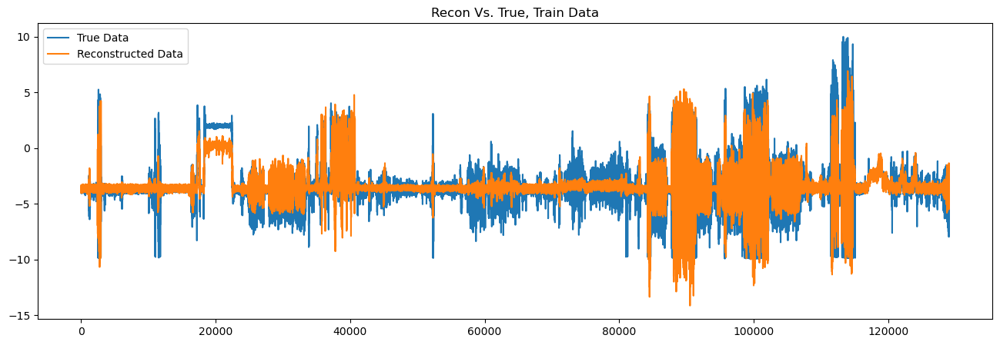

In [16]:
plt.figure(figsize=(16,5))
plt.title("Recon Vs. True, Train Data")
plt.plot(dataset[:split_idx], label="True Data")
plt.plot(reconstruction.cpu(), label="Reconstructed Data")
plt.title("Recon Vs. True, Train Data")
plt.legend()

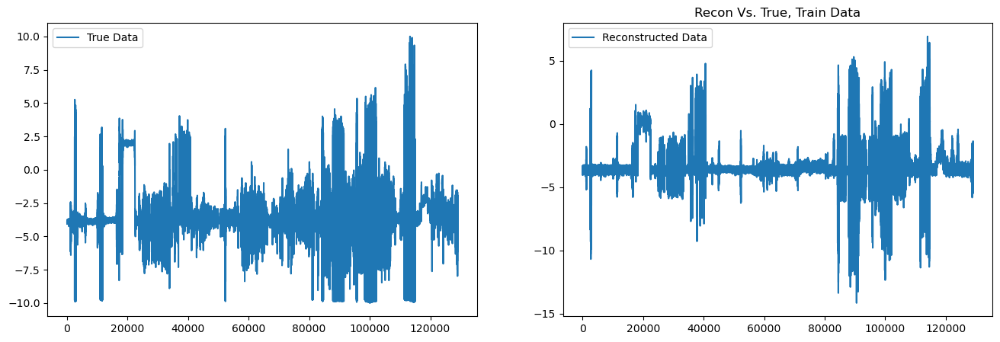

In [17]:
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
plt.plot(dataset[:split_idx], label="True Data")
plt.legend()
plt.subplot(1,2,2)
plt.plot(reconstruction.cpu(), label="Reconstructed Data")
plt.title("Recon Vs. True, Train Data")
plt.legend()

C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([252, 128])


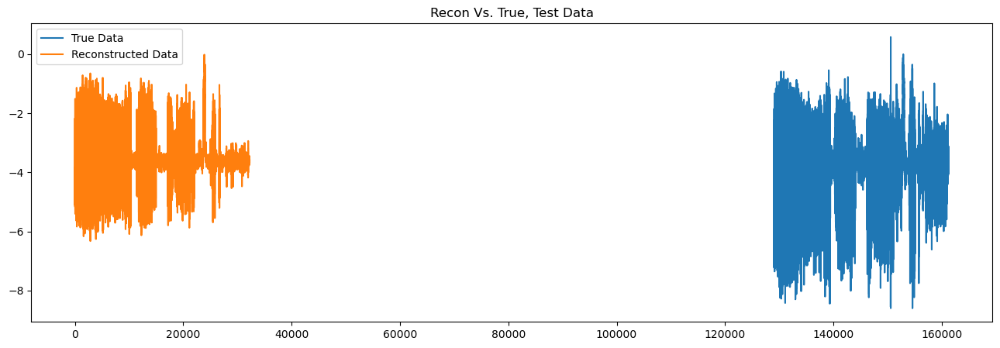

In [18]:
test_recon = predict(model, test_loader)

plt.figure(figsize=(16,5))
plt.plot(dataset[split_idx:], label="True Data")
plt.plot(test_recon.cpu(), label="Reconstructed Data")
plt.title("Recon Vs. True, Test Data")
plt.legend()

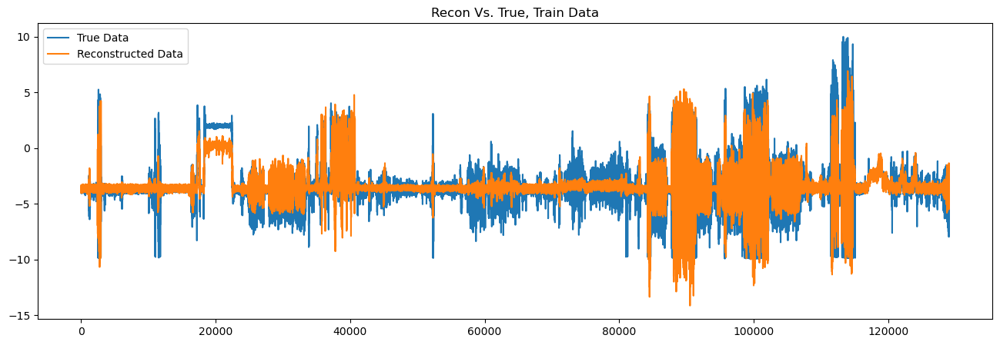

In [19]:
# plt.subplots(2)
plt.figure(figsize=(16,5))
plt.plot(dataset[:split_idx], label="True Data")
plt.plot(reconstruction.cpu(), label="Reconstructed Data")
plt.title("Recon Vs. True, Train Data")
plt.legend()

In [20]:
def plot_predictions(model):
    for i in range(10):

        path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\MHEALTHDATASET_CSV\\mHealth_subject' + str(i+1) + '.csv'
        df = pd.read_csv(path)
        
        df = df['chest acceleration X-axis']
        
        df = df.to_numpy().reshape(-1, 1)
        scaler = MinMaxScaler(feature_range=(-10, 10))

        df = scaler.fit_transform(df)
        df = pd.Series(df.squeeze())
        
        dataset = mHealth(
            dataframe=df,
        )
        
        dataloader = torch.utils.data.DataLoader(
            dataset=dataset,
            batch_size=512,
            collate_fn=collate_fn,
            shuffle=False,
            drop_last=False
        )
        
        reconstructed_data = predict(model, dataloader)
        
        plt.figure(figsize=(16,5))
        plt.plot(df, label="True Data")
        plt.plot(reconstructed_data.cpu(), label="Reconstructed Data")
        plt.title("Recon Vs. True, Whole Dataset")
        plt.legend()
                

C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([512, 128])
torch.Size([236, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([508, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([442, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([400, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([424, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([256, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([304, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([496, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([512, 128])
torch.Size([32, 128])


C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([256, 128])


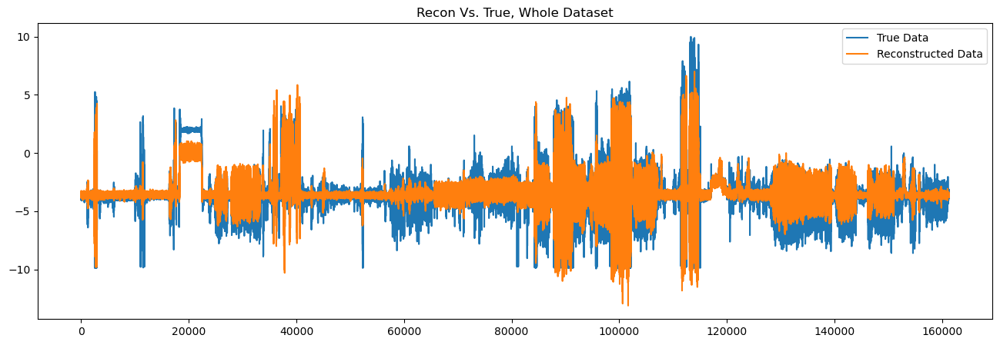

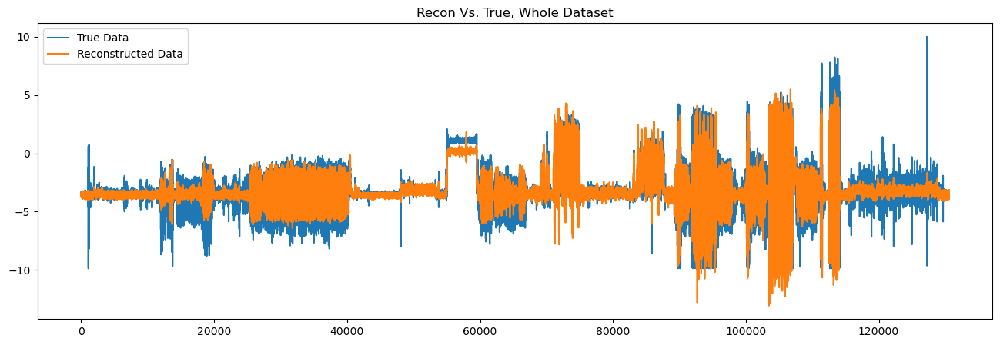

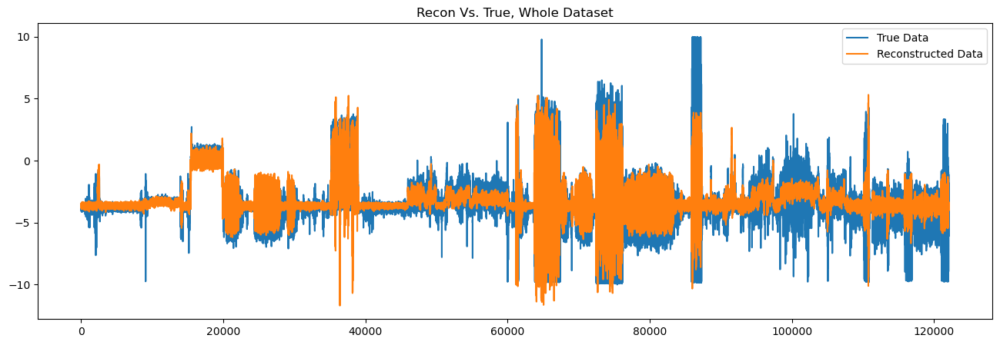

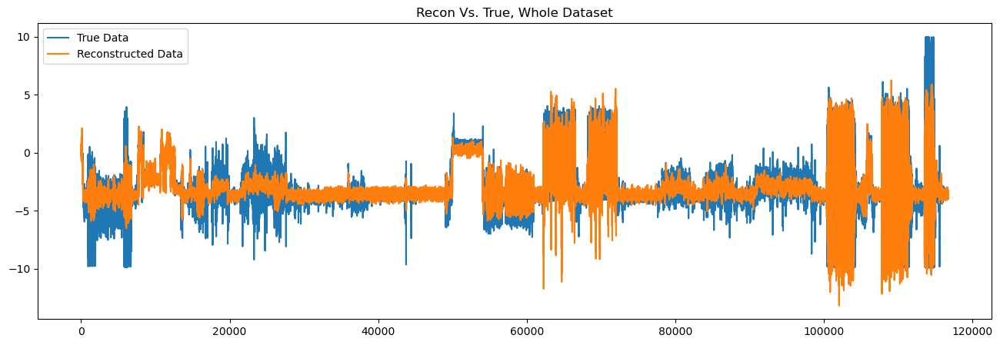

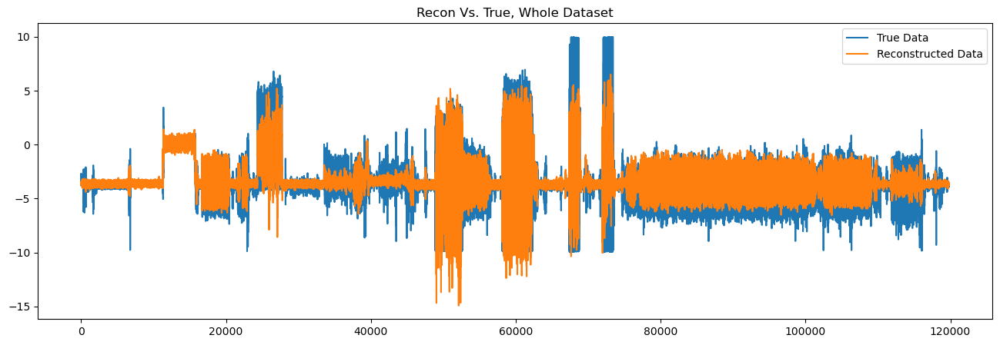

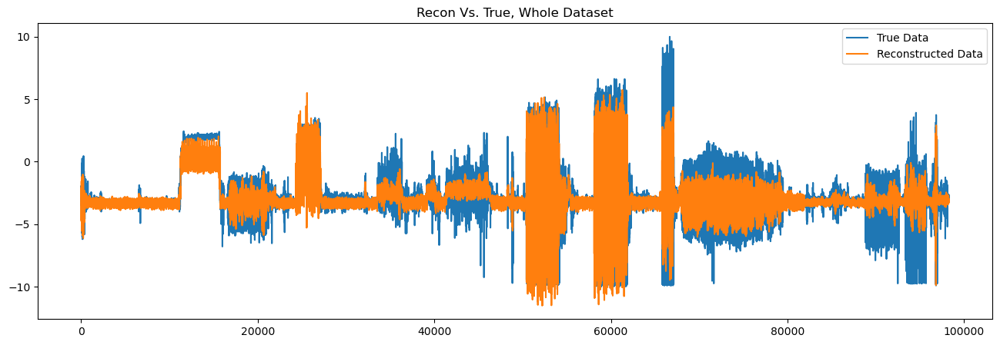

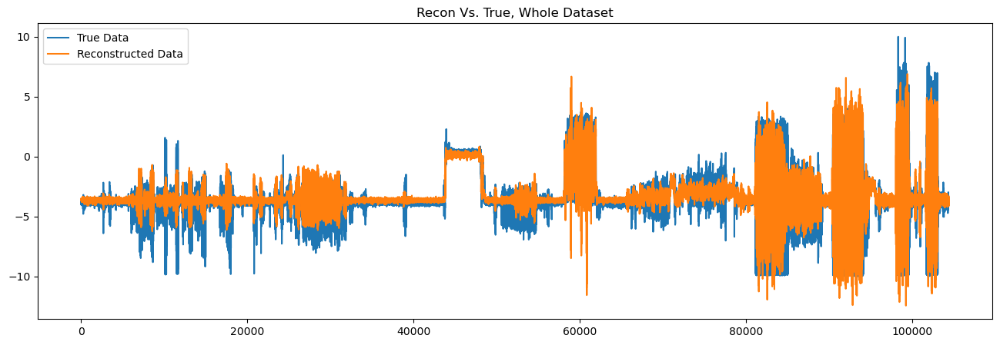

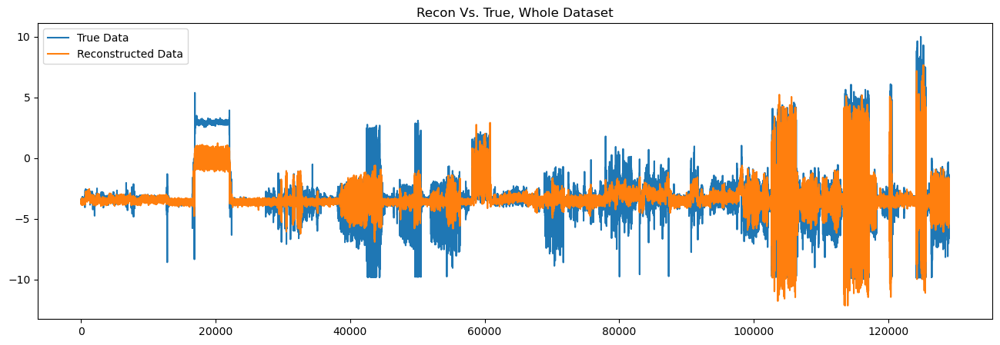

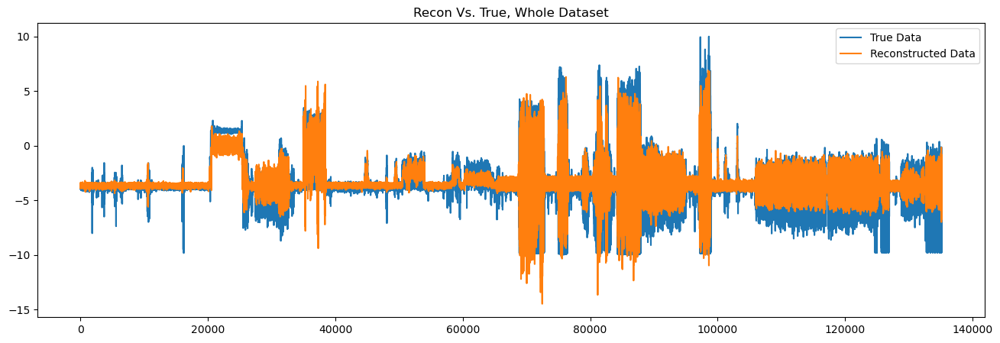

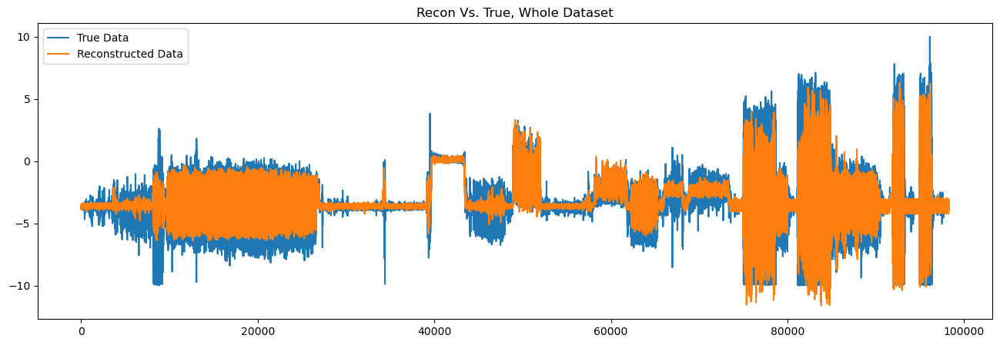

In [21]:
plot_predictions(model)

In [22]:
from sklearn.preprocessing import MinMaxScaler

def plot_predictions_daphnet(model):
    # for i in range(10):

    # path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\Daphnet_CSV\\S01R01.csv'
    path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\Daphnet_CSV\\S08R01.csv'
    # path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\smartphone activity detection\\train.csv'
    # path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\MobiAct_Dataset_v2.0\\Annotated Data\\BSC\\BSC_1_1_annotated.csv'
    # path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\UPFallCompleteDataSet.csv'
    
    df = pd.read_csv(path)
    # df = df['tBodyAcc-mean()-X']
    # df = df['acc_x']
    # df = df['BeltAccelerometer']
    df = df['trunk acceleration lateral']
    # df = df['trunk acceleration forward']
    
    # path = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\Daphnet_CSV\\S01R01.csv'
    # df = pd.read_csv(path)
    
    # df = df['trunk acceleration lateral']
    
    df = df.to_numpy().reshape(-1, 1)
    scaler = MinMaxScaler(feature_range=(-10, 10))

    df = scaler.fit_transform(df)
    df = pd.Series(df.squeeze())
    
    dataset = mHealth(
        dataframe=df,
    )
    
    dataloader = torch.utils.data.DataLoader(
        dataset=dataset,
        batch_size=512,
        collate_fn=collate_fn,
        shuffle=False,
        drop_last=False
    )
    
    reconstructed_data = predict(model, dataloader)
    
    fig, axs = plt.subplots(3, 1, figsize=(15, 10))  # 3 rows, 1 column
    axs[0].plot(df, label="True Data")
    axs[0].plot(reconstructed_data.cpu(), label="Reconstructed Data")
    axs[0].set_title("Recon Vs. True, Daphnet")
    axs[0].legend()
    
    axs[1].plot(df, label="True Data")
    axs[1].set_title("True Daphnet")
    axs[1].legend()
    
    axs[2].plot(reconstructed_data.cpu(), label="Reconstructed Data", color='orange')
    axs[2].set_title("Recon Daphnet")
    axs[2].legend()
    
    plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_39296\1202702476.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = [torch.tensor(d) for d in data]


torch.Size([512, 128])
torch.Size([512, 128])
torch.Size([43, 128])


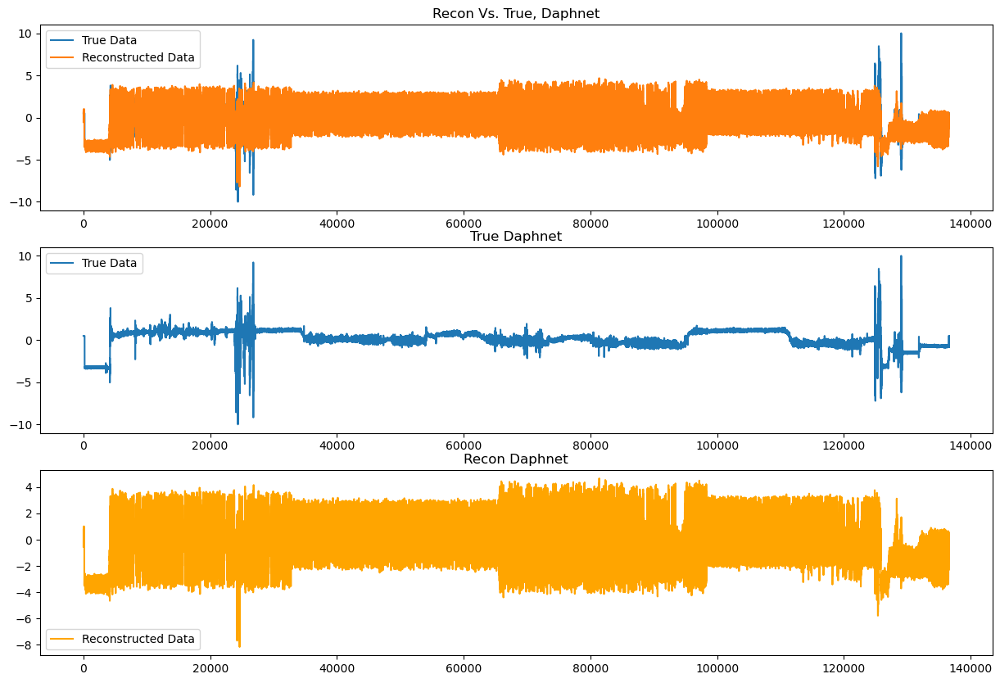

In [23]:
plot_predictions_daphnet(model)

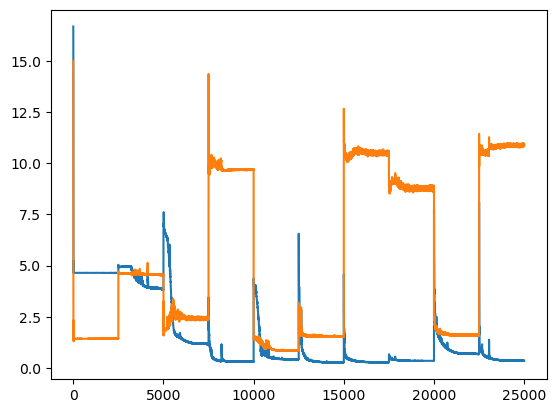

In [24]:
plt.plot(train_loss)
plt.plot(test_loss)

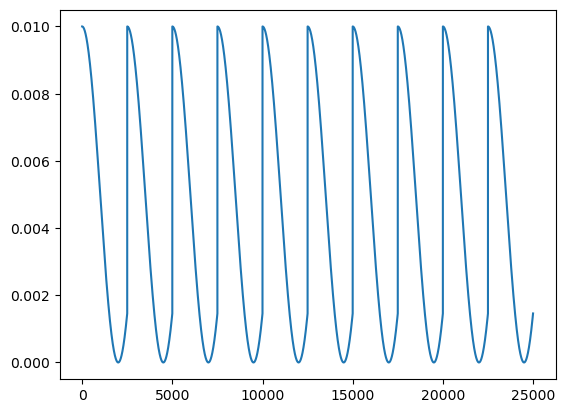

In [25]:
plt.plot(learning_rate)

In [26]:
# # cwd = os.getcwd() + "/MHEALTHDATASET_CSV"
# if(platform.system() == 'Windows'):
#     cwd = 'C:\\Users\\Admin\\.vscode\\pythonenv\\gait-project\\datasets\\MHEALTHDATASET_CSV'
# else:
#     cwd = '/home/jm/vscode/Python/pythonenv/gait-project/datasets/MHEALTHDATASET_CSV'

# print(cwd)

# os.chdir(cwd)

# #split data into sections by label

# df = pd.DataFrame()
# dataframes = []
# for file in os.listdir():
#     if file.endswith(".csv"):
#         file_path = f"{cwd}/{file}"
#         temp = pd.read_csv(file_path)
#         dataframes.append(temp)
#         print('file:', file, '| size = ', len(temp))
        
# df = pd.concat(dataframes)

In [27]:
# #extracts x,y,z chest accel data into different label groups
# def partition_data(label, dataframe):
#     x_data = []
#     y_data = []
#     z_data = []
#     activity = []
    
#     for i in range(len(dataframe)):
#         if(df['label'].iloc[i] == label):
#             x_data.append(df['chest acceleration X-axis'].iloc[i])
#             y_data.append(df['chest acceleration Y-axis'].iloc[i])
#             z_data.append(df['chest acceleration Z-axis'].iloc[i])
#             activity.append(df['label'].iloc[i])
            
    
#     partitioned_df = pd.DataFrame(
#                                   {
#         'x-axis': x_data,
#         'y-axis': y_data,
#         'z-axis': z_data,
#         'label': activity
#                                   })
    
#     return partitioned_df

In [28]:
# #splitting all mhealth data based on label, used for classification
# df_null = partition_data(0, df)
# df_stand = partition_data(1, df) 
# df_sit = partition_data(2, df)
# df_lying = partition_data(3, df)
# df_walk = partition_data(4, df)
# df_stairs = partition_data(5, df)
# df_waist_bend = partition_data(6, df)
# df_arms = partition_data(7, df) 
# df_knee_bend = partition_data(8, df) 
# df_cycle = partition_data(9, df) 
# df_jog = partition_data(10, df) 
# df_run = partition_data(11, df) 
# df_jump = partition_data(12, df) 

In [29]:
# class classifier_dataset(torch.utils.data.Dataset):

#     def __init__(self, dataframe):
#         """
#         Args:
#             dataframe (pd.DataFrame): dataframe containing data
#         """
#         self.dataset = dataframe['x-axis']
#         # print(self.dataset)
#         self.labels = dataframe['label']

#     def __len__(self):
#         return len(self.dataset)

#     def __getitem__(self, index):
#         """
#         Args:
#             index (int): index
#         Returns:
#             (sequence, [128, 3])
#             returns the time series data of length 128 in (X-axis, Y-axis, Z-axis)
#         """
#         #return sequence of length 128 x 3
#         # sequence = torch.tensor(self.dataset[index*128:index*128+128].to_numpy()).type(torch.float32) 
#         sequence = torch.tensor(self.dataset[index:index+128].to_numpy()).type(torch.float32) 
#         # print(sequence)
#         sequence = sequence.unsqueeze(dim=1) #remove when using 3 dim, currently needed for 1 dim data
        
#         # print("seq shape: ", sequence.shape)
#         label = torch.tensor(self.labels.iloc[index])
#         # print("lavel shape;", label.shape)
#         # print(label)
#         return sequence, label

# #pad sequences that aren't 128 length with 0's
# def collate_fn(data):
#     labels = []
#     for d in data:
#         labels.append(torch.tensor(d[1]))
    
#     labels = torch.tensor(labels)
#     inputs = [torch.tensor(d[0]) for d in data]
#     inputs = pad_sequence(inputs, batch_first=True)
    
#     # print("data[0][1], ", data[0][1])

#     return inputs, labels

In [30]:
# len(df_jump)//128

In [31]:
# split_idx = int(len(df_jump) * 0.8)

# class_train = classifier_dataset(
#     dataframe=df_jump[:split_idx]
# )

# class_test = classifier_dataset(
#     dataframe=df_jump[split_idx:]
# )

# class_train_loader = torch.utils.data.DataLoader(
#     class_train, 
#     batch_size=8, 
#     shuffle=True, 
#     drop_last=True,
#     collate_fn=collate_fn
#     )

# class_test_loader = torch.utils.data.DataLoader(
#     class_test, 
#     batch_size=8, 
#     shuffle=True, 
#     drop_last=True,
#     collate_fn=collate_fn
#     )

In [32]:
# class Classifier(nn.Module):

#   def __init__(self, input_dim=128, num_classes=13, num_units=8, dropout=0.5, hidden=True):
#     super(Classifier, self).__init__()
#     self.fcin = nn.Linear(input_dim, num_units)
#     self.fchidden = nn.Linear(num_units, num_units)
#     self.fcout = nn.Linear(num_units, num_classes)
#     self.dropout = nn.Dropout(dropout)
#     self.act = torch.nn.ReLU()
#     self.h = hidden


#   def forward(self, x):
#     # print('x in shape: ', x.shape)
#     x = self.act(self.fcin(x))
#     if self.h:
#       x = self.act(self.fchidden(x))
#     x = self.dropout(x)
#     x = self.fcout(x)
#     # print("x out shape: ", x.shape)
#     return x
    
# classifier = Classifier().to(device)
# class_train_loss = []
# class_test_loss = []

In [33]:
# learning_rate = 0.01
# num_epochs = 200
# i = 0

# criterion = nn.CrossEntropyLoss()  # Since it's a classification task
# optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# # Training loop
# for epoch in range(num_epochs):
    
#     model.train()
#     running_train_loss = 0.0
    
#     for batch_idx, (inputs, targets) in enumerate(class_train_loader):
#         # Zero the parameter gradients
#         optimizer.zero_grad()
        
#         encoded, _ = model.reconstruct(inputs)
#         # print("encoded shape: ", encoded.shape)
#         encoded = encoded[0, :, :]
        
        
        
#         # Forward pass
#         outputs = classifier(encoded).to(device)
        
#         # assert outputs.shape[0] == 13, f"Output shape mismatch: {outputs.shape}"
#         # assert targets.shape[0] == 4, f"Target shape mismatch: {targets.shape}"
        
#         # print(outputs.shape)
#         # print(targets.shape)
#         # print(type(targets))
       
#         y_pred = torch.round(torch.sigmoid(outputs))
#         loss = criterion(outputs, targets.type(torch.LongTensor).to(device))
        
#         running_train_loss += loss.item() * inputs.size(0)

#         # Backward pass and optimization
#         loss.backward()
#         optimizer.step()
#     model.eval()  # Set the model to evaluation mode
#     correct = 0
#     total = 0
#     running_test_loss = 0.0
    
#     epoch_train_loss = running_train_loss / len(class_train_loader)
#     class_train_loss.append(float(epoch_train_loss))

#     with torch.no_grad():
#         for batch_idx, (inputs, targets) in enumerate(class_test_loader):
            
#             encoded, _ = model.reconstruct(inputs)
#             encoded = encoded[0, :, :]
#             outputs = classifier(encoded).to(device)
            
#             loss = criterion(outputs, targets.type(torch.LongTensor).to(device))
#             running_test_loss += loss.item() * inputs.size(0)
            
#             _, predicted = torch.max(outputs, 1)
#             total += targets.size(0)
#             correct += (predicted.to(device) == targets.to(device)).sum().item()
    
#     epoch_test_loss = running_test_loss / len(class_test_loader)
#     class_test_loss.append(epoch_test_loss)
#     val_accuracy = correct / total

#     print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

# print("Training complete.")

In [34]:
# temp = df_jump['x-axis'].iloc[:128].to_numpy()
# temp = torch.tensor(temp).type(torch.float32)
# temp = temp.unsqueeze(dim=0)
# temp = temp.unsqueeze(dim=2)
# print(temp.shape)
# type(temp)

In [35]:
# encoded = model.encode(temp)

In [36]:
# print(encoded.shape)

In [37]:
# encoded, decoded = model.reconstruct(temp)

In [38]:
# 

In [39]:
# plt.plot(decoded.detach().cpu().numpy())
# plt.plot(df_jump['x-axis'].iloc[:128].to_numpy())

In [40]:
# from skorch import NeuralNetClassifier

# net = NeuralNetClassifier(
#     Classifier,
#     # Shuffle training data on each epoch
#     iterator_train__shuffle=True,
#     optimizer=torch.optim.Adam,
#     criterion=nn.CrossEntropyLoss()

# )

In [41]:
# type(df_jump['x-axis'][0])

In [42]:
# from sklearn.model_selection import GridSearchCV


# # deactivate skorch-internal train-valid split and verbose logging
# net.set_params(train_split=False, verbose=0)
# params = {
#     'lr': [0.001, 0.001],
#     'max_epochs': [10, 20, 50],
#     'module__num_units': [32, 64],
#     'module__dropout': [0.1],
#     'module__input_dim': [2],
#     'module__num_classes': [13],
#     'module__hidden': [True, False]

# }
# gs = GridSearchCV(net, params, refit=False, cv=3, scoring='accuracy', verbose=0)

# gs.fit(df_jump['x-axis'].to_numpy(),df_jump['label'].to_numpy())
# print("best score: {:.3f}, best params: {}".format(gs.best_score_, gs.best_params_))

In [43]:
# def classifier_train()